# Imports

In [2]:
import pandas as pd
import numpy as np
import os, sys
import math
import random
from statistics import mean, stdev
from collections import Counter 

from sklearn.preprocessing import OneHotEncoder
from sklearn.metrics import accuracy_score, recall_score, confusion_matrix,classification_report
from tensorflow.keras.layers import LSTM, Dense, Dropout, Flatten, Conv2D, MaxPooling2D
from tensorflow.keras.models import Sequential, load_model
from tensorflow.keras.optimizers import Adam
from keras import backend as K
import talos

from matplotlib import pyplot
import plotly.express as px

Using TensorFlow backend.


# Data Engineering (Feature Development and Data Matching)

In [18]:
# Uncomment this block and run once to generate data (ONLY run once)

x_dfs_names = ['X Acc', 'Y Acc', 'Z Acc', 'X Gyr', 'Y Gyr', 'Z Gyr']
window_num = 11  # window width = 2*window_num - 1
window_num_1 = window_num - 1
window_num_2 = window_num - 2

curr_dir = os.getcwd()
directory = "Convolutional_Data_v4"
path = os.path.join(curr_dir, directory)
os.mkdir(path)

file_names = list(os.listdir(os.getcwd() + "/TrainingData"))
for i in range(int(len(file_names)/4)):
    x = pd.read_csv(os.getcwd() + "\\TrainingData\\" + file_names[4*i], names=x_dfs_names)
    x_time = list(pd.read_csv(os.getcwd() + "\\TrainingData\\" + file_names[4*i+1], names=['Time'])['Time'])
    y = list(pd.read_csv(os.getcwd() + "\\TrainingData\\" + file_names[4*i+2], names=['Label'])['Label'])
    y_time = list(pd.read_csv(os.getcwd() + "\\TrainingData\\" + file_names[4*i+3], names=['Time'])['Time'])
    
    xacc = list(x['X Acc'])
    beef = list(x['Y Acc'])  # yacc
    zacc = list(x['Z Acc'])
    xgyr = list(x['X Gyr'])
    ygyr = list(x['Y Gyr'])
    zgyr = list(x['Z Gyr'])
    
    xacc_down_sampled = []
    beef_down_sampled = []
    zacc_down_sampled = []
    xgyr_down_sampled = []
    ygyr_down_sampled = []
    zgyr_down_sampled = []
    x_time_down_sampled = []
    for j in range(1, len(x), 4):
        xacc_down_sampled.append(xacc[j])
        beef_down_sampled.append(beef[j])
        zacc_down_sampled.append(zacc[j])
        xgyr_down_sampled.append(xgyr[j])
        ygyr_down_sampled.append(ygyr[j])
        zgyr_down_sampled.append(zgyr[j])
        x_time_down_sampled.append(x_time[j])
    
    xacc = xacc_down_sampled
    beef = beef_down_sampled  # yacc
    zacc = zacc_down_sampled
    xgyr = xgyr_down_sampled
    ygyr = ygyr_down_sampled
    zgyr = zgyr_down_sampled
    x_time = x_time_down_sampled

    # Initialize all of these with 0 pad since they will lose a point during calculation
    xjerk = [0]
    jerky = [0]  # yjerk
    zjerk = [0]
    xangacc = [0]
    yangacc = [0]
    zangazz = [0]  #zangacc
    
    time_diff = (x_time[1]-x_time[0])
    for j in range(1, len(xacc)):
        # aaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaang
        xjerk.append((xacc[j]-xacc[j-1])/time_diff)
        jerky.append((beef[j]-beef[j-1])/time_diff)  # derivative of beef = jerky
        zjerk.append((zacc[j]-zacc[j-1])/time_diff)
        xangacc.append((xgyr[j]-xgyr[j-1])/time_diff)
        yangacc.append((ygyr[j]-ygyr[j-1])/time_diff)
        zangazz.append((zgyr[j]-zgyr[j-1])/time_diff)
    
    # Padding needed for a 20 window size
    padding = [0] * window_num_2
    xacc = padding + xacc + padding
    beef = padding + beef + padding # yacc
    zacc = padding + zacc + padding
    xgyr = padding + xgyr + padding
    ygyr = padding + ygyr + padding
    zgyr = padding + zgyr + padding
    xjerk = padding + xjerk + padding
    jerky = padding + jerky + padding  # yjerk
    zjerk = padding + zjerk + padding
    xangacc = padding + xangacc + padding
    yangacc = padding + yangacc + padding
    zangazz = padding + zangazz + padding  #zangacc
    
    xaccavg = []
    beefavg = []  # yacc
    zaccavg = []
    xgyravg = []
    ygyravg = []
    zgyravg = []
    xjerkavg = []
    jerkyavg = []  # yjerk
    zjerkavg = []
    xangaccavg = []
    yangaccavg = []
    zangazzavg = [] #zangacc
    
    xaccstd = []
    beefstd = []  # yacc
    zaccstd = []
    xgyrstd = []
    ygyrstd = []
    zgyrstd = []
    xjerkstd = []
    jerkystd = []  # yjerk
    zjerkstd = []
    xangaccstd = []
    yangaccstd = []
    zangazzstd = [] #zangacc

    for j in range(window_num, len(xacc)+window_num_1):
        xaccavg.append(mean(xacc[j-window_num:j+window_num_1]))
        beefavg.append(mean(beef[j-window_num:j+window_num_1]))
        zaccavg.append(mean(zacc[j-window_num:j+window_num_1]))
        xgyravg.append(mean(xgyr[j-window_num:j+window_num_1]))
        ygyravg.append(mean(ygyr[j-window_num:j+window_num_1]))
        zgyravg.append(mean(zgyr[j-window_num:j+window_num_1]))
        xjerkavg.append(mean(xjerk[j-window_num:j+window_num_1]))
        jerkyavg.append(mean(jerky[j-window_num:j+window_num_1]))
        zjerkavg.append(mean(zjerk[j-window_num:j+window_num_1]))
        xangaccavg.append(mean(xangacc[j-window_num:j+window_num_1]))
        yangaccavg.append(mean(yangacc[j-window_num:j+window_num_1]))
        zangazzavg.append(mean(zangazz[j-window_num:j+window_num_1]))

        xaccstd.append(stdev(xacc[j-window_num:j+window_num_1]))
        beefstd.append(stdev(beef[j-window_num:j+window_num_1]))
        zaccstd.append(stdev(zacc[j-window_num:j+window_num_1]))
        xgyrstd.append(stdev(xgyr[j-window_num:j+window_num_1]))
        ygyrstd.append(stdev(ygyr[j-window_num:j+window_num_1]))
        zgyrstd.append(stdev(zgyr[j-window_num:j+window_num_1]))
        xjerkstd.append(stdev(xjerk[j-window_num:j+window_num_1]))
        jerkystd.append(stdev(jerky[j-window_num:j+window_num_1]))
        zjerkstd.append(stdev(zjerk[j-window_num:j+window_num_1]))
        xangaccstd.append(stdev(xangacc[j-window_num:j+window_num_1]))
        yangaccstd.append(stdev(yangacc[j-window_num:j+window_num_1]))
        zangazzstd.append(stdev(zangazz[j-window_num:j+window_num_1]))
    
    # Additional Safe ending padding
    end_padding = [0] * window_num
    
    # For "original" features, keep a padding of 18 0's  --  two points + 18 0's are for first label
    xacc = xacc[1:] + end_padding
    beef = beef[1:] + end_padding  # yacc
    zacc = zacc[1:] + end_padding
    xgyr = xgyr[1:] + end_padding
    ygyr = ygyr[1:] + end_padding
    zgyr = zgyr[1:] + end_padding
    xjerk = xjerk[1:] + end_padding
    jerky = jerky[1:] + end_padding  # yjerk
    zjerk = zjerk[1:] + end_padding
    xangacc = xangacc[1:] + end_padding
    yangacc = yangacc[1:] + end_padding
    zangazz = zangazz[1:] + end_padding  #zangacc
    
    # Padding for average and stdev features
    padding2 = [0] * window_num_2
    xaccavg = padding2 + xaccavg + end_padding
    beefavg = padding2 + beefavg + end_padding  # yacc
    zaccavg = padding2 + zaccavg + end_padding
    xgyravg = padding2 + xgyravg + end_padding
    ygyravg = padding2 + ygyravg + end_padding
    zgyravg = padding2 + zgyravg + end_padding
    xjerkavg = padding2 + xjerkavg + end_padding
    jerkyavg = padding2 + jerkyavg + end_padding  # yjerk
    zjerkavg = padding2 + zjerkavg + end_padding
    xangaccavg = padding2 + xangaccavg + end_padding
    yangaccavg = padding2 + yangaccavg + end_padding
    zangazzavg = padding2 + zangazzavg + end_padding #zangacc
    
    xaccstd = padding2 + xaccstd + end_padding
    beefstd = padding2 + beefstd + end_padding  # yacc
    zaccstd = padding2 + zaccstd + end_padding
    xgyrstd = padding2 + xgyrstd + end_padding
    ygyrstd = padding2 + ygyrstd + end_padding
    zgyrstd = padding2 + zgyrstd + end_padding
    xjerkstd = padding2 + xjerkstd + end_padding
    jerkystd = padding2 + jerkystd + end_padding  # yjerk
    zjerkstd = padding2 + zjerkstd + end_padding
    xangaccstd = padding2 + xangaccstd + end_padding
    yangaccstd = padding2 + yangaccstd + end_padding
    zangazzstd = padding2 + zangazzstd + end_padding #zangacc
    
    X_data = []
    y_data = []
    for j in range(window_num_1, len(y_time)+window_num_1):
        new_img = np.column_stack([xacc[j-window_num_1:j+window_num], beef[j-window_num_1:j+window_num], 
                                   zacc[j-window_num_1:j+window_num], xgyr[j-window_num_1:j+window_num], 
                                   ygyr[j-window_num_1:j+window_num], zgyr[j-window_num_1:j+window_num], 
                                   xjerk[j-window_num_1:j+window_num], jerky[j-window_num_1:j+window_num], 
                                   zjerk[j-window_num_1:j+window_num], xangacc[j-window_num_1:j+window_num], 
                                   yangacc[j-window_num_1:j+window_num], zangazz[j-window_num_1:j+window_num], 
                                   xaccavg[j-window_num_1:j+window_num], beefavg[j-window_num_1:j+window_num], 
                                   zaccavg[j-window_num_1:j+window_num], xgyravg[j-window_num_1:j+window_num], 
                                   ygyravg[j-window_num_1:j+window_num], zgyravg[j-window_num_1:j+window_num], 
                                   xjerkavg[j-window_num_1:j+window_num], jerkyavg[j-window_num_1:j+window_num], 
                                   zjerkavg[j-window_num_1:j+window_num], xangaccavg[j-window_num_1:j+window_num], 
                                   yangaccavg[j-window_num_1:j+window_num], zangazzavg[j-window_num_1:j+window_num], 
                                 xaccstd[j-window_num_1:j+window_num], beefstd[j-window_num_1:j+window_num], 
                                   zaccstd[j-window_num_1:j+window_num], xgyrstd[j-window_num_1:j+window_num], 
                                 ygyrstd[j-window_num_1:j+window_num], zgyrstd[j-window_num_1:j+window_num], 
                                   xjerkstd[j-window_num_1:j+window_num], jerkystd[j-window_num_1:j+window_num], 
                                 zjerkstd[j-window_num_1:j+window_num], xangaccstd[j-window_num_1:j+window_num], 
                                   yangaccstd[j-window_num_1:j+window_num], zangazzstd[j-window_num_1:j+window_num]])
        X_data.append(new_img)

    string = ''
    for j in range(len(X_data)):
        string += "x" + str(j) + "=X_data[" + str(j) + "], "
    string = "np.savez('Convolutional_Data_v4/Xdata" + str(i) + ".npz', " + string[0:-2] + ")"
    exec(string)
    print('Done with Trial: ', i)


Done with Trial:  0
Done with Trial:  1
Done with Trial:  2
Done with Trial:  3
Done with Trial:  4
Done with Trial:  5
Done with Trial:  6
Done with Trial:  7
Done with Trial:  8
Done with Trial:  9
Done with Trial:  10
Done with Trial:  11
Done with Trial:  12
Done with Trial:  13
Done with Trial:  14
Done with Trial:  15


In [7]:
X_data = []
y_data = []
file_names = list(os.listdir(os.getcwd() + "/TrainingData"))
for i in range(int(len(file_names)/4)):
    array_dict = np.load("Convolutional_Data_v4/Xdata" + str(i) + ".npz")
    for j in list(array_dict.keys()):
        X_data.append(array_dict[j])
    array_dict.close()
    y = list(pd.read_csv(os.getcwd() + "\\TrainingData\\" + file_names[4*i+2], names=['Label'])['Label'])
    y_data += y

X_data = np.array(X_data)
y_data = np.array(y_data)

## Dealing with Imbalanced Data

In [8]:
# Downsampling over represented classes

counts = pd.DataFrame(y_data)[0].value_counts()
print("Initial Value Counts for y_data\n", counts)
min_class = np.argmin(counts)
min_class_count = counts[min_class]

min_class_idxs = list(np.where(y_data == min_class)[0])
classmaj1 = np.where(y_data == 0)[0]
classmaj2 = np.where(y_data == 3)[0]
classmaj3 = np.where(y_data == 2)[0]

classmaj1_chosen_idxs = random.sample(list(classmaj1), min_class_count)
classmaj2_chosen_idxs = random.sample(list(classmaj2), min_class_count)
classmaj3_chosen_idxs = random.sample(list(classmaj3), min_class_count)

chosen_idxs = min_class_idxs + classmaj1_chosen_idxs + classmaj2_chosen_idxs + classmaj3_chosen_idxs
chosen_idxs.sort()
X_sm = []
y_sm = []
for i in chosen_idxs:
    X_sm.append(X_data[i, :, :])
    y_sm.append(y_data[i])

X_sm = np.array(X_sm)
y_sm = np.array(y_sm)
print(X_sm.shape)
print(y_sm.shape)

Initial Value Counts for y_data
 0    251733
3     51609
2     18267
1     13804
Name: 0, dtype: int64
(55216, 21, 36)
(55216,)


## Y Data Label Augmentation

In [9]:
# One Hot Encoding of y labels
enc = OneHotEncoder(handle_unknown='ignore')
enc_df = pd.DataFrame(enc.fit_transform(y_sm.reshape(y_sm.shape[0], 1)).toarray())
enc_df.columns = ['Solid', 'Downstairs', 'Upstairs', 'Grass']
y_final = enc_df.to_numpy()
print(y_final)

[[1. 0. 0. 0.]
 [1. 0. 0. 0.]
 [1. 0. 0. 0.]
 ...
 [1. 0. 0. 0.]
 [1. 0. 0. 0.]
 [1. 0. 0. 0.]]


## Train Test Split

In [10]:
# Test training split
num_points = 55216
train_test_split = 5000

X_test, y_test, X_train, y_train = X_sm[0:train_test_split], \
                                   y_final[0:train_test_split], \
                                   X_sm[train_test_split:num_points], \
                                   y_final[train_test_split:num_points]


X_train = X_train.reshape(X_train.shape[0], X_train.shape[1], X_train.shape[2], 1)
X_test = X_test.reshape(X_test.shape[0], X_train.shape[1], X_train.shape[2], 1)

print(X_train.shape, y_train.shape, X_test.shape, y_test.shape)

(50216, 21, 36, 1) (50216, 4) (5000, 21, 36, 1) (5000, 4)


# Model Definition and Optimization
## Metric Definitions

In [6]:
# Various Function Metrics
def recall_m(y_true, y_pred):
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    possible_positives = K.sum(K.round(K.clip(y_true, 0, 1)))
    recall = true_positives / (possible_positives + K.epsilon())
    return recall

def precision_m(y_true, y_pred):
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    predicted_positives = K.sum(K.round(K.clip(y_pred, 0, 1)))
    precision = true_positives / (predicted_positives + K.epsilon())
    return precision

def f1_m(y_true, y_pred):
    precision = precision_m(y_true, y_pred)
    recall = recall_m(y_true, y_pred)
    return 2*((precision*recall)/(precision+recall+K.epsilon()))

## Hyperparameter Optimization
### Experiment 1

In [18]:
# Experiment 1
p = {'conv_layer_neurons': [128, 256, 512],
     'dense_layer_neurons': [256, 512, 1024],
     'learningrate': [0.0001, 0.001, 0.01],
     'activation': ['relu', 'swish'],
     'dropout': [0.2, 0.3, 0.5],
     'batch_size': [36, 144, 512, 2048]}

def conv_model(X_train, y_train, X_test, y_test, params):
    model = Sequential()
    model.add(Conv2D(params['conv_layer_neurons'], (3, 3), activation=params['activation'], padding='same', input_shape=(X_train.shape[1], X_train.shape[2], 1)))
    model.add(Dropout(params['dropout']))
    model.add(MaxPooling2D(2, 2))

    model.add(Conv2D(params['conv_layer_neurons'], (3, 3), activation=params['activation'], padding='same'))
    model.add(Dropout(params['dropout']))
    model.add(MaxPooling2D(2, 2))

    model.add(Conv2D(params['conv_layer_neurons'], (3, 3), activation=params['activation'], padding='same'))
    model.add(Dropout(params['dropout']))
    model.add(MaxPooling2D(2, 2))

    model.add(Flatten())
    model.add(Dense(params['dense_layer_neurons'], activation=params['activation']))
    model.add(Dropout(params['dropout']))
    model.add(Dense(4, activation='softmax'))

    model.compile(loss='categorical_crossentropy', optimizer=Adam(learning_rate=params['learningrate']), metrics=['categorical_accuracy', f1_m, precision_m, recall_m])
    history = model.fit(X_train, y_train, epochs=5, batch_size=params['batch_size'], validation_data=(X_test, y_test), 
                        verbose=1, shuffle=True)
    return history, model
    
h = talos.Scan(X_train, y_train, model=conv_model, params=p, fraction_limit=0.01, print_params=True,
              experiment_name='1', reduction_metric='val_loss', minimize_loss=True)

e = talos.Evaluate(h)
evaluation = e.evaluate(X_test, y_test, model_id=None, folds=5, shuffle=True, metric='val_loss', asc=True)



  0%|                                                                                            | 0/6 [00:00<?, ?it/s]

{'activation': 'relu', 'batch_size': 144, 'conv_layer_neurons': 128, 'dense_layer_neurons': 512, 'dropout': 0.3, 'learningrate': 0.0001}
Epoch 1/5


 72/245 [=======>......................] - ETA: 4:21 - loss: 9.8890 - categorical_accuracy: 0.2708 - f1_m: 0.2746 - precision_m: 0.2786 - recall_m: 0.27 - ETA: 1:39 - loss: 9.5221 - categorical_accuracy: 0.2812 - f1_m: 0.2855 - precision_m: 0.2899 - recall_m: 0.28 - ETA: 1:38 - loss: 9.4289 - categorical_accuracy: 0.2785 - f1_m: 0.2822 - precision_m: 0.2867 - recall_m: 0.27 - ETA: 1:40 - loss: 9.3982 - categorical_accuracy: 0.2740 - f1_m: 0.2768 - precision_m: 0.2816 - recall_m: 0.27 - ETA: 1:40 - loss: 9.3293 - categorical_accuracy: 0.2703 - f1_m: 0.2725 - precision_m: 0.2774 - recall_m: 0.26 - ETA: 1:41 - loss: 9.2230 - categorical_accuracy: 0.2687 - f1_m: 0.2700 - precision_m: 0.2750 - recall_m: 0.26 - ETA: 1:41 - loss: 9.1483 - categorical_accuracy: 0.2667 - f1_m: 0.2674 - precision_m: 0.2724 - recall_m: 0.26 - ETA: 1:40 - loss: 9.0786 - categorical_accuracy: 0.2644 - f1_m: 0.2646 - precision_m: 0.2696 - recall_m: 0.25 - ETA: 1:41 - loss: 9.0140 - categorical_accuracy: 0.2623 - f1_

218/245 [=========================>....] - ETA: 43s - loss: 4.4434 - categorical_accuracy: 0.2937 - f1_m: 0.2688 - precision_m: 0.2971 - recall_m: 0.248 - ETA: 43s - loss: 4.4314 - categorical_accuracy: 0.2940 - f1_m: 0.2689 - precision_m: 0.2974 - recall_m: 0.248 - ETA: 42s - loss: 4.4195 - categorical_accuracy: 0.2942 - f1_m: 0.2689 - precision_m: 0.2977 - recall_m: 0.248 - ETA: 42s - loss: 4.4076 - categorical_accuracy: 0.2944 - f1_m: 0.2690 - precision_m: 0.2980 - recall_m: 0.248 - ETA: 41s - loss: 4.3959 - categorical_accuracy: 0.2946 - f1_m: 0.2691 - precision_m: 0.2983 - recall_m: 0.247 - ETA: 41s - loss: 4.3843 - categorical_accuracy: 0.2949 - f1_m: 0.2692 - precision_m: 0.2986 - recall_m: 0.247 - ETA: 41s - loss: 4.3728 - categorical_accuracy: 0.2951 - f1_m: 0.2692 - precision_m: 0.2989 - recall_m: 0.247 - ETA: 40s - loss: 4.3614 - categorical_accuracy: 0.2953 - f1_m: 0.2693 - precision_m: 0.2992 - recall_m: 0.247 - ETA: 40s - loss: 4.3501 - categorical_accuracy: 0.2955 - f1_m

245/245 [==============================] - ETA: 11s - loss: 3.7739 - categorical_accuracy: 0.3090 - f1_m: 0.2733 - precision_m: 0.3193 - recall_m: 0.244 - ETA: 11s - loss: 3.7669 - categorical_accuracy: 0.3092 - f1_m: 0.2733 - precision_m: 0.3196 - recall_m: 0.244 - ETA: 10s - loss: 3.7599 - categorical_accuracy: 0.3094 - f1_m: 0.2734 - precision_m: 0.3199 - recall_m: 0.244 - ETA: 10s - loss: 3.7530 - categorical_accuracy: 0.3096 - f1_m: 0.2735 - precision_m: 0.3202 - recall_m: 0.244 - ETA: 9s - loss: 3.7462 - categorical_accuracy: 0.3098 - f1_m: 0.2735 - precision_m: 0.3205 - recall_m: 0.244 - ETA: 9s - loss: 3.7393 - categorical_accuracy: 0.3100 - f1_m: 0.2736 - precision_m: 0.3208 - recall_m: 0.24 - ETA: 8s - loss: 3.7326 - categorical_accuracy: 0.3102 - f1_m: 0.2736 - precision_m: 0.3211 - recall_m: 0.24 - ETA: 8s - loss: 3.7258 - categorical_accuracy: 0.3104 - f1_m: 0.2737 - precision_m: 0.3214 - recall_m: 0.24 - ETA: 8s - loss: 3.7191 - categorical_accuracy: 0.3106 - f1_m: 0.2738

 73/245 [=======>......................] - ETA: 2:05 - loss: 1.2772 - categorical_accuracy: 0.4375 - f1_m: 0.2911 - precision_m: 0.4493 - recall_m: 0.21 - ETA: 2:08 - loss: 1.2577 - categorical_accuracy: 0.4549 - f1_m: 0.3131 - precision_m: 0.4862 - recall_m: 0.23 - ETA: 2:05 - loss: 1.2535 - categorical_accuracy: 0.4599 - f1_m: 0.3186 - precision_m: 0.4986 - recall_m: 0.23 - ETA: 2:04 - loss: 1.2537 - categorical_accuracy: 0.4612 - f1_m: 0.3229 - precision_m: 0.5055 - recall_m: 0.23 - ETA: 2:03 - loss: 1.2509 - categorical_accuracy: 0.4612 - f1_m: 0.3252 - precision_m: 0.5122 - recall_m: 0.23 - ETA: 2:03 - loss: 1.2502 - categorical_accuracy: 0.4596 - f1_m: 0.3258 - precision_m: 0.5146 - recall_m: 0.23 - ETA: 2:03 - loss: 1.2516 - categorical_accuracy: 0.4570 - f1_m: 0.3248 - precision_m: 0.5147 - recall_m: 0.23 - ETA: 2:02 - loss: 1.2511 - categorical_accuracy: 0.4562 - f1_m: 0.3255 - precision_m: 0.5172 - recall_m: 0.23 - ETA: 2:01 - loss: 1.2521 - categorical_accuracy: 0.4546 - f1_

219/245 [=========================>....] - ETA: 50s - loss: 1.1968 - categorical_accuracy: 0.4737 - f1_m: 0.3625 - precision_m: 0.5633 - recall_m: 0.268 - ETA: 50s - loss: 1.1965 - categorical_accuracy: 0.4738 - f1_m: 0.3628 - precision_m: 0.5635 - recall_m: 0.268 - ETA: 49s - loss: 1.1961 - categorical_accuracy: 0.4740 - f1_m: 0.3630 - precision_m: 0.5638 - recall_m: 0.268 - ETA: 49s - loss: 1.1957 - categorical_accuracy: 0.4742 - f1_m: 0.3633 - precision_m: 0.5640 - recall_m: 0.268 - ETA: 48s - loss: 1.1954 - categorical_accuracy: 0.4743 - f1_m: 0.3635 - precision_m: 0.5642 - recall_m: 0.269 - ETA: 48s - loss: 1.1950 - categorical_accuracy: 0.4745 - f1_m: 0.3638 - precision_m: 0.5645 - recall_m: 0.269 - ETA: 47s - loss: 1.1946 - categorical_accuracy: 0.4746 - f1_m: 0.3640 - precision_m: 0.5647 - recall_m: 0.269 - ETA: 47s - loss: 1.1943 - categorical_accuracy: 0.4748 - f1_m: 0.3643 - precision_m: 0.5649 - recall_m: 0.269 - ETA: 46s - loss: 1.1939 - categorical_accuracy: 0.4750 - f1_m

245/245 [==============================] - ETA: 13s - loss: 1.1718 - categorical_accuracy: 0.4849 - f1_m: 0.3797 - precision_m: 0.5786 - recall_m: 0.283 - ETA: 12s - loss: 1.1714 - categorical_accuracy: 0.4851 - f1_m: 0.3799 - precision_m: 0.5788 - recall_m: 0.284 - ETA: 11s - loss: 1.1711 - categorical_accuracy: 0.4852 - f1_m: 0.3802 - precision_m: 0.5790 - recall_m: 0.284 - ETA: 11s - loss: 1.1708 - categorical_accuracy: 0.4854 - f1_m: 0.3804 - precision_m: 0.5792 - recall_m: 0.284 - ETA: 10s - loss: 1.1704 - categorical_accuracy: 0.4855 - f1_m: 0.3806 - precision_m: 0.5794 - recall_m: 0.284 - ETA: 10s - loss: 1.1701 - categorical_accuracy: 0.4856 - f1_m: 0.3808 - precision_m: 0.5795 - recall_m: 0.284 - ETA: 9s - loss: 1.1698 - categorical_accuracy: 0.4858 - f1_m: 0.3810 - precision_m: 0.5797 - recall_m: 0.285 - ETA: 9s - loss: 1.1695 - categorical_accuracy: 0.4859 - f1_m: 0.3813 - precision_m: 0.5799 - recall_m: 0.28 - ETA: 8s - loss: 1.1691 - categorical_accuracy: 0.4861 - f1_m: 0.

 73/245 [=======>......................] - ETA: 2:08 - loss: 1.0247 - categorical_accuracy: 0.5278 - f1_m: 0.4895 - precision_m: 0.6237 - recall_m: 0.40 - ETA: 2:06 - loss: 1.0340 - categorical_accuracy: 0.5469 - f1_m: 0.5055 - precision_m: 0.6387 - recall_m: 0.41 - ETA: 2:04 - loss: 1.0214 - categorical_accuracy: 0.5567 - f1_m: 0.5160 - precision_m: 0.6485 - recall_m: 0.42 - ETA: 2:03 - loss: 1.0140 - categorical_accuracy: 0.5612 - f1_m: 0.5202 - precision_m: 0.6575 - recall_m: 0.43 - ETA: 2:04 - loss: 1.0018 - categorical_accuracy: 0.5676 - f1_m: 0.5270 - precision_m: 0.6685 - recall_m: 0.43 - ETA: 2:04 - loss: 0.9931 - categorical_accuracy: 0.5723 - f1_m: 0.5306 - precision_m: 0.6751 - recall_m: 0.43 - ETA: 2:04 - loss: 0.9891 - categorical_accuracy: 0.5746 - f1_m: 0.5321 - precision_m: 0.6785 - recall_m: 0.43 - ETA: 2:02 - loss: 0.9860 - categorical_accuracy: 0.5766 - f1_m: 0.5328 - precision_m: 0.6814 - recall_m: 0.43 - ETA: 2:02 - loss: 0.9839 - categorical_accuracy: 0.5778 - f1_

219/245 [=========================>....] - ETA: 51s - loss: 0.9181 - categorical_accuracy: 0.5963 - f1_m: 0.5523 - precision_m: 0.6987 - recall_m: 0.457 - ETA: 51s - loss: 0.9177 - categorical_accuracy: 0.5965 - f1_m: 0.5525 - precision_m: 0.6988 - recall_m: 0.457 - ETA: 50s - loss: 0.9174 - categorical_accuracy: 0.5966 - f1_m: 0.5527 - precision_m: 0.6990 - recall_m: 0.458 - ETA: 50s - loss: 0.9171 - categorical_accuracy: 0.5968 - f1_m: 0.5528 - precision_m: 0.6991 - recall_m: 0.458 - ETA: 49s - loss: 0.9168 - categorical_accuracy: 0.5969 - f1_m: 0.5530 - precision_m: 0.6992 - recall_m: 0.458 - ETA: 49s - loss: 0.9165 - categorical_accuracy: 0.5971 - f1_m: 0.5532 - precision_m: 0.6993 - recall_m: 0.458 - ETA: 48s - loss: 0.9162 - categorical_accuracy: 0.5973 - f1_m: 0.5534 - precision_m: 0.6994 - recall_m: 0.458 - ETA: 48s - loss: 0.9158 - categorical_accuracy: 0.5974 - f1_m: 0.5536 - precision_m: 0.6995 - recall_m: 0.459 - ETA: 47s - loss: 0.9155 - categorical_accuracy: 0.5976 - f1_m

245/245 [==============================] - ETA: 13s - loss: 0.8984 - categorical_accuracy: 0.6054 - f1_m: 0.5638 - precision_m: 0.7050 - recall_m: 0.471 - ETA: 12s - loss: 0.8981 - categorical_accuracy: 0.6056 - f1_m: 0.5639 - precision_m: 0.7050 - recall_m: 0.471 - ETA: 12s - loss: 0.8979 - categorical_accuracy: 0.6057 - f1_m: 0.5641 - precision_m: 0.7051 - recall_m: 0.471 - ETA: 11s - loss: 0.8976 - categorical_accuracy: 0.6058 - f1_m: 0.5642 - precision_m: 0.7052 - recall_m: 0.471 - ETA: 11s - loss: 0.8974 - categorical_accuracy: 0.6059 - f1_m: 0.5644 - precision_m: 0.7053 - recall_m: 0.471 - ETA: 10s - loss: 0.8971 - categorical_accuracy: 0.6060 - f1_m: 0.5645 - precision_m: 0.7053 - recall_m: 0.471 - ETA: 10s - loss: 0.8969 - categorical_accuracy: 0.6061 - f1_m: 0.5646 - precision_m: 0.7054 - recall_m: 0.472 - ETA: 9s - loss: 0.8966 - categorical_accuracy: 0.6062 - f1_m: 0.5648 - precision_m: 0.7055 - recall_m: 0.472 - ETA: 9s - loss: 0.8964 - categorical_accuracy: 0.6063 - f1_m: 

 73/245 [=======>......................] - ETA: 2:07 - loss: 0.7037 - categorical_accuracy: 0.6944 - f1_m: 0.6822 - precision_m: 0.7719 - recall_m: 0.61 - ETA: 2:14 - loss: 0.7166 - categorical_accuracy: 0.6840 - f1_m: 0.6678 - precision_m: 0.7601 - recall_m: 0.59 - ETA: 2:15 - loss: 0.7374 - categorical_accuracy: 0.6790 - f1_m: 0.6611 - precision_m: 0.7575 - recall_m: 0.58 - ETA: 2:12 - loss: 0.7387 - categorical_accuracy: 0.6794 - f1_m: 0.6595 - precision_m: 0.7575 - recall_m: 0.58 - ETA: 2:15 - loss: 0.7348 - categorical_accuracy: 0.6821 - f1_m: 0.6613 - precision_m: 0.7595 - recall_m: 0.58 - ETA: 2:13 - loss: 0.7329 - categorical_accuracy: 0.6842 - f1_m: 0.6622 - precision_m: 0.7609 - recall_m: 0.58 - ETA: 2:12 - loss: 0.7322 - categorical_accuracy: 0.6854 - f1_m: 0.6624 - precision_m: 0.7610 - recall_m: 0.58 - ETA: 2:10 - loss: 0.7309 - categorical_accuracy: 0.6861 - f1_m: 0.6623 - precision_m: 0.7607 - recall_m: 0.58 - ETA: 2:09 - loss: 0.7305 - categorical_accuracy: 0.6863 - f1_

219/245 [=========================>....] - ETA: 52s - loss: 0.7016 - categorical_accuracy: 0.6917 - f1_m: 0.6693 - precision_m: 0.7551 - recall_m: 0.601 - ETA: 52s - loss: 0.7015 - categorical_accuracy: 0.6918 - f1_m: 0.6694 - precision_m: 0.7551 - recall_m: 0.601 - ETA: 51s - loss: 0.7013 - categorical_accuracy: 0.6918 - f1_m: 0.6695 - precision_m: 0.7551 - recall_m: 0.601 - ETA: 51s - loss: 0.7012 - categorical_accuracy: 0.6918 - f1_m: 0.6695 - precision_m: 0.7552 - recall_m: 0.602 - ETA: 50s - loss: 0.7010 - categorical_accuracy: 0.6919 - f1_m: 0.6696 - precision_m: 0.7552 - recall_m: 0.602 - ETA: 49s - loss: 0.7009 - categorical_accuracy: 0.6919 - f1_m: 0.6697 - precision_m: 0.7552 - recall_m: 0.602 - ETA: 49s - loss: 0.7007 - categorical_accuracy: 0.6920 - f1_m: 0.6698 - precision_m: 0.7552 - recall_m: 0.602 - ETA: 48s - loss: 0.7006 - categorical_accuracy: 0.6921 - f1_m: 0.6698 - precision_m: 0.7552 - recall_m: 0.602 - ETA: 48s - loss: 0.7004 - categorical_accuracy: 0.6921 - f1_m

245/245 [==============================] - ETA: 13s - loss: 0.6913 - categorical_accuracy: 0.6955 - f1_m: 0.6747 - precision_m: 0.7569 - recall_m: 0.609 - ETA: 12s - loss: 0.6912 - categorical_accuracy: 0.6955 - f1_m: 0.6748 - precision_m: 0.7569 - recall_m: 0.609 - ETA: 12s - loss: 0.6911 - categorical_accuracy: 0.6956 - f1_m: 0.6749 - precision_m: 0.7569 - recall_m: 0.609 - ETA: 11s - loss: 0.6909 - categorical_accuracy: 0.6956 - f1_m: 0.6749 - precision_m: 0.7569 - recall_m: 0.609 - ETA: 11s - loss: 0.6908 - categorical_accuracy: 0.6957 - f1_m: 0.6750 - precision_m: 0.7570 - recall_m: 0.609 - ETA: 10s - loss: 0.6907 - categorical_accuracy: 0.6957 - f1_m: 0.6751 - precision_m: 0.7570 - recall_m: 0.609 - ETA: 10s - loss: 0.6906 - categorical_accuracy: 0.6958 - f1_m: 0.6751 - precision_m: 0.7570 - recall_m: 0.609 - ETA: 9s - loss: 0.6904 - categorical_accuracy: 0.6958 - f1_m: 0.6752 - precision_m: 0.7571 - recall_m: 0.610 - ETA: 9s - loss: 0.6903 - categorical_accuracy: 0.6959 - f1_m: 

 73/245 [=======>......................] - ETA: 2:04 - loss: 0.6079 - categorical_accuracy: 0.7639 - f1_m: 0.7361 - precision_m: 0.7920 - recall_m: 0.68 - ETA: 2:19 - loss: 0.5990 - categorical_accuracy: 0.7639 - f1_m: 0.7359 - precision_m: 0.7893 - recall_m: 0.68 - ETA: 2:17 - loss: 0.6063 - categorical_accuracy: 0.7523 - f1_m: 0.7270 - precision_m: 0.7789 - recall_m: 0.68 - ETA: 2:11 - loss: 0.6072 - categorical_accuracy: 0.7483 - f1_m: 0.7255 - precision_m: 0.7769 - recall_m: 0.68 - ETA: 2:09 - loss: 0.6066 - categorical_accuracy: 0.7456 - f1_m: 0.7247 - precision_m: 0.7744 - recall_m: 0.68 - ETA: 2:09 - loss: 0.6044 - categorical_accuracy: 0.7444 - f1_m: 0.7252 - precision_m: 0.7745 - recall_m: 0.68 - ETA: 2:08 - loss: 0.6064 - categorical_accuracy: 0.7419 - f1_m: 0.7239 - precision_m: 0.7734 - recall_m: 0.68 - ETA: 2:07 - loss: 0.6056 - categorical_accuracy: 0.7412 - f1_m: 0.7243 - precision_m: 0.7740 - recall_m: 0.68 - ETA: 2:08 - loss: 0.6053 - categorical_accuracy: 0.7405 - f1_

219/245 [=========================>....] - ETA: 53s - loss: 0.5919 - categorical_accuracy: 0.7456 - f1_m: 0.7335 - precision_m: 0.7857 - recall_m: 0.688 - ETA: 53s - loss: 0.5919 - categorical_accuracy: 0.7456 - f1_m: 0.7335 - precision_m: 0.7857 - recall_m: 0.688 - ETA: 52s - loss: 0.5918 - categorical_accuracy: 0.7456 - f1_m: 0.7335 - precision_m: 0.7857 - recall_m: 0.688 - ETA: 52s - loss: 0.5917 - categorical_accuracy: 0.7457 - f1_m: 0.7336 - precision_m: 0.7858 - recall_m: 0.688 - ETA: 51s - loss: 0.5916 - categorical_accuracy: 0.7457 - f1_m: 0.7336 - precision_m: 0.7858 - recall_m: 0.688 - ETA: 50s - loss: 0.5916 - categorical_accuracy: 0.7457 - f1_m: 0.7336 - precision_m: 0.7858 - recall_m: 0.688 - ETA: 50s - loss: 0.5915 - categorical_accuracy: 0.7457 - f1_m: 0.7336 - precision_m: 0.7858 - recall_m: 0.688 - ETA: 49s - loss: 0.5914 - categorical_accuracy: 0.7457 - f1_m: 0.7336 - precision_m: 0.7858 - recall_m: 0.688 - ETA: 49s - loss: 0.5914 - categorical_accuracy: 0.7457 - f1_m

245/245 [==============================] - ETA: 13s - loss: 0.5868 - categorical_accuracy: 0.7467 - f1_m: 0.7352 - precision_m: 0.7868 - recall_m: 0.690 - ETA: 13s - loss: 0.5867 - categorical_accuracy: 0.7467 - f1_m: 0.7352 - precision_m: 0.7868 - recall_m: 0.690 - ETA: 12s - loss: 0.5866 - categorical_accuracy: 0.7467 - f1_m: 0.7352 - precision_m: 0.7868 - recall_m: 0.690 - ETA: 11s - loss: 0.5865 - categorical_accuracy: 0.7467 - f1_m: 0.7352 - precision_m: 0.7869 - recall_m: 0.690 - ETA: 11s - loss: 0.5865 - categorical_accuracy: 0.7467 - f1_m: 0.7353 - precision_m: 0.7869 - recall_m: 0.690 - ETA: 10s - loss: 0.5864 - categorical_accuracy: 0.7468 - f1_m: 0.7353 - precision_m: 0.7869 - recall_m: 0.690 - ETA: 10s - loss: 0.5863 - categorical_accuracy: 0.7468 - f1_m: 0.7353 - precision_m: 0.7869 - recall_m: 0.690 - ETA: 9s - loss: 0.5862 - categorical_accuracy: 0.7468 - f1_m: 0.7354 - precision_m: 0.7869 - recall_m: 0.690 - ETA: 9s - loss: 0.5862 - categorical_accuracy: 0.7468 - f1_m: 



 17%|█████████████▊                                                                     | 1/6 [11:15<56:19, 675.86s/it]

{'activation': 'relu', 'batch_size': 144, 'conv_layer_neurons': 128, 'dense_layer_neurons': 512, 'dropout': 0.2, 'learningrate': 0.0001}
Epoch 1/5


 72/245 [=======>......................] - ETA: 5:11 - loss: 5.7750 - categorical_accuracy: 0.2986 - f1_m: 0.2918 - precision_m: 0.2993 - recall_m: 0.28 - ETA: 2:03 - loss: 6.2380 - categorical_accuracy: 0.2899 - f1_m: 0.2842 - precision_m: 0.2910 - recall_m: 0.27 - ETA: 2:03 - loss: 6.3795 - categorical_accuracy: 0.2859 - f1_m: 0.2813 - precision_m: 0.2883 - recall_m: 0.27 - ETA: 2:04 - loss: 6.4180 - categorical_accuracy: 0.2843 - f1_m: 0.2804 - precision_m: 0.2874 - recall_m: 0.27 - ETA: 2:02 - loss: 6.4074 - categorical_accuracy: 0.2841 - f1_m: 0.2807 - precision_m: 0.2877 - recall_m: 0.27 - ETA: 2:03 - loss: 6.3992 - categorical_accuracy: 0.2838 - f1_m: 0.2810 - precision_m: 0.2881 - recall_m: 0.27 - ETA: 2:02 - loss: 6.3703 - categorical_accuracy: 0.2838 - f1_m: 0.2810 - precision_m: 0.2882 - recall_m: 0.27 - ETA: 2:04 - loss: 6.3215 - categorical_accuracy: 0.2839 - f1_m: 0.2812 - precision_m: 0.2886 - recall_m: 0.27 - ETA: 2:04 - loss: 6.2805 - categorical_accuracy: 0.2832 - f1_

218/245 [=========================>....] - ETA: 53s - loss: 3.3280 - categorical_accuracy: 0.3284 - f1_m: 0.3002 - precision_m: 0.3400 - recall_m: 0.272 - ETA: 53s - loss: 3.3198 - categorical_accuracy: 0.3288 - f1_m: 0.3004 - precision_m: 0.3405 - recall_m: 0.272 - ETA: 52s - loss: 3.3117 - categorical_accuracy: 0.3292 - f1_m: 0.3006 - precision_m: 0.3410 - recall_m: 0.272 - ETA: 52s - loss: 3.3036 - categorical_accuracy: 0.3295 - f1_m: 0.3008 - precision_m: 0.3415 - recall_m: 0.272 - ETA: 51s - loss: 3.2956 - categorical_accuracy: 0.3299 - f1_m: 0.3011 - precision_m: 0.3420 - recall_m: 0.272 - ETA: 51s - loss: 3.2877 - categorical_accuracy: 0.3303 - f1_m: 0.3013 - precision_m: 0.3425 - recall_m: 0.272 - ETA: 50s - loss: 3.2798 - categorical_accuracy: 0.3307 - f1_m: 0.3015 - precision_m: 0.3430 - recall_m: 0.272 - ETA: 50s - loss: 3.2720 - categorical_accuracy: 0.3311 - f1_m: 0.3017 - precision_m: 0.3435 - recall_m: 0.272 - ETA: 49s - loss: 3.2643 - categorical_accuracy: 0.3314 - f1_m

245/245 [==============================] - ETA: 14s - loss: 2.8670 - categorical_accuracy: 0.3549 - f1_m: 0.3175 - precision_m: 0.3744 - recall_m: 0.279 - ETA: 13s - loss: 2.8621 - categorical_accuracy: 0.3553 - f1_m: 0.3177 - precision_m: 0.3749 - recall_m: 0.279 - ETA: 13s - loss: 2.8573 - categorical_accuracy: 0.3556 - f1_m: 0.3180 - precision_m: 0.3753 - recall_m: 0.280 - ETA: 12s - loss: 2.8525 - categorical_accuracy: 0.3560 - f1_m: 0.3182 - precision_m: 0.3758 - recall_m: 0.280 - ETA: 11s - loss: 2.8477 - categorical_accuracy: 0.3563 - f1_m: 0.3184 - precision_m: 0.3762 - recall_m: 0.280 - ETA: 11s - loss: 2.8429 - categorical_accuracy: 0.3566 - f1_m: 0.3187 - precision_m: 0.3767 - recall_m: 0.280 - ETA: 10s - loss: 2.8382 - categorical_accuracy: 0.3570 - f1_m: 0.3189 - precision_m: 0.3771 - recall_m: 0.280 - ETA: 10s - loss: 2.8335 - categorical_accuracy: 0.3573 - f1_m: 0.3192 - precision_m: 0.3775 - recall_m: 0.280 - ETA: 9s - loss: 2.8288 - categorical_accuracy: 0.3576 - f1_m:

 73/245 [=======>......................] - ETA: 1:48 - loss: 0.9405 - categorical_accuracy: 0.5278 - f1_m: 0.4464 - precision_m: 0.5843 - recall_m: 0.36 - ETA: 1:48 - loss: 0.9423 - categorical_accuracy: 0.5503 - f1_m: 0.4688 - precision_m: 0.6113 - recall_m: 0.38 - ETA: 1:46 - loss: 0.9394 - categorical_accuracy: 0.5644 - f1_m: 0.4852 - precision_m: 0.6264 - recall_m: 0.39 - ETA: 1:44 - loss: 0.9435 - categorical_accuracy: 0.5692 - f1_m: 0.4923 - precision_m: 0.6319 - recall_m: 0.40 - ETA: 1:44 - loss: 0.9458 - categorical_accuracy: 0.5720 - f1_m: 0.4971 - precision_m: 0.6359 - recall_m: 0.40 - ETA: 1:45 - loss: 0.9462 - categorical_accuracy: 0.5752 - f1_m: 0.5021 - precision_m: 0.6398 - recall_m: 0.41 - ETA: 1:45 - loss: 0.9468 - categorical_accuracy: 0.5777 - f1_m: 0.5063 - precision_m: 0.6430 - recall_m: 0.41 - ETA: 1:44 - loss: 0.9485 - categorical_accuracy: 0.5788 - f1_m: 0.5090 - precision_m: 0.6451 - recall_m: 0.42 - ETA: 1:44 - loss: 0.9497 - categorical_accuracy: 0.5799 - f1_

219/245 [=========================>....] - ETA: 46s - loss: 0.9417 - categorical_accuracy: 0.6006 - f1_m: 0.5544 - precision_m: 0.6741 - recall_m: 0.471 - ETA: 46s - loss: 0.9413 - categorical_accuracy: 0.6008 - f1_m: 0.5546 - precision_m: 0.6743 - recall_m: 0.471 - ETA: 45s - loss: 0.9409 - categorical_accuracy: 0.6010 - f1_m: 0.5548 - precision_m: 0.6744 - recall_m: 0.471 - ETA: 45s - loss: 0.9405 - categorical_accuracy: 0.6012 - f1_m: 0.5550 - precision_m: 0.6746 - recall_m: 0.472 - ETA: 45s - loss: 0.9400 - categorical_accuracy: 0.6013 - f1_m: 0.5553 - precision_m: 0.6748 - recall_m: 0.472 - ETA: 44s - loss: 0.9396 - categorical_accuracy: 0.6015 - f1_m: 0.5555 - precision_m: 0.6750 - recall_m: 0.472 - ETA: 44s - loss: 0.9392 - categorical_accuracy: 0.6017 - f1_m: 0.5557 - precision_m: 0.6751 - recall_m: 0.472 - ETA: 43s - loss: 0.9388 - categorical_accuracy: 0.6019 - f1_m: 0.5560 - precision_m: 0.6753 - recall_m: 0.473 - ETA: 43s - loss: 0.9384 - categorical_accuracy: 0.6021 - f1_m

245/245 [==============================] - ETA: 12s - loss: 0.9135 - categorical_accuracy: 0.6120 - f1_m: 0.5693 - precision_m: 0.6844 - recall_m: 0.488 - ETA: 11s - loss: 0.9131 - categorical_accuracy: 0.6121 - f1_m: 0.5695 - precision_m: 0.6845 - recall_m: 0.488 - ETA: 11s - loss: 0.9128 - categorical_accuracy: 0.6123 - f1_m: 0.5696 - precision_m: 0.6846 - recall_m: 0.488 - ETA: 10s - loss: 0.9124 - categorical_accuracy: 0.6124 - f1_m: 0.5698 - precision_m: 0.6848 - recall_m: 0.488 - ETA: 10s - loss: 0.9121 - categorical_accuracy: 0.6125 - f1_m: 0.5700 - precision_m: 0.6849 - recall_m: 0.489 - ETA: 10s - loss: 0.9117 - categorical_accuracy: 0.6127 - f1_m: 0.5702 - precision_m: 0.6850 - recall_m: 0.489 - ETA: 9s - loss: 0.9114 - categorical_accuracy: 0.6128 - f1_m: 0.5703 - precision_m: 0.6851 - recall_m: 0.489 - ETA: 9s - loss: 0.9111 - categorical_accuracy: 0.6129 - f1_m: 0.5705 - precision_m: 0.6852 - recall_m: 0.48 - ETA: 8s - loss: 0.9107 - categorical_accuracy: 0.6131 - f1_m: 0.

 73/245 [=======>......................] - ETA: 2:16 - loss: 0.6942 - categorical_accuracy: 0.6736 - f1_m: 0.6494 - precision_m: 0.6929 - recall_m: 0.61 - ETA: 2:06 - loss: 0.6939 - categorical_accuracy: 0.6771 - f1_m: 0.6569 - precision_m: 0.7056 - recall_m: 0.61 - ETA: 2:06 - loss: 0.6840 - categorical_accuracy: 0.6829 - f1_m: 0.6649 - precision_m: 0.7166 - recall_m: 0.62 - ETA: 2:07 - loss: 0.6793 - categorical_accuracy: 0.6849 - f1_m: 0.6674 - precision_m: 0.7203 - recall_m: 0.62 - ETA: 2:06 - loss: 0.6813 - categorical_accuracy: 0.6865 - f1_m: 0.6699 - precision_m: 0.7241 - recall_m: 0.62 - ETA: 2:06 - loss: 0.6824 - categorical_accuracy: 0.6884 - f1_m: 0.6720 - precision_m: 0.7275 - recall_m: 0.62 - ETA: 2:04 - loss: 0.6830 - categorical_accuracy: 0.6906 - f1_m: 0.6741 - precision_m: 0.7306 - recall_m: 0.62 - ETA: 2:04 - loss: 0.6827 - categorical_accuracy: 0.6928 - f1_m: 0.6756 - precision_m: 0.7332 - recall_m: 0.62 - ETA: 2:05 - loss: 0.6816 - categorical_accuracy: 0.6951 - f1_

219/245 [=========================>....] - ETA: 51s - loss: 0.6539 - categorical_accuracy: 0.7184 - f1_m: 0.7002 - precision_m: 0.7615 - recall_m: 0.648 - ETA: 50s - loss: 0.6538 - categorical_accuracy: 0.7184 - f1_m: 0.7003 - precision_m: 0.7615 - recall_m: 0.648 - ETA: 50s - loss: 0.6536 - categorical_accuracy: 0.7185 - f1_m: 0.7003 - precision_m: 0.7616 - recall_m: 0.648 - ETA: 49s - loss: 0.6534 - categorical_accuracy: 0.7186 - f1_m: 0.7004 - precision_m: 0.7616 - recall_m: 0.648 - ETA: 49s - loss: 0.6532 - categorical_accuracy: 0.7186 - f1_m: 0.7005 - precision_m: 0.7617 - recall_m: 0.648 - ETA: 48s - loss: 0.6530 - categorical_accuracy: 0.7187 - f1_m: 0.7006 - precision_m: 0.7617 - recall_m: 0.648 - ETA: 48s - loss: 0.6528 - categorical_accuracy: 0.7187 - f1_m: 0.7006 - precision_m: 0.7618 - recall_m: 0.648 - ETA: 47s - loss: 0.6527 - categorical_accuracy: 0.7188 - f1_m: 0.7007 - precision_m: 0.7618 - recall_m: 0.649 - ETA: 47s - loss: 0.6525 - categorical_accuracy: 0.7188 - f1_m

245/245 [==============================] - ETA: 12s - loss: 0.6418 - categorical_accuracy: 0.7227 - f1_m: 0.7054 - precision_m: 0.7650 - recall_m: 0.654 - ETA: 11s - loss: 0.6416 - categorical_accuracy: 0.7227 - f1_m: 0.7055 - precision_m: 0.7651 - recall_m: 0.654 - ETA: 11s - loss: 0.6415 - categorical_accuracy: 0.7228 - f1_m: 0.7056 - precision_m: 0.7651 - recall_m: 0.655 - ETA: 10s - loss: 0.6414 - categorical_accuracy: 0.7229 - f1_m: 0.7056 - precision_m: 0.7652 - recall_m: 0.655 - ETA: 10s - loss: 0.6412 - categorical_accuracy: 0.7229 - f1_m: 0.7057 - precision_m: 0.7652 - recall_m: 0.655 - ETA: 9s - loss: 0.6411 - categorical_accuracy: 0.7230 - f1_m: 0.7058 - precision_m: 0.7653 - recall_m: 0.655 - ETA: 9s - loss: 0.6409 - categorical_accuracy: 0.7230 - f1_m: 0.7059 - precision_m: 0.7653 - recall_m: 0.65 - ETA: 8s - loss: 0.6408 - categorical_accuracy: 0.7231 - f1_m: 0.7059 - precision_m: 0.7654 - recall_m: 0.65 - ETA: 8s - loss: 0.6406 - categorical_accuracy: 0.7231 - f1_m: 0.70

 73/245 [=======>......................] - ETA: 1:49 - loss: 0.5190 - categorical_accuracy: 0.7708 - f1_m: 0.7581 - precision_m: 0.7895 - recall_m: 0.72 - ETA: 1:45 - loss: 0.4842 - categorical_accuracy: 0.7847 - f1_m: 0.7711 - precision_m: 0.8014 - recall_m: 0.74 - ETA: 1:40 - loss: 0.4934 - categorical_accuracy: 0.7824 - f1_m: 0.7708 - precision_m: 0.7999 - recall_m: 0.74 - ETA: 1:39 - loss: 0.4939 - categorical_accuracy: 0.7830 - f1_m: 0.7721 - precision_m: 0.8014 - recall_m: 0.74 - ETA: 1:40 - loss: 0.4990 - categorical_accuracy: 0.7806 - f1_m: 0.7708 - precision_m: 0.8004 - recall_m: 0.74 - ETA: 1:40 - loss: 0.5050 - categorical_accuracy: 0.7785 - f1_m: 0.7692 - precision_m: 0.7990 - recall_m: 0.74 - ETA: 1:40 - loss: 0.5072 - categorical_accuracy: 0.7780 - f1_m: 0.7692 - precision_m: 0.7991 - recall_m: 0.74 - ETA: 1:41 - loss: 0.5085 - categorical_accuracy: 0.7781 - f1_m: 0.7698 - precision_m: 0.7999 - recall_m: 0.74 - ETA: 1:41 - loss: 0.5075 - categorical_accuracy: 0.7792 - f1_

219/245 [=========================>....] - ETA: 44s - loss: 0.5190 - categorical_accuracy: 0.7736 - f1_m: 0.7672 - precision_m: 0.8012 - recall_m: 0.736 - ETA: 44s - loss: 0.5189 - categorical_accuracy: 0.7736 - f1_m: 0.7672 - precision_m: 0.8012 - recall_m: 0.736 - ETA: 43s - loss: 0.5189 - categorical_accuracy: 0.7736 - f1_m: 0.7672 - precision_m: 0.8012 - recall_m: 0.736 - ETA: 43s - loss: 0.5188 - categorical_accuracy: 0.7736 - f1_m: 0.7672 - precision_m: 0.8013 - recall_m: 0.736 - ETA: 42s - loss: 0.5188 - categorical_accuracy: 0.7736 - f1_m: 0.7672 - precision_m: 0.8013 - recall_m: 0.736 - ETA: 42s - loss: 0.5187 - categorical_accuracy: 0.7736 - f1_m: 0.7672 - precision_m: 0.8013 - recall_m: 0.736 - ETA: 41s - loss: 0.5187 - categorical_accuracy: 0.7736 - f1_m: 0.7672 - precision_m: 0.8013 - recall_m: 0.736 - ETA: 41s - loss: 0.5187 - categorical_accuracy: 0.7736 - f1_m: 0.7672 - precision_m: 0.8013 - recall_m: 0.736 - ETA: 40s - loss: 0.5186 - categorical_accuracy: 0.7737 - f1_m

245/245 [==============================] - ETA: 10s - loss: 0.5159 - categorical_accuracy: 0.7748 - f1_m: 0.7685 - precision_m: 0.8025 - recall_m: 0.737 - ETA: 10s - loss: 0.5158 - categorical_accuracy: 0.7748 - f1_m: 0.7685 - precision_m: 0.8025 - recall_m: 0.737 - ETA: 10s - loss: 0.5158 - categorical_accuracy: 0.7749 - f1_m: 0.7685 - precision_m: 0.8025 - recall_m: 0.737 - ETA: 9s - loss: 0.5157 - categorical_accuracy: 0.7749 - f1_m: 0.7685 - precision_m: 0.8025 - recall_m: 0.737 - ETA: 9s - loss: 0.5157 - categorical_accuracy: 0.7749 - f1_m: 0.7686 - precision_m: 0.8025 - recall_m: 0.73 - ETA: 8s - loss: 0.5156 - categorical_accuracy: 0.7749 - f1_m: 0.7686 - precision_m: 0.8026 - recall_m: 0.73 - ETA: 8s - loss: 0.5156 - categorical_accuracy: 0.7749 - f1_m: 0.7686 - precision_m: 0.8026 - recall_m: 0.73 - ETA: 7s - loss: 0.5155 - categorical_accuracy: 0.7750 - f1_m: 0.7686 - precision_m: 0.8026 - recall_m: 0.73 - ETA: 7s - loss: 0.5155 - categorical_accuracy: 0.7750 - f1_m: 0.7687 -

 73/245 [=======>......................] - ETA: 1:34 - loss: 0.5113 - categorical_accuracy: 0.7778 - f1_m: 0.7758 - precision_m: 0.7956 - recall_m: 0.75 - ETA: 1:31 - loss: 0.4996 - categorical_accuracy: 0.7778 - f1_m: 0.7765 - precision_m: 0.7971 - recall_m: 0.75 - ETA: 1:32 - loss: 0.4937 - categorical_accuracy: 0.7770 - f1_m: 0.7752 - precision_m: 0.7952 - recall_m: 0.75 - ETA: 1:33 - loss: 0.4932 - categorical_accuracy: 0.7776 - f1_m: 0.7758 - precision_m: 0.7968 - recall_m: 0.75 - ETA: 1:34 - loss: 0.4882 - categorical_accuracy: 0.7802 - f1_m: 0.7784 - precision_m: 0.8003 - recall_m: 0.75 - ETA: 1:35 - loss: 0.4847 - categorical_accuracy: 0.7815 - f1_m: 0.7799 - precision_m: 0.8021 - recall_m: 0.75 - ETA: 1:34 - loss: 0.4825 - categorical_accuracy: 0.7827 - f1_m: 0.7814 - precision_m: 0.8037 - recall_m: 0.76 - ETA: 1:32 - loss: 0.4807 - categorical_accuracy: 0.7847 - f1_m: 0.7833 - precision_m: 0.8058 - recall_m: 0.76 - ETA: 1:31 - loss: 0.4793 - categorical_accuracy: 0.7860 - f1_

219/245 [=========================>....] - ETA: 38s - loss: 0.4594 - categorical_accuracy: 0.8027 - f1_m: 0.7997 - precision_m: 0.8243 - recall_m: 0.776 - ETA: 38s - loss: 0.4594 - categorical_accuracy: 0.8027 - f1_m: 0.7997 - precision_m: 0.8243 - recall_m: 0.776 - ETA: 37s - loss: 0.4594 - categorical_accuracy: 0.8027 - f1_m: 0.7997 - precision_m: 0.8243 - recall_m: 0.776 - ETA: 37s - loss: 0.4594 - categorical_accuracy: 0.8027 - f1_m: 0.7997 - precision_m: 0.8243 - recall_m: 0.776 - ETA: 37s - loss: 0.4594 - categorical_accuracy: 0.8027 - f1_m: 0.7997 - precision_m: 0.8243 - recall_m: 0.776 - ETA: 36s - loss: 0.4594 - categorical_accuracy: 0.8027 - f1_m: 0.7997 - precision_m: 0.8243 - recall_m: 0.776 - ETA: 36s - loss: 0.4594 - categorical_accuracy: 0.8027 - f1_m: 0.7998 - precision_m: 0.8243 - recall_m: 0.776 - ETA: 35s - loss: 0.4593 - categorical_accuracy: 0.8027 - f1_m: 0.7998 - precision_m: 0.8243 - recall_m: 0.776 - ETA: 35s - loss: 0.4593 - categorical_accuracy: 0.8027 - f1_m

245/245 [==============================] - ETA: 9s - loss: 0.4570 - categorical_accuracy: 0.8038 - f1_m: 0.8009 - precision_m: 0.8254 - recall_m: 0.777 - ETA: 9s - loss: 0.4569 - categorical_accuracy: 0.8038 - f1_m: 0.8009 - precision_m: 0.8254 - recall_m: 0.77 - ETA: 9s - loss: 0.4569 - categorical_accuracy: 0.8039 - f1_m: 0.8009 - precision_m: 0.8254 - recall_m: 0.77 - ETA: 8s - loss: 0.4569 - categorical_accuracy: 0.8039 - f1_m: 0.8009 - precision_m: 0.8254 - recall_m: 0.77 - ETA: 8s - loss: 0.4568 - categorical_accuracy: 0.8039 - f1_m: 0.8009 - precision_m: 0.8255 - recall_m: 0.77 - ETA: 7s - loss: 0.4568 - categorical_accuracy: 0.8039 - f1_m: 0.8010 - precision_m: 0.8255 - recall_m: 0.77 - ETA: 7s - loss: 0.4567 - categorical_accuracy: 0.8039 - f1_m: 0.8010 - precision_m: 0.8255 - recall_m: 0.77 - ETA: 7s - loss: 0.4567 - categorical_accuracy: 0.8039 - f1_m: 0.8010 - precision_m: 0.8255 - recall_m: 0.77 - ETA: 6s - loss: 0.4567 - categorical_accuracy: 0.8040 - f1_m: 0.8010 - preci



 33%|███████████████████████████▋                                                       | 2/6 [21:31<43:51, 657.75s/it]

{'activation': 'relu', 'batch_size': 36, 'conv_layer_neurons': 128, 'dense_layer_neurons': 1024, 'dropout': 0.2, 'learningrate': 0.01}
Epoch 1/5


 71/977 [=>............................] - ETA: 10:32 - loss: 15.7889 - categorical_accuracy: 0.1944 - f1_m: 0.1944 - precision_m: 0.1944 - recall_m: 0.19 - ETA: 1:47 - loss: 612.1735 - categorical_accuracy: 0.2083 - f1_m: 0.2083 - precision_m: 0.2083 - recall_m: 0.20 - ETA: 1:41 - loss: 692.6477 - categorical_accuracy: 0.2099 - f1_m: 0.2099 - precision_m: 0.2099 - recall_m: 0.20 - ETA: 1:40 - loss: 680.2206 - categorical_accuracy: 0.2130 - f1_m: 0.2130 - precision_m: 0.2130 - recall_m: 0.21 - ETA: 1:41 - loss: 647.1069 - categorical_accuracy: 0.2181 - f1_m: 0.2059 - precision_m: 0.2059 - recall_m: 0.20 - ETA: 1:45 - loss: 610.7744 - categorical_accuracy: 0.2188 - f1_m: 0.1963 - precision_m: 0.1963 - recall_m: 0.19 - ETA: 1:47 - loss: 576.0935 - categorical_accuracy: 0.2199 - f1_m: 0.1864 - precision_m: 0.1864 - recall_m: 0.18 - ETA: 1:47 - loss: 544.3547 - categorical_accuracy: 0.2210 - f1_m: 0.1770 - precision_m: 0.1770 - recall_m: 0.17 - ETA: 1:47 - loss: 515.7088 - categorical_accu

215/977 [=====>........................] - ETA: 1:35 - loss: 82.0465 - categorical_accuracy: 0.2470 - f1_m: 0.0400 - precision_m: 0.1827 - recall_m: 0.034 - ETA: 1:35 - loss: 81.6122 - categorical_accuracy: 0.2471 - f1_m: 0.0399 - precision_m: 0.1837 - recall_m: 0.034 - ETA: 1:35 - loss: 81.1831 - categorical_accuracy: 0.2472 - f1_m: 0.0398 - precision_m: 0.1848 - recall_m: 0.034 - ETA: 1:35 - loss: 80.7590 - categorical_accuracy: 0.2472 - f1_m: 0.0398 - precision_m: 0.1859 - recall_m: 0.033 - ETA: 1:35 - loss: 80.3399 - categorical_accuracy: 0.2473 - f1_m: 0.0397 - precision_m: 0.1869 - recall_m: 0.033 - ETA: 1:34 - loss: 79.9255 - categorical_accuracy: 0.2473 - f1_m: 0.0396 - precision_m: 0.1879 - recall_m: 0.033 - ETA: 1:34 - loss: 79.5160 - categorical_accuracy: 0.2474 - f1_m: 0.0396 - precision_m: 0.1889 - recall_m: 0.033 - ETA: 1:34 - loss: 79.1111 - categorical_accuracy: 0.2474 - f1_m: 0.0395 - precision_m: 0.1899 - recall_m: 0.033 - ETA: 1:34 - loss: 78.7108 - categorical_accur

287/977 [=======>......................] - ETA: 1:26 - loss: 59.9615 - categorical_accuracy: 0.2509 - f1_m: 0.0369 - precision_m: 0.2397 - recall_m: 0.029 - ETA: 1:26 - loss: 59.7461 - categorical_accuracy: 0.2510 - f1_m: 0.0369 - precision_m: 0.2403 - recall_m: 0.028 - ETA: 1:25 - loss: 59.5323 - categorical_accuracy: 0.2510 - f1_m: 0.0368 - precision_m: 0.2409 - recall_m: 0.028 - ETA: 1:25 - loss: 59.3203 - categorical_accuracy: 0.2511 - f1_m: 0.0368 - precision_m: 0.2415 - recall_m: 0.028 - ETA: 1:25 - loss: 59.1099 - categorical_accuracy: 0.2511 - f1_m: 0.0368 - precision_m: 0.2421 - recall_m: 0.028 - ETA: 1:25 - loss: 58.9013 - categorical_accuracy: 0.2511 - f1_m: 0.0368 - precision_m: 0.2426 - recall_m: 0.028 - ETA: 1:25 - loss: 58.6942 - categorical_accuracy: 0.2512 - f1_m: 0.0367 - precision_m: 0.2432 - recall_m: 0.028 - ETA: 1:25 - loss: 58.4888 - categorical_accuracy: 0.2512 - f1_m: 0.0367 - precision_m: 0.2438 - recall_m: 0.028 - ETA: 1:25 - loss: 58.2850 - categorical_accur

359/977 [==========>...................] - ETA: 1:17 - loss: 47.8739 - categorical_accuracy: 0.2530 - f1_m: 0.0357 - precision_m: 0.2742 - recall_m: 0.026 - ETA: 1:17 - loss: 47.7438 - categorical_accuracy: 0.2530 - f1_m: 0.0357 - precision_m: 0.2745 - recall_m: 0.026 - ETA: 1:17 - loss: 47.6144 - categorical_accuracy: 0.2530 - f1_m: 0.0357 - precision_m: 0.2748 - recall_m: 0.026 - ETA: 1:17 - loss: 47.4858 - categorical_accuracy: 0.2531 - f1_m: 0.0357 - precision_m: 0.2752 - recall_m: 0.026 - ETA: 1:17 - loss: 47.3580 - categorical_accuracy: 0.2531 - f1_m: 0.0356 - precision_m: 0.2755 - recall_m: 0.026 - ETA: 1:17 - loss: 47.2310 - categorical_accuracy: 0.2531 - f1_m: 0.0356 - precision_m: 0.2758 - recall_m: 0.026 - ETA: 1:16 - loss: 47.1048 - categorical_accuracy: 0.2531 - f1_m: 0.0356 - precision_m: 0.2761 - recall_m: 0.026 - ETA: 1:16 - loss: 46.9793 - categorical_accuracy: 0.2532 - f1_m: 0.0356 - precision_m: 0.2764 - recall_m: 0.026 - ETA: 1:16 - loss: 46.8546 - categorical_accur

431/977 [============>.................] - ETA: 1:09 - loss: 40.1641 - categorical_accuracy: 0.2546 - f1_m: 0.0350 - precision_m: 0.2956 - recall_m: 0.024 - ETA: 1:09 - loss: 40.0764 - categorical_accuracy: 0.2546 - f1_m: 0.0350 - precision_m: 0.2958 - recall_m: 0.024 - ETA: 1:09 - loss: 39.9891 - categorical_accuracy: 0.2546 - f1_m: 0.0350 - precision_m: 0.2961 - recall_m: 0.024 - ETA: 1:09 - loss: 39.9022 - categorical_accuracy: 0.2547 - f1_m: 0.0350 - precision_m: 0.2964 - recall_m: 0.024 - ETA: 1:09 - loss: 39.8158 - categorical_accuracy: 0.2547 - f1_m: 0.0350 - precision_m: 0.2967 - recall_m: 0.024 - ETA: 1:09 - loss: 39.7297 - categorical_accuracy: 0.2547 - f1_m: 0.0350 - precision_m: 0.2969 - recall_m: 0.024 - ETA: 1:09 - loss: 39.6441 - categorical_accuracy: 0.2547 - f1_m: 0.0349 - precision_m: 0.2972 - recall_m: 0.024 - ETA: 1:08 - loss: 39.5589 - categorical_accuracy: 0.2547 - f1_m: 0.0349 - precision_m: 0.2975 - recall_m: 0.024 - ETA: 1:08 - loss: 39.4741 - categorical_accur

504/977 [==============>...............] - ETA: 1:01 - loss: 34.7866 - categorical_accuracy: 0.2559 - f1_m: 0.0347 - precision_m: 0.3125 - recall_m: 0.023 - ETA: 1:01 - loss: 34.7233 - categorical_accuracy: 0.2559 - f1_m: 0.0347 - precision_m: 0.3127 - recall_m: 0.023 - ETA: 1:01 - loss: 34.6602 - categorical_accuracy: 0.2559 - f1_m: 0.0347 - precision_m: 0.3129 - recall_m: 0.023 - ETA: 1:01 - loss: 34.5973 - categorical_accuracy: 0.2560 - f1_m: 0.0346 - precision_m: 0.3131 - recall_m: 0.023 - ETA: 1:01 - loss: 34.5347 - categorical_accuracy: 0.2560 - f1_m: 0.0346 - precision_m: 0.3133 - recall_m: 0.023 - ETA: 1:00 - loss: 34.4724 - categorical_accuracy: 0.2560 - f1_m: 0.0346 - precision_m: 0.3134 - recall_m: 0.023 - ETA: 1:00 - loss: 34.4103 - categorical_accuracy: 0.2560 - f1_m: 0.0346 - precision_m: 0.3136 - recall_m: 0.023 - ETA: 1:00 - loss: 34.3484 - categorical_accuracy: 0.2560 - f1_m: 0.0346 - precision_m: 0.3138 - recall_m: 0.023 - ETA: 1:00 - loss: 34.2868 - categorical_accur

577/977 [================>.............] - ETA: 53s - loss: 30.7552 - categorical_accuracy: 0.2567 - f1_m: 0.0342 - precision_m: 0.3234 - recall_m: 0.02 - ETA: 53s - loss: 30.7072 - categorical_accuracy: 0.2567 - f1_m: 0.0342 - precision_m: 0.3235 - recall_m: 0.02 - ETA: 52s - loss: 30.6594 - categorical_accuracy: 0.2567 - f1_m: 0.0342 - precision_m: 0.3236 - recall_m: 0.02 - ETA: 52s - loss: 30.6118 - categorical_accuracy: 0.2567 - f1_m: 0.0342 - precision_m: 0.3237 - recall_m: 0.02 - ETA: 52s - loss: 30.5643 - categorical_accuracy: 0.2567 - f1_m: 0.0342 - precision_m: 0.3238 - recall_m: 0.02 - ETA: 52s - loss: 30.5170 - categorical_accuracy: 0.2567 - f1_m: 0.0342 - precision_m: 0.3239 - recall_m: 0.02 - ETA: 52s - loss: 30.4699 - categorical_accuracy: 0.2567 - f1_m: 0.0342 - precision_m: 0.3241 - recall_m: 0.02 - ETA: 52s - loss: 30.4230 - categorical_accuracy: 0.2568 - f1_m: 0.0342 - precision_m: 0.3242 - recall_m: 0.02 - ETA: 52s - loss: 30.3762 - categorical_accuracy: 0.2568 - f1_

650/977 [==================>...........] - ETA: 44s - loss: 27.6478 - categorical_accuracy: 0.2571 - f1_m: 0.0338 - precision_m: 0.3316 - recall_m: 0.02 - ETA: 44s - loss: 27.6101 - categorical_accuracy: 0.2571 - f1_m: 0.0338 - precision_m: 0.3317 - recall_m: 0.02 - ETA: 44s - loss: 27.5726 - categorical_accuracy: 0.2571 - f1_m: 0.0338 - precision_m: 0.3318 - recall_m: 0.02 - ETA: 44s - loss: 27.5351 - categorical_accuracy: 0.2571 - f1_m: 0.0338 - precision_m: 0.3319 - recall_m: 0.02 - ETA: 44s - loss: 27.4978 - categorical_accuracy: 0.2571 - f1_m: 0.0338 - precision_m: 0.3320 - recall_m: 0.02 - ETA: 44s - loss: 27.4606 - categorical_accuracy: 0.2571 - f1_m: 0.0338 - precision_m: 0.3321 - recall_m: 0.02 - ETA: 44s - loss: 27.4235 - categorical_accuracy: 0.2571 - f1_m: 0.0338 - precision_m: 0.3322 - recall_m: 0.02 - ETA: 44s - loss: 27.3866 - categorical_accuracy: 0.2571 - f1_m: 0.0338 - precision_m: 0.3323 - recall_m: 0.02 - ETA: 43s - loss: 27.3497 - categorical_accuracy: 0.2571 - f1_

723/977 [=====================>........] - ETA: 36s - loss: 25.1738 - categorical_accuracy: 0.2573 - f1_m: 0.0333 - precision_m: 0.3364 - recall_m: 0.02 - ETA: 36s - loss: 25.1434 - categorical_accuracy: 0.2573 - f1_m: 0.0333 - precision_m: 0.3364 - recall_m: 0.02 - ETA: 36s - loss: 25.1130 - categorical_accuracy: 0.2573 - f1_m: 0.0333 - precision_m: 0.3364 - recall_m: 0.02 - ETA: 36s - loss: 25.0828 - categorical_accuracy: 0.2573 - f1_m: 0.0333 - precision_m: 0.3364 - recall_m: 0.02 - ETA: 36s - loss: 25.0526 - categorical_accuracy: 0.2573 - f1_m: 0.0333 - precision_m: 0.3365 - recall_m: 0.02 - ETA: 36s - loss: 25.0225 - categorical_accuracy: 0.2573 - f1_m: 0.0333 - precision_m: 0.3365 - recall_m: 0.02 - ETA: 35s - loss: 24.9925 - categorical_accuracy: 0.2573 - f1_m: 0.0333 - precision_m: 0.3365 - recall_m: 0.02 - ETA: 35s - loss: 24.9626 - categorical_accuracy: 0.2573 - f1_m: 0.0333 - precision_m: 0.3365 - recall_m: 0.02 - ETA: 35s - loss: 24.9328 - categorical_accuracy: 0.2573 - f1_

796/977 [=======================>......] - ETA: 28s - loss: 23.1537 - categorical_accuracy: 0.2573 - f1_m: 0.0326 - precision_m: 0.3362 - recall_m: 0.02 - ETA: 28s - loss: 23.1286 - categorical_accuracy: 0.2573 - f1_m: 0.0326 - precision_m: 0.3361 - recall_m: 0.02 - ETA: 28s - loss: 23.1035 - categorical_accuracy: 0.2573 - f1_m: 0.0326 - precision_m: 0.3361 - recall_m: 0.02 - ETA: 28s - loss: 23.0785 - categorical_accuracy: 0.2573 - f1_m: 0.0326 - precision_m: 0.3361 - recall_m: 0.02 - ETA: 27s - loss: 23.0536 - categorical_accuracy: 0.2573 - f1_m: 0.0326 - precision_m: 0.3361 - recall_m: 0.02 - ETA: 27s - loss: 23.0287 - categorical_accuracy: 0.2573 - f1_m: 0.0326 - precision_m: 0.3360 - recall_m: 0.02 - ETA: 27s - loss: 23.0039 - categorical_accuracy: 0.2573 - f1_m: 0.0326 - precision_m: 0.3360 - recall_m: 0.02 - ETA: 27s - loss: 22.9792 - categorical_accuracy: 0.2573 - f1_m: 0.0326 - precision_m: 0.3360 - recall_m: 0.02 - ETA: 27s - loss: 22.9545 - categorical_accuracy: 0.2573 - f1_

869/977 [=========================>....] - ETA: 20s - loss: 21.4706 - categorical_accuracy: 0.2571 - f1_m: 0.0319 - precision_m: 0.3331 - recall_m: 0.02 - ETA: 20s - loss: 21.4495 - categorical_accuracy: 0.2571 - f1_m: 0.0318 - precision_m: 0.3330 - recall_m: 0.02 - ETA: 19s - loss: 21.4285 - categorical_accuracy: 0.2571 - f1_m: 0.0318 - precision_m: 0.3330 - recall_m: 0.02 - ETA: 19s - loss: 21.4074 - categorical_accuracy: 0.2571 - f1_m: 0.0318 - precision_m: 0.3329 - recall_m: 0.02 - ETA: 19s - loss: 21.3865 - categorical_accuracy: 0.2571 - f1_m: 0.0318 - precision_m: 0.3328 - recall_m: 0.02 - ETA: 19s - loss: 21.3655 - categorical_accuracy: 0.2571 - f1_m: 0.0318 - precision_m: 0.3328 - recall_m: 0.02 - ETA: 19s - loss: 21.3446 - categorical_accuracy: 0.2571 - f1_m: 0.0318 - precision_m: 0.3327 - recall_m: 0.02 - ETA: 19s - loss: 21.3238 - categorical_accuracy: 0.2571 - f1_m: 0.0318 - precision_m: 0.3327 - recall_m: 0.02 - ETA: 19s - loss: 21.3030 - categorical_accuracy: 0.2571 - f1_

942/977 [===========================>..] - ETA: 11s - loss: 20.0451 - categorical_accuracy: 0.2570 - f1_m: 0.0310 - precision_m: 0.3283 - recall_m: 0.01 - ETA: 11s - loss: 20.0271 - categorical_accuracy: 0.2570 - f1_m: 0.0310 - precision_m: 0.3282 - recall_m: 0.01 - ETA: 11s - loss: 20.0091 - categorical_accuracy: 0.2569 - f1_m: 0.0310 - precision_m: 0.3281 - recall_m: 0.01 - ETA: 11s - loss: 19.9911 - categorical_accuracy: 0.2569 - f1_m: 0.0310 - precision_m: 0.3280 - recall_m: 0.01 - ETA: 11s - loss: 19.9732 - categorical_accuracy: 0.2569 - f1_m: 0.0310 - precision_m: 0.3280 - recall_m: 0.01 - ETA: 11s - loss: 19.9554 - categorical_accuracy: 0.2569 - f1_m: 0.0310 - precision_m: 0.3279 - recall_m: 0.01 - ETA: 11s - loss: 19.9375 - categorical_accuracy: 0.2569 - f1_m: 0.0309 - precision_m: 0.3278 - recall_m: 0.01 - ETA: 11s - loss: 19.9197 - categorical_accuracy: 0.2569 - f1_m: 0.0309 - precision_m: 0.3277 - recall_m: 0.01 - ETA: 11s - loss: 19.9020 - categorical_accuracy: 0.2569 - f1_

977/977 [==============================] - ETA: 3s - loss: 18.8210 - categorical_accuracy: 0.2568 - f1_m: 0.0302 - precision_m: 0.3229 - recall_m: 0.018 - ETA: 3s - loss: 18.8054 - categorical_accuracy: 0.2568 - f1_m: 0.0302 - precision_m: 0.3228 - recall_m: 0.018 - ETA: 3s - loss: 18.7899 - categorical_accuracy: 0.2568 - f1_m: 0.0302 - precision_m: 0.3227 - recall_m: 0.018 - ETA: 3s - loss: 18.7743 - categorical_accuracy: 0.2568 - f1_m: 0.0302 - precision_m: 0.3227 - recall_m: 0.018 - ETA: 3s - loss: 18.7589 - categorical_accuracy: 0.2568 - f1_m: 0.0302 - precision_m: 0.3226 - recall_m: 0.018 - ETA: 3s - loss: 18.7434 - categorical_accuracy: 0.2568 - f1_m: 0.0301 - precision_m: 0.3225 - recall_m: 0.018 - ETA: 3s - loss: 18.7280 - categorical_accuracy: 0.2568 - f1_m: 0.0301 - precision_m: 0.3225 - recall_m: 0.018 - ETA: 3s - loss: 18.7126 - categorical_accuracy: 0.2568 - f1_m: 0.0301 - precision_m: 0.3224 - recall_m: 0.018 - ETA: 2s - loss: 18.6972 - categorical_accuracy: 0.2568 - f1_m

 72/977 [=>............................] - ETA: 1:42 - loss: 1.3847 - categorical_accuracy: 0.3056 - f1_m: 0.0000e+00 - precision_m: 0.0000e+00 - recall_m: 0.0000e+ - ETA: 1:45 - loss: 1.3837 - categorical_accuracy: 0.3125 - f1_m: 0.0000e+00 - precision_m: 0.0000e+00 - recall_m: 0.0000e+ - ETA: 1:54 - loss: 1.3847 - categorical_accuracy: 0.3009 - f1_m: 0.0000e+00 - precision_m: 0.0000e+00 - recall_m: 0.0000e+ - ETA: 1:54 - loss: 1.3855 - categorical_accuracy: 0.2969 - f1_m: 0.0000e+00 - precision_m: 0.0000e+00 - recall_m: 0.0000e+ - ETA: 2:00 - loss: 1.3861 - categorical_accuracy: 0.2908 - f1_m: 0.0000e+00 - precision_m: 0.0000e+00 - recall_m: 0.0000e+ - ETA: 1:58 - loss: 1.3864 - categorical_accuracy: 0.2879 - f1_m: 0.0000e+00 - precision_m: 0.0000e+00 - recall_m: 0.0000e+ - ETA: 1:56 - loss: 1.3863 - categorical_accuracy: 0.2870 - f1_m: 0.0000e+00 - precision_m: 0.0000e+00 - recall_m: 0.0000e+ - ETA: 1:53 - loss: 1.3864 - categorical_accuracy: 0.2846 - f1_m: 0.0000e+00 - precision_m:

218/977 [=====>........................] - ETA: 1:33 - loss: 1.3733 - categorical_accuracy: 0.2725 - f1_m: 0.0224 - precision_m: 0.3212 - recall_m: 0.01 - ETA: 1:32 - loss: 1.3733 - categorical_accuracy: 0.2725 - f1_m: 0.0224 - precision_m: 0.3216 - recall_m: 0.01 - ETA: 1:32 - loss: 1.3733 - categorical_accuracy: 0.2725 - f1_m: 0.0224 - precision_m: 0.3219 - recall_m: 0.01 - ETA: 1:32 - loss: 1.3733 - categorical_accuracy: 0.2726 - f1_m: 0.0225 - precision_m: 0.3223 - recall_m: 0.01 - ETA: 1:32 - loss: 1.3733 - categorical_accuracy: 0.2726 - f1_m: 0.0225 - precision_m: 0.3227 - recall_m: 0.01 - ETA: 1:32 - loss: 1.3733 - categorical_accuracy: 0.2726 - f1_m: 0.0225 - precision_m: 0.3232 - recall_m: 0.01 - ETA: 1:32 - loss: 1.3733 - categorical_accuracy: 0.2726 - f1_m: 0.0226 - precision_m: 0.3236 - recall_m: 0.01 - ETA: 1:32 - loss: 1.3732 - categorical_accuracy: 0.2726 - f1_m: 0.0226 - precision_m: 0.3240 - recall_m: 0.01 - ETA: 1:32 - loss: 1.3732 - categorical_accuracy: 0.2727 - f1_

291/977 [=======>......................] - ETA: 1:25 - loss: 1.3729 - categorical_accuracy: 0.2726 - f1_m: 0.0241 - precision_m: 0.3432 - recall_m: 0.01 - ETA: 1:24 - loss: 1.3729 - categorical_accuracy: 0.2725 - f1_m: 0.0241 - precision_m: 0.3434 - recall_m: 0.01 - ETA: 1:24 - loss: 1.3729 - categorical_accuracy: 0.2725 - f1_m: 0.0241 - precision_m: 0.3435 - recall_m: 0.01 - ETA: 1:24 - loss: 1.3729 - categorical_accuracy: 0.2725 - f1_m: 0.0241 - precision_m: 0.3437 - recall_m: 0.01 - ETA: 1:24 - loss: 1.3729 - categorical_accuracy: 0.2725 - f1_m: 0.0241 - precision_m: 0.3439 - recall_m: 0.01 - ETA: 1:24 - loss: 1.3729 - categorical_accuracy: 0.2725 - f1_m: 0.0241 - precision_m: 0.3440 - recall_m: 0.01 - ETA: 1:24 - loss: 1.3729 - categorical_accuracy: 0.2724 - f1_m: 0.0242 - precision_m: 0.3442 - recall_m: 0.01 - ETA: 1:24 - loss: 1.3729 - categorical_accuracy: 0.2724 - f1_m: 0.0242 - precision_m: 0.3444 - recall_m: 0.01 - ETA: 1:24 - loss: 1.3729 - categorical_accuracy: 0.2724 - f1_

364/977 [==========>...................] - ETA: 1:16 - loss: 1.3732 - categorical_accuracy: 0.2714 - f1_m: 0.0249 - precision_m: 0.3547 - recall_m: 0.01 - ETA: 1:16 - loss: 1.3732 - categorical_accuracy: 0.2714 - f1_m: 0.0249 - precision_m: 0.3549 - recall_m: 0.01 - ETA: 1:16 - loss: 1.3732 - categorical_accuracy: 0.2713 - f1_m: 0.0249 - precision_m: 0.3550 - recall_m: 0.01 - ETA: 1:16 - loss: 1.3732 - categorical_accuracy: 0.2713 - f1_m: 0.0249 - precision_m: 0.3551 - recall_m: 0.01 - ETA: 1:16 - loss: 1.3732 - categorical_accuracy: 0.2713 - f1_m: 0.0249 - precision_m: 0.3553 - recall_m: 0.01 - ETA: 1:16 - loss: 1.3732 - categorical_accuracy: 0.2713 - f1_m: 0.0249 - precision_m: 0.3554 - recall_m: 0.01 - ETA: 1:16 - loss: 1.3732 - categorical_accuracy: 0.2713 - f1_m: 0.0249 - precision_m: 0.3555 - recall_m: 0.01 - ETA: 1:15 - loss: 1.3732 - categorical_accuracy: 0.2713 - f1_m: 0.0249 - precision_m: 0.3557 - recall_m: 0.01 - ETA: 1:15 - loss: 1.3732 - categorical_accuracy: 0.2713 - f1_

437/977 [============>.................] - ETA: 1:08 - loss: 1.3731 - categorical_accuracy: 0.2707 - f1_m: 0.0255 - precision_m: 0.3630 - recall_m: 0.01 - ETA: 1:08 - loss: 1.3731 - categorical_accuracy: 0.2707 - f1_m: 0.0255 - precision_m: 0.3631 - recall_m: 0.01 - ETA: 1:08 - loss: 1.3731 - categorical_accuracy: 0.2707 - f1_m: 0.0255 - precision_m: 0.3632 - recall_m: 0.01 - ETA: 1:08 - loss: 1.3731 - categorical_accuracy: 0.2707 - f1_m: 0.0255 - precision_m: 0.3633 - recall_m: 0.01 - ETA: 1:07 - loss: 1.3731 - categorical_accuracy: 0.2706 - f1_m: 0.0255 - precision_m: 0.3634 - recall_m: 0.01 - ETA: 1:07 - loss: 1.3731 - categorical_accuracy: 0.2706 - f1_m: 0.0255 - precision_m: 0.3635 - recall_m: 0.01 - ETA: 1:07 - loss: 1.3731 - categorical_accuracy: 0.2706 - f1_m: 0.0255 - precision_m: 0.3636 - recall_m: 0.01 - ETA: 1:07 - loss: 1.3731 - categorical_accuracy: 0.2706 - f1_m: 0.0255 - precision_m: 0.3637 - recall_m: 0.01 - ETA: 1:07 - loss: 1.3731 - categorical_accuracy: 0.2706 - f1_

510/977 [==============>...............] - ETA: 1:00 - loss: 1.3729 - categorical_accuracy: 0.2697 - f1_m: 0.0260 - precision_m: 0.3694 - recall_m: 0.01 - ETA: 59s - loss: 1.3729 - categorical_accuracy: 0.2697 - f1_m: 0.0260 - precision_m: 0.3695 - recall_m: 0.0136 - ETA: 59s - loss: 1.3729 - categorical_accuracy: 0.2697 - f1_m: 0.0261 - precision_m: 0.3696 - recall_m: 0.013 - ETA: 59s - loss: 1.3729 - categorical_accuracy: 0.2697 - f1_m: 0.0261 - precision_m: 0.3696 - recall_m: 0.013 - ETA: 59s - loss: 1.3729 - categorical_accuracy: 0.2697 - f1_m: 0.0261 - precision_m: 0.3697 - recall_m: 0.013 - ETA: 59s - loss: 1.3729 - categorical_accuracy: 0.2696 - f1_m: 0.0261 - precision_m: 0.3698 - recall_m: 0.013 - ETA: 59s - loss: 1.3729 - categorical_accuracy: 0.2696 - f1_m: 0.0261 - precision_m: 0.3699 - recall_m: 0.013 - ETA: 59s - loss: 1.3729 - categorical_accuracy: 0.2696 - f1_m: 0.0261 - precision_m: 0.3699 - recall_m: 0.013 - ETA: 59s - loss: 1.3729 - categorical_accuracy: 0.2696 - f1_

583/977 [================>.............] - ETA: 51s - loss: 1.3728 - categorical_accuracy: 0.2689 - f1_m: 0.0265 - precision_m: 0.3743 - recall_m: 0.013 - ETA: 51s - loss: 1.3728 - categorical_accuracy: 0.2689 - f1_m: 0.0265 - precision_m: 0.3744 - recall_m: 0.013 - ETA: 51s - loss: 1.3728 - categorical_accuracy: 0.2689 - f1_m: 0.0265 - precision_m: 0.3745 - recall_m: 0.013 - ETA: 51s - loss: 1.3728 - categorical_accuracy: 0.2689 - f1_m: 0.0265 - precision_m: 0.3745 - recall_m: 0.013 - ETA: 51s - loss: 1.3728 - categorical_accuracy: 0.2689 - f1_m: 0.0265 - precision_m: 0.3746 - recall_m: 0.013 - ETA: 51s - loss: 1.3728 - categorical_accuracy: 0.2689 - f1_m: 0.0265 - precision_m: 0.3747 - recall_m: 0.013 - ETA: 51s - loss: 1.3728 - categorical_accuracy: 0.2689 - f1_m: 0.0265 - precision_m: 0.3747 - recall_m: 0.013 - ETA: 50s - loss: 1.3728 - categorical_accuracy: 0.2689 - f1_m: 0.0265 - precision_m: 0.3748 - recall_m: 0.013 - ETA: 50s - loss: 1.3728 - categorical_accuracy: 0.2689 - f1_m

656/977 [===================>..........] - ETA: 43s - loss: 1.3725 - categorical_accuracy: 0.2683 - f1_m: 0.0270 - precision_m: 0.3805 - recall_m: 0.014 - ETA: 43s - loss: 1.3725 - categorical_accuracy: 0.2683 - f1_m: 0.0270 - precision_m: 0.3806 - recall_m: 0.014 - ETA: 43s - loss: 1.3725 - categorical_accuracy: 0.2683 - f1_m: 0.0270 - precision_m: 0.3807 - recall_m: 0.014 - ETA: 43s - loss: 1.3725 - categorical_accuracy: 0.2683 - f1_m: 0.0270 - precision_m: 0.3808 - recall_m: 0.014 - ETA: 43s - loss: 1.3725 - categorical_accuracy: 0.2683 - f1_m: 0.0270 - precision_m: 0.3809 - recall_m: 0.014 - ETA: 43s - loss: 1.3725 - categorical_accuracy: 0.2683 - f1_m: 0.0270 - precision_m: 0.3810 - recall_m: 0.014 - ETA: 42s - loss: 1.3725 - categorical_accuracy: 0.2683 - f1_m: 0.0270 - precision_m: 0.3811 - recall_m: 0.014 - ETA: 42s - loss: 1.3725 - categorical_accuracy: 0.2683 - f1_m: 0.0270 - precision_m: 0.3812 - recall_m: 0.014 - ETA: 42s - loss: 1.3725 - categorical_accuracy: 0.2683 - f1_m

729/977 [=====================>........] - ETA: 35s - loss: 1.3722 - categorical_accuracy: 0.2681 - f1_m: 0.0275 - precision_m: 0.3876 - recall_m: 0.014 - ETA: 35s - loss: 1.3722 - categorical_accuracy: 0.2681 - f1_m: 0.0275 - precision_m: 0.3877 - recall_m: 0.014 - ETA: 35s - loss: 1.3722 - categorical_accuracy: 0.2681 - f1_m: 0.0275 - precision_m: 0.3878 - recall_m: 0.014 - ETA: 35s - loss: 1.3722 - categorical_accuracy: 0.2681 - f1_m: 0.0276 - precision_m: 0.3879 - recall_m: 0.014 - ETA: 35s - loss: 1.3722 - categorical_accuracy: 0.2680 - f1_m: 0.0276 - precision_m: 0.3880 - recall_m: 0.014 - ETA: 34s - loss: 1.3722 - categorical_accuracy: 0.2680 - f1_m: 0.0276 - precision_m: 0.3881 - recall_m: 0.014 - ETA: 34s - loss: 1.3722 - categorical_accuracy: 0.2680 - f1_m: 0.0276 - precision_m: 0.3882 - recall_m: 0.014 - ETA: 34s - loss: 1.3722 - categorical_accuracy: 0.2680 - f1_m: 0.0276 - precision_m: 0.3883 - recall_m: 0.014 - ETA: 34s - loss: 1.3722 - categorical_accuracy: 0.2680 - f1_m

802/977 [=======================>......] - ETA: 27s - loss: 1.3719 - categorical_accuracy: 0.2678 - f1_m: 0.0281 - precision_m: 0.3948 - recall_m: 0.014 - ETA: 27s - loss: 1.3718 - categorical_accuracy: 0.2678 - f1_m: 0.0281 - precision_m: 0.3948 - recall_m: 0.014 - ETA: 27s - loss: 1.3718 - categorical_accuracy: 0.2678 - f1_m: 0.0281 - precision_m: 0.3949 - recall_m: 0.014 - ETA: 27s - loss: 1.3718 - categorical_accuracy: 0.2678 - f1_m: 0.0281 - precision_m: 0.3950 - recall_m: 0.014 - ETA: 26s - loss: 1.3718 - categorical_accuracy: 0.2678 - f1_m: 0.0281 - precision_m: 0.3951 - recall_m: 0.014 - ETA: 26s - loss: 1.3718 - categorical_accuracy: 0.2678 - f1_m: 0.0281 - precision_m: 0.3952 - recall_m: 0.014 - ETA: 26s - loss: 1.3718 - categorical_accuracy: 0.2678 - f1_m: 0.0281 - precision_m: 0.3953 - recall_m: 0.014 - ETA: 26s - loss: 1.3718 - categorical_accuracy: 0.2678 - f1_m: 0.0282 - precision_m: 0.3954 - recall_m: 0.014 - ETA: 26s - loss: 1.3718 - categorical_accuracy: 0.2678 - f1_m

875/977 [=========================>....] - ETA: 19s - loss: 1.3715 - categorical_accuracy: 0.2675 - f1_m: 0.0286 - precision_m: 0.4010 - recall_m: 0.014 - ETA: 19s - loss: 1.3715 - categorical_accuracy: 0.2675 - f1_m: 0.0286 - precision_m: 0.4010 - recall_m: 0.014 - ETA: 19s - loss: 1.3715 - categorical_accuracy: 0.2675 - f1_m: 0.0286 - precision_m: 0.4011 - recall_m: 0.014 - ETA: 18s - loss: 1.3715 - categorical_accuracy: 0.2675 - f1_m: 0.0286 - precision_m: 0.4012 - recall_m: 0.014 - ETA: 18s - loss: 1.3715 - categorical_accuracy: 0.2675 - f1_m: 0.0286 - precision_m: 0.4013 - recall_m: 0.014 - ETA: 18s - loss: 1.3715 - categorical_accuracy: 0.2675 - f1_m: 0.0286 - precision_m: 0.4014 - recall_m: 0.014 - ETA: 18s - loss: 1.3715 - categorical_accuracy: 0.2675 - f1_m: 0.0286 - precision_m: 0.4015 - recall_m: 0.014 - ETA: 18s - loss: 1.3715 - categorical_accuracy: 0.2675 - f1_m: 0.0286 - precision_m: 0.4015 - recall_m: 0.014 - ETA: 18s - loss: 1.3715 - categorical_accuracy: 0.2675 - f1_m

949/977 [============================>.] - ETA: 11s - loss: 1.3712 - categorical_accuracy: 0.2673 - f1_m: 0.0290 - precision_m: 0.4065 - recall_m: 0.015 - ETA: 11s - loss: 1.3712 - categorical_accuracy: 0.2673 - f1_m: 0.0290 - precision_m: 0.4066 - recall_m: 0.015 - ETA: 10s - loss: 1.3712 - categorical_accuracy: 0.2673 - f1_m: 0.0291 - precision_m: 0.4067 - recall_m: 0.015 - ETA: 10s - loss: 1.3712 - categorical_accuracy: 0.2673 - f1_m: 0.0291 - precision_m: 0.4068 - recall_m: 0.015 - ETA: 10s - loss: 1.3712 - categorical_accuracy: 0.2673 - f1_m: 0.0291 - precision_m: 0.4068 - recall_m: 0.015 - ETA: 10s - loss: 1.3712 - categorical_accuracy: 0.2673 - f1_m: 0.0291 - precision_m: 0.4069 - recall_m: 0.015 - ETA: 10s - loss: 1.3711 - categorical_accuracy: 0.2673 - f1_m: 0.0291 - precision_m: 0.4070 - recall_m: 0.015 - ETA: 10s - loss: 1.3711 - categorical_accuracy: 0.2673 - f1_m: 0.0291 - precision_m: 0.4070 - recall_m: 0.015 - ETA: 10s - loss: 1.3711 - categorical_accuracy: 0.2673 - f1_m

977/977 [==============================] - ETA: 2s - loss: 1.3708 - categorical_accuracy: 0.2673 - f1_m: 0.0295 - precision_m: 0.4115 - recall_m: 0.01 - ETA: 2s - loss: 1.3708 - categorical_accuracy: 0.2673 - f1_m: 0.0295 - precision_m: 0.4115 - recall_m: 0.01 - ETA: 2s - loss: 1.3708 - categorical_accuracy: 0.2673 - f1_m: 0.0295 - precision_m: 0.4116 - recall_m: 0.01 - ETA: 2s - loss: 1.3708 - categorical_accuracy: 0.2673 - f1_m: 0.0295 - precision_m: 0.4117 - recall_m: 0.01 - ETA: 2s - loss: 1.3708 - categorical_accuracy: 0.2673 - f1_m: 0.0295 - precision_m: 0.4117 - recall_m: 0.01 - ETA: 2s - loss: 1.3708 - categorical_accuracy: 0.2673 - f1_m: 0.0295 - precision_m: 0.4118 - recall_m: 0.01 - ETA: 2s - loss: 1.3708 - categorical_accuracy: 0.2673 - f1_m: 0.0295 - precision_m: 0.4119 - recall_m: 0.01 - ETA: 2s - loss: 1.3708 - categorical_accuracy: 0.2673 - f1_m: 0.0295 - precision_m: 0.4119 - recall_m: 0.01 - ETA: 2s - loss: 1.3708 - categorical_accuracy: 0.2673 - f1_m: 0.0295 - precis

 73/977 [=>............................] - ETA: 1:50 - loss: 1.3408 - categorical_accuracy: 0.3611 - f1_m: 0.0541 - precision_m: 1.0000 - recall_m: 0.02 - ETA: 1:41 - loss: 1.3536 - categorical_accuracy: 0.3333 - f1_m: 0.0405 - precision_m: 0.7500 - recall_m: 0.02 - ETA: 1:37 - loss: 1.3562 - categorical_accuracy: 0.3179 - f1_m: 0.0390 - precision_m: 0.7222 - recall_m: 0.02 - ETA: 1:37 - loss: 1.3570 - categorical_accuracy: 0.3079 - f1_m: 0.0394 - precision_m: 0.7292 - recall_m: 0.02 - ETA: 1:37 - loss: 1.3572 - categorical_accuracy: 0.3019 - f1_m: 0.0402 - precision_m: 0.7433 - recall_m: 0.02 - ETA: 1:37 - loss: 1.3589 - categorical_accuracy: 0.2963 - f1_m: 0.0423 - precision_m: 0.7491 - recall_m: 0.02 - ETA: 1:38 - loss: 1.3605 - categorical_accuracy: 0.2920 - f1_m: 0.0428 - precision_m: 0.7373 - recall_m: 0.02 - ETA: 1:39 - loss: 1.3608 - categorical_accuracy: 0.2902 - f1_m: 0.0441 - precision_m: 0.7337 - recall_m: 0.02 - ETA: 1:39 - loss: 1.3614 - categorical_accuracy: 0.2871 - f1_

219/977 [=====>........................] - ETA: 1:32 - loss: 1.3640 - categorical_accuracy: 0.2676 - f1_m: 0.0414 - precision_m: 0.5480 - recall_m: 0.02 - ETA: 1:31 - loss: 1.3640 - categorical_accuracy: 0.2676 - f1_m: 0.0414 - precision_m: 0.5481 - recall_m: 0.02 - ETA: 1:31 - loss: 1.3640 - categorical_accuracy: 0.2675 - f1_m: 0.0415 - precision_m: 0.5483 - recall_m: 0.02 - ETA: 1:31 - loss: 1.3640 - categorical_accuracy: 0.2675 - f1_m: 0.0415 - precision_m: 0.5484 - recall_m: 0.02 - ETA: 1:31 - loss: 1.3640 - categorical_accuracy: 0.2675 - f1_m: 0.0415 - precision_m: 0.5485 - recall_m: 0.02 - ETA: 1:31 - loss: 1.3640 - categorical_accuracy: 0.2675 - f1_m: 0.0415 - precision_m: 0.5487 - recall_m: 0.02 - ETA: 1:31 - loss: 1.3640 - categorical_accuracy: 0.2675 - f1_m: 0.0415 - precision_m: 0.5488 - recall_m: 0.02 - ETA: 1:31 - loss: 1.3640 - categorical_accuracy: 0.2675 - f1_m: 0.0416 - precision_m: 0.5489 - recall_m: 0.02 - ETA: 1:31 - loss: 1.3640 - categorical_accuracy: 0.2675 - f1_

292/977 [=======>......................] - ETA: 1:23 - loss: 1.3635 - categorical_accuracy: 0.2674 - f1_m: 0.0425 - precision_m: 0.5538 - recall_m: 0.02 - ETA: 1:23 - loss: 1.3635 - categorical_accuracy: 0.2674 - f1_m: 0.0425 - precision_m: 0.5538 - recall_m: 0.02 - ETA: 1:23 - loss: 1.3635 - categorical_accuracy: 0.2674 - f1_m: 0.0425 - precision_m: 0.5538 - recall_m: 0.02 - ETA: 1:23 - loss: 1.3635 - categorical_accuracy: 0.2674 - f1_m: 0.0425 - precision_m: 0.5538 - recall_m: 0.02 - ETA: 1:23 - loss: 1.3635 - categorical_accuracy: 0.2674 - f1_m: 0.0425 - precision_m: 0.5539 - recall_m: 0.02 - ETA: 1:23 - loss: 1.3635 - categorical_accuracy: 0.2673 - f1_m: 0.0425 - precision_m: 0.5539 - recall_m: 0.02 - ETA: 1:23 - loss: 1.3635 - categorical_accuracy: 0.2673 - f1_m: 0.0425 - precision_m: 0.5539 - recall_m: 0.02 - ETA: 1:22 - loss: 1.3635 - categorical_accuracy: 0.2673 - f1_m: 0.0425 - precision_m: 0.5539 - recall_m: 0.02 - ETA: 1:22 - loss: 1.3635 - categorical_accuracy: 0.2673 - f1_

365/977 [==========>...................] - ETA: 1:15 - loss: 1.3634 - categorical_accuracy: 0.2675 - f1_m: 0.0428 - precision_m: 0.5566 - recall_m: 0.02 - ETA: 1:15 - loss: 1.3634 - categorical_accuracy: 0.2675 - f1_m: 0.0428 - precision_m: 0.5567 - recall_m: 0.02 - ETA: 1:15 - loss: 1.3634 - categorical_accuracy: 0.2675 - f1_m: 0.0428 - precision_m: 0.5567 - recall_m: 0.02 - ETA: 1:15 - loss: 1.3634 - categorical_accuracy: 0.2675 - f1_m: 0.0428 - precision_m: 0.5567 - recall_m: 0.02 - ETA: 1:14 - loss: 1.3634 - categorical_accuracy: 0.2675 - f1_m: 0.0428 - precision_m: 0.5568 - recall_m: 0.02 - ETA: 1:14 - loss: 1.3634 - categorical_accuracy: 0.2675 - f1_m: 0.0428 - precision_m: 0.5568 - recall_m: 0.02 - ETA: 1:14 - loss: 1.3634 - categorical_accuracy: 0.2675 - f1_m: 0.0428 - precision_m: 0.5568 - recall_m: 0.02 - ETA: 1:14 - loss: 1.3634 - categorical_accuracy: 0.2675 - f1_m: 0.0428 - precision_m: 0.5569 - recall_m: 0.02 - ETA: 1:14 - loss: 1.3634 - categorical_accuracy: 0.2675 - f1_

438/977 [============>.................] - ETA: 1:07 - loss: 1.3633 - categorical_accuracy: 0.2677 - f1_m: 0.0430 - precision_m: 0.5570 - recall_m: 0.02 - ETA: 1:07 - loss: 1.3633 - categorical_accuracy: 0.2677 - f1_m: 0.0430 - precision_m: 0.5570 - recall_m: 0.02 - ETA: 1:07 - loss: 1.3633 - categorical_accuracy: 0.2678 - f1_m: 0.0430 - precision_m: 0.5570 - recall_m: 0.02 - ETA: 1:07 - loss: 1.3633 - categorical_accuracy: 0.2678 - f1_m: 0.0430 - precision_m: 0.5570 - recall_m: 0.02 - ETA: 1:06 - loss: 1.3633 - categorical_accuracy: 0.2678 - f1_m: 0.0430 - precision_m: 0.5570 - recall_m: 0.02 - ETA: 1:06 - loss: 1.3633 - categorical_accuracy: 0.2678 - f1_m: 0.0430 - precision_m: 0.5570 - recall_m: 0.02 - ETA: 1:06 - loss: 1.3633 - categorical_accuracy: 0.2678 - f1_m: 0.0430 - precision_m: 0.5570 - recall_m: 0.02 - ETA: 1:06 - loss: 1.3633 - categorical_accuracy: 0.2678 - f1_m: 0.0430 - precision_m: 0.5570 - recall_m: 0.02 - ETA: 1:06 - loss: 1.3633 - categorical_accuracy: 0.2678 - f1_

511/977 [==============>...............] - ETA: 59s - loss: 1.3631 - categorical_accuracy: 0.2679 - f1_m: 0.0432 - precision_m: 0.5586 - recall_m: 0.022 - ETA: 59s - loss: 1.3631 - categorical_accuracy: 0.2679 - f1_m: 0.0432 - precision_m: 0.5586 - recall_m: 0.022 - ETA: 59s - loss: 1.3631 - categorical_accuracy: 0.2679 - f1_m: 0.0432 - precision_m: 0.5586 - recall_m: 0.022 - ETA: 58s - loss: 1.3631 - categorical_accuracy: 0.2679 - f1_m: 0.0432 - precision_m: 0.5586 - recall_m: 0.022 - ETA: 58s - loss: 1.3631 - categorical_accuracy: 0.2679 - f1_m: 0.0432 - precision_m: 0.5587 - recall_m: 0.022 - ETA: 58s - loss: 1.3631 - categorical_accuracy: 0.2679 - f1_m: 0.0432 - precision_m: 0.5587 - recall_m: 0.022 - ETA: 58s - loss: 1.3631 - categorical_accuracy: 0.2679 - f1_m: 0.0432 - precision_m: 0.5587 - recall_m: 0.022 - ETA: 58s - loss: 1.3631 - categorical_accuracy: 0.2679 - f1_m: 0.0432 - precision_m: 0.5588 - recall_m: 0.022 - ETA: 58s - loss: 1.3631 - categorical_accuracy: 0.2679 - f1_m

584/977 [================>.............] - ETA: 51s - loss: 1.3630 - categorical_accuracy: 0.2681 - f1_m: 0.0433 - precision_m: 0.5601 - recall_m: 0.022 - ETA: 51s - loss: 1.3630 - categorical_accuracy: 0.2681 - f1_m: 0.0433 - precision_m: 0.5601 - recall_m: 0.022 - ETA: 51s - loss: 1.3630 - categorical_accuracy: 0.2681 - f1_m: 0.0433 - precision_m: 0.5602 - recall_m: 0.022 - ETA: 50s - loss: 1.3630 - categorical_accuracy: 0.2681 - f1_m: 0.0433 - precision_m: 0.5602 - recall_m: 0.022 - ETA: 50s - loss: 1.3630 - categorical_accuracy: 0.2681 - f1_m: 0.0433 - precision_m: 0.5602 - recall_m: 0.022 - ETA: 50s - loss: 1.3630 - categorical_accuracy: 0.2681 - f1_m: 0.0433 - precision_m: 0.5602 - recall_m: 0.022 - ETA: 50s - loss: 1.3630 - categorical_accuracy: 0.2681 - f1_m: 0.0433 - precision_m: 0.5602 - recall_m: 0.022 - ETA: 50s - loss: 1.3630 - categorical_accuracy: 0.2681 - f1_m: 0.0433 - precision_m: 0.5603 - recall_m: 0.022 - ETA: 50s - loss: 1.3630 - categorical_accuracy: 0.2681 - f1_m

657/977 [===================>..........] - ETA: 43s - loss: 1.3629 - categorical_accuracy: 0.2683 - f1_m: 0.0434 - precision_m: 0.5615 - recall_m: 0.022 - ETA: 43s - loss: 1.3629 - categorical_accuracy: 0.2683 - f1_m: 0.0434 - precision_m: 0.5615 - recall_m: 0.022 - ETA: 42s - loss: 1.3629 - categorical_accuracy: 0.2683 - f1_m: 0.0434 - precision_m: 0.5615 - recall_m: 0.022 - ETA: 42s - loss: 1.3629 - categorical_accuracy: 0.2683 - f1_m: 0.0434 - precision_m: 0.5615 - recall_m: 0.022 - ETA: 42s - loss: 1.3629 - categorical_accuracy: 0.2683 - f1_m: 0.0434 - precision_m: 0.5615 - recall_m: 0.022 - ETA: 42s - loss: 1.3629 - categorical_accuracy: 0.2683 - f1_m: 0.0434 - precision_m: 0.5615 - recall_m: 0.022 - ETA: 42s - loss: 1.3629 - categorical_accuracy: 0.2683 - f1_m: 0.0434 - precision_m: 0.5615 - recall_m: 0.022 - ETA: 42s - loss: 1.3629 - categorical_accuracy: 0.2683 - f1_m: 0.0434 - precision_m: 0.5615 - recall_m: 0.022 - ETA: 42s - loss: 1.3629 - categorical_accuracy: 0.2683 - f1_m

730/977 [=====================>........] - ETA: 35s - loss: 1.3628 - categorical_accuracy: 0.2684 - f1_m: 0.0433 - precision_m: 0.5617 - recall_m: 0.022 - ETA: 35s - loss: 1.3628 - categorical_accuracy: 0.2684 - f1_m: 0.0433 - precision_m: 0.5617 - recall_m: 0.022 - ETA: 34s - loss: 1.3628 - categorical_accuracy: 0.2684 - f1_m: 0.0433 - precision_m: 0.5617 - recall_m: 0.022 - ETA: 34s - loss: 1.3628 - categorical_accuracy: 0.2684 - f1_m: 0.0433 - precision_m: 0.5617 - recall_m: 0.022 - ETA: 34s - loss: 1.3628 - categorical_accuracy: 0.2684 - f1_m: 0.0433 - precision_m: 0.5617 - recall_m: 0.022 - ETA: 34s - loss: 1.3628 - categorical_accuracy: 0.2684 - f1_m: 0.0433 - precision_m: 0.5616 - recall_m: 0.022 - ETA: 34s - loss: 1.3628 - categorical_accuracy: 0.2684 - f1_m: 0.0433 - precision_m: 0.5616 - recall_m: 0.022 - ETA: 34s - loss: 1.3628 - categorical_accuracy: 0.2684 - f1_m: 0.0433 - precision_m: 0.5616 - recall_m: 0.022 - ETA: 34s - loss: 1.3628 - categorical_accuracy: 0.2684 - f1_m

803/977 [=======================>......] - ETA: 27s - loss: 1.3627 - categorical_accuracy: 0.2685 - f1_m: 0.0433 - precision_m: 0.5612 - recall_m: 0.022 - ETA: 27s - loss: 1.3627 - categorical_accuracy: 0.2685 - f1_m: 0.0433 - precision_m: 0.5612 - recall_m: 0.022 - ETA: 26s - loss: 1.3627 - categorical_accuracy: 0.2685 - f1_m: 0.0433 - precision_m: 0.5612 - recall_m: 0.022 - ETA: 26s - loss: 1.3627 - categorical_accuracy: 0.2685 - f1_m: 0.0433 - precision_m: 0.5612 - recall_m: 0.022 - ETA: 26s - loss: 1.3627 - categorical_accuracy: 0.2685 - f1_m: 0.0433 - precision_m: 0.5612 - recall_m: 0.022 - ETA: 26s - loss: 1.3627 - categorical_accuracy: 0.2685 - f1_m: 0.0433 - precision_m: 0.5612 - recall_m: 0.022 - ETA: 26s - loss: 1.3627 - categorical_accuracy: 0.2685 - f1_m: 0.0433 - precision_m: 0.5612 - recall_m: 0.022 - ETA: 26s - loss: 1.3627 - categorical_accuracy: 0.2685 - f1_m: 0.0433 - precision_m: 0.5612 - recall_m: 0.022 - ETA: 26s - loss: 1.3627 - categorical_accuracy: 0.2685 - f1_m

876/977 [=========================>....] - ETA: 19s - loss: 1.3627 - categorical_accuracy: 0.2687 - f1_m: 0.0432 - precision_m: 0.5605 - recall_m: 0.022 - ETA: 18s - loss: 1.3627 - categorical_accuracy: 0.2687 - f1_m: 0.0432 - precision_m: 0.5605 - recall_m: 0.022 - ETA: 18s - loss: 1.3627 - categorical_accuracy: 0.2687 - f1_m: 0.0432 - precision_m: 0.5605 - recall_m: 0.022 - ETA: 18s - loss: 1.3627 - categorical_accuracy: 0.2687 - f1_m: 0.0432 - precision_m: 0.5605 - recall_m: 0.022 - ETA: 18s - loss: 1.3627 - categorical_accuracy: 0.2687 - f1_m: 0.0432 - precision_m: 0.5605 - recall_m: 0.022 - ETA: 18s - loss: 1.3627 - categorical_accuracy: 0.2687 - f1_m: 0.0432 - precision_m: 0.5605 - recall_m: 0.022 - ETA: 18s - loss: 1.3627 - categorical_accuracy: 0.2688 - f1_m: 0.0432 - precision_m: 0.5604 - recall_m: 0.022 - ETA: 18s - loss: 1.3627 - categorical_accuracy: 0.2688 - f1_m: 0.0432 - precision_m: 0.5604 - recall_m: 0.022 - ETA: 18s - loss: 1.3626 - categorical_accuracy: 0.2688 - f1_m

950/977 [============================>.] - ETA: 11s - loss: 1.3626 - categorical_accuracy: 0.2689 - f1_m: 0.0432 - precision_m: 0.5598 - recall_m: 0.022 - ETA: 10s - loss: 1.3626 - categorical_accuracy: 0.2689 - f1_m: 0.0432 - precision_m: 0.5598 - recall_m: 0.022 - ETA: 10s - loss: 1.3626 - categorical_accuracy: 0.2689 - f1_m: 0.0432 - precision_m: 0.5598 - recall_m: 0.022 - ETA: 10s - loss: 1.3626 - categorical_accuracy: 0.2689 - f1_m: 0.0432 - precision_m: 0.5598 - recall_m: 0.022 - ETA: 10s - loss: 1.3626 - categorical_accuracy: 0.2689 - f1_m: 0.0432 - precision_m: 0.5598 - recall_m: 0.022 - ETA: 10s - loss: 1.3626 - categorical_accuracy: 0.2689 - f1_m: 0.0432 - precision_m: 0.5597 - recall_m: 0.022 - ETA: 10s - loss: 1.3626 - categorical_accuracy: 0.2689 - f1_m: 0.0432 - precision_m: 0.5597 - recall_m: 0.022 - ETA: 10s - loss: 1.3626 - categorical_accuracy: 0.2689 - f1_m: 0.0432 - precision_m: 0.5597 - recall_m: 0.022 - ETA: 10s - loss: 1.3626 - categorical_accuracy: 0.2689 - f1_m

977/977 [==============================] - ETA: 2s - loss: 1.3626 - categorical_accuracy: 0.2691 - f1_m: 0.0431 - precision_m: 0.5590 - recall_m: 0.02 - ETA: 2s - loss: 1.3626 - categorical_accuracy: 0.2691 - f1_m: 0.0431 - precision_m: 0.5590 - recall_m: 0.02 - ETA: 2s - loss: 1.3626 - categorical_accuracy: 0.2691 - f1_m: 0.0431 - precision_m: 0.5590 - recall_m: 0.02 - ETA: 2s - loss: 1.3626 - categorical_accuracy: 0.2691 - f1_m: 0.0431 - precision_m: 0.5590 - recall_m: 0.02 - ETA: 2s - loss: 1.3626 - categorical_accuracy: 0.2691 - f1_m: 0.0431 - precision_m: 0.5590 - recall_m: 0.02 - ETA: 2s - loss: 1.3626 - categorical_accuracy: 0.2691 - f1_m: 0.0431 - precision_m: 0.5590 - recall_m: 0.02 - ETA: 2s - loss: 1.3626 - categorical_accuracy: 0.2691 - f1_m: 0.0431 - precision_m: 0.5590 - recall_m: 0.02 - ETA: 2s - loss: 1.3626 - categorical_accuracy: 0.2691 - f1_m: 0.0431 - precision_m: 0.5590 - recall_m: 0.02 - ETA: 1s - loss: 1.3626 - categorical_accuracy: 0.2691 - f1_m: 0.0431 - precis

 73/977 [=>............................] - ETA: 1:41 - loss: 1.3442 - categorical_accuracy: 0.2500 - f1_m: 0.0541 - precision_m: 1.0000 - recall_m: 0.02 - ETA: 2:03 - loss: 1.3458 - categorical_accuracy: 0.2569 - f1_m: 0.0541 - precision_m: 1.0000 - recall_m: 0.02 - ETA: 2:06 - loss: 1.3505 - categorical_accuracy: 0.2515 - f1_m: 0.0480 - precision_m: 0.8889 - recall_m: 0.02 - ETA: 2:03 - loss: 1.3524 - categorical_accuracy: 0.2529 - f1_m: 0.0462 - precision_m: 0.8542 - recall_m: 0.02 - ETA: 1:59 - loss: 1.3533 - categorical_accuracy: 0.2556 - f1_m: 0.0456 - precision_m: 0.8433 - recall_m: 0.02 - ETA: 1:55 - loss: 1.3518 - categorical_accuracy: 0.2609 - f1_m: 0.0483 - precision_m: 0.8417 - recall_m: 0.02 - ETA: 1:52 - loss: 1.3510 - categorical_accuracy: 0.2644 - f1_m: 0.0500 - precision_m: 0.8439 - recall_m: 0.02 - ETA: 1:52 - loss: 1.3510 - categorical_accuracy: 0.2674 - f1_m: 0.0504 - precision_m: 0.8321 - recall_m: 0.02 - ETA: 1:52 - loss: 1.3515 - categorical_accuracy: 0.2689 - f1_

219/977 [=====>........................] - ETA: 1:34 - loss: 1.3604 - categorical_accuracy: 0.2731 - f1_m: 0.0401 - precision_m: 0.5345 - recall_m: 0.02 - ETA: 1:34 - loss: 1.3604 - categorical_accuracy: 0.2731 - f1_m: 0.0401 - precision_m: 0.5343 - recall_m: 0.02 - ETA: 1:33 - loss: 1.3605 - categorical_accuracy: 0.2731 - f1_m: 0.0401 - precision_m: 0.5341 - recall_m: 0.02 - ETA: 1:33 - loss: 1.3605 - categorical_accuracy: 0.2730 - f1_m: 0.0401 - precision_m: 0.5339 - recall_m: 0.02 - ETA: 1:33 - loss: 1.3605 - categorical_accuracy: 0.2730 - f1_m: 0.0401 - precision_m: 0.5336 - recall_m: 0.02 - ETA: 1:33 - loss: 1.3605 - categorical_accuracy: 0.2730 - f1_m: 0.0401 - precision_m: 0.5334 - recall_m: 0.02 - ETA: 1:33 - loss: 1.3606 - categorical_accuracy: 0.2730 - f1_m: 0.0400 - precision_m: 0.5331 - recall_m: 0.02 - ETA: 1:33 - loss: 1.3606 - categorical_accuracy: 0.2730 - f1_m: 0.0400 - precision_m: 0.5328 - recall_m: 0.02 - ETA: 1:33 - loss: 1.3606 - categorical_accuracy: 0.2730 - f1_

292/977 [=======>......................] - ETA: 1:27 - loss: 1.3619 - categorical_accuracy: 0.2718 - f1_m: 0.0391 - precision_m: 0.5209 - recall_m: 0.02 - ETA: 1:26 - loss: 1.3619 - categorical_accuracy: 0.2718 - f1_m: 0.0391 - precision_m: 0.5208 - recall_m: 0.02 - ETA: 1:26 - loss: 1.3620 - categorical_accuracy: 0.2717 - f1_m: 0.0391 - precision_m: 0.5206 - recall_m: 0.02 - ETA: 1:26 - loss: 1.3620 - categorical_accuracy: 0.2717 - f1_m: 0.0391 - precision_m: 0.5205 - recall_m: 0.02 - ETA: 1:26 - loss: 1.3620 - categorical_accuracy: 0.2717 - f1_m: 0.0390 - precision_m: 0.5204 - recall_m: 0.02 - ETA: 1:26 - loss: 1.3620 - categorical_accuracy: 0.2717 - f1_m: 0.0390 - precision_m: 0.5202 - recall_m: 0.02 - ETA: 1:26 - loss: 1.3620 - categorical_accuracy: 0.2717 - f1_m: 0.0390 - precision_m: 0.5201 - recall_m: 0.02 - ETA: 1:26 - loss: 1.3620 - categorical_accuracy: 0.2717 - f1_m: 0.0390 - precision_m: 0.5200 - recall_m: 0.02 - ETA: 1:26 - loss: 1.3621 - categorical_accuracy: 0.2717 - f1_

365/977 [==========>...................] - ETA: 1:18 - loss: 1.3625 - categorical_accuracy: 0.2711 - f1_m: 0.0389 - precision_m: 0.5189 - recall_m: 0.02 - ETA: 1:18 - loss: 1.3625 - categorical_accuracy: 0.2711 - f1_m: 0.0389 - precision_m: 0.5189 - recall_m: 0.02 - ETA: 1:18 - loss: 1.3625 - categorical_accuracy: 0.2711 - f1_m: 0.0389 - precision_m: 0.5190 - recall_m: 0.02 - ETA: 1:18 - loss: 1.3625 - categorical_accuracy: 0.2711 - f1_m: 0.0389 - precision_m: 0.5190 - recall_m: 0.02 - ETA: 1:18 - loss: 1.3625 - categorical_accuracy: 0.2711 - f1_m: 0.0389 - precision_m: 0.5190 - recall_m: 0.02 - ETA: 1:18 - loss: 1.3625 - categorical_accuracy: 0.2711 - f1_m: 0.0389 - precision_m: 0.5190 - recall_m: 0.02 - ETA: 1:17 - loss: 1.3625 - categorical_accuracy: 0.2711 - f1_m: 0.0389 - precision_m: 0.5190 - recall_m: 0.02 - ETA: 1:17 - loss: 1.3625 - categorical_accuracy: 0.2711 - f1_m: 0.0389 - precision_m: 0.5190 - recall_m: 0.02 - ETA: 1:17 - loss: 1.3625 - categorical_accuracy: 0.2711 - f1_

438/977 [============>.................] - ETA: 1:10 - loss: 1.3625 - categorical_accuracy: 0.2709 - f1_m: 0.0390 - precision_m: 0.5202 - recall_m: 0.02 - ETA: 1:10 - loss: 1.3625 - categorical_accuracy: 0.2709 - f1_m: 0.0390 - precision_m: 0.5203 - recall_m: 0.02 - ETA: 1:10 - loss: 1.3625 - categorical_accuracy: 0.2710 - f1_m: 0.0390 - precision_m: 0.5203 - recall_m: 0.02 - ETA: 1:10 - loss: 1.3625 - categorical_accuracy: 0.2710 - f1_m: 0.0390 - precision_m: 0.5203 - recall_m: 0.02 - ETA: 1:10 - loss: 1.3625 - categorical_accuracy: 0.2710 - f1_m: 0.0390 - precision_m: 0.5204 - recall_m: 0.02 - ETA: 1:10 - loss: 1.3625 - categorical_accuracy: 0.2710 - f1_m: 0.0390 - precision_m: 0.5204 - recall_m: 0.02 - ETA: 1:10 - loss: 1.3625 - categorical_accuracy: 0.2710 - f1_m: 0.0390 - precision_m: 0.5204 - recall_m: 0.02 - ETA: 1:10 - loss: 1.3625 - categorical_accuracy: 0.2710 - f1_m: 0.0390 - precision_m: 0.5204 - recall_m: 0.02 - ETA: 1:10 - loss: 1.3625 - categorical_accuracy: 0.2710 - f1_

511/977 [==============>...............] - ETA: 1:03 - loss: 1.3626 - categorical_accuracy: 0.2709 - f1_m: 0.0389 - precision_m: 0.5203 - recall_m: 0.02 - ETA: 1:03 - loss: 1.3626 - categorical_accuracy: 0.2709 - f1_m: 0.0389 - precision_m: 0.5203 - recall_m: 0.02 - ETA: 1:03 - loss: 1.3626 - categorical_accuracy: 0.2708 - f1_m: 0.0389 - precision_m: 0.5203 - recall_m: 0.02 - ETA: 1:03 - loss: 1.3626 - categorical_accuracy: 0.2708 - f1_m: 0.0389 - precision_m: 0.5203 - recall_m: 0.02 - ETA: 1:03 - loss: 1.3626 - categorical_accuracy: 0.2708 - f1_m: 0.0389 - precision_m: 0.5203 - recall_m: 0.02 - ETA: 1:03 - loss: 1.3626 - categorical_accuracy: 0.2708 - f1_m: 0.0389 - precision_m: 0.5203 - recall_m: 0.02 - ETA: 1:02 - loss: 1.3626 - categorical_accuracy: 0.2708 - f1_m: 0.0389 - precision_m: 0.5203 - recall_m: 0.02 - ETA: 1:02 - loss: 1.3626 - categorical_accuracy: 0.2708 - f1_m: 0.0389 - precision_m: 0.5202 - recall_m: 0.02 - ETA: 1:02 - loss: 1.3626 - categorical_accuracy: 0.2708 - f1_

584/977 [================>.............] - ETA: 56s - loss: 1.3626 - categorical_accuracy: 0.2706 - f1_m: 0.0388 - precision_m: 0.5205 - recall_m: 0.020 - ETA: 55s - loss: 1.3626 - categorical_accuracy: 0.2706 - f1_m: 0.0388 - precision_m: 0.5205 - recall_m: 0.020 - ETA: 55s - loss: 1.3626 - categorical_accuracy: 0.2706 - f1_m: 0.0388 - precision_m: 0.5205 - recall_m: 0.020 - ETA: 55s - loss: 1.3626 - categorical_accuracy: 0.2706 - f1_m: 0.0388 - precision_m: 0.5205 - recall_m: 0.020 - ETA: 55s - loss: 1.3626 - categorical_accuracy: 0.2706 - f1_m: 0.0388 - precision_m: 0.5205 - recall_m: 0.020 - ETA: 55s - loss: 1.3626 - categorical_accuracy: 0.2706 - f1_m: 0.0388 - precision_m: 0.5205 - recall_m: 0.020 - ETA: 55s - loss: 1.3626 - categorical_accuracy: 0.2706 - f1_m: 0.0388 - precision_m: 0.5206 - recall_m: 0.020 - ETA: 55s - loss: 1.3626 - categorical_accuracy: 0.2706 - f1_m: 0.0388 - precision_m: 0.5206 - recall_m: 0.020 - ETA: 55s - loss: 1.3626 - categorical_accuracy: 0.2706 - f1_m

657/977 [===================>..........] - ETA: 48s - loss: 1.3626 - categorical_accuracy: 0.2705 - f1_m: 0.0390 - precision_m: 0.5213 - recall_m: 0.020 - ETA: 47s - loss: 1.3626 - categorical_accuracy: 0.2705 - f1_m: 0.0390 - precision_m: 0.5214 - recall_m: 0.020 - ETA: 47s - loss: 1.3626 - categorical_accuracy: 0.2705 - f1_m: 0.0390 - precision_m: 0.5214 - recall_m: 0.020 - ETA: 47s - loss: 1.3626 - categorical_accuracy: 0.2705 - f1_m: 0.0390 - precision_m: 0.5214 - recall_m: 0.020 - ETA: 47s - loss: 1.3626 - categorical_accuracy: 0.2705 - f1_m: 0.0390 - precision_m: 0.5214 - recall_m: 0.020 - ETA: 47s - loss: 1.3626 - categorical_accuracy: 0.2705 - f1_m: 0.0390 - precision_m: 0.5214 - recall_m: 0.020 - ETA: 47s - loss: 1.3626 - categorical_accuracy: 0.2705 - f1_m: 0.0390 - precision_m: 0.5215 - recall_m: 0.020 - ETA: 47s - loss: 1.3626 - categorical_accuracy: 0.2705 - f1_m: 0.0390 - precision_m: 0.5215 - recall_m: 0.020 - ETA: 47s - loss: 1.3626 - categorical_accuracy: 0.2705 - f1_m

730/977 [=====================>........] - ETA: 39s - loss: 1.3625 - categorical_accuracy: 0.2705 - f1_m: 0.0392 - precision_m: 0.5228 - recall_m: 0.020 - ETA: 39s - loss: 1.3625 - categorical_accuracy: 0.2705 - f1_m: 0.0392 - precision_m: 0.5228 - recall_m: 0.020 - ETA: 39s - loss: 1.3625 - categorical_accuracy: 0.2705 - f1_m: 0.0392 - precision_m: 0.5228 - recall_m: 0.020 - ETA: 38s - loss: 1.3625 - categorical_accuracy: 0.2705 - f1_m: 0.0392 - precision_m: 0.5228 - recall_m: 0.020 - ETA: 38s - loss: 1.3625 - categorical_accuracy: 0.2705 - f1_m: 0.0392 - precision_m: 0.5229 - recall_m: 0.020 - ETA: 38s - loss: 1.3625 - categorical_accuracy: 0.2705 - f1_m: 0.0392 - precision_m: 0.5229 - recall_m: 0.020 - ETA: 38s - loss: 1.3625 - categorical_accuracy: 0.2705 - f1_m: 0.0392 - precision_m: 0.5229 - recall_m: 0.020 - ETA: 38s - loss: 1.3625 - categorical_accuracy: 0.2705 - f1_m: 0.0392 - precision_m: 0.5229 - recall_m: 0.020 - ETA: 38s - loss: 1.3625 - categorical_accuracy: 0.2705 - f1_m

803/977 [=======================>......] - ETA: 30s - loss: 1.3624 - categorical_accuracy: 0.2704 - f1_m: 0.0395 - precision_m: 0.5247 - recall_m: 0.020 - ETA: 30s - loss: 1.3624 - categorical_accuracy: 0.2704 - f1_m: 0.0395 - precision_m: 0.5247 - recall_m: 0.020 - ETA: 30s - loss: 1.3624 - categorical_accuracy: 0.2704 - f1_m: 0.0395 - precision_m: 0.5247 - recall_m: 0.020 - ETA: 30s - loss: 1.3624 - categorical_accuracy: 0.2704 - f1_m: 0.0395 - precision_m: 0.5247 - recall_m: 0.020 - ETA: 30s - loss: 1.3623 - categorical_accuracy: 0.2704 - f1_m: 0.0395 - precision_m: 0.5248 - recall_m: 0.020 - ETA: 29s - loss: 1.3623 - categorical_accuracy: 0.2704 - f1_m: 0.0395 - precision_m: 0.5248 - recall_m: 0.020 - ETA: 29s - loss: 1.3623 - categorical_accuracy: 0.2704 - f1_m: 0.0395 - precision_m: 0.5248 - recall_m: 0.020 - ETA: 29s - loss: 1.3623 - categorical_accuracy: 0.2704 - f1_m: 0.0395 - precision_m: 0.5249 - recall_m: 0.020 - ETA: 29s - loss: 1.3623 - categorical_accuracy: 0.2704 - f1_m

876/977 [=========================>....] - ETA: 21s - loss: 1.3622 - categorical_accuracy: 0.2704 - f1_m: 0.0398 - precision_m: 0.5269 - recall_m: 0.020 - ETA: 21s - loss: 1.3622 - categorical_accuracy: 0.2704 - f1_m: 0.0398 - precision_m: 0.5270 - recall_m: 0.020 - ETA: 21s - loss: 1.3622 - categorical_accuracy: 0.2704 - f1_m: 0.0398 - precision_m: 0.5270 - recall_m: 0.020 - ETA: 21s - loss: 1.3622 - categorical_accuracy: 0.2704 - f1_m: 0.0398 - precision_m: 0.5270 - recall_m: 0.020 - ETA: 21s - loss: 1.3622 - categorical_accuracy: 0.2704 - f1_m: 0.0398 - precision_m: 0.5270 - recall_m: 0.020 - ETA: 20s - loss: 1.3622 - categorical_accuracy: 0.2704 - f1_m: 0.0398 - precision_m: 0.5271 - recall_m: 0.020 - ETA: 20s - loss: 1.3622 - categorical_accuracy: 0.2704 - f1_m: 0.0398 - precision_m: 0.5271 - recall_m: 0.020 - ETA: 20s - loss: 1.3622 - categorical_accuracy: 0.2704 - f1_m: 0.0398 - precision_m: 0.5271 - recall_m: 0.020 - ETA: 20s - loss: 1.3622 - categorical_accuracy: 0.2704 - f1_m

950/977 [============================>.] - ETA: 12s - loss: 1.3621 - categorical_accuracy: 0.2705 - f1_m: 0.0400 - precision_m: 0.5287 - recall_m: 0.021 - ETA: 12s - loss: 1.3621 - categorical_accuracy: 0.2705 - f1_m: 0.0400 - precision_m: 0.5288 - recall_m: 0.021 - ETA: 12s - loss: 1.3621 - categorical_accuracy: 0.2705 - f1_m: 0.0400 - precision_m: 0.5288 - recall_m: 0.021 - ETA: 12s - loss: 1.3621 - categorical_accuracy: 0.2705 - f1_m: 0.0400 - precision_m: 0.5288 - recall_m: 0.021 - ETA: 12s - loss: 1.3621 - categorical_accuracy: 0.2705 - f1_m: 0.0400 - precision_m: 0.5288 - recall_m: 0.021 - ETA: 11s - loss: 1.3621 - categorical_accuracy: 0.2705 - f1_m: 0.0400 - precision_m: 0.5289 - recall_m: 0.021 - ETA: 11s - loss: 1.3621 - categorical_accuracy: 0.2705 - f1_m: 0.0400 - precision_m: 0.5289 - recall_m: 0.021 - ETA: 11s - loss: 1.3621 - categorical_accuracy: 0.2705 - f1_m: 0.0400 - precision_m: 0.5289 - recall_m: 0.021 - ETA: 11s - loss: 1.3621 - categorical_accuracy: 0.2705 - f1_m

977/977 [==============================] - ETA: 3s - loss: 1.3620 - categorical_accuracy: 0.2704 - f1_m: 0.0402 - precision_m: 0.5303 - recall_m: 0.02 - ETA: 3s - loss: 1.3620 - categorical_accuracy: 0.2704 - f1_m: 0.0402 - precision_m: 0.5303 - recall_m: 0.02 - ETA: 3s - loss: 1.3620 - categorical_accuracy: 0.2704 - f1_m: 0.0402 - precision_m: 0.5303 - recall_m: 0.02 - ETA: 2s - loss: 1.3620 - categorical_accuracy: 0.2704 - f1_m: 0.0402 - precision_m: 0.5303 - recall_m: 0.02 - ETA: 2s - loss: 1.3620 - categorical_accuracy: 0.2704 - f1_m: 0.0402 - precision_m: 0.5303 - recall_m: 0.02 - ETA: 2s - loss: 1.3620 - categorical_accuracy: 0.2704 - f1_m: 0.0402 - precision_m: 0.5304 - recall_m: 0.02 - ETA: 2s - loss: 1.3620 - categorical_accuracy: 0.2704 - f1_m: 0.0402 - precision_m: 0.5304 - recall_m: 0.02 - ETA: 2s - loss: 1.3620 - categorical_accuracy: 0.2704 - f1_m: 0.0402 - precision_m: 0.5304 - recall_m: 0.02 - ETA: 2s - loss: 1.3620 - categorical_accuracy: 0.2704 - f1_m: 0.0402 - precis

 73/977 [=>............................] - ETA: 2:14 - loss: 1.3829 - categorical_accuracy: 0.3056 - f1_m: 0.0000e+00 - precision_m: 0.0000e+00 - recall_m: 0.0000e+ - ETA: 2:09 - loss: 1.3735 - categorical_accuracy: 0.2917 - f1_m: 0.0263 - precision_m: 0.2500 - recall_m: 0.0139           - ETA: 2:18 - loss: 1.3720 - categorical_accuracy: 0.2963 - f1_m: 0.0292 - precision_m: 0.2778 - recall_m: 0.01 - ETA: 2:17 - loss: 1.3716 - categorical_accuracy: 0.2865 - f1_m: 0.0319 - precision_m: 0.3333 - recall_m: 0.01 - ETA: 2:19 - loss: 1.3706 - categorical_accuracy: 0.2869 - f1_m: 0.0340 - precision_m: 0.3867 - recall_m: 0.01 - ETA: 2:20 - loss: 1.3695 - categorical_accuracy: 0.2862 - f1_m: 0.0358 - precision_m: 0.4333 - recall_m: 0.01 - ETA: 2:18 - loss: 1.3689 - categorical_accuracy: 0.2873 - f1_m: 0.0361 - precision_m: 0.4531 - recall_m: 0.01 - ETA: 2:16 - loss: 1.3686 - categorical_accuracy: 0.2869 - f1_m: 0.0366 - precision_m: 0.4746 - recall_m: 0.01 - ETA: 2:14 - loss: 1.3685 - categorica

219/977 [=====>........................] - ETA: 1:50 - loss: 1.3524 - categorical_accuracy: 0.2884 - f1_m: 0.0517 - precision_m: 0.6248 - recall_m: 0.02 - ETA: 1:50 - loss: 1.3524 - categorical_accuracy: 0.2884 - f1_m: 0.0517 - precision_m: 0.6245 - recall_m: 0.02 - ETA: 1:49 - loss: 1.3524 - categorical_accuracy: 0.2883 - f1_m: 0.0516 - precision_m: 0.6242 - recall_m: 0.02 - ETA: 1:49 - loss: 1.3524 - categorical_accuracy: 0.2883 - f1_m: 0.0516 - precision_m: 0.6239 - recall_m: 0.02 - ETA: 1:49 - loss: 1.3525 - categorical_accuracy: 0.2882 - f1_m: 0.0516 - precision_m: 0.6237 - recall_m: 0.02 - ETA: 1:49 - loss: 1.3525 - categorical_accuracy: 0.2882 - f1_m: 0.0516 - precision_m: 0.6234 - recall_m: 0.02 - ETA: 1:49 - loss: 1.3525 - categorical_accuracy: 0.2882 - f1_m: 0.0516 - precision_m: 0.6231 - recall_m: 0.02 - ETA: 1:48 - loss: 1.3525 - categorical_accuracy: 0.2881 - f1_m: 0.0515 - precision_m: 0.6229 - recall_m: 0.02 - ETA: 1:48 - loss: 1.3525 - categorical_accuracy: 0.2881 - f1_

292/977 [=======>......................] - ETA: 1:37 - loss: 1.3528 - categorical_accuracy: 0.2859 - f1_m: 0.0511 - precision_m: 0.6130 - recall_m: 0.02 - ETA: 1:37 - loss: 1.3528 - categorical_accuracy: 0.2858 - f1_m: 0.0511 - precision_m: 0.6129 - recall_m: 0.02 - ETA: 1:36 - loss: 1.3528 - categorical_accuracy: 0.2858 - f1_m: 0.0511 - precision_m: 0.6128 - recall_m: 0.02 - ETA: 1:36 - loss: 1.3528 - categorical_accuracy: 0.2858 - f1_m: 0.0511 - precision_m: 0.6127 - recall_m: 0.02 - ETA: 1:36 - loss: 1.3528 - categorical_accuracy: 0.2857 - f1_m: 0.0511 - precision_m: 0.6126 - recall_m: 0.02 - ETA: 1:36 - loss: 1.3528 - categorical_accuracy: 0.2857 - f1_m: 0.0511 - precision_m: 0.6125 - recall_m: 0.02 - ETA: 1:36 - loss: 1.3528 - categorical_accuracy: 0.2856 - f1_m: 0.0511 - precision_m: 0.6125 - recall_m: 0.02 - ETA: 1:36 - loss: 1.3528 - categorical_accuracy: 0.2856 - f1_m: 0.0511 - precision_m: 0.6124 - recall_m: 0.02 - ETA: 1:35 - loss: 1.3528 - categorical_accuracy: 0.2856 - f1_

365/977 [==========>...................] - ETA: 1:26 - loss: 1.3532 - categorical_accuracy: 0.2838 - f1_m: 0.0507 - precision_m: 0.6074 - recall_m: 0.02 - ETA: 1:26 - loss: 1.3532 - categorical_accuracy: 0.2838 - f1_m: 0.0507 - precision_m: 0.6074 - recall_m: 0.02 - ETA: 1:26 - loss: 1.3532 - categorical_accuracy: 0.2838 - f1_m: 0.0507 - precision_m: 0.6073 - recall_m: 0.02 - ETA: 1:26 - loss: 1.3532 - categorical_accuracy: 0.2838 - f1_m: 0.0507 - precision_m: 0.6072 - recall_m: 0.02 - ETA: 1:25 - loss: 1.3532 - categorical_accuracy: 0.2837 - f1_m: 0.0507 - precision_m: 0.6071 - recall_m: 0.02 - ETA: 1:25 - loss: 1.3532 - categorical_accuracy: 0.2837 - f1_m: 0.0507 - precision_m: 0.6070 - recall_m: 0.02 - ETA: 1:25 - loss: 1.3532 - categorical_accuracy: 0.2837 - f1_m: 0.0507 - precision_m: 0.6070 - recall_m: 0.02 - ETA: 1:25 - loss: 1.3532 - categorical_accuracy: 0.2837 - f1_m: 0.0507 - precision_m: 0.6069 - recall_m: 0.02 - ETA: 1:25 - loss: 1.3532 - categorical_accuracy: 0.2837 - f1_

438/977 [============>.................] - ETA: 1:16 - loss: 1.3536 - categorical_accuracy: 0.2830 - f1_m: 0.0503 - precision_m: 0.6031 - recall_m: 0.02 - ETA: 1:16 - loss: 1.3536 - categorical_accuracy: 0.2829 - f1_m: 0.0503 - precision_m: 0.6030 - recall_m: 0.02 - ETA: 1:16 - loss: 1.3536 - categorical_accuracy: 0.2829 - f1_m: 0.0503 - precision_m: 0.6030 - recall_m: 0.02 - ETA: 1:16 - loss: 1.3536 - categorical_accuracy: 0.2829 - f1_m: 0.0503 - precision_m: 0.6030 - recall_m: 0.02 - ETA: 1:16 - loss: 1.3536 - categorical_accuracy: 0.2829 - f1_m: 0.0503 - precision_m: 0.6030 - recall_m: 0.02 - ETA: 1:16 - loss: 1.3536 - categorical_accuracy: 0.2829 - f1_m: 0.0503 - precision_m: 0.6029 - recall_m: 0.02 - ETA: 1:15 - loss: 1.3536 - categorical_accuracy: 0.2829 - f1_m: 0.0503 - precision_m: 0.6029 - recall_m: 0.02 - ETA: 1:15 - loss: 1.3536 - categorical_accuracy: 0.2829 - f1_m: 0.0503 - precision_m: 0.6029 - recall_m: 0.02 - ETA: 1:15 - loss: 1.3536 - categorical_accuracy: 0.2829 - f1_

511/977 [==============>...............] - ETA: 1:07 - loss: 1.3538 - categorical_accuracy: 0.2823 - f1_m: 0.0502 - precision_m: 0.6018 - recall_m: 0.02 - ETA: 1:07 - loss: 1.3538 - categorical_accuracy: 0.2823 - f1_m: 0.0502 - precision_m: 0.6018 - recall_m: 0.02 - ETA: 1:06 - loss: 1.3538 - categorical_accuracy: 0.2823 - f1_m: 0.0502 - precision_m: 0.6018 - recall_m: 0.02 - ETA: 1:06 - loss: 1.3538 - categorical_accuracy: 0.2822 - f1_m: 0.0502 - precision_m: 0.6018 - recall_m: 0.02 - ETA: 1:06 - loss: 1.3538 - categorical_accuracy: 0.2822 - f1_m: 0.0502 - precision_m: 0.6018 - recall_m: 0.02 - ETA: 1:06 - loss: 1.3538 - categorical_accuracy: 0.2822 - f1_m: 0.0502 - precision_m: 0.6017 - recall_m: 0.02 - ETA: 1:06 - loss: 1.3538 - categorical_accuracy: 0.2822 - f1_m: 0.0502 - precision_m: 0.6017 - recall_m: 0.02 - ETA: 1:06 - loss: 1.3539 - categorical_accuracy: 0.2822 - f1_m: 0.0502 - precision_m: 0.6017 - recall_m: 0.02 - ETA: 1:06 - loss: 1.3539 - categorical_accuracy: 0.2822 - f1_

584/977 [================>.............] - ETA: 57s - loss: 1.3542 - categorical_accuracy: 0.2816 - f1_m: 0.0499 - precision_m: 0.5993 - recall_m: 0.026 - ETA: 57s - loss: 1.3542 - categorical_accuracy: 0.2816 - f1_m: 0.0499 - precision_m: 0.5993 - recall_m: 0.026 - ETA: 57s - loss: 1.3542 - categorical_accuracy: 0.2816 - f1_m: 0.0499 - precision_m: 0.5993 - recall_m: 0.026 - ETA: 57s - loss: 1.3542 - categorical_accuracy: 0.2816 - f1_m: 0.0499 - precision_m: 0.5992 - recall_m: 0.026 - ETA: 57s - loss: 1.3542 - categorical_accuracy: 0.2816 - f1_m: 0.0499 - precision_m: 0.5992 - recall_m: 0.026 - ETA: 57s - loss: 1.3542 - categorical_accuracy: 0.2816 - f1_m: 0.0499 - precision_m: 0.5991 - recall_m: 0.026 - ETA: 56s - loss: 1.3542 - categorical_accuracy: 0.2816 - f1_m: 0.0499 - precision_m: 0.5991 - recall_m: 0.026 - ETA: 56s - loss: 1.3542 - categorical_accuracy: 0.2815 - f1_m: 0.0499 - precision_m: 0.5991 - recall_m: 0.026 - ETA: 56s - loss: 1.3542 - categorical_accuracy: 0.2815 - f1_m

657/977 [===================>..........] - ETA: 48s - loss: 1.3545 - categorical_accuracy: 0.2810 - f1_m: 0.0496 - precision_m: 0.5965 - recall_m: 0.026 - ETA: 48s - loss: 1.3545 - categorical_accuracy: 0.2810 - f1_m: 0.0496 - precision_m: 0.5965 - recall_m: 0.026 - ETA: 48s - loss: 1.3545 - categorical_accuracy: 0.2810 - f1_m: 0.0496 - precision_m: 0.5964 - recall_m: 0.026 - ETA: 48s - loss: 1.3545 - categorical_accuracy: 0.2809 - f1_m: 0.0496 - precision_m: 0.5964 - recall_m: 0.026 - ETA: 47s - loss: 1.3545 - categorical_accuracy: 0.2809 - f1_m: 0.0496 - precision_m: 0.5963 - recall_m: 0.026 - ETA: 47s - loss: 1.3545 - categorical_accuracy: 0.2809 - f1_m: 0.0495 - precision_m: 0.5963 - recall_m: 0.026 - ETA: 47s - loss: 1.3545 - categorical_accuracy: 0.2809 - f1_m: 0.0495 - precision_m: 0.5963 - recall_m: 0.026 - ETA: 47s - loss: 1.3546 - categorical_accuracy: 0.2809 - f1_m: 0.0495 - precision_m: 0.5962 - recall_m: 0.026 - ETA: 47s - loss: 1.3546 - categorical_accuracy: 0.2809 - f1_m

730/977 [=====================>........] - ETA: 39s - loss: 1.3549 - categorical_accuracy: 0.2804 - f1_m: 0.0492 - precision_m: 0.5937 - recall_m: 0.026 - ETA: 39s - loss: 1.3549 - categorical_accuracy: 0.2804 - f1_m: 0.0492 - precision_m: 0.5937 - recall_m: 0.026 - ETA: 38s - loss: 1.3549 - categorical_accuracy: 0.2804 - f1_m: 0.0492 - precision_m: 0.5936 - recall_m: 0.026 - ETA: 38s - loss: 1.3549 - categorical_accuracy: 0.2804 - f1_m: 0.0492 - precision_m: 0.5936 - recall_m: 0.026 - ETA: 38s - loss: 1.3549 - categorical_accuracy: 0.2804 - f1_m: 0.0492 - precision_m: 0.5935 - recall_m: 0.025 - ETA: 38s - loss: 1.3549 - categorical_accuracy: 0.2803 - f1_m: 0.0492 - precision_m: 0.5935 - recall_m: 0.025 - ETA: 38s - loss: 1.3549 - categorical_accuracy: 0.2803 - f1_m: 0.0492 - precision_m: 0.5935 - recall_m: 0.025 - ETA: 38s - loss: 1.3549 - categorical_accuracy: 0.2803 - f1_m: 0.0492 - precision_m: 0.5934 - recall_m: 0.025 - ETA: 38s - loss: 1.3549 - categorical_accuracy: 0.2803 - f1_m

803/977 [=======================>......] - ETA: 30s - loss: 1.3552 - categorical_accuracy: 0.2799 - f1_m: 0.0489 - precision_m: 0.5907 - recall_m: 0.025 - ETA: 30s - loss: 1.3552 - categorical_accuracy: 0.2799 - f1_m: 0.0488 - precision_m: 0.5907 - recall_m: 0.025 - ETA: 29s - loss: 1.3552 - categorical_accuracy: 0.2799 - f1_m: 0.0488 - precision_m: 0.5906 - recall_m: 0.025 - ETA: 29s - loss: 1.3552 - categorical_accuracy: 0.2799 - f1_m: 0.0488 - precision_m: 0.5906 - recall_m: 0.025 - ETA: 29s - loss: 1.3552 - categorical_accuracy: 0.2799 - f1_m: 0.0488 - precision_m: 0.5905 - recall_m: 0.025 - ETA: 29s - loss: 1.3552 - categorical_accuracy: 0.2799 - f1_m: 0.0488 - precision_m: 0.5905 - recall_m: 0.025 - ETA: 29s - loss: 1.3552 - categorical_accuracy: 0.2799 - f1_m: 0.0488 - precision_m: 0.5904 - recall_m: 0.025 - ETA: 29s - loss: 1.3552 - categorical_accuracy: 0.2799 - f1_m: 0.0488 - precision_m: 0.5904 - recall_m: 0.025 - ETA: 29s - loss: 1.3552 - categorical_accuracy: 0.2798 - f1_m

876/977 [=========================>....] - ETA: 21s - loss: 1.3555 - categorical_accuracy: 0.2795 - f1_m: 0.0485 - precision_m: 0.5877 - recall_m: 0.025 - ETA: 21s - loss: 1.3555 - categorical_accuracy: 0.2795 - f1_m: 0.0485 - precision_m: 0.5876 - recall_m: 0.025 - ETA: 20s - loss: 1.3555 - categorical_accuracy: 0.2795 - f1_m: 0.0485 - precision_m: 0.5876 - recall_m: 0.025 - ETA: 20s - loss: 1.3555 - categorical_accuracy: 0.2794 - f1_m: 0.0485 - precision_m: 0.5875 - recall_m: 0.025 - ETA: 20s - loss: 1.3555 - categorical_accuracy: 0.2794 - f1_m: 0.0485 - precision_m: 0.5875 - recall_m: 0.025 - ETA: 20s - loss: 1.3555 - categorical_accuracy: 0.2794 - f1_m: 0.0485 - precision_m: 0.5874 - recall_m: 0.025 - ETA: 20s - loss: 1.3555 - categorical_accuracy: 0.2794 - f1_m: 0.0485 - precision_m: 0.5874 - recall_m: 0.025 - ETA: 20s - loss: 1.3555 - categorical_accuracy: 0.2794 - f1_m: 0.0485 - precision_m: 0.5874 - recall_m: 0.025 - ETA: 20s - loss: 1.3555 - categorical_accuracy: 0.2794 - f1_m

950/977 [============================>.] - ETA: 12s - loss: 1.3557 - categorical_accuracy: 0.2790 - f1_m: 0.0482 - precision_m: 0.5849 - recall_m: 0.025 - ETA: 12s - loss: 1.3557 - categorical_accuracy: 0.2790 - f1_m: 0.0482 - precision_m: 0.5849 - recall_m: 0.025 - ETA: 11s - loss: 1.3557 - categorical_accuracy: 0.2790 - f1_m: 0.0482 - precision_m: 0.5848 - recall_m: 0.025 - ETA: 11s - loss: 1.3557 - categorical_accuracy: 0.2790 - f1_m: 0.0482 - precision_m: 0.5848 - recall_m: 0.025 - ETA: 11s - loss: 1.3557 - categorical_accuracy: 0.2790 - f1_m: 0.0482 - precision_m: 0.5848 - recall_m: 0.025 - ETA: 11s - loss: 1.3558 - categorical_accuracy: 0.2790 - f1_m: 0.0482 - precision_m: 0.5847 - recall_m: 0.025 - ETA: 11s - loss: 1.3558 - categorical_accuracy: 0.2790 - f1_m: 0.0482 - precision_m: 0.5847 - recall_m: 0.025 - ETA: 11s - loss: 1.3558 - categorical_accuracy: 0.2790 - f1_m: 0.0482 - precision_m: 0.5847 - recall_m: 0.025 - ETA: 11s - loss: 1.3558 - categorical_accuracy: 0.2790 - f1_m

977/977 [==============================] - ETA: 3s - loss: 1.3560 - categorical_accuracy: 0.2786 - f1_m: 0.0479 - precision_m: 0.5829 - recall_m: 0.02 - ETA: 3s - loss: 1.3560 - categorical_accuracy: 0.2786 - f1_m: 0.0479 - precision_m: 0.5829 - recall_m: 0.02 - ETA: 2s - loss: 1.3560 - categorical_accuracy: 0.2786 - f1_m: 0.0479 - precision_m: 0.5828 - recall_m: 0.02 - ETA: 2s - loss: 1.3560 - categorical_accuracy: 0.2786 - f1_m: 0.0479 - precision_m: 0.5828 - recall_m: 0.02 - ETA: 2s - loss: 1.3560 - categorical_accuracy: 0.2786 - f1_m: 0.0479 - precision_m: 0.5828 - recall_m: 0.02 - ETA: 2s - loss: 1.3560 - categorical_accuracy: 0.2786 - f1_m: 0.0479 - precision_m: 0.5828 - recall_m: 0.02 - ETA: 2s - loss: 1.3560 - categorical_accuracy: 0.2786 - f1_m: 0.0479 - precision_m: 0.5827 - recall_m: 0.02 - ETA: 2s - loss: 1.3560 - categorical_accuracy: 0.2786 - f1_m: 0.0479 - precision_m: 0.5827 - recall_m: 0.02 - ETA: 2s - loss: 1.3560 - categorical_accuracy: 0.2785 - f1_m: 0.0479 - precis



 50%|█████████████████████████████████████████▌                                         | 3/6 [31:41<32:10, 643.39s/it]

{'activation': 'relu', 'batch_size': 144, 'conv_layer_neurons': 512, 'dense_layer_neurons': 1024, 'dropout': 0.5, 'learningrate': 0.01}
Epoch 1/5


 68/245 [=======>......................] - ETA: 16:18 - loss: 19.0757 - categorical_accuracy: 0.2361 - f1_m: 0.2369 - precision_m: 0.2378 - recall_m: 0.23 - ETA: 13:28 - loss: 61615.6980 - categorical_accuracy: 0.2344 - f1_m: 0.2350 - precision_m: 0.2356 - recall_m: 0.234 - ETA: 13:15 - loss: 68671.4523 - categorical_accuracy: 0.2365 - f1_m: 0.2370 - precision_m: 0.2375 - recall_m: 0.236 - ETA: 13:05 - loss: 67025.5160 - categorical_accuracy: 0.2360 - f1_m: 0.2298 - precision_m: 0.2398 - recall_m: 0.226 - ETA: 12:56 - loss: 63554.5151 - categorical_accuracy: 0.2357 - f1_m: 0.2187 - precision_m: 0.2406 - recall_m: 0.214 - ETA: 12:49 - loss: 59861.2125 - categorical_accuracy: 0.2348 - f1_m: 0.2122 - precision_m: 0.2401 - recall_m: 0.206 - ETA: 12:42 - loss: 56378.4952 - categorical_accuracy: 0.2337 - f1_m: 0.2073 - precision_m: 0.2389 - recall_m: 0.200 - ETA: 12:38 - loss: 53212.0729 - categorical_accuracy: 0.2337 - f1_m: 0.2015 - precision_m: 0.2385 - recall_m: 0.194 - ETA: 12:34 - loss

245/245 [==============================] - ETA: 1:50 - loss: 5801.5845 - categorical_accuracy: 0.2488 - f1_m: 0.0298 - precision_m: 0.0447 - recall_m: 0.027 - ETA: 1:47 - loss: 5779.7513 - categorical_accuracy: 0.2489 - f1_m: 0.0297 - precision_m: 0.0446 - recall_m: 0.027 - ETA: 1:43 - loss: 5758.0973 - categorical_accuracy: 0.2489 - f1_m: 0.0296 - precision_m: 0.0445 - recall_m: 0.027 - ETA: 1:40 - loss: 5736.6202 - categorical_accuracy: 0.2489 - f1_m: 0.0295 - precision_m: 0.0443 - recall_m: 0.026 - ETA: 1:37 - loss: 5715.3178 - categorical_accuracy: 0.2489 - f1_m: 0.0294 - precision_m: 0.0442 - recall_m: 0.026 - ETA: 1:34 - loss: 5694.1878 - categorical_accuracy: 0.2489 - f1_m: 0.0293 - precision_m: 0.0441 - recall_m: 0.026 - ETA: 1:30 - loss: 5673.2282 - categorical_accuracy: 0.2489 - f1_m: 0.0292 - precision_m: 0.0440 - recall_m: 0.026 - ETA: 1:27 - loss: 5652.4368 - categorical_accuracy: 0.2490 - f1_m: 0.0290 - precision_m: 0.0438 - recall_m: 0.026 - ETA: 1:24 - loss: 5631.8115 -

 66/245 [=======>......................] - ETA: 13:15 - loss: 1.3857 - categorical_accuracy: 0.2431 - f1_m: 0.0000e+00 - precision_m: 0.0000e+00 - recall_m: 0.0000e+0 - ETA: 13:11 - loss: 1.3856 - categorical_accuracy: 0.2622 - f1_m: 0.0000e+00 - precision_m: 0.0000e+00 - recall_m: 0.0000e+0 - ETA: 12:51 - loss: 1.3857 - categorical_accuracy: 0.2658 - f1_m: 0.0000e+00 - precision_m: 0.0000e+00 - recall_m: 0.0000e+0 - ETA: 12:46 - loss: 1.3858 - categorical_accuracy: 0.2658 - f1_m: 0.0000e+00 - precision_m: 0.0000e+00 - recall_m: 0.0000e+0 - ETA: 12:42 - loss: 1.3859 - categorical_accuracy: 0.2648 - f1_m: 0.0000e+00 - precision_m: 0.0000e+00 - recall_m: 0.0000e+0 - ETA: 12:38 - loss: 1.3859 - categorical_accuracy: 0.2635 - f1_m: 0.0000e+00 - precision_m: 0.0000e+00 - recall_m: 0.0000e+0 - ETA: 12:32 - loss: 1.3860 - categorical_accuracy: 0.2624 - f1_m: 0.0000e+00 - precision_m: 0.0000e+00 - recall_m: 0.0000e+0 - ETA: 12:27 - loss: 1.3860 - categorical_accuracy: 0.2611 - f1_m: 0.0000e+00

202/245 [=======================>......] - ETA: 5:50 - loss: 1.3889 - categorical_accuracy: 0.2517 - f1_m: 1.0288e-04 - precision_m: 0.0075 - recall_m: 5.1800e- - ETA: 5:47 - loss: 1.3889 - categorical_accuracy: 0.2517 - f1_m: 1.0287e-04 - precision_m: 0.0075 - recall_m: 5.1794e- - ETA: 5:44 - loss: 1.3889 - categorical_accuracy: 0.2517 - f1_m: 1.0286e-04 - precision_m: 0.0075 - recall_m: 5.1786e- - ETA: 5:40 - loss: 1.3889 - categorical_accuracy: 0.2517 - f1_m: 1.0284e-04 - precision_m: 0.0075 - recall_m: 5.1776e- - ETA: 5:37 - loss: 1.3889 - categorical_accuracy: 0.2517 - f1_m: 1.0281e-04 - precision_m: 0.0075 - recall_m: 5.1762e- - ETA: 5:34 - loss: 1.3890 - categorical_accuracy: 0.2517 - f1_m: 1.0278e-04 - precision_m: 0.0075 - recall_m: 5.1747e- - ETA: 5:31 - loss: 1.3890 - categorical_accuracy: 0.2517 - f1_m: 1.0275e-04 - precision_m: 0.0074 - recall_m: 5.1729e- - ETA: 5:28 - loss: 1.3890 - categorical_accuracy: 0.2517 - f1_m: 1.0271e-04 - precision_m: 0.0074 - recall_m: 5.1709e-

245/245 [==============================] - ETA: 2:14 - loss: 1.3894 - categorical_accuracy: 0.2525 - f1_m: 9.6054e-05 - precision_m: 0.0070 - recall_m: 4.8361e- - ETA: 2:11 - loss: 1.3894 - categorical_accuracy: 0.2526 - f1_m: 9.5915e-05 - precision_m: 0.0070 - recall_m: 4.8290e- - ETA: 2:07 - loss: 1.3894 - categorical_accuracy: 0.2526 - f1_m: 9.5775e-05 - precision_m: 0.0069 - recall_m: 4.8220e- - ETA: 2:04 - loss: 1.3894 - categorical_accuracy: 0.2526 - f1_m: 9.5635e-05 - precision_m: 0.0069 - recall_m: 4.8150e- - ETA: 2:01 - loss: 1.3894 - categorical_accuracy: 0.2526 - f1_m: 9.5495e-05 - precision_m: 0.0069 - recall_m: 4.8079e- - ETA: 1:58 - loss: 1.3894 - categorical_accuracy: 0.2526 - f1_m: 9.5355e-05 - precision_m: 0.0069 - recall_m: 4.8008e- - ETA: 1:55 - loss: 1.3894 - categorical_accuracy: 0.2526 - f1_m: 9.5214e-05 - precision_m: 0.0069 - recall_m: 4.7938e- - ETA: 1:51 - loss: 1.3894 - categorical_accuracy: 0.2526 - f1_m: 9.5074e-05 - precision_m: 0.0069 - recall_m: 4.7867e-

 65/245 [======>.......................] - ETA: 14:05 - loss: 1.3867 - categorical_accuracy: 0.1944 - f1_m: 0.0000e+00 - precision_m: 0.0000e+00 - recall_m: 0.0000e+0 - ETA: 14:27 - loss: 1.3881 - categorical_accuracy: 0.1927 - f1_m: 0.0000e+00 - precision_m: 0.0000e+00 - recall_m: 0.0000e+0 - ETA: 14:05 - loss: 1.3878 - categorical_accuracy: 0.2025 - f1_m: 0.0000e+00 - precision_m: 0.0000e+00 - recall_m: 0.0000e+0 - ETA: 15:14 - loss: 1.3873 - categorical_accuracy: 0.2122 - f1_m: 0.0000e+00 - precision_m: 0.0000e+00 - recall_m: 0.0000e+0 - ETA: 14:55 - loss: 1.3869 - categorical_accuracy: 0.2206 - f1_m: 0.0000e+00 - precision_m: 0.0000e+00 - recall_m: 0.0000e+0 - ETA: 14:32 - loss: 1.3868 - categorical_accuracy: 0.2259 - f1_m: 0.0000e+00 - precision_m: 0.0000e+00 - recall_m: 0.0000e+0 - ETA: 14:13 - loss: 1.3868 - categorical_accuracy: 0.2289 - f1_m: 0.0000e+00 - precision_m: 0.0000e+00 - recall_m: 0.0000e+0 - ETA: 13:58 - loss: 1.3868 - categorical_accuracy: 0.2314 - f1_m: 0.0000e+00

197/245 [=======================>......] - ETA: 5:58 - loss: 1.3867 - categorical_accuracy: 0.2533 - f1_m: 0.0000e+00 - precision_m: 0.0000e+00 - recall_m: 0.0000e+ - ETA: 5:55 - loss: 1.3867 - categorical_accuracy: 0.2533 - f1_m: 0.0000e+00 - precision_m: 0.0000e+00 - recall_m: 0.0000e+ - ETA: 5:52 - loss: 1.3867 - categorical_accuracy: 0.2533 - f1_m: 0.0000e+00 - precision_m: 0.0000e+00 - recall_m: 0.0000e+ - ETA: 5:49 - loss: 1.3867 - categorical_accuracy: 0.2533 - f1_m: 0.0000e+00 - precision_m: 0.0000e+00 - recall_m: 0.0000e+ - ETA: 5:45 - loss: 1.3867 - categorical_accuracy: 0.2534 - f1_m: 0.0000e+00 - precision_m: 0.0000e+00 - recall_m: 0.0000e+ - ETA: 5:42 - loss: 1.3867 - categorical_accuracy: 0.2534 - f1_m: 0.0000e+00 - precision_m: 0.0000e+00 - recall_m: 0.0000e+ - ETA: 5:39 - loss: 1.3867 - categorical_accuracy: 0.2534 - f1_m: 0.0000e+00 - precision_m: 0.0000e+00 - recall_m: 0.0000e+ - ETA: 5:36 - loss: 1.3867 - categorical_accuracy: 0.2534 - f1_m: 0.0000e+00 - precision_m:

245/245 [==============================] - ETA: 2:30 - loss: 1.3867 - categorical_accuracy: 0.2537 - f1_m: 1.4181e-06 - precision_m: 1.0281e-04 - recall_m: 7.1398e- - ETA: 2:27 - loss: 1.3867 - categorical_accuracy: 0.2537 - f1_m: 1.7593e-06 - precision_m: 1.2755e-04 - recall_m: 8.8575e- - ETA: 2:24 - loss: 1.3867 - categorical_accuracy: 0.2537 - f1_m: 2.0953e-06 - precision_m: 1.5191e-04 - recall_m: 1.0549e- - ETA: 2:21 - loss: 1.3867 - categorical_accuracy: 0.2537 - f1_m: 2.4263e-06 - precision_m: 1.7591e-04 - recall_m: 1.2216e- - ETA: 2:18 - loss: 1.3867 - categorical_accuracy: 0.2537 - f1_m: 2.7523e-06 - precision_m: 1.9954e-04 - recall_m: 1.3857e- - ETA: 2:14 - loss: 1.3867 - categorical_accuracy: 0.2537 - f1_m: 3.0735e-06 - precision_m: 2.2283e-04 - recall_m: 1.5474e- - ETA: 2:11 - loss: 1.3867 - categorical_accuracy: 0.2537 - f1_m: 3.3898e-06 - precision_m: 2.4576e-04 - recall_m: 1.7067e- - ETA: 2:08 - loss: 1.3867 - categorical_accuracy: 0.2537 - f1_m: 3.7015e-06 - precision_m:

 65/245 [======>.......................] - ETA: 14:23 - loss: 1.3883 - categorical_accuracy: 0.2639 - f1_m: 0.0000e+00 - precision_m: 0.0000e+00 - recall_m: 0.0000e+0 - ETA: 14:00 - loss: 1.3884 - categorical_accuracy: 0.2552 - f1_m: 0.0000e+00 - precision_m: 0.0000e+00 - recall_m: 0.0000e+0 - ETA: 13:43 - loss: 1.3884 - categorical_accuracy: 0.2481 - f1_m: 0.0000e+00 - precision_m: 0.0000e+00 - recall_m: 0.0000e+0 - ETA: 13:41 - loss: 1.3879 - categorical_accuracy: 0.2486 - f1_m: 0.0000e+00 - precision_m: 0.0000e+00 - recall_m: 0.0000e+0 - ETA: 13:40 - loss: 1.3876 - categorical_accuracy: 0.2491 - f1_m: 0.0000e+00 - precision_m: 0.0000e+00 - recall_m: 0.0000e+0 - ETA: 13:43 - loss: 1.3874 - categorical_accuracy: 0.2498 - f1_m: 0.0000e+00 - precision_m: 0.0000e+00 - recall_m: 0.0000e+0 - ETA: 13:36 - loss: 1.3873 - categorical_accuracy: 0.2499 - f1_m: 0.0000e+00 - precision_m: 0.0000e+00 - recall_m: 0.0000e+0 - ETA: 13:29 - loss: 1.3872 - categorical_accuracy: 0.2499 - f1_m: 0.0000e+00

197/245 [=======================>......] - ETA: 7:06 - loss: 1.3868 - categorical_accuracy: 0.2469 - f1_m: 0.0000e+00 - precision_m: 0.0000e+00 - recall_m: 0.0000e+ - ETA: 7:02 - loss: 1.3869 - categorical_accuracy: 0.2469 - f1_m: 0.0000e+00 - precision_m: 0.0000e+00 - recall_m: 0.0000e+ - ETA: 6:58 - loss: 1.3869 - categorical_accuracy: 0.2469 - f1_m: 0.0000e+00 - precision_m: 0.0000e+00 - recall_m: 0.0000e+ - ETA: 6:55 - loss: 1.3869 - categorical_accuracy: 0.2470 - f1_m: 0.0000e+00 - precision_m: 0.0000e+00 - recall_m: 0.0000e+ - ETA: 6:51 - loss: 1.3869 - categorical_accuracy: 0.2470 - f1_m: 0.0000e+00 - precision_m: 0.0000e+00 - recall_m: 0.0000e+ - ETA: 6:47 - loss: 1.3869 - categorical_accuracy: 0.2470 - f1_m: 0.0000e+00 - precision_m: 0.0000e+00 - recall_m: 0.0000e+ - ETA: 6:43 - loss: 1.3869 - categorical_accuracy: 0.2470 - f1_m: 0.0000e+00 - precision_m: 0.0000e+00 - recall_m: 0.0000e+ - ETA: 6:40 - loss: 1.3869 - categorical_accuracy: 0.2470 - f1_m: 0.0000e+00 - precision_m:

245/245 [==============================] - ETA: 2:56 - loss: 1.3874 - categorical_accuracy: 0.2481 - f1_m: 0.0000e+00 - precision_m: 0.0000e+00 - recall_m: 0.0000e+ - ETA: 2:53 - loss: 1.3874 - categorical_accuracy: 0.2481 - f1_m: 0.0000e+00 - precision_m: 0.0000e+00 - recall_m: 0.0000e+ - ETA: 2:49 - loss: 1.3874 - categorical_accuracy: 0.2481 - f1_m: 0.0000e+00 - precision_m: 0.0000e+00 - recall_m: 0.0000e+ - ETA: 2:45 - loss: 1.3874 - categorical_accuracy: 0.2482 - f1_m: 0.0000e+00 - precision_m: 0.0000e+00 - recall_m: 0.0000e+ - ETA: 2:41 - loss: 1.3874 - categorical_accuracy: 0.2482 - f1_m: 0.0000e+00 - precision_m: 0.0000e+00 - recall_m: 0.0000e+ - ETA: 2:37 - loss: 1.3874 - categorical_accuracy: 0.2482 - f1_m: 0.0000e+00 - precision_m: 0.0000e+00 - recall_m: 0.0000e+ - ETA: 2:33 - loss: 1.3874 - categorical_accuracy: 0.2482 - f1_m: 0.0000e+00 - precision_m: 0.0000e+00 - recall_m: 0.0000e+ - ETA: 2:30 - loss: 1.3874 - categorical_accuracy: 0.2482 - f1_m: 0.0000e+00 - precision_m:

 65/245 [======>.......................] - ETA: 12:28 - loss: 1.3849 - categorical_accuracy: 0.2847 - f1_m: 0.0000e+00 - precision_m: 0.0000e+00 - recall_m: 0.0000e+0 - ETA: 12:24 - loss: 1.3865 - categorical_accuracy: 0.2778 - f1_m: 0.0000e+00 - precision_m: 0.0000e+00 - recall_m: 0.0000e+0 - ETA: 12:36 - loss: 1.3870 - categorical_accuracy: 0.2747 - f1_m: 0.0000e+00 - precision_m: 0.0000e+00 - recall_m: 0.0000e+0 - ETA: 12:57 - loss: 1.3873 - categorical_accuracy: 0.2733 - f1_m: 0.0000e+00 - precision_m: 0.0000e+00 - recall_m: 0.0000e+0 - ETA: 13:14 - loss: 1.3874 - categorical_accuracy: 0.2717 - f1_m: 0.0000e+00 - precision_m: 0.0000e+00 - recall_m: 0.0000e+0 - ETA: 13:17 - loss: 1.3874 - categorical_accuracy: 0.2708 - f1_m: 0.0000e+00 - precision_m: 0.0000e+00 - recall_m: 0.0000e+0 - ETA: 13:24 - loss: 1.3874 - categorical_accuracy: 0.2698 - f1_m: 0.0000e+00 - precision_m: 0.0000e+00 - recall_m: 0.0000e+0 - ETA: 13:24 - loss: 1.3874 - categorical_accuracy: 0.2681 - f1_m: 0.0000e+00

197/245 [=======================>......] - ETA: 6:25 - loss: 1.3867 - categorical_accuracy: 0.2550 - f1_m: 0.0000e+00 - precision_m: 0.0000e+00 - recall_m: 0.0000e+ - ETA: 6:22 - loss: 1.3867 - categorical_accuracy: 0.2550 - f1_m: 0.0000e+00 - precision_m: 0.0000e+00 - recall_m: 0.0000e+ - ETA: 6:19 - loss: 1.3867 - categorical_accuracy: 0.2550 - f1_m: 0.0000e+00 - precision_m: 0.0000e+00 - recall_m: 0.0000e+ - ETA: 6:16 - loss: 1.3867 - categorical_accuracy: 0.2549 - f1_m: 0.0000e+00 - precision_m: 0.0000e+00 - recall_m: 0.0000e+ - ETA: 6:12 - loss: 1.3867 - categorical_accuracy: 0.2549 - f1_m: 0.0000e+00 - precision_m: 0.0000e+00 - recall_m: 0.0000e+ - ETA: 6:10 - loss: 1.3867 - categorical_accuracy: 0.2549 - f1_m: 0.0000e+00 - precision_m: 0.0000e+00 - recall_m: 0.0000e+ - ETA: 6:07 - loss: 1.3867 - categorical_accuracy: 0.2548 - f1_m: 0.0000e+00 - precision_m: 0.0000e+00 - recall_m: 0.0000e+ - ETA: 6:04 - loss: 1.3867 - categorical_accuracy: 0.2548 - f1_m: 0.0000e+00 - precision_m:

245/245 [==============================] - ETA: 2:48 - loss: 1.3867 - categorical_accuracy: 0.2540 - f1_m: 0.0000e+00 - precision_m: 0.0000e+00 - recall_m: 0.0000e+ - ETA: 2:44 - loss: 1.3867 - categorical_accuracy: 0.2540 - f1_m: 0.0000e+00 - precision_m: 0.0000e+00 - recall_m: 0.0000e+ - ETA: 2:41 - loss: 1.3867 - categorical_accuracy: 0.2540 - f1_m: 0.0000e+00 - precision_m: 0.0000e+00 - recall_m: 0.0000e+ - ETA: 2:37 - loss: 1.3867 - categorical_accuracy: 0.2540 - f1_m: 0.0000e+00 - precision_m: 0.0000e+00 - recall_m: 0.0000e+ - ETA: 2:33 - loss: 1.3867 - categorical_accuracy: 0.2540 - f1_m: 0.0000e+00 - precision_m: 0.0000e+00 - recall_m: 0.0000e+ - ETA: 2:30 - loss: 1.3867 - categorical_accuracy: 0.2540 - f1_m: 0.0000e+00 - precision_m: 0.0000e+00 - recall_m: 0.0000e+ - ETA: 2:26 - loss: 1.3867 - categorical_accuracy: 0.2540 - f1_m: 0.0000e+00 - precision_m: 0.0000e+00 - recall_m: 0.0000e+ - ETA: 2:23 - loss: 1.3867 - categorical_accuracy: 0.2539 - f1_m: 0.0000e+00 - precision_m:



 67%|█████████████████████████████████████████████████████▎                          | 4/6 [1:45:28<59:16, 1778.50s/it]

{'activation': 'relu', 'batch_size': 512, 'conv_layer_neurons': 256, 'dense_layer_neurons': 256, 'dropout': 0.3, 'learningrate': 0.001}
Epoch 1/5
69/69 [==============================] - ETA: 6:34 - loss: 13.2650 - categorical_accuracy: 0.2461 - f1_m: 0.2461 - precision_m: 0.2480 - recall_m: 0.244 - ETA: 5:38 - loss: 36.5834 - categorical_accuracy: 0.2476 - f1_m: 0.2475 - precision_m: 0.2490 - recall_m: 0.246 - ETA: 5:02 - loss: 45.3176 - categorical_accuracy: 0.2499 - f1_m: 0.2499 - precision_m: 0.2511 - recall_m: 0.248 - ETA: 4:48 - loss: 47.0287 - categorical_accuracy: 0.2498 - f1_m: 0.2499 - precision_m: 0.2510 - recall_m: 0.248 - ETA: 4:41 - loss: 46.2397 - categorical_accuracy: 0.2498 - f1_m: 0.2499 - precision_m: 0.2511 - recall_m: 0.248 - ETA: 4:46 - loss: 44.6363 - categorical_accuracy: 0.2507 - f1_m: 0.2505 - precision_m: 0.2519 - recall_m: 0.249 - ETA: 4:43 - loss: 42.8127 - categorical_accuracy: 0.2510 - f1_m: 0.2500 - precision_m: 0.2520 - recall_m: 0.248 - ETA: 4:42 - los

Epoch 2/5
69/69 [==============================] - ETA: 4:45 - loss: 1.0577 - categorical_accuracy: 0.5449 - f1_m: 0.3919 - precision_m: 0.7473 - recall_m: 0.26 - ETA: 4:24 - loss: 1.0514 - categorical_accuracy: 0.5405 - f1_m: 0.3881 - precision_m: 0.7469 - recall_m: 0.26 - ETA: 4:38 - loss: 1.0495 - categorical_accuracy: 0.5394 - f1_m: 0.3893 - precision_m: 0.7482 - recall_m: 0.26 - ETA: 4:32 - loss: 1.0500 - categorical_accuracy: 0.5388 - f1_m: 0.3891 - precision_m: 0.7431 - recall_m: 0.26 - ETA: 4:32 - loss: 1.0492 - categorical_accuracy: 0.5379 - f1_m: 0.3901 - precision_m: 0.7385 - recall_m: 0.26 - ETA: 4:32 - loss: 1.0497 - categorical_accuracy: 0.5362 - f1_m: 0.3899 - precision_m: 0.7349 - recall_m: 0.26 - ETA: 4:31 - loss: 1.0485 - categorical_accuracy: 0.5358 - f1_m: 0.3908 - precision_m: 0.7330 - recall_m: 0.26 - ETA: 4:25 - loss: 1.0487 - categorical_accuracy: 0.5352 - f1_m: 0.3917 - precision_m: 0.7311 - recall_m: 0.26 - ETA: 4:23 - loss: 1.0485 - categorical_accuracy: 0.53

69/69 [==============================] - ETA: 5:25 - loss: 0.4820 - categorical_accuracy: 0.7793 - f1_m: 0.7731 - precision_m: 0.8068 - recall_m: 0.74 - ETA: 5:02 - loss: 0.4894 - categorical_accuracy: 0.7725 - f1_m: 0.7665 - precision_m: 0.8009 - recall_m: 0.73 - ETA: 4:55 - loss: 0.4897 - categorical_accuracy: 0.7739 - f1_m: 0.7679 - precision_m: 0.8028 - recall_m: 0.73 - ETA: 4:53 - loss: 0.4912 - categorical_accuracy: 0.7745 - f1_m: 0.7685 - precision_m: 0.8040 - recall_m: 0.73 - ETA: 4:59 - loss: 0.4938 - categorical_accuracy: 0.7746 - f1_m: 0.7683 - precision_m: 0.8043 - recall_m: 0.73 - ETA: 4:59 - loss: 0.4971 - categorical_accuracy: 0.7743 - f1_m: 0.7681 - precision_m: 0.8042 - recall_m: 0.73 - ETA: 4:50 - loss: 0.4983 - categorical_accuracy: 0.7748 - f1_m: 0.7686 - precision_m: 0.8048 - recall_m: 0.73 - ETA: 4:45 - loss: 0.4986 - categorical_accuracy: 0.7757 - f1_m: 0.7694 - precision_m: 0.8056 - recall_m: 0.73 - ETA: 4:39 - loss: 0.4983 - categorical_accuracy: 0.7769 - f1_m:



 83%|██████████████████████████████████████████████████████████████████▋             | 5/6 [2:13:12<29:04, 1744.28s/it]

{'activation': 'relu', 'batch_size': 36, 'conv_layer_neurons': 128, 'dense_layer_neurons': 1024, 'dropout': 0.3, 'learningrate': 0.0001}
Epoch 1/5


 72/977 [=>............................] - ETA: 23:17 - loss: 14.3369 - categorical_accuracy: 0.1944 - f1_m: 0.2000 - precision_m: 0.2059 - recall_m: 0.19 - ETA: 3:25 - loss: 12.9078 - categorical_accuracy: 0.1944 - f1_m: 0.1986 - precision_m: 0.2030 - recall_m: 0.1944 - ETA: 3:38 - loss: 12.4497 - categorical_accuracy: 0.2068 - f1_m: 0.2107 - precision_m: 0.2147 - recall_m: 0.206 - ETA: 3:25 - loss: 12.3313 - categorical_accuracy: 0.2141 - f1_m: 0.2179 - precision_m: 0.2218 - recall_m: 0.214 - ETA: 3:18 - loss: 12.0184 - categorical_accuracy: 0.2235 - f1_m: 0.2270 - precision_m: 0.2308 - recall_m: 0.223 - ETA: 3:09 - loss: 11.7515 - categorical_accuracy: 0.2272 - f1_m: 0.2307 - precision_m: 0.2344 - recall_m: 0.227 - ETA: 3:01 - loss: 11.5149 - categorical_accuracy: 0.2287 - f1_m: 0.2322 - precision_m: 0.2358 - recall_m: 0.228 - ETA: 2:56 - loss: 11.3008 - categorical_accuracy: 0.2305 - f1_m: 0.2331 - precision_m: 0.2368 - recall_m: 0.229 - ETA: 2:53 - loss: 11.1082 - categorical_accu

218/977 [=====>........................] - ETA: 1:55 - loss: 5.5371 - categorical_accuracy: 0.2818 - f1_m: 0.2692 - precision_m: 0.2819 - recall_m: 0.25 - ETA: 1:55 - loss: 5.5233 - categorical_accuracy: 0.2820 - f1_m: 0.2693 - precision_m: 0.2821 - recall_m: 0.25 - ETA: 1:55 - loss: 5.5096 - categorical_accuracy: 0.2822 - f1_m: 0.2694 - precision_m: 0.2823 - recall_m: 0.25 - ETA: 1:55 - loss: 5.4960 - categorical_accuracy: 0.2823 - f1_m: 0.2694 - precision_m: 0.2824 - recall_m: 0.25 - ETA: 1:55 - loss: 5.4825 - categorical_accuracy: 0.2825 - f1_m: 0.2695 - precision_m: 0.2826 - recall_m: 0.25 - ETA: 1:54 - loss: 5.4691 - categorical_accuracy: 0.2827 - f1_m: 0.2696 - precision_m: 0.2828 - recall_m: 0.25 - ETA: 1:54 - loss: 5.4558 - categorical_accuracy: 0.2829 - f1_m: 0.2697 - precision_m: 0.2829 - recall_m: 0.25 - ETA: 1:54 - loss: 5.4427 - categorical_accuracy: 0.2831 - f1_m: 0.2698 - precision_m: 0.2831 - recall_m: 0.25 - ETA: 1:54 - loss: 5.4296 - categorical_accuracy: 0.2833 - f1_

291/977 [=======>......................] - ETA: 1:43 - loss: 4.7501 - categorical_accuracy: 0.2923 - f1_m: 0.2731 - precision_m: 0.2927 - recall_m: 0.25 - ETA: 1:43 - loss: 4.7417 - categorical_accuracy: 0.2924 - f1_m: 0.2732 - precision_m: 0.2929 - recall_m: 0.25 - ETA: 1:43 - loss: 4.7333 - categorical_accuracy: 0.2926 - f1_m: 0.2732 - precision_m: 0.2930 - recall_m: 0.25 - ETA: 1:43 - loss: 4.7250 - categorical_accuracy: 0.2927 - f1_m: 0.2733 - precision_m: 0.2932 - recall_m: 0.25 - ETA: 1:43 - loss: 4.7167 - categorical_accuracy: 0.2928 - f1_m: 0.2733 - precision_m: 0.2934 - recall_m: 0.25 - ETA: 1:43 - loss: 4.7085 - categorical_accuracy: 0.2929 - f1_m: 0.2734 - precision_m: 0.2935 - recall_m: 0.25 - ETA: 1:42 - loss: 4.7003 - categorical_accuracy: 0.2931 - f1_m: 0.2734 - precision_m: 0.2937 - recall_m: 0.25 - ETA: 1:42 - loss: 4.6922 - categorical_accuracy: 0.2932 - f1_m: 0.2735 - precision_m: 0.2938 - recall_m: 0.25 - ETA: 1:43 - loss: 4.6841 - categorical_accuracy: 0.2933 - f1_

364/977 [==========>...................] - ETA: 1:33 - loss: 4.2402 - categorical_accuracy: 0.3014 - f1_m: 0.2767 - precision_m: 0.3044 - recall_m: 0.25 - ETA: 1:33 - loss: 4.2344 - categorical_accuracy: 0.3015 - f1_m: 0.2768 - precision_m: 0.3046 - recall_m: 0.25 - ETA: 1:33 - loss: 4.2287 - categorical_accuracy: 0.3016 - f1_m: 0.2768 - precision_m: 0.3047 - recall_m: 0.25 - ETA: 1:33 - loss: 4.2230 - categorical_accuracy: 0.3017 - f1_m: 0.2769 - precision_m: 0.3049 - recall_m: 0.25 - ETA: 1:33 - loss: 4.2173 - categorical_accuracy: 0.3018 - f1_m: 0.2769 - precision_m: 0.3050 - recall_m: 0.25 - ETA: 1:33 - loss: 4.2116 - categorical_accuracy: 0.3019 - f1_m: 0.2769 - precision_m: 0.3052 - recall_m: 0.25 - ETA: 1:32 - loss: 4.2059 - categorical_accuracy: 0.3021 - f1_m: 0.2770 - precision_m: 0.3053 - recall_m: 0.25 - ETA: 1:32 - loss: 4.2003 - categorical_accuracy: 0.3022 - f1_m: 0.2770 - precision_m: 0.3055 - recall_m: 0.25 - ETA: 1:32 - loss: 4.1947 - categorical_accuracy: 0.3023 - f1_

437/977 [============>.................] - ETA: 1:26 - loss: 3.8760 - categorical_accuracy: 0.3102 - f1_m: 0.2800 - precision_m: 0.3166 - recall_m: 0.25 - ETA: 1:26 - loss: 3.8717 - categorical_accuracy: 0.3103 - f1_m: 0.2801 - precision_m: 0.3168 - recall_m: 0.25 - ETA: 1:26 - loss: 3.8674 - categorical_accuracy: 0.3104 - f1_m: 0.2801 - precision_m: 0.3170 - recall_m: 0.25 - ETA: 1:26 - loss: 3.8631 - categorical_accuracy: 0.3106 - f1_m: 0.2802 - precision_m: 0.3172 - recall_m: 0.25 - ETA: 1:26 - loss: 3.8588 - categorical_accuracy: 0.3107 - f1_m: 0.2802 - precision_m: 0.3174 - recall_m: 0.25 - ETA: 1:26 - loss: 3.8546 - categorical_accuracy: 0.3108 - f1_m: 0.2803 - precision_m: 0.3175 - recall_m: 0.25 - ETA: 1:25 - loss: 3.8503 - categorical_accuracy: 0.3109 - f1_m: 0.2803 - precision_m: 0.3177 - recall_m: 0.25 - ETA: 1:25 - loss: 3.8461 - categorical_accuracy: 0.3111 - f1_m: 0.2804 - precision_m: 0.3179 - recall_m: 0.25 - ETA: 1:25 - loss: 3.8419 - categorical_accuracy: 0.3112 - f1_

510/977 [==============>...............] - ETA: 1:15 - loss: 3.5978 - categorical_accuracy: 0.3193 - f1_m: 0.2845 - precision_m: 0.3299 - recall_m: 0.25 - ETA: 1:15 - loss: 3.5944 - categorical_accuracy: 0.3195 - f1_m: 0.2845 - precision_m: 0.3301 - recall_m: 0.25 - ETA: 1:15 - loss: 3.5910 - categorical_accuracy: 0.3196 - f1_m: 0.2846 - precision_m: 0.3303 - recall_m: 0.25 - ETA: 1:14 - loss: 3.5877 - categorical_accuracy: 0.3197 - f1_m: 0.2847 - precision_m: 0.3305 - recall_m: 0.25 - ETA: 1:14 - loss: 3.5844 - categorical_accuracy: 0.3199 - f1_m: 0.2847 - precision_m: 0.3306 - recall_m: 0.25 - ETA: 1:14 - loss: 3.5810 - categorical_accuracy: 0.3200 - f1_m: 0.2848 - precision_m: 0.3308 - recall_m: 0.25 - ETA: 1:14 - loss: 3.5777 - categorical_accuracy: 0.3201 - f1_m: 0.2849 - precision_m: 0.3310 - recall_m: 0.25 - ETA: 1:14 - loss: 3.5744 - categorical_accuracy: 0.3202 - f1_m: 0.2850 - precision_m: 0.3312 - recall_m: 0.25 - ETA: 1:14 - loss: 3.5711 - categorical_accuracy: 0.3204 - f1_

583/977 [================>.............] - ETA: 1:04 - loss: 3.3766 - categorical_accuracy: 0.3285 - f1_m: 0.2899 - precision_m: 0.3432 - recall_m: 0.25 - ETA: 1:04 - loss: 3.3739 - categorical_accuracy: 0.3286 - f1_m: 0.2900 - precision_m: 0.3434 - recall_m: 0.25 - ETA: 1:04 - loss: 3.3712 - categorical_accuracy: 0.3288 - f1_m: 0.2900 - precision_m: 0.3436 - recall_m: 0.25 - ETA: 1:04 - loss: 3.3685 - categorical_accuracy: 0.3289 - f1_m: 0.2901 - precision_m: 0.3438 - recall_m: 0.25 - ETA: 1:03 - loss: 3.3658 - categorical_accuracy: 0.3290 - f1_m: 0.2902 - precision_m: 0.3440 - recall_m: 0.25 - ETA: 1:03 - loss: 3.3631 - categorical_accuracy: 0.3291 - f1_m: 0.2903 - precision_m: 0.3441 - recall_m: 0.25 - ETA: 1:03 - loss: 3.3604 - categorical_accuracy: 0.3293 - f1_m: 0.2904 - precision_m: 0.3443 - recall_m: 0.25 - ETA: 1:03 - loss: 3.3578 - categorical_accuracy: 0.3294 - f1_m: 0.2904 - precision_m: 0.3445 - recall_m: 0.25 - ETA: 1:03 - loss: 3.3551 - categorical_accuracy: 0.3295 - f1_

656/977 [===================>..........] - ETA: 54s - loss: 3.1956 - categorical_accuracy: 0.3376 - f1_m: 0.2960 - precision_m: 0.3562 - recall_m: 0.259 - ETA: 54s - loss: 3.1934 - categorical_accuracy: 0.3378 - f1_m: 0.2961 - precision_m: 0.3564 - recall_m: 0.259 - ETA: 54s - loss: 3.1911 - categorical_accuracy: 0.3379 - f1_m: 0.2962 - precision_m: 0.3566 - recall_m: 0.259 - ETA: 53s - loss: 3.1889 - categorical_accuracy: 0.3380 - f1_m: 0.2963 - precision_m: 0.3568 - recall_m: 0.260 - ETA: 53s - loss: 3.1866 - categorical_accuracy: 0.3381 - f1_m: 0.2964 - precision_m: 0.3570 - recall_m: 0.260 - ETA: 53s - loss: 3.1844 - categorical_accuracy: 0.3383 - f1_m: 0.2965 - precision_m: 0.3571 - recall_m: 0.260 - ETA: 53s - loss: 3.1821 - categorical_accuracy: 0.3384 - f1_m: 0.2965 - precision_m: 0.3573 - recall_m: 0.260 - ETA: 53s - loss: 3.1799 - categorical_accuracy: 0.3385 - f1_m: 0.2966 - precision_m: 0.3575 - recall_m: 0.260 - ETA: 53s - loss: 3.1777 - categorical_accuracy: 0.3386 - f1_m

729/977 [=====================>........] - ETA: 44s - loss: 3.0435 - categorical_accuracy: 0.3466 - f1_m: 0.3026 - precision_m: 0.3688 - recall_m: 0.263 - ETA: 44s - loss: 3.0416 - categorical_accuracy: 0.3467 - f1_m: 0.3027 - precision_m: 0.3690 - recall_m: 0.263 - ETA: 44s - loss: 3.0397 - categorical_accuracy: 0.3468 - f1_m: 0.3028 - precision_m: 0.3691 - recall_m: 0.263 - ETA: 44s - loss: 3.0378 - categorical_accuracy: 0.3469 - f1_m: 0.3029 - precision_m: 0.3693 - recall_m: 0.263 - ETA: 43s - loss: 3.0358 - categorical_accuracy: 0.3471 - f1_m: 0.3030 - precision_m: 0.3695 - recall_m: 0.263 - ETA: 43s - loss: 3.0339 - categorical_accuracy: 0.3472 - f1_m: 0.3031 - precision_m: 0.3696 - recall_m: 0.263 - ETA: 43s - loss: 3.0320 - categorical_accuracy: 0.3473 - f1_m: 0.3032 - precision_m: 0.3698 - recall_m: 0.263 - ETA: 43s - loss: 3.0302 - categorical_accuracy: 0.3474 - f1_m: 0.3032 - precision_m: 0.3700 - recall_m: 0.263 - ETA: 43s - loss: 3.0283 - categorical_accuracy: 0.3475 - f1_m

802/977 [=======================>......] - ETA: 34s - loss: 2.9132 - categorical_accuracy: 0.3552 - f1_m: 0.3095 - precision_m: 0.3807 - recall_m: 0.267 - ETA: 34s - loss: 2.9115 - categorical_accuracy: 0.3554 - f1_m: 0.3096 - precision_m: 0.3808 - recall_m: 0.267 - ETA: 33s - loss: 2.9098 - categorical_accuracy: 0.3555 - f1_m: 0.3097 - precision_m: 0.3810 - recall_m: 0.267 - ETA: 33s - loss: 2.9082 - categorical_accuracy: 0.3556 - f1_m: 0.3098 - precision_m: 0.3812 - recall_m: 0.267 - ETA: 33s - loss: 2.9065 - categorical_accuracy: 0.3557 - f1_m: 0.3099 - precision_m: 0.3813 - recall_m: 0.267 - ETA: 33s - loss: 2.9049 - categorical_accuracy: 0.3558 - f1_m: 0.3100 - precision_m: 0.3815 - recall_m: 0.267 - ETA: 33s - loss: 2.9032 - categorical_accuracy: 0.3560 - f1_m: 0.3101 - precision_m: 0.3816 - recall_m: 0.267 - ETA: 33s - loss: 2.9016 - categorical_accuracy: 0.3561 - f1_m: 0.3102 - precision_m: 0.3818 - recall_m: 0.267 - ETA: 33s - loss: 2.9000 - categorical_accuracy: 0.3562 - f1_m

875/977 [=========================>....] - ETA: 24s - loss: 2.7995 - categorical_accuracy: 0.3638 - f1_m: 0.3167 - precision_m: 0.3921 - recall_m: 0.272 - ETA: 24s - loss: 2.7980 - categorical_accuracy: 0.3639 - f1_m: 0.3168 - precision_m: 0.3923 - recall_m: 0.272 - ETA: 23s - loss: 2.7966 - categorical_accuracy: 0.3640 - f1_m: 0.3169 - precision_m: 0.3924 - recall_m: 0.272 - ETA: 23s - loss: 2.7951 - categorical_accuracy: 0.3641 - f1_m: 0.3170 - precision_m: 0.3926 - recall_m: 0.272 - ETA: 23s - loss: 2.7937 - categorical_accuracy: 0.3642 - f1_m: 0.3171 - precision_m: 0.3928 - recall_m: 0.272 - ETA: 23s - loss: 2.7922 - categorical_accuracy: 0.3644 - f1_m: 0.3172 - precision_m: 0.3929 - recall_m: 0.272 - ETA: 23s - loss: 2.7908 - categorical_accuracy: 0.3645 - f1_m: 0.3173 - precision_m: 0.3931 - recall_m: 0.272 - ETA: 23s - loss: 2.7893 - categorical_accuracy: 0.3646 - f1_m: 0.3174 - precision_m: 0.3932 - recall_m: 0.272 - ETA: 23s - loss: 2.7879 - categorical_accuracy: 0.3647 - f1_m

949/977 [============================>.] - ETA: 13s - loss: 2.6990 - categorical_accuracy: 0.3721 - f1_m: 0.3242 - precision_m: 0.4031 - recall_m: 0.277 - ETA: 13s - loss: 2.6977 - categorical_accuracy: 0.3722 - f1_m: 0.3243 - precision_m: 0.4033 - recall_m: 0.277 - ETA: 13s - loss: 2.6964 - categorical_accuracy: 0.3723 - f1_m: 0.3244 - precision_m: 0.4034 - recall_m: 0.277 - ETA: 13s - loss: 2.6951 - categorical_accuracy: 0.3725 - f1_m: 0.3245 - precision_m: 0.4036 - recall_m: 0.277 - ETA: 13s - loss: 2.6938 - categorical_accuracy: 0.3726 - f1_m: 0.3246 - precision_m: 0.4037 - recall_m: 0.278 - ETA: 13s - loss: 2.6926 - categorical_accuracy: 0.3727 - f1_m: 0.3247 - precision_m: 0.4039 - recall_m: 0.278 - ETA: 13s - loss: 2.6913 - categorical_accuracy: 0.3728 - f1_m: 0.3248 - precision_m: 0.4040 - recall_m: 0.278 - ETA: 13s - loss: 2.6900 - categorical_accuracy: 0.3729 - f1_m: 0.3249 - precision_m: 0.4041 - recall_m: 0.278 - ETA: 12s - loss: 2.6887 - categorical_accuracy: 0.3730 - f1_m

977/977 [==============================] - ETA: 3s - loss: 2.6084 - categorical_accuracy: 0.3802 - f1_m: 0.3317 - precision_m: 0.4136 - recall_m: 0.28 - ETA: 3s - loss: 2.6072 - categorical_accuracy: 0.3803 - f1_m: 0.3318 - precision_m: 0.4137 - recall_m: 0.28 - ETA: 3s - loss: 2.6060 - categorical_accuracy: 0.3805 - f1_m: 0.3319 - precision_m: 0.4139 - recall_m: 0.28 - ETA: 3s - loss: 2.6049 - categorical_accuracy: 0.3806 - f1_m: 0.3320 - precision_m: 0.4140 - recall_m: 0.28 - ETA: 3s - loss: 2.6037 - categorical_accuracy: 0.3807 - f1_m: 0.3321 - precision_m: 0.4141 - recall_m: 0.28 - ETA: 3s - loss: 2.6026 - categorical_accuracy: 0.3808 - f1_m: 0.3322 - precision_m: 0.4143 - recall_m: 0.28 - ETA: 2s - loss: 2.6014 - categorical_accuracy: 0.3809 - f1_m: 0.3323 - precision_m: 0.4144 - recall_m: 0.28 - ETA: 2s - loss: 2.6003 - categorical_accuracy: 0.3810 - f1_m: 0.3324 - precision_m: 0.4146 - recall_m: 0.28 - ETA: 2s - loss: 2.5991 - categorical_accuracy: 0.3811 - f1_m: 0.3325 - precis

 73/977 [=>............................] - ETA: 2:03 - loss: 0.8303 - categorical_accuracy: 0.6667 - f1_m: 0.6462 - precision_m: 0.7241 - recall_m: 0.58 - ETA: 1:51 - loss: 0.8294 - categorical_accuracy: 0.6528 - f1_m: 0.6409 - precision_m: 0.7217 - recall_m: 0.57 - ETA: 1:56 - loss: 0.8158 - categorical_accuracy: 0.6574 - f1_m: 0.6481 - precision_m: 0.7270 - recall_m: 0.58 - ETA: 1:58 - loss: 0.7974 - categorical_accuracy: 0.6649 - f1_m: 0.6581 - precision_m: 0.7343 - recall_m: 0.59 - ETA: 2:03 - loss: 0.7891 - categorical_accuracy: 0.6686 - f1_m: 0.6628 - precision_m: 0.7384 - recall_m: 0.60 - ETA: 2:05 - loss: 0.7870 - categorical_accuracy: 0.6691 - f1_m: 0.6630 - precision_m: 0.7378 - recall_m: 0.60 - ETA: 2:06 - loss: 0.7856 - categorical_accuracy: 0.6693 - f1_m: 0.6617 - precision_m: 0.7362 - recall_m: 0.60 - ETA: 2:05 - loss: 0.7839 - categorical_accuracy: 0.6707 - f1_m: 0.6611 - precision_m: 0.7363 - recall_m: 0.60 - ETA: 2:07 - loss: 0.7825 - categorical_accuracy: 0.6726 - f1_

219/977 [=====>........................] - ETA: 1:57 - loss: 0.7760 - categorical_accuracy: 0.6672 - f1_m: 0.6480 - precision_m: 0.7342 - recall_m: 0.58 - ETA: 1:57 - loss: 0.7759 - categorical_accuracy: 0.6672 - f1_m: 0.6480 - precision_m: 0.7342 - recall_m: 0.58 - ETA: 1:56 - loss: 0.7759 - categorical_accuracy: 0.6672 - f1_m: 0.6480 - precision_m: 0.7342 - recall_m: 0.58 - ETA: 1:56 - loss: 0.7758 - categorical_accuracy: 0.6672 - f1_m: 0.6480 - precision_m: 0.7341 - recall_m: 0.58 - ETA: 1:56 - loss: 0.7758 - categorical_accuracy: 0.6672 - f1_m: 0.6480 - precision_m: 0.7341 - recall_m: 0.58 - ETA: 1:56 - loss: 0.7757 - categorical_accuracy: 0.6671 - f1_m: 0.6480 - precision_m: 0.7341 - recall_m: 0.58 - ETA: 1:56 - loss: 0.7756 - categorical_accuracy: 0.6671 - f1_m: 0.6480 - precision_m: 0.7341 - recall_m: 0.58 - ETA: 1:55 - loss: 0.7756 - categorical_accuracy: 0.6671 - f1_m: 0.6480 - precision_m: 0.7341 - recall_m: 0.58 - ETA: 1:55 - loss: 0.7755 - categorical_accuracy: 0.6671 - f1_

292/977 [=======>......................] - ETA: 1:45 - loss: 0.7688 - categorical_accuracy: 0.6683 - f1_m: 0.6495 - precision_m: 0.7347 - recall_m: 0.58 - ETA: 1:45 - loss: 0.7687 - categorical_accuracy: 0.6683 - f1_m: 0.6495 - precision_m: 0.7347 - recall_m: 0.58 - ETA: 1:45 - loss: 0.7686 - categorical_accuracy: 0.6683 - f1_m: 0.6496 - precision_m: 0.7347 - recall_m: 0.58 - ETA: 1:45 - loss: 0.7684 - categorical_accuracy: 0.6684 - f1_m: 0.6496 - precision_m: 0.7347 - recall_m: 0.58 - ETA: 1:45 - loss: 0.7683 - categorical_accuracy: 0.6684 - f1_m: 0.6496 - precision_m: 0.7347 - recall_m: 0.58 - ETA: 1:45 - loss: 0.7682 - categorical_accuracy: 0.6684 - f1_m: 0.6497 - precision_m: 0.7347 - recall_m: 0.58 - ETA: 1:45 - loss: 0.7681 - categorical_accuracy: 0.6684 - f1_m: 0.6497 - precision_m: 0.7348 - recall_m: 0.58 - ETA: 1:45 - loss: 0.7680 - categorical_accuracy: 0.6685 - f1_m: 0.6497 - precision_m: 0.7348 - recall_m: 0.58 - ETA: 1:45 - loss: 0.7679 - categorical_accuracy: 0.6685 - f1_

365/977 [==========>...................] - ETA: 1:36 - loss: 0.7618 - categorical_accuracy: 0.6704 - f1_m: 0.6520 - precision_m: 0.7357 - recall_m: 0.58 - ETA: 1:36 - loss: 0.7617 - categorical_accuracy: 0.6704 - f1_m: 0.6520 - precision_m: 0.7357 - recall_m: 0.58 - ETA: 1:35 - loss: 0.7616 - categorical_accuracy: 0.6704 - f1_m: 0.6520 - precision_m: 0.7357 - recall_m: 0.58 - ETA: 1:35 - loss: 0.7615 - categorical_accuracy: 0.6705 - f1_m: 0.6521 - precision_m: 0.7357 - recall_m: 0.58 - ETA: 1:35 - loss: 0.7615 - categorical_accuracy: 0.6705 - f1_m: 0.6521 - precision_m: 0.7357 - recall_m: 0.58 - ETA: 1:35 - loss: 0.7614 - categorical_accuracy: 0.6705 - f1_m: 0.6521 - precision_m: 0.7358 - recall_m: 0.58 - ETA: 1:35 - loss: 0.7613 - categorical_accuracy: 0.6705 - f1_m: 0.6522 - precision_m: 0.7358 - recall_m: 0.58 - ETA: 1:35 - loss: 0.7612 - categorical_accuracy: 0.6706 - f1_m: 0.6522 - precision_m: 0.7358 - recall_m: 0.58 - ETA: 1:34 - loss: 0.7611 - categorical_accuracy: 0.6706 - f1_

438/977 [============>.................] - ETA: 1:25 - loss: 0.7550 - categorical_accuracy: 0.6729 - f1_m: 0.6549 - precision_m: 0.7371 - recall_m: 0.59 - ETA: 1:25 - loss: 0.7549 - categorical_accuracy: 0.6730 - f1_m: 0.6549 - precision_m: 0.7372 - recall_m: 0.59 - ETA: 1:25 - loss: 0.7548 - categorical_accuracy: 0.6730 - f1_m: 0.6549 - precision_m: 0.7372 - recall_m: 0.59 - ETA: 1:25 - loss: 0.7547 - categorical_accuracy: 0.6730 - f1_m: 0.6550 - precision_m: 0.7372 - recall_m: 0.59 - ETA: 1:24 - loss: 0.7546 - categorical_accuracy: 0.6731 - f1_m: 0.6550 - precision_m: 0.7372 - recall_m: 0.59 - ETA: 1:24 - loss: 0.7545 - categorical_accuracy: 0.6731 - f1_m: 0.6550 - precision_m: 0.7372 - recall_m: 0.59 - ETA: 1:24 - loss: 0.7544 - categorical_accuracy: 0.6731 - f1_m: 0.6551 - precision_m: 0.7372 - recall_m: 0.59 - ETA: 1:24 - loss: 0.7544 - categorical_accuracy: 0.6732 - f1_m: 0.6551 - precision_m: 0.7373 - recall_m: 0.59 - ETA: 1:24 - loss: 0.7543 - categorical_accuracy: 0.6732 - f1_

511/977 [==============>...............] - ETA: 1:15 - loss: 0.7487 - categorical_accuracy: 0.6753 - f1_m: 0.6575 - precision_m: 0.7384 - recall_m: 0.59 - ETA: 1:15 - loss: 0.7486 - categorical_accuracy: 0.6754 - f1_m: 0.6576 - precision_m: 0.7384 - recall_m: 0.59 - ETA: 1:15 - loss: 0.7485 - categorical_accuracy: 0.6754 - f1_m: 0.6576 - precision_m: 0.7384 - recall_m: 0.59 - ETA: 1:15 - loss: 0.7484 - categorical_accuracy: 0.6754 - f1_m: 0.6577 - precision_m: 0.7384 - recall_m: 0.59 - ETA: 1:15 - loss: 0.7483 - categorical_accuracy: 0.6755 - f1_m: 0.6577 - precision_m: 0.7385 - recall_m: 0.59 - ETA: 1:15 - loss: 0.7482 - categorical_accuracy: 0.6755 - f1_m: 0.6577 - precision_m: 0.7385 - recall_m: 0.59 - ETA: 1:14 - loss: 0.7481 - categorical_accuracy: 0.6755 - f1_m: 0.6578 - precision_m: 0.7385 - recall_m: 0.59 - ETA: 1:14 - loss: 0.7480 - categorical_accuracy: 0.6756 - f1_m: 0.6578 - precision_m: 0.7385 - recall_m: 0.59 - ETA: 1:14 - loss: 0.7479 - categorical_accuracy: 0.6756 - f1_

584/977 [================>.............] - ETA: 1:05 - loss: 0.7422 - categorical_accuracy: 0.6779 - f1_m: 0.6604 - precision_m: 0.7399 - recall_m: 0.59 - ETA: 1:04 - loss: 0.7421 - categorical_accuracy: 0.6780 - f1_m: 0.6605 - precision_m: 0.7399 - recall_m: 0.59 - ETA: 1:04 - loss: 0.7420 - categorical_accuracy: 0.6780 - f1_m: 0.6605 - precision_m: 0.7400 - recall_m: 0.59 - ETA: 1:04 - loss: 0.7419 - categorical_accuracy: 0.6780 - f1_m: 0.6605 - precision_m: 0.7400 - recall_m: 0.59 - ETA: 1:04 - loss: 0.7418 - categorical_accuracy: 0.6781 - f1_m: 0.6606 - precision_m: 0.7400 - recall_m: 0.59 - ETA: 1:04 - loss: 0.7417 - categorical_accuracy: 0.6781 - f1_m: 0.6606 - precision_m: 0.7400 - recall_m: 0.59 - ETA: 1:04 - loss: 0.7416 - categorical_accuracy: 0.6781 - f1_m: 0.6607 - precision_m: 0.7400 - recall_m: 0.59 - ETA: 1:04 - loss: 0.7415 - categorical_accuracy: 0.6782 - f1_m: 0.6607 - precision_m: 0.7401 - recall_m: 0.59 - ETA: 1:04 - loss: 0.7415 - categorical_accuracy: 0.6782 - f1_

657/977 [===================>..........] - ETA: 55s - loss: 0.7356 - categorical_accuracy: 0.6805 - f1_m: 0.6633 - precision_m: 0.7415 - recall_m: 0.601 - ETA: 55s - loss: 0.7355 - categorical_accuracy: 0.6805 - f1_m: 0.6633 - precision_m: 0.7415 - recall_m: 0.601 - ETA: 55s - loss: 0.7354 - categorical_accuracy: 0.6805 - f1_m: 0.6633 - precision_m: 0.7415 - recall_m: 0.601 - ETA: 54s - loss: 0.7353 - categorical_accuracy: 0.6806 - f1_m: 0.6634 - precision_m: 0.7416 - recall_m: 0.601 - ETA: 54s - loss: 0.7352 - categorical_accuracy: 0.6806 - f1_m: 0.6634 - precision_m: 0.7416 - recall_m: 0.601 - ETA: 54s - loss: 0.7351 - categorical_accuracy: 0.6806 - f1_m: 0.6635 - precision_m: 0.7416 - recall_m: 0.601 - ETA: 54s - loss: 0.7350 - categorical_accuracy: 0.6807 - f1_m: 0.6635 - precision_m: 0.7416 - recall_m: 0.602 - ETA: 54s - loss: 0.7349 - categorical_accuracy: 0.6807 - f1_m: 0.6635 - precision_m: 0.7417 - recall_m: 0.602 - ETA: 54s - loss: 0.7349 - categorical_accuracy: 0.6808 - f1_m

730/977 [=====================>........] - ETA: 45s - loss: 0.7294 - categorical_accuracy: 0.6829 - f1_m: 0.6660 - precision_m: 0.7430 - recall_m: 0.605 - ETA: 45s - loss: 0.7293 - categorical_accuracy: 0.6830 - f1_m: 0.6660 - precision_m: 0.7430 - recall_m: 0.605 - ETA: 45s - loss: 0.7292 - categorical_accuracy: 0.6830 - f1_m: 0.6661 - precision_m: 0.7430 - recall_m: 0.605 - ETA: 45s - loss: 0.7291 - categorical_accuracy: 0.6830 - f1_m: 0.6661 - precision_m: 0.7431 - recall_m: 0.605 - ETA: 45s - loss: 0.7291 - categorical_accuracy: 0.6831 - f1_m: 0.6661 - precision_m: 0.7431 - recall_m: 0.605 - ETA: 45s - loss: 0.7290 - categorical_accuracy: 0.6831 - f1_m: 0.6662 - precision_m: 0.7431 - recall_m: 0.605 - ETA: 44s - loss: 0.7289 - categorical_accuracy: 0.6831 - f1_m: 0.6662 - precision_m: 0.7431 - recall_m: 0.605 - ETA: 44s - loss: 0.7288 - categorical_accuracy: 0.6832 - f1_m: 0.6662 - precision_m: 0.7431 - recall_m: 0.605 - ETA: 44s - loss: 0.7287 - categorical_accuracy: 0.6832 - f1_m

803/977 [=======================>......] - ETA: 35s - loss: 0.7234 - categorical_accuracy: 0.6853 - f1_m: 0.6687 - precision_m: 0.7445 - recall_m: 0.608 - ETA: 35s - loss: 0.7233 - categorical_accuracy: 0.6853 - f1_m: 0.6687 - precision_m: 0.7445 - recall_m: 0.608 - ETA: 34s - loss: 0.7232 - categorical_accuracy: 0.6854 - f1_m: 0.6687 - precision_m: 0.7445 - recall_m: 0.608 - ETA: 34s - loss: 0.7232 - categorical_accuracy: 0.6854 - f1_m: 0.6688 - precision_m: 0.7445 - recall_m: 0.608 - ETA: 34s - loss: 0.7231 - categorical_accuracy: 0.6854 - f1_m: 0.6688 - precision_m: 0.7446 - recall_m: 0.608 - ETA: 34s - loss: 0.7230 - categorical_accuracy: 0.6855 - f1_m: 0.6688 - precision_m: 0.7446 - recall_m: 0.608 - ETA: 34s - loss: 0.7229 - categorical_accuracy: 0.6855 - f1_m: 0.6689 - precision_m: 0.7446 - recall_m: 0.609 - ETA: 34s - loss: 0.7228 - categorical_accuracy: 0.6855 - f1_m: 0.6689 - precision_m: 0.7446 - recall_m: 0.609 - ETA: 34s - loss: 0.7228 - categorical_accuracy: 0.6855 - f1_m

876/977 [=========================>....] - ETA: 24s - loss: 0.7177 - categorical_accuracy: 0.6875 - f1_m: 0.6712 - precision_m: 0.7459 - recall_m: 0.612 - ETA: 24s - loss: 0.7176 - categorical_accuracy: 0.6876 - f1_m: 0.6712 - precision_m: 0.7459 - recall_m: 0.612 - ETA: 24s - loss: 0.7175 - categorical_accuracy: 0.6876 - f1_m: 0.6713 - precision_m: 0.7459 - recall_m: 0.612 - ETA: 24s - loss: 0.7174 - categorical_accuracy: 0.6876 - f1_m: 0.6713 - precision_m: 0.7459 - recall_m: 0.612 - ETA: 24s - loss: 0.7174 - categorical_accuracy: 0.6877 - f1_m: 0.6713 - precision_m: 0.7459 - recall_m: 0.612 - ETA: 24s - loss: 0.7173 - categorical_accuracy: 0.6877 - f1_m: 0.6714 - precision_m: 0.7459 - recall_m: 0.612 - ETA: 23s - loss: 0.7172 - categorical_accuracy: 0.6877 - f1_m: 0.6714 - precision_m: 0.7460 - recall_m: 0.612 - ETA: 23s - loss: 0.7171 - categorical_accuracy: 0.6877 - f1_m: 0.6714 - precision_m: 0.7460 - recall_m: 0.612 - ETA: 23s - loss: 0.7171 - categorical_accuracy: 0.6878 - f1_m

950/977 [============================>.] - ETA: 14s - loss: 0.7123 - categorical_accuracy: 0.6897 - f1_m: 0.6736 - precision_m: 0.7472 - recall_m: 0.615 - ETA: 14s - loss: 0.7122 - categorical_accuracy: 0.6897 - f1_m: 0.6736 - precision_m: 0.7472 - recall_m: 0.615 - ETA: 13s - loss: 0.7122 - categorical_accuracy: 0.6897 - f1_m: 0.6737 - precision_m: 0.7472 - recall_m: 0.615 - ETA: 13s - loss: 0.7121 - categorical_accuracy: 0.6898 - f1_m: 0.6737 - precision_m: 0.7472 - recall_m: 0.615 - ETA: 13s - loss: 0.7120 - categorical_accuracy: 0.6898 - f1_m: 0.6737 - precision_m: 0.7472 - recall_m: 0.615 - ETA: 13s - loss: 0.7120 - categorical_accuracy: 0.6898 - f1_m: 0.6738 - precision_m: 0.7473 - recall_m: 0.615 - ETA: 13s - loss: 0.7119 - categorical_accuracy: 0.6899 - f1_m: 0.6738 - precision_m: 0.7473 - recall_m: 0.615 - ETA: 13s - loss: 0.7118 - categorical_accuracy: 0.6899 - f1_m: 0.6738 - precision_m: 0.7473 - recall_m: 0.615 - ETA: 13s - loss: 0.7118 - categorical_accuracy: 0.6899 - f1_m

977/977 [==============================] - ETA: 3s - loss: 0.7071 - categorical_accuracy: 0.6918 - f1_m: 0.6760 - precision_m: 0.7485 - recall_m: 0.61 - ETA: 3s - loss: 0.7071 - categorical_accuracy: 0.6918 - f1_m: 0.6760 - precision_m: 0.7485 - recall_m: 0.61 - ETA: 3s - loss: 0.7070 - categorical_accuracy: 0.6918 - f1_m: 0.6760 - precision_m: 0.7485 - recall_m: 0.61 - ETA: 3s - loss: 0.7069 - categorical_accuracy: 0.6918 - f1_m: 0.6760 - precision_m: 0.7485 - recall_m: 0.61 - ETA: 3s - loss: 0.7069 - categorical_accuracy: 0.6919 - f1_m: 0.6761 - precision_m: 0.7485 - recall_m: 0.61 - ETA: 2s - loss: 0.7068 - categorical_accuracy: 0.6919 - f1_m: 0.6761 - precision_m: 0.7486 - recall_m: 0.61 - ETA: 2s - loss: 0.7067 - categorical_accuracy: 0.6919 - f1_m: 0.6761 - precision_m: 0.7486 - recall_m: 0.61 - ETA: 2s - loss: 0.7067 - categorical_accuracy: 0.6919 - f1_m: 0.6762 - precision_m: 0.7486 - recall_m: 0.61 - ETA: 2s - loss: 0.7066 - categorical_accuracy: 0.6920 - f1_m: 0.6762 - precis

 73/977 [=>............................] - ETA: 2:05 - loss: 0.6640 - categorical_accuracy: 0.7500 - f1_m: 0.7606 - precision_m: 0.7714 - recall_m: 0.75 - ETA: 1:53 - loss: 0.6352 - categorical_accuracy: 0.7500 - f1_m: 0.7522 - precision_m: 0.7786 - recall_m: 0.72 - ETA: 2:11 - loss: 0.6209 - categorical_accuracy: 0.7531 - f1_m: 0.7525 - precision_m: 0.7819 - recall_m: 0.72 - ETA: 2:17 - loss: 0.6010 - categorical_accuracy: 0.7558 - f1_m: 0.7538 - precision_m: 0.7839 - recall_m: 0.72 - ETA: 2:11 - loss: 0.5865 - categorical_accuracy: 0.7557 - f1_m: 0.7535 - precision_m: 0.7876 - recall_m: 0.72 - ETA: 2:06 - loss: 0.5857 - categorical_accuracy: 0.7540 - f1_m: 0.7525 - precision_m: 0.7888 - recall_m: 0.72 - ETA: 2:05 - loss: 0.5835 - categorical_accuracy: 0.7523 - f1_m: 0.7510 - precision_m: 0.7896 - recall_m: 0.71 - ETA: 2:03 - loss: 0.5799 - categorical_accuracy: 0.7525 - f1_m: 0.7515 - precision_m: 0.7912 - recall_m: 0.71 - ETA: 2:03 - loss: 0.5793 - categorical_accuracy: 0.7518 - f1_

219/977 [=====>........................] - ETA: 1:56 - loss: 0.5519 - categorical_accuracy: 0.7580 - f1_m: 0.7542 - precision_m: 0.7958 - recall_m: 0.71 - ETA: 1:56 - loss: 0.5518 - categorical_accuracy: 0.7580 - f1_m: 0.7542 - precision_m: 0.7957 - recall_m: 0.71 - ETA: 1:56 - loss: 0.5517 - categorical_accuracy: 0.7581 - f1_m: 0.7542 - precision_m: 0.7957 - recall_m: 0.71 - ETA: 1:56 - loss: 0.5516 - categorical_accuracy: 0.7581 - f1_m: 0.7543 - precision_m: 0.7958 - recall_m: 0.71 - ETA: 1:56 - loss: 0.5515 - categorical_accuracy: 0.7581 - f1_m: 0.7543 - precision_m: 0.7958 - recall_m: 0.71 - ETA: 1:56 - loss: 0.5513 - categorical_accuracy: 0.7582 - f1_m: 0.7543 - precision_m: 0.7958 - recall_m: 0.71 - ETA: 1:56 - loss: 0.5512 - categorical_accuracy: 0.7582 - f1_m: 0.7543 - precision_m: 0.7958 - recall_m: 0.71 - ETA: 1:56 - loss: 0.5511 - categorical_accuracy: 0.7582 - f1_m: 0.7543 - precision_m: 0.7958 - recall_m: 0.71 - ETA: 1:56 - loss: 0.5510 - categorical_accuracy: 0.7583 - f1_

292/977 [=======>......................] - ETA: 1:46 - loss: 0.5436 - categorical_accuracy: 0.7608 - f1_m: 0.7562 - precision_m: 0.7967 - recall_m: 0.72 - ETA: 1:46 - loss: 0.5435 - categorical_accuracy: 0.7608 - f1_m: 0.7563 - precision_m: 0.7967 - recall_m: 0.72 - ETA: 1:46 - loss: 0.5433 - categorical_accuracy: 0.7609 - f1_m: 0.7563 - precision_m: 0.7967 - recall_m: 0.72 - ETA: 1:46 - loss: 0.5432 - categorical_accuracy: 0.7609 - f1_m: 0.7563 - precision_m: 0.7967 - recall_m: 0.72 - ETA: 1:46 - loss: 0.5431 - categorical_accuracy: 0.7610 - f1_m: 0.7564 - precision_m: 0.7967 - recall_m: 0.72 - ETA: 1:45 - loss: 0.5430 - categorical_accuracy: 0.7610 - f1_m: 0.7564 - precision_m: 0.7968 - recall_m: 0.72 - ETA: 1:45 - loss: 0.5429 - categorical_accuracy: 0.7610 - f1_m: 0.7564 - precision_m: 0.7968 - recall_m: 0.72 - ETA: 1:45 - loss: 0.5427 - categorical_accuracy: 0.7611 - f1_m: 0.7564 - precision_m: 0.7968 - recall_m: 0.72 - ETA: 1:45 - loss: 0.5426 - categorical_accuracy: 0.7611 - f1_

365/977 [==========>...................] - ETA: 1:36 - loss: 0.5352 - categorical_accuracy: 0.7636 - f1_m: 0.7588 - precision_m: 0.7981 - recall_m: 0.72 - ETA: 1:36 - loss: 0.5351 - categorical_accuracy: 0.7637 - f1_m: 0.7589 - precision_m: 0.7982 - recall_m: 0.72 - ETA: 1:36 - loss: 0.5350 - categorical_accuracy: 0.7637 - f1_m: 0.7589 - precision_m: 0.7982 - recall_m: 0.72 - ETA: 1:36 - loss: 0.5349 - categorical_accuracy: 0.7637 - f1_m: 0.7590 - precision_m: 0.7982 - recall_m: 0.72 - ETA: 1:35 - loss: 0.5348 - categorical_accuracy: 0.7638 - f1_m: 0.7590 - precision_m: 0.7982 - recall_m: 0.72 - ETA: 1:35 - loss: 0.5347 - categorical_accuracy: 0.7638 - f1_m: 0.7590 - precision_m: 0.7983 - recall_m: 0.72 - ETA: 1:35 - loss: 0.5346 - categorical_accuracy: 0.7639 - f1_m: 0.7591 - precision_m: 0.7983 - recall_m: 0.72 - ETA: 1:35 - loss: 0.5345 - categorical_accuracy: 0.7639 - f1_m: 0.7591 - precision_m: 0.7983 - recall_m: 0.72 - ETA: 1:35 - loss: 0.5344 - categorical_accuracy: 0.7639 - f1_

438/977 [============>.................] - ETA: 1:26 - loss: 0.5292 - categorical_accuracy: 0.7660 - f1_m: 0.7611 - precision_m: 0.7995 - recall_m: 0.72 - ETA: 1:26 - loss: 0.5291 - categorical_accuracy: 0.7660 - f1_m: 0.7611 - precision_m: 0.7995 - recall_m: 0.72 - ETA: 1:25 - loss: 0.5291 - categorical_accuracy: 0.7660 - f1_m: 0.7612 - precision_m: 0.7995 - recall_m: 0.72 - ETA: 1:25 - loss: 0.5290 - categorical_accuracy: 0.7660 - f1_m: 0.7612 - precision_m: 0.7995 - recall_m: 0.72 - ETA: 1:25 - loss: 0.5289 - categorical_accuracy: 0.7661 - f1_m: 0.7612 - precision_m: 0.7995 - recall_m: 0.72 - ETA: 1:25 - loss: 0.5289 - categorical_accuracy: 0.7661 - f1_m: 0.7613 - precision_m: 0.7995 - recall_m: 0.72 - ETA: 1:25 - loss: 0.5288 - categorical_accuracy: 0.7661 - f1_m: 0.7613 - precision_m: 0.7996 - recall_m: 0.72 - ETA: 1:25 - loss: 0.5287 - categorical_accuracy: 0.7662 - f1_m: 0.7613 - precision_m: 0.7996 - recall_m: 0.72 - ETA: 1:24 - loss: 0.5287 - categorical_accuracy: 0.7662 - f1_

511/977 [==============>...............] - ETA: 1:14 - loss: 0.5246 - categorical_accuracy: 0.7679 - f1_m: 0.7631 - precision_m: 0.8005 - recall_m: 0.73 - ETA: 1:14 - loss: 0.5246 - categorical_accuracy: 0.7680 - f1_m: 0.7631 - precision_m: 0.8006 - recall_m: 0.73 - ETA: 1:14 - loss: 0.5245 - categorical_accuracy: 0.7680 - f1_m: 0.7631 - precision_m: 0.8006 - recall_m: 0.73 - ETA: 1:14 - loss: 0.5245 - categorical_accuracy: 0.7680 - f1_m: 0.7631 - precision_m: 0.8006 - recall_m: 0.73 - ETA: 1:14 - loss: 0.5244 - categorical_accuracy: 0.7680 - f1_m: 0.7632 - precision_m: 0.8006 - recall_m: 0.73 - ETA: 1:14 - loss: 0.5244 - categorical_accuracy: 0.7680 - f1_m: 0.7632 - precision_m: 0.8006 - recall_m: 0.73 - ETA: 1:14 - loss: 0.5243 - categorical_accuracy: 0.7681 - f1_m: 0.7632 - precision_m: 0.8006 - recall_m: 0.73 - ETA: 1:13 - loss: 0.5243 - categorical_accuracy: 0.7681 - f1_m: 0.7632 - precision_m: 0.8006 - recall_m: 0.73 - ETA: 1:13 - loss: 0.5242 - categorical_accuracy: 0.7681 - f1_

584/977 [================>.............] - ETA: 1:04 - loss: 0.5215 - categorical_accuracy: 0.7694 - f1_m: 0.7646 - precision_m: 0.8014 - recall_m: 0.73 - ETA: 1:03 - loss: 0.5214 - categorical_accuracy: 0.7694 - f1_m: 0.7646 - precision_m: 0.8014 - recall_m: 0.73 - ETA: 1:03 - loss: 0.5214 - categorical_accuracy: 0.7695 - f1_m: 0.7646 - precision_m: 0.8015 - recall_m: 0.73 - ETA: 1:03 - loss: 0.5213 - categorical_accuracy: 0.7695 - f1_m: 0.7647 - precision_m: 0.8015 - recall_m: 0.73 - ETA: 1:03 - loss: 0.5213 - categorical_accuracy: 0.7695 - f1_m: 0.7647 - precision_m: 0.8015 - recall_m: 0.73 - ETA: 1:03 - loss: 0.5213 - categorical_accuracy: 0.7695 - f1_m: 0.7647 - precision_m: 0.8015 - recall_m: 0.73 - ETA: 1:03 - loss: 0.5212 - categorical_accuracy: 0.7695 - f1_m: 0.7647 - precision_m: 0.8015 - recall_m: 0.73 - ETA: 1:03 - loss: 0.5212 - categorical_accuracy: 0.7696 - f1_m: 0.7647 - precision_m: 0.8015 - recall_m: 0.73 - ETA: 1:02 - loss: 0.5211 - categorical_accuracy: 0.7696 - f1_

657/977 [===================>..........] - ETA: 53s - loss: 0.5187 - categorical_accuracy: 0.7709 - f1_m: 0.7660 - precision_m: 0.8023 - recall_m: 0.734 - ETA: 53s - loss: 0.5187 - categorical_accuracy: 0.7709 - f1_m: 0.7660 - precision_m: 0.8024 - recall_m: 0.734 - ETA: 53s - loss: 0.5186 - categorical_accuracy: 0.7709 - f1_m: 0.7661 - precision_m: 0.8024 - recall_m: 0.734 - ETA: 53s - loss: 0.5186 - categorical_accuracy: 0.7709 - f1_m: 0.7661 - precision_m: 0.8024 - recall_m: 0.734 - ETA: 53s - loss: 0.5186 - categorical_accuracy: 0.7709 - f1_m: 0.7661 - precision_m: 0.8024 - recall_m: 0.734 - ETA: 52s - loss: 0.5185 - categorical_accuracy: 0.7710 - f1_m: 0.7661 - precision_m: 0.8024 - recall_m: 0.734 - ETA: 52s - loss: 0.5185 - categorical_accuracy: 0.7710 - f1_m: 0.7661 - precision_m: 0.8024 - recall_m: 0.734 - ETA: 52s - loss: 0.5184 - categorical_accuracy: 0.7710 - f1_m: 0.7662 - precision_m: 0.8024 - recall_m: 0.734 - ETA: 52s - loss: 0.5184 - categorical_accuracy: 0.7710 - f1_m

730/977 [=====================>........] - ETA: 43s - loss: 0.5161 - categorical_accuracy: 0.7722 - f1_m: 0.7674 - precision_m: 0.8032 - recall_m: 0.735 - ETA: 43s - loss: 0.5161 - categorical_accuracy: 0.7723 - f1_m: 0.7674 - precision_m: 0.8033 - recall_m: 0.735 - ETA: 43s - loss: 0.5161 - categorical_accuracy: 0.7723 - f1_m: 0.7674 - precision_m: 0.8033 - recall_m: 0.735 - ETA: 43s - loss: 0.5160 - categorical_accuracy: 0.7723 - f1_m: 0.7674 - precision_m: 0.8033 - recall_m: 0.735 - ETA: 43s - loss: 0.5160 - categorical_accuracy: 0.7723 - f1_m: 0.7675 - precision_m: 0.8033 - recall_m: 0.735 - ETA: 43s - loss: 0.5160 - categorical_accuracy: 0.7723 - f1_m: 0.7675 - precision_m: 0.8033 - recall_m: 0.735 - ETA: 42s - loss: 0.5159 - categorical_accuracy: 0.7724 - f1_m: 0.7675 - precision_m: 0.8033 - recall_m: 0.735 - ETA: 42s - loss: 0.5159 - categorical_accuracy: 0.7724 - f1_m: 0.7675 - precision_m: 0.8033 - recall_m: 0.735 - ETA: 42s - loss: 0.5159 - categorical_accuracy: 0.7724 - f1_m

803/977 [=======================>......] - ETA: 33s - loss: 0.5139 - categorical_accuracy: 0.7735 - f1_m: 0.7686 - precision_m: 0.8041 - recall_m: 0.737 - ETA: 33s - loss: 0.5138 - categorical_accuracy: 0.7736 - f1_m: 0.7687 - precision_m: 0.8041 - recall_m: 0.737 - ETA: 33s - loss: 0.5138 - categorical_accuracy: 0.7736 - f1_m: 0.7687 - precision_m: 0.8041 - recall_m: 0.737 - ETA: 33s - loss: 0.5138 - categorical_accuracy: 0.7736 - f1_m: 0.7687 - precision_m: 0.8041 - recall_m: 0.737 - ETA: 33s - loss: 0.5138 - categorical_accuracy: 0.7736 - f1_m: 0.7687 - precision_m: 0.8041 - recall_m: 0.737 - ETA: 33s - loss: 0.5137 - categorical_accuracy: 0.7736 - f1_m: 0.7687 - precision_m: 0.8042 - recall_m: 0.737 - ETA: 32s - loss: 0.5137 - categorical_accuracy: 0.7736 - f1_m: 0.7687 - precision_m: 0.8042 - recall_m: 0.737 - ETA: 32s - loss: 0.5137 - categorical_accuracy: 0.7737 - f1_m: 0.7688 - precision_m: 0.8042 - recall_m: 0.737 - ETA: 32s - loss: 0.5136 - categorical_accuracy: 0.7737 - f1_m

876/977 [=========================>....] - ETA: 23s - loss: 0.5119 - categorical_accuracy: 0.7747 - f1_m: 0.7698 - precision_m: 0.8048 - recall_m: 0.738 - ETA: 23s - loss: 0.5119 - categorical_accuracy: 0.7747 - f1_m: 0.7698 - precision_m: 0.8048 - recall_m: 0.738 - ETA: 23s - loss: 0.5119 - categorical_accuracy: 0.7747 - f1_m: 0.7698 - precision_m: 0.8049 - recall_m: 0.738 - ETA: 23s - loss: 0.5118 - categorical_accuracy: 0.7747 - f1_m: 0.7698 - precision_m: 0.8049 - recall_m: 0.738 - ETA: 23s - loss: 0.5118 - categorical_accuracy: 0.7747 - f1_m: 0.7698 - precision_m: 0.8049 - recall_m: 0.738 - ETA: 23s - loss: 0.5118 - categorical_accuracy: 0.7748 - f1_m: 0.7698 - precision_m: 0.8049 - recall_m: 0.738 - ETA: 23s - loss: 0.5118 - categorical_accuracy: 0.7748 - f1_m: 0.7698 - precision_m: 0.8049 - recall_m: 0.738 - ETA: 22s - loss: 0.5117 - categorical_accuracy: 0.7748 - f1_m: 0.7699 - precision_m: 0.8049 - recall_m: 0.738 - ETA: 22s - loss: 0.5117 - categorical_accuracy: 0.7748 - f1_m

950/977 [============================>.] - ETA: 13s - loss: 0.5101 - categorical_accuracy: 0.7757 - f1_m: 0.7708 - precision_m: 0.8055 - recall_m: 0.740 - ETA: 13s - loss: 0.5101 - categorical_accuracy: 0.7757 - f1_m: 0.7708 - precision_m: 0.8055 - recall_m: 0.740 - ETA: 13s - loss: 0.5101 - categorical_accuracy: 0.7757 - f1_m: 0.7708 - precision_m: 0.8055 - recall_m: 0.740 - ETA: 13s - loss: 0.5101 - categorical_accuracy: 0.7758 - f1_m: 0.7708 - precision_m: 0.8055 - recall_m: 0.740 - ETA: 13s - loss: 0.5100 - categorical_accuracy: 0.7758 - f1_m: 0.7708 - precision_m: 0.8055 - recall_m: 0.740 - ETA: 12s - loss: 0.5100 - categorical_accuracy: 0.7758 - f1_m: 0.7708 - precision_m: 0.8055 - recall_m: 0.740 - ETA: 12s - loss: 0.5100 - categorical_accuracy: 0.7758 - f1_m: 0.7709 - precision_m: 0.8056 - recall_m: 0.740 - ETA: 12s - loss: 0.5100 - categorical_accuracy: 0.7758 - f1_m: 0.7709 - precision_m: 0.8056 - recall_m: 0.740 - ETA: 12s - loss: 0.5099 - categorical_accuracy: 0.7758 - f1_m

977/977 [==============================] - ETA: 3s - loss: 0.5083 - categorical_accuracy: 0.7768 - f1_m: 0.7718 - precision_m: 0.8062 - recall_m: 0.74 - ETA: 3s - loss: 0.5082 - categorical_accuracy: 0.7768 - f1_m: 0.7718 - precision_m: 0.8062 - recall_m: 0.74 - ETA: 3s - loss: 0.5082 - categorical_accuracy: 0.7768 - f1_m: 0.7718 - precision_m: 0.8062 - recall_m: 0.74 - ETA: 3s - loss: 0.5082 - categorical_accuracy: 0.7768 - f1_m: 0.7718 - precision_m: 0.8062 - recall_m: 0.74 - ETA: 2s - loss: 0.5082 - categorical_accuracy: 0.7768 - f1_m: 0.7719 - precision_m: 0.8062 - recall_m: 0.74 - ETA: 2s - loss: 0.5081 - categorical_accuracy: 0.7768 - f1_m: 0.7719 - precision_m: 0.8062 - recall_m: 0.74 - ETA: 2s - loss: 0.5081 - categorical_accuracy: 0.7768 - f1_m: 0.7719 - precision_m: 0.8062 - recall_m: 0.74 - ETA: 2s - loss: 0.5081 - categorical_accuracy: 0.7768 - f1_m: 0.7719 - precision_m: 0.8062 - recall_m: 0.74 - ETA: 2s - loss: 0.5081 - categorical_accuracy: 0.7769 - f1_m: 0.7719 - precis

 73/977 [=>............................] - ETA: 1:46 - loss: 0.4681 - categorical_accuracy: 0.9167 - f1_m: 0.8857 - precision_m: 0.9118 - recall_m: 0.86 - ETA: 1:36 - loss: 0.4612 - categorical_accuracy: 0.8889 - f1_m: 0.8702 - precision_m: 0.9026 - recall_m: 0.84 - ETA: 1:41 - loss: 0.4894 - categorical_accuracy: 0.8611 - f1_m: 0.8441 - precision_m: 0.8777 - recall_m: 0.81 - ETA: 1:52 - loss: 0.4928 - categorical_accuracy: 0.8472 - f1_m: 0.8334 - precision_m: 0.8668 - recall_m: 0.80 - ETA: 2:09 - loss: 0.4892 - categorical_accuracy: 0.8411 - f1_m: 0.8285 - precision_m: 0.8621 - recall_m: 0.79 - ETA: 2:16 - loss: 0.4936 - categorical_accuracy: 0.8336 - f1_m: 0.8226 - precision_m: 0.8559 - recall_m: 0.79 - ETA: 2:25 - loss: 0.4949 - categorical_accuracy: 0.8285 - f1_m: 0.8184 - precision_m: 0.8519 - recall_m: 0.78 - ETA: 2:32 - loss: 0.4979 - categorical_accuracy: 0.8239 - f1_m: 0.8143 - precision_m: 0.8476 - recall_m: 0.78 - ETA: 2:36 - loss: 0.4978 - categorical_accuracy: 0.8208 - f1_

219/977 [=====>........................] - ETA: 1:52 - loss: 0.4304 - categorical_accuracy: 0.8130 - f1_m: 0.8114 - precision_m: 0.8331 - recall_m: 0.79 - ETA: 1:51 - loss: 0.4304 - categorical_accuracy: 0.8130 - f1_m: 0.8114 - precision_m: 0.8331 - recall_m: 0.79 - ETA: 1:51 - loss: 0.4303 - categorical_accuracy: 0.8130 - f1_m: 0.8114 - precision_m: 0.8331 - recall_m: 0.79 - ETA: 1:51 - loss: 0.4303 - categorical_accuracy: 0.8130 - f1_m: 0.8114 - precision_m: 0.8331 - recall_m: 0.79 - ETA: 1:51 - loss: 0.4302 - categorical_accuracy: 0.8131 - f1_m: 0.8114 - precision_m: 0.8332 - recall_m: 0.79 - ETA: 1:51 - loss: 0.4301 - categorical_accuracy: 0.8131 - f1_m: 0.8115 - precision_m: 0.8332 - recall_m: 0.79 - ETA: 1:51 - loss: 0.4301 - categorical_accuracy: 0.8131 - f1_m: 0.8115 - precision_m: 0.8332 - recall_m: 0.79 - ETA: 1:51 - loss: 0.4300 - categorical_accuracy: 0.8131 - f1_m: 0.8115 - precision_m: 0.8332 - recall_m: 0.79 - ETA: 1:50 - loss: 0.4299 - categorical_accuracy: 0.8131 - f1_

292/977 [=======>......................] - ETA: 1:38 - loss: 0.4281 - categorical_accuracy: 0.8134 - f1_m: 0.8118 - precision_m: 0.8328 - recall_m: 0.79 - ETA: 1:38 - loss: 0.4281 - categorical_accuracy: 0.8134 - f1_m: 0.8118 - precision_m: 0.8328 - recall_m: 0.79 - ETA: 1:38 - loss: 0.4281 - categorical_accuracy: 0.8134 - f1_m: 0.8118 - precision_m: 0.8328 - recall_m: 0.79 - ETA: 1:37 - loss: 0.4281 - categorical_accuracy: 0.8134 - f1_m: 0.8118 - precision_m: 0.8328 - recall_m: 0.79 - ETA: 1:37 - loss: 0.4281 - categorical_accuracy: 0.8134 - f1_m: 0.8118 - precision_m: 0.8328 - recall_m: 0.79 - ETA: 1:37 - loss: 0.4281 - categorical_accuracy: 0.8134 - f1_m: 0.8118 - precision_m: 0.8328 - recall_m: 0.79 - ETA: 1:37 - loss: 0.4280 - categorical_accuracy: 0.8134 - f1_m: 0.8118 - precision_m: 0.8328 - recall_m: 0.79 - ETA: 1:37 - loss: 0.4280 - categorical_accuracy: 0.8134 - f1_m: 0.8118 - precision_m: 0.8328 - recall_m: 0.79 - ETA: 1:37 - loss: 0.4280 - categorical_accuracy: 0.8134 - f1_

365/977 [==========>...................] - ETA: 1:26 - loss: 0.4268 - categorical_accuracy: 0.8140 - f1_m: 0.8123 - precision_m: 0.8331 - recall_m: 0.79 - ETA: 1:25 - loss: 0.4268 - categorical_accuracy: 0.8140 - f1_m: 0.8124 - precision_m: 0.8330 - recall_m: 0.79 - ETA: 1:25 - loss: 0.4268 - categorical_accuracy: 0.8140 - f1_m: 0.8124 - precision_m: 0.8330 - recall_m: 0.79 - ETA: 1:25 - loss: 0.4267 - categorical_accuracy: 0.8140 - f1_m: 0.8124 - precision_m: 0.8330 - recall_m: 0.79 - ETA: 1:25 - loss: 0.4267 - categorical_accuracy: 0.8140 - f1_m: 0.8124 - precision_m: 0.8331 - recall_m: 0.79 - ETA: 1:25 - loss: 0.4267 - categorical_accuracy: 0.8140 - f1_m: 0.8124 - precision_m: 0.8331 - recall_m: 0.79 - ETA: 1:25 - loss: 0.4267 - categorical_accuracy: 0.8140 - f1_m: 0.8124 - precision_m: 0.8331 - recall_m: 0.79 - ETA: 1:24 - loss: 0.4267 - categorical_accuracy: 0.8140 - f1_m: 0.8124 - precision_m: 0.8331 - recall_m: 0.79 - ETA: 1:24 - loss: 0.4267 - categorical_accuracy: 0.8140 - f1_

438/977 [============>.................] - ETA: 1:15 - loss: 0.4261 - categorical_accuracy: 0.8143 - f1_m: 0.8126 - precision_m: 0.8332 - recall_m: 0.79 - ETA: 1:15 - loss: 0.4261 - categorical_accuracy: 0.8143 - f1_m: 0.8126 - precision_m: 0.8332 - recall_m: 0.79 - ETA: 1:15 - loss: 0.4261 - categorical_accuracy: 0.8144 - f1_m: 0.8126 - precision_m: 0.8332 - recall_m: 0.79 - ETA: 1:14 - loss: 0.4261 - categorical_accuracy: 0.8144 - f1_m: 0.8126 - precision_m: 0.8332 - recall_m: 0.79 - ETA: 1:14 - loss: 0.4261 - categorical_accuracy: 0.8144 - f1_m: 0.8126 - precision_m: 0.8332 - recall_m: 0.79 - ETA: 1:14 - loss: 0.4261 - categorical_accuracy: 0.8144 - f1_m: 0.8126 - precision_m: 0.8332 - recall_m: 0.79 - ETA: 1:14 - loss: 0.4261 - categorical_accuracy: 0.8144 - f1_m: 0.8126 - precision_m: 0.8332 - recall_m: 0.79 - ETA: 1:14 - loss: 0.4261 - categorical_accuracy: 0.8144 - f1_m: 0.8126 - precision_m: 0.8332 - recall_m: 0.79 - ETA: 1:14 - loss: 0.4261 - categorical_accuracy: 0.8144 - f1_

511/977 [==============>...............] - ETA: 1:05 - loss: 0.4259 - categorical_accuracy: 0.8146 - f1_m: 0.8128 - precision_m: 0.8334 - recall_m: 0.79 - ETA: 1:05 - loss: 0.4259 - categorical_accuracy: 0.8147 - f1_m: 0.8128 - precision_m: 0.8334 - recall_m: 0.79 - ETA: 1:05 - loss: 0.4259 - categorical_accuracy: 0.8147 - f1_m: 0.8128 - precision_m: 0.8334 - recall_m: 0.79 - ETA: 1:05 - loss: 0.4258 - categorical_accuracy: 0.8147 - f1_m: 0.8129 - precision_m: 0.8334 - recall_m: 0.79 - ETA: 1:04 - loss: 0.4258 - categorical_accuracy: 0.8147 - f1_m: 0.8129 - precision_m: 0.8334 - recall_m: 0.79 - ETA: 1:04 - loss: 0.4258 - categorical_accuracy: 0.8147 - f1_m: 0.8129 - precision_m: 0.8334 - recall_m: 0.79 - ETA: 1:04 - loss: 0.4258 - categorical_accuracy: 0.8147 - f1_m: 0.8129 - precision_m: 0.8334 - recall_m: 0.79 - ETA: 1:04 - loss: 0.4258 - categorical_accuracy: 0.8147 - f1_m: 0.8129 - precision_m: 0.8334 - recall_m: 0.79 - ETA: 1:04 - loss: 0.4258 - categorical_accuracy: 0.8147 - f1_

584/977 [================>.............] - ETA: 56s - loss: 0.4257 - categorical_accuracy: 0.8149 - f1_m: 0.8131 - precision_m: 0.8337 - recall_m: 0.794 - ETA: 55s - loss: 0.4257 - categorical_accuracy: 0.8149 - f1_m: 0.8131 - precision_m: 0.8337 - recall_m: 0.794 - ETA: 55s - loss: 0.4257 - categorical_accuracy: 0.8149 - f1_m: 0.8131 - precision_m: 0.8337 - recall_m: 0.794 - ETA: 55s - loss: 0.4257 - categorical_accuracy: 0.8149 - f1_m: 0.8131 - precision_m: 0.8337 - recall_m: 0.794 - ETA: 55s - loss: 0.4257 - categorical_accuracy: 0.8149 - f1_m: 0.8131 - precision_m: 0.8337 - recall_m: 0.794 - ETA: 55s - loss: 0.4257 - categorical_accuracy: 0.8149 - f1_m: 0.8131 - precision_m: 0.8337 - recall_m: 0.794 - ETA: 55s - loss: 0.4257 - categorical_accuracy: 0.8149 - f1_m: 0.8131 - precision_m: 0.8337 - recall_m: 0.794 - ETA: 55s - loss: 0.4257 - categorical_accuracy: 0.8149 - f1_m: 0.8131 - precision_m: 0.8337 - recall_m: 0.794 - ETA: 55s - loss: 0.4257 - categorical_accuracy: 0.8149 - f1_m

657/977 [===================>..........] - ETA: 47s - loss: 0.4254 - categorical_accuracy: 0.8152 - f1_m: 0.8134 - precision_m: 0.8339 - recall_m: 0.794 - ETA: 47s - loss: 0.4254 - categorical_accuracy: 0.8152 - f1_m: 0.8134 - precision_m: 0.8339 - recall_m: 0.794 - ETA: 46s - loss: 0.4254 - categorical_accuracy: 0.8153 - f1_m: 0.8134 - precision_m: 0.8339 - recall_m: 0.794 - ETA: 46s - loss: 0.4254 - categorical_accuracy: 0.8153 - f1_m: 0.8134 - precision_m: 0.8339 - recall_m: 0.794 - ETA: 46s - loss: 0.4254 - categorical_accuracy: 0.8153 - f1_m: 0.8134 - precision_m: 0.8339 - recall_m: 0.794 - ETA: 46s - loss: 0.4254 - categorical_accuracy: 0.8153 - f1_m: 0.8134 - precision_m: 0.8339 - recall_m: 0.794 - ETA: 46s - loss: 0.4254 - categorical_accuracy: 0.8153 - f1_m: 0.8134 - precision_m: 0.8339 - recall_m: 0.794 - ETA: 46s - loss: 0.4253 - categorical_accuracy: 0.8153 - f1_m: 0.8134 - precision_m: 0.8339 - recall_m: 0.794 - ETA: 46s - loss: 0.4253 - categorical_accuracy: 0.8153 - f1_m

730/977 [=====================>........] - ETA: 38s - loss: 0.4252 - categorical_accuracy: 0.8155 - f1_m: 0.8136 - precision_m: 0.8340 - recall_m: 0.794 - ETA: 38s - loss: 0.4252 - categorical_accuracy: 0.8155 - f1_m: 0.8136 - precision_m: 0.8340 - recall_m: 0.794 - ETA: 38s - loss: 0.4252 - categorical_accuracy: 0.8155 - f1_m: 0.8136 - precision_m: 0.8340 - recall_m: 0.794 - ETA: 37s - loss: 0.4252 - categorical_accuracy: 0.8155 - f1_m: 0.8136 - precision_m: 0.8340 - recall_m: 0.794 - ETA: 37s - loss: 0.4252 - categorical_accuracy: 0.8155 - f1_m: 0.8136 - precision_m: 0.8340 - recall_m: 0.794 - ETA: 37s - loss: 0.4252 - categorical_accuracy: 0.8155 - f1_m: 0.8136 - precision_m: 0.8340 - recall_m: 0.794 - ETA: 37s - loss: 0.4252 - categorical_accuracy: 0.8155 - f1_m: 0.8136 - precision_m: 0.8340 - recall_m: 0.794 - ETA: 37s - loss: 0.4252 - categorical_accuracy: 0.8155 - f1_m: 0.8136 - precision_m: 0.8340 - recall_m: 0.794 - ETA: 37s - loss: 0.4252 - categorical_accuracy: 0.8155 - f1_m

803/977 [=======================>......] - ETA: 29s - loss: 0.4248 - categorical_accuracy: 0.8158 - f1_m: 0.8139 - precision_m: 0.8342 - recall_m: 0.795 - ETA: 29s - loss: 0.4248 - categorical_accuracy: 0.8158 - f1_m: 0.8139 - precision_m: 0.8342 - recall_m: 0.795 - ETA: 29s - loss: 0.4248 - categorical_accuracy: 0.8158 - f1_m: 0.8139 - precision_m: 0.8342 - recall_m: 0.795 - ETA: 28s - loss: 0.4247 - categorical_accuracy: 0.8158 - f1_m: 0.8139 - precision_m: 0.8342 - recall_m: 0.795 - ETA: 28s - loss: 0.4247 - categorical_accuracy: 0.8158 - f1_m: 0.8139 - precision_m: 0.8342 - recall_m: 0.795 - ETA: 28s - loss: 0.4247 - categorical_accuracy: 0.8158 - f1_m: 0.8139 - precision_m: 0.8342 - recall_m: 0.795 - ETA: 28s - loss: 0.4247 - categorical_accuracy: 0.8158 - f1_m: 0.8139 - precision_m: 0.8342 - recall_m: 0.795 - ETA: 28s - loss: 0.4247 - categorical_accuracy: 0.8158 - f1_m: 0.8139 - precision_m: 0.8342 - recall_m: 0.795 - ETA: 28s - loss: 0.4247 - categorical_accuracy: 0.8158 - f1_m

876/977 [=========================>....] - ETA: 20s - loss: 0.4243 - categorical_accuracy: 0.8161 - f1_m: 0.8142 - precision_m: 0.8345 - recall_m: 0.795 - ETA: 20s - loss: 0.4243 - categorical_accuracy: 0.8161 - f1_m: 0.8143 - precision_m: 0.8345 - recall_m: 0.795 - ETA: 20s - loss: 0.4243 - categorical_accuracy: 0.8161 - f1_m: 0.8143 - precision_m: 0.8345 - recall_m: 0.795 - ETA: 20s - loss: 0.4243 - categorical_accuracy: 0.8161 - f1_m: 0.8143 - precision_m: 0.8345 - recall_m: 0.795 - ETA: 20s - loss: 0.4243 - categorical_accuracy: 0.8161 - f1_m: 0.8143 - precision_m: 0.8345 - recall_m: 0.795 - ETA: 20s - loss: 0.4243 - categorical_accuracy: 0.8161 - f1_m: 0.8143 - precision_m: 0.8345 - recall_m: 0.795 - ETA: 19s - loss: 0.4243 - categorical_accuracy: 0.8162 - f1_m: 0.8143 - precision_m: 0.8345 - recall_m: 0.795 - ETA: 19s - loss: 0.4243 - categorical_accuracy: 0.8162 - f1_m: 0.8143 - precision_m: 0.8345 - recall_m: 0.795 - ETA: 19s - loss: 0.4243 - categorical_accuracy: 0.8162 - f1_m

950/977 [============================>.] - ETA: 11s - loss: 0.4239 - categorical_accuracy: 0.8164 - f1_m: 0.8145 - precision_m: 0.8347 - recall_m: 0.795 - ETA: 11s - loss: 0.4239 - categorical_accuracy: 0.8164 - f1_m: 0.8145 - precision_m: 0.8347 - recall_m: 0.795 - ETA: 11s - loss: 0.4239 - categorical_accuracy: 0.8164 - f1_m: 0.8145 - precision_m: 0.8347 - recall_m: 0.795 - ETA: 11s - loss: 0.4239 - categorical_accuracy: 0.8164 - f1_m: 0.8145 - precision_m: 0.8347 - recall_m: 0.795 - ETA: 11s - loss: 0.4239 - categorical_accuracy: 0.8164 - f1_m: 0.8146 - precision_m: 0.8347 - recall_m: 0.795 - ETA: 11s - loss: 0.4239 - categorical_accuracy: 0.8164 - f1_m: 0.8146 - precision_m: 0.8347 - recall_m: 0.795 - ETA: 11s - loss: 0.4239 - categorical_accuracy: 0.8164 - f1_m: 0.8146 - precision_m: 0.8347 - recall_m: 0.795 - ETA: 11s - loss: 0.4239 - categorical_accuracy: 0.8164 - f1_m: 0.8146 - precision_m: 0.8347 - recall_m: 0.795 - ETA: 10s - loss: 0.4239 - categorical_accuracy: 0.8164 - f1_m

977/977 [==============================] - ETA: 3s - loss: 0.4235 - categorical_accuracy: 0.8167 - f1_m: 0.8149 - precision_m: 0.8350 - recall_m: 0.79 - ETA: 2s - loss: 0.4235 - categorical_accuracy: 0.8167 - f1_m: 0.8149 - precision_m: 0.8350 - recall_m: 0.79 - ETA: 2s - loss: 0.4235 - categorical_accuracy: 0.8167 - f1_m: 0.8149 - precision_m: 0.8350 - recall_m: 0.79 - ETA: 2s - loss: 0.4235 - categorical_accuracy: 0.8167 - f1_m: 0.8149 - precision_m: 0.8350 - recall_m: 0.79 - ETA: 2s - loss: 0.4235 - categorical_accuracy: 0.8167 - f1_m: 0.8149 - precision_m: 0.8350 - recall_m: 0.79 - ETA: 2s - loss: 0.4235 - categorical_accuracy: 0.8167 - f1_m: 0.8149 - precision_m: 0.8350 - recall_m: 0.79 - ETA: 2s - loss: 0.4235 - categorical_accuracy: 0.8167 - f1_m: 0.8149 - precision_m: 0.8350 - recall_m: 0.79 - ETA: 2s - loss: 0.4235 - categorical_accuracy: 0.8167 - f1_m: 0.8149 - precision_m: 0.8350 - recall_m: 0.79 - ETA: 2s - loss: 0.4235 - categorical_accuracy: 0.8167 - f1_m: 0.8149 - precis

 73/977 [=>............................] - ETA: 1:50 - loss: 0.6231 - categorical_accuracy: 0.8333 - f1_m: 0.8333 - precision_m: 0.8333 - recall_m: 0.83 - ETA: 1:55 - loss: 0.5817 - categorical_accuracy: 0.8333 - f1_m: 0.8279 - precision_m: 0.8371 - recall_m: 0.81 - ETA: 1:56 - loss: 0.5293 - categorical_accuracy: 0.8488 - f1_m: 0.8426 - precision_m: 0.8561 - recall_m: 0.83 - ETA: 1:58 - loss: 0.5048 - categorical_accuracy: 0.8519 - f1_m: 0.8451 - precision_m: 0.8624 - recall_m: 0.82 - ETA: 1:59 - loss: 0.4860 - categorical_accuracy: 0.8559 - f1_m: 0.8492 - precision_m: 0.8676 - recall_m: 0.83 - ETA: 1:56 - loss: 0.4706 - categorical_accuracy: 0.8568 - f1_m: 0.8498 - precision_m: 0.8686 - recall_m: 0.83 - ETA: 1:56 - loss: 0.4613 - categorical_accuracy: 0.8574 - f1_m: 0.8503 - precision_m: 0.8695 - recall_m: 0.83 - ETA: 1:53 - loss: 0.4549 - categorical_accuracy: 0.8566 - f1_m: 0.8495 - precision_m: 0.8687 - recall_m: 0.83 - ETA: 1:53 - loss: 0.4495 - categorical_accuracy: 0.8557 - f1_

219/977 [=====>........................] - ETA: 1:33 - loss: 0.3895 - categorical_accuracy: 0.8416 - f1_m: 0.8387 - precision_m: 0.8567 - recall_m: 0.82 - ETA: 1:33 - loss: 0.3895 - categorical_accuracy: 0.8416 - f1_m: 0.8387 - precision_m: 0.8566 - recall_m: 0.82 - ETA: 1:33 - loss: 0.3896 - categorical_accuracy: 0.8416 - f1_m: 0.8386 - precision_m: 0.8566 - recall_m: 0.82 - ETA: 1:33 - loss: 0.3896 - categorical_accuracy: 0.8415 - f1_m: 0.8386 - precision_m: 0.8566 - recall_m: 0.82 - ETA: 1:33 - loss: 0.3896 - categorical_accuracy: 0.8415 - f1_m: 0.8386 - precision_m: 0.8565 - recall_m: 0.82 - ETA: 1:32 - loss: 0.3897 - categorical_accuracy: 0.8414 - f1_m: 0.8385 - precision_m: 0.8565 - recall_m: 0.82 - ETA: 1:32 - loss: 0.3897 - categorical_accuracy: 0.8414 - f1_m: 0.8385 - precision_m: 0.8564 - recall_m: 0.82 - ETA: 1:32 - loss: 0.3897 - categorical_accuracy: 0.8414 - f1_m: 0.8385 - precision_m: 0.8564 - recall_m: 0.82 - ETA: 1:32 - loss: 0.3898 - categorical_accuracy: 0.8413 - f1_

292/977 [=======>......................] - ETA: 1:24 - loss: 0.3918 - categorical_accuracy: 0.8393 - f1_m: 0.8367 - precision_m: 0.8548 - recall_m: 0.81 - ETA: 1:24 - loss: 0.3918 - categorical_accuracy: 0.8392 - f1_m: 0.8367 - precision_m: 0.8547 - recall_m: 0.81 - ETA: 1:24 - loss: 0.3918 - categorical_accuracy: 0.8392 - f1_m: 0.8366 - precision_m: 0.8547 - recall_m: 0.81 - ETA: 1:24 - loss: 0.3918 - categorical_accuracy: 0.8392 - f1_m: 0.8366 - precision_m: 0.8547 - recall_m: 0.81 - ETA: 1:24 - loss: 0.3918 - categorical_accuracy: 0.8392 - f1_m: 0.8366 - precision_m: 0.8547 - recall_m: 0.81 - ETA: 1:24 - loss: 0.3919 - categorical_accuracy: 0.8392 - f1_m: 0.8366 - precision_m: 0.8547 - recall_m: 0.81 - ETA: 1:24 - loss: 0.3919 - categorical_accuracy: 0.8391 - f1_m: 0.8366 - precision_m: 0.8547 - recall_m: 0.81 - ETA: 1:24 - loss: 0.3919 - categorical_accuracy: 0.8391 - f1_m: 0.8366 - precision_m: 0.8546 - recall_m: 0.81 - ETA: 1:24 - loss: 0.3919 - categorical_accuracy: 0.8391 - f1_

365/977 [==========>...................] - ETA: 1:16 - loss: 0.3919 - categorical_accuracy: 0.8384 - f1_m: 0.8358 - precision_m: 0.8539 - recall_m: 0.81 - ETA: 1:16 - loss: 0.3919 - categorical_accuracy: 0.8384 - f1_m: 0.8358 - precision_m: 0.8539 - recall_m: 0.81 - ETA: 1:16 - loss: 0.3919 - categorical_accuracy: 0.8383 - f1_m: 0.8358 - precision_m: 0.8539 - recall_m: 0.81 - ETA: 1:16 - loss: 0.3919 - categorical_accuracy: 0.8383 - f1_m: 0.8358 - precision_m: 0.8538 - recall_m: 0.81 - ETA: 1:16 - loss: 0.3919 - categorical_accuracy: 0.8383 - f1_m: 0.8358 - precision_m: 0.8538 - recall_m: 0.81 - ETA: 1:16 - loss: 0.3919 - categorical_accuracy: 0.8383 - f1_m: 0.8358 - precision_m: 0.8538 - recall_m: 0.81 - ETA: 1:16 - loss: 0.3919 - categorical_accuracy: 0.8383 - f1_m: 0.8358 - precision_m: 0.8538 - recall_m: 0.81 - ETA: 1:16 - loss: 0.3919 - categorical_accuracy: 0.8383 - f1_m: 0.8357 - precision_m: 0.8538 - recall_m: 0.81 - ETA: 1:16 - loss: 0.3919 - categorical_accuracy: 0.8383 - f1_

438/977 [============>.................] - ETA: 1:08 - loss: 0.3927 - categorical_accuracy: 0.8377 - f1_m: 0.8351 - precision_m: 0.8532 - recall_m: 0.81 - ETA: 1:08 - loss: 0.3928 - categorical_accuracy: 0.8377 - f1_m: 0.8351 - precision_m: 0.8531 - recall_m: 0.81 - ETA: 1:08 - loss: 0.3928 - categorical_accuracy: 0.8377 - f1_m: 0.8351 - precision_m: 0.8531 - recall_m: 0.81 - ETA: 1:08 - loss: 0.3928 - categorical_accuracy: 0.8377 - f1_m: 0.8351 - precision_m: 0.8531 - recall_m: 0.81 - ETA: 1:08 - loss: 0.3928 - categorical_accuracy: 0.8377 - f1_m: 0.8351 - precision_m: 0.8531 - recall_m: 0.81 - ETA: 1:08 - loss: 0.3928 - categorical_accuracy: 0.8377 - f1_m: 0.8351 - precision_m: 0.8531 - recall_m: 0.81 - ETA: 1:07 - loss: 0.3929 - categorical_accuracy: 0.8377 - f1_m: 0.8351 - precision_m: 0.8531 - recall_m: 0.81 - ETA: 1:07 - loss: 0.3929 - categorical_accuracy: 0.8376 - f1_m: 0.8351 - precision_m: 0.8531 - recall_m: 0.81 - ETA: 1:07 - loss: 0.3929 - categorical_accuracy: 0.8376 - f1_

511/977 [==============>...............] - ETA: 1:00 - loss: 0.3937 - categorical_accuracy: 0.8372 - f1_m: 0.8346 - precision_m: 0.8525 - recall_m: 0.81 - ETA: 1:00 - loss: 0.3937 - categorical_accuracy: 0.8372 - f1_m: 0.8346 - precision_m: 0.8525 - recall_m: 0.81 - ETA: 1:00 - loss: 0.3937 - categorical_accuracy: 0.8371 - f1_m: 0.8346 - precision_m: 0.8525 - recall_m: 0.81 - ETA: 1:00 - loss: 0.3937 - categorical_accuracy: 0.8371 - f1_m: 0.8345 - precision_m: 0.8525 - recall_m: 0.81 - ETA: 59s - loss: 0.3937 - categorical_accuracy: 0.8371 - f1_m: 0.8345 - precision_m: 0.8525 - recall_m: 0.8177 - ETA: 59s - loss: 0.3937 - categorical_accuracy: 0.8371 - f1_m: 0.8345 - precision_m: 0.8525 - recall_m: 0.817 - ETA: 59s - loss: 0.3937 - categorical_accuracy: 0.8371 - f1_m: 0.8345 - precision_m: 0.8525 - recall_m: 0.817 - ETA: 59s - loss: 0.3937 - categorical_accuracy: 0.8371 - f1_m: 0.8345 - precision_m: 0.8525 - recall_m: 0.817 - ETA: 59s - loss: 0.3937 - categorical_accuracy: 0.8371 - f1_

584/977 [================>.............] - ETA: 52s - loss: 0.3942 - categorical_accuracy: 0.8367 - f1_m: 0.8342 - precision_m: 0.8520 - recall_m: 0.817 - ETA: 52s - loss: 0.3942 - categorical_accuracy: 0.8367 - f1_m: 0.8342 - precision_m: 0.8520 - recall_m: 0.817 - ETA: 51s - loss: 0.3942 - categorical_accuracy: 0.8367 - f1_m: 0.8342 - precision_m: 0.8520 - recall_m: 0.817 - ETA: 51s - loss: 0.3942 - categorical_accuracy: 0.8367 - f1_m: 0.8341 - precision_m: 0.8520 - recall_m: 0.817 - ETA: 51s - loss: 0.3942 - categorical_accuracy: 0.8367 - f1_m: 0.8341 - precision_m: 0.8520 - recall_m: 0.817 - ETA: 51s - loss: 0.3942 - categorical_accuracy: 0.8367 - f1_m: 0.8341 - precision_m: 0.8520 - recall_m: 0.817 - ETA: 51s - loss: 0.3942 - categorical_accuracy: 0.8367 - f1_m: 0.8341 - precision_m: 0.8520 - recall_m: 0.817 - ETA: 51s - loss: 0.3942 - categorical_accuracy: 0.8367 - f1_m: 0.8341 - precision_m: 0.8520 - recall_m: 0.817 - ETA: 51s - loss: 0.3942 - categorical_accuracy: 0.8367 - f1_m

657/977 [===================>..........] - ETA: 43s - loss: 0.3943 - categorical_accuracy: 0.8366 - f1_m: 0.8340 - precision_m: 0.8518 - recall_m: 0.817 - ETA: 43s - loss: 0.3943 - categorical_accuracy: 0.8366 - f1_m: 0.8340 - precision_m: 0.8518 - recall_m: 0.817 - ETA: 43s - loss: 0.3943 - categorical_accuracy: 0.8366 - f1_m: 0.8340 - precision_m: 0.8518 - recall_m: 0.817 - ETA: 43s - loss: 0.3943 - categorical_accuracy: 0.8366 - f1_m: 0.8340 - precision_m: 0.8518 - recall_m: 0.817 - ETA: 43s - loss: 0.3943 - categorical_accuracy: 0.8366 - f1_m: 0.8340 - precision_m: 0.8518 - recall_m: 0.817 - ETA: 43s - loss: 0.3943 - categorical_accuracy: 0.8366 - f1_m: 0.8340 - precision_m: 0.8518 - recall_m: 0.817 - ETA: 43s - loss: 0.3943 - categorical_accuracy: 0.8366 - f1_m: 0.8340 - precision_m: 0.8518 - recall_m: 0.817 - ETA: 43s - loss: 0.3943 - categorical_accuracy: 0.8366 - f1_m: 0.8340 - precision_m: 0.8518 - recall_m: 0.817 - ETA: 43s - loss: 0.3943 - categorical_accuracy: 0.8366 - f1_m

730/977 [=====================>........] - ETA: 35s - loss: 0.3942 - categorical_accuracy: 0.8366 - f1_m: 0.8340 - precision_m: 0.8517 - recall_m: 0.817 - ETA: 35s - loss: 0.3942 - categorical_accuracy: 0.8366 - f1_m: 0.8340 - precision_m: 0.8517 - recall_m: 0.817 - ETA: 35s - loss: 0.3942 - categorical_accuracy: 0.8366 - f1_m: 0.8340 - precision_m: 0.8517 - recall_m: 0.817 - ETA: 35s - loss: 0.3942 - categorical_accuracy: 0.8366 - f1_m: 0.8340 - precision_m: 0.8517 - recall_m: 0.817 - ETA: 35s - loss: 0.3942 - categorical_accuracy: 0.8366 - f1_m: 0.8340 - precision_m: 0.8517 - recall_m: 0.817 - ETA: 35s - loss: 0.3942 - categorical_accuracy: 0.8366 - f1_m: 0.8340 - precision_m: 0.8517 - recall_m: 0.817 - ETA: 35s - loss: 0.3942 - categorical_accuracy: 0.8366 - f1_m: 0.8340 - precision_m: 0.8517 - recall_m: 0.817 - ETA: 35s - loss: 0.3942 - categorical_accuracy: 0.8366 - f1_m: 0.8340 - precision_m: 0.8517 - recall_m: 0.817 - ETA: 35s - loss: 0.3942 - categorical_accuracy: 0.8366 - f1_m

803/977 [=======================>......] - ETA: 27s - loss: 0.3942 - categorical_accuracy: 0.8366 - f1_m: 0.8341 - precision_m: 0.8516 - recall_m: 0.817 - ETA: 27s - loss: 0.3942 - categorical_accuracy: 0.8366 - f1_m: 0.8341 - precision_m: 0.8516 - recall_m: 0.817 - ETA: 27s - loss: 0.3942 - categorical_accuracy: 0.8366 - f1_m: 0.8341 - precision_m: 0.8516 - recall_m: 0.817 - ETA: 27s - loss: 0.3942 - categorical_accuracy: 0.8366 - f1_m: 0.8341 - precision_m: 0.8516 - recall_m: 0.817 - ETA: 27s - loss: 0.3941 - categorical_accuracy: 0.8366 - f1_m: 0.8341 - precision_m: 0.8516 - recall_m: 0.817 - ETA: 27s - loss: 0.3941 - categorical_accuracy: 0.8366 - f1_m: 0.8341 - precision_m: 0.8516 - recall_m: 0.817 - ETA: 27s - loss: 0.3941 - categorical_accuracy: 0.8366 - f1_m: 0.8341 - precision_m: 0.8516 - recall_m: 0.817 - ETA: 26s - loss: 0.3941 - categorical_accuracy: 0.8366 - f1_m: 0.8341 - precision_m: 0.8516 - recall_m: 0.817 - ETA: 26s - loss: 0.3941 - categorical_accuracy: 0.8366 - f1_m

876/977 [=========================>....] - ETA: 19s - loss: 0.3939 - categorical_accuracy: 0.8366 - f1_m: 0.8341 - precision_m: 0.8515 - recall_m: 0.817 - ETA: 19s - loss: 0.3939 - categorical_accuracy: 0.8366 - f1_m: 0.8341 - precision_m: 0.8515 - recall_m: 0.817 - ETA: 19s - loss: 0.3939 - categorical_accuracy: 0.8366 - f1_m: 0.8341 - precision_m: 0.8515 - recall_m: 0.817 - ETA: 19s - loss: 0.3939 - categorical_accuracy: 0.8366 - f1_m: 0.8341 - precision_m: 0.8515 - recall_m: 0.817 - ETA: 19s - loss: 0.3939 - categorical_accuracy: 0.8366 - f1_m: 0.8341 - precision_m: 0.8515 - recall_m: 0.817 - ETA: 19s - loss: 0.3939 - categorical_accuracy: 0.8366 - f1_m: 0.8341 - precision_m: 0.8515 - recall_m: 0.817 - ETA: 18s - loss: 0.3939 - categorical_accuracy: 0.8366 - f1_m: 0.8341 - precision_m: 0.8515 - recall_m: 0.817 - ETA: 18s - loss: 0.3939 - categorical_accuracy: 0.8366 - f1_m: 0.8341 - precision_m: 0.8515 - recall_m: 0.817 - ETA: 18s - loss: 0.3939 - categorical_accuracy: 0.8366 - f1_m

950/977 [============================>.] - ETA: 11s - loss: 0.3937 - categorical_accuracy: 0.8366 - f1_m: 0.8341 - precision_m: 0.8515 - recall_m: 0.817 - ETA: 11s - loss: 0.3937 - categorical_accuracy: 0.8366 - f1_m: 0.8341 - precision_m: 0.8515 - recall_m: 0.817 - ETA: 11s - loss: 0.3937 - categorical_accuracy: 0.8366 - f1_m: 0.8341 - precision_m: 0.8515 - recall_m: 0.817 - ETA: 11s - loss: 0.3937 - categorical_accuracy: 0.8366 - f1_m: 0.8341 - precision_m: 0.8515 - recall_m: 0.817 - ETA: 10s - loss: 0.3937 - categorical_accuracy: 0.8366 - f1_m: 0.8341 - precision_m: 0.8515 - recall_m: 0.817 - ETA: 10s - loss: 0.3937 - categorical_accuracy: 0.8366 - f1_m: 0.8341 - precision_m: 0.8515 - recall_m: 0.817 - ETA: 10s - loss: 0.3937 - categorical_accuracy: 0.8366 - f1_m: 0.8342 - precision_m: 0.8515 - recall_m: 0.817 - ETA: 10s - loss: 0.3937 - categorical_accuracy: 0.8366 - f1_m: 0.8342 - precision_m: 0.8515 - recall_m: 0.817 - ETA: 10s - loss: 0.3937 - categorical_accuracy: 0.8366 - f1_m

977/977 [==============================] - ETA: 2s - loss: 0.3934 - categorical_accuracy: 0.8367 - f1_m: 0.8343 - precision_m: 0.8516 - recall_m: 0.81 - ETA: 2s - loss: 0.3933 - categorical_accuracy: 0.8367 - f1_m: 0.8343 - precision_m: 0.8516 - recall_m: 0.81 - ETA: 2s - loss: 0.3933 - categorical_accuracy: 0.8367 - f1_m: 0.8343 - precision_m: 0.8516 - recall_m: 0.81 - ETA: 2s - loss: 0.3933 - categorical_accuracy: 0.8367 - f1_m: 0.8343 - precision_m: 0.8516 - recall_m: 0.81 - ETA: 2s - loss: 0.3933 - categorical_accuracy: 0.8367 - f1_m: 0.8343 - precision_m: 0.8516 - recall_m: 0.81 - ETA: 2s - loss: 0.3933 - categorical_accuracy: 0.8367 - f1_m: 0.8343 - precision_m: 0.8516 - recall_m: 0.81 - ETA: 2s - loss: 0.3933 - categorical_accuracy: 0.8367 - f1_m: 0.8343 - precision_m: 0.8516 - recall_m: 0.81 - ETA: 2s - loss: 0.3933 - categorical_accuracy: 0.8367 - f1_m: 0.8343 - precision_m: 0.8516 - recall_m: 0.81 - ETA: 2s - loss: 0.3933 - categorical_accuracy: 0.8367 - f1_m: 0.8343 - precis



100%|████████████████████████████████████████████████████████████████████████████████| 6/6 [2:24:30<00:00, 1445.15s/it]


TypeError: evaluate() missing 1 required positional argument: 'task'

[0.818766280500422, 0.8063224316789758, 0.81728092175761, 0.8348247121210445, 0.8456417775821763]
   learningrate  dense_layer_neurons  conv_layer_neurons     duration  \
5        0.0001                 1024                 128   677.964195   
4        0.0010                  256                 256  1663.879090   
1        0.0001                  512                 128   615.364655   
0        0.0001                  512                 128   675.646068   
2        0.0100                 1024                 128   609.722004   
3        0.0100                 1024                 512  4426.603513   

   val_f1_m  recall_m  dropout activation  val_recall_m  batch_size  \
5  0.872001  0.821293      0.3       relu      0.850886          36   
4  0.862106  0.802888      0.3       relu      0.836709         512   
1  0.848036  0.782438      0.2       relu      0.825537         144   
0  0.789633  0.699688      0.3       relu      0.718829         144   
2  0.049529  0.023542      0.2     

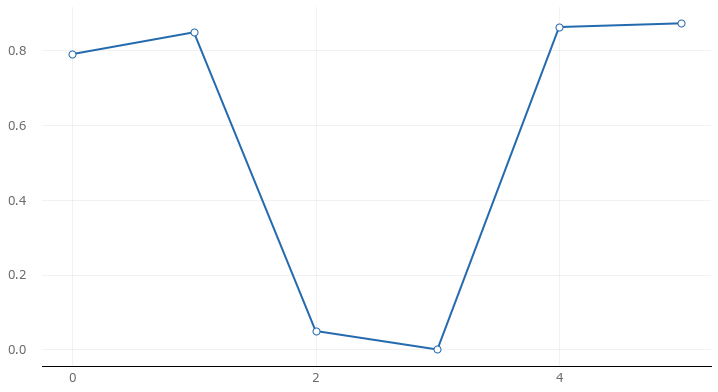

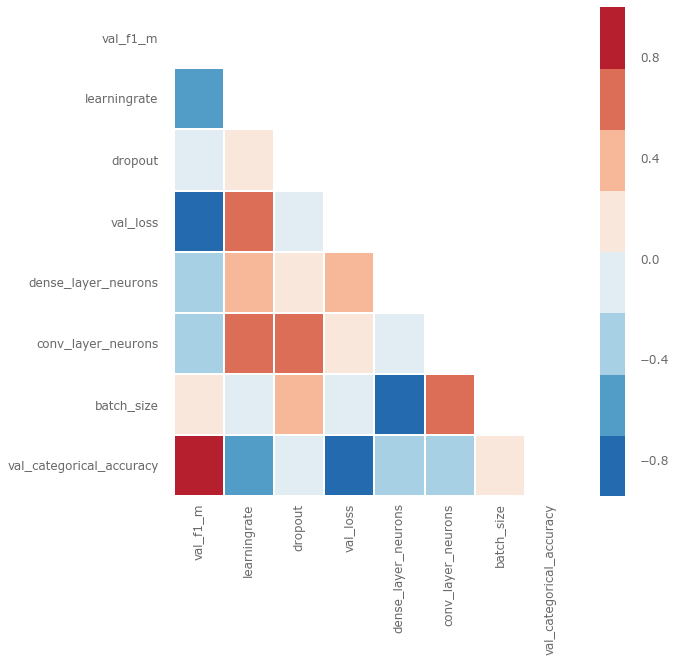

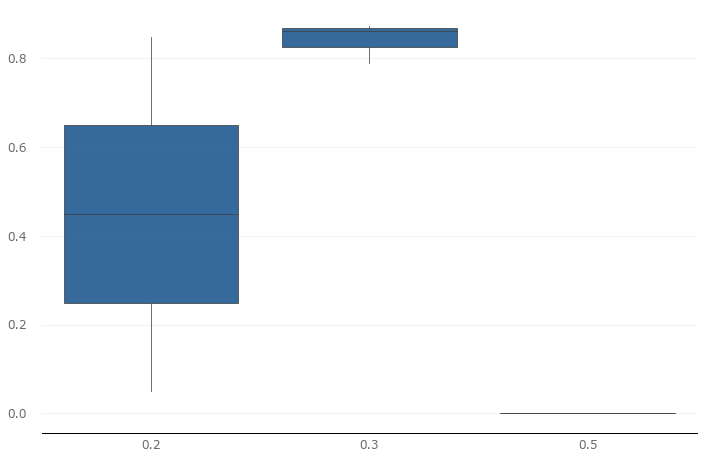

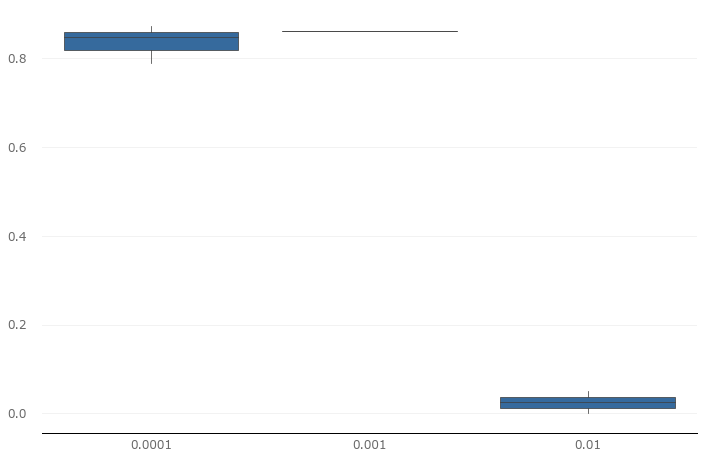

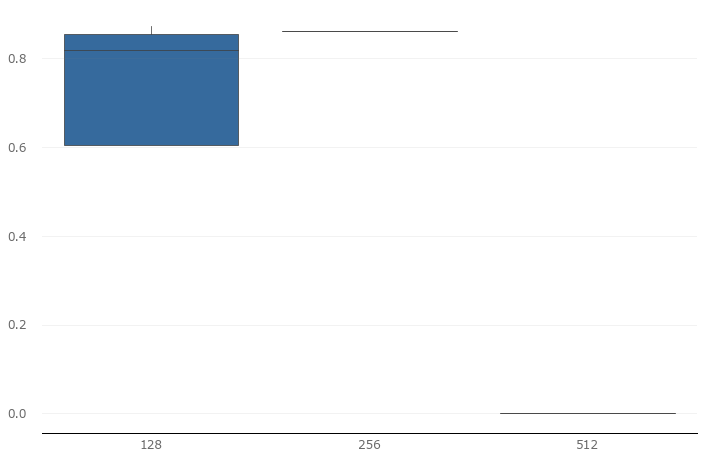

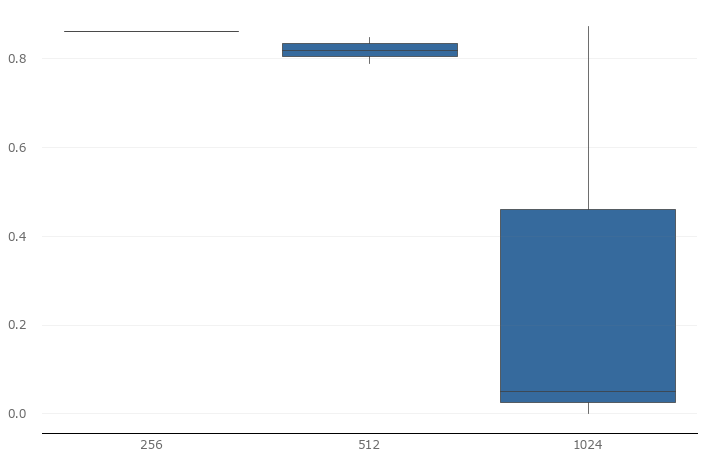

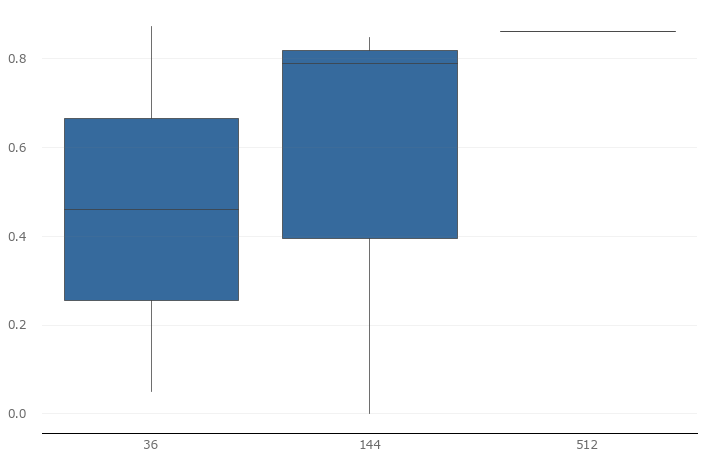

In [57]:
# Evaluating Experiment 1 - Hyperparameter Optimization Initial

evaluation = e.evaluate(X_test, y_test, model_id=None, folds=5, shuffle=True, metric='val_loss', 
                        asc=True, task='multi_label')
print(evaluation)
analysis = talos.Analyze(h)
table1 = analysis.table('f1_m')
print(table1)
analysis.plot_line(['val_f1_m'])
analysis.plot_corr('val_f1_m', exclude=['duration', 'recall_m', 'precision_m', 'f1_m', 
                                         'loss', 'val_precision_m', 'val_recall_m', 'categorical_accuracy',
                                         'round_epochs', ])
analysis.plot_box('dropout', 'val_f1_m')
analysis.plot_box('learningrate', 'val_f1_m')
analysis.plot_box('conv_layer_neurons', 'val_f1_m')
analysis.plot_box('dense_layer_neurons', 'val_f1_m')
analysis.plot_box('batch_size', 'val_f1_m')

### Experiment 2

In [34]:
# Experiment 2 - Narrowed down parameters
p2 = {'conv_layer_neurons': [128, 256],
     'dense_layer_neurons': [1024],
     'learningrate': [0.0001, 0.001],
     'activation': ['relu', 'swish'],
     'dropout': [0.2, 0.3, 0.5],
     'batch_size': [36]}

h2 = talos.Scan(X_train, y_train, model=conv_model, params=p2, fraction_limit=0.5, print_params=True,
              experiment_name='2', reduction_metric='val_loss', minimize_loss=True)
e2 = talos.Evaluate(h2)



  0%|                                                                                           | 0/12 [00:00<?, ?it/s]

{'activation': 'swish', 'batch_size': 36, 'conv_layer_neurons': 128, 'dense_layer_neurons': 1024, 'dropout': 0.3, 'learningrate': 0.0001}
Epoch 1/5


 71/977 [=>............................] - ETA: 14:18 - loss: 18.1853 - categorical_accuracy: 0.1389 - f1_m: 0.1389 - precision_m: 0.1389 - recall_m: 0.13 - ETA: 3:07 - loss: 16.5174 - categorical_accuracy: 0.1736 - f1_m: 0.1736 - precision_m: 0.1736 - recall_m: 0.1736 - ETA: 2:51 - loss: 15.6796 - categorical_accuracy: 0.1806 - f1_m: 0.1808 - precision_m: 0.1811 - recall_m: 0.180 - ETA: 2:45 - loss: 14.9944 - categorical_accuracy: 0.1875 - f1_m: 0.1881 - precision_m: 0.1886 - recall_m: 0.187 - ETA: 2:48 - loss: 14.3489 - categorical_accuracy: 0.1933 - f1_m: 0.1945 - precision_m: 0.1956 - recall_m: 0.193 - ETA: 2:47 - loss: 13.8724 - categorical_accuracy: 0.1981 - f1_m: 0.1995 - precision_m: 0.2010 - recall_m: 0.198 - ETA: 2:48 - loss: 13.4830 - categorical_accuracy: 0.1999 - f1_m: 0.2015 - precision_m: 0.2031 - recall_m: 0.199 - ETA: 2:51 - loss: 13.1424 - categorical_accuracy: 0.2022 - f1_m: 0.2039 - precision_m: 0.2057 - recall_m: 0.202 - ETA: 2:53 - loss: 12.8489 - categorical_accu

217/977 [=====>........................] - ETA: 2:46 - loss: 5.8539 - categorical_accuracy: 0.2751 - f1_m: 0.2646 - precision_m: 0.2792 - recall_m: 0.25 - ETA: 2:46 - loss: 5.8377 - categorical_accuracy: 0.2754 - f1_m: 0.2647 - precision_m: 0.2794 - recall_m: 0.25 - ETA: 2:46 - loss: 5.8216 - categorical_accuracy: 0.2756 - f1_m: 0.2649 - precision_m: 0.2797 - recall_m: 0.25 - ETA: 2:46 - loss: 5.8057 - categorical_accuracy: 0.2759 - f1_m: 0.2650 - precision_m: 0.2800 - recall_m: 0.25 - ETA: 2:46 - loss: 5.7899 - categorical_accuracy: 0.2762 - f1_m: 0.2652 - precision_m: 0.2802 - recall_m: 0.25 - ETA: 2:45 - loss: 5.7742 - categorical_accuracy: 0.2765 - f1_m: 0.2654 - precision_m: 0.2805 - recall_m: 0.25 - ETA: 2:45 - loss: 5.7587 - categorical_accuracy: 0.2768 - f1_m: 0.2655 - precision_m: 0.2808 - recall_m: 0.25 - ETA: 2:45 - loss: 5.7433 - categorical_accuracy: 0.2770 - f1_m: 0.2657 - precision_m: 0.2811 - recall_m: 0.25 - ETA: 2:44 - loss: 5.7280 - categorical_accuracy: 0.2773 - f1_

290/977 [=======>......................] - ETA: 2:29 - loss: 4.9449 - categorical_accuracy: 0.2925 - f1_m: 0.2744 - precision_m: 0.2974 - recall_m: 0.25 - ETA: 2:29 - loss: 4.9354 - categorical_accuracy: 0.2927 - f1_m: 0.2745 - precision_m: 0.2976 - recall_m: 0.25 - ETA: 2:28 - loss: 4.9259 - categorical_accuracy: 0.2929 - f1_m: 0.2746 - precision_m: 0.2979 - recall_m: 0.25 - ETA: 2:28 - loss: 4.9164 - categorical_accuracy: 0.2931 - f1_m: 0.2747 - precision_m: 0.2981 - recall_m: 0.25 - ETA: 2:28 - loss: 4.9071 - categorical_accuracy: 0.2933 - f1_m: 0.2748 - precision_m: 0.2983 - recall_m: 0.25 - ETA: 2:28 - loss: 4.8977 - categorical_accuracy: 0.2934 - f1_m: 0.2749 - precision_m: 0.2985 - recall_m: 0.25 - ETA: 2:27 - loss: 4.8885 - categorical_accuracy: 0.2936 - f1_m: 0.2750 - precision_m: 0.2987 - recall_m: 0.25 - ETA: 2:27 - loss: 4.8793 - categorical_accuracy: 0.2938 - f1_m: 0.2751 - precision_m: 0.2989 - recall_m: 0.25 - ETA: 2:27 - loss: 4.8701 - categorical_accuracy: 0.2940 - f1_

363/977 [==========>...................] - ETA: 2:11 - loss: 4.3702 - categorical_accuracy: 0.3064 - f1_m: 0.2810 - precision_m: 0.3126 - recall_m: 0.25 - ETA: 2:11 - loss: 4.3637 - categorical_accuracy: 0.3066 - f1_m: 0.2811 - precision_m: 0.3128 - recall_m: 0.25 - ETA: 2:10 - loss: 4.3573 - categorical_accuracy: 0.3068 - f1_m: 0.2811 - precision_m: 0.3130 - recall_m: 0.25 - ETA: 2:10 - loss: 4.3509 - categorical_accuracy: 0.3070 - f1_m: 0.2812 - precision_m: 0.3133 - recall_m: 0.25 - ETA: 2:10 - loss: 4.3445 - categorical_accuracy: 0.3072 - f1_m: 0.2813 - precision_m: 0.3135 - recall_m: 0.25 - ETA: 2:10 - loss: 4.3381 - categorical_accuracy: 0.3074 - f1_m: 0.2814 - precision_m: 0.3137 - recall_m: 0.25 - ETA: 2:09 - loss: 4.3318 - categorical_accuracy: 0.3075 - f1_m: 0.2815 - precision_m: 0.3139 - recall_m: 0.25 - ETA: 2:09 - loss: 4.3255 - categorical_accuracy: 0.3077 - f1_m: 0.2816 - precision_m: 0.3141 - recall_m: 0.25 - ETA: 2:09 - loss: 4.3193 - categorical_accuracy: 0.3079 - f1_

436/977 [============>.................] - ETA: 1:55 - loss: 3.9648 - categorical_accuracy: 0.3199 - f1_m: 0.2877 - precision_m: 0.3280 - recall_m: 0.26 - ETA: 1:54 - loss: 3.9600 - categorical_accuracy: 0.3200 - f1_m: 0.2878 - precision_m: 0.3283 - recall_m: 0.26 - ETA: 1:54 - loss: 3.9553 - categorical_accuracy: 0.3202 - f1_m: 0.2879 - precision_m: 0.3285 - recall_m: 0.26 - ETA: 1:54 - loss: 3.9506 - categorical_accuracy: 0.3204 - f1_m: 0.2880 - precision_m: 0.3287 - recall_m: 0.26 - ETA: 1:54 - loss: 3.9459 - categorical_accuracy: 0.3206 - f1_m: 0.2881 - precision_m: 0.3289 - recall_m: 0.26 - ETA: 1:54 - loss: 3.9412 - categorical_accuracy: 0.3208 - f1_m: 0.2882 - precision_m: 0.3291 - recall_m: 0.26 - ETA: 1:53 - loss: 3.9365 - categorical_accuracy: 0.3209 - f1_m: 0.2883 - precision_m: 0.3293 - recall_m: 0.26 - ETA: 1:53 - loss: 3.9319 - categorical_accuracy: 0.3211 - f1_m: 0.2884 - precision_m: 0.3296 - recall_m: 0.26 - ETA: 1:53 - loss: 3.9272 - categorical_accuracy: 0.3213 - f1_

509/977 [==============>...............] - ETA: 1:40 - loss: 3.6592 - categorical_accuracy: 0.3328 - f1_m: 0.2956 - precision_m: 0.3438 - recall_m: 0.26 - ETA: 1:40 - loss: 3.6555 - categorical_accuracy: 0.3329 - f1_m: 0.2957 - precision_m: 0.3441 - recall_m: 0.26 - ETA: 1:40 - loss: 3.6518 - categorical_accuracy: 0.3331 - f1_m: 0.2958 - precision_m: 0.3443 - recall_m: 0.26 - ETA: 1:39 - loss: 3.6482 - categorical_accuracy: 0.3333 - f1_m: 0.2959 - precision_m: 0.3445 - recall_m: 0.26 - ETA: 1:39 - loss: 3.6445 - categorical_accuracy: 0.3335 - f1_m: 0.2960 - precision_m: 0.3447 - recall_m: 0.26 - ETA: 1:39 - loss: 3.6409 - categorical_accuracy: 0.3336 - f1_m: 0.2961 - precision_m: 0.3449 - recall_m: 0.26 - ETA: 1:39 - loss: 3.6373 - categorical_accuracy: 0.3338 - f1_m: 0.2962 - precision_m: 0.3451 - recall_m: 0.26 - ETA: 1:39 - loss: 3.6336 - categorical_accuracy: 0.3340 - f1_m: 0.2964 - precision_m: 0.3454 - recall_m: 0.26 - ETA: 1:38 - loss: 3.6301 - categorical_accuracy: 0.3341 - f1_

582/977 [================>.............] - ETA: 1:26 - loss: 3.4182 - categorical_accuracy: 0.3450 - f1_m: 0.3039 - precision_m: 0.3591 - recall_m: 0.26 - ETA: 1:26 - loss: 3.4153 - categorical_accuracy: 0.3452 - f1_m: 0.3040 - precision_m: 0.3593 - recall_m: 0.26 - ETA: 1:26 - loss: 3.4123 - categorical_accuracy: 0.3454 - f1_m: 0.3041 - precision_m: 0.3595 - recall_m: 0.26 - ETA: 1:25 - loss: 3.4094 - categorical_accuracy: 0.3455 - f1_m: 0.3042 - precision_m: 0.3597 - recall_m: 0.26 - ETA: 1:25 - loss: 3.4065 - categorical_accuracy: 0.3457 - f1_m: 0.3044 - precision_m: 0.3599 - recall_m: 0.26 - ETA: 1:25 - loss: 3.4035 - categorical_accuracy: 0.3459 - f1_m: 0.3045 - precision_m: 0.3601 - recall_m: 0.26 - ETA: 1:25 - loss: 3.4006 - categorical_accuracy: 0.3460 - f1_m: 0.3046 - precision_m: 0.3603 - recall_m: 0.26 - ETA: 1:25 - loss: 3.3977 - categorical_accuracy: 0.3462 - f1_m: 0.3047 - precision_m: 0.3605 - recall_m: 0.26 - ETA: 1:24 - loss: 3.3948 - categorical_accuracy: 0.3463 - f1_

655/977 [===================>..........] - ETA: 1:12 - loss: 3.2220 - categorical_accuracy: 0.3564 - f1_m: 0.3121 - precision_m: 0.3734 - recall_m: 0.27 - ETA: 1:12 - loss: 3.2195 - categorical_accuracy: 0.3565 - f1_m: 0.3122 - precision_m: 0.3736 - recall_m: 0.27 - ETA: 1:12 - loss: 3.2171 - categorical_accuracy: 0.3567 - f1_m: 0.3123 - precision_m: 0.3738 - recall_m: 0.27 - ETA: 1:12 - loss: 3.2147 - categorical_accuracy: 0.3568 - f1_m: 0.3124 - precision_m: 0.3740 - recall_m: 0.27 - ETA: 1:12 - loss: 3.2122 - categorical_accuracy: 0.3570 - f1_m: 0.3125 - precision_m: 0.3742 - recall_m: 0.27 - ETA: 1:11 - loss: 3.2098 - categorical_accuracy: 0.3571 - f1_m: 0.3126 - precision_m: 0.3744 - recall_m: 0.27 - ETA: 1:11 - loss: 3.2074 - categorical_accuracy: 0.3573 - f1_m: 0.3128 - precision_m: 0.3746 - recall_m: 0.27 - ETA: 1:11 - loss: 3.2050 - categorical_accuracy: 0.3574 - f1_m: 0.3129 - precision_m: 0.3748 - recall_m: 0.27 - ETA: 1:11 - loss: 3.2026 - categorical_accuracy: 0.3576 - f1_

728/977 [=====================>........] - ETA: 59s - loss: 3.0576 - categorical_accuracy: 0.3671 - f1_m: 0.3204 - precision_m: 0.3871 - recall_m: 0.278 - ETA: 59s - loss: 3.0556 - categorical_accuracy: 0.3672 - f1_m: 0.3206 - precision_m: 0.3872 - recall_m: 0.278 - ETA: 59s - loss: 3.0535 - categorical_accuracy: 0.3674 - f1_m: 0.3207 - precision_m: 0.3874 - recall_m: 0.278 - ETA: 59s - loss: 3.0514 - categorical_accuracy: 0.3675 - f1_m: 0.3208 - precision_m: 0.3876 - recall_m: 0.278 - ETA: 58s - loss: 3.0494 - categorical_accuracy: 0.3677 - f1_m: 0.3209 - precision_m: 0.3878 - recall_m: 0.279 - ETA: 58s - loss: 3.0473 - categorical_accuracy: 0.3678 - f1_m: 0.3210 - precision_m: 0.3880 - recall_m: 0.279 - ETA: 58s - loss: 3.0453 - categorical_accuracy: 0.3680 - f1_m: 0.3211 - precision_m: 0.3881 - recall_m: 0.279 - ETA: 58s - loss: 3.0432 - categorical_accuracy: 0.3681 - f1_m: 0.3213 - precision_m: 0.3883 - recall_m: 0.279 - ETA: 58s - loss: 3.0412 - categorical_accuracy: 0.3682 - f1_m

801/977 [=======================>......] - ETA: 46s - loss: 2.9172 - categorical_accuracy: 0.3773 - f1_m: 0.3290 - precision_m: 0.3999 - recall_m: 0.284 - ETA: 46s - loss: 2.9155 - categorical_accuracy: 0.3774 - f1_m: 0.3291 - precision_m: 0.4001 - recall_m: 0.284 - ETA: 45s - loss: 2.9137 - categorical_accuracy: 0.3775 - f1_m: 0.3292 - precision_m: 0.4003 - recall_m: 0.284 - ETA: 45s - loss: 2.9119 - categorical_accuracy: 0.3777 - f1_m: 0.3294 - precision_m: 0.4005 - recall_m: 0.285 - ETA: 45s - loss: 2.9101 - categorical_accuracy: 0.3778 - f1_m: 0.3295 - precision_m: 0.4006 - recall_m: 0.285 - ETA: 45s - loss: 2.9084 - categorical_accuracy: 0.3779 - f1_m: 0.3296 - precision_m: 0.4008 - recall_m: 0.285 - ETA: 45s - loss: 2.9066 - categorical_accuracy: 0.3781 - f1_m: 0.3297 - precision_m: 0.4010 - recall_m: 0.285 - ETA: 44s - loss: 2.9048 - categorical_accuracy: 0.3782 - f1_m: 0.3298 - precision_m: 0.4011 - recall_m: 0.285 - ETA: 44s - loss: 2.9031 - categorical_accuracy: 0.3784 - f1_m

874/977 [=========================>....] - ETA: 32s - loss: 2.7954 - categorical_accuracy: 0.3869 - f1_m: 0.3377 - precision_m: 0.4121 - recall_m: 0.291 - ETA: 32s - loss: 2.7939 - categorical_accuracy: 0.3871 - f1_m: 0.3378 - precision_m: 0.4123 - recall_m: 0.291 - ETA: 32s - loss: 2.7923 - categorical_accuracy: 0.3872 - f1_m: 0.3379 - precision_m: 0.4124 - recall_m: 0.291 - ETA: 32s - loss: 2.7908 - categorical_accuracy: 0.3873 - f1_m: 0.3381 - precision_m: 0.4126 - recall_m: 0.291 - ETA: 31s - loss: 2.7892 - categorical_accuracy: 0.3875 - f1_m: 0.3382 - precision_m: 0.4128 - recall_m: 0.291 - ETA: 31s - loss: 2.7877 - categorical_accuracy: 0.3876 - f1_m: 0.3383 - precision_m: 0.4129 - recall_m: 0.291 - ETA: 31s - loss: 2.7861 - categorical_accuracy: 0.3877 - f1_m: 0.3384 - precision_m: 0.4131 - recall_m: 0.291 - ETA: 31s - loss: 2.7846 - categorical_accuracy: 0.3878 - f1_m: 0.3385 - precision_m: 0.4132 - recall_m: 0.291 - ETA: 31s - loss: 2.7831 - categorical_accuracy: 0.3880 - f1_m

948/977 [============================>.] - ETA: 18s - loss: 2.6885 - categorical_accuracy: 0.3961 - f1_m: 0.3463 - precision_m: 0.4236 - recall_m: 0.298 - ETA: 18s - loss: 2.6871 - categorical_accuracy: 0.3963 - f1_m: 0.3465 - precision_m: 0.4237 - recall_m: 0.298 - ETA: 18s - loss: 2.6857 - categorical_accuracy: 0.3964 - f1_m: 0.3466 - precision_m: 0.4239 - recall_m: 0.298 - ETA: 18s - loss: 2.6844 - categorical_accuracy: 0.3965 - f1_m: 0.3467 - precision_m: 0.4240 - recall_m: 0.298 - ETA: 18s - loss: 2.6830 - categorical_accuracy: 0.3966 - f1_m: 0.3468 - precision_m: 0.4242 - recall_m: 0.298 - ETA: 17s - loss: 2.6816 - categorical_accuracy: 0.3968 - f1_m: 0.3469 - precision_m: 0.4243 - recall_m: 0.298 - ETA: 17s - loss: 2.6803 - categorical_accuracy: 0.3969 - f1_m: 0.3471 - precision_m: 0.4245 - recall_m: 0.298 - ETA: 17s - loss: 2.6789 - categorical_accuracy: 0.3970 - f1_m: 0.3472 - precision_m: 0.4246 - recall_m: 0.298 - ETA: 17s - loss: 2.6775 - categorical_accuracy: 0.3971 - f1_m

977/977 [==============================] - ETA: 5s - loss: 2.5923 - categorical_accuracy: 0.4051 - f1_m: 0.3550 - precision_m: 0.4345 - recall_m: 0.30 - ETA: 4s - loss: 2.5910 - categorical_accuracy: 0.4052 - f1_m: 0.3551 - precision_m: 0.4347 - recall_m: 0.30 - ETA: 4s - loss: 2.5898 - categorical_accuracy: 0.4053 - f1_m: 0.3552 - precision_m: 0.4348 - recall_m: 0.30 - ETA: 4s - loss: 2.5886 - categorical_accuracy: 0.4054 - f1_m: 0.3553 - precision_m: 0.4350 - recall_m: 0.30 - ETA: 4s - loss: 2.5874 - categorical_accuracy: 0.4055 - f1_m: 0.3554 - precision_m: 0.4351 - recall_m: 0.30 - ETA: 4s - loss: 2.5861 - categorical_accuracy: 0.4056 - f1_m: 0.3556 - precision_m: 0.4353 - recall_m: 0.30 - ETA: 4s - loss: 2.5849 - categorical_accuracy: 0.4058 - f1_m: 0.3557 - precision_m: 0.4354 - recall_m: 0.30 - ETA: 3s - loss: 2.5837 - categorical_accuracy: 0.4059 - f1_m: 0.3558 - precision_m: 0.4356 - recall_m: 0.30 - ETA: 3s - loss: 2.5825 - categorical_accuracy: 0.4060 - f1_m: 0.3559 - precis

 73/977 [=>............................] - ETA: 2:29 - loss: 0.7418 - categorical_accuracy: 0.6667 - f1_m: 0.6061 - precision_m: 0.6667 - recall_m: 0.55 - ETA: 2:28 - loss: 0.7489 - categorical_accuracy: 0.6806 - f1_m: 0.6158 - precision_m: 0.6923 - recall_m: 0.55 - ETA: 2:28 - loss: 0.7701 - categorical_accuracy: 0.6728 - f1_m: 0.6084 - precision_m: 0.6836 - recall_m: 0.54 - ETA: 2:31 - loss: 0.7844 - categorical_accuracy: 0.6748 - f1_m: 0.6079 - precision_m: 0.6857 - recall_m: 0.54 - ETA: 2:30 - loss: 0.8107 - categorical_accuracy: 0.6676 - f1_m: 0.6028 - precision_m: 0.6806 - recall_m: 0.54 - ETA: 2:32 - loss: 0.8232 - categorical_accuracy: 0.6628 - f1_m: 0.6004 - precision_m: 0.6763 - recall_m: 0.54 - ETA: 2:33 - loss: 0.8277 - categorical_accuracy: 0.6611 - f1_m: 0.6013 - precision_m: 0.6757 - recall_m: 0.54 - ETA: 2:33 - loss: 0.8276 - categorical_accuracy: 0.6618 - f1_m: 0.6035 - precision_m: 0.6764 - recall_m: 0.54 - ETA: 2:33 - loss: 0.8265 - categorical_accuracy: 0.6623 - f1_

219/977 [=====>........................] - ETA: 2:32 - loss: 0.7606 - categorical_accuracy: 0.6724 - f1_m: 0.6519 - precision_m: 0.7253 - recall_m: 0.59 - ETA: 2:32 - loss: 0.7603 - categorical_accuracy: 0.6725 - f1_m: 0.6520 - precision_m: 0.7254 - recall_m: 0.59 - ETA: 2:32 - loss: 0.7601 - categorical_accuracy: 0.6726 - f1_m: 0.6521 - precision_m: 0.7255 - recall_m: 0.59 - ETA: 2:31 - loss: 0.7598 - categorical_accuracy: 0.6727 - f1_m: 0.6522 - precision_m: 0.7256 - recall_m: 0.59 - ETA: 2:31 - loss: 0.7595 - categorical_accuracy: 0.6728 - f1_m: 0.6524 - precision_m: 0.7257 - recall_m: 0.59 - ETA: 2:31 - loss: 0.7593 - categorical_accuracy: 0.6729 - f1_m: 0.6525 - precision_m: 0.7258 - recall_m: 0.59 - ETA: 2:31 - loss: 0.7590 - categorical_accuracy: 0.6730 - f1_m: 0.6526 - precision_m: 0.7259 - recall_m: 0.59 - ETA: 2:30 - loss: 0.7587 - categorical_accuracy: 0.6731 - f1_m: 0.6527 - precision_m: 0.7260 - recall_m: 0.59 - ETA: 2:30 - loss: 0.7585 - categorical_accuracy: 0.6733 - f1_

292/977 [=======>......................] - ETA: 2:14 - loss: 0.7441 - categorical_accuracy: 0.6791 - f1_m: 0.6594 - precision_m: 0.7316 - recall_m: 0.60 - ETA: 2:14 - loss: 0.7439 - categorical_accuracy: 0.6792 - f1_m: 0.6595 - precision_m: 0.7317 - recall_m: 0.60 - ETA: 2:13 - loss: 0.7437 - categorical_accuracy: 0.6792 - f1_m: 0.6596 - precision_m: 0.7318 - recall_m: 0.60 - ETA: 2:13 - loss: 0.7435 - categorical_accuracy: 0.6793 - f1_m: 0.6597 - precision_m: 0.7318 - recall_m: 0.60 - ETA: 2:13 - loss: 0.7433 - categorical_accuracy: 0.6794 - f1_m: 0.6598 - precision_m: 0.7319 - recall_m: 0.60 - ETA: 2:13 - loss: 0.7431 - categorical_accuracy: 0.6795 - f1_m: 0.6599 - precision_m: 0.7320 - recall_m: 0.60 - ETA: 2:12 - loss: 0.7429 - categorical_accuracy: 0.6796 - f1_m: 0.6600 - precision_m: 0.7321 - recall_m: 0.60 - ETA: 2:12 - loss: 0.7428 - categorical_accuracy: 0.6796 - f1_m: 0.6601 - precision_m: 0.7321 - recall_m: 0.60 - ETA: 2:12 - loss: 0.7426 - categorical_accuracy: 0.6797 - f1_

365/977 [==========>...................] - ETA: 1:58 - loss: 0.7311 - categorical_accuracy: 0.6846 - f1_m: 0.6659 - precision_m: 0.7365 - recall_m: 0.60 - ETA: 1:58 - loss: 0.7309 - categorical_accuracy: 0.6847 - f1_m: 0.6660 - precision_m: 0.7366 - recall_m: 0.60 - ETA: 1:57 - loss: 0.7307 - categorical_accuracy: 0.6848 - f1_m: 0.6661 - precision_m: 0.7366 - recall_m: 0.60 - ETA: 1:57 - loss: 0.7306 - categorical_accuracy: 0.6848 - f1_m: 0.6662 - precision_m: 0.7367 - recall_m: 0.60 - ETA: 1:57 - loss: 0.7304 - categorical_accuracy: 0.6849 - f1_m: 0.6663 - precision_m: 0.7368 - recall_m: 0.60 - ETA: 1:57 - loss: 0.7303 - categorical_accuracy: 0.6850 - f1_m: 0.6663 - precision_m: 0.7368 - recall_m: 0.61 - ETA: 1:57 - loss: 0.7301 - categorical_accuracy: 0.6851 - f1_m: 0.6664 - precision_m: 0.7369 - recall_m: 0.61 - ETA: 1:56 - loss: 0.7299 - categorical_accuracy: 0.6851 - f1_m: 0.6665 - precision_m: 0.7369 - recall_m: 0.61 - ETA: 1:56 - loss: 0.7298 - categorical_accuracy: 0.6852 - f1_

438/977 [============>.................] - ETA: 1:44 - loss: 0.7207 - categorical_accuracy: 0.6894 - f1_m: 0.6714 - precision_m: 0.7403 - recall_m: 0.61 - ETA: 1:43 - loss: 0.7206 - categorical_accuracy: 0.6894 - f1_m: 0.6714 - precision_m: 0.7404 - recall_m: 0.61 - ETA: 1:43 - loss: 0.7205 - categorical_accuracy: 0.6895 - f1_m: 0.6715 - precision_m: 0.7404 - recall_m: 0.61 - ETA: 1:43 - loss: 0.7203 - categorical_accuracy: 0.6896 - f1_m: 0.6716 - precision_m: 0.7405 - recall_m: 0.61 - ETA: 1:43 - loss: 0.7202 - categorical_accuracy: 0.6896 - f1_m: 0.6716 - precision_m: 0.7405 - recall_m: 0.61 - ETA: 1:43 - loss: 0.7201 - categorical_accuracy: 0.6897 - f1_m: 0.6717 - precision_m: 0.7406 - recall_m: 0.61 - ETA: 1:43 - loss: 0.7199 - categorical_accuracy: 0.6897 - f1_m: 0.6718 - precision_m: 0.7406 - recall_m: 0.61 - ETA: 1:42 - loss: 0.7198 - categorical_accuracy: 0.6898 - f1_m: 0.6718 - precision_m: 0.7407 - recall_m: 0.61 - ETA: 1:42 - loss: 0.7197 - categorical_accuracy: 0.6899 - f1_

511/977 [==============>...............] - ETA: 1:30 - loss: 0.7112 - categorical_accuracy: 0.6935 - f1_m: 0.6761 - precision_m: 0.7436 - recall_m: 0.62 - ETA: 1:30 - loss: 0.7111 - categorical_accuracy: 0.6936 - f1_m: 0.6762 - precision_m: 0.7436 - recall_m: 0.62 - ETA: 1:30 - loss: 0.7110 - categorical_accuracy: 0.6936 - f1_m: 0.6762 - precision_m: 0.7437 - recall_m: 0.62 - ETA: 1:30 - loss: 0.7109 - categorical_accuracy: 0.6937 - f1_m: 0.6763 - precision_m: 0.7437 - recall_m: 0.62 - ETA: 1:30 - loss: 0.7107 - categorical_accuracy: 0.6937 - f1_m: 0.6763 - precision_m: 0.7438 - recall_m: 0.62 - ETA: 1:30 - loss: 0.7106 - categorical_accuracy: 0.6938 - f1_m: 0.6764 - precision_m: 0.7438 - recall_m: 0.62 - ETA: 1:29 - loss: 0.7105 - categorical_accuracy: 0.6938 - f1_m: 0.6765 - precision_m: 0.7438 - recall_m: 0.62 - ETA: 1:29 - loss: 0.7104 - categorical_accuracy: 0.6939 - f1_m: 0.6765 - precision_m: 0.7439 - recall_m: 0.62 - ETA: 1:29 - loss: 0.7103 - categorical_accuracy: 0.6939 - f1_

584/977 [================>.............] - ETA: 1:19 - loss: 0.7029 - categorical_accuracy: 0.6969 - f1_m: 0.6801 - precision_m: 0.7463 - recall_m: 0.62 - ETA: 1:19 - loss: 0.7028 - categorical_accuracy: 0.6969 - f1_m: 0.6801 - precision_m: 0.7463 - recall_m: 0.62 - ETA: 1:19 - loss: 0.7027 - categorical_accuracy: 0.6970 - f1_m: 0.6802 - precision_m: 0.7463 - recall_m: 0.62 - ETA: 1:19 - loss: 0.7026 - categorical_accuracy: 0.6970 - f1_m: 0.6802 - precision_m: 0.7464 - recall_m: 0.62 - ETA: 1:18 - loss: 0.7025 - categorical_accuracy: 0.6971 - f1_m: 0.6803 - precision_m: 0.7464 - recall_m: 0.62 - ETA: 1:18 - loss: 0.7023 - categorical_accuracy: 0.6971 - f1_m: 0.6803 - precision_m: 0.7464 - recall_m: 0.62 - ETA: 1:18 - loss: 0.7022 - categorical_accuracy: 0.6972 - f1_m: 0.6804 - precision_m: 0.7465 - recall_m: 0.62 - ETA: 1:18 - loss: 0.7021 - categorical_accuracy: 0.6972 - f1_m: 0.6804 - precision_m: 0.7465 - recall_m: 0.62 - ETA: 1:18 - loss: 0.7020 - categorical_accuracy: 0.6972 - f1_

657/977 [===================>..........] - ETA: 1:08 - loss: 0.6954 - categorical_accuracy: 0.6999 - f1_m: 0.6836 - precision_m: 0.7486 - recall_m: 0.63 - ETA: 1:08 - loss: 0.6953 - categorical_accuracy: 0.7000 - f1_m: 0.6837 - precision_m: 0.7486 - recall_m: 0.63 - ETA: 1:08 - loss: 0.6952 - categorical_accuracy: 0.7000 - f1_m: 0.6837 - precision_m: 0.7487 - recall_m: 0.63 - ETA: 1:08 - loss: 0.6951 - categorical_accuracy: 0.7001 - f1_m: 0.6838 - precision_m: 0.7487 - recall_m: 0.63 - ETA: 1:08 - loss: 0.6950 - categorical_accuracy: 0.7001 - f1_m: 0.6838 - precision_m: 0.7487 - recall_m: 0.63 - ETA: 1:07 - loss: 0.6949 - categorical_accuracy: 0.7001 - f1_m: 0.6839 - precision_m: 0.7488 - recall_m: 0.63 - ETA: 1:07 - loss: 0.6949 - categorical_accuracy: 0.7002 - f1_m: 0.6839 - precision_m: 0.7488 - recall_m: 0.63 - ETA: 1:07 - loss: 0.6948 - categorical_accuracy: 0.7002 - f1_m: 0.6839 - precision_m: 0.7488 - recall_m: 0.63 - ETA: 1:07 - loss: 0.6947 - categorical_accuracy: 0.7003 - f1_

730/977 [=====================>........] - ETA: 56s - loss: 0.6887 - categorical_accuracy: 0.7027 - f1_m: 0.6869 - precision_m: 0.7508 - recall_m: 0.635 - ETA: 56s - loss: 0.6886 - categorical_accuracy: 0.7028 - f1_m: 0.6870 - precision_m: 0.7508 - recall_m: 0.635 - ETA: 56s - loss: 0.6885 - categorical_accuracy: 0.7028 - f1_m: 0.6870 - precision_m: 0.7509 - recall_m: 0.635 - ETA: 56s - loss: 0.6884 - categorical_accuracy: 0.7029 - f1_m: 0.6870 - precision_m: 0.7509 - recall_m: 0.635 - ETA: 56s - loss: 0.6883 - categorical_accuracy: 0.7029 - f1_m: 0.6871 - precision_m: 0.7509 - recall_m: 0.635 - ETA: 56s - loss: 0.6882 - categorical_accuracy: 0.7029 - f1_m: 0.6871 - precision_m: 0.7509 - recall_m: 0.635 - ETA: 55s - loss: 0.6881 - categorical_accuracy: 0.7030 - f1_m: 0.6872 - precision_m: 0.7510 - recall_m: 0.635 - ETA: 55s - loss: 0.6880 - categorical_accuracy: 0.7030 - f1_m: 0.6872 - precision_m: 0.7510 - recall_m: 0.635 - ETA: 55s - loss: 0.6879 - categorical_accuracy: 0.7031 - f1_m

803/977 [=======================>......] - ETA: 44s - loss: 0.6823 - categorical_accuracy: 0.7054 - f1_m: 0.6900 - precision_m: 0.7528 - recall_m: 0.638 - ETA: 44s - loss: 0.6823 - categorical_accuracy: 0.7055 - f1_m: 0.6901 - precision_m: 0.7529 - recall_m: 0.638 - ETA: 44s - loss: 0.6822 - categorical_accuracy: 0.7055 - f1_m: 0.6901 - precision_m: 0.7529 - recall_m: 0.639 - ETA: 44s - loss: 0.6821 - categorical_accuracy: 0.7056 - f1_m: 0.6902 - precision_m: 0.7529 - recall_m: 0.639 - ETA: 43s - loss: 0.6820 - categorical_accuracy: 0.7056 - f1_m: 0.6902 - precision_m: 0.7529 - recall_m: 0.639 - ETA: 43s - loss: 0.6819 - categorical_accuracy: 0.7056 - f1_m: 0.6902 - precision_m: 0.7530 - recall_m: 0.639 - ETA: 43s - loss: 0.6819 - categorical_accuracy: 0.7057 - f1_m: 0.6903 - precision_m: 0.7530 - recall_m: 0.639 - ETA: 43s - loss: 0.6818 - categorical_accuracy: 0.7057 - f1_m: 0.6903 - precision_m: 0.7530 - recall_m: 0.639 - ETA: 43s - loss: 0.6817 - categorical_accuracy: 0.7057 - f1_m

876/977 [=========================>....] - ETA: 31s - loss: 0.6767 - categorical_accuracy: 0.7079 - f1_m: 0.6929 - precision_m: 0.7546 - recall_m: 0.642 - ETA: 31s - loss: 0.6767 - categorical_accuracy: 0.7079 - f1_m: 0.6929 - precision_m: 0.7546 - recall_m: 0.642 - ETA: 31s - loss: 0.6766 - categorical_accuracy: 0.7079 - f1_m: 0.6929 - precision_m: 0.7547 - recall_m: 0.642 - ETA: 31s - loss: 0.6765 - categorical_accuracy: 0.7079 - f1_m: 0.6930 - precision_m: 0.7547 - recall_m: 0.642 - ETA: 31s - loss: 0.6765 - categorical_accuracy: 0.7080 - f1_m: 0.6930 - precision_m: 0.7547 - recall_m: 0.642 - ETA: 30s - loss: 0.6764 - categorical_accuracy: 0.7080 - f1_m: 0.6931 - precision_m: 0.7547 - recall_m: 0.642 - ETA: 30s - loss: 0.6763 - categorical_accuracy: 0.7080 - f1_m: 0.6931 - precision_m: 0.7548 - recall_m: 0.642 - ETA: 30s - loss: 0.6762 - categorical_accuracy: 0.7081 - f1_m: 0.6931 - precision_m: 0.7548 - recall_m: 0.642 - ETA: 30s - loss: 0.6762 - categorical_accuracy: 0.7081 - f1_m

950/977 [============================>.] - ETA: 18s - loss: 0.6714 - categorical_accuracy: 0.7101 - f1_m: 0.6955 - precision_m: 0.7563 - recall_m: 0.645 - ETA: 18s - loss: 0.6714 - categorical_accuracy: 0.7101 - f1_m: 0.6955 - precision_m: 0.7563 - recall_m: 0.645 - ETA: 18s - loss: 0.6713 - categorical_accuracy: 0.7101 - f1_m: 0.6956 - precision_m: 0.7563 - recall_m: 0.645 - ETA: 18s - loss: 0.6712 - categorical_accuracy: 0.7102 - f1_m: 0.6956 - precision_m: 0.7564 - recall_m: 0.645 - ETA: 17s - loss: 0.6711 - categorical_accuracy: 0.7102 - f1_m: 0.6956 - precision_m: 0.7564 - recall_m: 0.645 - ETA: 17s - loss: 0.6711 - categorical_accuracy: 0.7102 - f1_m: 0.6957 - precision_m: 0.7564 - recall_m: 0.645 - ETA: 17s - loss: 0.6710 - categorical_accuracy: 0.7103 - f1_m: 0.6957 - precision_m: 0.7564 - recall_m: 0.646 - ETA: 17s - loss: 0.6709 - categorical_accuracy: 0.7103 - f1_m: 0.6958 - precision_m: 0.7564 - recall_m: 0.646 - ETA: 17s - loss: 0.6709 - categorical_accuracy: 0.7103 - f1_m

977/977 [==============================] - ETA: 4s - loss: 0.6661 - categorical_accuracy: 0.7123 - f1_m: 0.6981 - precision_m: 0.7579 - recall_m: 0.64 - ETA: 4s - loss: 0.6661 - categorical_accuracy: 0.7123 - f1_m: 0.6981 - precision_m: 0.7579 - recall_m: 0.64 - ETA: 4s - loss: 0.6660 - categorical_accuracy: 0.7124 - f1_m: 0.6982 - precision_m: 0.7580 - recall_m: 0.64 - ETA: 4s - loss: 0.6659 - categorical_accuracy: 0.7124 - f1_m: 0.6982 - precision_m: 0.7580 - recall_m: 0.64 - ETA: 4s - loss: 0.6659 - categorical_accuracy: 0.7124 - f1_m: 0.6982 - precision_m: 0.7580 - recall_m: 0.64 - ETA: 3s - loss: 0.6658 - categorical_accuracy: 0.7124 - f1_m: 0.6983 - precision_m: 0.7580 - recall_m: 0.64 - ETA: 3s - loss: 0.6657 - categorical_accuracy: 0.7125 - f1_m: 0.6983 - precision_m: 0.7581 - recall_m: 0.64 - ETA: 3s - loss: 0.6656 - categorical_accuracy: 0.7125 - f1_m: 0.6983 - precision_m: 0.7581 - recall_m: 0.64 - ETA: 3s - loss: 0.6656 - categorical_accuracy: 0.7125 - f1_m: 0.6984 - precis

 73/977 [=>............................] - ETA: 3:25 - loss: 0.4444 - categorical_accuracy: 0.7500 - f1_m: 0.7429 - precision_m: 0.7647 - recall_m: 0.72 - ETA: 3:23 - loss: 0.4780 - categorical_accuracy: 0.7569 - f1_m: 0.7362 - precision_m: 0.7671 - recall_m: 0.70 - ETA: 3:13 - loss: 0.4952 - categorical_accuracy: 0.7546 - f1_m: 0.7312 - precision_m: 0.7617 - recall_m: 0.70 - ETA: 3:23 - loss: 0.5295 - categorical_accuracy: 0.7396 - f1_m: 0.7171 - precision_m: 0.7461 - recall_m: 0.69 - ETA: 3:28 - loss: 0.5419 - categorical_accuracy: 0.7350 - f1_m: 0.7143 - precision_m: 0.7418 - recall_m: 0.68 - ETA: 3:30 - loss: 0.5480 - categorical_accuracy: 0.7321 - f1_m: 0.7122 - precision_m: 0.7391 - recall_m: 0.68 - ETA: 3:31 - loss: 0.5492 - categorical_accuracy: 0.7301 - f1_m: 0.7108 - precision_m: 0.7376 - recall_m: 0.68 - ETA: 3:31 - loss: 0.5475 - categorical_accuracy: 0.7304 - f1_m: 0.7119 - precision_m: 0.7389 - recall_m: 0.68 - ETA: 3:32 - loss: 0.5447 - categorical_accuracy: 0.7316 - f1_

219/977 [=====>........................] - ETA: 2:27 - loss: 0.5211 - categorical_accuracy: 0.7571 - f1_m: 0.7505 - precision_m: 0.7789 - recall_m: 0.72 - ETA: 2:27 - loss: 0.5210 - categorical_accuracy: 0.7572 - f1_m: 0.7506 - precision_m: 0.7790 - recall_m: 0.72 - ETA: 2:26 - loss: 0.5209 - categorical_accuracy: 0.7573 - f1_m: 0.7507 - precision_m: 0.7791 - recall_m: 0.72 - ETA: 2:26 - loss: 0.5208 - categorical_accuracy: 0.7574 - f1_m: 0.7508 - precision_m: 0.7792 - recall_m: 0.72 - ETA: 2:26 - loss: 0.5207 - categorical_accuracy: 0.7575 - f1_m: 0.7509 - precision_m: 0.7793 - recall_m: 0.72 - ETA: 2:25 - loss: 0.5206 - categorical_accuracy: 0.7576 - f1_m: 0.7510 - precision_m: 0.7794 - recall_m: 0.72 - ETA: 2:25 - loss: 0.5205 - categorical_accuracy: 0.7577 - f1_m: 0.7511 - precision_m: 0.7795 - recall_m: 0.72 - ETA: 2:25 - loss: 0.5204 - categorical_accuracy: 0.7578 - f1_m: 0.7512 - precision_m: 0.7796 - recall_m: 0.72 - ETA: 2:25 - loss: 0.5203 - categorical_accuracy: 0.7578 - f1_

292/977 [=======>......................] - ETA: 2:12 - loss: 0.5137 - categorical_accuracy: 0.7636 - f1_m: 0.7570 - precision_m: 0.7853 - recall_m: 0.73 - ETA: 2:12 - loss: 0.5136 - categorical_accuracy: 0.7637 - f1_m: 0.7571 - precision_m: 0.7854 - recall_m: 0.73 - ETA: 2:12 - loss: 0.5135 - categorical_accuracy: 0.7638 - f1_m: 0.7571 - precision_m: 0.7855 - recall_m: 0.73 - ETA: 2:12 - loss: 0.5134 - categorical_accuracy: 0.7638 - f1_m: 0.7572 - precision_m: 0.7856 - recall_m: 0.73 - ETA: 2:11 - loss: 0.5134 - categorical_accuracy: 0.7639 - f1_m: 0.7573 - precision_m: 0.7856 - recall_m: 0.73 - ETA: 2:11 - loss: 0.5133 - categorical_accuracy: 0.7640 - f1_m: 0.7574 - precision_m: 0.7857 - recall_m: 0.73 - ETA: 2:11 - loss: 0.5132 - categorical_accuracy: 0.7640 - f1_m: 0.7574 - precision_m: 0.7858 - recall_m: 0.73 - ETA: 2:11 - loss: 0.5131 - categorical_accuracy: 0.7641 - f1_m: 0.7575 - precision_m: 0.7858 - recall_m: 0.73 - ETA: 2:11 - loss: 0.5131 - categorical_accuracy: 0.7642 - f1_

365/977 [==========>...................] - ETA: 1:58 - loss: 0.5089 - categorical_accuracy: 0.7680 - f1_m: 0.7616 - precision_m: 0.7898 - recall_m: 0.73 - ETA: 1:58 - loss: 0.5088 - categorical_accuracy: 0.7680 - f1_m: 0.7616 - precision_m: 0.7899 - recall_m: 0.73 - ETA: 1:58 - loss: 0.5088 - categorical_accuracy: 0.7681 - f1_m: 0.7617 - precision_m: 0.7899 - recall_m: 0.73 - ETA: 1:58 - loss: 0.5087 - categorical_accuracy: 0.7681 - f1_m: 0.7617 - precision_m: 0.7900 - recall_m: 0.73 - ETA: 1:57 - loss: 0.5086 - categorical_accuracy: 0.7682 - f1_m: 0.7618 - precision_m: 0.7900 - recall_m: 0.73 - ETA: 1:57 - loss: 0.5086 - categorical_accuracy: 0.7682 - f1_m: 0.7618 - precision_m: 0.7901 - recall_m: 0.73 - ETA: 1:57 - loss: 0.5085 - categorical_accuracy: 0.7683 - f1_m: 0.7619 - precision_m: 0.7901 - recall_m: 0.73 - ETA: 1:57 - loss: 0.5085 - categorical_accuracy: 0.7683 - f1_m: 0.7619 - precision_m: 0.7902 - recall_m: 0.73 - ETA: 1:57 - loss: 0.5084 - categorical_accuracy: 0.7684 - f1_

438/977 [============>.................] - ETA: 1:45 - loss: 0.5047 - categorical_accuracy: 0.7714 - f1_m: 0.7652 - precision_m: 0.7933 - recall_m: 0.73 - ETA: 1:45 - loss: 0.5047 - categorical_accuracy: 0.7714 - f1_m: 0.7652 - precision_m: 0.7934 - recall_m: 0.73 - ETA: 1:44 - loss: 0.5046 - categorical_accuracy: 0.7714 - f1_m: 0.7652 - precision_m: 0.7934 - recall_m: 0.73 - ETA: 1:44 - loss: 0.5046 - categorical_accuracy: 0.7715 - f1_m: 0.7653 - precision_m: 0.7935 - recall_m: 0.73 - ETA: 1:44 - loss: 0.5045 - categorical_accuracy: 0.7715 - f1_m: 0.7653 - precision_m: 0.7935 - recall_m: 0.73 - ETA: 1:44 - loss: 0.5045 - categorical_accuracy: 0.7715 - f1_m: 0.7654 - precision_m: 0.7935 - recall_m: 0.73 - ETA: 1:44 - loss: 0.5044 - categorical_accuracy: 0.7716 - f1_m: 0.7654 - precision_m: 0.7936 - recall_m: 0.73 - ETA: 1:44 - loss: 0.5044 - categorical_accuracy: 0.7716 - f1_m: 0.7654 - precision_m: 0.7936 - recall_m: 0.73 - ETA: 1:43 - loss: 0.5043 - categorical_accuracy: 0.7717 - f1_

511/977 [==============>...............] - ETA: 1:31 - loss: 0.5011 - categorical_accuracy: 0.7740 - f1_m: 0.7679 - precision_m: 0.7959 - recall_m: 0.74 - ETA: 1:31 - loss: 0.5011 - categorical_accuracy: 0.7740 - f1_m: 0.7679 - precision_m: 0.7959 - recall_m: 0.74 - ETA: 1:31 - loss: 0.5010 - categorical_accuracy: 0.7740 - f1_m: 0.7679 - precision_m: 0.7960 - recall_m: 0.74 - ETA: 1:31 - loss: 0.5010 - categorical_accuracy: 0.7741 - f1_m: 0.7680 - precision_m: 0.7960 - recall_m: 0.74 - ETA: 1:31 - loss: 0.5010 - categorical_accuracy: 0.7741 - f1_m: 0.7680 - precision_m: 0.7960 - recall_m: 0.74 - ETA: 1:30 - loss: 0.5009 - categorical_accuracy: 0.7741 - f1_m: 0.7680 - precision_m: 0.7961 - recall_m: 0.74 - ETA: 1:30 - loss: 0.5009 - categorical_accuracy: 0.7742 - f1_m: 0.7681 - precision_m: 0.7961 - recall_m: 0.74 - ETA: 1:30 - loss: 0.5008 - categorical_accuracy: 0.7742 - f1_m: 0.7681 - precision_m: 0.7961 - recall_m: 0.74 - ETA: 1:30 - loss: 0.5008 - categorical_accuracy: 0.7742 - f1_

584/977 [================>.............] - ETA: 1:18 - loss: 0.4979 - categorical_accuracy: 0.7762 - f1_m: 0.7702 - precision_m: 0.7981 - recall_m: 0.74 - ETA: 1:18 - loss: 0.4978 - categorical_accuracy: 0.7762 - f1_m: 0.7702 - precision_m: 0.7981 - recall_m: 0.74 - ETA: 1:18 - loss: 0.4978 - categorical_accuracy: 0.7763 - f1_m: 0.7703 - precision_m: 0.7981 - recall_m: 0.74 - ETA: 1:18 - loss: 0.4977 - categorical_accuracy: 0.7763 - f1_m: 0.7703 - precision_m: 0.7981 - recall_m: 0.74 - ETA: 1:18 - loss: 0.4977 - categorical_accuracy: 0.7763 - f1_m: 0.7703 - precision_m: 0.7982 - recall_m: 0.74 - ETA: 1:17 - loss: 0.4976 - categorical_accuracy: 0.7763 - f1_m: 0.7703 - precision_m: 0.7982 - recall_m: 0.74 - ETA: 1:17 - loss: 0.4976 - categorical_accuracy: 0.7764 - f1_m: 0.7704 - precision_m: 0.7982 - recall_m: 0.74 - ETA: 1:17 - loss: 0.4976 - categorical_accuracy: 0.7764 - f1_m: 0.7704 - precision_m: 0.7982 - recall_m: 0.74 - ETA: 1:17 - loss: 0.4975 - categorical_accuracy: 0.7764 - f1_

657/977 [===================>..........] - ETA: 1:06 - loss: 0.4951 - categorical_accuracy: 0.7781 - f1_m: 0.7721 - precision_m: 0.7998 - recall_m: 0.74 - ETA: 1:06 - loss: 0.4950 - categorical_accuracy: 0.7781 - f1_m: 0.7722 - precision_m: 0.7998 - recall_m: 0.74 - ETA: 1:05 - loss: 0.4950 - categorical_accuracy: 0.7781 - f1_m: 0.7722 - precision_m: 0.7999 - recall_m: 0.74 - ETA: 1:05 - loss: 0.4950 - categorical_accuracy: 0.7781 - f1_m: 0.7722 - precision_m: 0.7999 - recall_m: 0.74 - ETA: 1:05 - loss: 0.4949 - categorical_accuracy: 0.7782 - f1_m: 0.7722 - precision_m: 0.7999 - recall_m: 0.74 - ETA: 1:05 - loss: 0.4949 - categorical_accuracy: 0.7782 - f1_m: 0.7723 - precision_m: 0.7999 - recall_m: 0.74 - ETA: 1:05 - loss: 0.4948 - categorical_accuracy: 0.7782 - f1_m: 0.7723 - precision_m: 0.7999 - recall_m: 0.74 - ETA: 1:05 - loss: 0.4948 - categorical_accuracy: 0.7782 - f1_m: 0.7723 - precision_m: 0.8000 - recall_m: 0.74 - ETA: 1:04 - loss: 0.4948 - categorical_accuracy: 0.7783 - f1_

730/977 [=====================>........] - ETA: 54s - loss: 0.4926 - categorical_accuracy: 0.7798 - f1_m: 0.7740 - precision_m: 0.8015 - recall_m: 0.749 - ETA: 53s - loss: 0.4926 - categorical_accuracy: 0.7798 - f1_m: 0.7740 - precision_m: 0.8015 - recall_m: 0.749 - ETA: 53s - loss: 0.4925 - categorical_accuracy: 0.7798 - f1_m: 0.7740 - precision_m: 0.8015 - recall_m: 0.749 - ETA: 53s - loss: 0.4925 - categorical_accuracy: 0.7799 - f1_m: 0.7740 - precision_m: 0.8015 - recall_m: 0.749 - ETA: 53s - loss: 0.4925 - categorical_accuracy: 0.7799 - f1_m: 0.7740 - precision_m: 0.8015 - recall_m: 0.749 - ETA: 53s - loss: 0.4924 - categorical_accuracy: 0.7799 - f1_m: 0.7741 - precision_m: 0.8016 - recall_m: 0.749 - ETA: 52s - loss: 0.4924 - categorical_accuracy: 0.7799 - f1_m: 0.7741 - precision_m: 0.8016 - recall_m: 0.749 - ETA: 52s - loss: 0.4924 - categorical_accuracy: 0.7799 - f1_m: 0.7741 - precision_m: 0.8016 - recall_m: 0.749 - ETA: 52s - loss: 0.4924 - categorical_accuracy: 0.7800 - f1_m

803/977 [=======================>......] - ETA: 41s - loss: 0.4903 - categorical_accuracy: 0.7814 - f1_m: 0.7756 - precision_m: 0.8030 - recall_m: 0.750 - ETA: 41s - loss: 0.4903 - categorical_accuracy: 0.7814 - f1_m: 0.7756 - precision_m: 0.8030 - recall_m: 0.750 - ETA: 41s - loss: 0.4902 - categorical_accuracy: 0.7814 - f1_m: 0.7757 - precision_m: 0.8030 - recall_m: 0.750 - ETA: 40s - loss: 0.4902 - categorical_accuracy: 0.7814 - f1_m: 0.7757 - precision_m: 0.8030 - recall_m: 0.750 - ETA: 40s - loss: 0.4902 - categorical_accuracy: 0.7814 - f1_m: 0.7757 - precision_m: 0.8030 - recall_m: 0.750 - ETA: 40s - loss: 0.4901 - categorical_accuracy: 0.7815 - f1_m: 0.7757 - precision_m: 0.8031 - recall_m: 0.750 - ETA: 40s - loss: 0.4901 - categorical_accuracy: 0.7815 - f1_m: 0.7758 - precision_m: 0.8031 - recall_m: 0.750 - ETA: 40s - loss: 0.4901 - categorical_accuracy: 0.7815 - f1_m: 0.7758 - precision_m: 0.8031 - recall_m: 0.750 - ETA: 40s - loss: 0.4901 - categorical_accuracy: 0.7815 - f1_m

876/977 [=========================>....] - ETA: 29s - loss: 0.4881 - categorical_accuracy: 0.7827 - f1_m: 0.7771 - precision_m: 0.8043 - recall_m: 0.752 - ETA: 28s - loss: 0.4880 - categorical_accuracy: 0.7828 - f1_m: 0.7771 - precision_m: 0.8043 - recall_m: 0.752 - ETA: 28s - loss: 0.4880 - categorical_accuracy: 0.7828 - f1_m: 0.7772 - precision_m: 0.8043 - recall_m: 0.752 - ETA: 28s - loss: 0.4880 - categorical_accuracy: 0.7828 - f1_m: 0.7772 - precision_m: 0.8043 - recall_m: 0.752 - ETA: 28s - loss: 0.4880 - categorical_accuracy: 0.7828 - f1_m: 0.7772 - precision_m: 0.8044 - recall_m: 0.752 - ETA: 28s - loss: 0.4879 - categorical_accuracy: 0.7828 - f1_m: 0.7772 - precision_m: 0.8044 - recall_m: 0.752 - ETA: 28s - loss: 0.4879 - categorical_accuracy: 0.7829 - f1_m: 0.7772 - precision_m: 0.8044 - recall_m: 0.752 - ETA: 27s - loss: 0.4879 - categorical_accuracy: 0.7829 - f1_m: 0.7773 - precision_m: 0.8044 - recall_m: 0.752 - ETA: 27s - loss: 0.4879 - categorical_accuracy: 0.7829 - f1_m

950/977 [============================>.] - ETA: 16s - loss: 0.4861 - categorical_accuracy: 0.7840 - f1_m: 0.7785 - precision_m: 0.8055 - recall_m: 0.754 - ETA: 16s - loss: 0.4860 - categorical_accuracy: 0.7840 - f1_m: 0.7785 - precision_m: 0.8055 - recall_m: 0.754 - ETA: 16s - loss: 0.4860 - categorical_accuracy: 0.7841 - f1_m: 0.7785 - precision_m: 0.8055 - recall_m: 0.754 - ETA: 16s - loss: 0.4860 - categorical_accuracy: 0.7841 - f1_m: 0.7786 - precision_m: 0.8055 - recall_m: 0.754 - ETA: 16s - loss: 0.4859 - categorical_accuracy: 0.7841 - f1_m: 0.7786 - precision_m: 0.8056 - recall_m: 0.754 - ETA: 15s - loss: 0.4859 - categorical_accuracy: 0.7841 - f1_m: 0.7786 - precision_m: 0.8056 - recall_m: 0.754 - ETA: 15s - loss: 0.4859 - categorical_accuracy: 0.7841 - f1_m: 0.7786 - precision_m: 0.8056 - recall_m: 0.754 - ETA: 15s - loss: 0.4859 - categorical_accuracy: 0.7841 - f1_m: 0.7786 - precision_m: 0.8056 - recall_m: 0.754 - ETA: 15s - loss: 0.4858 - categorical_accuracy: 0.7842 - f1_m

977/977 [==============================] - ETA: 4s - loss: 0.4841 - categorical_accuracy: 0.7852 - f1_m: 0.7798 - precision_m: 0.8066 - recall_m: 0.75 - ETA: 4s - loss: 0.4841 - categorical_accuracy: 0.7853 - f1_m: 0.7798 - precision_m: 0.8066 - recall_m: 0.75 - ETA: 4s - loss: 0.4840 - categorical_accuracy: 0.7853 - f1_m: 0.7799 - precision_m: 0.8067 - recall_m: 0.75 - ETA: 3s - loss: 0.4840 - categorical_accuracy: 0.7853 - f1_m: 0.7799 - precision_m: 0.8067 - recall_m: 0.75 - ETA: 3s - loss: 0.4840 - categorical_accuracy: 0.7853 - f1_m: 0.7799 - precision_m: 0.8067 - recall_m: 0.75 - ETA: 3s - loss: 0.4840 - categorical_accuracy: 0.7853 - f1_m: 0.7799 - precision_m: 0.8067 - recall_m: 0.75 - ETA: 3s - loss: 0.4839 - categorical_accuracy: 0.7853 - f1_m: 0.7799 - precision_m: 0.8067 - recall_m: 0.75 - ETA: 3s - loss: 0.4839 - categorical_accuracy: 0.7853 - f1_m: 0.7799 - precision_m: 0.8067 - recall_m: 0.75 - ETA: 3s - loss: 0.4839 - categorical_accuracy: 0.7854 - f1_m: 0.7800 - precis

 73/977 [=>............................] - ETA: 2:50 - loss: 0.3489 - categorical_accuracy: 0.8889 - f1_m: 0.8571 - precision_m: 0.8824 - recall_m: 0.83 - ETA: 2:57 - loss: 0.3440 - categorical_accuracy: 0.8819 - f1_m: 0.8530 - precision_m: 0.8815 - recall_m: 0.82 - ETA: 2:57 - loss: 0.3587 - categorical_accuracy: 0.8627 - f1_m: 0.8398 - precision_m: 0.8683 - recall_m: 0.81 - ETA: 2:52 - loss: 0.3509 - categorical_accuracy: 0.8605 - f1_m: 0.8423 - precision_m: 0.8698 - recall_m: 0.81 - ETA: 2:54 - loss: 0.3443 - categorical_accuracy: 0.8606 - f1_m: 0.8447 - precision_m: 0.8712 - recall_m: 0.81 - ETA: 2:54 - loss: 0.3417 - categorical_accuracy: 0.8615 - f1_m: 0.8468 - precision_m: 0.8723 - recall_m: 0.82 - ETA: 2:55 - loss: 0.3406 - categorical_accuracy: 0.8603 - f1_m: 0.8469 - precision_m: 0.8716 - recall_m: 0.82 - ETA: 2:55 - loss: 0.3425 - categorical_accuracy: 0.8582 - f1_m: 0.8458 - precision_m: 0.8698 - recall_m: 0.82 - ETA: 2:55 - loss: 0.3441 - categorical_accuracy: 0.8565 - f1_

219/977 [=====>........................] - ETA: 2:30 - loss: 0.4197 - categorical_accuracy: 0.8201 - f1_m: 0.8192 - precision_m: 0.8395 - recall_m: 0.80 - ETA: 2:30 - loss: 0.4198 - categorical_accuracy: 0.8200 - f1_m: 0.8191 - precision_m: 0.8395 - recall_m: 0.80 - ETA: 2:29 - loss: 0.4198 - categorical_accuracy: 0.8199 - f1_m: 0.8191 - precision_m: 0.8394 - recall_m: 0.80 - ETA: 2:29 - loss: 0.4199 - categorical_accuracy: 0.8199 - f1_m: 0.8190 - precision_m: 0.8394 - recall_m: 0.80 - ETA: 2:29 - loss: 0.4200 - categorical_accuracy: 0.8198 - f1_m: 0.8190 - precision_m: 0.8393 - recall_m: 0.80 - ETA: 2:29 - loss: 0.4200 - categorical_accuracy: 0.8198 - f1_m: 0.8189 - precision_m: 0.8393 - recall_m: 0.80 - ETA: 2:29 - loss: 0.4201 - categorical_accuracy: 0.8197 - f1_m: 0.8189 - precision_m: 0.8392 - recall_m: 0.80 - ETA: 2:28 - loss: 0.4202 - categorical_accuracy: 0.8197 - f1_m: 0.8188 - precision_m: 0.8392 - recall_m: 0.79 - ETA: 2:28 - loss: 0.4202 - categorical_accuracy: 0.8196 - f1_

292/977 [=======>......................] - ETA: 2:14 - loss: 0.4213 - categorical_accuracy: 0.8182 - f1_m: 0.8178 - precision_m: 0.8377 - recall_m: 0.79 - ETA: 2:14 - loss: 0.4213 - categorical_accuracy: 0.8182 - f1_m: 0.8178 - precision_m: 0.8377 - recall_m: 0.79 - ETA: 2:14 - loss: 0.4213 - categorical_accuracy: 0.8182 - f1_m: 0.8178 - precision_m: 0.8377 - recall_m: 0.79 - ETA: 2:14 - loss: 0.4213 - categorical_accuracy: 0.8182 - f1_m: 0.8178 - precision_m: 0.8377 - recall_m: 0.79 - ETA: 2:14 - loss: 0.4213 - categorical_accuracy: 0.8182 - f1_m: 0.8178 - precision_m: 0.8377 - recall_m: 0.79 - ETA: 2:13 - loss: 0.4213 - categorical_accuracy: 0.8182 - f1_m: 0.8177 - precision_m: 0.8377 - recall_m: 0.79 - ETA: 2:13 - loss: 0.4213 - categorical_accuracy: 0.8182 - f1_m: 0.8177 - precision_m: 0.8377 - recall_m: 0.79 - ETA: 2:13 - loss: 0.4213 - categorical_accuracy: 0.8182 - f1_m: 0.8177 - precision_m: 0.8377 - recall_m: 0.79 - ETA: 2:13 - loss: 0.4213 - categorical_accuracy: 0.8182 - f1_

365/977 [==========>...................] - ETA: 2:00 - loss: 0.4213 - categorical_accuracy: 0.8184 - f1_m: 0.8181 - precision_m: 0.8378 - recall_m: 0.79 - ETA: 2:00 - loss: 0.4213 - categorical_accuracy: 0.8184 - f1_m: 0.8181 - precision_m: 0.8378 - recall_m: 0.79 - ETA: 2:00 - loss: 0.4213 - categorical_accuracy: 0.8185 - f1_m: 0.8181 - precision_m: 0.8378 - recall_m: 0.79 - ETA: 2:00 - loss: 0.4212 - categorical_accuracy: 0.8185 - f1_m: 0.8181 - precision_m: 0.8378 - recall_m: 0.79 - ETA: 2:00 - loss: 0.4212 - categorical_accuracy: 0.8185 - f1_m: 0.8181 - precision_m: 0.8378 - recall_m: 0.79 - ETA: 1:59 - loss: 0.4212 - categorical_accuracy: 0.8185 - f1_m: 0.8181 - precision_m: 0.8378 - recall_m: 0.79 - ETA: 1:59 - loss: 0.4212 - categorical_accuracy: 0.8185 - f1_m: 0.8182 - precision_m: 0.8378 - recall_m: 0.79 - ETA: 1:59 - loss: 0.4212 - categorical_accuracy: 0.8185 - f1_m: 0.8182 - precision_m: 0.8378 - recall_m: 0.79 - ETA: 1:59 - loss: 0.4212 - categorical_accuracy: 0.8185 - f1_

438/977 [============>.................] - ETA: 1:47 - loss: 0.4208 - categorical_accuracy: 0.8190 - f1_m: 0.8187 - precision_m: 0.8381 - recall_m: 0.80 - ETA: 1:47 - loss: 0.4208 - categorical_accuracy: 0.8190 - f1_m: 0.8187 - precision_m: 0.8381 - recall_m: 0.80 - ETA: 1:47 - loss: 0.4208 - categorical_accuracy: 0.8190 - f1_m: 0.8187 - precision_m: 0.8381 - recall_m: 0.80 - ETA: 1:47 - loss: 0.4208 - categorical_accuracy: 0.8190 - f1_m: 0.8187 - precision_m: 0.8381 - recall_m: 0.80 - ETA: 1:46 - loss: 0.4208 - categorical_accuracy: 0.8190 - f1_m: 0.8187 - precision_m: 0.8381 - recall_m: 0.80 - ETA: 1:46 - loss: 0.4208 - categorical_accuracy: 0.8190 - f1_m: 0.8187 - precision_m: 0.8381 - recall_m: 0.80 - ETA: 1:46 - loss: 0.4208 - categorical_accuracy: 0.8190 - f1_m: 0.8187 - precision_m: 0.8381 - recall_m: 0.80 - ETA: 1:46 - loss: 0.4208 - categorical_accuracy: 0.8190 - f1_m: 0.8187 - precision_m: 0.8381 - recall_m: 0.80 - ETA: 1:46 - loss: 0.4208 - categorical_accuracy: 0.8190 - f1_

511/977 [==============>...............] - ETA: 1:34 - loss: 0.4204 - categorical_accuracy: 0.8193 - f1_m: 0.8190 - precision_m: 0.8383 - recall_m: 0.80 - ETA: 1:34 - loss: 0.4203 - categorical_accuracy: 0.8193 - f1_m: 0.8190 - precision_m: 0.8383 - recall_m: 0.80 - ETA: 1:34 - loss: 0.4203 - categorical_accuracy: 0.8193 - f1_m: 0.8190 - precision_m: 0.8384 - recall_m: 0.80 - ETA: 1:34 - loss: 0.4203 - categorical_accuracy: 0.8193 - f1_m: 0.8190 - precision_m: 0.8384 - recall_m: 0.80 - ETA: 1:33 - loss: 0.4203 - categorical_accuracy: 0.8194 - f1_m: 0.8190 - precision_m: 0.8384 - recall_m: 0.80 - ETA: 1:33 - loss: 0.4203 - categorical_accuracy: 0.8194 - f1_m: 0.8190 - precision_m: 0.8384 - recall_m: 0.80 - ETA: 1:33 - loss: 0.4203 - categorical_accuracy: 0.8194 - f1_m: 0.8190 - precision_m: 0.8384 - recall_m: 0.80 - ETA: 1:33 - loss: 0.4203 - categorical_accuracy: 0.8194 - f1_m: 0.8191 - precision_m: 0.8384 - recall_m: 0.80 - ETA: 1:33 - loss: 0.4203 - categorical_accuracy: 0.8194 - f1_

584/977 [================>.............] - ETA: 1:21 - loss: 0.4193 - categorical_accuracy: 0.8199 - f1_m: 0.8196 - precision_m: 0.8389 - recall_m: 0.80 - ETA: 1:21 - loss: 0.4193 - categorical_accuracy: 0.8200 - f1_m: 0.8196 - precision_m: 0.8389 - recall_m: 0.80 - ETA: 1:21 - loss: 0.4192 - categorical_accuracy: 0.8200 - f1_m: 0.8196 - precision_m: 0.8389 - recall_m: 0.80 - ETA: 1:21 - loss: 0.4192 - categorical_accuracy: 0.8200 - f1_m: 0.8196 - precision_m: 0.8389 - recall_m: 0.80 - ETA: 1:21 - loss: 0.4192 - categorical_accuracy: 0.8200 - f1_m: 0.8196 - precision_m: 0.8389 - recall_m: 0.80 - ETA: 1:20 - loss: 0.4192 - categorical_accuracy: 0.8200 - f1_m: 0.8196 - precision_m: 0.8389 - recall_m: 0.80 - ETA: 1:20 - loss: 0.4192 - categorical_accuracy: 0.8200 - f1_m: 0.8196 - precision_m: 0.8389 - recall_m: 0.80 - ETA: 1:20 - loss: 0.4192 - categorical_accuracy: 0.8200 - f1_m: 0.8196 - precision_m: 0.8389 - recall_m: 0.80 - ETA: 1:20 - loss: 0.4192 - categorical_accuracy: 0.8200 - f1_

657/977 [===================>..........] - ETA: 1:08 - loss: 0.4182 - categorical_accuracy: 0.8206 - f1_m: 0.8202 - precision_m: 0.8394 - recall_m: 0.80 - ETA: 1:08 - loss: 0.4182 - categorical_accuracy: 0.8206 - f1_m: 0.8202 - precision_m: 0.8394 - recall_m: 0.80 - ETA: 1:08 - loss: 0.4182 - categorical_accuracy: 0.8206 - f1_m: 0.8202 - precision_m: 0.8394 - recall_m: 0.80 - ETA: 1:08 - loss: 0.4182 - categorical_accuracy: 0.8206 - f1_m: 0.8202 - precision_m: 0.8394 - recall_m: 0.80 - ETA: 1:08 - loss: 0.4181 - categorical_accuracy: 0.8206 - f1_m: 0.8202 - precision_m: 0.8394 - recall_m: 0.80 - ETA: 1:08 - loss: 0.4181 - categorical_accuracy: 0.8206 - f1_m: 0.8202 - precision_m: 0.8394 - recall_m: 0.80 - ETA: 1:07 - loss: 0.4181 - categorical_accuracy: 0.8206 - f1_m: 0.8202 - precision_m: 0.8394 - recall_m: 0.80 - ETA: 1:07 - loss: 0.4181 - categorical_accuracy: 0.8207 - f1_m: 0.8202 - precision_m: 0.8395 - recall_m: 0.80 - ETA: 1:07 - loss: 0.4181 - categorical_accuracy: 0.8207 - f1_

730/977 [=====================>........] - ETA: 55s - loss: 0.4169 - categorical_accuracy: 0.8214 - f1_m: 0.8209 - precision_m: 0.8400 - recall_m: 0.803 - ETA: 55s - loss: 0.4169 - categorical_accuracy: 0.8214 - f1_m: 0.8209 - precision_m: 0.8401 - recall_m: 0.803 - ETA: 55s - loss: 0.4168 - categorical_accuracy: 0.8214 - f1_m: 0.8209 - precision_m: 0.8401 - recall_m: 0.803 - ETA: 55s - loss: 0.4168 - categorical_accuracy: 0.8214 - f1_m: 0.8209 - precision_m: 0.8401 - recall_m: 0.803 - ETA: 55s - loss: 0.4168 - categorical_accuracy: 0.8214 - f1_m: 0.8209 - precision_m: 0.8401 - recall_m: 0.803 - ETA: 55s - loss: 0.4168 - categorical_accuracy: 0.8214 - f1_m: 0.8209 - precision_m: 0.8401 - recall_m: 0.803 - ETA: 54s - loss: 0.4168 - categorical_accuracy: 0.8214 - f1_m: 0.8209 - precision_m: 0.8401 - recall_m: 0.803 - ETA: 54s - loss: 0.4167 - categorical_accuracy: 0.8214 - f1_m: 0.8209 - precision_m: 0.8401 - recall_m: 0.803 - ETA: 54s - loss: 0.4167 - categorical_accuracy: 0.8214 - f1_m

803/977 [=======================>......] - ETA: 43s - loss: 0.4156 - categorical_accuracy: 0.8221 - f1_m: 0.8216 - precision_m: 0.8407 - recall_m: 0.803 - ETA: 42s - loss: 0.4156 - categorical_accuracy: 0.8221 - f1_m: 0.8216 - precision_m: 0.8407 - recall_m: 0.803 - ETA: 42s - loss: 0.4156 - categorical_accuracy: 0.8221 - f1_m: 0.8216 - precision_m: 0.8407 - recall_m: 0.803 - ETA: 42s - loss: 0.4156 - categorical_accuracy: 0.8221 - f1_m: 0.8216 - precision_m: 0.8407 - recall_m: 0.803 - ETA: 42s - loss: 0.4156 - categorical_accuracy: 0.8221 - f1_m: 0.8216 - precision_m: 0.8408 - recall_m: 0.803 - ETA: 42s - loss: 0.4155 - categorical_accuracy: 0.8222 - f1_m: 0.8216 - precision_m: 0.8408 - recall_m: 0.803 - ETA: 41s - loss: 0.4155 - categorical_accuracy: 0.8222 - f1_m: 0.8216 - precision_m: 0.8408 - recall_m: 0.803 - ETA: 41s - loss: 0.4155 - categorical_accuracy: 0.8222 - f1_m: 0.8217 - precision_m: 0.8408 - recall_m: 0.803 - ETA: 41s - loss: 0.4155 - categorical_accuracy: 0.8222 - f1_m

876/977 [=========================>....] - ETA: 30s - loss: 0.4145 - categorical_accuracy: 0.8228 - f1_m: 0.8222 - precision_m: 0.8413 - recall_m: 0.804 - ETA: 30s - loss: 0.4145 - categorical_accuracy: 0.8228 - f1_m: 0.8222 - precision_m: 0.8413 - recall_m: 0.804 - ETA: 29s - loss: 0.4145 - categorical_accuracy: 0.8228 - f1_m: 0.8223 - precision_m: 0.8413 - recall_m: 0.804 - ETA: 29s - loss: 0.4145 - categorical_accuracy: 0.8228 - f1_m: 0.8223 - precision_m: 0.8413 - recall_m: 0.804 - ETA: 29s - loss: 0.4145 - categorical_accuracy: 0.8228 - f1_m: 0.8223 - precision_m: 0.8413 - recall_m: 0.804 - ETA: 29s - loss: 0.4145 - categorical_accuracy: 0.8228 - f1_m: 0.8223 - precision_m: 0.8413 - recall_m: 0.804 - ETA: 29s - loss: 0.4144 - categorical_accuracy: 0.8228 - f1_m: 0.8223 - precision_m: 0.8413 - recall_m: 0.804 - ETA: 28s - loss: 0.4144 - categorical_accuracy: 0.8228 - f1_m: 0.8223 - precision_m: 0.8413 - recall_m: 0.804 - ETA: 28s - loss: 0.4144 - categorical_accuracy: 0.8228 - f1_m

950/977 [============================>.] - ETA: 17s - loss: 0.4136 - categorical_accuracy: 0.8234 - f1_m: 0.8228 - precision_m: 0.8418 - recall_m: 0.805 - ETA: 17s - loss: 0.4136 - categorical_accuracy: 0.8234 - f1_m: 0.8228 - precision_m: 0.8418 - recall_m: 0.805 - ETA: 17s - loss: 0.4136 - categorical_accuracy: 0.8234 - f1_m: 0.8228 - precision_m: 0.8418 - recall_m: 0.805 - ETA: 16s - loss: 0.4136 - categorical_accuracy: 0.8234 - f1_m: 0.8228 - precision_m: 0.8418 - recall_m: 0.805 - ETA: 16s - loss: 0.4136 - categorical_accuracy: 0.8234 - f1_m: 0.8228 - precision_m: 0.8418 - recall_m: 0.805 - ETA: 16s - loss: 0.4136 - categorical_accuracy: 0.8234 - f1_m: 0.8228 - precision_m: 0.8418 - recall_m: 0.805 - ETA: 16s - loss: 0.4135 - categorical_accuracy: 0.8234 - f1_m: 0.8228 - precision_m: 0.8418 - recall_m: 0.805 - ETA: 16s - loss: 0.4135 - categorical_accuracy: 0.8234 - f1_m: 0.8228 - precision_m: 0.8418 - recall_m: 0.805 - ETA: 16s - loss: 0.4135 - categorical_accuracy: 0.8234 - f1_m

977/977 [==============================] - ETA: 4s - loss: 0.4128 - categorical_accuracy: 0.8238 - f1_m: 0.8232 - precision_m: 0.8422 - recall_m: 0.80 - ETA: 4s - loss: 0.4128 - categorical_accuracy: 0.8238 - f1_m: 0.8232 - precision_m: 0.8422 - recall_m: 0.80 - ETA: 4s - loss: 0.4128 - categorical_accuracy: 0.8238 - f1_m: 0.8232 - precision_m: 0.8422 - recall_m: 0.80 - ETA: 4s - loss: 0.4128 - categorical_accuracy: 0.8238 - f1_m: 0.8232 - precision_m: 0.8422 - recall_m: 0.80 - ETA: 3s - loss: 0.4128 - categorical_accuracy: 0.8238 - f1_m: 0.8232 - precision_m: 0.8422 - recall_m: 0.80 - ETA: 3s - loss: 0.4128 - categorical_accuracy: 0.8238 - f1_m: 0.8232 - precision_m: 0.8422 - recall_m: 0.80 - ETA: 3s - loss: 0.4127 - categorical_accuracy: 0.8238 - f1_m: 0.8232 - precision_m: 0.8422 - recall_m: 0.80 - ETA: 3s - loss: 0.4127 - categorical_accuracy: 0.8238 - f1_m: 0.8232 - precision_m: 0.8422 - recall_m: 0.80 - ETA: 3s - loss: 0.4127 - categorical_accuracy: 0.8238 - f1_m: 0.8232 - precis

 73/977 [=>............................] - ETA: 3:16 - loss: 0.3359 - categorical_accuracy: 0.8056 - f1_m: 0.8056 - precision_m: 0.8056 - recall_m: 0.80 - ETA: 3:14 - loss: 0.3392 - categorical_accuracy: 0.8125 - f1_m: 0.8154 - precision_m: 0.8185 - recall_m: 0.81 - ETA: 3:22 - loss: 0.3550 - categorical_accuracy: 0.8194 - f1_m: 0.8241 - precision_m: 0.8288 - recall_m: 0.81 - ETA: 3:28 - loss: 0.3541 - categorical_accuracy: 0.8264 - f1_m: 0.8304 - precision_m: 0.8362 - recall_m: 0.82 - ETA: 3:25 - loss: 0.3537 - categorical_accuracy: 0.8322 - f1_m: 0.8362 - precision_m: 0.8429 - recall_m: 0.82 - ETA: 3:27 - loss: 0.3620 - categorical_accuracy: 0.8301 - f1_m: 0.8345 - precision_m: 0.8420 - recall_m: 0.82 - ETA: 3:27 - loss: 0.3662 - categorical_accuracy: 0.8294 - f1_m: 0.8340 - precision_m: 0.8418 - recall_m: 0.82 - ETA: 3:28 - loss: 0.3694 - categorical_accuracy: 0.8290 - f1_m: 0.8334 - precision_m: 0.8415 - recall_m: 0.82 - ETA: 3:28 - loss: 0.3704 - categorical_accuracy: 0.8292 - f1_

219/977 [=====>........................] - ETA: 2:52 - loss: 0.3864 - categorical_accuracy: 0.8329 - f1_m: 0.8331 - precision_m: 0.8477 - recall_m: 0.81 - ETA: 2:52 - loss: 0.3864 - categorical_accuracy: 0.8330 - f1_m: 0.8331 - precision_m: 0.8477 - recall_m: 0.81 - ETA: 2:51 - loss: 0.3864 - categorical_accuracy: 0.8330 - f1_m: 0.8331 - precision_m: 0.8477 - recall_m: 0.81 - ETA: 2:51 - loss: 0.3863 - categorical_accuracy: 0.8330 - f1_m: 0.8331 - precision_m: 0.8478 - recall_m: 0.81 - ETA: 2:51 - loss: 0.3863 - categorical_accuracy: 0.8330 - f1_m: 0.8331 - precision_m: 0.8478 - recall_m: 0.81 - ETA: 2:51 - loss: 0.3862 - categorical_accuracy: 0.8330 - f1_m: 0.8332 - precision_m: 0.8478 - recall_m: 0.81 - ETA: 2:50 - loss: 0.3862 - categorical_accuracy: 0.8331 - f1_m: 0.8332 - precision_m: 0.8478 - recall_m: 0.81 - ETA: 2:50 - loss: 0.3862 - categorical_accuracy: 0.8331 - f1_m: 0.8332 - precision_m: 0.8479 - recall_m: 0.81 - ETA: 2:50 - loss: 0.3861 - categorical_accuracy: 0.8331 - f1_

292/977 [=======>......................] - ETA: 2:35 - loss: 0.3855 - categorical_accuracy: 0.8340 - f1_m: 0.8337 - precision_m: 0.8490 - recall_m: 0.81 - ETA: 2:35 - loss: 0.3855 - categorical_accuracy: 0.8340 - f1_m: 0.8337 - precision_m: 0.8490 - recall_m: 0.81 - ETA: 2:34 - loss: 0.3855 - categorical_accuracy: 0.8340 - f1_m: 0.8337 - precision_m: 0.8491 - recall_m: 0.81 - ETA: 2:34 - loss: 0.3855 - categorical_accuracy: 0.8340 - f1_m: 0.8337 - precision_m: 0.8491 - recall_m: 0.81 - ETA: 2:34 - loss: 0.3855 - categorical_accuracy: 0.8340 - f1_m: 0.8337 - precision_m: 0.8491 - recall_m: 0.81 - ETA: 2:33 - loss: 0.3855 - categorical_accuracy: 0.8341 - f1_m: 0.8337 - precision_m: 0.8491 - recall_m: 0.81 - ETA: 2:33 - loss: 0.3855 - categorical_accuracy: 0.8341 - f1_m: 0.8337 - precision_m: 0.8491 - recall_m: 0.81 - ETA: 2:33 - loss: 0.3855 - categorical_accuracy: 0.8341 - f1_m: 0.8337 - precision_m: 0.8491 - recall_m: 0.81 - ETA: 2:32 - loss: 0.3855 - categorical_accuracy: 0.8341 - f1_

365/977 [==========>...................] - ETA: 2:14 - loss: 0.3842 - categorical_accuracy: 0.8352 - f1_m: 0.8347 - precision_m: 0.8503 - recall_m: 0.82 - ETA: 2:13 - loss: 0.3842 - categorical_accuracy: 0.8352 - f1_m: 0.8347 - precision_m: 0.8503 - recall_m: 0.82 - ETA: 2:13 - loss: 0.3841 - categorical_accuracy: 0.8352 - f1_m: 0.8347 - precision_m: 0.8503 - recall_m: 0.82 - ETA: 2:13 - loss: 0.3841 - categorical_accuracy: 0.8352 - f1_m: 0.8347 - precision_m: 0.8503 - recall_m: 0.82 - ETA: 2:13 - loss: 0.3841 - categorical_accuracy: 0.8352 - f1_m: 0.8347 - precision_m: 0.8504 - recall_m: 0.82 - ETA: 2:12 - loss: 0.3840 - categorical_accuracy: 0.8353 - f1_m: 0.8348 - precision_m: 0.8504 - recall_m: 0.82 - ETA: 2:12 - loss: 0.3840 - categorical_accuracy: 0.8353 - f1_m: 0.8348 - precision_m: 0.8504 - recall_m: 0.82 - ETA: 2:12 - loss: 0.3840 - categorical_accuracy: 0.8353 - f1_m: 0.8348 - precision_m: 0.8504 - recall_m: 0.82 - ETA: 2:12 - loss: 0.3840 - categorical_accuracy: 0.8353 - f1_

438/977 [============>.................] - ETA: 1:56 - loss: 0.3821 - categorical_accuracy: 0.8364 - f1_m: 0.8359 - precision_m: 0.8515 - recall_m: 0.82 - ETA: 1:56 - loss: 0.3821 - categorical_accuracy: 0.8365 - f1_m: 0.8359 - precision_m: 0.8515 - recall_m: 0.82 - ETA: 1:55 - loss: 0.3821 - categorical_accuracy: 0.8365 - f1_m: 0.8359 - precision_m: 0.8515 - recall_m: 0.82 - ETA: 1:55 - loss: 0.3821 - categorical_accuracy: 0.8365 - f1_m: 0.8359 - precision_m: 0.8515 - recall_m: 0.82 - ETA: 1:55 - loss: 0.3820 - categorical_accuracy: 0.8365 - f1_m: 0.8359 - precision_m: 0.8515 - recall_m: 0.82 - ETA: 1:55 - loss: 0.3820 - categorical_accuracy: 0.8365 - f1_m: 0.8359 - precision_m: 0.8516 - recall_m: 0.82 - ETA: 1:54 - loss: 0.3820 - categorical_accuracy: 0.8366 - f1_m: 0.8360 - precision_m: 0.8516 - recall_m: 0.82 - ETA: 1:54 - loss: 0.3819 - categorical_accuracy: 0.8366 - f1_m: 0.8360 - precision_m: 0.8516 - recall_m: 0.82 - ETA: 1:54 - loss: 0.3819 - categorical_accuracy: 0.8366 - f1_

511/977 [==============>...............] - ETA: 1:40 - loss: 0.3807 - categorical_accuracy: 0.8375 - f1_m: 0.8368 - precision_m: 0.8524 - recall_m: 0.82 - ETA: 1:39 - loss: 0.3807 - categorical_accuracy: 0.8375 - f1_m: 0.8368 - precision_m: 0.8524 - recall_m: 0.82 - ETA: 1:39 - loss: 0.3807 - categorical_accuracy: 0.8375 - f1_m: 0.8368 - precision_m: 0.8524 - recall_m: 0.82 - ETA: 1:39 - loss: 0.3807 - categorical_accuracy: 0.8375 - f1_m: 0.8369 - precision_m: 0.8524 - recall_m: 0.82 - ETA: 1:39 - loss: 0.3806 - categorical_accuracy: 0.8375 - f1_m: 0.8369 - precision_m: 0.8525 - recall_m: 0.82 - ETA: 1:39 - loss: 0.3806 - categorical_accuracy: 0.8375 - f1_m: 0.8369 - precision_m: 0.8525 - recall_m: 0.82 - ETA: 1:38 - loss: 0.3806 - categorical_accuracy: 0.8375 - f1_m: 0.8369 - precision_m: 0.8525 - recall_m: 0.82 - ETA: 1:38 - loss: 0.3806 - categorical_accuracy: 0.8376 - f1_m: 0.8369 - precision_m: 0.8525 - recall_m: 0.82 - ETA: 1:38 - loss: 0.3806 - categorical_accuracy: 0.8376 - f1_

584/977 [================>.............] - ETA: 1:25 - loss: 0.3799 - categorical_accuracy: 0.8382 - f1_m: 0.8375 - precision_m: 0.8531 - recall_m: 0.82 - ETA: 1:25 - loss: 0.3799 - categorical_accuracy: 0.8382 - f1_m: 0.8375 - precision_m: 0.8531 - recall_m: 0.82 - ETA: 1:25 - loss: 0.3799 - categorical_accuracy: 0.8382 - f1_m: 0.8375 - precision_m: 0.8531 - recall_m: 0.82 - ETA: 1:25 - loss: 0.3799 - categorical_accuracy: 0.8382 - f1_m: 0.8375 - precision_m: 0.8531 - recall_m: 0.82 - ETA: 1:24 - loss: 0.3799 - categorical_accuracy: 0.8382 - f1_m: 0.8375 - precision_m: 0.8531 - recall_m: 0.82 - ETA: 1:24 - loss: 0.3799 - categorical_accuracy: 0.8382 - f1_m: 0.8375 - precision_m: 0.8531 - recall_m: 0.82 - ETA: 1:24 - loss: 0.3799 - categorical_accuracy: 0.8382 - f1_m: 0.8376 - precision_m: 0.8531 - recall_m: 0.82 - ETA: 1:24 - loss: 0.3798 - categorical_accuracy: 0.8382 - f1_m: 0.8376 - precision_m: 0.8531 - recall_m: 0.82 - ETA: 1:24 - loss: 0.3798 - categorical_accuracy: 0.8382 - f1_

657/977 [===================>..........] - ETA: 1:12 - loss: 0.3795 - categorical_accuracy: 0.8386 - f1_m: 0.8380 - precision_m: 0.8535 - recall_m: 0.82 - ETA: 1:11 - loss: 0.3795 - categorical_accuracy: 0.8386 - f1_m: 0.8380 - precision_m: 0.8535 - recall_m: 0.82 - ETA: 1:11 - loss: 0.3795 - categorical_accuracy: 0.8386 - f1_m: 0.8380 - precision_m: 0.8535 - recall_m: 0.82 - ETA: 1:11 - loss: 0.3795 - categorical_accuracy: 0.8386 - f1_m: 0.8380 - precision_m: 0.8535 - recall_m: 0.82 - ETA: 1:11 - loss: 0.3795 - categorical_accuracy: 0.8386 - f1_m: 0.8380 - precision_m: 0.8535 - recall_m: 0.82 - ETA: 1:11 - loss: 0.3795 - categorical_accuracy: 0.8386 - f1_m: 0.8380 - precision_m: 0.8535 - recall_m: 0.82 - ETA: 1:11 - loss: 0.3795 - categorical_accuracy: 0.8386 - f1_m: 0.8380 - precision_m: 0.8535 - recall_m: 0.82 - ETA: 1:10 - loss: 0.3795 - categorical_accuracy: 0.8387 - f1_m: 0.8380 - precision_m: 0.8535 - recall_m: 0.82 - ETA: 1:10 - loss: 0.3795 - categorical_accuracy: 0.8387 - f1_

730/977 [=====================>........] - ETA: 58s - loss: 0.3790 - categorical_accuracy: 0.8392 - f1_m: 0.8385 - precision_m: 0.8540 - recall_m: 0.823 - ETA: 58s - loss: 0.3789 - categorical_accuracy: 0.8392 - f1_m: 0.8385 - precision_m: 0.8540 - recall_m: 0.824 - ETA: 58s - loss: 0.3789 - categorical_accuracy: 0.8392 - f1_m: 0.8385 - precision_m: 0.8540 - recall_m: 0.824 - ETA: 58s - loss: 0.3789 - categorical_accuracy: 0.8392 - f1_m: 0.8385 - precision_m: 0.8540 - recall_m: 0.824 - ETA: 58s - loss: 0.3789 - categorical_accuracy: 0.8392 - f1_m: 0.8385 - precision_m: 0.8540 - recall_m: 0.824 - ETA: 57s - loss: 0.3789 - categorical_accuracy: 0.8392 - f1_m: 0.8385 - precision_m: 0.8541 - recall_m: 0.824 - ETA: 57s - loss: 0.3789 - categorical_accuracy: 0.8392 - f1_m: 0.8385 - precision_m: 0.8541 - recall_m: 0.824 - ETA: 57s - loss: 0.3789 - categorical_accuracy: 0.8392 - f1_m: 0.8385 - precision_m: 0.8541 - recall_m: 0.824 - ETA: 57s - loss: 0.3789 - categorical_accuracy: 0.8392 - f1_m

803/977 [=======================>......] - ETA: 45s - loss: 0.3786 - categorical_accuracy: 0.8396 - f1_m: 0.8390 - precision_m: 0.8545 - recall_m: 0.824 - ETA: 45s - loss: 0.3786 - categorical_accuracy: 0.8396 - f1_m: 0.8390 - precision_m: 0.8545 - recall_m: 0.824 - ETA: 44s - loss: 0.3786 - categorical_accuracy: 0.8396 - f1_m: 0.8390 - precision_m: 0.8545 - recall_m: 0.824 - ETA: 44s - loss: 0.3786 - categorical_accuracy: 0.8397 - f1_m: 0.8390 - precision_m: 0.8545 - recall_m: 0.824 - ETA: 44s - loss: 0.3786 - categorical_accuracy: 0.8397 - f1_m: 0.8390 - precision_m: 0.8545 - recall_m: 0.824 - ETA: 44s - loss: 0.3785 - categorical_accuracy: 0.8397 - f1_m: 0.8390 - precision_m: 0.8545 - recall_m: 0.824 - ETA: 44s - loss: 0.3785 - categorical_accuracy: 0.8397 - f1_m: 0.8390 - precision_m: 0.8545 - recall_m: 0.824 - ETA: 43s - loss: 0.3785 - categorical_accuracy: 0.8397 - f1_m: 0.8390 - precision_m: 0.8545 - recall_m: 0.824 - ETA: 43s - loss: 0.3785 - categorical_accuracy: 0.8397 - f1_m

876/977 [=========================>....] - ETA: 31s - loss: 0.3782 - categorical_accuracy: 0.8400 - f1_m: 0.8393 - precision_m: 0.8548 - recall_m: 0.824 - ETA: 31s - loss: 0.3782 - categorical_accuracy: 0.8400 - f1_m: 0.8393 - precision_m: 0.8548 - recall_m: 0.824 - ETA: 31s - loss: 0.3782 - categorical_accuracy: 0.8400 - f1_m: 0.8393 - precision_m: 0.8548 - recall_m: 0.824 - ETA: 31s - loss: 0.3782 - categorical_accuracy: 0.8400 - f1_m: 0.8393 - precision_m: 0.8548 - recall_m: 0.824 - ETA: 30s - loss: 0.3782 - categorical_accuracy: 0.8400 - f1_m: 0.8393 - precision_m: 0.8548 - recall_m: 0.824 - ETA: 30s - loss: 0.3782 - categorical_accuracy: 0.8400 - f1_m: 0.8394 - precision_m: 0.8549 - recall_m: 0.824 - ETA: 30s - loss: 0.3782 - categorical_accuracy: 0.8400 - f1_m: 0.8394 - precision_m: 0.8549 - recall_m: 0.824 - ETA: 30s - loss: 0.3782 - categorical_accuracy: 0.8401 - f1_m: 0.8394 - precision_m: 0.8549 - recall_m: 0.824 - ETA: 30s - loss: 0.3782 - categorical_accuracy: 0.8401 - f1_m

950/977 [============================>.] - ETA: 18s - loss: 0.3779 - categorical_accuracy: 0.8404 - f1_m: 0.8397 - precision_m: 0.8552 - recall_m: 0.825 - ETA: 18s - loss: 0.3779 - categorical_accuracy: 0.8404 - f1_m: 0.8397 - precision_m: 0.8552 - recall_m: 0.825 - ETA: 17s - loss: 0.3778 - categorical_accuracy: 0.8404 - f1_m: 0.8397 - precision_m: 0.8552 - recall_m: 0.825 - ETA: 17s - loss: 0.3778 - categorical_accuracy: 0.8404 - f1_m: 0.8397 - precision_m: 0.8552 - recall_m: 0.825 - ETA: 17s - loss: 0.3778 - categorical_accuracy: 0.8404 - f1_m: 0.8397 - precision_m: 0.8552 - recall_m: 0.825 - ETA: 17s - loss: 0.3778 - categorical_accuracy: 0.8404 - f1_m: 0.8397 - precision_m: 0.8552 - recall_m: 0.825 - ETA: 17s - loss: 0.3778 - categorical_accuracy: 0.8404 - f1_m: 0.8397 - precision_m: 0.8552 - recall_m: 0.825 - ETA: 16s - loss: 0.3778 - categorical_accuracy: 0.8404 - f1_m: 0.8397 - precision_m: 0.8552 - recall_m: 0.825 - ETA: 16s - loss: 0.3778 - categorical_accuracy: 0.8404 - f1_m

977/977 [==============================] - ETA: 4s - loss: 0.3774 - categorical_accuracy: 0.8408 - f1_m: 0.8400 - precision_m: 0.8555 - recall_m: 0.82 - ETA: 4s - loss: 0.3774 - categorical_accuracy: 0.8408 - f1_m: 0.8401 - precision_m: 0.8555 - recall_m: 0.82 - ETA: 4s - loss: 0.3774 - categorical_accuracy: 0.8408 - f1_m: 0.8401 - precision_m: 0.8555 - recall_m: 0.82 - ETA: 4s - loss: 0.3774 - categorical_accuracy: 0.8408 - f1_m: 0.8401 - precision_m: 0.8555 - recall_m: 0.82 - ETA: 3s - loss: 0.3774 - categorical_accuracy: 0.8408 - f1_m: 0.8401 - precision_m: 0.8555 - recall_m: 0.82 - ETA: 3s - loss: 0.3774 - categorical_accuracy: 0.8408 - f1_m: 0.8401 - precision_m: 0.8555 - recall_m: 0.82 - ETA: 3s - loss: 0.3774 - categorical_accuracy: 0.8408 - f1_m: 0.8401 - precision_m: 0.8555 - recall_m: 0.82 - ETA: 3s - loss: 0.3774 - categorical_accuracy: 0.8408 - f1_m: 0.8401 - precision_m: 0.8555 - recall_m: 0.82 - ETA: 3s - loss: 0.3773 - categorical_accuracy: 0.8408 - f1_m: 0.8401 - precis



  8%|██████▋                                                                         | 1/12 [15:48<2:53:54, 948.59s/it]

{'activation': 'relu', 'batch_size': 36, 'conv_layer_neurons': 128, 'dense_layer_neurons': 1024, 'dropout': 0.3, 'learningrate': 0.0001}
Epoch 1/5


 72/977 [=>............................] - ETA: 11:45 - loss: 12.0478 - categorical_accuracy: 0.1944 - f1_m: 0.1972 - precision_m: 0.2000 - recall_m: 0.19 - ETA: 1:44 - loss: 11.9063 - categorical_accuracy: 0.2014 - f1_m: 0.2042 - precision_m: 0.2071 - recall_m: 0.2014 - ETA: 1:49 - loss: 11.4887 - categorical_accuracy: 0.2114 - f1_m: 0.2144 - precision_m: 0.2175 - recall_m: 0.211 - ETA: 1:52 - loss: 11.0847 - categorical_accuracy: 0.2228 - f1_m: 0.2242 - precision_m: 0.2274 - recall_m: 0.221 - ETA: 1:52 - loss: 10.9077 - categorical_accuracy: 0.2238 - f1_m: 0.2244 - precision_m: 0.2276 - recall_m: 0.221 - ETA: 1:53 - loss: 10.7175 - categorical_accuracy: 0.2289 - f1_m: 0.2293 - precision_m: 0.2325 - recall_m: 0.226 - ETA: 1:54 - loss: 10.5203 - categorical_accuracy: 0.2331 - f1_m: 0.2332 - precision_m: 0.2365 - recall_m: 0.230 - ETA: 1:59 - loss: 10.3696 - categorical_accuracy: 0.2356 - f1_m: 0.2357 - precision_m: 0.2388 - recall_m: 0.232 - ETA: 2:02 - loss: 10.2593 - categorical_accu

218/977 [=====>........................] - ETA: 1:57 - loss: 5.5091 - categorical_accuracy: 0.2840 - f1_m: 0.2732 - precision_m: 0.2862 - recall_m: 0.26 - ETA: 1:57 - loss: 5.4953 - categorical_accuracy: 0.2842 - f1_m: 0.2733 - precision_m: 0.2864 - recall_m: 0.26 - ETA: 1:56 - loss: 5.4817 - categorical_accuracy: 0.2845 - f1_m: 0.2734 - precision_m: 0.2867 - recall_m: 0.26 - ETA: 1:56 - loss: 5.4681 - categorical_accuracy: 0.2847 - f1_m: 0.2735 - precision_m: 0.2869 - recall_m: 0.26 - ETA: 1:56 - loss: 5.4546 - categorical_accuracy: 0.2849 - f1_m: 0.2737 - precision_m: 0.2871 - recall_m: 0.26 - ETA: 1:56 - loss: 5.4413 - categorical_accuracy: 0.2852 - f1_m: 0.2738 - precision_m: 0.2873 - recall_m: 0.26 - ETA: 1:56 - loss: 5.4280 - categorical_accuracy: 0.2854 - f1_m: 0.2739 - precision_m: 0.2876 - recall_m: 0.26 - ETA: 1:56 - loss: 5.4149 - categorical_accuracy: 0.2857 - f1_m: 0.2740 - precision_m: 0.2878 - recall_m: 0.26 - ETA: 1:56 - loss: 5.4018 - categorical_accuracy: 0.2859 - f1_

291/977 [=======>......................] - ETA: 1:45 - loss: 4.7245 - categorical_accuracy: 0.2986 - f1_m: 0.2806 - precision_m: 0.3010 - recall_m: 0.26 - ETA: 1:44 - loss: 4.7161 - categorical_accuracy: 0.2987 - f1_m: 0.2807 - precision_m: 0.3012 - recall_m: 0.26 - ETA: 1:44 - loss: 4.7078 - categorical_accuracy: 0.2989 - f1_m: 0.2807 - precision_m: 0.3014 - recall_m: 0.26 - ETA: 1:44 - loss: 4.6995 - categorical_accuracy: 0.2991 - f1_m: 0.2808 - precision_m: 0.3016 - recall_m: 0.26 - ETA: 1:44 - loss: 4.6913 - categorical_accuracy: 0.2992 - f1_m: 0.2809 - precision_m: 0.3017 - recall_m: 0.26 - ETA: 1:44 - loss: 4.6831 - categorical_accuracy: 0.2994 - f1_m: 0.2810 - precision_m: 0.3019 - recall_m: 0.26 - ETA: 1:44 - loss: 4.6750 - categorical_accuracy: 0.2996 - f1_m: 0.2811 - precision_m: 0.3021 - recall_m: 0.26 - ETA: 1:43 - loss: 4.6669 - categorical_accuracy: 0.2997 - f1_m: 0.2812 - precision_m: 0.3023 - recall_m: 0.26 - ETA: 1:43 - loss: 4.6588 - categorical_accuracy: 0.2999 - f1_

364/977 [==========>...................] - ETA: 1:33 - loss: 4.2160 - categorical_accuracy: 0.3106 - f1_m: 0.2862 - precision_m: 0.3143 - recall_m: 0.26 - ETA: 1:33 - loss: 4.2102 - categorical_accuracy: 0.3108 - f1_m: 0.2862 - precision_m: 0.3144 - recall_m: 0.26 - ETA: 1:33 - loss: 4.2045 - categorical_accuracy: 0.3109 - f1_m: 0.2863 - precision_m: 0.3146 - recall_m: 0.26 - ETA: 1:33 - loss: 4.1988 - categorical_accuracy: 0.3111 - f1_m: 0.2864 - precision_m: 0.3148 - recall_m: 0.26 - ETA: 1:33 - loss: 4.1931 - categorical_accuracy: 0.3112 - f1_m: 0.2864 - precision_m: 0.3150 - recall_m: 0.26 - ETA: 1:33 - loss: 4.1874 - categorical_accuracy: 0.3114 - f1_m: 0.2865 - precision_m: 0.3151 - recall_m: 0.26 - ETA: 1:33 - loss: 4.1818 - categorical_accuracy: 0.3115 - f1_m: 0.2866 - precision_m: 0.3153 - recall_m: 0.26 - ETA: 1:32 - loss: 4.1762 - categorical_accuracy: 0.3117 - f1_m: 0.2866 - precision_m: 0.3154 - recall_m: 0.26 - ETA: 1:32 - loss: 4.1706 - categorical_accuracy: 0.3118 - f1_

437/977 [============>.................] - ETA: 1:23 - loss: 3.8536 - categorical_accuracy: 0.3211 - f1_m: 0.2910 - precision_m: 0.3266 - recall_m: 0.26 - ETA: 1:23 - loss: 3.8493 - categorical_accuracy: 0.3212 - f1_m: 0.2911 - precision_m: 0.3268 - recall_m: 0.26 - ETA: 1:23 - loss: 3.8451 - categorical_accuracy: 0.3214 - f1_m: 0.2911 - precision_m: 0.3269 - recall_m: 0.26 - ETA: 1:22 - loss: 3.8408 - categorical_accuracy: 0.3215 - f1_m: 0.2912 - precision_m: 0.3271 - recall_m: 0.26 - ETA: 1:22 - loss: 3.8366 - categorical_accuracy: 0.3216 - f1_m: 0.2913 - precision_m: 0.3273 - recall_m: 0.26 - ETA: 1:22 - loss: 3.8324 - categorical_accuracy: 0.3218 - f1_m: 0.2913 - precision_m: 0.3274 - recall_m: 0.26 - ETA: 1:22 - loss: 3.8282 - categorical_accuracy: 0.3219 - f1_m: 0.2914 - precision_m: 0.3276 - recall_m: 0.26 - ETA: 1:22 - loss: 3.8240 - categorical_accuracy: 0.3221 - f1_m: 0.2915 - precision_m: 0.3278 - recall_m: 0.26 - ETA: 1:22 - loss: 3.8199 - categorical_accuracy: 0.3222 - f1_

510/977 [==============>...............] - ETA: 1:14 - loss: 3.5783 - categorical_accuracy: 0.3307 - f1_m: 0.2959 - precision_m: 0.3385 - recall_m: 0.26 - ETA: 1:14 - loss: 3.5750 - categorical_accuracy: 0.3308 - f1_m: 0.2960 - precision_m: 0.3387 - recall_m: 0.26 - ETA: 1:14 - loss: 3.5717 - categorical_accuracy: 0.3310 - f1_m: 0.2960 - precision_m: 0.3388 - recall_m: 0.26 - ETA: 1:14 - loss: 3.5684 - categorical_accuracy: 0.3311 - f1_m: 0.2961 - precision_m: 0.3390 - recall_m: 0.26 - ETA: 1:13 - loss: 3.5651 - categorical_accuracy: 0.3312 - f1_m: 0.2962 - precision_m: 0.3391 - recall_m: 0.26 - ETA: 1:13 - loss: 3.5618 - categorical_accuracy: 0.3313 - f1_m: 0.2962 - precision_m: 0.3393 - recall_m: 0.26 - ETA: 1:13 - loss: 3.5586 - categorical_accuracy: 0.3315 - f1_m: 0.2963 - precision_m: 0.3395 - recall_m: 0.26 - ETA: 1:13 - loss: 3.5553 - categorical_accuracy: 0.3316 - f1_m: 0.2964 - precision_m: 0.3396 - recall_m: 0.26 - ETA: 1:13 - loss: 3.5520 - categorical_accuracy: 0.3317 - f1_

583/977 [================>.............] - ETA: 1:04 - loss: 3.3597 - categorical_accuracy: 0.3402 - f1_m: 0.3013 - precision_m: 0.3506 - recall_m: 0.26 - ETA: 1:04 - loss: 3.3570 - categorical_accuracy: 0.3403 - f1_m: 0.3014 - precision_m: 0.3508 - recall_m: 0.26 - ETA: 1:04 - loss: 3.3543 - categorical_accuracy: 0.3404 - f1_m: 0.3015 - precision_m: 0.3509 - recall_m: 0.26 - ETA: 1:04 - loss: 3.3516 - categorical_accuracy: 0.3406 - f1_m: 0.3016 - precision_m: 0.3511 - recall_m: 0.26 - ETA: 1:04 - loss: 3.3489 - categorical_accuracy: 0.3407 - f1_m: 0.3016 - precision_m: 0.3513 - recall_m: 0.26 - ETA: 1:04 - loss: 3.3463 - categorical_accuracy: 0.3408 - f1_m: 0.3017 - precision_m: 0.3514 - recall_m: 0.26 - ETA: 1:04 - loss: 3.3436 - categorical_accuracy: 0.3409 - f1_m: 0.3018 - precision_m: 0.3516 - recall_m: 0.26 - ETA: 1:04 - loss: 3.3410 - categorical_accuracy: 0.3411 - f1_m: 0.3019 - precision_m: 0.3517 - recall_m: 0.26 - ETA: 1:03 - loss: 3.3383 - categorical_accuracy: 0.3412 - f1_

656/977 [===================>..........] - ETA: 55s - loss: 3.1801 - categorical_accuracy: 0.3496 - f1_m: 0.3074 - precision_m: 0.3626 - recall_m: 0.271 - ETA: 55s - loss: 3.1778 - categorical_accuracy: 0.3497 - f1_m: 0.3075 - precision_m: 0.3628 - recall_m: 0.271 - ETA: 55s - loss: 3.1756 - categorical_accuracy: 0.3498 - f1_m: 0.3076 - precision_m: 0.3629 - recall_m: 0.272 - ETA: 54s - loss: 3.1734 - categorical_accuracy: 0.3500 - f1_m: 0.3077 - precision_m: 0.3631 - recall_m: 0.272 - ETA: 54s - loss: 3.1711 - categorical_accuracy: 0.3501 - f1_m: 0.3078 - precision_m: 0.3633 - recall_m: 0.272 - ETA: 54s - loss: 3.1689 - categorical_accuracy: 0.3502 - f1_m: 0.3079 - precision_m: 0.3634 - recall_m: 0.272 - ETA: 54s - loss: 3.1667 - categorical_accuracy: 0.3504 - f1_m: 0.3080 - precision_m: 0.3636 - recall_m: 0.272 - ETA: 54s - loss: 3.1645 - categorical_accuracy: 0.3505 - f1_m: 0.3080 - precision_m: 0.3638 - recall_m: 0.272 - ETA: 54s - loss: 3.1623 - categorical_accuracy: 0.3506 - f1_m

729/977 [=====================>........] - ETA: 44s - loss: 3.0292 - categorical_accuracy: 0.3588 - f1_m: 0.3140 - precision_m: 0.3744 - recall_m: 0.275 - ETA: 44s - loss: 3.0273 - categorical_accuracy: 0.3589 - f1_m: 0.3141 - precision_m: 0.3745 - recall_m: 0.275 - ETA: 44s - loss: 3.0254 - categorical_accuracy: 0.3590 - f1_m: 0.3142 - precision_m: 0.3747 - recall_m: 0.275 - ETA: 44s - loss: 3.0235 - categorical_accuracy: 0.3592 - f1_m: 0.3143 - precision_m: 0.3748 - recall_m: 0.275 - ETA: 44s - loss: 3.0216 - categorical_accuracy: 0.3593 - f1_m: 0.3144 - precision_m: 0.3750 - recall_m: 0.275 - ETA: 44s - loss: 3.0197 - categorical_accuracy: 0.3594 - f1_m: 0.3145 - precision_m: 0.3751 - recall_m: 0.275 - ETA: 44s - loss: 3.0179 - categorical_accuracy: 0.3595 - f1_m: 0.3146 - precision_m: 0.3753 - recall_m: 0.276 - ETA: 43s - loss: 3.0160 - categorical_accuracy: 0.3596 - f1_m: 0.3147 - precision_m: 0.3755 - recall_m: 0.276 - ETA: 43s - loss: 3.0141 - categorical_accuracy: 0.3598 - f1_m

802/977 [=======================>......] - ETA: 34s - loss: 2.9003 - categorical_accuracy: 0.3675 - f1_m: 0.3208 - precision_m: 0.3855 - recall_m: 0.279 - ETA: 34s - loss: 2.8987 - categorical_accuracy: 0.3676 - f1_m: 0.3209 - precision_m: 0.3856 - recall_m: 0.280 - ETA: 34s - loss: 2.8971 - categorical_accuracy: 0.3677 - f1_m: 0.3210 - precision_m: 0.3858 - recall_m: 0.280 - ETA: 34s - loss: 2.8954 - categorical_accuracy: 0.3679 - f1_m: 0.3211 - precision_m: 0.3859 - recall_m: 0.280 - ETA: 34s - loss: 2.8938 - categorical_accuracy: 0.3680 - f1_m: 0.3212 - precision_m: 0.3861 - recall_m: 0.280 - ETA: 34s - loss: 2.8922 - categorical_accuracy: 0.3681 - f1_m: 0.3213 - precision_m: 0.3862 - recall_m: 0.280 - ETA: 34s - loss: 2.8906 - categorical_accuracy: 0.3682 - f1_m: 0.3214 - precision_m: 0.3864 - recall_m: 0.280 - ETA: 33s - loss: 2.8889 - categorical_accuracy: 0.3683 - f1_m: 0.3215 - precision_m: 0.3865 - recall_m: 0.280 - ETA: 33s - loss: 2.8873 - categorical_accuracy: 0.3684 - f1_m

875/977 [=========================>....] - ETA: 24s - loss: 2.7885 - categorical_accuracy: 0.3759 - f1_m: 0.3277 - precision_m: 0.3960 - recall_m: 0.284 - ETA: 24s - loss: 2.7870 - categorical_accuracy: 0.3760 - f1_m: 0.3278 - precision_m: 0.3962 - recall_m: 0.284 - ETA: 24s - loss: 2.7856 - categorical_accuracy: 0.3761 - f1_m: 0.3279 - precision_m: 0.3963 - recall_m: 0.284 - ETA: 24s - loss: 2.7842 - categorical_accuracy: 0.3762 - f1_m: 0.3279 - precision_m: 0.3964 - recall_m: 0.284 - ETA: 24s - loss: 2.7827 - categorical_accuracy: 0.3763 - f1_m: 0.3280 - precision_m: 0.3966 - recall_m: 0.284 - ETA: 24s - loss: 2.7813 - categorical_accuracy: 0.3764 - f1_m: 0.3281 - precision_m: 0.3967 - recall_m: 0.284 - ETA: 24s - loss: 2.7799 - categorical_accuracy: 0.3765 - f1_m: 0.3282 - precision_m: 0.3969 - recall_m: 0.285 - ETA: 23s - loss: 2.7785 - categorical_accuracy: 0.3766 - f1_m: 0.3283 - precision_m: 0.3970 - recall_m: 0.285 - ETA: 23s - loss: 2.7771 - categorical_accuracy: 0.3768 - f1_m

949/977 [============================>.] - ETA: 14s - loss: 2.6897 - categorical_accuracy: 0.3839 - f1_m: 0.3347 - precision_m: 0.4061 - recall_m: 0.289 - ETA: 14s - loss: 2.6885 - categorical_accuracy: 0.3841 - f1_m: 0.3348 - precision_m: 0.4062 - recall_m: 0.289 - ETA: 14s - loss: 2.6872 - categorical_accuracy: 0.3842 - f1_m: 0.3349 - precision_m: 0.4064 - recall_m: 0.289 - ETA: 14s - loss: 2.6859 - categorical_accuracy: 0.3843 - f1_m: 0.3350 - precision_m: 0.4065 - recall_m: 0.290 - ETA: 13s - loss: 2.6847 - categorical_accuracy: 0.3844 - f1_m: 0.3351 - precision_m: 0.4066 - recall_m: 0.290 - ETA: 13s - loss: 2.6834 - categorical_accuracy: 0.3845 - f1_m: 0.3352 - precision_m: 0.4068 - recall_m: 0.290 - ETA: 13s - loss: 2.6821 - categorical_accuracy: 0.3846 - f1_m: 0.3353 - precision_m: 0.4069 - recall_m: 0.290 - ETA: 13s - loss: 2.6809 - categorical_accuracy: 0.3847 - f1_m: 0.3354 - precision_m: 0.4070 - recall_m: 0.290 - ETA: 13s - loss: 2.6796 - categorical_accuracy: 0.3848 - f1_m

977/977 [==============================] - ETA: 3s - loss: 2.6005 - categorical_accuracy: 0.3918 - f1_m: 0.3419 - precision_m: 0.4159 - recall_m: 0.29 - ETA: 3s - loss: 2.5993 - categorical_accuracy: 0.3920 - f1_m: 0.3420 - precision_m: 0.4160 - recall_m: 0.29 - ETA: 3s - loss: 2.5982 - categorical_accuracy: 0.3921 - f1_m: 0.3421 - precision_m: 0.4161 - recall_m: 0.29 - ETA: 3s - loss: 2.5970 - categorical_accuracy: 0.3922 - f1_m: 0.3422 - precision_m: 0.4162 - recall_m: 0.29 - ETA: 3s - loss: 2.5959 - categorical_accuracy: 0.3923 - f1_m: 0.3423 - precision_m: 0.4164 - recall_m: 0.29 - ETA: 3s - loss: 2.5948 - categorical_accuracy: 0.3924 - f1_m: 0.3424 - precision_m: 0.4165 - recall_m: 0.29 - ETA: 3s - loss: 2.5936 - categorical_accuracy: 0.3925 - f1_m: 0.3425 - precision_m: 0.4166 - recall_m: 0.29 - ETA: 2s - loss: 2.5925 - categorical_accuracy: 0.3926 - f1_m: 0.3426 - precision_m: 0.4168 - recall_m: 0.29 - ETA: 2s - loss: 2.5914 - categorical_accuracy: 0.3927 - f1_m: 0.3427 - precis

 73/977 [=>............................] - ETA: 2:05 - loss: 0.8030 - categorical_accuracy: 0.7222 - f1_m: 0.6984 - precision_m: 0.8148 - recall_m: 0.61 - ETA: 2:07 - loss: 0.8060 - categorical_accuracy: 0.6806 - f1_m: 0.6429 - precision_m: 0.7500 - recall_m: 0.56 - ETA: 2:14 - loss: 0.7953 - categorical_accuracy: 0.6667 - f1_m: 0.6377 - precision_m: 0.7404 - recall_m: 0.56 - ETA: 2:11 - loss: 0.7849 - categorical_accuracy: 0.6615 - f1_m: 0.6396 - precision_m: 0.7414 - recall_m: 0.56 - ETA: 2:08 - loss: 0.7874 - categorical_accuracy: 0.6558 - f1_m: 0.6362 - precision_m: 0.7389 - recall_m: 0.55 - ETA: 2:09 - loss: 0.7914 - categorical_accuracy: 0.6530 - f1_m: 0.6349 - precision_m: 0.7379 - recall_m: 0.55 - ETA: 2:09 - loss: 0.7908 - categorical_accuracy: 0.6538 - f1_m: 0.6372 - precision_m: 0.7398 - recall_m: 0.56 - ETA: 2:08 - loss: 0.7924 - categorical_accuracy: 0.6533 - f1_m: 0.6377 - precision_m: 0.7400 - recall_m: 0.56 - ETA: 2:07 - loss: 0.7897 - categorical_accuracy: 0.6548 - f1_

219/977 [=====>........................] - ETA: 1:52 - loss: 0.7813 - categorical_accuracy: 0.6663 - f1_m: 0.6466 - precision_m: 0.7251 - recall_m: 0.58 - ETA: 1:52 - loss: 0.7811 - categorical_accuracy: 0.6664 - f1_m: 0.6467 - precision_m: 0.7252 - recall_m: 0.58 - ETA: 1:52 - loss: 0.7809 - categorical_accuracy: 0.6666 - f1_m: 0.6468 - precision_m: 0.7253 - recall_m: 0.58 - ETA: 1:51 - loss: 0.7807 - categorical_accuracy: 0.6667 - f1_m: 0.6470 - precision_m: 0.7254 - recall_m: 0.58 - ETA: 1:51 - loss: 0.7805 - categorical_accuracy: 0.6668 - f1_m: 0.6471 - precision_m: 0.7255 - recall_m: 0.58 - ETA: 1:51 - loss: 0.7803 - categorical_accuracy: 0.6669 - f1_m: 0.6472 - precision_m: 0.7256 - recall_m: 0.58 - ETA: 1:51 - loss: 0.7801 - categorical_accuracy: 0.6670 - f1_m: 0.6473 - precision_m: 0.7257 - recall_m: 0.58 - ETA: 1:51 - loss: 0.7799 - categorical_accuracy: 0.6672 - f1_m: 0.6474 - precision_m: 0.7258 - recall_m: 0.58 - ETA: 1:51 - loss: 0.7798 - categorical_accuracy: 0.6673 - f1_

292/977 [=======>......................] - ETA: 1:41 - loss: 0.7692 - categorical_accuracy: 0.6740 - f1_m: 0.6545 - precision_m: 0.7305 - recall_m: 0.59 - ETA: 1:41 - loss: 0.7690 - categorical_accuracy: 0.6741 - f1_m: 0.6546 - precision_m: 0.7306 - recall_m: 0.59 - ETA: 1:41 - loss: 0.7689 - categorical_accuracy: 0.6741 - f1_m: 0.6547 - precision_m: 0.7307 - recall_m: 0.59 - ETA: 1:41 - loss: 0.7688 - categorical_accuracy: 0.6742 - f1_m: 0.6548 - precision_m: 0.7307 - recall_m: 0.59 - ETA: 1:41 - loss: 0.7686 - categorical_accuracy: 0.6743 - f1_m: 0.6548 - precision_m: 0.7308 - recall_m: 0.59 - ETA: 1:41 - loss: 0.7685 - categorical_accuracy: 0.6744 - f1_m: 0.6549 - precision_m: 0.7308 - recall_m: 0.59 - ETA: 1:41 - loss: 0.7683 - categorical_accuracy: 0.6745 - f1_m: 0.6550 - precision_m: 0.7309 - recall_m: 0.59 - ETA: 1:41 - loss: 0.7682 - categorical_accuracy: 0.6745 - f1_m: 0.6551 - precision_m: 0.7310 - recall_m: 0.59 - ETA: 1:40 - loss: 0.7681 - categorical_accuracy: 0.6746 - f1_

365/977 [==========>...................] - ETA: 1:32 - loss: 0.7595 - categorical_accuracy: 0.6788 - f1_m: 0.6599 - precision_m: 0.7342 - recall_m: 0.60 - ETA: 1:32 - loss: 0.7593 - categorical_accuracy: 0.6789 - f1_m: 0.6600 - precision_m: 0.7342 - recall_m: 0.60 - ETA: 1:32 - loss: 0.7592 - categorical_accuracy: 0.6789 - f1_m: 0.6601 - precision_m: 0.7343 - recall_m: 0.60 - ETA: 1:32 - loss: 0.7591 - categorical_accuracy: 0.6790 - f1_m: 0.6601 - precision_m: 0.7343 - recall_m: 0.60 - ETA: 1:31 - loss: 0.7590 - categorical_accuracy: 0.6790 - f1_m: 0.6602 - precision_m: 0.7344 - recall_m: 0.60 - ETA: 1:31 - loss: 0.7589 - categorical_accuracy: 0.6791 - f1_m: 0.6603 - precision_m: 0.7344 - recall_m: 0.60 - ETA: 1:31 - loss: 0.7588 - categorical_accuracy: 0.6791 - f1_m: 0.6603 - precision_m: 0.7344 - recall_m: 0.60 - ETA: 1:31 - loss: 0.7587 - categorical_accuracy: 0.6792 - f1_m: 0.6604 - precision_m: 0.7345 - recall_m: 0.60 - ETA: 1:31 - loss: 0.7586 - categorical_accuracy: 0.6792 - f1_

438/977 [============>.................] - ETA: 1:22 - loss: 0.7517 - categorical_accuracy: 0.6824 - f1_m: 0.6642 - precision_m: 0.7368 - recall_m: 0.60 - ETA: 1:22 - loss: 0.7516 - categorical_accuracy: 0.6825 - f1_m: 0.6643 - precision_m: 0.7368 - recall_m: 0.60 - ETA: 1:22 - loss: 0.7515 - categorical_accuracy: 0.6825 - f1_m: 0.6643 - precision_m: 0.7368 - recall_m: 0.60 - ETA: 1:22 - loss: 0.7514 - categorical_accuracy: 0.6826 - f1_m: 0.6644 - precision_m: 0.7369 - recall_m: 0.60 - ETA: 1:22 - loss: 0.7513 - categorical_accuracy: 0.6826 - f1_m: 0.6644 - precision_m: 0.7369 - recall_m: 0.60 - ETA: 1:22 - loss: 0.7511 - categorical_accuracy: 0.6826 - f1_m: 0.6645 - precision_m: 0.7369 - recall_m: 0.60 - ETA: 1:21 - loss: 0.7510 - categorical_accuracy: 0.6827 - f1_m: 0.6646 - precision_m: 0.7370 - recall_m: 0.60 - ETA: 1:21 - loss: 0.7509 - categorical_accuracy: 0.6827 - f1_m: 0.6646 - precision_m: 0.7370 - recall_m: 0.60 - ETA: 1:21 - loss: 0.7508 - categorical_accuracy: 0.6828 - f1_

511/977 [==============>...............] - ETA: 1:12 - loss: 0.7445 - categorical_accuracy: 0.6855 - f1_m: 0.6678 - precision_m: 0.7389 - recall_m: 0.61 - ETA: 1:12 - loss: 0.7444 - categorical_accuracy: 0.6856 - f1_m: 0.6679 - precision_m: 0.7389 - recall_m: 0.61 - ETA: 1:12 - loss: 0.7443 - categorical_accuracy: 0.6856 - f1_m: 0.6679 - precision_m: 0.7390 - recall_m: 0.61 - ETA: 1:12 - loss: 0.7442 - categorical_accuracy: 0.6856 - f1_m: 0.6680 - precision_m: 0.7390 - recall_m: 0.61 - ETA: 1:12 - loss: 0.7441 - categorical_accuracy: 0.6857 - f1_m: 0.6680 - precision_m: 0.7390 - recall_m: 0.61 - ETA: 1:12 - loss: 0.7440 - categorical_accuracy: 0.6857 - f1_m: 0.6681 - precision_m: 0.7390 - recall_m: 0.61 - ETA: 1:11 - loss: 0.7439 - categorical_accuracy: 0.6858 - f1_m: 0.6681 - precision_m: 0.7391 - recall_m: 0.61 - ETA: 1:11 - loss: 0.7438 - categorical_accuracy: 0.6858 - f1_m: 0.6682 - precision_m: 0.7391 - recall_m: 0.61 - ETA: 1:11 - loss: 0.7437 - categorical_accuracy: 0.6858 - f1_

584/977 [================>.............] - ETA: 1:02 - loss: 0.7374 - categorical_accuracy: 0.6884 - f1_m: 0.6711 - precision_m: 0.7408 - recall_m: 0.61 - ETA: 1:02 - loss: 0.7373 - categorical_accuracy: 0.6884 - f1_m: 0.6712 - precision_m: 0.7409 - recall_m: 0.61 - ETA: 1:02 - loss: 0.7372 - categorical_accuracy: 0.6884 - f1_m: 0.6712 - precision_m: 0.7409 - recall_m: 0.61 - ETA: 1:02 - loss: 0.7371 - categorical_accuracy: 0.6885 - f1_m: 0.6712 - precision_m: 0.7409 - recall_m: 0.61 - ETA: 1:02 - loss: 0.7370 - categorical_accuracy: 0.6885 - f1_m: 0.6713 - precision_m: 0.7410 - recall_m: 0.61 - ETA: 1:01 - loss: 0.7369 - categorical_accuracy: 0.6886 - f1_m: 0.6713 - precision_m: 0.7410 - recall_m: 0.61 - ETA: 1:01 - loss: 0.7368 - categorical_accuracy: 0.6886 - f1_m: 0.6714 - precision_m: 0.7410 - recall_m: 0.61 - ETA: 1:01 - loss: 0.7367 - categorical_accuracy: 0.6886 - f1_m: 0.6714 - precision_m: 0.7410 - recall_m: 0.61 - ETA: 1:01 - loss: 0.7366 - categorical_accuracy: 0.6887 - f1_

657/977 [===================>..........] - ETA: 52s - loss: 0.7304 - categorical_accuracy: 0.6910 - f1_m: 0.6742 - precision_m: 0.7426 - recall_m: 0.619 - ETA: 52s - loss: 0.7304 - categorical_accuracy: 0.6910 - f1_m: 0.6742 - precision_m: 0.7427 - recall_m: 0.619 - ETA: 52s - loss: 0.7303 - categorical_accuracy: 0.6910 - f1_m: 0.6742 - precision_m: 0.7427 - recall_m: 0.619 - ETA: 52s - loss: 0.7302 - categorical_accuracy: 0.6911 - f1_m: 0.6743 - precision_m: 0.7427 - recall_m: 0.619 - ETA: 52s - loss: 0.7301 - categorical_accuracy: 0.6911 - f1_m: 0.6743 - precision_m: 0.7427 - recall_m: 0.619 - ETA: 52s - loss: 0.7300 - categorical_accuracy: 0.6911 - f1_m: 0.6744 - precision_m: 0.7428 - recall_m: 0.619 - ETA: 51s - loss: 0.7299 - categorical_accuracy: 0.6912 - f1_m: 0.6744 - precision_m: 0.7428 - recall_m: 0.619 - ETA: 51s - loss: 0.7298 - categorical_accuracy: 0.6912 - f1_m: 0.6744 - precision_m: 0.7428 - recall_m: 0.619 - ETA: 51s - loss: 0.7297 - categorical_accuracy: 0.6913 - f1_m

730/977 [=====================>........] - ETA: 43s - loss: 0.7240 - categorical_accuracy: 0.6934 - f1_m: 0.6770 - precision_m: 0.7443 - recall_m: 0.622 - ETA: 42s - loss: 0.7239 - categorical_accuracy: 0.6934 - f1_m: 0.6770 - precision_m: 0.7443 - recall_m: 0.622 - ETA: 42s - loss: 0.7238 - categorical_accuracy: 0.6934 - f1_m: 0.6770 - precision_m: 0.7443 - recall_m: 0.622 - ETA: 42s - loss: 0.7237 - categorical_accuracy: 0.6935 - f1_m: 0.6771 - precision_m: 0.7444 - recall_m: 0.622 - ETA: 42s - loss: 0.7236 - categorical_accuracy: 0.6935 - f1_m: 0.6771 - precision_m: 0.7444 - recall_m: 0.622 - ETA: 42s - loss: 0.7235 - categorical_accuracy: 0.6935 - f1_m: 0.6772 - precision_m: 0.7444 - recall_m: 0.622 - ETA: 42s - loss: 0.7234 - categorical_accuracy: 0.6936 - f1_m: 0.6772 - precision_m: 0.7444 - recall_m: 0.622 - ETA: 42s - loss: 0.7234 - categorical_accuracy: 0.6936 - f1_m: 0.6772 - precision_m: 0.7444 - recall_m: 0.622 - ETA: 41s - loss: 0.7233 - categorical_accuracy: 0.6936 - f1_m

803/977 [=======================>......] - ETA: 33s - loss: 0.7178 - categorical_accuracy: 0.6956 - f1_m: 0.6796 - precision_m: 0.7458 - recall_m: 0.625 - ETA: 33s - loss: 0.7177 - categorical_accuracy: 0.6956 - f1_m: 0.6796 - precision_m: 0.7458 - recall_m: 0.626 - ETA: 32s - loss: 0.7177 - categorical_accuracy: 0.6957 - f1_m: 0.6797 - precision_m: 0.7459 - recall_m: 0.626 - ETA: 32s - loss: 0.7176 - categorical_accuracy: 0.6957 - f1_m: 0.6797 - precision_m: 0.7459 - recall_m: 0.626 - ETA: 32s - loss: 0.7175 - categorical_accuracy: 0.6957 - f1_m: 0.6797 - precision_m: 0.7459 - recall_m: 0.626 - ETA: 32s - loss: 0.7174 - categorical_accuracy: 0.6958 - f1_m: 0.6798 - precision_m: 0.7459 - recall_m: 0.626 - ETA: 32s - loss: 0.7173 - categorical_accuracy: 0.6958 - f1_m: 0.6798 - precision_m: 0.7459 - recall_m: 0.626 - ETA: 32s - loss: 0.7172 - categorical_accuracy: 0.6958 - f1_m: 0.6798 - precision_m: 0.7460 - recall_m: 0.626 - ETA: 32s - loss: 0.7172 - categorical_accuracy: 0.6959 - f1_m

876/977 [=========================>....] - ETA: 23s - loss: 0.7117 - categorical_accuracy: 0.6978 - f1_m: 0.6822 - precision_m: 0.7473 - recall_m: 0.629 - ETA: 23s - loss: 0.7116 - categorical_accuracy: 0.6978 - f1_m: 0.6822 - precision_m: 0.7473 - recall_m: 0.629 - ETA: 23s - loss: 0.7116 - categorical_accuracy: 0.6979 - f1_m: 0.6822 - precision_m: 0.7474 - recall_m: 0.629 - ETA: 22s - loss: 0.7115 - categorical_accuracy: 0.6979 - f1_m: 0.6823 - precision_m: 0.7474 - recall_m: 0.629 - ETA: 22s - loss: 0.7114 - categorical_accuracy: 0.6979 - f1_m: 0.6823 - precision_m: 0.7474 - recall_m: 0.629 - ETA: 22s - loss: 0.7113 - categorical_accuracy: 0.6980 - f1_m: 0.6824 - precision_m: 0.7474 - recall_m: 0.629 - ETA: 22s - loss: 0.7112 - categorical_accuracy: 0.6980 - f1_m: 0.6824 - precision_m: 0.7474 - recall_m: 0.629 - ETA: 22s - loss: 0.7111 - categorical_accuracy: 0.6980 - f1_m: 0.6824 - precision_m: 0.7475 - recall_m: 0.629 - ETA: 22s - loss: 0.7111 - categorical_accuracy: 0.6980 - f1_m

950/977 [============================>.] - ETA: 13s - loss: 0.7059 - categorical_accuracy: 0.6999 - f1_m: 0.6847 - precision_m: 0.7488 - recall_m: 0.632 - ETA: 13s - loss: 0.7058 - categorical_accuracy: 0.6999 - f1_m: 0.6847 - precision_m: 0.7488 - recall_m: 0.632 - ETA: 13s - loss: 0.7057 - categorical_accuracy: 0.6999 - f1_m: 0.6847 - precision_m: 0.7488 - recall_m: 0.632 - ETA: 13s - loss: 0.7057 - categorical_accuracy: 0.7000 - f1_m: 0.6848 - precision_m: 0.7488 - recall_m: 0.632 - ETA: 12s - loss: 0.7056 - categorical_accuracy: 0.7000 - f1_m: 0.6848 - precision_m: 0.7489 - recall_m: 0.632 - ETA: 12s - loss: 0.7055 - categorical_accuracy: 0.7000 - f1_m: 0.6848 - precision_m: 0.7489 - recall_m: 0.632 - ETA: 12s - loss: 0.7054 - categorical_accuracy: 0.7001 - f1_m: 0.6849 - precision_m: 0.7489 - recall_m: 0.632 - ETA: 12s - loss: 0.7054 - categorical_accuracy: 0.7001 - f1_m: 0.6849 - precision_m: 0.7489 - recall_m: 0.632 - ETA: 12s - loss: 0.7053 - categorical_accuracy: 0.7001 - f1_m

977/977 [==============================] - ETA: 3s - loss: 0.7004 - categorical_accuracy: 0.7019 - f1_m: 0.6870 - precision_m: 0.7502 - recall_m: 0.63 - ETA: 3s - loss: 0.7003 - categorical_accuracy: 0.7019 - f1_m: 0.6871 - precision_m: 0.7502 - recall_m: 0.63 - ETA: 3s - loss: 0.7003 - categorical_accuracy: 0.7019 - f1_m: 0.6871 - precision_m: 0.7502 - recall_m: 0.63 - ETA: 3s - loss: 0.7002 - categorical_accuracy: 0.7019 - f1_m: 0.6871 - precision_m: 0.7503 - recall_m: 0.63 - ETA: 2s - loss: 0.7001 - categorical_accuracy: 0.7020 - f1_m: 0.6872 - precision_m: 0.7503 - recall_m: 0.63 - ETA: 2s - loss: 0.7000 - categorical_accuracy: 0.7020 - f1_m: 0.6872 - precision_m: 0.7503 - recall_m: 0.63 - ETA: 2s - loss: 0.7000 - categorical_accuracy: 0.7020 - f1_m: 0.6872 - precision_m: 0.7503 - recall_m: 0.63 - ETA: 2s - loss: 0.6999 - categorical_accuracy: 0.7020 - f1_m: 0.6872 - precision_m: 0.7503 - recall_m: 0.63 - ETA: 2s - loss: 0.6998 - categorical_accuracy: 0.7021 - f1_m: 0.6873 - precis

 73/977 [=>............................] - ETA: 2:13 - loss: 0.6478 - categorical_accuracy: 0.6944 - f1_m: 0.6567 - precision_m: 0.7097 - recall_m: 0.61 - ETA: 2:09 - loss: 0.6432 - categorical_accuracy: 0.6875 - f1_m: 0.6543 - precision_m: 0.7041 - recall_m: 0.61 - ETA: 2:09 - loss: 0.6541 - categorical_accuracy: 0.6898 - f1_m: 0.6587 - precision_m: 0.7152 - recall_m: 0.61 - ETA: 2:15 - loss: 0.6470 - categorical_accuracy: 0.7014 - f1_m: 0.6714 - precision_m: 0.7311 - recall_m: 0.62 - ETA: 2:16 - loss: 0.6295 - categorical_accuracy: 0.7144 - f1_m: 0.6860 - precision_m: 0.7460 - recall_m: 0.63 - ETA: 2:13 - loss: 0.6151 - categorical_accuracy: 0.7242 - f1_m: 0.6978 - precision_m: 0.7565 - recall_m: 0.64 - ETA: 2:10 - loss: 0.6041 - categorical_accuracy: 0.7302 - f1_m: 0.7056 - precision_m: 0.7630 - recall_m: 0.65 - ETA: 2:13 - loss: 0.5973 - categorical_accuracy: 0.7340 - f1_m: 0.7110 - precision_m: 0.7672 - recall_m: 0.66 - ETA: 2:13 - loss: 0.5929 - categorical_accuracy: 0.7354 - f1_

219/977 [=====>........................] - ETA: 1:57 - loss: 0.5407 - categorical_accuracy: 0.7648 - f1_m: 0.7578 - precision_m: 0.7952 - recall_m: 0.72 - ETA: 1:57 - loss: 0.5407 - categorical_accuracy: 0.7648 - f1_m: 0.7578 - precision_m: 0.7952 - recall_m: 0.72 - ETA: 1:56 - loss: 0.5406 - categorical_accuracy: 0.7648 - f1_m: 0.7579 - precision_m: 0.7952 - recall_m: 0.72 - ETA: 1:56 - loss: 0.5405 - categorical_accuracy: 0.7648 - f1_m: 0.7579 - precision_m: 0.7952 - recall_m: 0.72 - ETA: 1:56 - loss: 0.5405 - categorical_accuracy: 0.7648 - f1_m: 0.7579 - precision_m: 0.7952 - recall_m: 0.72 - ETA: 1:56 - loss: 0.5404 - categorical_accuracy: 0.7649 - f1_m: 0.7579 - precision_m: 0.7952 - recall_m: 0.72 - ETA: 1:56 - loss: 0.5404 - categorical_accuracy: 0.7649 - f1_m: 0.7580 - precision_m: 0.7952 - recall_m: 0.72 - ETA: 1:56 - loss: 0.5403 - categorical_accuracy: 0.7649 - f1_m: 0.7580 - precision_m: 0.7952 - recall_m: 0.72 - ETA: 1:55 - loss: 0.5402 - categorical_accuracy: 0.7649 - f1_

292/977 [=======>......................] - ETA: 1:46 - loss: 0.5367 - categorical_accuracy: 0.7660 - f1_m: 0.7597 - precision_m: 0.7958 - recall_m: 0.72 - ETA: 1:46 - loss: 0.5366 - categorical_accuracy: 0.7660 - f1_m: 0.7598 - precision_m: 0.7959 - recall_m: 0.72 - ETA: 1:46 - loss: 0.5366 - categorical_accuracy: 0.7660 - f1_m: 0.7598 - precision_m: 0.7959 - recall_m: 0.72 - ETA: 1:46 - loss: 0.5365 - categorical_accuracy: 0.7660 - f1_m: 0.7598 - precision_m: 0.7959 - recall_m: 0.72 - ETA: 1:46 - loss: 0.5365 - categorical_accuracy: 0.7661 - f1_m: 0.7598 - precision_m: 0.7959 - recall_m: 0.72 - ETA: 1:46 - loss: 0.5364 - categorical_accuracy: 0.7661 - f1_m: 0.7599 - precision_m: 0.7959 - recall_m: 0.72 - ETA: 1:46 - loss: 0.5364 - categorical_accuracy: 0.7661 - f1_m: 0.7599 - precision_m: 0.7959 - recall_m: 0.72 - ETA: 1:45 - loss: 0.5363 - categorical_accuracy: 0.7661 - f1_m: 0.7599 - precision_m: 0.7959 - recall_m: 0.72 - ETA: 1:45 - loss: 0.5362 - categorical_accuracy: 0.7661 - f1_

365/977 [==========>...................] - ETA: 1:35 - loss: 0.5332 - categorical_accuracy: 0.7668 - f1_m: 0.7609 - precision_m: 0.7961 - recall_m: 0.72 - ETA: 1:35 - loss: 0.5332 - categorical_accuracy: 0.7668 - f1_m: 0.7609 - precision_m: 0.7961 - recall_m: 0.72 - ETA: 1:34 - loss: 0.5331 - categorical_accuracy: 0.7668 - f1_m: 0.7609 - precision_m: 0.7961 - recall_m: 0.72 - ETA: 1:34 - loss: 0.5331 - categorical_accuracy: 0.7668 - f1_m: 0.7609 - precision_m: 0.7961 - recall_m: 0.72 - ETA: 1:34 - loss: 0.5331 - categorical_accuracy: 0.7668 - f1_m: 0.7609 - precision_m: 0.7961 - recall_m: 0.72 - ETA: 1:34 - loss: 0.5330 - categorical_accuracy: 0.7668 - f1_m: 0.7610 - precision_m: 0.7961 - recall_m: 0.72 - ETA: 1:34 - loss: 0.5330 - categorical_accuracy: 0.7669 - f1_m: 0.7610 - precision_m: 0.7962 - recall_m: 0.72 - ETA: 1:34 - loss: 0.5329 - categorical_accuracy: 0.7669 - f1_m: 0.7610 - precision_m: 0.7962 - recall_m: 0.72 - ETA: 1:33 - loss: 0.5329 - categorical_accuracy: 0.7669 - f1_

438/977 [============>.................] - ETA: 1:24 - loss: 0.5305 - categorical_accuracy: 0.7679 - f1_m: 0.7621 - precision_m: 0.7967 - recall_m: 0.73 - ETA: 1:24 - loss: 0.5305 - categorical_accuracy: 0.7679 - f1_m: 0.7621 - precision_m: 0.7967 - recall_m: 0.73 - ETA: 1:24 - loss: 0.5305 - categorical_accuracy: 0.7680 - f1_m: 0.7621 - precision_m: 0.7967 - recall_m: 0.73 - ETA: 1:24 - loss: 0.5304 - categorical_accuracy: 0.7680 - f1_m: 0.7621 - precision_m: 0.7967 - recall_m: 0.73 - ETA: 1:24 - loss: 0.5304 - categorical_accuracy: 0.7680 - f1_m: 0.7621 - precision_m: 0.7967 - recall_m: 0.73 - ETA: 1:24 - loss: 0.5304 - categorical_accuracy: 0.7680 - f1_m: 0.7621 - precision_m: 0.7967 - recall_m: 0.73 - ETA: 1:24 - loss: 0.5303 - categorical_accuracy: 0.7680 - f1_m: 0.7622 - precision_m: 0.7967 - recall_m: 0.73 - ETA: 1:24 - loss: 0.5303 - categorical_accuracy: 0.7680 - f1_m: 0.7622 - precision_m: 0.7967 - recall_m: 0.73 - ETA: 1:23 - loss: 0.5303 - categorical_accuracy: 0.7681 - f1_

511/977 [==============>...............] - ETA: 1:14 - loss: 0.5281 - categorical_accuracy: 0.7691 - f1_m: 0.7633 - precision_m: 0.7974 - recall_m: 0.73 - ETA: 1:14 - loss: 0.5281 - categorical_accuracy: 0.7691 - f1_m: 0.7633 - precision_m: 0.7974 - recall_m: 0.73 - ETA: 1:14 - loss: 0.5280 - categorical_accuracy: 0.7691 - f1_m: 0.7633 - precision_m: 0.7974 - recall_m: 0.73 - ETA: 1:13 - loss: 0.5280 - categorical_accuracy: 0.7691 - f1_m: 0.7633 - precision_m: 0.7974 - recall_m: 0.73 - ETA: 1:13 - loss: 0.5279 - categorical_accuracy: 0.7691 - f1_m: 0.7634 - precision_m: 0.7975 - recall_m: 0.73 - ETA: 1:13 - loss: 0.5279 - categorical_accuracy: 0.7691 - f1_m: 0.7634 - precision_m: 0.7975 - recall_m: 0.73 - ETA: 1:13 - loss: 0.5279 - categorical_accuracy: 0.7692 - f1_m: 0.7634 - precision_m: 0.7975 - recall_m: 0.73 - ETA: 1:13 - loss: 0.5278 - categorical_accuracy: 0.7692 - f1_m: 0.7634 - precision_m: 0.7975 - recall_m: 0.73 - ETA: 1:13 - loss: 0.5278 - categorical_accuracy: 0.7692 - f1_

584/977 [================>.............] - ETA: 1:03 - loss: 0.5257 - categorical_accuracy: 0.7702 - f1_m: 0.7645 - precision_m: 0.7982 - recall_m: 0.73 - ETA: 1:03 - loss: 0.5257 - categorical_accuracy: 0.7702 - f1_m: 0.7645 - precision_m: 0.7982 - recall_m: 0.73 - ETA: 1:03 - loss: 0.5256 - categorical_accuracy: 0.7702 - f1_m: 0.7645 - precision_m: 0.7982 - recall_m: 0.73 - ETA: 1:03 - loss: 0.5256 - categorical_accuracy: 0.7702 - f1_m: 0.7645 - precision_m: 0.7982 - recall_m: 0.73 - ETA: 1:03 - loss: 0.5256 - categorical_accuracy: 0.7702 - f1_m: 0.7646 - precision_m: 0.7982 - recall_m: 0.73 - ETA: 1:03 - loss: 0.5255 - categorical_accuracy: 0.7702 - f1_m: 0.7646 - precision_m: 0.7982 - recall_m: 0.73 - ETA: 1:03 - loss: 0.5255 - categorical_accuracy: 0.7702 - f1_m: 0.7646 - precision_m: 0.7982 - recall_m: 0.73 - ETA: 1:02 - loss: 0.5255 - categorical_accuracy: 0.7703 - f1_m: 0.7646 - precision_m: 0.7982 - recall_m: 0.73 - ETA: 1:02 - loss: 0.5254 - categorical_accuracy: 0.7703 - f1_

657/977 [===================>..........] - ETA: 53s - loss: 0.5234 - categorical_accuracy: 0.7711 - f1_m: 0.7655 - precision_m: 0.7988 - recall_m: 0.735 - ETA: 53s - loss: 0.5234 - categorical_accuracy: 0.7711 - f1_m: 0.7656 - precision_m: 0.7988 - recall_m: 0.735 - ETA: 53s - loss: 0.5234 - categorical_accuracy: 0.7712 - f1_m: 0.7656 - precision_m: 0.7988 - recall_m: 0.735 - ETA: 53s - loss: 0.5234 - categorical_accuracy: 0.7712 - f1_m: 0.7656 - precision_m: 0.7989 - recall_m: 0.735 - ETA: 53s - loss: 0.5233 - categorical_accuracy: 0.7712 - f1_m: 0.7656 - precision_m: 0.7989 - recall_m: 0.735 - ETA: 52s - loss: 0.5233 - categorical_accuracy: 0.7712 - f1_m: 0.7656 - precision_m: 0.7989 - recall_m: 0.736 - ETA: 52s - loss: 0.5233 - categorical_accuracy: 0.7712 - f1_m: 0.7656 - precision_m: 0.7989 - recall_m: 0.736 - ETA: 52s - loss: 0.5233 - categorical_accuracy: 0.7712 - f1_m: 0.7656 - precision_m: 0.7989 - recall_m: 0.736 - ETA: 52s - loss: 0.5232 - categorical_accuracy: 0.7712 - f1_m

730/977 [=====================>........] - ETA: 43s - loss: 0.5215 - categorical_accuracy: 0.7720 - f1_m: 0.7664 - precision_m: 0.7994 - recall_m: 0.737 - ETA: 43s - loss: 0.5215 - categorical_accuracy: 0.7720 - f1_m: 0.7665 - precision_m: 0.7994 - recall_m: 0.737 - ETA: 43s - loss: 0.5215 - categorical_accuracy: 0.7720 - f1_m: 0.7665 - precision_m: 0.7994 - recall_m: 0.737 - ETA: 43s - loss: 0.5214 - categorical_accuracy: 0.7720 - f1_m: 0.7665 - precision_m: 0.7994 - recall_m: 0.737 - ETA: 43s - loss: 0.5214 - categorical_accuracy: 0.7720 - f1_m: 0.7665 - precision_m: 0.7994 - recall_m: 0.737 - ETA: 43s - loss: 0.5214 - categorical_accuracy: 0.7720 - f1_m: 0.7665 - precision_m: 0.7994 - recall_m: 0.737 - ETA: 42s - loss: 0.5214 - categorical_accuracy: 0.7720 - f1_m: 0.7665 - precision_m: 0.7994 - recall_m: 0.737 - ETA: 42s - loss: 0.5213 - categorical_accuracy: 0.7720 - f1_m: 0.7665 - precision_m: 0.7995 - recall_m: 0.737 - ETA: 42s - loss: 0.5213 - categorical_accuracy: 0.7720 - f1_m

803/977 [=======================>......] - ETA: 33s - loss: 0.5196 - categorical_accuracy: 0.7729 - f1_m: 0.7674 - precision_m: 0.8001 - recall_m: 0.738 - ETA: 33s - loss: 0.5195 - categorical_accuracy: 0.7729 - f1_m: 0.7674 - precision_m: 0.8001 - recall_m: 0.738 - ETA: 33s - loss: 0.5195 - categorical_accuracy: 0.7729 - f1_m: 0.7675 - precision_m: 0.8001 - recall_m: 0.738 - ETA: 33s - loss: 0.5195 - categorical_accuracy: 0.7729 - f1_m: 0.7675 - precision_m: 0.8001 - recall_m: 0.738 - ETA: 33s - loss: 0.5194 - categorical_accuracy: 0.7729 - f1_m: 0.7675 - precision_m: 0.8001 - recall_m: 0.738 - ETA: 33s - loss: 0.5194 - categorical_accuracy: 0.7729 - f1_m: 0.7675 - precision_m: 0.8001 - recall_m: 0.738 - ETA: 32s - loss: 0.5194 - categorical_accuracy: 0.7729 - f1_m: 0.7675 - precision_m: 0.8001 - recall_m: 0.738 - ETA: 32s - loss: 0.5194 - categorical_accuracy: 0.7729 - f1_m: 0.7675 - precision_m: 0.8001 - recall_m: 0.738 - ETA: 32s - loss: 0.5193 - categorical_accuracy: 0.7730 - f1_m

876/977 [=========================>....] - ETA: 23s - loss: 0.5175 - categorical_accuracy: 0.7738 - f1_m: 0.7685 - precision_m: 0.8008 - recall_m: 0.739 - ETA: 23s - loss: 0.5175 - categorical_accuracy: 0.7738 - f1_m: 0.7685 - precision_m: 0.8008 - recall_m: 0.739 - ETA: 23s - loss: 0.5174 - categorical_accuracy: 0.7738 - f1_m: 0.7685 - precision_m: 0.8008 - recall_m: 0.739 - ETA: 23s - loss: 0.5174 - categorical_accuracy: 0.7738 - f1_m: 0.7685 - precision_m: 0.8008 - recall_m: 0.739 - ETA: 23s - loss: 0.5174 - categorical_accuracy: 0.7738 - f1_m: 0.7685 - precision_m: 0.8008 - recall_m: 0.739 - ETA: 23s - loss: 0.5173 - categorical_accuracy: 0.7738 - f1_m: 0.7685 - precision_m: 0.8008 - recall_m: 0.739 - ETA: 23s - loss: 0.5173 - categorical_accuracy: 0.7739 - f1_m: 0.7685 - precision_m: 0.8008 - recall_m: 0.739 - ETA: 22s - loss: 0.5173 - categorical_accuracy: 0.7739 - f1_m: 0.7686 - precision_m: 0.8009 - recall_m: 0.739 - ETA: 22s - loss: 0.5173 - categorical_accuracy: 0.7739 - f1_m

950/977 [============================>.] - ETA: 13s - loss: 0.5154 - categorical_accuracy: 0.7747 - f1_m: 0.7695 - precision_m: 0.8015 - recall_m: 0.740 - ETA: 13s - loss: 0.5154 - categorical_accuracy: 0.7747 - f1_m: 0.7695 - precision_m: 0.8015 - recall_m: 0.740 - ETA: 13s - loss: 0.5154 - categorical_accuracy: 0.7747 - f1_m: 0.7695 - precision_m: 0.8015 - recall_m: 0.740 - ETA: 13s - loss: 0.5153 - categorical_accuracy: 0.7747 - f1_m: 0.7695 - precision_m: 0.8015 - recall_m: 0.740 - ETA: 13s - loss: 0.5153 - categorical_accuracy: 0.7748 - f1_m: 0.7695 - precision_m: 0.8016 - recall_m: 0.740 - ETA: 13s - loss: 0.5153 - categorical_accuracy: 0.7748 - f1_m: 0.7695 - precision_m: 0.8016 - recall_m: 0.740 - ETA: 12s - loss: 0.5153 - categorical_accuracy: 0.7748 - f1_m: 0.7696 - precision_m: 0.8016 - recall_m: 0.740 - ETA: 12s - loss: 0.5152 - categorical_accuracy: 0.7748 - f1_m: 0.7696 - precision_m: 0.8016 - recall_m: 0.740 - ETA: 12s - loss: 0.5152 - categorical_accuracy: 0.7748 - f1_m

977/977 [==============================] - ETA: 3s - loss: 0.5134 - categorical_accuracy: 0.7756 - f1_m: 0.7705 - precision_m: 0.8022 - recall_m: 0.74 - ETA: 3s - loss: 0.5134 - categorical_accuracy: 0.7756 - f1_m: 0.7705 - precision_m: 0.8022 - recall_m: 0.74 - ETA: 3s - loss: 0.5134 - categorical_accuracy: 0.7756 - f1_m: 0.7705 - precision_m: 0.8023 - recall_m: 0.74 - ETA: 3s - loss: 0.5134 - categorical_accuracy: 0.7757 - f1_m: 0.7705 - precision_m: 0.8023 - recall_m: 0.74 - ETA: 3s - loss: 0.5133 - categorical_accuracy: 0.7757 - f1_m: 0.7706 - precision_m: 0.8023 - recall_m: 0.74 - ETA: 2s - loss: 0.5133 - categorical_accuracy: 0.7757 - f1_m: 0.7706 - precision_m: 0.8023 - recall_m: 0.74 - ETA: 2s - loss: 0.5133 - categorical_accuracy: 0.7757 - f1_m: 0.7706 - precision_m: 0.8023 - recall_m: 0.74 - ETA: 2s - loss: 0.5133 - categorical_accuracy: 0.7757 - f1_m: 0.7706 - precision_m: 0.8023 - recall_m: 0.74 - ETA: 2s - loss: 0.5132 - categorical_accuracy: 0.7757 - f1_m: 0.7706 - precis

 73/977 [=>............................] - ETA: 2:10 - loss: 0.3948 - categorical_accuracy: 0.7778 - f1_m: 0.7536 - precision_m: 0.7879 - recall_m: 0.72 - ETA: 2:14 - loss: 0.3904 - categorical_accuracy: 0.7917 - f1_m: 0.7754 - precision_m: 0.8106 - recall_m: 0.74 - ETA: 2:11 - loss: 0.4184 - categorical_accuracy: 0.7809 - f1_m: 0.7671 - precision_m: 0.8008 - recall_m: 0.73 - ETA: 2:22 - loss: 0.4343 - categorical_accuracy: 0.7766 - f1_m: 0.7631 - precision_m: 0.7963 - recall_m: 0.73 - ETA: 2:20 - loss: 0.4404 - categorical_accuracy: 0.7757 - f1_m: 0.7631 - precision_m: 0.7962 - recall_m: 0.73 - ETA: 2:16 - loss: 0.4477 - categorical_accuracy: 0.7745 - f1_m: 0.7624 - precision_m: 0.7957 - recall_m: 0.73 - ETA: 2:14 - loss: 0.4516 - categorical_accuracy: 0.7756 - f1_m: 0.7645 - precision_m: 0.7978 - recall_m: 0.73 - ETA: 2:14 - loss: 0.4534 - categorical_accuracy: 0.7767 - f1_m: 0.7668 - precision_m: 0.8001 - recall_m: 0.73 - ETA: 2:16 - loss: 0.4525 - categorical_accuracy: 0.7785 - f1_

219/977 [=====>........................] - ETA: 1:54 - loss: 0.4412 - categorical_accuracy: 0.8066 - f1_m: 0.7994 - precision_m: 0.8267 - recall_m: 0.77 - ETA: 1:54 - loss: 0.4411 - categorical_accuracy: 0.8066 - f1_m: 0.7995 - precision_m: 0.8268 - recall_m: 0.77 - ETA: 1:54 - loss: 0.4411 - categorical_accuracy: 0.8067 - f1_m: 0.7995 - precision_m: 0.8268 - recall_m: 0.77 - ETA: 1:53 - loss: 0.4411 - categorical_accuracy: 0.8067 - f1_m: 0.7996 - precision_m: 0.8268 - recall_m: 0.77 - ETA: 1:53 - loss: 0.4410 - categorical_accuracy: 0.8067 - f1_m: 0.7997 - precision_m: 0.8268 - recall_m: 0.77 - ETA: 1:53 - loss: 0.4410 - categorical_accuracy: 0.8068 - f1_m: 0.7997 - precision_m: 0.8269 - recall_m: 0.77 - ETA: 1:53 - loss: 0.4410 - categorical_accuracy: 0.8068 - f1_m: 0.7998 - precision_m: 0.8269 - recall_m: 0.77 - ETA: 1:53 - loss: 0.4409 - categorical_accuracy: 0.8068 - f1_m: 0.7998 - precision_m: 0.8269 - recall_m: 0.77 - ETA: 1:53 - loss: 0.4409 - categorical_accuracy: 0.8069 - f1_

292/977 [=======>......................] - ETA: 1:44 - loss: 0.4381 - categorical_accuracy: 0.8092 - f1_m: 0.8030 - precision_m: 0.8289 - recall_m: 0.77 - ETA: 1:44 - loss: 0.4380 - categorical_accuracy: 0.8092 - f1_m: 0.8031 - precision_m: 0.8289 - recall_m: 0.77 - ETA: 1:44 - loss: 0.4380 - categorical_accuracy: 0.8092 - f1_m: 0.8031 - precision_m: 0.8290 - recall_m: 0.77 - ETA: 1:44 - loss: 0.4379 - categorical_accuracy: 0.8093 - f1_m: 0.8032 - precision_m: 0.8290 - recall_m: 0.77 - ETA: 1:44 - loss: 0.4379 - categorical_accuracy: 0.8093 - f1_m: 0.8032 - precision_m: 0.8290 - recall_m: 0.77 - ETA: 1:43 - loss: 0.4378 - categorical_accuracy: 0.8094 - f1_m: 0.8033 - precision_m: 0.8290 - recall_m: 0.77 - ETA: 1:43 - loss: 0.4378 - categorical_accuracy: 0.8094 - f1_m: 0.8033 - precision_m: 0.8291 - recall_m: 0.77 - ETA: 1:43 - loss: 0.4377 - categorical_accuracy: 0.8094 - f1_m: 0.8034 - precision_m: 0.8291 - recall_m: 0.77 - ETA: 1:43 - loss: 0.4377 - categorical_accuracy: 0.8095 - f1_

365/977 [==========>...................] - ETA: 1:33 - loss: 0.4363 - categorical_accuracy: 0.8107 - f1_m: 0.8052 - precision_m: 0.8299 - recall_m: 0.78 - ETA: 1:33 - loss: 0.4362 - categorical_accuracy: 0.8107 - f1_m: 0.8052 - precision_m: 0.8299 - recall_m: 0.78 - ETA: 1:33 - loss: 0.4362 - categorical_accuracy: 0.8107 - f1_m: 0.8052 - precision_m: 0.8299 - recall_m: 0.78 - ETA: 1:33 - loss: 0.4362 - categorical_accuracy: 0.8107 - f1_m: 0.8052 - precision_m: 0.8299 - recall_m: 0.78 - ETA: 1:33 - loss: 0.4362 - categorical_accuracy: 0.8107 - f1_m: 0.8053 - precision_m: 0.8299 - recall_m: 0.78 - ETA: 1:33 - loss: 0.4362 - categorical_accuracy: 0.8107 - f1_m: 0.8053 - precision_m: 0.8300 - recall_m: 0.78 - ETA: 1:32 - loss: 0.4361 - categorical_accuracy: 0.8108 - f1_m: 0.8053 - precision_m: 0.8300 - recall_m: 0.78 - ETA: 1:32 - loss: 0.4361 - categorical_accuracy: 0.8108 - f1_m: 0.8053 - precision_m: 0.8300 - recall_m: 0.78 - ETA: 1:32 - loss: 0.4361 - categorical_accuracy: 0.8108 - f1_

438/977 [============>.................] - ETA: 1:23 - loss: 0.4356 - categorical_accuracy: 0.8116 - f1_m: 0.8066 - precision_m: 0.8306 - recall_m: 0.78 - ETA: 1:23 - loss: 0.4355 - categorical_accuracy: 0.8116 - f1_m: 0.8066 - precision_m: 0.8306 - recall_m: 0.78 - ETA: 1:23 - loss: 0.4355 - categorical_accuracy: 0.8117 - f1_m: 0.8066 - precision_m: 0.8306 - recall_m: 0.78 - ETA: 1:23 - loss: 0.4355 - categorical_accuracy: 0.8117 - f1_m: 0.8066 - precision_m: 0.8306 - recall_m: 0.78 - ETA: 1:23 - loss: 0.4355 - categorical_accuracy: 0.8117 - f1_m: 0.8066 - precision_m: 0.8306 - recall_m: 0.78 - ETA: 1:23 - loss: 0.4355 - categorical_accuracy: 0.8117 - f1_m: 0.8066 - precision_m: 0.8306 - recall_m: 0.78 - ETA: 1:23 - loss: 0.4355 - categorical_accuracy: 0.8117 - f1_m: 0.8067 - precision_m: 0.8306 - recall_m: 0.78 - ETA: 1:22 - loss: 0.4355 - categorical_accuracy: 0.8117 - f1_m: 0.8067 - precision_m: 0.8306 - recall_m: 0.78 - ETA: 1:22 - loss: 0.4355 - categorical_accuracy: 0.8117 - f1_

511/977 [==============>...............] - ETA: 1:14 - loss: 0.4355 - categorical_accuracy: 0.8122 - f1_m: 0.8075 - precision_m: 0.8310 - recall_m: 0.78 - ETA: 1:14 - loss: 0.4355 - categorical_accuracy: 0.8122 - f1_m: 0.8075 - precision_m: 0.8310 - recall_m: 0.78 - ETA: 1:14 - loss: 0.4355 - categorical_accuracy: 0.8122 - f1_m: 0.8075 - precision_m: 0.8310 - recall_m: 0.78 - ETA: 1:14 - loss: 0.4355 - categorical_accuracy: 0.8122 - f1_m: 0.8075 - precision_m: 0.8310 - recall_m: 0.78 - ETA: 1:14 - loss: 0.4355 - categorical_accuracy: 0.8122 - f1_m: 0.8075 - precision_m: 0.8311 - recall_m: 0.78 - ETA: 1:14 - loss: 0.4355 - categorical_accuracy: 0.8122 - f1_m: 0.8075 - precision_m: 0.8311 - recall_m: 0.78 - ETA: 1:14 - loss: 0.4355 - categorical_accuracy: 0.8122 - f1_m: 0.8075 - precision_m: 0.8311 - recall_m: 0.78 - ETA: 1:14 - loss: 0.4355 - categorical_accuracy: 0.8122 - f1_m: 0.8075 - precision_m: 0.8311 - recall_m: 0.78 - ETA: 1:13 - loss: 0.4355 - categorical_accuracy: 0.8123 - f1_

584/977 [================>.............] - ETA: 1:04 - loss: 0.4359 - categorical_accuracy: 0.8123 - f1_m: 0.8078 - precision_m: 0.8311 - recall_m: 0.78 - ETA: 1:04 - loss: 0.4359 - categorical_accuracy: 0.8123 - f1_m: 0.8078 - precision_m: 0.8311 - recall_m: 0.78 - ETA: 1:04 - loss: 0.4359 - categorical_accuracy: 0.8123 - f1_m: 0.8078 - precision_m: 0.8311 - recall_m: 0.78 - ETA: 1:04 - loss: 0.4359 - categorical_accuracy: 0.8123 - f1_m: 0.8078 - precision_m: 0.8311 - recall_m: 0.78 - ETA: 1:04 - loss: 0.4359 - categorical_accuracy: 0.8123 - f1_m: 0.8078 - precision_m: 0.8311 - recall_m: 0.78 - ETA: 1:03 - loss: 0.4359 - categorical_accuracy: 0.8123 - f1_m: 0.8078 - precision_m: 0.8311 - recall_m: 0.78 - ETA: 1:03 - loss: 0.4359 - categorical_accuracy: 0.8123 - f1_m: 0.8078 - precision_m: 0.8311 - recall_m: 0.78 - ETA: 1:03 - loss: 0.4359 - categorical_accuracy: 0.8123 - f1_m: 0.8078 - precision_m: 0.8311 - recall_m: 0.78 - ETA: 1:03 - loss: 0.4359 - categorical_accuracy: 0.8123 - f1_

657/977 [===================>..........] - ETA: 54s - loss: 0.4361 - categorical_accuracy: 0.8124 - f1_m: 0.8081 - precision_m: 0.8311 - recall_m: 0.786 - ETA: 54s - loss: 0.4361 - categorical_accuracy: 0.8124 - f1_m: 0.8081 - precision_m: 0.8311 - recall_m: 0.786 - ETA: 54s - loss: 0.4361 - categorical_accuracy: 0.8124 - f1_m: 0.8081 - precision_m: 0.8311 - recall_m: 0.786 - ETA: 54s - loss: 0.4361 - categorical_accuracy: 0.8124 - f1_m: 0.8081 - precision_m: 0.8311 - recall_m: 0.786 - ETA: 54s - loss: 0.4361 - categorical_accuracy: 0.8124 - f1_m: 0.8081 - precision_m: 0.8311 - recall_m: 0.786 - ETA: 53s - loss: 0.4361 - categorical_accuracy: 0.8124 - f1_m: 0.8081 - precision_m: 0.8311 - recall_m: 0.786 - ETA: 53s - loss: 0.4361 - categorical_accuracy: 0.8124 - f1_m: 0.8081 - precision_m: 0.8311 - recall_m: 0.786 - ETA: 53s - loss: 0.4361 - categorical_accuracy: 0.8124 - f1_m: 0.8081 - precision_m: 0.8311 - recall_m: 0.786 - ETA: 53s - loss: 0.4361 - categorical_accuracy: 0.8124 - f1_m

730/977 [=====================>........] - ETA: 45s - loss: 0.4359 - categorical_accuracy: 0.8126 - f1_m: 0.8084 - precision_m: 0.8313 - recall_m: 0.787 - ETA: 44s - loss: 0.4359 - categorical_accuracy: 0.8126 - f1_m: 0.8084 - precision_m: 0.8313 - recall_m: 0.787 - ETA: 44s - loss: 0.4359 - categorical_accuracy: 0.8126 - f1_m: 0.8085 - precision_m: 0.8313 - recall_m: 0.787 - ETA: 44s - loss: 0.4359 - categorical_accuracy: 0.8126 - f1_m: 0.8085 - precision_m: 0.8313 - recall_m: 0.787 - ETA: 44s - loss: 0.4359 - categorical_accuracy: 0.8126 - f1_m: 0.8085 - precision_m: 0.8313 - recall_m: 0.787 - ETA: 44s - loss: 0.4359 - categorical_accuracy: 0.8126 - f1_m: 0.8085 - precision_m: 0.8313 - recall_m: 0.787 - ETA: 44s - loss: 0.4359 - categorical_accuracy: 0.8126 - f1_m: 0.8085 - precision_m: 0.8313 - recall_m: 0.787 - ETA: 44s - loss: 0.4359 - categorical_accuracy: 0.8126 - f1_m: 0.8085 - precision_m: 0.8313 - recall_m: 0.787 - ETA: 44s - loss: 0.4359 - categorical_accuracy: 0.8126 - f1_m

803/977 [=======================>......] - ETA: 35s - loss: 0.4355 - categorical_accuracy: 0.8129 - f1_m: 0.8089 - precision_m: 0.8315 - recall_m: 0.788 - ETA: 35s - loss: 0.4355 - categorical_accuracy: 0.8129 - f1_m: 0.8089 - precision_m: 0.8315 - recall_m: 0.788 - ETA: 34s - loss: 0.4355 - categorical_accuracy: 0.8129 - f1_m: 0.8089 - precision_m: 0.8315 - recall_m: 0.788 - ETA: 34s - loss: 0.4355 - categorical_accuracy: 0.8129 - f1_m: 0.8089 - precision_m: 0.8315 - recall_m: 0.788 - ETA: 34s - loss: 0.4355 - categorical_accuracy: 0.8129 - f1_m: 0.8089 - precision_m: 0.8315 - recall_m: 0.788 - ETA: 34s - loss: 0.4355 - categorical_accuracy: 0.8129 - f1_m: 0.8089 - precision_m: 0.8315 - recall_m: 0.788 - ETA: 34s - loss: 0.4355 - categorical_accuracy: 0.8129 - f1_m: 0.8089 - precision_m: 0.8315 - recall_m: 0.788 - ETA: 34s - loss: 0.4355 - categorical_accuracy: 0.8130 - f1_m: 0.8089 - precision_m: 0.8315 - recall_m: 0.788 - ETA: 34s - loss: 0.4354 - categorical_accuracy: 0.8130 - f1_m

876/977 [=========================>....] - ETA: 24s - loss: 0.4350 - categorical_accuracy: 0.8133 - f1_m: 0.8094 - precision_m: 0.8318 - recall_m: 0.788 - ETA: 24s - loss: 0.4350 - categorical_accuracy: 0.8133 - f1_m: 0.8094 - precision_m: 0.8318 - recall_m: 0.788 - ETA: 24s - loss: 0.4350 - categorical_accuracy: 0.8133 - f1_m: 0.8094 - precision_m: 0.8318 - recall_m: 0.788 - ETA: 24s - loss: 0.4350 - categorical_accuracy: 0.8133 - f1_m: 0.8094 - precision_m: 0.8318 - recall_m: 0.788 - ETA: 24s - loss: 0.4349 - categorical_accuracy: 0.8133 - f1_m: 0.8094 - precision_m: 0.8318 - recall_m: 0.788 - ETA: 24s - loss: 0.4349 - categorical_accuracy: 0.8133 - f1_m: 0.8094 - precision_m: 0.8318 - recall_m: 0.788 - ETA: 24s - loss: 0.4349 - categorical_accuracy: 0.8133 - f1_m: 0.8094 - precision_m: 0.8318 - recall_m: 0.788 - ETA: 23s - loss: 0.4349 - categorical_accuracy: 0.8134 - f1_m: 0.8094 - precision_m: 0.8319 - recall_m: 0.788 - ETA: 23s - loss: 0.4349 - categorical_accuracy: 0.8134 - f1_m

950/977 [============================>.] - ETA: 14s - loss: 0.4343 - categorical_accuracy: 0.8137 - f1_m: 0.8099 - precision_m: 0.8321 - recall_m: 0.789 - ETA: 14s - loss: 0.4343 - categorical_accuracy: 0.8137 - f1_m: 0.8099 - precision_m: 0.8321 - recall_m: 0.789 - ETA: 14s - loss: 0.4343 - categorical_accuracy: 0.8137 - f1_m: 0.8099 - precision_m: 0.8322 - recall_m: 0.789 - ETA: 13s - loss: 0.4343 - categorical_accuracy: 0.8137 - f1_m: 0.8099 - precision_m: 0.8322 - recall_m: 0.789 - ETA: 13s - loss: 0.4343 - categorical_accuracy: 0.8137 - f1_m: 0.8099 - precision_m: 0.8322 - recall_m: 0.789 - ETA: 13s - loss: 0.4343 - categorical_accuracy: 0.8137 - f1_m: 0.8099 - precision_m: 0.8322 - recall_m: 0.789 - ETA: 13s - loss: 0.4343 - categorical_accuracy: 0.8138 - f1_m: 0.8099 - precision_m: 0.8322 - recall_m: 0.789 - ETA: 13s - loss: 0.4343 - categorical_accuracy: 0.8138 - f1_m: 0.8100 - precision_m: 0.8322 - recall_m: 0.789 - ETA: 13s - loss: 0.4343 - categorical_accuracy: 0.8138 - f1_m

977/977 [==============================] - ETA: 3s - loss: 0.4336 - categorical_accuracy: 0.8141 - f1_m: 0.8104 - precision_m: 0.8325 - recall_m: 0.79 - ETA: 3s - loss: 0.4336 - categorical_accuracy: 0.8141 - f1_m: 0.8104 - precision_m: 0.8325 - recall_m: 0.79 - ETA: 3s - loss: 0.4336 - categorical_accuracy: 0.8141 - f1_m: 0.8104 - precision_m: 0.8325 - recall_m: 0.79 - ETA: 3s - loss: 0.4336 - categorical_accuracy: 0.8141 - f1_m: 0.8104 - precision_m: 0.8325 - recall_m: 0.79 - ETA: 3s - loss: 0.4336 - categorical_accuracy: 0.8141 - f1_m: 0.8104 - precision_m: 0.8325 - recall_m: 0.79 - ETA: 3s - loss: 0.4336 - categorical_accuracy: 0.8141 - f1_m: 0.8104 - precision_m: 0.8325 - recall_m: 0.79 - ETA: 2s - loss: 0.4336 - categorical_accuracy: 0.8142 - f1_m: 0.8104 - precision_m: 0.8325 - recall_m: 0.79 - ETA: 2s - loss: 0.4336 - categorical_accuracy: 0.8142 - f1_m: 0.8104 - precision_m: 0.8325 - recall_m: 0.79 - ETA: 2s - loss: 0.4336 - categorical_accuracy: 0.8142 - f1_m: 0.8105 - precis

 73/977 [=>............................] - ETA: 2:10 - loss: 0.3198 - categorical_accuracy: 0.8333 - f1_m: 0.8406 - precision_m: 0.8788 - recall_m: 0.80 - ETA: 2:27 - loss: 0.3697 - categorical_accuracy: 0.8264 - f1_m: 0.8276 - precision_m: 0.8591 - recall_m: 0.79 - ETA: 2:20 - loss: 0.3801 - categorical_accuracy: 0.8287 - f1_m: 0.8294 - precision_m: 0.8603 - recall_m: 0.80 - ETA: 2:17 - loss: 0.3747 - categorical_accuracy: 0.8351 - f1_m: 0.8363 - precision_m: 0.8659 - recall_m: 0.80 - ETA: 2:18 - loss: 0.3748 - categorical_accuracy: 0.8403 - f1_m: 0.8410 - precision_m: 0.8703 - recall_m: 0.81 - ETA: 2:16 - loss: 0.3774 - categorical_accuracy: 0.8422 - f1_m: 0.8429 - precision_m: 0.8716 - recall_m: 0.81 - ETA: 2:14 - loss: 0.3774 - categorical_accuracy: 0.8443 - f1_m: 0.8450 - precision_m: 0.8727 - recall_m: 0.81 - ETA: 2:15 - loss: 0.3750 - categorical_accuracy: 0.8469 - f1_m: 0.8475 - precision_m: 0.8746 - recall_m: 0.82 - ETA: 2:15 - loss: 0.3722 - categorical_accuracy: 0.8491 - f1_

219/977 [=====>........................] - ETA: 1:49 - loss: 0.3915 - categorical_accuracy: 0.8432 - f1_m: 0.8408 - precision_m: 0.8591 - recall_m: 0.82 - ETA: 1:48 - loss: 0.3916 - categorical_accuracy: 0.8432 - f1_m: 0.8407 - precision_m: 0.8590 - recall_m: 0.82 - ETA: 1:48 - loss: 0.3917 - categorical_accuracy: 0.8431 - f1_m: 0.8407 - precision_m: 0.8589 - recall_m: 0.82 - ETA: 1:48 - loss: 0.3918 - categorical_accuracy: 0.8431 - f1_m: 0.8406 - precision_m: 0.8589 - recall_m: 0.82 - ETA: 1:48 - loss: 0.3919 - categorical_accuracy: 0.8430 - f1_m: 0.8406 - precision_m: 0.8588 - recall_m: 0.82 - ETA: 1:48 - loss: 0.3920 - categorical_accuracy: 0.8430 - f1_m: 0.8405 - precision_m: 0.8588 - recall_m: 0.82 - ETA: 1:48 - loss: 0.3921 - categorical_accuracy: 0.8429 - f1_m: 0.8405 - precision_m: 0.8587 - recall_m: 0.82 - ETA: 1:48 - loss: 0.3922 - categorical_accuracy: 0.8429 - f1_m: 0.8404 - precision_m: 0.8587 - recall_m: 0.82 - ETA: 1:47 - loss: 0.3922 - categorical_accuracy: 0.8428 - f1_

292/977 [=======>......................] - ETA: 1:41 - loss: 0.3959 - categorical_accuracy: 0.8402 - f1_m: 0.8374 - precision_m: 0.8554 - recall_m: 0.82 - ETA: 1:40 - loss: 0.3959 - categorical_accuracy: 0.8402 - f1_m: 0.8373 - precision_m: 0.8554 - recall_m: 0.82 - ETA: 1:40 - loss: 0.3959 - categorical_accuracy: 0.8402 - f1_m: 0.8373 - precision_m: 0.8553 - recall_m: 0.82 - ETA: 1:40 - loss: 0.3959 - categorical_accuracy: 0.8401 - f1_m: 0.8373 - precision_m: 0.8553 - recall_m: 0.82 - ETA: 1:40 - loss: 0.3959 - categorical_accuracy: 0.8401 - f1_m: 0.8373 - precision_m: 0.8553 - recall_m: 0.82 - ETA: 1:40 - loss: 0.3959 - categorical_accuracy: 0.8401 - f1_m: 0.8372 - precision_m: 0.8552 - recall_m: 0.82 - ETA: 1:40 - loss: 0.3959 - categorical_accuracy: 0.8401 - f1_m: 0.8372 - precision_m: 0.8552 - recall_m: 0.82 - ETA: 1:40 - loss: 0.3960 - categorical_accuracy: 0.8400 - f1_m: 0.8372 - precision_m: 0.8552 - recall_m: 0.82 - ETA: 1:40 - loss: 0.3960 - categorical_accuracy: 0.8400 - f1_

365/977 [==========>...................] - ETA: 1:32 - loss: 0.3967 - categorical_accuracy: 0.8384 - f1_m: 0.8356 - precision_m: 0.8535 - recall_m: 0.81 - ETA: 1:31 - loss: 0.3967 - categorical_accuracy: 0.8384 - f1_m: 0.8356 - precision_m: 0.8535 - recall_m: 0.81 - ETA: 1:31 - loss: 0.3967 - categorical_accuracy: 0.8384 - f1_m: 0.8356 - precision_m: 0.8535 - recall_m: 0.81 - ETA: 1:31 - loss: 0.3967 - categorical_accuracy: 0.8383 - f1_m: 0.8356 - precision_m: 0.8535 - recall_m: 0.81 - ETA: 1:31 - loss: 0.3967 - categorical_accuracy: 0.8383 - f1_m: 0.8356 - precision_m: 0.8535 - recall_m: 0.81 - ETA: 1:31 - loss: 0.3967 - categorical_accuracy: 0.8383 - f1_m: 0.8355 - precision_m: 0.8534 - recall_m: 0.81 - ETA: 1:31 - loss: 0.3967 - categorical_accuracy: 0.8383 - f1_m: 0.8355 - precision_m: 0.8534 - recall_m: 0.81 - ETA: 1:31 - loss: 0.3967 - categorical_accuracy: 0.8382 - f1_m: 0.8355 - precision_m: 0.8534 - recall_m: 0.81 - ETA: 1:31 - loss: 0.3967 - categorical_accuracy: 0.8382 - f1_

438/977 [============>.................] - ETA: 1:23 - loss: 0.3970 - categorical_accuracy: 0.8370 - f1_m: 0.8344 - precision_m: 0.8522 - recall_m: 0.81 - ETA: 1:23 - loss: 0.3970 - categorical_accuracy: 0.8370 - f1_m: 0.8343 - precision_m: 0.8522 - recall_m: 0.81 - ETA: 1:23 - loss: 0.3970 - categorical_accuracy: 0.8370 - f1_m: 0.8343 - precision_m: 0.8522 - recall_m: 0.81 - ETA: 1:23 - loss: 0.3970 - categorical_accuracy: 0.8369 - f1_m: 0.8343 - precision_m: 0.8521 - recall_m: 0.81 - ETA: 1:23 - loss: 0.3970 - categorical_accuracy: 0.8369 - f1_m: 0.8343 - precision_m: 0.8521 - recall_m: 0.81 - ETA: 1:22 - loss: 0.3971 - categorical_accuracy: 0.8369 - f1_m: 0.8343 - precision_m: 0.8521 - recall_m: 0.81 - ETA: 1:22 - loss: 0.3971 - categorical_accuracy: 0.8369 - f1_m: 0.8343 - precision_m: 0.8521 - recall_m: 0.81 - ETA: 1:22 - loss: 0.3971 - categorical_accuracy: 0.8369 - f1_m: 0.8343 - precision_m: 0.8521 - recall_m: 0.81 - ETA: 1:22 - loss: 0.3971 - categorical_accuracy: 0.8369 - f1_

511/977 [==============>...............] - ETA: 1:13 - loss: 0.3972 - categorical_accuracy: 0.8362 - f1_m: 0.8337 - precision_m: 0.8514 - recall_m: 0.81 - ETA: 1:13 - loss: 0.3972 - categorical_accuracy: 0.8362 - f1_m: 0.8337 - precision_m: 0.8514 - recall_m: 0.81 - ETA: 1:13 - loss: 0.3972 - categorical_accuracy: 0.8362 - f1_m: 0.8336 - precision_m: 0.8514 - recall_m: 0.81 - ETA: 1:13 - loss: 0.3972 - categorical_accuracy: 0.8362 - f1_m: 0.8336 - precision_m: 0.8514 - recall_m: 0.81 - ETA: 1:13 - loss: 0.3972 - categorical_accuracy: 0.8362 - f1_m: 0.8336 - precision_m: 0.8513 - recall_m: 0.81 - ETA: 1:13 - loss: 0.3972 - categorical_accuracy: 0.8362 - f1_m: 0.8336 - precision_m: 0.8513 - recall_m: 0.81 - ETA: 1:12 - loss: 0.3972 - categorical_accuracy: 0.8362 - f1_m: 0.8336 - precision_m: 0.8513 - recall_m: 0.81 - ETA: 1:12 - loss: 0.3972 - categorical_accuracy: 0.8362 - f1_m: 0.8336 - precision_m: 0.8513 - recall_m: 0.81 - ETA: 1:12 - loss: 0.3972 - categorical_accuracy: 0.8362 - f1_

584/977 [================>.............] - ETA: 1:03 - loss: 0.3973 - categorical_accuracy: 0.8357 - f1_m: 0.8333 - precision_m: 0.8509 - recall_m: 0.81 - ETA: 1:03 - loss: 0.3973 - categorical_accuracy: 0.8357 - f1_m: 0.8333 - precision_m: 0.8509 - recall_m: 0.81 - ETA: 1:03 - loss: 0.3973 - categorical_accuracy: 0.8357 - f1_m: 0.8333 - precision_m: 0.8509 - recall_m: 0.81 - ETA: 1:03 - loss: 0.3973 - categorical_accuracy: 0.8357 - f1_m: 0.8333 - precision_m: 0.8508 - recall_m: 0.81 - ETA: 1:02 - loss: 0.3973 - categorical_accuracy: 0.8357 - f1_m: 0.8332 - precision_m: 0.8508 - recall_m: 0.81 - ETA: 1:02 - loss: 0.3973 - categorical_accuracy: 0.8357 - f1_m: 0.8332 - precision_m: 0.8508 - recall_m: 0.81 - ETA: 1:02 - loss: 0.3972 - categorical_accuracy: 0.8357 - f1_m: 0.8332 - precision_m: 0.8508 - recall_m: 0.81 - ETA: 1:02 - loss: 0.3972 - categorical_accuracy: 0.8357 - f1_m: 0.8332 - precision_m: 0.8508 - recall_m: 0.81 - ETA: 1:02 - loss: 0.3972 - categorical_accuracy: 0.8357 - f1_

657/977 [===================>..........] - ETA: 53s - loss: 0.3970 - categorical_accuracy: 0.8354 - f1_m: 0.8330 - precision_m: 0.8505 - recall_m: 0.816 - ETA: 53s - loss: 0.3970 - categorical_accuracy: 0.8354 - f1_m: 0.8330 - precision_m: 0.8505 - recall_m: 0.816 - ETA: 53s - loss: 0.3970 - categorical_accuracy: 0.8354 - f1_m: 0.8330 - precision_m: 0.8505 - recall_m: 0.816 - ETA: 53s - loss: 0.3970 - categorical_accuracy: 0.8354 - f1_m: 0.8330 - precision_m: 0.8504 - recall_m: 0.816 - ETA: 53s - loss: 0.3970 - categorical_accuracy: 0.8354 - f1_m: 0.8330 - precision_m: 0.8504 - recall_m: 0.816 - ETA: 52s - loss: 0.3970 - categorical_accuracy: 0.8354 - f1_m: 0.8330 - precision_m: 0.8504 - recall_m: 0.816 - ETA: 52s - loss: 0.3970 - categorical_accuracy: 0.8354 - f1_m: 0.8330 - precision_m: 0.8504 - recall_m: 0.816 - ETA: 52s - loss: 0.3970 - categorical_accuracy: 0.8354 - f1_m: 0.8330 - precision_m: 0.8504 - recall_m: 0.816 - ETA: 52s - loss: 0.3970 - categorical_accuracy: 0.8354 - f1_m

730/977 [=====================>........] - ETA: 43s - loss: 0.3970 - categorical_accuracy: 0.8350 - f1_m: 0.8327 - precision_m: 0.8501 - recall_m: 0.816 - ETA: 43s - loss: 0.3970 - categorical_accuracy: 0.8350 - f1_m: 0.8327 - precision_m: 0.8501 - recall_m: 0.816 - ETA: 43s - loss: 0.3970 - categorical_accuracy: 0.8350 - f1_m: 0.8327 - precision_m: 0.8501 - recall_m: 0.816 - ETA: 43s - loss: 0.3970 - categorical_accuracy: 0.8350 - f1_m: 0.8327 - precision_m: 0.8501 - recall_m: 0.816 - ETA: 42s - loss: 0.3970 - categorical_accuracy: 0.8350 - f1_m: 0.8327 - precision_m: 0.8501 - recall_m: 0.816 - ETA: 42s - loss: 0.3970 - categorical_accuracy: 0.8350 - f1_m: 0.8327 - precision_m: 0.8501 - recall_m: 0.816 - ETA: 42s - loss: 0.3970 - categorical_accuracy: 0.8350 - f1_m: 0.8327 - precision_m: 0.8500 - recall_m: 0.816 - ETA: 42s - loss: 0.3970 - categorical_accuracy: 0.8350 - f1_m: 0.8327 - precision_m: 0.8500 - recall_m: 0.816 - ETA: 42s - loss: 0.3970 - categorical_accuracy: 0.8350 - f1_m

803/977 [=======================>......] - ETA: 33s - loss: 0.3969 - categorical_accuracy: 0.8348 - f1_m: 0.8325 - precision_m: 0.8499 - recall_m: 0.816 - ETA: 33s - loss: 0.3969 - categorical_accuracy: 0.8348 - f1_m: 0.8325 - precision_m: 0.8498 - recall_m: 0.816 - ETA: 33s - loss: 0.3969 - categorical_accuracy: 0.8348 - f1_m: 0.8325 - precision_m: 0.8498 - recall_m: 0.816 - ETA: 33s - loss: 0.3969 - categorical_accuracy: 0.8348 - f1_m: 0.8325 - precision_m: 0.8498 - recall_m: 0.816 - ETA: 32s - loss: 0.3969 - categorical_accuracy: 0.8348 - f1_m: 0.8325 - precision_m: 0.8498 - recall_m: 0.816 - ETA: 32s - loss: 0.3969 - categorical_accuracy: 0.8348 - f1_m: 0.8325 - precision_m: 0.8498 - recall_m: 0.816 - ETA: 32s - loss: 0.3969 - categorical_accuracy: 0.8348 - f1_m: 0.8325 - precision_m: 0.8498 - recall_m: 0.816 - ETA: 32s - loss: 0.3969 - categorical_accuracy: 0.8348 - f1_m: 0.8325 - precision_m: 0.8498 - recall_m: 0.816 - ETA: 32s - loss: 0.3969 - categorical_accuracy: 0.8348 - f1_m

876/977 [=========================>....] - ETA: 23s - loss: 0.3965 - categorical_accuracy: 0.8347 - f1_m: 0.8324 - precision_m: 0.8497 - recall_m: 0.816 - ETA: 23s - loss: 0.3965 - categorical_accuracy: 0.8347 - f1_m: 0.8324 - precision_m: 0.8497 - recall_m: 0.816 - ETA: 23s - loss: 0.3965 - categorical_accuracy: 0.8347 - f1_m: 0.8324 - precision_m: 0.8497 - recall_m: 0.816 - ETA: 23s - loss: 0.3965 - categorical_accuracy: 0.8347 - f1_m: 0.8324 - precision_m: 0.8497 - recall_m: 0.816 - ETA: 22s - loss: 0.3965 - categorical_accuracy: 0.8347 - f1_m: 0.8324 - precision_m: 0.8497 - recall_m: 0.816 - ETA: 22s - loss: 0.3965 - categorical_accuracy: 0.8347 - f1_m: 0.8324 - precision_m: 0.8497 - recall_m: 0.816 - ETA: 22s - loss: 0.3965 - categorical_accuracy: 0.8347 - f1_m: 0.8324 - precision_m: 0.8497 - recall_m: 0.816 - ETA: 22s - loss: 0.3965 - categorical_accuracy: 0.8347 - f1_m: 0.8324 - precision_m: 0.8497 - recall_m: 0.816 - ETA: 22s - loss: 0.3965 - categorical_accuracy: 0.8347 - f1_m

950/977 [============================>.] - ETA: 13s - loss: 0.3961 - categorical_accuracy: 0.8346 - f1_m: 0.8324 - precision_m: 0.8496 - recall_m: 0.816 - ETA: 13s - loss: 0.3961 - categorical_accuracy: 0.8346 - f1_m: 0.8324 - precision_m: 0.8496 - recall_m: 0.816 - ETA: 13s - loss: 0.3961 - categorical_accuracy: 0.8346 - f1_m: 0.8324 - precision_m: 0.8496 - recall_m: 0.816 - ETA: 13s - loss: 0.3961 - categorical_accuracy: 0.8346 - f1_m: 0.8324 - precision_m: 0.8496 - recall_m: 0.816 - ETA: 13s - loss: 0.3961 - categorical_accuracy: 0.8346 - f1_m: 0.8324 - precision_m: 0.8496 - recall_m: 0.816 - ETA: 12s - loss: 0.3961 - categorical_accuracy: 0.8346 - f1_m: 0.8324 - precision_m: 0.8496 - recall_m: 0.816 - ETA: 12s - loss: 0.3961 - categorical_accuracy: 0.8346 - f1_m: 0.8324 - precision_m: 0.8496 - recall_m: 0.816 - ETA: 12s - loss: 0.3961 - categorical_accuracy: 0.8346 - f1_m: 0.8324 - precision_m: 0.8496 - recall_m: 0.816 - ETA: 12s - loss: 0.3961 - categorical_accuracy: 0.8346 - f1_m

977/977 [==============================] - ETA: 3s - loss: 0.3958 - categorical_accuracy: 0.8346 - f1_m: 0.8324 - precision_m: 0.8495 - recall_m: 0.81 - ETA: 3s - loss: 0.3958 - categorical_accuracy: 0.8346 - f1_m: 0.8324 - precision_m: 0.8495 - recall_m: 0.81 - ETA: 3s - loss: 0.3958 - categorical_accuracy: 0.8346 - f1_m: 0.8324 - precision_m: 0.8495 - recall_m: 0.81 - ETA: 3s - loss: 0.3958 - categorical_accuracy: 0.8346 - f1_m: 0.8324 - precision_m: 0.8495 - recall_m: 0.81 - ETA: 2s - loss: 0.3958 - categorical_accuracy: 0.8346 - f1_m: 0.8324 - precision_m: 0.8495 - recall_m: 0.81 - ETA: 2s - loss: 0.3958 - categorical_accuracy: 0.8346 - f1_m: 0.8324 - precision_m: 0.8495 - recall_m: 0.81 - ETA: 2s - loss: 0.3958 - categorical_accuracy: 0.8346 - f1_m: 0.8324 - precision_m: 0.8495 - recall_m: 0.81 - ETA: 2s - loss: 0.3958 - categorical_accuracy: 0.8346 - f1_m: 0.8324 - precision_m: 0.8495 - recall_m: 0.81 - ETA: 2s - loss: 0.3958 - categorical_accuracy: 0.8346 - f1_m: 0.8324 - precis



 17%|█████████████▎                                                                  | 2/12 [27:53<2:26:53, 881.36s/it]

{'activation': 'swish', 'batch_size': 36, 'conv_layer_neurons': 128, 'dense_layer_neurons': 1024, 'dropout': 0.5, 'learningrate': 0.0001}
Epoch 1/5


 71/977 [=>............................] - ETA: 13:22 - loss: 26.8207 - categorical_accuracy: 0.2778 - f1_m: 0.2899 - precision_m: 0.3030 - recall_m: 0.27 - ETA: 2:44 - loss: 27.5028 - categorical_accuracy: 0.2500 - f1_m: 0.2602 - precision_m: 0.2714 - recall_m: 0.2500 - ETA: 2:53 - loss: 27.1350 - categorical_accuracy: 0.2469 - f1_m: 0.2533 - precision_m: 0.2636 - recall_m: 0.243 - ETA: 2:53 - loss: 26.5604 - categorical_accuracy: 0.2494 - f1_m: 0.2540 - precision_m: 0.2633 - recall_m: 0.245 - ETA: 2:58 - loss: 26.0626 - categorical_accuracy: 0.2540 - f1_m: 0.2577 - precision_m: 0.2664 - recall_m: 0.249 - ETA: 2:57 - loss: 25.6753 - categorical_accuracy: 0.2564 - f1_m: 0.2596 - precision_m: 0.2678 - recall_m: 0.252 - ETA: 2:59 - loss: 25.3830 - categorical_accuracy: 0.2578 - f1_m: 0.2606 - precision_m: 0.2683 - recall_m: 0.253 - ETA: 3:02 - loss: 25.2222 - categorical_accuracy: 0.2564 - f1_m: 0.2585 - precision_m: 0.2658 - recall_m: 0.251 - ETA: 2:58 - loss: 25.0620 - categorical_accu

215/977 [=====>........................] - ETA: 2:31 - loss: 13.6676 - categorical_accuracy: 0.2578 - f1_m: 0.2507 - precision_m: 0.2565 - recall_m: 0.245 - ETA: 2:30 - loss: 13.6328 - categorical_accuracy: 0.2579 - f1_m: 0.2508 - precision_m: 0.2565 - recall_m: 0.245 - ETA: 2:30 - loss: 13.5982 - categorical_accuracy: 0.2580 - f1_m: 0.2508 - precision_m: 0.2566 - recall_m: 0.245 - ETA: 2:30 - loss: 13.5640 - categorical_accuracy: 0.2581 - f1_m: 0.2508 - precision_m: 0.2567 - recall_m: 0.245 - ETA: 2:30 - loss: 13.5300 - categorical_accuracy: 0.2581 - f1_m: 0.2509 - precision_m: 0.2567 - recall_m: 0.245 - ETA: 2:30 - loss: 13.4962 - categorical_accuracy: 0.2582 - f1_m: 0.2509 - precision_m: 0.2568 - recall_m: 0.245 - ETA: 2:29 - loss: 13.4627 - categorical_accuracy: 0.2583 - f1_m: 0.2510 - precision_m: 0.2568 - recall_m: 0.245 - ETA: 2:29 - loss: 13.4294 - categorical_accuracy: 0.2584 - f1_m: 0.2510 - precision_m: 0.2569 - recall_m: 0.245 - ETA: 2:29 - loss: 13.3963 - categorical_accur

287/977 [=======>......................] - ETA: 2:15 - loss: 11.6700 - categorical_accuracy: 0.2639 - f1_m: 0.2545 - precision_m: 0.2614 - recall_m: 0.248 - ETA: 2:15 - loss: 11.6479 - categorical_accuracy: 0.2640 - f1_m: 0.2545 - precision_m: 0.2614 - recall_m: 0.248 - ETA: 2:15 - loss: 11.6259 - categorical_accuracy: 0.2641 - f1_m: 0.2546 - precision_m: 0.2615 - recall_m: 0.248 - ETA: 2:15 - loss: 11.6041 - categorical_accuracy: 0.2642 - f1_m: 0.2546 - precision_m: 0.2616 - recall_m: 0.248 - ETA: 2:15 - loss: 11.5823 - categorical_accuracy: 0.2643 - f1_m: 0.2547 - precision_m: 0.2616 - recall_m: 0.248 - ETA: 2:15 - loss: 11.5607 - categorical_accuracy: 0.2643 - f1_m: 0.2547 - precision_m: 0.2617 - recall_m: 0.248 - ETA: 2:14 - loss: 11.5392 - categorical_accuracy: 0.2644 - f1_m: 0.2548 - precision_m: 0.2618 - recall_m: 0.248 - ETA: 2:14 - loss: 11.5179 - categorical_accuracy: 0.2645 - f1_m: 0.2548 - precision_m: 0.2618 - recall_m: 0.248 - ETA: 2:14 - loss: 11.4966 - categorical_accur

360/977 [==========>...................] - ETA: 2:02 - loss: 10.3366 - categorical_accuracy: 0.2691 - f1_m: 0.2573 - precision_m: 0.2657 - recall_m: 0.249 - ETA: 2:02 - loss: 10.3210 - categorical_accuracy: 0.2691 - f1_m: 0.2573 - precision_m: 0.2657 - recall_m: 0.249 - ETA: 2:02 - loss: 10.3055 - categorical_accuracy: 0.2692 - f1_m: 0.2573 - precision_m: 0.2658 - recall_m: 0.249 - ETA: 2:02 - loss: 10.2901 - categorical_accuracy: 0.2692 - f1_m: 0.2574 - precision_m: 0.2658 - recall_m: 0.249 - ETA: 2:02 - loss: 10.2748 - categorical_accuracy: 0.2693 - f1_m: 0.2574 - precision_m: 0.2659 - recall_m: 0.249 - ETA: 2:02 - loss: 10.2595 - categorical_accuracy: 0.2694 - f1_m: 0.2574 - precision_m: 0.2660 - recall_m: 0.249 - ETA: 2:01 - loss: 10.2443 - categorical_accuracy: 0.2694 - f1_m: 0.2575 - precision_m: 0.2660 - recall_m: 0.249 - ETA: 2:01 - loss: 10.2291 - categorical_accuracy: 0.2695 - f1_m: 0.2575 - precision_m: 0.2661 - recall_m: 0.249 - ETA: 2:01 - loss: 10.2140 - categorical_accur

433/977 [============>.................] - ETA: 1:50 - loss: 9.3514 - categorical_accuracy: 0.2733 - f1_m: 0.2595 - precision_m: 0.2698 - recall_m: 0.25 - ETA: 1:49 - loss: 9.3397 - categorical_accuracy: 0.2734 - f1_m: 0.2596 - precision_m: 0.2699 - recall_m: 0.25 - ETA: 1:49 - loss: 9.3281 - categorical_accuracy: 0.2734 - f1_m: 0.2596 - precision_m: 0.2699 - recall_m: 0.25 - ETA: 1:49 - loss: 9.3165 - categorical_accuracy: 0.2735 - f1_m: 0.2596 - precision_m: 0.2700 - recall_m: 0.25 - ETA: 1:49 - loss: 9.3049 - categorical_accuracy: 0.2735 - f1_m: 0.2596 - precision_m: 0.2700 - recall_m: 0.25 - ETA: 1:49 - loss: 9.2934 - categorical_accuracy: 0.2736 - f1_m: 0.2597 - precision_m: 0.2701 - recall_m: 0.25 - ETA: 1:49 - loss: 9.2819 - categorical_accuracy: 0.2736 - f1_m: 0.2597 - precision_m: 0.2701 - recall_m: 0.25 - ETA: 1:48 - loss: 9.2705 - categorical_accuracy: 0.2737 - f1_m: 0.2597 - precision_m: 0.2702 - recall_m: 0.25 - ETA: 1:48 - loss: 9.2591 - categorical_accuracy: 0.2737 - f1_

506/977 [==============>...............] - ETA: 1:37 - loss: 8.5938 - categorical_accuracy: 0.2770 - f1_m: 0.2612 - precision_m: 0.2737 - recall_m: 0.25 - ETA: 1:37 - loss: 8.5846 - categorical_accuracy: 0.2770 - f1_m: 0.2612 - precision_m: 0.2738 - recall_m: 0.25 - ETA: 1:36 - loss: 8.5754 - categorical_accuracy: 0.2771 - f1_m: 0.2612 - precision_m: 0.2739 - recall_m: 0.25 - ETA: 1:36 - loss: 8.5663 - categorical_accuracy: 0.2771 - f1_m: 0.2613 - precision_m: 0.2739 - recall_m: 0.25 - ETA: 1:36 - loss: 8.5572 - categorical_accuracy: 0.2772 - f1_m: 0.2613 - precision_m: 0.2740 - recall_m: 0.25 - ETA: 1:36 - loss: 8.5481 - categorical_accuracy: 0.2772 - f1_m: 0.2613 - precision_m: 0.2740 - recall_m: 0.25 - ETA: 1:36 - loss: 8.5390 - categorical_accuracy: 0.2773 - f1_m: 0.2613 - precision_m: 0.2741 - recall_m: 0.25 - ETA: 1:36 - loss: 8.5300 - categorical_accuracy: 0.2773 - f1_m: 0.2613 - precision_m: 0.2741 - recall_m: 0.25 - ETA: 1:35 - loss: 8.5210 - categorical_accuracy: 0.2774 - f1_

579/977 [================>.............] - ETA: 1:23 - loss: 7.9887 - categorical_accuracy: 0.2802 - f1_m: 0.2623 - precision_m: 0.2774 - recall_m: 0.25 - ETA: 1:23 - loss: 7.9812 - categorical_accuracy: 0.2803 - f1_m: 0.2623 - precision_m: 0.2774 - recall_m: 0.25 - ETA: 1:23 - loss: 7.9738 - categorical_accuracy: 0.2803 - f1_m: 0.2623 - precision_m: 0.2775 - recall_m: 0.25 - ETA: 1:23 - loss: 7.9664 - categorical_accuracy: 0.2803 - f1_m: 0.2623 - precision_m: 0.2775 - recall_m: 0.25 - ETA: 1:23 - loss: 7.9590 - categorical_accuracy: 0.2804 - f1_m: 0.2623 - precision_m: 0.2776 - recall_m: 0.25 - ETA: 1:22 - loss: 7.9516 - categorical_accuracy: 0.2804 - f1_m: 0.2624 - precision_m: 0.2776 - recall_m: 0.25 - ETA: 1:22 - loss: 7.9442 - categorical_accuracy: 0.2805 - f1_m: 0.2624 - precision_m: 0.2776 - recall_m: 0.25 - ETA: 1:22 - loss: 7.9369 - categorical_accuracy: 0.2805 - f1_m: 0.2624 - precision_m: 0.2777 - recall_m: 0.25 - ETA: 1:22 - loss: 7.9296 - categorical_accuracy: 0.2805 - f1_

652/977 [===================>..........] - ETA: 1:10 - loss: 7.4919 - categorical_accuracy: 0.2830 - f1_m: 0.2627 - precision_m: 0.2804 - recall_m: 0.24 - ETA: 1:10 - loss: 7.4857 - categorical_accuracy: 0.2830 - f1_m: 0.2627 - precision_m: 0.2805 - recall_m: 0.24 - ETA: 1:10 - loss: 7.4795 - categorical_accuracy: 0.2830 - f1_m: 0.2627 - precision_m: 0.2805 - recall_m: 0.24 - ETA: 1:10 - loss: 7.4734 - categorical_accuracy: 0.2831 - f1_m: 0.2627 - precision_m: 0.2806 - recall_m: 0.24 - ETA: 1:10 - loss: 7.4672 - categorical_accuracy: 0.2831 - f1_m: 0.2627 - precision_m: 0.2806 - recall_m: 0.24 - ETA: 1:09 - loss: 7.4611 - categorical_accuracy: 0.2831 - f1_m: 0.2627 - precision_m: 0.2806 - recall_m: 0.24 - ETA: 1:09 - loss: 7.4550 - categorical_accuracy: 0.2832 - f1_m: 0.2627 - precision_m: 0.2807 - recall_m: 0.24 - ETA: 1:09 - loss: 7.4488 - categorical_accuracy: 0.2832 - f1_m: 0.2627 - precision_m: 0.2807 - recall_m: 0.24 - ETA: 1:09 - loss: 7.4428 - categorical_accuracy: 0.2832 - f1_

725/977 [=====================>........] - ETA: 57s - loss: 7.0749 - categorical_accuracy: 0.2855 - f1_m: 0.2626 - precision_m: 0.2833 - recall_m: 0.247 - ETA: 57s - loss: 7.0696 - categorical_accuracy: 0.2855 - f1_m: 0.2626 - precision_m: 0.2833 - recall_m: 0.247 - ETA: 57s - loss: 7.0644 - categorical_accuracy: 0.2855 - f1_m: 0.2626 - precision_m: 0.2834 - recall_m: 0.247 - ETA: 57s - loss: 7.0591 - categorical_accuracy: 0.2856 - f1_m: 0.2626 - precision_m: 0.2834 - recall_m: 0.247 - ETA: 57s - loss: 7.0539 - categorical_accuracy: 0.2856 - f1_m: 0.2626 - precision_m: 0.2834 - recall_m: 0.247 - ETA: 57s - loss: 7.0487 - categorical_accuracy: 0.2856 - f1_m: 0.2626 - precision_m: 0.2835 - recall_m: 0.246 - ETA: 56s - loss: 7.0435 - categorical_accuracy: 0.2857 - f1_m: 0.2626 - precision_m: 0.2835 - recall_m: 0.246 - ETA: 56s - loss: 7.0383 - categorical_accuracy: 0.2857 - f1_m: 0.2626 - precision_m: 0.2836 - recall_m: 0.246 - ETA: 56s - loss: 7.0331 - categorical_accuracy: 0.2857 - f1_m

798/977 [=======================>......] - ETA: 45s - loss: 6.7184 - categorical_accuracy: 0.2880 - f1_m: 0.2623 - precision_m: 0.2861 - recall_m: 0.245 - ETA: 44s - loss: 6.7139 - categorical_accuracy: 0.2880 - f1_m: 0.2623 - precision_m: 0.2862 - recall_m: 0.245 - ETA: 44s - loss: 6.7094 - categorical_accuracy: 0.2880 - f1_m: 0.2623 - precision_m: 0.2862 - recall_m: 0.245 - ETA: 44s - loss: 6.7049 - categorical_accuracy: 0.2881 - f1_m: 0.2623 - precision_m: 0.2863 - recall_m: 0.245 - ETA: 44s - loss: 6.7004 - categorical_accuracy: 0.2881 - f1_m: 0.2623 - precision_m: 0.2863 - recall_m: 0.245 - ETA: 44s - loss: 6.6959 - categorical_accuracy: 0.2881 - f1_m: 0.2623 - precision_m: 0.2863 - recall_m: 0.245 - ETA: 43s - loss: 6.6914 - categorical_accuracy: 0.2882 - f1_m: 0.2623 - precision_m: 0.2864 - recall_m: 0.245 - ETA: 43s - loss: 6.6869 - categorical_accuracy: 0.2882 - f1_m: 0.2623 - precision_m: 0.2864 - recall_m: 0.244 - ETA: 43s - loss: 6.6825 - categorical_accuracy: 0.2882 - f1_m

871/977 [=========================>....] - ETA: 31s - loss: 6.4096 - categorical_accuracy: 0.2903 - f1_m: 0.2619 - precision_m: 0.2890 - recall_m: 0.243 - ETA: 31s - loss: 6.4056 - categorical_accuracy: 0.2903 - f1_m: 0.2619 - precision_m: 0.2891 - recall_m: 0.243 - ETA: 31s - loss: 6.4017 - categorical_accuracy: 0.2903 - f1_m: 0.2619 - precision_m: 0.2891 - recall_m: 0.243 - ETA: 31s - loss: 6.3978 - categorical_accuracy: 0.2904 - f1_m: 0.2618 - precision_m: 0.2892 - recall_m: 0.243 - ETA: 31s - loss: 6.3938 - categorical_accuracy: 0.2904 - f1_m: 0.2618 - precision_m: 0.2892 - recall_m: 0.243 - ETA: 30s - loss: 6.3899 - categorical_accuracy: 0.2904 - f1_m: 0.2618 - precision_m: 0.2892 - recall_m: 0.243 - ETA: 30s - loss: 6.3860 - categorical_accuracy: 0.2905 - f1_m: 0.2618 - precision_m: 0.2893 - recall_m: 0.242 - ETA: 30s - loss: 6.3821 - categorical_accuracy: 0.2905 - f1_m: 0.2618 - precision_m: 0.2893 - recall_m: 0.242 - ETA: 30s - loss: 6.3782 - categorical_accuracy: 0.2905 - f1_m

945/977 [============================>.] - ETA: 18s - loss: 6.1388 - categorical_accuracy: 0.2925 - f1_m: 0.2614 - precision_m: 0.2920 - recall_m: 0.241 - ETA: 18s - loss: 6.1354 - categorical_accuracy: 0.2925 - f1_m: 0.2614 - precision_m: 0.2920 - recall_m: 0.241 - ETA: 18s - loss: 6.1319 - categorical_accuracy: 0.2926 - f1_m: 0.2614 - precision_m: 0.2921 - recall_m: 0.241 - ETA: 18s - loss: 6.1284 - categorical_accuracy: 0.2926 - f1_m: 0.2613 - precision_m: 0.2921 - recall_m: 0.241 - ETA: 18s - loss: 6.1250 - categorical_accuracy: 0.2926 - f1_m: 0.2613 - precision_m: 0.2921 - recall_m: 0.240 - ETA: 17s - loss: 6.1215 - categorical_accuracy: 0.2927 - f1_m: 0.2613 - precision_m: 0.2922 - recall_m: 0.240 - ETA: 17s - loss: 6.1181 - categorical_accuracy: 0.2927 - f1_m: 0.2613 - precision_m: 0.2922 - recall_m: 0.240 - ETA: 17s - loss: 6.1146 - categorical_accuracy: 0.2927 - f1_m: 0.2613 - precision_m: 0.2923 - recall_m: 0.240 - ETA: 17s - loss: 6.1112 - categorical_accuracy: 0.2927 - f1_m

977/977 [==============================] - ETA: 5s - loss: 5.8961 - categorical_accuracy: 0.2947 - f1_m: 0.2608 - precision_m: 0.2950 - recall_m: 0.23 - ETA: 5s - loss: 5.8930 - categorical_accuracy: 0.2947 - f1_m: 0.2608 - precision_m: 0.2950 - recall_m: 0.23 - ETA: 5s - loss: 5.8899 - categorical_accuracy: 0.2947 - f1_m: 0.2608 - precision_m: 0.2950 - recall_m: 0.23 - ETA: 4s - loss: 5.8868 - categorical_accuracy: 0.2948 - f1_m: 0.2608 - precision_m: 0.2951 - recall_m: 0.23 - ETA: 4s - loss: 5.8837 - categorical_accuracy: 0.2948 - f1_m: 0.2608 - precision_m: 0.2951 - recall_m: 0.23 - ETA: 4s - loss: 5.8807 - categorical_accuracy: 0.2948 - f1_m: 0.2607 - precision_m: 0.2952 - recall_m: 0.23 - ETA: 4s - loss: 5.8776 - categorical_accuracy: 0.2949 - f1_m: 0.2607 - precision_m: 0.2952 - recall_m: 0.23 - ETA: 4s - loss: 5.8745 - categorical_accuracy: 0.2949 - f1_m: 0.2607 - precision_m: 0.2952 - recall_m: 0.23 - ETA: 4s - loss: 5.8715 - categorical_accuracy: 0.2949 - f1_m: 0.2607 - precis

 73/977 [=>............................] - ETA: 2:41 - loss: 1.7165 - categorical_accuracy: 0.3056 - f1_m: 0.1132 - precision_m: 0.1765 - recall_m: 0.08 - ETA: 3:02 - loss: 1.6812 - categorical_accuracy: 0.3056 - f1_m: 0.1155 - precision_m: 0.1900 - recall_m: 0.08 - ETA: 2:56 - loss: 1.6539 - categorical_accuracy: 0.2901 - f1_m: 0.1160 - precision_m: 0.1928 - recall_m: 0.08 - ETA: 2:51 - loss: 1.6258 - categorical_accuracy: 0.2940 - f1_m: 0.1255 - precision_m: 0.2075 - recall_m: 0.09 - ETA: 2:49 - loss: 1.6002 - categorical_accuracy: 0.2985 - f1_m: 0.1285 - precision_m: 0.2151 - recall_m: 0.09 - ETA: 2:54 - loss: 1.5824 - categorical_accuracy: 0.3012 - f1_m: 0.1291 - precision_m: 0.2196 - recall_m: 0.09 - ETA: 2:55 - loss: 1.5681 - categorical_accuracy: 0.3024 - f1_m: 0.1295 - precision_m: 0.2234 - recall_m: 0.09 - ETA: 2:55 - loss: 1.5565 - categorical_accuracy: 0.3054 - f1_m: 0.1324 - precision_m: 0.2333 - recall_m: 0.09 - ETA: 2:56 - loss: 1.5435 - categorical_accuracy: 0.3095 - f1_

219/977 [=====>........................] - ETA: 2:26 - loss: 1.4151 - categorical_accuracy: 0.3562 - f1_m: 0.2135 - precision_m: 0.4065 - recall_m: 0.14 - ETA: 2:26 - loss: 1.4149 - categorical_accuracy: 0.3563 - f1_m: 0.2135 - precision_m: 0.4068 - recall_m: 0.14 - ETA: 2:26 - loss: 1.4147 - categorical_accuracy: 0.3564 - f1_m: 0.2136 - precision_m: 0.4070 - recall_m: 0.14 - ETA: 2:26 - loss: 1.4145 - categorical_accuracy: 0.3565 - f1_m: 0.2137 - precision_m: 0.4072 - recall_m: 0.14 - ETA: 2:26 - loss: 1.4143 - categorical_accuracy: 0.3566 - f1_m: 0.2138 - precision_m: 0.4074 - recall_m: 0.14 - ETA: 2:25 - loss: 1.4141 - categorical_accuracy: 0.3567 - f1_m: 0.2139 - precision_m: 0.4076 - recall_m: 0.14 - ETA: 2:25 - loss: 1.4139 - categorical_accuracy: 0.3568 - f1_m: 0.2140 - precision_m: 0.4078 - recall_m: 0.14 - ETA: 2:25 - loss: 1.4137 - categorical_accuracy: 0.3570 - f1_m: 0.2140 - precision_m: 0.4080 - recall_m: 0.14 - ETA: 2:25 - loss: 1.4135 - categorical_accuracy: 0.3571 - f1_

292/977 [=======>......................] - ETA: 2:14 - loss: 1.4026 - categorical_accuracy: 0.3625 - f1_m: 0.2185 - precision_m: 0.4190 - recall_m: 0.14 - ETA: 2:13 - loss: 1.4025 - categorical_accuracy: 0.3626 - f1_m: 0.2186 - precision_m: 0.4191 - recall_m: 0.14 - ETA: 2:13 - loss: 1.4024 - categorical_accuracy: 0.3627 - f1_m: 0.2187 - precision_m: 0.4192 - recall_m: 0.15 - ETA: 2:13 - loss: 1.4022 - categorical_accuracy: 0.3627 - f1_m: 0.2187 - precision_m: 0.4194 - recall_m: 0.15 - ETA: 2:13 - loss: 1.4021 - categorical_accuracy: 0.3628 - f1_m: 0.2188 - precision_m: 0.4195 - recall_m: 0.15 - ETA: 2:13 - loss: 1.4019 - categorical_accuracy: 0.3629 - f1_m: 0.2188 - precision_m: 0.4197 - recall_m: 0.15 - ETA: 2:13 - loss: 1.4018 - categorical_accuracy: 0.3629 - f1_m: 0.2189 - precision_m: 0.4198 - recall_m: 0.15 - ETA: 2:12 - loss: 1.4017 - categorical_accuracy: 0.3630 - f1_m: 0.2189 - precision_m: 0.4199 - recall_m: 0.15 - ETA: 2:12 - loss: 1.4015 - categorical_accuracy: 0.3631 - f1_

365/977 [==========>...................] - ETA: 2:01 - loss: 1.3934 - categorical_accuracy: 0.3673 - f1_m: 0.2221 - precision_m: 0.4273 - recall_m: 0.15 - ETA: 2:00 - loss: 1.3933 - categorical_accuracy: 0.3674 - f1_m: 0.2222 - precision_m: 0.4274 - recall_m: 0.15 - ETA: 2:00 - loss: 1.3931 - categorical_accuracy: 0.3675 - f1_m: 0.2222 - precision_m: 0.4275 - recall_m: 0.15 - ETA: 2:00 - loss: 1.3930 - categorical_accuracy: 0.3675 - f1_m: 0.2223 - precision_m: 0.4276 - recall_m: 0.15 - ETA: 2:00 - loss: 1.3929 - categorical_accuracy: 0.3676 - f1_m: 0.2223 - precision_m: 0.4277 - recall_m: 0.15 - ETA: 2:00 - loss: 1.3928 - categorical_accuracy: 0.3677 - f1_m: 0.2223 - precision_m: 0.4278 - recall_m: 0.15 - ETA: 2:00 - loss: 1.3926 - categorical_accuracy: 0.3677 - f1_m: 0.2224 - precision_m: 0.4279 - recall_m: 0.15 - ETA: 1:59 - loss: 1.3925 - categorical_accuracy: 0.3678 - f1_m: 0.2224 - precision_m: 0.4280 - recall_m: 0.15 - ETA: 1:59 - loss: 1.3924 - categorical_accuracy: 0.3679 - f1_

438/977 [============>.................] - ETA: 1:48 - loss: 1.3841 - categorical_accuracy: 0.3721 - f1_m: 0.2257 - precision_m: 0.4345 - recall_m: 0.15 - ETA: 1:47 - loss: 1.3839 - categorical_accuracy: 0.3722 - f1_m: 0.2258 - precision_m: 0.4346 - recall_m: 0.15 - ETA: 1:47 - loss: 1.3838 - categorical_accuracy: 0.3722 - f1_m: 0.2258 - precision_m: 0.4347 - recall_m: 0.15 - ETA: 1:47 - loss: 1.3837 - categorical_accuracy: 0.3723 - f1_m: 0.2259 - precision_m: 0.4348 - recall_m: 0.15 - ETA: 1:47 - loss: 1.3836 - categorical_accuracy: 0.3724 - f1_m: 0.2259 - precision_m: 0.4349 - recall_m: 0.15 - ETA: 1:47 - loss: 1.3835 - categorical_accuracy: 0.3724 - f1_m: 0.2260 - precision_m: 0.4350 - recall_m: 0.15 - ETA: 1:46 - loss: 1.3833 - categorical_accuracy: 0.3725 - f1_m: 0.2260 - precision_m: 0.4351 - recall_m: 0.15 - ETA: 1:46 - loss: 1.3832 - categorical_accuracy: 0.3725 - f1_m: 0.2261 - precision_m: 0.4352 - recall_m: 0.15 - ETA: 1:46 - loss: 1.3831 - categorical_accuracy: 0.3726 - f1_

511/977 [==============>...............] - ETA: 1:34 - loss: 1.3758 - categorical_accuracy: 0.3761 - f1_m: 0.2294 - precision_m: 0.4409 - recall_m: 0.15 - ETA: 1:34 - loss: 1.3757 - categorical_accuracy: 0.3761 - f1_m: 0.2295 - precision_m: 0.4410 - recall_m: 0.15 - ETA: 1:34 - loss: 1.3755 - categorical_accuracy: 0.3762 - f1_m: 0.2295 - precision_m: 0.4411 - recall_m: 0.15 - ETA: 1:34 - loss: 1.3754 - categorical_accuracy: 0.3762 - f1_m: 0.2296 - precision_m: 0.4412 - recall_m: 0.15 - ETA: 1:33 - loss: 1.3753 - categorical_accuracy: 0.3763 - f1_m: 0.2296 - precision_m: 0.4413 - recall_m: 0.15 - ETA: 1:33 - loss: 1.3752 - categorical_accuracy: 0.3763 - f1_m: 0.2297 - precision_m: 0.4413 - recall_m: 0.15 - ETA: 1:33 - loss: 1.3751 - categorical_accuracy: 0.3764 - f1_m: 0.2298 - precision_m: 0.4414 - recall_m: 0.15 - ETA: 1:33 - loss: 1.3750 - categorical_accuracy: 0.3764 - f1_m: 0.2298 - precision_m: 0.4415 - recall_m: 0.15 - ETA: 1:33 - loss: 1.3749 - categorical_accuracy: 0.3765 - f1_

584/977 [================>.............] - ETA: 1:21 - loss: 1.3679 - categorical_accuracy: 0.3798 - f1_m: 0.2334 - precision_m: 0.4472 - recall_m: 0.16 - ETA: 1:21 - loss: 1.3678 - categorical_accuracy: 0.3799 - f1_m: 0.2335 - precision_m: 0.4472 - recall_m: 0.16 - ETA: 1:21 - loss: 1.3677 - categorical_accuracy: 0.3799 - f1_m: 0.2335 - precision_m: 0.4473 - recall_m: 0.16 - ETA: 1:21 - loss: 1.3676 - categorical_accuracy: 0.3800 - f1_m: 0.2336 - precision_m: 0.4474 - recall_m: 0.16 - ETA: 1:21 - loss: 1.3675 - categorical_accuracy: 0.3800 - f1_m: 0.2336 - precision_m: 0.4475 - recall_m: 0.16 - ETA: 1:20 - loss: 1.3674 - categorical_accuracy: 0.3801 - f1_m: 0.2337 - precision_m: 0.4476 - recall_m: 0.16 - ETA: 1:20 - loss: 1.3672 - categorical_accuracy: 0.3801 - f1_m: 0.2337 - precision_m: 0.4477 - recall_m: 0.16 - ETA: 1:20 - loss: 1.3671 - categorical_accuracy: 0.3802 - f1_m: 0.2338 - precision_m: 0.4477 - recall_m: 0.16 - ETA: 1:20 - loss: 1.3670 - categorical_accuracy: 0.3802 - f1_

657/977 [===================>..........] - ETA: 1:08 - loss: 1.3602 - categorical_accuracy: 0.3835 - f1_m: 0.2374 - precision_m: 0.4530 - recall_m: 0.16 - ETA: 1:08 - loss: 1.3601 - categorical_accuracy: 0.3836 - f1_m: 0.2375 - precision_m: 0.4531 - recall_m: 0.16 - ETA: 1:08 - loss: 1.3600 - categorical_accuracy: 0.3836 - f1_m: 0.2375 - precision_m: 0.4532 - recall_m: 0.16 - ETA: 1:08 - loss: 1.3599 - categorical_accuracy: 0.3837 - f1_m: 0.2376 - precision_m: 0.4533 - recall_m: 0.16 - ETA: 1:08 - loss: 1.3598 - categorical_accuracy: 0.3837 - f1_m: 0.2376 - precision_m: 0.4533 - recall_m: 0.16 - ETA: 1:08 - loss: 1.3597 - categorical_accuracy: 0.3837 - f1_m: 0.2377 - precision_m: 0.4534 - recall_m: 0.16 - ETA: 1:07 - loss: 1.3596 - categorical_accuracy: 0.3838 - f1_m: 0.2377 - precision_m: 0.4535 - recall_m: 0.16 - ETA: 1:07 - loss: 1.3595 - categorical_accuracy: 0.3838 - f1_m: 0.2378 - precision_m: 0.4536 - recall_m: 0.16 - ETA: 1:07 - loss: 1.3594 - categorical_accuracy: 0.3839 - f1_

730/977 [=====================>........] - ETA: 56s - loss: 1.3530 - categorical_accuracy: 0.3870 - f1_m: 0.2413 - precision_m: 0.4585 - recall_m: 0.166 - ETA: 56s - loss: 1.3529 - categorical_accuracy: 0.3870 - f1_m: 0.2413 - precision_m: 0.4586 - recall_m: 0.166 - ETA: 56s - loss: 1.3528 - categorical_accuracy: 0.3871 - f1_m: 0.2414 - precision_m: 0.4587 - recall_m: 0.166 - ETA: 55s - loss: 1.3527 - categorical_accuracy: 0.3871 - f1_m: 0.2414 - precision_m: 0.4588 - recall_m: 0.166 - ETA: 55s - loss: 1.3526 - categorical_accuracy: 0.3872 - f1_m: 0.2415 - precision_m: 0.4588 - recall_m: 0.166 - ETA: 55s - loss: 1.3525 - categorical_accuracy: 0.3872 - f1_m: 0.2415 - precision_m: 0.4589 - recall_m: 0.166 - ETA: 55s - loss: 1.3524 - categorical_accuracy: 0.3873 - f1_m: 0.2416 - precision_m: 0.4590 - recall_m: 0.166 - ETA: 55s - loss: 1.3523 - categorical_accuracy: 0.3873 - f1_m: 0.2417 - precision_m: 0.4591 - recall_m: 0.166 - ETA: 55s - loss: 1.3522 - categorical_accuracy: 0.3874 - f1_m

803/977 [=======================>......] - ETA: 43s - loss: 1.3457 - categorical_accuracy: 0.3906 - f1_m: 0.2454 - precision_m: 0.4640 - recall_m: 0.169 - ETA: 43s - loss: 1.3456 - categorical_accuracy: 0.3906 - f1_m: 0.2454 - precision_m: 0.4641 - recall_m: 0.169 - ETA: 43s - loss: 1.3455 - categorical_accuracy: 0.3907 - f1_m: 0.2455 - precision_m: 0.4642 - recall_m: 0.169 - ETA: 42s - loss: 1.3454 - categorical_accuracy: 0.3907 - f1_m: 0.2455 - precision_m: 0.4643 - recall_m: 0.169 - ETA: 42s - loss: 1.3453 - categorical_accuracy: 0.3908 - f1_m: 0.2456 - precision_m: 0.4643 - recall_m: 0.169 - ETA: 42s - loss: 1.3452 - categorical_accuracy: 0.3908 - f1_m: 0.2456 - precision_m: 0.4644 - recall_m: 0.169 - ETA: 42s - loss: 1.3451 - categorical_accuracy: 0.3909 - f1_m: 0.2457 - precision_m: 0.4645 - recall_m: 0.169 - ETA: 42s - loss: 1.3450 - categorical_accuracy: 0.3909 - f1_m: 0.2457 - precision_m: 0.4646 - recall_m: 0.169 - ETA: 42s - loss: 1.3449 - categorical_accuracy: 0.3910 - f1_m

876/977 [=========================>....] - ETA: 30s - loss: 1.3385 - categorical_accuracy: 0.3941 - f1_m: 0.2496 - precision_m: 0.4694 - recall_m: 0.172 - ETA: 30s - loss: 1.3384 - categorical_accuracy: 0.3941 - f1_m: 0.2496 - precision_m: 0.4695 - recall_m: 0.172 - ETA: 30s - loss: 1.3383 - categorical_accuracy: 0.3942 - f1_m: 0.2497 - precision_m: 0.4695 - recall_m: 0.172 - ETA: 29s - loss: 1.3382 - categorical_accuracy: 0.3942 - f1_m: 0.2497 - precision_m: 0.4696 - recall_m: 0.172 - ETA: 29s - loss: 1.3381 - categorical_accuracy: 0.3943 - f1_m: 0.2498 - precision_m: 0.4697 - recall_m: 0.172 - ETA: 29s - loss: 1.3380 - categorical_accuracy: 0.3943 - f1_m: 0.2499 - precision_m: 0.4697 - recall_m: 0.172 - ETA: 29s - loss: 1.3379 - categorical_accuracy: 0.3944 - f1_m: 0.2499 - precision_m: 0.4698 - recall_m: 0.172 - ETA: 29s - loss: 1.3378 - categorical_accuracy: 0.3944 - f1_m: 0.2500 - precision_m: 0.4699 - recall_m: 0.172 - ETA: 29s - loss: 1.3377 - categorical_accuracy: 0.3945 - f1_m

950/977 [============================>.] - ETA: 17s - loss: 1.3314 - categorical_accuracy: 0.3976 - f1_m: 0.2537 - precision_m: 0.4745 - recall_m: 0.175 - ETA: 17s - loss: 1.3313 - categorical_accuracy: 0.3976 - f1_m: 0.2538 - precision_m: 0.4746 - recall_m: 0.175 - ETA: 17s - loss: 1.3312 - categorical_accuracy: 0.3977 - f1_m: 0.2539 - precision_m: 0.4746 - recall_m: 0.175 - ETA: 17s - loss: 1.3311 - categorical_accuracy: 0.3977 - f1_m: 0.2539 - precision_m: 0.4747 - recall_m: 0.175 - ETA: 16s - loss: 1.3310 - categorical_accuracy: 0.3977 - f1_m: 0.2540 - precision_m: 0.4748 - recall_m: 0.175 - ETA: 16s - loss: 1.3309 - categorical_accuracy: 0.3978 - f1_m: 0.2540 - precision_m: 0.4748 - recall_m: 0.175 - ETA: 16s - loss: 1.3308 - categorical_accuracy: 0.3978 - f1_m: 0.2541 - precision_m: 0.4749 - recall_m: 0.176 - ETA: 16s - loss: 1.3307 - categorical_accuracy: 0.3979 - f1_m: 0.2541 - precision_m: 0.4750 - recall_m: 0.176 - ETA: 16s - loss: 1.3306 - categorical_accuracy: 0.3979 - f1_m

977/977 [==============================] - ETA: 4s - loss: 1.3243 - categorical_accuracy: 0.4011 - f1_m: 0.2580 - precision_m: 0.4795 - recall_m: 0.17 - ETA: 4s - loss: 1.3242 - categorical_accuracy: 0.4011 - f1_m: 0.2580 - precision_m: 0.4796 - recall_m: 0.17 - ETA: 4s - loss: 1.3241 - categorical_accuracy: 0.4012 - f1_m: 0.2581 - precision_m: 0.4796 - recall_m: 0.17 - ETA: 4s - loss: 1.3240 - categorical_accuracy: 0.4012 - f1_m: 0.2581 - precision_m: 0.4797 - recall_m: 0.17 - ETA: 3s - loss: 1.3239 - categorical_accuracy: 0.4013 - f1_m: 0.2582 - precision_m: 0.4798 - recall_m: 0.17 - ETA: 3s - loss: 1.3238 - categorical_accuracy: 0.4013 - f1_m: 0.2583 - precision_m: 0.4798 - recall_m: 0.17 - ETA: 3s - loss: 1.3237 - categorical_accuracy: 0.4014 - f1_m: 0.2583 - precision_m: 0.4799 - recall_m: 0.17 - ETA: 3s - loss: 1.3236 - categorical_accuracy: 0.4014 - f1_m: 0.2584 - precision_m: 0.4800 - recall_m: 0.17 - ETA: 3s - loss: 1.3236 - categorical_accuracy: 0.4015 - f1_m: 0.2584 - precis

 73/977 [=>............................] - ETA: 3:03 - loss: 1.0432 - categorical_accuracy: 0.4722 - f1_m: 0.3200 - precision_m: 0.5714 - recall_m: 0.22 - ETA: 3:14 - loss: 1.1220 - categorical_accuracy: 0.4375 - f1_m: 0.3155 - precision_m: 0.5462 - recall_m: 0.22 - ETA: 3:02 - loss: 1.1337 - categorical_accuracy: 0.4306 - f1_m: 0.3184 - precision_m: 0.5328 - recall_m: 0.22 - ETA: 2:56 - loss: 1.1333 - categorical_accuracy: 0.4271 - f1_m: 0.3242 - precision_m: 0.5289 - recall_m: 0.23 - ETA: 2:54 - loss: 1.1213 - categorical_accuracy: 0.4339 - f1_m: 0.3389 - precision_m: 0.5362 - recall_m: 0.25 - ETA: 2:53 - loss: 1.1100 - categorical_accuracy: 0.4426 - f1_m: 0.3515 - precision_m: 0.5449 - recall_m: 0.26 - ETA: 2:51 - loss: 1.1025 - categorical_accuracy: 0.4519 - f1_m: 0.3586 - precision_m: 0.5507 - recall_m: 0.26 - ETA: 2:49 - loss: 1.0965 - categorical_accuracy: 0.4610 - f1_m: 0.3633 - precision_m: 0.5560 - recall_m: 0.27 - ETA: 2:49 - loss: 1.0933 - categorical_accuracy: 0.4674 - f1_

219/977 [=====>........................] - ETA: 2:26 - loss: 1.0568 - categorical_accuracy: 0.5132 - f1_m: 0.4161 - precision_m: 0.6266 - recall_m: 0.31 - ETA: 2:26 - loss: 1.0567 - categorical_accuracy: 0.5133 - f1_m: 0.4163 - precision_m: 0.6267 - recall_m: 0.31 - ETA: 2:25 - loss: 1.0566 - categorical_accuracy: 0.5134 - f1_m: 0.4164 - precision_m: 0.6268 - recall_m: 0.31 - ETA: 2:25 - loss: 1.0565 - categorical_accuracy: 0.5135 - f1_m: 0.4166 - precision_m: 0.6270 - recall_m: 0.31 - ETA: 2:25 - loss: 1.0564 - categorical_accuracy: 0.5136 - f1_m: 0.4167 - precision_m: 0.6271 - recall_m: 0.31 - ETA: 2:25 - loss: 1.0563 - categorical_accuracy: 0.5137 - f1_m: 0.4169 - precision_m: 0.6272 - recall_m: 0.31 - ETA: 2:25 - loss: 1.0562 - categorical_accuracy: 0.5138 - f1_m: 0.4170 - precision_m: 0.6273 - recall_m: 0.31 - ETA: 2:25 - loss: 1.0561 - categorical_accuracy: 0.5139 - f1_m: 0.4172 - precision_m: 0.6275 - recall_m: 0.31 - ETA: 2:24 - loss: 1.0560 - categorical_accuracy: 0.5140 - f1_

292/977 [=======>......................] - ETA: 2:13 - loss: 1.0503 - categorical_accuracy: 0.5195 - f1_m: 0.4266 - precision_m: 0.6352 - recall_m: 0.32 - ETA: 2:13 - loss: 1.0502 - categorical_accuracy: 0.5196 - f1_m: 0.4267 - precision_m: 0.6353 - recall_m: 0.32 - ETA: 2:13 - loss: 1.0502 - categorical_accuracy: 0.5196 - f1_m: 0.4268 - precision_m: 0.6354 - recall_m: 0.32 - ETA: 2:12 - loss: 1.0501 - categorical_accuracy: 0.5197 - f1_m: 0.4269 - precision_m: 0.6355 - recall_m: 0.32 - ETA: 2:12 - loss: 1.0500 - categorical_accuracy: 0.5198 - f1_m: 0.4271 - precision_m: 0.6356 - recall_m: 0.32 - ETA: 2:12 - loss: 1.0500 - categorical_accuracy: 0.5199 - f1_m: 0.4272 - precision_m: 0.6357 - recall_m: 0.32 - ETA: 2:12 - loss: 1.0499 - categorical_accuracy: 0.5199 - f1_m: 0.4273 - precision_m: 0.6358 - recall_m: 0.32 - ETA: 2:12 - loss: 1.0498 - categorical_accuracy: 0.5200 - f1_m: 0.4274 - precision_m: 0.6359 - recall_m: 0.32 - ETA: 2:11 - loss: 1.0498 - categorical_accuracy: 0.5201 - f1_

365/977 [==========>...................] - ETA: 2:00 - loss: 1.0454 - categorical_accuracy: 0.5236 - f1_m: 0.4337 - precision_m: 0.6402 - recall_m: 0.33 - ETA: 2:00 - loss: 1.0453 - categorical_accuracy: 0.5237 - f1_m: 0.4337 - precision_m: 0.6402 - recall_m: 0.33 - ETA: 2:00 - loss: 1.0453 - categorical_accuracy: 0.5237 - f1_m: 0.4338 - precision_m: 0.6403 - recall_m: 0.33 - ETA: 2:00 - loss: 1.0452 - categorical_accuracy: 0.5238 - f1_m: 0.4339 - precision_m: 0.6403 - recall_m: 0.33 - ETA: 1:59 - loss: 1.0451 - categorical_accuracy: 0.5238 - f1_m: 0.4340 - precision_m: 0.6404 - recall_m: 0.33 - ETA: 1:59 - loss: 1.0450 - categorical_accuracy: 0.5239 - f1_m: 0.4341 - precision_m: 0.6404 - recall_m: 0.33 - ETA: 1:59 - loss: 1.0450 - categorical_accuracy: 0.5239 - f1_m: 0.4341 - precision_m: 0.6405 - recall_m: 0.33 - ETA: 1:59 - loss: 1.0449 - categorical_accuracy: 0.5240 - f1_m: 0.4342 - precision_m: 0.6405 - recall_m: 0.33 - ETA: 1:59 - loss: 1.0448 - categorical_accuracy: 0.5240 - f1_

438/977 [============>.................] - ETA: 1:48 - loss: 1.0402 - categorical_accuracy: 0.5272 - f1_m: 0.4395 - precision_m: 0.6439 - recall_m: 0.33 - ETA: 1:48 - loss: 1.0401 - categorical_accuracy: 0.5272 - f1_m: 0.4396 - precision_m: 0.6439 - recall_m: 0.33 - ETA: 1:47 - loss: 1.0401 - categorical_accuracy: 0.5273 - f1_m: 0.4397 - precision_m: 0.6440 - recall_m: 0.33 - ETA: 1:47 - loss: 1.0400 - categorical_accuracy: 0.5273 - f1_m: 0.4397 - precision_m: 0.6440 - recall_m: 0.33 - ETA: 1:47 - loss: 1.0399 - categorical_accuracy: 0.5274 - f1_m: 0.4398 - precision_m: 0.6441 - recall_m: 0.33 - ETA: 1:47 - loss: 1.0398 - categorical_accuracy: 0.5274 - f1_m: 0.4399 - precision_m: 0.6441 - recall_m: 0.33 - ETA: 1:47 - loss: 1.0398 - categorical_accuracy: 0.5274 - f1_m: 0.4400 - precision_m: 0.6442 - recall_m: 0.33 - ETA: 1:46 - loss: 1.0397 - categorical_accuracy: 0.5275 - f1_m: 0.4400 - precision_m: 0.6442 - recall_m: 0.33 - ETA: 1:46 - loss: 1.0396 - categorical_accuracy: 0.5275 - f1_

511/977 [==============>...............] - ETA: 1:35 - loss: 1.0347 - categorical_accuracy: 0.5306 - f1_m: 0.4450 - precision_m: 0.6474 - recall_m: 0.34 - ETA: 1:34 - loss: 1.0346 - categorical_accuracy: 0.5306 - f1_m: 0.4451 - precision_m: 0.6474 - recall_m: 0.34 - ETA: 1:34 - loss: 1.0346 - categorical_accuracy: 0.5306 - f1_m: 0.4452 - precision_m: 0.6475 - recall_m: 0.34 - ETA: 1:34 - loss: 1.0345 - categorical_accuracy: 0.5307 - f1_m: 0.4452 - precision_m: 0.6475 - recall_m: 0.34 - ETA: 1:34 - loss: 1.0344 - categorical_accuracy: 0.5307 - f1_m: 0.4453 - precision_m: 0.6476 - recall_m: 0.34 - ETA: 1:34 - loss: 1.0344 - categorical_accuracy: 0.5308 - f1_m: 0.4454 - precision_m: 0.6476 - recall_m: 0.34 - ETA: 1:33 - loss: 1.0343 - categorical_accuracy: 0.5308 - f1_m: 0.4454 - precision_m: 0.6476 - recall_m: 0.34 - ETA: 1:33 - loss: 1.0342 - categorical_accuracy: 0.5308 - f1_m: 0.4455 - precision_m: 0.6477 - recall_m: 0.34 - ETA: 1:33 - loss: 1.0341 - categorical_accuracy: 0.5309 - f1_

584/977 [================>.............] - ETA: 1:22 - loss: 1.0297 - categorical_accuracy: 0.5334 - f1_m: 0.4497 - precision_m: 0.6502 - recall_m: 0.34 - ETA: 1:22 - loss: 1.0296 - categorical_accuracy: 0.5335 - f1_m: 0.4498 - precision_m: 0.6502 - recall_m: 0.34 - ETA: 1:22 - loss: 1.0295 - categorical_accuracy: 0.5335 - f1_m: 0.4498 - precision_m: 0.6502 - recall_m: 0.34 - ETA: 1:21 - loss: 1.0295 - categorical_accuracy: 0.5335 - f1_m: 0.4499 - precision_m: 0.6503 - recall_m: 0.34 - ETA: 1:21 - loss: 1.0294 - categorical_accuracy: 0.5336 - f1_m: 0.4499 - precision_m: 0.6503 - recall_m: 0.34 - ETA: 1:21 - loss: 1.0293 - categorical_accuracy: 0.5336 - f1_m: 0.4500 - precision_m: 0.6503 - recall_m: 0.34 - ETA: 1:21 - loss: 1.0292 - categorical_accuracy: 0.5337 - f1_m: 0.4501 - precision_m: 0.6504 - recall_m: 0.34 - ETA: 1:21 - loss: 1.0292 - categorical_accuracy: 0.5337 - f1_m: 0.4501 - precision_m: 0.6504 - recall_m: 0.34 - ETA: 1:21 - loss: 1.0291 - categorical_accuracy: 0.5337 - f1_

657/977 [===================>..........] - ETA: 1:11 - loss: 1.0249 - categorical_accuracy: 0.5360 - f1_m: 0.4540 - precision_m: 0.6525 - recall_m: 0.35 - ETA: 1:11 - loss: 1.0248 - categorical_accuracy: 0.5360 - f1_m: 0.4541 - precision_m: 0.6526 - recall_m: 0.35 - ETA: 1:10 - loss: 1.0248 - categorical_accuracy: 0.5361 - f1_m: 0.4541 - precision_m: 0.6526 - recall_m: 0.35 - ETA: 1:10 - loss: 1.0247 - categorical_accuracy: 0.5361 - f1_m: 0.4542 - precision_m: 0.6526 - recall_m: 0.35 - ETA: 1:10 - loss: 1.0246 - categorical_accuracy: 0.5361 - f1_m: 0.4542 - precision_m: 0.6527 - recall_m: 0.35 - ETA: 1:10 - loss: 1.0246 - categorical_accuracy: 0.5362 - f1_m: 0.4543 - precision_m: 0.6527 - recall_m: 0.35 - ETA: 1:10 - loss: 1.0245 - categorical_accuracy: 0.5362 - f1_m: 0.4544 - precision_m: 0.6527 - recall_m: 0.35 - ETA: 1:09 - loss: 1.0244 - categorical_accuracy: 0.5362 - f1_m: 0.4544 - precision_m: 0.6528 - recall_m: 0.35 - ETA: 1:09 - loss: 1.0244 - categorical_accuracy: 0.5363 - f1_

730/977 [=====================>........] - ETA: 57s - loss: 1.0203 - categorical_accuracy: 0.5383 - f1_m: 0.4579 - precision_m: 0.6545 - recall_m: 0.355 - ETA: 57s - loss: 1.0202 - categorical_accuracy: 0.5383 - f1_m: 0.4579 - precision_m: 0.6546 - recall_m: 0.356 - ETA: 57s - loss: 1.0202 - categorical_accuracy: 0.5384 - f1_m: 0.4580 - precision_m: 0.6546 - recall_m: 0.356 - ETA: 57s - loss: 1.0201 - categorical_accuracy: 0.5384 - f1_m: 0.4580 - precision_m: 0.6546 - recall_m: 0.356 - ETA: 56s - loss: 1.0201 - categorical_accuracy: 0.5384 - f1_m: 0.4581 - precision_m: 0.6546 - recall_m: 0.356 - ETA: 56s - loss: 1.0200 - categorical_accuracy: 0.5385 - f1_m: 0.4581 - precision_m: 0.6547 - recall_m: 0.356 - ETA: 56s - loss: 1.0199 - categorical_accuracy: 0.5385 - f1_m: 0.4582 - precision_m: 0.6547 - recall_m: 0.356 - ETA: 56s - loss: 1.0199 - categorical_accuracy: 0.5385 - f1_m: 0.4582 - precision_m: 0.6547 - recall_m: 0.356 - ETA: 56s - loss: 1.0198 - categorical_accuracy: 0.5385 - f1_m

803/977 [=======================>......] - ETA: 44s - loss: 1.0159 - categorical_accuracy: 0.5404 - f1_m: 0.4614 - precision_m: 0.6563 - recall_m: 0.359 - ETA: 44s - loss: 1.0158 - categorical_accuracy: 0.5404 - f1_m: 0.4615 - precision_m: 0.6564 - recall_m: 0.359 - ETA: 44s - loss: 1.0158 - categorical_accuracy: 0.5405 - f1_m: 0.4615 - precision_m: 0.6564 - recall_m: 0.359 - ETA: 43s - loss: 1.0157 - categorical_accuracy: 0.5405 - f1_m: 0.4616 - precision_m: 0.6564 - recall_m: 0.359 - ETA: 43s - loss: 1.0157 - categorical_accuracy: 0.5405 - f1_m: 0.4616 - precision_m: 0.6564 - recall_m: 0.359 - ETA: 43s - loss: 1.0156 - categorical_accuracy: 0.5406 - f1_m: 0.4617 - precision_m: 0.6565 - recall_m: 0.359 - ETA: 43s - loss: 1.0155 - categorical_accuracy: 0.5406 - f1_m: 0.4617 - precision_m: 0.6565 - recall_m: 0.360 - ETA: 43s - loss: 1.0155 - categorical_accuracy: 0.5406 - f1_m: 0.4618 - precision_m: 0.6565 - recall_m: 0.360 - ETA: 43s - loss: 1.0154 - categorical_accuracy: 0.5407 - f1_m

876/977 [=========================>....] - ETA: 31s - loss: 1.0115 - categorical_accuracy: 0.5426 - f1_m: 0.4650 - precision_m: 0.6582 - recall_m: 0.363 - ETA: 31s - loss: 1.0115 - categorical_accuracy: 0.5426 - f1_m: 0.4650 - precision_m: 0.6582 - recall_m: 0.363 - ETA: 30s - loss: 1.0114 - categorical_accuracy: 0.5426 - f1_m: 0.4651 - precision_m: 0.6582 - recall_m: 0.363 - ETA: 30s - loss: 1.0114 - categorical_accuracy: 0.5427 - f1_m: 0.4651 - precision_m: 0.6583 - recall_m: 0.363 - ETA: 30s - loss: 1.0113 - categorical_accuracy: 0.5427 - f1_m: 0.4652 - precision_m: 0.6583 - recall_m: 0.363 - ETA: 30s - loss: 1.0112 - categorical_accuracy: 0.5427 - f1_m: 0.4652 - precision_m: 0.6583 - recall_m: 0.363 - ETA: 30s - loss: 1.0112 - categorical_accuracy: 0.5427 - f1_m: 0.4653 - precision_m: 0.6583 - recall_m: 0.363 - ETA: 30s - loss: 1.0111 - categorical_accuracy: 0.5428 - f1_m: 0.4653 - precision_m: 0.6584 - recall_m: 0.363 - ETA: 29s - loss: 1.0111 - categorical_accuracy: 0.5428 - f1_m

950/977 [============================>.] - ETA: 18s - loss: 1.0072 - categorical_accuracy: 0.5447 - f1_m: 0.4685 - precision_m: 0.6600 - recall_m: 0.367 - ETA: 17s - loss: 1.0071 - categorical_accuracy: 0.5448 - f1_m: 0.4686 - precision_m: 0.6600 - recall_m: 0.367 - ETA: 17s - loss: 1.0071 - categorical_accuracy: 0.5448 - f1_m: 0.4686 - precision_m: 0.6601 - recall_m: 0.367 - ETA: 17s - loss: 1.0070 - categorical_accuracy: 0.5448 - f1_m: 0.4687 - precision_m: 0.6601 - recall_m: 0.367 - ETA: 17s - loss: 1.0070 - categorical_accuracy: 0.5449 - f1_m: 0.4687 - precision_m: 0.6601 - recall_m: 0.367 - ETA: 17s - loss: 1.0069 - categorical_accuracy: 0.5449 - f1_m: 0.4688 - precision_m: 0.6601 - recall_m: 0.367 - ETA: 17s - loss: 1.0069 - categorical_accuracy: 0.5449 - f1_m: 0.4688 - precision_m: 0.6602 - recall_m: 0.367 - ETA: 16s - loss: 1.0068 - categorical_accuracy: 0.5449 - f1_m: 0.4689 - precision_m: 0.6602 - recall_m: 0.367 - ETA: 16s - loss: 1.0067 - categorical_accuracy: 0.5450 - f1_m

977/977 [==============================] - ETA: 4s - loss: 1.0029 - categorical_accuracy: 0.5469 - f1_m: 0.4720 - precision_m: 0.6617 - recall_m: 0.37 - ETA: 4s - loss: 1.0029 - categorical_accuracy: 0.5469 - f1_m: 0.4720 - precision_m: 0.6617 - recall_m: 0.37 - ETA: 4s - loss: 1.0028 - categorical_accuracy: 0.5469 - f1_m: 0.4721 - precision_m: 0.6617 - recall_m: 0.37 - ETA: 4s - loss: 1.0027 - categorical_accuracy: 0.5469 - f1_m: 0.4721 - precision_m: 0.6618 - recall_m: 0.37 - ETA: 3s - loss: 1.0027 - categorical_accuracy: 0.5470 - f1_m: 0.4722 - precision_m: 0.6618 - recall_m: 0.37 - ETA: 3s - loss: 1.0026 - categorical_accuracy: 0.5470 - f1_m: 0.4722 - precision_m: 0.6618 - recall_m: 0.37 - ETA: 3s - loss: 1.0026 - categorical_accuracy: 0.5470 - f1_m: 0.4723 - precision_m: 0.6618 - recall_m: 0.37 - ETA: 3s - loss: 1.0025 - categorical_accuracy: 0.5471 - f1_m: 0.4723 - precision_m: 0.6619 - recall_m: 0.37 - ETA: 3s - loss: 1.0025 - categorical_accuracy: 0.5471 - f1_m: 0.4724 - precis

 73/977 [=>............................] - ETA: 2:45 - loss: 0.6313 - categorical_accuracy: 0.6944 - f1_m: 0.6866 - precision_m: 0.7419 - recall_m: 0.63 - ETA: 2:29 - loss: 0.7294 - categorical_accuracy: 0.6667 - f1_m: 0.6377 - precision_m: 0.7231 - recall_m: 0.57 - ETA: 2:38 - loss: 0.7882 - categorical_accuracy: 0.6358 - f1_m: 0.5989 - precision_m: 0.6968 - recall_m: 0.53 - ETA: 2:49 - loss: 0.8443 - categorical_accuracy: 0.6123 - f1_m: 0.5776 - precision_m: 0.6850 - recall_m: 0.50 - ETA: 2:52 - loss: 0.8704 - categorical_accuracy: 0.5998 - f1_m: 0.5677 - precision_m: 0.6782 - recall_m: 0.49 - ETA: 2:52 - loss: 0.8837 - categorical_accuracy: 0.5924 - f1_m: 0.5608 - precision_m: 0.6745 - recall_m: 0.48 - ETA: 2:52 - loss: 0.8909 - categorical_accuracy: 0.5872 - f1_m: 0.5561 - precision_m: 0.6713 - recall_m: 0.48 - ETA: 2:49 - loss: 0.8920 - categorical_accuracy: 0.5858 - f1_m: 0.5552 - precision_m: 0.6715 - recall_m: 0.47 - ETA: 2:47 - loss: 0.8924 - categorical_accuracy: 0.5855 - f1_

219/977 [=====>........................] - ETA: 2:26 - loss: 0.8354 - categorical_accuracy: 0.6235 - f1_m: 0.5923 - precision_m: 0.7088 - recall_m: 0.51 - ETA: 2:25 - loss: 0.8354 - categorical_accuracy: 0.6235 - f1_m: 0.5923 - precision_m: 0.7088 - recall_m: 0.51 - ETA: 2:25 - loss: 0.8354 - categorical_accuracy: 0.6235 - f1_m: 0.5923 - precision_m: 0.7088 - recall_m: 0.51 - ETA: 2:25 - loss: 0.8353 - categorical_accuracy: 0.6235 - f1_m: 0.5923 - precision_m: 0.7088 - recall_m: 0.51 - ETA: 2:25 - loss: 0.8353 - categorical_accuracy: 0.6236 - f1_m: 0.5923 - precision_m: 0.7088 - recall_m: 0.51 - ETA: 2:25 - loss: 0.8353 - categorical_accuracy: 0.6236 - f1_m: 0.5923 - precision_m: 0.7088 - recall_m: 0.51 - ETA: 2:25 - loss: 0.8353 - categorical_accuracy: 0.6236 - f1_m: 0.5923 - precision_m: 0.7088 - recall_m: 0.51 - ETA: 2:24 - loss: 0.8353 - categorical_accuracy: 0.6236 - f1_m: 0.5923 - precision_m: 0.7088 - recall_m: 0.51 - ETA: 2:24 - loss: 0.8353 - categorical_accuracy: 0.6237 - f1_

292/977 [=======>......................] - ETA: 2:13 - loss: 0.8327 - categorical_accuracy: 0.6261 - f1_m: 0.5934 - precision_m: 0.7103 - recall_m: 0.51 - ETA: 2:13 - loss: 0.8327 - categorical_accuracy: 0.6262 - f1_m: 0.5935 - precision_m: 0.7103 - recall_m: 0.51 - ETA: 2:12 - loss: 0.8326 - categorical_accuracy: 0.6262 - f1_m: 0.5935 - precision_m: 0.7103 - recall_m: 0.51 - ETA: 2:12 - loss: 0.8326 - categorical_accuracy: 0.6263 - f1_m: 0.5935 - precision_m: 0.7104 - recall_m: 0.51 - ETA: 2:12 - loss: 0.8326 - categorical_accuracy: 0.6263 - f1_m: 0.5935 - precision_m: 0.7104 - recall_m: 0.51 - ETA: 2:12 - loss: 0.8325 - categorical_accuracy: 0.6263 - f1_m: 0.5935 - precision_m: 0.7104 - recall_m: 0.51 - ETA: 2:12 - loss: 0.8325 - categorical_accuracy: 0.6264 - f1_m: 0.5936 - precision_m: 0.7104 - recall_m: 0.51 - ETA: 2:12 - loss: 0.8324 - categorical_accuracy: 0.6264 - f1_m: 0.5936 - precision_m: 0.7104 - recall_m: 0.51 - ETA: 2:11 - loss: 0.8324 - categorical_accuracy: 0.6264 - f1_

365/977 [==========>...................] - ETA: 2:00 - loss: 0.8291 - categorical_accuracy: 0.6287 - f1_m: 0.5955 - precision_m: 0.7119 - recall_m: 0.51 - ETA: 2:00 - loss: 0.8290 - categorical_accuracy: 0.6288 - f1_m: 0.5956 - precision_m: 0.7119 - recall_m: 0.51 - ETA: 2:00 - loss: 0.8290 - categorical_accuracy: 0.6288 - f1_m: 0.5956 - precision_m: 0.7119 - recall_m: 0.51 - ETA: 2:00 - loss: 0.8289 - categorical_accuracy: 0.6288 - f1_m: 0.5956 - precision_m: 0.7120 - recall_m: 0.51 - ETA: 2:00 - loss: 0.8289 - categorical_accuracy: 0.6289 - f1_m: 0.5957 - precision_m: 0.7120 - recall_m: 0.51 - ETA: 2:00 - loss: 0.8288 - categorical_accuracy: 0.6289 - f1_m: 0.5957 - precision_m: 0.7120 - recall_m: 0.51 - ETA: 2:00 - loss: 0.8287 - categorical_accuracy: 0.6289 - f1_m: 0.5957 - precision_m: 0.7121 - recall_m: 0.51 - ETA: 1:59 - loss: 0.8287 - categorical_accuracy: 0.6290 - f1_m: 0.5958 - precision_m: 0.7121 - recall_m: 0.51 - ETA: 1:59 - loss: 0.8286 - categorical_accuracy: 0.6290 - f1_

438/977 [============>.................] - ETA: 1:48 - loss: 0.8251 - categorical_accuracy: 0.6314 - f1_m: 0.5983 - precision_m: 0.7141 - recall_m: 0.51 - ETA: 1:48 - loss: 0.8251 - categorical_accuracy: 0.6315 - f1_m: 0.5983 - precision_m: 0.7142 - recall_m: 0.51 - ETA: 1:48 - loss: 0.8250 - categorical_accuracy: 0.6315 - f1_m: 0.5983 - precision_m: 0.7142 - recall_m: 0.51 - ETA: 1:47 - loss: 0.8250 - categorical_accuracy: 0.6315 - f1_m: 0.5984 - precision_m: 0.7142 - recall_m: 0.51 - ETA: 1:47 - loss: 0.8249 - categorical_accuracy: 0.6316 - f1_m: 0.5984 - precision_m: 0.7143 - recall_m: 0.51 - ETA: 1:47 - loss: 0.8249 - categorical_accuracy: 0.6316 - f1_m: 0.5985 - precision_m: 0.7143 - recall_m: 0.51 - ETA: 1:47 - loss: 0.8248 - categorical_accuracy: 0.6316 - f1_m: 0.5985 - precision_m: 0.7143 - recall_m: 0.51 - ETA: 1:47 - loss: 0.8247 - categorical_accuracy: 0.6317 - f1_m: 0.5985 - precision_m: 0.7144 - recall_m: 0.51 - ETA: 1:47 - loss: 0.8247 - categorical_accuracy: 0.6317 - f1_

511/977 [==============>...............] - ETA: 1:35 - loss: 0.8215 - categorical_accuracy: 0.6339 - f1_m: 0.6010 - precision_m: 0.7162 - recall_m: 0.52 - ETA: 1:35 - loss: 0.8215 - categorical_accuracy: 0.6339 - f1_m: 0.6010 - precision_m: 0.7162 - recall_m: 0.52 - ETA: 1:35 - loss: 0.8215 - categorical_accuracy: 0.6339 - f1_m: 0.6011 - precision_m: 0.7162 - recall_m: 0.52 - ETA: 1:35 - loss: 0.8214 - categorical_accuracy: 0.6339 - f1_m: 0.6011 - precision_m: 0.7163 - recall_m: 0.52 - ETA: 1:35 - loss: 0.8214 - categorical_accuracy: 0.6340 - f1_m: 0.6011 - precision_m: 0.7163 - recall_m: 0.52 - ETA: 1:34 - loss: 0.8213 - categorical_accuracy: 0.6340 - f1_m: 0.6012 - precision_m: 0.7163 - recall_m: 0.52 - ETA: 1:34 - loss: 0.8213 - categorical_accuracy: 0.6340 - f1_m: 0.6012 - precision_m: 0.7163 - recall_m: 0.52 - ETA: 1:34 - loss: 0.8212 - categorical_accuracy: 0.6341 - f1_m: 0.6012 - precision_m: 0.7164 - recall_m: 0.52 - ETA: 1:34 - loss: 0.8212 - categorical_accuracy: 0.6341 - f1_

584/977 [================>.............] - ETA: 1:22 - loss: 0.8181 - categorical_accuracy: 0.6359 - f1_m: 0.6034 - precision_m: 0.7177 - recall_m: 0.52 - ETA: 1:22 - loss: 0.8181 - categorical_accuracy: 0.6359 - f1_m: 0.6035 - precision_m: 0.7177 - recall_m: 0.52 - ETA: 1:22 - loss: 0.8180 - categorical_accuracy: 0.6360 - f1_m: 0.6035 - precision_m: 0.7178 - recall_m: 0.52 - ETA: 1:22 - loss: 0.8180 - categorical_accuracy: 0.6360 - f1_m: 0.6035 - precision_m: 0.7178 - recall_m: 0.52 - ETA: 1:22 - loss: 0.8179 - categorical_accuracy: 0.6360 - f1_m: 0.6036 - precision_m: 0.7178 - recall_m: 0.52 - ETA: 1:21 - loss: 0.8179 - categorical_accuracy: 0.6360 - f1_m: 0.6036 - precision_m: 0.7178 - recall_m: 0.52 - ETA: 1:21 - loss: 0.8179 - categorical_accuracy: 0.6361 - f1_m: 0.6036 - precision_m: 0.7178 - recall_m: 0.52 - ETA: 1:21 - loss: 0.8178 - categorical_accuracy: 0.6361 - f1_m: 0.6036 - precision_m: 0.7178 - recall_m: 0.52 - ETA: 1:21 - loss: 0.8178 - categorical_accuracy: 0.6361 - f1_

657/977 [===================>..........] - ETA: 1:10 - loss: 0.8151 - categorical_accuracy: 0.6376 - f1_m: 0.6055 - precision_m: 0.7187 - recall_m: 0.52 - ETA: 1:09 - loss: 0.8150 - categorical_accuracy: 0.6376 - f1_m: 0.6056 - precision_m: 0.7187 - recall_m: 0.52 - ETA: 1:09 - loss: 0.8150 - categorical_accuracy: 0.6376 - f1_m: 0.6056 - precision_m: 0.7188 - recall_m: 0.52 - ETA: 1:09 - loss: 0.8149 - categorical_accuracy: 0.6376 - f1_m: 0.6056 - precision_m: 0.7188 - recall_m: 0.52 - ETA: 1:09 - loss: 0.8149 - categorical_accuracy: 0.6377 - f1_m: 0.6057 - precision_m: 0.7188 - recall_m: 0.52 - ETA: 1:09 - loss: 0.8149 - categorical_accuracy: 0.6377 - f1_m: 0.6057 - precision_m: 0.7188 - recall_m: 0.52 - ETA: 1:09 - loss: 0.8148 - categorical_accuracy: 0.6377 - f1_m: 0.6057 - precision_m: 0.7188 - recall_m: 0.52 - ETA: 1:08 - loss: 0.8148 - categorical_accuracy: 0.6377 - f1_m: 0.6057 - precision_m: 0.7188 - recall_m: 0.52 - ETA: 1:08 - loss: 0.8147 - categorical_accuracy: 0.6378 - f1_

730/977 [=====================>........] - ETA: 57s - loss: 0.8118 - categorical_accuracy: 0.6393 - f1_m: 0.6077 - precision_m: 0.7198 - recall_m: 0.528 - ETA: 56s - loss: 0.8117 - categorical_accuracy: 0.6393 - f1_m: 0.6077 - precision_m: 0.7198 - recall_m: 0.528 - ETA: 56s - loss: 0.8117 - categorical_accuracy: 0.6393 - f1_m: 0.6077 - precision_m: 0.7198 - recall_m: 0.528 - ETA: 56s - loss: 0.8117 - categorical_accuracy: 0.6393 - f1_m: 0.6078 - precision_m: 0.7198 - recall_m: 0.528 - ETA: 56s - loss: 0.8116 - categorical_accuracy: 0.6394 - f1_m: 0.6078 - precision_m: 0.7198 - recall_m: 0.528 - ETA: 56s - loss: 0.8116 - categorical_accuracy: 0.6394 - f1_m: 0.6078 - precision_m: 0.7198 - recall_m: 0.528 - ETA: 55s - loss: 0.8115 - categorical_accuracy: 0.6394 - f1_m: 0.6078 - precision_m: 0.7199 - recall_m: 0.528 - ETA: 55s - loss: 0.8115 - categorical_accuracy: 0.6394 - f1_m: 0.6079 - precision_m: 0.7199 - recall_m: 0.528 - ETA: 55s - loss: 0.8114 - categorical_accuracy: 0.6394 - f1_m

803/977 [=======================>......] - ETA: 44s - loss: 0.8084 - categorical_accuracy: 0.6409 - f1_m: 0.6098 - precision_m: 0.7207 - recall_m: 0.531 - ETA: 44s - loss: 0.8084 - categorical_accuracy: 0.6409 - f1_m: 0.6098 - precision_m: 0.7207 - recall_m: 0.531 - ETA: 43s - loss: 0.8084 - categorical_accuracy: 0.6410 - f1_m: 0.6098 - precision_m: 0.7207 - recall_m: 0.531 - ETA: 43s - loss: 0.8083 - categorical_accuracy: 0.6410 - f1_m: 0.6098 - precision_m: 0.7208 - recall_m: 0.531 - ETA: 43s - loss: 0.8083 - categorical_accuracy: 0.6410 - f1_m: 0.6099 - precision_m: 0.7208 - recall_m: 0.531 - ETA: 43s - loss: 0.8082 - categorical_accuracy: 0.6410 - f1_m: 0.6099 - precision_m: 0.7208 - recall_m: 0.531 - ETA: 43s - loss: 0.8082 - categorical_accuracy: 0.6411 - f1_m: 0.6099 - precision_m: 0.7208 - recall_m: 0.531 - ETA: 43s - loss: 0.8081 - categorical_accuracy: 0.6411 - f1_m: 0.6100 - precision_m: 0.7208 - recall_m: 0.531 - ETA: 42s - loss: 0.8081 - categorical_accuracy: 0.6411 - f1_m

876/977 [=========================>....] - ETA: 31s - loss: 0.8049 - categorical_accuracy: 0.6426 - f1_m: 0.6119 - precision_m: 0.7218 - recall_m: 0.533 - ETA: 31s - loss: 0.8049 - categorical_accuracy: 0.6427 - f1_m: 0.6120 - precision_m: 0.7218 - recall_m: 0.533 - ETA: 31s - loss: 0.8048 - categorical_accuracy: 0.6427 - f1_m: 0.6120 - precision_m: 0.7218 - recall_m: 0.533 - ETA: 30s - loss: 0.8048 - categorical_accuracy: 0.6427 - f1_m: 0.6120 - precision_m: 0.7218 - recall_m: 0.533 - ETA: 30s - loss: 0.8047 - categorical_accuracy: 0.6427 - f1_m: 0.6121 - precision_m: 0.7218 - recall_m: 0.534 - ETA: 30s - loss: 0.8047 - categorical_accuracy: 0.6428 - f1_m: 0.6121 - precision_m: 0.7218 - recall_m: 0.534 - ETA: 30s - loss: 0.8046 - categorical_accuracy: 0.6428 - f1_m: 0.6121 - precision_m: 0.7219 - recall_m: 0.534 - ETA: 30s - loss: 0.8046 - categorical_accuracy: 0.6428 - f1_m: 0.6121 - precision_m: 0.7219 - recall_m: 0.534 - ETA: 30s - loss: 0.8045 - categorical_accuracy: 0.6428 - f1_m

950/977 [============================>.] - ETA: 18s - loss: 0.8014 - categorical_accuracy: 0.6443 - f1_m: 0.6142 - precision_m: 0.7228 - recall_m: 0.536 - ETA: 18s - loss: 0.8013 - categorical_accuracy: 0.6444 - f1_m: 0.6142 - precision_m: 0.7229 - recall_m: 0.536 - ETA: 17s - loss: 0.8013 - categorical_accuracy: 0.6444 - f1_m: 0.6142 - precision_m: 0.7229 - recall_m: 0.536 - ETA: 17s - loss: 0.8012 - categorical_accuracy: 0.6444 - f1_m: 0.6142 - precision_m: 0.7229 - recall_m: 0.536 - ETA: 17s - loss: 0.8012 - categorical_accuracy: 0.6444 - f1_m: 0.6143 - precision_m: 0.7229 - recall_m: 0.536 - ETA: 17s - loss: 0.8011 - categorical_accuracy: 0.6445 - f1_m: 0.6143 - precision_m: 0.7229 - recall_m: 0.536 - ETA: 17s - loss: 0.8011 - categorical_accuracy: 0.6445 - f1_m: 0.6143 - precision_m: 0.7229 - recall_m: 0.536 - ETA: 17s - loss: 0.8010 - categorical_accuracy: 0.6445 - f1_m: 0.6144 - precision_m: 0.7230 - recall_m: 0.536 - ETA: 16s - loss: 0.8010 - categorical_accuracy: 0.6445 - f1_m

977/977 [==============================] - ETA: 4s - loss: 0.7978 - categorical_accuracy: 0.6461 - f1_m: 0.6164 - precision_m: 0.7239 - recall_m: 0.53 - ETA: 4s - loss: 0.7977 - categorical_accuracy: 0.6461 - f1_m: 0.6164 - precision_m: 0.7239 - recall_m: 0.53 - ETA: 4s - loss: 0.7977 - categorical_accuracy: 0.6461 - f1_m: 0.6165 - precision_m: 0.7239 - recall_m: 0.53 - ETA: 4s - loss: 0.7976 - categorical_accuracy: 0.6462 - f1_m: 0.6165 - precision_m: 0.7240 - recall_m: 0.53 - ETA: 4s - loss: 0.7976 - categorical_accuracy: 0.6462 - f1_m: 0.6165 - precision_m: 0.7240 - recall_m: 0.53 - ETA: 3s - loss: 0.7975 - categorical_accuracy: 0.6462 - f1_m: 0.6166 - precision_m: 0.7240 - recall_m: 0.53 - ETA: 3s - loss: 0.7975 - categorical_accuracy: 0.6462 - f1_m: 0.6166 - precision_m: 0.7240 - recall_m: 0.53 - ETA: 3s - loss: 0.7974 - categorical_accuracy: 0.6463 - f1_m: 0.6166 - precision_m: 0.7240 - recall_m: 0.53 - ETA: 3s - loss: 0.7974 - categorical_accuracy: 0.6463 - f1_m: 0.6166 - precis

 73/977 [=>............................] - ETA: 2:54 - loss: 0.5421 - categorical_accuracy: 0.7778 - f1_m: 0.7647 - precision_m: 0.8125 - recall_m: 0.72 - ETA: 2:47 - loss: 0.5379 - categorical_accuracy: 0.7708 - f1_m: 0.7601 - precision_m: 0.8110 - recall_m: 0.71 - ETA: 2:49 - loss: 0.5435 - categorical_accuracy: 0.7639 - f1_m: 0.7596 - precision_m: 0.8108 - recall_m: 0.71 - ETA: 2:45 - loss: 0.5718 - categorical_accuracy: 0.7465 - f1_m: 0.7427 - precision_m: 0.7946 - recall_m: 0.69 - ETA: 2:43 - loss: 0.5905 - categorical_accuracy: 0.7350 - f1_m: 0.7319 - precision_m: 0.7853 - recall_m: 0.68 - ETA: 2:45 - loss: 0.6060 - categorical_accuracy: 0.7275 - f1_m: 0.7253 - precision_m: 0.7792 - recall_m: 0.67 - ETA: 2:46 - loss: 0.6139 - categorical_accuracy: 0.7228 - f1_m: 0.7211 - precision_m: 0.7750 - recall_m: 0.67 - ETA: 2:47 - loss: 0.6189 - categorical_accuracy: 0.7188 - f1_m: 0.7173 - precision_m: 0.7715 - recall_m: 0.67 - ETA: 2:48 - loss: 0.6245 - categorical_accuracy: 0.7157 - f1_

219/977 [=====>........................] - ETA: 2:27 - loss: 0.6378 - categorical_accuracy: 0.7096 - f1_m: 0.6971 - precision_m: 0.7608 - recall_m: 0.64 - ETA: 2:27 - loss: 0.6378 - categorical_accuracy: 0.7096 - f1_m: 0.6971 - precision_m: 0.7608 - recall_m: 0.64 - ETA: 2:27 - loss: 0.6378 - categorical_accuracy: 0.7096 - f1_m: 0.6971 - precision_m: 0.7609 - recall_m: 0.64 - ETA: 2:26 - loss: 0.6379 - categorical_accuracy: 0.7096 - f1_m: 0.6971 - precision_m: 0.7609 - recall_m: 0.64 - ETA: 2:26 - loss: 0.6379 - categorical_accuracy: 0.7097 - f1_m: 0.6971 - precision_m: 0.7609 - recall_m: 0.64 - ETA: 2:26 - loss: 0.6379 - categorical_accuracy: 0.7097 - f1_m: 0.6971 - precision_m: 0.7609 - recall_m: 0.64 - ETA: 2:26 - loss: 0.6379 - categorical_accuracy: 0.7097 - f1_m: 0.6971 - precision_m: 0.7609 - recall_m: 0.64 - ETA: 2:26 - loss: 0.6380 - categorical_accuracy: 0.7097 - f1_m: 0.6971 - precision_m: 0.7609 - recall_m: 0.64 - ETA: 2:25 - loss: 0.6380 - categorical_accuracy: 0.7097 - f1_

292/977 [=======>......................] - ETA: 2:14 - loss: 0.6403 - categorical_accuracy: 0.7097 - f1_m: 0.6969 - precision_m: 0.7611 - recall_m: 0.64 - ETA: 2:14 - loss: 0.6403 - categorical_accuracy: 0.7097 - f1_m: 0.6969 - precision_m: 0.7611 - recall_m: 0.64 - ETA: 2:14 - loss: 0.6403 - categorical_accuracy: 0.7097 - f1_m: 0.6969 - precision_m: 0.7611 - recall_m: 0.64 - ETA: 2:14 - loss: 0.6404 - categorical_accuracy: 0.7097 - f1_m: 0.6969 - precision_m: 0.7611 - recall_m: 0.64 - ETA: 2:14 - loss: 0.6404 - categorical_accuracy: 0.7097 - f1_m: 0.6969 - precision_m: 0.7611 - recall_m: 0.64 - ETA: 2:14 - loss: 0.6404 - categorical_accuracy: 0.7097 - f1_m: 0.6969 - precision_m: 0.7611 - recall_m: 0.64 - ETA: 2:13 - loss: 0.6404 - categorical_accuracy: 0.7097 - f1_m: 0.6969 - precision_m: 0.7611 - recall_m: 0.64 - ETA: 2:13 - loss: 0.6404 - categorical_accuracy: 0.7097 - f1_m: 0.6969 - precision_m: 0.7611 - recall_m: 0.64 - ETA: 2:13 - loss: 0.6405 - categorical_accuracy: 0.7097 - f1_

365/977 [==========>...................] - ETA: 2:02 - loss: 0.6413 - categorical_accuracy: 0.7104 - f1_m: 0.6976 - precision_m: 0.7617 - recall_m: 0.64 - ETA: 2:02 - loss: 0.6413 - categorical_accuracy: 0.7104 - f1_m: 0.6976 - precision_m: 0.7617 - recall_m: 0.64 - ETA: 2:01 - loss: 0.6414 - categorical_accuracy: 0.7104 - f1_m: 0.6976 - precision_m: 0.7617 - recall_m: 0.64 - ETA: 2:01 - loss: 0.6414 - categorical_accuracy: 0.7104 - f1_m: 0.6976 - precision_m: 0.7617 - recall_m: 0.64 - ETA: 2:01 - loss: 0.6414 - categorical_accuracy: 0.7104 - f1_m: 0.6976 - precision_m: 0.7617 - recall_m: 0.64 - ETA: 2:01 - loss: 0.6414 - categorical_accuracy: 0.7105 - f1_m: 0.6976 - precision_m: 0.7617 - recall_m: 0.64 - ETA: 2:01 - loss: 0.6414 - categorical_accuracy: 0.7105 - f1_m: 0.6976 - precision_m: 0.7617 - recall_m: 0.64 - ETA: 2:00 - loss: 0.6414 - categorical_accuracy: 0.7105 - f1_m: 0.6976 - precision_m: 0.7617 - recall_m: 0.64 - ETA: 2:00 - loss: 0.6415 - categorical_accuracy: 0.7105 - f1_

438/977 [============>.................] - ETA: 1:49 - loss: 0.6417 - categorical_accuracy: 0.7112 - f1_m: 0.6983 - precision_m: 0.7621 - recall_m: 0.64 - ETA: 1:48 - loss: 0.6417 - categorical_accuracy: 0.7113 - f1_m: 0.6983 - precision_m: 0.7621 - recall_m: 0.64 - ETA: 1:48 - loss: 0.6416 - categorical_accuracy: 0.7113 - f1_m: 0.6983 - precision_m: 0.7621 - recall_m: 0.64 - ETA: 1:48 - loss: 0.6416 - categorical_accuracy: 0.7113 - f1_m: 0.6983 - precision_m: 0.7621 - recall_m: 0.64 - ETA: 1:48 - loss: 0.6416 - categorical_accuracy: 0.7113 - f1_m: 0.6983 - precision_m: 0.7621 - recall_m: 0.64 - ETA: 1:48 - loss: 0.6416 - categorical_accuracy: 0.7113 - f1_m: 0.6983 - precision_m: 0.7621 - recall_m: 0.64 - ETA: 1:48 - loss: 0.6416 - categorical_accuracy: 0.7114 - f1_m: 0.6983 - precision_m: 0.7621 - recall_m: 0.64 - ETA: 1:47 - loss: 0.6416 - categorical_accuracy: 0.7114 - f1_m: 0.6983 - precision_m: 0.7621 - recall_m: 0.64 - ETA: 1:47 - loss: 0.6416 - categorical_accuracy: 0.7114 - f1_

511/977 [==============>...............] - ETA: 1:36 - loss: 0.6413 - categorical_accuracy: 0.7123 - f1_m: 0.6990 - precision_m: 0.7624 - recall_m: 0.64 - ETA: 1:35 - loss: 0.6413 - categorical_accuracy: 0.7123 - f1_m: 0.6991 - precision_m: 0.7624 - recall_m: 0.64 - ETA: 1:35 - loss: 0.6413 - categorical_accuracy: 0.7123 - f1_m: 0.6991 - precision_m: 0.7624 - recall_m: 0.64 - ETA: 1:35 - loss: 0.6413 - categorical_accuracy: 0.7123 - f1_m: 0.6991 - precision_m: 0.7625 - recall_m: 0.64 - ETA: 1:35 - loss: 0.6413 - categorical_accuracy: 0.7123 - f1_m: 0.6991 - precision_m: 0.7625 - recall_m: 0.64 - ETA: 1:35 - loss: 0.6413 - categorical_accuracy: 0.7123 - f1_m: 0.6991 - precision_m: 0.7625 - recall_m: 0.64 - ETA: 1:35 - loss: 0.6413 - categorical_accuracy: 0.7123 - f1_m: 0.6991 - precision_m: 0.7625 - recall_m: 0.64 - ETA: 1:34 - loss: 0.6413 - categorical_accuracy: 0.7124 - f1_m: 0.6991 - precision_m: 0.7625 - recall_m: 0.64 - ETA: 1:34 - loss: 0.6413 - categorical_accuracy: 0.7124 - f1_

584/977 [================>.............] - ETA: 1:23 - loss: 0.6402 - categorical_accuracy: 0.7133 - f1_m: 0.7001 - precision_m: 0.7630 - recall_m: 0.64 - ETA: 1:22 - loss: 0.6402 - categorical_accuracy: 0.7133 - f1_m: 0.7001 - precision_m: 0.7630 - recall_m: 0.64 - ETA: 1:22 - loss: 0.6401 - categorical_accuracy: 0.7133 - f1_m: 0.7001 - precision_m: 0.7630 - recall_m: 0.64 - ETA: 1:22 - loss: 0.6401 - categorical_accuracy: 0.7134 - f1_m: 0.7002 - precision_m: 0.7631 - recall_m: 0.64 - ETA: 1:22 - loss: 0.6401 - categorical_accuracy: 0.7134 - f1_m: 0.7002 - precision_m: 0.7631 - recall_m: 0.64 - ETA: 1:22 - loss: 0.6401 - categorical_accuracy: 0.7134 - f1_m: 0.7002 - precision_m: 0.7631 - recall_m: 0.64 - ETA: 1:22 - loss: 0.6401 - categorical_accuracy: 0.7134 - f1_m: 0.7002 - precision_m: 0.7631 - recall_m: 0.64 - ETA: 1:21 - loss: 0.6400 - categorical_accuracy: 0.7134 - f1_m: 0.7002 - precision_m: 0.7631 - recall_m: 0.64 - ETA: 1:21 - loss: 0.6400 - categorical_accuracy: 0.7134 - f1_

657/977 [===================>..........] - ETA: 1:10 - loss: 0.6386 - categorical_accuracy: 0.7144 - f1_m: 0.7012 - precision_m: 0.7637 - recall_m: 0.64 - ETA: 1:09 - loss: 0.6385 - categorical_accuracy: 0.7144 - f1_m: 0.7013 - precision_m: 0.7637 - recall_m: 0.64 - ETA: 1:09 - loss: 0.6385 - categorical_accuracy: 0.7144 - f1_m: 0.7013 - precision_m: 0.7637 - recall_m: 0.64 - ETA: 1:09 - loss: 0.6385 - categorical_accuracy: 0.7145 - f1_m: 0.7013 - precision_m: 0.7637 - recall_m: 0.64 - ETA: 1:09 - loss: 0.6385 - categorical_accuracy: 0.7145 - f1_m: 0.7013 - precision_m: 0.7637 - recall_m: 0.64 - ETA: 1:09 - loss: 0.6384 - categorical_accuracy: 0.7145 - f1_m: 0.7013 - precision_m: 0.7637 - recall_m: 0.64 - ETA: 1:08 - loss: 0.6384 - categorical_accuracy: 0.7145 - f1_m: 0.7013 - precision_m: 0.7637 - recall_m: 0.64 - ETA: 1:08 - loss: 0.6384 - categorical_accuracy: 0.7145 - f1_m: 0.7014 - precision_m: 0.7637 - recall_m: 0.64 - ETA: 1:08 - loss: 0.6384 - categorical_accuracy: 0.7145 - f1_

730/977 [=====================>........] - ETA: 57s - loss: 0.6369 - categorical_accuracy: 0.7154 - f1_m: 0.7023 - precision_m: 0.7642 - recall_m: 0.651 - ETA: 56s - loss: 0.6369 - categorical_accuracy: 0.7155 - f1_m: 0.7024 - precision_m: 0.7642 - recall_m: 0.651 - ETA: 56s - loss: 0.6369 - categorical_accuracy: 0.7155 - f1_m: 0.7024 - precision_m: 0.7642 - recall_m: 0.651 - ETA: 56s - loss: 0.6369 - categorical_accuracy: 0.7155 - f1_m: 0.7024 - precision_m: 0.7642 - recall_m: 0.651 - ETA: 56s - loss: 0.6368 - categorical_accuracy: 0.7155 - f1_m: 0.7024 - precision_m: 0.7642 - recall_m: 0.651 - ETA: 56s - loss: 0.6368 - categorical_accuracy: 0.7155 - f1_m: 0.7024 - precision_m: 0.7642 - recall_m: 0.651 - ETA: 55s - loss: 0.6368 - categorical_accuracy: 0.7155 - f1_m: 0.7024 - precision_m: 0.7642 - recall_m: 0.651 - ETA: 55s - loss: 0.6368 - categorical_accuracy: 0.7155 - f1_m: 0.7024 - precision_m: 0.7642 - recall_m: 0.651 - ETA: 55s - loss: 0.6368 - categorical_accuracy: 0.7155 - f1_m

803/977 [=======================>......] - ETA: 44s - loss: 0.6353 - categorical_accuracy: 0.7164 - f1_m: 0.7033 - precision_m: 0.7646 - recall_m: 0.652 - ETA: 43s - loss: 0.6353 - categorical_accuracy: 0.7164 - f1_m: 0.7034 - precision_m: 0.7646 - recall_m: 0.652 - ETA: 43s - loss: 0.6352 - categorical_accuracy: 0.7164 - f1_m: 0.7034 - precision_m: 0.7646 - recall_m: 0.652 - ETA: 43s - loss: 0.6352 - categorical_accuracy: 0.7164 - f1_m: 0.7034 - precision_m: 0.7646 - recall_m: 0.652 - ETA: 43s - loss: 0.6352 - categorical_accuracy: 0.7164 - f1_m: 0.7034 - precision_m: 0.7646 - recall_m: 0.652 - ETA: 43s - loss: 0.6352 - categorical_accuracy: 0.7164 - f1_m: 0.7034 - precision_m: 0.7646 - recall_m: 0.652 - ETA: 43s - loss: 0.6352 - categorical_accuracy: 0.7164 - f1_m: 0.7034 - precision_m: 0.7646 - recall_m: 0.652 - ETA: 42s - loss: 0.6351 - categorical_accuracy: 0.7164 - f1_m: 0.7034 - precision_m: 0.7646 - recall_m: 0.652 - ETA: 42s - loss: 0.6351 - categorical_accuracy: 0.7165 - f1_m

876/977 [=========================>....] - ETA: 31s - loss: 0.6336 - categorical_accuracy: 0.7172 - f1_m: 0.7043 - precision_m: 0.7649 - recall_m: 0.654 - ETA: 30s - loss: 0.6336 - categorical_accuracy: 0.7172 - f1_m: 0.7043 - precision_m: 0.7649 - recall_m: 0.654 - ETA: 30s - loss: 0.6336 - categorical_accuracy: 0.7173 - f1_m: 0.7043 - precision_m: 0.7649 - recall_m: 0.654 - ETA: 30s - loss: 0.6336 - categorical_accuracy: 0.7173 - f1_m: 0.7044 - precision_m: 0.7649 - recall_m: 0.654 - ETA: 30s - loss: 0.6335 - categorical_accuracy: 0.7173 - f1_m: 0.7044 - precision_m: 0.7649 - recall_m: 0.654 - ETA: 30s - loss: 0.6335 - categorical_accuracy: 0.7173 - f1_m: 0.7044 - precision_m: 0.7650 - recall_m: 0.654 - ETA: 30s - loss: 0.6335 - categorical_accuracy: 0.7173 - f1_m: 0.7044 - precision_m: 0.7650 - recall_m: 0.654 - ETA: 29s - loss: 0.6335 - categorical_accuracy: 0.7173 - f1_m: 0.7044 - precision_m: 0.7650 - recall_m: 0.654 - ETA: 29s - loss: 0.6334 - categorical_accuracy: 0.7173 - f1_m

950/977 [============================>.] - ETA: 18s - loss: 0.6321 - categorical_accuracy: 0.7181 - f1_m: 0.7053 - precision_m: 0.7653 - recall_m: 0.655 - ETA: 17s - loss: 0.6321 - categorical_accuracy: 0.7181 - f1_m: 0.7053 - precision_m: 0.7653 - recall_m: 0.655 - ETA: 17s - loss: 0.6321 - categorical_accuracy: 0.7181 - f1_m: 0.7053 - precision_m: 0.7653 - recall_m: 0.655 - ETA: 17s - loss: 0.6320 - categorical_accuracy: 0.7181 - f1_m: 0.7053 - precision_m: 0.7653 - recall_m: 0.655 - ETA: 17s - loss: 0.6320 - categorical_accuracy: 0.7181 - f1_m: 0.7053 - precision_m: 0.7653 - recall_m: 0.655 - ETA: 17s - loss: 0.6320 - categorical_accuracy: 0.7181 - f1_m: 0.7053 - precision_m: 0.7653 - recall_m: 0.655 - ETA: 16s - loss: 0.6320 - categorical_accuracy: 0.7181 - f1_m: 0.7053 - precision_m: 0.7653 - recall_m: 0.655 - ETA: 16s - loss: 0.6320 - categorical_accuracy: 0.7181 - f1_m: 0.7054 - precision_m: 0.7653 - recall_m: 0.655 - ETA: 16s - loss: 0.6319 - categorical_accuracy: 0.7181 - f1_m

977/977 [==============================] - ETA: 4s - loss: 0.6306 - categorical_accuracy: 0.7188 - f1_m: 0.7062 - precision_m: 0.7656 - recall_m: 0.65 - ETA: 4s - loss: 0.6306 - categorical_accuracy: 0.7188 - f1_m: 0.7062 - precision_m: 0.7656 - recall_m: 0.65 - ETA: 4s - loss: 0.6306 - categorical_accuracy: 0.7188 - f1_m: 0.7062 - precision_m: 0.7656 - recall_m: 0.65 - ETA: 4s - loss: 0.6306 - categorical_accuracy: 0.7189 - f1_m: 0.7062 - precision_m: 0.7656 - recall_m: 0.65 - ETA: 3s - loss: 0.6305 - categorical_accuracy: 0.7189 - f1_m: 0.7062 - precision_m: 0.7656 - recall_m: 0.65 - ETA: 3s - loss: 0.6305 - categorical_accuracy: 0.7189 - f1_m: 0.7062 - precision_m: 0.7656 - recall_m: 0.65 - ETA: 3s - loss: 0.6305 - categorical_accuracy: 0.7189 - f1_m: 0.7062 - precision_m: 0.7656 - recall_m: 0.65 - ETA: 3s - loss: 0.6305 - categorical_accuracy: 0.7189 - f1_m: 0.7062 - precision_m: 0.7656 - recall_m: 0.65 - ETA: 3s - loss: 0.6305 - categorical_accuracy: 0.7189 - f1_m: 0.7063 - precis



 25%|████████████████████                                                            | 3/12 [43:40<2:15:11, 901.28s/it]

{'activation': 'relu', 'batch_size': 36, 'conv_layer_neurons': 256, 'dense_layer_neurons': 1024, 'dropout': 0.5, 'learningrate': 0.0001}
Epoch 1/5


 71/977 [=>............................] - ETA: 15:30 - loss: 17.0830 - categorical_accuracy: 0.2778 - f1_m: 0.2778 - precision_m: 0.2778 - recall_m: 0.27 - ETA: 5:24 - loss: 19.8390 - categorical_accuracy: 0.2569 - f1_m: 0.2576 - precision_m: 0.2583 - recall_m: 0.2569 - ETA: 5:28 - loss: 21.2834 - categorical_accuracy: 0.2577 - f1_m: 0.2563 - precision_m: 0.2580 - recall_m: 0.254 - ETA: 5:29 - loss: 21.7841 - categorical_accuracy: 0.2610 - f1_m: 0.2588 - precision_m: 0.2608 - recall_m: 0.256 - ETA: 5:30 - loss: 21.9755 - categorical_accuracy: 0.2544 - f1_m: 0.2520 - precision_m: 0.2540 - recall_m: 0.250 - ETA: 5:26 - loss: 22.0344 - categorical_accuracy: 0.2513 - f1_m: 0.2489 - precision_m: 0.2509 - recall_m: 0.246 - ETA: 5:28 - loss: 21.9228 - categorical_accuracy: 0.2494 - f1_m: 0.2471 - precision_m: 0.2492 - recall_m: 0.245 - ETA: 5:26 - loss: 21.8424 - categorical_accuracy: 0.2469 - f1_m: 0.2446 - precision_m: 0.2467 - recall_m: 0.242 - ETA: 5:28 - loss: 21.7061 - categorical_accu

216/977 [=====>........................] - ETA: 4:38 - loss: 11.0471 - categorical_accuracy: 0.2481 - f1_m: 0.2395 - precision_m: 0.2453 - recall_m: 0.234 - ETA: 4:38 - loss: 11.0146 - categorical_accuracy: 0.2483 - f1_m: 0.2396 - precision_m: 0.2454 - recall_m: 0.234 - ETA: 4:38 - loss: 10.9824 - categorical_accuracy: 0.2484 - f1_m: 0.2397 - precision_m: 0.2455 - recall_m: 0.234 - ETA: 4:37 - loss: 10.9505 - categorical_accuracy: 0.2485 - f1_m: 0.2397 - precision_m: 0.2456 - recall_m: 0.234 - ETA: 4:37 - loss: 10.9188 - categorical_accuracy: 0.2487 - f1_m: 0.2398 - precision_m: 0.2457 - recall_m: 0.234 - ETA: 4:37 - loss: 10.8874 - categorical_accuracy: 0.2488 - f1_m: 0.2398 - precision_m: 0.2459 - recall_m: 0.234 - ETA: 4:37 - loss: 10.8562 - categorical_accuracy: 0.2489 - f1_m: 0.2399 - precision_m: 0.2460 - recall_m: 0.234 - ETA: 4:36 - loss: 10.8252 - categorical_accuracy: 0.2491 - f1_m: 0.2400 - precision_m: 0.2461 - recall_m: 0.234 - ETA: 4:36 - loss: 10.7945 - categorical_accur

289/977 [=======>......................] - ETA: 4:15 - loss: 9.2063 - categorical_accuracy: 0.2577 - f1_m: 0.2439 - precision_m: 0.2535 - recall_m: 0.23 - ETA: 4:14 - loss: 9.1867 - categorical_accuracy: 0.2578 - f1_m: 0.2439 - precision_m: 0.2536 - recall_m: 0.23 - ETA: 4:14 - loss: 9.1673 - categorical_accuracy: 0.2580 - f1_m: 0.2440 - precision_m: 0.2537 - recall_m: 0.23 - ETA: 4:14 - loss: 9.1480 - categorical_accuracy: 0.2581 - f1_m: 0.2440 - precision_m: 0.2538 - recall_m: 0.23 - ETA: 4:13 - loss: 9.1288 - categorical_accuracy: 0.2582 - f1_m: 0.2441 - precision_m: 0.2540 - recall_m: 0.23 - ETA: 4:13 - loss: 9.1098 - categorical_accuracy: 0.2583 - f1_m: 0.2441 - precision_m: 0.2541 - recall_m: 0.23 - ETA: 4:13 - loss: 9.0908 - categorical_accuracy: 0.2584 - f1_m: 0.2442 - precision_m: 0.2542 - recall_m: 0.23 - ETA: 4:12 - loss: 9.0720 - categorical_accuracy: 0.2586 - f1_m: 0.2442 - precision_m: 0.2543 - recall_m: 0.23 - ETA: 4:12 - loss: 9.0532 - categorical_accuracy: 0.2587 - f1_

362/977 [==========>...................] - ETA: 3:51 - loss: 8.0294 - categorical_accuracy: 0.2655 - f1_m: 0.2470 - precision_m: 0.2611 - recall_m: 0.23 - ETA: 3:50 - loss: 8.0161 - categorical_accuracy: 0.2656 - f1_m: 0.2471 - precision_m: 0.2612 - recall_m: 0.23 - ETA: 3:50 - loss: 8.0029 - categorical_accuracy: 0.2657 - f1_m: 0.2471 - precision_m: 0.2613 - recall_m: 0.23 - ETA: 3:50 - loss: 7.9898 - categorical_accuracy: 0.2658 - f1_m: 0.2471 - precision_m: 0.2614 - recall_m: 0.23 - ETA: 3:49 - loss: 7.9767 - categorical_accuracy: 0.2659 - f1_m: 0.2472 - precision_m: 0.2615 - recall_m: 0.23 - ETA: 3:49 - loss: 7.9636 - categorical_accuracy: 0.2660 - f1_m: 0.2472 - precision_m: 0.2616 - recall_m: 0.23 - ETA: 3:49 - loss: 7.9507 - categorical_accuracy: 0.2661 - f1_m: 0.2472 - precision_m: 0.2617 - recall_m: 0.23 - ETA: 3:49 - loss: 7.9378 - categorical_accuracy: 0.2662 - f1_m: 0.2473 - precision_m: 0.2618 - recall_m: 0.23 - ETA: 3:48 - loss: 7.9249 - categorical_accuracy: 0.2663 - f1_

435/977 [============>.................] - ETA: 3:27 - loss: 7.2009 - categorical_accuracy: 0.2718 - f1_m: 0.2484 - precision_m: 0.2673 - recall_m: 0.23 - ETA: 3:26 - loss: 7.1912 - categorical_accuracy: 0.2718 - f1_m: 0.2484 - precision_m: 0.2674 - recall_m: 0.23 - ETA: 3:26 - loss: 7.1815 - categorical_accuracy: 0.2719 - f1_m: 0.2484 - precision_m: 0.2675 - recall_m: 0.23 - ETA: 3:26 - loss: 7.1719 - categorical_accuracy: 0.2720 - f1_m: 0.2484 - precision_m: 0.2676 - recall_m: 0.23 - ETA: 3:25 - loss: 7.1623 - categorical_accuracy: 0.2721 - f1_m: 0.2484 - precision_m: 0.2676 - recall_m: 0.23 - ETA: 3:25 - loss: 7.1528 - categorical_accuracy: 0.2721 - f1_m: 0.2484 - precision_m: 0.2677 - recall_m: 0.23 - ETA: 3:24 - loss: 7.1433 - categorical_accuracy: 0.2722 - f1_m: 0.2484 - precision_m: 0.2678 - recall_m: 0.23 - ETA: 3:24 - loss: 7.1338 - categorical_accuracy: 0.2723 - f1_m: 0.2485 - precision_m: 0.2679 - recall_m: 0.23 - ETA: 3:24 - loss: 7.1244 - categorical_accuracy: 0.2724 - f1_

508/977 [==============>...............] - ETA: 3:02 - loss: 6.5790 - categorical_accuracy: 0.2769 - f1_m: 0.2485 - precision_m: 0.2730 - recall_m: 0.23 - ETA: 3:02 - loss: 6.5716 - categorical_accuracy: 0.2769 - f1_m: 0.2485 - precision_m: 0.2730 - recall_m: 0.23 - ETA: 3:01 - loss: 6.5641 - categorical_accuracy: 0.2770 - f1_m: 0.2485 - precision_m: 0.2731 - recall_m: 0.23 - ETA: 3:01 - loss: 6.5567 - categorical_accuracy: 0.2771 - f1_m: 0.2485 - precision_m: 0.2732 - recall_m: 0.23 - ETA: 3:01 - loss: 6.5493 - categorical_accuracy: 0.2771 - f1_m: 0.2485 - precision_m: 0.2733 - recall_m: 0.23 - ETA: 3:00 - loss: 6.5419 - categorical_accuracy: 0.2772 - f1_m: 0.2485 - precision_m: 0.2733 - recall_m: 0.23 - ETA: 3:00 - loss: 6.5346 - categorical_accuracy: 0.2773 - f1_m: 0.2485 - precision_m: 0.2734 - recall_m: 0.23 - ETA: 3:00 - loss: 6.5273 - categorical_accuracy: 0.2773 - f1_m: 0.2485 - precision_m: 0.2735 - recall_m: 0.23 - ETA: 2:59 - loss: 6.5200 - categorical_accuracy: 0.2774 - f1_

581/977 [================>.............] - ETA: 2:37 - loss: 6.0914 - categorical_accuracy: 0.2813 - f1_m: 0.2476 - precision_m: 0.2782 - recall_m: 0.22 - ETA: 2:37 - loss: 6.0854 - categorical_accuracy: 0.2814 - f1_m: 0.2476 - precision_m: 0.2783 - recall_m: 0.22 - ETA: 2:36 - loss: 6.0795 - categorical_accuracy: 0.2814 - f1_m: 0.2476 - precision_m: 0.2784 - recall_m: 0.22 - ETA: 2:36 - loss: 6.0735 - categorical_accuracy: 0.2815 - f1_m: 0.2476 - precision_m: 0.2784 - recall_m: 0.22 - ETA: 2:36 - loss: 6.0676 - categorical_accuracy: 0.2816 - f1_m: 0.2476 - precision_m: 0.2785 - recall_m: 0.22 - ETA: 2:35 - loss: 6.0617 - categorical_accuracy: 0.2816 - f1_m: 0.2475 - precision_m: 0.2786 - recall_m: 0.22 - ETA: 2:35 - loss: 6.0558 - categorical_accuracy: 0.2817 - f1_m: 0.2475 - precision_m: 0.2787 - recall_m: 0.22 - ETA: 2:35 - loss: 6.0500 - categorical_accuracy: 0.2817 - f1_m: 0.2475 - precision_m: 0.2787 - recall_m: 0.22 - ETA: 2:34 - loss: 6.0441 - categorical_accuracy: 0.2818 - f1_

654/977 [===================>..........] - ETA: 2:13 - loss: 5.6966 - categorical_accuracy: 0.2855 - f1_m: 0.2465 - precision_m: 0.2838 - recall_m: 0.22 - ETA: 2:12 - loss: 5.6917 - categorical_accuracy: 0.2855 - f1_m: 0.2465 - precision_m: 0.2839 - recall_m: 0.22 - ETA: 2:12 - loss: 5.6868 - categorical_accuracy: 0.2856 - f1_m: 0.2465 - precision_m: 0.2840 - recall_m: 0.22 - ETA: 2:12 - loss: 5.6819 - categorical_accuracy: 0.2856 - f1_m: 0.2464 - precision_m: 0.2841 - recall_m: 0.22 - ETA: 2:11 - loss: 5.6771 - categorical_accuracy: 0.2857 - f1_m: 0.2464 - precision_m: 0.2841 - recall_m: 0.22 - ETA: 2:11 - loss: 5.6722 - categorical_accuracy: 0.2857 - f1_m: 0.2464 - precision_m: 0.2842 - recall_m: 0.22 - ETA: 2:11 - loss: 5.6674 - categorical_accuracy: 0.2858 - f1_m: 0.2464 - precision_m: 0.2843 - recall_m: 0.22 - ETA: 2:11 - loss: 5.6626 - categorical_accuracy: 0.2859 - f1_m: 0.2464 - precision_m: 0.2844 - recall_m: 0.22 - ETA: 2:10 - loss: 5.6578 - categorical_accuracy: 0.2859 - f1_

727/977 [=====================>........] - ETA: 1:48 - loss: 5.3692 - categorical_accuracy: 0.2893 - f1_m: 0.2453 - precision_m: 0.2897 - recall_m: 0.22 - ETA: 1:48 - loss: 5.3651 - categorical_accuracy: 0.2894 - f1_m: 0.2452 - precision_m: 0.2897 - recall_m: 0.22 - ETA: 1:47 - loss: 5.3610 - categorical_accuracy: 0.2894 - f1_m: 0.2452 - precision_m: 0.2898 - recall_m: 0.22 - ETA: 1:47 - loss: 5.3569 - categorical_accuracy: 0.2895 - f1_m: 0.2452 - precision_m: 0.2899 - recall_m: 0.22 - ETA: 1:47 - loss: 5.3528 - categorical_accuracy: 0.2895 - f1_m: 0.2452 - precision_m: 0.2900 - recall_m: 0.22 - ETA: 1:46 - loss: 5.3488 - categorical_accuracy: 0.2896 - f1_m: 0.2452 - precision_m: 0.2901 - recall_m: 0.22 - ETA: 1:46 - loss: 5.3447 - categorical_accuracy: 0.2896 - f1_m: 0.2452 - precision_m: 0.2902 - recall_m: 0.22 - ETA: 1:46 - loss: 5.3407 - categorical_accuracy: 0.2897 - f1_m: 0.2451 - precision_m: 0.2902 - recall_m: 0.22 - ETA: 1:45 - loss: 5.3366 - categorical_accuracy: 0.2897 - f1_

800/977 [=======================>......] - ETA: 1:23 - loss: 5.0923 - categorical_accuracy: 0.2930 - f1_m: 0.2442 - precision_m: 0.2961 - recall_m: 0.21 - ETA: 1:23 - loss: 5.0888 - categorical_accuracy: 0.2931 - f1_m: 0.2442 - precision_m: 0.2962 - recall_m: 0.21 - ETA: 1:23 - loss: 5.0853 - categorical_accuracy: 0.2931 - f1_m: 0.2442 - precision_m: 0.2963 - recall_m: 0.21 - ETA: 1:22 - loss: 5.0818 - categorical_accuracy: 0.2932 - f1_m: 0.2442 - precision_m: 0.2964 - recall_m: 0.21 - ETA: 1:22 - loss: 5.0783 - categorical_accuracy: 0.2932 - f1_m: 0.2442 - precision_m: 0.2965 - recall_m: 0.21 - ETA: 1:22 - loss: 5.0748 - categorical_accuracy: 0.2933 - f1_m: 0.2442 - precision_m: 0.2966 - recall_m: 0.21 - ETA: 1:21 - loss: 5.0714 - categorical_accuracy: 0.2933 - f1_m: 0.2442 - precision_m: 0.2967 - recall_m: 0.21 - ETA: 1:21 - loss: 5.0679 - categorical_accuracy: 0.2934 - f1_m: 0.2441 - precision_m: 0.2968 - recall_m: 0.21 - ETA: 1:21 - loss: 5.0645 - categorical_accuracy: 0.2934 - f1_

873/977 [=========================>....] - ETA: 59s - loss: 4.8544 - categorical_accuracy: 0.2968 - f1_m: 0.2434 - precision_m: 0.3028 - recall_m: 0.214 - ETA: 58s - loss: 4.8514 - categorical_accuracy: 0.2969 - f1_m: 0.2434 - precision_m: 0.3029 - recall_m: 0.214 - ETA: 58s - loss: 4.8484 - categorical_accuracy: 0.2969 - f1_m: 0.2434 - precision_m: 0.3030 - recall_m: 0.214 - ETA: 58s - loss: 4.8454 - categorical_accuracy: 0.2970 - f1_m: 0.2434 - precision_m: 0.3031 - recall_m: 0.214 - ETA: 57s - loss: 4.8423 - categorical_accuracy: 0.2970 - f1_m: 0.2434 - precision_m: 0.3032 - recall_m: 0.214 - ETA: 57s - loss: 4.8393 - categorical_accuracy: 0.2971 - f1_m: 0.2434 - precision_m: 0.3033 - recall_m: 0.214 - ETA: 57s - loss: 4.8363 - categorical_accuracy: 0.2971 - f1_m: 0.2433 - precision_m: 0.3034 - recall_m: 0.214 - ETA: 56s - loss: 4.8333 - categorical_accuracy: 0.2972 - f1_m: 0.2433 - precision_m: 0.3034 - recall_m: 0.214 - ETA: 56s - loss: 4.8304 - categorical_accuracy: 0.2972 - f1_m

946/977 [============================>.] - ETA: 34s - loss: 4.6473 - categorical_accuracy: 0.3007 - f1_m: 0.2429 - precision_m: 0.3096 - recall_m: 0.211 - ETA: 34s - loss: 4.6447 - categorical_accuracy: 0.3008 - f1_m: 0.2429 - precision_m: 0.3096 - recall_m: 0.211 - ETA: 34s - loss: 4.6420 - categorical_accuracy: 0.3008 - f1_m: 0.2429 - precision_m: 0.3097 - recall_m: 0.211 - ETA: 33s - loss: 4.6394 - categorical_accuracy: 0.3009 - f1_m: 0.2429 - precision_m: 0.3098 - recall_m: 0.211 - ETA: 33s - loss: 4.6368 - categorical_accuracy: 0.3009 - f1_m: 0.2429 - precision_m: 0.3099 - recall_m: 0.211 - ETA: 33s - loss: 4.6341 - categorical_accuracy: 0.3010 - f1_m: 0.2429 - precision_m: 0.3100 - recall_m: 0.211 - ETA: 32s - loss: 4.6315 - categorical_accuracy: 0.3010 - f1_m: 0.2429 - precision_m: 0.3101 - recall_m: 0.211 - ETA: 32s - loss: 4.6289 - categorical_accuracy: 0.3011 - f1_m: 0.2429 - precision_m: 0.3102 - recall_m: 0.211 - ETA: 32s - loss: 4.6263 - categorical_accuracy: 0.3011 - f1_m

977/977 [==============================] - ETA: 10s - loss: 4.4651 - categorical_accuracy: 0.3047 - f1_m: 0.2428 - precision_m: 0.3162 - recall_m: 0.209 - ETA: 9s - loss: 4.4628 - categorical_accuracy: 0.3047 - f1_m: 0.2428 - precision_m: 0.3163 - recall_m: 0.209 - ETA: 9s - loss: 4.4605 - categorical_accuracy: 0.3048 - f1_m: 0.2428 - precision_m: 0.3164 - recall_m: 0.20 - ETA: 9s - loss: 4.4581 - categorical_accuracy: 0.3048 - f1_m: 0.2428 - precision_m: 0.3165 - recall_m: 0.20 - ETA: 8s - loss: 4.4558 - categorical_accuracy: 0.3049 - f1_m: 0.2428 - precision_m: 0.3166 - recall_m: 0.20 - ETA: 8s - loss: 4.4534 - categorical_accuracy: 0.3049 - f1_m: 0.2428 - precision_m: 0.3167 - recall_m: 0.20 - ETA: 8s - loss: 4.4511 - categorical_accuracy: 0.3050 - f1_m: 0.2428 - precision_m: 0.3168 - recall_m: 0.20 - ETA: 7s - loss: 4.4488 - categorical_accuracy: 0.3050 - f1_m: 0.2428 - precision_m: 0.3169 - recall_m: 0.20 - ETA: 7s - loss: 4.4465 - categorical_accuracy: 0.3051 - f1_m: 0.2428 - pre

 73/977 [=>............................] - ETA: 4:54 - loss: 1.1811 - categorical_accuracy: 0.5556 - f1_m: 0.3600 - precision_m: 0.6429 - recall_m: 0.25 - ETA: 5:06 - loss: 1.2034 - categorical_accuracy: 0.5347 - f1_m: 0.3738 - precision_m: 0.6439 - recall_m: 0.26 - ETA: 5:08 - loss: 1.2090 - categorical_accuracy: 0.5170 - f1_m: 0.3730 - precision_m: 0.6314 - recall_m: 0.26 - ETA: 5:11 - loss: 1.2136 - categorical_accuracy: 0.5041 - f1_m: 0.3651 - precision_m: 0.6185 - recall_m: 0.25 - ETA: 5:14 - loss: 1.2185 - categorical_accuracy: 0.4955 - f1_m: 0.3564 - precision_m: 0.6061 - recall_m: 0.25 - ETA: 5:16 - loss: 1.2166 - categorical_accuracy: 0.4916 - f1_m: 0.3508 - precision_m: 0.5994 - recall_m: 0.24 - ETA: 5:12 - loss: 1.2104 - categorical_accuracy: 0.4888 - f1_m: 0.3492 - precision_m: 0.5991 - recall_m: 0.24 - ETA: 5:10 - loss: 1.2074 - categorical_accuracy: 0.4863 - f1_m: 0.3462 - precision_m: 0.5951 - recall_m: 0.24 - ETA: 5:13 - loss: 1.2067 - categorical_accuracy: 0.4827 - f1_

219/977 [=====>........................] - ETA: 4:31 - loss: 1.1648 - categorical_accuracy: 0.4745 - f1_m: 0.3425 - precision_m: 0.5992 - recall_m: 0.24 - ETA: 4:31 - loss: 1.1647 - categorical_accuracy: 0.4746 - f1_m: 0.3426 - precision_m: 0.5992 - recall_m: 0.24 - ETA: 4:30 - loss: 1.1646 - categorical_accuracy: 0.4746 - f1_m: 0.3426 - precision_m: 0.5993 - recall_m: 0.24 - ETA: 4:30 - loss: 1.1644 - categorical_accuracy: 0.4746 - f1_m: 0.3427 - precision_m: 0.5993 - recall_m: 0.24 - ETA: 4:30 - loss: 1.1643 - categorical_accuracy: 0.4746 - f1_m: 0.3428 - precision_m: 0.5994 - recall_m: 0.24 - ETA: 4:29 - loss: 1.1642 - categorical_accuracy: 0.4746 - f1_m: 0.3429 - precision_m: 0.5994 - recall_m: 0.24 - ETA: 4:29 - loss: 1.1641 - categorical_accuracy: 0.4746 - f1_m: 0.3429 - precision_m: 0.5995 - recall_m: 0.24 - ETA: 4:28 - loss: 1.1639 - categorical_accuracy: 0.4747 - f1_m: 0.3430 - precision_m: 0.5995 - recall_m: 0.24 - ETA: 4:28 - loss: 1.1638 - categorical_accuracy: 0.4747 - f1_

292/977 [=======>......................] - ETA: 4:06 - loss: 1.1548 - categorical_accuracy: 0.4776 - f1_m: 0.3485 - precision_m: 0.6035 - recall_m: 0.24 - ETA: 4:06 - loss: 1.1547 - categorical_accuracy: 0.4776 - f1_m: 0.3486 - precision_m: 0.6035 - recall_m: 0.24 - ETA: 4:06 - loss: 1.1545 - categorical_accuracy: 0.4777 - f1_m: 0.3487 - precision_m: 0.6036 - recall_m: 0.24 - ETA: 4:05 - loss: 1.1544 - categorical_accuracy: 0.4777 - f1_m: 0.3488 - precision_m: 0.6037 - recall_m: 0.24 - ETA: 4:05 - loss: 1.1542 - categorical_accuracy: 0.4778 - f1_m: 0.3489 - precision_m: 0.6037 - recall_m: 0.24 - ETA: 4:05 - loss: 1.1541 - categorical_accuracy: 0.4778 - f1_m: 0.3490 - precision_m: 0.6038 - recall_m: 0.24 - ETA: 4:04 - loss: 1.1539 - categorical_accuracy: 0.4779 - f1_m: 0.3491 - precision_m: 0.6039 - recall_m: 0.24 - ETA: 4:04 - loss: 1.1538 - categorical_accuracy: 0.4779 - f1_m: 0.3492 - precision_m: 0.6040 - recall_m: 0.24 - ETA: 4:04 - loss: 1.1537 - categorical_accuracy: 0.4780 - f1_

365/977 [==========>...................] - ETA: 3:42 - loss: 1.1453 - categorical_accuracy: 0.4811 - f1_m: 0.3555 - precision_m: 0.6075 - recall_m: 0.25 - ETA: 3:42 - loss: 1.1452 - categorical_accuracy: 0.4812 - f1_m: 0.3556 - precision_m: 0.6075 - recall_m: 0.25 - ETA: 3:42 - loss: 1.1451 - categorical_accuracy: 0.4812 - f1_m: 0.3557 - precision_m: 0.6076 - recall_m: 0.25 - ETA: 3:41 - loss: 1.1449 - categorical_accuracy: 0.4813 - f1_m: 0.3558 - precision_m: 0.6077 - recall_m: 0.25 - ETA: 3:41 - loss: 1.1448 - categorical_accuracy: 0.4814 - f1_m: 0.3559 - precision_m: 0.6077 - recall_m: 0.25 - ETA: 3:41 - loss: 1.1447 - categorical_accuracy: 0.4814 - f1_m: 0.3560 - precision_m: 0.6078 - recall_m: 0.25 - ETA: 3:40 - loss: 1.1446 - categorical_accuracy: 0.4815 - f1_m: 0.3561 - precision_m: 0.6078 - recall_m: 0.25 - ETA: 3:40 - loss: 1.1444 - categorical_accuracy: 0.4815 - f1_m: 0.3562 - precision_m: 0.6079 - recall_m: 0.25 - ETA: 3:40 - loss: 1.1443 - categorical_accuracy: 0.4816 - f1_

438/977 [============>.................] - ETA: 3:19 - loss: 1.1359 - categorical_accuracy: 0.4851 - f1_m: 0.3628 - precision_m: 0.6119 - recall_m: 0.26 - ETA: 3:19 - loss: 1.1358 - categorical_accuracy: 0.4851 - f1_m: 0.3629 - precision_m: 0.6120 - recall_m: 0.26 - ETA: 3:18 - loss: 1.1357 - categorical_accuracy: 0.4852 - f1_m: 0.3630 - precision_m: 0.6120 - recall_m: 0.26 - ETA: 3:18 - loss: 1.1355 - categorical_accuracy: 0.4853 - f1_m: 0.3631 - precision_m: 0.6121 - recall_m: 0.26 - ETA: 3:18 - loss: 1.1354 - categorical_accuracy: 0.4853 - f1_m: 0.3632 - precision_m: 0.6122 - recall_m: 0.26 - ETA: 3:17 - loss: 1.1353 - categorical_accuracy: 0.4854 - f1_m: 0.3633 - precision_m: 0.6122 - recall_m: 0.26 - ETA: 3:17 - loss: 1.1352 - categorical_accuracy: 0.4854 - f1_m: 0.3634 - precision_m: 0.6123 - recall_m: 0.26 - ETA: 3:17 - loss: 1.1350 - categorical_accuracy: 0.4855 - f1_m: 0.3635 - precision_m: 0.6123 - recall_m: 0.26 - ETA: 3:16 - loss: 1.1349 - categorical_accuracy: 0.4855 - f1_

511/977 [==============>...............] - ETA: 2:55 - loss: 1.1265 - categorical_accuracy: 0.4890 - f1_m: 0.3698 - precision_m: 0.6165 - recall_m: 0.26 - ETA: 2:54 - loss: 1.1264 - categorical_accuracy: 0.4891 - f1_m: 0.3699 - precision_m: 0.6166 - recall_m: 0.26 - ETA: 2:54 - loss: 1.1263 - categorical_accuracy: 0.4892 - f1_m: 0.3700 - precision_m: 0.6166 - recall_m: 0.26 - ETA: 2:54 - loss: 1.1262 - categorical_accuracy: 0.4892 - f1_m: 0.3701 - precision_m: 0.6167 - recall_m: 0.26 - ETA: 2:53 - loss: 1.1260 - categorical_accuracy: 0.4893 - f1_m: 0.3702 - precision_m: 0.6168 - recall_m: 0.26 - ETA: 2:53 - loss: 1.1259 - categorical_accuracy: 0.4893 - f1_m: 0.3703 - precision_m: 0.6168 - recall_m: 0.26 - ETA: 2:53 - loss: 1.1258 - categorical_accuracy: 0.4894 - f1_m: 0.3703 - precision_m: 0.6169 - recall_m: 0.26 - ETA: 2:52 - loss: 1.1257 - categorical_accuracy: 0.4894 - f1_m: 0.3704 - precision_m: 0.6170 - recall_m: 0.26 - ETA: 2:52 - loss: 1.1255 - categorical_accuracy: 0.4895 - f1_

584/977 [================>.............] - ETA: 2:31 - loss: 1.1178 - categorical_accuracy: 0.4928 - f1_m: 0.3761 - precision_m: 0.6210 - recall_m: 0.27 - ETA: 2:30 - loss: 1.1177 - categorical_accuracy: 0.4928 - f1_m: 0.3762 - precision_m: 0.6211 - recall_m: 0.27 - ETA: 2:30 - loss: 1.1176 - categorical_accuracy: 0.4929 - f1_m: 0.3763 - precision_m: 0.6212 - recall_m: 0.27 - ETA: 2:30 - loss: 1.1175 - categorical_accuracy: 0.4929 - f1_m: 0.3764 - precision_m: 0.6212 - recall_m: 0.27 - ETA: 2:29 - loss: 1.1173 - categorical_accuracy: 0.4930 - f1_m: 0.3765 - precision_m: 0.6213 - recall_m: 0.27 - ETA: 2:29 - loss: 1.1172 - categorical_accuracy: 0.4930 - f1_m: 0.3766 - precision_m: 0.6214 - recall_m: 0.27 - ETA: 2:29 - loss: 1.1171 - categorical_accuracy: 0.4931 - f1_m: 0.3766 - precision_m: 0.6214 - recall_m: 0.27 - ETA: 2:28 - loss: 1.1170 - categorical_accuracy: 0.4931 - f1_m: 0.3767 - precision_m: 0.6215 - recall_m: 0.27 - ETA: 2:28 - loss: 1.1169 - categorical_accuracy: 0.4932 - f1_

657/977 [===================>..........] - ETA: 2:08 - loss: 1.1093 - categorical_accuracy: 0.4965 - f1_m: 0.3824 - precision_m: 0.6256 - recall_m: 0.27 - ETA: 2:07 - loss: 1.1092 - categorical_accuracy: 0.4965 - f1_m: 0.3824 - precision_m: 0.6257 - recall_m: 0.27 - ETA: 2:07 - loss: 1.1091 - categorical_accuracy: 0.4966 - f1_m: 0.3825 - precision_m: 0.6257 - recall_m: 0.27 - ETA: 2:07 - loss: 1.1089 - categorical_accuracy: 0.4966 - f1_m: 0.3826 - precision_m: 0.6258 - recall_m: 0.27 - ETA: 2:06 - loss: 1.1088 - categorical_accuracy: 0.4967 - f1_m: 0.3827 - precision_m: 0.6258 - recall_m: 0.27 - ETA: 2:06 - loss: 1.1087 - categorical_accuracy: 0.4967 - f1_m: 0.3828 - precision_m: 0.6259 - recall_m: 0.27 - ETA: 2:06 - loss: 1.1086 - categorical_accuracy: 0.4968 - f1_m: 0.3829 - precision_m: 0.6260 - recall_m: 0.27 - ETA: 2:05 - loss: 1.1085 - categorical_accuracy: 0.4968 - f1_m: 0.3829 - precision_m: 0.6260 - recall_m: 0.27 - ETA: 2:05 - loss: 1.1084 - categorical_accuracy: 0.4969 - f1_

730/977 [=====================>........] - ETA: 1:44 - loss: 1.1009 - categorical_accuracy: 0.5002 - f1_m: 0.3884 - precision_m: 0.6299 - recall_m: 0.28 - ETA: 1:44 - loss: 1.1008 - categorical_accuracy: 0.5003 - f1_m: 0.3885 - precision_m: 0.6299 - recall_m: 0.28 - ETA: 1:43 - loss: 1.1007 - categorical_accuracy: 0.5003 - f1_m: 0.3886 - precision_m: 0.6300 - recall_m: 0.28 - ETA: 1:43 - loss: 1.1006 - categorical_accuracy: 0.5004 - f1_m: 0.3887 - precision_m: 0.6300 - recall_m: 0.28 - ETA: 1:43 - loss: 1.1005 - categorical_accuracy: 0.5004 - f1_m: 0.3888 - precision_m: 0.6301 - recall_m: 0.28 - ETA: 1:42 - loss: 1.1004 - categorical_accuracy: 0.5005 - f1_m: 0.3888 - precision_m: 0.6301 - recall_m: 0.28 - ETA: 1:42 - loss: 1.1003 - categorical_accuracy: 0.5005 - f1_m: 0.3889 - precision_m: 0.6302 - recall_m: 0.28 - ETA: 1:42 - loss: 1.1001 - categorical_accuracy: 0.5006 - f1_m: 0.3890 - precision_m: 0.6302 - recall_m: 0.28 - ETA: 1:42 - loss: 1.1000 - categorical_accuracy: 0.5006 - f1_

803/977 [=======================>......] - ETA: 1:20 - loss: 1.0930 - categorical_accuracy: 0.5037 - f1_m: 0.3941 - precision_m: 0.6336 - recall_m: 0.28 - ETA: 1:20 - loss: 1.0929 - categorical_accuracy: 0.5038 - f1_m: 0.3942 - precision_m: 0.6337 - recall_m: 0.28 - ETA: 1:19 - loss: 1.0927 - categorical_accuracy: 0.5038 - f1_m: 0.3942 - precision_m: 0.6337 - recall_m: 0.28 - ETA: 1:19 - loss: 1.0926 - categorical_accuracy: 0.5039 - f1_m: 0.3943 - precision_m: 0.6338 - recall_m: 0.28 - ETA: 1:19 - loss: 1.0925 - categorical_accuracy: 0.5039 - f1_m: 0.3944 - precision_m: 0.6338 - recall_m: 0.29 - ETA: 1:18 - loss: 1.0924 - categorical_accuracy: 0.5040 - f1_m: 0.3945 - precision_m: 0.6339 - recall_m: 0.29 - ETA: 1:18 - loss: 1.0923 - categorical_accuracy: 0.5040 - f1_m: 0.3946 - precision_m: 0.6339 - recall_m: 0.29 - ETA: 1:18 - loss: 1.0922 - categorical_accuracy: 0.5041 - f1_m: 0.3946 - precision_m: 0.6340 - recall_m: 0.29 - ETA: 1:17 - loss: 1.0921 - categorical_accuracy: 0.5041 - f1_

876/977 [=========================>....] - ETA: 56s - loss: 1.0852 - categorical_accuracy: 0.5071 - f1_m: 0.3995 - precision_m: 0.6371 - recall_m: 0.295 - ETA: 56s - loss: 1.0851 - categorical_accuracy: 0.5072 - f1_m: 0.3996 - precision_m: 0.6372 - recall_m: 0.295 - ETA: 55s - loss: 1.0850 - categorical_accuracy: 0.5072 - f1_m: 0.3997 - precision_m: 0.6372 - recall_m: 0.295 - ETA: 55s - loss: 1.0849 - categorical_accuracy: 0.5073 - f1_m: 0.3997 - precision_m: 0.6373 - recall_m: 0.295 - ETA: 55s - loss: 1.0848 - categorical_accuracy: 0.5073 - f1_m: 0.3998 - precision_m: 0.6373 - recall_m: 0.295 - ETA: 54s - loss: 1.0847 - categorical_accuracy: 0.5074 - f1_m: 0.3999 - precision_m: 0.6374 - recall_m: 0.295 - ETA: 54s - loss: 1.0846 - categorical_accuracy: 0.5074 - f1_m: 0.4000 - precision_m: 0.6374 - recall_m: 0.295 - ETA: 54s - loss: 1.0845 - categorical_accuracy: 0.5074 - f1_m: 0.4000 - precision_m: 0.6375 - recall_m: 0.295 - ETA: 53s - loss: 1.0844 - categorical_accuracy: 0.5075 - f1_m

949/977 [============================>.] - ETA: 32s - loss: 1.0779 - categorical_accuracy: 0.5104 - f1_m: 0.4047 - precision_m: 0.6404 - recall_m: 0.300 - ETA: 32s - loss: 1.0778 - categorical_accuracy: 0.5104 - f1_m: 0.4048 - precision_m: 0.6404 - recall_m: 0.300 - ETA: 31s - loss: 1.0777 - categorical_accuracy: 0.5105 - f1_m: 0.4049 - precision_m: 0.6405 - recall_m: 0.300 - ETA: 31s - loss: 1.0776 - categorical_accuracy: 0.5105 - f1_m: 0.4050 - precision_m: 0.6405 - recall_m: 0.300 - ETA: 31s - loss: 1.0775 - categorical_accuracy: 0.5106 - f1_m: 0.4050 - precision_m: 0.6406 - recall_m: 0.300 - ETA: 30s - loss: 1.0774 - categorical_accuracy: 0.5106 - f1_m: 0.4051 - precision_m: 0.6406 - recall_m: 0.300 - ETA: 30s - loss: 1.0773 - categorical_accuracy: 0.5106 - f1_m: 0.4052 - precision_m: 0.6407 - recall_m: 0.300 - ETA: 30s - loss: 1.0772 - categorical_accuracy: 0.5107 - f1_m: 0.4052 - precision_m: 0.6407 - recall_m: 0.300 - ETA: 29s - loss: 1.0771 - categorical_accuracy: 0.5107 - f1_m

977/977 [==============================] - ETA: 8s - loss: 1.0706 - categorical_accuracy: 0.5136 - f1_m: 0.4099 - precision_m: 0.6435 - recall_m: 0.30 - ETA: 8s - loss: 1.0705 - categorical_accuracy: 0.5136 - f1_m: 0.4099 - precision_m: 0.6436 - recall_m: 0.30 - ETA: 8s - loss: 1.0704 - categorical_accuracy: 0.5137 - f1_m: 0.4100 - precision_m: 0.6436 - recall_m: 0.30 - ETA: 7s - loss: 1.0703 - categorical_accuracy: 0.5137 - f1_m: 0.4101 - precision_m: 0.6437 - recall_m: 0.30 - ETA: 7s - loss: 1.0702 - categorical_accuracy: 0.5137 - f1_m: 0.4101 - precision_m: 0.6437 - recall_m: 0.30 - ETA: 7s - loss: 1.0701 - categorical_accuracy: 0.5138 - f1_m: 0.4102 - precision_m: 0.6438 - recall_m: 0.30 - ETA: 6s - loss: 1.0700 - categorical_accuracy: 0.5138 - f1_m: 0.4103 - precision_m: 0.6438 - recall_m: 0.30 - ETA: 6s - loss: 1.0699 - categorical_accuracy: 0.5139 - f1_m: 0.4104 - precision_m: 0.6438 - recall_m: 0.30 - ETA: 6s - loss: 1.0698 - categorical_accuracy: 0.5139 - f1_m: 0.4104 - precis

 73/977 [=>............................] - ETA: 4:55 - loss: 0.8220 - categorical_accuracy: 0.5833 - f1_m: 0.5397 - precision_m: 0.6296 - recall_m: 0.47 - ETA: 5:00 - loss: 0.8420 - categorical_accuracy: 0.5903 - f1_m: 0.5427 - precision_m: 0.6540 - recall_m: 0.46 - ETA: 5:01 - loss: 0.8387 - categorical_accuracy: 0.5910 - f1_m: 0.5414 - precision_m: 0.6579 - recall_m: 0.46 - ETA: 4:59 - loss: 0.8381 - categorical_accuracy: 0.5874 - f1_m: 0.5350 - precision_m: 0.6552 - recall_m: 0.45 - ETA: 4:59 - loss: 0.8285 - categorical_accuracy: 0.5932 - f1_m: 0.5398 - precision_m: 0.6617 - recall_m: 0.45 - ETA: 4:56 - loss: 0.8212 - categorical_accuracy: 0.5978 - f1_m: 0.5457 - precision_m: 0.6710 - recall_m: 0.46 - ETA: 4:55 - loss: 0.8180 - categorical_accuracy: 0.5997 - f1_m: 0.5472 - precision_m: 0.6765 - recall_m: 0.46 - ETA: 4:55 - loss: 0.8174 - categorical_accuracy: 0.6011 - f1_m: 0.5484 - precision_m: 0.6797 - recall_m: 0.46 - ETA: 4:56 - loss: 0.8169 - categorical_accuracy: 0.6032 - f1_

219/977 [=====>........................] - ETA: 4:17 - loss: 0.7745 - categorical_accuracy: 0.6495 - f1_m: 0.6077 - precision_m: 0.7493 - recall_m: 0.51 - ETA: 4:17 - loss: 0.7744 - categorical_accuracy: 0.6495 - f1_m: 0.6078 - precision_m: 0.7493 - recall_m: 0.51 - ETA: 4:16 - loss: 0.7743 - categorical_accuracy: 0.6495 - f1_m: 0.6078 - precision_m: 0.7493 - recall_m: 0.51 - ETA: 4:16 - loss: 0.7743 - categorical_accuracy: 0.6495 - f1_m: 0.6079 - precision_m: 0.7493 - recall_m: 0.51 - ETA: 4:16 - loss: 0.7742 - categorical_accuracy: 0.6495 - f1_m: 0.6079 - precision_m: 0.7493 - recall_m: 0.51 - ETA: 4:16 - loss: 0.7741 - categorical_accuracy: 0.6496 - f1_m: 0.6080 - precision_m: 0.7493 - recall_m: 0.51 - ETA: 4:15 - loss: 0.7741 - categorical_accuracy: 0.6496 - f1_m: 0.6080 - precision_m: 0.7493 - recall_m: 0.51 - ETA: 4:15 - loss: 0.7740 - categorical_accuracy: 0.6496 - f1_m: 0.6080 - precision_m: 0.7492 - recall_m: 0.51 - ETA: 4:15 - loss: 0.7740 - categorical_accuracy: 0.6496 - f1_

292/977 [=======>......................] - ETA: 3:54 - loss: 0.7715 - categorical_accuracy: 0.6511 - f1_m: 0.6105 - precision_m: 0.7487 - recall_m: 0.51 - ETA: 3:54 - loss: 0.7715 - categorical_accuracy: 0.6511 - f1_m: 0.6106 - precision_m: 0.7487 - recall_m: 0.51 - ETA: 3:54 - loss: 0.7715 - categorical_accuracy: 0.6512 - f1_m: 0.6106 - precision_m: 0.7487 - recall_m: 0.51 - ETA: 3:53 - loss: 0.7715 - categorical_accuracy: 0.6512 - f1_m: 0.6106 - precision_m: 0.7487 - recall_m: 0.51 - ETA: 3:53 - loss: 0.7714 - categorical_accuracy: 0.6512 - f1_m: 0.6107 - precision_m: 0.7487 - recall_m: 0.51 - ETA: 3:53 - loss: 0.7714 - categorical_accuracy: 0.6512 - f1_m: 0.6107 - precision_m: 0.7487 - recall_m: 0.51 - ETA: 3:52 - loss: 0.7714 - categorical_accuracy: 0.6512 - f1_m: 0.6107 - precision_m: 0.7487 - recall_m: 0.51 - ETA: 3:52 - loss: 0.7714 - categorical_accuracy: 0.6512 - f1_m: 0.6108 - precision_m: 0.7487 - recall_m: 0.51 - ETA: 3:52 - loss: 0.7714 - categorical_accuracy: 0.6513 - f1_

365/977 [==========>...................] - ETA: 3:32 - loss: 0.7679 - categorical_accuracy: 0.6530 - f1_m: 0.6138 - precision_m: 0.7489 - recall_m: 0.52 - ETA: 3:32 - loss: 0.7679 - categorical_accuracy: 0.6530 - f1_m: 0.6139 - precision_m: 0.7489 - recall_m: 0.52 - ETA: 3:32 - loss: 0.7678 - categorical_accuracy: 0.6531 - f1_m: 0.6139 - precision_m: 0.7489 - recall_m: 0.52 - ETA: 3:31 - loss: 0.7678 - categorical_accuracy: 0.6531 - f1_m: 0.6140 - precision_m: 0.7489 - recall_m: 0.52 - ETA: 3:31 - loss: 0.7677 - categorical_accuracy: 0.6531 - f1_m: 0.6141 - precision_m: 0.7489 - recall_m: 0.52 - ETA: 3:31 - loss: 0.7677 - categorical_accuracy: 0.6531 - f1_m: 0.6141 - precision_m: 0.7489 - recall_m: 0.52 - ETA: 3:30 - loss: 0.7676 - categorical_accuracy: 0.6532 - f1_m: 0.6142 - precision_m: 0.7489 - recall_m: 0.52 - ETA: 3:30 - loss: 0.7675 - categorical_accuracy: 0.6532 - f1_m: 0.6142 - precision_m: 0.7489 - recall_m: 0.52 - ETA: 3:30 - loss: 0.7675 - categorical_accuracy: 0.6532 - f1_

438/977 [============>.................] - ETA: 3:10 - loss: 0.7638 - categorical_accuracy: 0.6551 - f1_m: 0.6174 - precision_m: 0.7491 - recall_m: 0.52 - ETA: 3:10 - loss: 0.7638 - categorical_accuracy: 0.6551 - f1_m: 0.6175 - precision_m: 0.7491 - recall_m: 0.52 - ETA: 3:10 - loss: 0.7637 - categorical_accuracy: 0.6551 - f1_m: 0.6175 - precision_m: 0.7491 - recall_m: 0.52 - ETA: 3:10 - loss: 0.7636 - categorical_accuracy: 0.6552 - f1_m: 0.6176 - precision_m: 0.7491 - recall_m: 0.52 - ETA: 3:09 - loss: 0.7636 - categorical_accuracy: 0.6552 - f1_m: 0.6176 - precision_m: 0.7491 - recall_m: 0.52 - ETA: 3:09 - loss: 0.7635 - categorical_accuracy: 0.6552 - f1_m: 0.6177 - precision_m: 0.7491 - recall_m: 0.52 - ETA: 3:09 - loss: 0.7634 - categorical_accuracy: 0.6553 - f1_m: 0.6177 - precision_m: 0.7491 - recall_m: 0.52 - ETA: 3:08 - loss: 0.7634 - categorical_accuracy: 0.6553 - f1_m: 0.6178 - precision_m: 0.7491 - recall_m: 0.52 - ETA: 3:08 - loss: 0.7633 - categorical_accuracy: 0.6554 - f1_

511/977 [==============>...............] - ETA: 2:48 - loss: 0.7592 - categorical_accuracy: 0.6575 - f1_m: 0.6211 - precision_m: 0.7496 - recall_m: 0.53 - ETA: 2:48 - loss: 0.7591 - categorical_accuracy: 0.6576 - f1_m: 0.6212 - precision_m: 0.7496 - recall_m: 0.53 - ETA: 2:48 - loss: 0.7590 - categorical_accuracy: 0.6576 - f1_m: 0.6212 - precision_m: 0.7496 - recall_m: 0.53 - ETA: 2:47 - loss: 0.7590 - categorical_accuracy: 0.6576 - f1_m: 0.6213 - precision_m: 0.7496 - recall_m: 0.53 - ETA: 2:47 - loss: 0.7589 - categorical_accuracy: 0.6577 - f1_m: 0.6213 - precision_m: 0.7496 - recall_m: 0.53 - ETA: 2:47 - loss: 0.7588 - categorical_accuracy: 0.6577 - f1_m: 0.6214 - precision_m: 0.7496 - recall_m: 0.53 - ETA: 2:47 - loss: 0.7588 - categorical_accuracy: 0.6577 - f1_m: 0.6214 - precision_m: 0.7496 - recall_m: 0.53 - ETA: 2:46 - loss: 0.7587 - categorical_accuracy: 0.6578 - f1_m: 0.6215 - precision_m: 0.7496 - recall_m: 0.53 - ETA: 2:46 - loss: 0.7586 - categorical_accuracy: 0.6578 - f1_

584/977 [================>.............] - ETA: 2:26 - loss: 0.7545 - categorical_accuracy: 0.6599 - f1_m: 0.6245 - precision_m: 0.7501 - recall_m: 0.53 - ETA: 2:26 - loss: 0.7545 - categorical_accuracy: 0.6599 - f1_m: 0.6245 - precision_m: 0.7501 - recall_m: 0.53 - ETA: 2:25 - loss: 0.7544 - categorical_accuracy: 0.6599 - f1_m: 0.6246 - precision_m: 0.7501 - recall_m: 0.53 - ETA: 2:25 - loss: 0.7543 - categorical_accuracy: 0.6600 - f1_m: 0.6246 - precision_m: 0.7501 - recall_m: 0.53 - ETA: 2:25 - loss: 0.7543 - categorical_accuracy: 0.6600 - f1_m: 0.6247 - precision_m: 0.7501 - recall_m: 0.53 - ETA: 2:25 - loss: 0.7542 - categorical_accuracy: 0.6600 - f1_m: 0.6247 - precision_m: 0.7501 - recall_m: 0.53 - ETA: 2:24 - loss: 0.7541 - categorical_accuracy: 0.6601 - f1_m: 0.6248 - precision_m: 0.7501 - recall_m: 0.53 - ETA: 2:24 - loss: 0.7541 - categorical_accuracy: 0.6601 - f1_m: 0.6248 - precision_m: 0.7501 - recall_m: 0.53 - ETA: 2:24 - loss: 0.7540 - categorical_accuracy: 0.6601 - f1_

657/977 [===================>..........] - ETA: 2:04 - loss: 0.7498 - categorical_accuracy: 0.6624 - f1_m: 0.6279 - precision_m: 0.7507 - recall_m: 0.54 - ETA: 2:04 - loss: 0.7498 - categorical_accuracy: 0.6624 - f1_m: 0.6280 - precision_m: 0.7507 - recall_m: 0.54 - ETA: 2:04 - loss: 0.7497 - categorical_accuracy: 0.6624 - f1_m: 0.6280 - precision_m: 0.7507 - recall_m: 0.54 - ETA: 2:03 - loss: 0.7496 - categorical_accuracy: 0.6625 - f1_m: 0.6280 - precision_m: 0.7507 - recall_m: 0.54 - ETA: 2:03 - loss: 0.7496 - categorical_accuracy: 0.6625 - f1_m: 0.6281 - precision_m: 0.7507 - recall_m: 0.54 - ETA: 2:03 - loss: 0.7495 - categorical_accuracy: 0.6625 - f1_m: 0.6281 - precision_m: 0.7507 - recall_m: 0.54 - ETA: 2:02 - loss: 0.7494 - categorical_accuracy: 0.6626 - f1_m: 0.6282 - precision_m: 0.7507 - recall_m: 0.54 - ETA: 2:02 - loss: 0.7494 - categorical_accuracy: 0.6626 - f1_m: 0.6282 - precision_m: 0.7507 - recall_m: 0.54 - ETA: 2:02 - loss: 0.7493 - categorical_accuracy: 0.6626 - f1_

730/977 [=====================>........] - ETA: 1:44 - loss: 0.7451 - categorical_accuracy: 0.6648 - f1_m: 0.6312 - precision_m: 0.7513 - recall_m: 0.54 - ETA: 1:44 - loss: 0.7451 - categorical_accuracy: 0.6648 - f1_m: 0.6312 - precision_m: 0.7513 - recall_m: 0.54 - ETA: 1:43 - loss: 0.7450 - categorical_accuracy: 0.6648 - f1_m: 0.6313 - precision_m: 0.7513 - recall_m: 0.54 - ETA: 1:43 - loss: 0.7449 - categorical_accuracy: 0.6649 - f1_m: 0.6313 - precision_m: 0.7513 - recall_m: 0.54 - ETA: 1:43 - loss: 0.7449 - categorical_accuracy: 0.6649 - f1_m: 0.6314 - precision_m: 0.7513 - recall_m: 0.54 - ETA: 1:42 - loss: 0.7448 - categorical_accuracy: 0.6649 - f1_m: 0.6314 - precision_m: 0.7514 - recall_m: 0.54 - ETA: 1:42 - loss: 0.7447 - categorical_accuracy: 0.6650 - f1_m: 0.6315 - precision_m: 0.7514 - recall_m: 0.54 - ETA: 1:42 - loss: 0.7447 - categorical_accuracy: 0.6650 - f1_m: 0.6315 - precision_m: 0.7514 - recall_m: 0.54 - ETA: 1:42 - loss: 0.7446 - categorical_accuracy: 0.6650 - f1_

803/977 [=======================>......] - ETA: 1:22 - loss: 0.7405 - categorical_accuracy: 0.6670 - f1_m: 0.6343 - precision_m: 0.7520 - recall_m: 0.55 - ETA: 1:22 - loss: 0.7404 - categorical_accuracy: 0.6671 - f1_m: 0.6343 - precision_m: 0.7520 - recall_m: 0.55 - ETA: 1:22 - loss: 0.7404 - categorical_accuracy: 0.6671 - f1_m: 0.6344 - precision_m: 0.7520 - recall_m: 0.55 - ETA: 1:21 - loss: 0.7403 - categorical_accuracy: 0.6671 - f1_m: 0.6344 - precision_m: 0.7520 - recall_m: 0.55 - ETA: 1:21 - loss: 0.7402 - categorical_accuracy: 0.6672 - f1_m: 0.6344 - precision_m: 0.7520 - recall_m: 0.55 - ETA: 1:21 - loss: 0.7402 - categorical_accuracy: 0.6672 - f1_m: 0.6345 - precision_m: 0.7520 - recall_m: 0.55 - ETA: 1:20 - loss: 0.7401 - categorical_accuracy: 0.6672 - f1_m: 0.6345 - precision_m: 0.7520 - recall_m: 0.55 - ETA: 1:20 - loss: 0.7400 - categorical_accuracy: 0.6673 - f1_m: 0.6346 - precision_m: 0.7520 - recall_m: 0.55 - ETA: 1:20 - loss: 0.7400 - categorical_accuracy: 0.6673 - f1_

876/977 [=========================>....] - ETA: 58s - loss: 0.7360 - categorical_accuracy: 0.6693 - f1_m: 0.6373 - precision_m: 0.7527 - recall_m: 0.556 - ETA: 58s - loss: 0.7359 - categorical_accuracy: 0.6693 - f1_m: 0.6373 - precision_m: 0.7527 - recall_m: 0.556 - ETA: 58s - loss: 0.7358 - categorical_accuracy: 0.6694 - f1_m: 0.6374 - precision_m: 0.7527 - recall_m: 0.556 - ETA: 57s - loss: 0.7358 - categorical_accuracy: 0.6694 - f1_m: 0.6374 - precision_m: 0.7528 - recall_m: 0.556 - ETA: 57s - loss: 0.7357 - categorical_accuracy: 0.6694 - f1_m: 0.6375 - precision_m: 0.7528 - recall_m: 0.556 - ETA: 57s - loss: 0.7357 - categorical_accuracy: 0.6694 - f1_m: 0.6375 - precision_m: 0.7528 - recall_m: 0.556 - ETA: 56s - loss: 0.7356 - categorical_accuracy: 0.6695 - f1_m: 0.6375 - precision_m: 0.7528 - recall_m: 0.556 - ETA: 56s - loss: 0.7355 - categorical_accuracy: 0.6695 - f1_m: 0.6376 - precision_m: 0.7528 - recall_m: 0.556 - ETA: 56s - loss: 0.7355 - categorical_accuracy: 0.6695 - f1_m

949/977 [============================>.] - ETA: 33s - loss: 0.7316 - categorical_accuracy: 0.6715 - f1_m: 0.6402 - precision_m: 0.7535 - recall_m: 0.560 - ETA: 33s - loss: 0.7315 - categorical_accuracy: 0.6715 - f1_m: 0.6402 - precision_m: 0.7535 - recall_m: 0.560 - ETA: 33s - loss: 0.7314 - categorical_accuracy: 0.6715 - f1_m: 0.6403 - precision_m: 0.7535 - recall_m: 0.560 - ETA: 32s - loss: 0.7314 - categorical_accuracy: 0.6716 - f1_m: 0.6403 - precision_m: 0.7535 - recall_m: 0.560 - ETA: 32s - loss: 0.7313 - categorical_accuracy: 0.6716 - f1_m: 0.6404 - precision_m: 0.7535 - recall_m: 0.560 - ETA: 32s - loss: 0.7313 - categorical_accuracy: 0.6716 - f1_m: 0.6404 - precision_m: 0.7536 - recall_m: 0.560 - ETA: 31s - loss: 0.7312 - categorical_accuracy: 0.6716 - f1_m: 0.6404 - precision_m: 0.7536 - recall_m: 0.560 - ETA: 31s - loss: 0.7311 - categorical_accuracy: 0.6717 - f1_m: 0.6405 - precision_m: 0.7536 - recall_m: 0.560 - ETA: 31s - loss: 0.7311 - categorical_accuracy: 0.6717 - f1_m

977/977 [==============================] - ETA: 9s - loss: 0.7272 - categorical_accuracy: 0.6735 - f1_m: 0.6430 - precision_m: 0.7543 - recall_m: 0.56 - ETA: 8s - loss: 0.7272 - categorical_accuracy: 0.6736 - f1_m: 0.6430 - precision_m: 0.7543 - recall_m: 0.56 - ETA: 8s - loss: 0.7271 - categorical_accuracy: 0.6736 - f1_m: 0.6431 - precision_m: 0.7543 - recall_m: 0.56 - ETA: 8s - loss: 0.7271 - categorical_accuracy: 0.6736 - f1_m: 0.6431 - precision_m: 0.7543 - recall_m: 0.56 - ETA: 7s - loss: 0.7270 - categorical_accuracy: 0.6737 - f1_m: 0.6431 - precision_m: 0.7543 - recall_m: 0.56 - ETA: 7s - loss: 0.7269 - categorical_accuracy: 0.6737 - f1_m: 0.6432 - precision_m: 0.7543 - recall_m: 0.56 - ETA: 7s - loss: 0.7269 - categorical_accuracy: 0.6737 - f1_m: 0.6432 - precision_m: 0.7543 - recall_m: 0.56 - ETA: 6s - loss: 0.7268 - categorical_accuracy: 0.6737 - f1_m: 0.6432 - precision_m: 0.7544 - recall_m: 0.56 - ETA: 6s - loss: 0.7268 - categorical_accuracy: 0.6738 - f1_m: 0.6433 - precis

 73/977 [=>............................] - ETA: 6:26 - loss: 0.3345 - categorical_accuracy: 0.8056 - f1_m: 0.8235 - precision_m: 0.8750 - recall_m: 0.77 - ETA: 6:09 - loss: 0.3839 - categorical_accuracy: 0.7917 - f1_m: 0.7988 - precision_m: 0.8456 - recall_m: 0.75 - ETA: 6:00 - loss: 0.4023 - categorical_accuracy: 0.7901 - f1_m: 0.7934 - precision_m: 0.8367 - recall_m: 0.75 - ETA: 6:00 - loss: 0.4102 - categorical_accuracy: 0.7836 - f1_m: 0.7854 - precision_m: 0.8289 - recall_m: 0.74 - ETA: 6:05 - loss: 0.4268 - categorical_accuracy: 0.7824 - f1_m: 0.7812 - precision_m: 0.8256 - recall_m: 0.74 - ETA: 6:08 - loss: 0.4349 - categorical_accuracy: 0.7824 - f1_m: 0.7789 - precision_m: 0.8235 - recall_m: 0.73 - ETA: 6:11 - loss: 0.4515 - categorical_accuracy: 0.7817 - f1_m: 0.7766 - precision_m: 0.8214 - recall_m: 0.73 - ETA: 6:10 - loss: 0.4623 - categorical_accuracy: 0.7821 - f1_m: 0.7757 - precision_m: 0.8213 - recall_m: 0.73 - ETA: 6:13 - loss: 0.4693 - categorical_accuracy: 0.7816 - f1_

219/977 [=====>........................] - ETA: 5:18 - loss: 0.5497 - categorical_accuracy: 0.7588 - f1_m: 0.7452 - precision_m: 0.7920 - recall_m: 0.70 - ETA: 5:18 - loss: 0.5496 - categorical_accuracy: 0.7588 - f1_m: 0.7451 - precision_m: 0.7920 - recall_m: 0.70 - ETA: 5:17 - loss: 0.5496 - categorical_accuracy: 0.7588 - f1_m: 0.7451 - precision_m: 0.7920 - recall_m: 0.70 - ETA: 5:17 - loss: 0.5496 - categorical_accuracy: 0.7587 - f1_m: 0.7451 - precision_m: 0.7920 - recall_m: 0.70 - ETA: 5:16 - loss: 0.5496 - categorical_accuracy: 0.7587 - f1_m: 0.7451 - precision_m: 0.7919 - recall_m: 0.70 - ETA: 5:16 - loss: 0.5496 - categorical_accuracy: 0.7586 - f1_m: 0.7451 - precision_m: 0.7919 - recall_m: 0.70 - ETA: 5:16 - loss: 0.5495 - categorical_accuracy: 0.7586 - f1_m: 0.7451 - precision_m: 0.7919 - recall_m: 0.70 - ETA: 5:15 - loss: 0.5495 - categorical_accuracy: 0.7586 - f1_m: 0.7451 - precision_m: 0.7919 - recall_m: 0.70 - ETA: 5:15 - loss: 0.5495 - categorical_accuracy: 0.7585 - f1_

292/977 [=======>......................] - ETA: 4:49 - loss: 0.5494 - categorical_accuracy: 0.7562 - f1_m: 0.7442 - precision_m: 0.7903 - recall_m: 0.70 - ETA: 4:48 - loss: 0.5495 - categorical_accuracy: 0.7562 - f1_m: 0.7442 - precision_m: 0.7902 - recall_m: 0.70 - ETA: 4:48 - loss: 0.5495 - categorical_accuracy: 0.7561 - f1_m: 0.7442 - precision_m: 0.7902 - recall_m: 0.70 - ETA: 4:48 - loss: 0.5495 - categorical_accuracy: 0.7561 - f1_m: 0.7442 - precision_m: 0.7902 - recall_m: 0.70 - ETA: 4:47 - loss: 0.5495 - categorical_accuracy: 0.7560 - f1_m: 0.7441 - precision_m: 0.7901 - recall_m: 0.70 - ETA: 4:47 - loss: 0.5495 - categorical_accuracy: 0.7560 - f1_m: 0.7441 - precision_m: 0.7901 - recall_m: 0.70 - ETA: 4:46 - loss: 0.5496 - categorical_accuracy: 0.7560 - f1_m: 0.7441 - precision_m: 0.7901 - recall_m: 0.70 - ETA: 4:46 - loss: 0.5496 - categorical_accuracy: 0.7559 - f1_m: 0.7441 - precision_m: 0.7901 - recall_m: 0.70 - ETA: 4:46 - loss: 0.5496 - categorical_accuracy: 0.7559 - f1_

365/977 [==========>...................] - ETA: 4:21 - loss: 0.5501 - categorical_accuracy: 0.7542 - f1_m: 0.7430 - precision_m: 0.7888 - recall_m: 0.70 - ETA: 4:20 - loss: 0.5501 - categorical_accuracy: 0.7541 - f1_m: 0.7430 - precision_m: 0.7888 - recall_m: 0.70 - ETA: 4:20 - loss: 0.5501 - categorical_accuracy: 0.7541 - f1_m: 0.7430 - precision_m: 0.7888 - recall_m: 0.70 - ETA: 4:20 - loss: 0.5501 - categorical_accuracy: 0.7541 - f1_m: 0.7430 - precision_m: 0.7888 - recall_m: 0.70 - ETA: 4:19 - loss: 0.5501 - categorical_accuracy: 0.7541 - f1_m: 0.7429 - precision_m: 0.7887 - recall_m: 0.70 - ETA: 4:19 - loss: 0.5501 - categorical_accuracy: 0.7541 - f1_m: 0.7429 - precision_m: 0.7887 - recall_m: 0.70 - ETA: 4:18 - loss: 0.5500 - categorical_accuracy: 0.7541 - f1_m: 0.7429 - precision_m: 0.7887 - recall_m: 0.70 - ETA: 4:18 - loss: 0.5500 - categorical_accuracy: 0.7540 - f1_m: 0.7429 - precision_m: 0.7887 - recall_m: 0.70 - ETA: 4:18 - loss: 0.5500 - categorical_accuracy: 0.7540 - f1_

438/977 [============>.................] - ETA: 3:53 - loss: 0.5503 - categorical_accuracy: 0.7532 - f1_m: 0.7426 - precision_m: 0.7884 - recall_m: 0.70 - ETA: 3:53 - loss: 0.5503 - categorical_accuracy: 0.7532 - f1_m: 0.7426 - precision_m: 0.7884 - recall_m: 0.70 - ETA: 3:52 - loss: 0.5503 - categorical_accuracy: 0.7532 - f1_m: 0.7426 - precision_m: 0.7884 - recall_m: 0.70 - ETA: 3:52 - loss: 0.5503 - categorical_accuracy: 0.7532 - f1_m: 0.7426 - precision_m: 0.7884 - recall_m: 0.70 - ETA: 3:52 - loss: 0.5503 - categorical_accuracy: 0.7532 - f1_m: 0.7426 - precision_m: 0.7884 - recall_m: 0.70 - ETA: 3:51 - loss: 0.5503 - categorical_accuracy: 0.7532 - f1_m: 0.7426 - precision_m: 0.7884 - recall_m: 0.70 - ETA: 3:51 - loss: 0.5503 - categorical_accuracy: 0.7532 - f1_m: 0.7426 - precision_m: 0.7884 - recall_m: 0.70 - ETA: 3:51 - loss: 0.5503 - categorical_accuracy: 0.7532 - f1_m: 0.7426 - precision_m: 0.7884 - recall_m: 0.70 - ETA: 3:50 - loss: 0.5503 - categorical_accuracy: 0.7532 - f1_

511/977 [==============>...............] - ETA: 3:27 - loss: 0.5500 - categorical_accuracy: 0.7532 - f1_m: 0.7427 - precision_m: 0.7885 - recall_m: 0.70 - ETA: 3:27 - loss: 0.5500 - categorical_accuracy: 0.7532 - f1_m: 0.7427 - precision_m: 0.7885 - recall_m: 0.70 - ETA: 3:27 - loss: 0.5500 - categorical_accuracy: 0.7532 - f1_m: 0.7427 - precision_m: 0.7885 - recall_m: 0.70 - ETA: 3:26 - loss: 0.5500 - categorical_accuracy: 0.7532 - f1_m: 0.7427 - precision_m: 0.7885 - recall_m: 0.70 - ETA: 3:26 - loss: 0.5500 - categorical_accuracy: 0.7532 - f1_m: 0.7427 - precision_m: 0.7885 - recall_m: 0.70 - ETA: 3:26 - loss: 0.5500 - categorical_accuracy: 0.7532 - f1_m: 0.7427 - precision_m: 0.7885 - recall_m: 0.70 - ETA: 3:25 - loss: 0.5500 - categorical_accuracy: 0.7532 - f1_m: 0.7427 - precision_m: 0.7885 - recall_m: 0.70 - ETA: 3:25 - loss: 0.5500 - categorical_accuracy: 0.7532 - f1_m: 0.7427 - precision_m: 0.7885 - recall_m: 0.70 - ETA: 3:25 - loss: 0.5500 - categorical_accuracy: 0.7532 - f1_

584/977 [================>.............] - ETA: 2:59 - loss: 0.5494 - categorical_accuracy: 0.7536 - f1_m: 0.7431 - precision_m: 0.7889 - recall_m: 0.70 - ETA: 2:59 - loss: 0.5494 - categorical_accuracy: 0.7536 - f1_m: 0.7432 - precision_m: 0.7889 - recall_m: 0.70 - ETA: 2:59 - loss: 0.5494 - categorical_accuracy: 0.7536 - f1_m: 0.7432 - precision_m: 0.7890 - recall_m: 0.70 - ETA: 2:58 - loss: 0.5494 - categorical_accuracy: 0.7536 - f1_m: 0.7432 - precision_m: 0.7890 - recall_m: 0.70 - ETA: 2:58 - loss: 0.5494 - categorical_accuracy: 0.7536 - f1_m: 0.7432 - precision_m: 0.7890 - recall_m: 0.70 - ETA: 2:58 - loss: 0.5494 - categorical_accuracy: 0.7536 - f1_m: 0.7432 - precision_m: 0.7890 - recall_m: 0.70 - ETA: 2:57 - loss: 0.5494 - categorical_accuracy: 0.7536 - f1_m: 0.7432 - precision_m: 0.7890 - recall_m: 0.70 - ETA: 2:57 - loss: 0.5494 - categorical_accuracy: 0.7537 - f1_m: 0.7432 - precision_m: 0.7890 - recall_m: 0.70 - ETA: 2:56 - loss: 0.5494 - categorical_accuracy: 0.7537 - f1_

657/977 [===================>..........] - ETA: 2:31 - loss: 0.5487 - categorical_accuracy: 0.7541 - f1_m: 0.7438 - precision_m: 0.7894 - recall_m: 0.70 - ETA: 2:30 - loss: 0.5487 - categorical_accuracy: 0.7541 - f1_m: 0.7438 - precision_m: 0.7894 - recall_m: 0.70 - ETA: 2:30 - loss: 0.5487 - categorical_accuracy: 0.7541 - f1_m: 0.7438 - precision_m: 0.7894 - recall_m: 0.70 - ETA: 2:30 - loss: 0.5487 - categorical_accuracy: 0.7542 - f1_m: 0.7438 - precision_m: 0.7894 - recall_m: 0.70 - ETA: 2:29 - loss: 0.5487 - categorical_accuracy: 0.7542 - f1_m: 0.7438 - precision_m: 0.7894 - recall_m: 0.70 - ETA: 2:29 - loss: 0.5487 - categorical_accuracy: 0.7542 - f1_m: 0.7438 - precision_m: 0.7895 - recall_m: 0.70 - ETA: 2:28 - loss: 0.5486 - categorical_accuracy: 0.7542 - f1_m: 0.7438 - precision_m: 0.7895 - recall_m: 0.70 - ETA: 2:28 - loss: 0.5486 - categorical_accuracy: 0.7542 - f1_m: 0.7439 - precision_m: 0.7895 - recall_m: 0.70 - ETA: 2:28 - loss: 0.5486 - categorical_accuracy: 0.7542 - f1_

730/977 [=====================>........] - ETA: 2:02 - loss: 0.5477 - categorical_accuracy: 0.7547 - f1_m: 0.7445 - precision_m: 0.7899 - recall_m: 0.70 - ETA: 2:02 - loss: 0.5477 - categorical_accuracy: 0.7547 - f1_m: 0.7445 - precision_m: 0.7899 - recall_m: 0.70 - ETA: 2:02 - loss: 0.5477 - categorical_accuracy: 0.7547 - f1_m: 0.7445 - precision_m: 0.7899 - recall_m: 0.70 - ETA: 2:01 - loss: 0.5477 - categorical_accuracy: 0.7547 - f1_m: 0.7445 - precision_m: 0.7899 - recall_m: 0.70 - ETA: 2:01 - loss: 0.5477 - categorical_accuracy: 0.7547 - f1_m: 0.7445 - precision_m: 0.7899 - recall_m: 0.70 - ETA: 2:00 - loss: 0.5477 - categorical_accuracy: 0.7547 - f1_m: 0.7445 - precision_m: 0.7899 - recall_m: 0.70 - ETA: 2:00 - loss: 0.5476 - categorical_accuracy: 0.7547 - f1_m: 0.7445 - precision_m: 0.7899 - recall_m: 0.70 - ETA: 2:00 - loss: 0.5476 - categorical_accuracy: 0.7547 - f1_m: 0.7445 - precision_m: 0.7899 - recall_m: 0.70 - ETA: 1:59 - loss: 0.5476 - categorical_accuracy: 0.7547 - f1_

803/977 [=======================>......] - ETA: 1:34 - loss: 0.5468 - categorical_accuracy: 0.7552 - f1_m: 0.7451 - precision_m: 0.7903 - recall_m: 0.70 - ETA: 1:34 - loss: 0.5468 - categorical_accuracy: 0.7552 - f1_m: 0.7451 - precision_m: 0.7904 - recall_m: 0.70 - ETA: 1:33 - loss: 0.5467 - categorical_accuracy: 0.7552 - f1_m: 0.7451 - precision_m: 0.7904 - recall_m: 0.70 - ETA: 1:33 - loss: 0.5467 - categorical_accuracy: 0.7552 - f1_m: 0.7451 - precision_m: 0.7904 - recall_m: 0.70 - ETA: 1:33 - loss: 0.5467 - categorical_accuracy: 0.7552 - f1_m: 0.7451 - precision_m: 0.7904 - recall_m: 0.70 - ETA: 1:32 - loss: 0.5467 - categorical_accuracy: 0.7552 - f1_m: 0.7451 - precision_m: 0.7904 - recall_m: 0.70 - ETA: 1:32 - loss: 0.5467 - categorical_accuracy: 0.7552 - f1_m: 0.7452 - precision_m: 0.7904 - recall_m: 0.70 - ETA: 1:31 - loss: 0.5467 - categorical_accuracy: 0.7552 - f1_m: 0.7452 - precision_m: 0.7904 - recall_m: 0.70 - ETA: 1:31 - loss: 0.5467 - categorical_accuracy: 0.7553 - f1_

876/977 [=========================>....] - ETA: 1:06 - loss: 0.5456 - categorical_accuracy: 0.7558 - f1_m: 0.7458 - precision_m: 0.7909 - recall_m: 0.70 - ETA: 1:06 - loss: 0.5456 - categorical_accuracy: 0.7558 - f1_m: 0.7458 - precision_m: 0.7909 - recall_m: 0.70 - ETA: 1:05 - loss: 0.5456 - categorical_accuracy: 0.7558 - f1_m: 0.7459 - precision_m: 0.7909 - recall_m: 0.70 - ETA: 1:05 - loss: 0.5455 - categorical_accuracy: 0.7558 - f1_m: 0.7459 - precision_m: 0.7909 - recall_m: 0.70 - ETA: 1:04 - loss: 0.5455 - categorical_accuracy: 0.7558 - f1_m: 0.7459 - precision_m: 0.7909 - recall_m: 0.70 - ETA: 1:04 - loss: 0.5455 - categorical_accuracy: 0.7558 - f1_m: 0.7459 - precision_m: 0.7909 - recall_m: 0.70 - ETA: 1:04 - loss: 0.5455 - categorical_accuracy: 0.7558 - f1_m: 0.7459 - precision_m: 0.7909 - recall_m: 0.70 - ETA: 1:03 - loss: 0.5455 - categorical_accuracy: 0.7559 - f1_m: 0.7459 - precision_m: 0.7909 - recall_m: 0.70 - ETA: 1:03 - loss: 0.5454 - categorical_accuracy: 0.7559 - f1_

949/977 [============================>.] - ETA: 38s - loss: 0.5443 - categorical_accuracy: 0.7564 - f1_m: 0.7466 - precision_m: 0.7914 - recall_m: 0.707 - ETA: 37s - loss: 0.5442 - categorical_accuracy: 0.7564 - f1_m: 0.7466 - precision_m: 0.7914 - recall_m: 0.707 - ETA: 37s - loss: 0.5442 - categorical_accuracy: 0.7564 - f1_m: 0.7466 - precision_m: 0.7914 - recall_m: 0.707 - ETA: 37s - loss: 0.5442 - categorical_accuracy: 0.7564 - f1_m: 0.7466 - precision_m: 0.7914 - recall_m: 0.707 - ETA: 36s - loss: 0.5442 - categorical_accuracy: 0.7564 - f1_m: 0.7466 - precision_m: 0.7914 - recall_m: 0.707 - ETA: 36s - loss: 0.5442 - categorical_accuracy: 0.7564 - f1_m: 0.7466 - precision_m: 0.7914 - recall_m: 0.707 - ETA: 35s - loss: 0.5442 - categorical_accuracy: 0.7565 - f1_m: 0.7467 - precision_m: 0.7914 - recall_m: 0.707 - ETA: 35s - loss: 0.5441 - categorical_accuracy: 0.7565 - f1_m: 0.7467 - precision_m: 0.7914 - recall_m: 0.707 - ETA: 35s - loss: 0.5441 - categorical_accuracy: 0.7565 - f1_m

977/977 [==============================] - ETA: 10s - loss: 0.5430 - categorical_accuracy: 0.7569 - f1_m: 0.7473 - precision_m: 0.7918 - recall_m: 0.708 - ETA: 9s - loss: 0.5430 - categorical_accuracy: 0.7569 - f1_m: 0.7473 - precision_m: 0.7918 - recall_m: 0.708 - ETA: 9s - loss: 0.5430 - categorical_accuracy: 0.7569 - f1_m: 0.7473 - precision_m: 0.7919 - recall_m: 0.70 - ETA: 9s - loss: 0.5430 - categorical_accuracy: 0.7570 - f1_m: 0.7473 - precision_m: 0.7919 - recall_m: 0.70 - ETA: 8s - loss: 0.5430 - categorical_accuracy: 0.7570 - f1_m: 0.7473 - precision_m: 0.7919 - recall_m: 0.70 - ETA: 8s - loss: 0.5430 - categorical_accuracy: 0.7570 - f1_m: 0.7474 - precision_m: 0.7919 - recall_m: 0.70 - ETA: 8s - loss: 0.5429 - categorical_accuracy: 0.7570 - f1_m: 0.7474 - precision_m: 0.7919 - recall_m: 0.70 - ETA: 7s - loss: 0.5429 - categorical_accuracy: 0.7570 - f1_m: 0.7474 - precision_m: 0.7919 - recall_m: 0.70 - ETA: 7s - loss: 0.5429 - categorical_accuracy: 0.7570 - f1_m: 0.7474 - pre

 73/977 [=>............................] - ETA: 5:42 - loss: 0.5693 - categorical_accuracy: 0.7778 - f1_m: 0.7826 - precision_m: 0.8182 - recall_m: 0.75 - ETA: 5:58 - loss: 0.5381 - categorical_accuracy: 0.7708 - f1_m: 0.7727 - precision_m: 0.8048 - recall_m: 0.74 - ETA: 5:57 - loss: 0.5446 - categorical_accuracy: 0.7701 - f1_m: 0.7722 - precision_m: 0.8013 - recall_m: 0.74 - ETA: 5:59 - loss: 0.5538 - categorical_accuracy: 0.7703 - f1_m: 0.7679 - precision_m: 0.7968 - recall_m: 0.74 - ETA: 5:59 - loss: 0.5701 - categorical_accuracy: 0.7629 - f1_m: 0.7602 - precision_m: 0.7898 - recall_m: 0.73 - ETA: 5:52 - loss: 0.5817 - categorical_accuracy: 0.7584 - f1_m: 0.7560 - precision_m: 0.7855 - recall_m: 0.72 - ETA: 5:52 - loss: 0.5839 - categorical_accuracy: 0.7561 - f1_m: 0.7542 - precision_m: 0.7836 - recall_m: 0.72 - ETA: 5:53 - loss: 0.5855 - categorical_accuracy: 0.7540 - f1_m: 0.7522 - precision_m: 0.7814 - recall_m: 0.72 - ETA: 5:52 - loss: 0.5840 - categorical_accuracy: 0.7543 - f1_

219/977 [=====>........................] - ETA: 4:54 - loss: 0.4881 - categorical_accuracy: 0.7859 - f1_m: 0.7785 - precision_m: 0.8117 - recall_m: 0.74 - ETA: 4:54 - loss: 0.4880 - categorical_accuracy: 0.7859 - f1_m: 0.7786 - precision_m: 0.8117 - recall_m: 0.74 - ETA: 4:53 - loss: 0.4878 - categorical_accuracy: 0.7860 - f1_m: 0.7786 - precision_m: 0.8117 - recall_m: 0.74 - ETA: 4:53 - loss: 0.4877 - categorical_accuracy: 0.7860 - f1_m: 0.7787 - precision_m: 0.8118 - recall_m: 0.74 - ETA: 4:52 - loss: 0.4875 - categorical_accuracy: 0.7860 - f1_m: 0.7787 - precision_m: 0.8118 - recall_m: 0.74 - ETA: 4:52 - loss: 0.4874 - categorical_accuracy: 0.7861 - f1_m: 0.7788 - precision_m: 0.8118 - recall_m: 0.74 - ETA: 4:52 - loss: 0.4873 - categorical_accuracy: 0.7861 - f1_m: 0.7788 - precision_m: 0.8119 - recall_m: 0.74 - ETA: 4:51 - loss: 0.4871 - categorical_accuracy: 0.7861 - f1_m: 0.7789 - precision_m: 0.8119 - recall_m: 0.74 - ETA: 4:51 - loss: 0.4870 - categorical_accuracy: 0.7862 - f1_

292/977 [=======>......................] - ETA: 4:28 - loss: 0.4801 - categorical_accuracy: 0.7880 - f1_m: 0.7814 - precision_m: 0.8138 - recall_m: 0.75 - ETA: 4:28 - loss: 0.4800 - categorical_accuracy: 0.7880 - f1_m: 0.7815 - precision_m: 0.8139 - recall_m: 0.75 - ETA: 4:28 - loss: 0.4799 - categorical_accuracy: 0.7880 - f1_m: 0.7815 - precision_m: 0.8139 - recall_m: 0.75 - ETA: 4:27 - loss: 0.4799 - categorical_accuracy: 0.7881 - f1_m: 0.7816 - precision_m: 0.8139 - recall_m: 0.75 - ETA: 4:27 - loss: 0.4798 - categorical_accuracy: 0.7881 - f1_m: 0.7816 - precision_m: 0.8140 - recall_m: 0.75 - ETA: 4:27 - loss: 0.4797 - categorical_accuracy: 0.7881 - f1_m: 0.7816 - precision_m: 0.8140 - recall_m: 0.75 - ETA: 4:26 - loss: 0.4796 - categorical_accuracy: 0.7882 - f1_m: 0.7817 - precision_m: 0.8140 - recall_m: 0.75 - ETA: 4:26 - loss: 0.4796 - categorical_accuracy: 0.7882 - f1_m: 0.7817 - precision_m: 0.8140 - recall_m: 0.75 - ETA: 4:26 - loss: 0.4795 - categorical_accuracy: 0.7882 - f1_

365/977 [==========>...................] - ETA: 4:03 - loss: 0.4769 - categorical_accuracy: 0.7894 - f1_m: 0.7833 - precision_m: 0.8152 - recall_m: 0.75 - ETA: 4:03 - loss: 0.4769 - categorical_accuracy: 0.7894 - f1_m: 0.7834 - precision_m: 0.8153 - recall_m: 0.75 - ETA: 4:03 - loss: 0.4769 - categorical_accuracy: 0.7894 - f1_m: 0.7834 - precision_m: 0.8153 - recall_m: 0.75 - ETA: 4:02 - loss: 0.4768 - categorical_accuracy: 0.7895 - f1_m: 0.7834 - precision_m: 0.8153 - recall_m: 0.75 - ETA: 4:02 - loss: 0.4768 - categorical_accuracy: 0.7895 - f1_m: 0.7834 - precision_m: 0.8153 - recall_m: 0.75 - ETA: 4:02 - loss: 0.4768 - categorical_accuracy: 0.7895 - f1_m: 0.7834 - precision_m: 0.8153 - recall_m: 0.75 - ETA: 4:02 - loss: 0.4768 - categorical_accuracy: 0.7895 - f1_m: 0.7834 - precision_m: 0.8153 - recall_m: 0.75 - ETA: 4:01 - loss: 0.4768 - categorical_accuracy: 0.7895 - f1_m: 0.7835 - precision_m: 0.8153 - recall_m: 0.75 - ETA: 4:01 - loss: 0.4767 - categorical_accuracy: 0.7895 - f1_

438/977 [============>.................] - ETA: 3:40 - loss: 0.4756 - categorical_accuracy: 0.7903 - f1_m: 0.7846 - precision_m: 0.8162 - recall_m: 0.75 - ETA: 3:40 - loss: 0.4755 - categorical_accuracy: 0.7904 - f1_m: 0.7846 - precision_m: 0.8162 - recall_m: 0.75 - ETA: 3:39 - loss: 0.4755 - categorical_accuracy: 0.7904 - f1_m: 0.7847 - precision_m: 0.8162 - recall_m: 0.75 - ETA: 3:39 - loss: 0.4755 - categorical_accuracy: 0.7904 - f1_m: 0.7847 - precision_m: 0.8162 - recall_m: 0.75 - ETA: 3:38 - loss: 0.4755 - categorical_accuracy: 0.7904 - f1_m: 0.7847 - precision_m: 0.8162 - recall_m: 0.75 - ETA: 3:38 - loss: 0.4755 - categorical_accuracy: 0.7904 - f1_m: 0.7847 - precision_m: 0.8163 - recall_m: 0.75 - ETA: 3:38 - loss: 0.4755 - categorical_accuracy: 0.7904 - f1_m: 0.7847 - precision_m: 0.8163 - recall_m: 0.75 - ETA: 3:37 - loss: 0.4754 - categorical_accuracy: 0.7904 - f1_m: 0.7847 - precision_m: 0.8163 - recall_m: 0.75 - ETA: 3:37 - loss: 0.4754 - categorical_accuracy: 0.7904 - f1_

511/977 [==============>...............] - ETA: 3:14 - loss: 0.4745 - categorical_accuracy: 0.7911 - f1_m: 0.7857 - precision_m: 0.8170 - recall_m: 0.75 - ETA: 3:13 - loss: 0.4745 - categorical_accuracy: 0.7911 - f1_m: 0.7857 - precision_m: 0.8171 - recall_m: 0.75 - ETA: 3:13 - loss: 0.4745 - categorical_accuracy: 0.7911 - f1_m: 0.7857 - precision_m: 0.8171 - recall_m: 0.75 - ETA: 3:13 - loss: 0.4745 - categorical_accuracy: 0.7911 - f1_m: 0.7857 - precision_m: 0.8171 - recall_m: 0.75 - ETA: 3:12 - loss: 0.4745 - categorical_accuracy: 0.7911 - f1_m: 0.7858 - precision_m: 0.8171 - recall_m: 0.75 - ETA: 3:12 - loss: 0.4745 - categorical_accuracy: 0.7911 - f1_m: 0.7858 - precision_m: 0.8171 - recall_m: 0.75 - ETA: 3:11 - loss: 0.4745 - categorical_accuracy: 0.7912 - f1_m: 0.7858 - precision_m: 0.8171 - recall_m: 0.75 - ETA: 3:11 - loss: 0.4745 - categorical_accuracy: 0.7912 - f1_m: 0.7858 - precision_m: 0.8171 - recall_m: 0.75 - ETA: 3:11 - loss: 0.4744 - categorical_accuracy: 0.7912 - f1_

584/977 [================>.............] - ETA: 2:46 - loss: 0.4737 - categorical_accuracy: 0.7918 - f1_m: 0.7866 - precision_m: 0.8178 - recall_m: 0.75 - ETA: 2:45 - loss: 0.4737 - categorical_accuracy: 0.7918 - f1_m: 0.7866 - precision_m: 0.8178 - recall_m: 0.75 - ETA: 2:45 - loss: 0.4737 - categorical_accuracy: 0.7918 - f1_m: 0.7867 - precision_m: 0.8178 - recall_m: 0.75 - ETA: 2:44 - loss: 0.4737 - categorical_accuracy: 0.7918 - f1_m: 0.7867 - precision_m: 0.8178 - recall_m: 0.75 - ETA: 2:44 - loss: 0.4737 - categorical_accuracy: 0.7918 - f1_m: 0.7867 - precision_m: 0.8178 - recall_m: 0.75 - ETA: 2:44 - loss: 0.4737 - categorical_accuracy: 0.7918 - f1_m: 0.7867 - precision_m: 0.8179 - recall_m: 0.75 - ETA: 2:43 - loss: 0.4737 - categorical_accuracy: 0.7918 - f1_m: 0.7867 - precision_m: 0.8179 - recall_m: 0.75 - ETA: 2:43 - loss: 0.4737 - categorical_accuracy: 0.7918 - f1_m: 0.7867 - precision_m: 0.8179 - recall_m: 0.75 - ETA: 2:42 - loss: 0.4737 - categorical_accuracy: 0.7918 - f1_

657/977 [===================>..........] - ETA: 2:18 - loss: 0.4732 - categorical_accuracy: 0.7923 - f1_m: 0.7874 - precision_m: 0.8183 - recall_m: 0.75 - ETA: 2:18 - loss: 0.4732 - categorical_accuracy: 0.7923 - f1_m: 0.7874 - precision_m: 0.8183 - recall_m: 0.75 - ETA: 2:17 - loss: 0.4732 - categorical_accuracy: 0.7923 - f1_m: 0.7874 - precision_m: 0.8183 - recall_m: 0.75 - ETA: 2:17 - loss: 0.4732 - categorical_accuracy: 0.7923 - f1_m: 0.7874 - precision_m: 0.8184 - recall_m: 0.75 - ETA: 2:17 - loss: 0.4732 - categorical_accuracy: 0.7923 - f1_m: 0.7874 - precision_m: 0.8184 - recall_m: 0.75 - ETA: 2:16 - loss: 0.4732 - categorical_accuracy: 0.7923 - f1_m: 0.7874 - precision_m: 0.8184 - recall_m: 0.75 - ETA: 2:16 - loss: 0.4732 - categorical_accuracy: 0.7923 - f1_m: 0.7874 - precision_m: 0.8184 - recall_m: 0.75 - ETA: 2:16 - loss: 0.4732 - categorical_accuracy: 0.7923 - f1_m: 0.7874 - precision_m: 0.8184 - recall_m: 0.75 - ETA: 2:15 - loss: 0.4732 - categorical_accuracy: 0.7923 - f1_

730/977 [=====================>........] - ETA: 1:52 - loss: 0.4727 - categorical_accuracy: 0.7927 - f1_m: 0.7880 - precision_m: 0.8188 - recall_m: 0.76 - ETA: 1:51 - loss: 0.4727 - categorical_accuracy: 0.7927 - f1_m: 0.7880 - precision_m: 0.8188 - recall_m: 0.76 - ETA: 1:51 - loss: 0.4727 - categorical_accuracy: 0.7928 - f1_m: 0.7880 - precision_m: 0.8188 - recall_m: 0.76 - ETA: 1:51 - loss: 0.4727 - categorical_accuracy: 0.7928 - f1_m: 0.7880 - precision_m: 0.8188 - recall_m: 0.76 - ETA: 1:50 - loss: 0.4727 - categorical_accuracy: 0.7928 - f1_m: 0.7880 - precision_m: 0.8188 - recall_m: 0.76 - ETA: 1:50 - loss: 0.4727 - categorical_accuracy: 0.7928 - f1_m: 0.7881 - precision_m: 0.8188 - recall_m: 0.76 - ETA: 1:50 - loss: 0.4726 - categorical_accuracy: 0.7928 - f1_m: 0.7881 - precision_m: 0.8188 - recall_m: 0.76 - ETA: 1:49 - loss: 0.4726 - categorical_accuracy: 0.7928 - f1_m: 0.7881 - precision_m: 0.8188 - recall_m: 0.76 - ETA: 1:49 - loss: 0.4726 - categorical_accuracy: 0.7928 - f1_

803/977 [=======================>......] - ETA: 1:25 - loss: 0.4720 - categorical_accuracy: 0.7933 - f1_m: 0.7887 - precision_m: 0.8192 - recall_m: 0.76 - ETA: 1:25 - loss: 0.4720 - categorical_accuracy: 0.7933 - f1_m: 0.7887 - precision_m: 0.8193 - recall_m: 0.76 - ETA: 1:25 - loss: 0.4720 - categorical_accuracy: 0.7933 - f1_m: 0.7887 - precision_m: 0.8193 - recall_m: 0.76 - ETA: 1:24 - loss: 0.4720 - categorical_accuracy: 0.7933 - f1_m: 0.7887 - precision_m: 0.8193 - recall_m: 0.76 - ETA: 1:24 - loss: 0.4720 - categorical_accuracy: 0.7933 - f1_m: 0.7887 - precision_m: 0.8193 - recall_m: 0.76 - ETA: 1:24 - loss: 0.4720 - categorical_accuracy: 0.7933 - f1_m: 0.7887 - precision_m: 0.8193 - recall_m: 0.76 - ETA: 1:23 - loss: 0.4719 - categorical_accuracy: 0.7933 - f1_m: 0.7887 - precision_m: 0.8193 - recall_m: 0.76 - ETA: 1:23 - loss: 0.4719 - categorical_accuracy: 0.7933 - f1_m: 0.7887 - precision_m: 0.8193 - recall_m: 0.76 - ETA: 1:23 - loss: 0.4719 - categorical_accuracy: 0.7933 - f1_

876/977 [=========================>....] - ETA: 1:00 - loss: 0.4713 - categorical_accuracy: 0.7939 - f1_m: 0.7893 - precision_m: 0.8197 - recall_m: 0.76 - ETA: 1:00 - loss: 0.4713 - categorical_accuracy: 0.7939 - f1_m: 0.7893 - precision_m: 0.8197 - recall_m: 0.76 - ETA: 59s - loss: 0.4713 - categorical_accuracy: 0.7939 - f1_m: 0.7893 - precision_m: 0.8197 - recall_m: 0.7620 - ETA: 59s - loss: 0.4713 - categorical_accuracy: 0.7939 - f1_m: 0.7894 - precision_m: 0.8197 - recall_m: 0.762 - ETA: 58s - loss: 0.4713 - categorical_accuracy: 0.7939 - f1_m: 0.7894 - precision_m: 0.8197 - recall_m: 0.762 - ETA: 58s - loss: 0.4712 - categorical_accuracy: 0.7939 - f1_m: 0.7894 - precision_m: 0.8197 - recall_m: 0.762 - ETA: 58s - loss: 0.4712 - categorical_accuracy: 0.7939 - f1_m: 0.7894 - precision_m: 0.8197 - recall_m: 0.762 - ETA: 57s - loss: 0.4712 - categorical_accuracy: 0.7939 - f1_m: 0.7894 - precision_m: 0.8197 - recall_m: 0.762 - ETA: 57s - loss: 0.4712 - categorical_accuracy: 0.7939 - f1_

949/977 [============================>.] - ETA: 34s - loss: 0.4706 - categorical_accuracy: 0.7944 - f1_m: 0.7899 - precision_m: 0.8201 - recall_m: 0.762 - ETA: 34s - loss: 0.4706 - categorical_accuracy: 0.7944 - f1_m: 0.7899 - precision_m: 0.8201 - recall_m: 0.762 - ETA: 33s - loss: 0.4706 - categorical_accuracy: 0.7944 - f1_m: 0.7899 - precision_m: 0.8201 - recall_m: 0.762 - ETA: 33s - loss: 0.4706 - categorical_accuracy: 0.7944 - f1_m: 0.7899 - precision_m: 0.8201 - recall_m: 0.762 - ETA: 33s - loss: 0.4706 - categorical_accuracy: 0.7944 - f1_m: 0.7899 - precision_m: 0.8201 - recall_m: 0.762 - ETA: 32s - loss: 0.4706 - categorical_accuracy: 0.7944 - f1_m: 0.7899 - precision_m: 0.8201 - recall_m: 0.762 - ETA: 32s - loss: 0.4706 - categorical_accuracy: 0.7944 - f1_m: 0.7899 - precision_m: 0.8201 - recall_m: 0.762 - ETA: 32s - loss: 0.4706 - categorical_accuracy: 0.7944 - f1_m: 0.7899 - precision_m: 0.8201 - recall_m: 0.762 - ETA: 31s - loss: 0.4706 - categorical_accuracy: 0.7945 - f1_m

977/977 [==============================] - ETA: 9s - loss: 0.4700 - categorical_accuracy: 0.7948 - f1_m: 0.7903 - precision_m: 0.8204 - recall_m: 0.76 - ETA: 8s - loss: 0.4700 - categorical_accuracy: 0.7948 - f1_m: 0.7904 - precision_m: 0.8204 - recall_m: 0.76 - ETA: 8s - loss: 0.4700 - categorical_accuracy: 0.7948 - f1_m: 0.7904 - precision_m: 0.8204 - recall_m: 0.76 - ETA: 8s - loss: 0.4700 - categorical_accuracy: 0.7948 - f1_m: 0.7904 - precision_m: 0.8204 - recall_m: 0.76 - ETA: 7s - loss: 0.4700 - categorical_accuracy: 0.7949 - f1_m: 0.7904 - precision_m: 0.8204 - recall_m: 0.76 - ETA: 7s - loss: 0.4700 - categorical_accuracy: 0.7949 - f1_m: 0.7904 - precision_m: 0.8204 - recall_m: 0.76 - ETA: 7s - loss: 0.4700 - categorical_accuracy: 0.7949 - f1_m: 0.7904 - precision_m: 0.8204 - recall_m: 0.76 - ETA: 6s - loss: 0.4700 - categorical_accuracy: 0.7949 - f1_m: 0.7904 - precision_m: 0.8204 - recall_m: 0.76 - ETA: 6s - loss: 0.4700 - categorical_accuracy: 0.7949 - f1_m: 0.7904 - precis



 33%|█████████████████████████▋                                                   | 4/12 [1:13:43<2:36:12, 1171.56s/it]

{'activation': 'relu', 'batch_size': 36, 'conv_layer_neurons': 128, 'dense_layer_neurons': 1024, 'dropout': 0.5, 'learningrate': 0.001}
Epoch 1/5


 71/977 [=>............................] - ETA: 11:27 - loss: 30.8236 - categorical_accuracy: 0.2778 - f1_m: 0.2778 - precision_m: 0.2778 - recall_m: 0.27 - ETA: 1:55 - loss: 52.6346 - categorical_accuracy: 0.2778 - f1_m: 0.2778 - precision_m: 0.2778 - recall_m: 0.2778 - ETA: 1:56 - loss: 61.3432 - categorical_accuracy: 0.2778 - f1_m: 0.2778 - precision_m: 0.2778 - recall_m: 0.277 - ETA: 1:59 - loss: 62.2537 - categorical_accuracy: 0.2795 - f1_m: 0.2795 - precision_m: 0.2795 - recall_m: 0.279 - ETA: 2:05 - loss: 60.6679 - categorical_accuracy: 0.2769 - f1_m: 0.2772 - precision_m: 0.2774 - recall_m: 0.276 - ETA: 2:06 - loss: 58.4768 - categorical_accuracy: 0.2725 - f1_m: 0.2728 - precision_m: 0.2732 - recall_m: 0.272 - ETA: 2:06 - loss: 56.2073 - categorical_accuracy: 0.2675 - f1_m: 0.2674 - precision_m: 0.2679 - recall_m: 0.267 - ETA: 2:06 - loss: 53.9966 - categorical_accuracy: 0.2649 - f1_m: 0.2645 - precision_m: 0.2650 - recall_m: 0.264 - ETA: 2:05 - loss: 51.8861 - categorical_accu

216/977 [=====>........................] - ETA: 1:47 - loss: 10.7424 - categorical_accuracy: 0.2715 - f1_m: 0.1433 - precision_m: 0.2509 - recall_m: 0.127 - ETA: 1:47 - loss: 10.6937 - categorical_accuracy: 0.2716 - f1_m: 0.1428 - precision_m: 0.2510 - recall_m: 0.126 - ETA: 1:47 - loss: 10.6456 - categorical_accuracy: 0.2717 - f1_m: 0.1423 - precision_m: 0.2511 - recall_m: 0.126 - ETA: 1:47 - loss: 10.5980 - categorical_accuracy: 0.2718 - f1_m: 0.1418 - precision_m: 0.2511 - recall_m: 0.125 - ETA: 1:47 - loss: 10.5510 - categorical_accuracy: 0.2719 - f1_m: 0.1414 - precision_m: 0.2512 - recall_m: 0.125 - ETA: 1:46 - loss: 10.5045 - categorical_accuracy: 0.2720 - f1_m: 0.1409 - precision_m: 0.2513 - recall_m: 0.124 - ETA: 1:46 - loss: 10.4586 - categorical_accuracy: 0.2721 - f1_m: 0.1404 - precision_m: 0.2513 - recall_m: 0.124 - ETA: 1:46 - loss: 10.4131 - categorical_accuracy: 0.2722 - f1_m: 0.1400 - precision_m: 0.2514 - recall_m: 0.123 - ETA: 1:46 - loss: 10.3681 - categorical_accur

289/977 [=======>......................] - ETA: 1:38 - loss: 8.2223 - categorical_accuracy: 0.2779 - f1_m: 0.1177 - precision_m: 0.2595 - recall_m: 0.10 - ETA: 1:38 - loss: 8.1980 - categorical_accuracy: 0.2779 - f1_m: 0.1174 - precision_m: 0.2596 - recall_m: 0.10 - ETA: 1:38 - loss: 8.1738 - categorical_accuracy: 0.2780 - f1_m: 0.1172 - precision_m: 0.2596 - recall_m: 0.10 - ETA: 1:38 - loss: 8.1498 - categorical_accuracy: 0.2781 - f1_m: 0.1169 - precision_m: 0.2596 - recall_m: 0.10 - ETA: 1:37 - loss: 8.1260 - categorical_accuracy: 0.2781 - f1_m: 0.1166 - precision_m: 0.2596 - recall_m: 0.10 - ETA: 1:37 - loss: 8.1024 - categorical_accuracy: 0.2782 - f1_m: 0.1164 - precision_m: 0.2596 - recall_m: 0.10 - ETA: 1:37 - loss: 8.0790 - categorical_accuracy: 0.2783 - f1_m: 0.1161 - precision_m: 0.2596 - recall_m: 0.09 - ETA: 1:37 - loss: 8.0557 - categorical_accuracy: 0.2784 - f1_m: 0.1159 - precision_m: 0.2596 - recall_m: 0.09 - ETA: 1:37 - loss: 8.0326 - categorical_accuracy: 0.2784 - f1_

362/977 [==========>...................] - ETA: 1:29 - loss: 6.8330 - categorical_accuracy: 0.2818 - f1_m: 0.1016 - precision_m: 0.2579 - recall_m: 0.08 - ETA: 1:29 - loss: 6.8182 - categorical_accuracy: 0.2819 - f1_m: 0.1014 - precision_m: 0.2579 - recall_m: 0.08 - ETA: 1:28 - loss: 6.8035 - categorical_accuracy: 0.2819 - f1_m: 0.1012 - precision_m: 0.2579 - recall_m: 0.08 - ETA: 1:28 - loss: 6.7889 - categorical_accuracy: 0.2819 - f1_m: 0.1010 - precision_m: 0.2579 - recall_m: 0.08 - ETA: 1:28 - loss: 6.7743 - categorical_accuracy: 0.2820 - f1_m: 0.1008 - precision_m: 0.2579 - recall_m: 0.08 - ETA: 1:28 - loss: 6.7599 - categorical_accuracy: 0.2820 - f1_m: 0.1007 - precision_m: 0.2579 - recall_m: 0.08 - ETA: 1:28 - loss: 6.7455 - categorical_accuracy: 0.2820 - f1_m: 0.1005 - precision_m: 0.2579 - recall_m: 0.08 - ETA: 1:28 - loss: 6.7312 - categorical_accuracy: 0.2821 - f1_m: 0.1003 - precision_m: 0.2580 - recall_m: 0.08 - ETA: 1:28 - loss: 6.7170 - categorical_accuracy: 0.2821 - f1_

435/977 [============>.................] - ETA: 1:19 - loss: 5.9420 - categorical_accuracy: 0.2846 - f1_m: 0.0919 - precision_m: 0.2649 - recall_m: 0.07 - ETA: 1:19 - loss: 5.9319 - categorical_accuracy: 0.2846 - f1_m: 0.0918 - precision_m: 0.2651 - recall_m: 0.07 - ETA: 1:19 - loss: 5.9219 - categorical_accuracy: 0.2847 - f1_m: 0.0917 - precision_m: 0.2652 - recall_m: 0.07 - ETA: 1:19 - loss: 5.9120 - categorical_accuracy: 0.2847 - f1_m: 0.0916 - precision_m: 0.2654 - recall_m: 0.07 - ETA: 1:19 - loss: 5.9021 - categorical_accuracy: 0.2848 - f1_m: 0.0915 - precision_m: 0.2656 - recall_m: 0.07 - ETA: 1:19 - loss: 5.8923 - categorical_accuracy: 0.2848 - f1_m: 0.0914 - precision_m: 0.2657 - recall_m: 0.07 - ETA: 1:18 - loss: 5.8825 - categorical_accuracy: 0.2848 - f1_m: 0.0914 - precision_m: 0.2659 - recall_m: 0.07 - ETA: 1:18 - loss: 5.8727 - categorical_accuracy: 0.2849 - f1_m: 0.0913 - precision_m: 0.2661 - recall_m: 0.07 - ETA: 1:18 - loss: 5.8630 - categorical_accuracy: 0.2849 - f1_

508/977 [==============>...............] - ETA: 1:10 - loss: 5.3164 - categorical_accuracy: 0.2882 - f1_m: 0.0870 - precision_m: 0.2788 - recall_m: 0.07 - ETA: 1:10 - loss: 5.3091 - categorical_accuracy: 0.2883 - f1_m: 0.0869 - precision_m: 0.2790 - recall_m: 0.07 - ETA: 1:09 - loss: 5.3018 - categorical_accuracy: 0.2883 - f1_m: 0.0869 - precision_m: 0.2792 - recall_m: 0.06 - ETA: 1:09 - loss: 5.2945 - categorical_accuracy: 0.2884 - f1_m: 0.0869 - precision_m: 0.2794 - recall_m: 0.06 - ETA: 1:09 - loss: 5.2873 - categorical_accuracy: 0.2885 - f1_m: 0.0868 - precision_m: 0.2796 - recall_m: 0.06 - ETA: 1:09 - loss: 5.2802 - categorical_accuracy: 0.2885 - f1_m: 0.0868 - precision_m: 0.2798 - recall_m: 0.06 - ETA: 1:09 - loss: 5.2730 - categorical_accuracy: 0.2886 - f1_m: 0.0867 - precision_m: 0.2800 - recall_m: 0.06 - ETA: 1:09 - loss: 5.2659 - categorical_accuracy: 0.2886 - f1_m: 0.0867 - precision_m: 0.2802 - recall_m: 0.06 - ETA: 1:09 - loss: 5.2588 - categorical_accuracy: 0.2887 - f1_

581/977 [================>.............] - ETA: 1:00 - loss: 4.8501 - categorical_accuracy: 0.2927 - f1_m: 0.0847 - precision_m: 0.2942 - recall_m: 0.06 - ETA: 1:00 - loss: 4.8446 - categorical_accuracy: 0.2927 - f1_m: 0.0847 - precision_m: 0.2944 - recall_m: 0.06 - ETA: 1:00 - loss: 4.8390 - categorical_accuracy: 0.2928 - f1_m: 0.0847 - precision_m: 0.2946 - recall_m: 0.06 - ETA: 1:00 - loss: 4.8335 - categorical_accuracy: 0.2929 - f1_m: 0.0847 - precision_m: 0.2948 - recall_m: 0.06 - ETA: 1:00 - loss: 4.8280 - categorical_accuracy: 0.2929 - f1_m: 0.0847 - precision_m: 0.2950 - recall_m: 0.06 - ETA: 1:00 - loss: 4.8225 - categorical_accuracy: 0.2930 - f1_m: 0.0846 - precision_m: 0.2952 - recall_m: 0.06 - ETA: 1:00 - loss: 4.8170 - categorical_accuracy: 0.2931 - f1_m: 0.0846 - precision_m: 0.2954 - recall_m: 0.06 - ETA: 1:00 - loss: 4.8115 - categorical_accuracy: 0.2931 - f1_m: 0.0846 - precision_m: 0.2956 - recall_m: 0.06 - ETA: 59s - loss: 4.8061 - categorical_accuracy: 0.2932 - f1_m

654/977 [===================>..........] - ETA: 51s - loss: 4.4870 - categorical_accuracy: 0.2979 - f1_m: 0.0851 - precision_m: 0.3085 - recall_m: 0.065 - ETA: 51s - loss: 4.4826 - categorical_accuracy: 0.2980 - f1_m: 0.0852 - precision_m: 0.3087 - recall_m: 0.065 - ETA: 51s - loss: 4.4781 - categorical_accuracy: 0.2980 - f1_m: 0.0852 - precision_m: 0.3088 - recall_m: 0.065 - ETA: 51s - loss: 4.4737 - categorical_accuracy: 0.2981 - f1_m: 0.0852 - precision_m: 0.3090 - recall_m: 0.065 - ETA: 50s - loss: 4.4694 - categorical_accuracy: 0.2982 - f1_m: 0.0853 - precision_m: 0.3092 - recall_m: 0.065 - ETA: 50s - loss: 4.4650 - categorical_accuracy: 0.2983 - f1_m: 0.0853 - precision_m: 0.3094 - recall_m: 0.065 - ETA: 50s - loss: 4.4606 - categorical_accuracy: 0.2983 - f1_m: 0.0853 - precision_m: 0.3096 - recall_m: 0.065 - ETA: 50s - loss: 4.4563 - categorical_accuracy: 0.2984 - f1_m: 0.0853 - precision_m: 0.3098 - recall_m: 0.065 - ETA: 50s - loss: 4.4519 - categorical_accuracy: 0.2985 - f1_m

727/977 [=====================>........] - ETA: 41s - loss: 4.1942 - categorical_accuracy: 0.3039 - f1_m: 0.0887 - precision_m: 0.3223 - recall_m: 0.066 - ETA: 41s - loss: 4.1906 - categorical_accuracy: 0.3040 - f1_m: 0.0887 - precision_m: 0.3225 - recall_m: 0.066 - ETA: 41s - loss: 4.1869 - categorical_accuracy: 0.3041 - f1_m: 0.0888 - precision_m: 0.3227 - recall_m: 0.066 - ETA: 41s - loss: 4.1833 - categorical_accuracy: 0.3042 - f1_m: 0.0889 - precision_m: 0.3229 - recall_m: 0.066 - ETA: 41s - loss: 4.1797 - categorical_accuracy: 0.3043 - f1_m: 0.0890 - precision_m: 0.3231 - recall_m: 0.066 - ETA: 41s - loss: 4.1761 - categorical_accuracy: 0.3044 - f1_m: 0.0890 - precision_m: 0.3233 - recall_m: 0.066 - ETA: 41s - loss: 4.1726 - categorical_accuracy: 0.3045 - f1_m: 0.0891 - precision_m: 0.3234 - recall_m: 0.066 - ETA: 40s - loss: 4.1690 - categorical_accuracy: 0.3046 - f1_m: 0.0892 - precision_m: 0.3236 - recall_m: 0.066 - ETA: 40s - loss: 4.1654 - categorical_accuracy: 0.3046 - f1_m

800/977 [=======================>......] - ETA: 32s - loss: 3.9517 - categorical_accuracy: 0.3106 - f1_m: 0.0948 - precision_m: 0.3358 - recall_m: 0.070 - ETA: 32s - loss: 3.9487 - categorical_accuracy: 0.3107 - f1_m: 0.0949 - precision_m: 0.3360 - recall_m: 0.070 - ETA: 32s - loss: 3.9456 - categorical_accuracy: 0.3108 - f1_m: 0.0950 - precision_m: 0.3362 - recall_m: 0.070 - ETA: 31s - loss: 3.9426 - categorical_accuracy: 0.3109 - f1_m: 0.0951 - precision_m: 0.3364 - recall_m: 0.070 - ETA: 31s - loss: 3.9396 - categorical_accuracy: 0.3110 - f1_m: 0.0952 - precision_m: 0.3365 - recall_m: 0.070 - ETA: 31s - loss: 3.9366 - categorical_accuracy: 0.3111 - f1_m: 0.0953 - precision_m: 0.3367 - recall_m: 0.070 - ETA: 31s - loss: 3.9336 - categorical_accuracy: 0.3112 - f1_m: 0.0954 - precision_m: 0.3369 - recall_m: 0.070 - ETA: 31s - loss: 3.9306 - categorical_accuracy: 0.3113 - f1_m: 0.0955 - precision_m: 0.3371 - recall_m: 0.070 - ETA: 31s - loss: 3.9276 - categorical_accuracy: 0.3114 - f1_m

873/977 [=========================>....] - ETA: 22s - loss: 3.7467 - categorical_accuracy: 0.3176 - f1_m: 0.1026 - precision_m: 0.3489 - recall_m: 0.075 - ETA: 22s - loss: 3.7441 - categorical_accuracy: 0.3177 - f1_m: 0.1027 - precision_m: 0.3491 - recall_m: 0.075 - ETA: 22s - loss: 3.7415 - categorical_accuracy: 0.3178 - f1_m: 0.1029 - precision_m: 0.3492 - recall_m: 0.075 - ETA: 22s - loss: 3.7389 - categorical_accuracy: 0.3179 - f1_m: 0.1030 - precision_m: 0.3494 - recall_m: 0.075 - ETA: 22s - loss: 3.7363 - categorical_accuracy: 0.3180 - f1_m: 0.1031 - precision_m: 0.3496 - recall_m: 0.075 - ETA: 22s - loss: 3.7338 - categorical_accuracy: 0.3181 - f1_m: 0.1032 - precision_m: 0.3498 - recall_m: 0.075 - ETA: 22s - loss: 3.7312 - categorical_accuracy: 0.3182 - f1_m: 0.1033 - precision_m: 0.3499 - recall_m: 0.075 - ETA: 21s - loss: 3.7286 - categorical_accuracy: 0.3183 - f1_m: 0.1034 - precision_m: 0.3501 - recall_m: 0.075 - ETA: 21s - loss: 3.7261 - categorical_accuracy: 0.3184 - f1_m

947/977 [============================>.] - ETA: 13s - loss: 3.5702 - categorical_accuracy: 0.3250 - f1_m: 0.1117 - precision_m: 0.3614 - recall_m: 0.081 - ETA: 13s - loss: 3.5679 - categorical_accuracy: 0.3251 - f1_m: 0.1118 - precision_m: 0.3616 - recall_m: 0.082 - ETA: 13s - loss: 3.5657 - categorical_accuracy: 0.3252 - f1_m: 0.1119 - precision_m: 0.3618 - recall_m: 0.082 - ETA: 13s - loss: 3.5634 - categorical_accuracy: 0.3253 - f1_m: 0.1120 - precision_m: 0.3619 - recall_m: 0.082 - ETA: 12s - loss: 3.5612 - categorical_accuracy: 0.3254 - f1_m: 0.1122 - precision_m: 0.3621 - recall_m: 0.082 - ETA: 12s - loss: 3.5590 - categorical_accuracy: 0.3255 - f1_m: 0.1123 - precision_m: 0.3623 - recall_m: 0.082 - ETA: 12s - loss: 3.5567 - categorical_accuracy: 0.3256 - f1_m: 0.1124 - precision_m: 0.3624 - recall_m: 0.082 - ETA: 12s - loss: 3.5545 - categorical_accuracy: 0.3257 - f1_m: 0.1126 - precision_m: 0.3626 - recall_m: 0.082 - ETA: 12s - loss: 3.5523 - categorical_accuracy: 0.3258 - f1_m

977/977 [==============================] - ETA: 3s - loss: 3.4144 - categorical_accuracy: 0.3324 - f1_m: 0.1214 - precision_m: 0.3735 - recall_m: 0.08 - ETA: 3s - loss: 3.4124 - categorical_accuracy: 0.3325 - f1_m: 0.1216 - precision_m: 0.3737 - recall_m: 0.08 - ETA: 3s - loss: 3.4105 - categorical_accuracy: 0.3326 - f1_m: 0.1217 - precision_m: 0.3739 - recall_m: 0.08 - ETA: 3s - loss: 3.4085 - categorical_accuracy: 0.3327 - f1_m: 0.1218 - precision_m: 0.3740 - recall_m: 0.08 - ETA: 3s - loss: 3.4065 - categorical_accuracy: 0.3328 - f1_m: 0.1220 - precision_m: 0.3742 - recall_m: 0.08 - ETA: 3s - loss: 3.4046 - categorical_accuracy: 0.3329 - f1_m: 0.1221 - precision_m: 0.3743 - recall_m: 0.08 - ETA: 3s - loss: 3.4026 - categorical_accuracy: 0.3330 - f1_m: 0.1222 - precision_m: 0.3745 - recall_m: 0.08 - ETA: 2s - loss: 3.4007 - categorical_accuracy: 0.3331 - f1_m: 0.1224 - precision_m: 0.3747 - recall_m: 0.09 - ETA: 2s - loss: 3.3987 - categorical_accuracy: 0.3332 - f1_m: 0.1225 - precis

 73/977 [=>............................] - ETA: 2:24 - loss: 0.7973 - categorical_accuracy: 0.6667 - f1_m: 0.6230 - precision_m: 0.7600 - recall_m: 0.52 - ETA: 2:47 - loss: 0.8843 - categorical_accuracy: 0.6736 - f1_m: 0.5965 - precision_m: 0.7405 - recall_m: 0.50 - ETA: 2:37 - loss: 0.8892 - categorical_accuracy: 0.6744 - f1_m: 0.5973 - precision_m: 0.7327 - recall_m: 0.50 - ETA: 2:36 - loss: 0.8969 - categorical_accuracy: 0.6707 - f1_m: 0.5963 - precision_m: 0.7236 - recall_m: 0.50 - ETA: 2:32 - loss: 0.8981 - categorical_accuracy: 0.6699 - f1_m: 0.5974 - precision_m: 0.7182 - recall_m: 0.51 - ETA: 2:33 - loss: 0.8922 - categorical_accuracy: 0.6701 - f1_m: 0.5996 - precision_m: 0.7162 - recall_m: 0.51 - ETA: 2:33 - loss: 0.8835 - categorical_accuracy: 0.6725 - f1_m: 0.6045 - precision_m: 0.7179 - recall_m: 0.52 - ETA: 2:34 - loss: 0.8771 - categorical_accuracy: 0.6726 - f1_m: 0.6069 - precision_m: 0.7184 - recall_m: 0.52 - ETA: 2:33 - loss: 0.8713 - categorical_accuracy: 0.6713 - f1_

219/977 [=====>........................] - ETA: 2:11 - loss: 0.8319 - categorical_accuracy: 0.6319 - f1_m: 0.5784 - precision_m: 0.7229 - recall_m: 0.48 - ETA: 2:10 - loss: 0.8318 - categorical_accuracy: 0.6319 - f1_m: 0.5785 - precision_m: 0.7230 - recall_m: 0.48 - ETA: 2:10 - loss: 0.8317 - categorical_accuracy: 0.6320 - f1_m: 0.5785 - precision_m: 0.7230 - recall_m: 0.48 - ETA: 2:10 - loss: 0.8317 - categorical_accuracy: 0.6320 - f1_m: 0.5785 - precision_m: 0.7231 - recall_m: 0.48 - ETA: 2:10 - loss: 0.8316 - categorical_accuracy: 0.6321 - f1_m: 0.5786 - precision_m: 0.7231 - recall_m: 0.48 - ETA: 2:10 - loss: 0.8315 - categorical_accuracy: 0.6321 - f1_m: 0.5786 - precision_m: 0.7232 - recall_m: 0.48 - ETA: 2:10 - loss: 0.8314 - categorical_accuracy: 0.6321 - f1_m: 0.5787 - precision_m: 0.7232 - recall_m: 0.48 - ETA: 2:09 - loss: 0.8314 - categorical_accuracy: 0.6322 - f1_m: 0.5787 - precision_m: 0.7233 - recall_m: 0.48 - ETA: 2:09 - loss: 0.8313 - categorical_accuracy: 0.6322 - f1_

292/977 [=======>......................] - ETA: 2:00 - loss: 0.8258 - categorical_accuracy: 0.6354 - f1_m: 0.5838 - precision_m: 0.7265 - recall_m: 0.49 - ETA: 2:00 - loss: 0.8257 - categorical_accuracy: 0.6355 - f1_m: 0.5838 - precision_m: 0.7266 - recall_m: 0.49 - ETA: 2:00 - loss: 0.8257 - categorical_accuracy: 0.6355 - f1_m: 0.5839 - precision_m: 0.7266 - recall_m: 0.49 - ETA: 1:59 - loss: 0.8256 - categorical_accuracy: 0.6356 - f1_m: 0.5840 - precision_m: 0.7267 - recall_m: 0.49 - ETA: 1:59 - loss: 0.8255 - categorical_accuracy: 0.6356 - f1_m: 0.5841 - precision_m: 0.7267 - recall_m: 0.49 - ETA: 1:59 - loss: 0.8254 - categorical_accuracy: 0.6357 - f1_m: 0.5841 - precision_m: 0.7268 - recall_m: 0.49 - ETA: 1:59 - loss: 0.8253 - categorical_accuracy: 0.6357 - f1_m: 0.5842 - precision_m: 0.7268 - recall_m: 0.49 - ETA: 1:59 - loss: 0.8253 - categorical_accuracy: 0.6357 - f1_m: 0.5843 - precision_m: 0.7268 - recall_m: 0.49 - ETA: 1:59 - loss: 0.8252 - categorical_accuracy: 0.6358 - f1_

365/977 [==========>...................] - ETA: 1:49 - loss: 0.8203 - categorical_accuracy: 0.6382 - f1_m: 0.5881 - precision_m: 0.7300 - recall_m: 0.49 - ETA: 1:49 - loss: 0.8203 - categorical_accuracy: 0.6382 - f1_m: 0.5882 - precision_m: 0.7300 - recall_m: 0.49 - ETA: 1:49 - loss: 0.8202 - categorical_accuracy: 0.6382 - f1_m: 0.5882 - precision_m: 0.7300 - recall_m: 0.49 - ETA: 1:48 - loss: 0.8202 - categorical_accuracy: 0.6383 - f1_m: 0.5883 - precision_m: 0.7301 - recall_m: 0.49 - ETA: 1:48 - loss: 0.8201 - categorical_accuracy: 0.6383 - f1_m: 0.5883 - precision_m: 0.7301 - recall_m: 0.49 - ETA: 1:48 - loss: 0.8200 - categorical_accuracy: 0.6383 - f1_m: 0.5884 - precision_m: 0.7302 - recall_m: 0.49 - ETA: 1:48 - loss: 0.8200 - categorical_accuracy: 0.6384 - f1_m: 0.5884 - precision_m: 0.7302 - recall_m: 0.49 - ETA: 1:48 - loss: 0.8199 - categorical_accuracy: 0.6384 - f1_m: 0.5885 - precision_m: 0.7302 - recall_m: 0.49 - ETA: 1:48 - loss: 0.8199 - categorical_accuracy: 0.6384 - f1_

438/977 [============>.................] - ETA: 1:38 - loss: 0.8160 - categorical_accuracy: 0.6400 - f1_m: 0.5911 - precision_m: 0.7325 - recall_m: 0.50 - ETA: 1:38 - loss: 0.8159 - categorical_accuracy: 0.6400 - f1_m: 0.5912 - precision_m: 0.7325 - recall_m: 0.50 - ETA: 1:38 - loss: 0.8159 - categorical_accuracy: 0.6400 - f1_m: 0.5912 - precision_m: 0.7325 - recall_m: 0.50 - ETA: 1:38 - loss: 0.8158 - categorical_accuracy: 0.6400 - f1_m: 0.5912 - precision_m: 0.7326 - recall_m: 0.50 - ETA: 1:37 - loss: 0.8158 - categorical_accuracy: 0.6400 - f1_m: 0.5913 - precision_m: 0.7326 - recall_m: 0.50 - ETA: 1:37 - loss: 0.8157 - categorical_accuracy: 0.6401 - f1_m: 0.5913 - precision_m: 0.7326 - recall_m: 0.50 - ETA: 1:37 - loss: 0.8156 - categorical_accuracy: 0.6401 - f1_m: 0.5913 - precision_m: 0.7326 - recall_m: 0.50 - ETA: 1:37 - loss: 0.8156 - categorical_accuracy: 0.6401 - f1_m: 0.5914 - precision_m: 0.7327 - recall_m: 0.50 - ETA: 1:37 - loss: 0.8155 - categorical_accuracy: 0.6401 - f1_

511/977 [==============>...............] - ETA: 1:26 - loss: 0.8111 - categorical_accuracy: 0.6419 - f1_m: 0.5942 - precision_m: 0.7346 - recall_m: 0.50 - ETA: 1:26 - loss: 0.8110 - categorical_accuracy: 0.6419 - f1_m: 0.5943 - precision_m: 0.7347 - recall_m: 0.50 - ETA: 1:26 - loss: 0.8110 - categorical_accuracy: 0.6420 - f1_m: 0.5943 - precision_m: 0.7347 - recall_m: 0.50 - ETA: 1:26 - loss: 0.8109 - categorical_accuracy: 0.6420 - f1_m: 0.5944 - precision_m: 0.7347 - recall_m: 0.50 - ETA: 1:25 - loss: 0.8108 - categorical_accuracy: 0.6420 - f1_m: 0.5944 - precision_m: 0.7347 - recall_m: 0.50 - ETA: 1:25 - loss: 0.8108 - categorical_accuracy: 0.6421 - f1_m: 0.5945 - precision_m: 0.7348 - recall_m: 0.50 - ETA: 1:25 - loss: 0.8107 - categorical_accuracy: 0.6421 - f1_m: 0.5945 - precision_m: 0.7348 - recall_m: 0.50 - ETA: 1:25 - loss: 0.8106 - categorical_accuracy: 0.6421 - f1_m: 0.5946 - precision_m: 0.7348 - recall_m: 0.50 - ETA: 1:25 - loss: 0.8105 - categorical_accuracy: 0.6422 - f1_

584/977 [================>.............] - ETA: 1:14 - loss: 0.8062 - categorical_accuracy: 0.6441 - f1_m: 0.5976 - precision_m: 0.7365 - recall_m: 0.50 - ETA: 1:14 - loss: 0.8062 - categorical_accuracy: 0.6441 - f1_m: 0.5976 - precision_m: 0.7365 - recall_m: 0.50 - ETA: 1:14 - loss: 0.8061 - categorical_accuracy: 0.6441 - f1_m: 0.5977 - precision_m: 0.7366 - recall_m: 0.50 - ETA: 1:14 - loss: 0.8060 - categorical_accuracy: 0.6442 - f1_m: 0.5977 - precision_m: 0.7366 - recall_m: 0.50 - ETA: 1:14 - loss: 0.8060 - categorical_accuracy: 0.6442 - f1_m: 0.5978 - precision_m: 0.7366 - recall_m: 0.50 - ETA: 1:13 - loss: 0.8059 - categorical_accuracy: 0.6442 - f1_m: 0.5978 - precision_m: 0.7366 - recall_m: 0.50 - ETA: 1:13 - loss: 0.8059 - categorical_accuracy: 0.6442 - f1_m: 0.5978 - precision_m: 0.7367 - recall_m: 0.50 - ETA: 1:13 - loss: 0.8058 - categorical_accuracy: 0.6443 - f1_m: 0.5979 - precision_m: 0.7367 - recall_m: 0.50 - ETA: 1:13 - loss: 0.8057 - categorical_accuracy: 0.6443 - f1_

657/977 [===================>..........] - ETA: 1:02 - loss: 0.8021 - categorical_accuracy: 0.6460 - f1_m: 0.6005 - precision_m: 0.7381 - recall_m: 0.51 - ETA: 1:02 - loss: 0.8020 - categorical_accuracy: 0.6460 - f1_m: 0.6005 - precision_m: 0.7381 - recall_m: 0.51 - ETA: 1:02 - loss: 0.8020 - categorical_accuracy: 0.6460 - f1_m: 0.6005 - precision_m: 0.7381 - recall_m: 0.51 - ETA: 1:02 - loss: 0.8019 - categorical_accuracy: 0.6460 - f1_m: 0.6006 - precision_m: 0.7381 - recall_m: 0.51 - ETA: 1:02 - loss: 0.8019 - categorical_accuracy: 0.6461 - f1_m: 0.6006 - precision_m: 0.7382 - recall_m: 0.51 - ETA: 1:02 - loss: 0.8018 - categorical_accuracy: 0.6461 - f1_m: 0.6006 - precision_m: 0.7382 - recall_m: 0.51 - ETA: 1:01 - loss: 0.8017 - categorical_accuracy: 0.6461 - f1_m: 0.6007 - precision_m: 0.7382 - recall_m: 0.51 - ETA: 1:01 - loss: 0.8017 - categorical_accuracy: 0.6461 - f1_m: 0.6007 - precision_m: 0.7382 - recall_m: 0.51 - ETA: 1:01 - loss: 0.8016 - categorical_accuracy: 0.6462 - f1_

730/977 [=====================>........] - ETA: 51s - loss: 0.7980 - categorical_accuracy: 0.6477 - f1_m: 0.6031 - precision_m: 0.7394 - recall_m: 0.514 - ETA: 50s - loss: 0.7980 - categorical_accuracy: 0.6477 - f1_m: 0.6032 - precision_m: 0.7394 - recall_m: 0.514 - ETA: 50s - loss: 0.7979 - categorical_accuracy: 0.6477 - f1_m: 0.6032 - precision_m: 0.7394 - recall_m: 0.514 - ETA: 50s - loss: 0.7978 - categorical_accuracy: 0.6478 - f1_m: 0.6032 - precision_m: 0.7394 - recall_m: 0.514 - ETA: 50s - loss: 0.7978 - categorical_accuracy: 0.6478 - f1_m: 0.6033 - precision_m: 0.7394 - recall_m: 0.514 - ETA: 50s - loss: 0.7977 - categorical_accuracy: 0.6478 - f1_m: 0.6033 - precision_m: 0.7394 - recall_m: 0.514 - ETA: 50s - loss: 0.7977 - categorical_accuracy: 0.6478 - f1_m: 0.6033 - precision_m: 0.7395 - recall_m: 0.514 - ETA: 49s - loss: 0.7976 - categorical_accuracy: 0.6478 - f1_m: 0.6034 - precision_m: 0.7395 - recall_m: 0.514 - ETA: 49s - loss: 0.7976 - categorical_accuracy: 0.6479 - f1_m

803/977 [=======================>......] - ETA: 39s - loss: 0.7938 - categorical_accuracy: 0.6495 - f1_m: 0.6058 - precision_m: 0.7406 - recall_m: 0.517 - ETA: 39s - loss: 0.7938 - categorical_accuracy: 0.6495 - f1_m: 0.6059 - precision_m: 0.7406 - recall_m: 0.517 - ETA: 39s - loss: 0.7937 - categorical_accuracy: 0.6495 - f1_m: 0.6059 - precision_m: 0.7406 - recall_m: 0.517 - ETA: 38s - loss: 0.7937 - categorical_accuracy: 0.6495 - f1_m: 0.6059 - precision_m: 0.7406 - recall_m: 0.517 - ETA: 38s - loss: 0.7936 - categorical_accuracy: 0.6496 - f1_m: 0.6060 - precision_m: 0.7406 - recall_m: 0.517 - ETA: 38s - loss: 0.7935 - categorical_accuracy: 0.6496 - f1_m: 0.6060 - precision_m: 0.7407 - recall_m: 0.517 - ETA: 38s - loss: 0.7935 - categorical_accuracy: 0.6496 - f1_m: 0.6061 - precision_m: 0.7407 - recall_m: 0.517 - ETA: 38s - loss: 0.7934 - categorical_accuracy: 0.6497 - f1_m: 0.6061 - precision_m: 0.7407 - recall_m: 0.517 - ETA: 38s - loss: 0.7934 - categorical_accuracy: 0.6497 - f1_m

876/977 [=========================>....] - ETA: 27s - loss: 0.7895 - categorical_accuracy: 0.6513 - f1_m: 0.6086 - precision_m: 0.7417 - recall_m: 0.520 - ETA: 27s - loss: 0.7894 - categorical_accuracy: 0.6514 - f1_m: 0.6086 - precision_m: 0.7417 - recall_m: 0.521 - ETA: 27s - loss: 0.7893 - categorical_accuracy: 0.6514 - f1_m: 0.6087 - precision_m: 0.7417 - recall_m: 0.521 - ETA: 27s - loss: 0.7893 - categorical_accuracy: 0.6514 - f1_m: 0.6087 - precision_m: 0.7417 - recall_m: 0.521 - ETA: 26s - loss: 0.7892 - categorical_accuracy: 0.6514 - f1_m: 0.6087 - precision_m: 0.7418 - recall_m: 0.521 - ETA: 26s - loss: 0.7892 - categorical_accuracy: 0.6515 - f1_m: 0.6088 - precision_m: 0.7418 - recall_m: 0.521 - ETA: 26s - loss: 0.7891 - categorical_accuracy: 0.6515 - f1_m: 0.6088 - precision_m: 0.7418 - recall_m: 0.521 - ETA: 26s - loss: 0.7890 - categorical_accuracy: 0.6515 - f1_m: 0.6089 - precision_m: 0.7418 - recall_m: 0.521 - ETA: 26s - loss: 0.7890 - categorical_accuracy: 0.6515 - f1_m

950/977 [============================>.] - ETA: 15s - loss: 0.7849 - categorical_accuracy: 0.6533 - f1_m: 0.6114 - precision_m: 0.7428 - recall_m: 0.524 - ETA: 15s - loss: 0.7849 - categorical_accuracy: 0.6533 - f1_m: 0.6115 - precision_m: 0.7428 - recall_m: 0.524 - ETA: 15s - loss: 0.7848 - categorical_accuracy: 0.6533 - f1_m: 0.6115 - precision_m: 0.7429 - recall_m: 0.524 - ETA: 15s - loss: 0.7847 - categorical_accuracy: 0.6534 - f1_m: 0.6115 - precision_m: 0.7429 - recall_m: 0.524 - ETA: 15s - loss: 0.7847 - categorical_accuracy: 0.6534 - f1_m: 0.6116 - precision_m: 0.7429 - recall_m: 0.524 - ETA: 15s - loss: 0.7846 - categorical_accuracy: 0.6534 - f1_m: 0.6116 - precision_m: 0.7429 - recall_m: 0.524 - ETA: 14s - loss: 0.7846 - categorical_accuracy: 0.6534 - f1_m: 0.6117 - precision_m: 0.7429 - recall_m: 0.524 - ETA: 14s - loss: 0.7845 - categorical_accuracy: 0.6535 - f1_m: 0.6117 - precision_m: 0.7429 - recall_m: 0.524 - ETA: 14s - loss: 0.7844 - categorical_accuracy: 0.6535 - f1_m

977/977 [==============================] - ETA: 4s - loss: 0.7803 - categorical_accuracy: 0.6553 - f1_m: 0.6143 - precision_m: 0.7440 - recall_m: 0.52 - ETA: 3s - loss: 0.7802 - categorical_accuracy: 0.6553 - f1_m: 0.6143 - precision_m: 0.7440 - recall_m: 0.52 - ETA: 3s - loss: 0.7802 - categorical_accuracy: 0.6554 - f1_m: 0.6144 - precision_m: 0.7440 - recall_m: 0.52 - ETA: 3s - loss: 0.7801 - categorical_accuracy: 0.6554 - f1_m: 0.6144 - precision_m: 0.7440 - recall_m: 0.52 - ETA: 3s - loss: 0.7801 - categorical_accuracy: 0.6554 - f1_m: 0.6145 - precision_m: 0.7441 - recall_m: 0.52 - ETA: 3s - loss: 0.7800 - categorical_accuracy: 0.6555 - f1_m: 0.6145 - precision_m: 0.7441 - recall_m: 0.52 - ETA: 3s - loss: 0.7799 - categorical_accuracy: 0.6555 - f1_m: 0.6145 - precision_m: 0.7441 - recall_m: 0.52 - ETA: 3s - loss: 0.7799 - categorical_accuracy: 0.6555 - f1_m: 0.6146 - precision_m: 0.7441 - recall_m: 0.52 - ETA: 2s - loss: 0.7798 - categorical_accuracy: 0.6555 - f1_m: 0.6146 - precis

 73/977 [=>............................] - ETA: 2:27 - loss: 0.6888 - categorical_accuracy: 0.6944 - f1_m: 0.7187 - precision_m: 0.8214 - recall_m: 0.63 - ETA: 2:25 - loss: 0.6489 - categorical_accuracy: 0.7222 - f1_m: 0.7112 - precision_m: 0.8261 - recall_m: 0.62 - ETA: 2:22 - loss: 0.6357 - categorical_accuracy: 0.7346 - f1_m: 0.7083 - precision_m: 0.8325 - recall_m: 0.61 - ETA: 2:18 - loss: 0.6269 - categorical_accuracy: 0.7384 - f1_m: 0.7065 - precision_m: 0.8308 - recall_m: 0.61 - ETA: 2:19 - loss: 0.6177 - categorical_accuracy: 0.7407 - f1_m: 0.7073 - precision_m: 0.8311 - recall_m: 0.61 - ETA: 2:19 - loss: 0.6128 - categorical_accuracy: 0.7400 - f1_m: 0.7073 - precision_m: 0.8300 - recall_m: 0.61 - ETA: 2:21 - loss: 0.6102 - categorical_accuracy: 0.7386 - f1_m: 0.7066 - precision_m: 0.8270 - recall_m: 0.61 - ETA: 2:22 - loss: 0.6101 - categorical_accuracy: 0.7370 - f1_m: 0.7060 - precision_m: 0.8241 - recall_m: 0.61 - ETA: 2:23 - loss: 0.6141 - categorical_accuracy: 0.7350 - f1_

219/977 [=====>........................] - ETA: 2:10 - loss: 0.6039 - categorical_accuracy: 0.7262 - f1_m: 0.7114 - precision_m: 0.7839 - recall_m: 0.65 - ETA: 2:10 - loss: 0.6038 - categorical_accuracy: 0.7262 - f1_m: 0.7115 - precision_m: 0.7839 - recall_m: 0.65 - ETA: 2:10 - loss: 0.6038 - categorical_accuracy: 0.7263 - f1_m: 0.7115 - precision_m: 0.7839 - recall_m: 0.65 - ETA: 2:10 - loss: 0.6037 - categorical_accuracy: 0.7263 - f1_m: 0.7116 - precision_m: 0.7839 - recall_m: 0.65 - ETA: 2:10 - loss: 0.6036 - categorical_accuracy: 0.7263 - f1_m: 0.7116 - precision_m: 0.7839 - recall_m: 0.65 - ETA: 2:10 - loss: 0.6035 - categorical_accuracy: 0.7263 - f1_m: 0.7117 - precision_m: 0.7839 - recall_m: 0.65 - ETA: 2:10 - loss: 0.6035 - categorical_accuracy: 0.7264 - f1_m: 0.7117 - precision_m: 0.7839 - recall_m: 0.65 - ETA: 2:09 - loss: 0.6034 - categorical_accuracy: 0.7264 - f1_m: 0.7117 - precision_m: 0.7839 - recall_m: 0.65 - ETA: 2:09 - loss: 0.6033 - categorical_accuracy: 0.7264 - f1_

292/977 [=======>......................] - ETA: 1:59 - loss: 0.5996 - categorical_accuracy: 0.7277 - f1_m: 0.7138 - precision_m: 0.7833 - recall_m: 0.65 - ETA: 1:59 - loss: 0.5996 - categorical_accuracy: 0.7277 - f1_m: 0.7138 - precision_m: 0.7833 - recall_m: 0.65 - ETA: 1:59 - loss: 0.5996 - categorical_accuracy: 0.7277 - f1_m: 0.7139 - precision_m: 0.7833 - recall_m: 0.65 - ETA: 1:58 - loss: 0.5995 - categorical_accuracy: 0.7277 - f1_m: 0.7139 - precision_m: 0.7833 - recall_m: 0.65 - ETA: 1:58 - loss: 0.5995 - categorical_accuracy: 0.7277 - f1_m: 0.7139 - precision_m: 0.7832 - recall_m: 0.65 - ETA: 1:58 - loss: 0.5995 - categorical_accuracy: 0.7277 - f1_m: 0.7139 - precision_m: 0.7832 - recall_m: 0.65 - ETA: 1:58 - loss: 0.5994 - categorical_accuracy: 0.7277 - f1_m: 0.7139 - precision_m: 0.7832 - recall_m: 0.65 - ETA: 1:58 - loss: 0.5994 - categorical_accuracy: 0.7277 - f1_m: 0.7139 - precision_m: 0.7832 - recall_m: 0.65 - ETA: 1:58 - loss: 0.5994 - categorical_accuracy: 0.7277 - f1_

365/977 [==========>...................] - ETA: 1:47 - loss: 0.5979 - categorical_accuracy: 0.7282 - f1_m: 0.7146 - precision_m: 0.7821 - recall_m: 0.66 - ETA: 1:47 - loss: 0.5979 - categorical_accuracy: 0.7282 - f1_m: 0.7147 - precision_m: 0.7821 - recall_m: 0.66 - ETA: 1:47 - loss: 0.5979 - categorical_accuracy: 0.7282 - f1_m: 0.7147 - precision_m: 0.7821 - recall_m: 0.66 - ETA: 1:47 - loss: 0.5979 - categorical_accuracy: 0.7282 - f1_m: 0.7147 - precision_m: 0.7821 - recall_m: 0.66 - ETA: 1:47 - loss: 0.5978 - categorical_accuracy: 0.7282 - f1_m: 0.7147 - precision_m: 0.7820 - recall_m: 0.66 - ETA: 1:47 - loss: 0.5978 - categorical_accuracy: 0.7282 - f1_m: 0.7147 - precision_m: 0.7820 - recall_m: 0.66 - ETA: 1:46 - loss: 0.5978 - categorical_accuracy: 0.7282 - f1_m: 0.7147 - precision_m: 0.7820 - recall_m: 0.66 - ETA: 1:46 - loss: 0.5978 - categorical_accuracy: 0.7282 - f1_m: 0.7147 - precision_m: 0.7820 - recall_m: 0.66 - ETA: 1:46 - loss: 0.5978 - categorical_accuracy: 0.7282 - f1_

438/977 [============>.................] - ETA: 1:36 - loss: 0.5963 - categorical_accuracy: 0.7290 - f1_m: 0.7156 - precision_m: 0.7819 - recall_m: 0.66 - ETA: 1:36 - loss: 0.5963 - categorical_accuracy: 0.7290 - f1_m: 0.7156 - precision_m: 0.7819 - recall_m: 0.66 - ETA: 1:36 - loss: 0.5963 - categorical_accuracy: 0.7290 - f1_m: 0.7156 - precision_m: 0.7819 - recall_m: 0.66 - ETA: 1:36 - loss: 0.5962 - categorical_accuracy: 0.7290 - f1_m: 0.7156 - precision_m: 0.7819 - recall_m: 0.66 - ETA: 1:35 - loss: 0.5962 - categorical_accuracy: 0.7290 - f1_m: 0.7156 - precision_m: 0.7819 - recall_m: 0.66 - ETA: 1:35 - loss: 0.5962 - categorical_accuracy: 0.7291 - f1_m: 0.7156 - precision_m: 0.7819 - recall_m: 0.66 - ETA: 1:35 - loss: 0.5962 - categorical_accuracy: 0.7291 - f1_m: 0.7157 - precision_m: 0.7819 - recall_m: 0.66 - ETA: 1:35 - loss: 0.5961 - categorical_accuracy: 0.7291 - f1_m: 0.7157 - precision_m: 0.7819 - recall_m: 0.66 - ETA: 1:35 - loss: 0.5961 - categorical_accuracy: 0.7291 - f1_

511/977 [==============>...............] - ETA: 1:24 - loss: 0.5941 - categorical_accuracy: 0.7302 - f1_m: 0.7169 - precision_m: 0.7822 - recall_m: 0.66 - ETA: 1:24 - loss: 0.5941 - categorical_accuracy: 0.7303 - f1_m: 0.7170 - precision_m: 0.7823 - recall_m: 0.66 - ETA: 1:24 - loss: 0.5940 - categorical_accuracy: 0.7303 - f1_m: 0.7170 - precision_m: 0.7823 - recall_m: 0.66 - ETA: 1:24 - loss: 0.5940 - categorical_accuracy: 0.7303 - f1_m: 0.7170 - precision_m: 0.7823 - recall_m: 0.66 - ETA: 1:24 - loss: 0.5940 - categorical_accuracy: 0.7303 - f1_m: 0.7170 - precision_m: 0.7823 - recall_m: 0.66 - ETA: 1:24 - loss: 0.5939 - categorical_accuracy: 0.7303 - f1_m: 0.7170 - precision_m: 0.7823 - recall_m: 0.66 - ETA: 1:24 - loss: 0.5939 - categorical_accuracy: 0.7303 - f1_m: 0.7171 - precision_m: 0.7823 - recall_m: 0.66 - ETA: 1:23 - loss: 0.5939 - categorical_accuracy: 0.7304 - f1_m: 0.7171 - precision_m: 0.7823 - recall_m: 0.66 - ETA: 1:23 - loss: 0.5939 - categorical_accuracy: 0.7304 - f1_

584/977 [================>.............] - ETA: 1:13 - loss: 0.5919 - categorical_accuracy: 0.7316 - f1_m: 0.7185 - precision_m: 0.7828 - recall_m: 0.66 - ETA: 1:13 - loss: 0.5919 - categorical_accuracy: 0.7316 - f1_m: 0.7185 - precision_m: 0.7828 - recall_m: 0.66 - ETA: 1:13 - loss: 0.5918 - categorical_accuracy: 0.7316 - f1_m: 0.7185 - precision_m: 0.7829 - recall_m: 0.66 - ETA: 1:13 - loss: 0.5918 - categorical_accuracy: 0.7317 - f1_m: 0.7185 - precision_m: 0.7829 - recall_m: 0.66 - ETA: 1:13 - loss: 0.5918 - categorical_accuracy: 0.7317 - f1_m: 0.7185 - precision_m: 0.7829 - recall_m: 0.66 - ETA: 1:12 - loss: 0.5917 - categorical_accuracy: 0.7317 - f1_m: 0.7186 - precision_m: 0.7829 - recall_m: 0.66 - ETA: 1:12 - loss: 0.5917 - categorical_accuracy: 0.7317 - f1_m: 0.7186 - precision_m: 0.7829 - recall_m: 0.66 - ETA: 1:12 - loss: 0.5917 - categorical_accuracy: 0.7317 - f1_m: 0.7186 - precision_m: 0.7829 - recall_m: 0.66 - ETA: 1:12 - loss: 0.5916 - categorical_accuracy: 0.7318 - f1_

657/977 [===================>..........] - ETA: 1:01 - loss: 0.5893 - categorical_accuracy: 0.7331 - f1_m: 0.7202 - precision_m: 0.7836 - recall_m: 0.66 - ETA: 1:01 - loss: 0.5893 - categorical_accuracy: 0.7332 - f1_m: 0.7202 - precision_m: 0.7836 - recall_m: 0.66 - ETA: 1:01 - loss: 0.5892 - categorical_accuracy: 0.7332 - f1_m: 0.7202 - precision_m: 0.7836 - recall_m: 0.66 - ETA: 1:01 - loss: 0.5892 - categorical_accuracy: 0.7332 - f1_m: 0.7202 - precision_m: 0.7837 - recall_m: 0.66 - ETA: 1:01 - loss: 0.5892 - categorical_accuracy: 0.7332 - f1_m: 0.7202 - precision_m: 0.7837 - recall_m: 0.66 - ETA: 1:01 - loss: 0.5891 - categorical_accuracy: 0.7332 - f1_m: 0.7203 - precision_m: 0.7837 - recall_m: 0.66 - ETA: 1:00 - loss: 0.5891 - categorical_accuracy: 0.7333 - f1_m: 0.7203 - precision_m: 0.7837 - recall_m: 0.66 - ETA: 1:00 - loss: 0.5890 - categorical_accuracy: 0.7333 - f1_m: 0.7203 - precision_m: 0.7837 - recall_m: 0.66 - ETA: 1:00 - loss: 0.5890 - categorical_accuracy: 0.7333 - f1_

730/977 [=====================>........] - ETA: 50s - loss: 0.5866 - categorical_accuracy: 0.7347 - f1_m: 0.7218 - precision_m: 0.7844 - recall_m: 0.670 - ETA: 50s - loss: 0.5865 - categorical_accuracy: 0.7347 - f1_m: 0.7219 - precision_m: 0.7844 - recall_m: 0.670 - ETA: 50s - loss: 0.5865 - categorical_accuracy: 0.7347 - f1_m: 0.7219 - precision_m: 0.7844 - recall_m: 0.670 - ETA: 49s - loss: 0.5865 - categorical_accuracy: 0.7347 - f1_m: 0.7219 - precision_m: 0.7844 - recall_m: 0.670 - ETA: 49s - loss: 0.5864 - categorical_accuracy: 0.7347 - f1_m: 0.7219 - precision_m: 0.7844 - recall_m: 0.670 - ETA: 49s - loss: 0.5864 - categorical_accuracy: 0.7348 - f1_m: 0.7220 - precision_m: 0.7845 - recall_m: 0.670 - ETA: 49s - loss: 0.5864 - categorical_accuracy: 0.7348 - f1_m: 0.7220 - precision_m: 0.7845 - recall_m: 0.671 - ETA: 49s - loss: 0.5863 - categorical_accuracy: 0.7348 - f1_m: 0.7220 - precision_m: 0.7845 - recall_m: 0.671 - ETA: 49s - loss: 0.5863 - categorical_accuracy: 0.7348 - f1_m

803/977 [=======================>......] - ETA: 38s - loss: 0.5842 - categorical_accuracy: 0.7360 - f1_m: 0.7234 - precision_m: 0.7851 - recall_m: 0.672 - ETA: 38s - loss: 0.5841 - categorical_accuracy: 0.7360 - f1_m: 0.7234 - precision_m: 0.7851 - recall_m: 0.672 - ETA: 38s - loss: 0.5841 - categorical_accuracy: 0.7361 - f1_m: 0.7234 - precision_m: 0.7852 - recall_m: 0.672 - ETA: 38s - loss: 0.5841 - categorical_accuracy: 0.7361 - f1_m: 0.7235 - precision_m: 0.7852 - recall_m: 0.673 - ETA: 38s - loss: 0.5840 - categorical_accuracy: 0.7361 - f1_m: 0.7235 - precision_m: 0.7852 - recall_m: 0.673 - ETA: 38s - loss: 0.5840 - categorical_accuracy: 0.7361 - f1_m: 0.7235 - precision_m: 0.7852 - recall_m: 0.673 - ETA: 37s - loss: 0.5840 - categorical_accuracy: 0.7361 - f1_m: 0.7235 - precision_m: 0.7852 - recall_m: 0.673 - ETA: 37s - loss: 0.5840 - categorical_accuracy: 0.7362 - f1_m: 0.7235 - precision_m: 0.7852 - recall_m: 0.673 - ETA: 37s - loss: 0.5839 - categorical_accuracy: 0.7362 - f1_m

876/977 [=========================>....] - ETA: 27s - loss: 0.5821 - categorical_accuracy: 0.7372 - f1_m: 0.7248 - precision_m: 0.7858 - recall_m: 0.674 - ETA: 27s - loss: 0.5821 - categorical_accuracy: 0.7372 - f1_m: 0.7248 - precision_m: 0.7858 - recall_m: 0.674 - ETA: 27s - loss: 0.5821 - categorical_accuracy: 0.7373 - f1_m: 0.7248 - precision_m: 0.7858 - recall_m: 0.674 - ETA: 26s - loss: 0.5821 - categorical_accuracy: 0.7373 - f1_m: 0.7248 - precision_m: 0.7858 - recall_m: 0.674 - ETA: 26s - loss: 0.5820 - categorical_accuracy: 0.7373 - f1_m: 0.7248 - precision_m: 0.7858 - recall_m: 0.674 - ETA: 26s - loss: 0.5820 - categorical_accuracy: 0.7373 - f1_m: 0.7249 - precision_m: 0.7858 - recall_m: 0.674 - ETA: 26s - loss: 0.5820 - categorical_accuracy: 0.7373 - f1_m: 0.7249 - precision_m: 0.7858 - recall_m: 0.674 - ETA: 26s - loss: 0.5819 - categorical_accuracy: 0.7373 - f1_m: 0.7249 - precision_m: 0.7858 - recall_m: 0.674 - ETA: 26s - loss: 0.5819 - categorical_accuracy: 0.7374 - f1_m

950/977 [============================>.] - ETA: 15s - loss: 0.5801 - categorical_accuracy: 0.7384 - f1_m: 0.7261 - precision_m: 0.7864 - recall_m: 0.676 - ETA: 15s - loss: 0.5801 - categorical_accuracy: 0.7384 - f1_m: 0.7261 - precision_m: 0.7864 - recall_m: 0.676 - ETA: 15s - loss: 0.5801 - categorical_accuracy: 0.7384 - f1_m: 0.7261 - precision_m: 0.7864 - recall_m: 0.676 - ETA: 15s - loss: 0.5800 - categorical_accuracy: 0.7384 - f1_m: 0.7262 - precision_m: 0.7864 - recall_m: 0.676 - ETA: 15s - loss: 0.5800 - categorical_accuracy: 0.7385 - f1_m: 0.7262 - precision_m: 0.7864 - recall_m: 0.676 - ETA: 15s - loss: 0.5800 - categorical_accuracy: 0.7385 - f1_m: 0.7262 - precision_m: 0.7864 - recall_m: 0.676 - ETA: 14s - loss: 0.5799 - categorical_accuracy: 0.7385 - f1_m: 0.7262 - precision_m: 0.7864 - recall_m: 0.676 - ETA: 14s - loss: 0.5799 - categorical_accuracy: 0.7385 - f1_m: 0.7262 - precision_m: 0.7864 - recall_m: 0.676 - ETA: 14s - loss: 0.5799 - categorical_accuracy: 0.7385 - f1_m

977/977 [==============================] - ETA: 4s - loss: 0.5779 - categorical_accuracy: 0.7396 - f1_m: 0.7274 - precision_m: 0.7870 - recall_m: 0.67 - ETA: 3s - loss: 0.5779 - categorical_accuracy: 0.7396 - f1_m: 0.7274 - precision_m: 0.7870 - recall_m: 0.67 - ETA: 3s - loss: 0.5779 - categorical_accuracy: 0.7396 - f1_m: 0.7275 - precision_m: 0.7870 - recall_m: 0.67 - ETA: 3s - loss: 0.5779 - categorical_accuracy: 0.7396 - f1_m: 0.7275 - precision_m: 0.7870 - recall_m: 0.67 - ETA: 3s - loss: 0.5778 - categorical_accuracy: 0.7396 - f1_m: 0.7275 - precision_m: 0.7870 - recall_m: 0.67 - ETA: 3s - loss: 0.5778 - categorical_accuracy: 0.7396 - f1_m: 0.7275 - precision_m: 0.7871 - recall_m: 0.67 - ETA: 3s - loss: 0.5778 - categorical_accuracy: 0.7396 - f1_m: 0.7275 - precision_m: 0.7871 - recall_m: 0.67 - ETA: 3s - loss: 0.5777 - categorical_accuracy: 0.7397 - f1_m: 0.7275 - precision_m: 0.7871 - recall_m: 0.67 - ETA: 2s - loss: 0.5777 - categorical_accuracy: 0.7397 - f1_m: 0.7276 - precis

 73/977 [=>............................] - ETA: 2:11 - loss: 0.2965 - categorical_accuracy: 0.8889 - f1_m: 0.8696 - precision_m: 0.9091 - recall_m: 0.83 - ETA: 2:31 - loss: 0.3635 - categorical_accuracy: 0.8472 - f1_m: 0.8268 - precision_m: 0.8855 - recall_m: 0.77 - ETA: 2:24 - loss: 0.3842 - categorical_accuracy: 0.8333 - f1_m: 0.8143 - precision_m: 0.8815 - recall_m: 0.75 - ETA: 2:27 - loss: 0.3881 - categorical_accuracy: 0.8316 - f1_m: 0.8149 - precision_m: 0.8836 - recall_m: 0.75 - ETA: 2:26 - loss: 0.3883 - categorical_accuracy: 0.8331 - f1_m: 0.8186 - precision_m: 0.8859 - recall_m: 0.76 - ETA: 2:26 - loss: 0.4002 - categorical_accuracy: 0.8285 - f1_m: 0.8156 - precision_m: 0.8819 - recall_m: 0.76 - ETA: 2:26 - loss: 0.4098 - categorical_accuracy: 0.8235 - f1_m: 0.8118 - precision_m: 0.8783 - recall_m: 0.75 - ETA: 2:27 - loss: 0.4213 - categorical_accuracy: 0.8187 - f1_m: 0.8074 - precision_m: 0.8732 - recall_m: 0.75 - ETA: 2:26 - loss: 0.4318 - categorical_accuracy: 0.8138 - f1_

219/977 [=====>........................] - ETA: 2:13 - loss: 0.5157 - categorical_accuracy: 0.7660 - f1_m: 0.7582 - precision_m: 0.8064 - recall_m: 0.71 - ETA: 2:13 - loss: 0.5157 - categorical_accuracy: 0.7661 - f1_m: 0.7582 - precision_m: 0.8064 - recall_m: 0.71 - ETA: 2:13 - loss: 0.5157 - categorical_accuracy: 0.7661 - f1_m: 0.7583 - precision_m: 0.8064 - recall_m: 0.71 - ETA: 2:13 - loss: 0.5157 - categorical_accuracy: 0.7661 - f1_m: 0.7583 - precision_m: 0.8064 - recall_m: 0.71 - ETA: 2:13 - loss: 0.5157 - categorical_accuracy: 0.7662 - f1_m: 0.7583 - precision_m: 0.8063 - recall_m: 0.71 - ETA: 2:12 - loss: 0.5157 - categorical_accuracy: 0.7662 - f1_m: 0.7583 - precision_m: 0.8063 - recall_m: 0.71 - ETA: 2:12 - loss: 0.5156 - categorical_accuracy: 0.7662 - f1_m: 0.7584 - precision_m: 0.8063 - recall_m: 0.71 - ETA: 2:12 - loss: 0.5156 - categorical_accuracy: 0.7662 - f1_m: 0.7584 - precision_m: 0.8063 - recall_m: 0.71 - ETA: 2:12 - loss: 0.5156 - categorical_accuracy: 0.7663 - f1_

292/977 [=======>......................] - ETA: 2:01 - loss: 0.5156 - categorical_accuracy: 0.7682 - f1_m: 0.7600 - precision_m: 0.8063 - recall_m: 0.72 - ETA: 2:01 - loss: 0.5156 - categorical_accuracy: 0.7682 - f1_m: 0.7600 - precision_m: 0.8063 - recall_m: 0.72 - ETA: 2:01 - loss: 0.5156 - categorical_accuracy: 0.7683 - f1_m: 0.7600 - precision_m: 0.8063 - recall_m: 0.72 - ETA: 2:00 - loss: 0.5156 - categorical_accuracy: 0.7683 - f1_m: 0.7601 - precision_m: 0.8063 - recall_m: 0.72 - ETA: 2:00 - loss: 0.5157 - categorical_accuracy: 0.7683 - f1_m: 0.7601 - precision_m: 0.8063 - recall_m: 0.72 - ETA: 2:00 - loss: 0.5157 - categorical_accuracy: 0.7683 - f1_m: 0.7601 - precision_m: 0.8063 - recall_m: 0.72 - ETA: 2:00 - loss: 0.5157 - categorical_accuracy: 0.7683 - f1_m: 0.7601 - precision_m: 0.8063 - recall_m: 0.72 - ETA: 2:00 - loss: 0.5157 - categorical_accuracy: 0.7683 - f1_m: 0.7601 - precision_m: 0.8063 - recall_m: 0.72 - ETA: 2:00 - loss: 0.5157 - categorical_accuracy: 0.7683 - f1_

365/977 [==========>...................] - ETA: 1:49 - loss: 0.5156 - categorical_accuracy: 0.7695 - f1_m: 0.7610 - precision_m: 0.8066 - recall_m: 0.72 - ETA: 1:49 - loss: 0.5156 - categorical_accuracy: 0.7695 - f1_m: 0.7610 - precision_m: 0.8066 - recall_m: 0.72 - ETA: 1:49 - loss: 0.5156 - categorical_accuracy: 0.7696 - f1_m: 0.7610 - precision_m: 0.8066 - recall_m: 0.72 - ETA: 1:49 - loss: 0.5156 - categorical_accuracy: 0.7696 - f1_m: 0.7610 - precision_m: 0.8066 - recall_m: 0.72 - ETA: 1:49 - loss: 0.5156 - categorical_accuracy: 0.7696 - f1_m: 0.7610 - precision_m: 0.8066 - recall_m: 0.72 - ETA: 1:48 - loss: 0.5156 - categorical_accuracy: 0.7696 - f1_m: 0.7611 - precision_m: 0.8067 - recall_m: 0.72 - ETA: 1:48 - loss: 0.5155 - categorical_accuracy: 0.7696 - f1_m: 0.7611 - precision_m: 0.8067 - recall_m: 0.72 - ETA: 1:48 - loss: 0.5155 - categorical_accuracy: 0.7697 - f1_m: 0.7611 - precision_m: 0.8067 - recall_m: 0.72 - ETA: 1:48 - loss: 0.5155 - categorical_accuracy: 0.7697 - f1_

438/977 [============>.................] - ETA: 1:37 - loss: 0.5147 - categorical_accuracy: 0.7709 - f1_m: 0.7622 - precision_m: 0.8072 - recall_m: 0.72 - ETA: 1:37 - loss: 0.5147 - categorical_accuracy: 0.7709 - f1_m: 0.7622 - precision_m: 0.8072 - recall_m: 0.72 - ETA: 1:37 - loss: 0.5147 - categorical_accuracy: 0.7709 - f1_m: 0.7622 - precision_m: 0.8072 - recall_m: 0.72 - ETA: 1:37 - loss: 0.5147 - categorical_accuracy: 0.7709 - f1_m: 0.7622 - precision_m: 0.8072 - recall_m: 0.72 - ETA: 1:37 - loss: 0.5147 - categorical_accuracy: 0.7709 - f1_m: 0.7623 - precision_m: 0.8072 - recall_m: 0.72 - ETA: 1:36 - loss: 0.5147 - categorical_accuracy: 0.7710 - f1_m: 0.7623 - precision_m: 0.8072 - recall_m: 0.72 - ETA: 1:36 - loss: 0.5147 - categorical_accuracy: 0.7710 - f1_m: 0.7623 - precision_m: 0.8073 - recall_m: 0.72 - ETA: 1:36 - loss: 0.5147 - categorical_accuracy: 0.7710 - f1_m: 0.7623 - precision_m: 0.8073 - recall_m: 0.72 - ETA: 1:36 - loss: 0.5146 - categorical_accuracy: 0.7710 - f1_

511/977 [==============>...............] - ETA: 1:26 - loss: 0.5142 - categorical_accuracy: 0.7720 - f1_m: 0.7632 - precision_m: 0.8075 - recall_m: 0.72 - ETA: 1:25 - loss: 0.5142 - categorical_accuracy: 0.7720 - f1_m: 0.7632 - precision_m: 0.8076 - recall_m: 0.72 - ETA: 1:25 - loss: 0.5142 - categorical_accuracy: 0.7720 - f1_m: 0.7632 - precision_m: 0.8076 - recall_m: 0.72 - ETA: 1:25 - loss: 0.5142 - categorical_accuracy: 0.7720 - f1_m: 0.7632 - precision_m: 0.8076 - recall_m: 0.72 - ETA: 1:25 - loss: 0.5142 - categorical_accuracy: 0.7720 - f1_m: 0.7632 - precision_m: 0.8076 - recall_m: 0.72 - ETA: 1:25 - loss: 0.5142 - categorical_accuracy: 0.7720 - f1_m: 0.7632 - precision_m: 0.8076 - recall_m: 0.72 - ETA: 1:25 - loss: 0.5142 - categorical_accuracy: 0.7720 - f1_m: 0.7632 - precision_m: 0.8076 - recall_m: 0.72 - ETA: 1:25 - loss: 0.5142 - categorical_accuracy: 0.7721 - f1_m: 0.7633 - precision_m: 0.8076 - recall_m: 0.72 - ETA: 1:24 - loss: 0.5142 - categorical_accuracy: 0.7721 - f1_

584/977 [================>.............] - ETA: 1:15 - loss: 0.5136 - categorical_accuracy: 0.7729 - f1_m: 0.7641 - precision_m: 0.8080 - recall_m: 0.72 - ETA: 1:15 - loss: 0.5136 - categorical_accuracy: 0.7730 - f1_m: 0.7641 - precision_m: 0.8080 - recall_m: 0.72 - ETA: 1:14 - loss: 0.5136 - categorical_accuracy: 0.7730 - f1_m: 0.7641 - precision_m: 0.8080 - recall_m: 0.72 - ETA: 1:14 - loss: 0.5136 - categorical_accuracy: 0.7730 - f1_m: 0.7641 - precision_m: 0.8080 - recall_m: 0.72 - ETA: 1:14 - loss: 0.5136 - categorical_accuracy: 0.7730 - f1_m: 0.7641 - precision_m: 0.8080 - recall_m: 0.72 - ETA: 1:14 - loss: 0.5136 - categorical_accuracy: 0.7730 - f1_m: 0.7641 - precision_m: 0.8080 - recall_m: 0.72 - ETA: 1:14 - loss: 0.5136 - categorical_accuracy: 0.7730 - f1_m: 0.7642 - precision_m: 0.8080 - recall_m: 0.72 - ETA: 1:14 - loss: 0.5135 - categorical_accuracy: 0.7730 - f1_m: 0.7642 - precision_m: 0.8080 - recall_m: 0.72 - ETA: 1:14 - loss: 0.5135 - categorical_accuracy: 0.7731 - f1_

657/977 [===================>..........] - ETA: 1:03 - loss: 0.5127 - categorical_accuracy: 0.7739 - f1_m: 0.7650 - precision_m: 0.8084 - recall_m: 0.72 - ETA: 1:03 - loss: 0.5127 - categorical_accuracy: 0.7739 - f1_m: 0.7651 - precision_m: 0.8084 - recall_m: 0.72 - ETA: 1:03 - loss: 0.5126 - categorical_accuracy: 0.7740 - f1_m: 0.7651 - precision_m: 0.8084 - recall_m: 0.72 - ETA: 1:03 - loss: 0.5126 - categorical_accuracy: 0.7740 - f1_m: 0.7651 - precision_m: 0.8085 - recall_m: 0.72 - ETA: 1:03 - loss: 0.5126 - categorical_accuracy: 0.7740 - f1_m: 0.7651 - precision_m: 0.8085 - recall_m: 0.72 - ETA: 1:03 - loss: 0.5126 - categorical_accuracy: 0.7740 - f1_m: 0.7651 - precision_m: 0.8085 - recall_m: 0.72 - ETA: 1:03 - loss: 0.5126 - categorical_accuracy: 0.7740 - f1_m: 0.7651 - precision_m: 0.8085 - recall_m: 0.72 - ETA: 1:02 - loss: 0.5126 - categorical_accuracy: 0.7740 - f1_m: 0.7652 - precision_m: 0.8085 - recall_m: 0.72 - ETA: 1:02 - loss: 0.5125 - categorical_accuracy: 0.7740 - f1_

730/977 [=====================>........] - ETA: 52s - loss: 0.5116 - categorical_accuracy: 0.7749 - f1_m: 0.7661 - precision_m: 0.8090 - recall_m: 0.728 - ETA: 52s - loss: 0.5116 - categorical_accuracy: 0.7749 - f1_m: 0.7661 - precision_m: 0.8090 - recall_m: 0.728 - ETA: 52s - loss: 0.5116 - categorical_accuracy: 0.7749 - f1_m: 0.7661 - precision_m: 0.8090 - recall_m: 0.728 - ETA: 52s - loss: 0.5116 - categorical_accuracy: 0.7749 - f1_m: 0.7661 - precision_m: 0.8090 - recall_m: 0.728 - ETA: 51s - loss: 0.5116 - categorical_accuracy: 0.7749 - f1_m: 0.7661 - precision_m: 0.8090 - recall_m: 0.728 - ETA: 51s - loss: 0.5115 - categorical_accuracy: 0.7749 - f1_m: 0.7661 - precision_m: 0.8090 - recall_m: 0.728 - ETA: 51s - loss: 0.5115 - categorical_accuracy: 0.7749 - f1_m: 0.7661 - precision_m: 0.8090 - recall_m: 0.728 - ETA: 51s - loss: 0.5115 - categorical_accuracy: 0.7749 - f1_m: 0.7661 - precision_m: 0.8090 - recall_m: 0.728 - ETA: 51s - loss: 0.5115 - categorical_accuracy: 0.7750 - f1_m

803/977 [=======================>......] - ETA: 39s - loss: 0.5109 - categorical_accuracy: 0.7756 - f1_m: 0.7669 - precision_m: 0.8095 - recall_m: 0.729 - ETA: 39s - loss: 0.5109 - categorical_accuracy: 0.7756 - f1_m: 0.7669 - precision_m: 0.8095 - recall_m: 0.729 - ETA: 39s - loss: 0.5109 - categorical_accuracy: 0.7757 - f1_m: 0.7669 - precision_m: 0.8095 - recall_m: 0.729 - ETA: 39s - loss: 0.5109 - categorical_accuracy: 0.7757 - f1_m: 0.7669 - precision_m: 0.8095 - recall_m: 0.729 - ETA: 39s - loss: 0.5109 - categorical_accuracy: 0.7757 - f1_m: 0.7669 - precision_m: 0.8095 - recall_m: 0.729 - ETA: 39s - loss: 0.5109 - categorical_accuracy: 0.7757 - f1_m: 0.7670 - precision_m: 0.8095 - recall_m: 0.729 - ETA: 38s - loss: 0.5109 - categorical_accuracy: 0.7757 - f1_m: 0.7670 - precision_m: 0.8095 - recall_m: 0.729 - ETA: 38s - loss: 0.5109 - categorical_accuracy: 0.7757 - f1_m: 0.7670 - precision_m: 0.8095 - recall_m: 0.730 - ETA: 38s - loss: 0.5108 - categorical_accuracy: 0.7757 - f1_m

876/977 [=========================>....] - ETA: 27s - loss: 0.5103 - categorical_accuracy: 0.7762 - f1_m: 0.7676 - precision_m: 0.8099 - recall_m: 0.730 - ETA: 27s - loss: 0.5103 - categorical_accuracy: 0.7762 - f1_m: 0.7676 - precision_m: 0.8099 - recall_m: 0.730 - ETA: 27s - loss: 0.5103 - categorical_accuracy: 0.7762 - f1_m: 0.7676 - precision_m: 0.8099 - recall_m: 0.730 - ETA: 27s - loss: 0.5103 - categorical_accuracy: 0.7763 - f1_m: 0.7676 - precision_m: 0.8099 - recall_m: 0.730 - ETA: 27s - loss: 0.5103 - categorical_accuracy: 0.7763 - f1_m: 0.7676 - precision_m: 0.8099 - recall_m: 0.730 - ETA: 26s - loss: 0.5103 - categorical_accuracy: 0.7763 - f1_m: 0.7676 - precision_m: 0.8099 - recall_m: 0.730 - ETA: 26s - loss: 0.5103 - categorical_accuracy: 0.7763 - f1_m: 0.7676 - precision_m: 0.8099 - recall_m: 0.730 - ETA: 26s - loss: 0.5103 - categorical_accuracy: 0.7763 - f1_m: 0.7676 - precision_m: 0.8099 - recall_m: 0.730 - ETA: 26s - loss: 0.5103 - categorical_accuracy: 0.7763 - f1_m

950/977 [============================>.] - ETA: 15s - loss: 0.5099 - categorical_accuracy: 0.7767 - f1_m: 0.7681 - precision_m: 0.8101 - recall_m: 0.731 - ETA: 15s - loss: 0.5099 - categorical_accuracy: 0.7767 - f1_m: 0.7681 - precision_m: 0.8101 - recall_m: 0.731 - ETA: 15s - loss: 0.5099 - categorical_accuracy: 0.7767 - f1_m: 0.7681 - precision_m: 0.8102 - recall_m: 0.731 - ETA: 15s - loss: 0.5099 - categorical_accuracy: 0.7767 - f1_m: 0.7681 - precision_m: 0.8102 - recall_m: 0.731 - ETA: 15s - loss: 0.5099 - categorical_accuracy: 0.7767 - f1_m: 0.7681 - precision_m: 0.8102 - recall_m: 0.731 - ETA: 15s - loss: 0.5098 - categorical_accuracy: 0.7767 - f1_m: 0.7682 - precision_m: 0.8102 - recall_m: 0.731 - ETA: 14s - loss: 0.5098 - categorical_accuracy: 0.7767 - f1_m: 0.7682 - precision_m: 0.8102 - recall_m: 0.731 - ETA: 14s - loss: 0.5098 - categorical_accuracy: 0.7767 - f1_m: 0.7682 - precision_m: 0.8102 - recall_m: 0.731 - ETA: 14s - loss: 0.5098 - categorical_accuracy: 0.7767 - f1_m

977/977 [==============================] - ETA: 4s - loss: 0.5092 - categorical_accuracy: 0.7772 - f1_m: 0.7687 - precision_m: 0.8104 - recall_m: 0.73 - ETA: 3s - loss: 0.5092 - categorical_accuracy: 0.7772 - f1_m: 0.7687 - precision_m: 0.8104 - recall_m: 0.73 - ETA: 3s - loss: 0.5092 - categorical_accuracy: 0.7772 - f1_m: 0.7687 - precision_m: 0.8104 - recall_m: 0.73 - ETA: 3s - loss: 0.5092 - categorical_accuracy: 0.7772 - f1_m: 0.7687 - precision_m: 0.8104 - recall_m: 0.73 - ETA: 3s - loss: 0.5092 - categorical_accuracy: 0.7772 - f1_m: 0.7687 - precision_m: 0.8104 - recall_m: 0.73 - ETA: 3s - loss: 0.5092 - categorical_accuracy: 0.7772 - f1_m: 0.7687 - precision_m: 0.8104 - recall_m: 0.73 - ETA: 3s - loss: 0.5092 - categorical_accuracy: 0.7772 - f1_m: 0.7687 - precision_m: 0.8104 - recall_m: 0.73 - ETA: 3s - loss: 0.5092 - categorical_accuracy: 0.7772 - f1_m: 0.7687 - precision_m: 0.8104 - recall_m: 0.73 - ETA: 2s - loss: 0.5092 - categorical_accuracy: 0.7772 - f1_m: 0.7687 - precis

 73/977 [=>............................] - ETA: 2:27 - loss: 0.3546 - categorical_accuracy: 0.8056 - f1_m: 0.8169 - precision_m: 0.8286 - recall_m: 0.80 - ETA: 2:32 - loss: 0.3818 - categorical_accuracy: 0.8125 - f1_m: 0.8198 - precision_m: 0.8347 - recall_m: 0.80 - ETA: 2:28 - loss: 0.3896 - categorical_accuracy: 0.8194 - f1_m: 0.8246 - precision_m: 0.8413 - recall_m: 0.80 - ETA: 2:28 - loss: 0.4076 - categorical_accuracy: 0.8142 - f1_m: 0.8189 - precision_m: 0.8359 - recall_m: 0.80 - ETA: 2:27 - loss: 0.4142 - categorical_accuracy: 0.8136 - f1_m: 0.8175 - precision_m: 0.8361 - recall_m: 0.79 - ETA: 2:25 - loss: 0.4178 - categorical_accuracy: 0.8130 - f1_m: 0.8158 - precision_m: 0.8357 - recall_m: 0.79 - ETA: 2:26 - loss: 0.4191 - categorical_accuracy: 0.8137 - f1_m: 0.8159 - precision_m: 0.8365 - recall_m: 0.79 - ETA: 2:25 - loss: 0.4174 - categorical_accuracy: 0.8148 - f1_m: 0.8168 - precision_m: 0.8378 - recall_m: 0.79 - ETA: 2:26 - loss: 0.4195 - categorical_accuracy: 0.8141 - f1_

219/977 [=====>........................] - ETA: 2:15 - loss: 0.4649 - categorical_accuracy: 0.7940 - f1_m: 0.7932 - precision_m: 0.8250 - recall_m: 0.76 - ETA: 2:14 - loss: 0.4649 - categorical_accuracy: 0.7940 - f1_m: 0.7932 - precision_m: 0.8250 - recall_m: 0.76 - ETA: 2:14 - loss: 0.4650 - categorical_accuracy: 0.7940 - f1_m: 0.7932 - precision_m: 0.8250 - recall_m: 0.76 - ETA: 2:14 - loss: 0.4650 - categorical_accuracy: 0.7940 - f1_m: 0.7932 - precision_m: 0.8250 - recall_m: 0.76 - ETA: 2:14 - loss: 0.4651 - categorical_accuracy: 0.7940 - f1_m: 0.7931 - precision_m: 0.8250 - recall_m: 0.76 - ETA: 2:14 - loss: 0.4651 - categorical_accuracy: 0.7940 - f1_m: 0.7931 - precision_m: 0.8249 - recall_m: 0.76 - ETA: 2:14 - loss: 0.4652 - categorical_accuracy: 0.7940 - f1_m: 0.7931 - precision_m: 0.8249 - recall_m: 0.76 - ETA: 2:13 - loss: 0.4652 - categorical_accuracy: 0.7940 - f1_m: 0.7931 - precision_m: 0.8249 - recall_m: 0.76 - ETA: 2:13 - loss: 0.4652 - categorical_accuracy: 0.7940 - f1_

292/977 [=======>......................] - ETA: 2:01 - loss: 0.4683 - categorical_accuracy: 0.7944 - f1_m: 0.7923 - precision_m: 0.8243 - recall_m: 0.76 - ETA: 2:01 - loss: 0.4683 - categorical_accuracy: 0.7944 - f1_m: 0.7923 - precision_m: 0.8243 - recall_m: 0.76 - ETA: 2:01 - loss: 0.4684 - categorical_accuracy: 0.7944 - f1_m: 0.7923 - precision_m: 0.8243 - recall_m: 0.76 - ETA: 2:01 - loss: 0.4684 - categorical_accuracy: 0.7943 - f1_m: 0.7922 - precision_m: 0.8243 - recall_m: 0.76 - ETA: 2:01 - loss: 0.4685 - categorical_accuracy: 0.7943 - f1_m: 0.7922 - precision_m: 0.8243 - recall_m: 0.76 - ETA: 2:00 - loss: 0.4685 - categorical_accuracy: 0.7943 - f1_m: 0.7922 - precision_m: 0.8243 - recall_m: 0.76 - ETA: 2:00 - loss: 0.4686 - categorical_accuracy: 0.7943 - f1_m: 0.7922 - precision_m: 0.8242 - recall_m: 0.76 - ETA: 2:00 - loss: 0.4686 - categorical_accuracy: 0.7943 - f1_m: 0.7922 - precision_m: 0.8242 - recall_m: 0.76 - ETA: 2:00 - loss: 0.4687 - categorical_accuracy: 0.7943 - f1_

365/977 [==========>...................] - ETA: 1:49 - loss: 0.4710 - categorical_accuracy: 0.7942 - f1_m: 0.7915 - precision_m: 0.8238 - recall_m: 0.76 - ETA: 1:49 - loss: 0.4710 - categorical_accuracy: 0.7942 - f1_m: 0.7915 - precision_m: 0.8238 - recall_m: 0.76 - ETA: 1:49 - loss: 0.4710 - categorical_accuracy: 0.7942 - f1_m: 0.7915 - precision_m: 0.8238 - recall_m: 0.76 - ETA: 1:49 - loss: 0.4711 - categorical_accuracy: 0.7942 - f1_m: 0.7915 - precision_m: 0.8238 - recall_m: 0.76 - ETA: 1:48 - loss: 0.4711 - categorical_accuracy: 0.7942 - f1_m: 0.7915 - precision_m: 0.8238 - recall_m: 0.76 - ETA: 1:48 - loss: 0.4711 - categorical_accuracy: 0.7942 - f1_m: 0.7915 - precision_m: 0.8238 - recall_m: 0.76 - ETA: 1:48 - loss: 0.4711 - categorical_accuracy: 0.7942 - f1_m: 0.7915 - precision_m: 0.8238 - recall_m: 0.76 - ETA: 1:48 - loss: 0.4711 - categorical_accuracy: 0.7942 - f1_m: 0.7915 - precision_m: 0.8238 - recall_m: 0.76 - ETA: 1:48 - loss: 0.4712 - categorical_accuracy: 0.7942 - f1_

438/977 [============>.................] - ETA: 1:37 - loss: 0.4725 - categorical_accuracy: 0.7944 - f1_m: 0.7913 - precision_m: 0.8240 - recall_m: 0.76 - ETA: 1:37 - loss: 0.4725 - categorical_accuracy: 0.7944 - f1_m: 0.7913 - precision_m: 0.8240 - recall_m: 0.76 - ETA: 1:37 - loss: 0.4725 - categorical_accuracy: 0.7944 - f1_m: 0.7913 - precision_m: 0.8240 - recall_m: 0.76 - ETA: 1:37 - loss: 0.4725 - categorical_accuracy: 0.7944 - f1_m: 0.7913 - precision_m: 0.8240 - recall_m: 0.76 - ETA: 1:37 - loss: 0.4725 - categorical_accuracy: 0.7944 - f1_m: 0.7913 - precision_m: 0.8240 - recall_m: 0.76 - ETA: 1:36 - loss: 0.4725 - categorical_accuracy: 0.7944 - f1_m: 0.7913 - precision_m: 0.8240 - recall_m: 0.76 - ETA: 1:36 - loss: 0.4725 - categorical_accuracy: 0.7944 - f1_m: 0.7913 - precision_m: 0.8240 - recall_m: 0.76 - ETA: 1:36 - loss: 0.4726 - categorical_accuracy: 0.7944 - f1_m: 0.7913 - precision_m: 0.8240 - recall_m: 0.76 - ETA: 1:36 - loss: 0.4726 - categorical_accuracy: 0.7944 - f1_

511/977 [==============>...............] - ETA: 1:26 - loss: 0.4729 - categorical_accuracy: 0.7949 - f1_m: 0.7915 - precision_m: 0.8244 - recall_m: 0.76 - ETA: 1:25 - loss: 0.4729 - categorical_accuracy: 0.7949 - f1_m: 0.7915 - precision_m: 0.8245 - recall_m: 0.76 - ETA: 1:25 - loss: 0.4729 - categorical_accuracy: 0.7949 - f1_m: 0.7915 - precision_m: 0.8245 - recall_m: 0.76 - ETA: 1:25 - loss: 0.4729 - categorical_accuracy: 0.7949 - f1_m: 0.7915 - precision_m: 0.8245 - recall_m: 0.76 - ETA: 1:25 - loss: 0.4729 - categorical_accuracy: 0.7949 - f1_m: 0.7915 - precision_m: 0.8245 - recall_m: 0.76 - ETA: 1:25 - loss: 0.4729 - categorical_accuracy: 0.7949 - f1_m: 0.7915 - precision_m: 0.8245 - recall_m: 0.76 - ETA: 1:25 - loss: 0.4729 - categorical_accuracy: 0.7949 - f1_m: 0.7915 - precision_m: 0.8245 - recall_m: 0.76 - ETA: 1:25 - loss: 0.4729 - categorical_accuracy: 0.7949 - f1_m: 0.7915 - precision_m: 0.8245 - recall_m: 0.76 - ETA: 1:24 - loss: 0.4729 - categorical_accuracy: 0.7950 - f1_

584/977 [================>.............] - ETA: 1:14 - loss: 0.4727 - categorical_accuracy: 0.7956 - f1_m: 0.7919 - precision_m: 0.8250 - recall_m: 0.76 - ETA: 1:14 - loss: 0.4727 - categorical_accuracy: 0.7956 - f1_m: 0.7919 - precision_m: 0.8250 - recall_m: 0.76 - ETA: 1:14 - loss: 0.4727 - categorical_accuracy: 0.7956 - f1_m: 0.7920 - precision_m: 0.8250 - recall_m: 0.76 - ETA: 1:14 - loss: 0.4727 - categorical_accuracy: 0.7956 - f1_m: 0.7920 - precision_m: 0.8250 - recall_m: 0.76 - ETA: 1:14 - loss: 0.4727 - categorical_accuracy: 0.7956 - f1_m: 0.7920 - precision_m: 0.8250 - recall_m: 0.76 - ETA: 1:14 - loss: 0.4727 - categorical_accuracy: 0.7956 - f1_m: 0.7920 - precision_m: 0.8250 - recall_m: 0.76 - ETA: 1:13 - loss: 0.4727 - categorical_accuracy: 0.7956 - f1_m: 0.7920 - precision_m: 0.8250 - recall_m: 0.76 - ETA: 1:13 - loss: 0.4727 - categorical_accuracy: 0.7956 - f1_m: 0.7920 - precision_m: 0.8250 - recall_m: 0.76 - ETA: 1:13 - loss: 0.4727 - categorical_accuracy: 0.7956 - f1_

657/977 [===================>..........] - ETA: 1:02 - loss: 0.4721 - categorical_accuracy: 0.7963 - f1_m: 0.7924 - precision_m: 0.8255 - recall_m: 0.76 - ETA: 1:02 - loss: 0.4721 - categorical_accuracy: 0.7963 - f1_m: 0.7924 - precision_m: 0.8255 - recall_m: 0.76 - ETA: 1:01 - loss: 0.4721 - categorical_accuracy: 0.7963 - f1_m: 0.7924 - precision_m: 0.8255 - recall_m: 0.76 - ETA: 1:01 - loss: 0.4721 - categorical_accuracy: 0.7963 - f1_m: 0.7924 - precision_m: 0.8255 - recall_m: 0.76 - ETA: 1:01 - loss: 0.4721 - categorical_accuracy: 0.7963 - f1_m: 0.7924 - precision_m: 0.8255 - recall_m: 0.76 - ETA: 1:01 - loss: 0.4721 - categorical_accuracy: 0.7963 - f1_m: 0.7924 - precision_m: 0.8255 - recall_m: 0.76 - ETA: 1:01 - loss: 0.4721 - categorical_accuracy: 0.7963 - f1_m: 0.7924 - precision_m: 0.8255 - recall_m: 0.76 - ETA: 1:00 - loss: 0.4721 - categorical_accuracy: 0.7964 - f1_m: 0.7924 - precision_m: 0.8255 - recall_m: 0.76 - ETA: 1:00 - loss: 0.4721 - categorical_accuracy: 0.7964 - f1_

730/977 [=====================>........] - ETA: 50s - loss: 0.4713 - categorical_accuracy: 0.7970 - f1_m: 0.7929 - precision_m: 0.8259 - recall_m: 0.763 - ETA: 49s - loss: 0.4713 - categorical_accuracy: 0.7970 - f1_m: 0.7929 - precision_m: 0.8259 - recall_m: 0.763 - ETA: 49s - loss: 0.4713 - categorical_accuracy: 0.7970 - f1_m: 0.7929 - precision_m: 0.8259 - recall_m: 0.763 - ETA: 49s - loss: 0.4712 - categorical_accuracy: 0.7970 - f1_m: 0.7929 - precision_m: 0.8260 - recall_m: 0.763 - ETA: 49s - loss: 0.4712 - categorical_accuracy: 0.7970 - f1_m: 0.7929 - precision_m: 0.8260 - recall_m: 0.763 - ETA: 49s - loss: 0.4712 - categorical_accuracy: 0.7970 - f1_m: 0.7929 - precision_m: 0.8260 - recall_m: 0.763 - ETA: 49s - loss: 0.4712 - categorical_accuracy: 0.7970 - f1_m: 0.7929 - precision_m: 0.8260 - recall_m: 0.763 - ETA: 48s - loss: 0.4712 - categorical_accuracy: 0.7970 - f1_m: 0.7929 - precision_m: 0.8260 - recall_m: 0.763 - ETA: 48s - loss: 0.4712 - categorical_accuracy: 0.7970 - f1_m

803/977 [=======================>......] - ETA: 38s - loss: 0.4707 - categorical_accuracy: 0.7974 - f1_m: 0.7931 - precision_m: 0.8262 - recall_m: 0.763 - ETA: 38s - loss: 0.4707 - categorical_accuracy: 0.7974 - f1_m: 0.7931 - precision_m: 0.8262 - recall_m: 0.763 - ETA: 37s - loss: 0.4707 - categorical_accuracy: 0.7974 - f1_m: 0.7931 - precision_m: 0.8262 - recall_m: 0.763 - ETA: 37s - loss: 0.4707 - categorical_accuracy: 0.7974 - f1_m: 0.7931 - precision_m: 0.8262 - recall_m: 0.763 - ETA: 37s - loss: 0.4707 - categorical_accuracy: 0.7974 - f1_m: 0.7931 - precision_m: 0.8262 - recall_m: 0.763 - ETA: 37s - loss: 0.4707 - categorical_accuracy: 0.7974 - f1_m: 0.7931 - precision_m: 0.8262 - recall_m: 0.763 - ETA: 37s - loss: 0.4707 - categorical_accuracy: 0.7974 - f1_m: 0.7931 - precision_m: 0.8262 - recall_m: 0.763 - ETA: 37s - loss: 0.4707 - categorical_accuracy: 0.7974 - f1_m: 0.7931 - precision_m: 0.8262 - recall_m: 0.763 - ETA: 36s - loss: 0.4707 - categorical_accuracy: 0.7974 - f1_m

876/977 [=========================>....] - ETA: 26s - loss: 0.4703 - categorical_accuracy: 0.7977 - f1_m: 0.7933 - precision_m: 0.8264 - recall_m: 0.763 - ETA: 26s - loss: 0.4703 - categorical_accuracy: 0.7977 - f1_m: 0.7933 - precision_m: 0.8264 - recall_m: 0.763 - ETA: 26s - loss: 0.4703 - categorical_accuracy: 0.7977 - f1_m: 0.7933 - precision_m: 0.8264 - recall_m: 0.763 - ETA: 26s - loss: 0.4703 - categorical_accuracy: 0.7977 - f1_m: 0.7933 - precision_m: 0.8264 - recall_m: 0.763 - ETA: 25s - loss: 0.4703 - categorical_accuracy: 0.7977 - f1_m: 0.7933 - precision_m: 0.8264 - recall_m: 0.763 - ETA: 25s - loss: 0.4703 - categorical_accuracy: 0.7977 - f1_m: 0.7933 - precision_m: 0.8264 - recall_m: 0.763 - ETA: 25s - loss: 0.4703 - categorical_accuracy: 0.7977 - f1_m: 0.7933 - precision_m: 0.8264 - recall_m: 0.763 - ETA: 25s - loss: 0.4703 - categorical_accuracy: 0.7977 - f1_m: 0.7933 - precision_m: 0.8264 - recall_m: 0.763 - ETA: 25s - loss: 0.4703 - categorical_accuracy: 0.7977 - f1_m

950/977 [============================>.] - ETA: 15s - loss: 0.4701 - categorical_accuracy: 0.7980 - f1_m: 0.7935 - precision_m: 0.8266 - recall_m: 0.763 - ETA: 15s - loss: 0.4700 - categorical_accuracy: 0.7980 - f1_m: 0.7935 - precision_m: 0.8266 - recall_m: 0.763 - ETA: 14s - loss: 0.4700 - categorical_accuracy: 0.7980 - f1_m: 0.7935 - precision_m: 0.8266 - recall_m: 0.763 - ETA: 14s - loss: 0.4700 - categorical_accuracy: 0.7980 - f1_m: 0.7935 - precision_m: 0.8266 - recall_m: 0.763 - ETA: 14s - loss: 0.4700 - categorical_accuracy: 0.7980 - f1_m: 0.7935 - precision_m: 0.8266 - recall_m: 0.763 - ETA: 14s - loss: 0.4700 - categorical_accuracy: 0.7980 - f1_m: 0.7935 - precision_m: 0.8266 - recall_m: 0.763 - ETA: 14s - loss: 0.4700 - categorical_accuracy: 0.7980 - f1_m: 0.7935 - precision_m: 0.8266 - recall_m: 0.763 - ETA: 14s - loss: 0.4700 - categorical_accuracy: 0.7980 - f1_m: 0.7935 - precision_m: 0.8266 - recall_m: 0.763 - ETA: 14s - loss: 0.4700 - categorical_accuracy: 0.7980 - f1_m

977/977 [==============================] - ETA: 3s - loss: 0.4698 - categorical_accuracy: 0.7983 - f1_m: 0.7937 - precision_m: 0.8267 - recall_m: 0.76 - ETA: 3s - loss: 0.4698 - categorical_accuracy: 0.7983 - f1_m: 0.7938 - precision_m: 0.8268 - recall_m: 0.76 - ETA: 3s - loss: 0.4698 - categorical_accuracy: 0.7983 - f1_m: 0.7938 - precision_m: 0.8268 - recall_m: 0.76 - ETA: 3s - loss: 0.4698 - categorical_accuracy: 0.7983 - f1_m: 0.7938 - precision_m: 0.8268 - recall_m: 0.76 - ETA: 3s - loss: 0.4698 - categorical_accuracy: 0.7983 - f1_m: 0.7938 - precision_m: 0.8268 - recall_m: 0.76 - ETA: 3s - loss: 0.4698 - categorical_accuracy: 0.7983 - f1_m: 0.7938 - precision_m: 0.8268 - recall_m: 0.76 - ETA: 3s - loss: 0.4698 - categorical_accuracy: 0.7983 - f1_m: 0.7938 - precision_m: 0.8268 - recall_m: 0.76 - ETA: 2s - loss: 0.4698 - categorical_accuracy: 0.7983 - f1_m: 0.7938 - precision_m: 0.8268 - recall_m: 0.76 - ETA: 2s - loss: 0.4698 - categorical_accuracy: 0.7983 - f1_m: 0.7938 - precis



 42%|████████████████████████████████                                             | 5/12 [1:26:58<2:03:31, 1058.81s/it]

{'activation': 'swish', 'batch_size': 36, 'conv_layer_neurons': 256, 'dense_layer_neurons': 1024, 'dropout': 0.2, 'learningrate': 0.001}
Epoch 1/5


 71/977 [=>............................] - ETA: 17:04 - loss: 8.2962 - categorical_accuracy: 0.1944 - f1_m: 0.1944 - precision_m: 0.1944 - recall_m: 0.194 - ETA: 5:39 - loss: 29.3909 - categorical_accuracy: 0.2222 - f1_m: 0.2163 - precision_m: 0.2173 - recall_m: 0.215 - ETA: 5:50 - loss: 37.9026 - categorical_accuracy: 0.2284 - f1_m: 0.2218 - precision_m: 0.2229 - recall_m: 0.220 - ETA: 5:45 - loss: 39.8469 - categorical_accuracy: 0.2321 - f1_m: 0.2260 - precision_m: 0.2276 - recall_m: 0.224 - ETA: 5:42 - loss: 39.3702 - categorical_accuracy: 0.2368 - f1_m: 0.2313 - precision_m: 0.2330 - recall_m: 0.229 - ETA: 5:43 - loss: 38.1202 - categorical_accuracy: 0.2390 - f1_m: 0.2340 - precision_m: 0.2359 - recall_m: 0.232 - ETA: 5:43 - loss: 36.6129 - categorical_accuracy: 0.2411 - f1_m: 0.2359 - precision_m: 0.2396 - recall_m: 0.233 - ETA: 5:41 - loss: 35.0833 - categorical_accuracy: 0.2427 - f1_m: 0.2361 - precision_m: 0.2416 - recall_m: 0.232 - ETA: 5:42 - loss: 33.6166 - categorical_accur

217/977 [=====>........................] - ETA: 5:07 - loss: 6.6677 - categorical_accuracy: 0.4343 - f1_m: 0.3656 - precision_m: 0.5289 - recall_m: 0.29 - ETA: 5:07 - loss: 6.6371 - categorical_accuracy: 0.4353 - f1_m: 0.3667 - precision_m: 0.5299 - recall_m: 0.29 - ETA: 5:07 - loss: 6.6068 - categorical_accuracy: 0.4362 - f1_m: 0.3677 - precision_m: 0.5308 - recall_m: 0.30 - ETA: 5:07 - loss: 6.5768 - categorical_accuracy: 0.4371 - f1_m: 0.3687 - precision_m: 0.5318 - recall_m: 0.30 - ETA: 5:07 - loss: 6.5471 - categorical_accuracy: 0.4380 - f1_m: 0.3698 - precision_m: 0.5327 - recall_m: 0.30 - ETA: 5:07 - loss: 6.5178 - categorical_accuracy: 0.4390 - f1_m: 0.3708 - precision_m: 0.5336 - recall_m: 0.30 - ETA: 5:07 - loss: 6.4888 - categorical_accuracy: 0.4399 - f1_m: 0.3718 - precision_m: 0.5345 - recall_m: 0.30 - ETA: 5:08 - loss: 6.4601 - categorical_accuracy: 0.4408 - f1_m: 0.3728 - precision_m: 0.5354 - recall_m: 0.30 - ETA: 5:08 - loss: 6.4318 - categorical_accuracy: 0.4417 - f1_

290/977 [=======>......................] - ETA: 4:42 - loss: 5.0686 - categorical_accuracy: 0.4904 - f1_m: 0.4296 - precision_m: 0.5811 - recall_m: 0.36 - ETA: 4:42 - loss: 5.0530 - categorical_accuracy: 0.4911 - f1_m: 0.4303 - precision_m: 0.5817 - recall_m: 0.36 - ETA: 4:42 - loss: 5.0375 - categorical_accuracy: 0.4917 - f1_m: 0.4310 - precision_m: 0.5822 - recall_m: 0.36 - ETA: 4:41 - loss: 5.0221 - categorical_accuracy: 0.4923 - f1_m: 0.4318 - precision_m: 0.5828 - recall_m: 0.36 - ETA: 4:41 - loss: 5.0069 - categorical_accuracy: 0.4929 - f1_m: 0.4325 - precision_m: 0.5833 - recall_m: 0.36 - ETA: 4:40 - loss: 4.9917 - categorical_accuracy: 0.4935 - f1_m: 0.4332 - precision_m: 0.5838 - recall_m: 0.36 - ETA: 4:40 - loss: 4.9767 - categorical_accuracy: 0.4941 - f1_m: 0.4339 - precision_m: 0.5843 - recall_m: 0.36 - ETA: 4:40 - loss: 4.9618 - categorical_accuracy: 0.4947 - f1_m: 0.4346 - precision_m: 0.5849 - recall_m: 0.36 - ETA: 4:39 - loss: 4.9470 - categorical_accuracy: 0.4953 - f1_

363/977 [==========>...................] - ETA: 4:12 - loss: 4.1732 - categorical_accuracy: 0.5292 - f1_m: 0.4751 - precision_m: 0.6138 - recall_m: 0.41 - ETA: 4:11 - loss: 4.1636 - categorical_accuracy: 0.5297 - f1_m: 0.4756 - precision_m: 0.6142 - recall_m: 0.41 - ETA: 4:11 - loss: 4.1540 - categorical_accuracy: 0.5301 - f1_m: 0.4762 - precision_m: 0.6145 - recall_m: 0.41 - ETA: 4:11 - loss: 4.1445 - categorical_accuracy: 0.5306 - f1_m: 0.4767 - precision_m: 0.6149 - recall_m: 0.41 - ETA: 4:10 - loss: 4.1351 - categorical_accuracy: 0.5310 - f1_m: 0.4772 - precision_m: 0.6153 - recall_m: 0.41 - ETA: 4:10 - loss: 4.1257 - categorical_accuracy: 0.5315 - f1_m: 0.4778 - precision_m: 0.6156 - recall_m: 0.41 - ETA: 4:09 - loss: 4.1163 - categorical_accuracy: 0.5319 - f1_m: 0.4783 - precision_m: 0.6160 - recall_m: 0.41 - ETA: 4:09 - loss: 4.1070 - categorical_accuracy: 0.5323 - f1_m: 0.4788 - precision_m: 0.6163 - recall_m: 0.41 - ETA: 4:09 - loss: 4.0978 - categorical_accuracy: 0.5328 - f1_

436/977 [============>.................] - ETA: 3:50 - loss: 3.5912 - categorical_accuracy: 0.5582 - f1_m: 0.5095 - precision_m: 0.6371 - recall_m: 0.44 - ETA: 3:49 - loss: 3.5846 - categorical_accuracy: 0.5586 - f1_m: 0.5099 - precision_m: 0.6374 - recall_m: 0.44 - ETA: 3:49 - loss: 3.5780 - categorical_accuracy: 0.5589 - f1_m: 0.5104 - precision_m: 0.6377 - recall_m: 0.45 - ETA: 3:49 - loss: 3.5715 - categorical_accuracy: 0.5593 - f1_m: 0.5108 - precision_m: 0.6379 - recall_m: 0.45 - ETA: 3:48 - loss: 3.5650 - categorical_accuracy: 0.5596 - f1_m: 0.5112 - precision_m: 0.6382 - recall_m: 0.45 - ETA: 3:48 - loss: 3.5586 - categorical_accuracy: 0.5599 - f1_m: 0.5116 - precision_m: 0.6385 - recall_m: 0.45 - ETA: 3:48 - loss: 3.5521 - categorical_accuracy: 0.5603 - f1_m: 0.5120 - precision_m: 0.6388 - recall_m: 0.45 - ETA: 3:47 - loss: 3.5457 - categorical_accuracy: 0.5606 - f1_m: 0.5124 - precision_m: 0.6390 - recall_m: 0.45 - ETA: 3:47 - loss: 3.5393 - categorical_accuracy: 0.5610 - f1_

509/977 [==============>...............] - ETA: 3:27 - loss: 3.1788 - categorical_accuracy: 0.5811 - f1_m: 0.5368 - precision_m: 0.6551 - recall_m: 0.47 - ETA: 3:27 - loss: 3.1740 - categorical_accuracy: 0.5814 - f1_m: 0.5371 - precision_m: 0.6554 - recall_m: 0.48 - ETA: 3:26 - loss: 3.1692 - categorical_accuracy: 0.5817 - f1_m: 0.5375 - precision_m: 0.6556 - recall_m: 0.48 - ETA: 3:26 - loss: 3.1644 - categorical_accuracy: 0.5819 - f1_m: 0.5378 - precision_m: 0.6558 - recall_m: 0.48 - ETA: 3:26 - loss: 3.1596 - categorical_accuracy: 0.5822 - f1_m: 0.5381 - precision_m: 0.6560 - recall_m: 0.48 - ETA: 3:25 - loss: 3.1549 - categorical_accuracy: 0.5825 - f1_m: 0.5385 - precision_m: 0.6562 - recall_m: 0.48 - ETA: 3:25 - loss: 3.1501 - categorical_accuracy: 0.5828 - f1_m: 0.5388 - precision_m: 0.6564 - recall_m: 0.48 - ETA: 3:25 - loss: 3.1454 - categorical_accuracy: 0.5831 - f1_m: 0.5391 - precision_m: 0.6567 - recall_m: 0.48 - ETA: 3:24 - loss: 3.1407 - categorical_accuracy: 0.5833 - f1_

582/977 [================>.............] - ETA: 3:00 - loss: 2.8696 - categorical_accuracy: 0.5997 - f1_m: 0.5589 - precision_m: 0.6695 - recall_m: 0.50 - ETA: 2:59 - loss: 2.8658 - categorical_accuracy: 0.6000 - f1_m: 0.5592 - precision_m: 0.6696 - recall_m: 0.50 - ETA: 2:59 - loss: 2.8622 - categorical_accuracy: 0.6002 - f1_m: 0.5595 - precision_m: 0.6698 - recall_m: 0.50 - ETA: 2:59 - loss: 2.8585 - categorical_accuracy: 0.6004 - f1_m: 0.5597 - precision_m: 0.6700 - recall_m: 0.50 - ETA: 2:58 - loss: 2.8548 - categorical_accuracy: 0.6007 - f1_m: 0.5600 - precision_m: 0.6702 - recall_m: 0.50 - ETA: 2:58 - loss: 2.8512 - categorical_accuracy: 0.6009 - f1_m: 0.5603 - precision_m: 0.6703 - recall_m: 0.50 - ETA: 2:57 - loss: 2.8475 - categorical_accuracy: 0.6011 - f1_m: 0.5605 - precision_m: 0.6705 - recall_m: 0.50 - ETA: 2:57 - loss: 2.8439 - categorical_accuracy: 0.6013 - f1_m: 0.5608 - precision_m: 0.6707 - recall_m: 0.50 - ETA: 2:57 - loss: 2.8403 - categorical_accuracy: 0.6016 - f1_

655/977 [===================>..........] - ETA: 2:31 - loss: 2.6278 - categorical_accuracy: 0.6155 - f1_m: 0.5775 - precision_m: 0.6814 - recall_m: 0.52 - ETA: 2:30 - loss: 2.6249 - categorical_accuracy: 0.6157 - f1_m: 0.5777 - precision_m: 0.6816 - recall_m: 0.52 - ETA: 2:30 - loss: 2.6219 - categorical_accuracy: 0.6159 - f1_m: 0.5779 - precision_m: 0.6817 - recall_m: 0.52 - ETA: 2:29 - loss: 2.6190 - categorical_accuracy: 0.6161 - f1_m: 0.5782 - precision_m: 0.6819 - recall_m: 0.52 - ETA: 2:29 - loss: 2.6161 - categorical_accuracy: 0.6163 - f1_m: 0.5784 - precision_m: 0.6820 - recall_m: 0.52 - ETA: 2:29 - loss: 2.6132 - categorical_accuracy: 0.6165 - f1_m: 0.5786 - precision_m: 0.6822 - recall_m: 0.52 - ETA: 2:28 - loss: 2.6102 - categorical_accuracy: 0.6167 - f1_m: 0.5789 - precision_m: 0.6823 - recall_m: 0.52 - ETA: 2:28 - loss: 2.6073 - categorical_accuracy: 0.6169 - f1_m: 0.5791 - precision_m: 0.6825 - recall_m: 0.52 - ETA: 2:27 - loss: 2.6044 - categorical_accuracy: 0.6171 - f1_

728/977 [=====================>........] - ETA: 2:03 - loss: 2.4327 - categorical_accuracy: 0.6290 - f1_m: 0.5934 - precision_m: 0.6917 - recall_m: 0.54 - ETA: 2:02 - loss: 2.4303 - categorical_accuracy: 0.6292 - f1_m: 0.5936 - precision_m: 0.6918 - recall_m: 0.54 - ETA: 2:02 - loss: 2.4279 - categorical_accuracy: 0.6294 - f1_m: 0.5938 - precision_m: 0.6919 - recall_m: 0.54 - ETA: 2:02 - loss: 2.4255 - categorical_accuracy: 0.6296 - f1_m: 0.5940 - precision_m: 0.6921 - recall_m: 0.54 - ETA: 2:01 - loss: 2.4231 - categorical_accuracy: 0.6297 - f1_m: 0.5943 - precision_m: 0.6922 - recall_m: 0.54 - ETA: 2:01 - loss: 2.4207 - categorical_accuracy: 0.6299 - f1_m: 0.5945 - precision_m: 0.6923 - recall_m: 0.54 - ETA: 2:01 - loss: 2.4183 - categorical_accuracy: 0.6301 - f1_m: 0.5947 - precision_m: 0.6925 - recall_m: 0.54 - ETA: 2:00 - loss: 2.4159 - categorical_accuracy: 0.6302 - f1_m: 0.5949 - precision_m: 0.6926 - recall_m: 0.54 - ETA: 2:00 - loss: 2.4136 - categorical_accuracy: 0.6304 - f1_

801/977 [=======================>......] - ETA: 1:36 - loss: 2.2716 - categorical_accuracy: 0.6409 - f1_m: 0.6074 - precision_m: 0.7007 - recall_m: 0.55 - ETA: 1:35 - loss: 2.2696 - categorical_accuracy: 0.6410 - f1_m: 0.6076 - precision_m: 0.7008 - recall_m: 0.55 - ETA: 1:35 - loss: 2.2676 - categorical_accuracy: 0.6412 - f1_m: 0.6077 - precision_m: 0.7009 - recall_m: 0.55 - ETA: 1:35 - loss: 2.2656 - categorical_accuracy: 0.6413 - f1_m: 0.6079 - precision_m: 0.7010 - recall_m: 0.56 - ETA: 1:34 - loss: 2.2636 - categorical_accuracy: 0.6415 - f1_m: 0.6081 - precision_m: 0.7011 - recall_m: 0.56 - ETA: 1:34 - loss: 2.2616 - categorical_accuracy: 0.6416 - f1_m: 0.6083 - precision_m: 0.7012 - recall_m: 0.56 - ETA: 1:33 - loss: 2.2596 - categorical_accuracy: 0.6418 - f1_m: 0.6085 - precision_m: 0.7014 - recall_m: 0.56 - ETA: 1:33 - loss: 2.2577 - categorical_accuracy: 0.6419 - f1_m: 0.6086 - precision_m: 0.7015 - recall_m: 0.56 - ETA: 1:33 - loss: 2.2557 - categorical_accuracy: 0.6421 - f1_

874/977 [=========================>....] - ETA: 1:08 - loss: 2.1362 - categorical_accuracy: 0.6513 - f1_m: 0.6196 - precision_m: 0.7085 - recall_m: 0.57 - ETA: 1:07 - loss: 2.1344 - categorical_accuracy: 0.6514 - f1_m: 0.6198 - precision_m: 0.7086 - recall_m: 0.57 - ETA: 1:07 - loss: 2.1327 - categorical_accuracy: 0.6516 - f1_m: 0.6199 - precision_m: 0.7087 - recall_m: 0.57 - ETA: 1:07 - loss: 2.1310 - categorical_accuracy: 0.6517 - f1_m: 0.6201 - precision_m: 0.7088 - recall_m: 0.57 - ETA: 1:06 - loss: 2.1293 - categorical_accuracy: 0.6518 - f1_m: 0.6202 - precision_m: 0.7089 - recall_m: 0.57 - ETA: 1:06 - loss: 2.1276 - categorical_accuracy: 0.6520 - f1_m: 0.6204 - precision_m: 0.7091 - recall_m: 0.57 - ETA: 1:05 - loss: 2.1259 - categorical_accuracy: 0.6521 - f1_m: 0.6205 - precision_m: 0.7092 - recall_m: 0.57 - ETA: 1:05 - loss: 2.1243 - categorical_accuracy: 0.6522 - f1_m: 0.6207 - precision_m: 0.7093 - recall_m: 0.57 - ETA: 1:05 - loss: 2.1226 - categorical_accuracy: 0.6524 - f1_

947/977 [============================>.] - ETA: 40s - loss: 2.0202 - categorical_accuracy: 0.6607 - f1_m: 0.6306 - precision_m: 0.7157 - recall_m: 0.585 - ETA: 39s - loss: 2.0187 - categorical_accuracy: 0.6608 - f1_m: 0.6307 - precision_m: 0.7157 - recall_m: 0.585 - ETA: 39s - loss: 2.0172 - categorical_accuracy: 0.6609 - f1_m: 0.6309 - precision_m: 0.7158 - recall_m: 0.586 - ETA: 39s - loss: 2.0158 - categorical_accuracy: 0.6610 - f1_m: 0.6310 - precision_m: 0.7159 - recall_m: 0.586 - ETA: 38s - loss: 2.0143 - categorical_accuracy: 0.6612 - f1_m: 0.6311 - precision_m: 0.7160 - recall_m: 0.586 - ETA: 38s - loss: 2.0128 - categorical_accuracy: 0.6613 - f1_m: 0.6313 - precision_m: 0.7161 - recall_m: 0.586 - ETA: 37s - loss: 2.0114 - categorical_accuracy: 0.6614 - f1_m: 0.6314 - precision_m: 0.7162 - recall_m: 0.586 - ETA: 37s - loss: 2.0099 - categorical_accuracy: 0.6615 - f1_m: 0.6316 - precision_m: 0.7163 - recall_m: 0.586 - ETA: 37s - loss: 2.0085 - categorical_accuracy: 0.6616 - f1_m

977/977 [==============================] - ETA: 11s - loss: 1.9197 - categorical_accuracy: 0.6691 - f1_m: 0.6404 - precision_m: 0.7221 - recall_m: 0.597 - ETA: 11s - loss: 1.9185 - categorical_accuracy: 0.6692 - f1_m: 0.6406 - precision_m: 0.7222 - recall_m: 0.597 - ETA: 10s - loss: 1.9172 - categorical_accuracy: 0.6693 - f1_m: 0.6407 - precision_m: 0.7222 - recall_m: 0.597 - ETA: 10s - loss: 1.9159 - categorical_accuracy: 0.6694 - f1_m: 0.6408 - precision_m: 0.7223 - recall_m: 0.597 - ETA: 10s - loss: 1.9146 - categorical_accuracy: 0.6695 - f1_m: 0.6410 - precision_m: 0.7224 - recall_m: 0.597 - ETA: 9s - loss: 1.9134 - categorical_accuracy: 0.6697 - f1_m: 0.6411 - precision_m: 0.7225 - recall_m: 0.597 - ETA: 9s - loss: 1.9121 - categorical_accuracy: 0.6698 - f1_m: 0.6412 - precision_m: 0.7226 - recall_m: 0.59 - ETA: 8s - loss: 1.9108 - categorical_accuracy: 0.6699 - f1_m: 0.6413 - precision_m: 0.7227 - recall_m: 0.59 - ETA: 8s - loss: 1.9095 - categorical_accuracy: 0.6700 - f1_m: 0.64

 73/977 [=>............................] - ETA: 6:26 - loss: 0.1628 - categorical_accuracy: 0.9444 - f1_m: 0.9577 - precision_m: 0.9714 - recall_m: 0.94 - ETA: 6:48 - loss: 0.1918 - categorical_accuracy: 0.9236 - f1_m: 0.9336 - precision_m: 0.9438 - recall_m: 0.92 - ETA: 6:34 - loss: 0.2456 - categorical_accuracy: 0.8935 - f1_m: 0.9007 - precision_m: 0.9113 - recall_m: 0.89 - ETA: 6:21 - loss: 0.2715 - categorical_accuracy: 0.8802 - f1_m: 0.8859 - precision_m: 0.8959 - recall_m: 0.87 - ETA: 6:21 - loss: 0.2824 - categorical_accuracy: 0.8742 - f1_m: 0.8789 - precision_m: 0.8883 - recall_m: 0.86 - ETA: 6:22 - loss: 0.2883 - categorical_accuracy: 0.8681 - f1_m: 0.8728 - precision_m: 0.8822 - recall_m: 0.86 - ETA: 6:23 - loss: 0.2914 - categorical_accuracy: 0.8660 - f1_m: 0.8702 - precision_m: 0.8798 - recall_m: 0.86 - ETA: 6:25 - loss: 0.2937 - categorical_accuracy: 0.8650 - f1_m: 0.8689 - precision_m: 0.8783 - recall_m: 0.85 - ETA: 6:23 - loss: 0.2968 - categorical_accuracy: 0.8635 - f1_

219/977 [=====>........................] - ETA: 6:20 - loss: 0.3331 - categorical_accuracy: 0.8561 - f1_m: 0.8546 - precision_m: 0.8656 - recall_m: 0.84 - ETA: 6:20 - loss: 0.3331 - categorical_accuracy: 0.8561 - f1_m: 0.8546 - precision_m: 0.8656 - recall_m: 0.84 - ETA: 6:20 - loss: 0.3331 - categorical_accuracy: 0.8561 - f1_m: 0.8546 - precision_m: 0.8657 - recall_m: 0.84 - ETA: 6:20 - loss: 0.3331 - categorical_accuracy: 0.8561 - f1_m: 0.8546 - precision_m: 0.8657 - recall_m: 0.84 - ETA: 6:19 - loss: 0.3331 - categorical_accuracy: 0.8561 - f1_m: 0.8547 - precision_m: 0.8657 - recall_m: 0.84 - ETA: 6:19 - loss: 0.3332 - categorical_accuracy: 0.8561 - f1_m: 0.8547 - precision_m: 0.8657 - recall_m: 0.84 - ETA: 6:18 - loss: 0.3332 - categorical_accuracy: 0.8561 - f1_m: 0.8547 - precision_m: 0.8657 - recall_m: 0.84 - ETA: 6:18 - loss: 0.3333 - categorical_accuracy: 0.8561 - f1_m: 0.8547 - precision_m: 0.8658 - recall_m: 0.84 - ETA: 6:17 - loss: 0.3333 - categorical_accuracy: 0.8561 - f1_

292/977 [=======>......................] - ETA: 5:36 - loss: 0.3346 - categorical_accuracy: 0.8567 - f1_m: 0.8556 - precision_m: 0.8671 - recall_m: 0.84 - ETA: 5:35 - loss: 0.3346 - categorical_accuracy: 0.8567 - f1_m: 0.8556 - precision_m: 0.8671 - recall_m: 0.84 - ETA: 5:35 - loss: 0.3346 - categorical_accuracy: 0.8567 - f1_m: 0.8556 - precision_m: 0.8671 - recall_m: 0.84 - ETA: 5:34 - loss: 0.3346 - categorical_accuracy: 0.8567 - f1_m: 0.8556 - precision_m: 0.8671 - recall_m: 0.84 - ETA: 5:34 - loss: 0.3347 - categorical_accuracy: 0.8567 - f1_m: 0.8556 - precision_m: 0.8671 - recall_m: 0.84 - ETA: 5:33 - loss: 0.3347 - categorical_accuracy: 0.8567 - f1_m: 0.8556 - precision_m: 0.8671 - recall_m: 0.84 - ETA: 5:32 - loss: 0.3347 - categorical_accuracy: 0.8567 - f1_m: 0.8556 - precision_m: 0.8671 - recall_m: 0.84 - ETA: 5:32 - loss: 0.3347 - categorical_accuracy: 0.8567 - f1_m: 0.8557 - precision_m: 0.8671 - recall_m: 0.84 - ETA: 5:31 - loss: 0.3348 - categorical_accuracy: 0.8567 - f1_

365/977 [==========>...................] - ETA: 4:56 - loss: 0.3360 - categorical_accuracy: 0.8566 - f1_m: 0.8558 - precision_m: 0.8675 - recall_m: 0.84 - ETA: 4:55 - loss: 0.3361 - categorical_accuracy: 0.8566 - f1_m: 0.8558 - precision_m: 0.8675 - recall_m: 0.84 - ETA: 4:54 - loss: 0.3361 - categorical_accuracy: 0.8566 - f1_m: 0.8558 - precision_m: 0.8675 - recall_m: 0.84 - ETA: 4:54 - loss: 0.3361 - categorical_accuracy: 0.8566 - f1_m: 0.8558 - precision_m: 0.8675 - recall_m: 0.84 - ETA: 4:53 - loss: 0.3361 - categorical_accuracy: 0.8566 - f1_m: 0.8558 - precision_m: 0.8675 - recall_m: 0.84 - ETA: 4:53 - loss: 0.3361 - categorical_accuracy: 0.8566 - f1_m: 0.8558 - precision_m: 0.8675 - recall_m: 0.84 - ETA: 4:52 - loss: 0.3362 - categorical_accuracy: 0.8566 - f1_m: 0.8558 - precision_m: 0.8675 - recall_m: 0.84 - ETA: 4:52 - loss: 0.3362 - categorical_accuracy: 0.8566 - f1_m: 0.8558 - precision_m: 0.8675 - recall_m: 0.84 - ETA: 4:51 - loss: 0.3362 - categorical_accuracy: 0.8566 - f1_

438/977 [============>.................] - ETA: 4:21 - loss: 0.3373 - categorical_accuracy: 0.8563 - f1_m: 0.8557 - precision_m: 0.8674 - recall_m: 0.84 - ETA: 4:21 - loss: 0.3373 - categorical_accuracy: 0.8563 - f1_m: 0.8557 - precision_m: 0.8674 - recall_m: 0.84 - ETA: 4:20 - loss: 0.3373 - categorical_accuracy: 0.8563 - f1_m: 0.8557 - precision_m: 0.8674 - recall_m: 0.84 - ETA: 4:20 - loss: 0.3373 - categorical_accuracy: 0.8563 - f1_m: 0.8557 - precision_m: 0.8674 - recall_m: 0.84 - ETA: 4:19 - loss: 0.3373 - categorical_accuracy: 0.8563 - f1_m: 0.8557 - precision_m: 0.8674 - recall_m: 0.84 - ETA: 4:19 - loss: 0.3373 - categorical_accuracy: 0.8563 - f1_m: 0.8557 - precision_m: 0.8674 - recall_m: 0.84 - ETA: 4:18 - loss: 0.3373 - categorical_accuracy: 0.8563 - f1_m: 0.8557 - precision_m: 0.8674 - recall_m: 0.84 - ETA: 4:18 - loss: 0.3373 - categorical_accuracy: 0.8563 - f1_m: 0.8557 - precision_m: 0.8674 - recall_m: 0.84 - ETA: 4:17 - loss: 0.3373 - categorical_accuracy: 0.8563 - f1_

511/977 [==============>...............] - ETA: 3:48 - loss: 0.3380 - categorical_accuracy: 0.8562 - f1_m: 0.8557 - precision_m: 0.8675 - recall_m: 0.84 - ETA: 3:48 - loss: 0.3380 - categorical_accuracy: 0.8562 - f1_m: 0.8557 - precision_m: 0.8675 - recall_m: 0.84 - ETA: 3:47 - loss: 0.3380 - categorical_accuracy: 0.8562 - f1_m: 0.8557 - precision_m: 0.8675 - recall_m: 0.84 - ETA: 3:47 - loss: 0.3380 - categorical_accuracy: 0.8562 - f1_m: 0.8557 - precision_m: 0.8675 - recall_m: 0.84 - ETA: 3:46 - loss: 0.3380 - categorical_accuracy: 0.8562 - f1_m: 0.8557 - precision_m: 0.8675 - recall_m: 0.84 - ETA: 3:46 - loss: 0.3380 - categorical_accuracy: 0.8562 - f1_m: 0.8557 - precision_m: 0.8675 - recall_m: 0.84 - ETA: 3:45 - loss: 0.3380 - categorical_accuracy: 0.8562 - f1_m: 0.8558 - precision_m: 0.8675 - recall_m: 0.84 - ETA: 3:45 - loss: 0.3380 - categorical_accuracy: 0.8562 - f1_m: 0.8558 - precision_m: 0.8675 - recall_m: 0.84 - ETA: 3:45 - loss: 0.3380 - categorical_accuracy: 0.8562 - f1_

584/977 [================>.............] - ETA: 3:20 - loss: 0.3380 - categorical_accuracy: 0.8565 - f1_m: 0.8561 - precision_m: 0.8679 - recall_m: 0.84 - ETA: 3:19 - loss: 0.3380 - categorical_accuracy: 0.8565 - f1_m: 0.8561 - precision_m: 0.8679 - recall_m: 0.84 - ETA: 3:19 - loss: 0.3380 - categorical_accuracy: 0.8565 - f1_m: 0.8561 - precision_m: 0.8679 - recall_m: 0.84 - ETA: 3:19 - loss: 0.3380 - categorical_accuracy: 0.8565 - f1_m: 0.8561 - precision_m: 0.8679 - recall_m: 0.84 - ETA: 3:18 - loss: 0.3380 - categorical_accuracy: 0.8566 - f1_m: 0.8561 - precision_m: 0.8679 - recall_m: 0.84 - ETA: 3:18 - loss: 0.3380 - categorical_accuracy: 0.8566 - f1_m: 0.8561 - precision_m: 0.8679 - recall_m: 0.84 - ETA: 3:17 - loss: 0.3380 - categorical_accuracy: 0.8566 - f1_m: 0.8561 - precision_m: 0.8679 - recall_m: 0.84 - ETA: 3:17 - loss: 0.3380 - categorical_accuracy: 0.8566 - f1_m: 0.8561 - precision_m: 0.8679 - recall_m: 0.84 - ETA: 3:17 - loss: 0.3380 - categorical_accuracy: 0.8566 - f1_

657/977 [===================>..........] - ETA: 2:50 - loss: 0.3379 - categorical_accuracy: 0.8568 - f1_m: 0.8564 - precision_m: 0.8682 - recall_m: 0.84 - ETA: 2:50 - loss: 0.3379 - categorical_accuracy: 0.8568 - f1_m: 0.8564 - precision_m: 0.8682 - recall_m: 0.84 - ETA: 2:49 - loss: 0.3379 - categorical_accuracy: 0.8568 - f1_m: 0.8564 - precision_m: 0.8682 - recall_m: 0.84 - ETA: 2:49 - loss: 0.3379 - categorical_accuracy: 0.8568 - f1_m: 0.8564 - precision_m: 0.8682 - recall_m: 0.84 - ETA: 2:49 - loss: 0.3379 - categorical_accuracy: 0.8568 - f1_m: 0.8564 - precision_m: 0.8682 - recall_m: 0.84 - ETA: 2:48 - loss: 0.3379 - categorical_accuracy: 0.8568 - f1_m: 0.8564 - precision_m: 0.8682 - recall_m: 0.84 - ETA: 2:48 - loss: 0.3379 - categorical_accuracy: 0.8569 - f1_m: 0.8565 - precision_m: 0.8682 - recall_m: 0.84 - ETA: 2:47 - loss: 0.3379 - categorical_accuracy: 0.8569 - f1_m: 0.8565 - precision_m: 0.8682 - recall_m: 0.84 - ETA: 2:47 - loss: 0.3379 - categorical_accuracy: 0.8569 - f1_

730/977 [=====================>........] - ETA: 2:19 - loss: 0.3380 - categorical_accuracy: 0.8570 - f1_m: 0.8566 - precision_m: 0.8684 - recall_m: 0.84 - ETA: 2:19 - loss: 0.3380 - categorical_accuracy: 0.8570 - f1_m: 0.8566 - precision_m: 0.8684 - recall_m: 0.84 - ETA: 2:18 - loss: 0.3380 - categorical_accuracy: 0.8571 - f1_m: 0.8566 - precision_m: 0.8684 - recall_m: 0.84 - ETA: 2:18 - loss: 0.3380 - categorical_accuracy: 0.8571 - f1_m: 0.8566 - precision_m: 0.8684 - recall_m: 0.84 - ETA: 2:18 - loss: 0.3380 - categorical_accuracy: 0.8571 - f1_m: 0.8566 - precision_m: 0.8685 - recall_m: 0.84 - ETA: 2:17 - loss: 0.3380 - categorical_accuracy: 0.8571 - f1_m: 0.8566 - precision_m: 0.8685 - recall_m: 0.84 - ETA: 2:17 - loss: 0.3380 - categorical_accuracy: 0.8571 - f1_m: 0.8566 - precision_m: 0.8685 - recall_m: 0.84 - ETA: 2:16 - loss: 0.3380 - categorical_accuracy: 0.8571 - f1_m: 0.8567 - precision_m: 0.8685 - recall_m: 0.84 - ETA: 2:16 - loss: 0.3380 - categorical_accuracy: 0.8571 - f1_

803/977 [=======================>......] - ETA: 1:49 - loss: 0.3380 - categorical_accuracy: 0.8572 - f1_m: 0.8568 - precision_m: 0.8687 - recall_m: 0.84 - ETA: 1:49 - loss: 0.3380 - categorical_accuracy: 0.8572 - f1_m: 0.8568 - precision_m: 0.8687 - recall_m: 0.84 - ETA: 1:49 - loss: 0.3380 - categorical_accuracy: 0.8572 - f1_m: 0.8568 - precision_m: 0.8687 - recall_m: 0.84 - ETA: 1:48 - loss: 0.3380 - categorical_accuracy: 0.8572 - f1_m: 0.8568 - precision_m: 0.8687 - recall_m: 0.84 - ETA: 1:48 - loss: 0.3380 - categorical_accuracy: 0.8573 - f1_m: 0.8568 - precision_m: 0.8687 - recall_m: 0.84 - ETA: 1:48 - loss: 0.3380 - categorical_accuracy: 0.8573 - f1_m: 0.8568 - precision_m: 0.8687 - recall_m: 0.84 - ETA: 1:47 - loss: 0.3380 - categorical_accuracy: 0.8573 - f1_m: 0.8568 - precision_m: 0.8687 - recall_m: 0.84 - ETA: 1:47 - loss: 0.3380 - categorical_accuracy: 0.8573 - f1_m: 0.8568 - precision_m: 0.8687 - recall_m: 0.84 - ETA: 1:47 - loss: 0.3380 - categorical_accuracy: 0.8573 - f1_

876/977 [=========================>....] - ETA: 1:21 - loss: 0.3380 - categorical_accuracy: 0.8574 - f1_m: 0.8570 - precision_m: 0.8689 - recall_m: 0.84 - ETA: 1:21 - loss: 0.3380 - categorical_accuracy: 0.8574 - f1_m: 0.8570 - precision_m: 0.8689 - recall_m: 0.84 - ETA: 1:20 - loss: 0.3380 - categorical_accuracy: 0.8574 - f1_m: 0.8570 - precision_m: 0.8689 - recall_m: 0.84 - ETA: 1:20 - loss: 0.3380 - categorical_accuracy: 0.8574 - f1_m: 0.8570 - precision_m: 0.8689 - recall_m: 0.84 - ETA: 1:19 - loss: 0.3380 - categorical_accuracy: 0.8574 - f1_m: 0.8570 - precision_m: 0.8689 - recall_m: 0.84 - ETA: 1:19 - loss: 0.3380 - categorical_accuracy: 0.8574 - f1_m: 0.8570 - precision_m: 0.8689 - recall_m: 0.84 - ETA: 1:19 - loss: 0.3380 - categorical_accuracy: 0.8574 - f1_m: 0.8570 - precision_m: 0.8689 - recall_m: 0.84 - ETA: 1:18 - loss: 0.3380 - categorical_accuracy: 0.8574 - f1_m: 0.8570 - precision_m: 0.8689 - recall_m: 0.84 - ETA: 1:18 - loss: 0.3380 - categorical_accuracy: 0.8574 - f1_

949/977 [============================>.] - ETA: 49s - loss: 0.3378 - categorical_accuracy: 0.8576 - f1_m: 0.8572 - precision_m: 0.8690 - recall_m: 0.846 - ETA: 48s - loss: 0.3378 - categorical_accuracy: 0.8576 - f1_m: 0.8572 - precision_m: 0.8690 - recall_m: 0.846 - ETA: 48s - loss: 0.3378 - categorical_accuracy: 0.8576 - f1_m: 0.8572 - precision_m: 0.8690 - recall_m: 0.846 - ETA: 47s - loss: 0.3378 - categorical_accuracy: 0.8576 - f1_m: 0.8572 - precision_m: 0.8690 - recall_m: 0.846 - ETA: 47s - loss: 0.3378 - categorical_accuracy: 0.8576 - f1_m: 0.8572 - precision_m: 0.8690 - recall_m: 0.846 - ETA: 47s - loss: 0.3378 - categorical_accuracy: 0.8576 - f1_m: 0.8572 - precision_m: 0.8690 - recall_m: 0.846 - ETA: 46s - loss: 0.3378 - categorical_accuracy: 0.8576 - f1_m: 0.8572 - precision_m: 0.8690 - recall_m: 0.846 - ETA: 46s - loss: 0.3378 - categorical_accuracy: 0.8576 - f1_m: 0.8572 - precision_m: 0.8690 - recall_m: 0.846 - ETA: 45s - loss: 0.3378 - categorical_accuracy: 0.8576 - f1_m

977/977 [==============================] - ETA: 13s - loss: 0.3375 - categorical_accuracy: 0.8578 - f1_m: 0.8575 - precision_m: 0.8692 - recall_m: 0.846 - ETA: 13s - loss: 0.3375 - categorical_accuracy: 0.8578 - f1_m: 0.8575 - precision_m: 0.8692 - recall_m: 0.846 - ETA: 12s - loss: 0.3375 - categorical_accuracy: 0.8578 - f1_m: 0.8575 - precision_m: 0.8692 - recall_m: 0.846 - ETA: 12s - loss: 0.3375 - categorical_accuracy: 0.8579 - f1_m: 0.8575 - precision_m: 0.8692 - recall_m: 0.846 - ETA: 11s - loss: 0.3375 - categorical_accuracy: 0.8579 - f1_m: 0.8575 - precision_m: 0.8692 - recall_m: 0.846 - ETA: 11s - loss: 0.3375 - categorical_accuracy: 0.8579 - f1_m: 0.8575 - precision_m: 0.8692 - recall_m: 0.846 - ETA: 10s - loss: 0.3375 - categorical_accuracy: 0.8579 - f1_m: 0.8575 - precision_m: 0.8692 - recall_m: 0.846 - ETA: 10s - loss: 0.3375 - categorical_accuracy: 0.8579 - f1_m: 0.8575 - precision_m: 0.8692 - recall_m: 0.846 - ETA: 9s - loss: 0.3374 - categorical_accuracy: 0.8579 - f1_m:

 73/977 [=>............................] - ETA: 6:45 - loss: 0.1914 - categorical_accuracy: 0.9167 - f1_m: 0.9296 - precision_m: 0.9429 - recall_m: 0.91 - ETA: 7:29 - loss: 0.2262 - categorical_accuracy: 0.9097 - f1_m: 0.9194 - precision_m: 0.9294 - recall_m: 0.90 - ETA: 7:40 - loss: 0.2409 - categorical_accuracy: 0.9059 - f1_m: 0.9138 - precision_m: 0.9219 - recall_m: 0.90 - ETA: 7:54 - loss: 0.2435 - categorical_accuracy: 0.9051 - f1_m: 0.9118 - precision_m: 0.9187 - recall_m: 0.90 - ETA: 7:57 - loss: 0.2540 - categorical_accuracy: 0.9030 - f1_m: 0.9089 - precision_m: 0.9149 - recall_m: 0.90 - ETA: 7:58 - loss: 0.2639 - categorical_accuracy: 0.9006 - f1_m: 0.9058 - precision_m: 0.9119 - recall_m: 0.89 - ETA: 8:01 - loss: 0.2707 - categorical_accuracy: 0.9001 - f1_m: 0.9044 - precision_m: 0.9107 - recall_m: 0.89 - ETA: 8:07 - loss: 0.2733 - categorical_accuracy: 0.9008 - f1_m: 0.9045 - precision_m: 0.9108 - recall_m: 0.89 - ETA: 8:07 - loss: 0.2758 - categorical_accuracy: 0.9012 - f1_

219/977 [=====>........................] - ETA: 5:57 - loss: 0.3175 - categorical_accuracy: 0.8696 - f1_m: 0.8702 - precision_m: 0.8803 - recall_m: 0.86 - ETA: 5:56 - loss: 0.3174 - categorical_accuracy: 0.8696 - f1_m: 0.8702 - precision_m: 0.8803 - recall_m: 0.86 - ETA: 5:56 - loss: 0.3174 - categorical_accuracy: 0.8696 - f1_m: 0.8702 - precision_m: 0.8803 - recall_m: 0.86 - ETA: 5:55 - loss: 0.3174 - categorical_accuracy: 0.8696 - f1_m: 0.8702 - precision_m: 0.8803 - recall_m: 0.86 - ETA: 5:55 - loss: 0.3174 - categorical_accuracy: 0.8696 - f1_m: 0.8702 - precision_m: 0.8803 - recall_m: 0.86 - ETA: 5:54 - loss: 0.3173 - categorical_accuracy: 0.8696 - f1_m: 0.8702 - precision_m: 0.8803 - recall_m: 0.86 - ETA: 5:53 - loss: 0.3173 - categorical_accuracy: 0.8696 - f1_m: 0.8702 - precision_m: 0.8803 - recall_m: 0.86 - ETA: 5:53 - loss: 0.3173 - categorical_accuracy: 0.8696 - f1_m: 0.8702 - precision_m: 0.8803 - recall_m: 0.86 - ETA: 5:52 - loss: 0.3173 - categorical_accuracy: 0.8696 - f1_

292/977 [=======>......................] - ETA: 5:21 - loss: 0.3158 - categorical_accuracy: 0.8700 - f1_m: 0.8705 - precision_m: 0.8808 - recall_m: 0.86 - ETA: 5:20 - loss: 0.3157 - categorical_accuracy: 0.8700 - f1_m: 0.8705 - precision_m: 0.8808 - recall_m: 0.86 - ETA: 5:20 - loss: 0.3157 - categorical_accuracy: 0.8700 - f1_m: 0.8705 - precision_m: 0.8808 - recall_m: 0.86 - ETA: 5:20 - loss: 0.3157 - categorical_accuracy: 0.8700 - f1_m: 0.8705 - precision_m: 0.8808 - recall_m: 0.86 - ETA: 5:20 - loss: 0.3157 - categorical_accuracy: 0.8700 - f1_m: 0.8705 - precision_m: 0.8808 - recall_m: 0.86 - ETA: 5:20 - loss: 0.3157 - categorical_accuracy: 0.8701 - f1_m: 0.8705 - precision_m: 0.8808 - recall_m: 0.86 - ETA: 5:20 - loss: 0.3156 - categorical_accuracy: 0.8701 - f1_m: 0.8705 - precision_m: 0.8809 - recall_m: 0.86 - ETA: 5:20 - loss: 0.3156 - categorical_accuracy: 0.8701 - f1_m: 0.8705 - precision_m: 0.8809 - recall_m: 0.86 - ETA: 5:19 - loss: 0.3156 - categorical_accuracy: 0.8701 - f1_

365/977 [==========>...................] - ETA: 5:12 - loss: 0.3148 - categorical_accuracy: 0.8708 - f1_m: 0.8712 - precision_m: 0.8816 - recall_m: 0.86 - ETA: 5:12 - loss: 0.3148 - categorical_accuracy: 0.8708 - f1_m: 0.8712 - precision_m: 0.8816 - recall_m: 0.86 - ETA: 5:11 - loss: 0.3148 - categorical_accuracy: 0.8708 - f1_m: 0.8712 - precision_m: 0.8816 - recall_m: 0.86 - ETA: 5:11 - loss: 0.3148 - categorical_accuracy: 0.8709 - f1_m: 0.8712 - precision_m: 0.8816 - recall_m: 0.86 - ETA: 5:11 - loss: 0.3148 - categorical_accuracy: 0.8709 - f1_m: 0.8712 - precision_m: 0.8816 - recall_m: 0.86 - ETA: 5:11 - loss: 0.3148 - categorical_accuracy: 0.8709 - f1_m: 0.8712 - precision_m: 0.8816 - recall_m: 0.86 - ETA: 5:11 - loss: 0.3148 - categorical_accuracy: 0.8709 - f1_m: 0.8712 - precision_m: 0.8816 - recall_m: 0.86 - ETA: 5:11 - loss: 0.3148 - categorical_accuracy: 0.8709 - f1_m: 0.8713 - precision_m: 0.8816 - recall_m: 0.86 - ETA: 5:10 - loss: 0.3148 - categorical_accuracy: 0.8709 - f1_

438/977 [============>.................] - ETA: 4:55 - loss: 0.3146 - categorical_accuracy: 0.8713 - f1_m: 0.8717 - precision_m: 0.8821 - recall_m: 0.86 - ETA: 4:55 - loss: 0.3146 - categorical_accuracy: 0.8713 - f1_m: 0.8717 - precision_m: 0.8821 - recall_m: 0.86 - ETA: 4:54 - loss: 0.3146 - categorical_accuracy: 0.8713 - f1_m: 0.8717 - precision_m: 0.8821 - recall_m: 0.86 - ETA: 4:54 - loss: 0.3146 - categorical_accuracy: 0.8713 - f1_m: 0.8717 - precision_m: 0.8821 - recall_m: 0.86 - ETA: 4:54 - loss: 0.3146 - categorical_accuracy: 0.8713 - f1_m: 0.8717 - precision_m: 0.8821 - recall_m: 0.86 - ETA: 4:53 - loss: 0.3146 - categorical_accuracy: 0.8713 - f1_m: 0.8717 - precision_m: 0.8821 - recall_m: 0.86 - ETA: 4:53 - loss: 0.3146 - categorical_accuracy: 0.8713 - f1_m: 0.8717 - precision_m: 0.8821 - recall_m: 0.86 - ETA: 4:53 - loss: 0.3146 - categorical_accuracy: 0.8714 - f1_m: 0.8717 - precision_m: 0.8821 - recall_m: 0.86 - ETA: 4:53 - loss: 0.3146 - categorical_accuracy: 0.8714 - f1_

511/977 [==============>...............] - ETA: 4:29 - loss: 0.3144 - categorical_accuracy: 0.8717 - f1_m: 0.8721 - precision_m: 0.8824 - recall_m: 0.86 - ETA: 4:29 - loss: 0.3144 - categorical_accuracy: 0.8717 - f1_m: 0.8721 - precision_m: 0.8824 - recall_m: 0.86 - ETA: 4:29 - loss: 0.3144 - categorical_accuracy: 0.8717 - f1_m: 0.8721 - precision_m: 0.8824 - recall_m: 0.86 - ETA: 4:28 - loss: 0.3144 - categorical_accuracy: 0.8717 - f1_m: 0.8721 - precision_m: 0.8824 - recall_m: 0.86 - ETA: 4:28 - loss: 0.3144 - categorical_accuracy: 0.8717 - f1_m: 0.8721 - precision_m: 0.8824 - recall_m: 0.86 - ETA: 4:27 - loss: 0.3144 - categorical_accuracy: 0.8717 - f1_m: 0.8721 - precision_m: 0.8824 - recall_m: 0.86 - ETA: 4:27 - loss: 0.3144 - categorical_accuracy: 0.8717 - f1_m: 0.8721 - precision_m: 0.8825 - recall_m: 0.86 - ETA: 4:27 - loss: 0.3144 - categorical_accuracy: 0.8717 - f1_m: 0.8722 - precision_m: 0.8825 - recall_m: 0.86 - ETA: 4:26 - loss: 0.3143 - categorical_accuracy: 0.8717 - f1_

584/977 [================>.............] - ETA: 4:01 - loss: 0.3136 - categorical_accuracy: 0.8723 - f1_m: 0.8727 - precision_m: 0.8829 - recall_m: 0.86 - ETA: 4:00 - loss: 0.3136 - categorical_accuracy: 0.8723 - f1_m: 0.8727 - precision_m: 0.8829 - recall_m: 0.86 - ETA: 4:00 - loss: 0.3136 - categorical_accuracy: 0.8723 - f1_m: 0.8727 - precision_m: 0.8830 - recall_m: 0.86 - ETA: 3:59 - loss: 0.3136 - categorical_accuracy: 0.8723 - f1_m: 0.8727 - precision_m: 0.8830 - recall_m: 0.86 - ETA: 3:59 - loss: 0.3136 - categorical_accuracy: 0.8723 - f1_m: 0.8727 - precision_m: 0.8830 - recall_m: 0.86 - ETA: 3:58 - loss: 0.3136 - categorical_accuracy: 0.8723 - f1_m: 0.8727 - precision_m: 0.8830 - recall_m: 0.86 - ETA: 3:58 - loss: 0.3136 - categorical_accuracy: 0.8723 - f1_m: 0.8727 - precision_m: 0.8830 - recall_m: 0.86 - ETA: 3:57 - loss: 0.3136 - categorical_accuracy: 0.8723 - f1_m: 0.8727 - precision_m: 0.8830 - recall_m: 0.86 - ETA: 3:57 - loss: 0.3135 - categorical_accuracy: 0.8723 - f1_

657/977 [===================>..........] - ETA: 3:27 - loss: 0.3127 - categorical_accuracy: 0.8728 - f1_m: 0.8732 - precision_m: 0.8835 - recall_m: 0.86 - ETA: 3:27 - loss: 0.3126 - categorical_accuracy: 0.8728 - f1_m: 0.8733 - precision_m: 0.8835 - recall_m: 0.86 - ETA: 3:26 - loss: 0.3126 - categorical_accuracy: 0.8728 - f1_m: 0.8733 - precision_m: 0.8835 - recall_m: 0.86 - ETA: 3:26 - loss: 0.3126 - categorical_accuracy: 0.8728 - f1_m: 0.8733 - precision_m: 0.8835 - recall_m: 0.86 - ETA: 3:26 - loss: 0.3126 - categorical_accuracy: 0.8729 - f1_m: 0.8733 - precision_m: 0.8835 - recall_m: 0.86 - ETA: 3:25 - loss: 0.3126 - categorical_accuracy: 0.8729 - f1_m: 0.8733 - precision_m: 0.8835 - recall_m: 0.86 - ETA: 3:25 - loss: 0.3126 - categorical_accuracy: 0.8729 - f1_m: 0.8733 - precision_m: 0.8835 - recall_m: 0.86 - ETA: 3:24 - loss: 0.3126 - categorical_accuracy: 0.8729 - f1_m: 0.8733 - precision_m: 0.8835 - recall_m: 0.86 - ETA: 3:24 - loss: 0.3126 - categorical_accuracy: 0.8729 - f1_

730/977 [=====================>........] - ETA: 2:52 - loss: 0.3118 - categorical_accuracy: 0.8733 - f1_m: 0.8738 - precision_m: 0.8840 - recall_m: 0.86 - ETA: 2:52 - loss: 0.3118 - categorical_accuracy: 0.8733 - f1_m: 0.8738 - precision_m: 0.8840 - recall_m: 0.86 - ETA: 2:51 - loss: 0.3118 - categorical_accuracy: 0.8733 - f1_m: 0.8738 - precision_m: 0.8840 - recall_m: 0.86 - ETA: 2:51 - loss: 0.3118 - categorical_accuracy: 0.8733 - f1_m: 0.8738 - precision_m: 0.8840 - recall_m: 0.86 - ETA: 2:50 - loss: 0.3117 - categorical_accuracy: 0.8734 - f1_m: 0.8738 - precision_m: 0.8840 - recall_m: 0.86 - ETA: 2:50 - loss: 0.3117 - categorical_accuracy: 0.8734 - f1_m: 0.8738 - precision_m: 0.8840 - recall_m: 0.86 - ETA: 2:49 - loss: 0.3117 - categorical_accuracy: 0.8734 - f1_m: 0.8738 - precision_m: 0.8840 - recall_m: 0.86 - ETA: 2:49 - loss: 0.3117 - categorical_accuracy: 0.8734 - f1_m: 0.8738 - precision_m: 0.8840 - recall_m: 0.86 - ETA: 2:48 - loss: 0.3117 - categorical_accuracy: 0.8734 - f1_

803/977 [=======================>......] - ETA: 2:14 - loss: 0.3110 - categorical_accuracy: 0.8738 - f1_m: 0.8743 - precision_m: 0.8844 - recall_m: 0.86 - ETA: 2:13 - loss: 0.3110 - categorical_accuracy: 0.8738 - f1_m: 0.8743 - precision_m: 0.8844 - recall_m: 0.86 - ETA: 2:13 - loss: 0.3110 - categorical_accuracy: 0.8738 - f1_m: 0.8743 - precision_m: 0.8844 - recall_m: 0.86 - ETA: 2:12 - loss: 0.3110 - categorical_accuracy: 0.8738 - f1_m: 0.8743 - precision_m: 0.8844 - recall_m: 0.86 - ETA: 2:12 - loss: 0.3110 - categorical_accuracy: 0.8738 - f1_m: 0.8743 - precision_m: 0.8844 - recall_m: 0.86 - ETA: 2:11 - loss: 0.3110 - categorical_accuracy: 0.8738 - f1_m: 0.8743 - precision_m: 0.8844 - recall_m: 0.86 - ETA: 2:10 - loss: 0.3109 - categorical_accuracy: 0.8739 - f1_m: 0.8743 - precision_m: 0.8844 - recall_m: 0.86 - ETA: 2:10 - loss: 0.3109 - categorical_accuracy: 0.8739 - f1_m: 0.8743 - precision_m: 0.8844 - recall_m: 0.86 - ETA: 2:09 - loss: 0.3109 - categorical_accuracy: 0.8739 - f1_

876/977 [=========================>....] - ETA: 1:33 - loss: 0.3107 - categorical_accuracy: 0.8741 - f1_m: 0.8746 - precision_m: 0.8847 - recall_m: 0.86 - ETA: 1:33 - loss: 0.3107 - categorical_accuracy: 0.8741 - f1_m: 0.8746 - precision_m: 0.8847 - recall_m: 0.86 - ETA: 1:32 - loss: 0.3107 - categorical_accuracy: 0.8741 - f1_m: 0.8746 - precision_m: 0.8847 - recall_m: 0.86 - ETA: 1:32 - loss: 0.3107 - categorical_accuracy: 0.8742 - f1_m: 0.8746 - precision_m: 0.8847 - recall_m: 0.86 - ETA: 1:31 - loss: 0.3107 - categorical_accuracy: 0.8742 - f1_m: 0.8746 - precision_m: 0.8847 - recall_m: 0.86 - ETA: 1:30 - loss: 0.3107 - categorical_accuracy: 0.8742 - f1_m: 0.8746 - precision_m: 0.8847 - recall_m: 0.86 - ETA: 1:30 - loss: 0.3107 - categorical_accuracy: 0.8742 - f1_m: 0.8746 - precision_m: 0.8847 - recall_m: 0.86 - ETA: 1:29 - loss: 0.3107 - categorical_accuracy: 0.8742 - f1_m: 0.8746 - precision_m: 0.8847 - recall_m: 0.86 - ETA: 1:29 - loss: 0.3107 - categorical_accuracy: 0.8742 - f1_

949/977 [============================>.] - ETA: 53s - loss: 0.3107 - categorical_accuracy: 0.8744 - f1_m: 0.8748 - precision_m: 0.8848 - recall_m: 0.865 - ETA: 53s - loss: 0.3107 - categorical_accuracy: 0.8744 - f1_m: 0.8748 - precision_m: 0.8848 - recall_m: 0.865 - ETA: 52s - loss: 0.3107 - categorical_accuracy: 0.8744 - f1_m: 0.8748 - precision_m: 0.8848 - recall_m: 0.865 - ETA: 52s - loss: 0.3107 - categorical_accuracy: 0.8744 - f1_m: 0.8748 - precision_m: 0.8848 - recall_m: 0.865 - ETA: 51s - loss: 0.3107 - categorical_accuracy: 0.8744 - f1_m: 0.8748 - precision_m: 0.8848 - recall_m: 0.865 - ETA: 51s - loss: 0.3107 - categorical_accuracy: 0.8744 - f1_m: 0.8748 - precision_m: 0.8848 - recall_m: 0.865 - ETA: 50s - loss: 0.3107 - categorical_accuracy: 0.8744 - f1_m: 0.8748 - precision_m: 0.8848 - recall_m: 0.865 - ETA: 50s - loss: 0.3107 - categorical_accuracy: 0.8744 - f1_m: 0.8748 - precision_m: 0.8848 - recall_m: 0.865 - ETA: 49s - loss: 0.3107 - categorical_accuracy: 0.8744 - f1_m

977/977 [==============================] - ETA: 14s - loss: 0.3107 - categorical_accuracy: 0.8745 - f1_m: 0.8749 - precision_m: 0.8849 - recall_m: 0.865 - ETA: 13s - loss: 0.3107 - categorical_accuracy: 0.8745 - f1_m: 0.8749 - precision_m: 0.8849 - recall_m: 0.865 - ETA: 13s - loss: 0.3107 - categorical_accuracy: 0.8745 - f1_m: 0.8749 - precision_m: 0.8849 - recall_m: 0.865 - ETA: 12s - loss: 0.3107 - categorical_accuracy: 0.8745 - f1_m: 0.8749 - precision_m: 0.8849 - recall_m: 0.865 - ETA: 12s - loss: 0.3107 - categorical_accuracy: 0.8745 - f1_m: 0.8749 - precision_m: 0.8849 - recall_m: 0.865 - ETA: 11s - loss: 0.3107 - categorical_accuracy: 0.8745 - f1_m: 0.8749 - precision_m: 0.8849 - recall_m: 0.865 - ETA: 11s - loss: 0.3107 - categorical_accuracy: 0.8745 - f1_m: 0.8749 - precision_m: 0.8849 - recall_m: 0.865 - ETA: 10s - loss: 0.3107 - categorical_accuracy: 0.8745 - f1_m: 0.8749 - precision_m: 0.8849 - recall_m: 0.865 - ETA: 10s - loss: 0.3107 - categorical_accuracy: 0.8745 - f1_m

 73/977 [=>............................] - ETA: 7:41 - loss: 0.2388 - categorical_accuracy: 0.8611 - f1_m: 0.8611 - precision_m: 0.8611 - recall_m: 0.86 - ETA: 8:17 - loss: 0.2968 - categorical_accuracy: 0.8264 - f1_m: 0.8289 - precision_m: 0.8315 - recall_m: 0.82 - ETA: 8:34 - loss: 0.3050 - categorical_accuracy: 0.8256 - f1_m: 0.8284 - precision_m: 0.8313 - recall_m: 0.82 - ETA: 8:22 - loss: 0.3056 - categorical_accuracy: 0.8310 - f1_m: 0.8338 - precision_m: 0.8366 - recall_m: 0.83 - ETA: 8:05 - loss: 0.3056 - categorical_accuracy: 0.8348 - f1_m: 0.8379 - precision_m: 0.8411 - recall_m: 0.83 - ETA: 8:09 - loss: 0.3069 - categorical_accuracy: 0.8377 - f1_m: 0.8409 - precision_m: 0.8441 - recall_m: 0.83 - ETA: 8:16 - loss: 0.3105 - categorical_accuracy: 0.8399 - f1_m: 0.8427 - precision_m: 0.8463 - recall_m: 0.83 - ETA: 8:30 - loss: 0.3104 - categorical_accuracy: 0.8434 - f1_m: 0.8460 - precision_m: 0.8496 - recall_m: 0.84 - ETA: 8:27 - loss: 0.3137 - categorical_accuracy: 0.8447 - f1_

219/977 [=====>........................] - ETA: 7:29 - loss: 0.3003 - categorical_accuracy: 0.8752 - f1_m: 0.8761 - precision_m: 0.8836 - recall_m: 0.86 - ETA: 7:28 - loss: 0.3002 - categorical_accuracy: 0.8752 - f1_m: 0.8761 - precision_m: 0.8837 - recall_m: 0.86 - ETA: 7:28 - loss: 0.3001 - categorical_accuracy: 0.8753 - f1_m: 0.8762 - precision_m: 0.8837 - recall_m: 0.86 - ETA: 7:27 - loss: 0.3000 - categorical_accuracy: 0.8753 - f1_m: 0.8762 - precision_m: 0.8838 - recall_m: 0.86 - ETA: 7:27 - loss: 0.2999 - categorical_accuracy: 0.8754 - f1_m: 0.8763 - precision_m: 0.8839 - recall_m: 0.86 - ETA: 7:27 - loss: 0.2998 - categorical_accuracy: 0.8754 - f1_m: 0.8763 - precision_m: 0.8839 - recall_m: 0.86 - ETA: 7:26 - loss: 0.2997 - categorical_accuracy: 0.8755 - f1_m: 0.8764 - precision_m: 0.8840 - recall_m: 0.86 - ETA: 7:24 - loss: 0.2996 - categorical_accuracy: 0.8756 - f1_m: 0.8765 - precision_m: 0.8840 - recall_m: 0.86 - ETA: 7:24 - loss: 0.2996 - categorical_accuracy: 0.8756 - f1_

292/977 [=======>......................] - ETA: 6:48 - loss: 0.2948 - categorical_accuracy: 0.8782 - f1_m: 0.8790 - precision_m: 0.8865 - recall_m: 0.87 - ETA: 6:47 - loss: 0.2948 - categorical_accuracy: 0.8783 - f1_m: 0.8790 - precision_m: 0.8866 - recall_m: 0.87 - ETA: 6:47 - loss: 0.2947 - categorical_accuracy: 0.8783 - f1_m: 0.8790 - precision_m: 0.8866 - recall_m: 0.87 - ETA: 6:46 - loss: 0.2947 - categorical_accuracy: 0.8783 - f1_m: 0.8790 - precision_m: 0.8866 - recall_m: 0.87 - ETA: 6:46 - loss: 0.2946 - categorical_accuracy: 0.8783 - f1_m: 0.8791 - precision_m: 0.8866 - recall_m: 0.87 - ETA: 6:45 - loss: 0.2945 - categorical_accuracy: 0.8784 - f1_m: 0.8791 - precision_m: 0.8866 - recall_m: 0.87 - ETA: 6:44 - loss: 0.2945 - categorical_accuracy: 0.8784 - f1_m: 0.8791 - precision_m: 0.8867 - recall_m: 0.87 - ETA: 6:43 - loss: 0.2944 - categorical_accuracy: 0.8784 - f1_m: 0.8791 - precision_m: 0.8867 - recall_m: 0.87 - ETA: 6:44 - loss: 0.2944 - categorical_accuracy: 0.8784 - f1_

365/977 [==========>...................] - ETA: 6:03 - loss: 0.2915 - categorical_accuracy: 0.8799 - f1_m: 0.8805 - precision_m: 0.8881 - recall_m: 0.87 - ETA: 6:02 - loss: 0.2914 - categorical_accuracy: 0.8799 - f1_m: 0.8806 - precision_m: 0.8881 - recall_m: 0.87 - ETA: 6:01 - loss: 0.2914 - categorical_accuracy: 0.8799 - f1_m: 0.8806 - precision_m: 0.8881 - recall_m: 0.87 - ETA: 6:00 - loss: 0.2914 - categorical_accuracy: 0.8799 - f1_m: 0.8806 - precision_m: 0.8881 - recall_m: 0.87 - ETA: 6:00 - loss: 0.2913 - categorical_accuracy: 0.8800 - f1_m: 0.8806 - precision_m: 0.8882 - recall_m: 0.87 - ETA: 5:59 - loss: 0.2913 - categorical_accuracy: 0.8800 - f1_m: 0.8806 - precision_m: 0.8882 - recall_m: 0.87 - ETA: 5:58 - loss: 0.2913 - categorical_accuracy: 0.8800 - f1_m: 0.8806 - precision_m: 0.8882 - recall_m: 0.87 - ETA: 5:57 - loss: 0.2913 - categorical_accuracy: 0.8800 - f1_m: 0.8806 - precision_m: 0.8882 - recall_m: 0.87 - ETA: 5:57 - loss: 0.2912 - categorical_accuracy: 0.8800 - f1_

438/977 [============>.................] - ETA: 5:15 - loss: 0.2900 - categorical_accuracy: 0.8808 - f1_m: 0.8814 - precision_m: 0.8891 - recall_m: 0.87 - ETA: 5:14 - loss: 0.2900 - categorical_accuracy: 0.8809 - f1_m: 0.8814 - precision_m: 0.8891 - recall_m: 0.87 - ETA: 5:13 - loss: 0.2900 - categorical_accuracy: 0.8809 - f1_m: 0.8814 - precision_m: 0.8891 - recall_m: 0.87 - ETA: 5:13 - loss: 0.2900 - categorical_accuracy: 0.8809 - f1_m: 0.8814 - precision_m: 0.8891 - recall_m: 0.87 - ETA: 5:13 - loss: 0.2900 - categorical_accuracy: 0.8809 - f1_m: 0.8814 - precision_m: 0.8891 - recall_m: 0.87 - ETA: 5:13 - loss: 0.2900 - categorical_accuracy: 0.8809 - f1_m: 0.8815 - precision_m: 0.8891 - recall_m: 0.87 - ETA: 5:12 - loss: 0.2900 - categorical_accuracy: 0.8809 - f1_m: 0.8815 - precision_m: 0.8891 - recall_m: 0.87 - ETA: 5:12 - loss: 0.2900 - categorical_accuracy: 0.8809 - f1_m: 0.8815 - precision_m: 0.8891 - recall_m: 0.87 - ETA: 5:11 - loss: 0.2900 - categorical_accuracy: 0.8809 - f1_

511/977 [==============>...............] - ETA: 4:33 - loss: 0.2894 - categorical_accuracy: 0.8815 - f1_m: 0.8820 - precision_m: 0.8897 - recall_m: 0.87 - ETA: 4:33 - loss: 0.2893 - categorical_accuracy: 0.8815 - f1_m: 0.8820 - precision_m: 0.8897 - recall_m: 0.87 - ETA: 4:32 - loss: 0.2893 - categorical_accuracy: 0.8815 - f1_m: 0.8820 - precision_m: 0.8898 - recall_m: 0.87 - ETA: 4:32 - loss: 0.2893 - categorical_accuracy: 0.8815 - f1_m: 0.8820 - precision_m: 0.8898 - recall_m: 0.87 - ETA: 4:31 - loss: 0.2893 - categorical_accuracy: 0.8815 - f1_m: 0.8820 - precision_m: 0.8898 - recall_m: 0.87 - ETA: 4:30 - loss: 0.2893 - categorical_accuracy: 0.8815 - f1_m: 0.8820 - precision_m: 0.8898 - recall_m: 0.87 - ETA: 4:30 - loss: 0.2893 - categorical_accuracy: 0.8815 - f1_m: 0.8820 - precision_m: 0.8898 - recall_m: 0.87 - ETA: 4:29 - loss: 0.2893 - categorical_accuracy: 0.8815 - f1_m: 0.8820 - precision_m: 0.8898 - recall_m: 0.87 - ETA: 4:29 - loss: 0.2893 - categorical_accuracy: 0.8815 - f1_

584/977 [================>.............] - ETA: 3:50 - loss: 0.2887 - categorical_accuracy: 0.8819 - f1_m: 0.8823 - precision_m: 0.8901 - recall_m: 0.87 - ETA: 3:50 - loss: 0.2887 - categorical_accuracy: 0.8819 - f1_m: 0.8824 - precision_m: 0.8901 - recall_m: 0.87 - ETA: 3:50 - loss: 0.2887 - categorical_accuracy: 0.8819 - f1_m: 0.8824 - precision_m: 0.8902 - recall_m: 0.87 - ETA: 3:49 - loss: 0.2887 - categorical_accuracy: 0.8819 - f1_m: 0.8824 - precision_m: 0.8902 - recall_m: 0.87 - ETA: 3:49 - loss: 0.2887 - categorical_accuracy: 0.8819 - f1_m: 0.8824 - precision_m: 0.8902 - recall_m: 0.87 - ETA: 3:48 - loss: 0.2886 - categorical_accuracy: 0.8819 - f1_m: 0.8824 - precision_m: 0.8902 - recall_m: 0.87 - ETA: 3:47 - loss: 0.2886 - categorical_accuracy: 0.8819 - f1_m: 0.8824 - precision_m: 0.8902 - recall_m: 0.87 - ETA: 3:47 - loss: 0.2886 - categorical_accuracy: 0.8819 - f1_m: 0.8824 - precision_m: 0.8902 - recall_m: 0.87 - ETA: 3:46 - loss: 0.2886 - categorical_accuracy: 0.8819 - f1_

657/977 [===================>..........] - ETA: 3:10 - loss: 0.2885 - categorical_accuracy: 0.8821 - f1_m: 0.8825 - precision_m: 0.8903 - recall_m: 0.87 - ETA: 3:09 - loss: 0.2885 - categorical_accuracy: 0.8821 - f1_m: 0.8825 - precision_m: 0.8903 - recall_m: 0.87 - ETA: 3:09 - loss: 0.2885 - categorical_accuracy: 0.8821 - f1_m: 0.8825 - precision_m: 0.8903 - recall_m: 0.87 - ETA: 3:08 - loss: 0.2885 - categorical_accuracy: 0.8821 - f1_m: 0.8825 - precision_m: 0.8903 - recall_m: 0.87 - ETA: 3:08 - loss: 0.2885 - categorical_accuracy: 0.8821 - f1_m: 0.8825 - precision_m: 0.8903 - recall_m: 0.87 - ETA: 3:07 - loss: 0.2885 - categorical_accuracy: 0.8821 - f1_m: 0.8825 - precision_m: 0.8903 - recall_m: 0.87 - ETA: 3:07 - loss: 0.2885 - categorical_accuracy: 0.8821 - f1_m: 0.8825 - precision_m: 0.8903 - recall_m: 0.87 - ETA: 3:06 - loss: 0.2885 - categorical_accuracy: 0.8821 - f1_m: 0.8825 - precision_m: 0.8903 - recall_m: 0.87 - ETA: 3:06 - loss: 0.2885 - categorical_accuracy: 0.8821 - f1_

730/977 [=====================>........] - ETA: 2:31 - loss: 0.2888 - categorical_accuracy: 0.8820 - f1_m: 0.8823 - precision_m: 0.8902 - recall_m: 0.87 - ETA: 2:31 - loss: 0.2888 - categorical_accuracy: 0.8820 - f1_m: 0.8823 - precision_m: 0.8902 - recall_m: 0.87 - ETA: 2:30 - loss: 0.2888 - categorical_accuracy: 0.8820 - f1_m: 0.8823 - precision_m: 0.8902 - recall_m: 0.87 - ETA: 2:30 - loss: 0.2888 - categorical_accuracy: 0.8820 - f1_m: 0.8823 - precision_m: 0.8902 - recall_m: 0.87 - ETA: 2:29 - loss: 0.2888 - categorical_accuracy: 0.8820 - f1_m: 0.8823 - precision_m: 0.8902 - recall_m: 0.87 - ETA: 2:29 - loss: 0.2888 - categorical_accuracy: 0.8820 - f1_m: 0.8823 - precision_m: 0.8902 - recall_m: 0.87 - ETA: 2:28 - loss: 0.2889 - categorical_accuracy: 0.8820 - f1_m: 0.8823 - precision_m: 0.8902 - recall_m: 0.87 - ETA: 2:28 - loss: 0.2889 - categorical_accuracy: 0.8820 - f1_m: 0.8823 - precision_m: 0.8902 - recall_m: 0.87 - ETA: 2:27 - loss: 0.2889 - categorical_accuracy: 0.8820 - f1_

803/977 [=======================>......] - ETA: 1:54 - loss: 0.2892 - categorical_accuracy: 0.8819 - f1_m: 0.8822 - precision_m: 0.8901 - recall_m: 0.87 - ETA: 1:53 - loss: 0.2892 - categorical_accuracy: 0.8819 - f1_m: 0.8822 - precision_m: 0.8901 - recall_m: 0.87 - ETA: 1:53 - loss: 0.2892 - categorical_accuracy: 0.8819 - f1_m: 0.8822 - precision_m: 0.8901 - recall_m: 0.87 - ETA: 1:52 - loss: 0.2892 - categorical_accuracy: 0.8819 - f1_m: 0.8822 - precision_m: 0.8901 - recall_m: 0.87 - ETA: 1:52 - loss: 0.2892 - categorical_accuracy: 0.8819 - f1_m: 0.8822 - precision_m: 0.8901 - recall_m: 0.87 - ETA: 1:51 - loss: 0.2893 - categorical_accuracy: 0.8819 - f1_m: 0.8822 - precision_m: 0.8901 - recall_m: 0.87 - ETA: 1:51 - loss: 0.2893 - categorical_accuracy: 0.8819 - f1_m: 0.8822 - precision_m: 0.8901 - recall_m: 0.87 - ETA: 1:50 - loss: 0.2893 - categorical_accuracy: 0.8819 - f1_m: 0.8822 - precision_m: 0.8901 - recall_m: 0.87 - ETA: 1:50 - loss: 0.2893 - categorical_accuracy: 0.8819 - f1_

876/977 [=========================>....] - ETA: 1:18 - loss: 0.2895 - categorical_accuracy: 0.8818 - f1_m: 0.8821 - precision_m: 0.8900 - recall_m: 0.87 - ETA: 1:18 - loss: 0.2896 - categorical_accuracy: 0.8818 - f1_m: 0.8821 - precision_m: 0.8900 - recall_m: 0.87 - ETA: 1:17 - loss: 0.2896 - categorical_accuracy: 0.8818 - f1_m: 0.8821 - precision_m: 0.8900 - recall_m: 0.87 - ETA: 1:17 - loss: 0.2896 - categorical_accuracy: 0.8818 - f1_m: 0.8821 - precision_m: 0.8900 - recall_m: 0.87 - ETA: 1:16 - loss: 0.2896 - categorical_accuracy: 0.8818 - f1_m: 0.8821 - precision_m: 0.8900 - recall_m: 0.87 - ETA: 1:16 - loss: 0.2896 - categorical_accuracy: 0.8818 - f1_m: 0.8821 - precision_m: 0.8900 - recall_m: 0.87 - ETA: 1:15 - loss: 0.2896 - categorical_accuracy: 0.8818 - f1_m: 0.8821 - precision_m: 0.8900 - recall_m: 0.87 - ETA: 1:15 - loss: 0.2896 - categorical_accuracy: 0.8818 - f1_m: 0.8821 - precision_m: 0.8900 - recall_m: 0.87 - ETA: 1:15 - loss: 0.2896 - categorical_accuracy: 0.8818 - f1_

949/977 [============================>.] - ETA: 45s - loss: 0.2898 - categorical_accuracy: 0.8818 - f1_m: 0.8820 - precision_m: 0.8899 - recall_m: 0.874 - ETA: 44s - loss: 0.2898 - categorical_accuracy: 0.8818 - f1_m: 0.8820 - precision_m: 0.8899 - recall_m: 0.874 - ETA: 44s - loss: 0.2898 - categorical_accuracy: 0.8818 - f1_m: 0.8820 - precision_m: 0.8899 - recall_m: 0.874 - ETA: 43s - loss: 0.2898 - categorical_accuracy: 0.8818 - f1_m: 0.8820 - precision_m: 0.8899 - recall_m: 0.874 - ETA: 43s - loss: 0.2898 - categorical_accuracy: 0.8818 - f1_m: 0.8820 - precision_m: 0.8899 - recall_m: 0.874 - ETA: 43s - loss: 0.2898 - categorical_accuracy: 0.8818 - f1_m: 0.8820 - precision_m: 0.8899 - recall_m: 0.874 - ETA: 42s - loss: 0.2898 - categorical_accuracy: 0.8818 - f1_m: 0.8820 - precision_m: 0.8899 - recall_m: 0.874 - ETA: 42s - loss: 0.2898 - categorical_accuracy: 0.8818 - f1_m: 0.8820 - precision_m: 0.8899 - recall_m: 0.874 - ETA: 41s - loss: 0.2898 - categorical_accuracy: 0.8818 - f1_m

977/977 [==============================] - ETA: 12s - loss: 0.2900 - categorical_accuracy: 0.8818 - f1_m: 0.8820 - precision_m: 0.8899 - recall_m: 0.874 - ETA: 11s - loss: 0.2900 - categorical_accuracy: 0.8818 - f1_m: 0.8820 - precision_m: 0.8899 - recall_m: 0.874 - ETA: 11s - loss: 0.2900 - categorical_accuracy: 0.8818 - f1_m: 0.8820 - precision_m: 0.8899 - recall_m: 0.874 - ETA: 10s - loss: 0.2900 - categorical_accuracy: 0.8818 - f1_m: 0.8820 - precision_m: 0.8899 - recall_m: 0.874 - ETA: 10s - loss: 0.2900 - categorical_accuracy: 0.8818 - f1_m: 0.8820 - precision_m: 0.8899 - recall_m: 0.874 - ETA: 10s - loss: 0.2900 - categorical_accuracy: 0.8818 - f1_m: 0.8820 - precision_m: 0.8899 - recall_m: 0.874 - ETA: 9s - loss: 0.2900 - categorical_accuracy: 0.8818 - f1_m: 0.8820 - precision_m: 0.8899 - recall_m: 0.874 - ETA: 9s - loss: 0.2900 - categorical_accuracy: 0.8818 - f1_m: 0.8820 - precision_m: 0.8899 - recall_m: 0.87 - ETA: 8s - loss: 0.2900 - categorical_accuracy: 0.8818 - f1_m: 0.

 73/977 [=>............................] - ETA: 8:45 - loss: 0.3335 - categorical_accuracy: 0.8611 - f1_m: 0.8611 - precision_m: 0.8611 - recall_m: 0.86 - ETA: 8:41 - loss: 0.3321 - categorical_accuracy: 0.8611 - f1_m: 0.8611 - precision_m: 0.8611 - recall_m: 0.86 - ETA: 8:02 - loss: 0.3177 - categorical_accuracy: 0.8704 - f1_m: 0.8670 - precision_m: 0.8700 - recall_m: 0.86 - ETA: 8:00 - loss: 0.3051 - categorical_accuracy: 0.8785 - f1_m: 0.8741 - precision_m: 0.8780 - recall_m: 0.87 - ETA: 7:52 - loss: 0.2992 - categorical_accuracy: 0.8839 - f1_m: 0.8792 - precision_m: 0.8834 - recall_m: 0.87 - ETA: 7:47 - loss: 0.2991 - categorical_accuracy: 0.8847 - f1_m: 0.8803 - precision_m: 0.8848 - recall_m: 0.87 - ETA: 7:44 - loss: 0.2978 - categorical_accuracy: 0.8853 - f1_m: 0.8811 - precision_m: 0.8858 - recall_m: 0.87 - ETA: 7:46 - loss: 0.2980 - categorical_accuracy: 0.8849 - f1_m: 0.8809 - precision_m: 0.8856 - recall_m: 0.87 - ETA: 8:00 - loss: 0.2982 - categorical_accuracy: 0.8847 - f1_

219/977 [=====>........................] - ETA: 8:02 - loss: 0.2827 - categorical_accuracy: 0.8891 - f1_m: 0.8891 - precision_m: 0.8965 - recall_m: 0.88 - ETA: 8:01 - loss: 0.2826 - categorical_accuracy: 0.8890 - f1_m: 0.8891 - precision_m: 0.8965 - recall_m: 0.88 - ETA: 8:02 - loss: 0.2826 - categorical_accuracy: 0.8890 - f1_m: 0.8890 - precision_m: 0.8964 - recall_m: 0.88 - ETA: 8:02 - loss: 0.2826 - categorical_accuracy: 0.8890 - f1_m: 0.8890 - precision_m: 0.8964 - recall_m: 0.88 - ETA: 8:01 - loss: 0.2826 - categorical_accuracy: 0.8890 - f1_m: 0.8890 - precision_m: 0.8964 - recall_m: 0.88 - ETA: 8:01 - loss: 0.2826 - categorical_accuracy: 0.8890 - f1_m: 0.8890 - precision_m: 0.8964 - recall_m: 0.88 - ETA: 7:59 - loss: 0.2825 - categorical_accuracy: 0.8890 - f1_m: 0.8890 - precision_m: 0.8964 - recall_m: 0.88 - ETA: 7:58 - loss: 0.2825 - categorical_accuracy: 0.8890 - f1_m: 0.8890 - precision_m: 0.8964 - recall_m: 0.88 - ETA: 7:57 - loss: 0.2825 - categorical_accuracy: 0.8890 - f1_

292/977 [=======>......................] - ETA: 6:55 - loss: 0.2806 - categorical_accuracy: 0.8896 - f1_m: 0.8893 - precision_m: 0.8966 - recall_m: 0.88 - ETA: 6:54 - loss: 0.2806 - categorical_accuracy: 0.8896 - f1_m: 0.8893 - precision_m: 0.8966 - recall_m: 0.88 - ETA: 6:53 - loss: 0.2806 - categorical_accuracy: 0.8896 - f1_m: 0.8893 - precision_m: 0.8966 - recall_m: 0.88 - ETA: 6:52 - loss: 0.2806 - categorical_accuracy: 0.8896 - f1_m: 0.8893 - precision_m: 0.8966 - recall_m: 0.88 - ETA: 6:51 - loss: 0.2806 - categorical_accuracy: 0.8896 - f1_m: 0.8893 - precision_m: 0.8966 - recall_m: 0.88 - ETA: 6:50 - loss: 0.2806 - categorical_accuracy: 0.8896 - f1_m: 0.8893 - precision_m: 0.8966 - recall_m: 0.88 - ETA: 6:49 - loss: 0.2806 - categorical_accuracy: 0.8896 - f1_m: 0.8893 - precision_m: 0.8966 - recall_m: 0.88 - ETA: 6:48 - loss: 0.2806 - categorical_accuracy: 0.8896 - f1_m: 0.8893 - precision_m: 0.8966 - recall_m: 0.88 - ETA: 6:47 - loss: 0.2806 - categorical_accuracy: 0.8896 - f1_

365/977 [==========>...................] - ETA: 5:57 - loss: 0.2818 - categorical_accuracy: 0.8891 - f1_m: 0.8887 - precision_m: 0.8960 - recall_m: 0.88 - ETA: 5:57 - loss: 0.2818 - categorical_accuracy: 0.8891 - f1_m: 0.8886 - precision_m: 0.8959 - recall_m: 0.88 - ETA: 5:56 - loss: 0.2819 - categorical_accuracy: 0.8891 - f1_m: 0.8886 - precision_m: 0.8959 - recall_m: 0.88 - ETA: 5:55 - loss: 0.2819 - categorical_accuracy: 0.8890 - f1_m: 0.8886 - precision_m: 0.8959 - recall_m: 0.88 - ETA: 5:54 - loss: 0.2819 - categorical_accuracy: 0.8890 - f1_m: 0.8886 - precision_m: 0.8959 - recall_m: 0.88 - ETA: 5:54 - loss: 0.2820 - categorical_accuracy: 0.8890 - f1_m: 0.8886 - precision_m: 0.8959 - recall_m: 0.88 - ETA: 5:53 - loss: 0.2820 - categorical_accuracy: 0.8890 - f1_m: 0.8885 - precision_m: 0.8958 - recall_m: 0.88 - ETA: 5:52 - loss: 0.2821 - categorical_accuracy: 0.8890 - f1_m: 0.8885 - precision_m: 0.8958 - recall_m: 0.88 - ETA: 5:51 - loss: 0.2821 - categorical_accuracy: 0.8889 - f1_

438/977 [============>.................] - ETA: 5:07 - loss: 0.2846 - categorical_accuracy: 0.8877 - f1_m: 0.8872 - precision_m: 0.8946 - recall_m: 0.88 - ETA: 5:07 - loss: 0.2846 - categorical_accuracy: 0.8877 - f1_m: 0.8872 - precision_m: 0.8946 - recall_m: 0.88 - ETA: 5:06 - loss: 0.2847 - categorical_accuracy: 0.8877 - f1_m: 0.8872 - precision_m: 0.8945 - recall_m: 0.88 - ETA: 5:05 - loss: 0.2847 - categorical_accuracy: 0.8876 - f1_m: 0.8871 - precision_m: 0.8945 - recall_m: 0.88 - ETA: 5:05 - loss: 0.2847 - categorical_accuracy: 0.8876 - f1_m: 0.8871 - precision_m: 0.8945 - recall_m: 0.88 - ETA: 5:04 - loss: 0.2848 - categorical_accuracy: 0.8876 - f1_m: 0.8871 - precision_m: 0.8945 - recall_m: 0.88 - ETA: 5:04 - loss: 0.2848 - categorical_accuracy: 0.8876 - f1_m: 0.8871 - precision_m: 0.8945 - recall_m: 0.88 - ETA: 5:04 - loss: 0.2848 - categorical_accuracy: 0.8876 - f1_m: 0.8871 - precision_m: 0.8945 - recall_m: 0.88 - ETA: 5:03 - loss: 0.2848 - categorical_accuracy: 0.8876 - f1_

511/977 [==============>...............] - ETA: 4:27 - loss: 0.2862 - categorical_accuracy: 0.8870 - f1_m: 0.8865 - precision_m: 0.8939 - recall_m: 0.87 - ETA: 4:26 - loss: 0.2863 - categorical_accuracy: 0.8870 - f1_m: 0.8865 - precision_m: 0.8939 - recall_m: 0.87 - ETA: 4:25 - loss: 0.2863 - categorical_accuracy: 0.8870 - f1_m: 0.8865 - precision_m: 0.8939 - recall_m: 0.87 - ETA: 4:25 - loss: 0.2863 - categorical_accuracy: 0.8870 - f1_m: 0.8865 - precision_m: 0.8939 - recall_m: 0.87 - ETA: 4:24 - loss: 0.2863 - categorical_accuracy: 0.8870 - f1_m: 0.8865 - precision_m: 0.8939 - recall_m: 0.87 - ETA: 4:24 - loss: 0.2863 - categorical_accuracy: 0.8870 - f1_m: 0.8865 - precision_m: 0.8939 - recall_m: 0.87 - ETA: 4:23 - loss: 0.2863 - categorical_accuracy: 0.8870 - f1_m: 0.8865 - precision_m: 0.8939 - recall_m: 0.87 - ETA: 4:22 - loss: 0.2864 - categorical_accuracy: 0.8870 - f1_m: 0.8865 - precision_m: 0.8939 - recall_m: 0.87 - ETA: 4:22 - loss: 0.2864 - categorical_accuracy: 0.8870 - f1_

584/977 [================>.............] - ETA: 3:44 - loss: 0.2872 - categorical_accuracy: 0.8867 - f1_m: 0.8862 - precision_m: 0.8936 - recall_m: 0.87 - ETA: 3:44 - loss: 0.2872 - categorical_accuracy: 0.8867 - f1_m: 0.8862 - precision_m: 0.8936 - recall_m: 0.87 - ETA: 3:43 - loss: 0.2872 - categorical_accuracy: 0.8867 - f1_m: 0.8862 - precision_m: 0.8936 - recall_m: 0.87 - ETA: 3:43 - loss: 0.2872 - categorical_accuracy: 0.8867 - f1_m: 0.8862 - precision_m: 0.8936 - recall_m: 0.87 - ETA: 3:42 - loss: 0.2872 - categorical_accuracy: 0.8867 - f1_m: 0.8862 - precision_m: 0.8936 - recall_m: 0.87 - ETA: 3:42 - loss: 0.2872 - categorical_accuracy: 0.8867 - f1_m: 0.8862 - precision_m: 0.8936 - recall_m: 0.87 - ETA: 3:41 - loss: 0.2872 - categorical_accuracy: 0.8867 - f1_m: 0.8862 - precision_m: 0.8936 - recall_m: 0.87 - ETA: 3:41 - loss: 0.2873 - categorical_accuracy: 0.8867 - f1_m: 0.8862 - precision_m: 0.8936 - recall_m: 0.87 - ETA: 3:40 - loss: 0.2873 - categorical_accuracy: 0.8867 - f1_

657/977 [===================>..........] - ETA: 3:06 - loss: 0.2877 - categorical_accuracy: 0.8866 - f1_m: 0.8861 - precision_m: 0.8934 - recall_m: 0.87 - ETA: 3:06 - loss: 0.2877 - categorical_accuracy: 0.8866 - f1_m: 0.8861 - precision_m: 0.8934 - recall_m: 0.87 - ETA: 3:05 - loss: 0.2877 - categorical_accuracy: 0.8866 - f1_m: 0.8861 - precision_m: 0.8934 - recall_m: 0.87 - ETA: 3:05 - loss: 0.2877 - categorical_accuracy: 0.8866 - f1_m: 0.8861 - precision_m: 0.8934 - recall_m: 0.87 - ETA: 3:04 - loss: 0.2877 - categorical_accuracy: 0.8866 - f1_m: 0.8861 - precision_m: 0.8934 - recall_m: 0.87 - ETA: 3:04 - loss: 0.2877 - categorical_accuracy: 0.8866 - f1_m: 0.8860 - precision_m: 0.8934 - recall_m: 0.87 - ETA: 3:03 - loss: 0.2877 - categorical_accuracy: 0.8866 - f1_m: 0.8860 - precision_m: 0.8934 - recall_m: 0.87 - ETA: 3:03 - loss: 0.2877 - categorical_accuracy: 0.8866 - f1_m: 0.8860 - precision_m: 0.8934 - recall_m: 0.87 - ETA: 3:02 - loss: 0.2877 - categorical_accuracy: 0.8866 - f1_

730/977 [=====================>........] - ETA: 2:31 - loss: 0.2883 - categorical_accuracy: 0.8864 - f1_m: 0.8858 - precision_m: 0.8932 - recall_m: 0.87 - ETA: 2:30 - loss: 0.2883 - categorical_accuracy: 0.8864 - f1_m: 0.8858 - precision_m: 0.8932 - recall_m: 0.87 - ETA: 2:30 - loss: 0.2883 - categorical_accuracy: 0.8864 - f1_m: 0.8858 - precision_m: 0.8932 - recall_m: 0.87 - ETA: 2:29 - loss: 0.2883 - categorical_accuracy: 0.8864 - f1_m: 0.8858 - precision_m: 0.8932 - recall_m: 0.87 - ETA: 2:29 - loss: 0.2883 - categorical_accuracy: 0.8864 - f1_m: 0.8858 - precision_m: 0.8932 - recall_m: 0.87 - ETA: 2:28 - loss: 0.2883 - categorical_accuracy: 0.8864 - f1_m: 0.8858 - precision_m: 0.8932 - recall_m: 0.87 - ETA: 2:28 - loss: 0.2883 - categorical_accuracy: 0.8864 - f1_m: 0.8858 - precision_m: 0.8932 - recall_m: 0.87 - ETA: 2:28 - loss: 0.2883 - categorical_accuracy: 0.8864 - f1_m: 0.8858 - precision_m: 0.8932 - recall_m: 0.87 - ETA: 2:27 - loss: 0.2884 - categorical_accuracy: 0.8864 - f1_

803/977 [=======================>......] - ETA: 1:56 - loss: 0.2889 - categorical_accuracy: 0.8862 - f1_m: 0.8855 - precision_m: 0.8930 - recall_m: 0.87 - ETA: 1:55 - loss: 0.2889 - categorical_accuracy: 0.8862 - f1_m: 0.8855 - precision_m: 0.8930 - recall_m: 0.87 - ETA: 1:55 - loss: 0.2889 - categorical_accuracy: 0.8862 - f1_m: 0.8855 - precision_m: 0.8930 - recall_m: 0.87 - ETA: 1:54 - loss: 0.2889 - categorical_accuracy: 0.8862 - f1_m: 0.8855 - precision_m: 0.8930 - recall_m: 0.87 - ETA: 1:54 - loss: 0.2889 - categorical_accuracy: 0.8862 - f1_m: 0.8855 - precision_m: 0.8930 - recall_m: 0.87 - ETA: 1:53 - loss: 0.2889 - categorical_accuracy: 0.8862 - f1_m: 0.8855 - precision_m: 0.8930 - recall_m: 0.87 - ETA: 1:53 - loss: 0.2890 - categorical_accuracy: 0.8862 - f1_m: 0.8855 - precision_m: 0.8930 - recall_m: 0.87 - ETA: 1:52 - loss: 0.2890 - categorical_accuracy: 0.8862 - f1_m: 0.8855 - precision_m: 0.8930 - recall_m: 0.87 - ETA: 1:52 - loss: 0.2890 - categorical_accuracy: 0.8861 - f1_

876/977 [=========================>....] - ETA: 1:19 - loss: 0.2892 - categorical_accuracy: 0.8861 - f1_m: 0.8854 - precision_m: 0.8930 - recall_m: 0.87 - ETA: 1:19 - loss: 0.2893 - categorical_accuracy: 0.8861 - f1_m: 0.8854 - precision_m: 0.8930 - recall_m: 0.87 - ETA: 1:19 - loss: 0.2893 - categorical_accuracy: 0.8861 - f1_m: 0.8854 - precision_m: 0.8930 - recall_m: 0.87 - ETA: 1:18 - loss: 0.2893 - categorical_accuracy: 0.8861 - f1_m: 0.8854 - precision_m: 0.8930 - recall_m: 0.87 - ETA: 1:18 - loss: 0.2893 - categorical_accuracy: 0.8861 - f1_m: 0.8854 - precision_m: 0.8930 - recall_m: 0.87 - ETA: 1:17 - loss: 0.2893 - categorical_accuracy: 0.8861 - f1_m: 0.8854 - precision_m: 0.8930 - recall_m: 0.87 - ETA: 1:17 - loss: 0.2893 - categorical_accuracy: 0.8861 - f1_m: 0.8854 - precision_m: 0.8930 - recall_m: 0.87 - ETA: 1:16 - loss: 0.2893 - categorical_accuracy: 0.8861 - f1_m: 0.8854 - precision_m: 0.8930 - recall_m: 0.87 - ETA: 1:16 - loss: 0.2893 - categorical_accuracy: 0.8861 - f1_

949/977 [============================>.] - ETA: 45s - loss: 0.2896 - categorical_accuracy: 0.8859 - f1_m: 0.8853 - precision_m: 0.8929 - recall_m: 0.878 - ETA: 44s - loss: 0.2896 - categorical_accuracy: 0.8859 - f1_m: 0.8853 - precision_m: 0.8929 - recall_m: 0.878 - ETA: 44s - loss: 0.2896 - categorical_accuracy: 0.8859 - f1_m: 0.8853 - precision_m: 0.8929 - recall_m: 0.878 - ETA: 44s - loss: 0.2896 - categorical_accuracy: 0.8859 - f1_m: 0.8853 - precision_m: 0.8929 - recall_m: 0.878 - ETA: 43s - loss: 0.2896 - categorical_accuracy: 0.8859 - f1_m: 0.8853 - precision_m: 0.8929 - recall_m: 0.878 - ETA: 43s - loss: 0.2896 - categorical_accuracy: 0.8859 - f1_m: 0.8853 - precision_m: 0.8929 - recall_m: 0.878 - ETA: 42s - loss: 0.2896 - categorical_accuracy: 0.8859 - f1_m: 0.8853 - precision_m: 0.8929 - recall_m: 0.878 - ETA: 42s - loss: 0.2896 - categorical_accuracy: 0.8859 - f1_m: 0.8853 - precision_m: 0.8929 - recall_m: 0.878 - ETA: 41s - loss: 0.2896 - categorical_accuracy: 0.8859 - f1_m

977/977 [==============================] - ETA: 12s - loss: 0.2897 - categorical_accuracy: 0.8858 - f1_m: 0.8852 - precision_m: 0.8928 - recall_m: 0.877 - ETA: 11s - loss: 0.2898 - categorical_accuracy: 0.8858 - f1_m: 0.8852 - precision_m: 0.8928 - recall_m: 0.877 - ETA: 11s - loss: 0.2898 - categorical_accuracy: 0.8858 - f1_m: 0.8852 - precision_m: 0.8928 - recall_m: 0.877 - ETA: 10s - loss: 0.2898 - categorical_accuracy: 0.8858 - f1_m: 0.8852 - precision_m: 0.8928 - recall_m: 0.877 - ETA: 10s - loss: 0.2898 - categorical_accuracy: 0.8858 - f1_m: 0.8851 - precision_m: 0.8928 - recall_m: 0.877 - ETA: 9s - loss: 0.2898 - categorical_accuracy: 0.8858 - f1_m: 0.8851 - precision_m: 0.8928 - recall_m: 0.877 - ETA: 9s - loss: 0.2898 - categorical_accuracy: 0.8858 - f1_m: 0.8851 - precision_m: 0.8928 - recall_m: 0.87 - ETA: 8s - loss: 0.2898 - categorical_accuracy: 0.8858 - f1_m: 0.8851 - precision_m: 0.8928 - recall_m: 0.87 - ETA: 8s - loss: 0.2898 - categorical_accuracy: 0.8858 - f1_m: 0.88



 50%|██████████████████████████████████████▌                                      | 6/12 [2:08:21<2:28:35, 1485.88s/it]

{'activation': 'relu', 'batch_size': 36, 'conv_layer_neurons': 128, 'dense_layer_neurons': 1024, 'dropout': 0.2, 'learningrate': 0.001}
Epoch 1/5


 71/977 [=>............................] - ETA: 11:53 - loss: 11.0368 - categorical_accuracy: 0.1667 - f1_m: 0.1667 - precision_m: 0.1667 - recall_m: 0.16 - ETA: 1:45 - loss: 17.3974 - categorical_accuracy: 0.1944 - f1_m: 0.1944 - precision_m: 0.1944 - recall_m: 0.1944 - ETA: 1:52 - loss: 26.4779 - categorical_accuracy: 0.2006 - f1_m: 0.2006 - precision_m: 0.2006 - recall_m: 0.200 - ETA: 1:52 - loss: 30.3177 - categorical_accuracy: 0.2043 - f1_m: 0.2043 - precision_m: 0.2043 - recall_m: 0.204 - ETA: 1:52 - loss: 31.3816 - categorical_accuracy: 0.2101 - f1_m: 0.2103 - precision_m: 0.2104 - recall_m: 0.210 - ETA: 1:51 - loss: 31.2478 - categorical_accuracy: 0.2152 - f1_m: 0.2148 - precision_m: 0.2152 - recall_m: 0.214 - ETA: 1:52 - loss: 30.5783 - categorical_accuracy: 0.2207 - f1_m: 0.2201 - precision_m: 0.2214 - recall_m: 0.218 - ETA: 1:51 - loss: 29.7017 - categorical_accuracy: 0.2248 - f1_m: 0.2239 - precision_m: 0.2262 - recall_m: 0.222 - ETA: 1:51 - loss: 28.7693 - categorical_accu

217/977 [=====>........................] - ETA: 1:36 - loss: 6.4194 - categorical_accuracy: 0.3536 - f1_m: 0.1785 - precision_m: 0.3997 - recall_m: 0.13 - ETA: 1:35 - loss: 6.3919 - categorical_accuracy: 0.3543 - f1_m: 0.1792 - precision_m: 0.4008 - recall_m: 0.13 - ETA: 1:35 - loss: 6.3648 - categorical_accuracy: 0.3550 - f1_m: 0.1799 - precision_m: 0.4019 - recall_m: 0.13 - ETA: 1:35 - loss: 6.3379 - categorical_accuracy: 0.3556 - f1_m: 0.1807 - precision_m: 0.4029 - recall_m: 0.13 - ETA: 1:35 - loss: 6.3113 - categorical_accuracy: 0.3563 - f1_m: 0.1814 - precision_m: 0.4040 - recall_m: 0.13 - ETA: 1:35 - loss: 6.2851 - categorical_accuracy: 0.3570 - f1_m: 0.1821 - precision_m: 0.4050 - recall_m: 0.13 - ETA: 1:35 - loss: 6.2591 - categorical_accuracy: 0.3577 - f1_m: 0.1828 - precision_m: 0.4061 - recall_m: 0.13 - ETA: 1:35 - loss: 6.2334 - categorical_accuracy: 0.3584 - f1_m: 0.1836 - precision_m: 0.4071 - recall_m: 0.14 - ETA: 1:35 - loss: 6.2079 - categorical_accuracy: 0.3591 - f1_

290/977 [=======>......................] - ETA: 1:28 - loss: 4.9750 - categorical_accuracy: 0.4004 - f1_m: 0.2343 - precision_m: 0.4644 - recall_m: 0.18 - ETA: 1:28 - loss: 4.9608 - categorical_accuracy: 0.4010 - f1_m: 0.2351 - precision_m: 0.4651 - recall_m: 0.18 - ETA: 1:27 - loss: 4.9466 - categorical_accuracy: 0.4016 - f1_m: 0.2358 - precision_m: 0.4658 - recall_m: 0.18 - ETA: 1:27 - loss: 4.9326 - categorical_accuracy: 0.4021 - f1_m: 0.2366 - precision_m: 0.4665 - recall_m: 0.18 - ETA: 1:27 - loss: 4.9187 - categorical_accuracy: 0.4027 - f1_m: 0.2373 - precision_m: 0.4672 - recall_m: 0.18 - ETA: 1:27 - loss: 4.9048 - categorical_accuracy: 0.4033 - f1_m: 0.2381 - precision_m: 0.4679 - recall_m: 0.18 - ETA: 1:27 - loss: 4.8911 - categorical_accuracy: 0.4039 - f1_m: 0.2388 - precision_m: 0.4686 - recall_m: 0.18 - ETA: 1:27 - loss: 4.8775 - categorical_accuracy: 0.4044 - f1_m: 0.2396 - precision_m: 0.4693 - recall_m: 0.18 - ETA: 1:27 - loss: 4.8639 - categorical_accuracy: 0.4050 - f1_

363/977 [==========>...................] - ETA: 1:24 - loss: 4.1507 - categorical_accuracy: 0.4386 - f1_m: 0.2865 - precision_m: 0.5085 - recall_m: 0.22 - ETA: 1:23 - loss: 4.1417 - categorical_accuracy: 0.4391 - f1_m: 0.2872 - precision_m: 0.5090 - recall_m: 0.22 - ETA: 1:23 - loss: 4.1329 - categorical_accuracy: 0.4395 - f1_m: 0.2878 - precision_m: 0.5095 - recall_m: 0.22 - ETA: 1:23 - loss: 4.1240 - categorical_accuracy: 0.4400 - f1_m: 0.2885 - precision_m: 0.5100 - recall_m: 0.22 - ETA: 1:23 - loss: 4.1152 - categorical_accuracy: 0.4405 - f1_m: 0.2892 - precision_m: 0.5105 - recall_m: 0.23 - ETA: 1:23 - loss: 4.1065 - categorical_accuracy: 0.4410 - f1_m: 0.2898 - precision_m: 0.5111 - recall_m: 0.23 - ETA: 1:23 - loss: 4.0978 - categorical_accuracy: 0.4414 - f1_m: 0.2905 - precision_m: 0.5116 - recall_m: 0.23 - ETA: 1:23 - loss: 4.0892 - categorical_accuracy: 0.4419 - f1_m: 0.2911 - precision_m: 0.5121 - recall_m: 0.23 - ETA: 1:23 - loss: 4.0806 - categorical_accuracy: 0.4424 - f1_

436/977 [============>.................] - ETA: 1:16 - loss: 3.6065 - categorical_accuracy: 0.4703 - f1_m: 0.3314 - precision_m: 0.5419 - recall_m: 0.27 - ETA: 1:16 - loss: 3.6003 - categorical_accuracy: 0.4707 - f1_m: 0.3320 - precision_m: 0.5423 - recall_m: 0.27 - ETA: 1:16 - loss: 3.5941 - categorical_accuracy: 0.4711 - f1_m: 0.3325 - precision_m: 0.5427 - recall_m: 0.27 - ETA: 1:16 - loss: 3.5880 - categorical_accuracy: 0.4715 - f1_m: 0.3331 - precision_m: 0.5431 - recall_m: 0.27 - ETA: 1:16 - loss: 3.5818 - categorical_accuracy: 0.4718 - f1_m: 0.3336 - precision_m: 0.5435 - recall_m: 0.27 - ETA: 1:16 - loss: 3.5757 - categorical_accuracy: 0.4722 - f1_m: 0.3342 - precision_m: 0.5438 - recall_m: 0.27 - ETA: 1:16 - loss: 3.5697 - categorical_accuracy: 0.4726 - f1_m: 0.3347 - precision_m: 0.5442 - recall_m: 0.27 - ETA: 1:15 - loss: 3.5636 - categorical_accuracy: 0.4730 - f1_m: 0.3353 - precision_m: 0.5446 - recall_m: 0.27 - ETA: 1:15 - loss: 3.5576 - categorical_accuracy: 0.4734 - f1_

509/977 [==============>...............] - ETA: 1:08 - loss: 3.2166 - categorical_accuracy: 0.4964 - f1_m: 0.3687 - precision_m: 0.5677 - recall_m: 0.30 - ETA: 1:08 - loss: 3.2120 - categorical_accuracy: 0.4967 - f1_m: 0.3692 - precision_m: 0.5680 - recall_m: 0.30 - ETA: 1:07 - loss: 3.2074 - categorical_accuracy: 0.4970 - f1_m: 0.3697 - precision_m: 0.5683 - recall_m: 0.30 - ETA: 1:07 - loss: 3.2029 - categorical_accuracy: 0.4974 - f1_m: 0.3701 - precision_m: 0.5686 - recall_m: 0.30 - ETA: 1:07 - loss: 3.1983 - categorical_accuracy: 0.4977 - f1_m: 0.3706 - precision_m: 0.5689 - recall_m: 0.31 - ETA: 1:07 - loss: 3.1938 - categorical_accuracy: 0.4980 - f1_m: 0.3711 - precision_m: 0.5692 - recall_m: 0.31 - ETA: 1:07 - loss: 3.1893 - categorical_accuracy: 0.4983 - f1_m: 0.3715 - precision_m: 0.5696 - recall_m: 0.31 - ETA: 1:07 - loss: 3.1848 - categorical_accuracy: 0.4987 - f1_m: 0.3720 - precision_m: 0.5699 - recall_m: 0.31 - ETA: 1:07 - loss: 3.1803 - categorical_accuracy: 0.4990 - f1_

582/977 [================>.............] - ETA: 1:00 - loss: 2.9212 - categorical_accuracy: 0.5183 - f1_m: 0.4001 - precision_m: 0.5884 - recall_m: 0.34 - ETA: 59s - loss: 2.9177 - categorical_accuracy: 0.5186 - f1_m: 0.4005 - precision_m: 0.5887 - recall_m: 0.3409 - ETA: 59s - loss: 2.9141 - categorical_accuracy: 0.5188 - f1_m: 0.4009 - precision_m: 0.5889 - recall_m: 0.341 - ETA: 59s - loss: 2.9106 - categorical_accuracy: 0.5191 - f1_m: 0.4012 - precision_m: 0.5892 - recall_m: 0.341 - ETA: 59s - loss: 2.9071 - categorical_accuracy: 0.5194 - f1_m: 0.4016 - precision_m: 0.5894 - recall_m: 0.342 - ETA: 59s - loss: 2.9036 - categorical_accuracy: 0.5196 - f1_m: 0.4020 - precision_m: 0.5897 - recall_m: 0.342 - ETA: 59s - loss: 2.9001 - categorical_accuracy: 0.5199 - f1_m: 0.4024 - precision_m: 0.5899 - recall_m: 0.342 - ETA: 59s - loss: 2.8966 - categorical_accuracy: 0.5202 - f1_m: 0.4028 - precision_m: 0.5902 - recall_m: 0.343 - ETA: 59s - loss: 2.8931 - categorical_accuracy: 0.5205 - f1_

655/977 [===================>..........] - ETA: 50s - loss: 2.6889 - categorical_accuracy: 0.5368 - f1_m: 0.4265 - precision_m: 0.6053 - recall_m: 0.367 - ETA: 50s - loss: 2.6860 - categorical_accuracy: 0.5370 - f1_m: 0.4268 - precision_m: 0.6055 - recall_m: 0.368 - ETA: 50s - loss: 2.6832 - categorical_accuracy: 0.5372 - f1_m: 0.4272 - precision_m: 0.6057 - recall_m: 0.368 - ETA: 50s - loss: 2.6804 - categorical_accuracy: 0.5375 - f1_m: 0.4275 - precision_m: 0.6059 - recall_m: 0.369 - ETA: 50s - loss: 2.6776 - categorical_accuracy: 0.5377 - f1_m: 0.4278 - precision_m: 0.6062 - recall_m: 0.369 - ETA: 50s - loss: 2.6747 - categorical_accuracy: 0.5379 - f1_m: 0.4282 - precision_m: 0.6064 - recall_m: 0.369 - ETA: 50s - loss: 2.6719 - categorical_accuracy: 0.5382 - f1_m: 0.4285 - precision_m: 0.6066 - recall_m: 0.370 - ETA: 49s - loss: 2.6692 - categorical_accuracy: 0.5384 - f1_m: 0.4288 - precision_m: 0.6068 - recall_m: 0.370 - ETA: 49s - loss: 2.6664 - categorical_accuracy: 0.5386 - f1_m

728/977 [=====================>........] - ETA: 41s - loss: 2.5005 - categorical_accuracy: 0.5526 - f1_m: 0.4491 - precision_m: 0.6195 - recall_m: 0.391 - ETA: 41s - loss: 2.4982 - categorical_accuracy: 0.5528 - f1_m: 0.4494 - precision_m: 0.6197 - recall_m: 0.391 - ETA: 41s - loss: 2.4959 - categorical_accuracy: 0.5530 - f1_m: 0.4497 - precision_m: 0.6198 - recall_m: 0.392 - ETA: 41s - loss: 2.4936 - categorical_accuracy: 0.5532 - f1_m: 0.4500 - precision_m: 0.6200 - recall_m: 0.392 - ETA: 40s - loss: 2.4912 - categorical_accuracy: 0.5534 - f1_m: 0.4503 - precision_m: 0.6202 - recall_m: 0.392 - ETA: 40s - loss: 2.4889 - categorical_accuracy: 0.5536 - f1_m: 0.4505 - precision_m: 0.6204 - recall_m: 0.393 - ETA: 40s - loss: 2.4866 - categorical_accuracy: 0.5538 - f1_m: 0.4508 - precision_m: 0.6206 - recall_m: 0.393 - ETA: 40s - loss: 2.4843 - categorical_accuracy: 0.5540 - f1_m: 0.4511 - precision_m: 0.6207 - recall_m: 0.393 - ETA: 40s - loss: 2.4820 - categorical_accuracy: 0.5542 - f1_m

801/977 [=======================>......] - ETA: 32s - loss: 2.3439 - categorical_accuracy: 0.5667 - f1_m: 0.4691 - precision_m: 0.6319 - recall_m: 0.412 - ETA: 31s - loss: 2.3419 - categorical_accuracy: 0.5669 - f1_m: 0.4693 - precision_m: 0.6321 - recall_m: 0.412 - ETA: 31s - loss: 2.3399 - categorical_accuracy: 0.5671 - f1_m: 0.4696 - precision_m: 0.6322 - recall_m: 0.413 - ETA: 31s - loss: 2.3380 - categorical_accuracy: 0.5672 - f1_m: 0.4699 - precision_m: 0.6324 - recall_m: 0.413 - ETA: 31s - loss: 2.3360 - categorical_accuracy: 0.5674 - f1_m: 0.4701 - precision_m: 0.6325 - recall_m: 0.413 - ETA: 31s - loss: 2.3341 - categorical_accuracy: 0.5676 - f1_m: 0.4704 - precision_m: 0.6327 - recall_m: 0.414 - ETA: 31s - loss: 2.3321 - categorical_accuracy: 0.5678 - f1_m: 0.4706 - precision_m: 0.6329 - recall_m: 0.414 - ETA: 31s - loss: 2.3302 - categorical_accuracy: 0.5680 - f1_m: 0.4709 - precision_m: 0.6330 - recall_m: 0.414 - ETA: 30s - loss: 2.3283 - categorical_accuracy: 0.5681 - f1_m

874/977 [=========================>....] - ETA: 22s - loss: 2.2112 - categorical_accuracy: 0.5794 - f1_m: 0.4869 - precision_m: 0.6429 - recall_m: 0.431 - ETA: 22s - loss: 2.2095 - categorical_accuracy: 0.5795 - f1_m: 0.4872 - precision_m: 0.6431 - recall_m: 0.431 - ETA: 22s - loss: 2.2078 - categorical_accuracy: 0.5797 - f1_m: 0.4874 - precision_m: 0.6432 - recall_m: 0.432 - ETA: 22s - loss: 2.2061 - categorical_accuracy: 0.5799 - f1_m: 0.4876 - precision_m: 0.6434 - recall_m: 0.432 - ETA: 21s - loss: 2.2045 - categorical_accuracy: 0.5800 - f1_m: 0.4879 - precision_m: 0.6435 - recall_m: 0.432 - ETA: 21s - loss: 2.2028 - categorical_accuracy: 0.5802 - f1_m: 0.4881 - precision_m: 0.6436 - recall_m: 0.432 - ETA: 21s - loss: 2.2011 - categorical_accuracy: 0.5803 - f1_m: 0.4883 - precision_m: 0.6438 - recall_m: 0.433 - ETA: 21s - loss: 2.1995 - categorical_accuracy: 0.5805 - f1_m: 0.4886 - precision_m: 0.6439 - recall_m: 0.433 - ETA: 21s - loss: 2.1978 - categorical_accuracy: 0.5807 - f1_m

948/977 [============================>.] - ETA: 12s - loss: 2.0972 - categorical_accuracy: 0.5908 - f1_m: 0.5030 - precision_m: 0.6528 - recall_m: 0.448 - ETA: 12s - loss: 2.0957 - categorical_accuracy: 0.5909 - f1_m: 0.5032 - precision_m: 0.6529 - recall_m: 0.449 - ETA: 12s - loss: 2.0942 - categorical_accuracy: 0.5911 - f1_m: 0.5034 - precision_m: 0.6531 - recall_m: 0.449 - ETA: 12s - loss: 2.0928 - categorical_accuracy: 0.5912 - f1_m: 0.5036 - precision_m: 0.6532 - recall_m: 0.449 - ETA: 12s - loss: 2.0914 - categorical_accuracy: 0.5914 - f1_m: 0.5038 - precision_m: 0.6533 - recall_m: 0.449 - ETA: 12s - loss: 2.0899 - categorical_accuracy: 0.5915 - f1_m: 0.5040 - precision_m: 0.6534 - recall_m: 0.449 - ETA: 12s - loss: 2.0885 - categorical_accuracy: 0.5917 - f1_m: 0.5042 - precision_m: 0.6536 - recall_m: 0.450 - ETA: 12s - loss: 2.0870 - categorical_accuracy: 0.5918 - f1_m: 0.5044 - precision_m: 0.6537 - recall_m: 0.450 - ETA: 11s - loss: 2.0856 - categorical_accuracy: 0.5920 - f1_m

977/977 [==============================] - ETA: 3s - loss: 1.9966 - categorical_accuracy: 0.6013 - f1_m: 0.5177 - precision_m: 0.6618 - recall_m: 0.46 - ETA: 3s - loss: 1.9953 - categorical_accuracy: 0.6014 - f1_m: 0.5179 - precision_m: 0.6619 - recall_m: 0.46 - ETA: 3s - loss: 1.9941 - categorical_accuracy: 0.6016 - f1_m: 0.5180 - precision_m: 0.6620 - recall_m: 0.46 - ETA: 3s - loss: 1.9928 - categorical_accuracy: 0.6017 - f1_m: 0.5182 - precision_m: 0.6621 - recall_m: 0.46 - ETA: 3s - loss: 1.9915 - categorical_accuracy: 0.6018 - f1_m: 0.5184 - precision_m: 0.6623 - recall_m: 0.46 - ETA: 2s - loss: 1.9903 - categorical_accuracy: 0.6020 - f1_m: 0.5186 - precision_m: 0.6624 - recall_m: 0.46 - ETA: 2s - loss: 1.9890 - categorical_accuracy: 0.6021 - f1_m: 0.5188 - precision_m: 0.6625 - recall_m: 0.46 - ETA: 2s - loss: 1.9878 - categorical_accuracy: 0.6022 - f1_m: 0.5190 - precision_m: 0.6626 - recall_m: 0.46 - ETA: 2s - loss: 1.9865 - categorical_accuracy: 0.6024 - f1_m: 0.5192 - precis

 73/977 [=>............................] - ETA: 2:14 - loss: 0.4957 - categorical_accuracy: 0.8056 - f1_m: 0.7887 - precision_m: 0.8000 - recall_m: 0.77 - ETA: 2:03 - loss: 0.4398 - categorical_accuracy: 0.8125 - f1_m: 0.7999 - precision_m: 0.8083 - recall_m: 0.79 - ETA: 2:00 - loss: 0.4332 - categorical_accuracy: 0.8102 - f1_m: 0.7999 - precision_m: 0.8068 - recall_m: 0.79 - ETA: 1:57 - loss: 0.4247 - categorical_accuracy: 0.8142 - f1_m: 0.8045 - precision_m: 0.8111 - recall_m: 0.79 - ETA: 1:56 - loss: 0.4149 - categorical_accuracy: 0.8169 - f1_m: 0.8088 - precision_m: 0.8161 - recall_m: 0.80 - ETA: 2:00 - loss: 0.4087 - categorical_accuracy: 0.8181 - f1_m: 0.8110 - precision_m: 0.8190 - recall_m: 0.80 - ETA: 2:05 - loss: 0.4081 - categorical_accuracy: 0.8180 - f1_m: 0.8112 - precision_m: 0.8199 - recall_m: 0.80 - ETA: 2:09 - loss: 0.4103 - categorical_accuracy: 0.8173 - f1_m: 0.8111 - precision_m: 0.8201 - recall_m: 0.80 - ETA: 2:11 - loss: 0.4110 - categorical_accuracy: 0.8174 - f1_

219/977 [=====>........................] - ETA: 1:45 - loss: 0.4027 - categorical_accuracy: 0.8278 - f1_m: 0.8227 - precision_m: 0.8419 - recall_m: 0.80 - ETA: 1:45 - loss: 0.4027 - categorical_accuracy: 0.8278 - f1_m: 0.8227 - precision_m: 0.8419 - recall_m: 0.80 - ETA: 1:45 - loss: 0.4027 - categorical_accuracy: 0.8279 - f1_m: 0.8227 - precision_m: 0.8420 - recall_m: 0.80 - ETA: 1:45 - loss: 0.4027 - categorical_accuracy: 0.8279 - f1_m: 0.8227 - precision_m: 0.8420 - recall_m: 0.80 - ETA: 1:45 - loss: 0.4026 - categorical_accuracy: 0.8279 - f1_m: 0.8227 - precision_m: 0.8420 - recall_m: 0.80 - ETA: 1:44 - loss: 0.4026 - categorical_accuracy: 0.8278 - f1_m: 0.8228 - precision_m: 0.8420 - recall_m: 0.80 - ETA: 1:44 - loss: 0.4026 - categorical_accuracy: 0.8278 - f1_m: 0.8228 - precision_m: 0.8420 - recall_m: 0.80 - ETA: 1:44 - loss: 0.4026 - categorical_accuracy: 0.8278 - f1_m: 0.8228 - precision_m: 0.8420 - recall_m: 0.80 - ETA: 1:44 - loss: 0.4026 - categorical_accuracy: 0.8278 - f1_

292/977 [=======>......................] - ETA: 1:36 - loss: 0.4016 - categorical_accuracy: 0.8284 - f1_m: 0.8240 - precision_m: 0.8439 - recall_m: 0.80 - ETA: 1:36 - loss: 0.4016 - categorical_accuracy: 0.8284 - f1_m: 0.8241 - precision_m: 0.8440 - recall_m: 0.80 - ETA: 1:36 - loss: 0.4016 - categorical_accuracy: 0.8284 - f1_m: 0.8241 - precision_m: 0.8440 - recall_m: 0.80 - ETA: 1:36 - loss: 0.4016 - categorical_accuracy: 0.8284 - f1_m: 0.8241 - precision_m: 0.8440 - recall_m: 0.80 - ETA: 1:36 - loss: 0.4015 - categorical_accuracy: 0.8284 - f1_m: 0.8241 - precision_m: 0.8441 - recall_m: 0.80 - ETA: 1:36 - loss: 0.4015 - categorical_accuracy: 0.8284 - f1_m: 0.8241 - precision_m: 0.8441 - recall_m: 0.80 - ETA: 1:36 - loss: 0.4015 - categorical_accuracy: 0.8285 - f1_m: 0.8242 - precision_m: 0.8441 - recall_m: 0.80 - ETA: 1:36 - loss: 0.4015 - categorical_accuracy: 0.8285 - f1_m: 0.8242 - precision_m: 0.8442 - recall_m: 0.80 - ETA: 1:36 - loss: 0.4015 - categorical_accuracy: 0.8285 - f1_

365/977 [==========>...................] - ETA: 1:28 - loss: 0.3997 - categorical_accuracy: 0.8298 - f1_m: 0.8258 - precision_m: 0.8460 - recall_m: 0.80 - ETA: 1:27 - loss: 0.3997 - categorical_accuracy: 0.8298 - f1_m: 0.8259 - precision_m: 0.8461 - recall_m: 0.80 - ETA: 1:27 - loss: 0.3997 - categorical_accuracy: 0.8298 - f1_m: 0.8259 - precision_m: 0.8461 - recall_m: 0.80 - ETA: 1:27 - loss: 0.3997 - categorical_accuracy: 0.8299 - f1_m: 0.8259 - precision_m: 0.8461 - recall_m: 0.80 - ETA: 1:27 - loss: 0.3996 - categorical_accuracy: 0.8299 - f1_m: 0.8259 - precision_m: 0.8462 - recall_m: 0.80 - ETA: 1:27 - loss: 0.3996 - categorical_accuracy: 0.8299 - f1_m: 0.8260 - precision_m: 0.8462 - recall_m: 0.80 - ETA: 1:27 - loss: 0.3996 - categorical_accuracy: 0.8299 - f1_m: 0.8260 - precision_m: 0.8462 - recall_m: 0.80 - ETA: 1:27 - loss: 0.3995 - categorical_accuracy: 0.8300 - f1_m: 0.8260 - precision_m: 0.8462 - recall_m: 0.80 - ETA: 1:26 - loss: 0.3995 - categorical_accuracy: 0.8300 - f1_

438/977 [============>.................] - ETA: 1:18 - loss: 0.3975 - categorical_accuracy: 0.8312 - f1_m: 0.8276 - precision_m: 0.8478 - recall_m: 0.80 - ETA: 1:18 - loss: 0.3975 - categorical_accuracy: 0.8313 - f1_m: 0.8276 - precision_m: 0.8478 - recall_m: 0.80 - ETA: 1:18 - loss: 0.3975 - categorical_accuracy: 0.8313 - f1_m: 0.8276 - precision_m: 0.8479 - recall_m: 0.80 - ETA: 1:18 - loss: 0.3975 - categorical_accuracy: 0.8313 - f1_m: 0.8276 - precision_m: 0.8479 - recall_m: 0.80 - ETA: 1:18 - loss: 0.3974 - categorical_accuracy: 0.8313 - f1_m: 0.8277 - precision_m: 0.8479 - recall_m: 0.80 - ETA: 1:18 - loss: 0.3974 - categorical_accuracy: 0.8313 - f1_m: 0.8277 - precision_m: 0.8479 - recall_m: 0.80 - ETA: 1:18 - loss: 0.3974 - categorical_accuracy: 0.8313 - f1_m: 0.8277 - precision_m: 0.8479 - recall_m: 0.80 - ETA: 1:17 - loss: 0.3974 - categorical_accuracy: 0.8313 - f1_m: 0.8277 - precision_m: 0.8480 - recall_m: 0.80 - ETA: 1:17 - loss: 0.3973 - categorical_accuracy: 0.8314 - f1_

511/977 [==============>...............] - ETA: 1:10 - loss: 0.3954 - categorical_accuracy: 0.8324 - f1_m: 0.8291 - precision_m: 0.8493 - recall_m: 0.81 - ETA: 1:09 - loss: 0.3953 - categorical_accuracy: 0.8324 - f1_m: 0.8291 - precision_m: 0.8494 - recall_m: 0.81 - ETA: 1:09 - loss: 0.3953 - categorical_accuracy: 0.8325 - f1_m: 0.8291 - precision_m: 0.8494 - recall_m: 0.81 - ETA: 1:09 - loss: 0.3953 - categorical_accuracy: 0.8325 - f1_m: 0.8292 - precision_m: 0.8494 - recall_m: 0.81 - ETA: 1:09 - loss: 0.3953 - categorical_accuracy: 0.8325 - f1_m: 0.8292 - precision_m: 0.8494 - recall_m: 0.81 - ETA: 1:09 - loss: 0.3952 - categorical_accuracy: 0.8325 - f1_m: 0.8292 - precision_m: 0.8494 - recall_m: 0.81 - ETA: 1:09 - loss: 0.3952 - categorical_accuracy: 0.8325 - f1_m: 0.8292 - precision_m: 0.8495 - recall_m: 0.81 - ETA: 1:09 - loss: 0.3952 - categorical_accuracy: 0.8325 - f1_m: 0.8293 - precision_m: 0.8495 - recall_m: 0.81 - ETA: 1:09 - loss: 0.3952 - categorical_accuracy: 0.8325 - f1_

584/977 [================>.............] - ETA: 1:00 - loss: 0.3935 - categorical_accuracy: 0.8336 - f1_m: 0.8306 - precision_m: 0.8508 - recall_m: 0.81 - ETA: 1:00 - loss: 0.3934 - categorical_accuracy: 0.8337 - f1_m: 0.8306 - precision_m: 0.8508 - recall_m: 0.81 - ETA: 1:00 - loss: 0.3934 - categorical_accuracy: 0.8337 - f1_m: 0.8307 - precision_m: 0.8508 - recall_m: 0.81 - ETA: 1:00 - loss: 0.3934 - categorical_accuracy: 0.8337 - f1_m: 0.8307 - precision_m: 0.8509 - recall_m: 0.81 - ETA: 1:00 - loss: 0.3933 - categorical_accuracy: 0.8337 - f1_m: 0.8307 - precision_m: 0.8509 - recall_m: 0.81 - ETA: 1:00 - loss: 0.3933 - categorical_accuracy: 0.8337 - f1_m: 0.8307 - precision_m: 0.8509 - recall_m: 0.81 - ETA: 59s - loss: 0.3933 - categorical_accuracy: 0.8338 - f1_m: 0.8307 - precision_m: 0.8509 - recall_m: 0.8121 - ETA: 59s - loss: 0.3932 - categorical_accuracy: 0.8338 - f1_m: 0.8308 - precision_m: 0.8509 - recall_m: 0.812 - ETA: 59s - loss: 0.3932 - categorical_accuracy: 0.8338 - f1_

657/977 [===================>..........] - ETA: 51s - loss: 0.3914 - categorical_accuracy: 0.8349 - f1_m: 0.8320 - precision_m: 0.8521 - recall_m: 0.813 - ETA: 51s - loss: 0.3913 - categorical_accuracy: 0.8349 - f1_m: 0.8320 - precision_m: 0.8521 - recall_m: 0.813 - ETA: 50s - loss: 0.3913 - categorical_accuracy: 0.8349 - f1_m: 0.8321 - precision_m: 0.8521 - recall_m: 0.813 - ETA: 50s - loss: 0.3913 - categorical_accuracy: 0.8349 - f1_m: 0.8321 - precision_m: 0.8521 - recall_m: 0.813 - ETA: 50s - loss: 0.3913 - categorical_accuracy: 0.8349 - f1_m: 0.8321 - precision_m: 0.8522 - recall_m: 0.813 - ETA: 50s - loss: 0.3912 - categorical_accuracy: 0.8349 - f1_m: 0.8321 - precision_m: 0.8522 - recall_m: 0.813 - ETA: 50s - loss: 0.3912 - categorical_accuracy: 0.8350 - f1_m: 0.8321 - precision_m: 0.8522 - recall_m: 0.813 - ETA: 50s - loss: 0.3912 - categorical_accuracy: 0.8350 - f1_m: 0.8322 - precision_m: 0.8522 - recall_m: 0.813 - ETA: 50s - loss: 0.3911 - categorical_accuracy: 0.8350 - f1_m

730/977 [=====================>........] - ETA: 41s - loss: 0.3896 - categorical_accuracy: 0.8360 - f1_m: 0.8333 - precision_m: 0.8532 - recall_m: 0.814 - ETA: 41s - loss: 0.3896 - categorical_accuracy: 0.8360 - f1_m: 0.8333 - precision_m: 0.8532 - recall_m: 0.814 - ETA: 41s - loss: 0.3896 - categorical_accuracy: 0.8360 - f1_m: 0.8333 - precision_m: 0.8533 - recall_m: 0.815 - ETA: 41s - loss: 0.3896 - categorical_accuracy: 0.8360 - f1_m: 0.8334 - precision_m: 0.8533 - recall_m: 0.815 - ETA: 41s - loss: 0.3896 - categorical_accuracy: 0.8360 - f1_m: 0.8334 - precision_m: 0.8533 - recall_m: 0.815 - ETA: 40s - loss: 0.3895 - categorical_accuracy: 0.8360 - f1_m: 0.8334 - precision_m: 0.8533 - recall_m: 0.815 - ETA: 40s - loss: 0.3895 - categorical_accuracy: 0.8361 - f1_m: 0.8334 - precision_m: 0.8533 - recall_m: 0.815 - ETA: 40s - loss: 0.3895 - categorical_accuracy: 0.8361 - f1_m: 0.8334 - precision_m: 0.8533 - recall_m: 0.815 - ETA: 40s - loss: 0.3895 - categorical_accuracy: 0.8361 - f1_m

803/977 [=======================>......] - ETA: 32s - loss: 0.3882 - categorical_accuracy: 0.8369 - f1_m: 0.8344 - precision_m: 0.8542 - recall_m: 0.816 - ETA: 32s - loss: 0.3882 - categorical_accuracy: 0.8369 - f1_m: 0.8344 - precision_m: 0.8542 - recall_m: 0.816 - ETA: 31s - loss: 0.3882 - categorical_accuracy: 0.8369 - f1_m: 0.8344 - precision_m: 0.8542 - recall_m: 0.816 - ETA: 31s - loss: 0.3882 - categorical_accuracy: 0.8369 - f1_m: 0.8344 - precision_m: 0.8542 - recall_m: 0.816 - ETA: 31s - loss: 0.3881 - categorical_accuracy: 0.8370 - f1_m: 0.8344 - precision_m: 0.8543 - recall_m: 0.816 - ETA: 31s - loss: 0.3881 - categorical_accuracy: 0.8370 - f1_m: 0.8345 - precision_m: 0.8543 - recall_m: 0.816 - ETA: 31s - loss: 0.3881 - categorical_accuracy: 0.8370 - f1_m: 0.8345 - precision_m: 0.8543 - recall_m: 0.816 - ETA: 31s - loss: 0.3881 - categorical_accuracy: 0.8370 - f1_m: 0.8345 - precision_m: 0.8543 - recall_m: 0.816 - ETA: 31s - loss: 0.3881 - categorical_accuracy: 0.8370 - f1_m

876/977 [=========================>....] - ETA: 22s - loss: 0.3870 - categorical_accuracy: 0.8377 - f1_m: 0.8353 - precision_m: 0.8550 - recall_m: 0.817 - ETA: 22s - loss: 0.3869 - categorical_accuracy: 0.8377 - f1_m: 0.8353 - precision_m: 0.8550 - recall_m: 0.817 - ETA: 22s - loss: 0.3869 - categorical_accuracy: 0.8377 - f1_m: 0.8353 - precision_m: 0.8550 - recall_m: 0.817 - ETA: 22s - loss: 0.3869 - categorical_accuracy: 0.8377 - f1_m: 0.8353 - precision_m: 0.8550 - recall_m: 0.817 - ETA: 22s - loss: 0.3869 - categorical_accuracy: 0.8377 - f1_m: 0.8353 - precision_m: 0.8550 - recall_m: 0.817 - ETA: 22s - loss: 0.3869 - categorical_accuracy: 0.8377 - f1_m: 0.8353 - precision_m: 0.8551 - recall_m: 0.817 - ETA: 21s - loss: 0.3869 - categorical_accuracy: 0.8378 - f1_m: 0.8354 - precision_m: 0.8551 - recall_m: 0.817 - ETA: 21s - loss: 0.3868 - categorical_accuracy: 0.8378 - f1_m: 0.8354 - precision_m: 0.8551 - recall_m: 0.817 - ETA: 21s - loss: 0.3868 - categorical_accuracy: 0.8378 - f1_m

950/977 [============================>.] - ETA: 13s - loss: 0.3858 - categorical_accuracy: 0.8384 - f1_m: 0.8361 - precision_m: 0.8557 - recall_m: 0.818 - ETA: 13s - loss: 0.3858 - categorical_accuracy: 0.8384 - f1_m: 0.8361 - precision_m: 0.8557 - recall_m: 0.818 - ETA: 12s - loss: 0.3858 - categorical_accuracy: 0.8384 - f1_m: 0.8361 - precision_m: 0.8557 - recall_m: 0.818 - ETA: 12s - loss: 0.3857 - categorical_accuracy: 0.8384 - f1_m: 0.8361 - precision_m: 0.8557 - recall_m: 0.818 - ETA: 12s - loss: 0.3857 - categorical_accuracy: 0.8384 - f1_m: 0.8361 - precision_m: 0.8558 - recall_m: 0.818 - ETA: 12s - loss: 0.3857 - categorical_accuracy: 0.8384 - f1_m: 0.8361 - precision_m: 0.8558 - recall_m: 0.818 - ETA: 12s - loss: 0.3857 - categorical_accuracy: 0.8385 - f1_m: 0.8361 - precision_m: 0.8558 - recall_m: 0.818 - ETA: 12s - loss: 0.3857 - categorical_accuracy: 0.8385 - f1_m: 0.8362 - precision_m: 0.8558 - recall_m: 0.818 - ETA: 12s - loss: 0.3857 - categorical_accuracy: 0.8385 - f1_m

977/977 [==============================] - ETA: 3s - loss: 0.3847 - categorical_accuracy: 0.8390 - f1_m: 0.8368 - precision_m: 0.8563 - recall_m: 0.81 - ETA: 3s - loss: 0.3847 - categorical_accuracy: 0.8390 - f1_m: 0.8368 - precision_m: 0.8563 - recall_m: 0.81 - ETA: 3s - loss: 0.3847 - categorical_accuracy: 0.8390 - f1_m: 0.8368 - precision_m: 0.8564 - recall_m: 0.81 - ETA: 3s - loss: 0.3847 - categorical_accuracy: 0.8390 - f1_m: 0.8368 - precision_m: 0.8564 - recall_m: 0.81 - ETA: 2s - loss: 0.3846 - categorical_accuracy: 0.8391 - f1_m: 0.8368 - precision_m: 0.8564 - recall_m: 0.81 - ETA: 2s - loss: 0.3846 - categorical_accuracy: 0.8391 - f1_m: 0.8368 - precision_m: 0.8564 - recall_m: 0.81 - ETA: 2s - loss: 0.3846 - categorical_accuracy: 0.8391 - f1_m: 0.8369 - precision_m: 0.8564 - recall_m: 0.81 - ETA: 2s - loss: 0.3846 - categorical_accuracy: 0.8391 - f1_m: 0.8369 - precision_m: 0.8564 - recall_m: 0.81 - ETA: 2s - loss: 0.3846 - categorical_accuracy: 0.8391 - f1_m: 0.8369 - precis

 73/977 [=>............................] - ETA: 1:52 - loss: 0.5064 - categorical_accuracy: 0.8611 - f1_m: 0.8732 - precision_m: 0.8857 - recall_m: 0.86 - ETA: 1:57 - loss: 0.4498 - categorical_accuracy: 0.8542 - f1_m: 0.8662 - precision_m: 0.8786 - recall_m: 0.85 - ETA: 2:00 - loss: 0.4300 - categorical_accuracy: 0.8503 - f1_m: 0.8610 - precision_m: 0.8720 - recall_m: 0.85 - ETA: 2:01 - loss: 0.4182 - categorical_accuracy: 0.8495 - f1_m: 0.8580 - precision_m: 0.8686 - recall_m: 0.84 - ETA: 2:02 - loss: 0.4098 - categorical_accuracy: 0.8474 - f1_m: 0.8550 - precision_m: 0.8653 - recall_m: 0.84 - ETA: 2:01 - loss: 0.4016 - categorical_accuracy: 0.8481 - f1_m: 0.8550 - precision_m: 0.8649 - recall_m: 0.84 - ETA: 2:01 - loss: 0.3961 - categorical_accuracy: 0.8483 - f1_m: 0.8548 - precision_m: 0.8646 - recall_m: 0.84 - ETA: 2:01 - loss: 0.3917 - categorical_accuracy: 0.8469 - f1_m: 0.8532 - precision_m: 0.8629 - recall_m: 0.84 - ETA: 2:00 - loss: 0.3861 - categorical_accuracy: 0.8464 - f1_

219/977 [=====>........................] - ETA: 1:50 - loss: 0.3421 - categorical_accuracy: 0.8592 - f1_m: 0.8571 - precision_m: 0.8714 - recall_m: 0.84 - ETA: 1:50 - loss: 0.3422 - categorical_accuracy: 0.8592 - f1_m: 0.8571 - precision_m: 0.8714 - recall_m: 0.84 - ETA: 1:50 - loss: 0.3422 - categorical_accuracy: 0.8592 - f1_m: 0.8571 - precision_m: 0.8714 - recall_m: 0.84 - ETA: 1:50 - loss: 0.3423 - categorical_accuracy: 0.8592 - f1_m: 0.8571 - precision_m: 0.8714 - recall_m: 0.84 - ETA: 1:50 - loss: 0.3424 - categorical_accuracy: 0.8592 - f1_m: 0.8571 - precision_m: 0.8714 - recall_m: 0.84 - ETA: 1:50 - loss: 0.3425 - categorical_accuracy: 0.8592 - f1_m: 0.8571 - precision_m: 0.8714 - recall_m: 0.84 - ETA: 1:50 - loss: 0.3425 - categorical_accuracy: 0.8592 - f1_m: 0.8571 - precision_m: 0.8714 - recall_m: 0.84 - ETA: 1:49 - loss: 0.3426 - categorical_accuracy: 0.8592 - f1_m: 0.8570 - precision_m: 0.8714 - recall_m: 0.84 - ETA: 1:49 - loss: 0.3426 - categorical_accuracy: 0.8591 - f1_

292/977 [=======>......................] - ETA: 1:38 - loss: 0.3457 - categorical_accuracy: 0.8583 - f1_m: 0.8562 - precision_m: 0.8715 - recall_m: 0.84 - ETA: 1:38 - loss: 0.3458 - categorical_accuracy: 0.8583 - f1_m: 0.8562 - precision_m: 0.8715 - recall_m: 0.84 - ETA: 1:38 - loss: 0.3458 - categorical_accuracy: 0.8583 - f1_m: 0.8562 - precision_m: 0.8715 - recall_m: 0.84 - ETA: 1:38 - loss: 0.3458 - categorical_accuracy: 0.8582 - f1_m: 0.8561 - precision_m: 0.8715 - recall_m: 0.84 - ETA: 1:38 - loss: 0.3459 - categorical_accuracy: 0.8582 - f1_m: 0.8561 - precision_m: 0.8715 - recall_m: 0.84 - ETA: 1:37 - loss: 0.3459 - categorical_accuracy: 0.8582 - f1_m: 0.8561 - precision_m: 0.8715 - recall_m: 0.84 - ETA: 1:37 - loss: 0.3459 - categorical_accuracy: 0.8582 - f1_m: 0.8561 - precision_m: 0.8715 - recall_m: 0.84 - ETA: 1:37 - loss: 0.3460 - categorical_accuracy: 0.8582 - f1_m: 0.8561 - precision_m: 0.8715 - recall_m: 0.84 - ETA: 1:37 - loss: 0.3460 - categorical_accuracy: 0.8582 - f1_

365/977 [==========>...................] - ETA: 1:28 - loss: 0.3477 - categorical_accuracy: 0.8576 - f1_m: 0.8555 - precision_m: 0.8714 - recall_m: 0.84 - ETA: 1:28 - loss: 0.3477 - categorical_accuracy: 0.8576 - f1_m: 0.8555 - precision_m: 0.8714 - recall_m: 0.84 - ETA: 1:28 - loss: 0.3477 - categorical_accuracy: 0.8576 - f1_m: 0.8555 - precision_m: 0.8714 - recall_m: 0.84 - ETA: 1:27 - loss: 0.3477 - categorical_accuracy: 0.8576 - f1_m: 0.8555 - precision_m: 0.8714 - recall_m: 0.84 - ETA: 1:27 - loss: 0.3477 - categorical_accuracy: 0.8576 - f1_m: 0.8555 - precision_m: 0.8714 - recall_m: 0.84 - ETA: 1:27 - loss: 0.3477 - categorical_accuracy: 0.8576 - f1_m: 0.8555 - precision_m: 0.8714 - recall_m: 0.84 - ETA: 1:27 - loss: 0.3478 - categorical_accuracy: 0.8576 - f1_m: 0.8555 - precision_m: 0.8714 - recall_m: 0.84 - ETA: 1:27 - loss: 0.3478 - categorical_accuracy: 0.8576 - f1_m: 0.8555 - precision_m: 0.8714 - recall_m: 0.84 - ETA: 1:27 - loss: 0.3478 - categorical_accuracy: 0.8576 - f1_

438/977 [============>.................] - ETA: 1:18 - loss: 0.3483 - categorical_accuracy: 0.8575 - f1_m: 0.8554 - precision_m: 0.8716 - recall_m: 0.84 - ETA: 1:18 - loss: 0.3483 - categorical_accuracy: 0.8575 - f1_m: 0.8554 - precision_m: 0.8716 - recall_m: 0.84 - ETA: 1:18 - loss: 0.3483 - categorical_accuracy: 0.8575 - f1_m: 0.8554 - precision_m: 0.8716 - recall_m: 0.84 - ETA: 1:18 - loss: 0.3483 - categorical_accuracy: 0.8575 - f1_m: 0.8554 - precision_m: 0.8716 - recall_m: 0.84 - ETA: 1:18 - loss: 0.3483 - categorical_accuracy: 0.8576 - f1_m: 0.8554 - precision_m: 0.8716 - recall_m: 0.84 - ETA: 1:17 - loss: 0.3483 - categorical_accuracy: 0.8576 - f1_m: 0.8554 - precision_m: 0.8716 - recall_m: 0.84 - ETA: 1:17 - loss: 0.3483 - categorical_accuracy: 0.8576 - f1_m: 0.8554 - precision_m: 0.8716 - recall_m: 0.84 - ETA: 1:17 - loss: 0.3483 - categorical_accuracy: 0.8576 - f1_m: 0.8554 - precision_m: 0.8716 - recall_m: 0.84 - ETA: 1:17 - loss: 0.3483 - categorical_accuracy: 0.8576 - f1_

511/977 [==============>...............] - ETA: 1:09 - loss: 0.3477 - categorical_accuracy: 0.8581 - f1_m: 0.8560 - precision_m: 0.8722 - recall_m: 0.84 - ETA: 1:09 - loss: 0.3476 - categorical_accuracy: 0.8581 - f1_m: 0.8560 - precision_m: 0.8722 - recall_m: 0.84 - ETA: 1:09 - loss: 0.3476 - categorical_accuracy: 0.8581 - f1_m: 0.8560 - precision_m: 0.8722 - recall_m: 0.84 - ETA: 1:09 - loss: 0.3476 - categorical_accuracy: 0.8581 - f1_m: 0.8560 - precision_m: 0.8722 - recall_m: 0.84 - ETA: 1:08 - loss: 0.3476 - categorical_accuracy: 0.8581 - f1_m: 0.8560 - precision_m: 0.8722 - recall_m: 0.84 - ETA: 1:08 - loss: 0.3476 - categorical_accuracy: 0.8581 - f1_m: 0.8560 - precision_m: 0.8722 - recall_m: 0.84 - ETA: 1:08 - loss: 0.3476 - categorical_accuracy: 0.8581 - f1_m: 0.8560 - precision_m: 0.8723 - recall_m: 0.84 - ETA: 1:08 - loss: 0.3475 - categorical_accuracy: 0.8581 - f1_m: 0.8560 - precision_m: 0.8723 - recall_m: 0.84 - ETA: 1:08 - loss: 0.3475 - categorical_accuracy: 0.8581 - f1_

584/977 [================>.............] - ETA: 1:00 - loss: 0.3467 - categorical_accuracy: 0.8587 - f1_m: 0.8566 - precision_m: 0.8728 - recall_m: 0.84 - ETA: 1:00 - loss: 0.3467 - categorical_accuracy: 0.8587 - f1_m: 0.8567 - precision_m: 0.8728 - recall_m: 0.84 - ETA: 1:00 - loss: 0.3466 - categorical_accuracy: 0.8587 - f1_m: 0.8567 - precision_m: 0.8728 - recall_m: 0.84 - ETA: 1:00 - loss: 0.3466 - categorical_accuracy: 0.8587 - f1_m: 0.8567 - precision_m: 0.8728 - recall_m: 0.84 - ETA: 1:00 - loss: 0.3466 - categorical_accuracy: 0.8588 - f1_m: 0.8567 - precision_m: 0.8728 - recall_m: 0.84 - ETA: 1:00 - loss: 0.3466 - categorical_accuracy: 0.8588 - f1_m: 0.8567 - precision_m: 0.8728 - recall_m: 0.84 - ETA: 1:00 - loss: 0.3466 - categorical_accuracy: 0.8588 - f1_m: 0.8567 - precision_m: 0.8729 - recall_m: 0.84 - ETA: 59s - loss: 0.3466 - categorical_accuracy: 0.8588 - f1_m: 0.8567 - precision_m: 0.8729 - recall_m: 0.8415 - ETA: 59s - loss: 0.3466 - categorical_accuracy: 0.8588 - f1_

657/977 [===================>..........] - ETA: 51s - loss: 0.3459 - categorical_accuracy: 0.8592 - f1_m: 0.8572 - precision_m: 0.8733 - recall_m: 0.842 - ETA: 51s - loss: 0.3459 - categorical_accuracy: 0.8592 - f1_m: 0.8572 - precision_m: 0.8733 - recall_m: 0.842 - ETA: 51s - loss: 0.3459 - categorical_accuracy: 0.8592 - f1_m: 0.8572 - precision_m: 0.8733 - recall_m: 0.842 - ETA: 51s - loss: 0.3459 - categorical_accuracy: 0.8593 - f1_m: 0.8572 - precision_m: 0.8733 - recall_m: 0.842 - ETA: 50s - loss: 0.3458 - categorical_accuracy: 0.8593 - f1_m: 0.8572 - precision_m: 0.8733 - recall_m: 0.842 - ETA: 50s - loss: 0.3458 - categorical_accuracy: 0.8593 - f1_m: 0.8572 - precision_m: 0.8733 - recall_m: 0.842 - ETA: 50s - loss: 0.3458 - categorical_accuracy: 0.8593 - f1_m: 0.8572 - precision_m: 0.8733 - recall_m: 0.842 - ETA: 50s - loss: 0.3458 - categorical_accuracy: 0.8593 - f1_m: 0.8572 - precision_m: 0.8733 - recall_m: 0.842 - ETA: 50s - loss: 0.3458 - categorical_accuracy: 0.8593 - f1_m

730/977 [=====================>........] - ETA: 41s - loss: 0.3450 - categorical_accuracy: 0.8597 - f1_m: 0.8577 - precision_m: 0.8737 - recall_m: 0.842 - ETA: 41s - loss: 0.3450 - categorical_accuracy: 0.8598 - f1_m: 0.8577 - precision_m: 0.8737 - recall_m: 0.842 - ETA: 41s - loss: 0.3450 - categorical_accuracy: 0.8598 - f1_m: 0.8577 - precision_m: 0.8737 - recall_m: 0.842 - ETA: 41s - loss: 0.3450 - categorical_accuracy: 0.8598 - f1_m: 0.8577 - precision_m: 0.8737 - recall_m: 0.842 - ETA: 41s - loss: 0.3450 - categorical_accuracy: 0.8598 - f1_m: 0.8577 - precision_m: 0.8737 - recall_m: 0.842 - ETA: 41s - loss: 0.3450 - categorical_accuracy: 0.8598 - f1_m: 0.8577 - precision_m: 0.8737 - recall_m: 0.842 - ETA: 40s - loss: 0.3450 - categorical_accuracy: 0.8598 - f1_m: 0.8578 - precision_m: 0.8737 - recall_m: 0.842 - ETA: 40s - loss: 0.3450 - categorical_accuracy: 0.8598 - f1_m: 0.8578 - precision_m: 0.8737 - recall_m: 0.842 - ETA: 40s - loss: 0.3450 - categorical_accuracy: 0.8598 - f1_m

803/977 [=======================>......] - ETA: 32s - loss: 0.3444 - categorical_accuracy: 0.8601 - f1_m: 0.8581 - precision_m: 0.8739 - recall_m: 0.843 - ETA: 31s - loss: 0.3444 - categorical_accuracy: 0.8601 - f1_m: 0.8581 - precision_m: 0.8739 - recall_m: 0.843 - ETA: 31s - loss: 0.3443 - categorical_accuracy: 0.8602 - f1_m: 0.8581 - precision_m: 0.8740 - recall_m: 0.843 - ETA: 31s - loss: 0.3443 - categorical_accuracy: 0.8602 - f1_m: 0.8581 - precision_m: 0.8740 - recall_m: 0.843 - ETA: 31s - loss: 0.3443 - categorical_accuracy: 0.8602 - f1_m: 0.8581 - precision_m: 0.8740 - recall_m: 0.843 - ETA: 31s - loss: 0.3443 - categorical_accuracy: 0.8602 - f1_m: 0.8581 - precision_m: 0.8740 - recall_m: 0.843 - ETA: 31s - loss: 0.3443 - categorical_accuracy: 0.8602 - f1_m: 0.8582 - precision_m: 0.8740 - recall_m: 0.843 - ETA: 31s - loss: 0.3443 - categorical_accuracy: 0.8602 - f1_m: 0.8582 - precision_m: 0.8740 - recall_m: 0.843 - ETA: 30s - loss: 0.3443 - categorical_accuracy: 0.8602 - f1_m

876/977 [=========================>....] - ETA: 22s - loss: 0.3438 - categorical_accuracy: 0.8605 - f1_m: 0.8585 - precision_m: 0.8742 - recall_m: 0.843 - ETA: 22s - loss: 0.3437 - categorical_accuracy: 0.8605 - f1_m: 0.8585 - precision_m: 0.8742 - recall_m: 0.843 - ETA: 22s - loss: 0.3437 - categorical_accuracy: 0.8605 - f1_m: 0.8585 - precision_m: 0.8742 - recall_m: 0.843 - ETA: 22s - loss: 0.3437 - categorical_accuracy: 0.8605 - f1_m: 0.8585 - precision_m: 0.8742 - recall_m: 0.843 - ETA: 21s - loss: 0.3437 - categorical_accuracy: 0.8605 - f1_m: 0.8585 - precision_m: 0.8742 - recall_m: 0.843 - ETA: 21s - loss: 0.3437 - categorical_accuracy: 0.8605 - f1_m: 0.8585 - precision_m: 0.8742 - recall_m: 0.843 - ETA: 21s - loss: 0.3437 - categorical_accuracy: 0.8605 - f1_m: 0.8585 - precision_m: 0.8742 - recall_m: 0.843 - ETA: 21s - loss: 0.3437 - categorical_accuracy: 0.8605 - f1_m: 0.8585 - precision_m: 0.8742 - recall_m: 0.843 - ETA: 21s - loss: 0.3437 - categorical_accuracy: 0.8605 - f1_m

950/977 [============================>.] - ETA: 13s - loss: 0.3430 - categorical_accuracy: 0.8609 - f1_m: 0.8589 - precision_m: 0.8745 - recall_m: 0.844 - ETA: 12s - loss: 0.3430 - categorical_accuracy: 0.8609 - f1_m: 0.8589 - precision_m: 0.8745 - recall_m: 0.844 - ETA: 12s - loss: 0.3430 - categorical_accuracy: 0.8609 - f1_m: 0.8589 - precision_m: 0.8745 - recall_m: 0.844 - ETA: 12s - loss: 0.3430 - categorical_accuracy: 0.8609 - f1_m: 0.8589 - precision_m: 0.8745 - recall_m: 0.844 - ETA: 12s - loss: 0.3430 - categorical_accuracy: 0.8609 - f1_m: 0.8589 - precision_m: 0.8745 - recall_m: 0.844 - ETA: 12s - loss: 0.3430 - categorical_accuracy: 0.8609 - f1_m: 0.8589 - precision_m: 0.8745 - recall_m: 0.844 - ETA: 12s - loss: 0.3430 - categorical_accuracy: 0.8609 - f1_m: 0.8589 - precision_m: 0.8745 - recall_m: 0.844 - ETA: 12s - loss: 0.3430 - categorical_accuracy: 0.8610 - f1_m: 0.8590 - precision_m: 0.8745 - recall_m: 0.844 - ETA: 11s - loss: 0.3429 - categorical_accuracy: 0.8610 - f1_m

977/977 [==============================] - ETA: 3s - loss: 0.3422 - categorical_accuracy: 0.8614 - f1_m: 0.8594 - precision_m: 0.8748 - recall_m: 0.84 - ETA: 3s - loss: 0.3422 - categorical_accuracy: 0.8614 - f1_m: 0.8594 - precision_m: 0.8748 - recall_m: 0.84 - ETA: 3s - loss: 0.3422 - categorical_accuracy: 0.8614 - f1_m: 0.8594 - precision_m: 0.8748 - recall_m: 0.84 - ETA: 2s - loss: 0.3422 - categorical_accuracy: 0.8614 - f1_m: 0.8594 - precision_m: 0.8748 - recall_m: 0.84 - ETA: 2s - loss: 0.3422 - categorical_accuracy: 0.8614 - f1_m: 0.8594 - precision_m: 0.8748 - recall_m: 0.84 - ETA: 2s - loss: 0.3421 - categorical_accuracy: 0.8614 - f1_m: 0.8594 - precision_m: 0.8748 - recall_m: 0.84 - ETA: 2s - loss: 0.3421 - categorical_accuracy: 0.8614 - f1_m: 0.8594 - precision_m: 0.8748 - recall_m: 0.84 - ETA: 2s - loss: 0.3421 - categorical_accuracy: 0.8614 - f1_m: 0.8594 - precision_m: 0.8748 - recall_m: 0.84 - ETA: 2s - loss: 0.3421 - categorical_accuracy: 0.8614 - f1_m: 0.8594 - precis

 73/977 [=>............................] - ETA: 2:03 - loss: 0.3755 - categorical_accuracy: 0.8333 - f1_m: 0.8333 - precision_m: 0.8333 - recall_m: 0.83 - ETA: 2:05 - loss: 0.3435 - categorical_accuracy: 0.8542 - f1_m: 0.8464 - precision_m: 0.8529 - recall_m: 0.84 - ETA: 2:10 - loss: 0.3326 - categorical_accuracy: 0.8627 - f1_m: 0.8523 - precision_m: 0.8609 - recall_m: 0.84 - ETA: 2:12 - loss: 0.3219 - categorical_accuracy: 0.8692 - f1_m: 0.8585 - precision_m: 0.8674 - recall_m: 0.85 - ETA: 2:13 - loss: 0.3168 - categorical_accuracy: 0.8698 - f1_m: 0.8592 - precision_m: 0.8688 - recall_m: 0.85 - ETA: 2:08 - loss: 0.3184 - categorical_accuracy: 0.8668 - f1_m: 0.8563 - precision_m: 0.8666 - recall_m: 0.84 - ETA: 2:04 - loss: 0.3174 - categorical_accuracy: 0.8649 - f1_m: 0.8549 - precision_m: 0.8657 - recall_m: 0.84 - ETA: 2:02 - loss: 0.3159 - categorical_accuracy: 0.8631 - f1_m: 0.8538 - precision_m: 0.8650 - recall_m: 0.84 - ETA: 2:01 - loss: 0.3164 - categorical_accuracy: 0.8608 - f1_

219/977 [=====>........................] - ETA: 1:39 - loss: 0.3058 - categorical_accuracy: 0.8736 - f1_m: 0.8726 - precision_m: 0.8847 - recall_m: 0.86 - ETA: 1:39 - loss: 0.3058 - categorical_accuracy: 0.8736 - f1_m: 0.8726 - precision_m: 0.8847 - recall_m: 0.86 - ETA: 1:39 - loss: 0.3059 - categorical_accuracy: 0.8736 - f1_m: 0.8726 - precision_m: 0.8847 - recall_m: 0.86 - ETA: 1:39 - loss: 0.3059 - categorical_accuracy: 0.8736 - f1_m: 0.8726 - precision_m: 0.8847 - recall_m: 0.86 - ETA: 1:39 - loss: 0.3059 - categorical_accuracy: 0.8736 - f1_m: 0.8726 - precision_m: 0.8847 - recall_m: 0.86 - ETA: 1:39 - loss: 0.3060 - categorical_accuracy: 0.8736 - f1_m: 0.8726 - precision_m: 0.8847 - recall_m: 0.86 - ETA: 1:38 - loss: 0.3060 - categorical_accuracy: 0.8737 - f1_m: 0.8727 - precision_m: 0.8847 - recall_m: 0.86 - ETA: 1:38 - loss: 0.3060 - categorical_accuracy: 0.8737 - f1_m: 0.8727 - precision_m: 0.8847 - recall_m: 0.86 - ETA: 1:38 - loss: 0.3060 - categorical_accuracy: 0.8737 - f1_

292/977 [=======>......................] - ETA: 1:32 - loss: 0.3070 - categorical_accuracy: 0.8741 - f1_m: 0.8731 - precision_m: 0.8850 - recall_m: 0.86 - ETA: 1:31 - loss: 0.3070 - categorical_accuracy: 0.8741 - f1_m: 0.8731 - precision_m: 0.8850 - recall_m: 0.86 - ETA: 1:31 - loss: 0.3070 - categorical_accuracy: 0.8742 - f1_m: 0.8731 - precision_m: 0.8850 - recall_m: 0.86 - ETA: 1:31 - loss: 0.3070 - categorical_accuracy: 0.8742 - f1_m: 0.8732 - precision_m: 0.8850 - recall_m: 0.86 - ETA: 1:31 - loss: 0.3070 - categorical_accuracy: 0.8742 - f1_m: 0.8732 - precision_m: 0.8851 - recall_m: 0.86 - ETA: 1:31 - loss: 0.3070 - categorical_accuracy: 0.8742 - f1_m: 0.8732 - precision_m: 0.8851 - recall_m: 0.86 - ETA: 1:31 - loss: 0.3070 - categorical_accuracy: 0.8742 - f1_m: 0.8732 - precision_m: 0.8851 - recall_m: 0.86 - ETA: 1:31 - loss: 0.3070 - categorical_accuracy: 0.8742 - f1_m: 0.8732 - precision_m: 0.8851 - recall_m: 0.86 - ETA: 1:30 - loss: 0.3070 - categorical_accuracy: 0.8742 - f1_

365/977 [==========>...................] - ETA: 1:23 - loss: 0.3064 - categorical_accuracy: 0.8749 - f1_m: 0.8740 - precision_m: 0.8857 - recall_m: 0.86 - ETA: 1:23 - loss: 0.3064 - categorical_accuracy: 0.8749 - f1_m: 0.8740 - precision_m: 0.8857 - recall_m: 0.86 - ETA: 1:22 - loss: 0.3064 - categorical_accuracy: 0.8749 - f1_m: 0.8740 - precision_m: 0.8857 - recall_m: 0.86 - ETA: 1:22 - loss: 0.3064 - categorical_accuracy: 0.8749 - f1_m: 0.8740 - precision_m: 0.8857 - recall_m: 0.86 - ETA: 1:22 - loss: 0.3064 - categorical_accuracy: 0.8749 - f1_m: 0.8740 - precision_m: 0.8857 - recall_m: 0.86 - ETA: 1:22 - loss: 0.3064 - categorical_accuracy: 0.8750 - f1_m: 0.8740 - precision_m: 0.8857 - recall_m: 0.86 - ETA: 1:22 - loss: 0.3064 - categorical_accuracy: 0.8750 - f1_m: 0.8740 - precision_m: 0.8857 - recall_m: 0.86 - ETA: 1:22 - loss: 0.3064 - categorical_accuracy: 0.8750 - f1_m: 0.8740 - precision_m: 0.8857 - recall_m: 0.86 - ETA: 1:22 - loss: 0.3064 - categorical_accuracy: 0.8750 - f1_

438/977 [============>.................] - ETA: 1:14 - loss: 0.3066 - categorical_accuracy: 0.8751 - f1_m: 0.8742 - precision_m: 0.8859 - recall_m: 0.86 - ETA: 1:14 - loss: 0.3066 - categorical_accuracy: 0.8751 - f1_m: 0.8742 - precision_m: 0.8859 - recall_m: 0.86 - ETA: 1:14 - loss: 0.3066 - categorical_accuracy: 0.8751 - f1_m: 0.8742 - precision_m: 0.8859 - recall_m: 0.86 - ETA: 1:14 - loss: 0.3066 - categorical_accuracy: 0.8751 - f1_m: 0.8742 - precision_m: 0.8859 - recall_m: 0.86 - ETA: 1:14 - loss: 0.3066 - categorical_accuracy: 0.8751 - f1_m: 0.8742 - precision_m: 0.8859 - recall_m: 0.86 - ETA: 1:14 - loss: 0.3066 - categorical_accuracy: 0.8751 - f1_m: 0.8742 - precision_m: 0.8859 - recall_m: 0.86 - ETA: 1:14 - loss: 0.3066 - categorical_accuracy: 0.8751 - f1_m: 0.8743 - precision_m: 0.8859 - recall_m: 0.86 - ETA: 1:13 - loss: 0.3066 - categorical_accuracy: 0.8751 - f1_m: 0.8743 - precision_m: 0.8859 - recall_m: 0.86 - ETA: 1:13 - loss: 0.3066 - categorical_accuracy: 0.8751 - f1_

511/977 [==============>...............] - ETA: 1:05 - loss: 0.3066 - categorical_accuracy: 0.8752 - f1_m: 0.8744 - precision_m: 0.8860 - recall_m: 0.86 - ETA: 1:05 - loss: 0.3066 - categorical_accuracy: 0.8752 - f1_m: 0.8744 - precision_m: 0.8860 - recall_m: 0.86 - ETA: 1:05 - loss: 0.3066 - categorical_accuracy: 0.8752 - f1_m: 0.8744 - precision_m: 0.8860 - recall_m: 0.86 - ETA: 1:05 - loss: 0.3066 - categorical_accuracy: 0.8752 - f1_m: 0.8744 - precision_m: 0.8860 - recall_m: 0.86 - ETA: 1:05 - loss: 0.3066 - categorical_accuracy: 0.8752 - f1_m: 0.8744 - precision_m: 0.8860 - recall_m: 0.86 - ETA: 1:05 - loss: 0.3065 - categorical_accuracy: 0.8752 - f1_m: 0.8744 - precision_m: 0.8860 - recall_m: 0.86 - ETA: 1:05 - loss: 0.3065 - categorical_accuracy: 0.8752 - f1_m: 0.8744 - precision_m: 0.8860 - recall_m: 0.86 - ETA: 1:05 - loss: 0.3065 - categorical_accuracy: 0.8752 - f1_m: 0.8744 - precision_m: 0.8860 - recall_m: 0.86 - ETA: 1:04 - loss: 0.3065 - categorical_accuracy: 0.8752 - f1_

584/977 [================>.............] - ETA: 57s - loss: 0.3062 - categorical_accuracy: 0.8755 - f1_m: 0.8748 - precision_m: 0.8862 - recall_m: 0.863 - ETA: 56s - loss: 0.3062 - categorical_accuracy: 0.8755 - f1_m: 0.8748 - precision_m: 0.8862 - recall_m: 0.863 - ETA: 56s - loss: 0.3062 - categorical_accuracy: 0.8755 - f1_m: 0.8748 - precision_m: 0.8863 - recall_m: 0.863 - ETA: 56s - loss: 0.3062 - categorical_accuracy: 0.8755 - f1_m: 0.8748 - precision_m: 0.8863 - recall_m: 0.863 - ETA: 56s - loss: 0.3062 - categorical_accuracy: 0.8755 - f1_m: 0.8748 - precision_m: 0.8863 - recall_m: 0.863 - ETA: 56s - loss: 0.3062 - categorical_accuracy: 0.8755 - f1_m: 0.8748 - precision_m: 0.8863 - recall_m: 0.863 - ETA: 56s - loss: 0.3062 - categorical_accuracy: 0.8755 - f1_m: 0.8748 - precision_m: 0.8863 - recall_m: 0.863 - ETA: 56s - loss: 0.3062 - categorical_accuracy: 0.8755 - f1_m: 0.8748 - precision_m: 0.8863 - recall_m: 0.863 - ETA: 56s - loss: 0.3062 - categorical_accuracy: 0.8755 - f1_m

657/977 [===================>..........] - ETA: 48s - loss: 0.3062 - categorical_accuracy: 0.8757 - f1_m: 0.8750 - precision_m: 0.8865 - recall_m: 0.864 - ETA: 48s - loss: 0.3062 - categorical_accuracy: 0.8757 - f1_m: 0.8750 - precision_m: 0.8865 - recall_m: 0.864 - ETA: 47s - loss: 0.3062 - categorical_accuracy: 0.8757 - f1_m: 0.8750 - precision_m: 0.8865 - recall_m: 0.864 - ETA: 47s - loss: 0.3062 - categorical_accuracy: 0.8757 - f1_m: 0.8750 - precision_m: 0.8865 - recall_m: 0.864 - ETA: 47s - loss: 0.3062 - categorical_accuracy: 0.8757 - f1_m: 0.8750 - precision_m: 0.8865 - recall_m: 0.864 - ETA: 47s - loss: 0.3062 - categorical_accuracy: 0.8758 - f1_m: 0.8750 - precision_m: 0.8865 - recall_m: 0.864 - ETA: 47s - loss: 0.3062 - categorical_accuracy: 0.8758 - f1_m: 0.8750 - precision_m: 0.8865 - recall_m: 0.864 - ETA: 47s - loss: 0.3062 - categorical_accuracy: 0.8758 - f1_m: 0.8750 - precision_m: 0.8865 - recall_m: 0.864 - ETA: 47s - loss: 0.3062 - categorical_accuracy: 0.8758 - f1_m

730/977 [=====================>........] - ETA: 39s - loss: 0.3062 - categorical_accuracy: 0.8759 - f1_m: 0.8751 - precision_m: 0.8867 - recall_m: 0.864 - ETA: 38s - loss: 0.3062 - categorical_accuracy: 0.8759 - f1_m: 0.8752 - precision_m: 0.8867 - recall_m: 0.864 - ETA: 38s - loss: 0.3062 - categorical_accuracy: 0.8759 - f1_m: 0.8752 - precision_m: 0.8867 - recall_m: 0.864 - ETA: 38s - loss: 0.3062 - categorical_accuracy: 0.8759 - f1_m: 0.8752 - precision_m: 0.8867 - recall_m: 0.864 - ETA: 38s - loss: 0.3062 - categorical_accuracy: 0.8759 - f1_m: 0.8752 - precision_m: 0.8867 - recall_m: 0.864 - ETA: 38s - loss: 0.3062 - categorical_accuracy: 0.8759 - f1_m: 0.8752 - precision_m: 0.8867 - recall_m: 0.864 - ETA: 38s - loss: 0.3062 - categorical_accuracy: 0.8759 - f1_m: 0.8752 - precision_m: 0.8867 - recall_m: 0.864 - ETA: 38s - loss: 0.3062 - categorical_accuracy: 0.8759 - f1_m: 0.8752 - precision_m: 0.8867 - recall_m: 0.864 - ETA: 38s - loss: 0.3062 - categorical_accuracy: 0.8759 - f1_m

803/977 [=======================>......] - ETA: 30s - loss: 0.3060 - categorical_accuracy: 0.8762 - f1_m: 0.8754 - precision_m: 0.8869 - recall_m: 0.864 - ETA: 30s - loss: 0.3060 - categorical_accuracy: 0.8762 - f1_m: 0.8754 - precision_m: 0.8869 - recall_m: 0.864 - ETA: 30s - loss: 0.3060 - categorical_accuracy: 0.8762 - f1_m: 0.8754 - precision_m: 0.8869 - recall_m: 0.864 - ETA: 29s - loss: 0.3060 - categorical_accuracy: 0.8762 - f1_m: 0.8754 - precision_m: 0.8869 - recall_m: 0.864 - ETA: 29s - loss: 0.3060 - categorical_accuracy: 0.8762 - f1_m: 0.8754 - precision_m: 0.8869 - recall_m: 0.864 - ETA: 29s - loss: 0.3060 - categorical_accuracy: 0.8762 - f1_m: 0.8754 - precision_m: 0.8869 - recall_m: 0.864 - ETA: 29s - loss: 0.3060 - categorical_accuracy: 0.8762 - f1_m: 0.8754 - precision_m: 0.8869 - recall_m: 0.864 - ETA: 29s - loss: 0.3060 - categorical_accuracy: 0.8762 - f1_m: 0.8754 - precision_m: 0.8869 - recall_m: 0.864 - ETA: 29s - loss: 0.3060 - categorical_accuracy: 0.8762 - f1_m

876/977 [=========================>....] - ETA: 21s - loss: 0.3058 - categorical_accuracy: 0.8764 - f1_m: 0.8756 - precision_m: 0.8871 - recall_m: 0.864 - ETA: 21s - loss: 0.3058 - categorical_accuracy: 0.8764 - f1_m: 0.8756 - precision_m: 0.8871 - recall_m: 0.864 - ETA: 21s - loss: 0.3058 - categorical_accuracy: 0.8764 - f1_m: 0.8756 - precision_m: 0.8871 - recall_m: 0.864 - ETA: 20s - loss: 0.3058 - categorical_accuracy: 0.8764 - f1_m: 0.8756 - precision_m: 0.8871 - recall_m: 0.864 - ETA: 20s - loss: 0.3058 - categorical_accuracy: 0.8764 - f1_m: 0.8756 - precision_m: 0.8872 - recall_m: 0.864 - ETA: 20s - loss: 0.3058 - categorical_accuracy: 0.8764 - f1_m: 0.8756 - precision_m: 0.8872 - recall_m: 0.864 - ETA: 20s - loss: 0.3058 - categorical_accuracy: 0.8764 - f1_m: 0.8756 - precision_m: 0.8872 - recall_m: 0.864 - ETA: 20s - loss: 0.3058 - categorical_accuracy: 0.8765 - f1_m: 0.8756 - precision_m: 0.8872 - recall_m: 0.864 - ETA: 20s - loss: 0.3058 - categorical_accuracy: 0.8765 - f1_m

950/977 [============================>.] - ETA: 12s - loss: 0.3057 - categorical_accuracy: 0.8766 - f1_m: 0.8758 - precision_m: 0.8873 - recall_m: 0.864 - ETA: 12s - loss: 0.3057 - categorical_accuracy: 0.8766 - f1_m: 0.8758 - precision_m: 0.8873 - recall_m: 0.864 - ETA: 12s - loss: 0.3057 - categorical_accuracy: 0.8766 - f1_m: 0.8758 - precision_m: 0.8873 - recall_m: 0.864 - ETA: 11s - loss: 0.3057 - categorical_accuracy: 0.8766 - f1_m: 0.8758 - precision_m: 0.8873 - recall_m: 0.864 - ETA: 11s - loss: 0.3057 - categorical_accuracy: 0.8766 - f1_m: 0.8758 - precision_m: 0.8873 - recall_m: 0.864 - ETA: 11s - loss: 0.3057 - categorical_accuracy: 0.8766 - f1_m: 0.8758 - precision_m: 0.8873 - recall_m: 0.864 - ETA: 11s - loss: 0.3057 - categorical_accuracy: 0.8766 - f1_m: 0.8758 - precision_m: 0.8873 - recall_m: 0.864 - ETA: 11s - loss: 0.3057 - categorical_accuracy: 0.8766 - f1_m: 0.8758 - precision_m: 0.8873 - recall_m: 0.864 - ETA: 11s - loss: 0.3057 - categorical_accuracy: 0.8766 - f1_m

977/977 [==============================] - ETA: 3s - loss: 0.3056 - categorical_accuracy: 0.8768 - f1_m: 0.8760 - precision_m: 0.8875 - recall_m: 0.86 - ETA: 3s - loss: 0.3056 - categorical_accuracy: 0.8768 - f1_m: 0.8760 - precision_m: 0.8875 - recall_m: 0.86 - ETA: 2s - loss: 0.3056 - categorical_accuracy: 0.8768 - f1_m: 0.8760 - precision_m: 0.8875 - recall_m: 0.86 - ETA: 2s - loss: 0.3056 - categorical_accuracy: 0.8768 - f1_m: 0.8760 - precision_m: 0.8875 - recall_m: 0.86 - ETA: 2s - loss: 0.3056 - categorical_accuracy: 0.8768 - f1_m: 0.8760 - precision_m: 0.8875 - recall_m: 0.86 - ETA: 2s - loss: 0.3056 - categorical_accuracy: 0.8768 - f1_m: 0.8760 - precision_m: 0.8875 - recall_m: 0.86 - ETA: 2s - loss: 0.3056 - categorical_accuracy: 0.8768 - f1_m: 0.8760 - precision_m: 0.8875 - recall_m: 0.86 - ETA: 2s - loss: 0.3055 - categorical_accuracy: 0.8768 - f1_m: 0.8760 - precision_m: 0.8875 - recall_m: 0.86 - ETA: 2s - loss: 0.3055 - categorical_accuracy: 0.8768 - f1_m: 0.8760 - precis

 73/977 [=>............................] - ETA: 1:49 - loss: 0.2880 - categorical_accuracy: 0.9444 - f1_m: 0.9429 - precision_m: 0.9706 - recall_m: 0.91 - ETA: 1:44 - loss: 0.2765 - categorical_accuracy: 0.9375 - f1_m: 0.9325 - precision_m: 0.9565 - recall_m: 0.90 - ETA: 1:48 - loss: 0.2711 - categorical_accuracy: 0.9336 - f1_m: 0.9299 - precision_m: 0.9519 - recall_m: 0.90 - ETA: 1:52 - loss: 0.2641 - categorical_accuracy: 0.9311 - f1_m: 0.9281 - precision_m: 0.9479 - recall_m: 0.90 - ETA: 1:53 - loss: 0.2716 - categorical_accuracy: 0.9238 - f1_m: 0.9216 - precision_m: 0.9401 - recall_m: 0.90 - ETA: 1:55 - loss: 0.2754 - categorical_accuracy: 0.9187 - f1_m: 0.9178 - precision_m: 0.9358 - recall_m: 0.90 - ETA: 1:56 - loss: 0.2773 - categorical_accuracy: 0.9145 - f1_m: 0.9146 - precision_m: 0.9321 - recall_m: 0.89 - ETA: 1:55 - loss: 0.2772 - categorical_accuracy: 0.9117 - f1_m: 0.9125 - precision_m: 0.9295 - recall_m: 0.89 - ETA: 1:55 - loss: 0.2778 - categorical_accuracy: 0.9085 - f1_

219/977 [=====>........................] - ETA: 1:40 - loss: 0.2953 - categorical_accuracy: 0.8855 - f1_m: 0.8869 - precision_m: 0.8976 - recall_m: 0.87 - ETA: 1:40 - loss: 0.2954 - categorical_accuracy: 0.8854 - f1_m: 0.8869 - precision_m: 0.8975 - recall_m: 0.87 - ETA: 1:40 - loss: 0.2954 - categorical_accuracy: 0.8854 - f1_m: 0.8868 - precision_m: 0.8975 - recall_m: 0.87 - ETA: 1:40 - loss: 0.2955 - categorical_accuracy: 0.8853 - f1_m: 0.8868 - precision_m: 0.8975 - recall_m: 0.87 - ETA: 1:40 - loss: 0.2955 - categorical_accuracy: 0.8853 - f1_m: 0.8868 - precision_m: 0.8974 - recall_m: 0.87 - ETA: 1:40 - loss: 0.2955 - categorical_accuracy: 0.8853 - f1_m: 0.8867 - precision_m: 0.8974 - recall_m: 0.87 - ETA: 1:40 - loss: 0.2956 - categorical_accuracy: 0.8852 - f1_m: 0.8867 - precision_m: 0.8974 - recall_m: 0.87 - ETA: 1:40 - loss: 0.2956 - categorical_accuracy: 0.8852 - f1_m: 0.8867 - precision_m: 0.8973 - recall_m: 0.87 - ETA: 1:40 - loss: 0.2956 - categorical_accuracy: 0.8851 - f1_

292/977 [=======>......................] - ETA: 1:32 - loss: 0.2963 - categorical_accuracy: 0.8837 - f1_m: 0.8851 - precision_m: 0.8960 - recall_m: 0.87 - ETA: 1:32 - loss: 0.2963 - categorical_accuracy: 0.8837 - f1_m: 0.8851 - precision_m: 0.8960 - recall_m: 0.87 - ETA: 1:31 - loss: 0.2963 - categorical_accuracy: 0.8836 - f1_m: 0.8850 - precision_m: 0.8960 - recall_m: 0.87 - ETA: 1:31 - loss: 0.2963 - categorical_accuracy: 0.8836 - f1_m: 0.8850 - precision_m: 0.8960 - recall_m: 0.87 - ETA: 1:31 - loss: 0.2963 - categorical_accuracy: 0.8836 - f1_m: 0.8850 - precision_m: 0.8960 - recall_m: 0.87 - ETA: 1:31 - loss: 0.2963 - categorical_accuracy: 0.8836 - f1_m: 0.8850 - precision_m: 0.8960 - recall_m: 0.87 - ETA: 1:31 - loss: 0.2963 - categorical_accuracy: 0.8836 - f1_m: 0.8850 - precision_m: 0.8959 - recall_m: 0.87 - ETA: 1:31 - loss: 0.2963 - categorical_accuracy: 0.8836 - f1_m: 0.8850 - precision_m: 0.8959 - recall_m: 0.87 - ETA: 1:31 - loss: 0.2963 - categorical_accuracy: 0.8835 - f1_

365/977 [==========>...................] - ETA: 1:23 - loss: 0.2962 - categorical_accuracy: 0.8830 - f1_m: 0.8843 - precision_m: 0.8953 - recall_m: 0.87 - ETA: 1:23 - loss: 0.2962 - categorical_accuracy: 0.8830 - f1_m: 0.8843 - precision_m: 0.8953 - recall_m: 0.87 - ETA: 1:23 - loss: 0.2962 - categorical_accuracy: 0.8830 - f1_m: 0.8843 - precision_m: 0.8953 - recall_m: 0.87 - ETA: 1:23 - loss: 0.2961 - categorical_accuracy: 0.8830 - f1_m: 0.8843 - precision_m: 0.8953 - recall_m: 0.87 - ETA: 1:23 - loss: 0.2961 - categorical_accuracy: 0.8830 - f1_m: 0.8843 - precision_m: 0.8953 - recall_m: 0.87 - ETA: 1:22 - loss: 0.2961 - categorical_accuracy: 0.8830 - f1_m: 0.8843 - precision_m: 0.8953 - recall_m: 0.87 - ETA: 1:22 - loss: 0.2961 - categorical_accuracy: 0.8830 - f1_m: 0.8843 - precision_m: 0.8953 - recall_m: 0.87 - ETA: 1:22 - loss: 0.2961 - categorical_accuracy: 0.8830 - f1_m: 0.8843 - precision_m: 0.8953 - recall_m: 0.87 - ETA: 1:22 - loss: 0.2961 - categorical_accuracy: 0.8830 - f1_

438/977 [============>.................] - ETA: 1:15 - loss: 0.2954 - categorical_accuracy: 0.8833 - f1_m: 0.8844 - precision_m: 0.8956 - recall_m: 0.87 - ETA: 1:15 - loss: 0.2954 - categorical_accuracy: 0.8833 - f1_m: 0.8844 - precision_m: 0.8956 - recall_m: 0.87 - ETA: 1:15 - loss: 0.2954 - categorical_accuracy: 0.8833 - f1_m: 0.8844 - precision_m: 0.8956 - recall_m: 0.87 - ETA: 1:15 - loss: 0.2954 - categorical_accuracy: 0.8833 - f1_m: 0.8845 - precision_m: 0.8956 - recall_m: 0.87 - ETA: 1:14 - loss: 0.2953 - categorical_accuracy: 0.8833 - f1_m: 0.8845 - precision_m: 0.8956 - recall_m: 0.87 - ETA: 1:14 - loss: 0.2953 - categorical_accuracy: 0.8833 - f1_m: 0.8845 - precision_m: 0.8956 - recall_m: 0.87 - ETA: 1:14 - loss: 0.2953 - categorical_accuracy: 0.8833 - f1_m: 0.8845 - precision_m: 0.8956 - recall_m: 0.87 - ETA: 1:14 - loss: 0.2953 - categorical_accuracy: 0.8834 - f1_m: 0.8845 - precision_m: 0.8956 - recall_m: 0.87 - ETA: 1:14 - loss: 0.2953 - categorical_accuracy: 0.8834 - f1_

511/977 [==============>...............] - ETA: 1:06 - loss: 0.2949 - categorical_accuracy: 0.8836 - f1_m: 0.8845 - precision_m: 0.8957 - recall_m: 0.87 - ETA: 1:06 - loss: 0.2949 - categorical_accuracy: 0.8836 - f1_m: 0.8845 - precision_m: 0.8957 - recall_m: 0.87 - ETA: 1:06 - loss: 0.2949 - categorical_accuracy: 0.8836 - f1_m: 0.8845 - precision_m: 0.8957 - recall_m: 0.87 - ETA: 1:06 - loss: 0.2949 - categorical_accuracy: 0.8836 - f1_m: 0.8845 - precision_m: 0.8957 - recall_m: 0.87 - ETA: 1:05 - loss: 0.2948 - categorical_accuracy: 0.8836 - f1_m: 0.8845 - precision_m: 0.8957 - recall_m: 0.87 - ETA: 1:05 - loss: 0.2948 - categorical_accuracy: 0.8836 - f1_m: 0.8845 - precision_m: 0.8957 - recall_m: 0.87 - ETA: 1:05 - loss: 0.2948 - categorical_accuracy: 0.8836 - f1_m: 0.8845 - precision_m: 0.8957 - recall_m: 0.87 - ETA: 1:05 - loss: 0.2948 - categorical_accuracy: 0.8836 - f1_m: 0.8845 - precision_m: 0.8957 - recall_m: 0.87 - ETA: 1:05 - loss: 0.2948 - categorical_accuracy: 0.8836 - f1_

584/977 [================>.............] - ETA: 57s - loss: 0.2947 - categorical_accuracy: 0.8838 - f1_m: 0.8845 - precision_m: 0.8957 - recall_m: 0.873 - ETA: 57s - loss: 0.2947 - categorical_accuracy: 0.8838 - f1_m: 0.8845 - precision_m: 0.8957 - recall_m: 0.873 - ETA: 56s - loss: 0.2947 - categorical_accuracy: 0.8838 - f1_m: 0.8845 - precision_m: 0.8957 - recall_m: 0.873 - ETA: 56s - loss: 0.2947 - categorical_accuracy: 0.8838 - f1_m: 0.8845 - precision_m: 0.8957 - recall_m: 0.873 - ETA: 56s - loss: 0.2947 - categorical_accuracy: 0.8838 - f1_m: 0.8845 - precision_m: 0.8957 - recall_m: 0.873 - ETA: 56s - loss: 0.2947 - categorical_accuracy: 0.8838 - f1_m: 0.8845 - precision_m: 0.8957 - recall_m: 0.873 - ETA: 56s - loss: 0.2947 - categorical_accuracy: 0.8838 - f1_m: 0.8845 - precision_m: 0.8957 - recall_m: 0.873 - ETA: 56s - loss: 0.2947 - categorical_accuracy: 0.8838 - f1_m: 0.8845 - precision_m: 0.8957 - recall_m: 0.873 - ETA: 56s - loss: 0.2947 - categorical_accuracy: 0.8838 - f1_m

657/977 [===================>..........] - ETA: 48s - loss: 0.2946 - categorical_accuracy: 0.8838 - f1_m: 0.8844 - precision_m: 0.8956 - recall_m: 0.873 - ETA: 47s - loss: 0.2946 - categorical_accuracy: 0.8838 - f1_m: 0.8844 - precision_m: 0.8956 - recall_m: 0.873 - ETA: 47s - loss: 0.2946 - categorical_accuracy: 0.8838 - f1_m: 0.8844 - precision_m: 0.8956 - recall_m: 0.873 - ETA: 47s - loss: 0.2946 - categorical_accuracy: 0.8838 - f1_m: 0.8844 - precision_m: 0.8956 - recall_m: 0.873 - ETA: 47s - loss: 0.2946 - categorical_accuracy: 0.8838 - f1_m: 0.8844 - precision_m: 0.8956 - recall_m: 0.873 - ETA: 47s - loss: 0.2946 - categorical_accuracy: 0.8838 - f1_m: 0.8844 - precision_m: 0.8956 - recall_m: 0.873 - ETA: 47s - loss: 0.2946 - categorical_accuracy: 0.8838 - f1_m: 0.8844 - precision_m: 0.8956 - recall_m: 0.873 - ETA: 47s - loss: 0.2946 - categorical_accuracy: 0.8838 - f1_m: 0.8844 - precision_m: 0.8956 - recall_m: 0.873 - ETA: 47s - loss: 0.2946 - categorical_accuracy: 0.8838 - f1_m

730/977 [=====================>........] - ETA: 39s - loss: 0.2947 - categorical_accuracy: 0.8837 - f1_m: 0.8842 - precision_m: 0.8955 - recall_m: 0.873 - ETA: 38s - loss: 0.2947 - categorical_accuracy: 0.8837 - f1_m: 0.8842 - precision_m: 0.8955 - recall_m: 0.873 - ETA: 38s - loss: 0.2947 - categorical_accuracy: 0.8837 - f1_m: 0.8842 - precision_m: 0.8955 - recall_m: 0.873 - ETA: 38s - loss: 0.2947 - categorical_accuracy: 0.8837 - f1_m: 0.8842 - precision_m: 0.8955 - recall_m: 0.873 - ETA: 38s - loss: 0.2947 - categorical_accuracy: 0.8837 - f1_m: 0.8842 - precision_m: 0.8955 - recall_m: 0.873 - ETA: 38s - loss: 0.2947 - categorical_accuracy: 0.8837 - f1_m: 0.8842 - precision_m: 0.8955 - recall_m: 0.873 - ETA: 38s - loss: 0.2947 - categorical_accuracy: 0.8837 - f1_m: 0.8842 - precision_m: 0.8955 - recall_m: 0.873 - ETA: 38s - loss: 0.2947 - categorical_accuracy: 0.8837 - f1_m: 0.8842 - precision_m: 0.8955 - recall_m: 0.873 - ETA: 38s - loss: 0.2947 - categorical_accuracy: 0.8837 - f1_m

803/977 [=======================>......] - ETA: 30s - loss: 0.2946 - categorical_accuracy: 0.8837 - f1_m: 0.8842 - precision_m: 0.8954 - recall_m: 0.873 - ETA: 30s - loss: 0.2946 - categorical_accuracy: 0.8837 - f1_m: 0.8842 - precision_m: 0.8954 - recall_m: 0.873 - ETA: 30s - loss: 0.2946 - categorical_accuracy: 0.8837 - f1_m: 0.8842 - precision_m: 0.8954 - recall_m: 0.873 - ETA: 30s - loss: 0.2946 - categorical_accuracy: 0.8837 - f1_m: 0.8841 - precision_m: 0.8954 - recall_m: 0.873 - ETA: 30s - loss: 0.2946 - categorical_accuracy: 0.8837 - f1_m: 0.8841 - precision_m: 0.8954 - recall_m: 0.873 - ETA: 30s - loss: 0.2946 - categorical_accuracy: 0.8837 - f1_m: 0.8841 - precision_m: 0.8954 - recall_m: 0.873 - ETA: 30s - loss: 0.2946 - categorical_accuracy: 0.8837 - f1_m: 0.8841 - precision_m: 0.8954 - recall_m: 0.873 - ETA: 29s - loss: 0.2946 - categorical_accuracy: 0.8837 - f1_m: 0.8841 - precision_m: 0.8954 - recall_m: 0.873 - ETA: 29s - loss: 0.2946 - categorical_accuracy: 0.8837 - f1_m

876/977 [=========================>....] - ETA: 22s - loss: 0.2946 - categorical_accuracy: 0.8837 - f1_m: 0.8841 - precision_m: 0.8954 - recall_m: 0.873 - ETA: 22s - loss: 0.2946 - categorical_accuracy: 0.8837 - f1_m: 0.8841 - precision_m: 0.8954 - recall_m: 0.873 - ETA: 21s - loss: 0.2946 - categorical_accuracy: 0.8837 - f1_m: 0.8841 - precision_m: 0.8954 - recall_m: 0.873 - ETA: 21s - loss: 0.2946 - categorical_accuracy: 0.8837 - f1_m: 0.8841 - precision_m: 0.8954 - recall_m: 0.873 - ETA: 21s - loss: 0.2946 - categorical_accuracy: 0.8837 - f1_m: 0.8841 - precision_m: 0.8954 - recall_m: 0.873 - ETA: 21s - loss: 0.2946 - categorical_accuracy: 0.8837 - f1_m: 0.8841 - precision_m: 0.8953 - recall_m: 0.873 - ETA: 21s - loss: 0.2946 - categorical_accuracy: 0.8837 - f1_m: 0.8841 - precision_m: 0.8953 - recall_m: 0.873 - ETA: 21s - loss: 0.2946 - categorical_accuracy: 0.8837 - f1_m: 0.8841 - precision_m: 0.8953 - recall_m: 0.873 - ETA: 21s - loss: 0.2946 - categorical_accuracy: 0.8837 - f1_m

950/977 [============================>.] - ETA: 13s - loss: 0.2945 - categorical_accuracy: 0.8837 - f1_m: 0.8840 - precision_m: 0.8953 - recall_m: 0.873 - ETA: 12s - loss: 0.2945 - categorical_accuracy: 0.8837 - f1_m: 0.8840 - precision_m: 0.8953 - recall_m: 0.873 - ETA: 12s - loss: 0.2945 - categorical_accuracy: 0.8837 - f1_m: 0.8840 - precision_m: 0.8953 - recall_m: 0.873 - ETA: 12s - loss: 0.2945 - categorical_accuracy: 0.8837 - f1_m: 0.8840 - precision_m: 0.8953 - recall_m: 0.873 - ETA: 12s - loss: 0.2945 - categorical_accuracy: 0.8837 - f1_m: 0.8840 - precision_m: 0.8953 - recall_m: 0.873 - ETA: 12s - loss: 0.2945 - categorical_accuracy: 0.8837 - f1_m: 0.8840 - precision_m: 0.8953 - recall_m: 0.873 - ETA: 12s - loss: 0.2945 - categorical_accuracy: 0.8837 - f1_m: 0.8840 - precision_m: 0.8953 - recall_m: 0.873 - ETA: 12s - loss: 0.2945 - categorical_accuracy: 0.8837 - f1_m: 0.8840 - precision_m: 0.8953 - recall_m: 0.873 - ETA: 12s - loss: 0.2945 - categorical_accuracy: 0.8837 - f1_m

977/977 [==============================] - ETA: 3s - loss: 0.2944 - categorical_accuracy: 0.8837 - f1_m: 0.8840 - precision_m: 0.8953 - recall_m: 0.87 - ETA: 3s - loss: 0.2944 - categorical_accuracy: 0.8837 - f1_m: 0.8840 - precision_m: 0.8953 - recall_m: 0.87 - ETA: 3s - loss: 0.2944 - categorical_accuracy: 0.8837 - f1_m: 0.8840 - precision_m: 0.8953 - recall_m: 0.87 - ETA: 3s - loss: 0.2944 - categorical_accuracy: 0.8837 - f1_m: 0.8840 - precision_m: 0.8953 - recall_m: 0.87 - ETA: 2s - loss: 0.2944 - categorical_accuracy: 0.8837 - f1_m: 0.8840 - precision_m: 0.8953 - recall_m: 0.87 - ETA: 2s - loss: 0.2944 - categorical_accuracy: 0.8837 - f1_m: 0.8840 - precision_m: 0.8953 - recall_m: 0.87 - ETA: 2s - loss: 0.2944 - categorical_accuracy: 0.8837 - f1_m: 0.8840 - precision_m: 0.8953 - recall_m: 0.87 - ETA: 2s - loss: 0.2944 - categorical_accuracy: 0.8837 - f1_m: 0.8840 - precision_m: 0.8953 - recall_m: 0.87 - ETA: 2s - loss: 0.2944 - categorical_accuracy: 0.8837 - f1_m: 0.8840 - precis



 58%|████████████████████████████████████████████▉                                | 7/12 [2:19:34<1:43:31, 1242.26s/it]

{'activation': 'swish', 'batch_size': 36, 'conv_layer_neurons': 256, 'dense_layer_neurons': 1024, 'dropout': 0.2, 'learningrate': 0.0001}
Epoch 1/5


 72/977 [=>............................] - ETA: 20:50 - loss: 6.0869 - categorical_accuracy: 0.3333 - f1_m: 0.2941 - precision_m: 0.3125 - recall_m: 0.277 - ETA: 7:56 - loss: 6.6171 - categorical_accuracy: 0.3403 - f1_m: 0.3121 - precision_m: 0.3272 - recall_m: 0.298 - ETA: 7:58 - loss: 7.2081 - categorical_accuracy: 0.3287 - f1_m: 0.3005 - precision_m: 0.3138 - recall_m: 0.28 - ETA: 7:45 - loss: 7.3689 - categorical_accuracy: 0.3142 - f1_m: 0.2881 - precision_m: 0.3001 - recall_m: 0.27 - ETA: 7:46 - loss: 7.3859 - categorical_accuracy: 0.3014 - f1_m: 0.2774 - precision_m: 0.2884 - recall_m: 0.26 - ETA: 7:46 - loss: 7.3257 - categorical_accuracy: 0.2959 - f1_m: 0.2735 - precision_m: 0.2843 - recall_m: 0.26 - ETA: 7:48 - loss: 7.2814 - categorical_accuracy: 0.2928 - f1_m: 0.2715 - precision_m: 0.2822 - recall_m: 0.26 - ETA: 7:43 - loss: 7.2529 - categorical_accuracy: 0.2900 - f1_m: 0.2699 - precision_m: 0.2805 - recall_m: 0.26 - ETA: 7:40 - loss: 7.2482 - categorical_accuracy: 0.2863 - 

218/977 [=====>........................] - ETA: 6:34 - loss: 3.2578 - categorical_accuracy: 0.3584 - f1_m: 0.3045 - precision_m: 0.3685 - recall_m: 0.26 - ETA: 6:34 - loss: 3.2486 - categorical_accuracy: 0.3590 - f1_m: 0.3049 - precision_m: 0.3692 - recall_m: 0.26 - ETA: 6:33 - loss: 3.2394 - categorical_accuracy: 0.3595 - f1_m: 0.3053 - precision_m: 0.3699 - recall_m: 0.26 - ETA: 6:34 - loss: 3.2304 - categorical_accuracy: 0.3601 - f1_m: 0.3057 - precision_m: 0.3707 - recall_m: 0.26 - ETA: 6:34 - loss: 3.2215 - categorical_accuracy: 0.3607 - f1_m: 0.3061 - precision_m: 0.3714 - recall_m: 0.26 - ETA: 6:33 - loss: 3.2126 - categorical_accuracy: 0.3612 - f1_m: 0.3065 - precision_m: 0.3721 - recall_m: 0.26 - ETA: 6:33 - loss: 3.2038 - categorical_accuracy: 0.3618 - f1_m: 0.3069 - precision_m: 0.3728 - recall_m: 0.26 - ETA: 6:33 - loss: 3.1951 - categorical_accuracy: 0.3624 - f1_m: 0.3073 - precision_m: 0.3735 - recall_m: 0.26 - ETA: 6:32 - loss: 3.1865 - categorical_accuracy: 0.3629 - f1_

291/977 [=======>......................] - ETA: 5:54 - loss: 2.7528 - categorical_accuracy: 0.3957 - f1_m: 0.3331 - precision_m: 0.4145 - recall_m: 0.28 - ETA: 5:54 - loss: 2.7476 - categorical_accuracy: 0.3961 - f1_m: 0.3334 - precision_m: 0.4150 - recall_m: 0.28 - ETA: 5:53 - loss: 2.7425 - categorical_accuracy: 0.3965 - f1_m: 0.3338 - precision_m: 0.4156 - recall_m: 0.28 - ETA: 5:52 - loss: 2.7373 - categorical_accuracy: 0.3970 - f1_m: 0.3342 - precision_m: 0.4161 - recall_m: 0.28 - ETA: 5:52 - loss: 2.7322 - categorical_accuracy: 0.3974 - f1_m: 0.3345 - precision_m: 0.4166 - recall_m: 0.28 - ETA: 5:51 - loss: 2.7271 - categorical_accuracy: 0.3979 - f1_m: 0.3349 - precision_m: 0.4172 - recall_m: 0.28 - ETA: 5:51 - loss: 2.7220 - categorical_accuracy: 0.3983 - f1_m: 0.3353 - precision_m: 0.4177 - recall_m: 0.28 - ETA: 5:50 - loss: 2.7170 - categorical_accuracy: 0.3987 - f1_m: 0.3356 - precision_m: 0.4182 - recall_m: 0.28 - ETA: 5:50 - loss: 2.7120 - categorical_accuracy: 0.3992 - f1_

364/977 [==========>...................] - ETA: 5:22 - loss: 2.4402 - categorical_accuracy: 0.4254 - f1_m: 0.3596 - precision_m: 0.4504 - recall_m: 0.30 - ETA: 5:22 - loss: 2.4367 - categorical_accuracy: 0.4257 - f1_m: 0.3599 - precision_m: 0.4509 - recall_m: 0.30 - ETA: 5:22 - loss: 2.4332 - categorical_accuracy: 0.4261 - f1_m: 0.3603 - precision_m: 0.4513 - recall_m: 0.30 - ETA: 5:21 - loss: 2.4297 - categorical_accuracy: 0.4265 - f1_m: 0.3606 - precision_m: 0.4518 - recall_m: 0.30 - ETA: 5:20 - loss: 2.4262 - categorical_accuracy: 0.4268 - f1_m: 0.3610 - precision_m: 0.4522 - recall_m: 0.30 - ETA: 5:20 - loss: 2.4228 - categorical_accuracy: 0.4272 - f1_m: 0.3613 - precision_m: 0.4526 - recall_m: 0.30 - ETA: 5:19 - loss: 2.4194 - categorical_accuracy: 0.4276 - f1_m: 0.3617 - precision_m: 0.4531 - recall_m: 0.30 - ETA: 5:18 - loss: 2.4160 - categorical_accuracy: 0.4279 - f1_m: 0.3620 - precision_m: 0.4535 - recall_m: 0.30 - ETA: 5:18 - loss: 2.4126 - categorical_accuracy: 0.4283 - f1_

437/977 [============>.................] - ETA: 4:44 - loss: 2.2204 - categorical_accuracy: 0.4505 - f1_m: 0.3841 - precision_m: 0.4795 - recall_m: 0.32 - ETA: 4:44 - loss: 2.2179 - categorical_accuracy: 0.4508 - f1_m: 0.3844 - precision_m: 0.4799 - recall_m: 0.32 - ETA: 4:43 - loss: 2.2153 - categorical_accuracy: 0.4511 - f1_m: 0.3847 - precision_m: 0.4802 - recall_m: 0.32 - ETA: 4:43 - loss: 2.2127 - categorical_accuracy: 0.4515 - f1_m: 0.3850 - precision_m: 0.4806 - recall_m: 0.32 - ETA: 4:42 - loss: 2.2102 - categorical_accuracy: 0.4518 - f1_m: 0.3853 - precision_m: 0.4809 - recall_m: 0.32 - ETA: 4:41 - loss: 2.2077 - categorical_accuracy: 0.4521 - f1_m: 0.3857 - precision_m: 0.4813 - recall_m: 0.32 - ETA: 4:41 - loss: 2.2051 - categorical_accuracy: 0.4524 - f1_m: 0.3860 - precision_m: 0.4816 - recall_m: 0.32 - ETA: 4:40 - loss: 2.2026 - categorical_accuracy: 0.4527 - f1_m: 0.3863 - precision_m: 0.4820 - recall_m: 0.32 - ETA: 4:40 - loss: 2.2001 - categorical_accuracy: 0.4530 - f1_

510/977 [==============>...............] - ETA: 4:13 - loss: 2.0547 - categorical_accuracy: 0.4719 - f1_m: 0.4060 - precision_m: 0.5034 - recall_m: 0.34 - ETA: 4:12 - loss: 2.0527 - categorical_accuracy: 0.4722 - f1_m: 0.4063 - precision_m: 0.5037 - recall_m: 0.34 - ETA: 4:12 - loss: 2.0507 - categorical_accuracy: 0.4725 - f1_m: 0.4066 - precision_m: 0.5040 - recall_m: 0.34 - ETA: 4:11 - loss: 2.0488 - categorical_accuracy: 0.4727 - f1_m: 0.4068 - precision_m: 0.5043 - recall_m: 0.34 - ETA: 4:11 - loss: 2.0468 - categorical_accuracy: 0.4730 - f1_m: 0.4071 - precision_m: 0.5046 - recall_m: 0.34 - ETA: 4:10 - loss: 2.0448 - categorical_accuracy: 0.4733 - f1_m: 0.4074 - precision_m: 0.5049 - recall_m: 0.34 - ETA: 4:10 - loss: 2.0428 - categorical_accuracy: 0.4735 - f1_m: 0.4077 - precision_m: 0.5051 - recall_m: 0.34 - ETA: 4:10 - loss: 2.0409 - categorical_accuracy: 0.4738 - f1_m: 0.4080 - precision_m: 0.5054 - recall_m: 0.34 - ETA: 4:09 - loss: 2.0389 - categorical_accuracy: 0.4741 - f1_

583/977 [================>.............] - ETA: 3:42 - loss: 1.9236 - categorical_accuracy: 0.4903 - f1_m: 0.4256 - precision_m: 0.5233 - recall_m: 0.36 - ETA: 3:41 - loss: 1.9220 - categorical_accuracy: 0.4906 - f1_m: 0.4259 - precision_m: 0.5236 - recall_m: 0.36 - ETA: 3:41 - loss: 1.9204 - categorical_accuracy: 0.4908 - f1_m: 0.4261 - precision_m: 0.5239 - recall_m: 0.36 - ETA: 3:40 - loss: 1.9188 - categorical_accuracy: 0.4910 - f1_m: 0.4264 - precision_m: 0.5241 - recall_m: 0.36 - ETA: 3:40 - loss: 1.9172 - categorical_accuracy: 0.4913 - f1_m: 0.4266 - precision_m: 0.5244 - recall_m: 0.36 - ETA: 3:39 - loss: 1.9156 - categorical_accuracy: 0.4915 - f1_m: 0.4269 - precision_m: 0.5246 - recall_m: 0.36 - ETA: 3:39 - loss: 1.9140 - categorical_accuracy: 0.4917 - f1_m: 0.4271 - precision_m: 0.5249 - recall_m: 0.36 - ETA: 3:38 - loss: 1.9124 - categorical_accuracy: 0.4920 - f1_m: 0.4274 - precision_m: 0.5251 - recall_m: 0.36 - ETA: 3:38 - loss: 1.9108 - categorical_accuracy: 0.4922 - f1_

656/977 [===================>..........] - ETA: 3:06 - loss: 1.8163 - categorical_accuracy: 0.5063 - f1_m: 0.4433 - precision_m: 0.5404 - recall_m: 0.38 - ETA: 3:05 - loss: 1.8150 - categorical_accuracy: 0.5065 - f1_m: 0.4435 - precision_m: 0.5406 - recall_m: 0.38 - ETA: 3:05 - loss: 1.8137 - categorical_accuracy: 0.5067 - f1_m: 0.4437 - precision_m: 0.5408 - recall_m: 0.38 - ETA: 3:04 - loss: 1.8123 - categorical_accuracy: 0.5069 - f1_m: 0.4440 - precision_m: 0.5411 - recall_m: 0.38 - ETA: 3:04 - loss: 1.8110 - categorical_accuracy: 0.5071 - f1_m: 0.4442 - precision_m: 0.5413 - recall_m: 0.38 - ETA: 3:04 - loss: 1.8097 - categorical_accuracy: 0.5073 - f1_m: 0.4444 - precision_m: 0.5415 - recall_m: 0.38 - ETA: 3:03 - loss: 1.8083 - categorical_accuracy: 0.5075 - f1_m: 0.4446 - precision_m: 0.5417 - recall_m: 0.38 - ETA: 3:03 - loss: 1.8070 - categorical_accuracy: 0.5078 - f1_m: 0.4449 - precision_m: 0.5419 - recall_m: 0.38 - ETA: 3:03 - loss: 1.8057 - categorical_accuracy: 0.5080 - f1_

729/977 [=====================>........] - ETA: 2:31 - loss: 1.7263 - categorical_accuracy: 0.5205 - f1_m: 0.4594 - precision_m: 0.5553 - recall_m: 0.39 - ETA: 2:30 - loss: 1.7251 - categorical_accuracy: 0.5207 - f1_m: 0.4596 - precision_m: 0.5555 - recall_m: 0.39 - ETA: 2:30 - loss: 1.7240 - categorical_accuracy: 0.5209 - f1_m: 0.4598 - precision_m: 0.5557 - recall_m: 0.39 - ETA: 2:29 - loss: 1.7229 - categorical_accuracy: 0.5211 - f1_m: 0.4600 - precision_m: 0.5559 - recall_m: 0.39 - ETA: 2:29 - loss: 1.7218 - categorical_accuracy: 0.5213 - f1_m: 0.4602 - precision_m: 0.5561 - recall_m: 0.39 - ETA: 2:28 - loss: 1.7206 - categorical_accuracy: 0.5215 - f1_m: 0.4604 - precision_m: 0.5563 - recall_m: 0.39 - ETA: 2:28 - loss: 1.7195 - categorical_accuracy: 0.5216 - f1_m: 0.4606 - precision_m: 0.5565 - recall_m: 0.39 - ETA: 2:27 - loss: 1.7184 - categorical_accuracy: 0.5218 - f1_m: 0.4608 - precision_m: 0.5567 - recall_m: 0.39 - ETA: 2:27 - loss: 1.7173 - categorical_accuracy: 0.5220 - f1_

802/977 [=======================>......] - ETA: 1:55 - loss: 1.6492 - categorical_accuracy: 0.5333 - f1_m: 0.4740 - precision_m: 0.5686 - recall_m: 0.41 - ETA: 1:54 - loss: 1.6483 - categorical_accuracy: 0.5335 - f1_m: 0.4742 - precision_m: 0.5688 - recall_m: 0.41 - ETA: 1:54 - loss: 1.6473 - categorical_accuracy: 0.5336 - f1_m: 0.4744 - precision_m: 0.5689 - recall_m: 0.41 - ETA: 1:53 - loss: 1.6463 - categorical_accuracy: 0.5338 - f1_m: 0.4746 - precision_m: 0.5691 - recall_m: 0.41 - ETA: 1:53 - loss: 1.6453 - categorical_accuracy: 0.5340 - f1_m: 0.4748 - precision_m: 0.5693 - recall_m: 0.41 - ETA: 1:52 - loss: 1.6444 - categorical_accuracy: 0.5341 - f1_m: 0.4750 - precision_m: 0.5694 - recall_m: 0.41 - ETA: 1:52 - loss: 1.6434 - categorical_accuracy: 0.5343 - f1_m: 0.4752 - precision_m: 0.5696 - recall_m: 0.41 - ETA: 1:51 - loss: 1.6424 - categorical_accuracy: 0.5345 - f1_m: 0.4754 - precision_m: 0.5698 - recall_m: 0.41 - ETA: 1:51 - loss: 1.6415 - categorical_accuracy: 0.5346 - f1_

875/977 [=========================>....] - ETA: 1:20 - loss: 1.5823 - categorical_accuracy: 0.5449 - f1_m: 0.4876 - precision_m: 0.5805 - recall_m: 0.42 - ETA: 1:19 - loss: 1.5815 - categorical_accuracy: 0.5451 - f1_m: 0.4877 - precision_m: 0.5807 - recall_m: 0.42 - ETA: 1:19 - loss: 1.5806 - categorical_accuracy: 0.5452 - f1_m: 0.4879 - precision_m: 0.5809 - recall_m: 0.42 - ETA: 1:19 - loss: 1.5798 - categorical_accuracy: 0.5454 - f1_m: 0.4881 - precision_m: 0.5810 - recall_m: 0.42 - ETA: 1:18 - loss: 1.5789 - categorical_accuracy: 0.5455 - f1_m: 0.4883 - precision_m: 0.5812 - recall_m: 0.42 - ETA: 1:18 - loss: 1.5781 - categorical_accuracy: 0.5457 - f1_m: 0.4885 - precision_m: 0.5813 - recall_m: 0.42 - ETA: 1:17 - loss: 1.5772 - categorical_accuracy: 0.5458 - f1_m: 0.4886 - precision_m: 0.5815 - recall_m: 0.42 - ETA: 1:17 - loss: 1.5764 - categorical_accuracy: 0.5460 - f1_m: 0.4888 - precision_m: 0.5816 - recall_m: 0.42 - ETA: 1:16 - loss: 1.5755 - categorical_accuracy: 0.5461 - f1_

948/977 [============================>.] - ETA: 46s - loss: 1.5235 - categorical_accuracy: 0.5556 - f1_m: 0.5001 - precision_m: 0.5914 - recall_m: 0.440 - ETA: 46s - loss: 1.5227 - categorical_accuracy: 0.5557 - f1_m: 0.5002 - precision_m: 0.5916 - recall_m: 0.440 - ETA: 46s - loss: 1.5219 - categorical_accuracy: 0.5559 - f1_m: 0.5004 - precision_m: 0.5917 - recall_m: 0.440 - ETA: 45s - loss: 1.5212 - categorical_accuracy: 0.5560 - f1_m: 0.5006 - precision_m: 0.5918 - recall_m: 0.440 - ETA: 45s - loss: 1.5204 - categorical_accuracy: 0.5562 - f1_m: 0.5007 - precision_m: 0.5920 - recall_m: 0.440 - ETA: 44s - loss: 1.5197 - categorical_accuracy: 0.5563 - f1_m: 0.5009 - precision_m: 0.5921 - recall_m: 0.441 - ETA: 44s - loss: 1.5189 - categorical_accuracy: 0.5564 - f1_m: 0.5011 - precision_m: 0.5923 - recall_m: 0.441 - ETA: 43s - loss: 1.5182 - categorical_accuracy: 0.5566 - f1_m: 0.5012 - precision_m: 0.5924 - recall_m: 0.441 - ETA: 43s - loss: 1.5174 - categorical_accuracy: 0.5567 - f1_m

977/977 [==============================] - ETA: 13s - loss: 1.4711 - categorical_accuracy: 0.5654 - f1_m: 0.5116 - precision_m: 0.6013 - recall_m: 0.452 - ETA: 12s - loss: 1.4705 - categorical_accuracy: 0.5655 - f1_m: 0.5118 - precision_m: 0.6014 - recall_m: 0.452 - ETA: 12s - loss: 1.4698 - categorical_accuracy: 0.5657 - f1_m: 0.5119 - precision_m: 0.6016 - recall_m: 0.452 - ETA: 11s - loss: 1.4691 - categorical_accuracy: 0.5658 - f1_m: 0.5121 - precision_m: 0.6017 - recall_m: 0.452 - ETA: 11s - loss: 1.4684 - categorical_accuracy: 0.5659 - f1_m: 0.5122 - precision_m: 0.6018 - recall_m: 0.453 - ETA: 10s - loss: 1.4678 - categorical_accuracy: 0.5661 - f1_m: 0.5124 - precision_m: 0.6020 - recall_m: 0.453 - ETA: 10s - loss: 1.4671 - categorical_accuracy: 0.5662 - f1_m: 0.5126 - precision_m: 0.6021 - recall_m: 0.453 - ETA: 9s - loss: 1.4664 - categorical_accuracy: 0.5663 - f1_m: 0.5127 - precision_m: 0.6022 - recall_m: 0.453 - ETA: 9s - loss: 1.4658 - categorical_accuracy: 0.5664 - f1_m: 

 73/977 [=>............................] - ETA: 7:45 - loss: 0.8769 - categorical_accuracy: 0.6389 - f1_m: 0.6389 - precision_m: 0.6389 - recall_m: 0.63 - ETA: 7:30 - loss: 0.7995 - categorical_accuracy: 0.6528 - f1_m: 0.6528 - precision_m: 0.6528 - recall_m: 0.65 - ETA: 7:47 - loss: 0.7250 - categorical_accuracy: 0.6759 - f1_m: 0.6754 - precision_m: 0.6781 - recall_m: 0.67 - ETA: 7:53 - loss: 0.6798 - categorical_accuracy: 0.6962 - f1_m: 0.6952 - precision_m: 0.7004 - recall_m: 0.69 - ETA: 7:46 - loss: 0.6524 - categorical_accuracy: 0.7058 - f1_m: 0.7056 - precision_m: 0.7140 - recall_m: 0.69 - ETA: 7:44 - loss: 0.6371 - categorical_accuracy: 0.7124 - f1_m: 0.7127 - precision_m: 0.7236 - recall_m: 0.70 - ETA: 7:45 - loss: 0.6190 - categorical_accuracy: 0.7212 - f1_m: 0.7218 - precision_m: 0.7340 - recall_m: 0.71 - ETA: 7:44 - loss: 0.6030 - categorical_accuracy: 0.7291 - f1_m: 0.7300 - precision_m: 0.7436 - recall_m: 0.71 - ETA: 7:46 - loss: 0.5911 - categorical_accuracy: 0.7352 - f1_

219/977 [=====>........................] - ETA: 5:45 - loss: 0.4471 - categorical_accuracy: 0.8170 - f1_m: 0.8106 - precision_m: 0.8318 - recall_m: 0.79 - ETA: 5:44 - loss: 0.4469 - categorical_accuracy: 0.8171 - f1_m: 0.8106 - precision_m: 0.8318 - recall_m: 0.79 - ETA: 5:44 - loss: 0.4468 - categorical_accuracy: 0.8171 - f1_m: 0.8106 - precision_m: 0.8319 - recall_m: 0.79 - ETA: 5:43 - loss: 0.4466 - categorical_accuracy: 0.8171 - f1_m: 0.8107 - precision_m: 0.8319 - recall_m: 0.79 - ETA: 5:42 - loss: 0.4465 - categorical_accuracy: 0.8172 - f1_m: 0.8107 - precision_m: 0.8320 - recall_m: 0.79 - ETA: 5:42 - loss: 0.4463 - categorical_accuracy: 0.8172 - f1_m: 0.8108 - precision_m: 0.8320 - recall_m: 0.79 - ETA: 5:42 - loss: 0.4462 - categorical_accuracy: 0.8173 - f1_m: 0.8108 - precision_m: 0.8320 - recall_m: 0.79 - ETA: 5:42 - loss: 0.4460 - categorical_accuracy: 0.8173 - f1_m: 0.8109 - precision_m: 0.8321 - recall_m: 0.79 - ETA: 5:42 - loss: 0.4459 - categorical_accuracy: 0.8173 - f1_

292/977 [=======>......................] - ETA: 5:13 - loss: 0.4386 - categorical_accuracy: 0.8191 - f1_m: 0.8131 - precision_m: 0.8342 - recall_m: 0.79 - ETA: 5:13 - loss: 0.4386 - categorical_accuracy: 0.8191 - f1_m: 0.8131 - precision_m: 0.8342 - recall_m: 0.79 - ETA: 5:12 - loss: 0.4385 - categorical_accuracy: 0.8191 - f1_m: 0.8131 - precision_m: 0.8342 - recall_m: 0.79 - ETA: 5:12 - loss: 0.4384 - categorical_accuracy: 0.8192 - f1_m: 0.8132 - precision_m: 0.8342 - recall_m: 0.79 - ETA: 5:11 - loss: 0.4384 - categorical_accuracy: 0.8192 - f1_m: 0.8132 - precision_m: 0.8342 - recall_m: 0.79 - ETA: 5:10 - loss: 0.4383 - categorical_accuracy: 0.8192 - f1_m: 0.8132 - precision_m: 0.8342 - recall_m: 0.79 - ETA: 5:10 - loss: 0.4382 - categorical_accuracy: 0.8192 - f1_m: 0.8132 - precision_m: 0.8342 - recall_m: 0.79 - ETA: 5:09 - loss: 0.4382 - categorical_accuracy: 0.8192 - f1_m: 0.8132 - precision_m: 0.8343 - recall_m: 0.79 - ETA: 5:09 - loss: 0.4381 - categorical_accuracy: 0.8192 - f1_

365/977 [==========>...................] - ETA: 4:36 - loss: 0.4342 - categorical_accuracy: 0.8201 - f1_m: 0.8144 - precision_m: 0.8353 - recall_m: 0.79 - ETA: 4:36 - loss: 0.4341 - categorical_accuracy: 0.8201 - f1_m: 0.8144 - precision_m: 0.8353 - recall_m: 0.79 - ETA: 4:35 - loss: 0.4341 - categorical_accuracy: 0.8201 - f1_m: 0.8144 - precision_m: 0.8353 - recall_m: 0.79 - ETA: 4:35 - loss: 0.4340 - categorical_accuracy: 0.8201 - f1_m: 0.8144 - precision_m: 0.8353 - recall_m: 0.79 - ETA: 4:34 - loss: 0.4340 - categorical_accuracy: 0.8201 - f1_m: 0.8144 - precision_m: 0.8354 - recall_m: 0.79 - ETA: 4:34 - loss: 0.4339 - categorical_accuracy: 0.8201 - f1_m: 0.8145 - precision_m: 0.8354 - recall_m: 0.79 - ETA: 4:33 - loss: 0.4339 - categorical_accuracy: 0.8201 - f1_m: 0.8145 - precision_m: 0.8354 - recall_m: 0.79 - ETA: 4:33 - loss: 0.4338 - categorical_accuracy: 0.8201 - f1_m: 0.8145 - precision_m: 0.8354 - recall_m: 0.79 - ETA: 4:32 - loss: 0.4338 - categorical_accuracy: 0.8202 - f1_

438/977 [============>.................] - ETA: 4:06 - loss: 0.4313 - categorical_accuracy: 0.8206 - f1_m: 0.8151 - precision_m: 0.8359 - recall_m: 0.79 - ETA: 4:06 - loss: 0.4313 - categorical_accuracy: 0.8206 - f1_m: 0.8151 - precision_m: 0.8359 - recall_m: 0.79 - ETA: 4:06 - loss: 0.4312 - categorical_accuracy: 0.8206 - f1_m: 0.8151 - precision_m: 0.8359 - recall_m: 0.79 - ETA: 4:05 - loss: 0.4312 - categorical_accuracy: 0.8206 - f1_m: 0.8152 - precision_m: 0.8359 - recall_m: 0.79 - ETA: 4:05 - loss: 0.4311 - categorical_accuracy: 0.8206 - f1_m: 0.8152 - precision_m: 0.8359 - recall_m: 0.79 - ETA: 4:05 - loss: 0.4311 - categorical_accuracy: 0.8206 - f1_m: 0.8152 - precision_m: 0.8359 - recall_m: 0.79 - ETA: 4:04 - loss: 0.4311 - categorical_accuracy: 0.8206 - f1_m: 0.8152 - precision_m: 0.8360 - recall_m: 0.79 - ETA: 4:04 - loss: 0.4310 - categorical_accuracy: 0.8206 - f1_m: 0.8152 - precision_m: 0.8360 - recall_m: 0.79 - ETA: 4:03 - loss: 0.4310 - categorical_accuracy: 0.8206 - f1_

511/977 [==============>...............] - ETA: 3:36 - loss: 0.4284 - categorical_accuracy: 0.8212 - f1_m: 0.8160 - precision_m: 0.8366 - recall_m: 0.79 - ETA: 3:35 - loss: 0.4283 - categorical_accuracy: 0.8212 - f1_m: 0.8160 - precision_m: 0.8366 - recall_m: 0.79 - ETA: 3:35 - loss: 0.4283 - categorical_accuracy: 0.8212 - f1_m: 0.8160 - precision_m: 0.8366 - recall_m: 0.79 - ETA: 3:34 - loss: 0.4283 - categorical_accuracy: 0.8212 - f1_m: 0.8160 - precision_m: 0.8366 - recall_m: 0.79 - ETA: 3:34 - loss: 0.4282 - categorical_accuracy: 0.8212 - f1_m: 0.8160 - precision_m: 0.8366 - recall_m: 0.79 - ETA: 3:33 - loss: 0.4282 - categorical_accuracy: 0.8212 - f1_m: 0.8160 - precision_m: 0.8366 - recall_m: 0.79 - ETA: 3:33 - loss: 0.4282 - categorical_accuracy: 0.8212 - f1_m: 0.8160 - precision_m: 0.8366 - recall_m: 0.79 - ETA: 3:33 - loss: 0.4281 - categorical_accuracy: 0.8213 - f1_m: 0.8161 - precision_m: 0.8366 - recall_m: 0.79 - ETA: 3:32 - loss: 0.4281 - categorical_accuracy: 0.8213 - f1_

584/977 [================>.............] - ETA: 3:06 - loss: 0.4258 - categorical_accuracy: 0.8219 - f1_m: 0.8169 - precision_m: 0.8373 - recall_m: 0.79 - ETA: 3:06 - loss: 0.4257 - categorical_accuracy: 0.8219 - f1_m: 0.8169 - precision_m: 0.8373 - recall_m: 0.79 - ETA: 3:06 - loss: 0.4257 - categorical_accuracy: 0.8219 - f1_m: 0.8169 - precision_m: 0.8373 - recall_m: 0.79 - ETA: 3:05 - loss: 0.4257 - categorical_accuracy: 0.8220 - f1_m: 0.8170 - precision_m: 0.8373 - recall_m: 0.79 - ETA: 3:05 - loss: 0.4257 - categorical_accuracy: 0.8220 - f1_m: 0.8170 - precision_m: 0.8373 - recall_m: 0.79 - ETA: 3:04 - loss: 0.4256 - categorical_accuracy: 0.8220 - f1_m: 0.8170 - precision_m: 0.8373 - recall_m: 0.79 - ETA: 3:04 - loss: 0.4256 - categorical_accuracy: 0.8220 - f1_m: 0.8170 - precision_m: 0.8374 - recall_m: 0.79 - ETA: 3:03 - loss: 0.4256 - categorical_accuracy: 0.8220 - f1_m: 0.8170 - precision_m: 0.8374 - recall_m: 0.79 - ETA: 3:03 - loss: 0.4255 - categorical_accuracy: 0.8220 - f1_

657/977 [===================>..........] - ETA: 2:36 - loss: 0.4234 - categorical_accuracy: 0.8227 - f1_m: 0.8179 - precision_m: 0.8381 - recall_m: 0.79 - ETA: 2:36 - loss: 0.4234 - categorical_accuracy: 0.8228 - f1_m: 0.8179 - precision_m: 0.8381 - recall_m: 0.79 - ETA: 2:35 - loss: 0.4233 - categorical_accuracy: 0.8228 - f1_m: 0.8180 - precision_m: 0.8381 - recall_m: 0.79 - ETA: 2:35 - loss: 0.4233 - categorical_accuracy: 0.8228 - f1_m: 0.8180 - precision_m: 0.8382 - recall_m: 0.79 - ETA: 2:34 - loss: 0.4233 - categorical_accuracy: 0.8228 - f1_m: 0.8180 - precision_m: 0.8382 - recall_m: 0.79 - ETA: 2:34 - loss: 0.4232 - categorical_accuracy: 0.8228 - f1_m: 0.8180 - precision_m: 0.8382 - recall_m: 0.79 - ETA: 2:34 - loss: 0.4232 - categorical_accuracy: 0.8228 - f1_m: 0.8180 - precision_m: 0.8382 - recall_m: 0.79 - ETA: 2:33 - loss: 0.4232 - categorical_accuracy: 0.8228 - f1_m: 0.8180 - precision_m: 0.8382 - recall_m: 0.79 - ETA: 2:33 - loss: 0.4231 - categorical_accuracy: 0.8229 - f1_

730/977 [=====================>........] - ETA: 2:07 - loss: 0.4209 - categorical_accuracy: 0.8238 - f1_m: 0.8191 - precision_m: 0.8391 - recall_m: 0.80 - ETA: 2:07 - loss: 0.4209 - categorical_accuracy: 0.8238 - f1_m: 0.8191 - precision_m: 0.8391 - recall_m: 0.80 - ETA: 2:06 - loss: 0.4209 - categorical_accuracy: 0.8238 - f1_m: 0.8192 - precision_m: 0.8391 - recall_m: 0.80 - ETA: 2:06 - loss: 0.4208 - categorical_accuracy: 0.8238 - f1_m: 0.8192 - precision_m: 0.8392 - recall_m: 0.80 - ETA: 2:06 - loss: 0.4208 - categorical_accuracy: 0.8238 - f1_m: 0.8192 - precision_m: 0.8392 - recall_m: 0.80 - ETA: 2:05 - loss: 0.4208 - categorical_accuracy: 0.8238 - f1_m: 0.8192 - precision_m: 0.8392 - recall_m: 0.80 - ETA: 2:05 - loss: 0.4207 - categorical_accuracy: 0.8238 - f1_m: 0.8192 - precision_m: 0.8392 - recall_m: 0.80 - ETA: 2:04 - loss: 0.4207 - categorical_accuracy: 0.8239 - f1_m: 0.8192 - precision_m: 0.8392 - recall_m: 0.80 - ETA: 2:04 - loss: 0.4207 - categorical_accuracy: 0.8239 - f1_

803/977 [=======================>......] - ETA: 1:37 - loss: 0.4185 - categorical_accuracy: 0.8248 - f1_m: 0.8203 - precision_m: 0.8401 - recall_m: 0.80 - ETA: 1:37 - loss: 0.4185 - categorical_accuracy: 0.8248 - f1_m: 0.8203 - precision_m: 0.8401 - recall_m: 0.80 - ETA: 1:36 - loss: 0.4184 - categorical_accuracy: 0.8248 - f1_m: 0.8204 - precision_m: 0.8401 - recall_m: 0.80 - ETA: 1:36 - loss: 0.4184 - categorical_accuracy: 0.8248 - f1_m: 0.8204 - precision_m: 0.8401 - recall_m: 0.80 - ETA: 1:36 - loss: 0.4184 - categorical_accuracy: 0.8248 - f1_m: 0.8204 - precision_m: 0.8401 - recall_m: 0.80 - ETA: 1:35 - loss: 0.4183 - categorical_accuracy: 0.8248 - f1_m: 0.8204 - precision_m: 0.8402 - recall_m: 0.80 - ETA: 1:35 - loss: 0.4183 - categorical_accuracy: 0.8249 - f1_m: 0.8204 - precision_m: 0.8402 - recall_m: 0.80 - ETA: 1:34 - loss: 0.4183 - categorical_accuracy: 0.8249 - f1_m: 0.8204 - precision_m: 0.8402 - recall_m: 0.80 - ETA: 1:34 - loss: 0.4182 - categorical_accuracy: 0.8249 - f1_

876/977 [=========================>....] - ETA: 1:08 - loss: 0.4163 - categorical_accuracy: 0.8257 - f1_m: 0.8215 - precision_m: 0.8410 - recall_m: 0.80 - ETA: 1:07 - loss: 0.4162 - categorical_accuracy: 0.8257 - f1_m: 0.8215 - precision_m: 0.8410 - recall_m: 0.80 - ETA: 1:07 - loss: 0.4162 - categorical_accuracy: 0.8257 - f1_m: 0.8215 - precision_m: 0.8410 - recall_m: 0.80 - ETA: 1:07 - loss: 0.4162 - categorical_accuracy: 0.8258 - f1_m: 0.8215 - precision_m: 0.8410 - recall_m: 0.80 - ETA: 1:06 - loss: 0.4161 - categorical_accuracy: 0.8258 - f1_m: 0.8215 - precision_m: 0.8410 - recall_m: 0.80 - ETA: 1:06 - loss: 0.4161 - categorical_accuracy: 0.8258 - f1_m: 0.8215 - precision_m: 0.8411 - recall_m: 0.80 - ETA: 1:05 - loss: 0.4161 - categorical_accuracy: 0.8258 - f1_m: 0.8215 - precision_m: 0.8411 - recall_m: 0.80 - ETA: 1:05 - loss: 0.4161 - categorical_accuracy: 0.8258 - f1_m: 0.8216 - precision_m: 0.8411 - recall_m: 0.80 - ETA: 1:05 - loss: 0.4160 - categorical_accuracy: 0.8258 - f1_

949/977 [============================>.] - ETA: 39s - loss: 0.4143 - categorical_accuracy: 0.8266 - f1_m: 0.8225 - precision_m: 0.8418 - recall_m: 0.804 - ETA: 38s - loss: 0.4142 - categorical_accuracy: 0.8266 - f1_m: 0.8225 - precision_m: 0.8418 - recall_m: 0.804 - ETA: 38s - loss: 0.4142 - categorical_accuracy: 0.8266 - f1_m: 0.8225 - precision_m: 0.8418 - recall_m: 0.804 - ETA: 38s - loss: 0.4142 - categorical_accuracy: 0.8266 - f1_m: 0.8225 - precision_m: 0.8418 - recall_m: 0.804 - ETA: 37s - loss: 0.4142 - categorical_accuracy: 0.8266 - f1_m: 0.8225 - precision_m: 0.8419 - recall_m: 0.804 - ETA: 37s - loss: 0.4141 - categorical_accuracy: 0.8266 - f1_m: 0.8225 - precision_m: 0.8419 - recall_m: 0.804 - ETA: 36s - loss: 0.4141 - categorical_accuracy: 0.8266 - f1_m: 0.8225 - precision_m: 0.8419 - recall_m: 0.804 - ETA: 36s - loss: 0.4141 - categorical_accuracy: 0.8267 - f1_m: 0.8226 - precision_m: 0.8419 - recall_m: 0.804 - ETA: 36s - loss: 0.4140 - categorical_accuracy: 0.8267 - f1_m

977/977 [==============================] - ETA: 10s - loss: 0.4123 - categorical_accuracy: 0.8274 - f1_m: 0.8234 - precision_m: 0.8426 - recall_m: 0.805 - ETA: 10s - loss: 0.4123 - categorical_accuracy: 0.8274 - f1_m: 0.8234 - precision_m: 0.8426 - recall_m: 0.805 - ETA: 9s - loss: 0.4123 - categorical_accuracy: 0.8274 - f1_m: 0.8234 - precision_m: 0.8426 - recall_m: 0.805 - ETA: 9s - loss: 0.4123 - categorical_accuracy: 0.8274 - f1_m: 0.8235 - precision_m: 0.8426 - recall_m: 0.80 - ETA: 9s - loss: 0.4122 - categorical_accuracy: 0.8274 - f1_m: 0.8235 - precision_m: 0.8426 - recall_m: 0.80 - ETA: 8s - loss: 0.4122 - categorical_accuracy: 0.8275 - f1_m: 0.8235 - precision_m: 0.8426 - recall_m: 0.80 - ETA: 8s - loss: 0.4122 - categorical_accuracy: 0.8275 - f1_m: 0.8235 - precision_m: 0.8426 - recall_m: 0.80 - ETA: 7s - loss: 0.4122 - categorical_accuracy: 0.8275 - f1_m: 0.8235 - precision_m: 0.8426 - recall_m: 0.80 - ETA: 7s - loss: 0.4121 - categorical_accuracy: 0.8275 - f1_m: 0.8235 - p

 73/977 [=>............................] - ETA: 5:59 - loss: 0.3982 - categorical_accuracy: 0.8611 - f1_m: 0.8611 - precision_m: 0.8611 - recall_m: 0.86 - ETA: 6:13 - loss: 0.3541 - categorical_accuracy: 0.8819 - f1_m: 0.8744 - precision_m: 0.8811 - recall_m: 0.86 - ETA: 6:17 - loss: 0.3288 - categorical_accuracy: 0.8873 - f1_m: 0.8790 - precision_m: 0.8864 - recall_m: 0.87 - ETA: 6:09 - loss: 0.3068 - categorical_accuracy: 0.8947 - f1_m: 0.8865 - precision_m: 0.8938 - recall_m: 0.87 - ETA: 6:07 - loss: 0.2946 - categorical_accuracy: 0.8980 - f1_m: 0.8907 - precision_m: 0.8981 - recall_m: 0.88 - ETA: 6:17 - loss: 0.2895 - categorical_accuracy: 0.8980 - f1_m: 0.8918 - precision_m: 0.8994 - recall_m: 0.88 - ETA: 6:25 - loss: 0.2891 - categorical_accuracy: 0.8984 - f1_m: 0.8926 - precision_m: 0.9005 - recall_m: 0.88 - ETA: 6:29 - loss: 0.2929 - categorical_accuracy: 0.8950 - f1_m: 0.8895 - precision_m: 0.8977 - recall_m: 0.88 - ETA: 6:31 - loss: 0.2963 - categorical_accuracy: 0.8916 - f1_

219/977 [=====>........................] - ETA: 5:26 - loss: 0.3214 - categorical_accuracy: 0.8666 - f1_m: 0.8664 - precision_m: 0.8762 - recall_m: 0.85 - ETA: 5:26 - loss: 0.3214 - categorical_accuracy: 0.8666 - f1_m: 0.8664 - precision_m: 0.8763 - recall_m: 0.85 - ETA: 5:26 - loss: 0.3214 - categorical_accuracy: 0.8667 - f1_m: 0.8664 - precision_m: 0.8763 - recall_m: 0.85 - ETA: 5:25 - loss: 0.3214 - categorical_accuracy: 0.8667 - f1_m: 0.8664 - precision_m: 0.8763 - recall_m: 0.85 - ETA: 5:25 - loss: 0.3215 - categorical_accuracy: 0.8667 - f1_m: 0.8664 - precision_m: 0.8763 - recall_m: 0.85 - ETA: 5:25 - loss: 0.3215 - categorical_accuracy: 0.8667 - f1_m: 0.8664 - precision_m: 0.8763 - recall_m: 0.85 - ETA: 5:24 - loss: 0.3215 - categorical_accuracy: 0.8667 - f1_m: 0.8664 - precision_m: 0.8763 - recall_m: 0.85 - ETA: 5:24 - loss: 0.3215 - categorical_accuracy: 0.8667 - f1_m: 0.8664 - precision_m: 0.8763 - recall_m: 0.85 - ETA: 5:24 - loss: 0.3215 - categorical_accuracy: 0.8667 - f1_

292/977 [=======>......................] - ETA: 5:01 - loss: 0.3223 - categorical_accuracy: 0.8670 - f1_m: 0.8664 - precision_m: 0.8765 - recall_m: 0.85 - ETA: 5:01 - loss: 0.3223 - categorical_accuracy: 0.8670 - f1_m: 0.8664 - precision_m: 0.8765 - recall_m: 0.85 - ETA: 5:00 - loss: 0.3223 - categorical_accuracy: 0.8670 - f1_m: 0.8664 - precision_m: 0.8765 - recall_m: 0.85 - ETA: 5:00 - loss: 0.3223 - categorical_accuracy: 0.8670 - f1_m: 0.8664 - precision_m: 0.8765 - recall_m: 0.85 - ETA: 5:00 - loss: 0.3223 - categorical_accuracy: 0.8670 - f1_m: 0.8664 - precision_m: 0.8765 - recall_m: 0.85 - ETA: 4:59 - loss: 0.3224 - categorical_accuracy: 0.8670 - f1_m: 0.8664 - precision_m: 0.8765 - recall_m: 0.85 - ETA: 4:59 - loss: 0.3224 - categorical_accuracy: 0.8670 - f1_m: 0.8664 - precision_m: 0.8765 - recall_m: 0.85 - ETA: 4:59 - loss: 0.3224 - categorical_accuracy: 0.8670 - f1_m: 0.8664 - precision_m: 0.8765 - recall_m: 0.85 - ETA: 4:58 - loss: 0.3224 - categorical_accuracy: 0.8670 - f1_

365/977 [==========>...................] - ETA: 4:31 - loss: 0.3227 - categorical_accuracy: 0.8672 - f1_m: 0.8665 - precision_m: 0.8767 - recall_m: 0.85 - ETA: 4:30 - loss: 0.3227 - categorical_accuracy: 0.8672 - f1_m: 0.8665 - precision_m: 0.8767 - recall_m: 0.85 - ETA: 4:30 - loss: 0.3227 - categorical_accuracy: 0.8672 - f1_m: 0.8665 - precision_m: 0.8767 - recall_m: 0.85 - ETA: 4:29 - loss: 0.3227 - categorical_accuracy: 0.8672 - f1_m: 0.8665 - precision_m: 0.8767 - recall_m: 0.85 - ETA: 4:29 - loss: 0.3227 - categorical_accuracy: 0.8672 - f1_m: 0.8665 - precision_m: 0.8767 - recall_m: 0.85 - ETA: 4:28 - loss: 0.3227 - categorical_accuracy: 0.8672 - f1_m: 0.8665 - precision_m: 0.8767 - recall_m: 0.85 - ETA: 4:28 - loss: 0.3227 - categorical_accuracy: 0.8672 - f1_m: 0.8665 - precision_m: 0.8767 - recall_m: 0.85 - ETA: 4:27 - loss: 0.3227 - categorical_accuracy: 0.8672 - f1_m: 0.8665 - precision_m: 0.8767 - recall_m: 0.85 - ETA: 4:27 - loss: 0.3227 - categorical_accuracy: 0.8672 - f1_

438/977 [============>.................] - ETA: 4:00 - loss: 0.3223 - categorical_accuracy: 0.8674 - f1_m: 0.8668 - precision_m: 0.8771 - recall_m: 0.85 - ETA: 4:00 - loss: 0.3223 - categorical_accuracy: 0.8674 - f1_m: 0.8668 - precision_m: 0.8771 - recall_m: 0.85 - ETA: 4:00 - loss: 0.3223 - categorical_accuracy: 0.8674 - f1_m: 0.8668 - precision_m: 0.8771 - recall_m: 0.85 - ETA: 3:59 - loss: 0.3223 - categorical_accuracy: 0.8674 - f1_m: 0.8668 - precision_m: 0.8771 - recall_m: 0.85 - ETA: 3:59 - loss: 0.3223 - categorical_accuracy: 0.8675 - f1_m: 0.8668 - precision_m: 0.8771 - recall_m: 0.85 - ETA: 3:59 - loss: 0.3223 - categorical_accuracy: 0.8675 - f1_m: 0.8668 - precision_m: 0.8771 - recall_m: 0.85 - ETA: 3:58 - loss: 0.3223 - categorical_accuracy: 0.8675 - f1_m: 0.8668 - precision_m: 0.8771 - recall_m: 0.85 - ETA: 3:58 - loss: 0.3223 - categorical_accuracy: 0.8675 - f1_m: 0.8668 - precision_m: 0.8771 - recall_m: 0.85 - ETA: 3:57 - loss: 0.3223 - categorical_accuracy: 0.8675 - f1_

511/977 [==============>...............] - ETA: 3:32 - loss: 0.3220 - categorical_accuracy: 0.8678 - f1_m: 0.8671 - precision_m: 0.8775 - recall_m: 0.85 - ETA: 3:32 - loss: 0.3220 - categorical_accuracy: 0.8678 - f1_m: 0.8671 - precision_m: 0.8775 - recall_m: 0.85 - ETA: 3:31 - loss: 0.3220 - categorical_accuracy: 0.8678 - f1_m: 0.8671 - precision_m: 0.8775 - recall_m: 0.85 - ETA: 3:31 - loss: 0.3220 - categorical_accuracy: 0.8678 - f1_m: 0.8671 - precision_m: 0.8775 - recall_m: 0.85 - ETA: 3:30 - loss: 0.3220 - categorical_accuracy: 0.8678 - f1_m: 0.8671 - precision_m: 0.8775 - recall_m: 0.85 - ETA: 3:30 - loss: 0.3220 - categorical_accuracy: 0.8678 - f1_m: 0.8671 - precision_m: 0.8775 - recall_m: 0.85 - ETA: 3:30 - loss: 0.3220 - categorical_accuracy: 0.8678 - f1_m: 0.8671 - precision_m: 0.8775 - recall_m: 0.85 - ETA: 3:29 - loss: 0.3220 - categorical_accuracy: 0.8678 - f1_m: 0.8671 - precision_m: 0.8775 - recall_m: 0.85 - ETA: 3:29 - loss: 0.3220 - categorical_accuracy: 0.8678 - f1_

584/977 [================>.............] - ETA: 3:04 - loss: 0.3217 - categorical_accuracy: 0.8679 - f1_m: 0.8672 - precision_m: 0.8778 - recall_m: 0.85 - ETA: 3:03 - loss: 0.3217 - categorical_accuracy: 0.8679 - f1_m: 0.8672 - precision_m: 0.8778 - recall_m: 0.85 - ETA: 3:03 - loss: 0.3217 - categorical_accuracy: 0.8679 - f1_m: 0.8672 - precision_m: 0.8778 - recall_m: 0.85 - ETA: 3:03 - loss: 0.3217 - categorical_accuracy: 0.8679 - f1_m: 0.8672 - precision_m: 0.8778 - recall_m: 0.85 - ETA: 3:02 - loss: 0.3217 - categorical_accuracy: 0.8679 - f1_m: 0.8673 - precision_m: 0.8778 - recall_m: 0.85 - ETA: 3:02 - loss: 0.3217 - categorical_accuracy: 0.8679 - f1_m: 0.8673 - precision_m: 0.8778 - recall_m: 0.85 - ETA: 3:02 - loss: 0.3217 - categorical_accuracy: 0.8679 - f1_m: 0.8673 - precision_m: 0.8778 - recall_m: 0.85 - ETA: 3:01 - loss: 0.3217 - categorical_accuracy: 0.8679 - f1_m: 0.8673 - precision_m: 0.8778 - recall_m: 0.85 - ETA: 3:01 - loss: 0.3217 - categorical_accuracy: 0.8679 - f1_

657/977 [===================>..........] - ETA: 2:34 - loss: 0.3215 - categorical_accuracy: 0.8680 - f1_m: 0.8674 - precision_m: 0.8780 - recall_m: 0.85 - ETA: 2:34 - loss: 0.3215 - categorical_accuracy: 0.8680 - f1_m: 0.8674 - precision_m: 0.8780 - recall_m: 0.85 - ETA: 2:34 - loss: 0.3215 - categorical_accuracy: 0.8680 - f1_m: 0.8674 - precision_m: 0.8780 - recall_m: 0.85 - ETA: 2:33 - loss: 0.3215 - categorical_accuracy: 0.8680 - f1_m: 0.8674 - precision_m: 0.8780 - recall_m: 0.85 - ETA: 2:33 - loss: 0.3215 - categorical_accuracy: 0.8680 - f1_m: 0.8674 - precision_m: 0.8780 - recall_m: 0.85 - ETA: 2:32 - loss: 0.3215 - categorical_accuracy: 0.8680 - f1_m: 0.8674 - precision_m: 0.8780 - recall_m: 0.85 - ETA: 2:32 - loss: 0.3215 - categorical_accuracy: 0.8680 - f1_m: 0.8674 - precision_m: 0.8780 - recall_m: 0.85 - ETA: 2:32 - loss: 0.3215 - categorical_accuracy: 0.8680 - f1_m: 0.8674 - precision_m: 0.8780 - recall_m: 0.85 - ETA: 2:31 - loss: 0.3215 - categorical_accuracy: 0.8680 - f1_

730/977 [=====================>........] - ETA: 2:05 - loss: 0.3212 - categorical_accuracy: 0.8682 - f1_m: 0.8676 - precision_m: 0.8782 - recall_m: 0.85 - ETA: 2:04 - loss: 0.3212 - categorical_accuracy: 0.8682 - f1_m: 0.8676 - precision_m: 0.8782 - recall_m: 0.85 - ETA: 2:04 - loss: 0.3212 - categorical_accuracy: 0.8682 - f1_m: 0.8676 - precision_m: 0.8782 - recall_m: 0.85 - ETA: 2:03 - loss: 0.3212 - categorical_accuracy: 0.8682 - f1_m: 0.8676 - precision_m: 0.8782 - recall_m: 0.85 - ETA: 2:03 - loss: 0.3212 - categorical_accuracy: 0.8682 - f1_m: 0.8676 - precision_m: 0.8782 - recall_m: 0.85 - ETA: 2:03 - loss: 0.3212 - categorical_accuracy: 0.8682 - f1_m: 0.8676 - precision_m: 0.8782 - recall_m: 0.85 - ETA: 2:02 - loss: 0.3212 - categorical_accuracy: 0.8682 - f1_m: 0.8676 - precision_m: 0.8782 - recall_m: 0.85 - ETA: 2:02 - loss: 0.3212 - categorical_accuracy: 0.8682 - f1_m: 0.8676 - precision_m: 0.8782 - recall_m: 0.85 - ETA: 2:01 - loss: 0.3212 - categorical_accuracy: 0.8682 - f1_

803/977 [=======================>......] - ETA: 1:35 - loss: 0.3209 - categorical_accuracy: 0.8683 - f1_m: 0.8677 - precision_m: 0.8784 - recall_m: 0.85 - ETA: 1:35 - loss: 0.3209 - categorical_accuracy: 0.8683 - f1_m: 0.8677 - precision_m: 0.8784 - recall_m: 0.85 - ETA: 1:35 - loss: 0.3209 - categorical_accuracy: 0.8683 - f1_m: 0.8677 - precision_m: 0.8784 - recall_m: 0.85 - ETA: 1:34 - loss: 0.3209 - categorical_accuracy: 0.8683 - f1_m: 0.8677 - precision_m: 0.8784 - recall_m: 0.85 - ETA: 1:34 - loss: 0.3209 - categorical_accuracy: 0.8683 - f1_m: 0.8677 - precision_m: 0.8784 - recall_m: 0.85 - ETA: 1:33 - loss: 0.3209 - categorical_accuracy: 0.8683 - f1_m: 0.8677 - precision_m: 0.8784 - recall_m: 0.85 - ETA: 1:33 - loss: 0.3209 - categorical_accuracy: 0.8683 - f1_m: 0.8677 - precision_m: 0.8784 - recall_m: 0.85 - ETA: 1:33 - loss: 0.3209 - categorical_accuracy: 0.8683 - f1_m: 0.8677 - precision_m: 0.8784 - recall_m: 0.85 - ETA: 1:32 - loss: 0.3209 - categorical_accuracy: 0.8683 - f1_

876/977 [=========================>....] - ETA: 1:06 - loss: 0.3207 - categorical_accuracy: 0.8683 - f1_m: 0.8678 - precision_m: 0.8784 - recall_m: 0.85 - ETA: 1:06 - loss: 0.3207 - categorical_accuracy: 0.8683 - f1_m: 0.8678 - precision_m: 0.8785 - recall_m: 0.85 - ETA: 1:06 - loss: 0.3206 - categorical_accuracy: 0.8684 - f1_m: 0.8678 - precision_m: 0.8785 - recall_m: 0.85 - ETA: 1:05 - loss: 0.3206 - categorical_accuracy: 0.8684 - f1_m: 0.8678 - precision_m: 0.8785 - recall_m: 0.85 - ETA: 1:05 - loss: 0.3206 - categorical_accuracy: 0.8684 - f1_m: 0.8678 - precision_m: 0.8785 - recall_m: 0.85 - ETA: 1:04 - loss: 0.3206 - categorical_accuracy: 0.8684 - f1_m: 0.8678 - precision_m: 0.8785 - recall_m: 0.85 - ETA: 1:04 - loss: 0.3206 - categorical_accuracy: 0.8684 - f1_m: 0.8678 - precision_m: 0.8785 - recall_m: 0.85 - ETA: 1:04 - loss: 0.3206 - categorical_accuracy: 0.8684 - f1_m: 0.8678 - precision_m: 0.8785 - recall_m: 0.85 - ETA: 1:03 - loss: 0.3206 - categorical_accuracy: 0.8684 - f1_

949/977 [============================>.] - ETA: 38s - loss: 0.3202 - categorical_accuracy: 0.8685 - f1_m: 0.8679 - precision_m: 0.8786 - recall_m: 0.857 - ETA: 38s - loss: 0.3202 - categorical_accuracy: 0.8685 - f1_m: 0.8679 - precision_m: 0.8786 - recall_m: 0.857 - ETA: 37s - loss: 0.3202 - categorical_accuracy: 0.8685 - f1_m: 0.8679 - precision_m: 0.8786 - recall_m: 0.857 - ETA: 37s - loss: 0.3202 - categorical_accuracy: 0.8685 - f1_m: 0.8679 - precision_m: 0.8786 - recall_m: 0.857 - ETA: 36s - loss: 0.3202 - categorical_accuracy: 0.8685 - f1_m: 0.8679 - precision_m: 0.8786 - recall_m: 0.857 - ETA: 36s - loss: 0.3202 - categorical_accuracy: 0.8685 - f1_m: 0.8679 - precision_m: 0.8786 - recall_m: 0.857 - ETA: 36s - loss: 0.3202 - categorical_accuracy: 0.8685 - f1_m: 0.8679 - precision_m: 0.8786 - recall_m: 0.857 - ETA: 35s - loss: 0.3202 - categorical_accuracy: 0.8685 - f1_m: 0.8679 - precision_m: 0.8786 - recall_m: 0.857 - ETA: 35s - loss: 0.3202 - categorical_accuracy: 0.8685 - f1_m

977/977 [==============================] - ETA: 10s - loss: 0.3197 - categorical_accuracy: 0.8686 - f1_m: 0.8681 - precision_m: 0.8788 - recall_m: 0.858 - ETA: 9s - loss: 0.3197 - categorical_accuracy: 0.8686 - f1_m: 0.8681 - precision_m: 0.8788 - recall_m: 0.858 - ETA: 9s - loss: 0.3197 - categorical_accuracy: 0.8686 - f1_m: 0.8681 - precision_m: 0.8788 - recall_m: 0.85 - ETA: 9s - loss: 0.3197 - categorical_accuracy: 0.8686 - f1_m: 0.8681 - precision_m: 0.8788 - recall_m: 0.85 - ETA: 8s - loss: 0.3197 - categorical_accuracy: 0.8686 - f1_m: 0.8681 - precision_m: 0.8788 - recall_m: 0.85 - ETA: 8s - loss: 0.3197 - categorical_accuracy: 0.8686 - f1_m: 0.8681 - precision_m: 0.8788 - recall_m: 0.85 - ETA: 8s - loss: 0.3197 - categorical_accuracy: 0.8686 - f1_m: 0.8681 - precision_m: 0.8788 - recall_m: 0.85 - ETA: 7s - loss: 0.3197 - categorical_accuracy: 0.8686 - f1_m: 0.8681 - precision_m: 0.8788 - recall_m: 0.85 - ETA: 7s - loss: 0.3197 - categorical_accuracy: 0.8686 - f1_m: 0.8681 - pre

 73/977 [=>............................] - ETA: 5:54 - loss: 0.3082 - categorical_accuracy: 0.8333 - f1_m: 0.8286 - precision_m: 0.8529 - recall_m: 0.80 - ETA: 5:54 - loss: 0.3100 - categorical_accuracy: 0.8611 - f1_m: 0.8538 - precision_m: 0.8754 - recall_m: 0.83 - ETA: 5:47 - loss: 0.3081 - categorical_accuracy: 0.8704 - f1_m: 0.8633 - precision_m: 0.8819 - recall_m: 0.84 - ETA: 5:38 - loss: 0.3056 - categorical_accuracy: 0.8750 - f1_m: 0.8685 - precision_m: 0.8848 - recall_m: 0.85 - ETA: 5:47 - loss: 0.3036 - categorical_accuracy: 0.8778 - f1_m: 0.8723 - precision_m: 0.8873 - recall_m: 0.85 - ETA: 5:51 - loss: 0.3060 - categorical_accuracy: 0.8789 - f1_m: 0.8741 - precision_m: 0.8880 - recall_m: 0.86 - ETA: 5:51 - loss: 0.3120 - categorical_accuracy: 0.8780 - f1_m: 0.8738 - precision_m: 0.8868 - recall_m: 0.86 - ETA: 5:51 - loss: 0.3182 - categorical_accuracy: 0.8755 - f1_m: 0.8717 - precision_m: 0.8838 - recall_m: 0.86 - ETA: 5:54 - loss: 0.3224 - categorical_accuracy: 0.8739 - f1_

219/977 [=====>........................] - ETA: 5:01 - loss: 0.2961 - categorical_accuracy: 0.8804 - f1_m: 0.8796 - precision_m: 0.8878 - recall_m: 0.87 - ETA: 5:01 - loss: 0.2961 - categorical_accuracy: 0.8804 - f1_m: 0.8796 - precision_m: 0.8878 - recall_m: 0.87 - ETA: 5:01 - loss: 0.2960 - categorical_accuracy: 0.8804 - f1_m: 0.8796 - precision_m: 0.8878 - recall_m: 0.87 - ETA: 5:00 - loss: 0.2960 - categorical_accuracy: 0.8804 - f1_m: 0.8796 - precision_m: 0.8878 - recall_m: 0.87 - ETA: 5:00 - loss: 0.2960 - categorical_accuracy: 0.8803 - f1_m: 0.8796 - precision_m: 0.8878 - recall_m: 0.87 - ETA: 5:00 - loss: 0.2960 - categorical_accuracy: 0.8803 - f1_m: 0.8795 - precision_m: 0.8878 - recall_m: 0.87 - ETA: 4:59 - loss: 0.2959 - categorical_accuracy: 0.8803 - f1_m: 0.8795 - precision_m: 0.8878 - recall_m: 0.87 - ETA: 4:59 - loss: 0.2959 - categorical_accuracy: 0.8803 - f1_m: 0.8795 - precision_m: 0.8878 - recall_m: 0.87 - ETA: 4:59 - loss: 0.2959 - categorical_accuracy: 0.8803 - f1_

292/977 [=======>......................] - ETA: 4:34 - loss: 0.2954 - categorical_accuracy: 0.8791 - f1_m: 0.8784 - precision_m: 0.8869 - recall_m: 0.87 - ETA: 4:33 - loss: 0.2954 - categorical_accuracy: 0.8791 - f1_m: 0.8784 - precision_m: 0.8869 - recall_m: 0.87 - ETA: 4:33 - loss: 0.2954 - categorical_accuracy: 0.8791 - f1_m: 0.8783 - precision_m: 0.8868 - recall_m: 0.87 - ETA: 4:33 - loss: 0.2954 - categorical_accuracy: 0.8790 - f1_m: 0.8783 - precision_m: 0.8868 - recall_m: 0.87 - ETA: 4:32 - loss: 0.2954 - categorical_accuracy: 0.8790 - f1_m: 0.8783 - precision_m: 0.8868 - recall_m: 0.87 - ETA: 4:32 - loss: 0.2954 - categorical_accuracy: 0.8790 - f1_m: 0.8783 - precision_m: 0.8868 - recall_m: 0.87 - ETA: 4:32 - loss: 0.2954 - categorical_accuracy: 0.8790 - f1_m: 0.8783 - precision_m: 0.8868 - recall_m: 0.87 - ETA: 4:31 - loss: 0.2954 - categorical_accuracy: 0.8790 - f1_m: 0.8783 - precision_m: 0.8868 - recall_m: 0.87 - ETA: 4:31 - loss: 0.2954 - categorical_accuracy: 0.8789 - f1_

365/977 [==========>...................] - ETA: 4:08 - loss: 0.2954 - categorical_accuracy: 0.8781 - f1_m: 0.8776 - precision_m: 0.8862 - recall_m: 0.86 - ETA: 4:08 - loss: 0.2954 - categorical_accuracy: 0.8781 - f1_m: 0.8776 - precision_m: 0.8862 - recall_m: 0.86 - ETA: 4:07 - loss: 0.2954 - categorical_accuracy: 0.8781 - f1_m: 0.8776 - precision_m: 0.8862 - recall_m: 0.86 - ETA: 4:07 - loss: 0.2954 - categorical_accuracy: 0.8781 - f1_m: 0.8776 - precision_m: 0.8862 - recall_m: 0.86 - ETA: 4:07 - loss: 0.2954 - categorical_accuracy: 0.8781 - f1_m: 0.8776 - precision_m: 0.8862 - recall_m: 0.86 - ETA: 4:06 - loss: 0.2954 - categorical_accuracy: 0.8781 - f1_m: 0.8776 - precision_m: 0.8862 - recall_m: 0.86 - ETA: 4:06 - loss: 0.2954 - categorical_accuracy: 0.8781 - f1_m: 0.8776 - precision_m: 0.8862 - recall_m: 0.86 - ETA: 4:06 - loss: 0.2954 - categorical_accuracy: 0.8781 - f1_m: 0.8776 - precision_m: 0.8862 - recall_m: 0.86 - ETA: 4:05 - loss: 0.2954 - categorical_accuracy: 0.8780 - f1_

438/977 [============>.................] - ETA: 3:41 - loss: 0.2948 - categorical_accuracy: 0.8779 - f1_m: 0.8774 - precision_m: 0.8861 - recall_m: 0.86 - ETA: 3:41 - loss: 0.2948 - categorical_accuracy: 0.8779 - f1_m: 0.8774 - precision_m: 0.8861 - recall_m: 0.86 - ETA: 3:41 - loss: 0.2948 - categorical_accuracy: 0.8779 - f1_m: 0.8774 - precision_m: 0.8861 - recall_m: 0.86 - ETA: 3:40 - loss: 0.2948 - categorical_accuracy: 0.8779 - f1_m: 0.8774 - precision_m: 0.8861 - recall_m: 0.86 - ETA: 3:40 - loss: 0.2948 - categorical_accuracy: 0.8779 - f1_m: 0.8774 - precision_m: 0.8861 - recall_m: 0.86 - ETA: 3:40 - loss: 0.2948 - categorical_accuracy: 0.8779 - f1_m: 0.8774 - precision_m: 0.8861 - recall_m: 0.86 - ETA: 3:39 - loss: 0.2947 - categorical_accuracy: 0.8779 - f1_m: 0.8774 - precision_m: 0.8861 - recall_m: 0.86 - ETA: 3:39 - loss: 0.2947 - categorical_accuracy: 0.8779 - f1_m: 0.8774 - precision_m: 0.8861 - recall_m: 0.86 - ETA: 3:39 - loss: 0.2947 - categorical_accuracy: 0.8779 - f1_

511/977 [==============>...............] - ETA: 3:15 - loss: 0.2937 - categorical_accuracy: 0.8782 - f1_m: 0.8778 - precision_m: 0.8864 - recall_m: 0.86 - ETA: 3:14 - loss: 0.2937 - categorical_accuracy: 0.8782 - f1_m: 0.8778 - precision_m: 0.8865 - recall_m: 0.86 - ETA: 3:14 - loss: 0.2937 - categorical_accuracy: 0.8782 - f1_m: 0.8778 - precision_m: 0.8865 - recall_m: 0.86 - ETA: 3:14 - loss: 0.2937 - categorical_accuracy: 0.8782 - f1_m: 0.8778 - precision_m: 0.8865 - recall_m: 0.86 - ETA: 3:13 - loss: 0.2937 - categorical_accuracy: 0.8782 - f1_m: 0.8778 - precision_m: 0.8865 - recall_m: 0.86 - ETA: 3:13 - loss: 0.2937 - categorical_accuracy: 0.8782 - f1_m: 0.8778 - precision_m: 0.8865 - recall_m: 0.86 - ETA: 3:12 - loss: 0.2936 - categorical_accuracy: 0.8782 - f1_m: 0.8778 - precision_m: 0.8865 - recall_m: 0.86 - ETA: 3:12 - loss: 0.2936 - categorical_accuracy: 0.8782 - f1_m: 0.8778 - precision_m: 0.8865 - recall_m: 0.86 - ETA: 3:12 - loss: 0.2936 - categorical_accuracy: 0.8782 - f1_

584/977 [================>.............] - ETA: 2:48 - loss: 0.2924 - categorical_accuracy: 0.8788 - f1_m: 0.8784 - precision_m: 0.8871 - recall_m: 0.87 - ETA: 2:47 - loss: 0.2924 - categorical_accuracy: 0.8788 - f1_m: 0.8784 - precision_m: 0.8871 - recall_m: 0.87 - ETA: 2:47 - loss: 0.2924 - categorical_accuracy: 0.8788 - f1_m: 0.8784 - precision_m: 0.8871 - recall_m: 0.87 - ETA: 2:47 - loss: 0.2924 - categorical_accuracy: 0.8788 - f1_m: 0.8785 - precision_m: 0.8871 - recall_m: 0.87 - ETA: 2:46 - loss: 0.2923 - categorical_accuracy: 0.8788 - f1_m: 0.8785 - precision_m: 0.8871 - recall_m: 0.87 - ETA: 2:46 - loss: 0.2923 - categorical_accuracy: 0.8788 - f1_m: 0.8785 - precision_m: 0.8871 - recall_m: 0.87 - ETA: 2:46 - loss: 0.2923 - categorical_accuracy: 0.8788 - f1_m: 0.8785 - precision_m: 0.8871 - recall_m: 0.87 - ETA: 2:45 - loss: 0.2923 - categorical_accuracy: 0.8788 - f1_m: 0.8785 - precision_m: 0.8871 - recall_m: 0.87 - ETA: 2:45 - loss: 0.2923 - categorical_accuracy: 0.8789 - f1_

657/977 [===================>..........] - ETA: 2:21 - loss: 0.2908 - categorical_accuracy: 0.8796 - f1_m: 0.8793 - precision_m: 0.8879 - recall_m: 0.87 - ETA: 2:21 - loss: 0.2908 - categorical_accuracy: 0.8796 - f1_m: 0.8793 - precision_m: 0.8879 - recall_m: 0.87 - ETA: 2:21 - loss: 0.2908 - categorical_accuracy: 0.8796 - f1_m: 0.8793 - precision_m: 0.8879 - recall_m: 0.87 - ETA: 2:20 - loss: 0.2908 - categorical_accuracy: 0.8796 - f1_m: 0.8793 - precision_m: 0.8879 - recall_m: 0.87 - ETA: 2:20 - loss: 0.2907 - categorical_accuracy: 0.8796 - f1_m: 0.8793 - precision_m: 0.8879 - recall_m: 0.87 - ETA: 2:20 - loss: 0.2907 - categorical_accuracy: 0.8796 - f1_m: 0.8793 - precision_m: 0.8879 - recall_m: 0.87 - ETA: 2:19 - loss: 0.2907 - categorical_accuracy: 0.8796 - f1_m: 0.8794 - precision_m: 0.8879 - recall_m: 0.87 - ETA: 2:19 - loss: 0.2907 - categorical_accuracy: 0.8797 - f1_m: 0.8794 - precision_m: 0.8879 - recall_m: 0.87 - ETA: 2:19 - loss: 0.2907 - categorical_accuracy: 0.8797 - f1_

730/977 [=====================>........] - ETA: 1:55 - loss: 0.2893 - categorical_accuracy: 0.8804 - f1_m: 0.8801 - precision_m: 0.8886 - recall_m: 0.87 - ETA: 1:54 - loss: 0.2893 - categorical_accuracy: 0.8804 - f1_m: 0.8801 - precision_m: 0.8886 - recall_m: 0.87 - ETA: 1:54 - loss: 0.2893 - categorical_accuracy: 0.8804 - f1_m: 0.8801 - precision_m: 0.8886 - recall_m: 0.87 - ETA: 1:54 - loss: 0.2893 - categorical_accuracy: 0.8804 - f1_m: 0.8801 - precision_m: 0.8886 - recall_m: 0.87 - ETA: 1:53 - loss: 0.2893 - categorical_accuracy: 0.8804 - f1_m: 0.8802 - precision_m: 0.8886 - recall_m: 0.87 - ETA: 1:53 - loss: 0.2892 - categorical_accuracy: 0.8804 - f1_m: 0.8802 - precision_m: 0.8886 - recall_m: 0.87 - ETA: 1:53 - loss: 0.2892 - categorical_accuracy: 0.8804 - f1_m: 0.8802 - precision_m: 0.8887 - recall_m: 0.87 - ETA: 1:52 - loss: 0.2892 - categorical_accuracy: 0.8804 - f1_m: 0.8802 - precision_m: 0.8887 - recall_m: 0.87 - ETA: 1:52 - loss: 0.2892 - categorical_accuracy: 0.8805 - f1_

803/977 [=======================>......] - ETA: 1:28 - loss: 0.2880 - categorical_accuracy: 0.8811 - f1_m: 0.8809 - precision_m: 0.8893 - recall_m: 0.87 - ETA: 1:28 - loss: 0.2880 - categorical_accuracy: 0.8811 - f1_m: 0.8809 - precision_m: 0.8893 - recall_m: 0.87 - ETA: 1:28 - loss: 0.2880 - categorical_accuracy: 0.8811 - f1_m: 0.8809 - precision_m: 0.8893 - recall_m: 0.87 - ETA: 1:27 - loss: 0.2880 - categorical_accuracy: 0.8811 - f1_m: 0.8809 - precision_m: 0.8893 - recall_m: 0.87 - ETA: 1:27 - loss: 0.2880 - categorical_accuracy: 0.8811 - f1_m: 0.8809 - precision_m: 0.8893 - recall_m: 0.87 - ETA: 1:26 - loss: 0.2880 - categorical_accuracy: 0.8812 - f1_m: 0.8809 - precision_m: 0.8893 - recall_m: 0.87 - ETA: 1:26 - loss: 0.2879 - categorical_accuracy: 0.8812 - f1_m: 0.8809 - precision_m: 0.8893 - recall_m: 0.87 - ETA: 1:26 - loss: 0.2879 - categorical_accuracy: 0.8812 - f1_m: 0.8809 - precision_m: 0.8893 - recall_m: 0.87 - ETA: 1:25 - loss: 0.2879 - categorical_accuracy: 0.8812 - f1_

876/977 [=========================>....] - ETA: 1:02 - loss: 0.2869 - categorical_accuracy: 0.8817 - f1_m: 0.8815 - precision_m: 0.8898 - recall_m: 0.87 - ETA: 1:01 - loss: 0.2869 - categorical_accuracy: 0.8817 - f1_m: 0.8815 - precision_m: 0.8898 - recall_m: 0.87 - ETA: 1:01 - loss: 0.2869 - categorical_accuracy: 0.8817 - f1_m: 0.8815 - precision_m: 0.8898 - recall_m: 0.87 - ETA: 1:01 - loss: 0.2869 - categorical_accuracy: 0.8817 - f1_m: 0.8815 - precision_m: 0.8898 - recall_m: 0.87 - ETA: 1:00 - loss: 0.2869 - categorical_accuracy: 0.8817 - f1_m: 0.8815 - precision_m: 0.8898 - recall_m: 0.87 - ETA: 1:00 - loss: 0.2869 - categorical_accuracy: 0.8817 - f1_m: 0.8815 - precision_m: 0.8898 - recall_m: 0.87 - ETA: 1:00 - loss: 0.2869 - categorical_accuracy: 0.8817 - f1_m: 0.8815 - precision_m: 0.8898 - recall_m: 0.87 - ETA: 59s - loss: 0.2868 - categorical_accuracy: 0.8817 - f1_m: 0.8815 - precision_m: 0.8898 - recall_m: 0.8736 - ETA: 59s - loss: 0.2868 - categorical_accuracy: 0.8817 - f1_

949/977 [============================>.] - ETA: 36s - loss: 0.2860 - categorical_accuracy: 0.8822 - f1_m: 0.8820 - precision_m: 0.8902 - recall_m: 0.874 - ETA: 35s - loss: 0.2860 - categorical_accuracy: 0.8822 - f1_m: 0.8820 - precision_m: 0.8902 - recall_m: 0.874 - ETA: 35s - loss: 0.2859 - categorical_accuracy: 0.8822 - f1_m: 0.8820 - precision_m: 0.8902 - recall_m: 0.874 - ETA: 34s - loss: 0.2859 - categorical_accuracy: 0.8822 - f1_m: 0.8820 - precision_m: 0.8903 - recall_m: 0.874 - ETA: 34s - loss: 0.2859 - categorical_accuracy: 0.8822 - f1_m: 0.8820 - precision_m: 0.8903 - recall_m: 0.874 - ETA: 34s - loss: 0.2859 - categorical_accuracy: 0.8822 - f1_m: 0.8820 - precision_m: 0.8903 - recall_m: 0.874 - ETA: 33s - loss: 0.2859 - categorical_accuracy: 0.8822 - f1_m: 0.8820 - precision_m: 0.8903 - recall_m: 0.874 - ETA: 33s - loss: 0.2859 - categorical_accuracy: 0.8822 - f1_m: 0.8820 - precision_m: 0.8903 - recall_m: 0.874 - ETA: 33s - loss: 0.2859 - categorical_accuracy: 0.8822 - f1_m

977/977 [==============================] - ETA: 9s - loss: 0.2852 - categorical_accuracy: 0.8826 - f1_m: 0.8824 - precision_m: 0.8906 - recall_m: 0.874 - ETA: 9s - loss: 0.2851 - categorical_accuracy: 0.8826 - f1_m: 0.8824 - precision_m: 0.8906 - recall_m: 0.87 - ETA: 8s - loss: 0.2851 - categorical_accuracy: 0.8826 - f1_m: 0.8824 - precision_m: 0.8906 - recall_m: 0.87 - ETA: 8s - loss: 0.2851 - categorical_accuracy: 0.8826 - f1_m: 0.8824 - precision_m: 0.8906 - recall_m: 0.87 - ETA: 8s - loss: 0.2851 - categorical_accuracy: 0.8826 - f1_m: 0.8824 - precision_m: 0.8906 - recall_m: 0.87 - ETA: 7s - loss: 0.2851 - categorical_accuracy: 0.8826 - f1_m: 0.8824 - precision_m: 0.8907 - recall_m: 0.87 - ETA: 7s - loss: 0.2851 - categorical_accuracy: 0.8826 - f1_m: 0.8824 - precision_m: 0.8907 - recall_m: 0.87 - ETA: 7s - loss: 0.2851 - categorical_accuracy: 0.8826 - f1_m: 0.8824 - precision_m: 0.8907 - recall_m: 0.87 - ETA: 6s - loss: 0.2851 - categorical_accuracy: 0.8826 - f1_m: 0.8825 - preci

 73/977 [=>............................] - ETA: 5:44 - loss: 0.2631 - categorical_accuracy: 0.8611 - f1_m: 0.8611 - precision_m: 0.8611 - recall_m: 0.86 - ETA: 6:00 - loss: 0.2429 - categorical_accuracy: 0.8819 - f1_m: 0.8853 - precision_m: 0.8887 - recall_m: 0.88 - ETA: 5:55 - loss: 0.2441 - categorical_accuracy: 0.8873 - f1_m: 0.8910 - precision_m: 0.8948 - recall_m: 0.88 - ETA: 5:50 - loss: 0.2410 - categorical_accuracy: 0.8929 - f1_m: 0.8974 - precision_m: 0.9019 - recall_m: 0.89 - ETA: 5:48 - loss: 0.2351 - categorical_accuracy: 0.8977 - f1_m: 0.9023 - precision_m: 0.9070 - recall_m: 0.89 - ETA: 5:43 - loss: 0.2287 - categorical_accuracy: 0.9016 - f1_m: 0.9062 - precision_m: 0.9109 - recall_m: 0.90 - ETA: 5:43 - loss: 0.2280 - categorical_accuracy: 0.9032 - f1_m: 0.9077 - precision_m: 0.9123 - recall_m: 0.90 - ETA: 5:45 - loss: 0.2256 - categorical_accuracy: 0.9053 - f1_m: 0.9096 - precision_m: 0.9141 - recall_m: 0.90 - ETA: 5:44 - loss: 0.2252 - categorical_accuracy: 0.9069 - f1_

219/977 [=====>........................] - ETA: 4:54 - loss: 0.2417 - categorical_accuracy: 0.9057 - f1_m: 0.9076 - precision_m: 0.9134 - recall_m: 0.90 - ETA: 4:54 - loss: 0.2418 - categorical_accuracy: 0.9056 - f1_m: 0.9076 - precision_m: 0.9133 - recall_m: 0.90 - ETA: 4:53 - loss: 0.2418 - categorical_accuracy: 0.9056 - f1_m: 0.9075 - precision_m: 0.9133 - recall_m: 0.90 - ETA: 4:53 - loss: 0.2419 - categorical_accuracy: 0.9055 - f1_m: 0.9075 - precision_m: 0.9133 - recall_m: 0.90 - ETA: 4:53 - loss: 0.2420 - categorical_accuracy: 0.9055 - f1_m: 0.9074 - precision_m: 0.9132 - recall_m: 0.90 - ETA: 4:52 - loss: 0.2421 - categorical_accuracy: 0.9055 - f1_m: 0.9074 - precision_m: 0.9132 - recall_m: 0.90 - ETA: 4:52 - loss: 0.2422 - categorical_accuracy: 0.9054 - f1_m: 0.9073 - precision_m: 0.9131 - recall_m: 0.90 - ETA: 4:52 - loss: 0.2422 - categorical_accuracy: 0.9054 - f1_m: 0.9073 - precision_m: 0.9131 - recall_m: 0.90 - ETA: 4:51 - loss: 0.2423 - categorical_accuracy: 0.9054 - f1_

292/977 [=======>......................] - ETA: 4:32 - loss: 0.2452 - categorical_accuracy: 0.9038 - f1_m: 0.9052 - precision_m: 0.9112 - recall_m: 0.89 - ETA: 4:32 - loss: 0.2452 - categorical_accuracy: 0.9038 - f1_m: 0.9052 - precision_m: 0.9112 - recall_m: 0.89 - ETA: 4:31 - loss: 0.2452 - categorical_accuracy: 0.9038 - f1_m: 0.9051 - precision_m: 0.9112 - recall_m: 0.89 - ETA: 4:31 - loss: 0.2452 - categorical_accuracy: 0.9038 - f1_m: 0.9051 - precision_m: 0.9112 - recall_m: 0.89 - ETA: 4:31 - loss: 0.2452 - categorical_accuracy: 0.9038 - f1_m: 0.9051 - precision_m: 0.9112 - recall_m: 0.89 - ETA: 4:30 - loss: 0.2452 - categorical_accuracy: 0.9038 - f1_m: 0.9051 - precision_m: 0.9111 - recall_m: 0.89 - ETA: 4:30 - loss: 0.2452 - categorical_accuracy: 0.9038 - f1_m: 0.9051 - precision_m: 0.9111 - recall_m: 0.89 - ETA: 4:30 - loss: 0.2452 - categorical_accuracy: 0.9038 - f1_m: 0.9051 - precision_m: 0.9111 - recall_m: 0.89 - ETA: 4:29 - loss: 0.2453 - categorical_accuracy: 0.9038 - f1_

365/977 [==========>...................] - ETA: 4:11 - loss: 0.2449 - categorical_accuracy: 0.9035 - f1_m: 0.9045 - precision_m: 0.9106 - recall_m: 0.89 - ETA: 4:10 - loss: 0.2449 - categorical_accuracy: 0.9035 - f1_m: 0.9045 - precision_m: 0.9106 - recall_m: 0.89 - ETA: 4:10 - loss: 0.2449 - categorical_accuracy: 0.9035 - f1_m: 0.9045 - precision_m: 0.9106 - recall_m: 0.89 - ETA: 4:10 - loss: 0.2449 - categorical_accuracy: 0.9035 - f1_m: 0.9045 - precision_m: 0.9106 - recall_m: 0.89 - ETA: 4:09 - loss: 0.2449 - categorical_accuracy: 0.9035 - f1_m: 0.9045 - precision_m: 0.9106 - recall_m: 0.89 - ETA: 4:09 - loss: 0.2449 - categorical_accuracy: 0.9035 - f1_m: 0.9045 - precision_m: 0.9106 - recall_m: 0.89 - ETA: 4:08 - loss: 0.2449 - categorical_accuracy: 0.9035 - f1_m: 0.9045 - precision_m: 0.9106 - recall_m: 0.89 - ETA: 4:08 - loss: 0.2449 - categorical_accuracy: 0.9035 - f1_m: 0.9045 - precision_m: 0.9106 - recall_m: 0.89 - ETA: 4:08 - loss: 0.2449 - categorical_accuracy: 0.9035 - f1_

438/977 [============>.................] - ETA: 3:42 - loss: 0.2445 - categorical_accuracy: 0.9035 - f1_m: 0.9044 - precision_m: 0.9104 - recall_m: 0.89 - ETA: 3:42 - loss: 0.2445 - categorical_accuracy: 0.9035 - f1_m: 0.9044 - precision_m: 0.9104 - recall_m: 0.89 - ETA: 3:41 - loss: 0.2445 - categorical_accuracy: 0.9035 - f1_m: 0.9043 - precision_m: 0.9104 - recall_m: 0.89 - ETA: 3:41 - loss: 0.2445 - categorical_accuracy: 0.9035 - f1_m: 0.9043 - precision_m: 0.9104 - recall_m: 0.89 - ETA: 3:40 - loss: 0.2445 - categorical_accuracy: 0.9035 - f1_m: 0.9043 - precision_m: 0.9104 - recall_m: 0.89 - ETA: 3:40 - loss: 0.2445 - categorical_accuracy: 0.9036 - f1_m: 0.9043 - precision_m: 0.9104 - recall_m: 0.89 - ETA: 3:40 - loss: 0.2445 - categorical_accuracy: 0.9036 - f1_m: 0.9043 - precision_m: 0.9104 - recall_m: 0.89 - ETA: 3:39 - loss: 0.2445 - categorical_accuracy: 0.9036 - f1_m: 0.9043 - precision_m: 0.9104 - recall_m: 0.89 - ETA: 3:39 - loss: 0.2445 - categorical_accuracy: 0.9036 - f1_

511/977 [==============>...............] - ETA: 3:14 - loss: 0.2448 - categorical_accuracy: 0.9035 - f1_m: 0.9042 - precision_m: 0.9103 - recall_m: 0.89 - ETA: 3:14 - loss: 0.2448 - categorical_accuracy: 0.9035 - f1_m: 0.9042 - precision_m: 0.9103 - recall_m: 0.89 - ETA: 3:13 - loss: 0.2448 - categorical_accuracy: 0.9035 - f1_m: 0.9042 - precision_m: 0.9103 - recall_m: 0.89 - ETA: 3:13 - loss: 0.2448 - categorical_accuracy: 0.9035 - f1_m: 0.9041 - precision_m: 0.9103 - recall_m: 0.89 - ETA: 3:13 - loss: 0.2448 - categorical_accuracy: 0.9035 - f1_m: 0.9041 - precision_m: 0.9103 - recall_m: 0.89 - ETA: 3:12 - loss: 0.2448 - categorical_accuracy: 0.9035 - f1_m: 0.9041 - precision_m: 0.9102 - recall_m: 0.89 - ETA: 3:12 - loss: 0.2448 - categorical_accuracy: 0.9035 - f1_m: 0.9041 - precision_m: 0.9102 - recall_m: 0.89 - ETA: 3:12 - loss: 0.2448 - categorical_accuracy: 0.9035 - f1_m: 0.9041 - precision_m: 0.9102 - recall_m: 0.89 - ETA: 3:11 - loss: 0.2448 - categorical_accuracy: 0.9035 - f1_

584/977 [================>.............] - ETA: 2:47 - loss: 0.2453 - categorical_accuracy: 0.9034 - f1_m: 0.9039 - precision_m: 0.9101 - recall_m: 0.89 - ETA: 2:47 - loss: 0.2453 - categorical_accuracy: 0.9034 - f1_m: 0.9039 - precision_m: 0.9101 - recall_m: 0.89 - ETA: 2:46 - loss: 0.2453 - categorical_accuracy: 0.9034 - f1_m: 0.9039 - precision_m: 0.9101 - recall_m: 0.89 - ETA: 2:46 - loss: 0.2453 - categorical_accuracy: 0.9034 - f1_m: 0.9039 - precision_m: 0.9101 - recall_m: 0.89 - ETA: 2:46 - loss: 0.2453 - categorical_accuracy: 0.9034 - f1_m: 0.9039 - precision_m: 0.9101 - recall_m: 0.89 - ETA: 2:45 - loss: 0.2453 - categorical_accuracy: 0.9034 - f1_m: 0.9039 - precision_m: 0.9101 - recall_m: 0.89 - ETA: 2:45 - loss: 0.2453 - categorical_accuracy: 0.9034 - f1_m: 0.9039 - precision_m: 0.9101 - recall_m: 0.89 - ETA: 2:45 - loss: 0.2453 - categorical_accuracy: 0.9034 - f1_m: 0.9039 - precision_m: 0.9101 - recall_m: 0.89 - ETA: 2:44 - loss: 0.2453 - categorical_accuracy: 0.9034 - f1_

657/977 [===================>..........] - ETA: 2:20 - loss: 0.2456 - categorical_accuracy: 0.9033 - f1_m: 0.9038 - precision_m: 0.9100 - recall_m: 0.89 - ETA: 2:20 - loss: 0.2456 - categorical_accuracy: 0.9033 - f1_m: 0.9038 - precision_m: 0.9100 - recall_m: 0.89 - ETA: 2:20 - loss: 0.2456 - categorical_accuracy: 0.9033 - f1_m: 0.9038 - precision_m: 0.9100 - recall_m: 0.89 - ETA: 2:19 - loss: 0.2456 - categorical_accuracy: 0.9033 - f1_m: 0.9038 - precision_m: 0.9100 - recall_m: 0.89 - ETA: 2:19 - loss: 0.2456 - categorical_accuracy: 0.9033 - f1_m: 0.9038 - precision_m: 0.9100 - recall_m: 0.89 - ETA: 2:19 - loss: 0.2456 - categorical_accuracy: 0.9033 - f1_m: 0.9038 - precision_m: 0.9100 - recall_m: 0.89 - ETA: 2:18 - loss: 0.2456 - categorical_accuracy: 0.9033 - f1_m: 0.9038 - precision_m: 0.9100 - recall_m: 0.89 - ETA: 2:18 - loss: 0.2456 - categorical_accuracy: 0.9033 - f1_m: 0.9038 - precision_m: 0.9100 - recall_m: 0.89 - ETA: 2:18 - loss: 0.2456 - categorical_accuracy: 0.9033 - f1_

730/977 [=====================>........] - ETA: 1:54 - loss: 0.2456 - categorical_accuracy: 0.9033 - f1_m: 0.9038 - precision_m: 0.9100 - recall_m: 0.89 - ETA: 1:54 - loss: 0.2456 - categorical_accuracy: 0.9033 - f1_m: 0.9038 - precision_m: 0.9100 - recall_m: 0.89 - ETA: 1:53 - loss: 0.2456 - categorical_accuracy: 0.9033 - f1_m: 0.9038 - precision_m: 0.9100 - recall_m: 0.89 - ETA: 1:53 - loss: 0.2456 - categorical_accuracy: 0.9033 - f1_m: 0.9038 - precision_m: 0.9100 - recall_m: 0.89 - ETA: 1:53 - loss: 0.2456 - categorical_accuracy: 0.9033 - f1_m: 0.9038 - precision_m: 0.9100 - recall_m: 0.89 - ETA: 1:52 - loss: 0.2456 - categorical_accuracy: 0.9033 - f1_m: 0.9038 - precision_m: 0.9100 - recall_m: 0.89 - ETA: 1:52 - loss: 0.2456 - categorical_accuracy: 0.9033 - f1_m: 0.9038 - precision_m: 0.9100 - recall_m: 0.89 - ETA: 1:51 - loss: 0.2456 - categorical_accuracy: 0.9033 - f1_m: 0.9038 - precision_m: 0.9100 - recall_m: 0.89 - ETA: 1:51 - loss: 0.2455 - categorical_accuracy: 0.9033 - f1_

803/977 [=======================>......] - ETA: 1:28 - loss: 0.2455 - categorical_accuracy: 0.9033 - f1_m: 0.9037 - precision_m: 0.9100 - recall_m: 0.89 - ETA: 1:27 - loss: 0.2455 - categorical_accuracy: 0.9033 - f1_m: 0.9037 - precision_m: 0.9100 - recall_m: 0.89 - ETA: 1:27 - loss: 0.2455 - categorical_accuracy: 0.9033 - f1_m: 0.9037 - precision_m: 0.9100 - recall_m: 0.89 - ETA: 1:27 - loss: 0.2455 - categorical_accuracy: 0.9033 - f1_m: 0.9037 - precision_m: 0.9100 - recall_m: 0.89 - ETA: 1:26 - loss: 0.2455 - categorical_accuracy: 0.9033 - f1_m: 0.9037 - precision_m: 0.9100 - recall_m: 0.89 - ETA: 1:26 - loss: 0.2455 - categorical_accuracy: 0.9033 - f1_m: 0.9037 - precision_m: 0.9100 - recall_m: 0.89 - ETA: 1:25 - loss: 0.2455 - categorical_accuracy: 0.9033 - f1_m: 0.9037 - precision_m: 0.9100 - recall_m: 0.89 - ETA: 1:25 - loss: 0.2455 - categorical_accuracy: 0.9033 - f1_m: 0.9037 - precision_m: 0.9100 - recall_m: 0.89 - ETA: 1:25 - loss: 0.2455 - categorical_accuracy: 0.9033 - f1_

876/977 [=========================>....] - ETA: 1:01 - loss: 0.2455 - categorical_accuracy: 0.9033 - f1_m: 0.9036 - precision_m: 0.9099 - recall_m: 0.89 - ETA: 1:01 - loss: 0.2455 - categorical_accuracy: 0.9033 - f1_m: 0.9036 - precision_m: 0.9099 - recall_m: 0.89 - ETA: 1:01 - loss: 0.2455 - categorical_accuracy: 0.9033 - f1_m: 0.9036 - precision_m: 0.9099 - recall_m: 0.89 - ETA: 1:00 - loss: 0.2455 - categorical_accuracy: 0.9033 - f1_m: 0.9036 - precision_m: 0.9099 - recall_m: 0.89 - ETA: 1:00 - loss: 0.2454 - categorical_accuracy: 0.9033 - f1_m: 0.9036 - precision_m: 0.9099 - recall_m: 0.89 - ETA: 1:00 - loss: 0.2454 - categorical_accuracy: 0.9033 - f1_m: 0.9036 - precision_m: 0.9099 - recall_m: 0.89 - ETA: 59s - loss: 0.2454 - categorical_accuracy: 0.9033 - f1_m: 0.9036 - precision_m: 0.9099 - recall_m: 0.8976 - ETA: 59s - loss: 0.2454 - categorical_accuracy: 0.9033 - f1_m: 0.9036 - precision_m: 0.9099 - recall_m: 0.897 - ETA: 58s - loss: 0.2454 - categorical_accuracy: 0.9033 - f1_

949/977 [============================>.] - ETA: 35s - loss: 0.2454 - categorical_accuracy: 0.9033 - f1_m: 0.9036 - precision_m: 0.9099 - recall_m: 0.897 - ETA: 35s - loss: 0.2454 - categorical_accuracy: 0.9033 - f1_m: 0.9036 - precision_m: 0.9099 - recall_m: 0.897 - ETA: 34s - loss: 0.2454 - categorical_accuracy: 0.9033 - f1_m: 0.9036 - precision_m: 0.9099 - recall_m: 0.897 - ETA: 34s - loss: 0.2454 - categorical_accuracy: 0.9033 - f1_m: 0.9036 - precision_m: 0.9099 - recall_m: 0.897 - ETA: 34s - loss: 0.2454 - categorical_accuracy: 0.9033 - f1_m: 0.9036 - precision_m: 0.9099 - recall_m: 0.897 - ETA: 33s - loss: 0.2454 - categorical_accuracy: 0.9033 - f1_m: 0.9036 - precision_m: 0.9099 - recall_m: 0.897 - ETA: 33s - loss: 0.2454 - categorical_accuracy: 0.9033 - f1_m: 0.9036 - precision_m: 0.9099 - recall_m: 0.897 - ETA: 33s - loss: 0.2454 - categorical_accuracy: 0.9033 - f1_m: 0.9036 - precision_m: 0.9099 - recall_m: 0.897 - ETA: 32s - loss: 0.2454 - categorical_accuracy: 0.9033 - f1_m

977/977 [==============================] - ETA: 9s - loss: 0.2453 - categorical_accuracy: 0.9033 - f1_m: 0.9036 - precision_m: 0.9099 - recall_m: 0.89 - ETA: 9s - loss: 0.2453 - categorical_accuracy: 0.9033 - f1_m: 0.9036 - precision_m: 0.9099 - recall_m: 0.89 - ETA: 8s - loss: 0.2453 - categorical_accuracy: 0.9033 - f1_m: 0.9036 - precision_m: 0.9099 - recall_m: 0.89 - ETA: 8s - loss: 0.2453 - categorical_accuracy: 0.9033 - f1_m: 0.9036 - precision_m: 0.9099 - recall_m: 0.89 - ETA: 8s - loss: 0.2453 - categorical_accuracy: 0.9033 - f1_m: 0.9036 - precision_m: 0.9099 - recall_m: 0.89 - ETA: 7s - loss: 0.2453 - categorical_accuracy: 0.9033 - f1_m: 0.9036 - precision_m: 0.9099 - recall_m: 0.89 - ETA: 7s - loss: 0.2453 - categorical_accuracy: 0.9033 - f1_m: 0.9036 - precision_m: 0.9099 - recall_m: 0.89 - ETA: 7s - loss: 0.2453 - categorical_accuracy: 0.9033 - f1_m: 0.9036 - precision_m: 0.9099 - recall_m: 0.89 - ETA: 6s - loss: 0.2453 - categorical_accuracy: 0.9033 - f1_m: 0.9036 - precis



 67%|███████████████████████████████████████████████████▎                         | 8/12 [2:54:04<1:39:21, 1490.34s/it]

{'activation': 'swish', 'batch_size': 36, 'conv_layer_neurons': 256, 'dense_layer_neurons': 1024, 'dropout': 0.3, 'learningrate': 0.0001}
Epoch 1/5


 72/977 [=>............................] - ETA: 15:23 - loss: 9.2891 - categorical_accuracy: 0.1944 - f1_m: 0.2000 - precision_m: 0.2059 - recall_m: 0.194 - ETA: 5:09 - loss: 10.1262 - categorical_accuracy: 0.2083 - f1_m: 0.2125 - precision_m: 0.2169 - recall_m: 0.208 - ETA: 5:12 - loss: 10.9232 - categorical_accuracy: 0.2099 - f1_m: 0.2104 - precision_m: 0.2143 - recall_m: 0.206 - ETA: 5:24 - loss: 11.0712 - categorical_accuracy: 0.2147 - f1_m: 0.2146 - precision_m: 0.2189 - recall_m: 0.210 - ETA: 5:33 - loss: 11.1304 - categorical_accuracy: 0.2162 - f1_m: 0.2149 - precision_m: 0.2194 - recall_m: 0.210 - ETA: 5:35 - loss: 11.0978 - categorical_accuracy: 0.2172 - f1_m: 0.2153 - precision_m: 0.2197 - recall_m: 0.211 - ETA: 5:35 - loss: 11.0117 - categorical_accuracy: 0.2174 - f1_m: 0.2146 - precision_m: 0.2190 - recall_m: 0.210 - ETA: 5:33 - loss: 10.8961 - categorical_accuracy: 0.2171 - f1_m: 0.2139 - precision_m: 0.2183 - recall_m: 0.209 - ETA: 5:33 - loss: 10.7384 - categorical_accur

218/977 [=====>........................] - ETA: 4:53 - loss: 4.7232 - categorical_accuracy: 0.3007 - f1_m: 0.2756 - precision_m: 0.3036 - recall_m: 0.25 - ETA: 4:52 - loss: 4.7096 - categorical_accuracy: 0.3010 - f1_m: 0.2757 - precision_m: 0.3040 - recall_m: 0.25 - ETA: 4:52 - loss: 4.6960 - categorical_accuracy: 0.3014 - f1_m: 0.2759 - precision_m: 0.3043 - recall_m: 0.25 - ETA: 4:52 - loss: 4.6826 - categorical_accuracy: 0.3017 - f1_m: 0.2761 - precision_m: 0.3047 - recall_m: 0.25 - ETA: 4:51 - loss: 4.6693 - categorical_accuracy: 0.3020 - f1_m: 0.2763 - precision_m: 0.3051 - recall_m: 0.25 - ETA: 4:51 - loss: 4.6562 - categorical_accuracy: 0.3024 - f1_m: 0.2765 - precision_m: 0.3055 - recall_m: 0.25 - ETA: 4:50 - loss: 4.6432 - categorical_accuracy: 0.3027 - f1_m: 0.2766 - precision_m: 0.3059 - recall_m: 0.25 - ETA: 4:50 - loss: 4.6302 - categorical_accuracy: 0.3030 - f1_m: 0.2768 - precision_m: 0.3063 - recall_m: 0.25 - ETA: 4:50 - loss: 4.6174 - categorical_accuracy: 0.3033 - f1_

291/977 [=======>......................] - ETA: 4:27 - loss: 3.9703 - categorical_accuracy: 0.3229 - f1_m: 0.2871 - precision_m: 0.3295 - recall_m: 0.25 - ETA: 4:27 - loss: 3.9625 - categorical_accuracy: 0.3232 - f1_m: 0.2872 - precision_m: 0.3298 - recall_m: 0.25 - ETA: 4:27 - loss: 3.9547 - categorical_accuracy: 0.3235 - f1_m: 0.2874 - precision_m: 0.3302 - recall_m: 0.25 - ETA: 4:26 - loss: 3.9470 - categorical_accuracy: 0.3237 - f1_m: 0.2875 - precision_m: 0.3305 - recall_m: 0.25 - ETA: 4:26 - loss: 3.9394 - categorical_accuracy: 0.3240 - f1_m: 0.2877 - precision_m: 0.3309 - recall_m: 0.25 - ETA: 4:25 - loss: 3.9318 - categorical_accuracy: 0.3243 - f1_m: 0.2878 - precision_m: 0.3312 - recall_m: 0.25 - ETA: 4:25 - loss: 3.9242 - categorical_accuracy: 0.3246 - f1_m: 0.2880 - precision_m: 0.3316 - recall_m: 0.25 - ETA: 4:25 - loss: 3.9167 - categorical_accuracy: 0.3249 - f1_m: 0.2882 - precision_m: 0.3319 - recall_m: 0.25 - ETA: 4:24 - loss: 3.9093 - categorical_accuracy: 0.3251 - f1_

364/977 [==========>...................] - ETA: 4:01 - loss: 3.5055 - categorical_accuracy: 0.3425 - f1_m: 0.2992 - precision_m: 0.3546 - recall_m: 0.26 - ETA: 4:01 - loss: 3.5003 - categorical_accuracy: 0.3427 - f1_m: 0.2994 - precision_m: 0.3549 - recall_m: 0.26 - ETA: 4:01 - loss: 3.4952 - categorical_accuracy: 0.3430 - f1_m: 0.2995 - precision_m: 0.3553 - recall_m: 0.26 - ETA: 4:00 - loss: 3.4900 - categorical_accuracy: 0.3432 - f1_m: 0.2997 - precision_m: 0.3556 - recall_m: 0.26 - ETA: 4:00 - loss: 3.4849 - categorical_accuracy: 0.3435 - f1_m: 0.2999 - precision_m: 0.3559 - recall_m: 0.26 - ETA: 3:59 - loss: 3.4798 - categorical_accuracy: 0.3437 - f1_m: 0.3000 - precision_m: 0.3562 - recall_m: 0.26 - ETA: 3:59 - loss: 3.4748 - categorical_accuracy: 0.3439 - f1_m: 0.3002 - precision_m: 0.3566 - recall_m: 0.26 - ETA: 3:59 - loss: 3.4697 - categorical_accuracy: 0.3442 - f1_m: 0.3004 - precision_m: 0.3569 - recall_m: 0.26 - ETA: 3:58 - loss: 3.4647 - categorical_accuracy: 0.3444 - f1_

437/977 [============>.................] - ETA: 3:35 - loss: 3.1818 - categorical_accuracy: 0.3598 - f1_m: 0.3117 - precision_m: 0.3772 - recall_m: 0.27 - ETA: 3:35 - loss: 3.1780 - categorical_accuracy: 0.3600 - f1_m: 0.3119 - precision_m: 0.3775 - recall_m: 0.27 - ETA: 3:34 - loss: 3.1742 - categorical_accuracy: 0.3602 - f1_m: 0.3120 - precision_m: 0.3778 - recall_m: 0.27 - ETA: 3:34 - loss: 3.1705 - categorical_accuracy: 0.3605 - f1_m: 0.3122 - precision_m: 0.3781 - recall_m: 0.27 - ETA: 3:34 - loss: 3.1667 - categorical_accuracy: 0.3607 - f1_m: 0.3124 - precision_m: 0.3784 - recall_m: 0.27 - ETA: 3:33 - loss: 3.1630 - categorical_accuracy: 0.3609 - f1_m: 0.3126 - precision_m: 0.3787 - recall_m: 0.27 - ETA: 3:33 - loss: 3.1593 - categorical_accuracy: 0.3612 - f1_m: 0.3127 - precision_m: 0.3790 - recall_m: 0.27 - ETA: 3:33 - loss: 3.1556 - categorical_accuracy: 0.3614 - f1_m: 0.3129 - precision_m: 0.3793 - recall_m: 0.27 - ETA: 3:32 - loss: 3.1519 - categorical_accuracy: 0.3616 - f1_

510/977 [==============>...............] - ETA: 3:09 - loss: 2.9383 - categorical_accuracy: 0.3762 - f1_m: 0.3248 - precision_m: 0.3980 - recall_m: 0.27 - ETA: 3:09 - loss: 2.9354 - categorical_accuracy: 0.3764 - f1_m: 0.3249 - precision_m: 0.3982 - recall_m: 0.27 - ETA: 3:09 - loss: 2.9325 - categorical_accuracy: 0.3766 - f1_m: 0.3251 - precision_m: 0.3985 - recall_m: 0.27 - ETA: 3:08 - loss: 2.9296 - categorical_accuracy: 0.3768 - f1_m: 0.3253 - precision_m: 0.3988 - recall_m: 0.28 - ETA: 3:08 - loss: 2.9267 - categorical_accuracy: 0.3770 - f1_m: 0.3255 - precision_m: 0.3991 - recall_m: 0.28 - ETA: 3:08 - loss: 2.9238 - categorical_accuracy: 0.3772 - f1_m: 0.3257 - precision_m: 0.3993 - recall_m: 0.28 - ETA: 3:07 - loss: 2.9209 - categorical_accuracy: 0.3775 - f1_m: 0.3259 - precision_m: 0.3996 - recall_m: 0.28 - ETA: 3:07 - loss: 2.9180 - categorical_accuracy: 0.3777 - f1_m: 0.3260 - precision_m: 0.3999 - recall_m: 0.28 - ETA: 3:07 - loss: 2.9152 - categorical_accuracy: 0.3779 - f1_

583/977 [================>.............] - ETA: 2:44 - loss: 2.7462 - categorical_accuracy: 0.3915 - f1_m: 0.3379 - precision_m: 0.4168 - recall_m: 0.28 - ETA: 2:43 - loss: 2.7438 - categorical_accuracy: 0.3917 - f1_m: 0.3381 - precision_m: 0.4170 - recall_m: 0.28 - ETA: 2:43 - loss: 2.7414 - categorical_accuracy: 0.3919 - f1_m: 0.3383 - precision_m: 0.4173 - recall_m: 0.28 - ETA: 2:43 - loss: 2.7391 - categorical_accuracy: 0.3921 - f1_m: 0.3385 - precision_m: 0.4175 - recall_m: 0.28 - ETA: 2:42 - loss: 2.7367 - categorical_accuracy: 0.3923 - f1_m: 0.3387 - precision_m: 0.4178 - recall_m: 0.28 - ETA: 2:42 - loss: 2.7344 - categorical_accuracy: 0.3925 - f1_m: 0.3389 - precision_m: 0.4180 - recall_m: 0.29 - ETA: 2:42 - loss: 2.7321 - categorical_accuracy: 0.3927 - f1_m: 0.3390 - precision_m: 0.4183 - recall_m: 0.29 - ETA: 2:41 - loss: 2.7297 - categorical_accuracy: 0.3929 - f1_m: 0.3392 - precision_m: 0.4185 - recall_m: 0.29 - ETA: 2:41 - loss: 2.7274 - categorical_accuracy: 0.3931 - f1_

656/977 [===================>..........] - ETA: 2:18 - loss: 2.5885 - categorical_accuracy: 0.4061 - f1_m: 0.3513 - precision_m: 0.4343 - recall_m: 0.30 - ETA: 2:17 - loss: 2.5866 - categorical_accuracy: 0.4063 - f1_m: 0.3515 - precision_m: 0.4345 - recall_m: 0.30 - ETA: 2:17 - loss: 2.5846 - categorical_accuracy: 0.4064 - f1_m: 0.3517 - precision_m: 0.4347 - recall_m: 0.30 - ETA: 2:17 - loss: 2.5827 - categorical_accuracy: 0.4066 - f1_m: 0.3518 - precision_m: 0.4349 - recall_m: 0.30 - ETA: 2:16 - loss: 2.5807 - categorical_accuracy: 0.4068 - f1_m: 0.3520 - precision_m: 0.4352 - recall_m: 0.30 - ETA: 2:16 - loss: 2.5788 - categorical_accuracy: 0.4070 - f1_m: 0.3522 - precision_m: 0.4354 - recall_m: 0.30 - ETA: 2:16 - loss: 2.5768 - categorical_accuracy: 0.4072 - f1_m: 0.3524 - precision_m: 0.4356 - recall_m: 0.30 - ETA: 2:15 - loss: 2.5749 - categorical_accuracy: 0.4074 - f1_m: 0.3526 - precision_m: 0.4358 - recall_m: 0.30 - ETA: 2:15 - loss: 2.5729 - categorical_accuracy: 0.4076 - f1_

729/977 [=====================>........] - ETA: 1:52 - loss: 2.4563 - categorical_accuracy: 0.4195 - f1_m: 0.3642 - precision_m: 0.4500 - recall_m: 0.31 - ETA: 1:52 - loss: 2.4546 - categorical_accuracy: 0.4197 - f1_m: 0.3644 - precision_m: 0.4502 - recall_m: 0.31 - ETA: 1:51 - loss: 2.4529 - categorical_accuracy: 0.4199 - f1_m: 0.3646 - precision_m: 0.4504 - recall_m: 0.31 - ETA: 1:51 - loss: 2.4513 - categorical_accuracy: 0.4201 - f1_m: 0.3648 - precision_m: 0.4506 - recall_m: 0.31 - ETA: 1:51 - loss: 2.4496 - categorical_accuracy: 0.4202 - f1_m: 0.3649 - precision_m: 0.4508 - recall_m: 0.31 - ETA: 1:50 - loss: 2.4480 - categorical_accuracy: 0.4204 - f1_m: 0.3651 - precision_m: 0.4511 - recall_m: 0.31 - ETA: 1:50 - loss: 2.4463 - categorical_accuracy: 0.4206 - f1_m: 0.3653 - precision_m: 0.4513 - recall_m: 0.31 - ETA: 1:50 - loss: 2.4447 - categorical_accuracy: 0.4208 - f1_m: 0.3655 - precision_m: 0.4515 - recall_m: 0.31 - ETA: 1:49 - loss: 2.4430 - categorical_accuracy: 0.4210 - f1_

802/977 [=======================>......] - ETA: 1:26 - loss: 2.3431 - categorical_accuracy: 0.4321 - f1_m: 0.3768 - precision_m: 0.4644 - recall_m: 0.32 - ETA: 1:26 - loss: 2.3416 - categorical_accuracy: 0.4323 - f1_m: 0.3770 - precision_m: 0.4646 - recall_m: 0.32 - ETA: 1:26 - loss: 2.3402 - categorical_accuracy: 0.4324 - f1_m: 0.3772 - precision_m: 0.4648 - recall_m: 0.32 - ETA: 1:25 - loss: 2.3387 - categorical_accuracy: 0.4326 - f1_m: 0.3773 - precision_m: 0.4650 - recall_m: 0.32 - ETA: 1:25 - loss: 2.3373 - categorical_accuracy: 0.4328 - f1_m: 0.3775 - precision_m: 0.4652 - recall_m: 0.32 - ETA: 1:25 - loss: 2.3359 - categorical_accuracy: 0.4329 - f1_m: 0.3777 - precision_m: 0.4654 - recall_m: 0.32 - ETA: 1:24 - loss: 2.3345 - categorical_accuracy: 0.4331 - f1_m: 0.3778 - precision_m: 0.4655 - recall_m: 0.32 - ETA: 1:24 - loss: 2.3330 - categorical_accuracy: 0.4333 - f1_m: 0.3780 - precision_m: 0.4657 - recall_m: 0.32 - ETA: 1:24 - loss: 2.3316 - categorical_accuracy: 0.4334 - f1_

875/977 [=========================>....] - ETA: 1:01 - loss: 2.2447 - categorical_accuracy: 0.4438 - f1_m: 0.3889 - precision_m: 0.4776 - recall_m: 0.33 - ETA: 1:00 - loss: 2.2434 - categorical_accuracy: 0.4440 - f1_m: 0.3891 - precision_m: 0.4778 - recall_m: 0.33 - ETA: 1:00 - loss: 2.2421 - categorical_accuracy: 0.4441 - f1_m: 0.3892 - precision_m: 0.4780 - recall_m: 0.33 - ETA: 1:00 - loss: 2.2409 - categorical_accuracy: 0.4443 - f1_m: 0.3894 - precision_m: 0.4782 - recall_m: 0.33 - ETA: 59s - loss: 2.2396 - categorical_accuracy: 0.4444 - f1_m: 0.3896 - precision_m: 0.4783 - recall_m: 0.3337 - ETA: 59s - loss: 2.2384 - categorical_accuracy: 0.4446 - f1_m: 0.3897 - precision_m: 0.4785 - recall_m: 0.333 - ETA: 59s - loss: 2.2371 - categorical_accuracy: 0.4447 - f1_m: 0.3899 - precision_m: 0.4787 - recall_m: 0.334 - ETA: 58s - loss: 2.2359 - categorical_accuracy: 0.4449 - f1_m: 0.3900 - precision_m: 0.4788 - recall_m: 0.334 - ETA: 58s - loss: 2.2346 - categorical_accuracy: 0.4451 - f1_

948/977 [============================>.] - ETA: 35s - loss: 2.1580 - categorical_accuracy: 0.4548 - f1_m: 0.4004 - precision_m: 0.4898 - recall_m: 0.344 - ETA: 35s - loss: 2.1569 - categorical_accuracy: 0.4549 - f1_m: 0.4006 - precision_m: 0.4899 - recall_m: 0.344 - ETA: 34s - loss: 2.1558 - categorical_accuracy: 0.4551 - f1_m: 0.4007 - precision_m: 0.4901 - recall_m: 0.344 - ETA: 34s - loss: 2.1546 - categorical_accuracy: 0.4552 - f1_m: 0.4009 - precision_m: 0.4902 - recall_m: 0.344 - ETA: 34s - loss: 2.1535 - categorical_accuracy: 0.4553 - f1_m: 0.4011 - precision_m: 0.4904 - recall_m: 0.344 - ETA: 33s - loss: 2.1524 - categorical_accuracy: 0.4555 - f1_m: 0.4012 - precision_m: 0.4906 - recall_m: 0.344 - ETA: 33s - loss: 2.1513 - categorical_accuracy: 0.4556 - f1_m: 0.4014 - precision_m: 0.4907 - recall_m: 0.344 - ETA: 33s - loss: 2.1502 - categorical_accuracy: 0.4558 - f1_m: 0.4015 - precision_m: 0.4909 - recall_m: 0.345 - ETA: 32s - loss: 2.1491 - categorical_accuracy: 0.4559 - f1_m

977/977 [==============================] - ETA: 9s - loss: 2.0808 - categorical_accuracy: 0.4651 - f1_m: 0.4115 - precision_m: 0.5010 - recall_m: 0.354 - ETA: 9s - loss: 2.0798 - categorical_accuracy: 0.4652 - f1_m: 0.4116 - precision_m: 0.5011 - recall_m: 0.35 - ETA: 9s - loss: 2.0788 - categorical_accuracy: 0.4654 - f1_m: 0.4118 - precision_m: 0.5013 - recall_m: 0.35 - ETA: 8s - loss: 2.0778 - categorical_accuracy: 0.4655 - f1_m: 0.4119 - precision_m: 0.5014 - recall_m: 0.35 - ETA: 8s - loss: 2.0768 - categorical_accuracy: 0.4656 - f1_m: 0.4121 - precision_m: 0.5016 - recall_m: 0.35 - ETA: 8s - loss: 2.0758 - categorical_accuracy: 0.4658 - f1_m: 0.4122 - precision_m: 0.5017 - recall_m: 0.35 - ETA: 7s - loss: 2.0748 - categorical_accuracy: 0.4659 - f1_m: 0.4124 - precision_m: 0.5019 - recall_m: 0.35 - ETA: 7s - loss: 2.0738 - categorical_accuracy: 0.4660 - f1_m: 0.4125 - precision_m: 0.5020 - recall_m: 0.35 - ETA: 7s - loss: 2.0728 - categorical_accuracy: 0.4662 - f1_m: 0.4127 - preci

 73/977 [=>............................] - ETA: 5:42 - loss: 0.7998 - categorical_accuracy: 0.7222 - f1_m: 0.6567 - precision_m: 0.7097 - recall_m: 0.61 - ETA: 5:32 - loss: 0.7071 - categorical_accuracy: 0.7361 - f1_m: 0.6925 - precision_m: 0.7381 - recall_m: 0.65 - ETA: 5:37 - loss: 0.6732 - categorical_accuracy: 0.7377 - f1_m: 0.7010 - precision_m: 0.7476 - recall_m: 0.66 - ETA: 5:39 - loss: 0.6586 - categorical_accuracy: 0.7373 - f1_m: 0.7046 - precision_m: 0.7540 - recall_m: 0.66 - ETA: 5:39 - loss: 0.6426 - categorical_accuracy: 0.7409 - f1_m: 0.7119 - precision_m: 0.7612 - recall_m: 0.66 - ETA: 5:39 - loss: 0.6265 - categorical_accuracy: 0.7448 - f1_m: 0.7191 - precision_m: 0.7684 - recall_m: 0.67 - ETA: 5:38 - loss: 0.6149 - categorical_accuracy: 0.7472 - f1_m: 0.7240 - precision_m: 0.7727 - recall_m: 0.68 - ETA: 5:37 - loss: 0.6084 - categorical_accuracy: 0.7476 - f1_m: 0.7264 - precision_m: 0.7742 - recall_m: 0.68 - ETA: 5:38 - loss: 0.6033 - categorical_accuracy: 0.7482 - f1_

219/977 [=====>........................] - ETA: 4:53 - loss: 0.5474 - categorical_accuracy: 0.7541 - f1_m: 0.7451 - precision_m: 0.7798 - recall_m: 0.71 - ETA: 4:52 - loss: 0.5472 - categorical_accuracy: 0.7542 - f1_m: 0.7451 - precision_m: 0.7799 - recall_m: 0.71 - ETA: 4:52 - loss: 0.5471 - categorical_accuracy: 0.7542 - f1_m: 0.7452 - precision_m: 0.7799 - recall_m: 0.71 - ETA: 4:51 - loss: 0.5470 - categorical_accuracy: 0.7543 - f1_m: 0.7452 - precision_m: 0.7799 - recall_m: 0.71 - ETA: 4:51 - loss: 0.5469 - categorical_accuracy: 0.7543 - f1_m: 0.7453 - precision_m: 0.7800 - recall_m: 0.71 - ETA: 4:51 - loss: 0.5467 - categorical_accuracy: 0.7543 - f1_m: 0.7453 - precision_m: 0.7800 - recall_m: 0.71 - ETA: 4:50 - loss: 0.5466 - categorical_accuracy: 0.7544 - f1_m: 0.7454 - precision_m: 0.7801 - recall_m: 0.71 - ETA: 4:50 - loss: 0.5465 - categorical_accuracy: 0.7544 - f1_m: 0.7454 - precision_m: 0.7801 - recall_m: 0.71 - ETA: 4:49 - loss: 0.5464 - categorical_accuracy: 0.7545 - f1_

292/977 [=======>......................] - ETA: 4:27 - loss: 0.5396 - categorical_accuracy: 0.7568 - f1_m: 0.7486 - precision_m: 0.7824 - recall_m: 0.71 - ETA: 4:26 - loss: 0.5396 - categorical_accuracy: 0.7568 - f1_m: 0.7486 - precision_m: 0.7824 - recall_m: 0.71 - ETA: 4:26 - loss: 0.5395 - categorical_accuracy: 0.7568 - f1_m: 0.7487 - precision_m: 0.7825 - recall_m: 0.71 - ETA: 4:26 - loss: 0.5394 - categorical_accuracy: 0.7569 - f1_m: 0.7487 - precision_m: 0.7825 - recall_m: 0.71 - ETA: 4:25 - loss: 0.5393 - categorical_accuracy: 0.7569 - f1_m: 0.7488 - precision_m: 0.7825 - recall_m: 0.71 - ETA: 4:25 - loss: 0.5393 - categorical_accuracy: 0.7569 - f1_m: 0.7488 - precision_m: 0.7825 - recall_m: 0.71 - ETA: 4:24 - loss: 0.5392 - categorical_accuracy: 0.7570 - f1_m: 0.7488 - precision_m: 0.7826 - recall_m: 0.71 - ETA: 4:24 - loss: 0.5391 - categorical_accuracy: 0.7570 - f1_m: 0.7489 - precision_m: 0.7826 - recall_m: 0.71 - ETA: 4:24 - loss: 0.5391 - categorical_accuracy: 0.7570 - f1_

365/977 [==========>...................] - ETA: 4:01 - loss: 0.5347 - categorical_accuracy: 0.7588 - f1_m: 0.7512 - precision_m: 0.7843 - recall_m: 0.72 - ETA: 4:01 - loss: 0.5347 - categorical_accuracy: 0.7589 - f1_m: 0.7512 - precision_m: 0.7843 - recall_m: 0.72 - ETA: 4:00 - loss: 0.5346 - categorical_accuracy: 0.7589 - f1_m: 0.7513 - precision_m: 0.7843 - recall_m: 0.72 - ETA: 4:00 - loss: 0.5345 - categorical_accuracy: 0.7589 - f1_m: 0.7513 - precision_m: 0.7843 - recall_m: 0.72 - ETA: 4:00 - loss: 0.5345 - categorical_accuracy: 0.7589 - f1_m: 0.7513 - precision_m: 0.7844 - recall_m: 0.72 - ETA: 3:59 - loss: 0.5344 - categorical_accuracy: 0.7590 - f1_m: 0.7514 - precision_m: 0.7844 - recall_m: 0.72 - ETA: 3:59 - loss: 0.5343 - categorical_accuracy: 0.7590 - f1_m: 0.7514 - precision_m: 0.7844 - recall_m: 0.72 - ETA: 3:59 - loss: 0.5343 - categorical_accuracy: 0.7590 - f1_m: 0.7514 - precision_m: 0.7844 - recall_m: 0.72 - ETA: 3:58 - loss: 0.5342 - categorical_accuracy: 0.7591 - f1_

438/977 [============>.................] - ETA: 3:35 - loss: 0.5307 - categorical_accuracy: 0.7609 - f1_m: 0.7535 - precision_m: 0.7860 - recall_m: 0.72 - ETA: 3:35 - loss: 0.5306 - categorical_accuracy: 0.7609 - f1_m: 0.7535 - precision_m: 0.7860 - recall_m: 0.72 - ETA: 3:35 - loss: 0.5306 - categorical_accuracy: 0.7609 - f1_m: 0.7535 - precision_m: 0.7860 - recall_m: 0.72 - ETA: 3:34 - loss: 0.5305 - categorical_accuracy: 0.7610 - f1_m: 0.7536 - precision_m: 0.7860 - recall_m: 0.72 - ETA: 3:34 - loss: 0.5305 - categorical_accuracy: 0.7610 - f1_m: 0.7536 - precision_m: 0.7861 - recall_m: 0.72 - ETA: 3:33 - loss: 0.5304 - categorical_accuracy: 0.7610 - f1_m: 0.7536 - precision_m: 0.7861 - recall_m: 0.72 - ETA: 3:33 - loss: 0.5304 - categorical_accuracy: 0.7611 - f1_m: 0.7537 - precision_m: 0.7861 - recall_m: 0.72 - ETA: 3:33 - loss: 0.5303 - categorical_accuracy: 0.7611 - f1_m: 0.7537 - precision_m: 0.7861 - recall_m: 0.72 - ETA: 3:32 - loss: 0.5302 - categorical_accuracy: 0.7611 - f1_

511/977 [==============>...............] - ETA: 3:09 - loss: 0.5263 - categorical_accuracy: 0.7631 - f1_m: 0.7560 - precision_m: 0.7879 - recall_m: 0.72 - ETA: 3:09 - loss: 0.5262 - categorical_accuracy: 0.7631 - f1_m: 0.7561 - precision_m: 0.7879 - recall_m: 0.72 - ETA: 3:09 - loss: 0.5261 - categorical_accuracy: 0.7632 - f1_m: 0.7561 - precision_m: 0.7880 - recall_m: 0.72 - ETA: 3:08 - loss: 0.5261 - categorical_accuracy: 0.7632 - f1_m: 0.7561 - precision_m: 0.7880 - recall_m: 0.72 - ETA: 3:08 - loss: 0.5260 - categorical_accuracy: 0.7632 - f1_m: 0.7562 - precision_m: 0.7880 - recall_m: 0.72 - ETA: 3:08 - loss: 0.5260 - categorical_accuracy: 0.7633 - f1_m: 0.7562 - precision_m: 0.7881 - recall_m: 0.72 - ETA: 3:07 - loss: 0.5259 - categorical_accuracy: 0.7633 - f1_m: 0.7562 - precision_m: 0.7881 - recall_m: 0.72 - ETA: 3:07 - loss: 0.5259 - categorical_accuracy: 0.7633 - f1_m: 0.7563 - precision_m: 0.7881 - recall_m: 0.72 - ETA: 3:06 - loss: 0.5258 - categorical_accuracy: 0.7634 - f1_

584/977 [================>.............] - ETA: 2:44 - loss: 0.5222 - categorical_accuracy: 0.7653 - f1_m: 0.7585 - precision_m: 0.7900 - recall_m: 0.73 - ETA: 2:43 - loss: 0.5222 - categorical_accuracy: 0.7654 - f1_m: 0.7586 - precision_m: 0.7900 - recall_m: 0.73 - ETA: 2:43 - loss: 0.5221 - categorical_accuracy: 0.7654 - f1_m: 0.7586 - precision_m: 0.7900 - recall_m: 0.73 - ETA: 2:43 - loss: 0.5221 - categorical_accuracy: 0.7654 - f1_m: 0.7586 - precision_m: 0.7900 - recall_m: 0.73 - ETA: 2:42 - loss: 0.5220 - categorical_accuracy: 0.7655 - f1_m: 0.7587 - precision_m: 0.7901 - recall_m: 0.73 - ETA: 2:42 - loss: 0.5220 - categorical_accuracy: 0.7655 - f1_m: 0.7587 - precision_m: 0.7901 - recall_m: 0.73 - ETA: 2:42 - loss: 0.5219 - categorical_accuracy: 0.7655 - f1_m: 0.7588 - precision_m: 0.7901 - recall_m: 0.73 - ETA: 2:41 - loss: 0.5219 - categorical_accuracy: 0.7656 - f1_m: 0.7588 - precision_m: 0.7902 - recall_m: 0.73 - ETA: 2:41 - loss: 0.5218 - categorical_accuracy: 0.7656 - f1_

657/977 [===================>..........] - ETA: 2:18 - loss: 0.5185 - categorical_accuracy: 0.7675 - f1_m: 0.7610 - precision_m: 0.7919 - recall_m: 0.73 - ETA: 2:18 - loss: 0.5185 - categorical_accuracy: 0.7675 - f1_m: 0.7610 - precision_m: 0.7920 - recall_m: 0.73 - ETA: 2:17 - loss: 0.5184 - categorical_accuracy: 0.7675 - f1_m: 0.7610 - precision_m: 0.7920 - recall_m: 0.73 - ETA: 2:17 - loss: 0.5184 - categorical_accuracy: 0.7675 - f1_m: 0.7610 - precision_m: 0.7920 - recall_m: 0.73 - ETA: 2:16 - loss: 0.5183 - categorical_accuracy: 0.7676 - f1_m: 0.7611 - precision_m: 0.7920 - recall_m: 0.73 - ETA: 2:16 - loss: 0.5183 - categorical_accuracy: 0.7676 - f1_m: 0.7611 - precision_m: 0.7921 - recall_m: 0.73 - ETA: 2:16 - loss: 0.5182 - categorical_accuracy: 0.7676 - f1_m: 0.7611 - precision_m: 0.7921 - recall_m: 0.73 - ETA: 2:15 - loss: 0.5182 - categorical_accuracy: 0.7676 - f1_m: 0.7612 - precision_m: 0.7921 - recall_m: 0.73 - ETA: 2:15 - loss: 0.5181 - categorical_accuracy: 0.7677 - f1_

730/977 [=====================>........] - ETA: 1:52 - loss: 0.5151 - categorical_accuracy: 0.7694 - f1_m: 0.7631 - precision_m: 0.7937 - recall_m: 0.73 - ETA: 1:52 - loss: 0.5151 - categorical_accuracy: 0.7694 - f1_m: 0.7631 - precision_m: 0.7937 - recall_m: 0.73 - ETA: 1:51 - loss: 0.5150 - categorical_accuracy: 0.7694 - f1_m: 0.7631 - precision_m: 0.7937 - recall_m: 0.73 - ETA: 1:51 - loss: 0.5150 - categorical_accuracy: 0.7694 - f1_m: 0.7632 - precision_m: 0.7937 - recall_m: 0.73 - ETA: 1:51 - loss: 0.5150 - categorical_accuracy: 0.7695 - f1_m: 0.7632 - precision_m: 0.7938 - recall_m: 0.73 - ETA: 1:50 - loss: 0.5149 - categorical_accuracy: 0.7695 - f1_m: 0.7632 - precision_m: 0.7938 - recall_m: 0.73 - ETA: 1:50 - loss: 0.5149 - categorical_accuracy: 0.7695 - f1_m: 0.7632 - precision_m: 0.7938 - recall_m: 0.73 - ETA: 1:50 - loss: 0.5148 - categorical_accuracy: 0.7695 - f1_m: 0.7633 - precision_m: 0.7938 - recall_m: 0.73 - ETA: 1:49 - loss: 0.5148 - categorical_accuracy: 0.7696 - f1_

803/977 [=======================>......] - ETA: 1:27 - loss: 0.5121 - categorical_accuracy: 0.7711 - f1_m: 0.7650 - precision_m: 0.7953 - recall_m: 0.73 - ETA: 1:27 - loss: 0.5121 - categorical_accuracy: 0.7711 - f1_m: 0.7651 - precision_m: 0.7953 - recall_m: 0.73 - ETA: 1:26 - loss: 0.5120 - categorical_accuracy: 0.7711 - f1_m: 0.7651 - precision_m: 0.7953 - recall_m: 0.73 - ETA: 1:26 - loss: 0.5120 - categorical_accuracy: 0.7711 - f1_m: 0.7651 - precision_m: 0.7953 - recall_m: 0.73 - ETA: 1:26 - loss: 0.5119 - categorical_accuracy: 0.7711 - f1_m: 0.7651 - precision_m: 0.7954 - recall_m: 0.73 - ETA: 1:25 - loss: 0.5119 - categorical_accuracy: 0.7712 - f1_m: 0.7652 - precision_m: 0.7954 - recall_m: 0.73 - ETA: 1:25 - loss: 0.5119 - categorical_accuracy: 0.7712 - f1_m: 0.7652 - precision_m: 0.7954 - recall_m: 0.73 - ETA: 1:25 - loss: 0.5118 - categorical_accuracy: 0.7712 - f1_m: 0.7652 - precision_m: 0.7954 - recall_m: 0.73 - ETA: 1:24 - loss: 0.5118 - categorical_accuracy: 0.7712 - f1_

876/977 [=========================>....] - ETA: 1:01 - loss: 0.5094 - categorical_accuracy: 0.7726 - f1_m: 0.7668 - precision_m: 0.7967 - recall_m: 0.74 - ETA: 1:01 - loss: 0.5093 - categorical_accuracy: 0.7726 - f1_m: 0.7668 - precision_m: 0.7967 - recall_m: 0.74 - ETA: 1:00 - loss: 0.5093 - categorical_accuracy: 0.7726 - f1_m: 0.7668 - precision_m: 0.7967 - recall_m: 0.74 - ETA: 1:00 - loss: 0.5093 - categorical_accuracy: 0.7726 - f1_m: 0.7669 - precision_m: 0.7967 - recall_m: 0.74 - ETA: 1:00 - loss: 0.5092 - categorical_accuracy: 0.7727 - f1_m: 0.7669 - precision_m: 0.7968 - recall_m: 0.74 - ETA: 59s - loss: 0.5092 - categorical_accuracy: 0.7727 - f1_m: 0.7669 - precision_m: 0.7968 - recall_m: 0.7402 - ETA: 59s - loss: 0.5092 - categorical_accuracy: 0.7727 - f1_m: 0.7669 - precision_m: 0.7968 - recall_m: 0.740 - ETA: 59s - loss: 0.5091 - categorical_accuracy: 0.7727 - f1_m: 0.7670 - precision_m: 0.7968 - recall_m: 0.740 - ETA: 58s - loss: 0.5091 - categorical_accuracy: 0.7728 - f1_

949/977 [============================>.] - ETA: 35s - loss: 0.5068 - categorical_accuracy: 0.7741 - f1_m: 0.7684 - precision_m: 0.7980 - recall_m: 0.742 - ETA: 35s - loss: 0.5067 - categorical_accuracy: 0.7741 - f1_m: 0.7685 - precision_m: 0.7980 - recall_m: 0.742 - ETA: 34s - loss: 0.5067 - categorical_accuracy: 0.7741 - f1_m: 0.7685 - precision_m: 0.7980 - recall_m: 0.742 - ETA: 34s - loss: 0.5067 - categorical_accuracy: 0.7741 - f1_m: 0.7685 - precision_m: 0.7980 - recall_m: 0.742 - ETA: 34s - loss: 0.5066 - categorical_accuracy: 0.7741 - f1_m: 0.7685 - precision_m: 0.7981 - recall_m: 0.742 - ETA: 33s - loss: 0.5066 - categorical_accuracy: 0.7742 - f1_m: 0.7686 - precision_m: 0.7981 - recall_m: 0.742 - ETA: 33s - loss: 0.5066 - categorical_accuracy: 0.7742 - f1_m: 0.7686 - precision_m: 0.7981 - recall_m: 0.742 - ETA: 33s - loss: 0.5065 - categorical_accuracy: 0.7742 - f1_m: 0.7686 - precision_m: 0.7981 - recall_m: 0.742 - ETA: 32s - loss: 0.5065 - categorical_accuracy: 0.7742 - f1_m

977/977 [==============================] - ETA: 9s - loss: 0.5042 - categorical_accuracy: 0.7755 - f1_m: 0.7701 - precision_m: 0.7993 - recall_m: 0.74 - ETA: 9s - loss: 0.5041 - categorical_accuracy: 0.7755 - f1_m: 0.7701 - precision_m: 0.7993 - recall_m: 0.74 - ETA: 8s - loss: 0.5041 - categorical_accuracy: 0.7755 - f1_m: 0.7701 - precision_m: 0.7993 - recall_m: 0.74 - ETA: 8s - loss: 0.5041 - categorical_accuracy: 0.7756 - f1_m: 0.7701 - precision_m: 0.7993 - recall_m: 0.74 - ETA: 8s - loss: 0.5040 - categorical_accuracy: 0.7756 - f1_m: 0.7701 - precision_m: 0.7994 - recall_m: 0.74 - ETA: 7s - loss: 0.5040 - categorical_accuracy: 0.7756 - f1_m: 0.7702 - precision_m: 0.7994 - recall_m: 0.74 - ETA: 7s - loss: 0.5040 - categorical_accuracy: 0.7756 - f1_m: 0.7702 - precision_m: 0.7994 - recall_m: 0.74 - ETA: 7s - loss: 0.5039 - categorical_accuracy: 0.7756 - f1_m: 0.7702 - precision_m: 0.7994 - recall_m: 0.74 - ETA: 6s - loss: 0.5039 - categorical_accuracy: 0.7757 - f1_m: 0.7702 - precis

 73/977 [=>............................] - ETA: 5:36 - loss: 0.6014 - categorical_accuracy: 0.7500 - f1_m: 0.7536 - precision_m: 0.7879 - recall_m: 0.72 - ETA: 5:36 - loss: 0.5680 - categorical_accuracy: 0.7569 - f1_m: 0.7681 - precision_m: 0.8030 - recall_m: 0.73 - ETA: 5:40 - loss: 0.5404 - categorical_accuracy: 0.7701 - f1_m: 0.7812 - precision_m: 0.8152 - recall_m: 0.75 - ETA: 5:44 - loss: 0.5234 - categorical_accuracy: 0.7807 - f1_m: 0.7901 - precision_m: 0.8224 - recall_m: 0.76 - ETA: 5:41 - loss: 0.5050 - categorical_accuracy: 0.7901 - f1_m: 0.7976 - precision_m: 0.8293 - recall_m: 0.76 - ETA: 5:39 - loss: 0.4960 - categorical_accuracy: 0.7942 - f1_m: 0.8010 - precision_m: 0.8322 - recall_m: 0.77 - ETA: 5:40 - loss: 0.4906 - categorical_accuracy: 0.7953 - f1_m: 0.8015 - precision_m: 0.8324 - recall_m: 0.77 - ETA: 5:40 - loss: 0.4859 - categorical_accuracy: 0.7961 - f1_m: 0.8021 - precision_m: 0.8325 - recall_m: 0.77 - ETA: 5:39 - loss: 0.4798 - categorical_accuracy: 0.7982 - f1_

219/977 [=====>........................] - ETA: 4:55 - loss: 0.4185 - categorical_accuracy: 0.8195 - f1_m: 0.8200 - precision_m: 0.8394 - recall_m: 0.80 - ETA: 4:54 - loss: 0.4184 - categorical_accuracy: 0.8196 - f1_m: 0.8200 - precision_m: 0.8394 - recall_m: 0.80 - ETA: 4:54 - loss: 0.4182 - categorical_accuracy: 0.8196 - f1_m: 0.8201 - precision_m: 0.8395 - recall_m: 0.80 - ETA: 4:54 - loss: 0.4181 - categorical_accuracy: 0.8196 - f1_m: 0.8201 - precision_m: 0.8395 - recall_m: 0.80 - ETA: 4:54 - loss: 0.4180 - categorical_accuracy: 0.8197 - f1_m: 0.8201 - precision_m: 0.8395 - recall_m: 0.80 - ETA: 4:53 - loss: 0.4179 - categorical_accuracy: 0.8197 - f1_m: 0.8201 - precision_m: 0.8395 - recall_m: 0.80 - ETA: 4:53 - loss: 0.4178 - categorical_accuracy: 0.8197 - f1_m: 0.8201 - precision_m: 0.8395 - recall_m: 0.80 - ETA: 4:53 - loss: 0.4177 - categorical_accuracy: 0.8197 - f1_m: 0.8201 - precision_m: 0.8395 - recall_m: 0.80 - ETA: 4:52 - loss: 0.4176 - categorical_accuracy: 0.8197 - f1_

292/977 [=======>......................] - ETA: 4:29 - loss: 0.4125 - categorical_accuracy: 0.8207 - f1_m: 0.8210 - precision_m: 0.8399 - recall_m: 0.80 - ETA: 4:28 - loss: 0.4125 - categorical_accuracy: 0.8207 - f1_m: 0.8210 - precision_m: 0.8399 - recall_m: 0.80 - ETA: 4:28 - loss: 0.4124 - categorical_accuracy: 0.8207 - f1_m: 0.8210 - precision_m: 0.8399 - recall_m: 0.80 - ETA: 4:28 - loss: 0.4123 - categorical_accuracy: 0.8207 - f1_m: 0.8211 - precision_m: 0.8399 - recall_m: 0.80 - ETA: 4:27 - loss: 0.4122 - categorical_accuracy: 0.8208 - f1_m: 0.8211 - precision_m: 0.8399 - recall_m: 0.80 - ETA: 4:27 - loss: 0.4122 - categorical_accuracy: 0.8208 - f1_m: 0.8211 - precision_m: 0.8400 - recall_m: 0.80 - ETA: 4:27 - loss: 0.4121 - categorical_accuracy: 0.8208 - f1_m: 0.8211 - precision_m: 0.8400 - recall_m: 0.80 - ETA: 4:26 - loss: 0.4120 - categorical_accuracy: 0.8208 - f1_m: 0.8212 - precision_m: 0.8400 - recall_m: 0.80 - ETA: 4:26 - loss: 0.4119 - categorical_accuracy: 0.8209 - f1_

365/977 [==========>...................] - ETA: 4:02 - loss: 0.4075 - categorical_accuracy: 0.8225 - f1_m: 0.8227 - precision_m: 0.8412 - recall_m: 0.80 - ETA: 4:02 - loss: 0.4075 - categorical_accuracy: 0.8225 - f1_m: 0.8228 - precision_m: 0.8412 - recall_m: 0.80 - ETA: 4:02 - loss: 0.4074 - categorical_accuracy: 0.8225 - f1_m: 0.8228 - precision_m: 0.8412 - recall_m: 0.80 - ETA: 4:01 - loss: 0.4074 - categorical_accuracy: 0.8226 - f1_m: 0.8228 - precision_m: 0.8412 - recall_m: 0.80 - ETA: 4:01 - loss: 0.4073 - categorical_accuracy: 0.8226 - f1_m: 0.8228 - precision_m: 0.8412 - recall_m: 0.80 - ETA: 4:00 - loss: 0.4073 - categorical_accuracy: 0.8226 - f1_m: 0.8228 - precision_m: 0.8413 - recall_m: 0.80 - ETA: 4:00 - loss: 0.4072 - categorical_accuracy: 0.8226 - f1_m: 0.8228 - precision_m: 0.8413 - recall_m: 0.80 - ETA: 4:00 - loss: 0.4072 - categorical_accuracy: 0.8226 - f1_m: 0.8229 - precision_m: 0.8413 - recall_m: 0.80 - ETA: 3:59 - loss: 0.4071 - categorical_accuracy: 0.8227 - f1_

438/977 [============>.................] - ETA: 3:36 - loss: 0.4041 - categorical_accuracy: 0.8240 - f1_m: 0.8242 - precision_m: 0.8422 - recall_m: 0.80 - ETA: 3:36 - loss: 0.4041 - categorical_accuracy: 0.8240 - f1_m: 0.8242 - precision_m: 0.8423 - recall_m: 0.80 - ETA: 3:36 - loss: 0.4040 - categorical_accuracy: 0.8240 - f1_m: 0.8242 - precision_m: 0.8423 - recall_m: 0.80 - ETA: 3:35 - loss: 0.4040 - categorical_accuracy: 0.8241 - f1_m: 0.8243 - precision_m: 0.8423 - recall_m: 0.80 - ETA: 3:35 - loss: 0.4039 - categorical_accuracy: 0.8241 - f1_m: 0.8243 - precision_m: 0.8423 - recall_m: 0.80 - ETA: 3:35 - loss: 0.4039 - categorical_accuracy: 0.8241 - f1_m: 0.8243 - precision_m: 0.8423 - recall_m: 0.80 - ETA: 3:34 - loss: 0.4039 - categorical_accuracy: 0.8241 - f1_m: 0.8243 - precision_m: 0.8423 - recall_m: 0.80 - ETA: 3:34 - loss: 0.4038 - categorical_accuracy: 0.8241 - f1_m: 0.8243 - precision_m: 0.8423 - recall_m: 0.80 - ETA: 3:33 - loss: 0.4038 - categorical_accuracy: 0.8241 - f1_

511/977 [==============>...............] - ETA: 3:11 - loss: 0.4016 - categorical_accuracy: 0.8250 - f1_m: 0.8253 - precision_m: 0.8429 - recall_m: 0.80 - ETA: 3:10 - loss: 0.4016 - categorical_accuracy: 0.8251 - f1_m: 0.8253 - precision_m: 0.8429 - recall_m: 0.80 - ETA: 3:10 - loss: 0.4015 - categorical_accuracy: 0.8251 - f1_m: 0.8253 - precision_m: 0.8429 - recall_m: 0.80 - ETA: 3:09 - loss: 0.4015 - categorical_accuracy: 0.8251 - f1_m: 0.8253 - precision_m: 0.8429 - recall_m: 0.80 - ETA: 3:09 - loss: 0.4015 - categorical_accuracy: 0.8251 - f1_m: 0.8253 - precision_m: 0.8429 - recall_m: 0.80 - ETA: 3:09 - loss: 0.4015 - categorical_accuracy: 0.8251 - f1_m: 0.8253 - precision_m: 0.8429 - recall_m: 0.80 - ETA: 3:08 - loss: 0.4014 - categorical_accuracy: 0.8251 - f1_m: 0.8253 - precision_m: 0.8430 - recall_m: 0.80 - ETA: 3:08 - loss: 0.4014 - categorical_accuracy: 0.8251 - f1_m: 0.8253 - precision_m: 0.8430 - recall_m: 0.80 - ETA: 3:08 - loss: 0.4014 - categorical_accuracy: 0.8251 - f1_

584/977 [================>.............] - ETA: 2:45 - loss: 0.4000 - categorical_accuracy: 0.8259 - f1_m: 0.8261 - precision_m: 0.8434 - recall_m: 0.80 - ETA: 2:44 - loss: 0.4000 - categorical_accuracy: 0.8259 - f1_m: 0.8261 - precision_m: 0.8434 - recall_m: 0.80 - ETA: 2:44 - loss: 0.3999 - categorical_accuracy: 0.8259 - f1_m: 0.8261 - precision_m: 0.8434 - recall_m: 0.80 - ETA: 2:43 - loss: 0.3999 - categorical_accuracy: 0.8259 - f1_m: 0.8261 - precision_m: 0.8434 - recall_m: 0.80 - ETA: 2:43 - loss: 0.3999 - categorical_accuracy: 0.8259 - f1_m: 0.8261 - precision_m: 0.8434 - recall_m: 0.81 - ETA: 2:43 - loss: 0.3999 - categorical_accuracy: 0.8259 - f1_m: 0.8261 - precision_m: 0.8434 - recall_m: 0.81 - ETA: 2:42 - loss: 0.3999 - categorical_accuracy: 0.8259 - f1_m: 0.8261 - precision_m: 0.8435 - recall_m: 0.81 - ETA: 2:42 - loss: 0.3999 - categorical_accuracy: 0.8259 - f1_m: 0.8261 - precision_m: 0.8435 - recall_m: 0.81 - ETA: 2:42 - loss: 0.3998 - categorical_accuracy: 0.8259 - f1_

657/977 [===================>..........] - ETA: 2:19 - loss: 0.3987 - categorical_accuracy: 0.8266 - f1_m: 0.8268 - precision_m: 0.8439 - recall_m: 0.81 - ETA: 2:18 - loss: 0.3987 - categorical_accuracy: 0.8266 - f1_m: 0.8268 - precision_m: 0.8439 - recall_m: 0.81 - ETA: 2:18 - loss: 0.3987 - categorical_accuracy: 0.8266 - f1_m: 0.8268 - precision_m: 0.8439 - recall_m: 0.81 - ETA: 2:18 - loss: 0.3987 - categorical_accuracy: 0.8266 - f1_m: 0.8268 - precision_m: 0.8439 - recall_m: 0.81 - ETA: 2:17 - loss: 0.3987 - categorical_accuracy: 0.8266 - f1_m: 0.8268 - precision_m: 0.8439 - recall_m: 0.81 - ETA: 2:17 - loss: 0.3987 - categorical_accuracy: 0.8267 - f1_m: 0.8268 - precision_m: 0.8439 - recall_m: 0.81 - ETA: 2:16 - loss: 0.3986 - categorical_accuracy: 0.8267 - f1_m: 0.8269 - precision_m: 0.8439 - recall_m: 0.81 - ETA: 2:16 - loss: 0.3986 - categorical_accuracy: 0.8267 - f1_m: 0.8269 - precision_m: 0.8439 - recall_m: 0.81 - ETA: 2:16 - loss: 0.3986 - categorical_accuracy: 0.8267 - f1_

730/977 [=====================>........] - ETA: 1:53 - loss: 0.3976 - categorical_accuracy: 0.8274 - f1_m: 0.8275 - precision_m: 0.8444 - recall_m: 0.81 - ETA: 1:52 - loss: 0.3975 - categorical_accuracy: 0.8274 - f1_m: 0.8275 - precision_m: 0.8444 - recall_m: 0.81 - ETA: 1:52 - loss: 0.3975 - categorical_accuracy: 0.8274 - f1_m: 0.8275 - precision_m: 0.8444 - recall_m: 0.81 - ETA: 1:52 - loss: 0.3975 - categorical_accuracy: 0.8274 - f1_m: 0.8276 - precision_m: 0.8444 - recall_m: 0.81 - ETA: 1:51 - loss: 0.3975 - categorical_accuracy: 0.8274 - f1_m: 0.8276 - precision_m: 0.8445 - recall_m: 0.81 - ETA: 1:51 - loss: 0.3975 - categorical_accuracy: 0.8274 - f1_m: 0.8276 - precision_m: 0.8445 - recall_m: 0.81 - ETA: 1:50 - loss: 0.3975 - categorical_accuracy: 0.8274 - f1_m: 0.8276 - precision_m: 0.8445 - recall_m: 0.81 - ETA: 1:50 - loss: 0.3974 - categorical_accuracy: 0.8274 - f1_m: 0.8276 - precision_m: 0.8445 - recall_m: 0.81 - ETA: 1:50 - loss: 0.3974 - categorical_accuracy: 0.8274 - f1_

803/977 [=======================>......] - ETA: 1:27 - loss: 0.3964 - categorical_accuracy: 0.8281 - f1_m: 0.8282 - precision_m: 0.8450 - recall_m: 0.81 - ETA: 1:26 - loss: 0.3964 - categorical_accuracy: 0.8281 - f1_m: 0.8282 - precision_m: 0.8450 - recall_m: 0.81 - ETA: 1:26 - loss: 0.3964 - categorical_accuracy: 0.8281 - f1_m: 0.8282 - precision_m: 0.8450 - recall_m: 0.81 - ETA: 1:26 - loss: 0.3963 - categorical_accuracy: 0.8281 - f1_m: 0.8282 - precision_m: 0.8450 - recall_m: 0.81 - ETA: 1:25 - loss: 0.3963 - categorical_accuracy: 0.8281 - f1_m: 0.8283 - precision_m: 0.8450 - recall_m: 0.81 - ETA: 1:25 - loss: 0.3963 - categorical_accuracy: 0.8281 - f1_m: 0.8283 - precision_m: 0.8450 - recall_m: 0.81 - ETA: 1:25 - loss: 0.3963 - categorical_accuracy: 0.8281 - f1_m: 0.8283 - precision_m: 0.8450 - recall_m: 0.81 - ETA: 1:24 - loss: 0.3963 - categorical_accuracy: 0.8282 - f1_m: 0.8283 - precision_m: 0.8450 - recall_m: 0.81 - ETA: 1:24 - loss: 0.3963 - categorical_accuracy: 0.8282 - f1_

876/977 [=========================>....] - ETA: 1:01 - loss: 0.3954 - categorical_accuracy: 0.8287 - f1_m: 0.8288 - precision_m: 0.8454 - recall_m: 0.81 - ETA: 1:01 - loss: 0.3953 - categorical_accuracy: 0.8287 - f1_m: 0.8289 - precision_m: 0.8454 - recall_m: 0.81 - ETA: 1:00 - loss: 0.3953 - categorical_accuracy: 0.8287 - f1_m: 0.8289 - precision_m: 0.8454 - recall_m: 0.81 - ETA: 1:00 - loss: 0.3953 - categorical_accuracy: 0.8288 - f1_m: 0.8289 - precision_m: 0.8454 - recall_m: 0.81 - ETA: 59s - loss: 0.3953 - categorical_accuracy: 0.8288 - f1_m: 0.8289 - precision_m: 0.8454 - recall_m: 0.8134 - ETA: 59s - loss: 0.3953 - categorical_accuracy: 0.8288 - f1_m: 0.8289 - precision_m: 0.8455 - recall_m: 0.813 - ETA: 59s - loss: 0.3953 - categorical_accuracy: 0.8288 - f1_m: 0.8289 - precision_m: 0.8455 - recall_m: 0.813 - ETA: 58s - loss: 0.3953 - categorical_accuracy: 0.8288 - f1_m: 0.8289 - precision_m: 0.8455 - recall_m: 0.813 - ETA: 58s - loss: 0.3952 - categorical_accuracy: 0.8288 - f1_

949/977 [============================>.] - ETA: 35s - loss: 0.3943 - categorical_accuracy: 0.8294 - f1_m: 0.8295 - precision_m: 0.8459 - recall_m: 0.814 - ETA: 35s - loss: 0.3943 - categorical_accuracy: 0.8294 - f1_m: 0.8295 - precision_m: 0.8459 - recall_m: 0.814 - ETA: 34s - loss: 0.3943 - categorical_accuracy: 0.8294 - f1_m: 0.8295 - precision_m: 0.8459 - recall_m: 0.814 - ETA: 34s - loss: 0.3943 - categorical_accuracy: 0.8294 - f1_m: 0.8295 - precision_m: 0.8459 - recall_m: 0.814 - ETA: 34s - loss: 0.3943 - categorical_accuracy: 0.8294 - f1_m: 0.8295 - precision_m: 0.8459 - recall_m: 0.814 - ETA: 33s - loss: 0.3943 - categorical_accuracy: 0.8294 - f1_m: 0.8295 - precision_m: 0.8460 - recall_m: 0.814 - ETA: 33s - loss: 0.3942 - categorical_accuracy: 0.8294 - f1_m: 0.8295 - precision_m: 0.8460 - recall_m: 0.814 - ETA: 33s - loss: 0.3942 - categorical_accuracy: 0.8294 - f1_m: 0.8295 - precision_m: 0.8460 - recall_m: 0.814 - ETA: 32s - loss: 0.3942 - categorical_accuracy: 0.8294 - f1_m

977/977 [==============================] - ETA: 9s - loss: 0.3934 - categorical_accuracy: 0.8300 - f1_m: 0.8301 - precision_m: 0.8464 - recall_m: 0.81 - ETA: 9s - loss: 0.3934 - categorical_accuracy: 0.8300 - f1_m: 0.8301 - precision_m: 0.8464 - recall_m: 0.81 - ETA: 8s - loss: 0.3934 - categorical_accuracy: 0.8300 - f1_m: 0.8301 - precision_m: 0.8464 - recall_m: 0.81 - ETA: 8s - loss: 0.3934 - categorical_accuracy: 0.8300 - f1_m: 0.8301 - precision_m: 0.8464 - recall_m: 0.81 - ETA: 8s - loss: 0.3934 - categorical_accuracy: 0.8300 - f1_m: 0.8301 - precision_m: 0.8464 - recall_m: 0.81 - ETA: 7s - loss: 0.3934 - categorical_accuracy: 0.8300 - f1_m: 0.8301 - precision_m: 0.8464 - recall_m: 0.81 - ETA: 7s - loss: 0.3934 - categorical_accuracy: 0.8300 - f1_m: 0.8301 - precision_m: 0.8464 - recall_m: 0.81 - ETA: 7s - loss: 0.3933 - categorical_accuracy: 0.8300 - f1_m: 0.8301 - precision_m: 0.8465 - recall_m: 0.81 - ETA: 6s - loss: 0.3933 - categorical_accuracy: 0.8300 - f1_m: 0.8301 - precis

 73/977 [=>............................] - ETA: 6:00 - loss: 0.2353 - categorical_accuracy: 0.9167 - f1_m: 0.9167 - precision_m: 0.9167 - recall_m: 0.91 - ETA: 6:00 - loss: 0.2766 - categorical_accuracy: 0.8958 - f1_m: 0.8917 - precision_m: 0.8946 - recall_m: 0.88 - ETA: 5:53 - loss: 0.3026 - categorical_accuracy: 0.8781 - f1_m: 0.8735 - precision_m: 0.8768 - recall_m: 0.87 - ETA: 5:53 - loss: 0.3289 - categorical_accuracy: 0.8669 - f1_m: 0.8632 - precision_m: 0.8670 - recall_m: 0.85 - ETA: 5:46 - loss: 0.3379 - categorical_accuracy: 0.8624 - f1_m: 0.8586 - precision_m: 0.8631 - recall_m: 0.85 - ETA: 5:44 - loss: 0.3440 - categorical_accuracy: 0.8576 - f1_m: 0.8544 - precision_m: 0.8599 - recall_m: 0.84 - ETA: 5:48 - loss: 0.3443 - categorical_accuracy: 0.8558 - f1_m: 0.8531 - precision_m: 0.8590 - recall_m: 0.84 - ETA: 5:48 - loss: 0.3430 - categorical_accuracy: 0.8556 - f1_m: 0.8537 - precision_m: 0.8602 - recall_m: 0.84 - ETA: 5:49 - loss: 0.3430 - categorical_accuracy: 0.8555 - f1_

219/977 [=====>........................] - ETA: 5:00 - loss: 0.3364 - categorical_accuracy: 0.8543 - f1_m: 0.8545 - precision_m: 0.8669 - recall_m: 0.84 - ETA: 5:00 - loss: 0.3365 - categorical_accuracy: 0.8543 - f1_m: 0.8545 - precision_m: 0.8669 - recall_m: 0.84 - ETA: 4:59 - loss: 0.3365 - categorical_accuracy: 0.8543 - f1_m: 0.8545 - precision_m: 0.8669 - recall_m: 0.84 - ETA: 4:59 - loss: 0.3366 - categorical_accuracy: 0.8542 - f1_m: 0.8545 - precision_m: 0.8669 - recall_m: 0.84 - ETA: 4:59 - loss: 0.3366 - categorical_accuracy: 0.8542 - f1_m: 0.8544 - precision_m: 0.8669 - recall_m: 0.84 - ETA: 4:58 - loss: 0.3367 - categorical_accuracy: 0.8542 - f1_m: 0.8544 - precision_m: 0.8669 - recall_m: 0.84 - ETA: 4:58 - loss: 0.3367 - categorical_accuracy: 0.8542 - f1_m: 0.8544 - precision_m: 0.8669 - recall_m: 0.84 - ETA: 4:57 - loss: 0.3368 - categorical_accuracy: 0.8542 - f1_m: 0.8544 - precision_m: 0.8669 - recall_m: 0.84 - ETA: 4:57 - loss: 0.3369 - categorical_accuracy: 0.8542 - f1_

292/977 [=======>......................] - ETA: 4:33 - loss: 0.3375 - categorical_accuracy: 0.8551 - f1_m: 0.8548 - precision_m: 0.8675 - recall_m: 0.84 - ETA: 4:33 - loss: 0.3375 - categorical_accuracy: 0.8551 - f1_m: 0.8548 - precision_m: 0.8675 - recall_m: 0.84 - ETA: 4:33 - loss: 0.3375 - categorical_accuracy: 0.8551 - f1_m: 0.8548 - precision_m: 0.8675 - recall_m: 0.84 - ETA: 4:32 - loss: 0.3375 - categorical_accuracy: 0.8551 - f1_m: 0.8549 - precision_m: 0.8675 - recall_m: 0.84 - ETA: 4:32 - loss: 0.3375 - categorical_accuracy: 0.8552 - f1_m: 0.8549 - precision_m: 0.8676 - recall_m: 0.84 - ETA: 4:32 - loss: 0.3375 - categorical_accuracy: 0.8552 - f1_m: 0.8549 - precision_m: 0.8676 - recall_m: 0.84 - ETA: 4:31 - loss: 0.3375 - categorical_accuracy: 0.8552 - f1_m: 0.8549 - precision_m: 0.8676 - recall_m: 0.84 - ETA: 4:31 - loss: 0.3375 - categorical_accuracy: 0.8552 - f1_m: 0.8549 - precision_m: 0.8676 - recall_m: 0.84 - ETA: 4:30 - loss: 0.3375 - categorical_accuracy: 0.8552 - f1_

365/977 [==========>...................] - ETA: 4:06 - loss: 0.3366 - categorical_accuracy: 0.8562 - f1_m: 0.8559 - precision_m: 0.8685 - recall_m: 0.84 - ETA: 4:06 - loss: 0.3366 - categorical_accuracy: 0.8562 - f1_m: 0.8559 - precision_m: 0.8685 - recall_m: 0.84 - ETA: 4:06 - loss: 0.3366 - categorical_accuracy: 0.8562 - f1_m: 0.8559 - precision_m: 0.8685 - recall_m: 0.84 - ETA: 4:05 - loss: 0.3366 - categorical_accuracy: 0.8563 - f1_m: 0.8559 - precision_m: 0.8686 - recall_m: 0.84 - ETA: 4:05 - loss: 0.3366 - categorical_accuracy: 0.8563 - f1_m: 0.8559 - precision_m: 0.8686 - recall_m: 0.84 - ETA: 4:04 - loss: 0.3366 - categorical_accuracy: 0.8563 - f1_m: 0.8559 - precision_m: 0.8686 - recall_m: 0.84 - ETA: 4:04 - loss: 0.3365 - categorical_accuracy: 0.8563 - f1_m: 0.8559 - precision_m: 0.8686 - recall_m: 0.84 - ETA: 4:04 - loss: 0.3365 - categorical_accuracy: 0.8563 - f1_m: 0.8559 - precision_m: 0.8686 - recall_m: 0.84 - ETA: 4:03 - loss: 0.3365 - categorical_accuracy: 0.8563 - f1_

438/977 [============>.................] - ETA: 3:40 - loss: 0.3362 - categorical_accuracy: 0.8567 - f1_m: 0.8563 - precision_m: 0.8689 - recall_m: 0.84 - ETA: 3:40 - loss: 0.3362 - categorical_accuracy: 0.8567 - f1_m: 0.8563 - precision_m: 0.8690 - recall_m: 0.84 - ETA: 3:39 - loss: 0.3362 - categorical_accuracy: 0.8567 - f1_m: 0.8563 - precision_m: 0.8690 - recall_m: 0.84 - ETA: 3:39 - loss: 0.3362 - categorical_accuracy: 0.8567 - f1_m: 0.8563 - precision_m: 0.8690 - recall_m: 0.84 - ETA: 3:39 - loss: 0.3362 - categorical_accuracy: 0.8567 - f1_m: 0.8564 - precision_m: 0.8690 - recall_m: 0.84 - ETA: 3:38 - loss: 0.3362 - categorical_accuracy: 0.8567 - f1_m: 0.8564 - precision_m: 0.8690 - recall_m: 0.84 - ETA: 3:38 - loss: 0.3362 - categorical_accuracy: 0.8567 - f1_m: 0.8564 - precision_m: 0.8690 - recall_m: 0.84 - ETA: 3:38 - loss: 0.3362 - categorical_accuracy: 0.8567 - f1_m: 0.8564 - precision_m: 0.8690 - recall_m: 0.84 - ETA: 3:37 - loss: 0.3362 - categorical_accuracy: 0.8567 - f1_

511/977 [==============>...............] - ETA: 3:14 - loss: 0.3363 - categorical_accuracy: 0.8569 - f1_m: 0.8566 - precision_m: 0.8692 - recall_m: 0.84 - ETA: 3:13 - loss: 0.3363 - categorical_accuracy: 0.8569 - f1_m: 0.8566 - precision_m: 0.8692 - recall_m: 0.84 - ETA: 3:13 - loss: 0.3363 - categorical_accuracy: 0.8569 - f1_m: 0.8567 - precision_m: 0.8692 - recall_m: 0.84 - ETA: 3:13 - loss: 0.3363 - categorical_accuracy: 0.8569 - f1_m: 0.8567 - precision_m: 0.8692 - recall_m: 0.84 - ETA: 3:12 - loss: 0.3363 - categorical_accuracy: 0.8569 - f1_m: 0.8567 - precision_m: 0.8692 - recall_m: 0.84 - ETA: 3:12 - loss: 0.3363 - categorical_accuracy: 0.8569 - f1_m: 0.8567 - precision_m: 0.8692 - recall_m: 0.84 - ETA: 3:12 - loss: 0.3363 - categorical_accuracy: 0.8569 - f1_m: 0.8567 - precision_m: 0.8692 - recall_m: 0.84 - ETA: 3:11 - loss: 0.3363 - categorical_accuracy: 0.8569 - f1_m: 0.8567 - precision_m: 0.8692 - recall_m: 0.84 - ETA: 3:11 - loss: 0.3363 - categorical_accuracy: 0.8569 - f1_

584/977 [================>.............] - ETA: 2:47 - loss: 0.3362 - categorical_accuracy: 0.8572 - f1_m: 0.8570 - precision_m: 0.8694 - recall_m: 0.84 - ETA: 2:47 - loss: 0.3362 - categorical_accuracy: 0.8572 - f1_m: 0.8570 - precision_m: 0.8694 - recall_m: 0.84 - ETA: 2:47 - loss: 0.3362 - categorical_accuracy: 0.8572 - f1_m: 0.8570 - precision_m: 0.8694 - recall_m: 0.84 - ETA: 2:46 - loss: 0.3362 - categorical_accuracy: 0.8572 - f1_m: 0.8570 - precision_m: 0.8694 - recall_m: 0.84 - ETA: 2:46 - loss: 0.3362 - categorical_accuracy: 0.8572 - f1_m: 0.8570 - precision_m: 0.8694 - recall_m: 0.84 - ETA: 2:46 - loss: 0.3362 - categorical_accuracy: 0.8572 - f1_m: 0.8570 - precision_m: 0.8694 - recall_m: 0.84 - ETA: 2:45 - loss: 0.3362 - categorical_accuracy: 0.8572 - f1_m: 0.8570 - precision_m: 0.8694 - recall_m: 0.84 - ETA: 2:45 - loss: 0.3362 - categorical_accuracy: 0.8572 - f1_m: 0.8570 - precision_m: 0.8694 - recall_m: 0.84 - ETA: 2:45 - loss: 0.3362 - categorical_accuracy: 0.8572 - f1_

657/977 [===================>..........] - ETA: 2:21 - loss: 0.3364 - categorical_accuracy: 0.8573 - f1_m: 0.8571 - precision_m: 0.8695 - recall_m: 0.84 - ETA: 2:21 - loss: 0.3364 - categorical_accuracy: 0.8573 - f1_m: 0.8571 - precision_m: 0.8695 - recall_m: 0.84 - ETA: 2:20 - loss: 0.3364 - categorical_accuracy: 0.8573 - f1_m: 0.8571 - precision_m: 0.8695 - recall_m: 0.84 - ETA: 2:20 - loss: 0.3364 - categorical_accuracy: 0.8573 - f1_m: 0.8571 - precision_m: 0.8695 - recall_m: 0.84 - ETA: 2:20 - loss: 0.3364 - categorical_accuracy: 0.8573 - f1_m: 0.8571 - precision_m: 0.8695 - recall_m: 0.84 - ETA: 2:19 - loss: 0.3364 - categorical_accuracy: 0.8573 - f1_m: 0.8571 - precision_m: 0.8695 - recall_m: 0.84 - ETA: 2:19 - loss: 0.3364 - categorical_accuracy: 0.8573 - f1_m: 0.8571 - precision_m: 0.8695 - recall_m: 0.84 - ETA: 2:19 - loss: 0.3364 - categorical_accuracy: 0.8573 - f1_m: 0.8571 - precision_m: 0.8695 - recall_m: 0.84 - ETA: 2:18 - loss: 0.3364 - categorical_accuracy: 0.8573 - f1_

730/977 [=====================>........] - ETA: 1:55 - loss: 0.3366 - categorical_accuracy: 0.8573 - f1_m: 0.8572 - precision_m: 0.8695 - recall_m: 0.84 - ETA: 1:54 - loss: 0.3366 - categorical_accuracy: 0.8573 - f1_m: 0.8572 - precision_m: 0.8695 - recall_m: 0.84 - ETA: 1:54 - loss: 0.3366 - categorical_accuracy: 0.8573 - f1_m: 0.8572 - precision_m: 0.8695 - recall_m: 0.84 - ETA: 1:54 - loss: 0.3366 - categorical_accuracy: 0.8573 - f1_m: 0.8572 - precision_m: 0.8695 - recall_m: 0.84 - ETA: 1:53 - loss: 0.3366 - categorical_accuracy: 0.8573 - f1_m: 0.8572 - precision_m: 0.8695 - recall_m: 0.84 - ETA: 1:53 - loss: 0.3366 - categorical_accuracy: 0.8573 - f1_m: 0.8572 - precision_m: 0.8695 - recall_m: 0.84 - ETA: 1:53 - loss: 0.3366 - categorical_accuracy: 0.8573 - f1_m: 0.8572 - precision_m: 0.8695 - recall_m: 0.84 - ETA: 1:52 - loss: 0.3366 - categorical_accuracy: 0.8573 - f1_m: 0.8572 - precision_m: 0.8695 - recall_m: 0.84 - ETA: 1:52 - loss: 0.3366 - categorical_accuracy: 0.8573 - f1_

803/977 [=======================>......] - ETA: 1:28 - loss: 0.3366 - categorical_accuracy: 0.8575 - f1_m: 0.8573 - precision_m: 0.8696 - recall_m: 0.84 - ETA: 1:28 - loss: 0.3366 - categorical_accuracy: 0.8575 - f1_m: 0.8573 - precision_m: 0.8696 - recall_m: 0.84 - ETA: 1:28 - loss: 0.3366 - categorical_accuracy: 0.8575 - f1_m: 0.8573 - precision_m: 0.8696 - recall_m: 0.84 - ETA: 1:27 - loss: 0.3366 - categorical_accuracy: 0.8575 - f1_m: 0.8573 - precision_m: 0.8696 - recall_m: 0.84 - ETA: 1:27 - loss: 0.3366 - categorical_accuracy: 0.8575 - f1_m: 0.8573 - precision_m: 0.8696 - recall_m: 0.84 - ETA: 1:27 - loss: 0.3366 - categorical_accuracy: 0.8575 - f1_m: 0.8573 - precision_m: 0.8696 - recall_m: 0.84 - ETA: 1:26 - loss: 0.3366 - categorical_accuracy: 0.8575 - f1_m: 0.8573 - precision_m: 0.8696 - recall_m: 0.84 - ETA: 1:26 - loss: 0.3366 - categorical_accuracy: 0.8575 - f1_m: 0.8573 - precision_m: 0.8696 - recall_m: 0.84 - ETA: 1:26 - loss: 0.3366 - categorical_accuracy: 0.8575 - f1_

876/977 [=========================>....] - ETA: 1:02 - loss: 0.3364 - categorical_accuracy: 0.8577 - f1_m: 0.8575 - precision_m: 0.8697 - recall_m: 0.84 - ETA: 1:02 - loss: 0.3364 - categorical_accuracy: 0.8577 - f1_m: 0.8575 - precision_m: 0.8697 - recall_m: 0.84 - ETA: 1:02 - loss: 0.3364 - categorical_accuracy: 0.8577 - f1_m: 0.8576 - precision_m: 0.8697 - recall_m: 0.84 - ETA: 1:01 - loss: 0.3364 - categorical_accuracy: 0.8577 - f1_m: 0.8576 - precision_m: 0.8697 - recall_m: 0.84 - ETA: 1:01 - loss: 0.3364 - categorical_accuracy: 0.8577 - f1_m: 0.8576 - precision_m: 0.8697 - recall_m: 0.84 - ETA: 1:01 - loss: 0.3364 - categorical_accuracy: 0.8577 - f1_m: 0.8576 - precision_m: 0.8697 - recall_m: 0.84 - ETA: 1:00 - loss: 0.3364 - categorical_accuracy: 0.8577 - f1_m: 0.8576 - precision_m: 0.8697 - recall_m: 0.84 - ETA: 1:00 - loss: 0.3364 - categorical_accuracy: 0.8577 - f1_m: 0.8576 - precision_m: 0.8697 - recall_m: 0.84 - ETA: 59s - loss: 0.3364 - categorical_accuracy: 0.8577 - f1_m

949/977 [============================>.] - ETA: 36s - loss: 0.3362 - categorical_accuracy: 0.8580 - f1_m: 0.8578 - precision_m: 0.8699 - recall_m: 0.846 - ETA: 35s - loss: 0.3362 - categorical_accuracy: 0.8580 - f1_m: 0.8578 - precision_m: 0.8699 - recall_m: 0.846 - ETA: 35s - loss: 0.3362 - categorical_accuracy: 0.8580 - f1_m: 0.8578 - precision_m: 0.8699 - recall_m: 0.846 - ETA: 35s - loss: 0.3362 - categorical_accuracy: 0.8580 - f1_m: 0.8578 - precision_m: 0.8699 - recall_m: 0.846 - ETA: 34s - loss: 0.3362 - categorical_accuracy: 0.8580 - f1_m: 0.8578 - precision_m: 0.8699 - recall_m: 0.846 - ETA: 34s - loss: 0.3362 - categorical_accuracy: 0.8580 - f1_m: 0.8578 - precision_m: 0.8700 - recall_m: 0.846 - ETA: 34s - loss: 0.3362 - categorical_accuracy: 0.8580 - f1_m: 0.8578 - precision_m: 0.8700 - recall_m: 0.846 - ETA: 33s - loss: 0.3362 - categorical_accuracy: 0.8580 - f1_m: 0.8578 - precision_m: 0.8700 - recall_m: 0.846 - ETA: 33s - loss: 0.3362 - categorical_accuracy: 0.8580 - f1_m

977/977 [==============================] - ETA: 9s - loss: 0.3359 - categorical_accuracy: 0.8582 - f1_m: 0.8581 - precision_m: 0.8701 - recall_m: 0.846 - ETA: 9s - loss: 0.3359 - categorical_accuracy: 0.8582 - f1_m: 0.8581 - precision_m: 0.8701 - recall_m: 0.84 - ETA: 9s - loss: 0.3359 - categorical_accuracy: 0.8582 - f1_m: 0.8581 - precision_m: 0.8701 - recall_m: 0.84 - ETA: 8s - loss: 0.3359 - categorical_accuracy: 0.8582 - f1_m: 0.8581 - precision_m: 0.8701 - recall_m: 0.84 - ETA: 8s - loss: 0.3359 - categorical_accuracy: 0.8582 - f1_m: 0.8581 - precision_m: 0.8701 - recall_m: 0.84 - ETA: 7s - loss: 0.3359 - categorical_accuracy: 0.8582 - f1_m: 0.8581 - precision_m: 0.8701 - recall_m: 0.84 - ETA: 7s - loss: 0.3359 - categorical_accuracy: 0.8582 - f1_m: 0.8581 - precision_m: 0.8702 - recall_m: 0.84 - ETA: 7s - loss: 0.3359 - categorical_accuracy: 0.8582 - f1_m: 0.8581 - precision_m: 0.8702 - recall_m: 0.84 - ETA: 6s - loss: 0.3359 - categorical_accuracy: 0.8583 - f1_m: 0.8581 - preci

 73/977 [=>............................] - ETA: 6:03 - loss: 0.4916 - categorical_accuracy: 0.7500 - f1_m: 0.7324 - precision_m: 0.7429 - recall_m: 0.72 - ETA: 5:16 - loss: 0.4707 - categorical_accuracy: 0.7639 - f1_m: 0.7535 - precision_m: 0.7643 - recall_m: 0.74 - ETA: 5:38 - loss: 0.4275 - categorical_accuracy: 0.7901 - f1_m: 0.7825 - precision_m: 0.7922 - recall_m: 0.77 - ETA: 5:44 - loss: 0.3963 - categorical_accuracy: 0.8096 - f1_m: 0.8035 - precision_m: 0.8121 - recall_m: 0.79 - ETA: 5:44 - loss: 0.3762 - categorical_accuracy: 0.8210 - f1_m: 0.8159 - precision_m: 0.8237 - recall_m: 0.80 - ETA: 5:49 - loss: 0.3651 - categorical_accuracy: 0.8300 - f1_m: 0.8256 - precision_m: 0.8327 - recall_m: 0.81 - ETA: 5:46 - loss: 0.3555 - categorical_accuracy: 0.8367 - f1_m: 0.8328 - precision_m: 0.8393 - recall_m: 0.82 - ETA: 5:43 - loss: 0.3481 - categorical_accuracy: 0.8419 - f1_m: 0.8386 - precision_m: 0.8449 - recall_m: 0.83 - ETA: 5:45 - loss: 0.3429 - categorical_accuracy: 0.8454 - f1_

219/977 [=====>........................] - ETA: 5:00 - loss: 0.2957 - categorical_accuracy: 0.8748 - f1_m: 0.8748 - precision_m: 0.8821 - recall_m: 0.86 - ETA: 5:00 - loss: 0.2958 - categorical_accuracy: 0.8748 - f1_m: 0.8748 - precision_m: 0.8821 - recall_m: 0.86 - ETA: 4:59 - loss: 0.2959 - categorical_accuracy: 0.8748 - f1_m: 0.8748 - precision_m: 0.8820 - recall_m: 0.86 - ETA: 4:59 - loss: 0.2960 - categorical_accuracy: 0.8747 - f1_m: 0.8747 - precision_m: 0.8820 - recall_m: 0.86 - ETA: 4:58 - loss: 0.2961 - categorical_accuracy: 0.8747 - f1_m: 0.8747 - precision_m: 0.8820 - recall_m: 0.86 - ETA: 4:58 - loss: 0.2961 - categorical_accuracy: 0.8746 - f1_m: 0.8746 - precision_m: 0.8819 - recall_m: 0.86 - ETA: 4:58 - loss: 0.2962 - categorical_accuracy: 0.8746 - f1_m: 0.8746 - precision_m: 0.8819 - recall_m: 0.86 - ETA: 4:57 - loss: 0.2963 - categorical_accuracy: 0.8746 - f1_m: 0.8746 - precision_m: 0.8819 - recall_m: 0.86 - ETA: 4:57 - loss: 0.2964 - categorical_accuracy: 0.8745 - f1_

292/977 [=======>......................] - ETA: 4:31 - loss: 0.3000 - categorical_accuracy: 0.8730 - f1_m: 0.8731 - precision_m: 0.8808 - recall_m: 0.86 - ETA: 4:31 - loss: 0.3001 - categorical_accuracy: 0.8730 - f1_m: 0.8731 - precision_m: 0.8808 - recall_m: 0.86 - ETA: 4:30 - loss: 0.3001 - categorical_accuracy: 0.8730 - f1_m: 0.8731 - precision_m: 0.8808 - recall_m: 0.86 - ETA: 4:30 - loss: 0.3001 - categorical_accuracy: 0.8729 - f1_m: 0.8731 - precision_m: 0.8808 - recall_m: 0.86 - ETA: 4:30 - loss: 0.3002 - categorical_accuracy: 0.8729 - f1_m: 0.8731 - precision_m: 0.8808 - recall_m: 0.86 - ETA: 4:29 - loss: 0.3002 - categorical_accuracy: 0.8729 - f1_m: 0.8731 - precision_m: 0.8808 - recall_m: 0.86 - ETA: 4:29 - loss: 0.3002 - categorical_accuracy: 0.8729 - f1_m: 0.8731 - precision_m: 0.8808 - recall_m: 0.86 - ETA: 4:28 - loss: 0.3003 - categorical_accuracy: 0.8729 - f1_m: 0.8730 - precision_m: 0.8808 - recall_m: 0.86 - ETA: 4:28 - loss: 0.3003 - categorical_accuracy: 0.8729 - f1_

365/977 [==========>...................] - ETA: 4:04 - loss: 0.3031 - categorical_accuracy: 0.8718 - f1_m: 0.8720 - precision_m: 0.8800 - recall_m: 0.86 - ETA: 4:03 - loss: 0.3031 - categorical_accuracy: 0.8718 - f1_m: 0.8720 - precision_m: 0.8800 - recall_m: 0.86 - ETA: 4:03 - loss: 0.3032 - categorical_accuracy: 0.8718 - f1_m: 0.8720 - precision_m: 0.8800 - recall_m: 0.86 - ETA: 4:02 - loss: 0.3032 - categorical_accuracy: 0.8718 - f1_m: 0.8719 - precision_m: 0.8800 - recall_m: 0.86 - ETA: 4:02 - loss: 0.3032 - categorical_accuracy: 0.8718 - f1_m: 0.8719 - precision_m: 0.8799 - recall_m: 0.86 - ETA: 4:02 - loss: 0.3033 - categorical_accuracy: 0.8718 - f1_m: 0.8719 - precision_m: 0.8799 - recall_m: 0.86 - ETA: 4:01 - loss: 0.3033 - categorical_accuracy: 0.8717 - f1_m: 0.8719 - precision_m: 0.8799 - recall_m: 0.86 - ETA: 4:01 - loss: 0.3034 - categorical_accuracy: 0.8717 - f1_m: 0.8719 - precision_m: 0.8799 - recall_m: 0.86 - ETA: 4:01 - loss: 0.3034 - categorical_accuracy: 0.8717 - f1_

438/977 [============>.................] - ETA: 3:37 - loss: 0.3052 - categorical_accuracy: 0.8714 - f1_m: 0.8714 - precision_m: 0.8797 - recall_m: 0.86 - ETA: 3:37 - loss: 0.3052 - categorical_accuracy: 0.8714 - f1_m: 0.8714 - precision_m: 0.8797 - recall_m: 0.86 - ETA: 3:36 - loss: 0.3052 - categorical_accuracy: 0.8714 - f1_m: 0.8714 - precision_m: 0.8797 - recall_m: 0.86 - ETA: 3:36 - loss: 0.3053 - categorical_accuracy: 0.8714 - f1_m: 0.8714 - precision_m: 0.8797 - recall_m: 0.86 - ETA: 3:36 - loss: 0.3053 - categorical_accuracy: 0.8714 - f1_m: 0.8714 - precision_m: 0.8797 - recall_m: 0.86 - ETA: 3:35 - loss: 0.3053 - categorical_accuracy: 0.8714 - f1_m: 0.8714 - precision_m: 0.8797 - recall_m: 0.86 - ETA: 3:35 - loss: 0.3053 - categorical_accuracy: 0.8714 - f1_m: 0.8714 - precision_m: 0.8797 - recall_m: 0.86 - ETA: 3:35 - loss: 0.3053 - categorical_accuracy: 0.8714 - f1_m: 0.8714 - precision_m: 0.8797 - recall_m: 0.86 - ETA: 3:34 - loss: 0.3053 - categorical_accuracy: 0.8714 - f1_

511/977 [==============>...............] - ETA: 3:11 - loss: 0.3066 - categorical_accuracy: 0.8713 - f1_m: 0.8712 - precision_m: 0.8797 - recall_m: 0.86 - ETA: 3:10 - loss: 0.3067 - categorical_accuracy: 0.8713 - f1_m: 0.8712 - precision_m: 0.8797 - recall_m: 0.86 - ETA: 3:10 - loss: 0.3067 - categorical_accuracy: 0.8713 - f1_m: 0.8712 - precision_m: 0.8797 - recall_m: 0.86 - ETA: 3:10 - loss: 0.3067 - categorical_accuracy: 0.8713 - f1_m: 0.8712 - precision_m: 0.8797 - recall_m: 0.86 - ETA: 3:09 - loss: 0.3067 - categorical_accuracy: 0.8713 - f1_m: 0.8712 - precision_m: 0.8797 - recall_m: 0.86 - ETA: 3:09 - loss: 0.3067 - categorical_accuracy: 0.8713 - f1_m: 0.8712 - precision_m: 0.8797 - recall_m: 0.86 - ETA: 3:09 - loss: 0.3067 - categorical_accuracy: 0.8713 - f1_m: 0.8712 - precision_m: 0.8797 - recall_m: 0.86 - ETA: 3:08 - loss: 0.3067 - categorical_accuracy: 0.8713 - f1_m: 0.8712 - precision_m: 0.8797 - recall_m: 0.86 - ETA: 3:08 - loss: 0.3068 - categorical_accuracy: 0.8713 - f1_

584/977 [================>.............] - ETA: 2:44 - loss: 0.3076 - categorical_accuracy: 0.8713 - f1_m: 0.8711 - precision_m: 0.8799 - recall_m: 0.86 - ETA: 2:44 - loss: 0.3076 - categorical_accuracy: 0.8713 - f1_m: 0.8711 - precision_m: 0.8799 - recall_m: 0.86 - ETA: 2:44 - loss: 0.3077 - categorical_accuracy: 0.8713 - f1_m: 0.8711 - precision_m: 0.8799 - recall_m: 0.86 - ETA: 2:43 - loss: 0.3077 - categorical_accuracy: 0.8713 - f1_m: 0.8711 - precision_m: 0.8799 - recall_m: 0.86 - ETA: 2:43 - loss: 0.3077 - categorical_accuracy: 0.8713 - f1_m: 0.8711 - precision_m: 0.8799 - recall_m: 0.86 - ETA: 2:43 - loss: 0.3077 - categorical_accuracy: 0.8713 - f1_m: 0.8711 - precision_m: 0.8799 - recall_m: 0.86 - ETA: 2:42 - loss: 0.3077 - categorical_accuracy: 0.8713 - f1_m: 0.8711 - precision_m: 0.8799 - recall_m: 0.86 - ETA: 2:42 - loss: 0.3077 - categorical_accuracy: 0.8713 - f1_m: 0.8711 - precision_m: 0.8799 - recall_m: 0.86 - ETA: 2:42 - loss: 0.3077 - categorical_accuracy: 0.8713 - f1_

657/977 [===================>..........] - ETA: 2:18 - loss: 0.3081 - categorical_accuracy: 0.8714 - f1_m: 0.8712 - precision_m: 0.8801 - recall_m: 0.86 - ETA: 2:18 - loss: 0.3081 - categorical_accuracy: 0.8714 - f1_m: 0.8712 - precision_m: 0.8802 - recall_m: 0.86 - ETA: 2:18 - loss: 0.3081 - categorical_accuracy: 0.8714 - f1_m: 0.8712 - precision_m: 0.8802 - recall_m: 0.86 - ETA: 2:17 - loss: 0.3081 - categorical_accuracy: 0.8714 - f1_m: 0.8712 - precision_m: 0.8802 - recall_m: 0.86 - ETA: 2:17 - loss: 0.3081 - categorical_accuracy: 0.8714 - f1_m: 0.8712 - precision_m: 0.8802 - recall_m: 0.86 - ETA: 2:17 - loss: 0.3081 - categorical_accuracy: 0.8714 - f1_m: 0.8712 - precision_m: 0.8802 - recall_m: 0.86 - ETA: 2:16 - loss: 0.3081 - categorical_accuracy: 0.8714 - f1_m: 0.8712 - precision_m: 0.8802 - recall_m: 0.86 - ETA: 2:16 - loss: 0.3081 - categorical_accuracy: 0.8714 - f1_m: 0.8712 - precision_m: 0.8802 - recall_m: 0.86 - ETA: 2:16 - loss: 0.3081 - categorical_accuracy: 0.8714 - f1_

730/977 [=====================>........] - ETA: 1:52 - loss: 0.3081 - categorical_accuracy: 0.8716 - f1_m: 0.8714 - precision_m: 0.8804 - recall_m: 0.86 - ETA: 1:52 - loss: 0.3081 - categorical_accuracy: 0.8716 - f1_m: 0.8714 - precision_m: 0.8804 - recall_m: 0.86 - ETA: 1:52 - loss: 0.3081 - categorical_accuracy: 0.8716 - f1_m: 0.8714 - precision_m: 0.8804 - recall_m: 0.86 - ETA: 1:51 - loss: 0.3081 - categorical_accuracy: 0.8716 - f1_m: 0.8714 - precision_m: 0.8804 - recall_m: 0.86 - ETA: 1:51 - loss: 0.3081 - categorical_accuracy: 0.8716 - f1_m: 0.8714 - precision_m: 0.8804 - recall_m: 0.86 - ETA: 1:51 - loss: 0.3081 - categorical_accuracy: 0.8716 - f1_m: 0.8714 - precision_m: 0.8804 - recall_m: 0.86 - ETA: 1:50 - loss: 0.3081 - categorical_accuracy: 0.8716 - f1_m: 0.8714 - precision_m: 0.8804 - recall_m: 0.86 - ETA: 1:50 - loss: 0.3081 - categorical_accuracy: 0.8716 - f1_m: 0.8714 - precision_m: 0.8804 - recall_m: 0.86 - ETA: 1:50 - loss: 0.3081 - categorical_accuracy: 0.8716 - f1_

803/977 [=======================>......] - ETA: 1:27 - loss: 0.3081 - categorical_accuracy: 0.8718 - f1_m: 0.8715 - precision_m: 0.8807 - recall_m: 0.86 - ETA: 1:26 - loss: 0.3081 - categorical_accuracy: 0.8718 - f1_m: 0.8715 - precision_m: 0.8807 - recall_m: 0.86 - ETA: 1:26 - loss: 0.3081 - categorical_accuracy: 0.8718 - f1_m: 0.8715 - precision_m: 0.8807 - recall_m: 0.86 - ETA: 1:25 - loss: 0.3081 - categorical_accuracy: 0.8718 - f1_m: 0.8715 - precision_m: 0.8807 - recall_m: 0.86 - ETA: 1:25 - loss: 0.3081 - categorical_accuracy: 0.8718 - f1_m: 0.8715 - precision_m: 0.8807 - recall_m: 0.86 - ETA: 1:25 - loss: 0.3080 - categorical_accuracy: 0.8718 - f1_m: 0.8716 - precision_m: 0.8807 - recall_m: 0.86 - ETA: 1:24 - loss: 0.3080 - categorical_accuracy: 0.8718 - f1_m: 0.8716 - precision_m: 0.8807 - recall_m: 0.86 - ETA: 1:24 - loss: 0.3080 - categorical_accuracy: 0.8718 - f1_m: 0.8716 - precision_m: 0.8807 - recall_m: 0.86 - ETA: 1:24 - loss: 0.3080 - categorical_accuracy: 0.8718 - f1_

876/977 [=========================>....] - ETA: 1:01 - loss: 0.3078 - categorical_accuracy: 0.8721 - f1_m: 0.8718 - precision_m: 0.8810 - recall_m: 0.86 - ETA: 1:00 - loss: 0.3078 - categorical_accuracy: 0.8721 - f1_m: 0.8718 - precision_m: 0.8810 - recall_m: 0.86 - ETA: 1:00 - loss: 0.3078 - categorical_accuracy: 0.8721 - f1_m: 0.8718 - precision_m: 0.8810 - recall_m: 0.86 - ETA: 1:00 - loss: 0.3078 - categorical_accuracy: 0.8721 - f1_m: 0.8718 - precision_m: 0.8810 - recall_m: 0.86 - ETA: 59s - loss: 0.3078 - categorical_accuracy: 0.8721 - f1_m: 0.8718 - precision_m: 0.8810 - recall_m: 0.8630 - ETA: 59s - loss: 0.3078 - categorical_accuracy: 0.8721 - f1_m: 0.8718 - precision_m: 0.8810 - recall_m: 0.863 - ETA: 59s - loss: 0.3078 - categorical_accuracy: 0.8721 - f1_m: 0.8718 - precision_m: 0.8810 - recall_m: 0.863 - ETA: 58s - loss: 0.3078 - categorical_accuracy: 0.8721 - f1_m: 0.8718 - precision_m: 0.8810 - recall_m: 0.863 - ETA: 58s - loss: 0.3078 - categorical_accuracy: 0.8721 - f1_

949/977 [============================>.] - ETA: 35s - loss: 0.3075 - categorical_accuracy: 0.8723 - f1_m: 0.8720 - precision_m: 0.8813 - recall_m: 0.863 - ETA: 34s - loss: 0.3075 - categorical_accuracy: 0.8723 - f1_m: 0.8720 - precision_m: 0.8813 - recall_m: 0.863 - ETA: 34s - loss: 0.3075 - categorical_accuracy: 0.8723 - f1_m: 0.8720 - precision_m: 0.8813 - recall_m: 0.863 - ETA: 34s - loss: 0.3075 - categorical_accuracy: 0.8723 - f1_m: 0.8720 - precision_m: 0.8813 - recall_m: 0.863 - ETA: 33s - loss: 0.3075 - categorical_accuracy: 0.8723 - f1_m: 0.8720 - precision_m: 0.8813 - recall_m: 0.863 - ETA: 33s - loss: 0.3075 - categorical_accuracy: 0.8723 - f1_m: 0.8720 - precision_m: 0.8813 - recall_m: 0.863 - ETA: 33s - loss: 0.3075 - categorical_accuracy: 0.8723 - f1_m: 0.8720 - precision_m: 0.8813 - recall_m: 0.863 - ETA: 32s - loss: 0.3075 - categorical_accuracy: 0.8724 - f1_m: 0.8720 - precision_m: 0.8813 - recall_m: 0.863 - ETA: 32s - loss: 0.3075 - categorical_accuracy: 0.8724 - f1_m

977/977 [==============================] - ETA: 9s - loss: 0.3072 - categorical_accuracy: 0.8726 - f1_m: 0.8722 - precision_m: 0.8815 - recall_m: 0.86 - ETA: 9s - loss: 0.3072 - categorical_accuracy: 0.8726 - f1_m: 0.8722 - precision_m: 0.8816 - recall_m: 0.86 - ETA: 8s - loss: 0.3072 - categorical_accuracy: 0.8726 - f1_m: 0.8722 - precision_m: 0.8816 - recall_m: 0.86 - ETA: 8s - loss: 0.3072 - categorical_accuracy: 0.8726 - f1_m: 0.8723 - precision_m: 0.8816 - recall_m: 0.86 - ETA: 8s - loss: 0.3072 - categorical_accuracy: 0.8726 - f1_m: 0.8723 - precision_m: 0.8816 - recall_m: 0.86 - ETA: 7s - loss: 0.3072 - categorical_accuracy: 0.8726 - f1_m: 0.8723 - precision_m: 0.8816 - recall_m: 0.86 - ETA: 7s - loss: 0.3072 - categorical_accuracy: 0.8726 - f1_m: 0.8723 - precision_m: 0.8816 - recall_m: 0.86 - ETA: 7s - loss: 0.3072 - categorical_accuracy: 0.8726 - f1_m: 0.8723 - precision_m: 0.8816 - recall_m: 0.86 - ETA: 6s - loss: 0.3072 - categorical_accuracy: 0.8726 - f1_m: 0.8723 - precis



 75%|█████████████████████████████████████████████████████████▊                   | 9/12 [3:25:25<1:20:23, 1607.79s/it]

{'activation': 'swish', 'batch_size': 36, 'conv_layer_neurons': 256, 'dense_layer_neurons': 1024, 'dropout': 0.3, 'learningrate': 0.001}
Epoch 1/5


 71/977 [=>............................] - ETA: 15:19 - loss: 10.0817 - categorical_accuracy: 0.2222 - f1_m: 0.2222 - precision_m: 0.2222 - recall_m: 0.22 - ETA: 5:39 - loss: 37.8977 - categorical_accuracy: 0.2292 - f1_m: 0.2292 - precision_m: 0.2292 - recall_m: 0.2292 - ETA: 5:33 - loss: 52.5425 - categorical_accuracy: 0.2299 - f1_m: 0.2299 - precision_m: 0.2299 - recall_m: 0.229 - ETA: 5:36 - loss: 56.0635 - categorical_accuracy: 0.2402 - f1_m: 0.2387 - precision_m: 0.2391 - recall_m: 0.238 - ETA: 5:40 - loss: 55.9254 - categorical_accuracy: 0.2455 - f1_m: 0.2434 - precision_m: 0.2439 - recall_m: 0.243 - ETA: 5:38 - loss: 54.3580 - categorical_accuracy: 0.2470 - f1_m: 0.2441 - precision_m: 0.2448 - recall_m: 0.243 - ETA: 5:38 - loss: 52.3518 - categorical_accuracy: 0.2503 - f1_m: 0.2463 - precision_m: 0.2479 - recall_m: 0.244 - ETA: 5:35 - loss: 50.2704 - categorical_accuracy: 0.2541 - f1_m: 0.2497 - precision_m: 0.2519 - recall_m: 0.247 - ETA: 5:38 - loss: 48.2361 - categorical_accu

216/977 [=====>........................] - ETA: 4:52 - loss: 9.3830 - categorical_accuracy: 0.4068 - f1_m: 0.3161 - precision_m: 0.4956 - recall_m: 0.24 - ETA: 4:51 - loss: 9.3385 - categorical_accuracy: 0.4075 - f1_m: 0.3169 - precision_m: 0.4966 - recall_m: 0.24 - ETA: 4:51 - loss: 9.2946 - categorical_accuracy: 0.4083 - f1_m: 0.3178 - precision_m: 0.4975 - recall_m: 0.24 - ETA: 4:51 - loss: 9.2511 - categorical_accuracy: 0.4091 - f1_m: 0.3187 - precision_m: 0.4984 - recall_m: 0.25 - ETA: 4:50 - loss: 9.2082 - categorical_accuracy: 0.4098 - f1_m: 0.3196 - precision_m: 0.4993 - recall_m: 0.25 - ETA: 4:50 - loss: 9.1657 - categorical_accuracy: 0.4106 - f1_m: 0.3204 - precision_m: 0.5002 - recall_m: 0.25 - ETA: 4:50 - loss: 9.1237 - categorical_accuracy: 0.4114 - f1_m: 0.3213 - precision_m: 0.5011 - recall_m: 0.25 - ETA: 4:49 - loss: 9.0821 - categorical_accuracy: 0.4121 - f1_m: 0.3222 - precision_m: 0.5020 - recall_m: 0.25 - ETA: 4:49 - loss: 9.0410 - categorical_accuracy: 0.4129 - f1_

289/977 [=======>......................] - ETA: 4:26 - loss: 7.0712 - categorical_accuracy: 0.4560 - f1_m: 0.3749 - precision_m: 0.5486 - recall_m: 0.30 - ETA: 4:26 - loss: 7.0487 - categorical_accuracy: 0.4566 - f1_m: 0.3756 - precision_m: 0.5492 - recall_m: 0.30 - ETA: 4:25 - loss: 7.0264 - categorical_accuracy: 0.4572 - f1_m: 0.3763 - precision_m: 0.5497 - recall_m: 0.30 - ETA: 4:25 - loss: 7.0042 - categorical_accuracy: 0.4578 - f1_m: 0.3770 - precision_m: 0.5503 - recall_m: 0.30 - ETA: 4:25 - loss: 6.9822 - categorical_accuracy: 0.4583 - f1_m: 0.3777 - precision_m: 0.5509 - recall_m: 0.30 - ETA: 4:24 - loss: 6.9604 - categorical_accuracy: 0.4589 - f1_m: 0.3785 - precision_m: 0.5514 - recall_m: 0.30 - ETA: 4:24 - loss: 6.9388 - categorical_accuracy: 0.4595 - f1_m: 0.3792 - precision_m: 0.5520 - recall_m: 0.30 - ETA: 4:24 - loss: 6.9173 - categorical_accuracy: 0.4601 - f1_m: 0.3799 - precision_m: 0.5525 - recall_m: 0.30 - ETA: 4:23 - loss: 6.8959 - categorical_accuracy: 0.4606 - f1_

362/977 [==========>...................] - ETA: 4:01 - loss: 5.7807 - categorical_accuracy: 0.4943 - f1_m: 0.4219 - precision_m: 0.5839 - recall_m: 0.35 - ETA: 4:00 - loss: 5.7668 - categorical_accuracy: 0.4948 - f1_m: 0.4225 - precision_m: 0.5843 - recall_m: 0.35 - ETA: 4:00 - loss: 5.7531 - categorical_accuracy: 0.4952 - f1_m: 0.4230 - precision_m: 0.5847 - recall_m: 0.35 - ETA: 4:00 - loss: 5.7394 - categorical_accuracy: 0.4957 - f1_m: 0.4236 - precision_m: 0.5851 - recall_m: 0.35 - ETA: 3:59 - loss: 5.7258 - categorical_accuracy: 0.4962 - f1_m: 0.4242 - precision_m: 0.5855 - recall_m: 0.35 - ETA: 3:59 - loss: 5.7123 - categorical_accuracy: 0.4966 - f1_m: 0.4247 - precision_m: 0.5859 - recall_m: 0.35 - ETA: 3:59 - loss: 5.6989 - categorical_accuracy: 0.4971 - f1_m: 0.4253 - precision_m: 0.5863 - recall_m: 0.35 - ETA: 3:58 - loss: 5.6855 - categorical_accuracy: 0.4975 - f1_m: 0.4258 - precision_m: 0.5867 - recall_m: 0.35 - ETA: 3:58 - loss: 5.6722 - categorical_accuracy: 0.4980 - f1_

435/977 [============>.................] - ETA: 3:35 - loss: 4.9449 - categorical_accuracy: 0.5243 - f1_m: 0.4590 - precision_m: 0.6098 - recall_m: 0.39 - ETA: 3:35 - loss: 4.9355 - categorical_accuracy: 0.5247 - f1_m: 0.4595 - precision_m: 0.6101 - recall_m: 0.39 - ETA: 3:34 - loss: 4.9261 - categorical_accuracy: 0.5250 - f1_m: 0.4599 - precision_m: 0.6104 - recall_m: 0.39 - ETA: 3:34 - loss: 4.9167 - categorical_accuracy: 0.5254 - f1_m: 0.4604 - precision_m: 0.6107 - recall_m: 0.39 - ETA: 3:34 - loss: 4.9074 - categorical_accuracy: 0.5258 - f1_m: 0.4608 - precision_m: 0.6110 - recall_m: 0.39 - ETA: 3:33 - loss: 4.8982 - categorical_accuracy: 0.5261 - f1_m: 0.4613 - precision_m: 0.6113 - recall_m: 0.39 - ETA: 3:33 - loss: 4.8889 - categorical_accuracy: 0.5265 - f1_m: 0.4617 - precision_m: 0.6116 - recall_m: 0.39 - ETA: 3:33 - loss: 4.8798 - categorical_accuracy: 0.5268 - f1_m: 0.4622 - precision_m: 0.6119 - recall_m: 0.39 - ETA: 3:32 - loss: 4.8706 - categorical_accuracy: 0.5272 - f1_

508/977 [==============>...............] - ETA: 3:09 - loss: 4.3545 - categorical_accuracy: 0.5484 - f1_m: 0.4890 - precision_m: 0.6298 - recall_m: 0.42 - ETA: 3:09 - loss: 4.3476 - categorical_accuracy: 0.5487 - f1_m: 0.4893 - precision_m: 0.6301 - recall_m: 0.42 - ETA: 3:09 - loss: 4.3407 - categorical_accuracy: 0.5490 - f1_m: 0.4897 - precision_m: 0.6303 - recall_m: 0.42 - ETA: 3:08 - loss: 4.3339 - categorical_accuracy: 0.5493 - f1_m: 0.4901 - precision_m: 0.6306 - recall_m: 0.42 - ETA: 3:08 - loss: 4.3270 - categorical_accuracy: 0.5496 - f1_m: 0.4904 - precision_m: 0.6308 - recall_m: 0.42 - ETA: 3:08 - loss: 4.3202 - categorical_accuracy: 0.5499 - f1_m: 0.4908 - precision_m: 0.6310 - recall_m: 0.42 - ETA: 3:07 - loss: 4.3135 - categorical_accuracy: 0.5502 - f1_m: 0.4912 - precision_m: 0.6313 - recall_m: 0.42 - ETA: 3:07 - loss: 4.3067 - categorical_accuracy: 0.5505 - f1_m: 0.4915 - precision_m: 0.6315 - recall_m: 0.42 - ETA: 3:07 - loss: 4.3000 - categorical_accuracy: 0.5508 - f1_

581/977 [================>.............] - ETA: 2:44 - loss: 3.9126 - categorical_accuracy: 0.5683 - f1_m: 0.5135 - precision_m: 0.6459 - recall_m: 0.45 - ETA: 2:44 - loss: 3.9074 - categorical_accuracy: 0.5685 - f1_m: 0.5139 - precision_m: 0.6461 - recall_m: 0.45 - ETA: 2:43 - loss: 3.9021 - categorical_accuracy: 0.5688 - f1_m: 0.5142 - precision_m: 0.6463 - recall_m: 0.45 - ETA: 2:43 - loss: 3.8968 - categorical_accuracy: 0.5690 - f1_m: 0.5145 - precision_m: 0.6465 - recall_m: 0.45 - ETA: 2:42 - loss: 3.8916 - categorical_accuracy: 0.5693 - f1_m: 0.5148 - precision_m: 0.6467 - recall_m: 0.45 - ETA: 2:42 - loss: 3.8864 - categorical_accuracy: 0.5695 - f1_m: 0.5151 - precision_m: 0.6469 - recall_m: 0.45 - ETA: 2:42 - loss: 3.8812 - categorical_accuracy: 0.5697 - f1_m: 0.5154 - precision_m: 0.6471 - recall_m: 0.45 - ETA: 2:41 - loss: 3.8760 - categorical_accuracy: 0.5700 - f1_m: 0.5157 - precision_m: 0.6473 - recall_m: 0.45 - ETA: 2:41 - loss: 3.8708 - categorical_accuracy: 0.5702 - f1_

654/977 [===================>..........] - ETA: 2:18 - loss: 3.5681 - categorical_accuracy: 0.5848 - f1_m: 0.5339 - precision_m: 0.6589 - recall_m: 0.47 - ETA: 2:18 - loss: 3.5639 - categorical_accuracy: 0.5850 - f1_m: 0.5341 - precision_m: 0.6590 - recall_m: 0.47 - ETA: 2:18 - loss: 3.5598 - categorical_accuracy: 0.5852 - f1_m: 0.5344 - precision_m: 0.6592 - recall_m: 0.47 - ETA: 2:17 - loss: 3.5556 - categorical_accuracy: 0.5854 - f1_m: 0.5346 - precision_m: 0.6594 - recall_m: 0.47 - ETA: 2:17 - loss: 3.5514 - categorical_accuracy: 0.5856 - f1_m: 0.5349 - precision_m: 0.6595 - recall_m: 0.47 - ETA: 2:16 - loss: 3.5473 - categorical_accuracy: 0.5858 - f1_m: 0.5352 - precision_m: 0.6597 - recall_m: 0.47 - ETA: 2:16 - loss: 3.5431 - categorical_accuracy: 0.5860 - f1_m: 0.5354 - precision_m: 0.6599 - recall_m: 0.47 - ETA: 2:16 - loss: 3.5390 - categorical_accuracy: 0.5862 - f1_m: 0.5357 - precision_m: 0.6600 - recall_m: 0.47 - ETA: 2:15 - loss: 3.5349 - categorical_accuracy: 0.5864 - f1_

727/977 [=====================>........] - ETA: 1:53 - loss: 3.2909 - categorical_accuracy: 0.5990 - f1_m: 0.5514 - precision_m: 0.6699 - recall_m: 0.49 - ETA: 1:53 - loss: 3.2874 - categorical_accuracy: 0.5992 - f1_m: 0.5516 - precision_m: 0.6701 - recall_m: 0.49 - ETA: 1:52 - loss: 3.2840 - categorical_accuracy: 0.5994 - f1_m: 0.5518 - precision_m: 0.6702 - recall_m: 0.49 - ETA: 1:52 - loss: 3.2806 - categorical_accuracy: 0.5995 - f1_m: 0.5520 - precision_m: 0.6703 - recall_m: 0.49 - ETA: 1:52 - loss: 3.2772 - categorical_accuracy: 0.5997 - f1_m: 0.5523 - precision_m: 0.6705 - recall_m: 0.49 - ETA: 1:51 - loss: 3.2738 - categorical_accuracy: 0.5999 - f1_m: 0.5525 - precision_m: 0.6706 - recall_m: 0.49 - ETA: 1:51 - loss: 3.2704 - categorical_accuracy: 0.6001 - f1_m: 0.5527 - precision_m: 0.6708 - recall_m: 0.49 - ETA: 1:50 - loss: 3.2671 - categorical_accuracy: 0.6003 - f1_m: 0.5529 - precision_m: 0.6709 - recall_m: 0.49 - ETA: 1:50 - loss: 3.2637 - categorical_accuracy: 0.6004 - f1_

800/977 [=======================>......] - ETA: 1:27 - loss: 3.0624 - categorical_accuracy: 0.6114 - f1_m: 0.5666 - precision_m: 0.6795 - recall_m: 0.51 - ETA: 1:27 - loss: 3.0595 - categorical_accuracy: 0.6116 - f1_m: 0.5668 - precision_m: 0.6796 - recall_m: 0.51 - ETA: 1:27 - loss: 3.0567 - categorical_accuracy: 0.6117 - f1_m: 0.5670 - precision_m: 0.6797 - recall_m: 0.51 - ETA: 1:26 - loss: 3.0539 - categorical_accuracy: 0.6119 - f1_m: 0.5671 - precision_m: 0.6798 - recall_m: 0.51 - ETA: 1:26 - loss: 3.0510 - categorical_accuracy: 0.6120 - f1_m: 0.5673 - precision_m: 0.6800 - recall_m: 0.51 - ETA: 1:26 - loss: 3.0482 - categorical_accuracy: 0.6122 - f1_m: 0.5675 - precision_m: 0.6801 - recall_m: 0.51 - ETA: 1:25 - loss: 3.0454 - categorical_accuracy: 0.6124 - f1_m: 0.5677 - precision_m: 0.6802 - recall_m: 0.51 - ETA: 1:25 - loss: 3.0426 - categorical_accuracy: 0.6125 - f1_m: 0.5679 - precision_m: 0.6803 - recall_m: 0.51 - ETA: 1:25 - loss: 3.0398 - categorical_accuracy: 0.6127 - f1_

873/977 [=========================>....] - ETA: 1:02 - loss: 2.8704 - categorical_accuracy: 0.6224 - f1_m: 0.5800 - precision_m: 0.6879 - recall_m: 0.52 - ETA: 1:01 - loss: 2.8680 - categorical_accuracy: 0.6225 - f1_m: 0.5802 - precision_m: 0.6880 - recall_m: 0.52 - ETA: 1:01 - loss: 2.8656 - categorical_accuracy: 0.6227 - f1_m: 0.5803 - precision_m: 0.6881 - recall_m: 0.52 - ETA: 1:01 - loss: 2.8632 - categorical_accuracy: 0.6228 - f1_m: 0.5805 - precision_m: 0.6882 - recall_m: 0.52 - ETA: 1:00 - loss: 2.8608 - categorical_accuracy: 0.6230 - f1_m: 0.5807 - precision_m: 0.6883 - recall_m: 0.52 - ETA: 1:00 - loss: 2.8584 - categorical_accuracy: 0.6231 - f1_m: 0.5809 - precision_m: 0.6884 - recall_m: 0.52 - ETA: 1:00 - loss: 2.8560 - categorical_accuracy: 0.6232 - f1_m: 0.5810 - precision_m: 0.6885 - recall_m: 0.52 - ETA: 59s - loss: 2.8536 - categorical_accuracy: 0.6234 - f1_m: 0.5812 - precision_m: 0.6886 - recall_m: 0.5274 - ETA: 59s - loss: 2.8512 - categorical_accuracy: 0.6235 - f1_

946/977 [============================>.] - ETA: 36s - loss: 2.7067 - categorical_accuracy: 0.6321 - f1_m: 0.5919 - precision_m: 0.6953 - recall_m: 0.539 - ETA: 36s - loss: 2.7046 - categorical_accuracy: 0.6322 - f1_m: 0.5920 - precision_m: 0.6954 - recall_m: 0.539 - ETA: 35s - loss: 2.7026 - categorical_accuracy: 0.6324 - f1_m: 0.5922 - precision_m: 0.6955 - recall_m: 0.539 - ETA: 35s - loss: 2.7005 - categorical_accuracy: 0.6325 - f1_m: 0.5923 - precision_m: 0.6956 - recall_m: 0.540 - ETA: 34s - loss: 2.6984 - categorical_accuracy: 0.6326 - f1_m: 0.5925 - precision_m: 0.6957 - recall_m: 0.540 - ETA: 34s - loss: 2.6964 - categorical_accuracy: 0.6327 - f1_m: 0.5926 - precision_m: 0.6957 - recall_m: 0.540 - ETA: 34s - loss: 2.6943 - categorical_accuracy: 0.6329 - f1_m: 0.5928 - precision_m: 0.6958 - recall_m: 0.540 - ETA: 33s - loss: 2.6922 - categorical_accuracy: 0.6330 - f1_m: 0.5929 - precision_m: 0.6959 - recall_m: 0.540 - ETA: 33s - loss: 2.6902 - categorical_accuracy: 0.6331 - f1_m

977/977 [==============================] - ETA: 10s - loss: 2.5651 - categorical_accuracy: 0.6409 - f1_m: 0.6025 - precision_m: 0.7019 - recall_m: 0.551 - ETA: 10s - loss: 2.5633 - categorical_accuracy: 0.6410 - f1_m: 0.6027 - precision_m: 0.7020 - recall_m: 0.551 - ETA: 9s - loss: 2.5615 - categorical_accuracy: 0.6411 - f1_m: 0.6028 - precision_m: 0.7021 - recall_m: 0.552 - ETA: 9s - loss: 2.5597 - categorical_accuracy: 0.6412 - f1_m: 0.6029 - precision_m: 0.7022 - recall_m: 0.55 - ETA: 9s - loss: 2.5579 - categorical_accuracy: 0.6413 - f1_m: 0.6031 - precision_m: 0.7023 - recall_m: 0.55 - ETA: 8s - loss: 2.5561 - categorical_accuracy: 0.6414 - f1_m: 0.6032 - precision_m: 0.7024 - recall_m: 0.55 - ETA: 8s - loss: 2.5543 - categorical_accuracy: 0.6415 - f1_m: 0.6033 - precision_m: 0.7024 - recall_m: 0.55 - ETA: 8s - loss: 2.5525 - categorical_accuracy: 0.6417 - f1_m: 0.6035 - precision_m: 0.7025 - recall_m: 0.55 - ETA: 7s - loss: 2.5508 - categorical_accuracy: 0.6418 - f1_m: 0.6036 - p

 73/977 [=>............................] - ETA: 6:03 - loss: 0.2301 - categorical_accuracy: 0.9167 - f1_m: 0.9014 - precision_m: 0.9143 - recall_m: 0.88 - ETA: 5:55 - loss: 0.2898 - categorical_accuracy: 0.9028 - f1_m: 0.8903 - precision_m: 0.9063 - recall_m: 0.87 - ETA: 5:44 - loss: 0.2991 - categorical_accuracy: 0.8951 - f1_m: 0.8846 - precision_m: 0.8995 - recall_m: 0.87 - ETA: 5:41 - loss: 0.3074 - categorical_accuracy: 0.8900 - f1_m: 0.8810 - precision_m: 0.8946 - recall_m: 0.86 - ETA: 5:41 - loss: 0.3180 - categorical_accuracy: 0.8831 - f1_m: 0.8761 - precision_m: 0.8893 - recall_m: 0.86 - ETA: 5:42 - loss: 0.3233 - categorical_accuracy: 0.8772 - f1_m: 0.8723 - precision_m: 0.8862 - recall_m: 0.85 - ETA: 5:42 - loss: 0.3307 - categorical_accuracy: 0.8720 - f1_m: 0.8686 - precision_m: 0.8826 - recall_m: 0.85 - ETA: 5:42 - loss: 0.3346 - categorical_accuracy: 0.8685 - f1_m: 0.8663 - precision_m: 0.8802 - recall_m: 0.85 - ETA: 5:37 - loss: 0.3403 - categorical_accuracy: 0.8653 - f1_

219/977 [=====>........................] - ETA: 4:55 - loss: 0.3909 - categorical_accuracy: 0.8375 - f1_m: 0.8361 - precision_m: 0.8502 - recall_m: 0.82 - ETA: 4:55 - loss: 0.3908 - categorical_accuracy: 0.8375 - f1_m: 0.8362 - precision_m: 0.8502 - recall_m: 0.82 - ETA: 4:55 - loss: 0.3908 - categorical_accuracy: 0.8375 - f1_m: 0.8362 - precision_m: 0.8502 - recall_m: 0.82 - ETA: 4:55 - loss: 0.3907 - categorical_accuracy: 0.8375 - f1_m: 0.8362 - precision_m: 0.8502 - recall_m: 0.82 - ETA: 4:54 - loss: 0.3907 - categorical_accuracy: 0.8375 - f1_m: 0.8362 - precision_m: 0.8503 - recall_m: 0.82 - ETA: 4:54 - loss: 0.3906 - categorical_accuracy: 0.8375 - f1_m: 0.8362 - precision_m: 0.8503 - recall_m: 0.82 - ETA: 4:54 - loss: 0.3906 - categorical_accuracy: 0.8376 - f1_m: 0.8362 - precision_m: 0.8503 - recall_m: 0.82 - ETA: 4:54 - loss: 0.3905 - categorical_accuracy: 0.8376 - f1_m: 0.8362 - precision_m: 0.8503 - recall_m: 0.82 - ETA: 4:53 - loss: 0.3905 - categorical_accuracy: 0.8376 - f1_

292/977 [=======>......................] - ETA: 4:36 - loss: 0.3865 - categorical_accuracy: 0.8393 - f1_m: 0.8379 - precision_m: 0.8519 - recall_m: 0.82 - ETA: 4:36 - loss: 0.3864 - categorical_accuracy: 0.8393 - f1_m: 0.8379 - precision_m: 0.8520 - recall_m: 0.82 - ETA: 4:35 - loss: 0.3863 - categorical_accuracy: 0.8393 - f1_m: 0.8379 - precision_m: 0.8520 - recall_m: 0.82 - ETA: 4:35 - loss: 0.3863 - categorical_accuracy: 0.8393 - f1_m: 0.8379 - precision_m: 0.8520 - recall_m: 0.82 - ETA: 4:35 - loss: 0.3862 - categorical_accuracy: 0.8394 - f1_m: 0.8379 - precision_m: 0.8520 - recall_m: 0.82 - ETA: 4:34 - loss: 0.3861 - categorical_accuracy: 0.8394 - f1_m: 0.8380 - precision_m: 0.8521 - recall_m: 0.82 - ETA: 4:34 - loss: 0.3861 - categorical_accuracy: 0.8394 - f1_m: 0.8380 - precision_m: 0.8521 - recall_m: 0.82 - ETA: 4:34 - loss: 0.3860 - categorical_accuracy: 0.8394 - f1_m: 0.8380 - precision_m: 0.8521 - recall_m: 0.82 - ETA: 4:33 - loss: 0.3860 - categorical_accuracy: 0.8395 - f1_

365/977 [==========>...................] - ETA: 4:10 - loss: 0.3835 - categorical_accuracy: 0.8404 - f1_m: 0.8390 - precision_m: 0.8531 - recall_m: 0.82 - ETA: 4:09 - loss: 0.3834 - categorical_accuracy: 0.8404 - f1_m: 0.8390 - precision_m: 0.8531 - recall_m: 0.82 - ETA: 4:09 - loss: 0.3834 - categorical_accuracy: 0.8405 - f1_m: 0.8390 - precision_m: 0.8531 - recall_m: 0.82 - ETA: 4:08 - loss: 0.3834 - categorical_accuracy: 0.8405 - f1_m: 0.8390 - precision_m: 0.8532 - recall_m: 0.82 - ETA: 4:08 - loss: 0.3834 - categorical_accuracy: 0.8405 - f1_m: 0.8390 - precision_m: 0.8532 - recall_m: 0.82 - ETA: 4:08 - loss: 0.3834 - categorical_accuracy: 0.8405 - f1_m: 0.8390 - precision_m: 0.8532 - recall_m: 0.82 - ETA: 4:07 - loss: 0.3833 - categorical_accuracy: 0.8405 - f1_m: 0.8390 - precision_m: 0.8532 - recall_m: 0.82 - ETA: 4:07 - loss: 0.3833 - categorical_accuracy: 0.8405 - f1_m: 0.8390 - precision_m: 0.8532 - recall_m: 0.82 - ETA: 4:07 - loss: 0.3833 - categorical_accuracy: 0.8405 - f1_

438/977 [============>.................] - ETA: 3:44 - loss: 0.3825 - categorical_accuracy: 0.8409 - f1_m: 0.8394 - precision_m: 0.8536 - recall_m: 0.82 - ETA: 3:43 - loss: 0.3825 - categorical_accuracy: 0.8409 - f1_m: 0.8395 - precision_m: 0.8537 - recall_m: 0.82 - ETA: 3:43 - loss: 0.3825 - categorical_accuracy: 0.8409 - f1_m: 0.8395 - precision_m: 0.8537 - recall_m: 0.82 - ETA: 3:43 - loss: 0.3825 - categorical_accuracy: 0.8409 - f1_m: 0.8395 - precision_m: 0.8537 - recall_m: 0.82 - ETA: 3:43 - loss: 0.3824 - categorical_accuracy: 0.8409 - f1_m: 0.8395 - precision_m: 0.8537 - recall_m: 0.82 - ETA: 3:42 - loss: 0.3824 - categorical_accuracy: 0.8409 - f1_m: 0.8395 - precision_m: 0.8537 - recall_m: 0.82 - ETA: 3:42 - loss: 0.3824 - categorical_accuracy: 0.8409 - f1_m: 0.8395 - precision_m: 0.8537 - recall_m: 0.82 - ETA: 3:42 - loss: 0.3824 - categorical_accuracy: 0.8409 - f1_m: 0.8395 - precision_m: 0.8537 - recall_m: 0.82 - ETA: 3:41 - loss: 0.3824 - categorical_accuracy: 0.8409 - f1_

511/977 [==============>...............] - ETA: 3:19 - loss: 0.3822 - categorical_accuracy: 0.8411 - f1_m: 0.8396 - precision_m: 0.8539 - recall_m: 0.82 - ETA: 3:18 - loss: 0.3822 - categorical_accuracy: 0.8411 - f1_m: 0.8396 - precision_m: 0.8539 - recall_m: 0.82 - ETA: 3:18 - loss: 0.3822 - categorical_accuracy: 0.8411 - f1_m: 0.8396 - precision_m: 0.8539 - recall_m: 0.82 - ETA: 3:17 - loss: 0.3822 - categorical_accuracy: 0.8411 - f1_m: 0.8397 - precision_m: 0.8539 - recall_m: 0.82 - ETA: 3:17 - loss: 0.3822 - categorical_accuracy: 0.8411 - f1_m: 0.8397 - precision_m: 0.8539 - recall_m: 0.82 - ETA: 3:17 - loss: 0.3822 - categorical_accuracy: 0.8411 - f1_m: 0.8397 - precision_m: 0.8539 - recall_m: 0.82 - ETA: 3:16 - loss: 0.3822 - categorical_accuracy: 0.8411 - f1_m: 0.8397 - precision_m: 0.8539 - recall_m: 0.82 - ETA: 3:16 - loss: 0.3822 - categorical_accuracy: 0.8411 - f1_m: 0.8397 - precision_m: 0.8539 - recall_m: 0.82 - ETA: 3:16 - loss: 0.3821 - categorical_accuracy: 0.8411 - f1_

584/977 [================>.............] - ETA: 2:51 - loss: 0.3820 - categorical_accuracy: 0.8411 - f1_m: 0.8397 - precision_m: 0.8539 - recall_m: 0.82 - ETA: 2:51 - loss: 0.3820 - categorical_accuracy: 0.8411 - f1_m: 0.8397 - precision_m: 0.8539 - recall_m: 0.82 - ETA: 2:50 - loss: 0.3820 - categorical_accuracy: 0.8411 - f1_m: 0.8397 - precision_m: 0.8539 - recall_m: 0.82 - ETA: 2:50 - loss: 0.3820 - categorical_accuracy: 0.8411 - f1_m: 0.8397 - precision_m: 0.8539 - recall_m: 0.82 - ETA: 2:50 - loss: 0.3820 - categorical_accuracy: 0.8411 - f1_m: 0.8397 - precision_m: 0.8539 - recall_m: 0.82 - ETA: 2:49 - loss: 0.3820 - categorical_accuracy: 0.8411 - f1_m: 0.8397 - precision_m: 0.8539 - recall_m: 0.82 - ETA: 2:49 - loss: 0.3820 - categorical_accuracy: 0.8411 - f1_m: 0.8397 - precision_m: 0.8539 - recall_m: 0.82 - ETA: 2:49 - loss: 0.3820 - categorical_accuracy: 0.8411 - f1_m: 0.8397 - precision_m: 0.8539 - recall_m: 0.82 - ETA: 2:48 - loss: 0.3820 - categorical_accuracy: 0.8411 - f1_

657/977 [===================>..........] - ETA: 2:24 - loss: 0.3818 - categorical_accuracy: 0.8411 - f1_m: 0.8398 - precision_m: 0.8539 - recall_m: 0.82 - ETA: 2:23 - loss: 0.3818 - categorical_accuracy: 0.8411 - f1_m: 0.8398 - precision_m: 0.8539 - recall_m: 0.82 - ETA: 2:23 - loss: 0.3818 - categorical_accuracy: 0.8411 - f1_m: 0.8398 - precision_m: 0.8539 - recall_m: 0.82 - ETA: 2:22 - loss: 0.3818 - categorical_accuracy: 0.8411 - f1_m: 0.8398 - precision_m: 0.8539 - recall_m: 0.82 - ETA: 2:22 - loss: 0.3817 - categorical_accuracy: 0.8411 - f1_m: 0.8398 - precision_m: 0.8539 - recall_m: 0.82 - ETA: 2:22 - loss: 0.3817 - categorical_accuracy: 0.8411 - f1_m: 0.8398 - precision_m: 0.8539 - recall_m: 0.82 - ETA: 2:21 - loss: 0.3817 - categorical_accuracy: 0.8411 - f1_m: 0.8398 - precision_m: 0.8539 - recall_m: 0.82 - ETA: 2:21 - loss: 0.3817 - categorical_accuracy: 0.8411 - f1_m: 0.8398 - precision_m: 0.8539 - recall_m: 0.82 - ETA: 2:21 - loss: 0.3817 - categorical_accuracy: 0.8411 - f1_

730/977 [=====================>........] - ETA: 1:56 - loss: 0.3812 - categorical_accuracy: 0.8413 - f1_m: 0.8400 - precision_m: 0.8541 - recall_m: 0.82 - ETA: 1:56 - loss: 0.3812 - categorical_accuracy: 0.8413 - f1_m: 0.8401 - precision_m: 0.8541 - recall_m: 0.82 - ETA: 1:55 - loss: 0.3812 - categorical_accuracy: 0.8413 - f1_m: 0.8401 - precision_m: 0.8541 - recall_m: 0.82 - ETA: 1:55 - loss: 0.3812 - categorical_accuracy: 0.8413 - f1_m: 0.8401 - precision_m: 0.8541 - recall_m: 0.82 - ETA: 1:55 - loss: 0.3812 - categorical_accuracy: 0.8413 - f1_m: 0.8401 - precision_m: 0.8541 - recall_m: 0.82 - ETA: 1:54 - loss: 0.3812 - categorical_accuracy: 0.8413 - f1_m: 0.8401 - precision_m: 0.8541 - recall_m: 0.82 - ETA: 1:54 - loss: 0.3812 - categorical_accuracy: 0.8413 - f1_m: 0.8401 - precision_m: 0.8541 - recall_m: 0.82 - ETA: 1:54 - loss: 0.3812 - categorical_accuracy: 0.8413 - f1_m: 0.8401 - precision_m: 0.8541 - recall_m: 0.82 - ETA: 1:53 - loss: 0.3812 - categorical_accuracy: 0.8413 - f1_

803/977 [=======================>......] - ETA: 1:29 - loss: 0.3808 - categorical_accuracy: 0.8415 - f1_m: 0.8403 - precision_m: 0.8543 - recall_m: 0.82 - ETA: 1:29 - loss: 0.3808 - categorical_accuracy: 0.8415 - f1_m: 0.8403 - precision_m: 0.8543 - recall_m: 0.82 - ETA: 1:28 - loss: 0.3808 - categorical_accuracy: 0.8415 - f1_m: 0.8403 - precision_m: 0.8543 - recall_m: 0.82 - ETA: 1:28 - loss: 0.3808 - categorical_accuracy: 0.8415 - f1_m: 0.8403 - precision_m: 0.8543 - recall_m: 0.82 - ETA: 1:28 - loss: 0.3808 - categorical_accuracy: 0.8415 - f1_m: 0.8403 - precision_m: 0.8543 - recall_m: 0.82 - ETA: 1:27 - loss: 0.3808 - categorical_accuracy: 0.8415 - f1_m: 0.8403 - precision_m: 0.8543 - recall_m: 0.82 - ETA: 1:27 - loss: 0.3808 - categorical_accuracy: 0.8415 - f1_m: 0.8403 - precision_m: 0.8543 - recall_m: 0.82 - ETA: 1:27 - loss: 0.3807 - categorical_accuracy: 0.8415 - f1_m: 0.8403 - precision_m: 0.8543 - recall_m: 0.82 - ETA: 1:26 - loss: 0.3807 - categorical_accuracy: 0.8415 - f1_

876/977 [=========================>....] - ETA: 1:02 - loss: 0.3803 - categorical_accuracy: 0.8417 - f1_m: 0.8405 - precision_m: 0.8545 - recall_m: 0.82 - ETA: 1:02 - loss: 0.3803 - categorical_accuracy: 0.8417 - f1_m: 0.8405 - precision_m: 0.8545 - recall_m: 0.82 - ETA: 1:02 - loss: 0.3803 - categorical_accuracy: 0.8417 - f1_m: 0.8405 - precision_m: 0.8545 - recall_m: 0.82 - ETA: 1:01 - loss: 0.3803 - categorical_accuracy: 0.8417 - f1_m: 0.8405 - precision_m: 0.8545 - recall_m: 0.82 - ETA: 1:01 - loss: 0.3803 - categorical_accuracy: 0.8417 - f1_m: 0.8405 - precision_m: 0.8545 - recall_m: 0.82 - ETA: 1:01 - loss: 0.3803 - categorical_accuracy: 0.8417 - f1_m: 0.8405 - precision_m: 0.8545 - recall_m: 0.82 - ETA: 1:00 - loss: 0.3803 - categorical_accuracy: 0.8417 - f1_m: 0.8405 - precision_m: 0.8545 - recall_m: 0.82 - ETA: 1:00 - loss: 0.3803 - categorical_accuracy: 0.8417 - f1_m: 0.8405 - precision_m: 0.8545 - recall_m: 0.82 - ETA: 59s - loss: 0.3803 - categorical_accuracy: 0.8417 - f1_m

949/977 [============================>.] - ETA: 36s - loss: 0.3799 - categorical_accuracy: 0.8419 - f1_m: 0.8407 - precision_m: 0.8547 - recall_m: 0.827 - ETA: 35s - loss: 0.3799 - categorical_accuracy: 0.8419 - f1_m: 0.8407 - precision_m: 0.8547 - recall_m: 0.827 - ETA: 35s - loss: 0.3799 - categorical_accuracy: 0.8419 - f1_m: 0.8407 - precision_m: 0.8547 - recall_m: 0.827 - ETA: 35s - loss: 0.3799 - categorical_accuracy: 0.8419 - f1_m: 0.8407 - precision_m: 0.8547 - recall_m: 0.827 - ETA: 34s - loss: 0.3799 - categorical_accuracy: 0.8419 - f1_m: 0.8407 - precision_m: 0.8547 - recall_m: 0.827 - ETA: 34s - loss: 0.3798 - categorical_accuracy: 0.8419 - f1_m: 0.8407 - precision_m: 0.8547 - recall_m: 0.827 - ETA: 34s - loss: 0.3798 - categorical_accuracy: 0.8419 - f1_m: 0.8407 - precision_m: 0.8547 - recall_m: 0.827 - ETA: 33s - loss: 0.3798 - categorical_accuracy: 0.8419 - f1_m: 0.8407 - precision_m: 0.8547 - recall_m: 0.827 - ETA: 33s - loss: 0.3798 - categorical_accuracy: 0.8419 - f1_m

977/977 [==============================] - ETA: 9s - loss: 0.3794 - categorical_accuracy: 0.8421 - f1_m: 0.8409 - precision_m: 0.8548 - recall_m: 0.827 - ETA: 9s - loss: 0.3794 - categorical_accuracy: 0.8421 - f1_m: 0.8409 - precision_m: 0.8549 - recall_m: 0.82 - ETA: 9s - loss: 0.3794 - categorical_accuracy: 0.8421 - f1_m: 0.8409 - precision_m: 0.8549 - recall_m: 0.82 - ETA: 8s - loss: 0.3794 - categorical_accuracy: 0.8421 - f1_m: 0.8409 - precision_m: 0.8549 - recall_m: 0.82 - ETA: 8s - loss: 0.3794 - categorical_accuracy: 0.8421 - f1_m: 0.8409 - precision_m: 0.8549 - recall_m: 0.82 - ETA: 7s - loss: 0.3794 - categorical_accuracy: 0.8421 - f1_m: 0.8409 - precision_m: 0.8549 - recall_m: 0.82 - ETA: 7s - loss: 0.3794 - categorical_accuracy: 0.8421 - f1_m: 0.8409 - precision_m: 0.8549 - recall_m: 0.82 - ETA: 7s - loss: 0.3794 - categorical_accuracy: 0.8421 - f1_m: 0.8409 - precision_m: 0.8549 - recall_m: 0.82 - ETA: 6s - loss: 0.3794 - categorical_accuracy: 0.8421 - f1_m: 0.8409 - preci

 73/977 [=>............................] - ETA: 5:45 - loss: 0.2608 - categorical_accuracy: 0.8889 - f1_m: 0.8732 - precision_m: 0.8857 - recall_m: 0.86 - ETA: 5:51 - loss: 0.2670 - categorical_accuracy: 0.8958 - f1_m: 0.8764 - precision_m: 0.8922 - recall_m: 0.86 - ETA: 5:40 - loss: 0.2688 - categorical_accuracy: 0.8966 - f1_m: 0.8784 - precision_m: 0.8933 - recall_m: 0.86 - ETA: 5:36 - loss: 0.2712 - categorical_accuracy: 0.8964 - f1_m: 0.8807 - precision_m: 0.8950 - recall_m: 0.86 - ETA: 5:36 - loss: 0.2670 - categorical_accuracy: 0.8982 - f1_m: 0.8831 - precision_m: 0.8977 - recall_m: 0.86 - ETA: 5:37 - loss: 0.2665 - categorical_accuracy: 0.8990 - f1_m: 0.8841 - precision_m: 0.8988 - recall_m: 0.87 - ETA: 5:37 - loss: 0.2727 - categorical_accuracy: 0.8970 - f1_m: 0.8826 - precision_m: 0.8971 - recall_m: 0.86 - ETA: 5:43 - loss: 0.2754 - categorical_accuracy: 0.8955 - f1_m: 0.8817 - precision_m: 0.8961 - recall_m: 0.86 - ETA: 5:40 - loss: 0.2773 - categorical_accuracy: 0.8945 - f1_

219/977 [=====>........................] - ETA: 4:51 - loss: 0.3391 - categorical_accuracy: 0.8637 - f1_m: 0.8614 - precision_m: 0.8751 - recall_m: 0.84 - ETA: 4:51 - loss: 0.3393 - categorical_accuracy: 0.8636 - f1_m: 0.8613 - precision_m: 0.8751 - recall_m: 0.84 - ETA: 4:51 - loss: 0.3394 - categorical_accuracy: 0.8635 - f1_m: 0.8613 - precision_m: 0.8750 - recall_m: 0.84 - ETA: 4:50 - loss: 0.3395 - categorical_accuracy: 0.8635 - f1_m: 0.8612 - precision_m: 0.8750 - recall_m: 0.84 - ETA: 4:50 - loss: 0.3396 - categorical_accuracy: 0.8634 - f1_m: 0.8612 - precision_m: 0.8749 - recall_m: 0.84 - ETA: 4:50 - loss: 0.3397 - categorical_accuracy: 0.8633 - f1_m: 0.8611 - precision_m: 0.8749 - recall_m: 0.84 - ETA: 4:49 - loss: 0.3398 - categorical_accuracy: 0.8633 - f1_m: 0.8611 - precision_m: 0.8749 - recall_m: 0.84 - ETA: 4:49 - loss: 0.3399 - categorical_accuracy: 0.8632 - f1_m: 0.8610 - precision_m: 0.8748 - recall_m: 0.84 - ETA: 4:48 - loss: 0.3401 - categorical_accuracy: 0.8632 - f1_

292/977 [=======>......................] - ETA: 4:26 - loss: 0.3453 - categorical_accuracy: 0.8602 - f1_m: 0.8586 - precision_m: 0.8724 - recall_m: 0.84 - ETA: 4:26 - loss: 0.3454 - categorical_accuracy: 0.8602 - f1_m: 0.8586 - precision_m: 0.8724 - recall_m: 0.84 - ETA: 4:25 - loss: 0.3454 - categorical_accuracy: 0.8601 - f1_m: 0.8585 - precision_m: 0.8724 - recall_m: 0.84 - ETA: 4:25 - loss: 0.3455 - categorical_accuracy: 0.8601 - f1_m: 0.8585 - precision_m: 0.8723 - recall_m: 0.84 - ETA: 4:25 - loss: 0.3455 - categorical_accuracy: 0.8601 - f1_m: 0.8585 - precision_m: 0.8723 - recall_m: 0.84 - ETA: 4:24 - loss: 0.3456 - categorical_accuracy: 0.8601 - f1_m: 0.8585 - precision_m: 0.8723 - recall_m: 0.84 - ETA: 4:24 - loss: 0.3456 - categorical_accuracy: 0.8600 - f1_m: 0.8584 - precision_m: 0.8723 - recall_m: 0.84 - ETA: 4:24 - loss: 0.3456 - categorical_accuracy: 0.8600 - f1_m: 0.8584 - precision_m: 0.8722 - recall_m: 0.84 - ETA: 4:23 - loss: 0.3457 - categorical_accuracy: 0.8600 - f1_

365/977 [==========>...................] - ETA: 4:00 - loss: 0.3492 - categorical_accuracy: 0.8579 - f1_m: 0.8566 - precision_m: 0.8706 - recall_m: 0.84 - ETA: 4:00 - loss: 0.3492 - categorical_accuracy: 0.8579 - f1_m: 0.8566 - precision_m: 0.8705 - recall_m: 0.84 - ETA: 4:00 - loss: 0.3493 - categorical_accuracy: 0.8579 - f1_m: 0.8566 - precision_m: 0.8705 - recall_m: 0.84 - ETA: 3:59 - loss: 0.3493 - categorical_accuracy: 0.8578 - f1_m: 0.8566 - precision_m: 0.8705 - recall_m: 0.84 - ETA: 3:59 - loss: 0.3494 - categorical_accuracy: 0.8578 - f1_m: 0.8565 - precision_m: 0.8705 - recall_m: 0.84 - ETA: 3:59 - loss: 0.3494 - categorical_accuracy: 0.8578 - f1_m: 0.8565 - precision_m: 0.8704 - recall_m: 0.84 - ETA: 3:58 - loss: 0.3495 - categorical_accuracy: 0.8577 - f1_m: 0.8565 - precision_m: 0.8704 - recall_m: 0.84 - ETA: 3:58 - loss: 0.3495 - categorical_accuracy: 0.8577 - f1_m: 0.8565 - precision_m: 0.8704 - recall_m: 0.84 - ETA: 3:58 - loss: 0.3496 - categorical_accuracy: 0.8577 - f1_

438/977 [============>.................] - ETA: 3:35 - loss: 0.3521 - categorical_accuracy: 0.8563 - f1_m: 0.8551 - precision_m: 0.8690 - recall_m: 0.84 - ETA: 3:34 - loss: 0.3521 - categorical_accuracy: 0.8563 - f1_m: 0.8551 - precision_m: 0.8690 - recall_m: 0.84 - ETA: 3:34 - loss: 0.3521 - categorical_accuracy: 0.8562 - f1_m: 0.8551 - precision_m: 0.8690 - recall_m: 0.84 - ETA: 3:34 - loss: 0.3522 - categorical_accuracy: 0.8562 - f1_m: 0.8551 - precision_m: 0.8690 - recall_m: 0.84 - ETA: 3:33 - loss: 0.3522 - categorical_accuracy: 0.8562 - f1_m: 0.8551 - precision_m: 0.8690 - recall_m: 0.84 - ETA: 3:33 - loss: 0.3522 - categorical_accuracy: 0.8562 - f1_m: 0.8551 - precision_m: 0.8690 - recall_m: 0.84 - ETA: 3:33 - loss: 0.3522 - categorical_accuracy: 0.8562 - f1_m: 0.8550 - precision_m: 0.8689 - recall_m: 0.84 - ETA: 3:32 - loss: 0.3523 - categorical_accuracy: 0.8562 - f1_m: 0.8550 - precision_m: 0.8689 - recall_m: 0.84 - ETA: 3:32 - loss: 0.3523 - categorical_accuracy: 0.8561 - f1_

511/977 [==============>...............] - ETA: 3:09 - loss: 0.3535 - categorical_accuracy: 0.8553 - f1_m: 0.8543 - precision_m: 0.8681 - recall_m: 0.84 - ETA: 3:09 - loss: 0.3535 - categorical_accuracy: 0.8553 - f1_m: 0.8543 - precision_m: 0.8681 - recall_m: 0.84 - ETA: 3:08 - loss: 0.3535 - categorical_accuracy: 0.8553 - f1_m: 0.8543 - precision_m: 0.8681 - recall_m: 0.84 - ETA: 3:08 - loss: 0.3535 - categorical_accuracy: 0.8553 - f1_m: 0.8542 - precision_m: 0.8681 - recall_m: 0.84 - ETA: 3:08 - loss: 0.3535 - categorical_accuracy: 0.8553 - f1_m: 0.8542 - precision_m: 0.8681 - recall_m: 0.84 - ETA: 3:07 - loss: 0.3535 - categorical_accuracy: 0.8553 - f1_m: 0.8542 - precision_m: 0.8681 - recall_m: 0.84 - ETA: 3:07 - loss: 0.3535 - categorical_accuracy: 0.8553 - f1_m: 0.8542 - precision_m: 0.8681 - recall_m: 0.84 - ETA: 3:07 - loss: 0.3536 - categorical_accuracy: 0.8553 - f1_m: 0.8542 - precision_m: 0.8681 - recall_m: 0.84 - ETA: 3:06 - loss: 0.3536 - categorical_accuracy: 0.8552 - f1_

584/977 [================>.............] - ETA: 2:43 - loss: 0.3543 - categorical_accuracy: 0.8548 - f1_m: 0.8538 - precision_m: 0.8676 - recall_m: 0.84 - ETA: 2:43 - loss: 0.3544 - categorical_accuracy: 0.8548 - f1_m: 0.8538 - precision_m: 0.8676 - recall_m: 0.84 - ETA: 2:43 - loss: 0.3544 - categorical_accuracy: 0.8548 - f1_m: 0.8538 - precision_m: 0.8676 - recall_m: 0.84 - ETA: 2:42 - loss: 0.3544 - categorical_accuracy: 0.8547 - f1_m: 0.8538 - precision_m: 0.8676 - recall_m: 0.84 - ETA: 2:42 - loss: 0.3544 - categorical_accuracy: 0.8547 - f1_m: 0.8538 - precision_m: 0.8675 - recall_m: 0.84 - ETA: 2:42 - loss: 0.3544 - categorical_accuracy: 0.8547 - f1_m: 0.8538 - precision_m: 0.8675 - recall_m: 0.84 - ETA: 2:41 - loss: 0.3544 - categorical_accuracy: 0.8547 - f1_m: 0.8538 - precision_m: 0.8675 - recall_m: 0.84 - ETA: 2:41 - loss: 0.3544 - categorical_accuracy: 0.8547 - f1_m: 0.8538 - precision_m: 0.8675 - recall_m: 0.84 - ETA: 2:41 - loss: 0.3544 - categorical_accuracy: 0.8547 - f1_

657/977 [===================>..........] - ETA: 2:18 - loss: 0.3548 - categorical_accuracy: 0.8546 - f1_m: 0.8537 - precision_m: 0.8673 - recall_m: 0.84 - ETA: 2:17 - loss: 0.3548 - categorical_accuracy: 0.8546 - f1_m: 0.8537 - precision_m: 0.8673 - recall_m: 0.84 - ETA: 2:17 - loss: 0.3548 - categorical_accuracy: 0.8546 - f1_m: 0.8537 - precision_m: 0.8673 - recall_m: 0.84 - ETA: 2:17 - loss: 0.3548 - categorical_accuracy: 0.8546 - f1_m: 0.8537 - precision_m: 0.8673 - recall_m: 0.84 - ETA: 2:16 - loss: 0.3548 - categorical_accuracy: 0.8546 - f1_m: 0.8537 - precision_m: 0.8673 - recall_m: 0.84 - ETA: 2:16 - loss: 0.3548 - categorical_accuracy: 0.8546 - f1_m: 0.8537 - precision_m: 0.8673 - recall_m: 0.84 - ETA: 2:16 - loss: 0.3548 - categorical_accuracy: 0.8546 - f1_m: 0.8537 - precision_m: 0.8673 - recall_m: 0.84 - ETA: 2:15 - loss: 0.3548 - categorical_accuracy: 0.8546 - f1_m: 0.8537 - precision_m: 0.8673 - recall_m: 0.84 - ETA: 2:15 - loss: 0.3548 - categorical_accuracy: 0.8546 - f1_

730/977 [=====================>........] - ETA: 1:52 - loss: 0.3549 - categorical_accuracy: 0.8545 - f1_m: 0.8537 - precision_m: 0.8673 - recall_m: 0.84 - ETA: 1:52 - loss: 0.3549 - categorical_accuracy: 0.8545 - f1_m: 0.8537 - precision_m: 0.8673 - recall_m: 0.84 - ETA: 1:51 - loss: 0.3549 - categorical_accuracy: 0.8545 - f1_m: 0.8537 - precision_m: 0.8673 - recall_m: 0.84 - ETA: 1:51 - loss: 0.3549 - categorical_accuracy: 0.8545 - f1_m: 0.8537 - precision_m: 0.8673 - recall_m: 0.84 - ETA: 1:51 - loss: 0.3549 - categorical_accuracy: 0.8545 - f1_m: 0.8537 - precision_m: 0.8673 - recall_m: 0.84 - ETA: 1:50 - loss: 0.3549 - categorical_accuracy: 0.8545 - f1_m: 0.8537 - precision_m: 0.8673 - recall_m: 0.84 - ETA: 1:50 - loss: 0.3549 - categorical_accuracy: 0.8545 - f1_m: 0.8537 - precision_m: 0.8673 - recall_m: 0.84 - ETA: 1:50 - loss: 0.3549 - categorical_accuracy: 0.8545 - f1_m: 0.8537 - precision_m: 0.8673 - recall_m: 0.84 - ETA: 1:49 - loss: 0.3549 - categorical_accuracy: 0.8545 - f1_

803/977 [=======================>......] - ETA: 1:26 - loss: 0.3549 - categorical_accuracy: 0.8544 - f1_m: 0.8537 - precision_m: 0.8671 - recall_m: 0.84 - ETA: 1:26 - loss: 0.3549 - categorical_accuracy: 0.8544 - f1_m: 0.8537 - precision_m: 0.8671 - recall_m: 0.84 - ETA: 1:26 - loss: 0.3549 - categorical_accuracy: 0.8544 - f1_m: 0.8537 - precision_m: 0.8671 - recall_m: 0.84 - ETA: 1:25 - loss: 0.3549 - categorical_accuracy: 0.8544 - f1_m: 0.8537 - precision_m: 0.8671 - recall_m: 0.84 - ETA: 1:25 - loss: 0.3549 - categorical_accuracy: 0.8544 - f1_m: 0.8537 - precision_m: 0.8671 - recall_m: 0.84 - ETA: 1:24 - loss: 0.3549 - categorical_accuracy: 0.8544 - f1_m: 0.8537 - precision_m: 0.8671 - recall_m: 0.84 - ETA: 1:24 - loss: 0.3549 - categorical_accuracy: 0.8544 - f1_m: 0.8537 - precision_m: 0.8671 - recall_m: 0.84 - ETA: 1:24 - loss: 0.3549 - categorical_accuracy: 0.8544 - f1_m: 0.8537 - precision_m: 0.8671 - recall_m: 0.84 - ETA: 1:23 - loss: 0.3549 - categorical_accuracy: 0.8544 - f1_

876/977 [=========================>....] - ETA: 1:01 - loss: 0.3549 - categorical_accuracy: 0.8545 - f1_m: 0.8537 - precision_m: 0.8671 - recall_m: 0.84 - ETA: 1:00 - loss: 0.3549 - categorical_accuracy: 0.8545 - f1_m: 0.8537 - precision_m: 0.8671 - recall_m: 0.84 - ETA: 1:00 - loss: 0.3549 - categorical_accuracy: 0.8545 - f1_m: 0.8537 - precision_m: 0.8671 - recall_m: 0.84 - ETA: 59s - loss: 0.3549 - categorical_accuracy: 0.8545 - f1_m: 0.8537 - precision_m: 0.8671 - recall_m: 0.8411 - ETA: 59s - loss: 0.3549 - categorical_accuracy: 0.8545 - f1_m: 0.8537 - precision_m: 0.8671 - recall_m: 0.841 - ETA: 59s - loss: 0.3549 - categorical_accuracy: 0.8545 - f1_m: 0.8537 - precision_m: 0.8671 - recall_m: 0.841 - ETA: 58s - loss: 0.3549 - categorical_accuracy: 0.8545 - f1_m: 0.8537 - precision_m: 0.8671 - recall_m: 0.841 - ETA: 58s - loss: 0.3549 - categorical_accuracy: 0.8545 - f1_m: 0.8537 - precision_m: 0.8671 - recall_m: 0.841 - ETA: 58s - loss: 0.3549 - categorical_accuracy: 0.8545 - f1_

949/977 [============================>.] - ETA: 35s - loss: 0.3548 - categorical_accuracy: 0.8546 - f1_m: 0.8538 - precision_m: 0.8672 - recall_m: 0.841 - ETA: 34s - loss: 0.3548 - categorical_accuracy: 0.8546 - f1_m: 0.8538 - precision_m: 0.8672 - recall_m: 0.841 - ETA: 34s - loss: 0.3548 - categorical_accuracy: 0.8546 - f1_m: 0.8538 - precision_m: 0.8672 - recall_m: 0.841 - ETA: 34s - loss: 0.3548 - categorical_accuracy: 0.8546 - f1_m: 0.8538 - precision_m: 0.8672 - recall_m: 0.841 - ETA: 33s - loss: 0.3548 - categorical_accuracy: 0.8546 - f1_m: 0.8538 - precision_m: 0.8672 - recall_m: 0.841 - ETA: 33s - loss: 0.3548 - categorical_accuracy: 0.8546 - f1_m: 0.8538 - precision_m: 0.8672 - recall_m: 0.841 - ETA: 33s - loss: 0.3548 - categorical_accuracy: 0.8546 - f1_m: 0.8538 - precision_m: 0.8672 - recall_m: 0.841 - ETA: 32s - loss: 0.3548 - categorical_accuracy: 0.8546 - f1_m: 0.8538 - precision_m: 0.8672 - recall_m: 0.841 - ETA: 32s - loss: 0.3547 - categorical_accuracy: 0.8546 - f1_m

977/977 [==============================] - ETA: 9s - loss: 0.3545 - categorical_accuracy: 0.8547 - f1_m: 0.8540 - precision_m: 0.8673 - recall_m: 0.84 - ETA: 9s - loss: 0.3545 - categorical_accuracy: 0.8548 - f1_m: 0.8540 - precision_m: 0.8673 - recall_m: 0.84 - ETA: 8s - loss: 0.3545 - categorical_accuracy: 0.8548 - f1_m: 0.8540 - precision_m: 0.8673 - recall_m: 0.84 - ETA: 8s - loss: 0.3545 - categorical_accuracy: 0.8548 - f1_m: 0.8540 - precision_m: 0.8673 - recall_m: 0.84 - ETA: 8s - loss: 0.3545 - categorical_accuracy: 0.8548 - f1_m: 0.8540 - precision_m: 0.8673 - recall_m: 0.84 - ETA: 7s - loss: 0.3545 - categorical_accuracy: 0.8548 - f1_m: 0.8540 - precision_m: 0.8673 - recall_m: 0.84 - ETA: 7s - loss: 0.3545 - categorical_accuracy: 0.8548 - f1_m: 0.8540 - precision_m: 0.8673 - recall_m: 0.84 - ETA: 7s - loss: 0.3545 - categorical_accuracy: 0.8548 - f1_m: 0.8540 - precision_m: 0.8673 - recall_m: 0.84 - ETA: 6s - loss: 0.3545 - categorical_accuracy: 0.8548 - f1_m: 0.8540 - precis

 73/977 [=>............................] - ETA: 5:43 - loss: 0.5532 - categorical_accuracy: 0.8333 - f1_m: 0.8571 - precision_m: 0.8824 - recall_m: 0.83 - ETA: 5:44 - loss: 0.5280 - categorical_accuracy: 0.8056 - f1_m: 0.8260 - precision_m: 0.8475 - recall_m: 0.80 - ETA: 5:46 - loss: 0.5073 - categorical_accuracy: 0.8056 - f1_m: 0.8229 - precision_m: 0.8412 - recall_m: 0.80 - ETA: 5:38 - loss: 0.4919 - categorical_accuracy: 0.8038 - f1_m: 0.8204 - precision_m: 0.8378 - recall_m: 0.80 - ETA: 5:40 - loss: 0.4751 - categorical_accuracy: 0.8064 - f1_m: 0.8219 - precision_m: 0.8382 - recall_m: 0.80 - ETA: 5:44 - loss: 0.4636 - categorical_accuracy: 0.8078 - f1_m: 0.8226 - precision_m: 0.8381 - recall_m: 0.80 - ETA: 5:45 - loss: 0.4533 - categorical_accuracy: 0.8103 - f1_m: 0.8244 - precision_m: 0.8391 - recall_m: 0.81 - ETA: 5:44 - loss: 0.4432 - categorical_accuracy: 0.8136 - f1_m: 0.8270 - precision_m: 0.8410 - recall_m: 0.81 - ETA: 5:43 - loss: 0.4414 - categorical_accuracy: 0.8141 - f1_

219/977 [=====>........................] - ETA: 4:53 - loss: 0.3689 - categorical_accuracy: 0.8500 - f1_m: 0.8523 - precision_m: 0.8630 - recall_m: 0.84 - ETA: 4:52 - loss: 0.3688 - categorical_accuracy: 0.8500 - f1_m: 0.8524 - precision_m: 0.8630 - recall_m: 0.84 - ETA: 4:52 - loss: 0.3687 - categorical_accuracy: 0.8500 - f1_m: 0.8524 - precision_m: 0.8630 - recall_m: 0.84 - ETA: 4:52 - loss: 0.3687 - categorical_accuracy: 0.8501 - f1_m: 0.8524 - precision_m: 0.8631 - recall_m: 0.84 - ETA: 4:51 - loss: 0.3686 - categorical_accuracy: 0.8501 - f1_m: 0.8524 - precision_m: 0.8631 - recall_m: 0.84 - ETA: 4:51 - loss: 0.3686 - categorical_accuracy: 0.8501 - f1_m: 0.8524 - precision_m: 0.8631 - recall_m: 0.84 - ETA: 4:51 - loss: 0.3685 - categorical_accuracy: 0.8502 - f1_m: 0.8524 - precision_m: 0.8631 - recall_m: 0.84 - ETA: 4:50 - loss: 0.3684 - categorical_accuracy: 0.8502 - f1_m: 0.8525 - precision_m: 0.8631 - recall_m: 0.84 - ETA: 4:50 - loss: 0.3684 - categorical_accuracy: 0.8502 - f1_

292/977 [=======>......................] - ETA: 4:27 - loss: 0.3639 - categorical_accuracy: 0.8519 - f1_m: 0.8535 - precision_m: 0.8644 - recall_m: 0.84 - ETA: 4:26 - loss: 0.3639 - categorical_accuracy: 0.8519 - f1_m: 0.8536 - precision_m: 0.8644 - recall_m: 0.84 - ETA: 4:26 - loss: 0.3638 - categorical_accuracy: 0.8520 - f1_m: 0.8536 - precision_m: 0.8645 - recall_m: 0.84 - ETA: 4:26 - loss: 0.3637 - categorical_accuracy: 0.8520 - f1_m: 0.8536 - precision_m: 0.8645 - recall_m: 0.84 - ETA: 4:25 - loss: 0.3636 - categorical_accuracy: 0.8520 - f1_m: 0.8536 - precision_m: 0.8645 - recall_m: 0.84 - ETA: 4:25 - loss: 0.3635 - categorical_accuracy: 0.8520 - f1_m: 0.8536 - precision_m: 0.8645 - recall_m: 0.84 - ETA: 4:25 - loss: 0.3635 - categorical_accuracy: 0.8521 - f1_m: 0.8537 - precision_m: 0.8646 - recall_m: 0.84 - ETA: 4:24 - loss: 0.3634 - categorical_accuracy: 0.8521 - f1_m: 0.8537 - precision_m: 0.8646 - recall_m: 0.84 - ETA: 4:24 - loss: 0.3633 - categorical_accuracy: 0.8521 - f1_

365/977 [==========>...................] - ETA: 4:01 - loss: 0.3582 - categorical_accuracy: 0.8541 - f1_m: 0.8553 - precision_m: 0.8663 - recall_m: 0.84 - ETA: 4:01 - loss: 0.3582 - categorical_accuracy: 0.8541 - f1_m: 0.8553 - precision_m: 0.8663 - recall_m: 0.84 - ETA: 4:00 - loss: 0.3581 - categorical_accuracy: 0.8542 - f1_m: 0.8553 - precision_m: 0.8664 - recall_m: 0.84 - ETA: 4:00 - loss: 0.3580 - categorical_accuracy: 0.8542 - f1_m: 0.8554 - precision_m: 0.8664 - recall_m: 0.84 - ETA: 4:00 - loss: 0.3579 - categorical_accuracy: 0.8542 - f1_m: 0.8554 - precision_m: 0.8664 - recall_m: 0.84 - ETA: 3:59 - loss: 0.3579 - categorical_accuracy: 0.8543 - f1_m: 0.8554 - precision_m: 0.8664 - recall_m: 0.84 - ETA: 3:59 - loss: 0.3578 - categorical_accuracy: 0.8543 - f1_m: 0.8554 - precision_m: 0.8665 - recall_m: 0.84 - ETA: 3:58 - loss: 0.3577 - categorical_accuracy: 0.8543 - f1_m: 0.8555 - precision_m: 0.8665 - recall_m: 0.84 - ETA: 3:58 - loss: 0.3577 - categorical_accuracy: 0.8544 - f1_

438/977 [============>.................] - ETA: 3:35 - loss: 0.3540 - categorical_accuracy: 0.8560 - f1_m: 0.8568 - precision_m: 0.8679 - recall_m: 0.84 - ETA: 3:35 - loss: 0.3540 - categorical_accuracy: 0.8560 - f1_m: 0.8568 - precision_m: 0.8680 - recall_m: 0.84 - ETA: 3:34 - loss: 0.3539 - categorical_accuracy: 0.8560 - f1_m: 0.8568 - precision_m: 0.8680 - recall_m: 0.84 - ETA: 3:34 - loss: 0.3539 - categorical_accuracy: 0.8560 - f1_m: 0.8568 - precision_m: 0.8680 - recall_m: 0.84 - ETA: 3:34 - loss: 0.3538 - categorical_accuracy: 0.8561 - f1_m: 0.8569 - precision_m: 0.8680 - recall_m: 0.84 - ETA: 3:33 - loss: 0.3538 - categorical_accuracy: 0.8561 - f1_m: 0.8569 - precision_m: 0.8680 - recall_m: 0.84 - ETA: 3:33 - loss: 0.3538 - categorical_accuracy: 0.8561 - f1_m: 0.8569 - precision_m: 0.8681 - recall_m: 0.84 - ETA: 3:32 - loss: 0.3537 - categorical_accuracy: 0.8561 - f1_m: 0.8569 - precision_m: 0.8681 - recall_m: 0.84 - ETA: 3:32 - loss: 0.3537 - categorical_accuracy: 0.8561 - f1_

511/977 [==============>...............] - ETA: 3:10 - loss: 0.3509 - categorical_accuracy: 0.8574 - f1_m: 0.8580 - precision_m: 0.8692 - recall_m: 0.84 - ETA: 3:10 - loss: 0.3509 - categorical_accuracy: 0.8575 - f1_m: 0.8580 - precision_m: 0.8692 - recall_m: 0.84 - ETA: 3:09 - loss: 0.3509 - categorical_accuracy: 0.8575 - f1_m: 0.8580 - precision_m: 0.8692 - recall_m: 0.84 - ETA: 3:09 - loss: 0.3508 - categorical_accuracy: 0.8575 - f1_m: 0.8580 - precision_m: 0.8692 - recall_m: 0.84 - ETA: 3:09 - loss: 0.3508 - categorical_accuracy: 0.8575 - f1_m: 0.8580 - precision_m: 0.8693 - recall_m: 0.84 - ETA: 3:08 - loss: 0.3507 - categorical_accuracy: 0.8575 - f1_m: 0.8581 - precision_m: 0.8693 - recall_m: 0.84 - ETA: 3:08 - loss: 0.3507 - categorical_accuracy: 0.8575 - f1_m: 0.8581 - precision_m: 0.8693 - recall_m: 0.84 - ETA: 3:07 - loss: 0.3507 - categorical_accuracy: 0.8576 - f1_m: 0.8581 - precision_m: 0.8693 - recall_m: 0.84 - ETA: 3:07 - loss: 0.3506 - categorical_accuracy: 0.8576 - f1_

584/977 [================>.............] - ETA: 2:44 - loss: 0.3482 - categorical_accuracy: 0.8587 - f1_m: 0.8591 - precision_m: 0.8702 - recall_m: 0.84 - ETA: 2:44 - loss: 0.3482 - categorical_accuracy: 0.8587 - f1_m: 0.8591 - precision_m: 0.8702 - recall_m: 0.84 - ETA: 2:44 - loss: 0.3481 - categorical_accuracy: 0.8587 - f1_m: 0.8591 - precision_m: 0.8702 - recall_m: 0.84 - ETA: 2:43 - loss: 0.3481 - categorical_accuracy: 0.8587 - f1_m: 0.8591 - precision_m: 0.8703 - recall_m: 0.84 - ETA: 2:43 - loss: 0.3480 - categorical_accuracy: 0.8588 - f1_m: 0.8591 - precision_m: 0.8703 - recall_m: 0.84 - ETA: 2:43 - loss: 0.3480 - categorical_accuracy: 0.8588 - f1_m: 0.8591 - precision_m: 0.8703 - recall_m: 0.84 - ETA: 2:42 - loss: 0.3480 - categorical_accuracy: 0.8588 - f1_m: 0.8591 - precision_m: 0.8703 - recall_m: 0.84 - ETA: 2:42 - loss: 0.3479 - categorical_accuracy: 0.8588 - f1_m: 0.8592 - precision_m: 0.8703 - recall_m: 0.84 - ETA: 2:42 - loss: 0.3479 - categorical_accuracy: 0.8588 - f1_

657/977 [===================>..........] - ETA: 2:18 - loss: 0.3458 - categorical_accuracy: 0.8597 - f1_m: 0.8600 - precision_m: 0.8710 - recall_m: 0.84 - ETA: 2:18 - loss: 0.3458 - categorical_accuracy: 0.8597 - f1_m: 0.8600 - precision_m: 0.8711 - recall_m: 0.84 - ETA: 2:18 - loss: 0.3457 - categorical_accuracy: 0.8597 - f1_m: 0.8600 - precision_m: 0.8711 - recall_m: 0.84 - ETA: 2:17 - loss: 0.3457 - categorical_accuracy: 0.8598 - f1_m: 0.8600 - precision_m: 0.8711 - recall_m: 0.84 - ETA: 2:17 - loss: 0.3457 - categorical_accuracy: 0.8598 - f1_m: 0.8600 - precision_m: 0.8711 - recall_m: 0.84 - ETA: 2:17 - loss: 0.3456 - categorical_accuracy: 0.8598 - f1_m: 0.8600 - precision_m: 0.8711 - recall_m: 0.84 - ETA: 2:16 - loss: 0.3456 - categorical_accuracy: 0.8598 - f1_m: 0.8600 - precision_m: 0.8711 - recall_m: 0.84 - ETA: 2:16 - loss: 0.3456 - categorical_accuracy: 0.8598 - f1_m: 0.8601 - precision_m: 0.8711 - recall_m: 0.84 - ETA: 2:16 - loss: 0.3456 - categorical_accuracy: 0.8598 - f1_

730/977 [=====================>........] - ETA: 1:52 - loss: 0.3440 - categorical_accuracy: 0.8605 - f1_m: 0.8607 - precision_m: 0.8716 - recall_m: 0.85 - ETA: 1:52 - loss: 0.3440 - categorical_accuracy: 0.8605 - f1_m: 0.8607 - precision_m: 0.8717 - recall_m: 0.85 - ETA: 1:52 - loss: 0.3440 - categorical_accuracy: 0.8605 - f1_m: 0.8607 - precision_m: 0.8717 - recall_m: 0.85 - ETA: 1:51 - loss: 0.3440 - categorical_accuracy: 0.8605 - f1_m: 0.8607 - precision_m: 0.8717 - recall_m: 0.85 - ETA: 1:51 - loss: 0.3440 - categorical_accuracy: 0.8605 - f1_m: 0.8607 - precision_m: 0.8717 - recall_m: 0.85 - ETA: 1:51 - loss: 0.3439 - categorical_accuracy: 0.8605 - f1_m: 0.8607 - precision_m: 0.8717 - recall_m: 0.85 - ETA: 1:50 - loss: 0.3439 - categorical_accuracy: 0.8605 - f1_m: 0.8607 - precision_m: 0.8717 - recall_m: 0.85 - ETA: 1:50 - loss: 0.3439 - categorical_accuracy: 0.8605 - f1_m: 0.8607 - precision_m: 0.8717 - recall_m: 0.85 - ETA: 1:50 - loss: 0.3439 - categorical_accuracy: 0.8605 - f1_

803/977 [=======================>......] - ETA: 1:27 - loss: 0.3429 - categorical_accuracy: 0.8609 - f1_m: 0.8611 - precision_m: 0.8720 - recall_m: 0.85 - ETA: 1:26 - loss: 0.3428 - categorical_accuracy: 0.8610 - f1_m: 0.8611 - precision_m: 0.8720 - recall_m: 0.85 - ETA: 1:26 - loss: 0.3428 - categorical_accuracy: 0.8610 - f1_m: 0.8611 - precision_m: 0.8720 - recall_m: 0.85 - ETA: 1:26 - loss: 0.3428 - categorical_accuracy: 0.8610 - f1_m: 0.8611 - precision_m: 0.8720 - recall_m: 0.85 - ETA: 1:25 - loss: 0.3428 - categorical_accuracy: 0.8610 - f1_m: 0.8611 - precision_m: 0.8720 - recall_m: 0.85 - ETA: 1:25 - loss: 0.3428 - categorical_accuracy: 0.8610 - f1_m: 0.8611 - precision_m: 0.8721 - recall_m: 0.85 - ETA: 1:24 - loss: 0.3428 - categorical_accuracy: 0.8610 - f1_m: 0.8611 - precision_m: 0.8721 - recall_m: 0.85 - ETA: 1:24 - loss: 0.3427 - categorical_accuracy: 0.8610 - f1_m: 0.8611 - precision_m: 0.8721 - recall_m: 0.85 - ETA: 1:24 - loss: 0.3427 - categorical_accuracy: 0.8610 - f1_

876/977 [=========================>....] - ETA: 1:01 - loss: 0.3418 - categorical_accuracy: 0.8614 - f1_m: 0.8615 - precision_m: 0.8724 - recall_m: 0.85 - ETA: 1:01 - loss: 0.3418 - categorical_accuracy: 0.8614 - f1_m: 0.8615 - precision_m: 0.8724 - recall_m: 0.85 - ETA: 1:00 - loss: 0.3418 - categorical_accuracy: 0.8614 - f1_m: 0.8615 - precision_m: 0.8724 - recall_m: 0.85 - ETA: 1:00 - loss: 0.3418 - categorical_accuracy: 0.8614 - f1_m: 0.8615 - precision_m: 0.8724 - recall_m: 0.85 - ETA: 1:00 - loss: 0.3418 - categorical_accuracy: 0.8614 - f1_m: 0.8615 - precision_m: 0.8724 - recall_m: 0.85 - ETA: 59s - loss: 0.3418 - categorical_accuracy: 0.8614 - f1_m: 0.8615 - precision_m: 0.8724 - recall_m: 0.8512 - ETA: 59s - loss: 0.3417 - categorical_accuracy: 0.8614 - f1_m: 0.8615 - precision_m: 0.8724 - recall_m: 0.851 - ETA: 59s - loss: 0.3417 - categorical_accuracy: 0.8614 - f1_m: 0.8615 - precision_m: 0.8724 - recall_m: 0.851 - ETA: 58s - loss: 0.3417 - categorical_accuracy: 0.8614 - f1_

949/977 [============================>.] - ETA: 35s - loss: 0.3410 - categorical_accuracy: 0.8618 - f1_m: 0.8617 - precision_m: 0.8726 - recall_m: 0.851 - ETA: 35s - loss: 0.3410 - categorical_accuracy: 0.8618 - f1_m: 0.8618 - precision_m: 0.8726 - recall_m: 0.851 - ETA: 35s - loss: 0.3410 - categorical_accuracy: 0.8618 - f1_m: 0.8618 - precision_m: 0.8726 - recall_m: 0.851 - ETA: 34s - loss: 0.3410 - categorical_accuracy: 0.8618 - f1_m: 0.8618 - precision_m: 0.8726 - recall_m: 0.851 - ETA: 34s - loss: 0.3409 - categorical_accuracy: 0.8618 - f1_m: 0.8618 - precision_m: 0.8726 - recall_m: 0.851 - ETA: 34s - loss: 0.3409 - categorical_accuracy: 0.8618 - f1_m: 0.8618 - precision_m: 0.8726 - recall_m: 0.851 - ETA: 33s - loss: 0.3409 - categorical_accuracy: 0.8618 - f1_m: 0.8618 - precision_m: 0.8727 - recall_m: 0.851 - ETA: 33s - loss: 0.3409 - categorical_accuracy: 0.8618 - f1_m: 0.8618 - precision_m: 0.8727 - recall_m: 0.851 - ETA: 33s - loss: 0.3409 - categorical_accuracy: 0.8618 - f1_m

977/977 [==============================] - ETA: 9s - loss: 0.3403 - categorical_accuracy: 0.8620 - f1_m: 0.8620 - precision_m: 0.8728 - recall_m: 0.851 - ETA: 9s - loss: 0.3403 - categorical_accuracy: 0.8621 - f1_m: 0.8620 - precision_m: 0.8729 - recall_m: 0.85 - ETA: 9s - loss: 0.3403 - categorical_accuracy: 0.8621 - f1_m: 0.8620 - precision_m: 0.8729 - recall_m: 0.85 - ETA: 8s - loss: 0.3403 - categorical_accuracy: 0.8621 - f1_m: 0.8620 - precision_m: 0.8729 - recall_m: 0.85 - ETA: 8s - loss: 0.3403 - categorical_accuracy: 0.8621 - f1_m: 0.8620 - precision_m: 0.8729 - recall_m: 0.85 - ETA: 7s - loss: 0.3403 - categorical_accuracy: 0.8621 - f1_m: 0.8620 - precision_m: 0.8729 - recall_m: 0.85 - ETA: 7s - loss: 0.3403 - categorical_accuracy: 0.8621 - f1_m: 0.8620 - precision_m: 0.8729 - recall_m: 0.85 - ETA: 7s - loss: 0.3403 - categorical_accuracy: 0.8621 - f1_m: 0.8620 - precision_m: 0.8729 - recall_m: 0.85 - ETA: 6s - loss: 0.3403 - categorical_accuracy: 0.8621 - f1_m: 0.8620 - preci

 73/977 [=>............................] - ETA: 6:01 - loss: 0.2736 - categorical_accuracy: 0.8889 - f1_m: 0.9014 - precision_m: 0.9143 - recall_m: 0.88 - ETA: 5:39 - loss: 0.2688 - categorical_accuracy: 0.8889 - f1_m: 0.8983 - precision_m: 0.9079 - recall_m: 0.88 - ETA: 5:46 - loss: 0.2638 - categorical_accuracy: 0.8920 - f1_m: 0.8979 - precision_m: 0.9072 - recall_m: 0.88 - ETA: 5:45 - loss: 0.2636 - categorical_accuracy: 0.8964 - f1_m: 0.9007 - precision_m: 0.9093 - recall_m: 0.89 - ETA: 5:39 - loss: 0.2701 - categorical_accuracy: 0.8905 - f1_m: 0.8950 - precision_m: 0.9042 - recall_m: 0.88 - ETA: 5:37 - loss: 0.2733 - categorical_accuracy: 0.8879 - f1_m: 0.8924 - precision_m: 0.9017 - recall_m: 0.88 - ETA: 5:39 - loss: 0.2764 - categorical_accuracy: 0.8858 - f1_m: 0.8899 - precision_m: 0.8993 - recall_m: 0.88 - ETA: 5:39 - loss: 0.2801 - categorical_accuracy: 0.8835 - f1_m: 0.8875 - precision_m: 0.8971 - recall_m: 0.87 - ETA: 5:39 - loss: 0.2847 - categorical_accuracy: 0.8814 - f1_

219/977 [=====>........................] - ETA: 4:55 - loss: 0.3348 - categorical_accuracy: 0.8640 - f1_m: 0.8637 - precision_m: 0.8750 - recall_m: 0.85 - ETA: 4:55 - loss: 0.3348 - categorical_accuracy: 0.8640 - f1_m: 0.8637 - precision_m: 0.8750 - recall_m: 0.85 - ETA: 4:55 - loss: 0.3347 - categorical_accuracy: 0.8640 - f1_m: 0.8637 - precision_m: 0.8750 - recall_m: 0.85 - ETA: 4:54 - loss: 0.3347 - categorical_accuracy: 0.8641 - f1_m: 0.8637 - precision_m: 0.8750 - recall_m: 0.85 - ETA: 4:54 - loss: 0.3346 - categorical_accuracy: 0.8641 - f1_m: 0.8637 - precision_m: 0.8751 - recall_m: 0.85 - ETA: 4:54 - loss: 0.3346 - categorical_accuracy: 0.8641 - f1_m: 0.8638 - precision_m: 0.8751 - recall_m: 0.85 - ETA: 4:53 - loss: 0.3345 - categorical_accuracy: 0.8641 - f1_m: 0.8638 - precision_m: 0.8751 - recall_m: 0.85 - ETA: 4:53 - loss: 0.3345 - categorical_accuracy: 0.8642 - f1_m: 0.8638 - precision_m: 0.8751 - recall_m: 0.85 - ETA: 4:52 - loss: 0.3344 - categorical_accuracy: 0.8642 - f1_

292/977 [=======>......................] - ETA: 4:28 - loss: 0.3342 - categorical_accuracy: 0.8643 - f1_m: 0.8640 - precision_m: 0.8755 - recall_m: 0.85 - ETA: 4:28 - loss: 0.3342 - categorical_accuracy: 0.8643 - f1_m: 0.8640 - precision_m: 0.8755 - recall_m: 0.85 - ETA: 4:27 - loss: 0.3342 - categorical_accuracy: 0.8643 - f1_m: 0.8640 - precision_m: 0.8755 - recall_m: 0.85 - ETA: 4:27 - loss: 0.3342 - categorical_accuracy: 0.8643 - f1_m: 0.8640 - precision_m: 0.8755 - recall_m: 0.85 - ETA: 4:27 - loss: 0.3343 - categorical_accuracy: 0.8643 - f1_m: 0.8640 - precision_m: 0.8755 - recall_m: 0.85 - ETA: 4:26 - loss: 0.3343 - categorical_accuracy: 0.8643 - f1_m: 0.8640 - precision_m: 0.8755 - recall_m: 0.85 - ETA: 4:26 - loss: 0.3343 - categorical_accuracy: 0.8643 - f1_m: 0.8640 - precision_m: 0.8755 - recall_m: 0.85 - ETA: 4:25 - loss: 0.3343 - categorical_accuracy: 0.8643 - f1_m: 0.8640 - precision_m: 0.8755 - recall_m: 0.85 - ETA: 4:25 - loss: 0.3343 - categorical_accuracy: 0.8643 - f1_

365/977 [==========>...................] - ETA: 4:02 - loss: 0.3356 - categorical_accuracy: 0.8640 - f1_m: 0.8636 - precision_m: 0.8753 - recall_m: 0.85 - ETA: 4:01 - loss: 0.3356 - categorical_accuracy: 0.8640 - f1_m: 0.8635 - precision_m: 0.8753 - recall_m: 0.85 - ETA: 4:01 - loss: 0.3356 - categorical_accuracy: 0.8640 - f1_m: 0.8635 - precision_m: 0.8752 - recall_m: 0.85 - ETA: 4:01 - loss: 0.3356 - categorical_accuracy: 0.8640 - f1_m: 0.8635 - precision_m: 0.8752 - recall_m: 0.85 - ETA: 4:00 - loss: 0.3357 - categorical_accuracy: 0.8640 - f1_m: 0.8635 - precision_m: 0.8752 - recall_m: 0.85 - ETA: 4:00 - loss: 0.3357 - categorical_accuracy: 0.8640 - f1_m: 0.8635 - precision_m: 0.8752 - recall_m: 0.85 - ETA: 3:59 - loss: 0.3357 - categorical_accuracy: 0.8640 - f1_m: 0.8635 - precision_m: 0.8752 - recall_m: 0.85 - ETA: 3:59 - loss: 0.3357 - categorical_accuracy: 0.8640 - f1_m: 0.8635 - precision_m: 0.8752 - recall_m: 0.85 - ETA: 3:59 - loss: 0.3357 - categorical_accuracy: 0.8639 - f1_

438/977 [============>.................] - ETA: 3:36 - loss: 0.3364 - categorical_accuracy: 0.8635 - f1_m: 0.8631 - precision_m: 0.8749 - recall_m: 0.85 - ETA: 3:35 - loss: 0.3364 - categorical_accuracy: 0.8635 - f1_m: 0.8631 - precision_m: 0.8749 - recall_m: 0.85 - ETA: 3:35 - loss: 0.3364 - categorical_accuracy: 0.8635 - f1_m: 0.8631 - precision_m: 0.8749 - recall_m: 0.85 - ETA: 3:35 - loss: 0.3364 - categorical_accuracy: 0.8635 - f1_m: 0.8631 - precision_m: 0.8749 - recall_m: 0.85 - ETA: 3:34 - loss: 0.3364 - categorical_accuracy: 0.8635 - f1_m: 0.8631 - precision_m: 0.8749 - recall_m: 0.85 - ETA: 3:34 - loss: 0.3364 - categorical_accuracy: 0.8635 - f1_m: 0.8631 - precision_m: 0.8749 - recall_m: 0.85 - ETA: 3:34 - loss: 0.3364 - categorical_accuracy: 0.8635 - f1_m: 0.8631 - precision_m: 0.8749 - recall_m: 0.85 - ETA: 3:33 - loss: 0.3365 - categorical_accuracy: 0.8635 - f1_m: 0.8631 - precision_m: 0.8749 - recall_m: 0.85 - ETA: 3:33 - loss: 0.3365 - categorical_accuracy: 0.8635 - f1_

511/977 [==============>...............] - ETA: 3:10 - loss: 0.3364 - categorical_accuracy: 0.8634 - f1_m: 0.8629 - precision_m: 0.8749 - recall_m: 0.85 - ETA: 3:10 - loss: 0.3364 - categorical_accuracy: 0.8634 - f1_m: 0.8629 - precision_m: 0.8749 - recall_m: 0.85 - ETA: 3:09 - loss: 0.3364 - categorical_accuracy: 0.8634 - f1_m: 0.8629 - precision_m: 0.8749 - recall_m: 0.85 - ETA: 3:09 - loss: 0.3364 - categorical_accuracy: 0.8634 - f1_m: 0.8629 - precision_m: 0.8749 - recall_m: 0.85 - ETA: 3:08 - loss: 0.3363 - categorical_accuracy: 0.8634 - f1_m: 0.8629 - precision_m: 0.8749 - recall_m: 0.85 - ETA: 3:08 - loss: 0.3363 - categorical_accuracy: 0.8634 - f1_m: 0.8629 - precision_m: 0.8749 - recall_m: 0.85 - ETA: 3:08 - loss: 0.3363 - categorical_accuracy: 0.8634 - f1_m: 0.8629 - precision_m: 0.8749 - recall_m: 0.85 - ETA: 3:07 - loss: 0.3363 - categorical_accuracy: 0.8634 - f1_m: 0.8630 - precision_m: 0.8749 - recall_m: 0.85 - ETA: 3:07 - loss: 0.3363 - categorical_accuracy: 0.8634 - f1_

584/977 [================>.............] - ETA: 2:44 - loss: 0.3357 - categorical_accuracy: 0.8636 - f1_m: 0.8632 - precision_m: 0.8751 - recall_m: 0.85 - ETA: 2:44 - loss: 0.3357 - categorical_accuracy: 0.8636 - f1_m: 0.8632 - precision_m: 0.8751 - recall_m: 0.85 - ETA: 2:43 - loss: 0.3356 - categorical_accuracy: 0.8636 - f1_m: 0.8632 - precision_m: 0.8751 - recall_m: 0.85 - ETA: 2:43 - loss: 0.3356 - categorical_accuracy: 0.8636 - f1_m: 0.8632 - precision_m: 0.8751 - recall_m: 0.85 - ETA: 2:43 - loss: 0.3356 - categorical_accuracy: 0.8636 - f1_m: 0.8632 - precision_m: 0.8751 - recall_m: 0.85 - ETA: 2:42 - loss: 0.3356 - categorical_accuracy: 0.8636 - f1_m: 0.8632 - precision_m: 0.8751 - recall_m: 0.85 - ETA: 2:42 - loss: 0.3356 - categorical_accuracy: 0.8636 - f1_m: 0.8632 - precision_m: 0.8751 - recall_m: 0.85 - ETA: 2:42 - loss: 0.3356 - categorical_accuracy: 0.8636 - f1_m: 0.8632 - precision_m: 0.8751 - recall_m: 0.85 - ETA: 2:41 - loss: 0.3356 - categorical_accuracy: 0.8637 - f1_

657/977 [===================>..........] - ETA: 2:18 - loss: 0.3347 - categorical_accuracy: 0.8640 - f1_m: 0.8636 - precision_m: 0.8754 - recall_m: 0.85 - ETA: 2:18 - loss: 0.3347 - categorical_accuracy: 0.8640 - f1_m: 0.8636 - precision_m: 0.8754 - recall_m: 0.85 - ETA: 2:17 - loss: 0.3347 - categorical_accuracy: 0.8640 - f1_m: 0.8636 - precision_m: 0.8754 - recall_m: 0.85 - ETA: 2:17 - loss: 0.3347 - categorical_accuracy: 0.8640 - f1_m: 0.8636 - precision_m: 0.8755 - recall_m: 0.85 - ETA: 2:17 - loss: 0.3347 - categorical_accuracy: 0.8640 - f1_m: 0.8636 - precision_m: 0.8755 - recall_m: 0.85 - ETA: 2:16 - loss: 0.3347 - categorical_accuracy: 0.8640 - f1_m: 0.8636 - precision_m: 0.8755 - recall_m: 0.85 - ETA: 2:16 - loss: 0.3347 - categorical_accuracy: 0.8640 - f1_m: 0.8636 - precision_m: 0.8755 - recall_m: 0.85 - ETA: 2:16 - loss: 0.3347 - categorical_accuracy: 0.8640 - f1_m: 0.8636 - precision_m: 0.8755 - recall_m: 0.85 - ETA: 2:15 - loss: 0.3347 - categorical_accuracy: 0.8640 - f1_

730/977 [=====================>........] - ETA: 1:53 - loss: 0.3342 - categorical_accuracy: 0.8642 - f1_m: 0.8638 - precision_m: 0.8756 - recall_m: 0.85 - ETA: 1:52 - loss: 0.3342 - categorical_accuracy: 0.8642 - f1_m: 0.8638 - precision_m: 0.8756 - recall_m: 0.85 - ETA: 1:52 - loss: 0.3342 - categorical_accuracy: 0.8642 - f1_m: 0.8638 - precision_m: 0.8756 - recall_m: 0.85 - ETA: 1:52 - loss: 0.3342 - categorical_accuracy: 0.8642 - f1_m: 0.8638 - precision_m: 0.8756 - recall_m: 0.85 - ETA: 1:51 - loss: 0.3342 - categorical_accuracy: 0.8642 - f1_m: 0.8638 - precision_m: 0.8756 - recall_m: 0.85 - ETA: 1:51 - loss: 0.3342 - categorical_accuracy: 0.8642 - f1_m: 0.8638 - precision_m: 0.8756 - recall_m: 0.85 - ETA: 1:50 - loss: 0.3342 - categorical_accuracy: 0.8642 - f1_m: 0.8638 - precision_m: 0.8756 - recall_m: 0.85 - ETA: 1:50 - loss: 0.3342 - categorical_accuracy: 0.8642 - f1_m: 0.8638 - precision_m: 0.8756 - recall_m: 0.85 - ETA: 1:50 - loss: 0.3342 - categorical_accuracy: 0.8642 - f1_

803/977 [=======================>......] - ETA: 1:27 - loss: 0.3338 - categorical_accuracy: 0.8644 - f1_m: 0.8640 - precision_m: 0.8758 - recall_m: 0.85 - ETA: 1:26 - loss: 0.3338 - categorical_accuracy: 0.8644 - f1_m: 0.8640 - precision_m: 0.8758 - recall_m: 0.85 - ETA: 1:26 - loss: 0.3338 - categorical_accuracy: 0.8644 - f1_m: 0.8640 - precision_m: 0.8758 - recall_m: 0.85 - ETA: 1:25 - loss: 0.3338 - categorical_accuracy: 0.8644 - f1_m: 0.8640 - precision_m: 0.8758 - recall_m: 0.85 - ETA: 1:25 - loss: 0.3338 - categorical_accuracy: 0.8644 - f1_m: 0.8640 - precision_m: 0.8758 - recall_m: 0.85 - ETA: 1:25 - loss: 0.3338 - categorical_accuracy: 0.8644 - f1_m: 0.8640 - precision_m: 0.8758 - recall_m: 0.85 - ETA: 1:24 - loss: 0.3338 - categorical_accuracy: 0.8644 - f1_m: 0.8640 - precision_m: 0.8758 - recall_m: 0.85 - ETA: 1:24 - loss: 0.3338 - categorical_accuracy: 0.8644 - f1_m: 0.8640 - precision_m: 0.8758 - recall_m: 0.85 - ETA: 1:24 - loss: 0.3337 - categorical_accuracy: 0.8644 - f1_

876/977 [=========================>....] - ETA: 1:00 - loss: 0.3334 - categorical_accuracy: 0.8645 - f1_m: 0.8642 - precision_m: 0.8760 - recall_m: 0.85 - ETA: 1:00 - loss: 0.3334 - categorical_accuracy: 0.8645 - f1_m: 0.8642 - precision_m: 0.8760 - recall_m: 0.85 - ETA: 1:00 - loss: 0.3334 - categorical_accuracy: 0.8646 - f1_m: 0.8642 - precision_m: 0.8760 - recall_m: 0.85 - ETA: 59s - loss: 0.3334 - categorical_accuracy: 0.8646 - f1_m: 0.8642 - precision_m: 0.8760 - recall_m: 0.8530 - ETA: 59s - loss: 0.3334 - categorical_accuracy: 0.8646 - f1_m: 0.8642 - precision_m: 0.8760 - recall_m: 0.853 - ETA: 58s - loss: 0.3334 - categorical_accuracy: 0.8646 - f1_m: 0.8642 - precision_m: 0.8760 - recall_m: 0.853 - ETA: 58s - loss: 0.3334 - categorical_accuracy: 0.8646 - f1_m: 0.8642 - precision_m: 0.8760 - recall_m: 0.853 - ETA: 58s - loss: 0.3334 - categorical_accuracy: 0.8646 - f1_m: 0.8642 - precision_m: 0.8760 - recall_m: 0.853 - ETA: 57s - loss: 0.3334 - categorical_accuracy: 0.8646 - f1_

949/977 [============================>.] - ETA: 34s - loss: 0.3331 - categorical_accuracy: 0.8647 - f1_m: 0.8644 - precision_m: 0.8762 - recall_m: 0.853 - ETA: 34s - loss: 0.3331 - categorical_accuracy: 0.8647 - f1_m: 0.8644 - precision_m: 0.8762 - recall_m: 0.853 - ETA: 34s - loss: 0.3331 - categorical_accuracy: 0.8647 - f1_m: 0.8644 - precision_m: 0.8762 - recall_m: 0.853 - ETA: 33s - loss: 0.3331 - categorical_accuracy: 0.8647 - f1_m: 0.8644 - precision_m: 0.8762 - recall_m: 0.853 - ETA: 33s - loss: 0.3331 - categorical_accuracy: 0.8647 - f1_m: 0.8644 - precision_m: 0.8762 - recall_m: 0.853 - ETA: 33s - loss: 0.3331 - categorical_accuracy: 0.8648 - f1_m: 0.8644 - precision_m: 0.8762 - recall_m: 0.853 - ETA: 32s - loss: 0.3331 - categorical_accuracy: 0.8648 - f1_m: 0.8644 - precision_m: 0.8762 - recall_m: 0.853 - ETA: 32s - loss: 0.3331 - categorical_accuracy: 0.8648 - f1_m: 0.8644 - precision_m: 0.8762 - recall_m: 0.853 - ETA: 32s - loss: 0.3331 - categorical_accuracy: 0.8648 - f1_m

977/977 [==============================] - ETA: 9s - loss: 0.3327 - categorical_accuracy: 0.8650 - f1_m: 0.8647 - precision_m: 0.8764 - recall_m: 0.85 - ETA: 9s - loss: 0.3326 - categorical_accuracy: 0.8650 - f1_m: 0.8647 - precision_m: 0.8764 - recall_m: 0.85 - ETA: 8s - loss: 0.3326 - categorical_accuracy: 0.8650 - f1_m: 0.8647 - precision_m: 0.8764 - recall_m: 0.85 - ETA: 8s - loss: 0.3326 - categorical_accuracy: 0.8650 - f1_m: 0.8647 - precision_m: 0.8764 - recall_m: 0.85 - ETA: 7s - loss: 0.3326 - categorical_accuracy: 0.8650 - f1_m: 0.8647 - precision_m: 0.8764 - recall_m: 0.85 - ETA: 7s - loss: 0.3326 - categorical_accuracy: 0.8650 - f1_m: 0.8647 - precision_m: 0.8764 - recall_m: 0.85 - ETA: 7s - loss: 0.3326 - categorical_accuracy: 0.8650 - f1_m: 0.8647 - precision_m: 0.8764 - recall_m: 0.85 - ETA: 6s - loss: 0.3326 - categorical_accuracy: 0.8650 - f1_m: 0.8647 - precision_m: 0.8764 - recall_m: 0.85 - ETA: 6s - loss: 0.3326 - categorical_accuracy: 0.8650 - f1_m: 0.8647 - precis



 83%|█████████████████████████████████████████████████████████████████             | 10/12 [3:56:43<56:17, 1688.70s/it]

{'activation': 'relu', 'batch_size': 36, 'conv_layer_neurons': 128, 'dense_layer_neurons': 1024, 'dropout': 0.3, 'learningrate': 0.001}
Epoch 1/5


 71/977 [=>............................] - ETA: 9:58 - loss: 8.7173 - categorical_accuracy: 0.4167 - f1_m: 0.4167 - precision_m: 0.4167 - recall_m: 0.41 - ETA: 1:47 - loss: 23.6218 - categorical_accuracy: 0.3611 - f1_m: 0.3611 - precision_m: 0.3611 - recall_m: 0.361 - ETA: 1:40 - loss: 28.9673 - categorical_accuracy: 0.3457 - f1_m: 0.3457 - precision_m: 0.3457 - recall_m: 0.345 - ETA: 1:36 - loss: 30.4579 - categorical_accuracy: 0.3356 - f1_m: 0.3356 - precision_m: 0.3356 - recall_m: 0.335 - ETA: 1:34 - loss: 30.3988 - categorical_accuracy: 0.3263 - f1_m: 0.3263 - precision_m: 0.3263 - recall_m: 0.326 - ETA: 1:32 - loss: 29.6288 - categorical_accuracy: 0.3159 - f1_m: 0.3145 - precision_m: 0.3147 - recall_m: 0.314 - ETA: 1:32 - loss: 28.6288 - categorical_accuracy: 0.3099 - f1_m: 0.3075 - precision_m: 0.3082 - recall_m: 0.306 - ETA: 1:31 - loss: 27.5792 - categorical_accuracy: 0.3046 - f1_m: 0.3015 - precision_m: 0.3029 - recall_m: 0.300 - ETA: 1:32 - loss: 26.5462 - categorical_accurac

217/977 [=====>........................] - ETA: 1:27 - loss: 5.8469 - categorical_accuracy: 0.3141 - f1_m: 0.1233 - precision_m: 0.3102 - recall_m: 0.09 - ETA: 1:27 - loss: 5.8231 - categorical_accuracy: 0.3144 - f1_m: 0.1234 - precision_m: 0.3109 - recall_m: 0.09 - ETA: 1:27 - loss: 5.7996 - categorical_accuracy: 0.3148 - f1_m: 0.1234 - precision_m: 0.3117 - recall_m: 0.09 - ETA: 1:27 - loss: 5.7763 - categorical_accuracy: 0.3151 - f1_m: 0.1235 - precision_m: 0.3125 - recall_m: 0.09 - ETA: 1:27 - loss: 5.7532 - categorical_accuracy: 0.3155 - f1_m: 0.1235 - precision_m: 0.3132 - recall_m: 0.09 - ETA: 1:27 - loss: 5.7305 - categorical_accuracy: 0.3159 - f1_m: 0.1236 - precision_m: 0.3140 - recall_m: 0.09 - ETA: 1:27 - loss: 5.7079 - categorical_accuracy: 0.3162 - f1_m: 0.1237 - precision_m: 0.3148 - recall_m: 0.09 - ETA: 1:27 - loss: 5.6856 - categorical_accuracy: 0.3166 - f1_m: 0.1237 - precision_m: 0.3156 - recall_m: 0.09 - ETA: 1:27 - loss: 5.6636 - categorical_accuracy: 0.3169 - f1_

290/977 [=======>......................] - ETA: 1:20 - loss: 4.6019 - categorical_accuracy: 0.3396 - f1_m: 0.1364 - precision_m: 0.3649 - recall_m: 0.10 - ETA: 1:20 - loss: 4.5897 - categorical_accuracy: 0.3399 - f1_m: 0.1367 - precision_m: 0.3656 - recall_m: 0.10 - ETA: 1:19 - loss: 4.5776 - categorical_accuracy: 0.3403 - f1_m: 0.1370 - precision_m: 0.3663 - recall_m: 0.10 - ETA: 1:19 - loss: 4.5655 - categorical_accuracy: 0.3406 - f1_m: 0.1373 - precision_m: 0.3669 - recall_m: 0.10 - ETA: 1:19 - loss: 4.5536 - categorical_accuracy: 0.3409 - f1_m: 0.1376 - precision_m: 0.3676 - recall_m: 0.10 - ETA: 1:19 - loss: 4.5417 - categorical_accuracy: 0.3413 - f1_m: 0.1379 - precision_m: 0.3683 - recall_m: 0.10 - ETA: 1:19 - loss: 4.5299 - categorical_accuracy: 0.3416 - f1_m: 0.1383 - precision_m: 0.3689 - recall_m: 0.10 - ETA: 1:19 - loss: 4.5183 - categorical_accuracy: 0.3420 - f1_m: 0.1386 - precision_m: 0.3696 - recall_m: 0.10 - ETA: 1:19 - loss: 4.5067 - categorical_accuracy: 0.3423 - f1_

363/977 [==========>...................] - ETA: 1:12 - loss: 3.8974 - categorical_accuracy: 0.3630 - f1_m: 0.1621 - precision_m: 0.4093 - recall_m: 0.11 - ETA: 1:12 - loss: 3.8898 - categorical_accuracy: 0.3633 - f1_m: 0.1625 - precision_m: 0.4099 - recall_m: 0.11 - ETA: 1:12 - loss: 3.8823 - categorical_accuracy: 0.3635 - f1_m: 0.1629 - precision_m: 0.4104 - recall_m: 0.11 - ETA: 1:12 - loss: 3.8748 - categorical_accuracy: 0.3638 - f1_m: 0.1633 - precision_m: 0.4109 - recall_m: 0.11 - ETA: 1:12 - loss: 3.8673 - categorical_accuracy: 0.3641 - f1_m: 0.1636 - precision_m: 0.4115 - recall_m: 0.11 - ETA: 1:11 - loss: 3.8599 - categorical_accuracy: 0.3644 - f1_m: 0.1640 - precision_m: 0.4120 - recall_m: 0.11 - ETA: 1:11 - loss: 3.8525 - categorical_accuracy: 0.3647 - f1_m: 0.1644 - precision_m: 0.4125 - recall_m: 0.12 - ETA: 1:11 - loss: 3.8451 - categorical_accuracy: 0.3650 - f1_m: 0.1648 - precision_m: 0.4131 - recall_m: 0.12 - ETA: 1:11 - loss: 3.8378 - categorical_accuracy: 0.3653 - f1_

436/977 [============>.................] - ETA: 1:03 - loss: 3.4356 - categorical_accuracy: 0.3834 - f1_m: 0.1892 - precision_m: 0.4448 - recall_m: 0.13 - ETA: 1:03 - loss: 3.4304 - categorical_accuracy: 0.3837 - f1_m: 0.1896 - precision_m: 0.4452 - recall_m: 0.13 - ETA: 1:03 - loss: 3.4251 - categorical_accuracy: 0.3839 - f1_m: 0.1899 - precision_m: 0.4457 - recall_m: 0.13 - ETA: 1:03 - loss: 3.4199 - categorical_accuracy: 0.3842 - f1_m: 0.1903 - precision_m: 0.4461 - recall_m: 0.13 - ETA: 1:03 - loss: 3.4147 - categorical_accuracy: 0.3845 - f1_m: 0.1907 - precision_m: 0.4466 - recall_m: 0.13 - ETA: 1:03 - loss: 3.4096 - categorical_accuracy: 0.3847 - f1_m: 0.1910 - precision_m: 0.4470 - recall_m: 0.13 - ETA: 1:03 - loss: 3.4044 - categorical_accuracy: 0.3850 - f1_m: 0.1914 - precision_m: 0.4474 - recall_m: 0.13 - ETA: 1:03 - loss: 3.3993 - categorical_accuracy: 0.3853 - f1_m: 0.1918 - precision_m: 0.4479 - recall_m: 0.13 - ETA: 1:03 - loss: 3.3942 - categorical_accuracy: 0.3855 - f1_

509/977 [==============>...............] - ETA: 56s - loss: 3.1045 - categorical_accuracy: 0.4021 - f1_m: 0.2156 - precision_m: 0.4739 - recall_m: 0.158 - ETA: 56s - loss: 3.1006 - categorical_accuracy: 0.4024 - f1_m: 0.2160 - precision_m: 0.4743 - recall_m: 0.158 - ETA: 56s - loss: 3.0967 - categorical_accuracy: 0.4026 - f1_m: 0.2163 - precision_m: 0.4747 - recall_m: 0.159 - ETA: 55s - loss: 3.0928 - categorical_accuracy: 0.4029 - f1_m: 0.2167 - precision_m: 0.4750 - recall_m: 0.159 - ETA: 55s - loss: 3.0889 - categorical_accuracy: 0.4031 - f1_m: 0.2171 - precision_m: 0.4754 - recall_m: 0.159 - ETA: 55s - loss: 3.0851 - categorical_accuracy: 0.4034 - f1_m: 0.2174 - precision_m: 0.4757 - recall_m: 0.159 - ETA: 55s - loss: 3.0812 - categorical_accuracy: 0.4036 - f1_m: 0.2178 - precision_m: 0.4761 - recall_m: 0.160 - ETA: 55s - loss: 3.0774 - categorical_accuracy: 0.4039 - f1_m: 0.2181 - precision_m: 0.4764 - recall_m: 0.160 - ETA: 55s - loss: 3.0736 - categorical_accuracy: 0.4041 - f1_m

582/977 [================>.............] - ETA: 48s - loss: 2.8520 - categorical_accuracy: 0.4195 - f1_m: 0.2412 - precision_m: 0.4978 - recall_m: 0.180 - ETA: 48s - loss: 2.8489 - categorical_accuracy: 0.4197 - f1_m: 0.2415 - precision_m: 0.4981 - recall_m: 0.180 - ETA: 48s - loss: 2.8459 - categorical_accuracy: 0.4199 - f1_m: 0.2419 - precision_m: 0.4984 - recall_m: 0.180 - ETA: 48s - loss: 2.8428 - categorical_accuracy: 0.4201 - f1_m: 0.2422 - precision_m: 0.4987 - recall_m: 0.180 - ETA: 48s - loss: 2.8398 - categorical_accuracy: 0.4204 - f1_m: 0.2426 - precision_m: 0.4990 - recall_m: 0.181 - ETA: 48s - loss: 2.8368 - categorical_accuracy: 0.4206 - f1_m: 0.2429 - precision_m: 0.4993 - recall_m: 0.181 - ETA: 47s - loss: 2.8338 - categorical_accuracy: 0.4208 - f1_m: 0.2432 - precision_m: 0.4995 - recall_m: 0.181 - ETA: 47s - loss: 2.8308 - categorical_accuracy: 0.4211 - f1_m: 0.2436 - precision_m: 0.4998 - recall_m: 0.182 - ETA: 47s - loss: 2.8278 - categorical_accuracy: 0.4213 - f1_m

655/977 [===================>..........] - ETA: 40s - loss: 2.6513 - categorical_accuracy: 0.4356 - f1_m: 0.2653 - precision_m: 0.5178 - recall_m: 0.201 - ETA: 40s - loss: 2.6489 - categorical_accuracy: 0.4358 - f1_m: 0.2656 - precision_m: 0.5180 - recall_m: 0.201 - ETA: 40s - loss: 2.6464 - categorical_accuracy: 0.4360 - f1_m: 0.2659 - precision_m: 0.5183 - recall_m: 0.202 - ETA: 40s - loss: 2.6439 - categorical_accuracy: 0.4362 - f1_m: 0.2662 - precision_m: 0.5185 - recall_m: 0.202 - ETA: 40s - loss: 2.6415 - categorical_accuracy: 0.4364 - f1_m: 0.2666 - precision_m: 0.5188 - recall_m: 0.202 - ETA: 40s - loss: 2.6390 - categorical_accuracy: 0.4366 - f1_m: 0.2669 - precision_m: 0.5190 - recall_m: 0.203 - ETA: 40s - loss: 2.6366 - categorical_accuracy: 0.4368 - f1_m: 0.2672 - precision_m: 0.5193 - recall_m: 0.203 - ETA: 39s - loss: 2.6342 - categorical_accuracy: 0.4370 - f1_m: 0.2675 - precision_m: 0.5195 - recall_m: 0.203 - ETA: 39s - loss: 2.6317 - categorical_accuracy: 0.4372 - f1_m

728/977 [=====================>........] - ETA: 33s - loss: 2.4869 - categorical_accuracy: 0.4504 - f1_m: 0.2877 - precision_m: 0.5348 - recall_m: 0.222 - ETA: 33s - loss: 2.4849 - categorical_accuracy: 0.4506 - f1_m: 0.2880 - precision_m: 0.5350 - recall_m: 0.222 - ETA: 33s - loss: 2.4829 - categorical_accuracy: 0.4508 - f1_m: 0.2883 - precision_m: 0.5352 - recall_m: 0.222 - ETA: 32s - loss: 2.4808 - categorical_accuracy: 0.4510 - f1_m: 0.2886 - precision_m: 0.5354 - recall_m: 0.223 - ETA: 32s - loss: 2.4788 - categorical_accuracy: 0.4512 - f1_m: 0.2889 - precision_m: 0.5357 - recall_m: 0.223 - ETA: 32s - loss: 2.4768 - categorical_accuracy: 0.4514 - f1_m: 0.2892 - precision_m: 0.5359 - recall_m: 0.223 - ETA: 32s - loss: 2.4747 - categorical_accuracy: 0.4516 - f1_m: 0.2895 - precision_m: 0.5361 - recall_m: 0.224 - ETA: 32s - loss: 2.4727 - categorical_accuracy: 0.4518 - f1_m: 0.2898 - precision_m: 0.5363 - recall_m: 0.224 - ETA: 32s - loss: 2.4707 - categorical_accuracy: 0.4520 - f1_m

801/977 [=======================>......] - ETA: 25s - loss: 2.3490 - categorical_accuracy: 0.4642 - f1_m: 0.3085 - precision_m: 0.5497 - recall_m: 0.242 - ETA: 25s - loss: 2.3473 - categorical_accuracy: 0.4644 - f1_m: 0.3088 - precision_m: 0.5499 - recall_m: 0.242 - ETA: 25s - loss: 2.3456 - categorical_accuracy: 0.4646 - f1_m: 0.3091 - precision_m: 0.5501 - recall_m: 0.242 - ETA: 25s - loss: 2.3438 - categorical_accuracy: 0.4648 - f1_m: 0.3094 - precision_m: 0.5503 - recall_m: 0.243 - ETA: 25s - loss: 2.3421 - categorical_accuracy: 0.4650 - f1_m: 0.3096 - precision_m: 0.5505 - recall_m: 0.243 - ETA: 25s - loss: 2.3404 - categorical_accuracy: 0.4651 - f1_m: 0.3099 - precision_m: 0.5506 - recall_m: 0.243 - ETA: 25s - loss: 2.3387 - categorical_accuracy: 0.4653 - f1_m: 0.3102 - precision_m: 0.5508 - recall_m: 0.243 - ETA: 24s - loss: 2.3369 - categorical_accuracy: 0.4655 - f1_m: 0.3105 - precision_m: 0.5510 - recall_m: 0.244 - ETA: 24s - loss: 2.3352 - categorical_accuracy: 0.4657 - f1_m

874/977 [=========================>....] - ETA: 18s - loss: 2.2312 - categorical_accuracy: 0.4770 - f1_m: 0.3278 - precision_m: 0.5629 - recall_m: 0.261 - ETA: 17s - loss: 2.2297 - categorical_accuracy: 0.4772 - f1_m: 0.3281 - precision_m: 0.5631 - recall_m: 0.261 - ETA: 17s - loss: 2.2282 - categorical_accuracy: 0.4774 - f1_m: 0.3283 - precision_m: 0.5632 - recall_m: 0.261 - ETA: 17s - loss: 2.2267 - categorical_accuracy: 0.4775 - f1_m: 0.3286 - precision_m: 0.5634 - recall_m: 0.261 - ETA: 17s - loss: 2.2252 - categorical_accuracy: 0.4777 - f1_m: 0.3288 - precision_m: 0.5636 - recall_m: 0.262 - ETA: 17s - loss: 2.2238 - categorical_accuracy: 0.4779 - f1_m: 0.3291 - precision_m: 0.5637 - recall_m: 0.262 - ETA: 17s - loss: 2.2223 - categorical_accuracy: 0.4780 - f1_m: 0.3293 - precision_m: 0.5639 - recall_m: 0.262 - ETA: 17s - loss: 2.2208 - categorical_accuracy: 0.4782 - f1_m: 0.3296 - precision_m: 0.5641 - recall_m: 0.262 - ETA: 17s - loss: 2.2193 - categorical_accuracy: 0.4784 - f1_m

948/977 [============================>.] - ETA: 10s - loss: 2.1292 - categorical_accuracy: 0.4888 - f1_m: 0.3456 - precision_m: 0.5747 - recall_m: 0.278 - ETA: 10s - loss: 2.1279 - categorical_accuracy: 0.4890 - f1_m: 0.3459 - precision_m: 0.5748 - recall_m: 0.279 - ETA: 10s - loss: 2.1266 - categorical_accuracy: 0.4891 - f1_m: 0.3461 - precision_m: 0.5750 - recall_m: 0.279 - ETA: 10s - loss: 2.1253 - categorical_accuracy: 0.4893 - f1_m: 0.3463 - precision_m: 0.5751 - recall_m: 0.279 - ETA: 10s - loss: 2.1241 - categorical_accuracy: 0.4894 - f1_m: 0.3466 - precision_m: 0.5753 - recall_m: 0.279 - ETA: 10s - loss: 2.1228 - categorical_accuracy: 0.4896 - f1_m: 0.3468 - precision_m: 0.5754 - recall_m: 0.280 - ETA: 9s - loss: 2.1215 - categorical_accuracy: 0.4898 - f1_m: 0.3470 - precision_m: 0.5756 - recall_m: 0.280 - ETA: 9s - loss: 2.1202 - categorical_accuracy: 0.4899 - f1_m: 0.3473 - precision_m: 0.5757 - recall_m: 0.28 - ETA: 9s - loss: 2.1189 - categorical_accuracy: 0.4901 - f1_m: 0.

977/977 [==============================] - ETA: 2s - loss: 2.0389 - categorical_accuracy: 0.4999 - f1_m: 0.3623 - precision_m: 0.5854 - recall_m: 0.29 - ETA: 2s - loss: 2.0377 - categorical_accuracy: 0.5000 - f1_m: 0.3625 - precision_m: 0.5856 - recall_m: 0.29 - ETA: 2s - loss: 2.0366 - categorical_accuracy: 0.5002 - f1_m: 0.3627 - precision_m: 0.5857 - recall_m: 0.29 - ETA: 2s - loss: 2.0354 - categorical_accuracy: 0.5003 - f1_m: 0.3630 - precision_m: 0.5858 - recall_m: 0.29 - ETA: 2s - loss: 2.0343 - categorical_accuracy: 0.5005 - f1_m: 0.3632 - precision_m: 0.5860 - recall_m: 0.29 - ETA: 2s - loss: 2.0332 - categorical_accuracy: 0.5006 - f1_m: 0.3634 - precision_m: 0.5861 - recall_m: 0.29 - ETA: 2s - loss: 2.0320 - categorical_accuracy: 0.5008 - f1_m: 0.3636 - precision_m: 0.5863 - recall_m: 0.29 - ETA: 2s - loss: 2.0309 - categorical_accuracy: 0.5009 - f1_m: 0.3638 - precision_m: 0.5864 - recall_m: 0.29 - ETA: 2s - loss: 2.0298 - categorical_accuracy: 0.5010 - f1_m: 0.3640 - precis

 73/977 [=>............................] - ETA: 1:25 - loss: 0.5209 - categorical_accuracy: 0.7500 - f1_m: 0.7143 - precision_m: 0.7353 - recall_m: 0.69 - ETA: 1:27 - loss: 0.5140 - categorical_accuracy: 0.7431 - f1_m: 0.7188 - precision_m: 0.7372 - recall_m: 0.70 - ETA: 1:30 - loss: 0.5171 - categorical_accuracy: 0.7361 - f1_m: 0.7198 - precision_m: 0.7470 - recall_m: 0.69 - ETA: 1:31 - loss: 0.5139 - categorical_accuracy: 0.7413 - f1_m: 0.7274 - precision_m: 0.7604 - recall_m: 0.69 - ETA: 1:32 - loss: 0.5157 - categorical_accuracy: 0.7419 - f1_m: 0.7298 - precision_m: 0.7642 - recall_m: 0.70 - ETA: 1:33 - loss: 0.5208 - categorical_accuracy: 0.7402 - f1_m: 0.7299 - precision_m: 0.7647 - recall_m: 0.70 - ETA: 1:33 - loss: 0.5228 - categorical_accuracy: 0.7405 - f1_m: 0.7314 - precision_m: 0.7658 - recall_m: 0.70 - ETA: 1:33 - loss: 0.5236 - categorical_accuracy: 0.7412 - f1_m: 0.7334 - precision_m: 0.7671 - recall_m: 0.70 - ETA: 1:33 - loss: 0.5253 - categorical_accuracy: 0.7419 - f1_

219/977 [=====>........................] - ETA: 1:24 - loss: 0.4959 - categorical_accuracy: 0.7795 - f1_m: 0.7755 - precision_m: 0.8113 - recall_m: 0.74 - ETA: 1:24 - loss: 0.4958 - categorical_accuracy: 0.7795 - f1_m: 0.7756 - precision_m: 0.8114 - recall_m: 0.74 - ETA: 1:24 - loss: 0.4957 - categorical_accuracy: 0.7796 - f1_m: 0.7756 - precision_m: 0.8114 - recall_m: 0.74 - ETA: 1:24 - loss: 0.4956 - categorical_accuracy: 0.7797 - f1_m: 0.7757 - precision_m: 0.8115 - recall_m: 0.74 - ETA: 1:24 - loss: 0.4955 - categorical_accuracy: 0.7797 - f1_m: 0.7758 - precision_m: 0.8115 - recall_m: 0.74 - ETA: 1:24 - loss: 0.4955 - categorical_accuracy: 0.7798 - f1_m: 0.7758 - precision_m: 0.8116 - recall_m: 0.74 - ETA: 1:24 - loss: 0.4954 - categorical_accuracy: 0.7799 - f1_m: 0.7759 - precision_m: 0.8116 - recall_m: 0.74 - ETA: 1:24 - loss: 0.4953 - categorical_accuracy: 0.7799 - f1_m: 0.7760 - precision_m: 0.8117 - recall_m: 0.74 - ETA: 1:24 - loss: 0.4952 - categorical_accuracy: 0.7800 - f1_

292/977 [=======>......................] - ETA: 1:17 - loss: 0.4894 - categorical_accuracy: 0.7830 - f1_m: 0.7793 - precision_m: 0.8139 - recall_m: 0.74 - ETA: 1:17 - loss: 0.4893 - categorical_accuracy: 0.7830 - f1_m: 0.7794 - precision_m: 0.8140 - recall_m: 0.74 - ETA: 1:17 - loss: 0.4892 - categorical_accuracy: 0.7831 - f1_m: 0.7794 - precision_m: 0.8140 - recall_m: 0.74 - ETA: 1:16 - loss: 0.4891 - categorical_accuracy: 0.7831 - f1_m: 0.7795 - precision_m: 0.8141 - recall_m: 0.74 - ETA: 1:16 - loss: 0.4890 - categorical_accuracy: 0.7832 - f1_m: 0.7795 - precision_m: 0.8141 - recall_m: 0.74 - ETA: 1:16 - loss: 0.4889 - categorical_accuracy: 0.7832 - f1_m: 0.7796 - precision_m: 0.8141 - recall_m: 0.74 - ETA: 1:16 - loss: 0.4888 - categorical_accuracy: 0.7833 - f1_m: 0.7796 - precision_m: 0.8142 - recall_m: 0.74 - ETA: 1:16 - loss: 0.4887 - categorical_accuracy: 0.7833 - f1_m: 0.7797 - precision_m: 0.8142 - recall_m: 0.74 - ETA: 1:16 - loss: 0.4886 - categorical_accuracy: 0.7834 - f1_

365/977 [==========>...................] - ETA: 1:10 - loss: 0.4837 - categorical_accuracy: 0.7860 - f1_m: 0.7825 - precision_m: 0.8160 - recall_m: 0.75 - ETA: 1:10 - loss: 0.4837 - categorical_accuracy: 0.7860 - f1_m: 0.7825 - precision_m: 0.8160 - recall_m: 0.75 - ETA: 1:10 - loss: 0.4836 - categorical_accuracy: 0.7861 - f1_m: 0.7825 - precision_m: 0.8161 - recall_m: 0.75 - ETA: 1:10 - loss: 0.4835 - categorical_accuracy: 0.7861 - f1_m: 0.7826 - precision_m: 0.8161 - recall_m: 0.75 - ETA: 1:10 - loss: 0.4835 - categorical_accuracy: 0.7862 - f1_m: 0.7826 - precision_m: 0.8161 - recall_m: 0.75 - ETA: 1:09 - loss: 0.4834 - categorical_accuracy: 0.7862 - f1_m: 0.7827 - precision_m: 0.8162 - recall_m: 0.75 - ETA: 1:09 - loss: 0.4833 - categorical_accuracy: 0.7862 - f1_m: 0.7827 - precision_m: 0.8162 - recall_m: 0.75 - ETA: 1:09 - loss: 0.4833 - categorical_accuracy: 0.7863 - f1_m: 0.7828 - precision_m: 0.8162 - recall_m: 0.75 - ETA: 1:09 - loss: 0.4832 - categorical_accuracy: 0.7863 - f1_

438/977 [============>.................] - ETA: 1:03 - loss: 0.4800 - categorical_accuracy: 0.7884 - f1_m: 0.7848 - precision_m: 0.8177 - recall_m: 0.75 - ETA: 1:02 - loss: 0.4799 - categorical_accuracy: 0.7884 - f1_m: 0.7848 - precision_m: 0.8177 - recall_m: 0.75 - ETA: 1:02 - loss: 0.4799 - categorical_accuracy: 0.7884 - f1_m: 0.7849 - precision_m: 0.8177 - recall_m: 0.75 - ETA: 1:02 - loss: 0.4799 - categorical_accuracy: 0.7884 - f1_m: 0.7849 - precision_m: 0.8177 - recall_m: 0.75 - ETA: 1:02 - loss: 0.4798 - categorical_accuracy: 0.7885 - f1_m: 0.7849 - precision_m: 0.8178 - recall_m: 0.75 - ETA: 1:02 - loss: 0.4798 - categorical_accuracy: 0.7885 - f1_m: 0.7849 - precision_m: 0.8178 - recall_m: 0.75 - ETA: 1:02 - loss: 0.4798 - categorical_accuracy: 0.7885 - f1_m: 0.7849 - precision_m: 0.8178 - recall_m: 0.75 - ETA: 1:02 - loss: 0.4797 - categorical_accuracy: 0.7885 - f1_m: 0.7850 - precision_m: 0.8178 - recall_m: 0.75 - ETA: 1:02 - loss: 0.4797 - categorical_accuracy: 0.7886 - f1_

511/977 [==============>...............] - ETA: 55s - loss: 0.4769 - categorical_accuracy: 0.7903 - f1_m: 0.7866 - precision_m: 0.8191 - recall_m: 0.757 - ETA: 55s - loss: 0.4769 - categorical_accuracy: 0.7903 - f1_m: 0.7866 - precision_m: 0.8191 - recall_m: 0.757 - ETA: 55s - loss: 0.4768 - categorical_accuracy: 0.7903 - f1_m: 0.7866 - precision_m: 0.8192 - recall_m: 0.757 - ETA: 55s - loss: 0.4768 - categorical_accuracy: 0.7903 - f1_m: 0.7866 - precision_m: 0.8192 - recall_m: 0.757 - ETA: 55s - loss: 0.4768 - categorical_accuracy: 0.7904 - f1_m: 0.7867 - precision_m: 0.8192 - recall_m: 0.757 - ETA: 54s - loss: 0.4767 - categorical_accuracy: 0.7904 - f1_m: 0.7867 - precision_m: 0.8192 - recall_m: 0.757 - ETA: 54s - loss: 0.4767 - categorical_accuracy: 0.7904 - f1_m: 0.7867 - precision_m: 0.8192 - recall_m: 0.757 - ETA: 54s - loss: 0.4766 - categorical_accuracy: 0.7904 - f1_m: 0.7867 - precision_m: 0.8192 - recall_m: 0.757 - ETA: 54s - loss: 0.4766 - categorical_accuracy: 0.7905 - f1_m

584/977 [================>.............] - ETA: 48s - loss: 0.4745 - categorical_accuracy: 0.7918 - f1_m: 0.7880 - precision_m: 0.8202 - recall_m: 0.759 - ETA: 48s - loss: 0.4744 - categorical_accuracy: 0.7918 - f1_m: 0.7880 - precision_m: 0.8202 - recall_m: 0.759 - ETA: 47s - loss: 0.4744 - categorical_accuracy: 0.7918 - f1_m: 0.7880 - precision_m: 0.8202 - recall_m: 0.759 - ETA: 47s - loss: 0.4744 - categorical_accuracy: 0.7919 - f1_m: 0.7880 - precision_m: 0.8203 - recall_m: 0.759 - ETA: 47s - loss: 0.4743 - categorical_accuracy: 0.7919 - f1_m: 0.7881 - precision_m: 0.8203 - recall_m: 0.759 - ETA: 47s - loss: 0.4743 - categorical_accuracy: 0.7919 - f1_m: 0.7881 - precision_m: 0.8203 - recall_m: 0.759 - ETA: 47s - loss: 0.4743 - categorical_accuracy: 0.7919 - f1_m: 0.7881 - precision_m: 0.8203 - recall_m: 0.759 - ETA: 47s - loss: 0.4743 - categorical_accuracy: 0.7919 - f1_m: 0.7881 - precision_m: 0.8203 - recall_m: 0.759 - ETA: 47s - loss: 0.4742 - categorical_accuracy: 0.7920 - f1_m

657/977 [===================>..........] - ETA: 40s - loss: 0.4722 - categorical_accuracy: 0.7932 - f1_m: 0.7893 - precision_m: 0.8212 - recall_m: 0.760 - ETA: 40s - loss: 0.4721 - categorical_accuracy: 0.7932 - f1_m: 0.7893 - precision_m: 0.8212 - recall_m: 0.760 - ETA: 40s - loss: 0.4721 - categorical_accuracy: 0.7933 - f1_m: 0.7893 - precision_m: 0.8212 - recall_m: 0.760 - ETA: 39s - loss: 0.4721 - categorical_accuracy: 0.7933 - f1_m: 0.7893 - precision_m: 0.8212 - recall_m: 0.760 - ETA: 39s - loss: 0.4721 - categorical_accuracy: 0.7933 - f1_m: 0.7893 - precision_m: 0.8212 - recall_m: 0.760 - ETA: 39s - loss: 0.4720 - categorical_accuracy: 0.7933 - f1_m: 0.7894 - precision_m: 0.8212 - recall_m: 0.761 - ETA: 39s - loss: 0.4720 - categorical_accuracy: 0.7933 - f1_m: 0.7894 - precision_m: 0.8212 - recall_m: 0.761 - ETA: 39s - loss: 0.4720 - categorical_accuracy: 0.7934 - f1_m: 0.7894 - precision_m: 0.8213 - recall_m: 0.761 - ETA: 39s - loss: 0.4719 - categorical_accuracy: 0.7934 - f1_m

730/977 [=====================>........] - ETA: 32s - loss: 0.4702 - categorical_accuracy: 0.7945 - f1_m: 0.7904 - precision_m: 0.8220 - recall_m: 0.762 - ETA: 32s - loss: 0.4702 - categorical_accuracy: 0.7945 - f1_m: 0.7904 - precision_m: 0.8220 - recall_m: 0.762 - ETA: 32s - loss: 0.4701 - categorical_accuracy: 0.7945 - f1_m: 0.7904 - precision_m: 0.8220 - recall_m: 0.762 - ETA: 32s - loss: 0.4701 - categorical_accuracy: 0.7945 - f1_m: 0.7905 - precision_m: 0.8220 - recall_m: 0.762 - ETA: 32s - loss: 0.4701 - categorical_accuracy: 0.7946 - f1_m: 0.7905 - precision_m: 0.8221 - recall_m: 0.762 - ETA: 32s - loss: 0.4701 - categorical_accuracy: 0.7946 - f1_m: 0.7905 - precision_m: 0.8221 - recall_m: 0.762 - ETA: 32s - loss: 0.4700 - categorical_accuracy: 0.7946 - f1_m: 0.7905 - precision_m: 0.8221 - recall_m: 0.762 - ETA: 32s - loss: 0.4700 - categorical_accuracy: 0.7946 - f1_m: 0.7905 - precision_m: 0.8221 - recall_m: 0.762 - ETA: 32s - loss: 0.4700 - categorical_accuracy: 0.7946 - f1_m

803/977 [=======================>......] - ETA: 25s - loss: 0.4684 - categorical_accuracy: 0.7956 - f1_m: 0.7914 - precision_m: 0.8228 - recall_m: 0.763 - ETA: 25s - loss: 0.4684 - categorical_accuracy: 0.7956 - f1_m: 0.7914 - precision_m: 0.8228 - recall_m: 0.763 - ETA: 25s - loss: 0.4684 - categorical_accuracy: 0.7956 - f1_m: 0.7915 - precision_m: 0.8228 - recall_m: 0.763 - ETA: 25s - loss: 0.4684 - categorical_accuracy: 0.7956 - f1_m: 0.7915 - precision_m: 0.8228 - recall_m: 0.763 - ETA: 24s - loss: 0.4683 - categorical_accuracy: 0.7956 - f1_m: 0.7915 - precision_m: 0.8228 - recall_m: 0.763 - ETA: 24s - loss: 0.4683 - categorical_accuracy: 0.7957 - f1_m: 0.7915 - precision_m: 0.8228 - recall_m: 0.763 - ETA: 24s - loss: 0.4683 - categorical_accuracy: 0.7957 - f1_m: 0.7915 - precision_m: 0.8228 - recall_m: 0.763 - ETA: 24s - loss: 0.4683 - categorical_accuracy: 0.7957 - f1_m: 0.7915 - precision_m: 0.8228 - recall_m: 0.763 - ETA: 24s - loss: 0.4682 - categorical_accuracy: 0.7957 - f1_m

876/977 [=========================>....] - ETA: 17s - loss: 0.4667 - categorical_accuracy: 0.7966 - f1_m: 0.7924 - precision_m: 0.8235 - recall_m: 0.764 - ETA: 17s - loss: 0.4667 - categorical_accuracy: 0.7966 - f1_m: 0.7925 - precision_m: 0.8235 - recall_m: 0.764 - ETA: 17s - loss: 0.4667 - categorical_accuracy: 0.7967 - f1_m: 0.7925 - precision_m: 0.8235 - recall_m: 0.764 - ETA: 17s - loss: 0.4666 - categorical_accuracy: 0.7967 - f1_m: 0.7925 - precision_m: 0.8235 - recall_m: 0.764 - ETA: 17s - loss: 0.4666 - categorical_accuracy: 0.7967 - f1_m: 0.7925 - precision_m: 0.8236 - recall_m: 0.764 - ETA: 17s - loss: 0.4666 - categorical_accuracy: 0.7967 - f1_m: 0.7925 - precision_m: 0.8236 - recall_m: 0.764 - ETA: 17s - loss: 0.4666 - categorical_accuracy: 0.7967 - f1_m: 0.7925 - precision_m: 0.8236 - recall_m: 0.764 - ETA: 17s - loss: 0.4665 - categorical_accuracy: 0.7967 - f1_m: 0.7925 - precision_m: 0.8236 - recall_m: 0.764 - ETA: 16s - loss: 0.4665 - categorical_accuracy: 0.7967 - f1_m

951/977 [============================>.] - ETA: 10s - loss: 0.4650 - categorical_accuracy: 0.7976 - f1_m: 0.7934 - precision_m: 0.8242 - recall_m: 0.765 - ETA: 10s - loss: 0.4650 - categorical_accuracy: 0.7977 - f1_m: 0.7935 - precision_m: 0.8243 - recall_m: 0.765 - ETA: 10s - loss: 0.4650 - categorical_accuracy: 0.7977 - f1_m: 0.7935 - precision_m: 0.8243 - recall_m: 0.766 - ETA: 9s - loss: 0.4649 - categorical_accuracy: 0.7977 - f1_m: 0.7935 - precision_m: 0.8243 - recall_m: 0.766 - ETA: 9s - loss: 0.4649 - categorical_accuracy: 0.7977 - f1_m: 0.7935 - precision_m: 0.8243 - recall_m: 0.76 - ETA: 9s - loss: 0.4649 - categorical_accuracy: 0.7977 - f1_m: 0.7935 - precision_m: 0.8243 - recall_m: 0.76 - ETA: 9s - loss: 0.4649 - categorical_accuracy: 0.7977 - f1_m: 0.7935 - precision_m: 0.8243 - recall_m: 0.76 - ETA: 9s - loss: 0.4648 - categorical_accuracy: 0.7977 - f1_m: 0.7935 - precision_m: 0.8243 - recall_m: 0.76 - ETA: 9s - loss: 0.4648 - categorical_accuracy: 0.7978 - f1_m: 0.7935 -

977/977 [==============================] - ETA: 2s - loss: 0.4632 - categorical_accuracy: 0.7986 - f1_m: 0.7945 - precision_m: 0.8250 - recall_m: 0.76 - ETA: 2s - loss: 0.4632 - categorical_accuracy: 0.7987 - f1_m: 0.7945 - precision_m: 0.8250 - recall_m: 0.76 - ETA: 2s - loss: 0.4631 - categorical_accuracy: 0.7987 - f1_m: 0.7945 - precision_m: 0.8250 - recall_m: 0.76 - ETA: 2s - loss: 0.4631 - categorical_accuracy: 0.7987 - f1_m: 0.7945 - precision_m: 0.8250 - recall_m: 0.76 - ETA: 2s - loss: 0.4631 - categorical_accuracy: 0.7987 - f1_m: 0.7945 - precision_m: 0.8250 - recall_m: 0.76 - ETA: 2s - loss: 0.4631 - categorical_accuracy: 0.7987 - f1_m: 0.7945 - precision_m: 0.8250 - recall_m: 0.76 - ETA: 1s - loss: 0.4630 - categorical_accuracy: 0.7987 - f1_m: 0.7945 - precision_m: 0.8251 - recall_m: 0.76 - ETA: 1s - loss: 0.4630 - categorical_accuracy: 0.7987 - f1_m: 0.7945 - precision_m: 0.8251 - recall_m: 0.76 - ETA: 1s - loss: 0.4630 - categorical_accuracy: 0.7987 - f1_m: 0.7946 - precis

 73/977 [=>............................] - ETA: 1:28 - loss: 0.1608 - categorical_accuracy: 0.9722 - f1_m: 0.9722 - precision_m: 0.9722 - recall_m: 0.97 - ETA: 1:36 - loss: 0.2227 - categorical_accuracy: 0.9375 - f1_m: 0.9363 - precision_m: 0.9424 - recall_m: 0.93 - ETA: 1:38 - loss: 0.2516 - categorical_accuracy: 0.9120 - f1_m: 0.9132 - precision_m: 0.9226 - recall_m: 0.90 - ETA: 1:40 - loss: 0.2691 - categorical_accuracy: 0.8993 - f1_m: 0.9010 - precision_m: 0.9126 - recall_m: 0.89 - ETA: 1:42 - loss: 0.2892 - categorical_accuracy: 0.8906 - f1_m: 0.8918 - precision_m: 0.9045 - recall_m: 0.87 - ETA: 1:44 - loss: 0.3068 - categorical_accuracy: 0.8826 - f1_m: 0.8838 - precision_m: 0.8971 - recall_m: 0.87 - ETA: 1:46 - loss: 0.3173 - categorical_accuracy: 0.8778 - f1_m: 0.8792 - precision_m: 0.8934 - recall_m: 0.86 - ETA: 1:47 - loss: 0.3246 - categorical_accuracy: 0.8740 - f1_m: 0.8755 - precision_m: 0.8900 - recall_m: 0.86 - ETA: 1:48 - loss: 0.3322 - categorical_accuracy: 0.8695 - f1_

219/977 [=====>........................] - ETA: 1:26 - loss: 0.3885 - categorical_accuracy: 0.8390 - f1_m: 0.8381 - precision_m: 0.8589 - recall_m: 0.81 - ETA: 1:26 - loss: 0.3884 - categorical_accuracy: 0.8390 - f1_m: 0.8381 - precision_m: 0.8589 - recall_m: 0.81 - ETA: 1:26 - loss: 0.3884 - categorical_accuracy: 0.8390 - f1_m: 0.8381 - precision_m: 0.8590 - recall_m: 0.81 - ETA: 1:26 - loss: 0.3883 - categorical_accuracy: 0.8391 - f1_m: 0.8381 - precision_m: 0.8590 - recall_m: 0.81 - ETA: 1:26 - loss: 0.3883 - categorical_accuracy: 0.8391 - f1_m: 0.8382 - precision_m: 0.8590 - recall_m: 0.81 - ETA: 1:26 - loss: 0.3883 - categorical_accuracy: 0.8391 - f1_m: 0.8382 - precision_m: 0.8590 - recall_m: 0.81 - ETA: 1:26 - loss: 0.3882 - categorical_accuracy: 0.8392 - f1_m: 0.8382 - precision_m: 0.8591 - recall_m: 0.81 - ETA: 1:26 - loss: 0.3882 - categorical_accuracy: 0.8392 - f1_m: 0.8383 - precision_m: 0.8591 - recall_m: 0.81 - ETA: 1:25 - loss: 0.3882 - categorical_accuracy: 0.8392 - f1_

292/977 [=======>......................] - ETA: 1:17 - loss: 0.3879 - categorical_accuracy: 0.8400 - f1_m: 0.8387 - precision_m: 0.8594 - recall_m: 0.81 - ETA: 1:17 - loss: 0.3879 - categorical_accuracy: 0.8400 - f1_m: 0.8387 - precision_m: 0.8594 - recall_m: 0.81 - ETA: 1:17 - loss: 0.3879 - categorical_accuracy: 0.8400 - f1_m: 0.8387 - precision_m: 0.8594 - recall_m: 0.81 - ETA: 1:17 - loss: 0.3878 - categorical_accuracy: 0.8400 - f1_m: 0.8387 - precision_m: 0.8594 - recall_m: 0.81 - ETA: 1:17 - loss: 0.3878 - categorical_accuracy: 0.8400 - f1_m: 0.8387 - precision_m: 0.8594 - recall_m: 0.81 - ETA: 1:16 - loss: 0.3878 - categorical_accuracy: 0.8400 - f1_m: 0.8387 - precision_m: 0.8594 - recall_m: 0.81 - ETA: 1:16 - loss: 0.3878 - categorical_accuracy: 0.8400 - f1_m: 0.8387 - precision_m: 0.8594 - recall_m: 0.81 - ETA: 1:16 - loss: 0.3878 - categorical_accuracy: 0.8400 - f1_m: 0.8387 - precision_m: 0.8594 - recall_m: 0.81 - ETA: 1:16 - loss: 0.3877 - categorical_accuracy: 0.8400 - f1_

365/977 [==========>...................] - ETA: 1:10 - loss: 0.3874 - categorical_accuracy: 0.8399 - f1_m: 0.8385 - precision_m: 0.8591 - recall_m: 0.81 - ETA: 1:10 - loss: 0.3874 - categorical_accuracy: 0.8399 - f1_m: 0.8385 - precision_m: 0.8591 - recall_m: 0.81 - ETA: 1:10 - loss: 0.3874 - categorical_accuracy: 0.8400 - f1_m: 0.8385 - precision_m: 0.8591 - recall_m: 0.81 - ETA: 1:10 - loss: 0.3874 - categorical_accuracy: 0.8400 - f1_m: 0.8385 - precision_m: 0.8591 - recall_m: 0.81 - ETA: 1:10 - loss: 0.3874 - categorical_accuracy: 0.8400 - f1_m: 0.8385 - precision_m: 0.8591 - recall_m: 0.81 - ETA: 1:09 - loss: 0.3874 - categorical_accuracy: 0.8400 - f1_m: 0.8385 - precision_m: 0.8591 - recall_m: 0.81 - ETA: 1:09 - loss: 0.3873 - categorical_accuracy: 0.8400 - f1_m: 0.8385 - precision_m: 0.8591 - recall_m: 0.81 - ETA: 1:09 - loss: 0.3873 - categorical_accuracy: 0.8400 - f1_m: 0.8385 - precision_m: 0.8591 - recall_m: 0.81 - ETA: 1:09 - loss: 0.3873 - categorical_accuracy: 0.8400 - f1_

438/977 [============>.................] - ETA: 1:02 - loss: 0.3867 - categorical_accuracy: 0.8404 - f1_m: 0.8387 - precision_m: 0.8593 - recall_m: 0.81 - ETA: 1:02 - loss: 0.3867 - categorical_accuracy: 0.8404 - f1_m: 0.8387 - precision_m: 0.8593 - recall_m: 0.81 - ETA: 1:02 - loss: 0.3867 - categorical_accuracy: 0.8404 - f1_m: 0.8387 - precision_m: 0.8593 - recall_m: 0.81 - ETA: 1:02 - loss: 0.3867 - categorical_accuracy: 0.8404 - f1_m: 0.8387 - precision_m: 0.8593 - recall_m: 0.81 - ETA: 1:02 - loss: 0.3867 - categorical_accuracy: 0.8404 - f1_m: 0.8387 - precision_m: 0.8593 - recall_m: 0.81 - ETA: 1:02 - loss: 0.3867 - categorical_accuracy: 0.8404 - f1_m: 0.8387 - precision_m: 0.8593 - recall_m: 0.81 - ETA: 1:02 - loss: 0.3867 - categorical_accuracy: 0.8404 - f1_m: 0.8387 - precision_m: 0.8593 - recall_m: 0.81 - ETA: 1:01 - loss: 0.3866 - categorical_accuracy: 0.8404 - f1_m: 0.8387 - precision_m: 0.8593 - recall_m: 0.81 - ETA: 1:01 - loss: 0.3866 - categorical_accuracy: 0.8404 - f1_

511/977 [==============>...............] - ETA: 55s - loss: 0.3868 - categorical_accuracy: 0.8406 - f1_m: 0.8387 - precision_m: 0.8593 - recall_m: 0.819 - ETA: 55s - loss: 0.3868 - categorical_accuracy: 0.8406 - f1_m: 0.8387 - precision_m: 0.8593 - recall_m: 0.819 - ETA: 54s - loss: 0.3869 - categorical_accuracy: 0.8406 - f1_m: 0.8387 - precision_m: 0.8593 - recall_m: 0.819 - ETA: 54s - loss: 0.3869 - categorical_accuracy: 0.8406 - f1_m: 0.8387 - precision_m: 0.8593 - recall_m: 0.819 - ETA: 54s - loss: 0.3869 - categorical_accuracy: 0.8406 - f1_m: 0.8387 - precision_m: 0.8593 - recall_m: 0.819 - ETA: 54s - loss: 0.3869 - categorical_accuracy: 0.8406 - f1_m: 0.8387 - precision_m: 0.8593 - recall_m: 0.819 - ETA: 54s - loss: 0.3869 - categorical_accuracy: 0.8406 - f1_m: 0.8387 - precision_m: 0.8593 - recall_m: 0.819 - ETA: 54s - loss: 0.3869 - categorical_accuracy: 0.8406 - f1_m: 0.8387 - precision_m: 0.8593 - recall_m: 0.819 - ETA: 54s - loss: 0.3869 - categorical_accuracy: 0.8406 - f1_m

584/977 [================>.............] - ETA: 48s - loss: 0.3871 - categorical_accuracy: 0.8407 - f1_m: 0.8387 - precision_m: 0.8593 - recall_m: 0.819 - ETA: 47s - loss: 0.3871 - categorical_accuracy: 0.8407 - f1_m: 0.8387 - precision_m: 0.8593 - recall_m: 0.819 - ETA: 47s - loss: 0.3871 - categorical_accuracy: 0.8407 - f1_m: 0.8387 - precision_m: 0.8593 - recall_m: 0.819 - ETA: 47s - loss: 0.3871 - categorical_accuracy: 0.8407 - f1_m: 0.8387 - precision_m: 0.8593 - recall_m: 0.819 - ETA: 47s - loss: 0.3871 - categorical_accuracy: 0.8407 - f1_m: 0.8387 - precision_m: 0.8593 - recall_m: 0.819 - ETA: 47s - loss: 0.3871 - categorical_accuracy: 0.8407 - f1_m: 0.8387 - precision_m: 0.8593 - recall_m: 0.819 - ETA: 47s - loss: 0.3871 - categorical_accuracy: 0.8407 - f1_m: 0.8387 - precision_m: 0.8593 - recall_m: 0.819 - ETA: 47s - loss: 0.3871 - categorical_accuracy: 0.8407 - f1_m: 0.8387 - precision_m: 0.8593 - recall_m: 0.819 - ETA: 47s - loss: 0.3871 - categorical_accuracy: 0.8407 - f1_m

657/977 [===================>..........] - ETA: 40s - loss: 0.3874 - categorical_accuracy: 0.8407 - f1_m: 0.8387 - precision_m: 0.8591 - recall_m: 0.819 - ETA: 40s - loss: 0.3874 - categorical_accuracy: 0.8407 - f1_m: 0.8387 - precision_m: 0.8591 - recall_m: 0.819 - ETA: 40s - loss: 0.3874 - categorical_accuracy: 0.8407 - f1_m: 0.8387 - precision_m: 0.8591 - recall_m: 0.819 - ETA: 39s - loss: 0.3874 - categorical_accuracy: 0.8407 - f1_m: 0.8386 - precision_m: 0.8591 - recall_m: 0.819 - ETA: 39s - loss: 0.3874 - categorical_accuracy: 0.8407 - f1_m: 0.8386 - precision_m: 0.8591 - recall_m: 0.819 - ETA: 39s - loss: 0.3874 - categorical_accuracy: 0.8407 - f1_m: 0.8386 - precision_m: 0.8591 - recall_m: 0.819 - ETA: 39s - loss: 0.3874 - categorical_accuracy: 0.8407 - f1_m: 0.8386 - precision_m: 0.8591 - recall_m: 0.819 - ETA: 39s - loss: 0.3875 - categorical_accuracy: 0.8407 - f1_m: 0.8386 - precision_m: 0.8591 - recall_m: 0.819 - ETA: 39s - loss: 0.3875 - categorical_accuracy: 0.8407 - f1_m

730/977 [=====================>........] - ETA: 32s - loss: 0.3878 - categorical_accuracy: 0.8407 - f1_m: 0.8387 - precision_m: 0.8591 - recall_m: 0.819 - ETA: 32s - loss: 0.3878 - categorical_accuracy: 0.8407 - f1_m: 0.8387 - precision_m: 0.8591 - recall_m: 0.819 - ETA: 32s - loss: 0.3878 - categorical_accuracy: 0.8407 - f1_m: 0.8387 - precision_m: 0.8591 - recall_m: 0.819 - ETA: 32s - loss: 0.3878 - categorical_accuracy: 0.8407 - f1_m: 0.8387 - precision_m: 0.8591 - recall_m: 0.819 - ETA: 32s - loss: 0.3878 - categorical_accuracy: 0.8407 - f1_m: 0.8387 - precision_m: 0.8591 - recall_m: 0.819 - ETA: 32s - loss: 0.3878 - categorical_accuracy: 0.8407 - f1_m: 0.8387 - precision_m: 0.8591 - recall_m: 0.819 - ETA: 32s - loss: 0.3878 - categorical_accuracy: 0.8407 - f1_m: 0.8387 - precision_m: 0.8591 - recall_m: 0.819 - ETA: 32s - loss: 0.3878 - categorical_accuracy: 0.8407 - f1_m: 0.8387 - precision_m: 0.8591 - recall_m: 0.819 - ETA: 31s - loss: 0.3878 - categorical_accuracy: 0.8407 - f1_m

803/977 [=======================>......] - ETA: 25s - loss: 0.3878 - categorical_accuracy: 0.8409 - f1_m: 0.8389 - precision_m: 0.8592 - recall_m: 0.820 - ETA: 25s - loss: 0.3878 - categorical_accuracy: 0.8409 - f1_m: 0.8389 - precision_m: 0.8592 - recall_m: 0.820 - ETA: 25s - loss: 0.3878 - categorical_accuracy: 0.8409 - f1_m: 0.8389 - precision_m: 0.8592 - recall_m: 0.820 - ETA: 25s - loss: 0.3878 - categorical_accuracy: 0.8409 - f1_m: 0.8389 - precision_m: 0.8592 - recall_m: 0.820 - ETA: 24s - loss: 0.3878 - categorical_accuracy: 0.8409 - f1_m: 0.8389 - precision_m: 0.8592 - recall_m: 0.820 - ETA: 24s - loss: 0.3878 - categorical_accuracy: 0.8409 - f1_m: 0.8389 - precision_m: 0.8592 - recall_m: 0.820 - ETA: 24s - loss: 0.3878 - categorical_accuracy: 0.8409 - f1_m: 0.8389 - precision_m: 0.8592 - recall_m: 0.820 - ETA: 24s - loss: 0.3878 - categorical_accuracy: 0.8409 - f1_m: 0.8389 - precision_m: 0.8592 - recall_m: 0.820 - ETA: 24s - loss: 0.3878 - categorical_accuracy: 0.8409 - f1_m

876/977 [=========================>....] - ETA: 17s - loss: 0.3877 - categorical_accuracy: 0.8411 - f1_m: 0.8391 - precision_m: 0.8593 - recall_m: 0.820 - ETA: 17s - loss: 0.3877 - categorical_accuracy: 0.8411 - f1_m: 0.8391 - precision_m: 0.8593 - recall_m: 0.820 - ETA: 17s - loss: 0.3877 - categorical_accuracy: 0.8411 - f1_m: 0.8391 - precision_m: 0.8594 - recall_m: 0.820 - ETA: 17s - loss: 0.3877 - categorical_accuracy: 0.8411 - f1_m: 0.8391 - precision_m: 0.8594 - recall_m: 0.820 - ETA: 17s - loss: 0.3877 - categorical_accuracy: 0.8412 - f1_m: 0.8391 - precision_m: 0.8594 - recall_m: 0.820 - ETA: 17s - loss: 0.3877 - categorical_accuracy: 0.8412 - f1_m: 0.8391 - precision_m: 0.8594 - recall_m: 0.820 - ETA: 17s - loss: 0.3877 - categorical_accuracy: 0.8412 - f1_m: 0.8391 - precision_m: 0.8594 - recall_m: 0.820 - ETA: 17s - loss: 0.3877 - categorical_accuracy: 0.8412 - f1_m: 0.8391 - precision_m: 0.8594 - recall_m: 0.820 - ETA: 16s - loss: 0.3877 - categorical_accuracy: 0.8412 - f1_m

951/977 [============================>.] - ETA: 10s - loss: 0.3874 - categorical_accuracy: 0.8414 - f1_m: 0.8393 - precision_m: 0.8595 - recall_m: 0.820 - ETA: 10s - loss: 0.3874 - categorical_accuracy: 0.8414 - f1_m: 0.8393 - precision_m: 0.8595 - recall_m: 0.820 - ETA: 10s - loss: 0.3874 - categorical_accuracy: 0.8414 - f1_m: 0.8393 - precision_m: 0.8595 - recall_m: 0.820 - ETA: 9s - loss: 0.3874 - categorical_accuracy: 0.8414 - f1_m: 0.8394 - precision_m: 0.8595 - recall_m: 0.820 - ETA: 9s - loss: 0.3874 - categorical_accuracy: 0.8414 - f1_m: 0.8394 - precision_m: 0.8595 - recall_m: 0.82 - ETA: 9s - loss: 0.3874 - categorical_accuracy: 0.8414 - f1_m: 0.8394 - precision_m: 0.8595 - recall_m: 0.82 - ETA: 9s - loss: 0.3874 - categorical_accuracy: 0.8414 - f1_m: 0.8394 - precision_m: 0.8595 - recall_m: 0.82 - ETA: 9s - loss: 0.3874 - categorical_accuracy: 0.8414 - f1_m: 0.8394 - precision_m: 0.8595 - recall_m: 0.82 - ETA: 9s - loss: 0.3874 - categorical_accuracy: 0.8414 - f1_m: 0.8394 -

977/977 [==============================] - ETA: 2s - loss: 0.3873 - categorical_accuracy: 0.8416 - f1_m: 0.8396 - precision_m: 0.8597 - recall_m: 0.82 - ETA: 2s - loss: 0.3873 - categorical_accuracy: 0.8416 - f1_m: 0.8396 - precision_m: 0.8597 - recall_m: 0.82 - ETA: 2s - loss: 0.3873 - categorical_accuracy: 0.8416 - f1_m: 0.8396 - precision_m: 0.8597 - recall_m: 0.82 - ETA: 2s - loss: 0.3873 - categorical_accuracy: 0.8417 - f1_m: 0.8396 - precision_m: 0.8597 - recall_m: 0.82 - ETA: 2s - loss: 0.3872 - categorical_accuracy: 0.8417 - f1_m: 0.8396 - precision_m: 0.8597 - recall_m: 0.82 - ETA: 2s - loss: 0.3872 - categorical_accuracy: 0.8417 - f1_m: 0.8396 - precision_m: 0.8597 - recall_m: 0.82 - ETA: 1s - loss: 0.3872 - categorical_accuracy: 0.8417 - f1_m: 0.8396 - precision_m: 0.8597 - recall_m: 0.82 - ETA: 1s - loss: 0.3872 - categorical_accuracy: 0.8417 - f1_m: 0.8396 - precision_m: 0.8597 - recall_m: 0.82 - ETA: 1s - loss: 0.3872 - categorical_accuracy: 0.8417 - f1_m: 0.8396 - precis

 73/977 [=>............................] - ETA: 1:55 - loss: 0.4141 - categorical_accuracy: 0.8056 - f1_m: 0.8529 - precision_m: 0.9062 - recall_m: 0.80 - ETA: 1:51 - loss: 0.3901 - categorical_accuracy: 0.8194 - f1_m: 0.8510 - precision_m: 0.8940 - recall_m: 0.81 - ETA: 1:54 - loss: 0.3983 - categorical_accuracy: 0.8302 - f1_m: 0.8561 - precision_m: 0.8935 - recall_m: 0.82 - ETA: 1:58 - loss: 0.4071 - categorical_accuracy: 0.8275 - f1_m: 0.8510 - precision_m: 0.8853 - recall_m: 0.82 - ETA: 1:58 - loss: 0.4082 - categorical_accuracy: 0.8254 - f1_m: 0.8472 - precision_m: 0.8791 - recall_m: 0.81 - ETA: 1:57 - loss: 0.4093 - categorical_accuracy: 0.8228 - f1_m: 0.8431 - precision_m: 0.8728 - recall_m: 0.81 - ETA: 1:55 - loss: 0.4151 - categorical_accuracy: 0.8215 - f1_m: 0.8396 - precision_m: 0.8684 - recall_m: 0.81 - ETA: 1:52 - loss: 0.4171 - categorical_accuracy: 0.8212 - f1_m: 0.8381 - precision_m: 0.8661 - recall_m: 0.81 - ETA: 1:50 - loss: 0.4234 - categorical_accuracy: 0.8198 - f1_

219/977 [=====>........................] - ETA: 1:26 - loss: 0.3985 - categorical_accuracy: 0.8410 - f1_m: 0.8375 - precision_m: 0.8577 - recall_m: 0.81 - ETA: 1:26 - loss: 0.3983 - categorical_accuracy: 0.8410 - f1_m: 0.8376 - precision_m: 0.8578 - recall_m: 0.81 - ETA: 1:26 - loss: 0.3982 - categorical_accuracy: 0.8411 - f1_m: 0.8376 - precision_m: 0.8578 - recall_m: 0.81 - ETA: 1:26 - loss: 0.3981 - categorical_accuracy: 0.8411 - f1_m: 0.8377 - precision_m: 0.8578 - recall_m: 0.81 - ETA: 1:26 - loss: 0.3979 - categorical_accuracy: 0.8412 - f1_m: 0.8377 - precision_m: 0.8578 - recall_m: 0.81 - ETA: 1:26 - loss: 0.3978 - categorical_accuracy: 0.8412 - f1_m: 0.8378 - precision_m: 0.8579 - recall_m: 0.81 - ETA: 1:25 - loss: 0.3976 - categorical_accuracy: 0.8413 - f1_m: 0.8378 - precision_m: 0.8579 - recall_m: 0.81 - ETA: 1:25 - loss: 0.3975 - categorical_accuracy: 0.8413 - f1_m: 0.8379 - precision_m: 0.8579 - recall_m: 0.81 - ETA: 1:25 - loss: 0.3973 - categorical_accuracy: 0.8414 - f1_

292/977 [=======>......................] - ETA: 1:17 - loss: 0.3889 - categorical_accuracy: 0.8445 - f1_m: 0.8409 - precision_m: 0.8601 - recall_m: 0.82 - ETA: 1:16 - loss: 0.3888 - categorical_accuracy: 0.8446 - f1_m: 0.8409 - precision_m: 0.8601 - recall_m: 0.82 - ETA: 1:16 - loss: 0.3887 - categorical_accuracy: 0.8446 - f1_m: 0.8409 - precision_m: 0.8602 - recall_m: 0.82 - ETA: 1:16 - loss: 0.3886 - categorical_accuracy: 0.8447 - f1_m: 0.8410 - precision_m: 0.8602 - recall_m: 0.82 - ETA: 1:16 - loss: 0.3886 - categorical_accuracy: 0.8447 - f1_m: 0.8410 - precision_m: 0.8602 - recall_m: 0.82 - ETA: 1:16 - loss: 0.3885 - categorical_accuracy: 0.8447 - f1_m: 0.8410 - precision_m: 0.8602 - recall_m: 0.82 - ETA: 1:16 - loss: 0.3884 - categorical_accuracy: 0.8448 - f1_m: 0.8411 - precision_m: 0.8603 - recall_m: 0.82 - ETA: 1:16 - loss: 0.3883 - categorical_accuracy: 0.8448 - f1_m: 0.8411 - precision_m: 0.8603 - recall_m: 0.82 - ETA: 1:16 - loss: 0.3882 - categorical_accuracy: 0.8448 - f1_

365/977 [==========>...................] - ETA: 1:10 - loss: 0.3838 - categorical_accuracy: 0.8463 - f1_m: 0.8426 - precision_m: 0.8614 - recall_m: 0.82 - ETA: 1:10 - loss: 0.3837 - categorical_accuracy: 0.8464 - f1_m: 0.8426 - precision_m: 0.8614 - recall_m: 0.82 - ETA: 1:10 - loss: 0.3837 - categorical_accuracy: 0.8464 - f1_m: 0.8426 - precision_m: 0.8614 - recall_m: 0.82 - ETA: 1:10 - loss: 0.3836 - categorical_accuracy: 0.8464 - f1_m: 0.8426 - precision_m: 0.8614 - recall_m: 0.82 - ETA: 1:09 - loss: 0.3836 - categorical_accuracy: 0.8464 - f1_m: 0.8427 - precision_m: 0.8615 - recall_m: 0.82 - ETA: 1:09 - loss: 0.3835 - categorical_accuracy: 0.8464 - f1_m: 0.8427 - precision_m: 0.8615 - recall_m: 0.82 - ETA: 1:09 - loss: 0.3835 - categorical_accuracy: 0.8464 - f1_m: 0.8427 - precision_m: 0.8615 - recall_m: 0.82 - ETA: 1:09 - loss: 0.3834 - categorical_accuracy: 0.8465 - f1_m: 0.8427 - precision_m: 0.8615 - recall_m: 0.82 - ETA: 1:09 - loss: 0.3834 - categorical_accuracy: 0.8465 - f1_

438/977 [============>.................] - ETA: 1:02 - loss: 0.3812 - categorical_accuracy: 0.8471 - f1_m: 0.8433 - precision_m: 0.8620 - recall_m: 0.82 - ETA: 1:02 - loss: 0.3812 - categorical_accuracy: 0.8471 - f1_m: 0.8433 - precision_m: 0.8620 - recall_m: 0.82 - ETA: 1:02 - loss: 0.3812 - categorical_accuracy: 0.8471 - f1_m: 0.8433 - precision_m: 0.8620 - recall_m: 0.82 - ETA: 1:02 - loss: 0.3811 - categorical_accuracy: 0.8472 - f1_m: 0.8434 - precision_m: 0.8620 - recall_m: 0.82 - ETA: 1:02 - loss: 0.3811 - categorical_accuracy: 0.8472 - f1_m: 0.8434 - precision_m: 0.8621 - recall_m: 0.82 - ETA: 1:02 - loss: 0.3811 - categorical_accuracy: 0.8472 - f1_m: 0.8434 - precision_m: 0.8621 - recall_m: 0.82 - ETA: 1:02 - loss: 0.3810 - categorical_accuracy: 0.8472 - f1_m: 0.8434 - precision_m: 0.8621 - recall_m: 0.82 - ETA: 1:01 - loss: 0.3810 - categorical_accuracy: 0.8472 - f1_m: 0.8434 - precision_m: 0.8621 - recall_m: 0.82 - ETA: 1:01 - loss: 0.3810 - categorical_accuracy: 0.8472 - f1_

511/977 [==============>...............] - ETA: 54s - loss: 0.3789 - categorical_accuracy: 0.8479 - f1_m: 0.8441 - precision_m: 0.8626 - recall_m: 0.827 - ETA: 54s - loss: 0.3789 - categorical_accuracy: 0.8479 - f1_m: 0.8441 - precision_m: 0.8626 - recall_m: 0.827 - ETA: 54s - loss: 0.3788 - categorical_accuracy: 0.8479 - f1_m: 0.8441 - precision_m: 0.8626 - recall_m: 0.827 - ETA: 54s - loss: 0.3788 - categorical_accuracy: 0.8480 - f1_m: 0.8442 - precision_m: 0.8627 - recall_m: 0.827 - ETA: 54s - loss: 0.3788 - categorical_accuracy: 0.8480 - f1_m: 0.8442 - precision_m: 0.8627 - recall_m: 0.827 - ETA: 54s - loss: 0.3787 - categorical_accuracy: 0.8480 - f1_m: 0.8442 - precision_m: 0.8627 - recall_m: 0.827 - ETA: 54s - loss: 0.3787 - categorical_accuracy: 0.8480 - f1_m: 0.8442 - precision_m: 0.8627 - recall_m: 0.827 - ETA: 54s - loss: 0.3787 - categorical_accuracy: 0.8480 - f1_m: 0.8442 - precision_m: 0.8627 - recall_m: 0.827 - ETA: 54s - loss: 0.3786 - categorical_accuracy: 0.8480 - f1_m

584/977 [================>.............] - ETA: 47s - loss: 0.3766 - categorical_accuracy: 0.8486 - f1_m: 0.8448 - precision_m: 0.8632 - recall_m: 0.827 - ETA: 47s - loss: 0.3766 - categorical_accuracy: 0.8486 - f1_m: 0.8448 - precision_m: 0.8632 - recall_m: 0.827 - ETA: 47s - loss: 0.3766 - categorical_accuracy: 0.8486 - f1_m: 0.8448 - precision_m: 0.8632 - recall_m: 0.827 - ETA: 47s - loss: 0.3766 - categorical_accuracy: 0.8486 - f1_m: 0.8449 - precision_m: 0.8632 - recall_m: 0.827 - ETA: 47s - loss: 0.3765 - categorical_accuracy: 0.8486 - f1_m: 0.8449 - precision_m: 0.8632 - recall_m: 0.827 - ETA: 47s - loss: 0.3765 - categorical_accuracy: 0.8487 - f1_m: 0.8449 - precision_m: 0.8632 - recall_m: 0.827 - ETA: 47s - loss: 0.3765 - categorical_accuracy: 0.8487 - f1_m: 0.8449 - precision_m: 0.8632 - recall_m: 0.827 - ETA: 46s - loss: 0.3765 - categorical_accuracy: 0.8487 - f1_m: 0.8449 - precision_m: 0.8632 - recall_m: 0.827 - ETA: 46s - loss: 0.3764 - categorical_accuracy: 0.8487 - f1_m

657/977 [===================>..........] - ETA: 40s - loss: 0.3748 - categorical_accuracy: 0.8492 - f1_m: 0.8455 - precision_m: 0.8637 - recall_m: 0.828 - ETA: 40s - loss: 0.3748 - categorical_accuracy: 0.8492 - f1_m: 0.8455 - precision_m: 0.8637 - recall_m: 0.828 - ETA: 39s - loss: 0.3748 - categorical_accuracy: 0.8492 - f1_m: 0.8455 - precision_m: 0.8637 - recall_m: 0.828 - ETA: 39s - loss: 0.3747 - categorical_accuracy: 0.8492 - f1_m: 0.8455 - precision_m: 0.8637 - recall_m: 0.828 - ETA: 39s - loss: 0.3747 - categorical_accuracy: 0.8493 - f1_m: 0.8455 - precision_m: 0.8637 - recall_m: 0.828 - ETA: 39s - loss: 0.3747 - categorical_accuracy: 0.8493 - f1_m: 0.8455 - precision_m: 0.8637 - recall_m: 0.828 - ETA: 39s - loss: 0.3747 - categorical_accuracy: 0.8493 - f1_m: 0.8455 - precision_m: 0.8637 - recall_m: 0.828 - ETA: 39s - loss: 0.3747 - categorical_accuracy: 0.8493 - f1_m: 0.8456 - precision_m: 0.8637 - recall_m: 0.828 - ETA: 39s - loss: 0.3746 - categorical_accuracy: 0.8493 - f1_m

730/977 [=====================>........] - ETA: 32s - loss: 0.3733 - categorical_accuracy: 0.8497 - f1_m: 0.8461 - precision_m: 0.8641 - recall_m: 0.829 - ETA: 32s - loss: 0.3733 - categorical_accuracy: 0.8497 - f1_m: 0.8461 - precision_m: 0.8641 - recall_m: 0.829 - ETA: 32s - loss: 0.3733 - categorical_accuracy: 0.8497 - f1_m: 0.8461 - precision_m: 0.8641 - recall_m: 0.829 - ETA: 32s - loss: 0.3733 - categorical_accuracy: 0.8497 - f1_m: 0.8461 - precision_m: 0.8641 - recall_m: 0.829 - ETA: 32s - loss: 0.3733 - categorical_accuracy: 0.8498 - f1_m: 0.8461 - precision_m: 0.8641 - recall_m: 0.829 - ETA: 32s - loss: 0.3733 - categorical_accuracy: 0.8498 - f1_m: 0.8461 - precision_m: 0.8641 - recall_m: 0.829 - ETA: 32s - loss: 0.3732 - categorical_accuracy: 0.8498 - f1_m: 0.8461 - precision_m: 0.8641 - recall_m: 0.829 - ETA: 31s - loss: 0.3732 - categorical_accuracy: 0.8498 - f1_m: 0.8461 - precision_m: 0.8642 - recall_m: 0.829 - ETA: 31s - loss: 0.3732 - categorical_accuracy: 0.8498 - f1_m

803/977 [=======================>......] - ETA: 25s - loss: 0.3721 - categorical_accuracy: 0.8502 - f1_m: 0.8466 - precision_m: 0.8645 - recall_m: 0.830 - ETA: 25s - loss: 0.3721 - categorical_accuracy: 0.8502 - f1_m: 0.8466 - precision_m: 0.8645 - recall_m: 0.830 - ETA: 25s - loss: 0.3721 - categorical_accuracy: 0.8502 - f1_m: 0.8466 - precision_m: 0.8645 - recall_m: 0.830 - ETA: 24s - loss: 0.3721 - categorical_accuracy: 0.8502 - f1_m: 0.8466 - precision_m: 0.8646 - recall_m: 0.830 - ETA: 24s - loss: 0.3720 - categorical_accuracy: 0.8502 - f1_m: 0.8466 - precision_m: 0.8646 - recall_m: 0.830 - ETA: 24s - loss: 0.3720 - categorical_accuracy: 0.8502 - f1_m: 0.8467 - precision_m: 0.8646 - recall_m: 0.830 - ETA: 24s - loss: 0.3720 - categorical_accuracy: 0.8502 - f1_m: 0.8467 - precision_m: 0.8646 - recall_m: 0.830 - ETA: 24s - loss: 0.3720 - categorical_accuracy: 0.8502 - f1_m: 0.8467 - precision_m: 0.8646 - recall_m: 0.830 - ETA: 24s - loss: 0.3720 - categorical_accuracy: 0.8502 - f1_m

876/977 [=========================>....] - ETA: 17s - loss: 0.3711 - categorical_accuracy: 0.8506 - f1_m: 0.8470 - precision_m: 0.8649 - recall_m: 0.830 - ETA: 17s - loss: 0.3711 - categorical_accuracy: 0.8506 - f1_m: 0.8470 - precision_m: 0.8649 - recall_m: 0.830 - ETA: 17s - loss: 0.3711 - categorical_accuracy: 0.8506 - f1_m: 0.8471 - precision_m: 0.8649 - recall_m: 0.830 - ETA: 17s - loss: 0.3710 - categorical_accuracy: 0.8506 - f1_m: 0.8471 - precision_m: 0.8649 - recall_m: 0.830 - ETA: 17s - loss: 0.3710 - categorical_accuracy: 0.8506 - f1_m: 0.8471 - precision_m: 0.8649 - recall_m: 0.830 - ETA: 17s - loss: 0.3710 - categorical_accuracy: 0.8506 - f1_m: 0.8471 - precision_m: 0.8649 - recall_m: 0.830 - ETA: 17s - loss: 0.3710 - categorical_accuracy: 0.8506 - f1_m: 0.8471 - precision_m: 0.8649 - recall_m: 0.830 - ETA: 17s - loss: 0.3710 - categorical_accuracy: 0.8506 - f1_m: 0.8471 - precision_m: 0.8649 - recall_m: 0.830 - ETA: 16s - loss: 0.3710 - categorical_accuracy: 0.8506 - f1_m

951/977 [============================>.] - ETA: 10s - loss: 0.3703 - categorical_accuracy: 0.8509 - f1_m: 0.8474 - precision_m: 0.8652 - recall_m: 0.830 - ETA: 10s - loss: 0.3703 - categorical_accuracy: 0.8509 - f1_m: 0.8474 - precision_m: 0.8652 - recall_m: 0.830 - ETA: 10s - loss: 0.3703 - categorical_accuracy: 0.8509 - f1_m: 0.8474 - precision_m: 0.8652 - recall_m: 0.830 - ETA: 9s - loss: 0.3702 - categorical_accuracy: 0.8509 - f1_m: 0.8474 - precision_m: 0.8652 - recall_m: 0.830 - ETA: 9s - loss: 0.3702 - categorical_accuracy: 0.8509 - f1_m: 0.8474 - precision_m: 0.8652 - recall_m: 0.83 - ETA: 9s - loss: 0.3702 - categorical_accuracy: 0.8509 - f1_m: 0.8474 - precision_m: 0.8652 - recall_m: 0.83 - ETA: 9s - loss: 0.3702 - categorical_accuracy: 0.8509 - f1_m: 0.8474 - precision_m: 0.8652 - recall_m: 0.83 - ETA: 9s - loss: 0.3702 - categorical_accuracy: 0.8509 - f1_m: 0.8474 - precision_m: 0.8652 - recall_m: 0.83 - ETA: 9s - loss: 0.3702 - categorical_accuracy: 0.8509 - f1_m: 0.8474 -

977/977 [==============================] - ETA: 2s - loss: 0.3694 - categorical_accuracy: 0.8512 - f1_m: 0.8478 - precision_m: 0.8655 - recall_m: 0.83 - ETA: 2s - loss: 0.3694 - categorical_accuracy: 0.8512 - f1_m: 0.8478 - precision_m: 0.8655 - recall_m: 0.83 - ETA: 2s - loss: 0.3694 - categorical_accuracy: 0.8512 - f1_m: 0.8478 - precision_m: 0.8655 - recall_m: 0.83 - ETA: 2s - loss: 0.3693 - categorical_accuracy: 0.8512 - f1_m: 0.8478 - precision_m: 0.8655 - recall_m: 0.83 - ETA: 2s - loss: 0.3693 - categorical_accuracy: 0.8512 - f1_m: 0.8478 - precision_m: 0.8655 - recall_m: 0.83 - ETA: 2s - loss: 0.3693 - categorical_accuracy: 0.8512 - f1_m: 0.8478 - precision_m: 0.8655 - recall_m: 0.83 - ETA: 1s - loss: 0.3693 - categorical_accuracy: 0.8512 - f1_m: 0.8478 - precision_m: 0.8655 - recall_m: 0.83 - ETA: 1s - loss: 0.3693 - categorical_accuracy: 0.8512 - f1_m: 0.8478 - precision_m: 0.8655 - recall_m: 0.83 - ETA: 1s - loss: 0.3693 - categorical_accuracy: 0.8512 - f1_m: 0.8478 - precis

 73/977 [=>............................] - ETA: 1:45 - loss: 0.3736 - categorical_accuracy: 0.8611 - f1_m: 0.8451 - precision_m: 0.8571 - recall_m: 0.83 - ETA: 1:48 - loss: 0.3944 - categorical_accuracy: 0.8542 - f1_m: 0.8421 - precision_m: 0.8512 - recall_m: 0.83 - ETA: 1:49 - loss: 0.3782 - categorical_accuracy: 0.8627 - f1_m: 0.8558 - precision_m: 0.8664 - recall_m: 0.84 - ETA: 1:50 - loss: 0.3753 - categorical_accuracy: 0.8605 - f1_m: 0.8561 - precision_m: 0.8666 - recall_m: 0.84 - ETA: 1:50 - loss: 0.3734 - categorical_accuracy: 0.8595 - f1_m: 0.8564 - precision_m: 0.8664 - recall_m: 0.84 - ETA: 1:49 - loss: 0.3718 - categorical_accuracy: 0.8575 - f1_m: 0.8551 - precision_m: 0.8652 - recall_m: 0.84 - ETA: 1:49 - loss: 0.3683 - categorical_accuracy: 0.8574 - f1_m: 0.8557 - precision_m: 0.8660 - recall_m: 0.84 - ETA: 1:50 - loss: 0.3688 - categorical_accuracy: 0.8553 - f1_m: 0.8541 - precision_m: 0.8643 - recall_m: 0.84 - ETA: 1:50 - loss: 0.3679 - categorical_accuracy: 0.8542 - f1_

219/977 [=====>........................] - ETA: 1:28 - loss: 0.3391 - categorical_accuracy: 0.8626 - f1_m: 0.8616 - precision_m: 0.8735 - recall_m: 0.85 - ETA: 1:28 - loss: 0.3391 - categorical_accuracy: 0.8627 - f1_m: 0.8616 - precision_m: 0.8735 - recall_m: 0.85 - ETA: 1:28 - loss: 0.3390 - categorical_accuracy: 0.8627 - f1_m: 0.8616 - precision_m: 0.8736 - recall_m: 0.85 - ETA: 1:28 - loss: 0.3390 - categorical_accuracy: 0.8627 - f1_m: 0.8616 - precision_m: 0.8736 - recall_m: 0.85 - ETA: 1:27 - loss: 0.3390 - categorical_accuracy: 0.8627 - f1_m: 0.8617 - precision_m: 0.8736 - recall_m: 0.85 - ETA: 1:27 - loss: 0.3390 - categorical_accuracy: 0.8627 - f1_m: 0.8617 - precision_m: 0.8736 - recall_m: 0.85 - ETA: 1:27 - loss: 0.3390 - categorical_accuracy: 0.8627 - f1_m: 0.8617 - precision_m: 0.8736 - recall_m: 0.85 - ETA: 1:27 - loss: 0.3390 - categorical_accuracy: 0.8627 - f1_m: 0.8617 - precision_m: 0.8737 - recall_m: 0.85 - ETA: 1:27 - loss: 0.3390 - categorical_accuracy: 0.8627 - f1_

292/977 [=======>......................] - ETA: 1:19 - loss: 0.3391 - categorical_accuracy: 0.8628 - f1_m: 0.8617 - precision_m: 0.8745 - recall_m: 0.84 - ETA: 1:19 - loss: 0.3391 - categorical_accuracy: 0.8628 - f1_m: 0.8617 - precision_m: 0.8745 - recall_m: 0.84 - ETA: 1:19 - loss: 0.3391 - categorical_accuracy: 0.8628 - f1_m: 0.8617 - precision_m: 0.8745 - recall_m: 0.84 - ETA: 1:18 - loss: 0.3391 - categorical_accuracy: 0.8628 - f1_m: 0.8617 - precision_m: 0.8745 - recall_m: 0.84 - ETA: 1:18 - loss: 0.3390 - categorical_accuracy: 0.8628 - f1_m: 0.8617 - precision_m: 0.8746 - recall_m: 0.84 - ETA: 1:18 - loss: 0.3390 - categorical_accuracy: 0.8628 - f1_m: 0.8617 - precision_m: 0.8746 - recall_m: 0.84 - ETA: 1:18 - loss: 0.3390 - categorical_accuracy: 0.8629 - f1_m: 0.8617 - precision_m: 0.8746 - recall_m: 0.84 - ETA: 1:18 - loss: 0.3390 - categorical_accuracy: 0.8629 - f1_m: 0.8617 - precision_m: 0.8746 - recall_m: 0.84 - ETA: 1:18 - loss: 0.3390 - categorical_accuracy: 0.8629 - f1_

365/977 [==========>...................] - ETA: 1:11 - loss: 0.3380 - categorical_accuracy: 0.8637 - f1_m: 0.8626 - precision_m: 0.8758 - recall_m: 0.85 - ETA: 1:11 - loss: 0.3380 - categorical_accuracy: 0.8637 - f1_m: 0.8626 - precision_m: 0.8758 - recall_m: 0.85 - ETA: 1:11 - loss: 0.3380 - categorical_accuracy: 0.8637 - f1_m: 0.8626 - precision_m: 0.8758 - recall_m: 0.85 - ETA: 1:11 - loss: 0.3380 - categorical_accuracy: 0.8638 - f1_m: 0.8626 - precision_m: 0.8758 - recall_m: 0.85 - ETA: 1:11 - loss: 0.3380 - categorical_accuracy: 0.8638 - f1_m: 0.8626 - precision_m: 0.8758 - recall_m: 0.85 - ETA: 1:11 - loss: 0.3380 - categorical_accuracy: 0.8638 - f1_m: 0.8626 - precision_m: 0.8758 - recall_m: 0.85 - ETA: 1:10 - loss: 0.3380 - categorical_accuracy: 0.8638 - f1_m: 0.8626 - precision_m: 0.8759 - recall_m: 0.85 - ETA: 1:10 - loss: 0.3380 - categorical_accuracy: 0.8638 - f1_m: 0.8626 - precision_m: 0.8759 - recall_m: 0.85 - ETA: 1:10 - loss: 0.3380 - categorical_accuracy: 0.8638 - f1_

438/977 [============>.................] - ETA: 1:04 - loss: 0.3378 - categorical_accuracy: 0.8642 - f1_m: 0.8630 - precision_m: 0.8765 - recall_m: 0.85 - ETA: 1:04 - loss: 0.3378 - categorical_accuracy: 0.8642 - f1_m: 0.8630 - precision_m: 0.8765 - recall_m: 0.85 - ETA: 1:04 - loss: 0.3378 - categorical_accuracy: 0.8642 - f1_m: 0.8630 - precision_m: 0.8765 - recall_m: 0.85 - ETA: 1:04 - loss: 0.3378 - categorical_accuracy: 0.8642 - f1_m: 0.8630 - precision_m: 0.8765 - recall_m: 0.85 - ETA: 1:04 - loss: 0.3378 - categorical_accuracy: 0.8642 - f1_m: 0.8630 - precision_m: 0.8765 - recall_m: 0.85 - ETA: 1:03 - loss: 0.3378 - categorical_accuracy: 0.8642 - f1_m: 0.8630 - precision_m: 0.8765 - recall_m: 0.85 - ETA: 1:03 - loss: 0.3378 - categorical_accuracy: 0.8642 - f1_m: 0.8630 - precision_m: 0.8765 - recall_m: 0.85 - ETA: 1:03 - loss: 0.3378 - categorical_accuracy: 0.8642 - f1_m: 0.8630 - precision_m: 0.8765 - recall_m: 0.85 - ETA: 1:03 - loss: 0.3378 - categorical_accuracy: 0.8642 - f1_

511/977 [==============>...............] - ETA: 57s - loss: 0.3379 - categorical_accuracy: 0.8643 - f1_m: 0.8631 - precision_m: 0.8768 - recall_m: 0.850 - ETA: 56s - loss: 0.3379 - categorical_accuracy: 0.8643 - f1_m: 0.8631 - precision_m: 0.8768 - recall_m: 0.850 - ETA: 56s - loss: 0.3379 - categorical_accuracy: 0.8643 - f1_m: 0.8631 - precision_m: 0.8768 - recall_m: 0.850 - ETA: 56s - loss: 0.3379 - categorical_accuracy: 0.8644 - f1_m: 0.8631 - precision_m: 0.8769 - recall_m: 0.850 - ETA: 56s - loss: 0.3379 - categorical_accuracy: 0.8644 - f1_m: 0.8631 - precision_m: 0.8769 - recall_m: 0.850 - ETA: 56s - loss: 0.3379 - categorical_accuracy: 0.8644 - f1_m: 0.8631 - precision_m: 0.8769 - recall_m: 0.850 - ETA: 56s - loss: 0.3379 - categorical_accuracy: 0.8644 - f1_m: 0.8631 - precision_m: 0.8769 - recall_m: 0.850 - ETA: 56s - loss: 0.3379 - categorical_accuracy: 0.8644 - f1_m: 0.8631 - precision_m: 0.8769 - recall_m: 0.850 - ETA: 56s - loss: 0.3379 - categorical_accuracy: 0.8644 - f1_m

584/977 [================>.............] - ETA: 49s - loss: 0.3381 - categorical_accuracy: 0.8645 - f1_m: 0.8632 - precision_m: 0.8772 - recall_m: 0.850 - ETA: 49s - loss: 0.3381 - categorical_accuracy: 0.8645 - f1_m: 0.8632 - precision_m: 0.8772 - recall_m: 0.850 - ETA: 49s - loss: 0.3381 - categorical_accuracy: 0.8645 - f1_m: 0.8632 - precision_m: 0.8772 - recall_m: 0.850 - ETA: 49s - loss: 0.3381 - categorical_accuracy: 0.8645 - f1_m: 0.8632 - precision_m: 0.8772 - recall_m: 0.850 - ETA: 49s - loss: 0.3382 - categorical_accuracy: 0.8645 - f1_m: 0.8632 - precision_m: 0.8772 - recall_m: 0.850 - ETA: 49s - loss: 0.3382 - categorical_accuracy: 0.8645 - f1_m: 0.8632 - precision_m: 0.8772 - recall_m: 0.850 - ETA: 49s - loss: 0.3382 - categorical_accuracy: 0.8645 - f1_m: 0.8632 - precision_m: 0.8772 - recall_m: 0.850 - ETA: 49s - loss: 0.3382 - categorical_accuracy: 0.8645 - f1_m: 0.8632 - precision_m: 0.8772 - recall_m: 0.850 - ETA: 48s - loss: 0.3382 - categorical_accuracy: 0.8645 - f1_m

657/977 [===================>..........] - ETA: 42s - loss: 0.3387 - categorical_accuracy: 0.8645 - f1_m: 0.8632 - precision_m: 0.8774 - recall_m: 0.849 - ETA: 41s - loss: 0.3387 - categorical_accuracy: 0.8645 - f1_m: 0.8632 - precision_m: 0.8774 - recall_m: 0.849 - ETA: 41s - loss: 0.3387 - categorical_accuracy: 0.8645 - f1_m: 0.8632 - precision_m: 0.8774 - recall_m: 0.849 - ETA: 41s - loss: 0.3387 - categorical_accuracy: 0.8645 - f1_m: 0.8632 - precision_m: 0.8774 - recall_m: 0.849 - ETA: 41s - loss: 0.3388 - categorical_accuracy: 0.8645 - f1_m: 0.8632 - precision_m: 0.8774 - recall_m: 0.849 - ETA: 41s - loss: 0.3388 - categorical_accuracy: 0.8645 - f1_m: 0.8632 - precision_m: 0.8774 - recall_m: 0.849 - ETA: 41s - loss: 0.3388 - categorical_accuracy: 0.8645 - f1_m: 0.8632 - precision_m: 0.8774 - recall_m: 0.849 - ETA: 41s - loss: 0.3388 - categorical_accuracy: 0.8645 - f1_m: 0.8631 - precision_m: 0.8774 - recall_m: 0.849 - ETA: 41s - loss: 0.3388 - categorical_accuracy: 0.8645 - f1_m

730/977 [=====================>........] - ETA: 34s - loss: 0.3392 - categorical_accuracy: 0.8644 - f1_m: 0.8631 - precision_m: 0.8774 - recall_m: 0.849 - ETA: 34s - loss: 0.3392 - categorical_accuracy: 0.8644 - f1_m: 0.8631 - precision_m: 0.8774 - recall_m: 0.849 - ETA: 33s - loss: 0.3392 - categorical_accuracy: 0.8644 - f1_m: 0.8631 - precision_m: 0.8774 - recall_m: 0.849 - ETA: 33s - loss: 0.3392 - categorical_accuracy: 0.8644 - f1_m: 0.8631 - precision_m: 0.8774 - recall_m: 0.849 - ETA: 33s - loss: 0.3392 - categorical_accuracy: 0.8644 - f1_m: 0.8630 - precision_m: 0.8774 - recall_m: 0.849 - ETA: 33s - loss: 0.3392 - categorical_accuracy: 0.8644 - f1_m: 0.8630 - precision_m: 0.8774 - recall_m: 0.849 - ETA: 33s - loss: 0.3393 - categorical_accuracy: 0.8644 - f1_m: 0.8630 - precision_m: 0.8774 - recall_m: 0.849 - ETA: 33s - loss: 0.3393 - categorical_accuracy: 0.8644 - f1_m: 0.8630 - precision_m: 0.8774 - recall_m: 0.849 - ETA: 33s - loss: 0.3393 - categorical_accuracy: 0.8644 - f1_m

803/977 [=======================>......] - ETA: 26s - loss: 0.3395 - categorical_accuracy: 0.8643 - f1_m: 0.8630 - precision_m: 0.8774 - recall_m: 0.849 - ETA: 26s - loss: 0.3395 - categorical_accuracy: 0.8643 - f1_m: 0.8630 - precision_m: 0.8774 - recall_m: 0.849 - ETA: 26s - loss: 0.3395 - categorical_accuracy: 0.8643 - f1_m: 0.8630 - precision_m: 0.8774 - recall_m: 0.849 - ETA: 26s - loss: 0.3395 - categorical_accuracy: 0.8643 - f1_m: 0.8630 - precision_m: 0.8774 - recall_m: 0.849 - ETA: 26s - loss: 0.3395 - categorical_accuracy: 0.8643 - f1_m: 0.8630 - precision_m: 0.8774 - recall_m: 0.849 - ETA: 26s - loss: 0.3395 - categorical_accuracy: 0.8643 - f1_m: 0.8630 - precision_m: 0.8774 - recall_m: 0.849 - ETA: 26s - loss: 0.3395 - categorical_accuracy: 0.8643 - f1_m: 0.8630 - precision_m: 0.8774 - recall_m: 0.849 - ETA: 25s - loss: 0.3395 - categorical_accuracy: 0.8643 - f1_m: 0.8630 - precision_m: 0.8774 - recall_m: 0.849 - ETA: 25s - loss: 0.3395 - categorical_accuracy: 0.8643 - f1_m

876/977 [=========================>....] - ETA: 18s - loss: 0.3396 - categorical_accuracy: 0.8643 - f1_m: 0.8630 - precision_m: 0.8774 - recall_m: 0.849 - ETA: 18s - loss: 0.3396 - categorical_accuracy: 0.8643 - f1_m: 0.8630 - precision_m: 0.8774 - recall_m: 0.849 - ETA: 18s - loss: 0.3396 - categorical_accuracy: 0.8643 - f1_m: 0.8630 - precision_m: 0.8774 - recall_m: 0.849 - ETA: 18s - loss: 0.3396 - categorical_accuracy: 0.8643 - f1_m: 0.8630 - precision_m: 0.8774 - recall_m: 0.849 - ETA: 18s - loss: 0.3396 - categorical_accuracy: 0.8643 - f1_m: 0.8630 - precision_m: 0.8774 - recall_m: 0.849 - ETA: 18s - loss: 0.3396 - categorical_accuracy: 0.8643 - f1_m: 0.8630 - precision_m: 0.8774 - recall_m: 0.849 - ETA: 18s - loss: 0.3396 - categorical_accuracy: 0.8643 - f1_m: 0.8630 - precision_m: 0.8774 - recall_m: 0.849 - ETA: 18s - loss: 0.3396 - categorical_accuracy: 0.8643 - f1_m: 0.8630 - precision_m: 0.8774 - recall_m: 0.849 - ETA: 18s - loss: 0.3396 - categorical_accuracy: 0.8643 - f1_m

950/977 [============================>.] - ETA: 10s - loss: 0.3397 - categorical_accuracy: 0.8643 - f1_m: 0.8630 - precision_m: 0.8775 - recall_m: 0.849 - ETA: 10s - loss: 0.3397 - categorical_accuracy: 0.8644 - f1_m: 0.8630 - precision_m: 0.8775 - recall_m: 0.849 - ETA: 10s - loss: 0.3397 - categorical_accuracy: 0.8644 - f1_m: 0.8630 - precision_m: 0.8775 - recall_m: 0.849 - ETA: 10s - loss: 0.3397 - categorical_accuracy: 0.8644 - f1_m: 0.8630 - precision_m: 0.8775 - recall_m: 0.849 - ETA: 10s - loss: 0.3397 - categorical_accuracy: 0.8644 - f1_m: 0.8630 - precision_m: 0.8775 - recall_m: 0.849 - ETA: 10s - loss: 0.3397 - categorical_accuracy: 0.8644 - f1_m: 0.8630 - precision_m: 0.8775 - recall_m: 0.849 - ETA: 10s - loss: 0.3397 - categorical_accuracy: 0.8644 - f1_m: 0.8630 - precision_m: 0.8775 - recall_m: 0.849 - ETA: 10s - loss: 0.3397 - categorical_accuracy: 0.8644 - f1_m: 0.8630 - precision_m: 0.8775 - recall_m: 0.849 - ETA: 10s - loss: 0.3397 - categorical_accuracy: 0.8644 - f1_m

977/977 [==============================] - ETA: 2s - loss: 0.3397 - categorical_accuracy: 0.8644 - f1_m: 0.8631 - precision_m: 0.8776 - recall_m: 0.84 - ETA: 2s - loss: 0.3397 - categorical_accuracy: 0.8644 - f1_m: 0.8631 - precision_m: 0.8776 - recall_m: 0.84 - ETA: 2s - loss: 0.3397 - categorical_accuracy: 0.8644 - f1_m: 0.8631 - precision_m: 0.8776 - recall_m: 0.84 - ETA: 2s - loss: 0.3397 - categorical_accuracy: 0.8644 - f1_m: 0.8631 - precision_m: 0.8776 - recall_m: 0.84 - ETA: 2s - loss: 0.3397 - categorical_accuracy: 0.8644 - f1_m: 0.8631 - precision_m: 0.8776 - recall_m: 0.84 - ETA: 2s - loss: 0.3397 - categorical_accuracy: 0.8644 - f1_m: 0.8631 - precision_m: 0.8776 - recall_m: 0.84 - ETA: 2s - loss: 0.3397 - categorical_accuracy: 0.8644 - f1_m: 0.8631 - precision_m: 0.8776 - recall_m: 0.84 - ETA: 2s - loss: 0.3397 - categorical_accuracy: 0.8644 - f1_m: 0.8631 - precision_m: 0.8776 - recall_m: 0.84 - ETA: 1s - loss: 0.3397 - categorical_accuracy: 0.8644 - f1_m: 0.8631 - precis



 92%|███████████████████████████████████████████████████████████████████████▌      | 11/12 [4:05:46<22:24, 1344.94s/it]

{'activation': 'swish', 'batch_size': 36, 'conv_layer_neurons': 256, 'dense_layer_neurons': 1024, 'dropout': 0.5, 'learningrate': 0.0001}
Epoch 1/5


 71/977 [=>............................] - ETA: 13:41 - loss: 19.7342 - categorical_accuracy: 0.3333 - f1_m: 0.3380 - precision_m: 0.3429 - recall_m: 0.33 - ETA: 4:51 - loss: 19.3829 - categorical_accuracy: 0.2986 - f1_m: 0.2892 - precision_m: 0.2939 - recall_m: 0.2847 - ETA: 4:53 - loss: 19.3519 - categorical_accuracy: 0.2731 - f1_m: 0.2619 - precision_m: 0.2662 - recall_m: 0.257 - ETA: 4:57 - loss: 19.3277 - categorical_accuracy: 0.2622 - f1_m: 0.2509 - precision_m: 0.2549 - recall_m: 0.247 - ETA: 4:56 - loss: 19.4673 - categorical_accuracy: 0.2553 - f1_m: 0.2446 - precision_m: 0.2483 - recall_m: 0.241 - ETA: 4:56 - loss: 19.7648 - categorical_accuracy: 0.2482 - f1_m: 0.2382 - precision_m: 0.2418 - recall_m: 0.234 - ETA: 4:53 - loss: 20.0139 - categorical_accuracy: 0.2434 - f1_m: 0.2341 - precision_m: 0.2375 - recall_m: 0.230 - ETA: 4:54 - loss: 20.1138 - categorical_accuracy: 0.2407 - f1_m: 0.2320 - precision_m: 0.2353 - recall_m: 0.228 - ETA: 4:54 - loss: 20.1134 - categorical_accu

216/977 [=====>........................] - ETA: 4:29 - loss: 10.7583 - categorical_accuracy: 0.2808 - f1_m: 0.2669 - precision_m: 0.2740 - recall_m: 0.260 - ETA: 4:28 - loss: 10.7267 - categorical_accuracy: 0.2810 - f1_m: 0.2670 - precision_m: 0.2741 - recall_m: 0.260 - ETA: 4:28 - loss: 10.6954 - categorical_accuracy: 0.2811 - f1_m: 0.2671 - precision_m: 0.2743 - recall_m: 0.260 - ETA: 4:28 - loss: 10.6643 - categorical_accuracy: 0.2812 - f1_m: 0.2672 - precision_m: 0.2744 - recall_m: 0.260 - ETA: 4:27 - loss: 10.6335 - categorical_accuracy: 0.2813 - f1_m: 0.2673 - precision_m: 0.2745 - recall_m: 0.260 - ETA: 4:27 - loss: 10.6029 - categorical_accuracy: 0.2815 - f1_m: 0.2674 - precision_m: 0.2747 - recall_m: 0.260 - ETA: 4:26 - loss: 10.5725 - categorical_accuracy: 0.2816 - f1_m: 0.2674 - precision_m: 0.2748 - recall_m: 0.260 - ETA: 4:26 - loss: 10.5424 - categorical_accuracy: 0.2817 - f1_m: 0.2675 - precision_m: 0.2749 - recall_m: 0.260 - ETA: 4:25 - loss: 10.5126 - categorical_accur

289/977 [=======>......................] - ETA: 4:05 - loss: 8.9733 - categorical_accuracy: 0.2883 - f1_m: 0.2715 - precision_m: 0.2825 - recall_m: 0.26 - ETA: 4:04 - loss: 8.9544 - categorical_accuracy: 0.2884 - f1_m: 0.2715 - precision_m: 0.2826 - recall_m: 0.26 - ETA: 4:04 - loss: 8.9356 - categorical_accuracy: 0.2885 - f1_m: 0.2715 - precision_m: 0.2827 - recall_m: 0.26 - ETA: 4:03 - loss: 8.9169 - categorical_accuracy: 0.2885 - f1_m: 0.2715 - precision_m: 0.2828 - recall_m: 0.26 - ETA: 4:03 - loss: 8.8983 - categorical_accuracy: 0.2886 - f1_m: 0.2716 - precision_m: 0.2829 - recall_m: 0.26 - ETA: 4:02 - loss: 8.8798 - categorical_accuracy: 0.2887 - f1_m: 0.2716 - precision_m: 0.2830 - recall_m: 0.26 - ETA: 4:02 - loss: 8.8614 - categorical_accuracy: 0.2888 - f1_m: 0.2716 - precision_m: 0.2831 - recall_m: 0.26 - ETA: 4:02 - loss: 8.8432 - categorical_accuracy: 0.2889 - f1_m: 0.2717 - precision_m: 0.2832 - recall_m: 0.26 - ETA: 4:01 - loss: 8.8250 - categorical_accuracy: 0.2890 - f1_

362/977 [==========>...................] - ETA: 3:41 - loss: 7.8328 - categorical_accuracy: 0.2934 - f1_m: 0.2726 - precision_m: 0.2882 - recall_m: 0.26 - ETA: 3:41 - loss: 7.8199 - categorical_accuracy: 0.2935 - f1_m: 0.2726 - precision_m: 0.2882 - recall_m: 0.26 - ETA: 3:40 - loss: 7.8071 - categorical_accuracy: 0.2935 - f1_m: 0.2726 - precision_m: 0.2883 - recall_m: 0.26 - ETA: 3:40 - loss: 7.7943 - categorical_accuracy: 0.2936 - f1_m: 0.2726 - precision_m: 0.2884 - recall_m: 0.26 - ETA: 3:40 - loss: 7.7816 - categorical_accuracy: 0.2936 - f1_m: 0.2726 - precision_m: 0.2885 - recall_m: 0.25 - ETA: 3:39 - loss: 7.7690 - categorical_accuracy: 0.2937 - f1_m: 0.2726 - precision_m: 0.2886 - recall_m: 0.25 - ETA: 3:39 - loss: 7.7564 - categorical_accuracy: 0.2938 - f1_m: 0.2726 - precision_m: 0.2886 - recall_m: 0.25 - ETA: 3:38 - loss: 7.7439 - categorical_accuracy: 0.2938 - f1_m: 0.2727 - precision_m: 0.2887 - recall_m: 0.25 - ETA: 3:38 - loss: 7.7315 - categorical_accuracy: 0.2939 - f1_

435/977 [============>.................] - ETA: 3:17 - loss: 7.0269 - categorical_accuracy: 0.2981 - f1_m: 0.2731 - precision_m: 0.2938 - recall_m: 0.25 - ETA: 3:17 - loss: 7.0175 - categorical_accuracy: 0.2981 - f1_m: 0.2731 - precision_m: 0.2939 - recall_m: 0.25 - ETA: 3:17 - loss: 7.0081 - categorical_accuracy: 0.2982 - f1_m: 0.2731 - precision_m: 0.2939 - recall_m: 0.25 - ETA: 3:16 - loss: 6.9987 - categorical_accuracy: 0.2983 - f1_m: 0.2731 - precision_m: 0.2940 - recall_m: 0.25 - ETA: 3:16 - loss: 6.9894 - categorical_accuracy: 0.2983 - f1_m: 0.2731 - precision_m: 0.2941 - recall_m: 0.25 - ETA: 3:15 - loss: 6.9801 - categorical_accuracy: 0.2984 - f1_m: 0.2731 - precision_m: 0.2942 - recall_m: 0.25 - ETA: 3:15 - loss: 6.9709 - categorical_accuracy: 0.2985 - f1_m: 0.2731 - precision_m: 0.2943 - recall_m: 0.25 - ETA: 3:15 - loss: 6.9616 - categorical_accuracy: 0.2985 - f1_m: 0.2731 - precision_m: 0.2943 - recall_m: 0.25 - ETA: 3:14 - loss: 6.9524 - categorical_accuracy: 0.2986 - f1_

508/977 [==============>...............] - ETA: 2:54 - loss: 6.4210 - categorical_accuracy: 0.3029 - f1_m: 0.2737 - precision_m: 0.2998 - recall_m: 0.25 - ETA: 2:53 - loss: 6.4138 - categorical_accuracy: 0.3029 - f1_m: 0.2737 - precision_m: 0.2999 - recall_m: 0.25 - ETA: 2:53 - loss: 6.4065 - categorical_accuracy: 0.3030 - f1_m: 0.2737 - precision_m: 0.3000 - recall_m: 0.25 - ETA: 2:53 - loss: 6.3993 - categorical_accuracy: 0.3030 - f1_m: 0.2737 - precision_m: 0.3001 - recall_m: 0.25 - ETA: 2:52 - loss: 6.3921 - categorical_accuracy: 0.3031 - f1_m: 0.2737 - precision_m: 0.3002 - recall_m: 0.25 - ETA: 2:52 - loss: 6.3849 - categorical_accuracy: 0.3032 - f1_m: 0.2737 - precision_m: 0.3002 - recall_m: 0.25 - ETA: 2:52 - loss: 6.3777 - categorical_accuracy: 0.3032 - f1_m: 0.2737 - precision_m: 0.3003 - recall_m: 0.25 - ETA: 2:51 - loss: 6.3706 - categorical_accuracy: 0.3033 - f1_m: 0.2737 - precision_m: 0.3004 - recall_m: 0.25 - ETA: 2:51 - loss: 6.3635 - categorical_accuracy: 0.3034 - f1_

581/977 [================>.............] - ETA: 2:30 - loss: 5.9458 - categorical_accuracy: 0.3075 - f1_m: 0.2742 - precision_m: 0.3059 - recall_m: 0.25 - ETA: 2:30 - loss: 5.9400 - categorical_accuracy: 0.3075 - f1_m: 0.2742 - precision_m: 0.3060 - recall_m: 0.25 - ETA: 2:29 - loss: 5.9342 - categorical_accuracy: 0.3076 - f1_m: 0.2742 - precision_m: 0.3061 - recall_m: 0.25 - ETA: 2:29 - loss: 5.9284 - categorical_accuracy: 0.3076 - f1_m: 0.2742 - precision_m: 0.3061 - recall_m: 0.25 - ETA: 2:29 - loss: 5.9227 - categorical_accuracy: 0.3077 - f1_m: 0.2742 - precision_m: 0.3062 - recall_m: 0.25 - ETA: 2:28 - loss: 5.9169 - categorical_accuracy: 0.3078 - f1_m: 0.2742 - precision_m: 0.3063 - recall_m: 0.25 - ETA: 2:28 - loss: 5.9112 - categorical_accuracy: 0.3078 - f1_m: 0.2742 - precision_m: 0.3064 - recall_m: 0.25 - ETA: 2:28 - loss: 5.9055 - categorical_accuracy: 0.3079 - f1_m: 0.2742 - precision_m: 0.3065 - recall_m: 0.25 - ETA: 2:27 - loss: 5.8998 - categorical_accuracy: 0.3079 - f1_

654/977 [===================>..........] - ETA: 2:06 - loss: 5.5610 - categorical_accuracy: 0.3120 - f1_m: 0.2748 - precision_m: 0.3122 - recall_m: 0.25 - ETA: 2:06 - loss: 5.5563 - categorical_accuracy: 0.3120 - f1_m: 0.2749 - precision_m: 0.3123 - recall_m: 0.25 - ETA: 2:06 - loss: 5.5515 - categorical_accuracy: 0.3121 - f1_m: 0.2749 - precision_m: 0.3124 - recall_m: 0.25 - ETA: 2:05 - loss: 5.5467 - categorical_accuracy: 0.3122 - f1_m: 0.2749 - precision_m: 0.3125 - recall_m: 0.25 - ETA: 2:05 - loss: 5.5420 - categorical_accuracy: 0.3122 - f1_m: 0.2749 - precision_m: 0.3126 - recall_m: 0.25 - ETA: 2:05 - loss: 5.5373 - categorical_accuracy: 0.3123 - f1_m: 0.2749 - precision_m: 0.3127 - recall_m: 0.25 - ETA: 2:04 - loss: 5.5326 - categorical_accuracy: 0.3124 - f1_m: 0.2749 - precision_m: 0.3127 - recall_m: 0.25 - ETA: 2:04 - loss: 5.5279 - categorical_accuracy: 0.3124 - f1_m: 0.2749 - precision_m: 0.3128 - recall_m: 0.25 - ETA: 2:04 - loss: 5.5232 - categorical_accuracy: 0.3125 - f1_

727/977 [=====================>........] - ETA: 1:43 - loss: 5.2413 - categorical_accuracy: 0.3166 - f1_m: 0.2758 - precision_m: 0.3189 - recall_m: 0.24 - ETA: 1:43 - loss: 5.2373 - categorical_accuracy: 0.3166 - f1_m: 0.2758 - precision_m: 0.3190 - recall_m: 0.24 - ETA: 1:42 - loss: 5.2333 - categorical_accuracy: 0.3167 - f1_m: 0.2759 - precision_m: 0.3191 - recall_m: 0.24 - ETA: 1:42 - loss: 5.2293 - categorical_accuracy: 0.3168 - f1_m: 0.2759 - precision_m: 0.3192 - recall_m: 0.24 - ETA: 1:42 - loss: 5.2253 - categorical_accuracy: 0.3168 - f1_m: 0.2759 - precision_m: 0.3193 - recall_m: 0.24 - ETA: 1:41 - loss: 5.2213 - categorical_accuracy: 0.3169 - f1_m: 0.2759 - precision_m: 0.3193 - recall_m: 0.24 - ETA: 1:41 - loss: 5.2174 - categorical_accuracy: 0.3169 - f1_m: 0.2759 - precision_m: 0.3194 - recall_m: 0.24 - ETA: 1:41 - loss: 5.2134 - categorical_accuracy: 0.3170 - f1_m: 0.2759 - precision_m: 0.3195 - recall_m: 0.24 - ETA: 1:40 - loss: 5.2095 - categorical_accuracy: 0.3171 - f1_

800/977 [=======================>......] - ETA: 1:20 - loss: 4.9704 - categorical_accuracy: 0.3211 - f1_m: 0.2771 - precision_m: 0.3257 - recall_m: 0.24 - ETA: 1:19 - loss: 4.9670 - categorical_accuracy: 0.3212 - f1_m: 0.2771 - precision_m: 0.3258 - recall_m: 0.24 - ETA: 1:19 - loss: 4.9636 - categorical_accuracy: 0.3212 - f1_m: 0.2771 - precision_m: 0.3258 - recall_m: 0.24 - ETA: 1:19 - loss: 4.9602 - categorical_accuracy: 0.3213 - f1_m: 0.2771 - precision_m: 0.3259 - recall_m: 0.24 - ETA: 1:18 - loss: 4.9568 - categorical_accuracy: 0.3214 - f1_m: 0.2771 - precision_m: 0.3260 - recall_m: 0.24 - ETA: 1:18 - loss: 4.9534 - categorical_accuracy: 0.3214 - f1_m: 0.2772 - precision_m: 0.3261 - recall_m: 0.24 - ETA: 1:18 - loss: 4.9500 - categorical_accuracy: 0.3215 - f1_m: 0.2772 - precision_m: 0.3262 - recall_m: 0.24 - ETA: 1:17 - loss: 4.9466 - categorical_accuracy: 0.3215 - f1_m: 0.2772 - precision_m: 0.3263 - recall_m: 0.24 - ETA: 1:17 - loss: 4.9432 - categorical_accuracy: 0.3216 - f1_

873/977 [=========================>....] - ETA: 56s - loss: 4.7374 - categorical_accuracy: 0.3257 - f1_m: 0.2787 - precision_m: 0.3326 - recall_m: 0.247 - ETA: 56s - loss: 4.7344 - categorical_accuracy: 0.3258 - f1_m: 0.2787 - precision_m: 0.3326 - recall_m: 0.247 - ETA: 55s - loss: 4.7314 - categorical_accuracy: 0.3259 - f1_m: 0.2787 - precision_m: 0.3327 - recall_m: 0.247 - ETA: 55s - loss: 4.7285 - categorical_accuracy: 0.3259 - f1_m: 0.2787 - precision_m: 0.3328 - recall_m: 0.247 - ETA: 55s - loss: 4.7255 - categorical_accuracy: 0.3260 - f1_m: 0.2788 - precision_m: 0.3329 - recall_m: 0.247 - ETA: 54s - loss: 4.7226 - categorical_accuracy: 0.3261 - f1_m: 0.2788 - precision_m: 0.3330 - recall_m: 0.247 - ETA: 54s - loss: 4.7196 - categorical_accuracy: 0.3261 - f1_m: 0.2788 - precision_m: 0.3331 - recall_m: 0.247 - ETA: 54s - loss: 4.7167 - categorical_accuracy: 0.3262 - f1_m: 0.2788 - precision_m: 0.3332 - recall_m: 0.247 - ETA: 54s - loss: 4.7137 - categorical_accuracy: 0.3263 - f1_m

946/977 [============================>.] - ETA: 33s - loss: 4.5341 - categorical_accuracy: 0.3305 - f1_m: 0.2808 - precision_m: 0.3396 - recall_m: 0.246 - ETA: 32s - loss: 4.5315 - categorical_accuracy: 0.3305 - f1_m: 0.2808 - precision_m: 0.3397 - recall_m: 0.246 - ETA: 32s - loss: 4.5289 - categorical_accuracy: 0.3306 - f1_m: 0.2808 - precision_m: 0.3398 - recall_m: 0.246 - ETA: 32s - loss: 4.5263 - categorical_accuracy: 0.3307 - f1_m: 0.2809 - precision_m: 0.3399 - recall_m: 0.246 - ETA: 31s - loss: 4.5237 - categorical_accuracy: 0.3307 - f1_m: 0.2809 - precision_m: 0.3400 - recall_m: 0.246 - ETA: 31s - loss: 4.5211 - categorical_accuracy: 0.3308 - f1_m: 0.2809 - precision_m: 0.3401 - recall_m: 0.246 - ETA: 31s - loss: 4.5185 - categorical_accuracy: 0.3309 - f1_m: 0.2810 - precision_m: 0.3402 - recall_m: 0.246 - ETA: 30s - loss: 4.5160 - categorical_accuracy: 0.3309 - f1_m: 0.2810 - precision_m: 0.3403 - recall_m: 0.246 - ETA: 30s - loss: 4.5134 - categorical_accuracy: 0.3310 - f1_m

977/977 [==============================] - ETA: 9s - loss: 4.3548 - categorical_accuracy: 0.3352 - f1_m: 0.2833 - precision_m: 0.3468 - recall_m: 0.24 - ETA: 9s - loss: 4.3525 - categorical_accuracy: 0.3353 - f1_m: 0.2833 - precision_m: 0.3469 - recall_m: 0.24 - ETA: 9s - loss: 4.3502 - categorical_accuracy: 0.3354 - f1_m: 0.2834 - precision_m: 0.3470 - recall_m: 0.24 - ETA: 8s - loss: 4.3479 - categorical_accuracy: 0.3354 - f1_m: 0.2834 - precision_m: 0.3471 - recall_m: 0.24 - ETA: 8s - loss: 4.3456 - categorical_accuracy: 0.3355 - f1_m: 0.2834 - precision_m: 0.3472 - recall_m: 0.24 - ETA: 8s - loss: 4.3433 - categorical_accuracy: 0.3356 - f1_m: 0.2835 - precision_m: 0.3473 - recall_m: 0.24 - ETA: 7s - loss: 4.3410 - categorical_accuracy: 0.3356 - f1_m: 0.2835 - precision_m: 0.3474 - recall_m: 0.24 - ETA: 7s - loss: 4.3387 - categorical_accuracy: 0.3357 - f1_m: 0.2835 - precision_m: 0.3475 - recall_m: 0.24 - ETA: 7s - loss: 4.3364 - categorical_accuracy: 0.3358 - f1_m: 0.2836 - precis

 73/977 [=>............................] - ETA: 5:46 - loss: 1.1420 - categorical_accuracy: 0.4722 - f1_m: 0.3600 - precision_m: 0.6429 - recall_m: 0.25 - ETA: 5:37 - loss: 1.1093 - categorical_accuracy: 0.4861 - f1_m: 0.3626 - precision_m: 0.6210 - recall_m: 0.25 - ETA: 5:39 - loss: 1.1029 - categorical_accuracy: 0.4846 - f1_m: 0.3599 - precision_m: 0.6027 - recall_m: 0.25 - ETA: 5:35 - loss: 1.0959 - categorical_accuracy: 0.4850 - f1_m: 0.3637 - precision_m: 0.5977 - recall_m: 0.26 - ETA: 5:36 - loss: 1.0930 - categorical_accuracy: 0.4802 - f1_m: 0.3658 - precision_m: 0.5936 - recall_m: 0.26 - ETA: 5:37 - loss: 1.0922 - categorical_accuracy: 0.4781 - f1_m: 0.3713 - precision_m: 0.5926 - recall_m: 0.27 - ETA: 5:39 - loss: 1.0886 - categorical_accuracy: 0.4789 - f1_m: 0.3759 - precision_m: 0.5921 - recall_m: 0.27 - ETA: 5:38 - loss: 1.0858 - categorical_accuracy: 0.4803 - f1_m: 0.3807 - precision_m: 0.5930 - recall_m: 0.28 - ETA: 5:37 - loss: 1.0829 - categorical_accuracy: 0.4825 - f1_

219/977 [=====>........................] - ETA: 4:47 - loss: 1.0796 - categorical_accuracy: 0.5117 - f1_m: 0.4334 - precision_m: 0.6118 - recall_m: 0.33 - ETA: 4:47 - loss: 1.0795 - categorical_accuracy: 0.5118 - f1_m: 0.4335 - precision_m: 0.6119 - recall_m: 0.33 - ETA: 4:46 - loss: 1.0793 - categorical_accuracy: 0.5119 - f1_m: 0.4336 - precision_m: 0.6119 - recall_m: 0.33 - ETA: 4:46 - loss: 1.0792 - categorical_accuracy: 0.5120 - f1_m: 0.4337 - precision_m: 0.6119 - recall_m: 0.33 - ETA: 4:45 - loss: 1.0790 - categorical_accuracy: 0.5121 - f1_m: 0.4338 - precision_m: 0.6119 - recall_m: 0.33 - ETA: 4:45 - loss: 1.0789 - categorical_accuracy: 0.5122 - f1_m: 0.4339 - precision_m: 0.6120 - recall_m: 0.33 - ETA: 4:45 - loss: 1.0787 - categorical_accuracy: 0.5123 - f1_m: 0.4340 - precision_m: 0.6120 - recall_m: 0.33 - ETA: 4:44 - loss: 1.0786 - categorical_accuracy: 0.5124 - f1_m: 0.4341 - precision_m: 0.6120 - recall_m: 0.33 - ETA: 4:44 - loss: 1.0784 - categorical_accuracy: 0.5124 - f1_

292/977 [=======>......................] - ETA: 4:21 - loss: 1.0704 - categorical_accuracy: 0.5170 - f1_m: 0.4392 - precision_m: 0.6142 - recall_m: 0.34 - ETA: 4:21 - loss: 1.0703 - categorical_accuracy: 0.5171 - f1_m: 0.4392 - precision_m: 0.6142 - recall_m: 0.34 - ETA: 4:20 - loss: 1.0701 - categorical_accuracy: 0.5172 - f1_m: 0.4393 - precision_m: 0.6142 - recall_m: 0.34 - ETA: 4:20 - loss: 1.0700 - categorical_accuracy: 0.5172 - f1_m: 0.4393 - precision_m: 0.6143 - recall_m: 0.34 - ETA: 4:20 - loss: 1.0699 - categorical_accuracy: 0.5173 - f1_m: 0.4394 - precision_m: 0.6143 - recall_m: 0.34 - ETA: 4:19 - loss: 1.0698 - categorical_accuracy: 0.5173 - f1_m: 0.4395 - precision_m: 0.6143 - recall_m: 0.34 - ETA: 4:19 - loss: 1.0697 - categorical_accuracy: 0.5174 - f1_m: 0.4395 - precision_m: 0.6144 - recall_m: 0.34 - ETA: 4:19 - loss: 1.0696 - categorical_accuracy: 0.5175 - f1_m: 0.4396 - precision_m: 0.6144 - recall_m: 0.34 - ETA: 4:18 - loss: 1.0695 - categorical_accuracy: 0.5175 - f1_

365/977 [==========>...................] - ETA: 3:56 - loss: 1.0624 - categorical_accuracy: 0.5206 - f1_m: 0.4432 - precision_m: 0.6169 - recall_m: 0.34 - ETA: 3:55 - loss: 1.0623 - categorical_accuracy: 0.5206 - f1_m: 0.4432 - precision_m: 0.6169 - recall_m: 0.34 - ETA: 3:55 - loss: 1.0622 - categorical_accuracy: 0.5206 - f1_m: 0.4433 - precision_m: 0.6170 - recall_m: 0.34 - ETA: 3:55 - loss: 1.0621 - categorical_accuracy: 0.5207 - f1_m: 0.4433 - precision_m: 0.6170 - recall_m: 0.34 - ETA: 3:54 - loss: 1.0620 - categorical_accuracy: 0.5207 - f1_m: 0.4434 - precision_m: 0.6171 - recall_m: 0.34 - ETA: 3:54 - loss: 1.0619 - categorical_accuracy: 0.5208 - f1_m: 0.4434 - precision_m: 0.6171 - recall_m: 0.34 - ETA: 3:54 - loss: 1.0618 - categorical_accuracy: 0.5208 - f1_m: 0.4435 - precision_m: 0.6171 - recall_m: 0.34 - ETA: 3:53 - loss: 1.0617 - categorical_accuracy: 0.5208 - f1_m: 0.4435 - precision_m: 0.6172 - recall_m: 0.34 - ETA: 3:53 - loss: 1.0616 - categorical_accuracy: 0.5209 - f1_

438/977 [============>.................] - ETA: 3:30 - loss: 1.0554 - categorical_accuracy: 0.5230 - f1_m: 0.4461 - precision_m: 0.6187 - recall_m: 0.35 - ETA: 3:30 - loss: 1.0554 - categorical_accuracy: 0.5230 - f1_m: 0.4462 - precision_m: 0.6188 - recall_m: 0.35 - ETA: 3:30 - loss: 1.0553 - categorical_accuracy: 0.5231 - f1_m: 0.4462 - precision_m: 0.6188 - recall_m: 0.35 - ETA: 3:29 - loss: 1.0552 - categorical_accuracy: 0.5231 - f1_m: 0.4462 - precision_m: 0.6188 - recall_m: 0.35 - ETA: 3:29 - loss: 1.0551 - categorical_accuracy: 0.5231 - f1_m: 0.4463 - precision_m: 0.6188 - recall_m: 0.35 - ETA: 3:29 - loss: 1.0550 - categorical_accuracy: 0.5232 - f1_m: 0.4463 - precision_m: 0.6188 - recall_m: 0.35 - ETA: 3:28 - loss: 1.0549 - categorical_accuracy: 0.5232 - f1_m: 0.4463 - precision_m: 0.6189 - recall_m: 0.35 - ETA: 3:28 - loss: 1.0548 - categorical_accuracy: 0.5232 - f1_m: 0.4464 - precision_m: 0.6189 - recall_m: 0.35 - ETA: 3:28 - loss: 1.0547 - categorical_accuracy: 0.5233 - f1_

511/977 [==============>...............] - ETA: 3:05 - loss: 1.0481 - categorical_accuracy: 0.5258 - f1_m: 0.4492 - precision_m: 0.6211 - recall_m: 0.35 - ETA: 3:05 - loss: 1.0480 - categorical_accuracy: 0.5259 - f1_m: 0.4493 - precision_m: 0.6211 - recall_m: 0.35 - ETA: 3:04 - loss: 1.0479 - categorical_accuracy: 0.5259 - f1_m: 0.4493 - precision_m: 0.6211 - recall_m: 0.35 - ETA: 3:04 - loss: 1.0478 - categorical_accuracy: 0.5260 - f1_m: 0.4494 - precision_m: 0.6212 - recall_m: 0.35 - ETA: 3:04 - loss: 1.0477 - categorical_accuracy: 0.5260 - f1_m: 0.4494 - precision_m: 0.6212 - recall_m: 0.35 - ETA: 3:03 - loss: 1.0476 - categorical_accuracy: 0.5261 - f1_m: 0.4495 - precision_m: 0.6213 - recall_m: 0.35 - ETA: 3:03 - loss: 1.0475 - categorical_accuracy: 0.5261 - f1_m: 0.4495 - precision_m: 0.6213 - recall_m: 0.35 - ETA: 3:03 - loss: 1.0474 - categorical_accuracy: 0.5261 - f1_m: 0.4496 - precision_m: 0.6213 - recall_m: 0.35 - ETA: 3:02 - loss: 1.0473 - categorical_accuracy: 0.5262 - f1_

584/977 [================>.............] - ETA: 2:40 - loss: 1.0404 - categorical_accuracy: 0.5291 - f1_m: 0.4531 - precision_m: 0.6239 - recall_m: 0.35 - ETA: 2:40 - loss: 1.0403 - categorical_accuracy: 0.5291 - f1_m: 0.4531 - precision_m: 0.6239 - recall_m: 0.35 - ETA: 2:39 - loss: 1.0402 - categorical_accuracy: 0.5292 - f1_m: 0.4532 - precision_m: 0.6240 - recall_m: 0.35 - ETA: 2:39 - loss: 1.0401 - categorical_accuracy: 0.5292 - f1_m: 0.4532 - precision_m: 0.6240 - recall_m: 0.35 - ETA: 2:39 - loss: 1.0400 - categorical_accuracy: 0.5293 - f1_m: 0.4533 - precision_m: 0.6240 - recall_m: 0.35 - ETA: 2:38 - loss: 1.0399 - categorical_accuracy: 0.5293 - f1_m: 0.4533 - precision_m: 0.6241 - recall_m: 0.35 - ETA: 2:38 - loss: 1.0397 - categorical_accuracy: 0.5293 - f1_m: 0.4534 - precision_m: 0.6241 - recall_m: 0.35 - ETA: 2:38 - loss: 1.0396 - categorical_accuracy: 0.5294 - f1_m: 0.4534 - precision_m: 0.6242 - recall_m: 0.35 - ETA: 2:37 - loss: 1.0395 - categorical_accuracy: 0.5294 - f1_

657/977 [===================>..........] - ETA: 2:15 - loss: 1.0327 - categorical_accuracy: 0.5323 - f1_m: 0.4571 - precision_m: 0.6267 - recall_m: 0.36 - ETA: 2:14 - loss: 1.0326 - categorical_accuracy: 0.5323 - f1_m: 0.4572 - precision_m: 0.6267 - recall_m: 0.36 - ETA: 2:14 - loss: 1.0325 - categorical_accuracy: 0.5324 - f1_m: 0.4572 - precision_m: 0.6268 - recall_m: 0.36 - ETA: 2:14 - loss: 1.0324 - categorical_accuracy: 0.5324 - f1_m: 0.4573 - precision_m: 0.6268 - recall_m: 0.36 - ETA: 2:13 - loss: 1.0323 - categorical_accuracy: 0.5324 - f1_m: 0.4573 - precision_m: 0.6268 - recall_m: 0.36 - ETA: 2:13 - loss: 1.0323 - categorical_accuracy: 0.5325 - f1_m: 0.4574 - precision_m: 0.6269 - recall_m: 0.36 - ETA: 2:13 - loss: 1.0322 - categorical_accuracy: 0.5325 - f1_m: 0.4574 - precision_m: 0.6269 - recall_m: 0.36 - ETA: 2:12 - loss: 1.0321 - categorical_accuracy: 0.5326 - f1_m: 0.4575 - precision_m: 0.6270 - recall_m: 0.36 - ETA: 2:12 - loss: 1.0320 - categorical_accuracy: 0.5326 - f1_

730/977 [=====================>........] - ETA: 1:50 - loss: 1.0257 - categorical_accuracy: 0.5352 - f1_m: 0.4611 - precision_m: 0.6293 - recall_m: 0.36 - ETA: 1:49 - loss: 1.0256 - categorical_accuracy: 0.5353 - f1_m: 0.4612 - precision_m: 0.6293 - recall_m: 0.36 - ETA: 1:49 - loss: 1.0255 - categorical_accuracy: 0.5353 - f1_m: 0.4612 - precision_m: 0.6294 - recall_m: 0.36 - ETA: 1:49 - loss: 1.0254 - categorical_accuracy: 0.5354 - f1_m: 0.4613 - precision_m: 0.6294 - recall_m: 0.36 - ETA: 1:48 - loss: 1.0253 - categorical_accuracy: 0.5354 - f1_m: 0.4613 - precision_m: 0.6294 - recall_m: 0.36 - ETA: 1:48 - loss: 1.0252 - categorical_accuracy: 0.5354 - f1_m: 0.4614 - precision_m: 0.6295 - recall_m: 0.36 - ETA: 1:48 - loss: 1.0251 - categorical_accuracy: 0.5355 - f1_m: 0.4614 - precision_m: 0.6295 - recall_m: 0.36 - ETA: 1:47 - loss: 1.0250 - categorical_accuracy: 0.5355 - f1_m: 0.4615 - precision_m: 0.6295 - recall_m: 0.36 - ETA: 1:47 - loss: 1.0250 - categorical_accuracy: 0.5356 - f1_

803/977 [=======================>......] - ETA: 1:25 - loss: 1.0190 - categorical_accuracy: 0.5382 - f1_m: 0.4651 - precision_m: 0.6318 - recall_m: 0.37 - ETA: 1:24 - loss: 1.0189 - categorical_accuracy: 0.5382 - f1_m: 0.4652 - precision_m: 0.6319 - recall_m: 0.37 - ETA: 1:24 - loss: 1.0188 - categorical_accuracy: 0.5383 - f1_m: 0.4653 - precision_m: 0.6319 - recall_m: 0.37 - ETA: 1:24 - loss: 1.0187 - categorical_accuracy: 0.5383 - f1_m: 0.4653 - precision_m: 0.6319 - recall_m: 0.37 - ETA: 1:23 - loss: 1.0186 - categorical_accuracy: 0.5383 - f1_m: 0.4654 - precision_m: 0.6320 - recall_m: 0.37 - ETA: 1:23 - loss: 1.0186 - categorical_accuracy: 0.5384 - f1_m: 0.4654 - precision_m: 0.6320 - recall_m: 0.37 - ETA: 1:22 - loss: 1.0185 - categorical_accuracy: 0.5384 - f1_m: 0.4655 - precision_m: 0.6320 - recall_m: 0.37 - ETA: 1:22 - loss: 1.0184 - categorical_accuracy: 0.5385 - f1_m: 0.4655 - precision_m: 0.6321 - recall_m: 0.37 - ETA: 1:22 - loss: 1.0183 - categorical_accuracy: 0.5385 - f1_

876/977 [=========================>....] - ETA: 59s - loss: 1.0124 - categorical_accuracy: 0.5411 - f1_m: 0.4692 - precision_m: 0.6344 - recall_m: 0.3755 - ETA: 59s - loss: 1.0123 - categorical_accuracy: 0.5412 - f1_m: 0.4693 - precision_m: 0.6344 - recall_m: 0.375 - ETA: 59s - loss: 1.0122 - categorical_accuracy: 0.5412 - f1_m: 0.4693 - precision_m: 0.6345 - recall_m: 0.375 - ETA: 58s - loss: 1.0121 - categorical_accuracy: 0.5412 - f1_m: 0.4694 - precision_m: 0.6345 - recall_m: 0.375 - ETA: 58s - loss: 1.0120 - categorical_accuracy: 0.5413 - f1_m: 0.4694 - precision_m: 0.6345 - recall_m: 0.375 - ETA: 58s - loss: 1.0120 - categorical_accuracy: 0.5413 - f1_m: 0.4695 - precision_m: 0.6346 - recall_m: 0.375 - ETA: 57s - loss: 1.0119 - categorical_accuracy: 0.5413 - f1_m: 0.4696 - precision_m: 0.6346 - recall_m: 0.375 - ETA: 57s - loss: 1.0118 - categorical_accuracy: 0.5414 - f1_m: 0.4696 - precision_m: 0.6346 - recall_m: 0.376 - ETA: 57s - loss: 1.0117 - categorical_accuracy: 0.5414 - f1_

949/977 [============================>.] - ETA: 34s - loss: 1.0058 - categorical_accuracy: 0.5440 - f1_m: 0.4733 - precision_m: 0.6370 - recall_m: 0.380 - ETA: 34s - loss: 1.0057 - categorical_accuracy: 0.5441 - f1_m: 0.4734 - precision_m: 0.6370 - recall_m: 0.380 - ETA: 33s - loss: 1.0056 - categorical_accuracy: 0.5441 - f1_m: 0.4735 - precision_m: 0.6370 - recall_m: 0.380 - ETA: 33s - loss: 1.0055 - categorical_accuracy: 0.5441 - f1_m: 0.4735 - precision_m: 0.6371 - recall_m: 0.380 - ETA: 33s - loss: 1.0055 - categorical_accuracy: 0.5442 - f1_m: 0.4736 - precision_m: 0.6371 - recall_m: 0.380 - ETA: 32s - loss: 1.0054 - categorical_accuracy: 0.5442 - f1_m: 0.4736 - precision_m: 0.6371 - recall_m: 0.380 - ETA: 32s - loss: 1.0053 - categorical_accuracy: 0.5443 - f1_m: 0.4737 - precision_m: 0.6372 - recall_m: 0.380 - ETA: 32s - loss: 1.0052 - categorical_accuracy: 0.5443 - f1_m: 0.4737 - precision_m: 0.6372 - recall_m: 0.380 - ETA: 31s - loss: 1.0051 - categorical_accuracy: 0.5443 - f1_m

977/977 [==============================] - ETA: 9s - loss: 0.9992 - categorical_accuracy: 0.5470 - f1_m: 0.4776 - precision_m: 0.6395 - recall_m: 0.38 - ETA: 9s - loss: 0.9991 - categorical_accuracy: 0.5470 - f1_m: 0.4776 - precision_m: 0.6396 - recall_m: 0.38 - ETA: 8s - loss: 0.9990 - categorical_accuracy: 0.5471 - f1_m: 0.4777 - precision_m: 0.6396 - recall_m: 0.38 - ETA: 8s - loss: 0.9989 - categorical_accuracy: 0.5471 - f1_m: 0.4777 - precision_m: 0.6396 - recall_m: 0.38 - ETA: 7s - loss: 0.9988 - categorical_accuracy: 0.5472 - f1_m: 0.4778 - precision_m: 0.6397 - recall_m: 0.38 - ETA: 7s - loss: 0.9988 - categorical_accuracy: 0.5472 - f1_m: 0.4779 - precision_m: 0.6397 - recall_m: 0.38 - ETA: 7s - loss: 0.9987 - categorical_accuracy: 0.5472 - f1_m: 0.4779 - precision_m: 0.6397 - recall_m: 0.38 - ETA: 6s - loss: 0.9986 - categorical_accuracy: 0.5473 - f1_m: 0.4780 - precision_m: 0.6398 - recall_m: 0.38 - ETA: 6s - loss: 0.9985 - categorical_accuracy: 0.5473 - f1_m: 0.4780 - precis

 73/977 [=>............................] - ETA: 5:41 - loss: 0.9498 - categorical_accuracy: 0.6389 - f1_m: 0.6061 - precision_m: 0.6667 - recall_m: 0.55 - ETA: 5:40 - loss: 0.9578 - categorical_accuracy: 0.6528 - f1_m: 0.6161 - precision_m: 0.6810 - recall_m: 0.56 - ETA: 5:38 - loss: 0.9308 - categorical_accuracy: 0.6543 - f1_m: 0.6195 - precision_m: 0.6838 - recall_m: 0.56 - ETA: 5:35 - loss: 0.9015 - categorical_accuracy: 0.6591 - f1_m: 0.6270 - precision_m: 0.6935 - recall_m: 0.57 - ETA: 5:33 - loss: 0.8749 - categorical_accuracy: 0.6629 - f1_m: 0.6343 - precision_m: 0.7032 - recall_m: 0.57 - ETA: 5:34 - loss: 0.8559 - categorical_accuracy: 0.6643 - f1_m: 0.6383 - precision_m: 0.7097 - recall_m: 0.58 - ETA: 5:34 - loss: 0.8414 - categorical_accuracy: 0.6646 - f1_m: 0.6399 - precision_m: 0.7130 - recall_m: 0.58 - ETA: 5:33 - loss: 0.8286 - categorical_accuracy: 0.6662 - f1_m: 0.6423 - precision_m: 0.7165 - recall_m: 0.58 - ETA: 5:34 - loss: 0.8199 - categorical_accuracy: 0.6655 - f1_

219/977 [=====>........................] - ETA: 4:48 - loss: 0.7222 - categorical_accuracy: 0.6812 - f1_m: 0.6635 - precision_m: 0.7338 - recall_m: 0.60 - ETA: 4:48 - loss: 0.7221 - categorical_accuracy: 0.6812 - f1_m: 0.6635 - precision_m: 0.7338 - recall_m: 0.60 - ETA: 4:47 - loss: 0.7220 - categorical_accuracy: 0.6812 - f1_m: 0.6635 - precision_m: 0.7338 - recall_m: 0.60 - ETA: 4:47 - loss: 0.7218 - categorical_accuracy: 0.6812 - f1_m: 0.6636 - precision_m: 0.7338 - recall_m: 0.60 - ETA: 4:47 - loss: 0.7217 - categorical_accuracy: 0.6812 - f1_m: 0.6636 - precision_m: 0.7337 - recall_m: 0.60 - ETA: 4:47 - loss: 0.7216 - categorical_accuracy: 0.6812 - f1_m: 0.6636 - precision_m: 0.7337 - recall_m: 0.60 - ETA: 4:46 - loss: 0.7215 - categorical_accuracy: 0.6812 - f1_m: 0.6636 - precision_m: 0.7337 - recall_m: 0.60 - ETA: 4:46 - loss: 0.7214 - categorical_accuracy: 0.6812 - f1_m: 0.6637 - precision_m: 0.7337 - recall_m: 0.60 - ETA: 4:45 - loss: 0.7212 - categorical_accuracy: 0.6812 - f1_

292/977 [=======>......................] - ETA: 4:22 - loss: 0.7148 - categorical_accuracy: 0.6821 - f1_m: 0.6656 - precision_m: 0.7339 - recall_m: 0.61 - ETA: 4:22 - loss: 0.7147 - categorical_accuracy: 0.6821 - f1_m: 0.6657 - precision_m: 0.7339 - recall_m: 0.61 - ETA: 4:22 - loss: 0.7146 - categorical_accuracy: 0.6821 - f1_m: 0.6657 - precision_m: 0.7339 - recall_m: 0.61 - ETA: 4:21 - loss: 0.7145 - categorical_accuracy: 0.6821 - f1_m: 0.6657 - precision_m: 0.7339 - recall_m: 0.61 - ETA: 4:21 - loss: 0.7144 - categorical_accuracy: 0.6821 - f1_m: 0.6657 - precision_m: 0.7339 - recall_m: 0.61 - ETA: 4:21 - loss: 0.7143 - categorical_accuracy: 0.6822 - f1_m: 0.6658 - precision_m: 0.7339 - recall_m: 0.61 - ETA: 4:20 - loss: 0.7142 - categorical_accuracy: 0.6822 - f1_m: 0.6658 - precision_m: 0.7340 - recall_m: 0.61 - ETA: 4:20 - loss: 0.7141 - categorical_accuracy: 0.6822 - f1_m: 0.6658 - precision_m: 0.7340 - recall_m: 0.61 - ETA: 4:20 - loss: 0.7140 - categorical_accuracy: 0.6822 - f1_

365/977 [==========>...................] - ETA: 3:57 - loss: 0.7079 - categorical_accuracy: 0.6835 - f1_m: 0.6681 - precision_m: 0.7348 - recall_m: 0.61 - ETA: 3:57 - loss: 0.7078 - categorical_accuracy: 0.6836 - f1_m: 0.6682 - precision_m: 0.7348 - recall_m: 0.61 - ETA: 3:56 - loss: 0.7077 - categorical_accuracy: 0.6836 - f1_m: 0.6682 - precision_m: 0.7349 - recall_m: 0.61 - ETA: 3:56 - loss: 0.7076 - categorical_accuracy: 0.6836 - f1_m: 0.6683 - precision_m: 0.7349 - recall_m: 0.61 - ETA: 3:56 - loss: 0.7075 - categorical_accuracy: 0.6836 - f1_m: 0.6683 - precision_m: 0.7349 - recall_m: 0.61 - ETA: 3:55 - loss: 0.7074 - categorical_accuracy: 0.6837 - f1_m: 0.6684 - precision_m: 0.7349 - recall_m: 0.61 - ETA: 3:55 - loss: 0.7073 - categorical_accuracy: 0.6837 - f1_m: 0.6684 - precision_m: 0.7350 - recall_m: 0.61 - ETA: 3:55 - loss: 0.7072 - categorical_accuracy: 0.6837 - f1_m: 0.6684 - precision_m: 0.7350 - recall_m: 0.61 - ETA: 3:54 - loss: 0.7071 - categorical_accuracy: 0.6838 - f1_

438/977 [============>.................] - ETA: 3:32 - loss: 0.7014 - categorical_accuracy: 0.6857 - f1_m: 0.6711 - precision_m: 0.7366 - recall_m: 0.61 - ETA: 3:31 - loss: 0.7013 - categorical_accuracy: 0.6857 - f1_m: 0.6712 - precision_m: 0.7367 - recall_m: 0.61 - ETA: 3:31 - loss: 0.7012 - categorical_accuracy: 0.6858 - f1_m: 0.6712 - precision_m: 0.7367 - recall_m: 0.61 - ETA: 3:31 - loss: 0.7011 - categorical_accuracy: 0.6858 - f1_m: 0.6713 - precision_m: 0.7367 - recall_m: 0.61 - ETA: 3:30 - loss: 0.7010 - categorical_accuracy: 0.6858 - f1_m: 0.6713 - precision_m: 0.7367 - recall_m: 0.61 - ETA: 3:30 - loss: 0.7009 - categorical_accuracy: 0.6859 - f1_m: 0.6713 - precision_m: 0.7368 - recall_m: 0.61 - ETA: 3:30 - loss: 0.7009 - categorical_accuracy: 0.6859 - f1_m: 0.6714 - precision_m: 0.7368 - recall_m: 0.61 - ETA: 3:29 - loss: 0.7008 - categorical_accuracy: 0.6859 - f1_m: 0.6714 - precision_m: 0.7368 - recall_m: 0.61 - ETA: 3:29 - loss: 0.7007 - categorical_accuracy: 0.6859 - f1_

511/977 [==============>...............] - ETA: 3:08 - loss: 0.6952 - categorical_accuracy: 0.6879 - f1_m: 0.6740 - precision_m: 0.7385 - recall_m: 0.62 - ETA: 3:07 - loss: 0.6951 - categorical_accuracy: 0.6880 - f1_m: 0.6740 - precision_m: 0.7386 - recall_m: 0.62 - ETA: 3:07 - loss: 0.6950 - categorical_accuracy: 0.6880 - f1_m: 0.6741 - precision_m: 0.7386 - recall_m: 0.62 - ETA: 3:07 - loss: 0.6949 - categorical_accuracy: 0.6880 - f1_m: 0.6741 - precision_m: 0.7386 - recall_m: 0.62 - ETA: 3:06 - loss: 0.6949 - categorical_accuracy: 0.6880 - f1_m: 0.6742 - precision_m: 0.7386 - recall_m: 0.62 - ETA: 3:06 - loss: 0.6948 - categorical_accuracy: 0.6881 - f1_m: 0.6742 - precision_m: 0.7387 - recall_m: 0.62 - ETA: 3:06 - loss: 0.6947 - categorical_accuracy: 0.6881 - f1_m: 0.6742 - precision_m: 0.7387 - recall_m: 0.62 - ETA: 3:06 - loss: 0.6946 - categorical_accuracy: 0.6881 - f1_m: 0.6743 - precision_m: 0.7387 - recall_m: 0.62 - ETA: 3:05 - loss: 0.6945 - categorical_accuracy: 0.6882 - f1_

584/977 [================>.............] - ETA: 2:43 - loss: 0.6895 - categorical_accuracy: 0.6902 - f1_m: 0.6767 - precision_m: 0.7404 - recall_m: 0.62 - ETA: 2:43 - loss: 0.6894 - categorical_accuracy: 0.6903 - f1_m: 0.6768 - precision_m: 0.7405 - recall_m: 0.62 - ETA: 2:43 - loss: 0.6893 - categorical_accuracy: 0.6903 - f1_m: 0.6768 - precision_m: 0.7405 - recall_m: 0.62 - ETA: 2:42 - loss: 0.6892 - categorical_accuracy: 0.6903 - f1_m: 0.6769 - precision_m: 0.7405 - recall_m: 0.62 - ETA: 2:42 - loss: 0.6892 - categorical_accuracy: 0.6903 - f1_m: 0.6769 - precision_m: 0.7405 - recall_m: 0.62 - ETA: 2:42 - loss: 0.6891 - categorical_accuracy: 0.6904 - f1_m: 0.6769 - precision_m: 0.7406 - recall_m: 0.62 - ETA: 2:41 - loss: 0.6890 - categorical_accuracy: 0.6904 - f1_m: 0.6770 - precision_m: 0.7406 - recall_m: 0.62 - ETA: 2:41 - loss: 0.6889 - categorical_accuracy: 0.6904 - f1_m: 0.6770 - precision_m: 0.7406 - recall_m: 0.62 - ETA: 2:41 - loss: 0.6889 - categorical_accuracy: 0.6905 - f1_

657/977 [===================>..........] - ETA: 2:18 - loss: 0.6843 - categorical_accuracy: 0.6925 - f1_m: 0.6794 - precision_m: 0.7423 - recall_m: 0.62 - ETA: 2:18 - loss: 0.6843 - categorical_accuracy: 0.6926 - f1_m: 0.6795 - precision_m: 0.7423 - recall_m: 0.62 - ETA: 2:17 - loss: 0.6842 - categorical_accuracy: 0.6926 - f1_m: 0.6795 - precision_m: 0.7423 - recall_m: 0.62 - ETA: 2:17 - loss: 0.6841 - categorical_accuracy: 0.6926 - f1_m: 0.6795 - precision_m: 0.7424 - recall_m: 0.62 - ETA: 2:17 - loss: 0.6841 - categorical_accuracy: 0.6927 - f1_m: 0.6796 - precision_m: 0.7424 - recall_m: 0.62 - ETA: 2:16 - loss: 0.6840 - categorical_accuracy: 0.6927 - f1_m: 0.6796 - precision_m: 0.7424 - recall_m: 0.62 - ETA: 2:16 - loss: 0.6839 - categorical_accuracy: 0.6927 - f1_m: 0.6796 - precision_m: 0.7424 - recall_m: 0.62 - ETA: 2:16 - loss: 0.6839 - categorical_accuracy: 0.6928 - f1_m: 0.6797 - precision_m: 0.7425 - recall_m: 0.62 - ETA: 2:15 - loss: 0.6838 - categorical_accuracy: 0.6928 - f1_

730/977 [=====================>........] - ETA: 1:53 - loss: 0.6793 - categorical_accuracy: 0.6948 - f1_m: 0.6820 - precision_m: 0.7441 - recall_m: 0.63 - ETA: 1:53 - loss: 0.6793 - categorical_accuracy: 0.6949 - f1_m: 0.6821 - precision_m: 0.7441 - recall_m: 0.63 - ETA: 1:52 - loss: 0.6792 - categorical_accuracy: 0.6949 - f1_m: 0.6821 - precision_m: 0.7441 - recall_m: 0.63 - ETA: 1:52 - loss: 0.6791 - categorical_accuracy: 0.6949 - f1_m: 0.6821 - precision_m: 0.7442 - recall_m: 0.63 - ETA: 1:52 - loss: 0.6791 - categorical_accuracy: 0.6950 - f1_m: 0.6822 - precision_m: 0.7442 - recall_m: 0.63 - ETA: 1:51 - loss: 0.6790 - categorical_accuracy: 0.6950 - f1_m: 0.6822 - precision_m: 0.7442 - recall_m: 0.63 - ETA: 1:51 - loss: 0.6789 - categorical_accuracy: 0.6950 - f1_m: 0.6822 - precision_m: 0.7442 - recall_m: 0.63 - ETA: 1:50 - loss: 0.6789 - categorical_accuracy: 0.6950 - f1_m: 0.6823 - precision_m: 0.7442 - recall_m: 0.63 - ETA: 1:50 - loss: 0.6788 - categorical_accuracy: 0.6951 - f1_

803/977 [=======================>......] - ETA: 1:27 - loss: 0.6747 - categorical_accuracy: 0.6969 - f1_m: 0.6844 - precision_m: 0.7456 - recall_m: 0.63 - ETA: 1:26 - loss: 0.6746 - categorical_accuracy: 0.6970 - f1_m: 0.6844 - precision_m: 0.7457 - recall_m: 0.63 - ETA: 1:26 - loss: 0.6746 - categorical_accuracy: 0.6970 - f1_m: 0.6845 - precision_m: 0.7457 - recall_m: 0.63 - ETA: 1:26 - loss: 0.6745 - categorical_accuracy: 0.6970 - f1_m: 0.6845 - precision_m: 0.7457 - recall_m: 0.63 - ETA: 1:25 - loss: 0.6744 - categorical_accuracy: 0.6971 - f1_m: 0.6845 - precision_m: 0.7457 - recall_m: 0.63 - ETA: 1:25 - loss: 0.6744 - categorical_accuracy: 0.6971 - f1_m: 0.6846 - precision_m: 0.7458 - recall_m: 0.63 - ETA: 1:25 - loss: 0.6743 - categorical_accuracy: 0.6971 - f1_m: 0.6846 - precision_m: 0.7458 - recall_m: 0.63 - ETA: 1:24 - loss: 0.6743 - categorical_accuracy: 0.6971 - f1_m: 0.6846 - precision_m: 0.7458 - recall_m: 0.63 - ETA: 1:24 - loss: 0.6742 - categorical_accuracy: 0.6972 - f1_

876/977 [=========================>....] - ETA: 1:01 - loss: 0.6705 - categorical_accuracy: 0.6989 - f1_m: 0.6866 - precision_m: 0.7471 - recall_m: 0.63 - ETA: 1:00 - loss: 0.6705 - categorical_accuracy: 0.6989 - f1_m: 0.6867 - precision_m: 0.7471 - recall_m: 0.63 - ETA: 1:00 - loss: 0.6704 - categorical_accuracy: 0.6990 - f1_m: 0.6867 - precision_m: 0.7472 - recall_m: 0.63 - ETA: 1:00 - loss: 0.6703 - categorical_accuracy: 0.6990 - f1_m: 0.6867 - precision_m: 0.7472 - recall_m: 0.63 - ETA: 59s - loss: 0.6703 - categorical_accuracy: 0.6990 - f1_m: 0.6868 - precision_m: 0.7472 - recall_m: 0.6368 - ETA: 59s - loss: 0.6702 - categorical_accuracy: 0.6990 - f1_m: 0.6868 - precision_m: 0.7472 - recall_m: 0.636 - ETA: 59s - loss: 0.6702 - categorical_accuracy: 0.6991 - f1_m: 0.6868 - precision_m: 0.7472 - recall_m: 0.636 - ETA: 58s - loss: 0.6701 - categorical_accuracy: 0.6991 - f1_m: 0.6868 - precision_m: 0.7473 - recall_m: 0.636 - ETA: 58s - loss: 0.6701 - categorical_accuracy: 0.6991 - f1_

949/977 [============================>.] - ETA: 35s - loss: 0.6666 - categorical_accuracy: 0.7007 - f1_m: 0.6886 - precision_m: 0.7484 - recall_m: 0.639 - ETA: 35s - loss: 0.6666 - categorical_accuracy: 0.7007 - f1_m: 0.6887 - precision_m: 0.7484 - recall_m: 0.639 - ETA: 34s - loss: 0.6665 - categorical_accuracy: 0.7007 - f1_m: 0.6887 - precision_m: 0.7484 - recall_m: 0.639 - ETA: 34s - loss: 0.6665 - categorical_accuracy: 0.7007 - f1_m: 0.6887 - precision_m: 0.7485 - recall_m: 0.639 - ETA: 33s - loss: 0.6664 - categorical_accuracy: 0.7007 - f1_m: 0.6888 - precision_m: 0.7485 - recall_m: 0.639 - ETA: 33s - loss: 0.6664 - categorical_accuracy: 0.7008 - f1_m: 0.6888 - precision_m: 0.7485 - recall_m: 0.639 - ETA: 33s - loss: 0.6663 - categorical_accuracy: 0.7008 - f1_m: 0.6888 - precision_m: 0.7485 - recall_m: 0.639 - ETA: 32s - loss: 0.6663 - categorical_accuracy: 0.7008 - f1_m: 0.6888 - precision_m: 0.7485 - recall_m: 0.639 - ETA: 32s - loss: 0.6662 - categorical_accuracy: 0.7008 - f1_m

977/977 [==============================] - ETA: 9s - loss: 0.6629 - categorical_accuracy: 0.7023 - f1_m: 0.6906 - precision_m: 0.7496 - recall_m: 0.64 - ETA: 9s - loss: 0.6629 - categorical_accuracy: 0.7023 - f1_m: 0.6906 - precision_m: 0.7496 - recall_m: 0.64 - ETA: 8s - loss: 0.6628 - categorical_accuracy: 0.7023 - f1_m: 0.6906 - precision_m: 0.7496 - recall_m: 0.64 - ETA: 8s - loss: 0.6628 - categorical_accuracy: 0.7024 - f1_m: 0.6906 - precision_m: 0.7497 - recall_m: 0.64 - ETA: 8s - loss: 0.6627 - categorical_accuracy: 0.7024 - f1_m: 0.6907 - precision_m: 0.7497 - recall_m: 0.64 - ETA: 7s - loss: 0.6627 - categorical_accuracy: 0.7024 - f1_m: 0.6907 - precision_m: 0.7497 - recall_m: 0.64 - ETA: 7s - loss: 0.6626 - categorical_accuracy: 0.7024 - f1_m: 0.6907 - precision_m: 0.7497 - recall_m: 0.64 - ETA: 7s - loss: 0.6626 - categorical_accuracy: 0.7025 - f1_m: 0.6907 - precision_m: 0.7497 - recall_m: 0.64 - ETA: 6s - loss: 0.6625 - categorical_accuracy: 0.7025 - f1_m: 0.6908 - precis

 73/977 [=>............................] - ETA: 5:49 - loss: 0.5528 - categorical_accuracy: 0.7222 - f1_m: 0.7164 - precision_m: 0.7742 - recall_m: 0.66 - ETA: 5:44 - loss: 0.5695 - categorical_accuracy: 0.7361 - f1_m: 0.7402 - precision_m: 0.7928 - recall_m: 0.69 - ETA: 5:32 - loss: 0.5757 - categorical_accuracy: 0.7438 - f1_m: 0.7482 - precision_m: 0.7991 - recall_m: 0.70 - ETA: 5:33 - loss: 0.5675 - categorical_accuracy: 0.7506 - f1_m: 0.7538 - precision_m: 0.8015 - recall_m: 0.71 - ETA: 5:31 - loss: 0.5606 - categorical_accuracy: 0.7549 - f1_m: 0.7578 - precision_m: 0.8026 - recall_m: 0.71 - ETA: 5:31 - loss: 0.5547 - categorical_accuracy: 0.7587 - f1_m: 0.7609 - precision_m: 0.8032 - recall_m: 0.72 - ETA: 5:31 - loss: 0.5532 - categorical_accuracy: 0.7609 - f1_m: 0.7621 - precision_m: 0.8026 - recall_m: 0.72 - ETA: 5:32 - loss: 0.5530 - categorical_accuracy: 0.7626 - f1_m: 0.7626 - precision_m: 0.8022 - recall_m: 0.72 - ETA: 5:32 - loss: 0.5527 - categorical_accuracy: 0.7636 - f1_

219/977 [=====>........................] - ETA: 4:47 - loss: 0.5322 - categorical_accuracy: 0.7601 - f1_m: 0.7535 - precision_m: 0.7875 - recall_m: 0.72 - ETA: 4:46 - loss: 0.5323 - categorical_accuracy: 0.7601 - f1_m: 0.7535 - precision_m: 0.7875 - recall_m: 0.72 - ETA: 4:46 - loss: 0.5323 - categorical_accuracy: 0.7601 - f1_m: 0.7535 - precision_m: 0.7874 - recall_m: 0.72 - ETA: 4:45 - loss: 0.5323 - categorical_accuracy: 0.7601 - f1_m: 0.7534 - precision_m: 0.7874 - recall_m: 0.72 - ETA: 4:45 - loss: 0.5324 - categorical_accuracy: 0.7601 - f1_m: 0.7534 - precision_m: 0.7874 - recall_m: 0.72 - ETA: 4:45 - loss: 0.5324 - categorical_accuracy: 0.7601 - f1_m: 0.7534 - precision_m: 0.7874 - recall_m: 0.72 - ETA: 4:44 - loss: 0.5324 - categorical_accuracy: 0.7601 - f1_m: 0.7534 - precision_m: 0.7873 - recall_m: 0.72 - ETA: 4:44 - loss: 0.5325 - categorical_accuracy: 0.7600 - f1_m: 0.7534 - precision_m: 0.7873 - recall_m: 0.72 - ETA: 4:44 - loss: 0.5325 - categorical_accuracy: 0.7600 - f1_

292/977 [=======>......................] - ETA: 4:21 - loss: 0.5345 - categorical_accuracy: 0.7597 - f1_m: 0.7530 - precision_m: 0.7870 - recall_m: 0.72 - ETA: 4:21 - loss: 0.5344 - categorical_accuracy: 0.7597 - f1_m: 0.7530 - precision_m: 0.7870 - recall_m: 0.72 - ETA: 4:20 - loss: 0.5344 - categorical_accuracy: 0.7597 - f1_m: 0.7530 - precision_m: 0.7870 - recall_m: 0.72 - ETA: 4:20 - loss: 0.5344 - categorical_accuracy: 0.7598 - f1_m: 0.7530 - precision_m: 0.7870 - recall_m: 0.72 - ETA: 4:20 - loss: 0.5344 - categorical_accuracy: 0.7598 - f1_m: 0.7530 - precision_m: 0.7871 - recall_m: 0.72 - ETA: 4:19 - loss: 0.5344 - categorical_accuracy: 0.7598 - f1_m: 0.7530 - precision_m: 0.7871 - recall_m: 0.72 - ETA: 4:19 - loss: 0.5344 - categorical_accuracy: 0.7598 - f1_m: 0.7531 - precision_m: 0.7871 - recall_m: 0.72 - ETA: 4:19 - loss: 0.5344 - categorical_accuracy: 0.7598 - f1_m: 0.7531 - precision_m: 0.7871 - recall_m: 0.72 - ETA: 4:18 - loss: 0.5344 - categorical_accuracy: 0.7598 - f1_

365/977 [==========>...................] - ETA: 3:56 - loss: 0.5334 - categorical_accuracy: 0.7604 - f1_m: 0.7538 - precision_m: 0.7878 - recall_m: 0.72 - ETA: 3:56 - loss: 0.5334 - categorical_accuracy: 0.7604 - f1_m: 0.7538 - precision_m: 0.7878 - recall_m: 0.72 - ETA: 3:55 - loss: 0.5334 - categorical_accuracy: 0.7604 - f1_m: 0.7538 - precision_m: 0.7879 - recall_m: 0.72 - ETA: 3:55 - loss: 0.5333 - categorical_accuracy: 0.7604 - f1_m: 0.7539 - precision_m: 0.7879 - recall_m: 0.72 - ETA: 3:54 - loss: 0.5333 - categorical_accuracy: 0.7604 - f1_m: 0.7539 - precision_m: 0.7879 - recall_m: 0.72 - ETA: 3:54 - loss: 0.5333 - categorical_accuracy: 0.7604 - f1_m: 0.7539 - precision_m: 0.7879 - recall_m: 0.72 - ETA: 3:54 - loss: 0.5333 - categorical_accuracy: 0.7604 - f1_m: 0.7539 - precision_m: 0.7879 - recall_m: 0.72 - ETA: 3:53 - loss: 0.5332 - categorical_accuracy: 0.7605 - f1_m: 0.7539 - precision_m: 0.7879 - recall_m: 0.72 - ETA: 3:53 - loss: 0.5332 - categorical_accuracy: 0.7605 - f1_

438/977 [============>.................] - ETA: 3:30 - loss: 0.5316 - categorical_accuracy: 0.7612 - f1_m: 0.7549 - precision_m: 0.7889 - recall_m: 0.72 - ETA: 3:30 - loss: 0.5316 - categorical_accuracy: 0.7612 - f1_m: 0.7549 - precision_m: 0.7889 - recall_m: 0.72 - ETA: 3:30 - loss: 0.5315 - categorical_accuracy: 0.7612 - f1_m: 0.7549 - precision_m: 0.7889 - recall_m: 0.72 - ETA: 3:29 - loss: 0.5315 - categorical_accuracy: 0.7612 - f1_m: 0.7549 - precision_m: 0.7889 - recall_m: 0.72 - ETA: 3:29 - loss: 0.5315 - categorical_accuracy: 0.7612 - f1_m: 0.7549 - precision_m: 0.7889 - recall_m: 0.72 - ETA: 3:29 - loss: 0.5315 - categorical_accuracy: 0.7612 - f1_m: 0.7550 - precision_m: 0.7889 - recall_m: 0.72 - ETA: 3:28 - loss: 0.5314 - categorical_accuracy: 0.7613 - f1_m: 0.7550 - precision_m: 0.7889 - recall_m: 0.72 - ETA: 3:28 - loss: 0.5314 - categorical_accuracy: 0.7613 - f1_m: 0.7550 - precision_m: 0.7890 - recall_m: 0.72 - ETA: 3:28 - loss: 0.5314 - categorical_accuracy: 0.7613 - f1_

511/977 [==============>...............] - ETA: 3:06 - loss: 0.5294 - categorical_accuracy: 0.7620 - f1_m: 0.7560 - precision_m: 0.7898 - recall_m: 0.72 - ETA: 3:05 - loss: 0.5294 - categorical_accuracy: 0.7620 - f1_m: 0.7560 - precision_m: 0.7898 - recall_m: 0.72 - ETA: 3:05 - loss: 0.5293 - categorical_accuracy: 0.7620 - f1_m: 0.7560 - precision_m: 0.7898 - recall_m: 0.72 - ETA: 3:05 - loss: 0.5293 - categorical_accuracy: 0.7620 - f1_m: 0.7561 - precision_m: 0.7898 - recall_m: 0.72 - ETA: 3:04 - loss: 0.5293 - categorical_accuracy: 0.7621 - f1_m: 0.7561 - precision_m: 0.7899 - recall_m: 0.72 - ETA: 3:04 - loss: 0.5292 - categorical_accuracy: 0.7621 - f1_m: 0.7561 - precision_m: 0.7899 - recall_m: 0.72 - ETA: 3:04 - loss: 0.5292 - categorical_accuracy: 0.7621 - f1_m: 0.7561 - precision_m: 0.7899 - recall_m: 0.72 - ETA: 3:03 - loss: 0.5292 - categorical_accuracy: 0.7621 - f1_m: 0.7561 - precision_m: 0.7899 - recall_m: 0.72 - ETA: 3:03 - loss: 0.5292 - categorical_accuracy: 0.7621 - f1_

584/977 [================>.............] - ETA: 2:41 - loss: 0.5273 - categorical_accuracy: 0.7630 - f1_m: 0.7572 - precision_m: 0.7908 - recall_m: 0.72 - ETA: 2:40 - loss: 0.5273 - categorical_accuracy: 0.7630 - f1_m: 0.7572 - precision_m: 0.7908 - recall_m: 0.72 - ETA: 2:40 - loss: 0.5273 - categorical_accuracy: 0.7630 - f1_m: 0.7572 - precision_m: 0.7908 - recall_m: 0.72 - ETA: 2:39 - loss: 0.5273 - categorical_accuracy: 0.7630 - f1_m: 0.7573 - precision_m: 0.7908 - recall_m: 0.72 - ETA: 2:39 - loss: 0.5272 - categorical_accuracy: 0.7630 - f1_m: 0.7573 - precision_m: 0.7908 - recall_m: 0.72 - ETA: 2:39 - loss: 0.5272 - categorical_accuracy: 0.7630 - f1_m: 0.7573 - precision_m: 0.7908 - recall_m: 0.72 - ETA: 2:38 - loss: 0.5272 - categorical_accuracy: 0.7630 - f1_m: 0.7573 - precision_m: 0.7909 - recall_m: 0.72 - ETA: 2:38 - loss: 0.5271 - categorical_accuracy: 0.7631 - f1_m: 0.7573 - precision_m: 0.7909 - recall_m: 0.72 - ETA: 2:38 - loss: 0.5271 - categorical_accuracy: 0.7631 - f1_

657/977 [===================>..........] - ETA: 2:15 - loss: 0.5256 - categorical_accuracy: 0.7637 - f1_m: 0.7582 - precision_m: 0.7915 - recall_m: 0.72 - ETA: 2:15 - loss: 0.5256 - categorical_accuracy: 0.7637 - f1_m: 0.7582 - precision_m: 0.7915 - recall_m: 0.72 - ETA: 2:15 - loss: 0.5256 - categorical_accuracy: 0.7638 - f1_m: 0.7582 - precision_m: 0.7915 - recall_m: 0.72 - ETA: 2:14 - loss: 0.5256 - categorical_accuracy: 0.7638 - f1_m: 0.7582 - precision_m: 0.7916 - recall_m: 0.72 - ETA: 2:14 - loss: 0.5255 - categorical_accuracy: 0.7638 - f1_m: 0.7582 - precision_m: 0.7916 - recall_m: 0.72 - ETA: 2:14 - loss: 0.5255 - categorical_accuracy: 0.7638 - f1_m: 0.7582 - precision_m: 0.7916 - recall_m: 0.72 - ETA: 2:13 - loss: 0.5255 - categorical_accuracy: 0.7638 - f1_m: 0.7582 - precision_m: 0.7916 - recall_m: 0.72 - ETA: 2:13 - loss: 0.5255 - categorical_accuracy: 0.7638 - f1_m: 0.7582 - precision_m: 0.7916 - recall_m: 0.72 - ETA: 2:13 - loss: 0.5255 - categorical_accuracy: 0.7638 - f1_

730/977 [=====================>........] - ETA: 1:50 - loss: 0.5242 - categorical_accuracy: 0.7643 - f1_m: 0.7589 - precision_m: 0.7921 - recall_m: 0.72 - ETA: 1:50 - loss: 0.5242 - categorical_accuracy: 0.7643 - f1_m: 0.7589 - precision_m: 0.7921 - recall_m: 0.72 - ETA: 1:49 - loss: 0.5242 - categorical_accuracy: 0.7643 - f1_m: 0.7589 - precision_m: 0.7921 - recall_m: 0.72 - ETA: 1:49 - loss: 0.5242 - categorical_accuracy: 0.7643 - f1_m: 0.7589 - precision_m: 0.7921 - recall_m: 0.72 - ETA: 1:49 - loss: 0.5242 - categorical_accuracy: 0.7643 - f1_m: 0.7589 - precision_m: 0.7921 - recall_m: 0.72 - ETA: 1:48 - loss: 0.5242 - categorical_accuracy: 0.7643 - f1_m: 0.7589 - precision_m: 0.7921 - recall_m: 0.72 - ETA: 1:48 - loss: 0.5241 - categorical_accuracy: 0.7644 - f1_m: 0.7590 - precision_m: 0.7921 - recall_m: 0.72 - ETA: 1:48 - loss: 0.5241 - categorical_accuracy: 0.7644 - f1_m: 0.7590 - precision_m: 0.7921 - recall_m: 0.72 - ETA: 1:47 - loss: 0.5241 - categorical_accuracy: 0.7644 - f1_

803/977 [=======================>......] - ETA: 1:25 - loss: 0.5229 - categorical_accuracy: 0.7649 - f1_m: 0.7596 - precision_m: 0.7926 - recall_m: 0.73 - ETA: 1:24 - loss: 0.5229 - categorical_accuracy: 0.7649 - f1_m: 0.7596 - precision_m: 0.7926 - recall_m: 0.73 - ETA: 1:24 - loss: 0.5229 - categorical_accuracy: 0.7649 - f1_m: 0.7596 - precision_m: 0.7926 - recall_m: 0.73 - ETA: 1:24 - loss: 0.5229 - categorical_accuracy: 0.7649 - f1_m: 0.7596 - precision_m: 0.7926 - recall_m: 0.73 - ETA: 1:23 - loss: 0.5229 - categorical_accuracy: 0.7649 - f1_m: 0.7596 - precision_m: 0.7927 - recall_m: 0.73 - ETA: 1:23 - loss: 0.5228 - categorical_accuracy: 0.7649 - f1_m: 0.7596 - precision_m: 0.7927 - recall_m: 0.73 - ETA: 1:23 - loss: 0.5228 - categorical_accuracy: 0.7649 - f1_m: 0.7596 - precision_m: 0.7927 - recall_m: 0.73 - ETA: 1:22 - loss: 0.5228 - categorical_accuracy: 0.7649 - f1_m: 0.7597 - precision_m: 0.7927 - recall_m: 0.73 - ETA: 1:22 - loss: 0.5228 - categorical_accuracy: 0.7649 - f1_

876/977 [=========================>....] - ETA: 59s - loss: 0.5217 - categorical_accuracy: 0.7654 - f1_m: 0.7602 - precision_m: 0.7931 - recall_m: 0.7308 - ETA: 59s - loss: 0.5217 - categorical_accuracy: 0.7654 - f1_m: 0.7602 - precision_m: 0.7931 - recall_m: 0.730 - ETA: 59s - loss: 0.5217 - categorical_accuracy: 0.7654 - f1_m: 0.7603 - precision_m: 0.7931 - recall_m: 0.730 - ETA: 58s - loss: 0.5216 - categorical_accuracy: 0.7654 - f1_m: 0.7603 - precision_m: 0.7931 - recall_m: 0.730 - ETA: 58s - loss: 0.5216 - categorical_accuracy: 0.7654 - f1_m: 0.7603 - precision_m: 0.7931 - recall_m: 0.730 - ETA: 58s - loss: 0.5216 - categorical_accuracy: 0.7654 - f1_m: 0.7603 - precision_m: 0.7931 - recall_m: 0.730 - ETA: 57s - loss: 0.5216 - categorical_accuracy: 0.7654 - f1_m: 0.7603 - precision_m: 0.7932 - recall_m: 0.730 - ETA: 57s - loss: 0.5216 - categorical_accuracy: 0.7655 - f1_m: 0.7603 - precision_m: 0.7932 - recall_m: 0.730 - ETA: 57s - loss: 0.5216 - categorical_accuracy: 0.7655 - f1_

949/977 [============================>.] - ETA: 34s - loss: 0.5204 - categorical_accuracy: 0.7659 - f1_m: 0.7608 - precision_m: 0.7935 - recall_m: 0.731 - ETA: 34s - loss: 0.5204 - categorical_accuracy: 0.7659 - f1_m: 0.7608 - precision_m: 0.7935 - recall_m: 0.731 - ETA: 33s - loss: 0.5204 - categorical_accuracy: 0.7659 - f1_m: 0.7608 - precision_m: 0.7935 - recall_m: 0.731 - ETA: 33s - loss: 0.5204 - categorical_accuracy: 0.7659 - f1_m: 0.7608 - precision_m: 0.7935 - recall_m: 0.731 - ETA: 33s - loss: 0.5203 - categorical_accuracy: 0.7659 - f1_m: 0.7608 - precision_m: 0.7936 - recall_m: 0.731 - ETA: 32s - loss: 0.5203 - categorical_accuracy: 0.7659 - f1_m: 0.7609 - precision_m: 0.7936 - recall_m: 0.731 - ETA: 32s - loss: 0.5203 - categorical_accuracy: 0.7659 - f1_m: 0.7609 - precision_m: 0.7936 - recall_m: 0.731 - ETA: 32s - loss: 0.5203 - categorical_accuracy: 0.7659 - f1_m: 0.7609 - precision_m: 0.7936 - recall_m: 0.731 - ETA: 31s - loss: 0.5203 - categorical_accuracy: 0.7659 - f1_m

977/977 [==============================] - ETA: 9s - loss: 0.5192 - categorical_accuracy: 0.7664 - f1_m: 0.7614 - precision_m: 0.7939 - recall_m: 0.73 - ETA: 9s - loss: 0.5192 - categorical_accuracy: 0.7664 - f1_m: 0.7614 - precision_m: 0.7939 - recall_m: 0.73 - ETA: 8s - loss: 0.5192 - categorical_accuracy: 0.7664 - f1_m: 0.7614 - precision_m: 0.7939 - recall_m: 0.73 - ETA: 8s - loss: 0.5192 - categorical_accuracy: 0.7664 - f1_m: 0.7614 - precision_m: 0.7939 - recall_m: 0.73 - ETA: 7s - loss: 0.5192 - categorical_accuracy: 0.7664 - f1_m: 0.7614 - precision_m: 0.7939 - recall_m: 0.73 - ETA: 7s - loss: 0.5192 - categorical_accuracy: 0.7664 - f1_m: 0.7614 - precision_m: 0.7939 - recall_m: 0.73 - ETA: 7s - loss: 0.5191 - categorical_accuracy: 0.7664 - f1_m: 0.7614 - precision_m: 0.7939 - recall_m: 0.73 - ETA: 6s - loss: 0.5191 - categorical_accuracy: 0.7664 - f1_m: 0.7614 - precision_m: 0.7939 - recall_m: 0.73 - ETA: 6s - loss: 0.5191 - categorical_accuracy: 0.7664 - f1_m: 0.7614 - precis

 73/977 [=>............................] - ETA: 5:50 - loss: 0.3939 - categorical_accuracy: 0.7778 - f1_m: 0.7606 - precision_m: 0.7714 - recall_m: 0.75 - ETA: 5:37 - loss: 0.4277 - categorical_accuracy: 0.7708 - f1_m: 0.7469 - precision_m: 0.7661 - recall_m: 0.72 - ETA: 5:40 - loss: 0.4228 - categorical_accuracy: 0.7731 - f1_m: 0.7516 - precision_m: 0.7718 - recall_m: 0.73 - ETA: 5:38 - loss: 0.4430 - categorical_accuracy: 0.7674 - f1_m: 0.7481 - precision_m: 0.7674 - recall_m: 0.73 - ETA: 5:34 - loss: 0.4472 - categorical_accuracy: 0.7683 - f1_m: 0.7514 - precision_m: 0.7700 - recall_m: 0.73 - ETA: 5:37 - loss: 0.4517 - categorical_accuracy: 0.7691 - f1_m: 0.7533 - precision_m: 0.7720 - recall_m: 0.73 - ETA: 5:36 - loss: 0.4522 - categorical_accuracy: 0.7709 - f1_m: 0.7563 - precision_m: 0.7749 - recall_m: 0.73 - ETA: 5:39 - loss: 0.4527 - categorical_accuracy: 0.7714 - f1_m: 0.7578 - precision_m: 0.7766 - recall_m: 0.74 - ETA: 5:39 - loss: 0.4505 - categorical_accuracy: 0.7738 - f1_

219/977 [=====>........................] - ETA: 4:48 - loss: 0.4561 - categorical_accuracy: 0.7922 - f1_m: 0.7870 - precision_m: 0.8070 - recall_m: 0.76 - ETA: 4:48 - loss: 0.4561 - categorical_accuracy: 0.7922 - f1_m: 0.7871 - precision_m: 0.8071 - recall_m: 0.76 - ETA: 4:47 - loss: 0.4562 - categorical_accuracy: 0.7923 - f1_m: 0.7871 - precision_m: 0.8071 - recall_m: 0.76 - ETA: 4:47 - loss: 0.4562 - categorical_accuracy: 0.7923 - f1_m: 0.7872 - precision_m: 0.8072 - recall_m: 0.76 - ETA: 4:46 - loss: 0.4562 - categorical_accuracy: 0.7923 - f1_m: 0.7872 - precision_m: 0.8072 - recall_m: 0.76 - ETA: 4:46 - loss: 0.4563 - categorical_accuracy: 0.7923 - f1_m: 0.7872 - precision_m: 0.8072 - recall_m: 0.76 - ETA: 4:46 - loss: 0.4563 - categorical_accuracy: 0.7923 - f1_m: 0.7873 - precision_m: 0.8073 - recall_m: 0.76 - ETA: 4:45 - loss: 0.4564 - categorical_accuracy: 0.7924 - f1_m: 0.7873 - precision_m: 0.8073 - recall_m: 0.76 - ETA: 4:45 - loss: 0.4564 - categorical_accuracy: 0.7924 - f1_

292/977 [=======>......................] - ETA: 4:25 - loss: 0.4571 - categorical_accuracy: 0.7934 - f1_m: 0.7895 - precision_m: 0.8101 - recall_m: 0.77 - ETA: 4:25 - loss: 0.4571 - categorical_accuracy: 0.7935 - f1_m: 0.7895 - precision_m: 0.8101 - recall_m: 0.77 - ETA: 4:24 - loss: 0.4571 - categorical_accuracy: 0.7935 - f1_m: 0.7895 - precision_m: 0.8101 - recall_m: 0.77 - ETA: 4:24 - loss: 0.4571 - categorical_accuracy: 0.7935 - f1_m: 0.7895 - precision_m: 0.8102 - recall_m: 0.77 - ETA: 4:24 - loss: 0.4571 - categorical_accuracy: 0.7935 - f1_m: 0.7896 - precision_m: 0.8102 - recall_m: 0.77 - ETA: 4:23 - loss: 0.4571 - categorical_accuracy: 0.7935 - f1_m: 0.7896 - precision_m: 0.8102 - recall_m: 0.77 - ETA: 4:23 - loss: 0.4571 - categorical_accuracy: 0.7935 - f1_m: 0.7896 - precision_m: 0.8103 - recall_m: 0.77 - ETA: 4:23 - loss: 0.4572 - categorical_accuracy: 0.7936 - f1_m: 0.7897 - precision_m: 0.8103 - recall_m: 0.77 - ETA: 4:22 - loss: 0.4572 - categorical_accuracy: 0.7936 - f1_

365/977 [==========>...................] - ETA: 3:59 - loss: 0.4571 - categorical_accuracy: 0.7943 - f1_m: 0.7910 - precision_m: 0.8119 - recall_m: 0.77 - ETA: 3:58 - loss: 0.4571 - categorical_accuracy: 0.7943 - f1_m: 0.7910 - precision_m: 0.8119 - recall_m: 0.77 - ETA: 3:58 - loss: 0.4571 - categorical_accuracy: 0.7943 - f1_m: 0.7910 - precision_m: 0.8120 - recall_m: 0.77 - ETA: 3:58 - loss: 0.4571 - categorical_accuracy: 0.7943 - f1_m: 0.7910 - precision_m: 0.8120 - recall_m: 0.77 - ETA: 3:57 - loss: 0.4571 - categorical_accuracy: 0.7943 - f1_m: 0.7911 - precision_m: 0.8120 - recall_m: 0.77 - ETA: 3:57 - loss: 0.4571 - categorical_accuracy: 0.7944 - f1_m: 0.7911 - precision_m: 0.8120 - recall_m: 0.77 - ETA: 3:57 - loss: 0.4571 - categorical_accuracy: 0.7944 - f1_m: 0.7911 - precision_m: 0.8120 - recall_m: 0.77 - ETA: 3:56 - loss: 0.4572 - categorical_accuracy: 0.7944 - f1_m: 0.7911 - precision_m: 0.8120 - recall_m: 0.77 - ETA: 3:56 - loss: 0.4572 - categorical_accuracy: 0.7944 - f1_

438/977 [============>.................] - ETA: 3:33 - loss: 0.4575 - categorical_accuracy: 0.7948 - f1_m: 0.7919 - precision_m: 0.8131 - recall_m: 0.77 - ETA: 3:32 - loss: 0.4575 - categorical_accuracy: 0.7948 - f1_m: 0.7919 - precision_m: 0.8131 - recall_m: 0.77 - ETA: 3:32 - loss: 0.4575 - categorical_accuracy: 0.7948 - f1_m: 0.7919 - precision_m: 0.8131 - recall_m: 0.77 - ETA: 3:32 - loss: 0.4575 - categorical_accuracy: 0.7948 - f1_m: 0.7919 - precision_m: 0.8131 - recall_m: 0.77 - ETA: 3:31 - loss: 0.4575 - categorical_accuracy: 0.7948 - f1_m: 0.7919 - precision_m: 0.8131 - recall_m: 0.77 - ETA: 3:31 - loss: 0.4575 - categorical_accuracy: 0.7948 - f1_m: 0.7919 - precision_m: 0.8131 - recall_m: 0.77 - ETA: 3:31 - loss: 0.4575 - categorical_accuracy: 0.7948 - f1_m: 0.7919 - precision_m: 0.8132 - recall_m: 0.77 - ETA: 3:30 - loss: 0.4575 - categorical_accuracy: 0.7948 - f1_m: 0.7919 - precision_m: 0.8132 - recall_m: 0.77 - ETA: 3:30 - loss: 0.4575 - categorical_accuracy: 0.7948 - f1_

511/977 [==============>...............] - ETA: 3:07 - loss: 0.4575 - categorical_accuracy: 0.7951 - f1_m: 0.7925 - precision_m: 0.8139 - recall_m: 0.77 - ETA: 3:06 - loss: 0.4575 - categorical_accuracy: 0.7951 - f1_m: 0.7925 - precision_m: 0.8139 - recall_m: 0.77 - ETA: 3:06 - loss: 0.4575 - categorical_accuracy: 0.7951 - f1_m: 0.7925 - precision_m: 0.8139 - recall_m: 0.77 - ETA: 3:06 - loss: 0.4574 - categorical_accuracy: 0.7951 - f1_m: 0.7925 - precision_m: 0.8139 - recall_m: 0.77 - ETA: 3:05 - loss: 0.4574 - categorical_accuracy: 0.7951 - f1_m: 0.7925 - precision_m: 0.8139 - recall_m: 0.77 - ETA: 3:05 - loss: 0.4574 - categorical_accuracy: 0.7951 - f1_m: 0.7925 - precision_m: 0.8139 - recall_m: 0.77 - ETA: 3:05 - loss: 0.4574 - categorical_accuracy: 0.7951 - f1_m: 0.7925 - precision_m: 0.8139 - recall_m: 0.77 - ETA: 3:04 - loss: 0.4574 - categorical_accuracy: 0.7951 - f1_m: 0.7925 - precision_m: 0.8140 - recall_m: 0.77 - ETA: 3:04 - loss: 0.4574 - categorical_accuracy: 0.7951 - f1_

584/977 [================>.............] - ETA: 2:41 - loss: 0.4571 - categorical_accuracy: 0.7955 - f1_m: 0.7931 - precision_m: 0.8145 - recall_m: 0.77 - ETA: 2:41 - loss: 0.4571 - categorical_accuracy: 0.7955 - f1_m: 0.7931 - precision_m: 0.8145 - recall_m: 0.77 - ETA: 2:41 - loss: 0.4571 - categorical_accuracy: 0.7955 - f1_m: 0.7931 - precision_m: 0.8145 - recall_m: 0.77 - ETA: 2:40 - loss: 0.4571 - categorical_accuracy: 0.7955 - f1_m: 0.7931 - precision_m: 0.8146 - recall_m: 0.77 - ETA: 2:40 - loss: 0.4571 - categorical_accuracy: 0.7955 - f1_m: 0.7931 - precision_m: 0.8146 - recall_m: 0.77 - ETA: 2:39 - loss: 0.4571 - categorical_accuracy: 0.7955 - f1_m: 0.7931 - precision_m: 0.8146 - recall_m: 0.77 - ETA: 2:39 - loss: 0.4571 - categorical_accuracy: 0.7955 - f1_m: 0.7931 - precision_m: 0.8146 - recall_m: 0.77 - ETA: 2:39 - loss: 0.4571 - categorical_accuracy: 0.7955 - f1_m: 0.7932 - precision_m: 0.8146 - recall_m: 0.77 - ETA: 2:38 - loss: 0.4570 - categorical_accuracy: 0.7955 - f1_

657/977 [===================>..........] - ETA: 2:16 - loss: 0.4568 - categorical_accuracy: 0.7958 - f1_m: 0.7936 - precision_m: 0.8150 - recall_m: 0.77 - ETA: 2:16 - loss: 0.4568 - categorical_accuracy: 0.7958 - f1_m: 0.7936 - precision_m: 0.8150 - recall_m: 0.77 - ETA: 2:15 - loss: 0.4568 - categorical_accuracy: 0.7958 - f1_m: 0.7936 - precision_m: 0.8150 - recall_m: 0.77 - ETA: 2:15 - loss: 0.4568 - categorical_accuracy: 0.7959 - f1_m: 0.7936 - precision_m: 0.8150 - recall_m: 0.77 - ETA: 2:14 - loss: 0.4568 - categorical_accuracy: 0.7959 - f1_m: 0.7936 - precision_m: 0.8150 - recall_m: 0.77 - ETA: 2:14 - loss: 0.4567 - categorical_accuracy: 0.7959 - f1_m: 0.7936 - precision_m: 0.8150 - recall_m: 0.77 - ETA: 2:14 - loss: 0.4567 - categorical_accuracy: 0.7959 - f1_m: 0.7936 - precision_m: 0.8151 - recall_m: 0.77 - ETA: 2:13 - loss: 0.4567 - categorical_accuracy: 0.7959 - f1_m: 0.7936 - precision_m: 0.8151 - recall_m: 0.77 - ETA: 2:13 - loss: 0.4567 - categorical_accuracy: 0.7959 - f1_

730/977 [=====================>........] - ETA: 1:51 - loss: 0.4566 - categorical_accuracy: 0.7961 - f1_m: 0.7939 - precision_m: 0.8153 - recall_m: 0.77 - ETA: 1:50 - loss: 0.4566 - categorical_accuracy: 0.7961 - f1_m: 0.7939 - precision_m: 0.8153 - recall_m: 0.77 - ETA: 1:50 - loss: 0.4566 - categorical_accuracy: 0.7961 - f1_m: 0.7939 - precision_m: 0.8154 - recall_m: 0.77 - ETA: 1:49 - loss: 0.4566 - categorical_accuracy: 0.7961 - f1_m: 0.7939 - precision_m: 0.8154 - recall_m: 0.77 - ETA: 1:49 - loss: 0.4566 - categorical_accuracy: 0.7961 - f1_m: 0.7939 - precision_m: 0.8154 - recall_m: 0.77 - ETA: 1:49 - loss: 0.4566 - categorical_accuracy: 0.7961 - f1_m: 0.7939 - precision_m: 0.8154 - recall_m: 0.77 - ETA: 1:48 - loss: 0.4566 - categorical_accuracy: 0.7961 - f1_m: 0.7939 - precision_m: 0.8154 - recall_m: 0.77 - ETA: 1:48 - loss: 0.4566 - categorical_accuracy: 0.7961 - f1_m: 0.7939 - precision_m: 0.8154 - recall_m: 0.77 - ETA: 1:48 - loss: 0.4566 - categorical_accuracy: 0.7961 - f1_

803/977 [=======================>......] - ETA: 1:25 - loss: 0.4564 - categorical_accuracy: 0.7963 - f1_m: 0.7942 - precision_m: 0.8156 - recall_m: 0.77 - ETA: 1:25 - loss: 0.4564 - categorical_accuracy: 0.7964 - f1_m: 0.7942 - precision_m: 0.8156 - recall_m: 0.77 - ETA: 1:24 - loss: 0.4564 - categorical_accuracy: 0.7964 - f1_m: 0.7942 - precision_m: 0.8156 - recall_m: 0.77 - ETA: 1:24 - loss: 0.4564 - categorical_accuracy: 0.7964 - f1_m: 0.7942 - precision_m: 0.8156 - recall_m: 0.77 - ETA: 1:24 - loss: 0.4564 - categorical_accuracy: 0.7964 - f1_m: 0.7942 - precision_m: 0.8156 - recall_m: 0.77 - ETA: 1:23 - loss: 0.4564 - categorical_accuracy: 0.7964 - f1_m: 0.7942 - precision_m: 0.8156 - recall_m: 0.77 - ETA: 1:23 - loss: 0.4564 - categorical_accuracy: 0.7964 - f1_m: 0.7942 - precision_m: 0.8156 - recall_m: 0.77 - ETA: 1:23 - loss: 0.4564 - categorical_accuracy: 0.7964 - f1_m: 0.7942 - precision_m: 0.8156 - recall_m: 0.77 - ETA: 1:22 - loss: 0.4564 - categorical_accuracy: 0.7964 - f1_

876/977 [=========================>....] - ETA: 1:00 - loss: 0.4559 - categorical_accuracy: 0.7967 - f1_m: 0.7946 - precision_m: 0.8160 - recall_m: 0.77 - ETA: 59s - loss: 0.4559 - categorical_accuracy: 0.7967 - f1_m: 0.7946 - precision_m: 0.8160 - recall_m: 0.7749 - ETA: 59s - loss: 0.4559 - categorical_accuracy: 0.7967 - f1_m: 0.7946 - precision_m: 0.8160 - recall_m: 0.775 - ETA: 59s - loss: 0.4559 - categorical_accuracy: 0.7967 - f1_m: 0.7946 - precision_m: 0.8160 - recall_m: 0.775 - ETA: 58s - loss: 0.4559 - categorical_accuracy: 0.7967 - f1_m: 0.7947 - precision_m: 0.8160 - recall_m: 0.775 - ETA: 58s - loss: 0.4559 - categorical_accuracy: 0.7967 - f1_m: 0.7947 - precision_m: 0.8160 - recall_m: 0.775 - ETA: 58s - loss: 0.4559 - categorical_accuracy: 0.7967 - f1_m: 0.7947 - precision_m: 0.8160 - recall_m: 0.775 - ETA: 57s - loss: 0.4559 - categorical_accuracy: 0.7967 - f1_m: 0.7947 - precision_m: 0.8160 - recall_m: 0.775 - ETA: 57s - loss: 0.4559 - categorical_accuracy: 0.7967 - f1_

949/977 [============================>.] - ETA: 34s - loss: 0.4552 - categorical_accuracy: 0.7972 - f1_m: 0.7952 - precision_m: 0.8164 - recall_m: 0.775 - ETA: 34s - loss: 0.4552 - categorical_accuracy: 0.7972 - f1_m: 0.7952 - precision_m: 0.8165 - recall_m: 0.775 - ETA: 34s - loss: 0.4552 - categorical_accuracy: 0.7972 - f1_m: 0.7952 - precision_m: 0.8165 - recall_m: 0.775 - ETA: 33s - loss: 0.4552 - categorical_accuracy: 0.7972 - f1_m: 0.7952 - precision_m: 0.8165 - recall_m: 0.775 - ETA: 33s - loss: 0.4552 - categorical_accuracy: 0.7972 - f1_m: 0.7952 - precision_m: 0.8165 - recall_m: 0.775 - ETA: 33s - loss: 0.4552 - categorical_accuracy: 0.7972 - f1_m: 0.7952 - precision_m: 0.8165 - recall_m: 0.775 - ETA: 32s - loss: 0.4552 - categorical_accuracy: 0.7972 - f1_m: 0.7952 - precision_m: 0.8165 - recall_m: 0.775 - ETA: 32s - loss: 0.4552 - categorical_accuracy: 0.7972 - f1_m: 0.7952 - precision_m: 0.8165 - recall_m: 0.775 - ETA: 32s - loss: 0.4552 - categorical_accuracy: 0.7972 - f1_m

977/977 [==============================] - ETA: 9s - loss: 0.4545 - categorical_accuracy: 0.7977 - f1_m: 0.7957 - precision_m: 0.8169 - recall_m: 0.77 - ETA: 9s - loss: 0.4545 - categorical_accuracy: 0.7977 - f1_m: 0.7957 - precision_m: 0.8169 - recall_m: 0.77 - ETA: 8s - loss: 0.4545 - categorical_accuracy: 0.7977 - f1_m: 0.7957 - precision_m: 0.8169 - recall_m: 0.77 - ETA: 8s - loss: 0.4545 - categorical_accuracy: 0.7977 - f1_m: 0.7957 - precision_m: 0.8169 - recall_m: 0.77 - ETA: 8s - loss: 0.4545 - categorical_accuracy: 0.7977 - f1_m: 0.7957 - precision_m: 0.8169 - recall_m: 0.77 - ETA: 7s - loss: 0.4545 - categorical_accuracy: 0.7977 - f1_m: 0.7957 - precision_m: 0.8170 - recall_m: 0.77 - ETA: 7s - loss: 0.4545 - categorical_accuracy: 0.7977 - f1_m: 0.7957 - precision_m: 0.8170 - recall_m: 0.77 - ETA: 6s - loss: 0.4545 - categorical_accuracy: 0.7977 - f1_m: 0.7958 - precision_m: 0.8170 - recall_m: 0.77 - ETA: 6s - loss: 0.4545 - categorical_accuracy: 0.7977 - f1_m: 0.7958 - precis



100%|██████████████████████████████████████████████████████████████████████████████| 12/12 [4:36:05<00:00, 1380.49s/it]


[0.8827218230766483, 0.8981338420744185, 0.8655554393737865, 0.854021504645349, 0.8791894981281861]
    learningrate  dense_layer_neurons  conv_layer_neurons     duration  \
7         0.0001                 1024                 256  2068.971589   
8         0.0001                 1024                 256  1881.649981   
6         0.0010                 1024                 128   673.579904   
10        0.0010                 1024                 128   542.679767   
0         0.0001                 1024                 128   948.417071   
1         0.0001                 1024                 128   724.328939   
5         0.0010                 1024                 256  2481.937371   
3         0.0001                 1024                 256  1801.972181   
9         0.0010                 1024                 256  1877.354203   
4         0.0010                 1024                 128   795.485705   
11        0.0001                 1024                 256  1819.311039   
2         0.

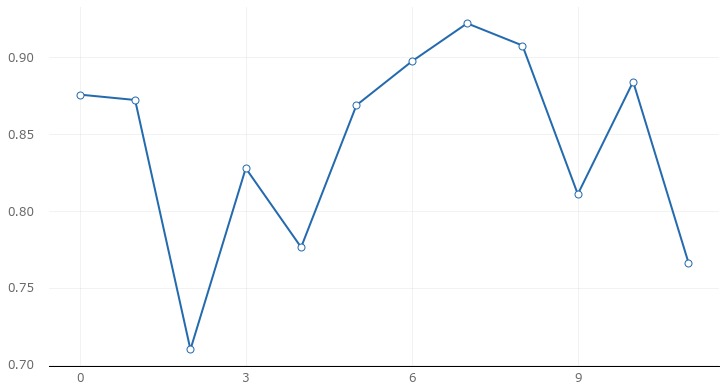

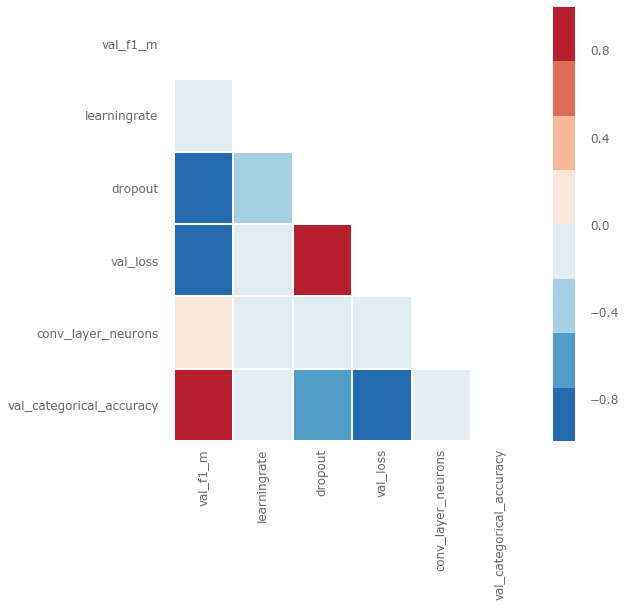

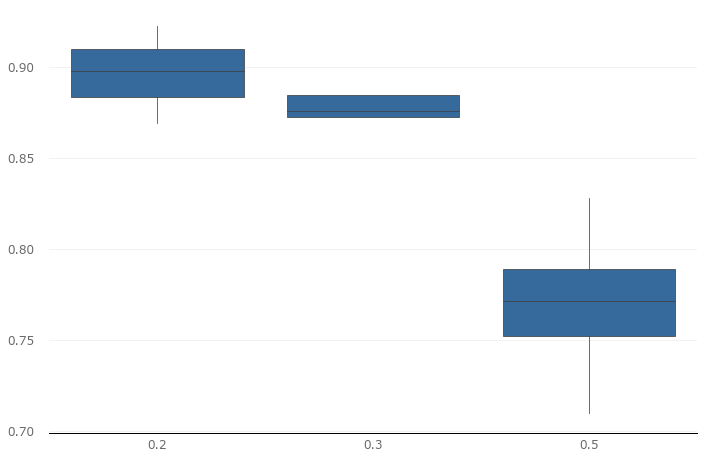

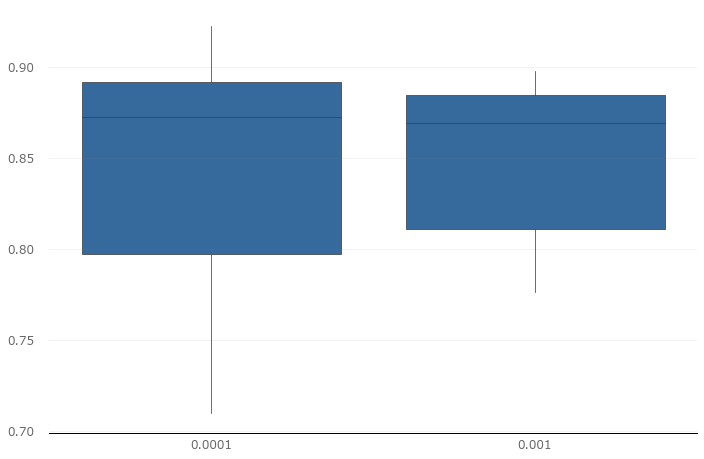

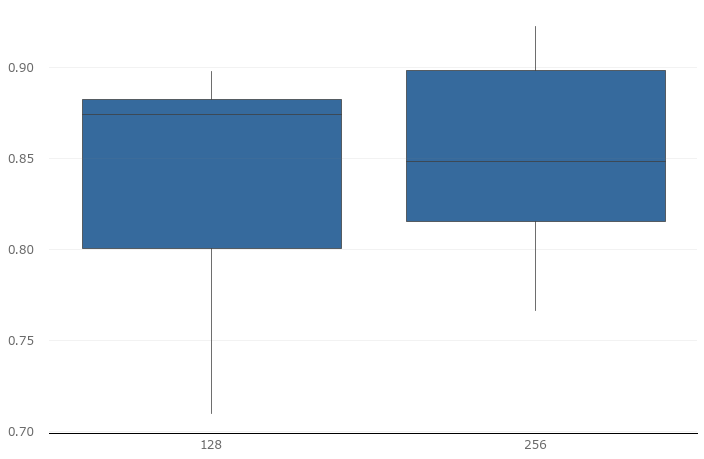

In [54]:
# Evaluating Experiment 2 - Hyperparameter Optimization

evaluation2 = e2.evaluate(X_test, y_test, model_id=None, folds=5, shuffle=True, metric='val_f1_m', 
                        asc=False, task='multi_label')
print(evaluation2)
analysis2 = talos.Analyze(h2)
table2 = analysis2.table('val_f1_m')
print(table2)
analysis2.plot_line(['val_f1_m'])
analysis2.plot_corr('val_f1_m', exclude=['duration', 'recall_m', 'precision_m', 'f1_m', 
                                         'loss', 'val_precision_m', 'val_recall_m', 'categorical_accuracy',
                                         'round_epochs', 'batch_size', 'dense_layer_neurons'])
analysis2.plot_box('dropout', 'val_f1_m')
analysis2.plot_box('learningrate', 'val_f1_m')
analysis2.plot_box('conv_layer_neurons', 'val_f1_m')

In [42]:
p = talos.Predict(h2)
y_pred = p.predict(X_test, metric='val_f1_m', asc=False)
y_pred_int = []
y_test_int = []
y_test_array = np.array(y_test)

for i in range(0, len(y_pred)):
    y_pred_int.append(np.argmax(y_pred[i]))
    y_test_int.append(np.argmax(y_test_array[i,:]))

#Get the confusion matrix
cm = confusion_matrix(y_test_int, y_pred_int)

#Now the normalize the diagonal entries
cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

#The diagonal entries are the accuracies of each class
cm.diagonal()

target_names = ['class 0', 'class 1', 'class 2','class 3']
print(classification_report(y_test_int, y_pred_int, target_names=target_names, digits=4))

# evaluate the model
# loss, categorical_acc, f1_score, precision, recall = model.evaluate(x=X_test, y=y_test)

              precision    recall  f1-score   support

     class 0     0.6830    0.9194    0.7838       968
     class 1     0.9789    0.9905    0.9847      1688
     class 2     0.9729    0.9721    0.9725      1255
     class 3     0.9482    0.6397    0.7640      1088

    accuracy                         0.8958      4999
   macro avg     0.8958    0.8804    0.8762      4999
weighted avg     0.9134    0.8958    0.8947      4999



## Final Model

Epoch 1/10


  72/1395 [>.............................] - ETA: 28:43 - loss: 9.7665 - categorical_accuracy: 0.1944 - f1_m: 0.1972 - precision_m: 0.2000 - recall_m: 0.194 - ETA: 10:57 - loss: 9.4223 - categorical_accuracy: 0.2014 - f1_m: 0.2042 - precision_m: 0.2071 - recall_m: 0.201 - ETA: 11:04 - loss: 9.6778 - categorical_accuracy: 0.2114 - f1_m: 0.2117 - precision_m: 0.2151 - recall_m: 0.208 - ETA: 10:52 - loss: 9.8738 - categorical_accuracy: 0.2159 - f1_m: 0.2153 - precision_m: 0.2190 - recall_m: 0.211 - ETA: 10:48 - loss: 9.7753 - categorical_accuracy: 0.2216 - f1_m: 0.2208 - precision_m: 0.2246 - recall_m: 0.217 - ETA: 10:50 - loss: 9.6250 - categorical_accuracy: 0.2217 - f1_m: 0.2210 - precision_m: 0.2248 - recall_m: 0.217 - ETA: 10:46 - loss: 9.4146 - categorical_accuracy: 0.2252 - f1_m: 0.2240 - precision_m: 0.2279 - recall_m: 0.220 - ETA: 10:40 - loss: 9.2339 - categorical_accuracy: 0.2261 - f1_m: 0.2247 - precision_m: 0.2286 - recall_m: 0.220 - ETA: 10:40 - loss: 9.0632 - categorical_acc

 218/1395 [===>..........................] - ETA: 9:33 - loss: 3.3587 - categorical_accuracy: 0.3437 - f1_m: 0.2984 - precision_m: 0.3576 - recall_m: 0.26 - ETA: 9:33 - loss: 3.3488 - categorical_accuracy: 0.3443 - f1_m: 0.2989 - precision_m: 0.3583 - recall_m: 0.26 - ETA: 9:32 - loss: 3.3390 - categorical_accuracy: 0.3449 - f1_m: 0.2994 - precision_m: 0.3591 - recall_m: 0.26 - ETA: 9:32 - loss: 3.3292 - categorical_accuracy: 0.3455 - f1_m: 0.2999 - precision_m: 0.3599 - recall_m: 0.26 - ETA: 9:31 - loss: 3.3195 - categorical_accuracy: 0.3462 - f1_m: 0.3003 - precision_m: 0.3606 - recall_m: 0.26 - ETA: 9:31 - loss: 3.3099 - categorical_accuracy: 0.3468 - f1_m: 0.3008 - precision_m: 0.3614 - recall_m: 0.26 - ETA: 9:30 - loss: 3.3004 - categorical_accuracy: 0.3474 - f1_m: 0.3013 - precision_m: 0.3622 - recall_m: 0.26 - ETA: 9:30 - loss: 3.2910 - categorical_accuracy: 0.3480 - f1_m: 0.3018 - precision_m: 0.3629 - recall_m: 0.26 - ETA: 9:30 - loss: 3.2817 - categorical_accuracy: 0.3486 - f

 291/1395 [=====>........................] - ETA: 8:59 - loss: 2.8171 - categorical_accuracy: 0.3831 - f1_m: 0.3314 - precision_m: 0.4065 - recall_m: 0.28 - ETA: 8:59 - loss: 2.8116 - categorical_accuracy: 0.3836 - f1_m: 0.3318 - precision_m: 0.4071 - recall_m: 0.28 - ETA: 8:58 - loss: 2.8061 - categorical_accuracy: 0.3840 - f1_m: 0.3322 - precision_m: 0.4076 - recall_m: 0.28 - ETA: 8:58 - loss: 2.8006 - categorical_accuracy: 0.3845 - f1_m: 0.3326 - precision_m: 0.4082 - recall_m: 0.28 - ETA: 8:57 - loss: 2.7952 - categorical_accuracy: 0.3850 - f1_m: 0.3330 - precision_m: 0.4088 - recall_m: 0.28 - ETA: 8:57 - loss: 2.7898 - categorical_accuracy: 0.3854 - f1_m: 0.3334 - precision_m: 0.4093 - recall_m: 0.28 - ETA: 8:56 - loss: 2.7844 - categorical_accuracy: 0.3859 - f1_m: 0.3338 - precision_m: 0.4099 - recall_m: 0.28 - ETA: 8:56 - loss: 2.7791 - categorical_accuracy: 0.3863 - f1_m: 0.3342 - precision_m: 0.4104 - recall_m: 0.28 - ETA: 8:55 - loss: 2.7738 - categorical_accuracy: 0.3868 - f

 364/1395 [======>.......................] - ETA: 8:26 - loss: 2.4880 - categorical_accuracy: 0.4142 - f1_m: 0.3595 - precision_m: 0.4433 - recall_m: 0.30 - ETA: 8:26 - loss: 2.4843 - categorical_accuracy: 0.4146 - f1_m: 0.3599 - precision_m: 0.4438 - recall_m: 0.30 - ETA: 8:25 - loss: 2.4807 - categorical_accuracy: 0.4150 - f1_m: 0.3602 - precision_m: 0.4442 - recall_m: 0.30 - ETA: 8:25 - loss: 2.4770 - categorical_accuracy: 0.4153 - f1_m: 0.3606 - precision_m: 0.4447 - recall_m: 0.30 - ETA: 8:24 - loss: 2.4734 - categorical_accuracy: 0.4157 - f1_m: 0.3610 - precision_m: 0.4451 - recall_m: 0.30 - ETA: 8:24 - loss: 2.4698 - categorical_accuracy: 0.4161 - f1_m: 0.3613 - precision_m: 0.4456 - recall_m: 0.30 - ETA: 8:24 - loss: 2.4662 - categorical_accuracy: 0.4165 - f1_m: 0.3617 - precision_m: 0.4460 - recall_m: 0.30 - ETA: 8:23 - loss: 2.4626 - categorical_accuracy: 0.4169 - f1_m: 0.3620 - precision_m: 0.4465 - recall_m: 0.30 - ETA: 8:23 - loss: 2.4590 - categorical_accuracy: 0.4173 - f

 437/1395 [========>.....................] - ETA: 7:55 - loss: 2.2586 - categorical_accuracy: 0.4402 - f1_m: 0.3845 - precision_m: 0.4731 - recall_m: 0.32 - ETA: 7:55 - loss: 2.2559 - categorical_accuracy: 0.4405 - f1_m: 0.3848 - precision_m: 0.4734 - recall_m: 0.32 - ETA: 7:54 - loss: 2.2532 - categorical_accuracy: 0.4409 - f1_m: 0.3851 - precision_m: 0.4738 - recall_m: 0.32 - ETA: 7:54 - loss: 2.2506 - categorical_accuracy: 0.4412 - f1_m: 0.3854 - precision_m: 0.4742 - recall_m: 0.32 - ETA: 7:54 - loss: 2.2479 - categorical_accuracy: 0.4415 - f1_m: 0.3857 - precision_m: 0.4745 - recall_m: 0.32 - ETA: 7:53 - loss: 2.2453 - categorical_accuracy: 0.4418 - f1_m: 0.3861 - precision_m: 0.4749 - recall_m: 0.32 - ETA: 7:53 - loss: 2.2427 - categorical_accuracy: 0.4422 - f1_m: 0.3864 - precision_m: 0.4753 - recall_m: 0.32 - ETA: 7:52 - loss: 2.2400 - categorical_accuracy: 0.4425 - f1_m: 0.3867 - precision_m: 0.4756 - recall_m: 0.33 - ETA: 7:52 - loss: 2.2374 - categorical_accuracy: 0.4428 - f

 510/1395 [=========>....................] - ETA: 7:22 - loss: 2.0864 - categorical_accuracy: 0.4624 - f1_m: 0.4066 - precision_m: 0.4975 - recall_m: 0.34 - ETA: 7:22 - loss: 2.0844 - categorical_accuracy: 0.4626 - f1_m: 0.4069 - precision_m: 0.4979 - recall_m: 0.34 - ETA: 7:21 - loss: 2.0823 - categorical_accuracy: 0.4629 - f1_m: 0.4072 - precision_m: 0.4982 - recall_m: 0.34 - ETA: 7:21 - loss: 2.0802 - categorical_accuracy: 0.4632 - f1_m: 0.4075 - precision_m: 0.4985 - recall_m: 0.34 - ETA: 7:20 - loss: 2.0782 - categorical_accuracy: 0.4635 - f1_m: 0.4077 - precision_m: 0.4988 - recall_m: 0.34 - ETA: 7:20 - loss: 2.0761 - categorical_accuracy: 0.4638 - f1_m: 0.4080 - precision_m: 0.4991 - recall_m: 0.34 - ETA: 7:20 - loss: 2.0741 - categorical_accuracy: 0.4640 - f1_m: 0.4083 - precision_m: 0.4994 - recall_m: 0.34 - ETA: 7:19 - loss: 2.0721 - categorical_accuracy: 0.4643 - f1_m: 0.4086 - precision_m: 0.4997 - recall_m: 0.35 - ETA: 7:19 - loss: 2.0700 - categorical_accuracy: 0.4646 - f

 583/1395 [===========>..................] - ETA: 6:50 - loss: 1.9512 - categorical_accuracy: 0.4813 - f1_m: 0.4261 - precision_m: 0.5179 - recall_m: 0.36 - ETA: 6:49 - loss: 1.9496 - categorical_accuracy: 0.4816 - f1_m: 0.4264 - precision_m: 0.5182 - recall_m: 0.36 - ETA: 6:49 - loss: 1.9479 - categorical_accuracy: 0.4818 - f1_m: 0.4266 - precision_m: 0.5184 - recall_m: 0.36 - ETA: 6:48 - loss: 1.9463 - categorical_accuracy: 0.4821 - f1_m: 0.4269 - precision_m: 0.5187 - recall_m: 0.36 - ETA: 6:48 - loss: 1.9446 - categorical_accuracy: 0.4823 - f1_m: 0.4271 - precision_m: 0.5189 - recall_m: 0.36 - ETA: 6:47 - loss: 1.9430 - categorical_accuracy: 0.4825 - f1_m: 0.4274 - precision_m: 0.5192 - recall_m: 0.36 - ETA: 6:47 - loss: 1.9413 - categorical_accuracy: 0.4828 - f1_m: 0.4276 - precision_m: 0.5194 - recall_m: 0.36 - ETA: 6:46 - loss: 1.9397 - categorical_accuracy: 0.4830 - f1_m: 0.4279 - precision_m: 0.5197 - recall_m: 0.36 - ETA: 6:46 - loss: 1.9381 - categorical_accuracy: 0.4833 - f

 656/1395 [=============>................] - ETA: 6:17 - loss: 1.8411 - categorical_accuracy: 0.4979 - f1_m: 0.4437 - precision_m: 0.5354 - recall_m: 0.38 - ETA: 6:17 - loss: 1.8397 - categorical_accuracy: 0.4981 - f1_m: 0.4439 - precision_m: 0.5356 - recall_m: 0.38 - ETA: 6:16 - loss: 1.8384 - categorical_accuracy: 0.4984 - f1_m: 0.4441 - precision_m: 0.5359 - recall_m: 0.38 - ETA: 6:16 - loss: 1.8370 - categorical_accuracy: 0.4986 - f1_m: 0.4444 - precision_m: 0.5361 - recall_m: 0.38 - ETA: 6:15 - loss: 1.8356 - categorical_accuracy: 0.4988 - f1_m: 0.4446 - precision_m: 0.5363 - recall_m: 0.38 - ETA: 6:15 - loss: 1.8343 - categorical_accuracy: 0.4990 - f1_m: 0.4448 - precision_m: 0.5365 - recall_m: 0.38 - ETA: 6:14 - loss: 1.8329 - categorical_accuracy: 0.4992 - f1_m: 0.4451 - precision_m: 0.5368 - recall_m: 0.38 - ETA: 6:13 - loss: 1.8315 - categorical_accuracy: 0.4994 - f1_m: 0.4453 - precision_m: 0.5370 - recall_m: 0.38 - ETA: 6:13 - loss: 1.8302 - categorical_accuracy: 0.4996 - f

 729/1395 [==============>...............] - ETA: 5:41 - loss: 1.7486 - categorical_accuracy: 0.5127 - f1_m: 0.4597 - precision_m: 0.5508 - recall_m: 0.39 - ETA: 5:40 - loss: 1.7475 - categorical_accuracy: 0.5129 - f1_m: 0.4599 - precision_m: 0.5510 - recall_m: 0.39 - ETA: 5:40 - loss: 1.7463 - categorical_accuracy: 0.5131 - f1_m: 0.4601 - precision_m: 0.5512 - recall_m: 0.39 - ETA: 5:40 - loss: 1.7452 - categorical_accuracy: 0.5133 - f1_m: 0.4603 - precision_m: 0.5514 - recall_m: 0.40 - ETA: 5:39 - loss: 1.7440 - categorical_accuracy: 0.5135 - f1_m: 0.4605 - precision_m: 0.5516 - recall_m: 0.40 - ETA: 5:39 - loss: 1.7429 - categorical_accuracy: 0.5137 - f1_m: 0.4607 - precision_m: 0.5518 - recall_m: 0.40 - ETA: 5:38 - loss: 1.7417 - categorical_accuracy: 0.5139 - f1_m: 0.4609 - precision_m: 0.5520 - recall_m: 0.40 - ETA: 5:38 - loss: 1.7406 - categorical_accuracy: 0.5140 - f1_m: 0.4611 - precision_m: 0.5521 - recall_m: 0.40 - ETA: 5:38 - loss: 1.7394 - categorical_accuracy: 0.5142 - f

 802/1395 [================>.............] - ETA: 5:07 - loss: 1.6697 - categorical_accuracy: 0.5260 - f1_m: 0.4743 - precision_m: 0.5644 - recall_m: 0.41 - ETA: 5:06 - loss: 1.6687 - categorical_accuracy: 0.5261 - f1_m: 0.4745 - precision_m: 0.5645 - recall_m: 0.41 - ETA: 5:06 - loss: 1.6677 - categorical_accuracy: 0.5263 - f1_m: 0.4747 - precision_m: 0.5647 - recall_m: 0.41 - ETA: 5:05 - loss: 1.6667 - categorical_accuracy: 0.5265 - f1_m: 0.4749 - precision_m: 0.5649 - recall_m: 0.41 - ETA: 5:05 - loss: 1.6657 - categorical_accuracy: 0.5267 - f1_m: 0.4751 - precision_m: 0.5651 - recall_m: 0.41 - ETA: 5:04 - loss: 1.6647 - categorical_accuracy: 0.5268 - f1_m: 0.4752 - precision_m: 0.5652 - recall_m: 0.41 - ETA: 5:04 - loss: 1.6637 - categorical_accuracy: 0.5270 - f1_m: 0.4754 - precision_m: 0.5654 - recall_m: 0.41 - ETA: 5:03 - loss: 1.6627 - categorical_accuracy: 0.5272 - f1_m: 0.4756 - precision_m: 0.5656 - recall_m: 0.41 - ETA: 5:03 - loss: 1.6618 - categorical_accuracy: 0.5273 - f

 875/1395 [=================>............] - ETA: 4:31 - loss: 1.6013 - categorical_accuracy: 0.5379 - f1_m: 0.4876 - precision_m: 0.5765 - recall_m: 0.42 - ETA: 4:31 - loss: 1.6004 - categorical_accuracy: 0.5381 - f1_m: 0.4878 - precision_m: 0.5766 - recall_m: 0.42 - ETA: 4:30 - loss: 1.5995 - categorical_accuracy: 0.5382 - f1_m: 0.4880 - precision_m: 0.5768 - recall_m: 0.42 - ETA: 4:30 - loss: 1.5987 - categorical_accuracy: 0.5384 - f1_m: 0.4882 - precision_m: 0.5769 - recall_m: 0.42 - ETA: 4:29 - loss: 1.5978 - categorical_accuracy: 0.5386 - f1_m: 0.4883 - precision_m: 0.5771 - recall_m: 0.42 - ETA: 4:29 - loss: 1.5969 - categorical_accuracy: 0.5387 - f1_m: 0.4885 - precision_m: 0.5772 - recall_m: 0.42 - ETA: 4:28 - loss: 1.5960 - categorical_accuracy: 0.5389 - f1_m: 0.4887 - precision_m: 0.5774 - recall_m: 0.42 - ETA: 4:28 - loss: 1.5952 - categorical_accuracy: 0.5390 - f1_m: 0.4889 - precision_m: 0.5776 - recall_m: 0.42 - ETA: 4:27 - loss: 1.5943 - categorical_accuracy: 0.5392 - f

 948/1395 [===================>..........] - ETA: 3:58 - loss: 1.5411 - categorical_accuracy: 0.5488 - f1_m: 0.4999 - precision_m: 0.5874 - recall_m: 0.44 - ETA: 3:58 - loss: 1.5404 - categorical_accuracy: 0.5489 - f1_m: 0.5001 - precision_m: 0.5875 - recall_m: 0.44 - ETA: 3:57 - loss: 1.5396 - categorical_accuracy: 0.5491 - f1_m: 0.5002 - precision_m: 0.5877 - recall_m: 0.44 - ETA: 3:57 - loss: 1.5388 - categorical_accuracy: 0.5492 - f1_m: 0.5004 - precision_m: 0.5878 - recall_m: 0.44 - ETA: 3:57 - loss: 1.5381 - categorical_accuracy: 0.5494 - f1_m: 0.5006 - precision_m: 0.5880 - recall_m: 0.44 - ETA: 3:56 - loss: 1.5373 - categorical_accuracy: 0.5495 - f1_m: 0.5007 - precision_m: 0.5881 - recall_m: 0.44 - ETA: 3:56 - loss: 1.5365 - categorical_accuracy: 0.5497 - f1_m: 0.5009 - precision_m: 0.5882 - recall_m: 0.44 - ETA: 3:55 - loss: 1.5358 - categorical_accuracy: 0.5498 - f1_m: 0.5010 - precision_m: 0.5884 - recall_m: 0.44 - ETA: 3:55 - loss: 1.5350 - categorical_accuracy: 0.5499 - f

1021/1395 [====================>.........] - ETA: 3:26 - loss: 1.4879 - categorical_accuracy: 0.5588 - f1_m: 0.5113 - precision_m: 0.5973 - recall_m: 0.45 - ETA: 3:25 - loss: 1.4872 - categorical_accuracy: 0.5589 - f1_m: 0.5114 - precision_m: 0.5974 - recall_m: 0.45 - ETA: 3:25 - loss: 1.4865 - categorical_accuracy: 0.5590 - f1_m: 0.5116 - precision_m: 0.5976 - recall_m: 0.45 - ETA: 3:24 - loss: 1.4858 - categorical_accuracy: 0.5592 - f1_m: 0.5117 - precision_m: 0.5977 - recall_m: 0.45 - ETA: 3:24 - loss: 1.4851 - categorical_accuracy: 0.5593 - f1_m: 0.5119 - precision_m: 0.5978 - recall_m: 0.45 - ETA: 3:23 - loss: 1.4844 - categorical_accuracy: 0.5594 - f1_m: 0.5120 - precision_m: 0.5980 - recall_m: 0.45 - ETA: 3:23 - loss: 1.4837 - categorical_accuracy: 0.5596 - f1_m: 0.5122 - precision_m: 0.5981 - recall_m: 0.45 - ETA: 3:22 - loss: 1.4831 - categorical_accuracy: 0.5597 - f1_m: 0.5123 - precision_m: 0.5982 - recall_m: 0.45 - ETA: 3:22 - loss: 1.4824 - categorical_accuracy: 0.5598 - f

1094/1395 [======================>.......] - ETA: 2:53 - loss: 1.4401 - categorical_accuracy: 0.5680 - f1_m: 0.5218 - precision_m: 0.6063 - recall_m: 0.46 - ETA: 2:53 - loss: 1.4395 - categorical_accuracy: 0.5681 - f1_m: 0.5219 - precision_m: 0.6065 - recall_m: 0.46 - ETA: 2:52 - loss: 1.4388 - categorical_accuracy: 0.5682 - f1_m: 0.5220 - precision_m: 0.6066 - recall_m: 0.46 - ETA: 2:52 - loss: 1.4382 - categorical_accuracy: 0.5683 - f1_m: 0.5222 - precision_m: 0.6067 - recall_m: 0.46 - ETA: 2:51 - loss: 1.4376 - categorical_accuracy: 0.5684 - f1_m: 0.5223 - precision_m: 0.6068 - recall_m: 0.46 - ETA: 2:51 - loss: 1.4370 - categorical_accuracy: 0.5686 - f1_m: 0.5225 - precision_m: 0.6069 - recall_m: 0.46 - ETA: 2:50 - loss: 1.4364 - categorical_accuracy: 0.5687 - f1_m: 0.5226 - precision_m: 0.6071 - recall_m: 0.46 - ETA: 2:50 - loss: 1.4358 - categorical_accuracy: 0.5688 - f1_m: 0.5227 - precision_m: 0.6072 - recall_m: 0.46 - ETA: 2:49 - loss: 1.4351 - categorical_accuracy: 0.5689 - f

1167/1395 [========================>.....] - ETA: 2:20 - loss: 1.3969 - categorical_accuracy: 0.5765 - f1_m: 0.5316 - precision_m: 0.6147 - recall_m: 0.47 - ETA: 2:19 - loss: 1.3964 - categorical_accuracy: 0.5766 - f1_m: 0.5317 - precision_m: 0.6148 - recall_m: 0.47 - ETA: 2:19 - loss: 1.3958 - categorical_accuracy: 0.5767 - f1_m: 0.5318 - precision_m: 0.6149 - recall_m: 0.47 - ETA: 2:18 - loss: 1.3952 - categorical_accuracy: 0.5768 - f1_m: 0.5319 - precision_m: 0.6150 - recall_m: 0.47 - ETA: 2:18 - loss: 1.3947 - categorical_accuracy: 0.5769 - f1_m: 0.5321 - precision_m: 0.6151 - recall_m: 0.47 - ETA: 2:18 - loss: 1.3941 - categorical_accuracy: 0.5771 - f1_m: 0.5322 - precision_m: 0.6152 - recall_m: 0.47 - ETA: 2:17 - loss: 1.3936 - categorical_accuracy: 0.5772 - f1_m: 0.5323 - precision_m: 0.6153 - recall_m: 0.47 - ETA: 2:17 - loss: 1.3930 - categorical_accuracy: 0.5773 - f1_m: 0.5325 - precision_m: 0.6154 - recall_m: 0.47 - ETA: 2:16 - loss: 1.3924 - categorical_accuracy: 0.5774 - f

1240/1395 [=========================>....] - ETA: 1:46 - loss: 1.3576 - categorical_accuracy: 0.5844 - f1_m: 0.5407 - precision_m: 0.6223 - recall_m: 0.48 - ETA: 1:45 - loss: 1.3571 - categorical_accuracy: 0.5845 - f1_m: 0.5408 - precision_m: 0.6224 - recall_m: 0.48 - ETA: 1:45 - loss: 1.3566 - categorical_accuracy: 0.5846 - f1_m: 0.5409 - precision_m: 0.6225 - recall_m: 0.48 - ETA: 1:44 - loss: 1.3561 - categorical_accuracy: 0.5847 - f1_m: 0.5410 - precision_m: 0.6226 - recall_m: 0.48 - ETA: 1:44 - loss: 1.3556 - categorical_accuracy: 0.5848 - f1_m: 0.5412 - precision_m: 0.6227 - recall_m: 0.48 - ETA: 1:43 - loss: 1.3551 - categorical_accuracy: 0.5850 - f1_m: 0.5413 - precision_m: 0.6228 - recall_m: 0.48 - ETA: 1:43 - loss: 1.3546 - categorical_accuracy: 0.5851 - f1_m: 0.5414 - precision_m: 0.6229 - recall_m: 0.48 - ETA: 1:42 - loss: 1.3541 - categorical_accuracy: 0.5852 - f1_m: 0.5415 - precision_m: 0.6230 - recall_m: 0.48 - ETA: 1:42 - loss: 1.3536 - categorical_accuracy: 0.5853 - f

1313/1395 [===========================>..] - ETA: 1:11 - loss: 1.3218 - categorical_accuracy: 0.5918 - f1_m: 0.5492 - precision_m: 0.6294 - recall_m: 0.49 - ETA: 1:11 - loss: 1.3213 - categorical_accuracy: 0.5919 - f1_m: 0.5493 - precision_m: 0.6295 - recall_m: 0.49 - ETA: 1:10 - loss: 1.3209 - categorical_accuracy: 0.5920 - f1_m: 0.5494 - precision_m: 0.6296 - recall_m: 0.49 - ETA: 1:10 - loss: 1.3204 - categorical_accuracy: 0.5921 - f1_m: 0.5496 - precision_m: 0.6297 - recall_m: 0.49 - ETA: 1:09 - loss: 1.3199 - categorical_accuracy: 0.5922 - f1_m: 0.5497 - precision_m: 0.6298 - recall_m: 0.49 - ETA: 1:09 - loss: 1.3195 - categorical_accuracy: 0.5923 - f1_m: 0.5498 - precision_m: 0.6299 - recall_m: 0.49 - ETA: 1:09 - loss: 1.3190 - categorical_accuracy: 0.5924 - f1_m: 0.5499 - precision_m: 0.6300 - recall_m: 0.49 - ETA: 1:08 - loss: 1.3185 - categorical_accuracy: 0.5925 - f1_m: 0.5500 - precision_m: 0.6301 - recall_m: 0.49 - ETA: 1:08 - loss: 1.3181 - categorical_accuracy: 0.5926 - f

1386/1395 [============================>.] - ETA: 37s - loss: 1.2890 - categorical_accuracy: 0.5988 - f1_m: 0.5572 - precision_m: 0.6360 - recall_m: 0.502 - ETA: 37s - loss: 1.2885 - categorical_accuracy: 0.5989 - f1_m: 0.5573 - precision_m: 0.6361 - recall_m: 0.502 - ETA: 36s - loss: 1.2881 - categorical_accuracy: 0.5989 - f1_m: 0.5574 - precision_m: 0.6362 - recall_m: 0.502 - ETA: 36s - loss: 1.2877 - categorical_accuracy: 0.5990 - f1_m: 0.5576 - precision_m: 0.6363 - recall_m: 0.502 - ETA: 35s - loss: 1.2872 - categorical_accuracy: 0.5991 - f1_m: 0.5577 - precision_m: 0.6364 - recall_m: 0.503 - ETA: 35s - loss: 1.2868 - categorical_accuracy: 0.5992 - f1_m: 0.5578 - precision_m: 0.6365 - recall_m: 0.503 - ETA: 34s - loss: 1.2864 - categorical_accuracy: 0.5993 - f1_m: 0.5579 - precision_m: 0.6366 - recall_m: 0.503 - ETA: 34s - loss: 1.2859 - categorical_accuracy: 0.5994 - f1_m: 0.5580 - precision_m: 0.6366 - recall_m: 0.503 - ETA: 33s - loss: 1.2855 - categorical_accuracy: 0.5995 - f1

1395/1395 [==============================] - ETA: 3s - loss: 1.2586 - categorical_accuracy: 0.6053 - f1_m: 0.5648 - precision_m: 0.6423 - recall_m: 0.51 - ETA: 3s - loss: 1.2582 - categorical_accuracy: 0.6054 - f1_m: 0.5649 - precision_m: 0.6423 - recall_m: 0.51 - ETA: 2s - loss: 1.2578 - categorical_accuracy: 0.6055 - f1_m: 0.5650 - precision_m: 0.6424 - recall_m: 0.51 - ETA: 2s - loss: 1.2574 - categorical_accuracy: 0.6056 - f1_m: 0.5651 - precision_m: 0.6425 - recall_m: 0.51 - ETA: 1s - loss: 1.2570 - categorical_accuracy: 0.6057 - f1_m: 0.5652 - precision_m: 0.6426 - recall_m: 0.51 - ETA: 1s - loss: 1.2566 - categorical_accuracy: 0.6057 - f1_m: 0.5653 - precision_m: 0.6427 - recall_m: 0.51 - ETA: 0s - loss: 1.2562 - categorical_accuracy: 0.6058 - f1_m: 0.5654 - precision_m: 0.6428 - recall_m: 0.51 - ETA: 0s - loss: 1.2558 - categorical_accuracy: 0.6059 - f1_m: 0.5655 - precision_m: 0.6428 - recall_m: 0.51 - ETA: 0s - loss: 1.2554 - categorical_accuracy: 0.6060 - f1_m: 0.5656 - prec

  73/1395 [>.............................] - ETA: 9:55 - loss: 0.5187 - categorical_accuracy: 0.8333 - f1_m: 0.8333 - precision_m: 0.8333 - recall_m: 0.83 - ETA: 9:58 - loss: 0.4846 - categorical_accuracy: 0.8472 - f1_m: 0.8433 - precision_m: 0.8464 - recall_m: 0.84 - ETA: 9:58 - loss: 0.4534 - categorical_accuracy: 0.8549 - f1_m: 0.8520 - precision_m: 0.8569 - recall_m: 0.84 - ETA: 10:01 - loss: 0.4370 - categorical_accuracy: 0.8530 - f1_m: 0.8513 - precision_m: 0.8572 - recall_m: 0.845 - ETA: 10:00 - loss: 0.4298 - categorical_accuracy: 0.8469 - f1_m: 0.8463 - precision_m: 0.8544 - recall_m: 0.838 - ETA: 10:10 - loss: 0.4224 - categorical_accuracy: 0.8454 - f1_m: 0.8454 - precision_m: 0.8552 - recall_m: 0.836 - ETA: 10:05 - loss: 0.4219 - categorical_accuracy: 0.8448 - f1_m: 0.8449 - precision_m: 0.8557 - recall_m: 0.834 - ETA: 10:05 - loss: 0.4224 - categorical_accuracy: 0.8442 - f1_m: 0.8441 - precision_m: 0.8557 - recall_m: 0.833 - ETA: 10:05 - loss: 0.4218 - categorical_accuracy:

 219/1395 [===>..........................] - ETA: 9:10 - loss: 0.3771 - categorical_accuracy: 0.8419 - f1_m: 0.8407 - precision_m: 0.8544 - recall_m: 0.82 - ETA: 9:10 - loss: 0.3771 - categorical_accuracy: 0.8419 - f1_m: 0.8407 - precision_m: 0.8544 - recall_m: 0.82 - ETA: 9:09 - loss: 0.3770 - categorical_accuracy: 0.8420 - f1_m: 0.8408 - precision_m: 0.8544 - recall_m: 0.82 - ETA: 9:09 - loss: 0.3770 - categorical_accuracy: 0.8420 - f1_m: 0.8408 - precision_m: 0.8544 - recall_m: 0.82 - ETA: 9:08 - loss: 0.3769 - categorical_accuracy: 0.8420 - f1_m: 0.8408 - precision_m: 0.8544 - recall_m: 0.82 - ETA: 9:08 - loss: 0.3769 - categorical_accuracy: 0.8420 - f1_m: 0.8408 - precision_m: 0.8544 - recall_m: 0.82 - ETA: 9:07 - loss: 0.3768 - categorical_accuracy: 0.8420 - f1_m: 0.8408 - precision_m: 0.8544 - recall_m: 0.82 - ETA: 9:07 - loss: 0.3768 - categorical_accuracy: 0.8420 - f1_m: 0.8408 - precision_m: 0.8545 - recall_m: 0.82 - ETA: 9:07 - loss: 0.3767 - categorical_accuracy: 0.8420 - f

 292/1395 [=====>........................] - ETA: 8:43 - loss: 0.3752 - categorical_accuracy: 0.8426 - f1_m: 0.8410 - precision_m: 0.8548 - recall_m: 0.82 - ETA: 8:44 - loss: 0.3751 - categorical_accuracy: 0.8426 - f1_m: 0.8410 - precision_m: 0.8548 - recall_m: 0.82 - ETA: 8:44 - loss: 0.3751 - categorical_accuracy: 0.8426 - f1_m: 0.8410 - precision_m: 0.8548 - recall_m: 0.82 - ETA: 8:44 - loss: 0.3751 - categorical_accuracy: 0.8426 - f1_m: 0.8410 - precision_m: 0.8548 - recall_m: 0.82 - ETA: 8:43 - loss: 0.3751 - categorical_accuracy: 0.8426 - f1_m: 0.8410 - precision_m: 0.8548 - recall_m: 0.82 - ETA: 8:43 - loss: 0.3751 - categorical_accuracy: 0.8426 - f1_m: 0.8410 - precision_m: 0.8548 - recall_m: 0.82 - ETA: 8:43 - loss: 0.3751 - categorical_accuracy: 0.8426 - f1_m: 0.8411 - precision_m: 0.8548 - recall_m: 0.82 - ETA: 8:43 - loss: 0.3751 - categorical_accuracy: 0.8426 - f1_m: 0.8411 - precision_m: 0.8548 - recall_m: 0.82 - ETA: 8:43 - loss: 0.3750 - categorical_accuracy: 0.8426 - f

 365/1395 [======>.......................] - ETA: 8:16 - loss: 0.3749 - categorical_accuracy: 0.8426 - f1_m: 0.8409 - precision_m: 0.8547 - recall_m: 0.82 - ETA: 8:16 - loss: 0.3749 - categorical_accuracy: 0.8426 - f1_m: 0.8409 - precision_m: 0.8547 - recall_m: 0.82 - ETA: 8:15 - loss: 0.3749 - categorical_accuracy: 0.8426 - f1_m: 0.8409 - precision_m: 0.8547 - recall_m: 0.82 - ETA: 8:15 - loss: 0.3749 - categorical_accuracy: 0.8426 - f1_m: 0.8409 - precision_m: 0.8547 - recall_m: 0.82 - ETA: 8:14 - loss: 0.3749 - categorical_accuracy: 0.8426 - f1_m: 0.8409 - precision_m: 0.8547 - recall_m: 0.82 - ETA: 8:14 - loss: 0.3748 - categorical_accuracy: 0.8426 - f1_m: 0.8409 - precision_m: 0.8547 - recall_m: 0.82 - ETA: 8:13 - loss: 0.3748 - categorical_accuracy: 0.8426 - f1_m: 0.8409 - precision_m: 0.8547 - recall_m: 0.82 - ETA: 8:13 - loss: 0.3748 - categorical_accuracy: 0.8426 - f1_m: 0.8409 - precision_m: 0.8547 - recall_m: 0.82 - ETA: 8:12 - loss: 0.3748 - categorical_accuracy: 0.8426 - f

 438/1395 [========>.....................] - ETA: 7:41 - loss: 0.3739 - categorical_accuracy: 0.8431 - f1_m: 0.8413 - precision_m: 0.8551 - recall_m: 0.82 - ETA: 7:41 - loss: 0.3739 - categorical_accuracy: 0.8431 - f1_m: 0.8413 - precision_m: 0.8551 - recall_m: 0.82 - ETA: 7:40 - loss: 0.3739 - categorical_accuracy: 0.8431 - f1_m: 0.8413 - precision_m: 0.8551 - recall_m: 0.82 - ETA: 7:40 - loss: 0.3739 - categorical_accuracy: 0.8431 - f1_m: 0.8413 - precision_m: 0.8551 - recall_m: 0.82 - ETA: 7:39 - loss: 0.3738 - categorical_accuracy: 0.8431 - f1_m: 0.8413 - precision_m: 0.8551 - recall_m: 0.82 - ETA: 7:39 - loss: 0.3738 - categorical_accuracy: 0.8431 - f1_m: 0.8413 - precision_m: 0.8551 - recall_m: 0.82 - ETA: 7:38 - loss: 0.3738 - categorical_accuracy: 0.8431 - f1_m: 0.8413 - precision_m: 0.8551 - recall_m: 0.82 - ETA: 7:38 - loss: 0.3738 - categorical_accuracy: 0.8431 - f1_m: 0.8413 - precision_m: 0.8551 - recall_m: 0.82 - ETA: 7:37 - loss: 0.3738 - categorical_accuracy: 0.8431 - f

 511/1395 [=========>....................] - ETA: 7:06 - loss: 0.3733 - categorical_accuracy: 0.8434 - f1_m: 0.8416 - precision_m: 0.8554 - recall_m: 0.82 - ETA: 7:05 - loss: 0.3732 - categorical_accuracy: 0.8434 - f1_m: 0.8416 - precision_m: 0.8554 - recall_m: 0.82 - ETA: 7:05 - loss: 0.3732 - categorical_accuracy: 0.8434 - f1_m: 0.8416 - precision_m: 0.8554 - recall_m: 0.82 - ETA: 7:04 - loss: 0.3732 - categorical_accuracy: 0.8434 - f1_m: 0.8416 - precision_m: 0.8554 - recall_m: 0.82 - ETA: 7:04 - loss: 0.3732 - categorical_accuracy: 0.8434 - f1_m: 0.8416 - precision_m: 0.8555 - recall_m: 0.82 - ETA: 7:04 - loss: 0.3732 - categorical_accuracy: 0.8434 - f1_m: 0.8416 - precision_m: 0.8555 - recall_m: 0.82 - ETA: 7:03 - loss: 0.3732 - categorical_accuracy: 0.8434 - f1_m: 0.8416 - precision_m: 0.8555 - recall_m: 0.82 - ETA: 7:03 - loss: 0.3732 - categorical_accuracy: 0.8434 - f1_m: 0.8416 - precision_m: 0.8555 - recall_m: 0.82 - ETA: 7:02 - loss: 0.3732 - categorical_accuracy: 0.8434 - f

 584/1395 [===========>..................] - ETA: 6:32 - loss: 0.3726 - categorical_accuracy: 0.8436 - f1_m: 0.8418 - precision_m: 0.8557 - recall_m: 0.82 - ETA: 6:31 - loss: 0.3726 - categorical_accuracy: 0.8436 - f1_m: 0.8418 - precision_m: 0.8557 - recall_m: 0.82 - ETA: 6:31 - loss: 0.3726 - categorical_accuracy: 0.8436 - f1_m: 0.8418 - precision_m: 0.8557 - recall_m: 0.82 - ETA: 6:30 - loss: 0.3726 - categorical_accuracy: 0.8436 - f1_m: 0.8418 - precision_m: 0.8557 - recall_m: 0.82 - ETA: 6:30 - loss: 0.3726 - categorical_accuracy: 0.8436 - f1_m: 0.8418 - precision_m: 0.8557 - recall_m: 0.82 - ETA: 6:29 - loss: 0.3725 - categorical_accuracy: 0.8436 - f1_m: 0.8418 - precision_m: 0.8558 - recall_m: 0.82 - ETA: 6:29 - loss: 0.3725 - categorical_accuracy: 0.8437 - f1_m: 0.8418 - precision_m: 0.8558 - recall_m: 0.82 - ETA: 6:28 - loss: 0.3725 - categorical_accuracy: 0.8437 - f1_m: 0.8418 - precision_m: 0.8558 - recall_m: 0.82 - ETA: 6:28 - loss: 0.3725 - categorical_accuracy: 0.8437 - f

 657/1395 [=============>................] - ETA: 5:58 - loss: 0.3718 - categorical_accuracy: 0.8441 - f1_m: 0.8422 - precision_m: 0.8562 - recall_m: 0.82 - ETA: 5:57 - loss: 0.3718 - categorical_accuracy: 0.8441 - f1_m: 0.8422 - precision_m: 0.8562 - recall_m: 0.82 - ETA: 5:57 - loss: 0.3718 - categorical_accuracy: 0.8441 - f1_m: 0.8422 - precision_m: 0.8562 - recall_m: 0.82 - ETA: 5:57 - loss: 0.3718 - categorical_accuracy: 0.8441 - f1_m: 0.8422 - precision_m: 0.8562 - recall_m: 0.82 - ETA: 5:56 - loss: 0.3717 - categorical_accuracy: 0.8441 - f1_m: 0.8423 - precision_m: 0.8563 - recall_m: 0.82 - ETA: 5:56 - loss: 0.3717 - categorical_accuracy: 0.8441 - f1_m: 0.8423 - precision_m: 0.8563 - recall_m: 0.82 - ETA: 5:55 - loss: 0.3717 - categorical_accuracy: 0.8441 - f1_m: 0.8423 - precision_m: 0.8563 - recall_m: 0.82 - ETA: 5:55 - loss: 0.3717 - categorical_accuracy: 0.8441 - f1_m: 0.8423 - precision_m: 0.8563 - recall_m: 0.82 - ETA: 5:54 - loss: 0.3717 - categorical_accuracy: 0.8441 - f

 730/1395 [==============>...............] - ETA: 5:25 - loss: 0.3710 - categorical_accuracy: 0.8445 - f1_m: 0.8427 - precision_m: 0.8567 - recall_m: 0.82 - ETA: 5:25 - loss: 0.3709 - categorical_accuracy: 0.8445 - f1_m: 0.8427 - precision_m: 0.8567 - recall_m: 0.82 - ETA: 5:24 - loss: 0.3709 - categorical_accuracy: 0.8445 - f1_m: 0.8427 - precision_m: 0.8567 - recall_m: 0.82 - ETA: 5:24 - loss: 0.3709 - categorical_accuracy: 0.8445 - f1_m: 0.8427 - precision_m: 0.8567 - recall_m: 0.82 - ETA: 5:24 - loss: 0.3709 - categorical_accuracy: 0.8445 - f1_m: 0.8427 - precision_m: 0.8567 - recall_m: 0.82 - ETA: 5:23 - loss: 0.3709 - categorical_accuracy: 0.8445 - f1_m: 0.8427 - precision_m: 0.8567 - recall_m: 0.82 - ETA: 5:23 - loss: 0.3709 - categorical_accuracy: 0.8445 - f1_m: 0.8427 - precision_m: 0.8567 - recall_m: 0.82 - ETA: 5:22 - loss: 0.3709 - categorical_accuracy: 0.8445 - f1_m: 0.8427 - precision_m: 0.8567 - recall_m: 0.82 - ETA: 5:22 - loss: 0.3709 - categorical_accuracy: 0.8445 - f

 803/1395 [================>.............] - ETA: 4:52 - loss: 0.3702 - categorical_accuracy: 0.8449 - f1_m: 0.8431 - precision_m: 0.8571 - recall_m: 0.82 - ETA: 4:52 - loss: 0.3702 - categorical_accuracy: 0.8449 - f1_m: 0.8431 - precision_m: 0.8571 - recall_m: 0.82 - ETA: 4:52 - loss: 0.3702 - categorical_accuracy: 0.8449 - f1_m: 0.8431 - precision_m: 0.8571 - recall_m: 0.82 - ETA: 4:51 - loss: 0.3702 - categorical_accuracy: 0.8449 - f1_m: 0.8431 - precision_m: 0.8571 - recall_m: 0.82 - ETA: 4:51 - loss: 0.3702 - categorical_accuracy: 0.8449 - f1_m: 0.8431 - precision_m: 0.8571 - recall_m: 0.82 - ETA: 4:50 - loss: 0.3702 - categorical_accuracy: 0.8449 - f1_m: 0.8431 - precision_m: 0.8572 - recall_m: 0.82 - ETA: 4:50 - loss: 0.3702 - categorical_accuracy: 0.8449 - f1_m: 0.8431 - precision_m: 0.8572 - recall_m: 0.82 - ETA: 4:49 - loss: 0.3701 - categorical_accuracy: 0.8449 - f1_m: 0.8431 - precision_m: 0.8572 - recall_m: 0.82 - ETA: 4:49 - loss: 0.3701 - categorical_accuracy: 0.8449 - f

 876/1395 [=================>............] - ETA: 4:20 - loss: 0.3694 - categorical_accuracy: 0.8453 - f1_m: 0.8435 - precision_m: 0.8576 - recall_m: 0.83 - ETA: 4:19 - loss: 0.3694 - categorical_accuracy: 0.8453 - f1_m: 0.8435 - precision_m: 0.8576 - recall_m: 0.83 - ETA: 4:19 - loss: 0.3694 - categorical_accuracy: 0.8453 - f1_m: 0.8435 - precision_m: 0.8576 - recall_m: 0.83 - ETA: 4:18 - loss: 0.3694 - categorical_accuracy: 0.8453 - f1_m: 0.8435 - precision_m: 0.8576 - recall_m: 0.83 - ETA: 4:18 - loss: 0.3694 - categorical_accuracy: 0.8453 - f1_m: 0.8436 - precision_m: 0.8576 - recall_m: 0.83 - ETA: 4:18 - loss: 0.3694 - categorical_accuracy: 0.8453 - f1_m: 0.8436 - precision_m: 0.8576 - recall_m: 0.83 - ETA: 4:17 - loss: 0.3694 - categorical_accuracy: 0.8453 - f1_m: 0.8436 - precision_m: 0.8576 - recall_m: 0.83 - ETA: 4:17 - loss: 0.3694 - categorical_accuracy: 0.8453 - f1_m: 0.8436 - precision_m: 0.8576 - recall_m: 0.83 - ETA: 4:16 - loss: 0.3694 - categorical_accuracy: 0.8453 - f

 949/1395 [===================>..........] - ETA: 3:48 - loss: 0.3686 - categorical_accuracy: 0.8457 - f1_m: 0.8440 - precision_m: 0.8580 - recall_m: 0.83 - ETA: 3:47 - loss: 0.3686 - categorical_accuracy: 0.8457 - f1_m: 0.8440 - precision_m: 0.8580 - recall_m: 0.83 - ETA: 3:47 - loss: 0.3686 - categorical_accuracy: 0.8458 - f1_m: 0.8440 - precision_m: 0.8580 - recall_m: 0.83 - ETA: 3:46 - loss: 0.3685 - categorical_accuracy: 0.8458 - f1_m: 0.8440 - precision_m: 0.8580 - recall_m: 0.83 - ETA: 3:46 - loss: 0.3685 - categorical_accuracy: 0.8458 - f1_m: 0.8440 - precision_m: 0.8580 - recall_m: 0.83 - ETA: 3:45 - loss: 0.3685 - categorical_accuracy: 0.8458 - f1_m: 0.8440 - precision_m: 0.8580 - recall_m: 0.83 - ETA: 3:45 - loss: 0.3685 - categorical_accuracy: 0.8458 - f1_m: 0.8440 - precision_m: 0.8580 - recall_m: 0.83 - ETA: 3:45 - loss: 0.3685 - categorical_accuracy: 0.8458 - f1_m: 0.8440 - precision_m: 0.8580 - recall_m: 0.83 - ETA: 3:44 - loss: 0.3685 - categorical_accuracy: 0.8458 - f

1022/1395 [====================>.........] - ETA: 3:16 - loss: 0.3677 - categorical_accuracy: 0.8462 - f1_m: 0.8445 - precision_m: 0.8584 - recall_m: 0.83 - ETA: 3:15 - loss: 0.3676 - categorical_accuracy: 0.8462 - f1_m: 0.8445 - precision_m: 0.8584 - recall_m: 0.83 - ETA: 3:15 - loss: 0.3676 - categorical_accuracy: 0.8462 - f1_m: 0.8445 - precision_m: 0.8584 - recall_m: 0.83 - ETA: 3:14 - loss: 0.3676 - categorical_accuracy: 0.8462 - f1_m: 0.8445 - precision_m: 0.8585 - recall_m: 0.83 - ETA: 3:14 - loss: 0.3676 - categorical_accuracy: 0.8462 - f1_m: 0.8445 - precision_m: 0.8585 - recall_m: 0.83 - ETA: 3:14 - loss: 0.3676 - categorical_accuracy: 0.8462 - f1_m: 0.8445 - precision_m: 0.8585 - recall_m: 0.83 - ETA: 3:13 - loss: 0.3676 - categorical_accuracy: 0.8462 - f1_m: 0.8445 - precision_m: 0.8585 - recall_m: 0.83 - ETA: 3:13 - loss: 0.3676 - categorical_accuracy: 0.8463 - f1_m: 0.8445 - precision_m: 0.8585 - recall_m: 0.83 - ETA: 3:12 - loss: 0.3676 - categorical_accuracy: 0.8463 - f

1095/1395 [======================>.......] - ETA: 2:43 - loss: 0.3666 - categorical_accuracy: 0.8467 - f1_m: 0.8450 - precision_m: 0.8589 - recall_m: 0.83 - ETA: 2:43 - loss: 0.3666 - categorical_accuracy: 0.8467 - f1_m: 0.8450 - precision_m: 0.8589 - recall_m: 0.83 - ETA: 2:43 - loss: 0.3666 - categorical_accuracy: 0.8467 - f1_m: 0.8450 - precision_m: 0.8589 - recall_m: 0.83 - ETA: 2:42 - loss: 0.3666 - categorical_accuracy: 0.8467 - f1_m: 0.8450 - precision_m: 0.8589 - recall_m: 0.83 - ETA: 2:42 - loss: 0.3666 - categorical_accuracy: 0.8467 - f1_m: 0.8450 - precision_m: 0.8589 - recall_m: 0.83 - ETA: 2:41 - loss: 0.3666 - categorical_accuracy: 0.8468 - f1_m: 0.8450 - precision_m: 0.8589 - recall_m: 0.83 - ETA: 2:41 - loss: 0.3666 - categorical_accuracy: 0.8468 - f1_m: 0.8451 - precision_m: 0.8590 - recall_m: 0.83 - ETA: 2:40 - loss: 0.3665 - categorical_accuracy: 0.8468 - f1_m: 0.8451 - precision_m: 0.8590 - recall_m: 0.83 - ETA: 2:40 - loss: 0.3665 - categorical_accuracy: 0.8468 - f

1168/1395 [========================>.....] - ETA: 2:11 - loss: 0.3657 - categorical_accuracy: 0.8472 - f1_m: 0.8455 - precision_m: 0.8594 - recall_m: 0.83 - ETA: 2:11 - loss: 0.3657 - categorical_accuracy: 0.8472 - f1_m: 0.8455 - precision_m: 0.8594 - recall_m: 0.83 - ETA: 2:10 - loss: 0.3657 - categorical_accuracy: 0.8472 - f1_m: 0.8455 - precision_m: 0.8594 - recall_m: 0.83 - ETA: 2:10 - loss: 0.3657 - categorical_accuracy: 0.8472 - f1_m: 0.8455 - precision_m: 0.8594 - recall_m: 0.83 - ETA: 2:09 - loss: 0.3656 - categorical_accuracy: 0.8472 - f1_m: 0.8455 - precision_m: 0.8594 - recall_m: 0.83 - ETA: 2:09 - loss: 0.3656 - categorical_accuracy: 0.8472 - f1_m: 0.8456 - precision_m: 0.8594 - recall_m: 0.83 - ETA: 2:08 - loss: 0.3656 - categorical_accuracy: 0.8472 - f1_m: 0.8456 - precision_m: 0.8594 - recall_m: 0.83 - ETA: 2:08 - loss: 0.3656 - categorical_accuracy: 0.8472 - f1_m: 0.8456 - precision_m: 0.8594 - recall_m: 0.83 - ETA: 2:08 - loss: 0.3656 - categorical_accuracy: 0.8472 - f

1241/1395 [=========================>....] - ETA: 1:39 - loss: 0.3648 - categorical_accuracy: 0.8477 - f1_m: 0.8460 - precision_m: 0.8598 - recall_m: 0.83 - ETA: 1:38 - loss: 0.3648 - categorical_accuracy: 0.8477 - f1_m: 0.8460 - precision_m: 0.8598 - recall_m: 0.83 - ETA: 1:38 - loss: 0.3648 - categorical_accuracy: 0.8477 - f1_m: 0.8460 - precision_m: 0.8598 - recall_m: 0.83 - ETA: 1:38 - loss: 0.3647 - categorical_accuracy: 0.8477 - f1_m: 0.8460 - precision_m: 0.8598 - recall_m: 0.83 - ETA: 1:37 - loss: 0.3647 - categorical_accuracy: 0.8477 - f1_m: 0.8460 - precision_m: 0.8598 - recall_m: 0.83 - ETA: 1:37 - loss: 0.3647 - categorical_accuracy: 0.8477 - f1_m: 0.8460 - precision_m: 0.8598 - recall_m: 0.83 - ETA: 1:36 - loss: 0.3647 - categorical_accuracy: 0.8477 - f1_m: 0.8460 - precision_m: 0.8598 - recall_m: 0.83 - ETA: 1:36 - loss: 0.3647 - categorical_accuracy: 0.8477 - f1_m: 0.8461 - precision_m: 0.8598 - recall_m: 0.83 - ETA: 1:35 - loss: 0.3647 - categorical_accuracy: 0.8477 - f

1314/1395 [===========================>..] - ETA: 1:07 - loss: 0.3638 - categorical_accuracy: 0.8481 - f1_m: 0.8465 - precision_m: 0.8602 - recall_m: 0.83 - ETA: 1:06 - loss: 0.3638 - categorical_accuracy: 0.8481 - f1_m: 0.8465 - precision_m: 0.8602 - recall_m: 0.83 - ETA: 1:06 - loss: 0.3638 - categorical_accuracy: 0.8481 - f1_m: 0.8465 - precision_m: 0.8602 - recall_m: 0.83 - ETA: 1:05 - loss: 0.3638 - categorical_accuracy: 0.8481 - f1_m: 0.8465 - precision_m: 0.8603 - recall_m: 0.83 - ETA: 1:05 - loss: 0.3638 - categorical_accuracy: 0.8481 - f1_m: 0.8465 - precision_m: 0.8603 - recall_m: 0.83 - ETA: 1:05 - loss: 0.3638 - categorical_accuracy: 0.8481 - f1_m: 0.8465 - precision_m: 0.8603 - recall_m: 0.83 - ETA: 1:04 - loss: 0.3638 - categorical_accuracy: 0.8481 - f1_m: 0.8465 - precision_m: 0.8603 - recall_m: 0.83 - ETA: 1:04 - loss: 0.3638 - categorical_accuracy: 0.8482 - f1_m: 0.8465 - precision_m: 0.8603 - recall_m: 0.83 - ETA: 1:03 - loss: 0.3637 - categorical_accuracy: 0.8482 - f

1388/1395 [============================>.] - ETA: 35s - loss: 0.3629 - categorical_accuracy: 0.8486 - f1_m: 0.8470 - precision_m: 0.8607 - recall_m: 0.834 - ETA: 34s - loss: 0.3629 - categorical_accuracy: 0.8486 - f1_m: 0.8470 - precision_m: 0.8607 - recall_m: 0.834 - ETA: 34s - loss: 0.3629 - categorical_accuracy: 0.8486 - f1_m: 0.8470 - precision_m: 0.8607 - recall_m: 0.834 - ETA: 33s - loss: 0.3628 - categorical_accuracy: 0.8486 - f1_m: 0.8470 - precision_m: 0.8607 - recall_m: 0.834 - ETA: 33s - loss: 0.3628 - categorical_accuracy: 0.8486 - f1_m: 0.8470 - precision_m: 0.8607 - recall_m: 0.834 - ETA: 32s - loss: 0.3628 - categorical_accuracy: 0.8486 - f1_m: 0.8470 - precision_m: 0.8607 - recall_m: 0.834 - ETA: 32s - loss: 0.3628 - categorical_accuracy: 0.8486 - f1_m: 0.8470 - precision_m: 0.8607 - recall_m: 0.834 - ETA: 32s - loss: 0.3628 - categorical_accuracy: 0.8486 - f1_m: 0.8470 - precision_m: 0.8607 - recall_m: 0.834 - ETA: 31s - loss: 0.3628 - categorical_accuracy: 0.8486 - f1

1395/1395 [==============================] - ETA: 2s - loss: 0.3619 - categorical_accuracy: 0.8491 - f1_m: 0.8475 - precision_m: 0.8611 - recall_m: 0.83 - ETA: 2s - loss: 0.3619 - categorical_accuracy: 0.8491 - f1_m: 0.8475 - precision_m: 0.8611 - recall_m: 0.83 - ETA: 1s - loss: 0.3619 - categorical_accuracy: 0.8491 - f1_m: 0.8475 - precision_m: 0.8611 - recall_m: 0.83 - ETA: 1s - loss: 0.3619 - categorical_accuracy: 0.8491 - f1_m: 0.8475 - precision_m: 0.8611 - recall_m: 0.83 - ETA: 0s - loss: 0.3619 - categorical_accuracy: 0.8491 - f1_m: 0.8475 - precision_m: 0.8611 - recall_m: 0.83 - ETA: 0s - loss: 0.3619 - categorical_accuracy: 0.8491 - f1_m: 0.8475 - precision_m: 0.8611 - recall_m: 0.83 - ETA: 0s - loss: 0.3619 - categorical_accuracy: 0.8491 - f1_m: 0.8475 - precision_m: 0.8611 - recall_m: 0.83 - 623s 447ms/step - loss: 0.3618 - categorical_accuracy: 0.8491 - f1_m: 0.8475 - precision_m: 0.8611 - recall_m: 0.8347 - val_loss: 0.2761 - val_categorical_accuracy: 0.9030 - val_f1_m: 0

  73/1395 [>.............................] - ETA: 10:33 - loss: 0.3624 - categorical_accuracy: 0.8333 - f1_m: 0.8451 - precision_m: 0.8571 - recall_m: 0.833 - ETA: 11:31 - loss: 0.3382 - categorical_accuracy: 0.8403 - f1_m: 0.8491 - precision_m: 0.8581 - recall_m: 0.840 - ETA: 10:50 - loss: 0.3220 - categorical_accuracy: 0.8503 - f1_m: 0.8575 - precision_m: 0.8649 - recall_m: 0.850 - ETA: 10:34 - loss: 0.3163 - categorical_accuracy: 0.8600 - f1_m: 0.8661 - precision_m: 0.8724 - recall_m: 0.860 - ETA: 10:29 - loss: 0.3131 - categorical_accuracy: 0.8691 - f1_m: 0.8744 - precision_m: 0.8799 - recall_m: 0.869 - ETA: 10:25 - loss: 0.3069 - categorical_accuracy: 0.8762 - f1_m: 0.8806 - precision_m: 0.8859 - recall_m: 0.875 - ETA: 10:21 - loss: 0.3028 - categorical_accuracy: 0.8809 - f1_m: 0.8842 - precision_m: 0.8896 - recall_m: 0.879 - ETA: 10:19 - loss: 0.3012 - categorical_accuracy: 0.8827 - f1_m: 0.8851 - precision_m: 0.8906 - recall_m: 0.879 - ETA: 10:17 - loss: 0.3001 - categorical_acc

 219/1395 [===>..........................] - ETA: 8:59 - loss: 0.2904 - categorical_accuracy: 0.8828 - f1_m: 0.8838 - precision_m: 0.8918 - recall_m: 0.87 - ETA: 8:59 - loss: 0.2904 - categorical_accuracy: 0.8828 - f1_m: 0.8838 - precision_m: 0.8918 - recall_m: 0.87 - ETA: 8:58 - loss: 0.2903 - categorical_accuracy: 0.8828 - f1_m: 0.8838 - precision_m: 0.8918 - recall_m: 0.87 - ETA: 8:58 - loss: 0.2903 - categorical_accuracy: 0.8829 - f1_m: 0.8838 - precision_m: 0.8918 - recall_m: 0.87 - ETA: 8:58 - loss: 0.2903 - categorical_accuracy: 0.8829 - f1_m: 0.8838 - precision_m: 0.8919 - recall_m: 0.87 - ETA: 8:57 - loss: 0.2902 - categorical_accuracy: 0.8829 - f1_m: 0.8838 - precision_m: 0.8919 - recall_m: 0.87 - ETA: 8:57 - loss: 0.2902 - categorical_accuracy: 0.8829 - f1_m: 0.8838 - precision_m: 0.8919 - recall_m: 0.87 - ETA: 8:57 - loss: 0.2901 - categorical_accuracy: 0.8829 - f1_m: 0.8839 - precision_m: 0.8919 - recall_m: 0.87 - ETA: 8:57 - loss: 0.2901 - categorical_accuracy: 0.8829 - f

 292/1395 [=====>........................] - ETA: 8:40 - loss: 0.2885 - categorical_accuracy: 0.8833 - f1_m: 0.8843 - precision_m: 0.8927 - recall_m: 0.87 - ETA: 8:40 - loss: 0.2884 - categorical_accuracy: 0.8833 - f1_m: 0.8843 - precision_m: 0.8928 - recall_m: 0.87 - ETA: 8:40 - loss: 0.2884 - categorical_accuracy: 0.8833 - f1_m: 0.8843 - precision_m: 0.8928 - recall_m: 0.87 - ETA: 8:39 - loss: 0.2884 - categorical_accuracy: 0.8833 - f1_m: 0.8843 - precision_m: 0.8928 - recall_m: 0.87 - ETA: 8:39 - loss: 0.2883 - categorical_accuracy: 0.8834 - f1_m: 0.8843 - precision_m: 0.8928 - recall_m: 0.87 - ETA: 8:38 - loss: 0.2883 - categorical_accuracy: 0.8834 - f1_m: 0.8843 - precision_m: 0.8928 - recall_m: 0.87 - ETA: 8:38 - loss: 0.2883 - categorical_accuracy: 0.8834 - f1_m: 0.8844 - precision_m: 0.8928 - recall_m: 0.87 - ETA: 8:38 - loss: 0.2882 - categorical_accuracy: 0.8834 - f1_m: 0.8844 - precision_m: 0.8928 - recall_m: 0.87 - ETA: 8:37 - loss: 0.2882 - categorical_accuracy: 0.8834 - f

 365/1395 [======>.......................] - ETA: 8:13 - loss: 0.2869 - categorical_accuracy: 0.8838 - f1_m: 0.8847 - precision_m: 0.8933 - recall_m: 0.87 - ETA: 8:12 - loss: 0.2869 - categorical_accuracy: 0.8838 - f1_m: 0.8847 - precision_m: 0.8933 - recall_m: 0.87 - ETA: 8:12 - loss: 0.2869 - categorical_accuracy: 0.8838 - f1_m: 0.8847 - precision_m: 0.8933 - recall_m: 0.87 - ETA: 8:11 - loss: 0.2869 - categorical_accuracy: 0.8838 - f1_m: 0.8846 - precision_m: 0.8933 - recall_m: 0.87 - ETA: 8:11 - loss: 0.2869 - categorical_accuracy: 0.8838 - f1_m: 0.8846 - precision_m: 0.8933 - recall_m: 0.87 - ETA: 8:10 - loss: 0.2869 - categorical_accuracy: 0.8838 - f1_m: 0.8846 - precision_m: 0.8933 - recall_m: 0.87 - ETA: 8:10 - loss: 0.2869 - categorical_accuracy: 0.8838 - f1_m: 0.8846 - precision_m: 0.8933 - recall_m: 0.87 - ETA: 8:10 - loss: 0.2869 - categorical_accuracy: 0.8838 - f1_m: 0.8846 - precision_m: 0.8933 - recall_m: 0.87 - ETA: 8:09 - loss: 0.2869 - categorical_accuracy: 0.8838 - f

 438/1395 [========>.....................] - ETA: 7:39 - loss: 0.2873 - categorical_accuracy: 0.8836 - f1_m: 0.8843 - precision_m: 0.8932 - recall_m: 0.87 - ETA: 7:38 - loss: 0.2873 - categorical_accuracy: 0.8836 - f1_m: 0.8843 - precision_m: 0.8932 - recall_m: 0.87 - ETA: 7:38 - loss: 0.2873 - categorical_accuracy: 0.8836 - f1_m: 0.8843 - precision_m: 0.8932 - recall_m: 0.87 - ETA: 7:37 - loss: 0.2873 - categorical_accuracy: 0.8836 - f1_m: 0.8843 - precision_m: 0.8932 - recall_m: 0.87 - ETA: 7:37 - loss: 0.2873 - categorical_accuracy: 0.8836 - f1_m: 0.8843 - precision_m: 0.8932 - recall_m: 0.87 - ETA: 7:36 - loss: 0.2873 - categorical_accuracy: 0.8836 - f1_m: 0.8843 - precision_m: 0.8932 - recall_m: 0.87 - ETA: 7:36 - loss: 0.2873 - categorical_accuracy: 0.8836 - f1_m: 0.8843 - precision_m: 0.8932 - recall_m: 0.87 - ETA: 7:35 - loss: 0.2873 - categorical_accuracy: 0.8836 - f1_m: 0.8843 - precision_m: 0.8932 - recall_m: 0.87 - ETA: 7:35 - loss: 0.2873 - categorical_accuracy: 0.8836 - f

 511/1395 [=========>....................] - ETA: 7:04 - loss: 0.2872 - categorical_accuracy: 0.8836 - f1_m: 0.8843 - precision_m: 0.8932 - recall_m: 0.87 - ETA: 7:04 - loss: 0.2872 - categorical_accuracy: 0.8836 - f1_m: 0.8843 - precision_m: 0.8932 - recall_m: 0.87 - ETA: 7:03 - loss: 0.2872 - categorical_accuracy: 0.8836 - f1_m: 0.8843 - precision_m: 0.8932 - recall_m: 0.87 - ETA: 7:03 - loss: 0.2872 - categorical_accuracy: 0.8836 - f1_m: 0.8843 - precision_m: 0.8932 - recall_m: 0.87 - ETA: 7:02 - loss: 0.2872 - categorical_accuracy: 0.8836 - f1_m: 0.8843 - precision_m: 0.8932 - recall_m: 0.87 - ETA: 7:02 - loss: 0.2872 - categorical_accuracy: 0.8836 - f1_m: 0.8843 - precision_m: 0.8932 - recall_m: 0.87 - ETA: 7:01 - loss: 0.2872 - categorical_accuracy: 0.8836 - f1_m: 0.8843 - precision_m: 0.8932 - recall_m: 0.87 - ETA: 7:01 - loss: 0.2872 - categorical_accuracy: 0.8836 - f1_m: 0.8843 - precision_m: 0.8932 - recall_m: 0.87 - ETA: 7:00 - loss: 0.2872 - categorical_accuracy: 0.8837 - f

 584/1395 [===========>..................] - ETA: 6:29 - loss: 0.2870 - categorical_accuracy: 0.8837 - f1_m: 0.8844 - precision_m: 0.8933 - recall_m: 0.87 - ETA: 6:28 - loss: 0.2870 - categorical_accuracy: 0.8837 - f1_m: 0.8844 - precision_m: 0.8933 - recall_m: 0.87 - ETA: 6:27 - loss: 0.2870 - categorical_accuracy: 0.8837 - f1_m: 0.8844 - precision_m: 0.8933 - recall_m: 0.87 - ETA: 6:27 - loss: 0.2870 - categorical_accuracy: 0.8837 - f1_m: 0.8844 - precision_m: 0.8933 - recall_m: 0.87 - ETA: 6:26 - loss: 0.2870 - categorical_accuracy: 0.8837 - f1_m: 0.8844 - precision_m: 0.8933 - recall_m: 0.87 - ETA: 6:26 - loss: 0.2870 - categorical_accuracy: 0.8837 - f1_m: 0.8844 - precision_m: 0.8933 - recall_m: 0.87 - ETA: 6:25 - loss: 0.2870 - categorical_accuracy: 0.8837 - f1_m: 0.8844 - precision_m: 0.8933 - recall_m: 0.87 - ETA: 6:25 - loss: 0.2870 - categorical_accuracy: 0.8837 - f1_m: 0.8844 - precision_m: 0.8933 - recall_m: 0.87 - ETA: 6:24 - loss: 0.2870 - categorical_accuracy: 0.8837 - f

 657/1395 [=============>................] - ETA: 5:52 - loss: 0.2870 - categorical_accuracy: 0.8838 - f1_m: 0.8844 - precision_m: 0.8933 - recall_m: 0.87 - ETA: 5:52 - loss: 0.2870 - categorical_accuracy: 0.8838 - f1_m: 0.8844 - precision_m: 0.8933 - recall_m: 0.87 - ETA: 5:51 - loss: 0.2870 - categorical_accuracy: 0.8838 - f1_m: 0.8844 - precision_m: 0.8933 - recall_m: 0.87 - ETA: 5:51 - loss: 0.2870 - categorical_accuracy: 0.8838 - f1_m: 0.8844 - precision_m: 0.8933 - recall_m: 0.87 - ETA: 5:50 - loss: 0.2870 - categorical_accuracy: 0.8838 - f1_m: 0.8844 - precision_m: 0.8933 - recall_m: 0.87 - ETA: 5:50 - loss: 0.2870 - categorical_accuracy: 0.8838 - f1_m: 0.8844 - precision_m: 0.8933 - recall_m: 0.87 - ETA: 5:49 - loss: 0.2870 - categorical_accuracy: 0.8838 - f1_m: 0.8844 - precision_m: 0.8933 - recall_m: 0.87 - ETA: 5:49 - loss: 0.2870 - categorical_accuracy: 0.8838 - f1_m: 0.8844 - precision_m: 0.8933 - recall_m: 0.87 - ETA: 5:48 - loss: 0.2870 - categorical_accuracy: 0.8838 - f

 730/1395 [==============>...............] - ETA: 5:18 - loss: 0.2870 - categorical_accuracy: 0.8839 - f1_m: 0.8844 - precision_m: 0.8933 - recall_m: 0.87 - ETA: 5:18 - loss: 0.2870 - categorical_accuracy: 0.8839 - f1_m: 0.8844 - precision_m: 0.8933 - recall_m: 0.87 - ETA: 5:17 - loss: 0.2870 - categorical_accuracy: 0.8839 - f1_m: 0.8844 - precision_m: 0.8933 - recall_m: 0.87 - ETA: 5:17 - loss: 0.2870 - categorical_accuracy: 0.8839 - f1_m: 0.8844 - precision_m: 0.8933 - recall_m: 0.87 - ETA: 5:16 - loss: 0.2870 - categorical_accuracy: 0.8839 - f1_m: 0.8844 - precision_m: 0.8933 - recall_m: 0.87 - ETA: 5:16 - loss: 0.2870 - categorical_accuracy: 0.8839 - f1_m: 0.8844 - precision_m: 0.8933 - recall_m: 0.87 - ETA: 5:15 - loss: 0.2870 - categorical_accuracy: 0.8839 - f1_m: 0.8844 - precision_m: 0.8933 - recall_m: 0.87 - ETA: 5:15 - loss: 0.2870 - categorical_accuracy: 0.8839 - f1_m: 0.8844 - precision_m: 0.8933 - recall_m: 0.87 - ETA: 5:14 - loss: 0.2870 - categorical_accuracy: 0.8839 - f

 803/1395 [================>.............] - ETA: 4:44 - loss: 0.2868 - categorical_accuracy: 0.8839 - f1_m: 0.8845 - precision_m: 0.8933 - recall_m: 0.87 - ETA: 4:44 - loss: 0.2868 - categorical_accuracy: 0.8839 - f1_m: 0.8845 - precision_m: 0.8933 - recall_m: 0.87 - ETA: 4:43 - loss: 0.2868 - categorical_accuracy: 0.8839 - f1_m: 0.8845 - precision_m: 0.8933 - recall_m: 0.87 - ETA: 4:43 - loss: 0.2868 - categorical_accuracy: 0.8839 - f1_m: 0.8845 - precision_m: 0.8933 - recall_m: 0.87 - ETA: 4:42 - loss: 0.2868 - categorical_accuracy: 0.8839 - f1_m: 0.8845 - precision_m: 0.8933 - recall_m: 0.87 - ETA: 4:42 - loss: 0.2868 - categorical_accuracy: 0.8839 - f1_m: 0.8845 - precision_m: 0.8933 - recall_m: 0.87 - ETA: 4:41 - loss: 0.2868 - categorical_accuracy: 0.8839 - f1_m: 0.8845 - precision_m: 0.8933 - recall_m: 0.87 - ETA: 4:41 - loss: 0.2868 - categorical_accuracy: 0.8839 - f1_m: 0.8845 - precision_m: 0.8933 - recall_m: 0.87 - ETA: 4:40 - loss: 0.2868 - categorical_accuracy: 0.8839 - f

 876/1395 [=================>............] - ETA: 4:11 - loss: 0.2866 - categorical_accuracy: 0.8841 - f1_m: 0.8845 - precision_m: 0.8934 - recall_m: 0.87 - ETA: 4:11 - loss: 0.2866 - categorical_accuracy: 0.8841 - f1_m: 0.8845 - precision_m: 0.8934 - recall_m: 0.87 - ETA: 4:10 - loss: 0.2866 - categorical_accuracy: 0.8841 - f1_m: 0.8845 - precision_m: 0.8934 - recall_m: 0.87 - ETA: 4:10 - loss: 0.2866 - categorical_accuracy: 0.8841 - f1_m: 0.8845 - precision_m: 0.8934 - recall_m: 0.87 - ETA: 4:09 - loss: 0.2866 - categorical_accuracy: 0.8841 - f1_m: 0.8845 - precision_m: 0.8934 - recall_m: 0.87 - ETA: 4:09 - loss: 0.2866 - categorical_accuracy: 0.8841 - f1_m: 0.8845 - precision_m: 0.8934 - recall_m: 0.87 - ETA: 4:08 - loss: 0.2866 - categorical_accuracy: 0.8841 - f1_m: 0.8845 - precision_m: 0.8934 - recall_m: 0.87 - ETA: 4:08 - loss: 0.2866 - categorical_accuracy: 0.8841 - f1_m: 0.8845 - precision_m: 0.8934 - recall_m: 0.87 - ETA: 4:07 - loss: 0.2866 - categorical_accuracy: 0.8841 - f

 949/1395 [===================>..........] - ETA: 3:39 - loss: 0.2863 - categorical_accuracy: 0.8843 - f1_m: 0.8847 - precision_m: 0.8935 - recall_m: 0.87 - ETA: 3:38 - loss: 0.2863 - categorical_accuracy: 0.8843 - f1_m: 0.8847 - precision_m: 0.8935 - recall_m: 0.87 - ETA: 3:38 - loss: 0.2862 - categorical_accuracy: 0.8843 - f1_m: 0.8847 - precision_m: 0.8935 - recall_m: 0.87 - ETA: 3:38 - loss: 0.2862 - categorical_accuracy: 0.8843 - f1_m: 0.8847 - precision_m: 0.8935 - recall_m: 0.87 - ETA: 3:37 - loss: 0.2862 - categorical_accuracy: 0.8843 - f1_m: 0.8847 - precision_m: 0.8935 - recall_m: 0.87 - ETA: 3:37 - loss: 0.2862 - categorical_accuracy: 0.8843 - f1_m: 0.8847 - precision_m: 0.8935 - recall_m: 0.87 - ETA: 3:36 - loss: 0.2862 - categorical_accuracy: 0.8843 - f1_m: 0.8847 - precision_m: 0.8935 - recall_m: 0.87 - ETA: 3:36 - loss: 0.2862 - categorical_accuracy: 0.8843 - f1_m: 0.8847 - precision_m: 0.8935 - recall_m: 0.87 - ETA: 3:35 - loss: 0.2862 - categorical_accuracy: 0.8843 - f

1022/1395 [====================>.........] - ETA: 3:07 - loss: 0.2859 - categorical_accuracy: 0.8845 - f1_m: 0.8849 - precision_m: 0.8937 - recall_m: 0.87 - ETA: 3:07 - loss: 0.2859 - categorical_accuracy: 0.8845 - f1_m: 0.8849 - precision_m: 0.8937 - recall_m: 0.87 - ETA: 3:06 - loss: 0.2858 - categorical_accuracy: 0.8845 - f1_m: 0.8849 - precision_m: 0.8937 - recall_m: 0.87 - ETA: 3:06 - loss: 0.2858 - categorical_accuracy: 0.8845 - f1_m: 0.8849 - precision_m: 0.8937 - recall_m: 0.87 - ETA: 3:05 - loss: 0.2858 - categorical_accuracy: 0.8845 - f1_m: 0.8849 - precision_m: 0.8937 - recall_m: 0.87 - ETA: 3:05 - loss: 0.2858 - categorical_accuracy: 0.8845 - f1_m: 0.8849 - precision_m: 0.8937 - recall_m: 0.87 - ETA: 3:04 - loss: 0.2858 - categorical_accuracy: 0.8845 - f1_m: 0.8849 - precision_m: 0.8937 - recall_m: 0.87 - ETA: 3:04 - loss: 0.2858 - categorical_accuracy: 0.8846 - f1_m: 0.8849 - precision_m: 0.8937 - recall_m: 0.87 - ETA: 3:04 - loss: 0.2858 - categorical_accuracy: 0.8846 - f

1095/1395 [======================>.......] - ETA: 2:36 - loss: 0.2853 - categorical_accuracy: 0.8848 - f1_m: 0.8852 - precision_m: 0.8939 - recall_m: 0.87 - ETA: 2:35 - loss: 0.2853 - categorical_accuracy: 0.8848 - f1_m: 0.8852 - precision_m: 0.8939 - recall_m: 0.87 - ETA: 2:35 - loss: 0.2853 - categorical_accuracy: 0.8848 - f1_m: 0.8852 - precision_m: 0.8939 - recall_m: 0.87 - ETA: 2:34 - loss: 0.2853 - categorical_accuracy: 0.8848 - f1_m: 0.8852 - precision_m: 0.8939 - recall_m: 0.87 - ETA: 2:34 - loss: 0.2853 - categorical_accuracy: 0.8848 - f1_m: 0.8852 - precision_m: 0.8939 - recall_m: 0.87 - ETA: 2:33 - loss: 0.2853 - categorical_accuracy: 0.8848 - f1_m: 0.8852 - precision_m: 0.8939 - recall_m: 0.87 - ETA: 2:33 - loss: 0.2853 - categorical_accuracy: 0.8848 - f1_m: 0.8852 - precision_m: 0.8939 - recall_m: 0.87 - ETA: 2:33 - loss: 0.2853 - categorical_accuracy: 0.8848 - f1_m: 0.8852 - precision_m: 0.8939 - recall_m: 0.87 - ETA: 2:32 - loss: 0.2853 - categorical_accuracy: 0.8848 - f

1168/1395 [========================>.....] - ETA: 2:04 - loss: 0.2849 - categorical_accuracy: 0.8851 - f1_m: 0.8854 - precision_m: 0.8941 - recall_m: 0.87 - ETA: 2:04 - loss: 0.2849 - categorical_accuracy: 0.8851 - f1_m: 0.8854 - precision_m: 0.8941 - recall_m: 0.87 - ETA: 2:04 - loss: 0.2848 - categorical_accuracy: 0.8851 - f1_m: 0.8854 - precision_m: 0.8941 - recall_m: 0.87 - ETA: 2:03 - loss: 0.2848 - categorical_accuracy: 0.8851 - f1_m: 0.8854 - precision_m: 0.8941 - recall_m: 0.87 - ETA: 2:03 - loss: 0.2848 - categorical_accuracy: 0.8851 - f1_m: 0.8854 - precision_m: 0.8941 - recall_m: 0.87 - ETA: 2:02 - loss: 0.2848 - categorical_accuracy: 0.8851 - f1_m: 0.8854 - precision_m: 0.8941 - recall_m: 0.87 - ETA: 2:02 - loss: 0.2848 - categorical_accuracy: 0.8851 - f1_m: 0.8854 - precision_m: 0.8941 - recall_m: 0.87 - ETA: 2:01 - loss: 0.2848 - categorical_accuracy: 0.8851 - f1_m: 0.8854 - precision_m: 0.8941 - recall_m: 0.87 - ETA: 2:01 - loss: 0.2848 - categorical_accuracy: 0.8851 - f

1241/1395 [=========================>....] - ETA: 1:34 - loss: 0.2844 - categorical_accuracy: 0.8853 - f1_m: 0.8856 - precision_m: 0.8943 - recall_m: 0.87 - ETA: 1:33 - loss: 0.2844 - categorical_accuracy: 0.8853 - f1_m: 0.8856 - precision_m: 0.8943 - recall_m: 0.87 - ETA: 1:33 - loss: 0.2844 - categorical_accuracy: 0.8853 - f1_m: 0.8856 - precision_m: 0.8943 - recall_m: 0.87 - ETA: 1:32 - loss: 0.2844 - categorical_accuracy: 0.8853 - f1_m: 0.8856 - precision_m: 0.8943 - recall_m: 0.87 - ETA: 1:32 - loss: 0.2844 - categorical_accuracy: 0.8854 - f1_m: 0.8856 - precision_m: 0.8943 - recall_m: 0.87 - ETA: 1:32 - loss: 0.2844 - categorical_accuracy: 0.8854 - f1_m: 0.8856 - precision_m: 0.8943 - recall_m: 0.87 - ETA: 1:31 - loss: 0.2844 - categorical_accuracy: 0.8854 - f1_m: 0.8856 - precision_m: 0.8943 - recall_m: 0.87 - ETA: 1:31 - loss: 0.2844 - categorical_accuracy: 0.8854 - f1_m: 0.8857 - precision_m: 0.8943 - recall_m: 0.87 - ETA: 1:30 - loss: 0.2843 - categorical_accuracy: 0.8854 - f

1314/1395 [===========================>..] - ETA: 1:03 - loss: 0.2840 - categorical_accuracy: 0.8856 - f1_m: 0.8859 - precision_m: 0.8944 - recall_m: 0.87 - ETA: 1:03 - loss: 0.2840 - categorical_accuracy: 0.8856 - f1_m: 0.8859 - precision_m: 0.8945 - recall_m: 0.87 - ETA: 1:02 - loss: 0.2840 - categorical_accuracy: 0.8856 - f1_m: 0.8859 - precision_m: 0.8945 - recall_m: 0.87 - ETA: 1:02 - loss: 0.2839 - categorical_accuracy: 0.8856 - f1_m: 0.8859 - precision_m: 0.8945 - recall_m: 0.87 - ETA: 1:01 - loss: 0.2839 - categorical_accuracy: 0.8856 - f1_m: 0.8859 - precision_m: 0.8945 - recall_m: 0.87 - ETA: 1:01 - loss: 0.2839 - categorical_accuracy: 0.8856 - f1_m: 0.8859 - precision_m: 0.8945 - recall_m: 0.87 - ETA: 1:01 - loss: 0.2839 - categorical_accuracy: 0.8856 - f1_m: 0.8859 - precision_m: 0.8945 - recall_m: 0.87 - ETA: 1:00 - loss: 0.2839 - categorical_accuracy: 0.8856 - f1_m: 0.8859 - precision_m: 0.8945 - recall_m: 0.87 - ETA: 1:00 - loss: 0.2839 - categorical_accuracy: 0.8856 - f

1388/1395 [============================>.] - ETA: 33s - loss: 0.2835 - categorical_accuracy: 0.8858 - f1_m: 0.8861 - precision_m: 0.8946 - recall_m: 0.877 - ETA: 32s - loss: 0.2835 - categorical_accuracy: 0.8858 - f1_m: 0.8861 - precision_m: 0.8946 - recall_m: 0.877 - ETA: 32s - loss: 0.2835 - categorical_accuracy: 0.8858 - f1_m: 0.8861 - precision_m: 0.8946 - recall_m: 0.877 - ETA: 31s - loss: 0.2835 - categorical_accuracy: 0.8858 - f1_m: 0.8861 - precision_m: 0.8946 - recall_m: 0.877 - ETA: 31s - loss: 0.2835 - categorical_accuracy: 0.8859 - f1_m: 0.8861 - precision_m: 0.8946 - recall_m: 0.877 - ETA: 31s - loss: 0.2835 - categorical_accuracy: 0.8859 - f1_m: 0.8861 - precision_m: 0.8947 - recall_m: 0.878 - ETA: 30s - loss: 0.2834 - categorical_accuracy: 0.8859 - f1_m: 0.8861 - precision_m: 0.8947 - recall_m: 0.878 - ETA: 30s - loss: 0.2834 - categorical_accuracy: 0.8859 - f1_m: 0.8861 - precision_m: 0.8947 - recall_m: 0.878 - ETA: 29s - loss: 0.2834 - categorical_accuracy: 0.8859 - f1

1395/1395 [==============================] - ETA: 2s - loss: 0.2830 - categorical_accuracy: 0.8861 - f1_m: 0.8863 - precision_m: 0.8948 - recall_m: 0.87 - ETA: 2s - loss: 0.2830 - categorical_accuracy: 0.8861 - f1_m: 0.8863 - precision_m: 0.8948 - recall_m: 0.87 - ETA: 1s - loss: 0.2829 - categorical_accuracy: 0.8861 - f1_m: 0.8863 - precision_m: 0.8948 - recall_m: 0.87 - ETA: 1s - loss: 0.2829 - categorical_accuracy: 0.8861 - f1_m: 0.8863 - precision_m: 0.8948 - recall_m: 0.87 - ETA: 0s - loss: 0.2829 - categorical_accuracy: 0.8861 - f1_m: 0.8863 - precision_m: 0.8949 - recall_m: 0.87 - ETA: 0s - loss: 0.2829 - categorical_accuracy: 0.8861 - f1_m: 0.8863 - precision_m: 0.8949 - recall_m: 0.87 - ETA: 0s - loss: 0.2829 - categorical_accuracy: 0.8861 - f1_m: 0.8863 - precision_m: 0.8949 - recall_m: 0.87 - 588s 421ms/step - loss: 0.2829 - categorical_accuracy: 0.8861 - f1_m: 0.8864 - precision_m: 0.8949 - recall_m: 0.8782 - val_loss: 0.3344 - val_categorical_accuracy: 0.8712 - val_f1_m: 0

  73/1395 [>.............................] - ETA: 8:46 - loss: 0.1652 - categorical_accuracy: 0.9167 - f1_m: 0.9014 - precision_m: 0.9143 - recall_m: 0.88 - ETA: 9:08 - loss: 0.1538 - categorical_accuracy: 0.9306 - f1_m: 0.9155 - precision_m: 0.9286 - recall_m: 0.90 - ETA: 9:18 - loss: 0.1759 - categorical_accuracy: 0.9290 - f1_m: 0.9157 - precision_m: 0.9273 - recall_m: 0.90 - ETA: 9:19 - loss: 0.1847 - categorical_accuracy: 0.9277 - f1_m: 0.9148 - precision_m: 0.9261 - recall_m: 0.90 - ETA: 9:15 - loss: 0.1939 - categorical_accuracy: 0.9244 - f1_m: 0.9123 - precision_m: 0.9228 - recall_m: 0.90 - ETA: 9:08 - loss: 0.2021 - categorical_accuracy: 0.9215 - f1_m: 0.9098 - precision_m: 0.9200 - recall_m: 0.89 - ETA: 9:05 - loss: 0.2079 - categorical_accuracy: 0.9191 - f1_m: 0.9081 - precision_m: 0.9182 - recall_m: 0.89 - ETA: 9:04 - loss: 0.2127 - categorical_accuracy: 0.9167 - f1_m: 0.9060 - precision_m: 0.9160 - recall_m: 0.89 - ETA: 9:00 - loss: 0.2163 - categorical_accuracy: 0.9153 - f

 219/1395 [===>..........................] - ETA: 7:56 - loss: 0.2495 - categorical_accuracy: 0.9044 - f1_m: 0.9028 - precision_m: 0.9101 - recall_m: 0.89 - ETA: 7:56 - loss: 0.2494 - categorical_accuracy: 0.9044 - f1_m: 0.9028 - precision_m: 0.9101 - recall_m: 0.89 - ETA: 7:55 - loss: 0.2494 - categorical_accuracy: 0.9044 - f1_m: 0.9028 - precision_m: 0.9101 - recall_m: 0.89 - ETA: 7:55 - loss: 0.2493 - categorical_accuracy: 0.9044 - f1_m: 0.9029 - precision_m: 0.9101 - recall_m: 0.89 - ETA: 7:55 - loss: 0.2493 - categorical_accuracy: 0.9044 - f1_m: 0.9029 - precision_m: 0.9102 - recall_m: 0.89 - ETA: 7:54 - loss: 0.2492 - categorical_accuracy: 0.9045 - f1_m: 0.9029 - precision_m: 0.9102 - recall_m: 0.89 - ETA: 7:54 - loss: 0.2492 - categorical_accuracy: 0.9045 - f1_m: 0.9029 - precision_m: 0.9102 - recall_m: 0.89 - ETA: 7:53 - loss: 0.2491 - categorical_accuracy: 0.9045 - f1_m: 0.9030 - precision_m: 0.9102 - recall_m: 0.89 - ETA: 7:53 - loss: 0.2491 - categorical_accuracy: 0.9045 - f

 292/1395 [=====>........................] - ETA: 7:37 - loss: 0.2477 - categorical_accuracy: 0.9049 - f1_m: 0.9035 - precision_m: 0.9102 - recall_m: 0.89 - ETA: 7:38 - loss: 0.2477 - categorical_accuracy: 0.9049 - f1_m: 0.9035 - precision_m: 0.9102 - recall_m: 0.89 - ETA: 7:38 - loss: 0.2477 - categorical_accuracy: 0.9049 - f1_m: 0.9035 - precision_m: 0.9102 - recall_m: 0.89 - ETA: 7:38 - loss: 0.2477 - categorical_accuracy: 0.9049 - f1_m: 0.9035 - precision_m: 0.9101 - recall_m: 0.89 - ETA: 7:38 - loss: 0.2477 - categorical_accuracy: 0.9049 - f1_m: 0.9035 - precision_m: 0.9101 - recall_m: 0.89 - ETA: 7:38 - loss: 0.2477 - categorical_accuracy: 0.9049 - f1_m: 0.9035 - precision_m: 0.9101 - recall_m: 0.89 - ETA: 7:38 - loss: 0.2477 - categorical_accuracy: 0.9049 - f1_m: 0.9035 - precision_m: 0.9101 - recall_m: 0.89 - ETA: 7:38 - loss: 0.2477 - categorical_accuracy: 0.9049 - f1_m: 0.9035 - precision_m: 0.9101 - recall_m: 0.89 - ETA: 7:38 - loss: 0.2476 - categorical_accuracy: 0.9049 - f

 365/1395 [======>.......................] - ETA: 7:29 - loss: 0.2467 - categorical_accuracy: 0.9049 - f1_m: 0.9037 - precision_m: 0.9100 - recall_m: 0.89 - ETA: 7:29 - loss: 0.2467 - categorical_accuracy: 0.9049 - f1_m: 0.9037 - precision_m: 0.9100 - recall_m: 0.89 - ETA: 7:29 - loss: 0.2467 - categorical_accuracy: 0.9049 - f1_m: 0.9037 - precision_m: 0.9100 - recall_m: 0.89 - ETA: 7:28 - loss: 0.2467 - categorical_accuracy: 0.9049 - f1_m: 0.9037 - precision_m: 0.9100 - recall_m: 0.89 - ETA: 7:28 - loss: 0.2467 - categorical_accuracy: 0.9049 - f1_m: 0.9037 - precision_m: 0.9100 - recall_m: 0.89 - ETA: 7:28 - loss: 0.2467 - categorical_accuracy: 0.9049 - f1_m: 0.9037 - precision_m: 0.9100 - recall_m: 0.89 - ETA: 7:28 - loss: 0.2467 - categorical_accuracy: 0.9049 - f1_m: 0.9037 - precision_m: 0.9100 - recall_m: 0.89 - ETA: 7:27 - loss: 0.2466 - categorical_accuracy: 0.9049 - f1_m: 0.9037 - precision_m: 0.9100 - recall_m: 0.89 - ETA: 7:27 - loss: 0.2466 - categorical_accuracy: 0.9049 - f

 438/1395 [========>.....................] - ETA: 7:09 - loss: 0.2459 - categorical_accuracy: 0.9048 - f1_m: 0.9037 - precision_m: 0.9098 - recall_m: 0.89 - ETA: 7:08 - loss: 0.2459 - categorical_accuracy: 0.9048 - f1_m: 0.9037 - precision_m: 0.9098 - recall_m: 0.89 - ETA: 7:08 - loss: 0.2459 - categorical_accuracy: 0.9048 - f1_m: 0.9037 - precision_m: 0.9098 - recall_m: 0.89 - ETA: 7:08 - loss: 0.2459 - categorical_accuracy: 0.9048 - f1_m: 0.9037 - precision_m: 0.9098 - recall_m: 0.89 - ETA: 7:08 - loss: 0.2459 - categorical_accuracy: 0.9048 - f1_m: 0.9037 - precision_m: 0.9098 - recall_m: 0.89 - ETA: 7:08 - loss: 0.2458 - categorical_accuracy: 0.9048 - f1_m: 0.9037 - precision_m: 0.9098 - recall_m: 0.89 - ETA: 7:07 - loss: 0.2458 - categorical_accuracy: 0.9048 - f1_m: 0.9037 - precision_m: 0.9098 - recall_m: 0.89 - ETA: 7:07 - loss: 0.2458 - categorical_accuracy: 0.9048 - f1_m: 0.9037 - precision_m: 0.9098 - recall_m: 0.89 - ETA: 7:07 - loss: 0.2458 - categorical_accuracy: 0.9048 - f

 511/1395 [=========>....................] - ETA: 6:45 - loss: 0.2456 - categorical_accuracy: 0.9047 - f1_m: 0.9037 - precision_m: 0.9097 - recall_m: 0.89 - ETA: 6:44 - loss: 0.2456 - categorical_accuracy: 0.9047 - f1_m: 0.9037 - precision_m: 0.9097 - recall_m: 0.89 - ETA: 6:44 - loss: 0.2456 - categorical_accuracy: 0.9047 - f1_m: 0.9037 - precision_m: 0.9097 - recall_m: 0.89 - ETA: 6:44 - loss: 0.2456 - categorical_accuracy: 0.9047 - f1_m: 0.9037 - precision_m: 0.9097 - recall_m: 0.89 - ETA: 6:43 - loss: 0.2455 - categorical_accuracy: 0.9047 - f1_m: 0.9037 - precision_m: 0.9097 - recall_m: 0.89 - ETA: 6:43 - loss: 0.2455 - categorical_accuracy: 0.9047 - f1_m: 0.9037 - precision_m: 0.9097 - recall_m: 0.89 - ETA: 6:43 - loss: 0.2455 - categorical_accuracy: 0.9047 - f1_m: 0.9037 - precision_m: 0.9097 - recall_m: 0.89 - ETA: 6:42 - loss: 0.2455 - categorical_accuracy: 0.9047 - f1_m: 0.9037 - precision_m: 0.9097 - recall_m: 0.89 - ETA: 6:42 - loss: 0.2455 - categorical_accuracy: 0.9047 - f

 584/1395 [===========>..................] - ETA: 6:17 - loss: 0.2449 - categorical_accuracy: 0.9049 - f1_m: 0.9039 - precision_m: 0.9098 - recall_m: 0.89 - ETA: 6:17 - loss: 0.2449 - categorical_accuracy: 0.9049 - f1_m: 0.9039 - precision_m: 0.9098 - recall_m: 0.89 - ETA: 6:16 - loss: 0.2448 - categorical_accuracy: 0.9049 - f1_m: 0.9039 - precision_m: 0.9099 - recall_m: 0.89 - ETA: 6:16 - loss: 0.2448 - categorical_accuracy: 0.9049 - f1_m: 0.9039 - precision_m: 0.9099 - recall_m: 0.89 - ETA: 6:15 - loss: 0.2448 - categorical_accuracy: 0.9049 - f1_m: 0.9039 - precision_m: 0.9099 - recall_m: 0.89 - ETA: 6:15 - loss: 0.2448 - categorical_accuracy: 0.9049 - f1_m: 0.9039 - precision_m: 0.9099 - recall_m: 0.89 - ETA: 6:15 - loss: 0.2448 - categorical_accuracy: 0.9049 - f1_m: 0.9039 - precision_m: 0.9099 - recall_m: 0.89 - ETA: 6:14 - loss: 0.2448 - categorical_accuracy: 0.9049 - f1_m: 0.9039 - precision_m: 0.9099 - recall_m: 0.89 - ETA: 6:14 - loss: 0.2448 - categorical_accuracy: 0.9049 - f

 657/1395 [=============>................] - ETA: 5:48 - loss: 0.2443 - categorical_accuracy: 0.9050 - f1_m: 0.9041 - precision_m: 0.9100 - recall_m: 0.89 - ETA: 5:48 - loss: 0.2443 - categorical_accuracy: 0.9050 - f1_m: 0.9041 - precision_m: 0.9100 - recall_m: 0.89 - ETA: 5:47 - loss: 0.2443 - categorical_accuracy: 0.9050 - f1_m: 0.9041 - precision_m: 0.9100 - recall_m: 0.89 - ETA: 5:47 - loss: 0.2443 - categorical_accuracy: 0.9050 - f1_m: 0.9041 - precision_m: 0.9100 - recall_m: 0.89 - ETA: 5:46 - loss: 0.2443 - categorical_accuracy: 0.9050 - f1_m: 0.9041 - precision_m: 0.9100 - recall_m: 0.89 - ETA: 5:46 - loss: 0.2442 - categorical_accuracy: 0.9050 - f1_m: 0.9041 - precision_m: 0.9100 - recall_m: 0.89 - ETA: 5:46 - loss: 0.2442 - categorical_accuracy: 0.9050 - f1_m: 0.9041 - precision_m: 0.9100 - recall_m: 0.89 - ETA: 5:45 - loss: 0.2442 - categorical_accuracy: 0.9050 - f1_m: 0.9041 - precision_m: 0.9100 - recall_m: 0.89 - ETA: 5:45 - loss: 0.2442 - categorical_accuracy: 0.9050 - f

 730/1395 [==============>...............] - ETA: 5:19 - loss: 0.2438 - categorical_accuracy: 0.9051 - f1_m: 0.9042 - precision_m: 0.9101 - recall_m: 0.89 - ETA: 5:19 - loss: 0.2438 - categorical_accuracy: 0.9051 - f1_m: 0.9042 - precision_m: 0.9101 - recall_m: 0.89 - ETA: 5:18 - loss: 0.2438 - categorical_accuracy: 0.9051 - f1_m: 0.9042 - precision_m: 0.9101 - recall_m: 0.89 - ETA: 5:18 - loss: 0.2438 - categorical_accuracy: 0.9051 - f1_m: 0.9042 - precision_m: 0.9101 - recall_m: 0.89 - ETA: 5:17 - loss: 0.2438 - categorical_accuracy: 0.9051 - f1_m: 0.9043 - precision_m: 0.9101 - recall_m: 0.89 - ETA: 5:17 - loss: 0.2438 - categorical_accuracy: 0.9051 - f1_m: 0.9043 - precision_m: 0.9101 - recall_m: 0.89 - ETA: 5:17 - loss: 0.2438 - categorical_accuracy: 0.9051 - f1_m: 0.9043 - precision_m: 0.9101 - recall_m: 0.89 - ETA: 5:16 - loss: 0.2438 - categorical_accuracy: 0.9051 - f1_m: 0.9043 - precision_m: 0.9101 - recall_m: 0.89 - ETA: 5:16 - loss: 0.2438 - categorical_accuracy: 0.9051 - f

 803/1395 [================>.............] - ETA: 4:49 - loss: 0.2436 - categorical_accuracy: 0.9052 - f1_m: 0.9043 - precision_m: 0.9102 - recall_m: 0.89 - ETA: 4:49 - loss: 0.2436 - categorical_accuracy: 0.9052 - f1_m: 0.9043 - precision_m: 0.9102 - recall_m: 0.89 - ETA: 4:48 - loss: 0.2436 - categorical_accuracy: 0.9052 - f1_m: 0.9043 - precision_m: 0.9102 - recall_m: 0.89 - ETA: 4:48 - loss: 0.2436 - categorical_accuracy: 0.9052 - f1_m: 0.9043 - precision_m: 0.9102 - recall_m: 0.89 - ETA: 4:48 - loss: 0.2436 - categorical_accuracy: 0.9052 - f1_m: 0.9043 - precision_m: 0.9102 - recall_m: 0.89 - ETA: 4:47 - loss: 0.2436 - categorical_accuracy: 0.9052 - f1_m: 0.9043 - precision_m: 0.9102 - recall_m: 0.89 - ETA: 4:47 - loss: 0.2436 - categorical_accuracy: 0.9052 - f1_m: 0.9043 - precision_m: 0.9102 - recall_m: 0.89 - ETA: 4:46 - loss: 0.2436 - categorical_accuracy: 0.9052 - f1_m: 0.9043 - precision_m: 0.9102 - recall_m: 0.89 - ETA: 4:46 - loss: 0.2436 - categorical_accuracy: 0.9052 - f

 876/1395 [=================>............] - ETA: 4:18 - loss: 0.2437 - categorical_accuracy: 0.9051 - f1_m: 0.9043 - precision_m: 0.9102 - recall_m: 0.89 - ETA: 4:18 - loss: 0.2437 - categorical_accuracy: 0.9051 - f1_m: 0.9043 - precision_m: 0.9102 - recall_m: 0.89 - ETA: 4:18 - loss: 0.2437 - categorical_accuracy: 0.9051 - f1_m: 0.9043 - precision_m: 0.9102 - recall_m: 0.89 - ETA: 4:17 - loss: 0.2437 - categorical_accuracy: 0.9051 - f1_m: 0.9043 - precision_m: 0.9102 - recall_m: 0.89 - ETA: 4:17 - loss: 0.2437 - categorical_accuracy: 0.9051 - f1_m: 0.9043 - precision_m: 0.9102 - recall_m: 0.89 - ETA: 4:16 - loss: 0.2437 - categorical_accuracy: 0.9051 - f1_m: 0.9043 - precision_m: 0.9102 - recall_m: 0.89 - ETA: 4:16 - loss: 0.2437 - categorical_accuracy: 0.9051 - f1_m: 0.9043 - precision_m: 0.9102 - recall_m: 0.89 - ETA: 4:15 - loss: 0.2437 - categorical_accuracy: 0.9051 - f1_m: 0.9043 - precision_m: 0.9102 - recall_m: 0.89 - ETA: 4:15 - loss: 0.2437 - categorical_accuracy: 0.9051 - f

 949/1395 [===================>..........] - ETA: 3:48 - loss: 0.2436 - categorical_accuracy: 0.9051 - f1_m: 0.9043 - precision_m: 0.9102 - recall_m: 0.89 - ETA: 3:47 - loss: 0.2436 - categorical_accuracy: 0.9051 - f1_m: 0.9043 - precision_m: 0.9102 - recall_m: 0.89 - ETA: 3:47 - loss: 0.2436 - categorical_accuracy: 0.9051 - f1_m: 0.9043 - precision_m: 0.9102 - recall_m: 0.89 - ETA: 3:46 - loss: 0.2436 - categorical_accuracy: 0.9051 - f1_m: 0.9043 - precision_m: 0.9102 - recall_m: 0.89 - ETA: 3:46 - loss: 0.2436 - categorical_accuracy: 0.9051 - f1_m: 0.9043 - precision_m: 0.9102 - recall_m: 0.89 - ETA: 3:46 - loss: 0.2436 - categorical_accuracy: 0.9051 - f1_m: 0.9043 - precision_m: 0.9102 - recall_m: 0.89 - ETA: 3:45 - loss: 0.2436 - categorical_accuracy: 0.9051 - f1_m: 0.9043 - precision_m: 0.9102 - recall_m: 0.89 - ETA: 3:45 - loss: 0.2436 - categorical_accuracy: 0.9051 - f1_m: 0.9043 - precision_m: 0.9102 - recall_m: 0.89 - ETA: 3:44 - loss: 0.2436 - categorical_accuracy: 0.9051 - f

1022/1395 [====================>.........] - ETA: 3:17 - loss: 0.2436 - categorical_accuracy: 0.9051 - f1_m: 0.9043 - precision_m: 0.9102 - recall_m: 0.89 - ETA: 3:17 - loss: 0.2436 - categorical_accuracy: 0.9051 - f1_m: 0.9043 - precision_m: 0.9102 - recall_m: 0.89 - ETA: 3:16 - loss: 0.2436 - categorical_accuracy: 0.9051 - f1_m: 0.9043 - precision_m: 0.9102 - recall_m: 0.89 - ETA: 3:16 - loss: 0.2436 - categorical_accuracy: 0.9051 - f1_m: 0.9043 - precision_m: 0.9102 - recall_m: 0.89 - ETA: 3:15 - loss: 0.2436 - categorical_accuracy: 0.9051 - f1_m: 0.9043 - precision_m: 0.9102 - recall_m: 0.89 - ETA: 3:15 - loss: 0.2436 - categorical_accuracy: 0.9051 - f1_m: 0.9043 - precision_m: 0.9102 - recall_m: 0.89 - ETA: 3:15 - loss: 0.2436 - categorical_accuracy: 0.9051 - f1_m: 0.9043 - precision_m: 0.9102 - recall_m: 0.89 - ETA: 3:14 - loss: 0.2436 - categorical_accuracy: 0.9051 - f1_m: 0.9043 - precision_m: 0.9102 - recall_m: 0.89 - ETA: 3:14 - loss: 0.2436 - categorical_accuracy: 0.9051 - f

1095/1395 [======================>.......] - ETA: 2:46 - loss: 0.2435 - categorical_accuracy: 0.9051 - f1_m: 0.9044 - precision_m: 0.9103 - recall_m: 0.89 - ETA: 2:45 - loss: 0.2435 - categorical_accuracy: 0.9051 - f1_m: 0.9044 - precision_m: 0.9103 - recall_m: 0.89 - ETA: 2:45 - loss: 0.2435 - categorical_accuracy: 0.9051 - f1_m: 0.9044 - precision_m: 0.9103 - recall_m: 0.89 - ETA: 2:44 - loss: 0.2435 - categorical_accuracy: 0.9051 - f1_m: 0.9044 - precision_m: 0.9103 - recall_m: 0.89 - ETA: 2:44 - loss: 0.2435 - categorical_accuracy: 0.9051 - f1_m: 0.9044 - precision_m: 0.9103 - recall_m: 0.89 - ETA: 2:43 - loss: 0.2435 - categorical_accuracy: 0.9051 - f1_m: 0.9044 - precision_m: 0.9103 - recall_m: 0.89 - ETA: 2:43 - loss: 0.2435 - categorical_accuracy: 0.9051 - f1_m: 0.9044 - precision_m: 0.9103 - recall_m: 0.89 - ETA: 2:43 - loss: 0.2435 - categorical_accuracy: 0.9051 - f1_m: 0.9044 - precision_m: 0.9103 - recall_m: 0.89 - ETA: 2:42 - loss: 0.2435 - categorical_accuracy: 0.9051 - f

1168/1395 [========================>.....] - ETA: 2:13 - loss: 0.2434 - categorical_accuracy: 0.9051 - f1_m: 0.9044 - precision_m: 0.9103 - recall_m: 0.89 - ETA: 2:13 - loss: 0.2433 - categorical_accuracy: 0.9051 - f1_m: 0.9044 - precision_m: 0.9103 - recall_m: 0.89 - ETA: 2:12 - loss: 0.2433 - categorical_accuracy: 0.9051 - f1_m: 0.9044 - precision_m: 0.9103 - recall_m: 0.89 - ETA: 2:12 - loss: 0.2433 - categorical_accuracy: 0.9051 - f1_m: 0.9044 - precision_m: 0.9103 - recall_m: 0.89 - ETA: 2:11 - loss: 0.2433 - categorical_accuracy: 0.9051 - f1_m: 0.9044 - precision_m: 0.9103 - recall_m: 0.89 - ETA: 2:11 - loss: 0.2433 - categorical_accuracy: 0.9051 - f1_m: 0.9044 - precision_m: 0.9103 - recall_m: 0.89 - ETA: 2:10 - loss: 0.2433 - categorical_accuracy: 0.9051 - f1_m: 0.9044 - precision_m: 0.9103 - recall_m: 0.89 - ETA: 2:10 - loss: 0.2433 - categorical_accuracy: 0.9051 - f1_m: 0.9044 - precision_m: 0.9103 - recall_m: 0.89 - ETA: 2:10 - loss: 0.2433 - categorical_accuracy: 0.9051 - f

1241/1395 [=========================>....] - ETA: 1:41 - loss: 0.2431 - categorical_accuracy: 0.9052 - f1_m: 0.9045 - precision_m: 0.9104 - recall_m: 0.89 - ETA: 1:40 - loss: 0.2431 - categorical_accuracy: 0.9052 - f1_m: 0.9045 - precision_m: 0.9104 - recall_m: 0.89 - ETA: 1:40 - loss: 0.2431 - categorical_accuracy: 0.9052 - f1_m: 0.9045 - precision_m: 0.9104 - recall_m: 0.89 - ETA: 1:39 - loss: 0.2431 - categorical_accuracy: 0.9052 - f1_m: 0.9045 - precision_m: 0.9104 - recall_m: 0.89 - ETA: 1:39 - loss: 0.2431 - categorical_accuracy: 0.9052 - f1_m: 0.9045 - precision_m: 0.9104 - recall_m: 0.89 - ETA: 1:38 - loss: 0.2431 - categorical_accuracy: 0.9052 - f1_m: 0.9045 - precision_m: 0.9104 - recall_m: 0.89 - ETA: 1:38 - loss: 0.2431 - categorical_accuracy: 0.9052 - f1_m: 0.9045 - precision_m: 0.9104 - recall_m: 0.89 - ETA: 1:37 - loss: 0.2431 - categorical_accuracy: 0.9052 - f1_m: 0.9045 - precision_m: 0.9104 - recall_m: 0.89 - ETA: 1:37 - loss: 0.2431 - categorical_accuracy: 0.9052 - f

1314/1395 [===========================>..] - ETA: 1:08 - loss: 0.2429 - categorical_accuracy: 0.9053 - f1_m: 0.9047 - precision_m: 0.9105 - recall_m: 0.89 - ETA: 1:08 - loss: 0.2429 - categorical_accuracy: 0.9053 - f1_m: 0.9047 - precision_m: 0.9105 - recall_m: 0.89 - ETA: 1:07 - loss: 0.2429 - categorical_accuracy: 0.9053 - f1_m: 0.9047 - precision_m: 0.9105 - recall_m: 0.89 - ETA: 1:07 - loss: 0.2429 - categorical_accuracy: 0.9053 - f1_m: 0.9047 - precision_m: 0.9105 - recall_m: 0.89 - ETA: 1:06 - loss: 0.2429 - categorical_accuracy: 0.9053 - f1_m: 0.9047 - precision_m: 0.9106 - recall_m: 0.89 - ETA: 1:06 - loss: 0.2428 - categorical_accuracy: 0.9053 - f1_m: 0.9047 - precision_m: 0.9106 - recall_m: 0.89 - ETA: 1:05 - loss: 0.2428 - categorical_accuracy: 0.9053 - f1_m: 0.9047 - precision_m: 0.9106 - recall_m: 0.89 - ETA: 1:05 - loss: 0.2428 - categorical_accuracy: 0.9053 - f1_m: 0.9047 - precision_m: 0.9106 - recall_m: 0.89 - ETA: 1:04 - loss: 0.2428 - categorical_accuracy: 0.9053 - f

1388/1395 [============================>.] - ETA: 35s - loss: 0.2426 - categorical_accuracy: 0.9055 - f1_m: 0.9048 - precision_m: 0.9107 - recall_m: 0.899 - ETA: 35s - loss: 0.2426 - categorical_accuracy: 0.9055 - f1_m: 0.9048 - precision_m: 0.9107 - recall_m: 0.899 - ETA: 34s - loss: 0.2426 - categorical_accuracy: 0.9055 - f1_m: 0.9048 - precision_m: 0.9107 - recall_m: 0.899 - ETA: 34s - loss: 0.2426 - categorical_accuracy: 0.9055 - f1_m: 0.9048 - precision_m: 0.9107 - recall_m: 0.899 - ETA: 34s - loss: 0.2426 - categorical_accuracy: 0.9055 - f1_m: 0.9048 - precision_m: 0.9107 - recall_m: 0.899 - ETA: 33s - loss: 0.2426 - categorical_accuracy: 0.9055 - f1_m: 0.9048 - precision_m: 0.9107 - recall_m: 0.899 - ETA: 33s - loss: 0.2426 - categorical_accuracy: 0.9055 - f1_m: 0.9048 - precision_m: 0.9107 - recall_m: 0.899 - ETA: 32s - loss: 0.2426 - categorical_accuracy: 0.9055 - f1_m: 0.9048 - precision_m: 0.9107 - recall_m: 0.899 - ETA: 32s - loss: 0.2426 - categorical_accuracy: 0.9055 - f1

1395/1395 [==============================] - ETA: 2s - loss: 0.2423 - categorical_accuracy: 0.9056 - f1_m: 0.9050 - precision_m: 0.9108 - recall_m: 0.89 - ETA: 2s - loss: 0.2423 - categorical_accuracy: 0.9056 - f1_m: 0.9050 - precision_m: 0.9108 - recall_m: 0.89 - ETA: 1s - loss: 0.2423 - categorical_accuracy: 0.9056 - f1_m: 0.9050 - precision_m: 0.9108 - recall_m: 0.89 - ETA: 1s - loss: 0.2423 - categorical_accuracy: 0.9056 - f1_m: 0.9050 - precision_m: 0.9108 - recall_m: 0.89 - ETA: 0s - loss: 0.2423 - categorical_accuracy: 0.9056 - f1_m: 0.9050 - precision_m: 0.9108 - recall_m: 0.89 - ETA: 0s - loss: 0.2423 - categorical_accuracy: 0.9056 - f1_m: 0.9050 - precision_m: 0.9109 - recall_m: 0.89 - ETA: 0s - loss: 0.2423 - categorical_accuracy: 0.9056 - f1_m: 0.9050 - precision_m: 0.9109 - recall_m: 0.89 - 636s 456ms/step - loss: 0.2423 - categorical_accuracy: 0.9056 - f1_m: 0.9050 - precision_m: 0.9109 - recall_m: 0.8994 - val_loss: 0.3820 - val_categorical_accuracy: 0.8580 - val_f1_m: 0

  72/1395 [>.............................] - ETA: 9:43 - loss: 0.1296 - categorical_accuracy: 0.9722 - f1_m: 0.9722 - precision_m: 0.9722 - recall_m: 0.97 - ETA: 10:06 - loss: 0.1702 - categorical_accuracy: 0.9444 - f1_m: 0.9444 - precision_m: 0.9444 - recall_m: 0.944 - ETA: 10:10 - loss: 0.1803 - categorical_accuracy: 0.9414 - f1_m: 0.9414 - precision_m: 0.9414 - recall_m: 0.941 - ETA: 10:22 - loss: 0.1932 - categorical_accuracy: 0.9352 - f1_m: 0.9352 - precision_m: 0.9352 - recall_m: 0.935 - ETA: 10:14 - loss: 0.2039 - categorical_accuracy: 0.9293 - f1_m: 0.9293 - precision_m: 0.9293 - recall_m: 0.929 - ETA: 10:22 - loss: 0.2099 - categorical_accuracy: 0.9264 - f1_m: 0.9264 - precision_m: 0.9264 - recall_m: 0.926 - ETA: 10:23 - loss: 0.2122 - categorical_accuracy: 0.9250 - f1_m: 0.9250 - precision_m: 0.9250 - recall_m: 0.925 - ETA: 10:23 - loss: 0.2138 - categorical_accuracy: 0.9231 - f1_m: 0.9235 - precision_m: 0.9239 - recall_m: 0.923 - ETA: 10:23 - loss: 0.2144 - categorical_accur

 218/1395 [===>..........................] - ETA: 9:39 - loss: 0.2179 - categorical_accuracy: 0.9129 - f1_m: 0.9136 - precision_m: 0.9175 - recall_m: 0.90 - ETA: 9:39 - loss: 0.2179 - categorical_accuracy: 0.9129 - f1_m: 0.9137 - precision_m: 0.9176 - recall_m: 0.90 - ETA: 9:39 - loss: 0.2179 - categorical_accuracy: 0.9129 - f1_m: 0.9137 - precision_m: 0.9176 - recall_m: 0.90 - ETA: 9:38 - loss: 0.2178 - categorical_accuracy: 0.9129 - f1_m: 0.9137 - precision_m: 0.9176 - recall_m: 0.90 - ETA: 9:38 - loss: 0.2178 - categorical_accuracy: 0.9130 - f1_m: 0.9137 - precision_m: 0.9176 - recall_m: 0.90 - ETA: 9:37 - loss: 0.2178 - categorical_accuracy: 0.9130 - f1_m: 0.9137 - precision_m: 0.9176 - recall_m: 0.91 - ETA: 9:37 - loss: 0.2178 - categorical_accuracy: 0.9130 - f1_m: 0.9137 - precision_m: 0.9177 - recall_m: 0.91 - ETA: 9:36 - loss: 0.2178 - categorical_accuracy: 0.9130 - f1_m: 0.9138 - precision_m: 0.9177 - recall_m: 0.91 - ETA: 9:36 - loss: 0.2178 - categorical_accuracy: 0.9130 - f

 291/1395 [=====>........................] - ETA: 9:03 - loss: 0.2158 - categorical_accuracy: 0.9143 - f1_m: 0.9149 - precision_m: 0.9190 - recall_m: 0.91 - ETA: 9:03 - loss: 0.2158 - categorical_accuracy: 0.9143 - f1_m: 0.9149 - precision_m: 0.9190 - recall_m: 0.91 - ETA: 9:02 - loss: 0.2158 - categorical_accuracy: 0.9143 - f1_m: 0.9149 - precision_m: 0.9190 - recall_m: 0.91 - ETA: 9:02 - loss: 0.2158 - categorical_accuracy: 0.9143 - f1_m: 0.9149 - precision_m: 0.9190 - recall_m: 0.91 - ETA: 9:01 - loss: 0.2158 - categorical_accuracy: 0.9143 - f1_m: 0.9149 - precision_m: 0.9190 - recall_m: 0.91 - ETA: 9:01 - loss: 0.2158 - categorical_accuracy: 0.9143 - f1_m: 0.9149 - precision_m: 0.9190 - recall_m: 0.91 - ETA: 9:00 - loss: 0.2158 - categorical_accuracy: 0.9143 - f1_m: 0.9149 - precision_m: 0.9190 - recall_m: 0.91 - ETA: 9:00 - loss: 0.2158 - categorical_accuracy: 0.9143 - f1_m: 0.9149 - precision_m: 0.9191 - recall_m: 0.91 - ETA: 8:59 - loss: 0.2158 - categorical_accuracy: 0.9143 - f

 364/1395 [======>.......................] - ETA: 8:32 - loss: 0.2152 - categorical_accuracy: 0.9147 - f1_m: 0.9151 - precision_m: 0.9194 - recall_m: 0.91 - ETA: 8:32 - loss: 0.2152 - categorical_accuracy: 0.9147 - f1_m: 0.9151 - precision_m: 0.9194 - recall_m: 0.91 - ETA: 8:32 - loss: 0.2152 - categorical_accuracy: 0.9147 - f1_m: 0.9151 - precision_m: 0.9194 - recall_m: 0.91 - ETA: 8:31 - loss: 0.2152 - categorical_accuracy: 0.9147 - f1_m: 0.9151 - precision_m: 0.9194 - recall_m: 0.91 - ETA: 8:31 - loss: 0.2152 - categorical_accuracy: 0.9147 - f1_m: 0.9151 - precision_m: 0.9194 - recall_m: 0.91 - ETA: 8:30 - loss: 0.2152 - categorical_accuracy: 0.9147 - f1_m: 0.9151 - precision_m: 0.9194 - recall_m: 0.91 - ETA: 8:30 - loss: 0.2151 - categorical_accuracy: 0.9147 - f1_m: 0.9151 - precision_m: 0.9194 - recall_m: 0.91 - ETA: 8:29 - loss: 0.2151 - categorical_accuracy: 0.9147 - f1_m: 0.9151 - precision_m: 0.9194 - recall_m: 0.91 - ETA: 8:29 - loss: 0.2151 - categorical_accuracy: 0.9147 - f

 437/1395 [========>.....................] - ETA: 8:00 - loss: 0.2151 - categorical_accuracy: 0.9148 - f1_m: 0.9152 - precision_m: 0.9196 - recall_m: 0.91 - ETA: 8:00 - loss: 0.2151 - categorical_accuracy: 0.9148 - f1_m: 0.9152 - precision_m: 0.9196 - recall_m: 0.91 - ETA: 7:59 - loss: 0.2151 - categorical_accuracy: 0.9148 - f1_m: 0.9152 - precision_m: 0.9196 - recall_m: 0.91 - ETA: 7:59 - loss: 0.2151 - categorical_accuracy: 0.9148 - f1_m: 0.9152 - precision_m: 0.9196 - recall_m: 0.91 - ETA: 7:58 - loss: 0.2151 - categorical_accuracy: 0.9148 - f1_m: 0.9152 - precision_m: 0.9196 - recall_m: 0.91 - ETA: 7:58 - loss: 0.2151 - categorical_accuracy: 0.9148 - f1_m: 0.9152 - precision_m: 0.9196 - recall_m: 0.91 - ETA: 7:57 - loss: 0.2151 - categorical_accuracy: 0.9148 - f1_m: 0.9152 - precision_m: 0.9196 - recall_m: 0.91 - ETA: 7:57 - loss: 0.2152 - categorical_accuracy: 0.9148 - f1_m: 0.9152 - precision_m: 0.9196 - recall_m: 0.91 - ETA: 7:56 - loss: 0.2152 - categorical_accuracy: 0.9148 - f

 510/1395 [=========>....................] - ETA: 7:26 - loss: 0.2150 - categorical_accuracy: 0.9150 - f1_m: 0.9152 - precision_m: 0.9197 - recall_m: 0.91 - ETA: 7:25 - loss: 0.2150 - categorical_accuracy: 0.9150 - f1_m: 0.9152 - precision_m: 0.9197 - recall_m: 0.91 - ETA: 7:25 - loss: 0.2150 - categorical_accuracy: 0.9150 - f1_m: 0.9152 - precision_m: 0.9197 - recall_m: 0.91 - ETA: 7:24 - loss: 0.2150 - categorical_accuracy: 0.9150 - f1_m: 0.9152 - precision_m: 0.9197 - recall_m: 0.91 - ETA: 7:24 - loss: 0.2150 - categorical_accuracy: 0.9150 - f1_m: 0.9152 - precision_m: 0.9197 - recall_m: 0.91 - ETA: 7:23 - loss: 0.2150 - categorical_accuracy: 0.9150 - f1_m: 0.9152 - precision_m: 0.9197 - recall_m: 0.91 - ETA: 7:23 - loss: 0.2150 - categorical_accuracy: 0.9150 - f1_m: 0.9152 - precision_m: 0.9197 - recall_m: 0.91 - ETA: 7:23 - loss: 0.2150 - categorical_accuracy: 0.9150 - f1_m: 0.9152 - precision_m: 0.9197 - recall_m: 0.91 - ETA: 7:22 - loss: 0.2150 - categorical_accuracy: 0.9150 - f

 583/1395 [===========>..................] - ETA: 6:49 - loss: 0.2148 - categorical_accuracy: 0.9152 - f1_m: 0.9153 - precision_m: 0.9199 - recall_m: 0.91 - ETA: 6:49 - loss: 0.2148 - categorical_accuracy: 0.9152 - f1_m: 0.9153 - precision_m: 0.9199 - recall_m: 0.91 - ETA: 6:48 - loss: 0.2148 - categorical_accuracy: 0.9152 - f1_m: 0.9153 - precision_m: 0.9199 - recall_m: 0.91 - ETA: 6:48 - loss: 0.2148 - categorical_accuracy: 0.9152 - f1_m: 0.9153 - precision_m: 0.9199 - recall_m: 0.91 - ETA: 6:47 - loss: 0.2148 - categorical_accuracy: 0.9152 - f1_m: 0.9153 - precision_m: 0.9199 - recall_m: 0.91 - ETA: 6:47 - loss: 0.2148 - categorical_accuracy: 0.9152 - f1_m: 0.9153 - precision_m: 0.9199 - recall_m: 0.91 - ETA: 6:46 - loss: 0.2148 - categorical_accuracy: 0.9152 - f1_m: 0.9153 - precision_m: 0.9199 - recall_m: 0.91 - ETA: 6:46 - loss: 0.2148 - categorical_accuracy: 0.9152 - f1_m: 0.9153 - precision_m: 0.9199 - recall_m: 0.91 - ETA: 6:45 - loss: 0.2148 - categorical_accuracy: 0.9152 - f

 656/1395 [=============>................] - ETA: 6:15 - loss: 0.2149 - categorical_accuracy: 0.9154 - f1_m: 0.9154 - precision_m: 0.9200 - recall_m: 0.91 - ETA: 6:15 - loss: 0.2149 - categorical_accuracy: 0.9154 - f1_m: 0.9154 - precision_m: 0.9200 - recall_m: 0.91 - ETA: 6:15 - loss: 0.2149 - categorical_accuracy: 0.9154 - f1_m: 0.9154 - precision_m: 0.9200 - recall_m: 0.91 - ETA: 6:14 - loss: 0.2149 - categorical_accuracy: 0.9154 - f1_m: 0.9154 - precision_m: 0.9200 - recall_m: 0.91 - ETA: 6:14 - loss: 0.2149 - categorical_accuracy: 0.9154 - f1_m: 0.9154 - precision_m: 0.9200 - recall_m: 0.91 - ETA: 6:13 - loss: 0.2149 - categorical_accuracy: 0.9154 - f1_m: 0.9154 - precision_m: 0.9201 - recall_m: 0.91 - ETA: 6:13 - loss: 0.2149 - categorical_accuracy: 0.9154 - f1_m: 0.9154 - precision_m: 0.9201 - recall_m: 0.91 - ETA: 6:12 - loss: 0.2149 - categorical_accuracy: 0.9154 - f1_m: 0.9154 - precision_m: 0.9201 - recall_m: 0.91 - ETA: 6:12 - loss: 0.2149 - categorical_accuracy: 0.9154 - f

 729/1395 [==============>...............] - ETA: 5:42 - loss: 0.2148 - categorical_accuracy: 0.9156 - f1_m: 0.9155 - precision_m: 0.9202 - recall_m: 0.91 - ETA: 5:42 - loss: 0.2148 - categorical_accuracy: 0.9156 - f1_m: 0.9155 - precision_m: 0.9202 - recall_m: 0.91 - ETA: 5:42 - loss: 0.2147 - categorical_accuracy: 0.9156 - f1_m: 0.9155 - precision_m: 0.9202 - recall_m: 0.91 - ETA: 5:41 - loss: 0.2147 - categorical_accuracy: 0.9156 - f1_m: 0.9155 - precision_m: 0.9202 - recall_m: 0.91 - ETA: 5:41 - loss: 0.2147 - categorical_accuracy: 0.9156 - f1_m: 0.9155 - precision_m: 0.9202 - recall_m: 0.91 - ETA: 5:40 - loss: 0.2147 - categorical_accuracy: 0.9156 - f1_m: 0.9155 - precision_m: 0.9202 - recall_m: 0.91 - ETA: 5:40 - loss: 0.2147 - categorical_accuracy: 0.9156 - f1_m: 0.9155 - precision_m: 0.9202 - recall_m: 0.91 - ETA: 5:39 - loss: 0.2147 - categorical_accuracy: 0.9156 - f1_m: 0.9155 - precision_m: 0.9202 - recall_m: 0.91 - ETA: 5:39 - loss: 0.2147 - categorical_accuracy: 0.9156 - f

 802/1395 [================>.............] - ETA: 5:09 - loss: 0.2145 - categorical_accuracy: 0.9158 - f1_m: 0.9157 - precision_m: 0.9204 - recall_m: 0.91 - ETA: 5:08 - loss: 0.2145 - categorical_accuracy: 0.9159 - f1_m: 0.9157 - precision_m: 0.9204 - recall_m: 0.91 - ETA: 5:08 - loss: 0.2145 - categorical_accuracy: 0.9159 - f1_m: 0.9157 - precision_m: 0.9204 - recall_m: 0.91 - ETA: 5:08 - loss: 0.2145 - categorical_accuracy: 0.9159 - f1_m: 0.9157 - precision_m: 0.9204 - recall_m: 0.91 - ETA: 5:07 - loss: 0.2145 - categorical_accuracy: 0.9159 - f1_m: 0.9157 - precision_m: 0.9204 - recall_m: 0.91 - ETA: 5:07 - loss: 0.2145 - categorical_accuracy: 0.9159 - f1_m: 0.9157 - precision_m: 0.9204 - recall_m: 0.91 - ETA: 5:06 - loss: 0.2145 - categorical_accuracy: 0.9159 - f1_m: 0.9157 - precision_m: 0.9204 - recall_m: 0.91 - ETA: 5:06 - loss: 0.2144 - categorical_accuracy: 0.9159 - f1_m: 0.9157 - precision_m: 0.9204 - recall_m: 0.91 - ETA: 5:05 - loss: 0.2144 - categorical_accuracy: 0.9159 - f

 875/1395 [=================>............] - ETA: 4:35 - loss: 0.2144 - categorical_accuracy: 0.9160 - f1_m: 0.9158 - precision_m: 0.9205 - recall_m: 0.91 - ETA: 4:34 - loss: 0.2144 - categorical_accuracy: 0.9160 - f1_m: 0.9158 - precision_m: 0.9205 - recall_m: 0.91 - ETA: 4:34 - loss: 0.2144 - categorical_accuracy: 0.9160 - f1_m: 0.9158 - precision_m: 0.9205 - recall_m: 0.91 - ETA: 4:34 - loss: 0.2144 - categorical_accuracy: 0.9160 - f1_m: 0.9158 - precision_m: 0.9205 - recall_m: 0.91 - ETA: 4:33 - loss: 0.2143 - categorical_accuracy: 0.9160 - f1_m: 0.9158 - precision_m: 0.9205 - recall_m: 0.91 - ETA: 4:33 - loss: 0.2143 - categorical_accuracy: 0.9160 - f1_m: 0.9158 - precision_m: 0.9205 - recall_m: 0.91 - ETA: 4:32 - loss: 0.2144 - categorical_accuracy: 0.9160 - f1_m: 0.9158 - precision_m: 0.9205 - recall_m: 0.91 - ETA: 4:32 - loss: 0.2144 - categorical_accuracy: 0.9160 - f1_m: 0.9158 - precision_m: 0.9205 - recall_m: 0.91 - ETA: 4:31 - loss: 0.2144 - categorical_accuracy: 0.9160 - f

 948/1395 [===================>..........] - ETA: 4:02 - loss: 0.2144 - categorical_accuracy: 0.9160 - f1_m: 0.9158 - precision_m: 0.9205 - recall_m: 0.91 - ETA: 4:02 - loss: 0.2144 - categorical_accuracy: 0.9160 - f1_m: 0.9158 - precision_m: 0.9205 - recall_m: 0.91 - ETA: 4:01 - loss: 0.2144 - categorical_accuracy: 0.9160 - f1_m: 0.9158 - precision_m: 0.9205 - recall_m: 0.91 - ETA: 4:01 - loss: 0.2144 - categorical_accuracy: 0.9160 - f1_m: 0.9158 - precision_m: 0.9205 - recall_m: 0.91 - ETA: 4:00 - loss: 0.2144 - categorical_accuracy: 0.9160 - f1_m: 0.9158 - precision_m: 0.9205 - recall_m: 0.91 - ETA: 4:00 - loss: 0.2144 - categorical_accuracy: 0.9160 - f1_m: 0.9158 - precision_m: 0.9205 - recall_m: 0.91 - ETA: 4:00 - loss: 0.2144 - categorical_accuracy: 0.9160 - f1_m: 0.9158 - precision_m: 0.9205 - recall_m: 0.91 - ETA: 3:59 - loss: 0.2144 - categorical_accuracy: 0.9160 - f1_m: 0.9158 - precision_m: 0.9205 - recall_m: 0.91 - ETA: 3:59 - loss: 0.2144 - categorical_accuracy: 0.9160 - f

1021/1395 [====================>.........] - ETA: 3:28 - loss: 0.2145 - categorical_accuracy: 0.9160 - f1_m: 0.9157 - precision_m: 0.9205 - recall_m: 0.91 - ETA: 3:28 - loss: 0.2145 - categorical_accuracy: 0.9160 - f1_m: 0.9157 - precision_m: 0.9205 - recall_m: 0.91 - ETA: 3:27 - loss: 0.2145 - categorical_accuracy: 0.9160 - f1_m: 0.9157 - precision_m: 0.9205 - recall_m: 0.91 - ETA: 3:27 - loss: 0.2145 - categorical_accuracy: 0.9160 - f1_m: 0.9157 - precision_m: 0.9205 - recall_m: 0.91 - ETA: 3:27 - loss: 0.2145 - categorical_accuracy: 0.9160 - f1_m: 0.9157 - precision_m: 0.9205 - recall_m: 0.91 - ETA: 3:26 - loss: 0.2145 - categorical_accuracy: 0.9160 - f1_m: 0.9157 - precision_m: 0.9205 - recall_m: 0.91 - ETA: 3:26 - loss: 0.2145 - categorical_accuracy: 0.9160 - f1_m: 0.9157 - precision_m: 0.9205 - recall_m: 0.91 - ETA: 3:25 - loss: 0.2145 - categorical_accuracy: 0.9160 - f1_m: 0.9157 - precision_m: 0.9205 - recall_m: 0.91 - ETA: 3:25 - loss: 0.2145 - categorical_accuracy: 0.9160 - f

1094/1395 [======================>.......] - ETA: 2:54 - loss: 0.2144 - categorical_accuracy: 0.9160 - f1_m: 0.9157 - precision_m: 0.9205 - recall_m: 0.91 - ETA: 2:54 - loss: 0.2144 - categorical_accuracy: 0.9160 - f1_m: 0.9157 - precision_m: 0.9205 - recall_m: 0.91 - ETA: 2:53 - loss: 0.2144 - categorical_accuracy: 0.9160 - f1_m: 0.9157 - precision_m: 0.9205 - recall_m: 0.91 - ETA: 2:53 - loss: 0.2144 - categorical_accuracy: 0.9160 - f1_m: 0.9157 - precision_m: 0.9205 - recall_m: 0.91 - ETA: 2:52 - loss: 0.2144 - categorical_accuracy: 0.9160 - f1_m: 0.9157 - precision_m: 0.9205 - recall_m: 0.91 - ETA: 2:52 - loss: 0.2143 - categorical_accuracy: 0.9160 - f1_m: 0.9157 - precision_m: 0.9205 - recall_m: 0.91 - ETA: 2:51 - loss: 0.2143 - categorical_accuracy: 0.9160 - f1_m: 0.9157 - precision_m: 0.9205 - recall_m: 0.91 - ETA: 2:51 - loss: 0.2143 - categorical_accuracy: 0.9160 - f1_m: 0.9157 - precision_m: 0.9205 - recall_m: 0.91 - ETA: 2:50 - loss: 0.2143 - categorical_accuracy: 0.9160 - f

1167/1395 [========================>.....] - ETA: 2:20 - loss: 0.2142 - categorical_accuracy: 0.9161 - f1_m: 0.9158 - precision_m: 0.9205 - recall_m: 0.91 - ETA: 2:19 - loss: 0.2142 - categorical_accuracy: 0.9161 - f1_m: 0.9158 - precision_m: 0.9205 - recall_m: 0.91 - ETA: 2:19 - loss: 0.2142 - categorical_accuracy: 0.9161 - f1_m: 0.9158 - precision_m: 0.9205 - recall_m: 0.91 - ETA: 2:19 - loss: 0.2142 - categorical_accuracy: 0.9161 - f1_m: 0.9158 - precision_m: 0.9205 - recall_m: 0.91 - ETA: 2:18 - loss: 0.2141 - categorical_accuracy: 0.9161 - f1_m: 0.9158 - precision_m: 0.9205 - recall_m: 0.91 - ETA: 2:18 - loss: 0.2141 - categorical_accuracy: 0.9161 - f1_m: 0.9158 - precision_m: 0.9205 - recall_m: 0.91 - ETA: 2:17 - loss: 0.2141 - categorical_accuracy: 0.9161 - f1_m: 0.9158 - precision_m: 0.9205 - recall_m: 0.91 - ETA: 2:17 - loss: 0.2141 - categorical_accuracy: 0.9161 - f1_m: 0.9158 - precision_m: 0.9205 - recall_m: 0.91 - ETA: 2:16 - loss: 0.2141 - categorical_accuracy: 0.9161 - f

1240/1395 [=========================>....] - ETA: 1:45 - loss: 0.2139 - categorical_accuracy: 0.9161 - f1_m: 0.9159 - precision_m: 0.9206 - recall_m: 0.91 - ETA: 1:44 - loss: 0.2139 - categorical_accuracy: 0.9161 - f1_m: 0.9159 - precision_m: 0.9206 - recall_m: 0.91 - ETA: 1:44 - loss: 0.2139 - categorical_accuracy: 0.9161 - f1_m: 0.9159 - precision_m: 0.9206 - recall_m: 0.91 - ETA: 1:43 - loss: 0.2139 - categorical_accuracy: 0.9161 - f1_m: 0.9159 - precision_m: 0.9206 - recall_m: 0.91 - ETA: 1:43 - loss: 0.2139 - categorical_accuracy: 0.9161 - f1_m: 0.9159 - precision_m: 0.9206 - recall_m: 0.91 - ETA: 1:42 - loss: 0.2139 - categorical_accuracy: 0.9161 - f1_m: 0.9159 - precision_m: 0.9206 - recall_m: 0.91 - ETA: 1:42 - loss: 0.2139 - categorical_accuracy: 0.9161 - f1_m: 0.9159 - precision_m: 0.9206 - recall_m: 0.91 - ETA: 1:42 - loss: 0.2139 - categorical_accuracy: 0.9161 - f1_m: 0.9159 - precision_m: 0.9206 - recall_m: 0.91 - ETA: 1:41 - loss: 0.2139 - categorical_accuracy: 0.9162 - f

1313/1395 [===========================>..] - ETA: 1:10 - loss: 0.2136 - categorical_accuracy: 0.9162 - f1_m: 0.9160 - precision_m: 0.9207 - recall_m: 0.91 - ETA: 1:10 - loss: 0.2136 - categorical_accuracy: 0.9162 - f1_m: 0.9160 - precision_m: 0.9207 - recall_m: 0.91 - ETA: 1:09 - loss: 0.2136 - categorical_accuracy: 0.9162 - f1_m: 0.9160 - precision_m: 0.9207 - recall_m: 0.91 - ETA: 1:09 - loss: 0.2136 - categorical_accuracy: 0.9162 - f1_m: 0.9160 - precision_m: 0.9207 - recall_m: 0.91 - ETA: 1:08 - loss: 0.2136 - categorical_accuracy: 0.9162 - f1_m: 0.9160 - precision_m: 0.9207 - recall_m: 0.91 - ETA: 1:08 - loss: 0.2136 - categorical_accuracy: 0.9162 - f1_m: 0.9160 - precision_m: 0.9207 - recall_m: 0.91 - ETA: 1:08 - loss: 0.2136 - categorical_accuracy: 0.9162 - f1_m: 0.9160 - precision_m: 0.9207 - recall_m: 0.91 - ETA: 1:07 - loss: 0.2136 - categorical_accuracy: 0.9162 - f1_m: 0.9160 - precision_m: 0.9207 - recall_m: 0.91 - ETA: 1:07 - loss: 0.2136 - categorical_accuracy: 0.9162 - f

1386/1395 [============================>.] - ETA: 37s - loss: 0.2134 - categorical_accuracy: 0.9163 - f1_m: 0.9160 - precision_m: 0.9208 - recall_m: 0.911 - ETA: 36s - loss: 0.2134 - categorical_accuracy: 0.9163 - f1_m: 0.9160 - precision_m: 0.9208 - recall_m: 0.911 - ETA: 36s - loss: 0.2134 - categorical_accuracy: 0.9163 - f1_m: 0.9160 - precision_m: 0.9208 - recall_m: 0.911 - ETA: 35s - loss: 0.2134 - categorical_accuracy: 0.9163 - f1_m: 0.9161 - precision_m: 0.9208 - recall_m: 0.911 - ETA: 35s - loss: 0.2134 - categorical_accuracy: 0.9163 - f1_m: 0.9161 - precision_m: 0.9208 - recall_m: 0.911 - ETA: 34s - loss: 0.2134 - categorical_accuracy: 0.9163 - f1_m: 0.9161 - precision_m: 0.9208 - recall_m: 0.911 - ETA: 34s - loss: 0.2133 - categorical_accuracy: 0.9163 - f1_m: 0.9161 - precision_m: 0.9208 - recall_m: 0.911 - ETA: 33s - loss: 0.2133 - categorical_accuracy: 0.9163 - f1_m: 0.9161 - precision_m: 0.9208 - recall_m: 0.911 - ETA: 33s - loss: 0.2133 - categorical_accuracy: 0.9163 - f1

1395/1395 [==============================] - ETA: 3s - loss: 0.2131 - categorical_accuracy: 0.9164 - f1_m: 0.9162 - precision_m: 0.9209 - recall_m: 0.91 - ETA: 3s - loss: 0.2131 - categorical_accuracy: 0.9164 - f1_m: 0.9162 - precision_m: 0.9209 - recall_m: 0.91 - ETA: 2s - loss: 0.2131 - categorical_accuracy: 0.9164 - f1_m: 0.9162 - precision_m: 0.9209 - recall_m: 0.91 - ETA: 2s - loss: 0.2131 - categorical_accuracy: 0.9164 - f1_m: 0.9162 - precision_m: 0.9209 - recall_m: 0.91 - ETA: 1s - loss: 0.2131 - categorical_accuracy: 0.9164 - f1_m: 0.9162 - precision_m: 0.9209 - recall_m: 0.91 - ETA: 1s - loss: 0.2131 - categorical_accuracy: 0.9165 - f1_m: 0.9162 - precision_m: 0.9209 - recall_m: 0.91 - ETA: 0s - loss: 0.2131 - categorical_accuracy: 0.9165 - f1_m: 0.9162 - precision_m: 0.9209 - recall_m: 0.91 - ETA: 0s - loss: 0.2131 - categorical_accuracy: 0.9165 - f1_m: 0.9162 - precision_m: 0.9209 - recall_m: 0.91 - ETA: 0s - loss: 0.2131 - categorical_accuracy: 0.9165 - f1_m: 0.9162 - prec

  73/1395 [>.............................] - ETA: 8:49 - loss: 0.0593 - categorical_accuracy: 1.0000 - f1_m: 1.0000 - precision_m: 1.0000 - recall_m: 1.00 - ETA: 9:04 - loss: 0.1243 - categorical_accuracy: 0.9653 - f1_m: 0.9653 - precision_m: 0.9653 - recall_m: 0.96 - ETA: 9:06 - loss: 0.1335 - categorical_accuracy: 0.9614 - f1_m: 0.9614 - precision_m: 0.9614 - recall_m: 0.96 - ETA: 9:08 - loss: 0.1541 - categorical_accuracy: 0.9520 - f1_m: 0.9527 - precision_m: 0.9535 - recall_m: 0.95 - ETA: 9:05 - loss: 0.1691 - categorical_accuracy: 0.9438 - f1_m: 0.9449 - precision_m: 0.9459 - recall_m: 0.94 - ETA: 9:00 - loss: 0.1771 - categorical_accuracy: 0.9393 - f1_m: 0.9409 - precision_m: 0.9425 - recall_m: 0.93 - ETA: 8:58 - loss: 0.1816 - categorical_accuracy: 0.9372 - f1_m: 0.9390 - precision_m: 0.9410 - recall_m: 0.93 - ETA: 9:19 - loss: 0.1844 - categorical_accuracy: 0.9359 - f1_m: 0.9377 - precision_m: 0.9400 - recall_m: 0.93 - ETA: 9:26 - loss: 0.1870 - categorical_accuracy: 0.9351 - f

 219/1395 [===>..........................] - ETA: 8:48 - loss: 0.2023 - categorical_accuracy: 0.9242 - f1_m: 0.9243 - precision_m: 0.9274 - recall_m: 0.92 - ETA: 8:47 - loss: 0.2023 - categorical_accuracy: 0.9242 - f1_m: 0.9243 - precision_m: 0.9274 - recall_m: 0.92 - ETA: 8:47 - loss: 0.2022 - categorical_accuracy: 0.9242 - f1_m: 0.9243 - precision_m: 0.9274 - recall_m: 0.92 - ETA: 8:46 - loss: 0.2022 - categorical_accuracy: 0.9242 - f1_m: 0.9243 - precision_m: 0.9274 - recall_m: 0.92 - ETA: 8:45 - loss: 0.2021 - categorical_accuracy: 0.9243 - f1_m: 0.9243 - precision_m: 0.9275 - recall_m: 0.92 - ETA: 8:44 - loss: 0.2021 - categorical_accuracy: 0.9243 - f1_m: 0.9243 - precision_m: 0.9275 - recall_m: 0.92 - ETA: 8:43 - loss: 0.2021 - categorical_accuracy: 0.9243 - f1_m: 0.9244 - precision_m: 0.9275 - recall_m: 0.92 - ETA: 8:42 - loss: 0.2020 - categorical_accuracy: 0.9243 - f1_m: 0.9244 - precision_m: 0.9275 - recall_m: 0.92 - ETA: 8:41 - loss: 0.2020 - categorical_accuracy: 0.9243 - f

 292/1395 [=====>........................] - ETA: 8:03 - loss: 0.2005 - categorical_accuracy: 0.9250 - f1_m: 0.9249 - precision_m: 0.9281 - recall_m: 0.92 - ETA: 8:02 - loss: 0.2005 - categorical_accuracy: 0.9250 - f1_m: 0.9249 - precision_m: 0.9281 - recall_m: 0.92 - ETA: 8:02 - loss: 0.2005 - categorical_accuracy: 0.9250 - f1_m: 0.9248 - precision_m: 0.9281 - recall_m: 0.92 - ETA: 8:02 - loss: 0.2005 - categorical_accuracy: 0.9250 - f1_m: 0.9248 - precision_m: 0.9281 - recall_m: 0.92 - ETA: 8:01 - loss: 0.2005 - categorical_accuracy: 0.9249 - f1_m: 0.9248 - precision_m: 0.9281 - recall_m: 0.92 - ETA: 8:01 - loss: 0.2005 - categorical_accuracy: 0.9249 - f1_m: 0.9248 - precision_m: 0.9281 - recall_m: 0.92 - ETA: 8:00 - loss: 0.2005 - categorical_accuracy: 0.9249 - f1_m: 0.9248 - precision_m: 0.9281 - recall_m: 0.92 - ETA: 7:59 - loss: 0.2004 - categorical_accuracy: 0.9249 - f1_m: 0.9248 - precision_m: 0.9281 - recall_m: 0.92 - ETA: 7:59 - loss: 0.2004 - categorical_accuracy: 0.9249 - f

 365/1395 [======>.......................] - ETA: 7:24 - loss: 0.1998 - categorical_accuracy: 0.9250 - f1_m: 0.9248 - precision_m: 0.9282 - recall_m: 0.92 - ETA: 7:24 - loss: 0.1998 - categorical_accuracy: 0.9250 - f1_m: 0.9248 - precision_m: 0.9282 - recall_m: 0.92 - ETA: 7:23 - loss: 0.1998 - categorical_accuracy: 0.9250 - f1_m: 0.9248 - precision_m: 0.9282 - recall_m: 0.92 - ETA: 7:23 - loss: 0.1997 - categorical_accuracy: 0.9250 - f1_m: 0.9248 - precision_m: 0.9282 - recall_m: 0.92 - ETA: 7:22 - loss: 0.1997 - categorical_accuracy: 0.9250 - f1_m: 0.9248 - precision_m: 0.9282 - recall_m: 0.92 - ETA: 7:22 - loss: 0.1997 - categorical_accuracy: 0.9250 - f1_m: 0.9249 - precision_m: 0.9282 - recall_m: 0.92 - ETA: 7:22 - loss: 0.1997 - categorical_accuracy: 0.9250 - f1_m: 0.9249 - precision_m: 0.9282 - recall_m: 0.92 - ETA: 7:22 - loss: 0.1997 - categorical_accuracy: 0.9250 - f1_m: 0.9249 - precision_m: 0.9282 - recall_m: 0.92 - ETA: 7:21 - loss: 0.1997 - categorical_accuracy: 0.9250 - f

 438/1395 [========>.....................] - ETA: 6:53 - loss: 0.1990 - categorical_accuracy: 0.9253 - f1_m: 0.9251 - precision_m: 0.9285 - recall_m: 0.92 - ETA: 6:52 - loss: 0.1990 - categorical_accuracy: 0.9253 - f1_m: 0.9251 - precision_m: 0.9285 - recall_m: 0.92 - ETA: 6:52 - loss: 0.1989 - categorical_accuracy: 0.9253 - f1_m: 0.9251 - precision_m: 0.9285 - recall_m: 0.92 - ETA: 6:51 - loss: 0.1989 - categorical_accuracy: 0.9253 - f1_m: 0.9251 - precision_m: 0.9285 - recall_m: 0.92 - ETA: 6:51 - loss: 0.1989 - categorical_accuracy: 0.9253 - f1_m: 0.9251 - precision_m: 0.9285 - recall_m: 0.92 - ETA: 6:51 - loss: 0.1989 - categorical_accuracy: 0.9253 - f1_m: 0.9251 - precision_m: 0.9285 - recall_m: 0.92 - ETA: 6:50 - loss: 0.1989 - categorical_accuracy: 0.9253 - f1_m: 0.9251 - precision_m: 0.9285 - recall_m: 0.92 - ETA: 6:49 - loss: 0.1989 - categorical_accuracy: 0.9253 - f1_m: 0.9251 - precision_m: 0.9285 - recall_m: 0.92 - ETA: 6:49 - loss: 0.1989 - categorical_accuracy: 0.9253 - f

 511/1395 [=========>....................] - ETA: 6:20 - loss: 0.1982 - categorical_accuracy: 0.9255 - f1_m: 0.9253 - precision_m: 0.9288 - recall_m: 0.92 - ETA: 6:20 - loss: 0.1982 - categorical_accuracy: 0.9255 - f1_m: 0.9253 - precision_m: 0.9288 - recall_m: 0.92 - ETA: 6:19 - loss: 0.1982 - categorical_accuracy: 0.9255 - f1_m: 0.9253 - precision_m: 0.9288 - recall_m: 0.92 - ETA: 6:19 - loss: 0.1982 - categorical_accuracy: 0.9255 - f1_m: 0.9253 - precision_m: 0.9288 - recall_m: 0.92 - ETA: 6:19 - loss: 0.1982 - categorical_accuracy: 0.9255 - f1_m: 0.9253 - precision_m: 0.9288 - recall_m: 0.92 - ETA: 6:19 - loss: 0.1982 - categorical_accuracy: 0.9255 - f1_m: 0.9253 - precision_m: 0.9288 - recall_m: 0.92 - ETA: 6:18 - loss: 0.1982 - categorical_accuracy: 0.9255 - f1_m: 0.9253 - precision_m: 0.9288 - recall_m: 0.92 - ETA: 6:18 - loss: 0.1981 - categorical_accuracy: 0.9255 - f1_m: 0.9253 - precision_m: 0.9288 - recall_m: 0.92 - ETA: 6:17 - loss: 0.1981 - categorical_accuracy: 0.9255 - f

 584/1395 [===========>..................] - ETA: 5:52 - loss: 0.1973 - categorical_accuracy: 0.9258 - f1_m: 0.9256 - precision_m: 0.9291 - recall_m: 0.92 - ETA: 5:52 - loss: 0.1973 - categorical_accuracy: 0.9258 - f1_m: 0.9256 - precision_m: 0.9291 - recall_m: 0.92 - ETA: 5:51 - loss: 0.1973 - categorical_accuracy: 0.9258 - f1_m: 0.9256 - precision_m: 0.9291 - recall_m: 0.92 - ETA: 5:51 - loss: 0.1973 - categorical_accuracy: 0.9258 - f1_m: 0.9256 - precision_m: 0.9291 - recall_m: 0.92 - ETA: 5:51 - loss: 0.1973 - categorical_accuracy: 0.9258 - f1_m: 0.9256 - precision_m: 0.9291 - recall_m: 0.92 - ETA: 5:50 - loss: 0.1973 - categorical_accuracy: 0.9258 - f1_m: 0.9256 - precision_m: 0.9291 - recall_m: 0.92 - ETA: 5:50 - loss: 0.1972 - categorical_accuracy: 0.9258 - f1_m: 0.9256 - precision_m: 0.9291 - recall_m: 0.92 - ETA: 5:49 - loss: 0.1972 - categorical_accuracy: 0.9258 - f1_m: 0.9256 - precision_m: 0.9291 - recall_m: 0.92 - ETA: 5:49 - loss: 0.1972 - categorical_accuracy: 0.9258 - f

 657/1395 [=============>................] - ETA: 5:21 - loss: 0.1966 - categorical_accuracy: 0.9260 - f1_m: 0.9258 - precision_m: 0.9293 - recall_m: 0.92 - ETA: 5:20 - loss: 0.1966 - categorical_accuracy: 0.9260 - f1_m: 0.9258 - precision_m: 0.9293 - recall_m: 0.92 - ETA: 5:20 - loss: 0.1966 - categorical_accuracy: 0.9260 - f1_m: 0.9258 - precision_m: 0.9293 - recall_m: 0.92 - ETA: 5:19 - loss: 0.1966 - categorical_accuracy: 0.9260 - f1_m: 0.9258 - precision_m: 0.9293 - recall_m: 0.92 - ETA: 5:19 - loss: 0.1966 - categorical_accuracy: 0.9260 - f1_m: 0.9258 - precision_m: 0.9293 - recall_m: 0.92 - ETA: 5:19 - loss: 0.1966 - categorical_accuracy: 0.9260 - f1_m: 0.9258 - precision_m: 0.9293 - recall_m: 0.92 - ETA: 5:18 - loss: 0.1965 - categorical_accuracy: 0.9260 - f1_m: 0.9258 - precision_m: 0.9293 - recall_m: 0.92 - ETA: 5:18 - loss: 0.1965 - categorical_accuracy: 0.9260 - f1_m: 0.9259 - precision_m: 0.9293 - recall_m: 0.92 - ETA: 5:18 - loss: 0.1965 - categorical_accuracy: 0.9260 - f

 730/1395 [==============>...............] - ETA: 4:52 - loss: 0.1961 - categorical_accuracy: 0.9261 - f1_m: 0.9259 - precision_m: 0.9294 - recall_m: 0.92 - ETA: 4:51 - loss: 0.1961 - categorical_accuracy: 0.9261 - f1_m: 0.9259 - precision_m: 0.9294 - recall_m: 0.92 - ETA: 4:51 - loss: 0.1961 - categorical_accuracy: 0.9261 - f1_m: 0.9259 - precision_m: 0.9294 - recall_m: 0.92 - ETA: 4:50 - loss: 0.1961 - categorical_accuracy: 0.9261 - f1_m: 0.9259 - precision_m: 0.9294 - recall_m: 0.92 - ETA: 4:50 - loss: 0.1961 - categorical_accuracy: 0.9261 - f1_m: 0.9259 - precision_m: 0.9294 - recall_m: 0.92 - ETA: 4:50 - loss: 0.1961 - categorical_accuracy: 0.9261 - f1_m: 0.9259 - precision_m: 0.9294 - recall_m: 0.92 - ETA: 4:49 - loss: 0.1961 - categorical_accuracy: 0.9261 - f1_m: 0.9259 - precision_m: 0.9294 - recall_m: 0.92 - ETA: 4:49 - loss: 0.1961 - categorical_accuracy: 0.9261 - f1_m: 0.9259 - precision_m: 0.9294 - recall_m: 0.92 - ETA: 4:48 - loss: 0.1961 - categorical_accuracy: 0.9261 - f

 803/1395 [================>.............] - ETA: 4:22 - loss: 0.1958 - categorical_accuracy: 0.9262 - f1_m: 0.9260 - precision_m: 0.9295 - recall_m: 0.92 - ETA: 4:22 - loss: 0.1958 - categorical_accuracy: 0.9262 - f1_m: 0.9260 - precision_m: 0.9295 - recall_m: 0.92 - ETA: 4:21 - loss: 0.1958 - categorical_accuracy: 0.9262 - f1_m: 0.9260 - precision_m: 0.9295 - recall_m: 0.92 - ETA: 4:21 - loss: 0.1958 - categorical_accuracy: 0.9262 - f1_m: 0.9260 - precision_m: 0.9295 - recall_m: 0.92 - ETA: 4:21 - loss: 0.1958 - categorical_accuracy: 0.9262 - f1_m: 0.9260 - precision_m: 0.9295 - recall_m: 0.92 - ETA: 4:20 - loss: 0.1958 - categorical_accuracy: 0.9262 - f1_m: 0.9260 - precision_m: 0.9295 - recall_m: 0.92 - ETA: 4:20 - loss: 0.1958 - categorical_accuracy: 0.9262 - f1_m: 0.9260 - precision_m: 0.9295 - recall_m: 0.92 - ETA: 4:20 - loss: 0.1958 - categorical_accuracy: 0.9262 - f1_m: 0.9260 - precision_m: 0.9295 - recall_m: 0.92 - ETA: 4:19 - loss: 0.1958 - categorical_accuracy: 0.9262 - f

 876/1395 [=================>............] - ETA: 3:53 - loss: 0.1955 - categorical_accuracy: 0.9262 - f1_m: 0.9261 - precision_m: 0.9296 - recall_m: 0.92 - ETA: 3:53 - loss: 0.1955 - categorical_accuracy: 0.9262 - f1_m: 0.9261 - precision_m: 0.9296 - recall_m: 0.92 - ETA: 3:52 - loss: 0.1955 - categorical_accuracy: 0.9262 - f1_m: 0.9261 - precision_m: 0.9296 - recall_m: 0.92 - ETA: 3:52 - loss: 0.1955 - categorical_accuracy: 0.9262 - f1_m: 0.9261 - precision_m: 0.9296 - recall_m: 0.92 - ETA: 3:51 - loss: 0.1955 - categorical_accuracy: 0.9262 - f1_m: 0.9261 - precision_m: 0.9296 - recall_m: 0.92 - ETA: 3:51 - loss: 0.1955 - categorical_accuracy: 0.9262 - f1_m: 0.9261 - precision_m: 0.9296 - recall_m: 0.92 - ETA: 3:51 - loss: 0.1955 - categorical_accuracy: 0.9262 - f1_m: 0.9261 - precision_m: 0.9296 - recall_m: 0.92 - ETA: 3:50 - loss: 0.1955 - categorical_accuracy: 0.9262 - f1_m: 0.9261 - precision_m: 0.9296 - recall_m: 0.92 - ETA: 3:50 - loss: 0.1955 - categorical_accuracy: 0.9262 - f

 949/1395 [===================>..........] - ETA: 3:25 - loss: 0.1953 - categorical_accuracy: 0.9263 - f1_m: 0.9262 - precision_m: 0.9297 - recall_m: 0.92 - ETA: 3:25 - loss: 0.1953 - categorical_accuracy: 0.9263 - f1_m: 0.9262 - precision_m: 0.9297 - recall_m: 0.92 - ETA: 3:24 - loss: 0.1953 - categorical_accuracy: 0.9263 - f1_m: 0.9262 - precision_m: 0.9297 - recall_m: 0.92 - ETA: 3:24 - loss: 0.1953 - categorical_accuracy: 0.9263 - f1_m: 0.9262 - precision_m: 0.9297 - recall_m: 0.92 - ETA: 3:23 - loss: 0.1953 - categorical_accuracy: 0.9263 - f1_m: 0.9262 - precision_m: 0.9297 - recall_m: 0.92 - ETA: 3:23 - loss: 0.1953 - categorical_accuracy: 0.9263 - f1_m: 0.9262 - precision_m: 0.9297 - recall_m: 0.92 - ETA: 3:22 - loss: 0.1953 - categorical_accuracy: 0.9263 - f1_m: 0.9262 - precision_m: 0.9297 - recall_m: 0.92 - ETA: 3:22 - loss: 0.1953 - categorical_accuracy: 0.9263 - f1_m: 0.9262 - precision_m: 0.9297 - recall_m: 0.92 - ETA: 3:22 - loss: 0.1953 - categorical_accuracy: 0.9263 - f

1022/1395 [====================>.........] - ETA: 2:56 - loss: 0.1952 - categorical_accuracy: 0.9264 - f1_m: 0.9262 - precision_m: 0.9298 - recall_m: 0.92 - ETA: 2:55 - loss: 0.1952 - categorical_accuracy: 0.9264 - f1_m: 0.9262 - precision_m: 0.9298 - recall_m: 0.92 - ETA: 2:55 - loss: 0.1952 - categorical_accuracy: 0.9264 - f1_m: 0.9262 - precision_m: 0.9298 - recall_m: 0.92 - ETA: 2:55 - loss: 0.1952 - categorical_accuracy: 0.9264 - f1_m: 0.9262 - precision_m: 0.9298 - recall_m: 0.92 - ETA: 2:54 - loss: 0.1952 - categorical_accuracy: 0.9264 - f1_m: 0.9262 - precision_m: 0.9298 - recall_m: 0.92 - ETA: 2:54 - loss: 0.1952 - categorical_accuracy: 0.9264 - f1_m: 0.9262 - precision_m: 0.9298 - recall_m: 0.92 - ETA: 2:54 - loss: 0.1952 - categorical_accuracy: 0.9264 - f1_m: 0.9262 - precision_m: 0.9298 - recall_m: 0.92 - ETA: 2:53 - loss: 0.1952 - categorical_accuracy: 0.9264 - f1_m: 0.9262 - precision_m: 0.9298 - recall_m: 0.92 - ETA: 2:53 - loss: 0.1952 - categorical_accuracy: 0.9264 - f

1095/1395 [======================>.......] - ETA: 2:27 - loss: 0.1950 - categorical_accuracy: 0.9265 - f1_m: 0.9263 - precision_m: 0.9299 - recall_m: 0.92 - ETA: 2:26 - loss: 0.1950 - categorical_accuracy: 0.9265 - f1_m: 0.9263 - precision_m: 0.9299 - recall_m: 0.92 - ETA: 2:26 - loss: 0.1950 - categorical_accuracy: 0.9265 - f1_m: 0.9263 - precision_m: 0.9299 - recall_m: 0.92 - ETA: 2:26 - loss: 0.1950 - categorical_accuracy: 0.9265 - f1_m: 0.9263 - precision_m: 0.9299 - recall_m: 0.92 - ETA: 2:25 - loss: 0.1950 - categorical_accuracy: 0.9265 - f1_m: 0.9263 - precision_m: 0.9299 - recall_m: 0.92 - ETA: 2:25 - loss: 0.1950 - categorical_accuracy: 0.9265 - f1_m: 0.9263 - precision_m: 0.9299 - recall_m: 0.92 - ETA: 2:24 - loss: 0.1950 - categorical_accuracy: 0.9265 - f1_m: 0.9263 - precision_m: 0.9299 - recall_m: 0.92 - ETA: 2:24 - loss: 0.1950 - categorical_accuracy: 0.9265 - f1_m: 0.9263 - precision_m: 0.9299 - recall_m: 0.92 - ETA: 2:24 - loss: 0.1950 - categorical_accuracy: 0.9265 - f

1168/1395 [========================>.....] - ETA: 1:58 - loss: 0.1948 - categorical_accuracy: 0.9265 - f1_m: 0.9263 - precision_m: 0.9299 - recall_m: 0.92 - ETA: 1:58 - loss: 0.1948 - categorical_accuracy: 0.9265 - f1_m: 0.9263 - precision_m: 0.9299 - recall_m: 0.92 - ETA: 1:57 - loss: 0.1948 - categorical_accuracy: 0.9265 - f1_m: 0.9264 - precision_m: 0.9299 - recall_m: 0.92 - ETA: 1:57 - loss: 0.1948 - categorical_accuracy: 0.9265 - f1_m: 0.9264 - precision_m: 0.9299 - recall_m: 0.92 - ETA: 1:57 - loss: 0.1948 - categorical_accuracy: 0.9265 - f1_m: 0.9264 - precision_m: 0.9299 - recall_m: 0.92 - ETA: 1:56 - loss: 0.1948 - categorical_accuracy: 0.9265 - f1_m: 0.9264 - precision_m: 0.9299 - recall_m: 0.92 - ETA: 1:56 - loss: 0.1948 - categorical_accuracy: 0.9265 - f1_m: 0.9264 - precision_m: 0.9300 - recall_m: 0.92 - ETA: 1:55 - loss: 0.1948 - categorical_accuracy: 0.9265 - f1_m: 0.9264 - precision_m: 0.9300 - recall_m: 0.92 - ETA: 1:55 - loss: 0.1948 - categorical_accuracy: 0.9265 - f

1241/1395 [=========================>....] - ETA: 1:29 - loss: 0.1945 - categorical_accuracy: 0.9266 - f1_m: 0.9264 - precision_m: 0.9300 - recall_m: 0.92 - ETA: 1:29 - loss: 0.1945 - categorical_accuracy: 0.9266 - f1_m: 0.9264 - precision_m: 0.9300 - recall_m: 0.92 - ETA: 1:28 - loss: 0.1945 - categorical_accuracy: 0.9266 - f1_m: 0.9264 - precision_m: 0.9300 - recall_m: 0.92 - ETA: 1:28 - loss: 0.1945 - categorical_accuracy: 0.9266 - f1_m: 0.9264 - precision_m: 0.9300 - recall_m: 0.92 - ETA: 1:28 - loss: 0.1945 - categorical_accuracy: 0.9266 - f1_m: 0.9264 - precision_m: 0.9300 - recall_m: 0.92 - ETA: 1:27 - loss: 0.1945 - categorical_accuracy: 0.9266 - f1_m: 0.9264 - precision_m: 0.9300 - recall_m: 0.92 - ETA: 1:27 - loss: 0.1945 - categorical_accuracy: 0.9266 - f1_m: 0.9264 - precision_m: 0.9300 - recall_m: 0.92 - ETA: 1:26 - loss: 0.1945 - categorical_accuracy: 0.9266 - f1_m: 0.9264 - precision_m: 0.9300 - recall_m: 0.92 - ETA: 1:26 - loss: 0.1945 - categorical_accuracy: 0.9266 - f

1314/1395 [===========================>..] - ETA: 1:00 - loss: 0.1943 - categorical_accuracy: 0.9266 - f1_m: 0.9265 - precision_m: 0.9301 - recall_m: 0.92 - ETA: 1:00 - loss: 0.1943 - categorical_accuracy: 0.9266 - f1_m: 0.9265 - precision_m: 0.9301 - recall_m: 0.92 - ETA: 59s - loss: 0.1943 - categorical_accuracy: 0.9266 - f1_m: 0.9265 - precision_m: 0.9301 - recall_m: 0.9230 - ETA: 59s - loss: 0.1943 - categorical_accuracy: 0.9266 - f1_m: 0.9265 - precision_m: 0.9301 - recall_m: 0.923 - ETA: 59s - loss: 0.1943 - categorical_accuracy: 0.9266 - f1_m: 0.9265 - precision_m: 0.9301 - recall_m: 0.923 - ETA: 58s - loss: 0.1943 - categorical_accuracy: 0.9266 - f1_m: 0.9265 - precision_m: 0.9301 - recall_m: 0.923 - ETA: 58s - loss: 0.1943 - categorical_accuracy: 0.9266 - f1_m: 0.9265 - precision_m: 0.9301 - recall_m: 0.923 - ETA: 57s - loss: 0.1943 - categorical_accuracy: 0.9266 - f1_m: 0.9265 - precision_m: 0.9301 - recall_m: 0.923 - ETA: 57s - loss: 0.1943 - categorical_accuracy: 0.9266 - f

1388/1395 [============================>.] - ETA: 31s - loss: 0.1941 - categorical_accuracy: 0.9267 - f1_m: 0.9265 - precision_m: 0.9301 - recall_m: 0.923 - ETA: 31s - loss: 0.1941 - categorical_accuracy: 0.9267 - f1_m: 0.9265 - precision_m: 0.9301 - recall_m: 0.923 - ETA: 30s - loss: 0.1941 - categorical_accuracy: 0.9267 - f1_m: 0.9265 - precision_m: 0.9301 - recall_m: 0.923 - ETA: 30s - loss: 0.1941 - categorical_accuracy: 0.9267 - f1_m: 0.9265 - precision_m: 0.9301 - recall_m: 0.923 - ETA: 30s - loss: 0.1941 - categorical_accuracy: 0.9267 - f1_m: 0.9265 - precision_m: 0.9301 - recall_m: 0.923 - ETA: 29s - loss: 0.1941 - categorical_accuracy: 0.9267 - f1_m: 0.9265 - precision_m: 0.9301 - recall_m: 0.923 - ETA: 29s - loss: 0.1941 - categorical_accuracy: 0.9267 - f1_m: 0.9265 - precision_m: 0.9301 - recall_m: 0.923 - ETA: 28s - loss: 0.1941 - categorical_accuracy: 0.9267 - f1_m: 0.9265 - precision_m: 0.9301 - recall_m: 0.923 - ETA: 28s - loss: 0.1941 - categorical_accuracy: 0.9267 - f1

1395/1395 [==============================] - ETA: 2s - loss: 0.1940 - categorical_accuracy: 0.9267 - f1_m: 0.9265 - precision_m: 0.9301 - recall_m: 0.92 - ETA: 1s - loss: 0.1940 - categorical_accuracy: 0.9267 - f1_m: 0.9265 - precision_m: 0.9301 - recall_m: 0.92 - ETA: 1s - loss: 0.1940 - categorical_accuracy: 0.9267 - f1_m: 0.9265 - precision_m: 0.9301 - recall_m: 0.92 - ETA: 1s - loss: 0.1940 - categorical_accuracy: 0.9267 - f1_m: 0.9265 - precision_m: 0.9301 - recall_m: 0.92 - ETA: 0s - loss: 0.1940 - categorical_accuracy: 0.9267 - f1_m: 0.9265 - precision_m: 0.9301 - recall_m: 0.92 - ETA: 0s - loss: 0.1940 - categorical_accuracy: 0.9267 - f1_m: 0.9265 - precision_m: 0.9301 - recall_m: 0.92 - ETA: 0s - loss: 0.1940 - categorical_accuracy: 0.9267 - f1_m: 0.9265 - precision_m: 0.9301 - recall_m: 0.92 - 563s 404ms/step - loss: 0.1940 - categorical_accuracy: 0.9267 - f1_m: 0.9265 - precision_m: 0.9301 - recall_m: 0.9230 - val_loss: 0.4016 - val_categorical_accuracy: 0.8688 - val_f1_m: 0

  73/1395 [>.............................] - ETA: 9:33 - loss: 0.2351 - categorical_accuracy: 0.9444 - f1_m: 0.9444 - precision_m: 0.9444 - recall_m: 0.94 - ETA: 10:07 - loss: 0.2629 - categorical_accuracy: 0.9236 - f1_m: 0.9266 - precision_m: 0.9298 - recall_m: 0.923 - ETA: 9:51 - loss: 0.2744 - categorical_accuracy: 0.9120 - f1_m: 0.9154 - precision_m: 0.9189 - recall_m: 0.912 - ETA: 9:47 - loss: 0.2737 - categorical_accuracy: 0.9080 - f1_m: 0.9113 - precision_m: 0.9146 - recall_m: 0.90 - ETA: 9:45 - loss: 0.2662 - categorical_accuracy: 0.9075 - f1_m: 0.9106 - precision_m: 0.9138 - recall_m: 0.90 - ETA: 9:52 - loss: 0.2602 - categorical_accuracy: 0.9083 - f1_m: 0.9112 - precision_m: 0.9142 - recall_m: 0.90 - ETA: 9:58 - loss: 0.2521 - categorical_accuracy: 0.9106 - f1_m: 0.9134 - precision_m: 0.9162 - recall_m: 0.91 - ETA: 9:52 - loss: 0.2460 - categorical_accuracy: 0.9114 - f1_m: 0.9141 - precision_m: 0.9170 - recall_m: 0.91 - ETA: 9:56 - loss: 0.2403 - categorical_accuracy: 0.9126 

 219/1395 [===>..........................] - ETA: 8:34 - loss: 0.1966 - categorical_accuracy: 0.9195 - f1_m: 0.9201 - precision_m: 0.9227 - recall_m: 0.91 - ETA: 8:35 - loss: 0.1965 - categorical_accuracy: 0.9195 - f1_m: 0.9202 - precision_m: 0.9227 - recall_m: 0.91 - ETA: 8:35 - loss: 0.1965 - categorical_accuracy: 0.9196 - f1_m: 0.9202 - precision_m: 0.9227 - recall_m: 0.91 - ETA: 8:36 - loss: 0.1964 - categorical_accuracy: 0.9196 - f1_m: 0.9202 - precision_m: 0.9228 - recall_m: 0.91 - ETA: 8:36 - loss: 0.1963 - categorical_accuracy: 0.9196 - f1_m: 0.9203 - precision_m: 0.9228 - recall_m: 0.91 - ETA: 8:36 - loss: 0.1963 - categorical_accuracy: 0.9197 - f1_m: 0.9203 - precision_m: 0.9229 - recall_m: 0.91 - ETA: 8:36 - loss: 0.1962 - categorical_accuracy: 0.9197 - f1_m: 0.9204 - precision_m: 0.9229 - recall_m: 0.91 - ETA: 8:37 - loss: 0.1961 - categorical_accuracy: 0.9197 - f1_m: 0.9204 - precision_m: 0.9229 - recall_m: 0.91 - ETA: 8:37 - loss: 0.1961 - categorical_accuracy: 0.9198 - f

 292/1395 [=====>........................] - ETA: 8:18 - loss: 0.1922 - categorical_accuracy: 0.9220 - f1_m: 0.9225 - precision_m: 0.9252 - recall_m: 0.91 - ETA: 8:18 - loss: 0.1922 - categorical_accuracy: 0.9221 - f1_m: 0.9226 - precision_m: 0.9253 - recall_m: 0.92 - ETA: 8:18 - loss: 0.1921 - categorical_accuracy: 0.9221 - f1_m: 0.9226 - precision_m: 0.9253 - recall_m: 0.92 - ETA: 8:17 - loss: 0.1921 - categorical_accuracy: 0.9221 - f1_m: 0.9226 - precision_m: 0.9253 - recall_m: 0.92 - ETA: 8:17 - loss: 0.1920 - categorical_accuracy: 0.9221 - f1_m: 0.9226 - precision_m: 0.9253 - recall_m: 0.92 - ETA: 8:16 - loss: 0.1920 - categorical_accuracy: 0.9222 - f1_m: 0.9227 - precision_m: 0.9254 - recall_m: 0.92 - ETA: 8:16 - loss: 0.1919 - categorical_accuracy: 0.9222 - f1_m: 0.9227 - precision_m: 0.9254 - recall_m: 0.92 - ETA: 8:15 - loss: 0.1919 - categorical_accuracy: 0.9222 - f1_m: 0.9227 - precision_m: 0.9254 - recall_m: 0.92 - ETA: 8:15 - loss: 0.1919 - categorical_accuracy: 0.9223 - f

 365/1395 [======>.......................] - ETA: 7:46 - loss: 0.1898 - categorical_accuracy: 0.9235 - f1_m: 0.9239 - precision_m: 0.9266 - recall_m: 0.92 - ETA: 7:46 - loss: 0.1898 - categorical_accuracy: 0.9235 - f1_m: 0.9239 - precision_m: 0.9266 - recall_m: 0.92 - ETA: 7:46 - loss: 0.1897 - categorical_accuracy: 0.9235 - f1_m: 0.9239 - precision_m: 0.9267 - recall_m: 0.92 - ETA: 7:45 - loss: 0.1897 - categorical_accuracy: 0.9235 - f1_m: 0.9239 - precision_m: 0.9267 - recall_m: 0.92 - ETA: 7:45 - loss: 0.1897 - categorical_accuracy: 0.9235 - f1_m: 0.9239 - precision_m: 0.9267 - recall_m: 0.92 - ETA: 7:44 - loss: 0.1897 - categorical_accuracy: 0.9235 - f1_m: 0.9239 - precision_m: 0.9267 - recall_m: 0.92 - ETA: 7:44 - loss: 0.1897 - categorical_accuracy: 0.9235 - f1_m: 0.9239 - precision_m: 0.9267 - recall_m: 0.92 - ETA: 7:43 - loss: 0.1896 - categorical_accuracy: 0.9235 - f1_m: 0.9239 - precision_m: 0.9267 - recall_m: 0.92 - ETA: 7:43 - loss: 0.1896 - categorical_accuracy: 0.9235 - f

 438/1395 [========>.....................] - ETA: 7:19 - loss: 0.1884 - categorical_accuracy: 0.9243 - f1_m: 0.9246 - precision_m: 0.9274 - recall_m: 0.92 - ETA: 7:19 - loss: 0.1884 - categorical_accuracy: 0.9243 - f1_m: 0.9246 - precision_m: 0.9274 - recall_m: 0.92 - ETA: 7:18 - loss: 0.1884 - categorical_accuracy: 0.9243 - f1_m: 0.9246 - precision_m: 0.9274 - recall_m: 0.92 - ETA: 7:18 - loss: 0.1883 - categorical_accuracy: 0.9243 - f1_m: 0.9246 - precision_m: 0.9274 - recall_m: 0.92 - ETA: 7:17 - loss: 0.1883 - categorical_accuracy: 0.9243 - f1_m: 0.9246 - precision_m: 0.9274 - recall_m: 0.92 - ETA: 7:17 - loss: 0.1883 - categorical_accuracy: 0.9243 - f1_m: 0.9246 - precision_m: 0.9274 - recall_m: 0.92 - ETA: 7:16 - loss: 0.1883 - categorical_accuracy: 0.9243 - f1_m: 0.9246 - precision_m: 0.9274 - recall_m: 0.92 - ETA: 7:16 - loss: 0.1883 - categorical_accuracy: 0.9243 - f1_m: 0.9247 - precision_m: 0.9275 - recall_m: 0.92 - ETA: 7:16 - loss: 0.1883 - categorical_accuracy: 0.9243 - f

 511/1395 [=========>....................] - ETA: 6:48 - loss: 0.1869 - categorical_accuracy: 0.9250 - f1_m: 0.9253 - precision_m: 0.9281 - recall_m: 0.92 - ETA: 6:48 - loss: 0.1868 - categorical_accuracy: 0.9250 - f1_m: 0.9253 - precision_m: 0.9281 - recall_m: 0.92 - ETA: 6:47 - loss: 0.1868 - categorical_accuracy: 0.9250 - f1_m: 0.9253 - precision_m: 0.9281 - recall_m: 0.92 - ETA: 6:47 - loss: 0.1868 - categorical_accuracy: 0.9250 - f1_m: 0.9253 - precision_m: 0.9281 - recall_m: 0.92 - ETA: 6:47 - loss: 0.1868 - categorical_accuracy: 0.9250 - f1_m: 0.9253 - precision_m: 0.9281 - recall_m: 0.92 - ETA: 6:46 - loss: 0.1867 - categorical_accuracy: 0.9250 - f1_m: 0.9253 - precision_m: 0.9281 - recall_m: 0.92 - ETA: 6:46 - loss: 0.1867 - categorical_accuracy: 0.9250 - f1_m: 0.9253 - precision_m: 0.9281 - recall_m: 0.92 - ETA: 6:45 - loss: 0.1867 - categorical_accuracy: 0.9250 - f1_m: 0.9253 - precision_m: 0.9281 - recall_m: 0.92 - ETA: 6:45 - loss: 0.1867 - categorical_accuracy: 0.9251 - f

 584/1395 [===========>..................] - ETA: 6:18 - loss: 0.1852 - categorical_accuracy: 0.9257 - f1_m: 0.9259 - precision_m: 0.9288 - recall_m: 0.92 - ETA: 6:17 - loss: 0.1852 - categorical_accuracy: 0.9257 - f1_m: 0.9260 - precision_m: 0.9288 - recall_m: 0.92 - ETA: 6:17 - loss: 0.1851 - categorical_accuracy: 0.9257 - f1_m: 0.9260 - precision_m: 0.9288 - recall_m: 0.92 - ETA: 6:16 - loss: 0.1851 - categorical_accuracy: 0.9257 - f1_m: 0.9260 - precision_m: 0.9288 - recall_m: 0.92 - ETA: 6:16 - loss: 0.1851 - categorical_accuracy: 0.9257 - f1_m: 0.9260 - precision_m: 0.9288 - recall_m: 0.92 - ETA: 6:16 - loss: 0.1851 - categorical_accuracy: 0.9258 - f1_m: 0.9260 - precision_m: 0.9288 - recall_m: 0.92 - ETA: 6:15 - loss: 0.1850 - categorical_accuracy: 0.9258 - f1_m: 0.9260 - precision_m: 0.9288 - recall_m: 0.92 - ETA: 6:15 - loss: 0.1850 - categorical_accuracy: 0.9258 - f1_m: 0.9260 - precision_m: 0.9289 - recall_m: 0.92 - ETA: 6:14 - loss: 0.1850 - categorical_accuracy: 0.9258 - f

 657/1395 [=============>................] - ETA: 5:45 - loss: 0.1836 - categorical_accuracy: 0.9264 - f1_m: 0.9266 - precision_m: 0.9295 - recall_m: 0.92 - ETA: 5:45 - loss: 0.1836 - categorical_accuracy: 0.9264 - f1_m: 0.9266 - precision_m: 0.9295 - recall_m: 0.92 - ETA: 5:44 - loss: 0.1836 - categorical_accuracy: 0.9265 - f1_m: 0.9267 - precision_m: 0.9295 - recall_m: 0.92 - ETA: 5:44 - loss: 0.1836 - categorical_accuracy: 0.9265 - f1_m: 0.9267 - precision_m: 0.9295 - recall_m: 0.92 - ETA: 5:43 - loss: 0.1836 - categorical_accuracy: 0.9265 - f1_m: 0.9267 - precision_m: 0.9295 - recall_m: 0.92 - ETA: 5:43 - loss: 0.1836 - categorical_accuracy: 0.9265 - f1_m: 0.9267 - precision_m: 0.9295 - recall_m: 0.92 - ETA: 5:42 - loss: 0.1835 - categorical_accuracy: 0.9265 - f1_m: 0.9267 - precision_m: 0.9295 - recall_m: 0.92 - ETA: 5:42 - loss: 0.1835 - categorical_accuracy: 0.9265 - f1_m: 0.9267 - precision_m: 0.9296 - recall_m: 0.92 - ETA: 5:41 - loss: 0.1835 - categorical_accuracy: 0.9265 - f

 730/1395 [==============>...............] - ETA: 5:11 - loss: 0.1823 - categorical_accuracy: 0.9271 - f1_m: 0.9272 - precision_m: 0.9301 - recall_m: 0.92 - ETA: 5:11 - loss: 0.1823 - categorical_accuracy: 0.9271 - f1_m: 0.9272 - precision_m: 0.9301 - recall_m: 0.92 - ETA: 5:10 - loss: 0.1823 - categorical_accuracy: 0.9271 - f1_m: 0.9272 - precision_m: 0.9301 - recall_m: 0.92 - ETA: 5:10 - loss: 0.1823 - categorical_accuracy: 0.9271 - f1_m: 0.9273 - precision_m: 0.9301 - recall_m: 0.92 - ETA: 5:10 - loss: 0.1823 - categorical_accuracy: 0.9271 - f1_m: 0.9273 - precision_m: 0.9301 - recall_m: 0.92 - ETA: 5:09 - loss: 0.1823 - categorical_accuracy: 0.9271 - f1_m: 0.9273 - precision_m: 0.9301 - recall_m: 0.92 - ETA: 5:09 - loss: 0.1823 - categorical_accuracy: 0.9271 - f1_m: 0.9273 - precision_m: 0.9302 - recall_m: 0.92 - ETA: 5:08 - loss: 0.1822 - categorical_accuracy: 0.9271 - f1_m: 0.9273 - precision_m: 0.9302 - recall_m: 0.92 - ETA: 5:08 - loss: 0.1822 - categorical_accuracy: 0.9271 - f

 803/1395 [================>.............] - ETA: 4:39 - loss: 0.1813 - categorical_accuracy: 0.9275 - f1_m: 0.9277 - precision_m: 0.9306 - recall_m: 0.92 - ETA: 4:38 - loss: 0.1813 - categorical_accuracy: 0.9275 - f1_m: 0.9277 - precision_m: 0.9306 - recall_m: 0.92 - ETA: 4:38 - loss: 0.1813 - categorical_accuracy: 0.9275 - f1_m: 0.9277 - precision_m: 0.9306 - recall_m: 0.92 - ETA: 4:37 - loss: 0.1813 - categorical_accuracy: 0.9276 - f1_m: 0.9277 - precision_m: 0.9306 - recall_m: 0.92 - ETA: 4:37 - loss: 0.1813 - categorical_accuracy: 0.9276 - f1_m: 0.9277 - precision_m: 0.9306 - recall_m: 0.92 - ETA: 4:36 - loss: 0.1813 - categorical_accuracy: 0.9276 - f1_m: 0.9277 - precision_m: 0.9306 - recall_m: 0.92 - ETA: 4:36 - loss: 0.1813 - categorical_accuracy: 0.9276 - f1_m: 0.9277 - precision_m: 0.9306 - recall_m: 0.92 - ETA: 4:35 - loss: 0.1813 - categorical_accuracy: 0.9276 - f1_m: 0.9277 - precision_m: 0.9306 - recall_m: 0.92 - ETA: 4:35 - loss: 0.1812 - categorical_accuracy: 0.9276 - f

 876/1395 [=================>............] - ETA: 4:08 - loss: 0.1805 - categorical_accuracy: 0.9279 - f1_m: 0.9280 - precision_m: 0.9309 - recall_m: 0.92 - ETA: 4:07 - loss: 0.1805 - categorical_accuracy: 0.9279 - f1_m: 0.9280 - precision_m: 0.9309 - recall_m: 0.92 - ETA: 4:07 - loss: 0.1805 - categorical_accuracy: 0.9279 - f1_m: 0.9280 - precision_m: 0.9310 - recall_m: 0.92 - ETA: 4:06 - loss: 0.1805 - categorical_accuracy: 0.9279 - f1_m: 0.9280 - precision_m: 0.9310 - recall_m: 0.92 - ETA: 4:06 - loss: 0.1805 - categorical_accuracy: 0.9279 - f1_m: 0.9280 - precision_m: 0.9310 - recall_m: 0.92 - ETA: 4:06 - loss: 0.1805 - categorical_accuracy: 0.9279 - f1_m: 0.9281 - precision_m: 0.9310 - recall_m: 0.92 - ETA: 4:05 - loss: 0.1805 - categorical_accuracy: 0.9279 - f1_m: 0.9281 - precision_m: 0.9310 - recall_m: 0.92 - ETA: 4:05 - loss: 0.1805 - categorical_accuracy: 0.9279 - f1_m: 0.9281 - precision_m: 0.9310 - recall_m: 0.92 - ETA: 4:04 - loss: 0.1805 - categorical_accuracy: 0.9279 - f

 949/1395 [===================>..........] - ETA: 3:36 - loss: 0.1799 - categorical_accuracy: 0.9282 - f1_m: 0.9283 - precision_m: 0.9312 - recall_m: 0.92 - ETA: 3:36 - loss: 0.1799 - categorical_accuracy: 0.9282 - f1_m: 0.9283 - precision_m: 0.9313 - recall_m: 0.92 - ETA: 3:35 - loss: 0.1799 - categorical_accuracy: 0.9282 - f1_m: 0.9283 - precision_m: 0.9313 - recall_m: 0.92 - ETA: 3:35 - loss: 0.1798 - categorical_accuracy: 0.9282 - f1_m: 0.9283 - precision_m: 0.9313 - recall_m: 0.92 - ETA: 3:34 - loss: 0.1798 - categorical_accuracy: 0.9282 - f1_m: 0.9283 - precision_m: 0.9313 - recall_m: 0.92 - ETA: 3:34 - loss: 0.1798 - categorical_accuracy: 0.9282 - f1_m: 0.9283 - precision_m: 0.9313 - recall_m: 0.92 - ETA: 3:34 - loss: 0.1798 - categorical_accuracy: 0.9282 - f1_m: 0.9283 - precision_m: 0.9313 - recall_m: 0.92 - ETA: 3:33 - loss: 0.1798 - categorical_accuracy: 0.9282 - f1_m: 0.9283 - precision_m: 0.9313 - recall_m: 0.92 - ETA: 3:33 - loss: 0.1798 - categorical_accuracy: 0.9282 - f

1022/1395 [====================>.........] - ETA: 3:06 - loss: 0.1793 - categorical_accuracy: 0.9285 - f1_m: 0.9286 - precision_m: 0.9315 - recall_m: 0.92 - ETA: 3:05 - loss: 0.1793 - categorical_accuracy: 0.9285 - f1_m: 0.9286 - precision_m: 0.9315 - recall_m: 0.92 - ETA: 3:05 - loss: 0.1793 - categorical_accuracy: 0.9285 - f1_m: 0.9286 - precision_m: 0.9315 - recall_m: 0.92 - ETA: 3:04 - loss: 0.1793 - categorical_accuracy: 0.9285 - f1_m: 0.9286 - precision_m: 0.9315 - recall_m: 0.92 - ETA: 3:04 - loss: 0.1793 - categorical_accuracy: 0.9285 - f1_m: 0.9286 - precision_m: 0.9315 - recall_m: 0.92 - ETA: 3:04 - loss: 0.1792 - categorical_accuracy: 0.9285 - f1_m: 0.9286 - precision_m: 0.9315 - recall_m: 0.92 - ETA: 3:03 - loss: 0.1792 - categorical_accuracy: 0.9285 - f1_m: 0.9286 - precision_m: 0.9315 - recall_m: 0.92 - ETA: 3:03 - loss: 0.1792 - categorical_accuracy: 0.9285 - f1_m: 0.9286 - precision_m: 0.9315 - recall_m: 0.92 - ETA: 3:02 - loss: 0.1792 - categorical_accuracy: 0.9285 - f

1095/1395 [======================>.......] - ETA: 2:35 - loss: 0.1788 - categorical_accuracy: 0.9287 - f1_m: 0.9288 - precision_m: 0.9318 - recall_m: 0.92 - ETA: 2:35 - loss: 0.1788 - categorical_accuracy: 0.9287 - f1_m: 0.9288 - precision_m: 0.9318 - recall_m: 0.92 - ETA: 2:34 - loss: 0.1788 - categorical_accuracy: 0.9287 - f1_m: 0.9288 - precision_m: 0.9318 - recall_m: 0.92 - ETA: 2:34 - loss: 0.1788 - categorical_accuracy: 0.9287 - f1_m: 0.9288 - precision_m: 0.9318 - recall_m: 0.92 - ETA: 2:33 - loss: 0.1787 - categorical_accuracy: 0.9287 - f1_m: 0.9288 - precision_m: 0.9318 - recall_m: 0.92 - ETA: 2:33 - loss: 0.1787 - categorical_accuracy: 0.9287 - f1_m: 0.9288 - precision_m: 0.9318 - recall_m: 0.92 - ETA: 2:32 - loss: 0.1787 - categorical_accuracy: 0.9287 - f1_m: 0.9288 - precision_m: 0.9318 - recall_m: 0.92 - ETA: 2:32 - loss: 0.1787 - categorical_accuracy: 0.9287 - f1_m: 0.9289 - precision_m: 0.9318 - recall_m: 0.92 - ETA: 2:32 - loss: 0.1787 - categorical_accuracy: 0.9287 - f

1168/1395 [========================>.....] - ETA: 2:04 - loss: 0.1782 - categorical_accuracy: 0.9290 - f1_m: 0.9291 - precision_m: 0.9320 - recall_m: 0.92 - ETA: 2:04 - loss: 0.1782 - categorical_accuracy: 0.9290 - f1_m: 0.9291 - precision_m: 0.9320 - recall_m: 0.92 - ETA: 2:03 - loss: 0.1782 - categorical_accuracy: 0.9290 - f1_m: 0.9291 - precision_m: 0.9320 - recall_m: 0.92 - ETA: 2:03 - loss: 0.1782 - categorical_accuracy: 0.9290 - f1_m: 0.9291 - precision_m: 0.9321 - recall_m: 0.92 - ETA: 2:02 - loss: 0.1782 - categorical_accuracy: 0.9290 - f1_m: 0.9291 - precision_m: 0.9321 - recall_m: 0.92 - ETA: 2:02 - loss: 0.1782 - categorical_accuracy: 0.9290 - f1_m: 0.9291 - precision_m: 0.9321 - recall_m: 0.92 - ETA: 2:02 - loss: 0.1782 - categorical_accuracy: 0.9290 - f1_m: 0.9291 - precision_m: 0.9321 - recall_m: 0.92 - ETA: 2:01 - loss: 0.1782 - categorical_accuracy: 0.9290 - f1_m: 0.9291 - precision_m: 0.9321 - recall_m: 0.92 - ETA: 2:01 - loss: 0.1782 - categorical_accuracy: 0.9290 - f

1241/1395 [=========================>....] - ETA: 1:34 - loss: 0.1778 - categorical_accuracy: 0.9292 - f1_m: 0.9293 - precision_m: 0.9323 - recall_m: 0.92 - ETA: 1:33 - loss: 0.1778 - categorical_accuracy: 0.9292 - f1_m: 0.9293 - precision_m: 0.9323 - recall_m: 0.92 - ETA: 1:33 - loss: 0.1778 - categorical_accuracy: 0.9292 - f1_m: 0.9293 - precision_m: 0.9323 - recall_m: 0.92 - ETA: 1:32 - loss: 0.1777 - categorical_accuracy: 0.9292 - f1_m: 0.9294 - precision_m: 0.9323 - recall_m: 0.92 - ETA: 1:32 - loss: 0.1777 - categorical_accuracy: 0.9292 - f1_m: 0.9294 - precision_m: 0.9323 - recall_m: 0.92 - ETA: 1:31 - loss: 0.1777 - categorical_accuracy: 0.9293 - f1_m: 0.9294 - precision_m: 0.9323 - recall_m: 0.92 - ETA: 1:31 - loss: 0.1777 - categorical_accuracy: 0.9293 - f1_m: 0.9294 - precision_m: 0.9323 - recall_m: 0.92 - ETA: 1:31 - loss: 0.1777 - categorical_accuracy: 0.9293 - f1_m: 0.9294 - precision_m: 0.9323 - recall_m: 0.92 - ETA: 1:30 - loss: 0.1777 - categorical_accuracy: 0.9293 - f

1314/1395 [===========================>..] - ETA: 1:03 - loss: 0.1774 - categorical_accuracy: 0.9294 - f1_m: 0.9295 - precision_m: 0.9325 - recall_m: 0.92 - ETA: 1:03 - loss: 0.1774 - categorical_accuracy: 0.9294 - f1_m: 0.9295 - precision_m: 0.9325 - recall_m: 0.92 - ETA: 1:02 - loss: 0.1774 - categorical_accuracy: 0.9294 - f1_m: 0.9295 - precision_m: 0.9325 - recall_m: 0.92 - ETA: 1:02 - loss: 0.1774 - categorical_accuracy: 0.9294 - f1_m: 0.9295 - precision_m: 0.9325 - recall_m: 0.92 - ETA: 1:01 - loss: 0.1774 - categorical_accuracy: 0.9294 - f1_m: 0.9295 - precision_m: 0.9325 - recall_m: 0.92 - ETA: 1:01 - loss: 0.1774 - categorical_accuracy: 0.9295 - f1_m: 0.9296 - precision_m: 0.9325 - recall_m: 0.92 - ETA: 1:01 - loss: 0.1774 - categorical_accuracy: 0.9295 - f1_m: 0.9296 - precision_m: 0.9325 - recall_m: 0.92 - ETA: 1:00 - loss: 0.1774 - categorical_accuracy: 0.9295 - f1_m: 0.9296 - precision_m: 0.9325 - recall_m: 0.92 - ETA: 1:00 - loss: 0.1774 - categorical_accuracy: 0.9295 - f

1388/1395 [============================>.] - ETA: 33s - loss: 0.1772 - categorical_accuracy: 0.9296 - f1_m: 0.9297 - precision_m: 0.9326 - recall_m: 0.926 - ETA: 32s - loss: 0.1772 - categorical_accuracy: 0.9296 - f1_m: 0.9297 - precision_m: 0.9326 - recall_m: 0.926 - ETA: 32s - loss: 0.1772 - categorical_accuracy: 0.9296 - f1_m: 0.9297 - precision_m: 0.9327 - recall_m: 0.926 - ETA: 31s - loss: 0.1772 - categorical_accuracy: 0.9296 - f1_m: 0.9297 - precision_m: 0.9327 - recall_m: 0.926 - ETA: 31s - loss: 0.1772 - categorical_accuracy: 0.9296 - f1_m: 0.9297 - precision_m: 0.9327 - recall_m: 0.926 - ETA: 31s - loss: 0.1772 - categorical_accuracy: 0.9296 - f1_m: 0.9297 - precision_m: 0.9327 - recall_m: 0.926 - ETA: 30s - loss: 0.1771 - categorical_accuracy: 0.9296 - f1_m: 0.9297 - precision_m: 0.9327 - recall_m: 0.926 - ETA: 30s - loss: 0.1771 - categorical_accuracy: 0.9296 - f1_m: 0.9297 - precision_m: 0.9327 - recall_m: 0.926 - ETA: 29s - loss: 0.1771 - categorical_accuracy: 0.9296 - f1

1395/1395 [==============================] - ETA: 2s - loss: 0.1769 - categorical_accuracy: 0.9298 - f1_m: 0.9299 - precision_m: 0.9328 - recall_m: 0.92 - ETA: 2s - loss: 0.1769 - categorical_accuracy: 0.9298 - f1_m: 0.9299 - precision_m: 0.9328 - recall_m: 0.92 - ETA: 1s - loss: 0.1769 - categorical_accuracy: 0.9298 - f1_m: 0.9299 - precision_m: 0.9328 - recall_m: 0.92 - ETA: 1s - loss: 0.1769 - categorical_accuracy: 0.9298 - f1_m: 0.9299 - precision_m: 0.9328 - recall_m: 0.92 - ETA: 0s - loss: 0.1769 - categorical_accuracy: 0.9298 - f1_m: 0.9299 - precision_m: 0.9328 - recall_m: 0.92 - ETA: 0s - loss: 0.1769 - categorical_accuracy: 0.9298 - f1_m: 0.9299 - precision_m: 0.9328 - recall_m: 0.92 - ETA: 0s - loss: 0.1769 - categorical_accuracy: 0.9298 - f1_m: 0.9299 - precision_m: 0.9328 - recall_m: 0.92 - 588s 422ms/step - loss: 0.1769 - categorical_accuracy: 0.9298 - f1_m: 0.9299 - precision_m: 0.9328 - recall_m: 0.9270 - val_loss: 0.3557 - val_categorical_accuracy: 0.8668 - val_f1_m: 0

  73/1395 [>.............................] - ETA: 9:06 - loss: 0.2262 - categorical_accuracy: 0.9167 - f1_m: 0.9167 - precision_m: 0.9167 - recall_m: 0.91 - ETA: 9:07 - loss: 0.1954 - categorical_accuracy: 0.9306 - f1_m: 0.9340 - precision_m: 0.9375 - recall_m: 0.93 - ETA: 9:10 - loss: 0.1854 - categorical_accuracy: 0.9352 - f1_m: 0.9390 - precision_m: 0.9429 - recall_m: 0.93 - ETA: 9:13 - loss: 0.1836 - categorical_accuracy: 0.9323 - f1_m: 0.9365 - precision_m: 0.9428 - recall_m: 0.93 - ETA: 9:08 - loss: 0.1835 - categorical_accuracy: 0.9314 - f1_m: 0.9357 - precision_m: 0.9428 - recall_m: 0.92 - ETA: 9:08 - loss: 0.1836 - categorical_accuracy: 0.9312 - f1_m: 0.9350 - precision_m: 0.9429 - recall_m: 0.92 - ETA: 9:06 - loss: 0.1822 - categorical_accuracy: 0.9314 - f1_m: 0.9348 - precision_m: 0.9429 - recall_m: 0.92 - ETA: 9:08 - loss: 0.1803 - categorical_accuracy: 0.9326 - f1_m: 0.9357 - precision_m: 0.9438 - recall_m: 0.92 - ETA: 9:08 - loss: 0.1784 - categorical_accuracy: 0.9333 - f

 219/1395 [===>..........................] - ETA: 8:31 - loss: 0.1619 - categorical_accuracy: 0.9380 - f1_m: 0.9381 - precision_m: 0.9425 - recall_m: 0.93 - ETA: 8:31 - loss: 0.1618 - categorical_accuracy: 0.9380 - f1_m: 0.9381 - precision_m: 0.9425 - recall_m: 0.93 - ETA: 8:31 - loss: 0.1618 - categorical_accuracy: 0.9380 - f1_m: 0.9381 - precision_m: 0.9425 - recall_m: 0.93 - ETA: 8:31 - loss: 0.1618 - categorical_accuracy: 0.9380 - f1_m: 0.9381 - precision_m: 0.9425 - recall_m: 0.93 - ETA: 8:31 - loss: 0.1617 - categorical_accuracy: 0.9380 - f1_m: 0.9381 - precision_m: 0.9425 - recall_m: 0.93 - ETA: 8:30 - loss: 0.1617 - categorical_accuracy: 0.9380 - f1_m: 0.9381 - precision_m: 0.9425 - recall_m: 0.93 - ETA: 8:30 - loss: 0.1617 - categorical_accuracy: 0.9381 - f1_m: 0.9381 - precision_m: 0.9425 - recall_m: 0.93 - ETA: 8:30 - loss: 0.1617 - categorical_accuracy: 0.9381 - f1_m: 0.9382 - precision_m: 0.9425 - recall_m: 0.93 - ETA: 8:29 - loss: 0.1616 - categorical_accuracy: 0.9381 - f

 292/1395 [=====>........................] - ETA: 8:11 - loss: 0.1603 - categorical_accuracy: 0.9387 - f1_m: 0.9388 - precision_m: 0.9429 - recall_m: 0.93 - ETA: 8:11 - loss: 0.1603 - categorical_accuracy: 0.9387 - f1_m: 0.9388 - precision_m: 0.9429 - recall_m: 0.93 - ETA: 8:11 - loss: 0.1603 - categorical_accuracy: 0.9387 - f1_m: 0.9388 - precision_m: 0.9429 - recall_m: 0.93 - ETA: 8:11 - loss: 0.1603 - categorical_accuracy: 0.9387 - f1_m: 0.9388 - precision_m: 0.9429 - recall_m: 0.93 - ETA: 8:10 - loss: 0.1603 - categorical_accuracy: 0.9387 - f1_m: 0.9388 - precision_m: 0.9429 - recall_m: 0.93 - ETA: 8:10 - loss: 0.1603 - categorical_accuracy: 0.9387 - f1_m: 0.9388 - precision_m: 0.9429 - recall_m: 0.93 - ETA: 8:10 - loss: 0.1603 - categorical_accuracy: 0.9387 - f1_m: 0.9388 - precision_m: 0.9429 - recall_m: 0.93 - ETA: 8:10 - loss: 0.1603 - categorical_accuracy: 0.9387 - f1_m: 0.9388 - precision_m: 0.9429 - recall_m: 0.93 - ETA: 8:09 - loss: 0.1603 - categorical_accuracy: 0.9387 - f

 365/1395 [======>.......................] - ETA: 7:44 - loss: 0.1603 - categorical_accuracy: 0.9387 - f1_m: 0.9388 - precision_m: 0.9428 - recall_m: 0.93 - ETA: 7:44 - loss: 0.1603 - categorical_accuracy: 0.9387 - f1_m: 0.9388 - precision_m: 0.9428 - recall_m: 0.93 - ETA: 7:43 - loss: 0.1603 - categorical_accuracy: 0.9387 - f1_m: 0.9388 - precision_m: 0.9428 - recall_m: 0.93 - ETA: 7:43 - loss: 0.1603 - categorical_accuracy: 0.9387 - f1_m: 0.9388 - precision_m: 0.9428 - recall_m: 0.93 - ETA: 7:43 - loss: 0.1603 - categorical_accuracy: 0.9387 - f1_m: 0.9388 - precision_m: 0.9428 - recall_m: 0.93 - ETA: 7:42 - loss: 0.1603 - categorical_accuracy: 0.9387 - f1_m: 0.9388 - precision_m: 0.9428 - recall_m: 0.93 - ETA: 7:42 - loss: 0.1603 - categorical_accuracy: 0.9387 - f1_m: 0.9388 - precision_m: 0.9428 - recall_m: 0.93 - ETA: 7:41 - loss: 0.1603 - categorical_accuracy: 0.9387 - f1_m: 0.9388 - precision_m: 0.9428 - recall_m: 0.93 - ETA: 7:41 - loss: 0.1603 - categorical_accuracy: 0.9387 - f

 438/1395 [========>.....................] - ETA: 7:14 - loss: 0.1601 - categorical_accuracy: 0.9387 - f1_m: 0.9389 - precision_m: 0.9427 - recall_m: 0.93 - ETA: 7:13 - loss: 0.1601 - categorical_accuracy: 0.9387 - f1_m: 0.9389 - precision_m: 0.9427 - recall_m: 0.93 - ETA: 7:13 - loss: 0.1601 - categorical_accuracy: 0.9387 - f1_m: 0.9389 - precision_m: 0.9427 - recall_m: 0.93 - ETA: 7:13 - loss: 0.1601 - categorical_accuracy: 0.9388 - f1_m: 0.9389 - precision_m: 0.9427 - recall_m: 0.93 - ETA: 7:12 - loss: 0.1601 - categorical_accuracy: 0.9388 - f1_m: 0.9389 - precision_m: 0.9427 - recall_m: 0.93 - ETA: 7:12 - loss: 0.1601 - categorical_accuracy: 0.9388 - f1_m: 0.9389 - precision_m: 0.9427 - recall_m: 0.93 - ETA: 7:12 - loss: 0.1601 - categorical_accuracy: 0.9388 - f1_m: 0.9389 - precision_m: 0.9427 - recall_m: 0.93 - ETA: 7:11 - loss: 0.1601 - categorical_accuracy: 0.9388 - f1_m: 0.9389 - precision_m: 0.9427 - recall_m: 0.93 - ETA: 7:11 - loss: 0.1601 - categorical_accuracy: 0.9388 - f

 511/1395 [=========>....................] - ETA: 6:47 - loss: 0.1598 - categorical_accuracy: 0.9387 - f1_m: 0.9389 - precision_m: 0.9427 - recall_m: 0.93 - ETA: 6:47 - loss: 0.1599 - categorical_accuracy: 0.9387 - f1_m: 0.9389 - precision_m: 0.9427 - recall_m: 0.93 - ETA: 6:47 - loss: 0.1599 - categorical_accuracy: 0.9387 - f1_m: 0.9389 - precision_m: 0.9427 - recall_m: 0.93 - ETA: 6:47 - loss: 0.1599 - categorical_accuracy: 0.9387 - f1_m: 0.9389 - precision_m: 0.9426 - recall_m: 0.93 - ETA: 6:46 - loss: 0.1599 - categorical_accuracy: 0.9387 - f1_m: 0.9389 - precision_m: 0.9426 - recall_m: 0.93 - ETA: 6:46 - loss: 0.1599 - categorical_accuracy: 0.9387 - f1_m: 0.9389 - precision_m: 0.9426 - recall_m: 0.93 - ETA: 6:46 - loss: 0.1599 - categorical_accuracy: 0.9387 - f1_m: 0.9389 - precision_m: 0.9426 - recall_m: 0.93 - ETA: 6:45 - loss: 0.1599 - categorical_accuracy: 0.9387 - f1_m: 0.9389 - precision_m: 0.9426 - recall_m: 0.93 - ETA: 6:45 - loss: 0.1599 - categorical_accuracy: 0.9387 - f

 584/1395 [===========>..................] - ETA: 6:22 - loss: 0.1599 - categorical_accuracy: 0.9386 - f1_m: 0.9388 - precision_m: 0.9424 - recall_m: 0.93 - ETA: 6:22 - loss: 0.1599 - categorical_accuracy: 0.9386 - f1_m: 0.9388 - precision_m: 0.9424 - recall_m: 0.93 - ETA: 6:22 - loss: 0.1599 - categorical_accuracy: 0.9386 - f1_m: 0.9388 - precision_m: 0.9424 - recall_m: 0.93 - ETA: 6:21 - loss: 0.1599 - categorical_accuracy: 0.9386 - f1_m: 0.9388 - precision_m: 0.9424 - recall_m: 0.93 - ETA: 6:21 - loss: 0.1599 - categorical_accuracy: 0.9386 - f1_m: 0.9388 - precision_m: 0.9424 - recall_m: 0.93 - ETA: 6:20 - loss: 0.1599 - categorical_accuracy: 0.9386 - f1_m: 0.9388 - precision_m: 0.9424 - recall_m: 0.93 - ETA: 6:20 - loss: 0.1599 - categorical_accuracy: 0.9386 - f1_m: 0.9388 - precision_m: 0.9424 - recall_m: 0.93 - ETA: 6:20 - loss: 0.1599 - categorical_accuracy: 0.9386 - f1_m: 0.9388 - precision_m: 0.9424 - recall_m: 0.93 - ETA: 6:19 - loss: 0.1599 - categorical_accuracy: 0.9386 - f

 657/1395 [=============>................] - ETA: 5:54 - loss: 0.1600 - categorical_accuracy: 0.9385 - f1_m: 0.9387 - precision_m: 0.9423 - recall_m: 0.93 - ETA: 5:54 - loss: 0.1600 - categorical_accuracy: 0.9385 - f1_m: 0.9387 - precision_m: 0.9423 - recall_m: 0.93 - ETA: 5:53 - loss: 0.1600 - categorical_accuracy: 0.9385 - f1_m: 0.9387 - precision_m: 0.9423 - recall_m: 0.93 - ETA: 5:53 - loss: 0.1600 - categorical_accuracy: 0.9385 - f1_m: 0.9387 - precision_m: 0.9423 - recall_m: 0.93 - ETA: 5:53 - loss: 0.1600 - categorical_accuracy: 0.9385 - f1_m: 0.9387 - precision_m: 0.9423 - recall_m: 0.93 - ETA: 5:52 - loss: 0.1600 - categorical_accuracy: 0.9385 - f1_m: 0.9387 - precision_m: 0.9423 - recall_m: 0.93 - ETA: 5:52 - loss: 0.1600 - categorical_accuracy: 0.9385 - f1_m: 0.9387 - precision_m: 0.9423 - recall_m: 0.93 - ETA: 5:51 - loss: 0.1599 - categorical_accuracy: 0.9385 - f1_m: 0.9387 - precision_m: 0.9423 - recall_m: 0.93 - ETA: 5:51 - loss: 0.1599 - categorical_accuracy: 0.9385 - f

 730/1395 [==============>...............] - ETA: 5:25 - loss: 0.1598 - categorical_accuracy: 0.9385 - f1_m: 0.9387 - precision_m: 0.9422 - recall_m: 0.93 - ETA: 5:24 - loss: 0.1598 - categorical_accuracy: 0.9385 - f1_m: 0.9387 - precision_m: 0.9422 - recall_m: 0.93 - ETA: 5:24 - loss: 0.1598 - categorical_accuracy: 0.9385 - f1_m: 0.9387 - precision_m: 0.9422 - recall_m: 0.93 - ETA: 5:23 - loss: 0.1598 - categorical_accuracy: 0.9385 - f1_m: 0.9387 - precision_m: 0.9422 - recall_m: 0.93 - ETA: 5:23 - loss: 0.1598 - categorical_accuracy: 0.9385 - f1_m: 0.9387 - precision_m: 0.9422 - recall_m: 0.93 - ETA: 5:23 - loss: 0.1597 - categorical_accuracy: 0.9385 - f1_m: 0.9387 - precision_m: 0.9422 - recall_m: 0.93 - ETA: 5:22 - loss: 0.1597 - categorical_accuracy: 0.9385 - f1_m: 0.9387 - precision_m: 0.9422 - recall_m: 0.93 - ETA: 5:22 - loss: 0.1597 - categorical_accuracy: 0.9385 - f1_m: 0.9387 - precision_m: 0.9422 - recall_m: 0.93 - ETA: 5:21 - loss: 0.1597 - categorical_accuracy: 0.9385 - f

 803/1395 [================>.............] - ETA: 4:54 - loss: 0.1595 - categorical_accuracy: 0.9385 - f1_m: 0.9387 - precision_m: 0.9421 - recall_m: 0.93 - ETA: 4:53 - loss: 0.1595 - categorical_accuracy: 0.9385 - f1_m: 0.9387 - precision_m: 0.9421 - recall_m: 0.93 - ETA: 4:53 - loss: 0.1595 - categorical_accuracy: 0.9385 - f1_m: 0.9387 - precision_m: 0.9421 - recall_m: 0.93 - ETA: 4:52 - loss: 0.1595 - categorical_accuracy: 0.9385 - f1_m: 0.9387 - precision_m: 0.9421 - recall_m: 0.93 - ETA: 4:52 - loss: 0.1595 - categorical_accuracy: 0.9385 - f1_m: 0.9387 - precision_m: 0.9421 - recall_m: 0.93 - ETA: 4:51 - loss: 0.1595 - categorical_accuracy: 0.9385 - f1_m: 0.9387 - precision_m: 0.9421 - recall_m: 0.93 - ETA: 4:51 - loss: 0.1595 - categorical_accuracy: 0.9385 - f1_m: 0.9387 - precision_m: 0.9421 - recall_m: 0.93 - ETA: 4:51 - loss: 0.1595 - categorical_accuracy: 0.9385 - f1_m: 0.9387 - precision_m: 0.9421 - recall_m: 0.93 - ETA: 4:50 - loss: 0.1595 - categorical_accuracy: 0.9385 - f

 876/1395 [=================>............] - ETA: 4:22 - loss: 0.1593 - categorical_accuracy: 0.9386 - f1_m: 0.9387 - precision_m: 0.9421 - recall_m: 0.93 - ETA: 4:22 - loss: 0.1593 - categorical_accuracy: 0.9386 - f1_m: 0.9387 - precision_m: 0.9421 - recall_m: 0.93 - ETA: 4:21 - loss: 0.1593 - categorical_accuracy: 0.9386 - f1_m: 0.9387 - precision_m: 0.9421 - recall_m: 0.93 - ETA: 4:21 - loss: 0.1593 - categorical_accuracy: 0.9386 - f1_m: 0.9387 - precision_m: 0.9421 - recall_m: 0.93 - ETA: 4:21 - loss: 0.1593 - categorical_accuracy: 0.9386 - f1_m: 0.9387 - precision_m: 0.9421 - recall_m: 0.93 - ETA: 4:20 - loss: 0.1593 - categorical_accuracy: 0.9386 - f1_m: 0.9387 - precision_m: 0.9421 - recall_m: 0.93 - ETA: 4:20 - loss: 0.1593 - categorical_accuracy: 0.9386 - f1_m: 0.9387 - precision_m: 0.9421 - recall_m: 0.93 - ETA: 4:19 - loss: 0.1593 - categorical_accuracy: 0.9386 - f1_m: 0.9387 - precision_m: 0.9421 - recall_m: 0.93 - ETA: 4:19 - loss: 0.1593 - categorical_accuracy: 0.9386 - f

 949/1395 [===================>..........] - ETA: 3:51 - loss: 0.1591 - categorical_accuracy: 0.9386 - f1_m: 0.9388 - precision_m: 0.9421 - recall_m: 0.93 - ETA: 3:50 - loss: 0.1591 - categorical_accuracy: 0.9386 - f1_m: 0.9388 - precision_m: 0.9421 - recall_m: 0.93 - ETA: 3:50 - loss: 0.1591 - categorical_accuracy: 0.9386 - f1_m: 0.9388 - precision_m: 0.9421 - recall_m: 0.93 - ETA: 3:49 - loss: 0.1591 - categorical_accuracy: 0.9386 - f1_m: 0.9388 - precision_m: 0.9421 - recall_m: 0.93 - ETA: 3:49 - loss: 0.1591 - categorical_accuracy: 0.9386 - f1_m: 0.9388 - precision_m: 0.9421 - recall_m: 0.93 - ETA: 3:49 - loss: 0.1591 - categorical_accuracy: 0.9386 - f1_m: 0.9388 - precision_m: 0.9421 - recall_m: 0.93 - ETA: 3:48 - loss: 0.1591 - categorical_accuracy: 0.9386 - f1_m: 0.9388 - precision_m: 0.9421 - recall_m: 0.93 - ETA: 3:48 - loss: 0.1591 - categorical_accuracy: 0.9386 - f1_m: 0.9388 - precision_m: 0.9421 - recall_m: 0.93 - ETA: 3:47 - loss: 0.1591 - categorical_accuracy: 0.9386 - f

1022/1395 [====================>.........] - ETA: 3:19 - loss: 0.1590 - categorical_accuracy: 0.9387 - f1_m: 0.9388 - precision_m: 0.9421 - recall_m: 0.93 - ETA: 3:18 - loss: 0.1590 - categorical_accuracy: 0.9387 - f1_m: 0.9388 - precision_m: 0.9421 - recall_m: 0.93 - ETA: 3:18 - loss: 0.1590 - categorical_accuracy: 0.9387 - f1_m: 0.9388 - precision_m: 0.9421 - recall_m: 0.93 - ETA: 3:18 - loss: 0.1590 - categorical_accuracy: 0.9387 - f1_m: 0.9388 - precision_m: 0.9421 - recall_m: 0.93 - ETA: 3:17 - loss: 0.1590 - categorical_accuracy: 0.9387 - f1_m: 0.9389 - precision_m: 0.9421 - recall_m: 0.93 - ETA: 3:17 - loss: 0.1590 - categorical_accuracy: 0.9387 - f1_m: 0.9389 - precision_m: 0.9421 - recall_m: 0.93 - ETA: 3:16 - loss: 0.1590 - categorical_accuracy: 0.9387 - f1_m: 0.9389 - precision_m: 0.9421 - recall_m: 0.93 - ETA: 3:16 - loss: 0.1590 - categorical_accuracy: 0.9387 - f1_m: 0.9389 - precision_m: 0.9421 - recall_m: 0.93 - ETA: 3:15 - loss: 0.1589 - categorical_accuracy: 0.9387 - f

1095/1395 [======================>.......] - ETA: 2:46 - loss: 0.1588 - categorical_accuracy: 0.9387 - f1_m: 0.9389 - precision_m: 0.9421 - recall_m: 0.93 - ETA: 2:46 - loss: 0.1588 - categorical_accuracy: 0.9387 - f1_m: 0.9389 - precision_m: 0.9421 - recall_m: 0.93 - ETA: 2:46 - loss: 0.1588 - categorical_accuracy: 0.9387 - f1_m: 0.9389 - precision_m: 0.9421 - recall_m: 0.93 - ETA: 2:45 - loss: 0.1588 - categorical_accuracy: 0.9387 - f1_m: 0.9389 - precision_m: 0.9421 - recall_m: 0.93 - ETA: 2:45 - loss: 0.1588 - categorical_accuracy: 0.9387 - f1_m: 0.9389 - precision_m: 0.9421 - recall_m: 0.93 - ETA: 2:44 - loss: 0.1588 - categorical_accuracy: 0.9387 - f1_m: 0.9389 - precision_m: 0.9421 - recall_m: 0.93 - ETA: 2:44 - loss: 0.1588 - categorical_accuracy: 0.9387 - f1_m: 0.9389 - precision_m: 0.9421 - recall_m: 0.93 - ETA: 2:43 - loss: 0.1588 - categorical_accuracy: 0.9387 - f1_m: 0.9389 - precision_m: 0.9421 - recall_m: 0.93 - ETA: 2:43 - loss: 0.1588 - categorical_accuracy: 0.9387 - f

1168/1395 [========================>.....] - ETA: 2:14 - loss: 0.1587 - categorical_accuracy: 0.9388 - f1_m: 0.9389 - precision_m: 0.9420 - recall_m: 0.93 - ETA: 2:13 - loss: 0.1587 - categorical_accuracy: 0.9388 - f1_m: 0.9389 - precision_m: 0.9420 - recall_m: 0.93 - ETA: 2:13 - loss: 0.1587 - categorical_accuracy: 0.9388 - f1_m: 0.9389 - precision_m: 0.9420 - recall_m: 0.93 - ETA: 2:12 - loss: 0.1587 - categorical_accuracy: 0.9388 - f1_m: 0.9389 - precision_m: 0.9420 - recall_m: 0.93 - ETA: 2:12 - loss: 0.1587 - categorical_accuracy: 0.9388 - f1_m: 0.9389 - precision_m: 0.9420 - recall_m: 0.93 - ETA: 2:12 - loss: 0.1587 - categorical_accuracy: 0.9388 - f1_m: 0.9389 - precision_m: 0.9420 - recall_m: 0.93 - ETA: 2:11 - loss: 0.1587 - categorical_accuracy: 0.9388 - f1_m: 0.9389 - precision_m: 0.9420 - recall_m: 0.93 - ETA: 2:11 - loss: 0.1587 - categorical_accuracy: 0.9388 - f1_m: 0.9389 - precision_m: 0.9420 - recall_m: 0.93 - ETA: 2:10 - loss: 0.1587 - categorical_accuracy: 0.9388 - f

1241/1395 [=========================>....] - ETA: 1:41 - loss: 0.1587 - categorical_accuracy: 0.9388 - f1_m: 0.9390 - precision_m: 0.9420 - recall_m: 0.93 - ETA: 1:40 - loss: 0.1587 - categorical_accuracy: 0.9388 - f1_m: 0.9390 - precision_m: 0.9420 - recall_m: 0.93 - ETA: 1:40 - loss: 0.1587 - categorical_accuracy: 0.9388 - f1_m: 0.9390 - precision_m: 0.9420 - recall_m: 0.93 - ETA: 1:40 - loss: 0.1587 - categorical_accuracy: 0.9388 - f1_m: 0.9390 - precision_m: 0.9420 - recall_m: 0.93 - ETA: 1:39 - loss: 0.1587 - categorical_accuracy: 0.9388 - f1_m: 0.9390 - precision_m: 0.9420 - recall_m: 0.93 - ETA: 1:39 - loss: 0.1587 - categorical_accuracy: 0.9388 - f1_m: 0.9390 - precision_m: 0.9420 - recall_m: 0.93 - ETA: 1:38 - loss: 0.1587 - categorical_accuracy: 0.9388 - f1_m: 0.9390 - precision_m: 0.9420 - recall_m: 0.93 - ETA: 1:38 - loss: 0.1587 - categorical_accuracy: 0.9388 - f1_m: 0.9390 - precision_m: 0.9420 - recall_m: 0.93 - ETA: 1:37 - loss: 0.1587 - categorical_accuracy: 0.9388 - f

1314/1395 [===========================>..] - ETA: 1:08 - loss: 0.1586 - categorical_accuracy: 0.9388 - f1_m: 0.9390 - precision_m: 0.9420 - recall_m: 0.93 - ETA: 1:08 - loss: 0.1586 - categorical_accuracy: 0.9388 - f1_m: 0.9390 - precision_m: 0.9420 - recall_m: 0.93 - ETA: 1:07 - loss: 0.1586 - categorical_accuracy: 0.9388 - f1_m: 0.9390 - precision_m: 0.9420 - recall_m: 0.93 - ETA: 1:07 - loss: 0.1586 - categorical_accuracy: 0.9388 - f1_m: 0.9390 - precision_m: 0.9420 - recall_m: 0.93 - ETA: 1:06 - loss: 0.1586 - categorical_accuracy: 0.9388 - f1_m: 0.9390 - precision_m: 0.9420 - recall_m: 0.93 - ETA: 1:06 - loss: 0.1586 - categorical_accuracy: 0.9388 - f1_m: 0.9390 - precision_m: 0.9420 - recall_m: 0.93 - ETA: 1:05 - loss: 0.1586 - categorical_accuracy: 0.9388 - f1_m: 0.9390 - precision_m: 0.9420 - recall_m: 0.93 - ETA: 1:05 - loss: 0.1586 - categorical_accuracy: 0.9388 - f1_m: 0.9390 - precision_m: 0.9420 - recall_m: 0.93 - ETA: 1:05 - loss: 0.1586 - categorical_accuracy: 0.9388 - f

1388/1395 [============================>.] - ETA: 35s - loss: 0.1586 - categorical_accuracy: 0.9388 - f1_m: 0.9390 - precision_m: 0.9420 - recall_m: 0.936 - ETA: 35s - loss: 0.1586 - categorical_accuracy: 0.9388 - f1_m: 0.9390 - precision_m: 0.9420 - recall_m: 0.936 - ETA: 34s - loss: 0.1586 - categorical_accuracy: 0.9388 - f1_m: 0.9390 - precision_m: 0.9420 - recall_m: 0.936 - ETA: 34s - loss: 0.1586 - categorical_accuracy: 0.9388 - f1_m: 0.9390 - precision_m: 0.9420 - recall_m: 0.936 - ETA: 34s - loss: 0.1586 - categorical_accuracy: 0.9388 - f1_m: 0.9390 - precision_m: 0.9420 - recall_m: 0.936 - ETA: 33s - loss: 0.1586 - categorical_accuracy: 0.9388 - f1_m: 0.9390 - precision_m: 0.9420 - recall_m: 0.936 - ETA: 33s - loss: 0.1586 - categorical_accuracy: 0.9388 - f1_m: 0.9390 - precision_m: 0.9420 - recall_m: 0.936 - ETA: 32s - loss: 0.1586 - categorical_accuracy: 0.9388 - f1_m: 0.9390 - precision_m: 0.9420 - recall_m: 0.936 - ETA: 32s - loss: 0.1586 - categorical_accuracy: 0.9388 - f1

1395/1395 [==============================] - ETA: 2s - loss: 0.1585 - categorical_accuracy: 0.9389 - f1_m: 0.9390 - precision_m: 0.9420 - recall_m: 0.93 - ETA: 2s - loss: 0.1585 - categorical_accuracy: 0.9389 - f1_m: 0.9390 - precision_m: 0.9420 - recall_m: 0.93 - ETA: 1s - loss: 0.1585 - categorical_accuracy: 0.9389 - f1_m: 0.9390 - precision_m: 0.9420 - recall_m: 0.93 - ETA: 1s - loss: 0.1585 - categorical_accuracy: 0.9389 - f1_m: 0.9390 - precision_m: 0.9420 - recall_m: 0.93 - ETA: 0s - loss: 0.1585 - categorical_accuracy: 0.9389 - f1_m: 0.9390 - precision_m: 0.9420 - recall_m: 0.93 - ETA: 0s - loss: 0.1585 - categorical_accuracy: 0.9389 - f1_m: 0.9390 - precision_m: 0.9420 - recall_m: 0.93 - ETA: 0s - loss: 0.1585 - categorical_accuracy: 0.9389 - f1_m: 0.9390 - precision_m: 0.9420 - recall_m: 0.93 - 633s 454ms/step - loss: 0.1585 - categorical_accuracy: 0.9389 - f1_m: 0.9390 - precision_m: 0.9420 - recall_m: 0.9361 - val_loss: 0.3340 - val_categorical_accuracy: 0.8872 - val_f1_m: 0

  73/1395 [>.............................] - ETA: 10:06 - loss: 0.2461 - categorical_accuracy: 0.9167 - f1_m: 0.9167 - precision_m: 0.9167 - recall_m: 0.916 - ETA: 10:12 - loss: 0.2159 - categorical_accuracy: 0.9306 - f1_m: 0.9306 - precision_m: 0.9306 - recall_m: 0.930 - ETA: 10:24 - loss: 0.2057 - categorical_accuracy: 0.9321 - f1_m: 0.9321 - precision_m: 0.9321 - recall_m: 0.932 - ETA: 10:26 - loss: 0.1943 - categorical_accuracy: 0.9369 - f1_m: 0.9360 - precision_m: 0.9369 - recall_m: 0.935 - ETA: 10:23 - loss: 0.1883 - categorical_accuracy: 0.9362 - f1_m: 0.9354 - precision_m: 0.9372 - recall_m: 0.933 - ETA: 10:36 - loss: 0.1825 - categorical_accuracy: 0.9368 - f1_m: 0.9361 - precision_m: 0.9383 - recall_m: 0.934 - ETA: 10:51 - loss: 0.1763 - categorical_accuracy: 0.9379 - f1_m: 0.9373 - precision_m: 0.9397 - recall_m: 0.934 - ETA: 10:58 - loss: 0.1714 - categorical_accuracy: 0.9387 - f1_m: 0.9381 - precision_m: 0.9407 - recall_m: 0.935 - ETA: 10:50 - loss: 0.1692 - categorical_acc

 219/1395 [===>..........................] - ETA: 9:20 - loss: 0.1430 - categorical_accuracy: 0.9449 - f1_m: 0.9450 - precision_m: 0.9480 - recall_m: 0.94 - ETA: 9:20 - loss: 0.1430 - categorical_accuracy: 0.9449 - f1_m: 0.9450 - precision_m: 0.9480 - recall_m: 0.94 - ETA: 9:20 - loss: 0.1430 - categorical_accuracy: 0.9449 - f1_m: 0.9450 - precision_m: 0.9480 - recall_m: 0.94 - ETA: 9:20 - loss: 0.1429 - categorical_accuracy: 0.9449 - f1_m: 0.9450 - precision_m: 0.9480 - recall_m: 0.94 - ETA: 9:20 - loss: 0.1429 - categorical_accuracy: 0.9449 - f1_m: 0.9449 - precision_m: 0.9480 - recall_m: 0.94 - ETA: 9:19 - loss: 0.1429 - categorical_accuracy: 0.9449 - f1_m: 0.9449 - precision_m: 0.9480 - recall_m: 0.94 - ETA: 9:18 - loss: 0.1429 - categorical_accuracy: 0.9449 - f1_m: 0.9449 - precision_m: 0.9479 - recall_m: 0.94 - ETA: 9:18 - loss: 0.1429 - categorical_accuracy: 0.9449 - f1_m: 0.9449 - precision_m: 0.9479 - recall_m: 0.94 - ETA: 9:17 - loss: 0.1429 - categorical_accuracy: 0.9448 - f

 292/1395 [=====>........................] - ETA: 8:44 - loss: 0.1430 - categorical_accuracy: 0.9446 - f1_m: 0.9447 - precision_m: 0.9474 - recall_m: 0.94 - ETA: 8:44 - loss: 0.1431 - categorical_accuracy: 0.9445 - f1_m: 0.9447 - precision_m: 0.9473 - recall_m: 0.94 - ETA: 8:43 - loss: 0.1431 - categorical_accuracy: 0.9445 - f1_m: 0.9447 - precision_m: 0.9473 - recall_m: 0.94 - ETA: 8:43 - loss: 0.1431 - categorical_accuracy: 0.9445 - f1_m: 0.9447 - precision_m: 0.9473 - recall_m: 0.94 - ETA: 8:42 - loss: 0.1431 - categorical_accuracy: 0.9445 - f1_m: 0.9447 - precision_m: 0.9473 - recall_m: 0.94 - ETA: 8:41 - loss: 0.1431 - categorical_accuracy: 0.9445 - f1_m: 0.9447 - precision_m: 0.9473 - recall_m: 0.94 - ETA: 8:41 - loss: 0.1431 - categorical_accuracy: 0.9445 - f1_m: 0.9447 - precision_m: 0.9473 - recall_m: 0.94 - ETA: 8:40 - loss: 0.1431 - categorical_accuracy: 0.9445 - f1_m: 0.9447 - precision_m: 0.9473 - recall_m: 0.94 - ETA: 8:39 - loss: 0.1431 - categorical_accuracy: 0.9445 - f

 365/1395 [======>.......................] - ETA: 8:03 - loss: 0.1438 - categorical_accuracy: 0.9443 - f1_m: 0.9445 - precision_m: 0.9470 - recall_m: 0.94 - ETA: 8:03 - loss: 0.1438 - categorical_accuracy: 0.9443 - f1_m: 0.9445 - precision_m: 0.9470 - recall_m: 0.94 - ETA: 8:02 - loss: 0.1438 - categorical_accuracy: 0.9443 - f1_m: 0.9445 - precision_m: 0.9470 - recall_m: 0.94 - ETA: 8:02 - loss: 0.1438 - categorical_accuracy: 0.9443 - f1_m: 0.9445 - precision_m: 0.9470 - recall_m: 0.94 - ETA: 8:01 - loss: 0.1438 - categorical_accuracy: 0.9443 - f1_m: 0.9445 - precision_m: 0.9470 - recall_m: 0.94 - ETA: 8:01 - loss: 0.1438 - categorical_accuracy: 0.9443 - f1_m: 0.9445 - precision_m: 0.9470 - recall_m: 0.94 - ETA: 8:00 - loss: 0.1438 - categorical_accuracy: 0.9443 - f1_m: 0.9445 - precision_m: 0.9470 - recall_m: 0.94 - ETA: 8:00 - loss: 0.1438 - categorical_accuracy: 0.9443 - f1_m: 0.9445 - precision_m: 0.9470 - recall_m: 0.94 - ETA: 7:59 - loss: 0.1438 - categorical_accuracy: 0.9443 - f

 438/1395 [========>.....................] - ETA: 7:25 - loss: 0.1440 - categorical_accuracy: 0.9444 - f1_m: 0.9446 - precision_m: 0.9470 - recall_m: 0.94 - ETA: 7:25 - loss: 0.1440 - categorical_accuracy: 0.9444 - f1_m: 0.9446 - precision_m: 0.9470 - recall_m: 0.94 - ETA: 7:24 - loss: 0.1440 - categorical_accuracy: 0.9444 - f1_m: 0.9446 - precision_m: 0.9470 - recall_m: 0.94 - ETA: 7:24 - loss: 0.1440 - categorical_accuracy: 0.9444 - f1_m: 0.9446 - precision_m: 0.9470 - recall_m: 0.94 - ETA: 7:23 - loss: 0.1440 - categorical_accuracy: 0.9444 - f1_m: 0.9446 - precision_m: 0.9470 - recall_m: 0.94 - ETA: 7:23 - loss: 0.1440 - categorical_accuracy: 0.9444 - f1_m: 0.9446 - precision_m: 0.9470 - recall_m: 0.94 - ETA: 7:22 - loss: 0.1440 - categorical_accuracy: 0.9444 - f1_m: 0.9446 - precision_m: 0.9470 - recall_m: 0.94 - ETA: 7:22 - loss: 0.1440 - categorical_accuracy: 0.9444 - f1_m: 0.9446 - precision_m: 0.9470 - recall_m: 0.94 - ETA: 7:21 - loss: 0.1440 - categorical_accuracy: 0.9444 - f

 511/1395 [=========>....................] - ETA: 6:51 - loss: 0.1442 - categorical_accuracy: 0.9443 - f1_m: 0.9445 - precision_m: 0.9469 - recall_m: 0.94 - ETA: 6:51 - loss: 0.1442 - categorical_accuracy: 0.9443 - f1_m: 0.9445 - precision_m: 0.9469 - recall_m: 0.94 - ETA: 6:50 - loss: 0.1442 - categorical_accuracy: 0.9443 - f1_m: 0.9445 - precision_m: 0.9469 - recall_m: 0.94 - ETA: 6:50 - loss: 0.1442 - categorical_accuracy: 0.9443 - f1_m: 0.9445 - precision_m: 0.9469 - recall_m: 0.94 - ETA: 6:50 - loss: 0.1442 - categorical_accuracy: 0.9443 - f1_m: 0.9445 - precision_m: 0.9469 - recall_m: 0.94 - ETA: 6:49 - loss: 0.1442 - categorical_accuracy: 0.9443 - f1_m: 0.9445 - precision_m: 0.9469 - recall_m: 0.94 - ETA: 6:49 - loss: 0.1442 - categorical_accuracy: 0.9443 - f1_m: 0.9445 - precision_m: 0.9469 - recall_m: 0.94 - ETA: 6:48 - loss: 0.1442 - categorical_accuracy: 0.9443 - f1_m: 0.9445 - precision_m: 0.9469 - recall_m: 0.94 - ETA: 6:48 - loss: 0.1442 - categorical_accuracy: 0.9443 - f

 584/1395 [===========>..................] - ETA: 6:18 - loss: 0.1445 - categorical_accuracy: 0.9442 - f1_m: 0.9444 - precision_m: 0.9467 - recall_m: 0.94 - ETA: 6:17 - loss: 0.1445 - categorical_accuracy: 0.9442 - f1_m: 0.9444 - precision_m: 0.9467 - recall_m: 0.94 - ETA: 6:17 - loss: 0.1445 - categorical_accuracy: 0.9442 - f1_m: 0.9444 - precision_m: 0.9467 - recall_m: 0.94 - ETA: 6:16 - loss: 0.1445 - categorical_accuracy: 0.9442 - f1_m: 0.9444 - precision_m: 0.9467 - recall_m: 0.94 - ETA: 6:16 - loss: 0.1445 - categorical_accuracy: 0.9442 - f1_m: 0.9444 - precision_m: 0.9467 - recall_m: 0.94 - ETA: 6:15 - loss: 0.1445 - categorical_accuracy: 0.9442 - f1_m: 0.9444 - precision_m: 0.9467 - recall_m: 0.94 - ETA: 6:15 - loss: 0.1445 - categorical_accuracy: 0.9442 - f1_m: 0.9444 - precision_m: 0.9467 - recall_m: 0.94 - ETA: 6:14 - loss: 0.1445 - categorical_accuracy: 0.9442 - f1_m: 0.9444 - precision_m: 0.9467 - recall_m: 0.94 - ETA: 6:14 - loss: 0.1445 - categorical_accuracy: 0.9442 - f

 657/1395 [=============>................] - ETA: 5:44 - loss: 0.1447 - categorical_accuracy: 0.9441 - f1_m: 0.9443 - precision_m: 0.9466 - recall_m: 0.94 - ETA: 5:43 - loss: 0.1447 - categorical_accuracy: 0.9441 - f1_m: 0.9443 - precision_m: 0.9466 - recall_m: 0.94 - ETA: 5:43 - loss: 0.1447 - categorical_accuracy: 0.9441 - f1_m: 0.9443 - precision_m: 0.9466 - recall_m: 0.94 - ETA: 5:42 - loss: 0.1447 - categorical_accuracy: 0.9441 - f1_m: 0.9443 - precision_m: 0.9466 - recall_m: 0.94 - ETA: 5:42 - loss: 0.1447 - categorical_accuracy: 0.9441 - f1_m: 0.9443 - precision_m: 0.9466 - recall_m: 0.94 - ETA: 5:41 - loss: 0.1447 - categorical_accuracy: 0.9441 - f1_m: 0.9443 - precision_m: 0.9466 - recall_m: 0.94 - ETA: 5:41 - loss: 0.1447 - categorical_accuracy: 0.9441 - f1_m: 0.9443 - precision_m: 0.9466 - recall_m: 0.94 - ETA: 5:40 - loss: 0.1447 - categorical_accuracy: 0.9441 - f1_m: 0.9443 - precision_m: 0.9466 - recall_m: 0.94 - ETA: 5:40 - loss: 0.1447 - categorical_accuracy: 0.9441 - f

 730/1395 [==============>...............] - ETA: 5:10 - loss: 0.1450 - categorical_accuracy: 0.9439 - f1_m: 0.9442 - precision_m: 0.9464 - recall_m: 0.94 - ETA: 5:10 - loss: 0.1450 - categorical_accuracy: 0.9439 - f1_m: 0.9442 - precision_m: 0.9464 - recall_m: 0.94 - ETA: 5:09 - loss: 0.1450 - categorical_accuracy: 0.9439 - f1_m: 0.9442 - precision_m: 0.9464 - recall_m: 0.94 - ETA: 5:09 - loss: 0.1450 - categorical_accuracy: 0.9439 - f1_m: 0.9442 - precision_m: 0.9464 - recall_m: 0.94 - ETA: 5:09 - loss: 0.1450 - categorical_accuracy: 0.9439 - f1_m: 0.9442 - precision_m: 0.9464 - recall_m: 0.94 - ETA: 5:08 - loss: 0.1450 - categorical_accuracy: 0.9439 - f1_m: 0.9442 - precision_m: 0.9464 - recall_m: 0.94 - ETA: 5:08 - loss: 0.1450 - categorical_accuracy: 0.9439 - f1_m: 0.9442 - precision_m: 0.9464 - recall_m: 0.94 - ETA: 5:07 - loss: 0.1450 - categorical_accuracy: 0.9439 - f1_m: 0.9442 - precision_m: 0.9464 - recall_m: 0.94 - ETA: 5:07 - loss: 0.1450 - categorical_accuracy: 0.9439 - f

 803/1395 [================>.............] - ETA: 4:38 - loss: 0.1452 - categorical_accuracy: 0.9439 - f1_m: 0.9441 - precision_m: 0.9464 - recall_m: 0.94 - ETA: 4:38 - loss: 0.1452 - categorical_accuracy: 0.9439 - f1_m: 0.9441 - precision_m: 0.9464 - recall_m: 0.94 - ETA: 4:37 - loss: 0.1452 - categorical_accuracy: 0.9439 - f1_m: 0.9441 - precision_m: 0.9464 - recall_m: 0.94 - ETA: 4:37 - loss: 0.1452 - categorical_accuracy: 0.9439 - f1_m: 0.9441 - precision_m: 0.9464 - recall_m: 0.94 - ETA: 4:36 - loss: 0.1452 - categorical_accuracy: 0.9439 - f1_m: 0.9441 - precision_m: 0.9464 - recall_m: 0.94 - ETA: 4:36 - loss: 0.1452 - categorical_accuracy: 0.9439 - f1_m: 0.9441 - precision_m: 0.9464 - recall_m: 0.94 - ETA: 4:35 - loss: 0.1452 - categorical_accuracy: 0.9439 - f1_m: 0.9441 - precision_m: 0.9464 - recall_m: 0.94 - ETA: 4:35 - loss: 0.1452 - categorical_accuracy: 0.9439 - f1_m: 0.9441 - precision_m: 0.9464 - recall_m: 0.94 - ETA: 4:35 - loss: 0.1452 - categorical_accuracy: 0.9439 - f

 876/1395 [=================>............] - ETA: 4:06 - loss: 0.1453 - categorical_accuracy: 0.9439 - f1_m: 0.9441 - precision_m: 0.9464 - recall_m: 0.94 - ETA: 4:06 - loss: 0.1453 - categorical_accuracy: 0.9439 - f1_m: 0.9441 - precision_m: 0.9464 - recall_m: 0.94 - ETA: 4:05 - loss: 0.1453 - categorical_accuracy: 0.9439 - f1_m: 0.9441 - precision_m: 0.9464 - recall_m: 0.94 - ETA: 4:05 - loss: 0.1453 - categorical_accuracy: 0.9439 - f1_m: 0.9441 - precision_m: 0.9464 - recall_m: 0.94 - ETA: 4:05 - loss: 0.1453 - categorical_accuracy: 0.9439 - f1_m: 0.9441 - precision_m: 0.9464 - recall_m: 0.94 - ETA: 4:04 - loss: 0.1453 - categorical_accuracy: 0.9439 - f1_m: 0.9441 - precision_m: 0.9464 - recall_m: 0.94 - ETA: 4:04 - loss: 0.1453 - categorical_accuracy: 0.9439 - f1_m: 0.9441 - precision_m: 0.9464 - recall_m: 0.94 - ETA: 4:03 - loss: 0.1453 - categorical_accuracy: 0.9439 - f1_m: 0.9441 - precision_m: 0.9464 - recall_m: 0.94 - ETA: 4:03 - loss: 0.1453 - categorical_accuracy: 0.9439 - f

 949/1395 [===================>..........] - ETA: 3:35 - loss: 0.1454 - categorical_accuracy: 0.9439 - f1_m: 0.9441 - precision_m: 0.9463 - recall_m: 0.94 - ETA: 3:34 - loss: 0.1454 - categorical_accuracy: 0.9439 - f1_m: 0.9441 - precision_m: 0.9463 - recall_m: 0.94 - ETA: 3:34 - loss: 0.1454 - categorical_accuracy: 0.9439 - f1_m: 0.9441 - precision_m: 0.9463 - recall_m: 0.94 - ETA: 3:34 - loss: 0.1454 - categorical_accuracy: 0.9439 - f1_m: 0.9441 - precision_m: 0.9463 - recall_m: 0.94 - ETA: 3:33 - loss: 0.1454 - categorical_accuracy: 0.9439 - f1_m: 0.9441 - precision_m: 0.9463 - recall_m: 0.94 - ETA: 3:33 - loss: 0.1454 - categorical_accuracy: 0.9439 - f1_m: 0.9441 - precision_m: 0.9463 - recall_m: 0.94 - ETA: 3:32 - loss: 0.1454 - categorical_accuracy: 0.9439 - f1_m: 0.9441 - precision_m: 0.9463 - recall_m: 0.94 - ETA: 3:32 - loss: 0.1454 - categorical_accuracy: 0.9439 - f1_m: 0.9441 - precision_m: 0.9463 - recall_m: 0.94 - ETA: 3:32 - loss: 0.1454 - categorical_accuracy: 0.9439 - f

1022/1395 [====================>.........] - ETA: 3:04 - loss: 0.1455 - categorical_accuracy: 0.9439 - f1_m: 0.9441 - precision_m: 0.9463 - recall_m: 0.94 - ETA: 3:04 - loss: 0.1455 - categorical_accuracy: 0.9439 - f1_m: 0.9441 - precision_m: 0.9463 - recall_m: 0.94 - ETA: 3:03 - loss: 0.1455 - categorical_accuracy: 0.9439 - f1_m: 0.9441 - precision_m: 0.9463 - recall_m: 0.94 - ETA: 3:03 - loss: 0.1455 - categorical_accuracy: 0.9439 - f1_m: 0.9441 - precision_m: 0.9463 - recall_m: 0.94 - ETA: 3:02 - loss: 0.1455 - categorical_accuracy: 0.9439 - f1_m: 0.9441 - precision_m: 0.9463 - recall_m: 0.94 - ETA: 3:02 - loss: 0.1455 - categorical_accuracy: 0.9439 - f1_m: 0.9441 - precision_m: 0.9463 - recall_m: 0.94 - ETA: 3:02 - loss: 0.1455 - categorical_accuracy: 0.9439 - f1_m: 0.9441 - precision_m: 0.9463 - recall_m: 0.94 - ETA: 3:01 - loss: 0.1455 - categorical_accuracy: 0.9439 - f1_m: 0.9441 - precision_m: 0.9463 - recall_m: 0.94 - ETA: 3:01 - loss: 0.1455 - categorical_accuracy: 0.9439 - f

1095/1395 [======================>.......] - ETA: 2:33 - loss: 0.1455 - categorical_accuracy: 0.9439 - f1_m: 0.9441 - precision_m: 0.9463 - recall_m: 0.94 - ETA: 2:33 - loss: 0.1455 - categorical_accuracy: 0.9439 - f1_m: 0.9441 - precision_m: 0.9463 - recall_m: 0.94 - ETA: 2:33 - loss: 0.1455 - categorical_accuracy: 0.9439 - f1_m: 0.9441 - precision_m: 0.9463 - recall_m: 0.94 - ETA: 2:32 - loss: 0.1455 - categorical_accuracy: 0.9439 - f1_m: 0.9441 - precision_m: 0.9463 - recall_m: 0.94 - ETA: 2:32 - loss: 0.1455 - categorical_accuracy: 0.9439 - f1_m: 0.9441 - precision_m: 0.9463 - recall_m: 0.94 - ETA: 2:31 - loss: 0.1455 - categorical_accuracy: 0.9439 - f1_m: 0.9441 - precision_m: 0.9463 - recall_m: 0.94 - ETA: 2:31 - loss: 0.1455 - categorical_accuracy: 0.9439 - f1_m: 0.9441 - precision_m: 0.9463 - recall_m: 0.94 - ETA: 2:31 - loss: 0.1455 - categorical_accuracy: 0.9439 - f1_m: 0.9441 - precision_m: 0.9463 - recall_m: 0.94 - ETA: 2:30 - loss: 0.1455 - categorical_accuracy: 0.9439 - f

1168/1395 [========================>.....] - ETA: 2:03 - loss: 0.1456 - categorical_accuracy: 0.9439 - f1_m: 0.9441 - precision_m: 0.9463 - recall_m: 0.94 - ETA: 2:03 - loss: 0.1456 - categorical_accuracy: 0.9439 - f1_m: 0.9441 - precision_m: 0.9463 - recall_m: 0.94 - ETA: 2:02 - loss: 0.1456 - categorical_accuracy: 0.9439 - f1_m: 0.9441 - precision_m: 0.9463 - recall_m: 0.94 - ETA: 2:02 - loss: 0.1456 - categorical_accuracy: 0.9439 - f1_m: 0.9441 - precision_m: 0.9463 - recall_m: 0.94 - ETA: 2:01 - loss: 0.1456 - categorical_accuracy: 0.9439 - f1_m: 0.9441 - precision_m: 0.9463 - recall_m: 0.94 - ETA: 2:01 - loss: 0.1456 - categorical_accuracy: 0.9439 - f1_m: 0.9441 - precision_m: 0.9463 - recall_m: 0.94 - ETA: 2:01 - loss: 0.1456 - categorical_accuracy: 0.9439 - f1_m: 0.9441 - precision_m: 0.9463 - recall_m: 0.94 - ETA: 2:00 - loss: 0.1456 - categorical_accuracy: 0.9439 - f1_m: 0.9441 - precision_m: 0.9463 - recall_m: 0.94 - ETA: 2:00 - loss: 0.1456 - categorical_accuracy: 0.9439 - f

1241/1395 [=========================>....] - ETA: 1:33 - loss: 0.1456 - categorical_accuracy: 0.9439 - f1_m: 0.9441 - precision_m: 0.9463 - recall_m: 0.94 - ETA: 1:32 - loss: 0.1456 - categorical_accuracy: 0.9439 - f1_m: 0.9441 - precision_m: 0.9463 - recall_m: 0.94 - ETA: 1:32 - loss: 0.1456 - categorical_accuracy: 0.9439 - f1_m: 0.9441 - precision_m: 0.9463 - recall_m: 0.94 - ETA: 1:32 - loss: 0.1456 - categorical_accuracy: 0.9439 - f1_m: 0.9441 - precision_m: 0.9463 - recall_m: 0.94 - ETA: 1:31 - loss: 0.1456 - categorical_accuracy: 0.9439 - f1_m: 0.9441 - precision_m: 0.9463 - recall_m: 0.94 - ETA: 1:31 - loss: 0.1456 - categorical_accuracy: 0.9439 - f1_m: 0.9441 - precision_m: 0.9463 - recall_m: 0.94 - ETA: 1:30 - loss: 0.1456 - categorical_accuracy: 0.9440 - f1_m: 0.9441 - precision_m: 0.9463 - recall_m: 0.94 - ETA: 1:30 - loss: 0.1456 - categorical_accuracy: 0.9440 - f1_m: 0.9441 - precision_m: 0.9463 - recall_m: 0.94 - ETA: 1:29 - loss: 0.1456 - categorical_accuracy: 0.9440 - f

1314/1395 [===========================>..] - ETA: 1:03 - loss: 0.1457 - categorical_accuracy: 0.9440 - f1_m: 0.9441 - precision_m: 0.9463 - recall_m: 0.94 - ETA: 1:02 - loss: 0.1457 - categorical_accuracy: 0.9440 - f1_m: 0.9441 - precision_m: 0.9463 - recall_m: 0.94 - ETA: 1:02 - loss: 0.1457 - categorical_accuracy: 0.9440 - f1_m: 0.9441 - precision_m: 0.9463 - recall_m: 0.94 - ETA: 1:01 - loss: 0.1457 - categorical_accuracy: 0.9440 - f1_m: 0.9441 - precision_m: 0.9463 - recall_m: 0.94 - ETA: 1:01 - loss: 0.1457 - categorical_accuracy: 0.9440 - f1_m: 0.9441 - precision_m: 0.9463 - recall_m: 0.94 - ETA: 1:00 - loss: 0.1457 - categorical_accuracy: 0.9440 - f1_m: 0.9441 - precision_m: 0.9463 - recall_m: 0.94 - ETA: 1:00 - loss: 0.1457 - categorical_accuracy: 0.9440 - f1_m: 0.9441 - precision_m: 0.9463 - recall_m: 0.94 - ETA: 1:00 - loss: 0.1457 - categorical_accuracy: 0.9440 - f1_m: 0.9441 - precision_m: 0.9463 - recall_m: 0.94 - ETA: 59s - loss: 0.1457 - categorical_accuracy: 0.9440 - f1

1388/1395 [============================>.] - ETA: 32s - loss: 0.1458 - categorical_accuracy: 0.9440 - f1_m: 0.9441 - precision_m: 0.9463 - recall_m: 0.942 - ETA: 32s - loss: 0.1458 - categorical_accuracy: 0.9440 - f1_m: 0.9441 - precision_m: 0.9463 - recall_m: 0.942 - ETA: 32s - loss: 0.1458 - categorical_accuracy: 0.9440 - f1_m: 0.9441 - precision_m: 0.9463 - recall_m: 0.942 - ETA: 31s - loss: 0.1458 - categorical_accuracy: 0.9440 - f1_m: 0.9441 - precision_m: 0.9463 - recall_m: 0.942 - ETA: 31s - loss: 0.1458 - categorical_accuracy: 0.9440 - f1_m: 0.9441 - precision_m: 0.9463 - recall_m: 0.942 - ETA: 30s - loss: 0.1458 - categorical_accuracy: 0.9440 - f1_m: 0.9441 - precision_m: 0.9463 - recall_m: 0.942 - ETA: 30s - loss: 0.1458 - categorical_accuracy: 0.9440 - f1_m: 0.9441 - precision_m: 0.9463 - recall_m: 0.942 - ETA: 30s - loss: 0.1458 - categorical_accuracy: 0.9440 - f1_m: 0.9441 - precision_m: 0.9463 - recall_m: 0.942 - ETA: 29s - loss: 0.1458 - categorical_accuracy: 0.9440 - f1

1395/1395 [==============================] - ETA: 2s - loss: 0.1458 - categorical_accuracy: 0.9440 - f1_m: 0.9441 - precision_m: 0.9463 - recall_m: 0.94 - ETA: 2s - loss: 0.1458 - categorical_accuracy: 0.9440 - f1_m: 0.9441 - precision_m: 0.9463 - recall_m: 0.94 - ETA: 1s - loss: 0.1458 - categorical_accuracy: 0.9440 - f1_m: 0.9441 - precision_m: 0.9463 - recall_m: 0.94 - ETA: 1s - loss: 0.1458 - categorical_accuracy: 0.9440 - f1_m: 0.9441 - precision_m: 0.9463 - recall_m: 0.94 - ETA: 0s - loss: 0.1458 - categorical_accuracy: 0.9440 - f1_m: 0.9441 - precision_m: 0.9463 - recall_m: 0.94 - ETA: 0s - loss: 0.1458 - categorical_accuracy: 0.9440 - f1_m: 0.9441 - precision_m: 0.9463 - recall_m: 0.94 - ETA: 0s - loss: 0.1458 - categorical_accuracy: 0.9440 - f1_m: 0.9441 - precision_m: 0.9463 - recall_m: 0.94 - 584s 419ms/step - loss: 0.1458 - categorical_accuracy: 0.9440 - f1_m: 0.9441 - precision_m: 0.9463 - recall_m: 0.9420 - val_loss: 0.3452 - val_categorical_accuracy: 0.8848 - val_f1_m: 0

  73/1395 [>.............................] - ETA: 9:48 - loss: 0.0706 - categorical_accuracy: 1.0000 - f1_m: 1.0000 - precision_m: 1.0000 - recall_m: 1.00 - ETA: 9:12 - loss: 0.0848 - categorical_accuracy: 0.9792 - f1_m: 0.9792 - precision_m: 0.9792 - recall_m: 0.97 - ETA: 9:17 - loss: 0.0846 - categorical_accuracy: 0.9769 - f1_m: 0.9769 - precision_m: 0.9769 - recall_m: 0.97 - ETA: 9:14 - loss: 0.0890 - categorical_accuracy: 0.9740 - f1_m: 0.9740 - precision_m: 0.9740 - recall_m: 0.97 - ETA: 9:11 - loss: 0.0960 - categorical_accuracy: 0.9703 - f1_m: 0.9703 - precision_m: 0.9703 - recall_m: 0.97 - ETA: 9:06 - loss: 0.1020 - categorical_accuracy: 0.9660 - f1_m: 0.9660 - precision_m: 0.9660 - recall_m: 0.96 - ETA: 9:05 - loss: 0.1073 - categorical_accuracy: 0.9629 - f1_m: 0.9629 - precision_m: 0.9629 - recall_m: 0.96 - ETA: 9:06 - loss: 0.1110 - categorical_accuracy: 0.9606 - f1_m: 0.9606 - precision_m: 0.9606 - recall_m: 0.96 - ETA: 9:19 - loss: 0.1133 - categorical_accuracy: 0.9588 - f

 219/1395 [===>..........................] - ETA: 8:18 - loss: 0.1279 - categorical_accuracy: 0.9494 - f1_m: 0.9495 - precision_m: 0.9507 - recall_m: 0.94 - ETA: 8:18 - loss: 0.1279 - categorical_accuracy: 0.9494 - f1_m: 0.9495 - precision_m: 0.9507 - recall_m: 0.94 - ETA: 8:17 - loss: 0.1279 - categorical_accuracy: 0.9494 - f1_m: 0.9495 - precision_m: 0.9507 - recall_m: 0.94 - ETA: 8:17 - loss: 0.1279 - categorical_accuracy: 0.9494 - f1_m: 0.9495 - precision_m: 0.9507 - recall_m: 0.94 - ETA: 8:16 - loss: 0.1278 - categorical_accuracy: 0.9494 - f1_m: 0.9495 - precision_m: 0.9508 - recall_m: 0.94 - ETA: 8:16 - loss: 0.1278 - categorical_accuracy: 0.9494 - f1_m: 0.9495 - precision_m: 0.9508 - recall_m: 0.94 - ETA: 8:15 - loss: 0.1278 - categorical_accuracy: 0.9494 - f1_m: 0.9495 - precision_m: 0.9508 - recall_m: 0.94 - ETA: 8:15 - loss: 0.1278 - categorical_accuracy: 0.9494 - f1_m: 0.9496 - precision_m: 0.9508 - recall_m: 0.94 - ETA: 8:14 - loss: 0.1278 - categorical_accuracy: 0.9494 - f

 292/1395 [=====>........................] - ETA: 7:49 - loss: 0.1276 - categorical_accuracy: 0.9495 - f1_m: 0.9497 - precision_m: 0.9511 - recall_m: 0.94 - ETA: 7:49 - loss: 0.1276 - categorical_accuracy: 0.9495 - f1_m: 0.9497 - precision_m: 0.9511 - recall_m: 0.94 - ETA: 7:48 - loss: 0.1276 - categorical_accuracy: 0.9495 - f1_m: 0.9497 - precision_m: 0.9511 - recall_m: 0.94 - ETA: 7:48 - loss: 0.1276 - categorical_accuracy: 0.9494 - f1_m: 0.9497 - precision_m: 0.9511 - recall_m: 0.94 - ETA: 7:48 - loss: 0.1276 - categorical_accuracy: 0.9494 - f1_m: 0.9497 - precision_m: 0.9511 - recall_m: 0.94 - ETA: 7:47 - loss: 0.1276 - categorical_accuracy: 0.9494 - f1_m: 0.9497 - precision_m: 0.9512 - recall_m: 0.94 - ETA: 7:47 - loss: 0.1277 - categorical_accuracy: 0.9494 - f1_m: 0.9497 - precision_m: 0.9512 - recall_m: 0.94 - ETA: 7:47 - loss: 0.1277 - categorical_accuracy: 0.9494 - f1_m: 0.9497 - precision_m: 0.9512 - recall_m: 0.94 - ETA: 7:47 - loss: 0.1277 - categorical_accuracy: 0.9494 - f

 365/1395 [======>.......................] - ETA: 7:20 - loss: 0.1287 - categorical_accuracy: 0.9491 - f1_m: 0.9495 - precision_m: 0.9510 - recall_m: 0.94 - ETA: 7:20 - loss: 0.1287 - categorical_accuracy: 0.9491 - f1_m: 0.9495 - precision_m: 0.9510 - recall_m: 0.94 - ETA: 7:19 - loss: 0.1288 - categorical_accuracy: 0.9491 - f1_m: 0.9495 - precision_m: 0.9510 - recall_m: 0.94 - ETA: 7:19 - loss: 0.1288 - categorical_accuracy: 0.9491 - f1_m: 0.9495 - precision_m: 0.9510 - recall_m: 0.94 - ETA: 7:18 - loss: 0.1288 - categorical_accuracy: 0.9490 - f1_m: 0.9494 - precision_m: 0.9510 - recall_m: 0.94 - ETA: 7:18 - loss: 0.1288 - categorical_accuracy: 0.9490 - f1_m: 0.9494 - precision_m: 0.9510 - recall_m: 0.94 - ETA: 7:18 - loss: 0.1288 - categorical_accuracy: 0.9490 - f1_m: 0.9494 - precision_m: 0.9510 - recall_m: 0.94 - ETA: 7:17 - loss: 0.1288 - categorical_accuracy: 0.9490 - f1_m: 0.9494 - precision_m: 0.9510 - recall_m: 0.94 - ETA: 7:17 - loss: 0.1289 - categorical_accuracy: 0.9490 - f

 438/1395 [========>.....................] - ETA: 6:51 - loss: 0.1300 - categorical_accuracy: 0.9487 - f1_m: 0.9491 - precision_m: 0.9507 - recall_m: 0.94 - ETA: 6:51 - loss: 0.1300 - categorical_accuracy: 0.9486 - f1_m: 0.9491 - precision_m: 0.9507 - recall_m: 0.94 - ETA: 6:50 - loss: 0.1300 - categorical_accuracy: 0.9486 - f1_m: 0.9491 - precision_m: 0.9507 - recall_m: 0.94 - ETA: 6:50 - loss: 0.1300 - categorical_accuracy: 0.9486 - f1_m: 0.9491 - precision_m: 0.9507 - recall_m: 0.94 - ETA: 6:49 - loss: 0.1300 - categorical_accuracy: 0.9486 - f1_m: 0.9491 - precision_m: 0.9507 - recall_m: 0.94 - ETA: 6:49 - loss: 0.1301 - categorical_accuracy: 0.9486 - f1_m: 0.9491 - precision_m: 0.9507 - recall_m: 0.94 - ETA: 6:48 - loss: 0.1301 - categorical_accuracy: 0.9486 - f1_m: 0.9491 - precision_m: 0.9507 - recall_m: 0.94 - ETA: 6:48 - loss: 0.1301 - categorical_accuracy: 0.9486 - f1_m: 0.9491 - precision_m: 0.9507 - recall_m: 0.94 - ETA: 6:48 - loss: 0.1301 - categorical_accuracy: 0.9486 - f

 511/1395 [=========>....................] - ETA: 6:21 - loss: 0.1313 - categorical_accuracy: 0.9482 - f1_m: 0.9487 - precision_m: 0.9503 - recall_m: 0.94 - ETA: 6:21 - loss: 0.1313 - categorical_accuracy: 0.9482 - f1_m: 0.9487 - precision_m: 0.9503 - recall_m: 0.94 - ETA: 6:21 - loss: 0.1313 - categorical_accuracy: 0.9482 - f1_m: 0.9487 - precision_m: 0.9503 - recall_m: 0.94 - ETA: 6:20 - loss: 0.1313 - categorical_accuracy: 0.9482 - f1_m: 0.9487 - precision_m: 0.9503 - recall_m: 0.94 - ETA: 6:20 - loss: 0.1313 - categorical_accuracy: 0.9482 - f1_m: 0.9487 - precision_m: 0.9503 - recall_m: 0.94 - ETA: 6:19 - loss: 0.1313 - categorical_accuracy: 0.9482 - f1_m: 0.9487 - precision_m: 0.9503 - recall_m: 0.94 - ETA: 6:19 - loss: 0.1313 - categorical_accuracy: 0.9482 - f1_m: 0.9487 - precision_m: 0.9503 - recall_m: 0.94 - ETA: 6:19 - loss: 0.1314 - categorical_accuracy: 0.9482 - f1_m: 0.9487 - precision_m: 0.9503 - recall_m: 0.94 - ETA: 6:18 - loss: 0.1314 - categorical_accuracy: 0.9481 - f

 584/1395 [===========>..................] - ETA: 5:52 - loss: 0.1322 - categorical_accuracy: 0.9479 - f1_m: 0.9484 - precision_m: 0.9501 - recall_m: 0.94 - ETA: 5:52 - loss: 0.1323 - categorical_accuracy: 0.9479 - f1_m: 0.9484 - precision_m: 0.9501 - recall_m: 0.94 - ETA: 5:52 - loss: 0.1323 - categorical_accuracy: 0.9478 - f1_m: 0.9484 - precision_m: 0.9501 - recall_m: 0.94 - ETA: 5:51 - loss: 0.1323 - categorical_accuracy: 0.9478 - f1_m: 0.9484 - precision_m: 0.9501 - recall_m: 0.94 - ETA: 5:51 - loss: 0.1323 - categorical_accuracy: 0.9478 - f1_m: 0.9484 - precision_m: 0.9501 - recall_m: 0.94 - ETA: 5:50 - loss: 0.1323 - categorical_accuracy: 0.9478 - f1_m: 0.9484 - precision_m: 0.9501 - recall_m: 0.94 - ETA: 5:50 - loss: 0.1323 - categorical_accuracy: 0.9478 - f1_m: 0.9484 - precision_m: 0.9501 - recall_m: 0.94 - ETA: 5:50 - loss: 0.1323 - categorical_accuracy: 0.9478 - f1_m: 0.9484 - precision_m: 0.9500 - recall_m: 0.94 - ETA: 5:49 - loss: 0.1324 - categorical_accuracy: 0.9478 - f

 657/1395 [=============>................] - ETA: 5:23 - loss: 0.1330 - categorical_accuracy: 0.9476 - f1_m: 0.9482 - precision_m: 0.9499 - recall_m: 0.94 - ETA: 5:23 - loss: 0.1330 - categorical_accuracy: 0.9476 - f1_m: 0.9482 - precision_m: 0.9499 - recall_m: 0.94 - ETA: 5:22 - loss: 0.1330 - categorical_accuracy: 0.9476 - f1_m: 0.9482 - precision_m: 0.9499 - recall_m: 0.94 - ETA: 5:22 - loss: 0.1330 - categorical_accuracy: 0.9476 - f1_m: 0.9482 - precision_m: 0.9499 - recall_m: 0.94 - ETA: 5:22 - loss: 0.1330 - categorical_accuracy: 0.9476 - f1_m: 0.9482 - precision_m: 0.9499 - recall_m: 0.94 - ETA: 5:21 - loss: 0.1330 - categorical_accuracy: 0.9476 - f1_m: 0.9482 - precision_m: 0.9499 - recall_m: 0.94 - ETA: 5:21 - loss: 0.1330 - categorical_accuracy: 0.9476 - f1_m: 0.9482 - precision_m: 0.9499 - recall_m: 0.94 - ETA: 5:20 - loss: 0.1330 - categorical_accuracy: 0.9476 - f1_m: 0.9482 - precision_m: 0.9499 - recall_m: 0.94 - ETA: 5:20 - loss: 0.1330 - categorical_accuracy: 0.9476 - f

 730/1395 [==============>...............] - ETA: 4:54 - loss: 0.1334 - categorical_accuracy: 0.9475 - f1_m: 0.9481 - precision_m: 0.9498 - recall_m: 0.94 - ETA: 4:54 - loss: 0.1334 - categorical_accuracy: 0.9475 - f1_m: 0.9481 - precision_m: 0.9498 - recall_m: 0.94 - ETA: 4:53 - loss: 0.1334 - categorical_accuracy: 0.9475 - f1_m: 0.9481 - precision_m: 0.9498 - recall_m: 0.94 - ETA: 4:53 - loss: 0.1334 - categorical_accuracy: 0.9475 - f1_m: 0.9481 - precision_m: 0.9498 - recall_m: 0.94 - ETA: 4:53 - loss: 0.1334 - categorical_accuracy: 0.9475 - f1_m: 0.9481 - precision_m: 0.9498 - recall_m: 0.94 - ETA: 4:52 - loss: 0.1334 - categorical_accuracy: 0.9475 - f1_m: 0.9481 - precision_m: 0.9498 - recall_m: 0.94 - ETA: 4:52 - loss: 0.1334 - categorical_accuracy: 0.9475 - f1_m: 0.9481 - precision_m: 0.9498 - recall_m: 0.94 - ETA: 4:51 - loss: 0.1334 - categorical_accuracy: 0.9475 - f1_m: 0.9481 - precision_m: 0.9498 - recall_m: 0.94 - ETA: 4:51 - loss: 0.1334 - categorical_accuracy: 0.9475 - f

 803/1395 [================>.............] - ETA: 4:25 - loss: 0.1336 - categorical_accuracy: 0.9475 - f1_m: 0.9481 - precision_m: 0.9499 - recall_m: 0.94 - ETA: 4:24 - loss: 0.1336 - categorical_accuracy: 0.9475 - f1_m: 0.9481 - precision_m: 0.9499 - recall_m: 0.94 - ETA: 4:24 - loss: 0.1336 - categorical_accuracy: 0.9475 - f1_m: 0.9481 - precision_m: 0.9499 - recall_m: 0.94 - ETA: 4:24 - loss: 0.1336 - categorical_accuracy: 0.9475 - f1_m: 0.9481 - precision_m: 0.9499 - recall_m: 0.94 - ETA: 4:23 - loss: 0.1336 - categorical_accuracy: 0.9475 - f1_m: 0.9481 - precision_m: 0.9499 - recall_m: 0.94 - ETA: 4:23 - loss: 0.1336 - categorical_accuracy: 0.9475 - f1_m: 0.9481 - precision_m: 0.9499 - recall_m: 0.94 - ETA: 4:22 - loss: 0.1336 - categorical_accuracy: 0.9475 - f1_m: 0.9481 - precision_m: 0.9499 - recall_m: 0.94 - ETA: 4:22 - loss: 0.1336 - categorical_accuracy: 0.9475 - f1_m: 0.9481 - precision_m: 0.9499 - recall_m: 0.94 - ETA: 4:22 - loss: 0.1336 - categorical_accuracy: 0.9475 - f

 876/1395 [=================>............] - ETA: 3:56 - loss: 0.1337 - categorical_accuracy: 0.9475 - f1_m: 0.9481 - precision_m: 0.9499 - recall_m: 0.94 - ETA: 3:55 - loss: 0.1337 - categorical_accuracy: 0.9475 - f1_m: 0.9481 - precision_m: 0.9499 - recall_m: 0.94 - ETA: 3:55 - loss: 0.1338 - categorical_accuracy: 0.9475 - f1_m: 0.9481 - precision_m: 0.9499 - recall_m: 0.94 - ETA: 3:55 - loss: 0.1338 - categorical_accuracy: 0.9475 - f1_m: 0.9481 - precision_m: 0.9499 - recall_m: 0.94 - ETA: 3:54 - loss: 0.1338 - categorical_accuracy: 0.9475 - f1_m: 0.9481 - precision_m: 0.9499 - recall_m: 0.94 - ETA: 3:54 - loss: 0.1338 - categorical_accuracy: 0.9475 - f1_m: 0.9481 - precision_m: 0.9499 - recall_m: 0.94 - ETA: 3:53 - loss: 0.1338 - categorical_accuracy: 0.9475 - f1_m: 0.9481 - precision_m: 0.9499 - recall_m: 0.94 - ETA: 3:53 - loss: 0.1338 - categorical_accuracy: 0.9475 - f1_m: 0.9481 - precision_m: 0.9499 - recall_m: 0.94 - ETA: 3:53 - loss: 0.1338 - categorical_accuracy: 0.9475 - f

 949/1395 [===================>..........] - ETA: 3:27 - loss: 0.1340 - categorical_accuracy: 0.9475 - f1_m: 0.9480 - precision_m: 0.9498 - recall_m: 0.94 - ETA: 3:26 - loss: 0.1340 - categorical_accuracy: 0.9475 - f1_m: 0.9480 - precision_m: 0.9498 - recall_m: 0.94 - ETA: 3:26 - loss: 0.1340 - categorical_accuracy: 0.9475 - f1_m: 0.9480 - precision_m: 0.9498 - recall_m: 0.94 - ETA: 3:25 - loss: 0.1340 - categorical_accuracy: 0.9475 - f1_m: 0.9480 - precision_m: 0.9498 - recall_m: 0.94 - ETA: 3:25 - loss: 0.1340 - categorical_accuracy: 0.9475 - f1_m: 0.9480 - precision_m: 0.9498 - recall_m: 0.94 - ETA: 3:25 - loss: 0.1340 - categorical_accuracy: 0.9475 - f1_m: 0.9480 - precision_m: 0.9498 - recall_m: 0.94 - ETA: 3:24 - loss: 0.1340 - categorical_accuracy: 0.9475 - f1_m: 0.9480 - precision_m: 0.9498 - recall_m: 0.94 - ETA: 3:24 - loss: 0.1340 - categorical_accuracy: 0.9475 - f1_m: 0.9480 - precision_m: 0.9498 - recall_m: 0.94 - ETA: 3:23 - loss: 0.1340 - categorical_accuracy: 0.9475 - f

1022/1395 [====================>.........] - ETA: 2:58 - loss: 0.1342 - categorical_accuracy: 0.9475 - f1_m: 0.9480 - precision_m: 0.9498 - recall_m: 0.94 - ETA: 2:57 - loss: 0.1342 - categorical_accuracy: 0.9475 - f1_m: 0.9480 - precision_m: 0.9498 - recall_m: 0.94 - ETA: 2:57 - loss: 0.1342 - categorical_accuracy: 0.9475 - f1_m: 0.9480 - precision_m: 0.9498 - recall_m: 0.94 - ETA: 2:56 - loss: 0.1342 - categorical_accuracy: 0.9475 - f1_m: 0.9480 - precision_m: 0.9498 - recall_m: 0.94 - ETA: 2:56 - loss: 0.1342 - categorical_accuracy: 0.9475 - f1_m: 0.9480 - precision_m: 0.9498 - recall_m: 0.94 - ETA: 2:55 - loss: 0.1342 - categorical_accuracy: 0.9475 - f1_m: 0.9480 - precision_m: 0.9498 - recall_m: 0.94 - ETA: 2:55 - loss: 0.1342 - categorical_accuracy: 0.9475 - f1_m: 0.9480 - precision_m: 0.9498 - recall_m: 0.94 - ETA: 2:55 - loss: 0.1342 - categorical_accuracy: 0.9475 - f1_m: 0.9480 - precision_m: 0.9498 - recall_m: 0.94 - ETA: 2:54 - loss: 0.1342 - categorical_accuracy: 0.9475 - f

1095/1395 [======================>.......] - ETA: 2:28 - loss: 0.1343 - categorical_accuracy: 0.9475 - f1_m: 0.9479 - precision_m: 0.9498 - recall_m: 0.94 - ETA: 2:28 - loss: 0.1343 - categorical_accuracy: 0.9475 - f1_m: 0.9479 - precision_m: 0.9498 - recall_m: 0.94 - ETA: 2:27 - loss: 0.1343 - categorical_accuracy: 0.9475 - f1_m: 0.9479 - precision_m: 0.9498 - recall_m: 0.94 - ETA: 2:27 - loss: 0.1343 - categorical_accuracy: 0.9475 - f1_m: 0.9479 - precision_m: 0.9498 - recall_m: 0.94 - ETA: 2:27 - loss: 0.1343 - categorical_accuracy: 0.9475 - f1_m: 0.9479 - precision_m: 0.9498 - recall_m: 0.94 - ETA: 2:26 - loss: 0.1343 - categorical_accuracy: 0.9475 - f1_m: 0.9479 - precision_m: 0.9498 - recall_m: 0.94 - ETA: 2:26 - loss: 0.1343 - categorical_accuracy: 0.9475 - f1_m: 0.9479 - precision_m: 0.9498 - recall_m: 0.94 - ETA: 2:25 - loss: 0.1343 - categorical_accuracy: 0.9475 - f1_m: 0.9479 - precision_m: 0.9498 - recall_m: 0.94 - ETA: 2:25 - loss: 0.1343 - categorical_accuracy: 0.9475 - f

1168/1395 [========================>.....] - ETA: 1:59 - loss: 0.1345 - categorical_accuracy: 0.9475 - f1_m: 0.9479 - precision_m: 0.9498 - recall_m: 0.94 - ETA: 1:59 - loss: 0.1345 - categorical_accuracy: 0.9475 - f1_m: 0.9479 - precision_m: 0.9498 - recall_m: 0.94 - ETA: 1:58 - loss: 0.1345 - categorical_accuracy: 0.9475 - f1_m: 0.9479 - precision_m: 0.9498 - recall_m: 0.94 - ETA: 1:58 - loss: 0.1345 - categorical_accuracy: 0.9475 - f1_m: 0.9479 - precision_m: 0.9498 - recall_m: 0.94 - ETA: 1:57 - loss: 0.1345 - categorical_accuracy: 0.9475 - f1_m: 0.9479 - precision_m: 0.9498 - recall_m: 0.94 - ETA: 1:57 - loss: 0.1345 - categorical_accuracy: 0.9475 - f1_m: 0.9479 - precision_m: 0.9498 - recall_m: 0.94 - ETA: 1:57 - loss: 0.1345 - categorical_accuracy: 0.9475 - f1_m: 0.9479 - precision_m: 0.9498 - recall_m: 0.94 - ETA: 1:56 - loss: 0.1345 - categorical_accuracy: 0.9475 - f1_m: 0.9479 - precision_m: 0.9498 - recall_m: 0.94 - ETA: 1:56 - loss: 0.1345 - categorical_accuracy: 0.9475 - f

1241/1395 [=========================>....] - ETA: 1:30 - loss: 0.1346 - categorical_accuracy: 0.9474 - f1_m: 0.9479 - precision_m: 0.9498 - recall_m: 0.94 - ETA: 1:30 - loss: 0.1346 - categorical_accuracy: 0.9474 - f1_m: 0.9479 - precision_m: 0.9498 - recall_m: 0.94 - ETA: 1:29 - loss: 0.1346 - categorical_accuracy: 0.9474 - f1_m: 0.9479 - precision_m: 0.9498 - recall_m: 0.94 - ETA: 1:29 - loss: 0.1346 - categorical_accuracy: 0.9474 - f1_m: 0.9479 - precision_m: 0.9498 - recall_m: 0.94 - ETA: 1:28 - loss: 0.1346 - categorical_accuracy: 0.9474 - f1_m: 0.9479 - precision_m: 0.9498 - recall_m: 0.94 - ETA: 1:28 - loss: 0.1346 - categorical_accuracy: 0.9474 - f1_m: 0.9479 - precision_m: 0.9498 - recall_m: 0.94 - ETA: 1:28 - loss: 0.1346 - categorical_accuracy: 0.9474 - f1_m: 0.9479 - precision_m: 0.9498 - recall_m: 0.94 - ETA: 1:27 - loss: 0.1346 - categorical_accuracy: 0.9474 - f1_m: 0.9479 - precision_m: 0.9498 - recall_m: 0.94 - ETA: 1:27 - loss: 0.1346 - categorical_accuracy: 0.9474 - f

1314/1395 [===========================>..] - ETA: 1:01 - loss: 0.1347 - categorical_accuracy: 0.9474 - f1_m: 0.9479 - precision_m: 0.9498 - recall_m: 0.94 - ETA: 1:00 - loss: 0.1347 - categorical_accuracy: 0.9474 - f1_m: 0.9479 - precision_m: 0.9498 - recall_m: 0.94 - ETA: 1:00 - loss: 0.1347 - categorical_accuracy: 0.9474 - f1_m: 0.9479 - precision_m: 0.9498 - recall_m: 0.94 - ETA: 1:00 - loss: 0.1347 - categorical_accuracy: 0.9474 - f1_m: 0.9479 - precision_m: 0.9498 - recall_m: 0.94 - ETA: 59s - loss: 0.1347 - categorical_accuracy: 0.9474 - f1_m: 0.9479 - precision_m: 0.9498 - recall_m: 0.9461 - ETA: 59s - loss: 0.1347 - categorical_accuracy: 0.9474 - f1_m: 0.9479 - precision_m: 0.9498 - recall_m: 0.946 - ETA: 58s - loss: 0.1347 - categorical_accuracy: 0.9474 - f1_m: 0.9479 - precision_m: 0.9498 - recall_m: 0.946 - ETA: 58s - loss: 0.1347 - categorical_accuracy: 0.9474 - f1_m: 0.9479 - precision_m: 0.9498 - recall_m: 0.946 - ETA: 58s - loss: 0.1347 - categorical_accuracy: 0.9474 - f

1388/1395 [============================>.] - ETA: 32s - loss: 0.1348 - categorical_accuracy: 0.9474 - f1_m: 0.9479 - precision_m: 0.9497 - recall_m: 0.946 - ETA: 31s - loss: 0.1348 - categorical_accuracy: 0.9474 - f1_m: 0.9479 - precision_m: 0.9497 - recall_m: 0.946 - ETA: 31s - loss: 0.1348 - categorical_accuracy: 0.9474 - f1_m: 0.9479 - precision_m: 0.9497 - recall_m: 0.946 - ETA: 30s - loss: 0.1348 - categorical_accuracy: 0.9474 - f1_m: 0.9479 - precision_m: 0.9497 - recall_m: 0.946 - ETA: 30s - loss: 0.1348 - categorical_accuracy: 0.9474 - f1_m: 0.9479 - precision_m: 0.9497 - recall_m: 0.946 - ETA: 30s - loss: 0.1348 - categorical_accuracy: 0.9474 - f1_m: 0.9479 - precision_m: 0.9497 - recall_m: 0.946 - ETA: 29s - loss: 0.1348 - categorical_accuracy: 0.9474 - f1_m: 0.9479 - precision_m: 0.9497 - recall_m: 0.946 - ETA: 29s - loss: 0.1348 - categorical_accuracy: 0.9474 - f1_m: 0.9479 - precision_m: 0.9497 - recall_m: 0.946 - ETA: 28s - loss: 0.1348 - categorical_accuracy: 0.9474 - f1

1395/1395 [==============================] - ETA: 2s - loss: 0.1349 - categorical_accuracy: 0.9474 - f1_m: 0.9478 - precision_m: 0.9497 - recall_m: 0.94 - ETA: 2s - loss: 0.1349 - categorical_accuracy: 0.9474 - f1_m: 0.9478 - precision_m: 0.9497 - recall_m: 0.94 - ETA: 1s - loss: 0.1349 - categorical_accuracy: 0.9474 - f1_m: 0.9478 - precision_m: 0.9497 - recall_m: 0.94 - ETA: 1s - loss: 0.1349 - categorical_accuracy: 0.9474 - f1_m: 0.9478 - precision_m: 0.9497 - recall_m: 0.94 - ETA: 0s - loss: 0.1349 - categorical_accuracy: 0.9474 - f1_m: 0.9478 - precision_m: 0.9497 - recall_m: 0.94 - ETA: 0s - loss: 0.1349 - categorical_accuracy: 0.9474 - f1_m: 0.9478 - precision_m: 0.9497 - recall_m: 0.94 - ETA: 0s - loss: 0.1349 - categorical_accuracy: 0.9474 - f1_m: 0.9478 - precision_m: 0.9497 - recall_m: 0.94 - 570s 408ms/step - loss: 0.1349 - categorical_accuracy: 0.9474 - f1_m: 0.9478 - precision_m: 0.9497 - recall_m: 0.9460 - val_loss: 0.2738 - val_categorical_accuracy: 0.9200 - val_f1_m: 0

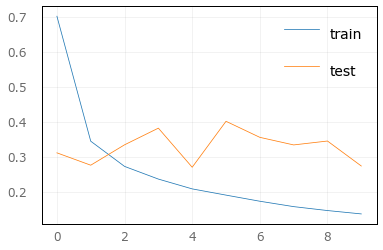

In [58]:
model = Sequential()
model.add(Conv2D(256, (3, 3), activation='swish', padding='same', input_shape=(X_train.shape[1], X_train.shape[2], 1)))
model.add(Dropout(0.2))
model.add(MaxPooling2D(2, 2))

model.add(Conv2D(256, (3, 3), activation='swish', padding='same'))
model.add(Dropout(0.2))
model.add(MaxPooling2D(2, 2))

model.add(Conv2D(256, (3, 3), activation='swish', padding='same'))
model.add(Dropout(0.2))
model.add(MaxPooling2D(2, 2))

model.add(Flatten())
model.add(Dense(1024, activation='swish'))
model.add(Dropout(0.2))
model.add(Dense(4, activation='softmax'))

model.compile(loss='categorical_crossentropy', optimizer=Adam(learning_rate=0.0001), metrics=['categorical_accuracy', f1_m, precision_m, recall_m])
history = model.fit(X_train, y_train, epochs=10, batch_size=36, validation_data=(X_test, y_test), 
                    verbose=1, shuffle=True)
pyplot.plot(history.history['loss'], label='train')
pyplot.plot(history.history['val_loss'], label='test')
pyplot.legend()
pyplot.show()

In [12]:
y_pred = model.predict(X_test,verbose=1,batch_size=1024)
y_pred_int = []
y_test_int = []
y_test_array = np.array(y_test)

for i in range(0, len(y_pred)):
    y_pred_int.append(np.argmax(y_pred[i]))
    y_test_int.append(np.argmax(y_test_array[i,:]))

#Get the confusion matrix
cm = confusion_matrix(y_test_int, y_pred_int)

#Now the normalize the diagonal entries
cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

#The diagonal entries are the accuracies of each class
print(cm.diagonal())

target_names = ['class 0', 'class 1', 'class 2','class 3']
print(classification_report(y_test_int, y_pred_int, target_names=target_names, digits=4))

# evaluate the model
# loss, categorical_acc, f1_score, precision, recall = model.evaluate(x=X_test, y=y_test)

5/5 [==============================] - 9s 2s/step
[0.91965255 0.99348341 0.97239748 0.74977738]
              precision    recall  f1-score   support

     class 0     0.7502    0.9197    0.8263       921
     class 1     0.9671    0.9935    0.9801      1688
     class 2     0.9840    0.9724    0.9782      1268
     class 3     0.9525    0.7498    0.8391      1123

    accuracy                         0.9198      5000
   macro avg     0.9135    0.9088    0.9059      5000
weighted avg     0.9282    0.9198    0.9196      5000



### Saving the Model

In [62]:
model.save('CNN_final')

INFO:tensorflow:Assets written to: CNN_final\assets


# Generating Predicted Output Files

In [11]:
model = load_model('CNN_final', custom_objects={'f1_m': f1_m, 'precision_m': precision_m, 
                                                'recall_m': recall_m})

In [13]:
x_dfs_names = ['X Acc', 'Y Acc', 'Z Acc', 'X Gyr', 'Y Gyr', 'Z Gyr']
window_num = 11
window_num_1 = window_num - 1
window_num_2 = window_num - 2

file_nums = ['09', '10', '11', '12']
file_names = list(os.listdir(os.getcwd() + "/TestData"))
for i in range(int(len(file_names)/3)):
    x = pd.read_csv(os.getcwd() + "\\TestData\\" + file_names[3*i], names=x_dfs_names)
    x_time = list(pd.read_csv(os.getcwd() + "\\TestData\\" + file_names[3*i+1], names=['Time'])['Time'])
    y_time = list(pd.read_csv(os.getcwd() + "\\TestData\\" + file_names[3*i+2], names=['Time'])['Time'])

    xacc = list(x['X Acc'])
    beef = list(x['Y Acc'])  # yacc
    zacc = list(x['Z Acc'])
    xgyr = list(x['X Gyr'])
    ygyr = list(x['Y Gyr'])
    zgyr = list(x['Z Gyr'])
    
    xacc_down_sampled = []
    beef_down_sampled = []
    zacc_down_sampled = []
    xgyr_down_sampled = []
    ygyr_down_sampled = []
    zgyr_down_sampled = []
    x_time_down_sampled = []
    for j in range(1, len(x), 4):
        xacc_down_sampled.append(xacc[j])
        beef_down_sampled.append(beef[j])
        zacc_down_sampled.append(zacc[j])
        xgyr_down_sampled.append(xgyr[j])
        ygyr_down_sampled.append(ygyr[j])
        zgyr_down_sampled.append(zgyr[j])
        x_time_down_sampled.append(x_time[j])
    
    xacc = xacc_down_sampled
    beef = beef_down_sampled  # yacc
    zacc = zacc_down_sampled
    xgyr = xgyr_down_sampled
    ygyr = ygyr_down_sampled
    zgyr = zgyr_down_sampled
    x_time = x_time_down_sampled
    
    # Initialize all of these with 0 pad since they will lose a point during calculation
    xjerk = [0]
    jerky = [0]  # yjerk
    zjerk = [0]
    xangacc = [0]
    yangacc = [0]
    zangazz = [0]  #zangacc
    
    time_diff = (x_time[1]-x_time[0])
    for j in range(1, len(xacc)):
        # aaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaang
        xjerk.append((xacc[j]-xacc[j-1])/time_diff)
        jerky.append((beef[j]-beef[j-1])/time_diff)  # derivative of beef = jerky
        zjerk.append((zacc[j]-zacc[j-1])/time_diff)
        xangacc.append((xgyr[j]-xgyr[j-1])/time_diff)
        yangacc.append((ygyr[j]-ygyr[j-1])/time_diff)
        zangazz.append((zgyr[j]-zgyr[j-1])/time_diff)
    
    # Padding needed for a 20 window size
    padding = [0] * window_num_2
    xacc = padding + xacc + padding
    beef = padding + beef + padding # yacc
    zacc = padding + zacc + padding
    xgyr = padding + xgyr + padding
    ygyr = padding + ygyr + padding
    zgyr = padding + zgyr + padding
    xjerk = padding + xjerk + padding
    jerky = padding + jerky + padding  # yjerk
    zjerk = padding + zjerk + padding
    xangacc = padding + xangacc + padding
    yangacc = padding + yangacc + padding
    zangazz = padding + zangazz + padding  #zangacc
    
    xaccavg = []
    beefavg = []  # yacc
    zaccavg = []
    xgyravg = []
    ygyravg = []
    zgyravg = []
    xjerkavg = []
    jerkyavg = []  # yjerk
    zjerkavg = []
    xangaccavg = []
    yangaccavg = []
    zangazzavg = [] #zangacc
    
    xaccstd = []
    beefstd = []  # yacc
    zaccstd = []
    xgyrstd = []
    ygyrstd = []
    zgyrstd = []
    xjerkstd = []
    jerkystd = []  # yjerk
    zjerkstd = []
    xangaccstd = []
    yangaccstd = []
    zangazzstd = [] #zangacc

    for j in range(window_num, len(xacc)+window_num_1):
        xaccavg.append(mean(xacc[j-window_num:j+window_num_1]))
        beefavg.append(mean(beef[j-window_num:j+window_num_1]))
        zaccavg.append(mean(zacc[j-window_num:j+window_num_1]))
        xgyravg.append(mean(xgyr[j-window_num:j+window_num_1]))
        ygyravg.append(mean(ygyr[j-window_num:j+window_num_1]))
        zgyravg.append(mean(zgyr[j-window_num:j+window_num_1]))
        xjerkavg.append(mean(xjerk[j-window_num:j+window_num_1]))
        jerkyavg.append(mean(jerky[j-window_num:j+window_num_1]))
        zjerkavg.append(mean(zjerk[j-window_num:j+window_num_1]))
        xangaccavg.append(mean(xangacc[j-window_num:j+window_num_1]))
        yangaccavg.append(mean(yangacc[j-window_num:j+window_num_1]))
        zangazzavg.append(mean(zangazz[j-window_num:j+window_num_1]))

        xaccstd.append(stdev(xacc[j-window_num:j+window_num_1]))
        beefstd.append(stdev(beef[j-window_num:j+window_num_1]))
        zaccstd.append(stdev(zacc[j-window_num:j+window_num_1]))
        xgyrstd.append(stdev(xgyr[j-window_num:j+window_num_1]))
        ygyrstd.append(stdev(ygyr[j-window_num:j+window_num_1]))
        zgyrstd.append(stdev(zgyr[j-window_num:j+window_num_1]))
        xjerkstd.append(stdev(xjerk[j-window_num:j+window_num_1]))
        jerkystd.append(stdev(jerky[j-window_num:j+window_num_1]))
        zjerkstd.append(stdev(zjerk[j-window_num:j+window_num_1]))
        xangaccstd.append(stdev(xangacc[j-window_num:j+window_num_1]))
        yangaccstd.append(stdev(yangacc[j-window_num:j+window_num_1]))
        zangazzstd.append(stdev(zangazz[j-window_num:j+window_num_1]))
    
    # Additional Safe ending padding
    end_padding = [0] * window_num
    
    # For "original" features, keep a padding of 18 0's  --  two points + 18 0's are for first label
    xacc = xacc[1:] + end_padding
    beef = beef[1:] + end_padding  # yacc
    zacc = zacc[1:] + end_padding
    xgyr = xgyr[1:] + end_padding
    ygyr = ygyr[1:] + end_padding
    zgyr = zgyr[1:] + end_padding
    xjerk = xjerk[1:] + end_padding
    jerky = jerky[1:] + end_padding  # yjerk
    zjerk = zjerk[1:] + end_padding
    xangacc = xangacc[1:] + end_padding
    yangacc = yangacc[1:] + end_padding
    zangazz = zangazz[1:] + end_padding  #zangacc
    
    # Padding for average and stdev features
    padding2 = [0] * window_num_2
    xaccavg = padding2 + xaccavg + end_padding
    beefavg = padding2 + beefavg + end_padding  # yacc
    zaccavg = padding2 + zaccavg + end_padding
    xgyravg = padding2 + xgyravg + end_padding
    ygyravg = padding2 + ygyravg + end_padding
    zgyravg = padding2 + zgyravg + end_padding
    xjerkavg = padding2 + xjerkavg + end_padding
    jerkyavg = padding2 + jerkyavg + end_padding  # yjerk
    zjerkavg = padding2 + zjerkavg + end_padding
    xangaccavg = padding2 + xangaccavg + end_padding
    yangaccavg = padding2 + yangaccavg + end_padding
    zangazzavg = padding2 + zangazzavg + end_padding #zangacc
    
    xaccstd = padding2 + xaccstd + end_padding
    beefstd = padding2 + beefstd + end_padding  # yacc
    zaccstd = padding2 + zaccstd + end_padding
    xgyrstd = padding2 + xgyrstd + end_padding
    ygyrstd = padding2 + ygyrstd + end_padding
    zgyrstd = padding2 + zgyrstd + end_padding
    xjerkstd = padding2 + xjerkstd + end_padding
    jerkystd = padding2 + jerkystd + end_padding  # yjerk
    zjerkstd = padding2 + zjerkstd + end_padding
    xangaccstd = padding2 + xangaccstd + end_padding
    yangaccstd = padding2 + yangaccstd + end_padding
    zangazzstd = padding2 + zangazzstd + end_padding #zangacc
    
    X_data_test = []
    y_data = []
    for j in range(window_num_1, len(y_time)+window_num_1):
        new_img = np.column_stack([xacc[j-window_num_1:j+window_num], beef[j-window_num_1:j+window_num], 
                                   zacc[j-window_num_1:j+window_num], xgyr[j-window_num_1:j+window_num], 
                                   ygyr[j-window_num_1:j+window_num], zgyr[j-window_num_1:j+window_num], 
                                   xjerk[j-window_num_1:j+window_num], jerky[j-window_num_1:j+window_num], 
                                   zjerk[j-window_num_1:j+window_num], xangacc[j-window_num_1:j+window_num], 
                                   yangacc[j-window_num_1:j+window_num], zangazz[j-window_num_1:j+window_num], 
                                   xaccavg[j-window_num_1:j+window_num], beefavg[j-window_num_1:j+window_num], 
                                   zaccavg[j-window_num_1:j+window_num], xgyravg[j-window_num_1:j+window_num], 
                                   ygyravg[j-window_num_1:j+window_num], zgyravg[j-window_num_1:j+window_num], 
                                   xjerkavg[j-window_num_1:j+window_num], jerkyavg[j-window_num_1:j+window_num], 
                                   zjerkavg[j-window_num_1:j+window_num], xangaccavg[j-window_num_1:j+window_num], 
                                   yangaccavg[j-window_num_1:j+window_num], zangazzavg[j-window_num_1:j+window_num], 
                                 xaccstd[j-window_num_1:j+window_num], beefstd[j-window_num_1:j+window_num], 
                                   zaccstd[j-window_num_1:j+window_num], xgyrstd[j-window_num_1:j+window_num], 
                                 ygyrstd[j-window_num_1:j+window_num], zgyrstd[j-window_num_1:j+window_num], 
                                   xjerkstd[j-window_num_1:j+window_num], jerkystd[j-window_num_1:j+window_num], 
                                 zjerkstd[j-window_num_1:j+window_num], xangaccstd[j-window_num_1:j+window_num], 
                                   yangaccstd[j-window_num_1:j+window_num], zangazzstd[j-window_num_1:j+window_num]])
        X_data_test.append(new_img)
    X_data_test = np.array(X_data_test)
    X_data_test = X_data_test.reshape(X_data_test.shape[0], X_data_test.shape[1], X_data_test.shape[2], 1)
    
    expected = model.predict(X_data_test, verbose=1)

    expected_final = []
    for j in range(len(y_time)):
        expected_final.append(np.argmax(expected[j]))

    print(Counter(expected_final))
    output_df = pd.DataFrame(expected_final)
    output_df.to_csv('subject_0'+file_nums[i]+'_01__y_prediction.csv')

297/297 [==============================] - 19s 64ms/step
Counter({0: 6303, 3: 1244, 2: 966, 1: 960})
